In [1]:
# Parameters
config = {
    "notebook": "notebooks/tfi_lgbm_optuna.ipynb",
    "data_path": "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    "output_label": "trollers_optuna",
}


In [2]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    }
print(config)

{'notebook': 'notebooks/tfi_lgbm_optuna.ipynb', 'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv', 'output_label': 'trollers_optuna'}


In [3]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [5]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

print(df)


      speed    course       lat       lon is_fishing  sun_state  distance  \
0       6.2  0.930000  0.996312  0.212162         NO          1  1.242967   
1       4.2  0.653056  0.996349  0.212427         NO          1  1.699585   
2       0.1  0.047222  0.996348  0.212444         NO          1  0.112599   
3       0.9  0.195278  0.996337  0.212452         NO          1  0.086033   
4       3.7  0.594167  0.996330  0.212433         NO          1  0.131106   
...     ...       ...       ...       ...        ...        ...       ...   
2568    2.0  0.246667  0.996371  0.212425         NO          1  0.184542   
2569    2.7  0.116667  0.996361  0.212444         NO          1  0.134451   
2570    0.3  0.719722  0.996352  0.212436         NO          1  0.076645   
2571    4.4  0.808056  0.996348  0.212445         NO          1  0.063297   
2572    0.3  0.353889  0.996313  0.212339         NO          1  0.712027   

      timediff        S0            A0  ...      J0_lag_3      J0_lag_4  \


Generamos los vectores de train y test.

In [6]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



1286
1287


Funcion para evaluar los modelos.

In [7]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits


Train Accuracy : 0.948
Test Accuracy : 0.775
Best Score Through Grid Search : 0.817
Best Parameters :  {'max_depth': 15, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 2, 'min_weight_fraction_leaf': 0, 'splitter': 'random'}
Best Parameters :  {'max_depth': 15, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 2, 'min_weight_fraction_leaf': 0, 'splitter': 'random'}


Arboles de decision optimizado

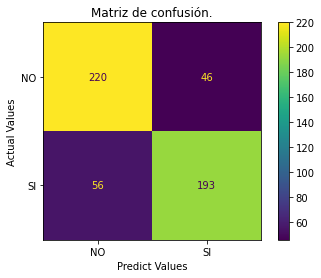

Precision,Recall,Accuracy,F1
0.81,0.78,0.80,0.79


In [8]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


Train Accuracy : 1.000
Test Accuracy : 0.872
Best Score Through Grid Search : 0.868
Best Parameters :  {'bootstrap': False, 'max_depth': 13, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}


Random forest optimizado

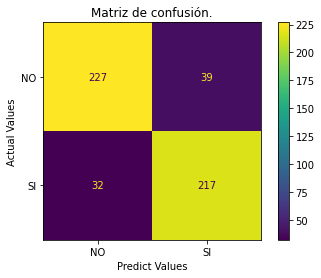

Precision,Recall,Accuracy,F1
0.85,0.87,0.86,0.86


In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


Train Accuracy : 0.800
Test Accuracy : 0.794
Best Score Through Grid Search : 0.766
Best Parameters :  {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}


rbf

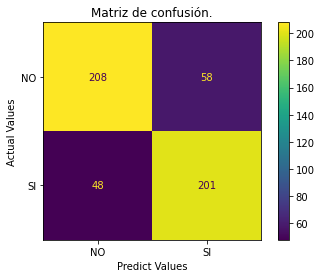

Precision,Recall,Accuracy,F1
0.78,0.81,0.79,0.79


Fitting 5 folds for each of 120 candidates, totalling 600 fits


Train Accuracy : 0.662
Test Accuracy : 0.668
Best Score Through Grid Search : 0.662
Best Parameters :  {'C': 100, 'coef0': 1, 'gamma': 1e-06, 'kernel': 'sigmoid'}


sigmoid

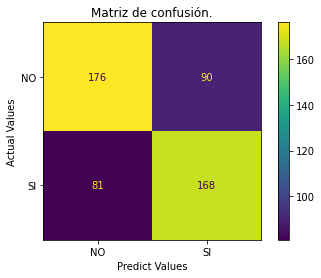

Precision,Recall,Accuracy,F1
0.65,0.67,0.67,0.66


In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [0.1,1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0
for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [11]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000)


[I 2022-06-08 18:07:54,271] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=4.8557270980072476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.8557270980072476
[LightGBM] [Warning] lambda_l1 is set=6.642627966163684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.642627966163684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.923522013048029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.923522013048029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:07:54,595] Trial 0 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2582452111148772, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 4500, 'lambda_l1': 6.642627966163684, 'lambda_l2': 12.923522013048029, 'min_gain_to_split': 4.8557270980072476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_gain_to_split is set=4.8557270980072476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.8557270980072476
[LightGBM] [Warning] lambda_l1 is set=6.642627966163684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.642627966163684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.923522013048029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.923522013048029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.145144782302834, min_split_gain=0.0 will be ignored. Current

[I 2022-06-08 18:07:54,931] Trial 1 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.077426567606674, 'num_leaves': 728, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 6.317773145570467, 'lambda_l2': 36.68270410020672, 'min_gain_to_split': 7.145144782302834, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.145144782302834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.145144782302834
[LightGBM] [Warning] lambda_l1 is set=6.317773145570467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.317773145570467
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=36.68270410020672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.68270410020672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=11.31352708556142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.31352708556142
[LightGBM] [Warning] lambda_l1 is set=8.804443439957922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.804443439957922
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.393686371163266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.393686371163266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:07:55,158] Trial 2 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1402683841133165, 'num_leaves': 38, 'max_depth': 10, 'min_data_in_leaf': 5000, 'lambda_l1': 8.804443439957922, 'lambda_l2': 31.393686371163266, 'min_gain_to_split': 11.31352708556142, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=11.31352708556142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.31352708556142
[LightGBM] [Warning] lambda_l1 is set=8.804443439957922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.804443439957922
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.393686371163266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.393686371163266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-08 18:07:55,400] Trial 3 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18370595422789304, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 2.6895740282119727, 'lambda_l2': 28.232842566208927, 'min_gain_to_split': 6.925579652013186, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=6.925579652013186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.925579652013186
[LightGBM] [Warning] lambda_l1 is set=2.6895740282119727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6895740282119727
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=28.232842566208927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.232842566208927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-08 18:07:55,633] Trial 4 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2786252220443074, 'num_leaves': 338, 'max_depth': 4, 'min_data_in_leaf': 9300, 'lambda_l1': 1.2961097707398161, 'lambda_l2': 17.60707573468472, 'min_gain_to_split': 1.2030090639679702, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_gain_to_split is set=1.2030090639679702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2030090639679702
[LightGBM] [Warning] lambda_l1 is set=1.2961097707398161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2961097707398161
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=17.60707573468472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.60707573468472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=1.2030090639679702, min_split_gain=0.0 will be ignored. Curr

[I 2022-06-08 18:07:55,920] Trial 5 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28636550051262033, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 5000, 'lambda_l1': 8.674901989440611, 'lambda_l2': 28.779376028855484, 'min_gain_to_split': 7.4104285709195095, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=7.4104285709195095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.4104285709195095
[LightGBM] [Warning] lambda_l1 is set=8.674901989440611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.674901989440611
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=28.779376028855484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.779376028855484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 wi

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=3.670124482558445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.670124482558445
[LightGBM] [Warning] lambda_l1 is set=4.825512528604616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.825512528604616
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.130773915273636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.130773915273636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:07:56,205] Trial 6 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1811334889579202, 'num_leaves': 778, 'max_depth': 4, 'min_data_in_leaf': 8100, 'lambda_l1': 4.825512528604616, 'lambda_l2': 43.130773915273636, 'min_gain_to_split': 3.670124482558445, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=3.670124482558445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.670124482558445
[LightGBM] [Warning] lambda_l1 is set=4.825512528604616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.825512528604616
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.130773915273636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.130773915273636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:07:56,509] Trial 7 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07722490657762941, 'num_leaves': 308, 'max_depth': 6, 'min_data_in_leaf': 3700, 'lambda_l1': 3.9564760300575417, 'lambda_l2': 65.95311646360462, 'min_gain_to_split': 1.3531894284558703, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.3531894284558703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3531894284558703
[LightGBM] [Warning] lambda_l1 is set=3.9564760300575417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9564760300575417
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.95311646360462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.95311646360462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=11.093021820591044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.093021820591044
[LightGBM] [Warning] lambda_l1 is set=8.437882864651545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.437882864651545
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.46665291985725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.46665291985725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-08 18:07:56,805] Trial 8 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1751478858982532, 'num_leaves': 148, 'max_depth': 5, 'min_data_in_leaf': 5700, 'lambda_l1': 8.437882864651545, 'lambda_l2': 75.46665291985725, 'min_gain_to_split': 11.093021820591044, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=11.093021820591044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.093021820591044
[LightGBM] [Warning] lambda_l1 is set=8.437882864651545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.437882864651545
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.46665291985725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.46665291985725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:07:57,102] Trial 9 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17862995907533186, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 2600, 'lambda_l1': 2.01758428965531, 'lambda_l2': 31.2805766696297, 'min_gain_to_split': 0.28550024307707367, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.28550024307707367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28550024307707367
[LightGBM] [Warning] lambda_l1 is set=2.01758428965531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.01758428965531
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.2805766696297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.2805766696297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be 

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=14.965266362457067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.965266362457067
[LightGBM] [Warning] lambda_l1 is set=6.526610148214315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.526610148214315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.33476383207954186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33476383207954186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:07:57,489] Trial 10 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011413678470142324, 'num_leaves': 1018, 'max_depth': 9, 'min_data_in_leaf': 7100, 'lambda_l1': 6.526610148214315, 'lambda_l2': 0.33476383207954186, 'min_gain_to_split': 14.965266362457067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=14.965266362457067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.965266362457067
[LightGBM] [Warning] lambda_l1 is set=6.526610148214315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.526610148214315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.33476383207954186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33476383207954186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.086998607286369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.086998607286369
[LightGBM] [Warning] lambda_l1 is set=6.142191445926941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.142191445926941
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.426200409617941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426200409617941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.086998607286369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.086998607286369
[LightGBM] [Warning] lambda_l1 is set=6.142191445926941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.142191445926941
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.426200409617941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426200409617941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.086998607286369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.086998607286369
[LightGBM] [Warning] lambda_l1 is set=6.142191445926941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.142191445926941
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.426200409617941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426200409617941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.086998607286369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.086998607286369
[LightGBM] [Warning] lambda_l1 is set=6.142191445926941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.142191445926941
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.426200409617941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426200409617941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:07:59,191] Trial 11 finished with value: 0.49238920406178144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08653329536180204, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 6.142191445926941, 'lambda_l2': 1.426200409617941, 'min_gain_to_split': 5.086998607286369, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 11 with value: 0.49238920406178144.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.529401525684678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.529401525684678
[LightGBM] [Warning] lambda_l1 is set=6.547763032124427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547763032124427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21922199221843108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21922199221843108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.529401525684678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.529401525684678
[LightGBM] [Warning] lambda_l1 is set=6.547763032124427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547763032124427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21922199221843108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21922199221843108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:08:00,079] Trial 12 finished with value: 0.41079306561032114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2522366151471745, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 6.547763032124427, 'lambda_l2': 0.21922199221843108, 'min_gain_to_split': 4.529401525684678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.529401525684678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.529401525684678
[LightGBM] [Warning] lambda_l1 is set=6.547763032124427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547763032124427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21922199221843108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21922199221843108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=4.200122791072031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200122791072031
[LightGBM] [Warning] lambda_l1 is set=7.404681545962736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404681545962736
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04151903987963165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04151903987963165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=4.200122791072031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200122791072031
[LightGBM] [Warning] lambda_l1 is set=7.404681545962736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404681545962736
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04151903987963165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04151903987963165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=4.200122791072031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200122791072031
[LightGBM] [Warning] lambda_l1 is set=7.404681545962736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404681545962736
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04151903987963165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04151903987963165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[I 2022-06-08 18:08:01,170] Trial 13 finished with value: 0.4931900838680715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23484084321388055, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 300, 'lambda_l1': 7.404681545962736, 'lambda_l2': 0.04151903987963165, 'min_gain_to_split': 4.200122791072031, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=4.200122791072031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200122791072031
[LightGBM] [Warning] lambda_l1 is set=7.404681545962736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404681545962736
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04151903987963165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04151903987963165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.263357371476957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.263357371476957
[LightGBM] [Warning] lambda_l1 is set=9.89192551919255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.89192551919255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.27984792468244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.27984792468244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:08:01,512] Trial 14 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11001890139212808, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 1600, 'lambda_l1': 9.89192551919255, 'lambda_l2': 98.27984792468244, 'min_gain_to_split': 10.263357371476957, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.263357371476957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.263357371476957
[LightGBM] [Warning] lambda_l1 is set=9.89192551919255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.89192551919255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.27984792468244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.27984792468244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current

[I 2022-06-08 18:08:01,859] Trial 15 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22098966727876518, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 2100, 'lambda_l1': 4.907426983601994, 'lambda_l2': 61.50958613698759, 'min_gain_to_split': 2.847580938232519, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=2.847580938232519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.847580938232519
[LightGBM] [Warning] lambda_l1 is set=4.907426983601994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907426983601994
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=61.50958613698759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.50958613698759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be 

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.345564664587151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.345564664587151
[LightGBM] [Warning] lambda_l1 is set=0.07483004848064212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07483004848064212
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=14.025230045980868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.025230045980868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 w

[I 2022-06-08 18:08:02,210] Trial 16 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039805019790586774, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.07483004848064212, 'lambda_l2': 14.025230045980868, 'min_gain_to_split': 5.345564664587151, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.345564664587151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.345564664587151
[LightGBM] [Warning] lambda_l1 is set=0.07483004848064212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07483004848064212
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=14.025230045980868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.025230045980868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 w

[I 2022-06-08 18:08:02,565] Trial 17 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13897233244890767, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 3100, 'lambda_l1': 3.55803373661257, 'lambda_l2': 7.757469756490458, 'min_gain_to_split': 9.737126208127682, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=9.737126208127682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.737126208127682
[LightGBM] [Warning] lambda_l1 is set=3.55803373661257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.55803373661257
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.757469756490458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.757469756490458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.5406845628170664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5406845628170664
[LightGBM] [Warning] lambda_l1 is set=5.681560691977836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.681560691977836
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.923471573387346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.923471573387346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.5406845628170664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5406845628170664
[LightGBM] [Warning] lambda_l1 is set=5.681560691977836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.681560691977836
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.923471573387346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.923471573387346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.5406845628170664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5406845628170664
[LightGBM] [Warning] lambda_l1 is set=5.681560691977836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.681560691977836
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.923471573387346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.923471573387346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.5406845628170664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5406845628170664
[LightGBM] [Warning] lambda_l1 is set=5.681560691977836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.681560691977836
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.923471573387346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.923471573387346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.5406845628170664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5406845628170664
[LightGBM] [Warning] lambda_l1 is set=5.681560691977836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.681560691977836
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.923471573387346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.923471573387346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:04,762] Trial 18 finished with value: 0.4466292668958479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09060506672469962, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 300, 'lambda_l1': 5.681560691977836, 'lambda_l2': 51.923471573387346, 'min_gain_to_split': 5.5406845628170664, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=8.767188330355543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.767188330355543
[LightGBM] [Warning] lambda_l1 is set=5.487272456757013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.487272456757013
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.418067603379214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.418067603379214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6

[I 2022-06-08 18:08:05,121] Trial 19 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2154496152085134, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 6300, 'lambda_l1': 5.487272456757013, 'lambda_l2': 53.418067603379214, 'min_gain_to_split': 8.767188330355543, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=8.767188330355543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.767188330355543
[LightGBM] [Warning] lambda_l1 is set=5.487272456757013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.487272456757013
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.418067603379214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.418067603379214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=630

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.2246822453799813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2246822453799813
[LightGBM] [Warning] lambda_l1 is set=7.617148345355826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.617148345355826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=86.1405286911062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.1405286911062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-08 18:08:05,473] Trial 20 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12570445487667586, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 7.617148345355826, 'lambda_l2': 86.1405286911062, 'min_gain_to_split': 2.2246822453799813, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.879092251502353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.879092251502353
[LightGBM] [Warning] lambda_l1 is set=5.857423284700731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.857423284700731
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=48.95687589574398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.95687589574398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.879092251502353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.879092251502353
[LightGBM] [Warning] lambda_l1 is set=5.857423284700731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.857423284700731
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=48.95687589574398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.95687589574398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.879092251502353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.879092251502353
[LightGBM] [Warning] lambda_l1 is set=5.857423284700731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.857423284700731
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=48.95687589574398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.95687589574398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.879092251502353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.879092251502353
[LightGBM] [Warning] lambda_l1 is set=5.857423284700731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.857423284700731
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=48.95687589574398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.95687589574398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.879092251502353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.879092251502353
[LightGBM] [Warning] lambda_l1 is set=5.857423284700731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.857423284700731
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=48.95687589574398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.95687589574398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:07,833] Trial 21 finished with value: 0.4673146088523149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08605577094971303, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 300, 'lambda_l1': 5.857423284700731, 'lambda_l2': 48.95687589574398, 'min_gain_to_split': 5.879092251502353, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.993616978453898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.993616978453898
[LightGBM] [Warning] lambda_l1 is set=5.50369951524262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.50369951524262
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=48.98247579093738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.98247579093738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-08 18:08:08,194] Trial 22 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04356837093662534, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 5.50369951524262, 'lambda_l2': 48.98247579093738, 'min_gain_to_split': 5.993616978453898, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.993616978453898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.993616978453898
[LightGBM] [Warning] lambda_l1 is set=5.50369951524262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.50369951524262
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=48.98247579093738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.98247579093738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data

[I 2022-06-08 18:08:08,519] Trial 23 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10186766763619, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 4.274877855689684, 'lambda_l2': 62.16952871143255, 'min_gain_to_split': 8.706377968316739, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=8.706377968316739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.706377968316739
[LightGBM] [Warning] lambda_l1 is set=4.274877855689684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.274877855689684
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.16952871143255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.16952871143255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=3.2868356814298023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2868356814298023
[LightGBM] [Warning] lambda_l1 is set=7.430823983379456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.430823983379456
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=76.60717102792529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.60717102792529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-08 18:08:08,881] Trial 24 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049114116359566445, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 3400, 'lambda_l1': 7.430823983379456, 'lambda_l2': 76.60717102792529, 'min_gain_to_split': 3.2868356814298023, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=3.2868356814298023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2868356814298023
[LightGBM] [Warning] lambda_l1 is set=7.430823983379456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.430823983379456
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=76.60717102792529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.60717102792529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.199430563316514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.199430563316514
[LightGBM] [Warning] lambda_l1 is set=5.5787790115060725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5787790115060725
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.53620843347027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.53620843347027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Cu

[I 2022-06-08 18:08:09,311] Trial 25 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0665002704332715, 'num_leaves': 548, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 5.5787790115060725, 'lambda_l2': 52.53620843347027, 'min_gain_to_split': 6.199430563316514, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.199430563316514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.199430563316514
[LightGBM] [Warning] lambda_l1 is set=5.5787790115060725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5787790115060725
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.53620843347027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.53620843347027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=8.32894516991171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.32894516991171
[LightGBM] [Warning] lambda_l1 is set=3.1306839440265612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1306839440265612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.47847634660455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.47847634660455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:08:09,673] Trial 26 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013751027333016738, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 1800, 'lambda_l1': 3.1306839440265612, 'lambda_l2': 21.47847634660455, 'min_gain_to_split': 8.32894516991171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_gain_to_split is set=8.32894516991171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.32894516991171
[LightGBM] [Warning] lambda_l1 is set=3.1306839440265612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1306839440265612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.47847634660455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.47847634660455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=8.32894516991171, min_split_gain=0.0 will be ignored. Current va

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=4.321607214905228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.321607214905228
[LightGBM] [Warning] lambda_l1 is set=6.8189311126284355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8189311126284355
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=45.5861351687886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.5861351687886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-08 18:08:10,045] Trial 27 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11137107670246413, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 2600, 'lambda_l1': 6.8189311126284355, 'lambda_l2': 45.5861351687886, 'min_gain_to_split': 4.321607214905228, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=4.321607214905228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.321607214905228
[LightGBM] [Warning] lambda_l1 is set=6.8189311126284355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8189311126284355
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=45.5861351687886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.5861351687886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.43796919645259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.43796919645259
[LightGBM] [Warning] lambda_l1 is set=4.283415360600655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.283415360600655
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=38.824909710289575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.824909710289575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-08 18:08:10,611] Trial 28 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15937805863279764, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 4.283415360600655, 'lambda_l2': 38.824909710289575, 'min_gain_to_split': 6.43796919645259, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_gain_to_split is set=6.43796919645259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.43796919645259
[LightGBM] [Warning] lambda_l1 is set=4.283415360600655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.283415360600655
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=38.824909710289575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.824909710289575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=6.43796919645259, min_split_gain=0.0 will be ignored. Current valu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=5.2682439026384955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.2682439026384955
[LightGBM] [Warning] lambda_l1 is set=7.009769159917287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.009769159917287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.16965729119613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.16965729119613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:08:11,060] Trial 29 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26249443531162087, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 10000, 'lambda_l1': 7.009769159917287, 'lambda_l2': 70.16965729119613, 'min_gain_to_split': 5.2682439026384955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=5.2682439026384955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.2682439026384955
[LightGBM] [Warning] lambda_l1 is set=7.009769159917287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.009769159917287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.16965729119613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.16965729119613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.481874705042891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.481874705042891
[LightGBM] [Warning] lambda_l1 is set=8.118849500464052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.118849500464052
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=89.1607039819961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.1607039819961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:08:11,438] Trial 30 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2501391585441347, 'num_leaves': 248, 'max_depth': 7, 'min_data_in_leaf': 1700, 'lambda_l1': 8.118849500464052, 'lambda_l2': 89.1607039819961, 'min_gain_to_split': 13.481874705042891, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_gain_to_split is set=13.481874705042891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.481874705042891
[LightGBM] [Warning] lambda_l1 is set=8.118849500464052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.118849500464052
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=89.1607039819961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.1607039819961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.481874705042891, min_split_gain=0.0 will be ignored. Current 

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=4.609681989949391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.609681989949391
[LightGBM] [Warning] lambda_l1 is set=6.023348460672578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.023348460672578
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.792328754024687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.792328754024687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-08 18:08:11,881] Trial 31 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0947284257102739, 'num_leaves': 778, 'max_depth': 8, 'min_data_in_leaf': 300, 'lambda_l1': 6.023348460672578, 'lambda_l2': 8.792328754024687, 'min_gain_to_split': 4.609681989949391, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=4.609681989949391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.609681989949391
[LightGBM] [Warning] lambda_l1 is set=6.023348460672578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.023348460672578
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.792328754024687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.792328754024687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.378822290883687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.378822290883687
[LightGBM] [Warning] lambda_l1 is set=6.417065716780927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.417065716780927
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.953577282495436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953577282495436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.378822290883687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.378822290883687
[LightGBM] [Warning] lambda_l1 is set=6.417065716780927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.417065716780927
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.953577282495436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953577282495436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.378822290883687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.378822290883687
[LightGBM] [Warning] lambda_l1 is set=6.417065716780927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.417065716780927
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.953577282495436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953577282495436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:14,520] Trial 32 finished with value: 0.4920079277419519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06721931508812086, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 300, 'lambda_l1': 6.417065716780927, 'lambda_l2': 4.953577282495436, 'min_gain_to_split': 5.378822290883687, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=5.378822290883687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.378822290883687
[LightGBM] [Warning] lambda_l1 is set=6.417065716780927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.417065716780927
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.953577282495436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953577282495436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.855777257513388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.855777257513388
[LightGBM] [Warning] lambda_l1 is set=5.816521617057318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.816521617057318
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=19.723209014374362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.723209014374362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[I 2022-06-08 18:08:15,026] Trial 33 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05766250429049771, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 5.816521617057318, 'lambda_l2': 19.723209014374362, 'min_gain_to_split': 7.855777257513388, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.855777257513388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.855777257513388
[LightGBM] [Warning] lambda_l1 is set=5.816521617057318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.816521617057318
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=19.723209014374362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.723209014374362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=5.703422129416544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.703422129416544
[LightGBM] [Warning] lambda_l1 is set=4.988407536703548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.988407536703548
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=9.52279246475459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.52279246475459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[I 2022-06-08 18:08:15,419] Trial 34 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1277062969975396, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 4.988407536703548, 'lambda_l2': 9.52279246475459, 'min_gain_to_split': 5.703422129416544, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=5.703422129416544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.703422129416544
[LightGBM] [Warning] lambda_l1 is set=4.988407536703548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.988407536703548
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=9.52279246475459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.52279246475459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.007441865738492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.007441865738492
[LightGBM] [Warning] lambda_l1 is set=9.353531140566655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.353531140566655
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=24.51921349416565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.51921349416565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be i

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.007441865738492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.007441865738492
[LightGBM] [Warning] lambda_l1 is set=9.353531140566655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.353531140566655
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=24.51921349416565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.51921349416565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be i

[I 2022-06-08 18:08:15,927] Trial 35 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02563041151148661, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 9.353531140566655, 'lambda_l2': 24.51921349416565, 'min_gain_to_split': 7.007441865738492, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=24.51921349416565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.51921349416565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.8218888745380744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8218888745380744
[LightGBM] [Warning] lambda_l1 is set=6.547724102528348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547724102528348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be igno

[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.8218888745380744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8218888745380744
[LightGBM] [Warning] lambda_l1 is set=6.547724102528348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547724102528348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=36.06667139292249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.06667139292249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-08 18:08:16,330] Trial 36 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07112260467972505, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 2900, 'lambda_l1': 6.547724102528348, 'lambda_l2': 36.06667139292249, 'min_gain_to_split': 2.8218888745380744, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.8218888745380744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8218888745380744
[LightGBM] [Warning] lambda_l1 is set=6.547724102528348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547724102528348
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=36.06667139292249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.06667139292249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=3.7328977820348346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7328977820348346
[LightGBM] [Warning] lambda_l1 is set=7.9167061307616375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9167061307616375
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=56.50798188862998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.50798188862998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-08 18:08:16,725] Trial 37 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19880231200666007, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 2000, 'lambda_l1': 7.9167061307616375, 'lambda_l2': 56.50798188862998, 'min_gain_to_split': 3.7328977820348346, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=3.7328977820348346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7328977820348346
[LightGBM] [Warning] lambda_l1 is set=7.9167061307616375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9167061307616375
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=56.50798188862998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.50798188862998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=6.733491558425548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.733491558425548
[LightGBM] [Warning] lambda_l1 is set=6.882080133547797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.882080133547797
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.21281992903259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.21281992903259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be 

[I 2022-06-08 18:08:17,125] Trial 38 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0879505175196659, 'num_leaves': 838, 'max_depth': 3, 'min_data_in_leaf': 4400, 'lambda_l1': 6.882080133547797, 'lambda_l2': 39.21281992903259, 'min_gain_to_split': 6.733491558425548, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 12 with value: 0.41079306561032114.


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=6.733491558425548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.733491558425548
[LightGBM] [Warning] lambda_l1 is set=6.882080133547797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.882080133547797
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.21281992903259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.21281992903259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, 

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.80897680087537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80897680087537
[LightGBM] [Warning] lambda_l1 is set=4.637524357922964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.637524357922964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.187040687099282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.187040687099282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.80897680087537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80897680087537
[LightGBM] [Warning] lambda_l1 is set=4.637524357922964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.637524357922964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.187040687099282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.187040687099282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.80897680087537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80897680087537
[LightGBM] [Warning] lambda_l1 is set=4.637524357922964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.637524357922964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.187040687099282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.187040687099282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.80897680087537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.80897680087537
[LightGBM] [Warning] lambda_l1 is set=4.637524357922964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.637524357922964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.187040687099282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.187040687099282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:18,947] Trial 39 finished with value: 0.4030187939376578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15039819826755993, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 4.637524357922964, 'lambda_l2': 15.187040687099282, 'min_gain_to_split': 1.80897680087537, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 39 with value: 0.4030187939376578.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4226409594804377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4226409594804377
[LightGBM] [Warning] lambda_l1 is set=4.55983540263821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.55983540263821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.233911716418007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.233911716418007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4226409594804377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4226409594804377
[LightGBM] [Warning] lambda_l1 is set=4.55983540263821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.55983540263821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.233911716418007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.233911716418007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4226409594804377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4226409594804377
[LightGBM] [Warning] lambda_l1 is set=4.55983540263821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.55983540263821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.233911716418007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.233911716418007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4226409594804377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4226409594804377
[LightGBM] [Warning] lambda_l1 is set=4.55983540263821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.55983540263821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.233911716418007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.233911716418007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:20,764] Trial 40 finished with value: 0.4840649269391288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15331012936815153, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 4.55983540263821, 'lambda_l2': 16.233911716418007, 'min_gain_to_split': 1.4226409594804377, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 39 with value: 0.4030187939376578.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4226409594804377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4226409594804377
[LightGBM] [Warning] lambda_l1 is set=4.55983540263821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.55983540263821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.233911716418007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.233911716418007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0025394597442016664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025394597442016664
[LightGBM] [Warning] lambda_l1 is set=4.382466547993719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382466547993719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.744529746769302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.744529746769302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0025394597442016664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025394597442016664
[LightGBM] [Warning] lambda_l1 is set=4.382466547993719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382466547993719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.744529746769302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.744529746769302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0025394597442016664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025394597442016664
[LightGBM] [Warning] lambda_l1 is set=4.382466547993719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382466547993719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.744529746769302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.744529746769302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0025394597442016664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025394597442016664
[LightGBM] [Warning] lambda_l1 is set=4.382466547993719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382466547993719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.744529746769302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.744529746769302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:24,451] Trial 41 finished with value: 0.43674905019586346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15581044366582078, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 4.382466547993719, 'lambda_l2': 25.744529746769302, 'min_gain_to_split': 0.0025394597442016664, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 39 with value: 0.4030187939376578.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0025394597442016664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025394597442016664
[LightGBM] [Warning] lambda_l1 is set=4.382466547993719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382466547993719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.744529746769302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.744529746769302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02234312855609133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02234312855609133
[LightGBM] [Warning] lambda_l1 is set=3.640764306066841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.640764306066841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.933533113921584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.933533113921584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02234312855609133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02234312855609133
[LightGBM] [Warning] lambda_l1 is set=3.640764306066841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.640764306066841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.933533113921584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.933533113921584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02234312855609133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02234312855609133
[LightGBM] [Warning] lambda_l1 is set=3.640764306066841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.640764306066841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.933533113921584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.933533113921584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02234312855609133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02234312855609133
[LightGBM] [Warning] lambda_l1 is set=3.640764306066841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.640764306066841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.933533113921584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.933533113921584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:25,986] Trial 42 finished with value: 0.35684691188300044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29491817389222513, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.640764306066841, 'lambda_l2': 24.933533113921584, 'min_gain_to_split': 0.02234312855609133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02234312855609133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02234312855609133
[LightGBM] [Warning] lambda_l1 is set=3.640764306066841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.640764306066841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.933533113921584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.933533113921584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.1025048851506179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1025048851506179
[LightGBM] [Warning] lambda_l1 is set=2.349956575758717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.349956575758717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.79925920317606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.79925920317606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:08:26,390] Trial 43 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2771419785421746, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 2.349956575758717, 'lambda_l2': 23.79925920317606, 'min_gain_to_split': 0.1025048851506179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.1025048851506179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1025048851506179
[LightGBM] [Warning] lambda_l1 is set=2.349956575758717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.349956575758717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.79925920317606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.79925920317606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.74086669422612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.74086669422612
[LightGBM] [Warning] lambda_l1 is set=3.159849553928498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.159849553928498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.4304152498776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.4304152498776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be igno

[I 2022-06-08 18:08:26,799] Trial 44 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29351246574857875, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 3800, 'lambda_l1': 3.159849553928498, 'lambda_l2': 33.4304152498776, 'min_gain_to_split': 0.74086669422612, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.74086669422612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.74086669422612
[LightGBM] [Warning] lambda_l1 is set=3.159849553928498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.159849553928498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.4304152498776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.4304152498776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be igno

[LightGBM] [Warning] min_gain_to_split is set=1.8545592538242315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8545592538242315
[LightGBM] [Warning] lambda_l1 is set=3.784156087313747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.784156087313747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.073785159716135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.073785159716135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.8545592538242315, min_split_gain=0.0 will be ignored. Curr

[I 2022-06-08 18:08:27,209] Trial 45 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25805385401905534, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 8000, 'lambda_l1': 3.784156087313747, 'lambda_l2': 26.073785159716135, 'min_gain_to_split': 1.8545592538242315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.8545592538242315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8545592538242315
[LightGBM] [Warning] lambda_l1 is set=3.784156087313747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.784156087313747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.073785159716135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.073785159716135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9795120415998696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795120415998696
[LightGBM] [Warning] lambda_l1 is set=5.164976709574455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164976709574455
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.019952752016671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.019952752016671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9795120415998696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795120415998696
[LightGBM] [Warning] lambda_l1 is set=5.164976709574455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164976709574455
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.019952752016671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.019952752016671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9795120415998696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795120415998696
[LightGBM] [Warning] lambda_l1 is set=5.164976709574455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164976709574455
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.019952752016671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.019952752016671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9795120415998696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795120415998696
[LightGBM] [Warning] lambda_l1 is set=5.164976709574455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164976709574455
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.019952752016671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.019952752016671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:29,103] Trial 46 finished with value: 0.4363680192124904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27322268975351394, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.164976709574455, 'lambda_l2': 14.019952752016671, 'min_gain_to_split': 0.9795120415998696, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9795120415998696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795120415998696
[LightGBM] [Warning] lambda_l1 is set=5.164976709574455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164976709574455
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.019952752016671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.019952752016671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.426609358295732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.426609358295732
[LightGBM] [Warning] lambda_l1 is set=1.5984695162200793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5984695162200793
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.697319345260865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.697319345260865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will

[I 2022-06-08 18:08:29,526] Trial 47 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2732124033031312, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 1600, 'lambda_l1': 1.5984695162200793, 'lambda_l2': 11.697319345260865, 'min_gain_to_split': 0.426609358295732, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.426609358295732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.426609358295732
[LightGBM] [Warning] lambda_l1 is set=1.5984695162200793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5984695162200793
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.697319345260865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.697319345260865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.0085021985751625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0085021985751625
[LightGBM] [Warning] lambda_l1 is set=3.4140079823827416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4140079823827416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.970170253218544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.970170253218544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: 

[I 2022-06-08 18:08:29,945] Trial 48 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24650744866653168, 'num_leaves': 198, 'max_depth': 6, 'min_data_in_leaf': 2400, 'lambda_l1': 3.4140079823827416, 'lambda_l2': 15.970170253218544, 'min_gain_to_split': 1.0085021985751625, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.0085021985751625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0085021985751625
[LightGBM] [Warning] lambda_l1 is set=3.4140079823827416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4140079823827416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.970170253218544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.970170253218544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=2.2936371426502817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2936371426502817
[LightGBM] [Warning] lambda_l1 is set=2.700718398781373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.700718398781373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.67192357425439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.67192357425439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-08 18:08:30,371] Trial 49 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29353002769388925, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 4900, 'lambda_l1': 2.700718398781373, 'lambda_l2': 30.67192357425439, 'min_gain_to_split': 2.2936371426502817, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=2.2936371426502817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2936371426502817
[LightGBM] [Warning] lambda_l1 is set=2.700718398781373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.700718398781373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.67192357425439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.67192357425439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5602605785102286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5602605785102286
[LightGBM] [Warning] lambda_l1 is set=4.019496812148576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019496812148576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912961629592698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912961629592698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5602605785102286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5602605785102286
[LightGBM] [Warning] lambda_l1 is set=4.019496812148576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019496812148576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912961629592698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912961629592698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5602605785102286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5602605785102286
[LightGBM] [Warning] lambda_l1 is set=4.019496812148576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019496812148576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912961629592698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912961629592698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5602605785102286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5602605785102286
[LightGBM] [Warning] lambda_l1 is set=4.019496812148576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019496812148576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912961629592698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912961629592698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:33,077] Trial 50 finished with value: 0.4359812864130008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1934256331631119, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 4.019496812148576, 'lambda_l2': 4.912961629592698, 'min_gain_to_split': 1.5602605785102286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5602605785102286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5602605785102286
[LightGBM] [Warning] lambda_l1 is set=4.019496812148576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019496812148576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912961629592698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912961629592698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3763917821723806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3763917821723806
[LightGBM] [Warning] lambda_l1 is set=4.003752426893341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003752426893341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.900597029779151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900597029779151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3763917821723806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3763917821723806
[LightGBM] [Warning] lambda_l1 is set=4.003752426893341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003752426893341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.900597029779151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900597029779151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3763917821723806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3763917821723806
[LightGBM] [Warning] lambda_l1 is set=4.003752426893341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003752426893341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.900597029779151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900597029779151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3763917821723806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3763917821723806
[LightGBM] [Warning] lambda_l1 is set=4.003752426893341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003752426893341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.900597029779151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900597029779151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:34,895] Trial 51 finished with value: 0.4366337531663225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19680903509997377, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 4.003752426893341, 'lambda_l2': 4.900597029779151, 'min_gain_to_split': 1.3763917821723806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3763917821723806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3763917821723806
[LightGBM] [Warning] lambda_l1 is set=4.003752426893341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003752426893341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.900597029779151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900597029779151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.6369429811843332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6369429811843332
[LightGBM] [Warning] lambda_l1 is set=3.8614787684915317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8614787684915317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2701095731012275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2701095731012275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 wi

[I 2022-06-08 18:08:35,320] Trial 52 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20367238635009688, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 3.8614787684915317, 'lambda_l2': 4.2701095731012275, 'min_gain_to_split': 1.6369429811843332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.6369429811843332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6369429811843332
[LightGBM] [Warning] lambda_l1 is set=3.8614787684915317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8614787684915317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2701095731012275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2701095731012275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[LightGBM] [Warning] min_gain_to_split is set=2.594111280969628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.594111280969628
[LightGBM] [Warning] lambda_l1 is set=5.077403155483288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.077403155483288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094442501620151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094442501620151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.594111280969628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.594111280969628
[LightGBM] [Warning] lambda_l1 is set=5.077403155483288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.077403155483288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094442501620151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094442501620151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.594111280969628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.594111280969628
[LightGBM] [Warning] lambda_l1 is set=5.077403155483288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.077403155483288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094442501620151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094442501620151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.594111280969628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.594111280969628
[LightGBM] [Warning] lambda_l1 is set=5.077403155483288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.077403155483288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094442501620151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094442501620151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:36,588] Trial 53 finished with value: 0.46217925342297284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24088199139349475, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 5.077403155483288, 'lambda_l2': 4.094442501620151, 'min_gain_to_split': 2.594111280969628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.594111280969628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.594111280969628
[LightGBM] [Warning] lambda_l1 is set=5.077403155483288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.077403155483288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.094442501620151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.094442501620151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current v

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8611070915806335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8611070915806335
[LightGBM] [Warning] lambda_l1 is set=5.147561686913574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.147561686913574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.534081264606906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.534081264606906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8611070915806335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8611070915806335
[LightGBM] [Warning] lambda_l1 is set=5.147561686913574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.147561686913574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.534081264606906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.534081264606906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-08 18:08:37,527] Trial 54 finished with value: 0.37586943553023044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22953772692996977, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.147561686913574, 'lambda_l2': 11.534081264606906, 'min_gain_to_split': 0.8611070915806335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8611070915806335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8611070915806335
[LightGBM] [Warning] lambda_l1 is set=5.147561686913574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.147561686913574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.534081264606906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.534081264606906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476660010019979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476660010019979
[LightGBM] [Warning] lambda_l1 is set=4.713529302953288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.713529302953288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.961293868631019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961293868631019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476660010019979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476660010019979
[LightGBM] [Warning] lambda_l1 is set=4.713529302953288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.713529302953288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.961293868631019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961293868631019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476660010019979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476660010019979
[LightGBM] [Warning] lambda_l1 is set=4.713529302953288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.713529302953288
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.961293868631019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961293868631019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-08 18:08:38,643] Trial 55 finished with value: 0.37911633321920435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22957753197376254, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.713529302953288, 'lambda_l2': 12.961293868631019, 'min_gain_to_split': 0.9476660010019979, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0441893836569602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0441893836569602
[LightGBM] [Warning] lambda_l1 is set=4.785195561512966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.785195561512966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.105494028482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.105494028482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0441893836569602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0441893836569602
[LightGBM] [Warning] lambda_l1 is set=4.785195561512966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.785195561512966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.105494028482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.105494028482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0441893836569602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0441893836569602
[LightGBM] [Warning] lambda_l1 is set=4.785195561512966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.785195561512966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.105494028482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.105494028482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in

[I 2022-06-08 18:08:39,576] Trial 56 finished with value: 0.38814468143815944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21761569360310032, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.785195561512966, 'lambda_l2': 11.105494028482, 'min_gain_to_split': 2.0441893836569602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.5492544502700794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5492544502700794
[LightGBM] [Warning] lambda_l1 is set=4.681407269688669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.681407269688669
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.073592983418322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073592983418322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.5492544502700794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5492544502700794
[LightGBM] [Warning] lambda_l1 is set=4.681407269688669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.681407269688669
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.073592983418322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073592983418322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.5492544502700794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5492544502700794
[LightGBM] [Warning] lambda_l1 is set=4.681407269688669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.681407269688669
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.073592983418322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073592983418322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.5492544502700794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5492544502700794
[LightGBM] [Warning] lambda_l1 is set=4.681407269688669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.681407269688669
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.073592983418322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073592983418322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:41,402] Trial 57 finished with value: 0.41389540592794527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2285602664957806, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 300, 'lambda_l1': 4.681407269688669, 'lambda_l2': 18.073592983418322, 'min_gain_to_split': 3.5492544502700794, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=3.5492544502700794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5492544502700794
[LightGBM] [Warning] lambda_l1 is set=4.681407269688669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.681407269688669
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.073592983418322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073592983418322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.184057521150049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.184057521150049
[LightGBM] [Warning] lambda_l1 is set=5.344197230654757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.344197230654757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.203921454734262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.203921454734262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.184057521150049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.184057521150049
[LightGBM] [Warning] lambda_l1 is set=5.344197230654757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.344197230654757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.203921454734262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.203921454734262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:08:42,366] Trial 58 finished with value: 0.39101120077811624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2202902002592469, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.344197230654757, 'lambda_l2': 12.203921454734262, 'min_gain_to_split': 2.184057521150049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.184057521150049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.184057521150049
[LightGBM] [Warning] lambda_l1 is set=5.344197230654757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.344197230654757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.203921454734262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.203921454734262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7338495141078087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7338495141078087
[LightGBM] [Warning] lambda_l1 is set=5.3461466294750295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3461466294750295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.971621994920437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.971621994920437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:08:42,812] Trial 59 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16913587369977007, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 5.3461466294750295, 'lambda_l2': 10.971621994920437, 'min_gain_to_split': 0.7338495141078087, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7338495141078087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7338495141078087
[LightGBM] [Warning] lambda_l1 is set=5.3461466294750295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3461466294750295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.971621994920437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.971621994920437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9418785065828554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9418785065828554
[LightGBM] [Warning] lambda_l1 is set=4.858628370244832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.858628370244832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.465619894186567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.465619894186567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9418785065828554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9418785065828554
[LightGBM] [Warning] lambda_l1 is set=4.858628370244832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.858628370244832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.465619894186567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.465619894186567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9418785065828554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9418785065828554
[LightGBM] [Warning] lambda_l1 is set=4.858628370244832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.858628370244832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.465619894186567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.465619894186567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9418785065828554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9418785065828554
[LightGBM] [Warning] lambda_l1 is set=4.858628370244832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.858628370244832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.465619894186567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.465619894186567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:08:44,118] Trial 60 finished with value: 0.39168541526033307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21280347916884892, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.858628370244832, 'lambda_l2': 20.465619894186567, 'min_gain_to_split': 1.9418785065828554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1252739870261603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1252739870261603
[LightGBM] [Warning] lambda_l1 is set=4.767500385862553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.767500385862553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49938948220694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49938948220694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1252739870261603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1252739870261603
[LightGBM] [Warning] lambda_l1 is set=4.767500385862553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.767500385862553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49938948220694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49938948220694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1252739870261603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1252739870261603
[LightGBM] [Warning] lambda_l1 is set=4.767500385862553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.767500385862553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49938948220694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49938948220694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:45,303] Trial 61 finished with value: 0.39174856421268683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21283724886916017, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.767500385862553, 'lambda_l2': 21.49938948220694, 'min_gain_to_split': 2.1252739870261603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1252739870261603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1252739870261603
[LightGBM] [Warning] lambda_l1 is set=4.767500385862553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.767500385862553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49938948220694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49938948220694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.164396357168359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.164396357168359
[LightGBM] [Warning] lambda_l1 is set=4.935561622320506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.935561622320506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.12709201896883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.12709201896883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-08 18:08:45,754] Trial 62 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22278941679786546, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 4.935561622320506, 'lambda_l2': 22.12709201896883, 'min_gain_to_split': 3.164396357168359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.164396357168359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.164396357168359
[LightGBM] [Warning] lambda_l1 is set=4.935561622320506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.935561622320506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.12709201896883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.12709201896883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1296401679432164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1296401679432164
[LightGBM] [Warning] lambda_l1 is set=5.30504635948026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.30504635948026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.287585794262203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.287585794262203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] lambda_l1 is set=5.30504635948026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.30504635948026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.287585794262203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.287585794262203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1296401679432164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1296401679432164
[LightGBM] [Warning] lambda_l1 is set=5.30504635948026, reg_alpha=0.0 will be ignored. Current value: lambda

[I 2022-06-08 18:08:46,245] Trial 63 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2098961547669495, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 5.30504635948026, 'lambda_l2': 28.287585794262203, 'min_gain_to_split': 2.1296401679432164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40212770524682045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40212770524682045
[LightGBM] [Warning] lambda_l1 is set=4.241950238528539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241950238528539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.52176639701992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.52176639701992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40212770524682045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40212770524682045
[LightGBM] [Warning] lambda_l1 is set=4.241950238528539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241950238528539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.52176639701992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.52176639701992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40212770524682045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40212770524682045
[LightGBM] [Warning] lambda_l1 is set=4.241950238528539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241950238528539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.52176639701992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.52176639701992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:47,841] Trial 64 finished with value: 0.36806024749314475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22579222609114138, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.241950238528539, 'lambda_l2': 19.52176639701992, 'min_gain_to_split': 0.40212770524682045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40212770524682045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40212770524682045
[LightGBM] [Warning] lambda_l1 is set=4.241950238528539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241950238528539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.52176639701992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.52176639701992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.5446268012490735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5446268012490735
[LightGBM] [Warning] lambda_l1 is set=3.6194438489723963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6194438489723963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.195457421588095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.195457421588095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:08:48,301] Trial 65 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23269334406452272, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 3.6194438489723963, 'lambda_l2': 12.195457421588095, 'min_gain_to_split': 0.5446268012490735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.5446268012490735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5446268012490735
[LightGBM] [Warning] lambda_l1 is set=3.6194438489723963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6194438489723963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.195457421588095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.195457421588095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1433779591137432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1433779591137432
[LightGBM] [Warning] lambda_l1 is set=3.0185737077439287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0185737077439287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.87273763105797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.87273763105797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1433779591137432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1433779591137432
[LightGBM] [Warning] lambda_l1 is set=3.0185737077439287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0185737077439287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.87273763105797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.87273763105797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1433779591137432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1433779591137432
[LightGBM] [Warning] lambda_l1 is set=3.0185737077439287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0185737077439287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.87273763105797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.87273763105797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1433779591137432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1433779591137432
[LightGBM] [Warning] lambda_l1 is set=3.0185737077439287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0185737077439287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.87273763105797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.87273763105797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1433779591137432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1433779591137432
[LightGBM] [Warning] lambda_l1 is set=3.0185737077439287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0185737077439287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.87273763105797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.87273763105797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:50,228] Trial 66 finished with value: 0.4047402623377205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18725012128236268, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 3.0185737077439287, 'lambda_l2': 18.87273763105797, 'min_gain_to_split': 1.1433779591137432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.40320721366825796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40320721366825796
[LightGBM] [Warning] lambda_l1 is set=4.2823625705681545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2823625705681545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.647684201073227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.647684201073227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:08:50,695] Trial 67 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23826550275285677, 'num_leaves': 108, 'max_depth': 10, 'min_data_in_leaf': 1900, 'lambda_l1': 4.2823625705681545, 'lambda_l2': 8.647684201073227, 'min_gain_to_split': 0.40320721366825796, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.40320721366825796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40320721366825796
[LightGBM] [Warning] lambda_l1 is set=4.2823625705681545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2823625705681545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.647684201073227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.647684201073227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.600319018308502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.600319018308502
[LightGBM] [Warning] lambda_l1 is set=6.027338506292032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.027338506292032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.406553871022405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.406553871022405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:08:51,158] Trial 68 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22406044012560006, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 6.027338506292032, 'lambda_l2': 13.406553871022405, 'min_gain_to_split': 2.600319018308502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.600319018308502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.600319018308502
[LightGBM] [Warning] lambda_l1 is set=6.027338506292032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.027338506292032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.406553871022405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.406553871022405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9982037592194704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9982037592194704
[LightGBM] [Warning] lambda_l1 is set=4.130598708491528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130598708491528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.38252001283447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.38252001283447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9982037592194704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9982037592194704
[LightGBM] [Warning] lambda_l1 is set=4.130598708491528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130598708491528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.38252001283447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.38252001283447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9982037592194704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9982037592194704
[LightGBM] [Warning] lambda_l1 is set=4.130598708491528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130598708491528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.38252001283447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.38252001283447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9982037592194704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9982037592194704
[LightGBM] [Warning] lambda_l1 is set=4.130598708491528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130598708491528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.38252001283447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.38252001283447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9982037592194704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9982037592194704
[LightGBM] [Warning] lambda_l1 is set=4.130598708491528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130598708491528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.38252001283447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.38252001283447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:52,834] Trial 69 finished with value: 0.40472107116839684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2599858758612416, 'num_leaves': 18, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 4.130598708491528, 'lambda_l2': 7.38252001283447, 'min_gain_to_split': 0.9982037592194704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.037875286430951005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.037875286430951005
[LightGBM] [Warning] lambda_l1 is set=3.3738814707295055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3738814707295055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.97204787803859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97204787803859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-08 18:08:53,326] Trial 70 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2174491399385028, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 3.3738814707295055, 'lambda_l2': 18.97204787803859, 'min_gain_to_split': 0.037875286430951005, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.037875286430951005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.037875286430951005
[LightGBM] [Warning] lambda_l1 is set=3.3738814707295055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3738814707295055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.97204787803859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97204787803859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9850669447410998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9850669447410998
[LightGBM] [Warning] lambda_l1 is set=4.7634013343300925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7634013343300925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.58596422935354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.58596422935354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9850669447410998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9850669447410998
[LightGBM] [Warning] lambda_l1 is set=4.7634013343300925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7634013343300925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.58596422935354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.58596422935354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9850669447410998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9850669447410998
[LightGBM] [Warning] lambda_l1 is set=4.7634013343300925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7634013343300925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.58596422935354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.58596422935354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:54,454] Trial 71 finished with value: 0.3945261791361362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2071982297564637, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.7634013343300925, 'lambda_l2': 27.58596422935354, 'min_gain_to_split': 1.9850669447410998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9850669447410998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9850669447410998
[LightGBM] [Warning] lambda_l1 is set=4.7634013343300925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7634013343300925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.58596422935354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.58596422935354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.045685305292094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.045685305292094
[LightGBM] [Warning] lambda_l1 is set=4.466393487771788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.466393487771788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.780676622263428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780676622263428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.045685305292094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.045685305292094
[LightGBM] [Warning] lambda_l1 is set=4.466393487771788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.466393487771788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.780676622263428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780676622263428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.045685305292094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.045685305292094
[LightGBM] [Warning] lambda_l1 is set=4.466393487771788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.466393487771788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.780676622263428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780676622263428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:08:55,603] Trial 72 finished with value: 0.4318523621286703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2148714302409499, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 4.466393487771788, 'lambda_l2': 21.780676622263428, 'min_gain_to_split': 4.045685305292094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.045685305292094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.045685305292094
[LightGBM] [Warning] lambda_l1 is set=4.466393487771788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.466393487771788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.780676622263428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.780676622263428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_gain_to_split is set=3.1565454144618696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1565454144618696
[LightGBM] [Warning] lambda_l1 is set=5.649106843096531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.649106843096531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.724729393047696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.724729393047696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1565454144618696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1565454144618696
[LightGBM] [Warning] lambda_l1 is set=5.649106843096531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.649106843096531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.724729393047696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.724729393047696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1565454144618696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1565454144618696
[LightGBM] [Warning] lambda_l1 is set=5.649106843096531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.649106843096531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.724729393047696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.724729393047696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1565454144618696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1565454144618696
[LightGBM] [Warning] lambda_l1 is set=5.649106843096531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.649106843096531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.724729393047696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.724729393047696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1565454144618696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1565454144618696
[LightGBM] [Warning] lambda_l1 is set=5.649106843096531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.649106843096531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.724729393047696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.724729393047696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:57,237] Trial 73 finished with value: 0.40518765742878554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1781558247636666, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.649106843096531, 'lambda_l2': 20.724729393047696, 'min_gain_to_split': 3.1565454144618696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3985494219299346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3985494219299346
[LightGBM] [Warning] lambda_l1 is set=5.189683875863545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189683875863545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.634187874545834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.634187874545834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3985494219299346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3985494219299346
[LightGBM] [Warning] lambda_l1 is set=5.189683875863545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189683875863545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.634187874545834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.634187874545834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3985494219299346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3985494219299346
[LightGBM] [Warning] lambda_l1 is set=5.189683875863545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189683875863545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.634187874545834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.634187874545834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3985494219299346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3985494219299346
[LightGBM] [Warning] lambda_l1 is set=5.189683875863545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189683875863545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.634187874545834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.634187874545834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:08:58,423] Trial 74 finished with value: 0.39445384621508717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2302885008006764, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 5.189683875863545, 'lambda_l2': 16.634187874545834, 'min_gain_to_split': 2.3985494219299346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3985494219299346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3985494219299346
[LightGBM] [Warning] lambda_l1 is set=5.189683875863545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.189683875863545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.634187874545834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.634187874545834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=12.145314721894396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.145314721894396
[LightGBM] [Warning] lambda_l1 is set=6.2321218931617315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2321218931617315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.069793813304017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.069793813304017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:08:58,859] Trial 75 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2449636408294632, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 6.2321218931617315, 'lambda_l2': 30.069793813304017, 'min_gain_to_split': 12.145314721894396, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=12.145314721894396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.145314721894396
[LightGBM] [Warning] lambda_l1 is set=6.2321218931617315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2321218931617315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.069793813304017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.069793813304017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3951345356940779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951345356940779
[LightGBM] [Warning] lambda_l1 is set=4.844090254767236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.844090254767236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0001976854879935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0001976854879935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3951345356940779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951345356940779
[LightGBM] [Warning] lambda_l1 is set=4.844090254767236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.844090254767236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0001976854879935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0001976854879935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3951345356940779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951345356940779
[LightGBM] [Warning] lambda_l1 is set=4.844090254767236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.844090254767236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0001976854879935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0001976854879935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:00,364] Trial 76 finished with value: 0.41264290288740596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18879350360260536, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 4.844090254767236, 'lambda_l2': 2.0001976854879935, 'min_gain_to_split': 1.3951345356940779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3951345356940779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951345356940779
[LightGBM] [Warning] lambda_l1 is set=4.844090254767236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.844090254767236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0001976854879935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0001976854879935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6638880192687531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638880192687531
[LightGBM] [Warning] lambda_l1 is set=5.432383157659564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432383157659564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.550057521173867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.550057521173867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6638880192687531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638880192687531
[LightGBM] [Warning] lambda_l1 is set=5.432383157659564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432383157659564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.550057521173867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.550057521173867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6638880192687531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638880192687531
[LightGBM] [Warning] lambda_l1 is set=5.432383157659564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432383157659564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.550057521173867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.550057521173867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6638880192687531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638880192687531
[LightGBM] [Warning] lambda_l1 is set=5.432383157659564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432383157659564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.550057521173867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.550057521173867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:01,986] Trial 77 finished with value: 0.4859273733929849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21341761190865113, 'num_leaves': 168, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 5.432383157659564, 'lambda_l2': 10.550057521173867, 'min_gain_to_split': 0.6638880192687531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6638880192687531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6638880192687531
[LightGBM] [Warning] lambda_l1 is set=5.432383157659564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.432383157659564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.550057521173867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.550057521173867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=2.9983054142583274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9983054142583274
[LightGBM] [Warning] lambda_l1 is set=3.7373624909416057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7373624909416057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.18230824185738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.18230824185738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:09:02,507] Trial 78 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26799967345668196, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 1700, 'lambda_l1': 3.7373624909416057, 'lambda_l2': 33.18230824185738, 'min_gain_to_split': 2.9983054142583274, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=2.9983054142583274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9983054142583274
[LightGBM] [Warning] lambda_l1 is set=3.7373624909416057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7373624909416057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.18230824185738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.18230824185738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.0611216146943097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0611216146943097
[LightGBM] [Warning] lambda_l1 is set=5.910006103938263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.910006103938263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.048203425711787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.048203425711787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:09:02,959] Trial 79 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25385459132685123, 'num_leaves': 98, 'max_depth': 5, 'min_data_in_leaf': 1300, 'lambda_l1': 5.910006103938263, 'lambda_l2': 24.048203425711787, 'min_gain_to_split': 2.0611216146943097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.0611216146943097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0611216146943097
[LightGBM] [Warning] lambda_l1 is set=5.910006103938263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.910006103938263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.048203425711787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.048203425711787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=1.7317350354917993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7317350354917993
[LightGBM] [Warning] lambda_l1 is set=4.221279573022926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.221279573022926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.431966411361646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.431966411361646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-08 18:09:03,409] Trial 80 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2858132510423226, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 7500, 'lambda_l1': 4.221279573022926, 'lambda_l2': 8.431966411361646, 'min_gain_to_split': 1.7317350354917993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=1.7317350354917993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7317350354917993
[LightGBM] [Warning] lambda_l1 is set=4.221279573022926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.221279573022926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.431966411361646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.431966411361646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6185730880184717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6185730880184717
[LightGBM] [Warning] lambda_l1 is set=5.144850956113241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144850956113241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.167262844334832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.167262844334832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6185730880184717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6185730880184717
[LightGBM] [Warning] lambda_l1 is set=5.144850956113241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144850956113241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.167262844334832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.167262844334832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6185730880184717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6185730880184717
[LightGBM] [Warning] lambda_l1 is set=5.144850956113241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144850956113241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.167262844334832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.167262844334832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6185730880184717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6185730880184717
[LightGBM] [Warning] lambda_l1 is set=5.144850956113241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144850956113241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.167262844334832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.167262844334832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:05,215] Trial 81 finished with value: 0.39564205079711334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23143327771714617, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 5.144850956113241, 'lambda_l2': 17.167262844334832, 'min_gain_to_split': 2.6185730880184717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.6185730880184717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6185730880184717
[LightGBM] [Warning] lambda_l1 is set=5.144850956113241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144850956113241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.167262844334832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.167262844334832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.390083011839982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.390083011839982
[LightGBM] [Warning] lambda_l1 is set=4.577456831128816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577456831128816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.81590289970655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.81590289970655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.390083011839982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.390083011839982
[LightGBM] [Warning] lambda_l1 is set=4.577456831128816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577456831128816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.81590289970655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.81590289970655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.390083011839982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.390083011839982
[LightGBM] [Warning] lambda_l1 is set=4.577456831128816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577456831128816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.81590289970655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.81590289970655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.390083011839982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.390083011839982
[LightGBM] [Warning] lambda_l1 is set=4.577456831128816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577456831128816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.81590289970655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.81590289970655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.390083011839982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.390083011839982
[LightGBM] [Warning] lambda_l1 is set=4.577456831128816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577456831128816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.81590289970655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.81590289970655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:07,202] Trial 82 finished with value: 0.41982247720361104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20179381675218427, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 4.577456831128816, 'lambda_l2': 13.81590289970655, 'min_gain_to_split': 2.390083011839982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9987177284688864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987177284688864
[LightGBM] [Warning] lambda_l1 is set=5.671735085647354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671735085647354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.232321666080622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.232321666080622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9987177284688864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987177284688864
[LightGBM] [Warning] lambda_l1 is set=5.671735085647354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671735085647354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.232321666080622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.232321666080622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9987177284688864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987177284688864
[LightGBM] [Warning] lambda_l1 is set=5.671735085647354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671735085647354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.232321666080622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.232321666080622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9987177284688864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987177284688864
[LightGBM] [Warning] lambda_l1 is set=5.671735085647354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671735085647354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.232321666080622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.232321666080622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:08,739] Trial 83 finished with value: 0.38495164720294356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2239164786083918, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 5.671735085647354, 'lambda_l2': 15.232321666080622, 'min_gain_to_split': 0.9987177284688864, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.004299717554267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004299717554267
[LightGBM] [Warning] lambda_l1 is set=5.694457613781654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.694457613781654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835157588415248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835157588415248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.004299717554267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004299717554267
[LightGBM] [Warning] lambda_l1 is set=5.694457613781654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.694457613781654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835157588415248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835157588415248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_

[I 2022-06-08 18:09:09,267] Trial 84 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16643088785610127, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 5.694457613781654, 'lambda_l2': 6.835157588415248, 'min_gain_to_split': 1.004299717554267, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.004299717554267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004299717554267
[LightGBM] [Warning] lambda_l1 is set=5.694457613781654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.694457613781654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.835157588415248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835157588415248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2934379520881514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934379520881514
[LightGBM] [Warning] lambda_l1 is set=4.943872965853644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.943872965853644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.509166512245688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.509166512245688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2934379520881514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934379520881514
[LightGBM] [Warning] lambda_l1 is set=4.943872965853644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.943872965853644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.509166512245688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.509166512245688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2934379520881514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934379520881514
[LightGBM] [Warning] lambda_l1 is set=4.943872965853644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.943872965853644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.509166512245688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.509166512245688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2934379520881514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934379520881514
[LightGBM] [Warning] lambda_l1 is set=4.943872965853644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.943872965853644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.509166512245688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.509166512245688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:12,105] Trial 85 finished with value: 0.4043270021810878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2216122955250914, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 4.943872965853644, 'lambda_l2': 21.509166512245688, 'min_gain_to_split': 0.2934379520881514, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2613848835858938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613848835858938
[LightGBM] [Warning] lambda_l1 is set=5.426362130615829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426362130615829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.411360142940062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411360142940062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2613848835858938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613848835858938
[LightGBM] [Warning] lambda_l1 is set=5.426362130615829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426362130615829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.411360142940062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411360142940062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2613848835858938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613848835858938
[LightGBM] [Warning] lambda_l1 is set=5.426362130615829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426362130615829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.411360142940062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411360142940062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2613848835858938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613848835858938
[LightGBM] [Warning] lambda_l1 is set=5.426362130615829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426362130615829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.411360142940062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411360142940062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:13,897] Trial 86 finished with value: 0.415683508364139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23919459104407975, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 5.426362130615829, 'lambda_l2': 12.411360142940062, 'min_gain_to_split': 1.2613848835858938, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2613848835858938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613848835858938
[LightGBM] [Warning] lambda_l1 is set=5.426362130615829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.426362130615829
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.411360142940062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411360142940062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7273571078857385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273571078857385
[LightGBM] [Warning] lambda_l1 is set=4.555065701316286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.555065701316286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.87981780651043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.87981780651043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7273571078857385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273571078857385
[LightGBM] [Warning] lambda_l1 is set=4.555065701316286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.555065701316286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.87981780651043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.87981780651043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be i

[I 2022-06-08 18:09:14,399] Trial 87 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21079221503210907, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 4.555065701316286, 'lambda_l2': 14.87981780651043, 'min_gain_to_split': 0.7273571078857385, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.521836311717414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.521836311717414
[LightGBM] [Warning] lambda_l1 is set=6.324778735780853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.324778735780853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9450748436752079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9450748436752079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.521836311717414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.521836311717414
[LightGBM] [Warning] lambda_l1 is set=6.324778735780853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.324778735780853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9450748436752079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9450748436752079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.521836311717414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.521836311717414
[LightGBM] [Warning] lambda_l1 is set=6.324778735780853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.324778735780853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9450748436752079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9450748436752079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:15,398] Trial 88 finished with value: 0.39998767474157876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2243662897034848, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.324778735780853, 'lambda_l2': 1.9450748436752079, 'min_gain_to_split': 3.521836311717414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.521836311717414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.521836311717414
[LightGBM] [Warning] lambda_l1 is set=6.324778735780853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.324778735780853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9450748436752079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9450748436752079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_gain_to_split is set=1.784270330734006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.784270330734006
[LightGBM] [Warning] lambda_l1 is set=2.8400020927610963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8400020927610963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.574716598468513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.574716598468513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.784270330734006, min_split_gain=0.0 will be ignored. Curre

[I 2022-06-08 18:09:15,895] Trial 89 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2506214598930372, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 1200, 'lambda_l1': 2.8400020927610963, 'lambda_l2': 23.574716598468513, 'min_gain_to_split': 1.784270330734006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.784270330734006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.784270330734006
[LightGBM] [Warning] lambda_l1 is set=2.8400020927610963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8400020927610963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.574716598468513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.574716598468513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5052919934941895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5052919934941895
[LightGBM] [Warning] lambda_l1 is set=2.3283779863691856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283779863691856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.05788201387069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05788201387069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5052919934941895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5052919934941895
[LightGBM] [Warning] lambda_l1 is set=2.3283779863691856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283779863691856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.05788201387069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05788201387069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5052919934941895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5052919934941895
[LightGBM] [Warning] lambda_l1 is set=2.3283779863691856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283779863691856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.05788201387069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05788201387069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5052919934941895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5052919934941895
[LightGBM] [Warning] lambda_l1 is set=2.3283779863691856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283779863691856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.05788201387069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05788201387069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:17,927] Trial 90 finished with value: 0.47619511005718423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2994469716650318, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.3283779863691856, 'lambda_l2': 19.05788201387069, 'min_gain_to_split': 0.5052919934941895, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5052919934941895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5052919934941895
[LightGBM] [Warning] lambda_l1 is set=2.3283779863691856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283779863691856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.05788201387069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05788201387069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4749609216397952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4749609216397952
[LightGBM] [Warning] lambda_l1 is set=4.76405755334271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76405755334271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.347230629389173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.347230629389173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4749609216397952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4749609216397952
[LightGBM] [Warning] lambda_l1 is set=4.76405755334271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76405755334271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.347230629389173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.347230629389173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4749609216397952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4749609216397952
[LightGBM] [Warning] lambda_l1 is set=4.76405755334271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76405755334271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.347230629389173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.347230629389173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4749609216397952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4749609216397952
[LightGBM] [Warning] lambda_l1 is set=4.76405755334271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76405755334271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.347230629389173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.347230629389173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:19,291] Trial 91 finished with value: 0.3841882551293426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23197903148399407, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 4.76405755334271, 'lambda_l2': 17.347230629389173, 'min_gain_to_split': 1.4749609216397952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4749609216397952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4749609216397952
[LightGBM] [Warning] lambda_l1 is set=4.76405755334271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.76405755334271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.347230629389173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.347230629389173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4439558182659264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4439558182659264
[LightGBM] [Warning] lambda_l1 is set=4.814733875444681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.814733875444681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.009153768331473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.009153768331473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4439558182659264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4439558182659264
[LightGBM] [Warning] lambda_l1 is set=4.814733875444681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.814733875444681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.009153768331473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.009153768331473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4439558182659264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4439558182659264
[LightGBM] [Warning] lambda_l1 is set=4.814733875444681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.814733875444681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.009153768331473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.009153768331473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4439558182659264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4439558182659264
[LightGBM] [Warning] lambda_l1 is set=4.814733875444681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.814733875444681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.009153768331473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.009153768331473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:21,157] Trial 92 finished with value: 0.4069737115531761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19242919961403437, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 4.814733875444681, 'lambda_l2': 26.009153768331473, 'min_gain_to_split': 1.4439558182659264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4439558182659264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4439558182659264
[LightGBM] [Warning] lambda_l1 is set=4.814733875444681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.814733875444681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.009153768331473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.009153768331473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0679996141979442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679996141979442
[LightGBM] [Warning] lambda_l1 is set=4.019497068767569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019497068767569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161888084740022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161888084740022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0679996141979442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679996141979442
[LightGBM] [Warning] lambda_l1 is set=4.019497068767569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019497068767569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161888084740022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161888084740022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0679996141979442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679996141979442
[LightGBM] [Warning] lambda_l1 is set=4.019497068767569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019497068767569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161888084740022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161888084740022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0679996141979442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679996141979442
[LightGBM] [Warning] lambda_l1 is set=4.019497068767569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019497068767569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161888084740022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161888084740022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0679996141979442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679996141979442
[LightGBM] [Warning] lambda_l1 is set=4.019497068767569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.019497068767569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161888084740022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161888084740022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:23,655] Trial 93 finished with value: 0.41799251439622875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2035909382669155, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.019497068767569, 'lambda_l2': 10.161888084740022, 'min_gain_to_split': 1.0679996141979442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.053015884505803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.053015884505803
[LightGBM] [Warning] lambda_l1 is set=4.3784990287726195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3784990287726195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.323750169174545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.323750169174545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.053015884505803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.053015884505803
[LightGBM] [Warning] lambda_l1 is set=4.3784990287726195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3784990287726195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.323750169174545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.323750169174545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.053015884505803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.053015884505803
[LightGBM] [Warning] lambda_l1 is set=4.3784990287726195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3784990287726195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.323750169174545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.323750169174545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:09:24,791] Trial 94 finished with value: 0.38785082167814083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2438723222676398, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.3784990287726195, 'lambda_l2': 16.323750169174545, 'min_gain_to_split': 2.053015884505803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.053015884505803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.053015884505803
[LightGBM] [Warning] lambda_l1 is set=4.3784990287726195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3784990287726195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.323750169174545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.323750169174545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.06878199745985736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06878199745985736
[LightGBM] [Warning] lambda_l1 is set=4.363270528055928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.363270528055928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.80165848052842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.80165848052842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:09:25,272] Trial 95 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24309533446355702, 'num_leaves': 8, 'max_depth': 10, 'min_data_in_leaf': 5400, 'lambda_l1': 4.363270528055928, 'lambda_l2': 15.80165848052842, 'min_gain_to_split': 0.06878199745985736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.06878199745985736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06878199745985736
[LightGBM] [Warning] lambda_l1 is set=4.363270528055928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.363270528055928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.80165848052842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.80165848052842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6616387976612306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6616387976612306
[LightGBM] [Warning] lambda_l1 is set=3.276178459654642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.276178459654642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131423746456013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131423746456013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6616387976612306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6616387976612306
[LightGBM] [Warning] lambda_l1 is set=3.276178459654642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.276178459654642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131423746456013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131423746456013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6616387976612306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6616387976612306
[LightGBM] [Warning] lambda_l1 is set=3.276178459654642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.276178459654642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131423746456013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131423746456013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6616387976612306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6616387976612306
[LightGBM] [Warning] lambda_l1 is set=3.276178459654642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.276178459654642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131423746456013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131423746456013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:27,368] Trial 96 finished with value: 0.43912348437182447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23744942013764764, 'num_leaves': 338, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 3.276178459654642, 'lambda_l2': 12.131423746456013, 'min_gain_to_split': 1.6616387976612306, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6616387976612306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6616387976612306
[LightGBM] [Warning] lambda_l1 is set=3.276178459654642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.276178459654642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.131423746456013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.131423746456013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7758026680796409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7758026680796409
[LightGBM] [Warning] lambda_l1 is set=0.24323502902319216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24323502902319216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5906525384285315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5906525384285315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[LightGBM] [Warning] lambda_l1 is set=0.24323502902319216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24323502902319216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5906525384285315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5906525384285315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7758026680796409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7758026680796409
[LightGBM] [Warning] lambda_l1 is set=0.24323502902319216, reg_alpha=0.0

[I 2022-06-08 18:09:27,878] Trial 97 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25602913166635083, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 0.24323502902319216, 'lambda_l2': 6.5906525384285315, 'min_gain_to_split': 0.7758026680796409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_gain_to_split is set=0.7758026680796409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7758026680796409
[LightGBM] [Warning] lambda_l1 is set=0.24323502902319216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24323502902319216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5906525384285315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5906525384285315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.349604207291087, min_split_gain=0.0 will be ignored. C

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.349604207291087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.349604207291087
[LightGBM] [Warning] lambda_l1 is set=3.5664764579255106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5664764579255106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.615709510915234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.615709510915234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:09:28,364] Trial 98 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2188625545861847, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 3.5664764579255106, 'lambda_l2': 17.615709510915234, 'min_gain_to_split': 0.349604207291087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.349604207291087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.349604207291087
[LightGBM] [Warning] lambda_l1 is set=3.5664764579255106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5664764579255106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.615709510915234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.615709510915234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7621672150081165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7621672150081165
[LightGBM] [Warning] lambda_l1 is set=5.705674269252705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705674269252705
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.32974726493825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.32974726493825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7621672150081165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7621672150081165
[LightGBM] [Warning] lambda_l1 is set=5.705674269252705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705674269252705
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.32974726493825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.32974726493825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7621672150081165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7621672150081165
[LightGBM] [Warning] lambda_l1 is set=5.705674269252705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705674269252705
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.32974726493825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.32974726493825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:30,127] Trial 99 finished with value: 0.4216403896857708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.227757852549162, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.705674269252705, 'lambda_l2': 14.32974726493825, 'min_gain_to_split': 2.7621672150081165, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7621672150081165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7621672150081165
[LightGBM] [Warning] lambda_l1 is set=5.705674269252705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.705674269252705
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.32974726493825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.32974726493825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2762090363227454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2762090363227454
[LightGBM] [Warning] lambda_l1 is set=5.1395768986914145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1395768986914145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.630516072382438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.630516072382438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2762090363227454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2762090363227454
[LightGBM] [Warning] lambda_l1 is set=5.1395768986914145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1395768986914145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.630516072382438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.630516072382438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2762090363227454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2762090363227454
[LightGBM] [Warning] lambda_l1 is set=5.1395768986914145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1395768986914145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.630516072382438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.630516072382438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2762090363227454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2762090363227454
[LightGBM] [Warning] lambda_l1 is set=5.1395768986914145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1395768986914145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.630516072382438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.630516072382438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:31,918] Trial 100 finished with value: 0.43837114538728406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26735226155269026, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 5.1395768986914145, 'lambda_l2': 19.630516072382438, 'min_gain_to_split': 1.2762090363227454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2762090363227454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2762090363227454
[LightGBM] [Warning] lambda_l1 is set=5.1395768986914145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1395768986914145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.630516072382438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.630516072382438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.427870136399238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.427870136399238
[LightGBM] [Warning] lambda_l1 is set=4.695558576471874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695558576471874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.82063708449049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.82063708449049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.427870136399238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.427870136399238
[LightGBM] [Warning] lambda_l1 is set=4.695558576471874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695558576471874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.82063708449049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.82063708449049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.427870136399238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.427870136399238
[LightGBM] [Warning] lambda_l1 is set=4.695558576471874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695558576471874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.82063708449049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.82063708449049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.427870136399238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.427870136399238
[LightGBM] [Warning] lambda_l1 is set=4.695558576471874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695558576471874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.82063708449049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.82063708449049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-08 18:09:33,458] Trial 101 finished with value: 0.3893713819382003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23342483939625064, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.695558576471874, 'lambda_l2': 9.82063708449049, 'min_gain_to_split': 2.427870136399238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9813161711058225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9813161711058225
[LightGBM] [Warning] lambda_l1 is set=4.423850828839484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423850828839484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44556827319593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44556827319593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9813161711058225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9813161711058225
[LightGBM] [Warning] lambda_l1 is set=4.423850828839484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423850828839484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44556827319593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44556827319593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9813161711058225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9813161711058225
[LightGBM] [Warning] lambda_l1 is set=4.423850828839484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423850828839484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44556827319593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44556827319593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9813161711058225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9813161711058225
[LightGBM] [Warning] lambda_l1 is set=4.423850828839484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423850828839484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44556827319593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44556827319593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:34,834] Trial 102 finished with value: 0.40634951376494904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23374572527392784, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.423850828839484, 'lambda_l2': 9.44556827319593, 'min_gain_to_split': 1.9813161711058225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9813161711058225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9813161711058225
[LightGBM] [Warning] lambda_l1 is set=4.423850828839484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.423850828839484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.44556827319593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.44556827319593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=0.8341478660719859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341478660719859
[LightGBM] [Warning] lambda_l1 is set=4.092039202165719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.092039202165719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.284829164064284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.284829164064284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=0.8341478660719859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341478660719859
[LightGBM] [Warning] lambda_l1 is set=4.092039202165719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.092039202165719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.284829164064284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.284829164064284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-08 18:09:35,385] Trial 103 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22545848011425704, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 9000, 'lambda_l1': 4.092039202165719, 'lambda_l2': 11.284829164064284, 'min_gain_to_split': 0.8341478660719859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=0.8341478660719859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341478660719859
[LightGBM] [Warning] lambda_l1 is set=4.092039202165719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.092039202165719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.284829164064284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.284829164064284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=4.828928905381959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.828928905381959
[LightGBM] [Warning] lambda_l1 is set=3.836169049519957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.836169049519957
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.30444297604626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.30444297604626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-08 18:09:35,936] Trial 104 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2501623047592787, 'num_leaves': 58, 'max_depth': 10, 'min_data_in_leaf': 1500, 'lambda_l1': 3.836169049519957, 'lambda_l2': 16.30444297604626, 'min_gain_to_split': 4.828928905381959, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=4.828928905381959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.828928905381959
[LightGBM] [Warning] lambda_l1 is set=3.836169049519957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.836169049519957
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.30444297604626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.30444297604626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be 

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5558837700873738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5558837700873738
[LightGBM] [Warning] lambda_l1 is set=5.29427873368163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29427873368163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608535459014199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608535459014199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5558837700873738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5558837700873738
[LightGBM] [Warning] lambda_l1 is set=5.29427873368163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29427873368163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608535459014199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608535459014199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5558837700873738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5558837700873738
[LightGBM] [Warning] lambda_l1 is set=5.29427873368163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29427873368163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608535459014199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608535459014199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5558837700873738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5558837700873738
[LightGBM] [Warning] lambda_l1 is set=5.29427873368163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29427873368163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608535459014199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608535459014199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:37,162] Trial 105 finished with value: 0.3877109031739125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24344220841393888, 'num_leaves': 168, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.29427873368163, 'lambda_l2': 6.608535459014199, 'min_gain_to_split': 1.5558837700873738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5765069709021287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5765069709021287
[LightGBM] [Warning] lambda_l1 is set=5.2924852090971735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2924852090971735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19992152663169982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19992152663169982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5765069709021287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5765069709021287
[LightGBM] [Warning] lambda_l1 is set=5.2924852090971735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2924852090971735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19992152663169982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19992152663169982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5765069709021287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5765069709021287
[LightGBM] [Warning] lambda_l1 is set=5.2924852090971735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2924852090971735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19992152663169982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19992152663169982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5765069709021287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5765069709021287
[LightGBM] [Warning] lambda_l1 is set=5.2924852090971735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2924852090971735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19992152663169982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19992152663169982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:39,312] Trial 106 finished with value: 0.42632074981429363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26472364187939196, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 5.2924852090971735, 'lambda_l2': 0.19992152663169982, 'min_gain_to_split': 1.5765069709021287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5765069709021287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5765069709021287
[LightGBM] [Warning] lambda_l1 is set=5.2924852090971735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2924852090971735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19992152663169982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19992152663169982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2292646876459095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292646876459095
[LightGBM] [Warning] lambda_l1 is set=5.529723110088462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.529723110088462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.483906424234291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.483906424234291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2292646876459095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292646876459095
[LightGBM] [Warning] lambda_l1 is set=5.529723110088462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.529723110088462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.483906424234291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.483906424234291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2292646876459095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292646876459095
[LightGBM] [Warning] lambda_l1 is set=5.529723110088462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.529723110088462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.483906424234291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.483906424234291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:09:40,459] Trial 107 finished with value: 0.40509727911362514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24507894303880057, 'num_leaves': 218, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 5.529723110088462, 'lambda_l2': 6.483906424234291, 'min_gain_to_split': 1.2292646876459095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_gain_to_split is set=1.2292646876459095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292646876459095
[LightGBM] [Warning] lambda_l1 is set=5.529723110088462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.529723110088462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.483906424234291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.483906424234291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.852629935852887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.852629935852887
[LightGBM] [Warning] lambda_l1 is set=5.8459613415641885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8459613415641885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.656794127230894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.656794127230894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] min_gain_to_split is set=9.852629935852887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.852629935852887
[LightGBM] [Warning] lambda_l1 is set=5.8459613415641885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8459613415641885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.656794127230894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.656794127230894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.852629935852887, min_split_gai

[I 2022-06-08 18:09:41,023] Trial 108 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28245928448497115, 'num_leaves': 18, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 5.8459613415641885, 'lambda_l2': 2.656794127230894, 'min_gain_to_split': 9.852629935852887, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.852629935852887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.852629935852887
[LightGBM] [Warning] lambda_l1 is set=5.8459613415641885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8459613415641885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.656794127230894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.656794127230894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.384114983498761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.384114983498761
[LightGBM] [Warning] lambda_l1 is set=5.01762718554208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01762718554208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771293968014804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771293968014804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.384114983498761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.384114983498761
[LightGBM] [Warning] lambda_l1 is set=5.01762718554208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01762718554208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771293968014804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771293968014804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.384114983498761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.384114983498761
[LightGBM] [Warning] lambda_l1 is set=5.01762718554208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01762718554208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771293968014804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771293968014804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:42,628] Trial 109 finished with value: 0.45797549206939203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23498153970428828, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 5.01762718554208, 'lambda_l2': 5.771293968014804, 'min_gain_to_split': 2.384114983498761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.384114983498761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.384114983498761
[LightGBM] [Warning] lambda_l1 is set=5.01762718554208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01762718554208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.771293968014804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.771293968014804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16665730700109505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16665730700109505
[LightGBM] [Warning] lambda_l1 is set=4.651511059739907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.651511059739907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.62229506407338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.62229506407338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16665730700109505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16665730700109505
[LightGBM] [Warning] lambda_l1 is set=4.651511059739907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.651511059739907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.62229506407338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.62229506407338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16665730700109505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16665730700109505
[LightGBM] [Warning] lambda_l1 is set=4.651511059739907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.651511059739907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.62229506407338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.62229506407338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16665730700109505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16665730700109505
[LightGBM] [Warning] lambda_l1 is set=4.651511059739907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.651511059739907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.62229506407338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.62229506407338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16665730700109505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16665730700109505
[LightGBM] [Warning] lambda_l1 is set=4.651511059739907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.651511059739907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.62229506407338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.62229506407338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:44,354] Trial 110 finished with value: 0.3615451274060135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2070190245452143, 'num_leaves': 308, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.651511059739907, 'lambda_l2': 13.62229506407338, 'min_gain_to_split': 0.16665730700109505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33899139170401227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33899139170401227
[LightGBM] [Warning] lambda_l1 is set=4.620918813963934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.620918813963934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.779184033589022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.779184033589022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33899139170401227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33899139170401227
[LightGBM] [Warning] lambda_l1 is set=4.620918813963934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.620918813963934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.779184033589022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.779184033589022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33899139170401227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33899139170401227
[LightGBM] [Warning] lambda_l1 is set=4.620918813963934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.620918813963934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.779184033589022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.779184033589022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33899139170401227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33899139170401227
[LightGBM] [Warning] lambda_l1 is set=4.620918813963934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.620918813963934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.779184033589022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.779184033589022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33899139170401227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33899139170401227
[LightGBM] [Warning] lambda_l1 is set=4.620918813963934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.620918813963934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.779184033589022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.779184033589022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:46,651] Trial 111 finished with value: 0.38651409551504795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20657804589910345, 'num_leaves': 178, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.620918813963934, 'lambda_l2': 8.779184033589022, 'min_gain_to_split': 0.33899139170401227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29624472048293904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29624472048293904
[LightGBM] [Warning] lambda_l1 is set=4.643643028415961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.643643028415961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.948195068856943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.948195068856943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29624472048293904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29624472048293904
[LightGBM] [Warning] lambda_l1 is set=4.643643028415961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.643643028415961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.948195068856943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.948195068856943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29624472048293904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29624472048293904
[LightGBM] [Warning] lambda_l1 is set=4.643643028415961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.643643028415961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.948195068856943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.948195068856943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29624472048293904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29624472048293904
[LightGBM] [Warning] lambda_l1 is set=4.643643028415961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.643643028415961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.948195068856943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.948195068856943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:48,896] Trial 112 finished with value: 0.38914801444542146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19746864652706939, 'num_leaves': 368, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.643643028415961, 'lambda_l2': 8.948195068856943, 'min_gain_to_split': 0.29624472048293904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29624472048293904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29624472048293904
[LightGBM] [Warning] lambda_l1 is set=4.643643028415961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.643643028415961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.948195068856943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.948195068856943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.19646007928138154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19646007928138154
[LightGBM] [Warning] lambda_l1 is set=4.1838317339458255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1838317339458255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.032783020980804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.032783020980804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.19646007928138154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19646007928138154
[LightGBM] [Warning] lambda_l1 is set=4.1838317339458255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1838317339458255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.032783020980804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.032783020980804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.19646007928138154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19646007928138154
[LightGBM] [Warning] lambda_l1 is set=4.1838317339458255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1838317339458255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.032783020980804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.032783020980804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.19646007928138154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19646007928138154
[LightGBM] [Warning] lambda_l1 is set=4.1838317339458255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1838317339458255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.032783020980804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.032783020980804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.19646007928138154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19646007928138154
[LightGBM] [Warning] lambda_l1 is set=4.1838317339458255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1838317339458255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.032783020980804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.032783020980804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:52,758] Trial 113 finished with value: 0.41177727358680105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18331122524013413, 'num_leaves': 358, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.1838317339458255, 'lambda_l2': 3.032783020980804, 'min_gain_to_split': 0.19646007928138154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4808976638024872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4808976638024872
[LightGBM] [Warning] lambda_l1 is set=4.462923719514953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462923719514953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.866681057094185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.866681057094185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4808976638024872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4808976638024872
[LightGBM] [Warning] lambda_l1 is set=4.462923719514953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462923719514953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.866681057094185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.866681057094185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4808976638024872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4808976638024872
[LightGBM] [Warning] lambda_l1 is set=4.462923719514953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462923719514953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.866681057094185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.866681057094185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4808976638024872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4808976638024872
[LightGBM] [Warning] lambda_l1 is set=4.462923719514953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462923719514953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.866681057094185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.866681057094185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4808976638024872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4808976638024872
[LightGBM] [Warning] lambda_l1 is set=4.462923719514953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462923719514953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.866681057094185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.866681057094185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:55,405] Trial 114 finished with value: 0.3911635195649291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20568990820889035, 'num_leaves': 308, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.462923719514953, 'lambda_l2': 13.866681057094185, 'min_gain_to_split': 0.4808976638024872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.02809015768438128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02809015768438128
[LightGBM] [Warning] lambda_l1 is set=3.9308786298919314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9308786298919314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.717851156013402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717851156013402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.02809015768438128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02809015768438128
[LightGBM] [Warning] lambda_l1 is set=3.9308786298919314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9308786298919314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.717851156013402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717851156013402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-08 18:09:56,009] Trial 115 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20042736065450198, 'num_leaves': 278, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 3.9308786298919314, 'lambda_l2': 7.717851156013402, 'min_gain_to_split': 0.02809015768438128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.02809015768438128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02809015768438128
[LightGBM] [Warning] lambda_l1 is set=3.9308786298919314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9308786298919314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.717851156013402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717851156013402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 wil

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587990857888685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587990857888685
[LightGBM] [Warning] lambda_l1 is set=4.689105407694853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.689105407694853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.74483249029884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.74483249029884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587990857888685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587990857888685
[LightGBM] [Warning] lambda_l1 is set=4.689105407694853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.689105407694853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.74483249029884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.74483249029884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587990857888685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587990857888685
[LightGBM] [Warning] lambda_l1 is set=4.689105407694853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.689105407694853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.74483249029884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.74483249029884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587990857888685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587990857888685
[LightGBM] [Warning] lambda_l1 is set=4.689105407694853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.689105407694853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.74483249029884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.74483249029884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:09:59,144] Trial 116 finished with value: 0.44134701773957596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1952994000740976, 'num_leaves': 308, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 4.689105407694853, 'lambda_l2': 17.74483249029884, 'min_gain_to_split': 0.6587990857888685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587990857888685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587990857888685
[LightGBM] [Warning] lambda_l1 is set=4.689105407694853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.689105407694853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.74483249029884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.74483249029884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35832006101853786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35832006101853786
[LightGBM] [Warning] lambda_l1 is set=5.00586570402473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00586570402473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708573441306124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708573441306124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35832006101853786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35832006101853786
[LightGBM] [Warning] lambda_l1 is set=5.00586570402473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00586570402473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708573441306124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708573441306124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35832006101853786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35832006101853786
[LightGBM] [Warning] lambda_l1 is set=5.00586570402473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00586570402473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708573441306124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708573441306124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35832006101853786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35832006101853786
[LightGBM] [Warning] lambda_l1 is set=5.00586570402473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00586570402473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708573441306124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708573441306124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:01,471] Trial 117 finished with value: 0.39246453878940296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20694117245825697, 'num_leaves': 188, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 5.00586570402473, 'lambda_l2': 10.708573441306124, 'min_gain_to_split': 0.35832006101853786, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35832006101853786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35832006101853786
[LightGBM] [Warning] lambda_l1 is set=5.00586570402473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00586570402473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708573441306124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708573441306124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9173141208814308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173141208814308
[LightGBM] [Warning] lambda_l1 is set=3.689142206930274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689142206930274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.337635659587143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.337635659587143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9173141208814308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173141208814308
[LightGBM] [Warning] lambda_l1 is set=3.689142206930274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689142206930274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.337635659587143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.337635659587143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9173141208814308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173141208814308
[LightGBM] [Warning] lambda_l1 is set=3.689142206930274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689142206930274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.337635659587143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.337635659587143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9173141208814308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173141208814308
[LightGBM] [Warning] lambda_l1 is set=3.689142206930274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689142206930274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.337635659587143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.337635659587143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9173141208814308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173141208814308
[LightGBM] [Warning] lambda_l1 is set=3.689142206930274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689142206930274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.337635659587143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.337635659587143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:04,342] Trial 118 finished with value: 0.41810277853367167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2163577770177459, 'num_leaves': 428, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.689142206930274, 'lambda_l2': 13.337635659587143, 'min_gain_to_split': 0.9173141208814308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.1240239214894878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240239214894878
[LightGBM] [Warning] lambda_l1 is set=4.267137758277985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267137758277985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671746533682466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671746533682466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.1240239214894878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240239214894878
[LightGBM] [Warning] lambda_l1 is set=4.267137758277985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267137758277985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671746533682466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671746533682466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:10:04,921] Trial 119 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22654428265595541, 'num_leaves': 248, 'max_depth': 6, 'min_data_in_leaf': 3700, 'lambda_l1': 4.267137758277985, 'lambda_l2': 8.671746533682466, 'min_gain_to_split': 1.1240239214894878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.1240239214894878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240239214894878
[LightGBM] [Warning] lambda_l1 is set=4.267137758277985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267137758277985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.671746533682466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.671746533682466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45177889821062356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45177889821062356
[LightGBM] [Warning] lambda_l1 is set=4.611483345658057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611483345658057
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.98897803338442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.98897803338442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45177889821062356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45177889821062356
[LightGBM] [Warning] lambda_l1 is set=4.611483345658057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611483345658057
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.98897803338442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.98897803338442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45177889821062356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45177889821062356
[LightGBM] [Warning] lambda_l1 is set=4.611483345658057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611483345658057
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.98897803338442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.98897803338442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:06,605] Trial 120 finished with value: 0.3924672859209724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2392676940832332, 'num_leaves': 188, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.611483345658057, 'lambda_l2': 4.98897803338442, 'min_gain_to_split': 0.45177889821062356, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45177889821062356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45177889821062356
[LightGBM] [Warning] lambda_l1 is set=4.611483345658057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611483345658057
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.98897803338442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.98897803338442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5797094716745792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5797094716745792
[LightGBM] [Warning] lambda_l1 is set=4.753113025161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753113025161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.880992202309509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.880992202309509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5797094716745792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5797094716745792
[LightGBM] [Warning] lambda_l1 is set=4.753113025161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753113025161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.880992202309509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.880992202309509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5797094716745792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5797094716745792
[LightGBM] [Warning] lambda_l1 is set=4.753113025161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753113025161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.880992202309509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.880992202309509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5797094716745792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5797094716745792
[LightGBM] [Warning] lambda_l1 is set=4.753113025161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753113025161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.880992202309509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.880992202309509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:07,999] Trial 121 finished with value: 0.38300570717267346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23017687947773002, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.753113025161722, 'lambda_l2': 9.880992202309509, 'min_gain_to_split': 1.5797094716745792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5797094716745792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5797094716745792
[LightGBM] [Warning] lambda_l1 is set=4.753113025161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753113025161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.880992202309509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.880992202309509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219348391487119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219348391487119
[LightGBM] [Warning] lambda_l1 is set=5.1655088689972395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1655088689972395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73176996513425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73176996513425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219348391487119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219348391487119
[LightGBM] [Warning] lambda_l1 is set=5.1655088689972395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1655088689972395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73176996513425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73176996513425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219348391487119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219348391487119
[LightGBM] [Warning] lambda_l1 is set=5.1655088689972395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1655088689972395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73176996513425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73176996513425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219348391487119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219348391487119
[LightGBM] [Warning] lambda_l1 is set=5.1655088689972395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1655088689972395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73176996513425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73176996513425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:10,287] Trial 122 finished with value: 0.4085448428057853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21999606992333007, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.1655088689972395, 'lambda_l2': 43.73176996513425, 'min_gain_to_split': 1.4219348391487119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4219348391487119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4219348391487119
[LightGBM] [Warning] lambda_l1 is set=5.1655088689972395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1655088689972395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73176996513425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73176996513425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7225665422233456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225665422233456
[LightGBM] [Warning] lambda_l1 is set=4.381264399637072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381264399637072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.955170105883276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.955170105883276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7225665422233456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225665422233456
[LightGBM] [Warning] lambda_l1 is set=4.381264399637072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381264399637072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.955170105883276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.955170105883276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:10:10,891] Trial 123 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2281316737524392, 'num_leaves': 448, 'max_depth': 7, 'min_data_in_leaf': 4000, 'lambda_l1': 4.381264399637072, 'lambda_l2': 15.955170105883276, 'min_gain_to_split': 0.7225665422233456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7225665422233456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225665422233456
[LightGBM] [Warning] lambda_l1 is set=4.381264399637072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381264399637072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.955170105883276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.955170105883276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9548783306197215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9548783306197215
[LightGBM] [Warning] lambda_l1 is set=4.861549444176875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.861549444176875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.272998159430184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.272998159430184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9548783306197215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9548783306197215
[LightGBM] [Warning] lambda_l1 is set=4.861549444176875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.861549444176875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.272998159430184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.272998159430184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9548783306197215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9548783306197215
[LightGBM] [Warning] lambda_l1 is set=4.861549444176875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.861549444176875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.272998159430184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.272998159430184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9548783306197215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9548783306197215
[LightGBM] [Warning] lambda_l1 is set=4.861549444176875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.861549444176875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.272998159430184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.272998159430184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:14,187] Trial 124 finished with value: 0.43031445802702156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24637896410928628, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 4.861549444176875, 'lambda_l2': 12.272998159430184, 'min_gain_to_split': 0.9548783306197215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02104733888590704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02104733888590704
[LightGBM] [Warning] lambda_l1 is set=5.483063069176844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.483063069176844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.16152849402146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.16152849402146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02104733888590704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02104733888590704
[LightGBM] [Warning] lambda_l1 is set=5.483063069176844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.483063069176844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.16152849402146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.16152849402146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02104733888590704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02104733888590704
[LightGBM] [Warning] lambda_l1 is set=5.483063069176844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.483063069176844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.16152849402146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.16152849402146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02104733888590704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02104733888590704
[LightGBM] [Warning] lambda_l1 is set=5.483063069176844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.483063069176844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.16152849402146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.16152849402146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02104733888590704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02104733888590704
[LightGBM] [Warning] lambda_l1 is set=5.483063069176844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.483063069176844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.16152849402146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.16152849402146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:16,165] Trial 125 finished with value: 0.36227839000812934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20949116021120529, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.483063069176844, 'lambda_l2': 9.16152849402146, 'min_gain_to_split': 0.02104733888590704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.796880927491834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.796880927491834
[LightGBM] [Warning] lambda_l1 is set=5.515992989771246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.515992989771246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.86534083742318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86534083742318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.796880927491834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.796880927491834
[LightGBM] [Warning] lambda_l1 is set=5.515992989771246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.515992989771246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.86534083742318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86534083742318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.796880927491834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.796880927491834
[LightGBM] [Warning] lambda_l1 is set=5.515992989771246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.515992989771246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.86534083742318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86534083742318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-08 18:10:17,140] Trial 126 finished with value: 0.4530641750828025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20974238153018815, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.515992989771246, 'lambda_l2': 14.86534083742318, 'min_gain_to_split': 14.796880927491834, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.796880927491834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.796880927491834
[LightGBM] [Warning] lambda_l1 is set=5.515992989771246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.515992989771246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.86534083742318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86534083742318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.545205798702703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.545205798702703
[LightGBM] [Warning] lambda_l1 is set=6.135212599817817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135212599817817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.945844397843516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.945844397843516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.545205798702703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.545205798702703
[LightGBM] [Warning] lambda_l1 is set=6.135212599817817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135212599817817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.945844397843516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.945844397843516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[I 2022-06-08 18:10:17,792] Trial 127 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1734544198201906, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 6.135212599817817, 'lambda_l2': 17.945844397843516, 'min_gain_to_split': 7.545205798702703, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.545205798702703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.545205798702703
[LightGBM] [Warning] lambda_l1 is set=6.135212599817817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135212599817817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.945844397843516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.945844397843516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6087504948489884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6087504948489884
[LightGBM] [Warning] lambda_l1 is set=5.255059666886059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.255059666886059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078117373257964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078117373257964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6087504948489884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6087504948489884
[LightGBM] [Warning] lambda_l1 is set=5.255059666886059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.255059666886059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078117373257964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078117373257964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6087504948489884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6087504948489884
[LightGBM] [Warning] lambda_l1 is set=5.255059666886059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.255059666886059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078117373257964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078117373257964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6087504948489884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6087504948489884
[LightGBM] [Warning] lambda_l1 is set=5.255059666886059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.255059666886059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078117373257964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078117373257964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:19,675] Trial 128 finished with value: 0.4268399946348177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21856984546228844, 'num_leaves': 218, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 5.255059666886059, 'lambda_l2': 4.078117373257964, 'min_gain_to_split': 1.6087504948489884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1745941210701965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1745941210701965
[LightGBM] [Warning] lambda_l1 is set=5.064062756200427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.064062756200427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113449814722344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113449814722344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1745941210701965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1745941210701965
[LightGBM] [Warning] lambda_l1 is set=5.064062756200427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.064062756200427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113449814722344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113449814722344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1745941210701965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1745941210701965
[LightGBM] [Warning] lambda_l1 is set=5.064062756200427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.064062756200427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113449814722344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113449814722344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1745941210701965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1745941210701965
[LightGBM] [Warning] lambda_l1 is set=5.064062756200427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.064062756200427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113449814722344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113449814722344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[I 2022-06-08 18:10:20,729] Trial 129 finished with value: 0.3797346513324406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25494521042111745, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.064062756200427, 'lambda_l2': 7.113449814722344, 'min_gain_to_split': 1.1745941210701965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1745941210701965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1745941210701965
[LightGBM] [Warning] lambda_l1 is set=5.064062756200427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.064062756200427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.113449814722344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.113449814722344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5848345944918707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848345944918707
[LightGBM] [Warning] lambda_l1 is set=6.020983782569893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020983782569893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.941550846543196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.941550846543196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5848345944918707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848345944918707
[LightGBM] [Warning] lambda_l1 is set=6.020983782569893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020983782569893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.941550846543196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.941550846543196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:10:21,334] Trial 130 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25626595856150547, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 6.020983782569893, 'lambda_l2': 6.941550846543196, 'min_gain_to_split': 0.5848345944918707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5848345944918707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848345944918707
[LightGBM] [Warning] lambda_l1 is set=6.020983782569893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020983782569893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.941550846543196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.941550846543196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.197664667546071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.197664667546071
[LightGBM] [Warning] lambda_l1 is set=4.836951385707926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836951385707926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.547396057929394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.547396057929394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.197664667546071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.197664667546071
[LightGBM] [Warning] lambda_l1 is set=4.836951385707926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836951385707926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.547396057929394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.547396057929394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.197664667546071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.197664667546071
[LightGBM] [Warning] lambda_l1 is set=4.836951385707926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836951385707926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.547396057929394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.547396057929394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.197664667546071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.197664667546071
[LightGBM] [Warning] lambda_l1 is set=4.836951385707926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836951385707926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.547396057929394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.547396057929394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:22,906] Trial 131 finished with value: 0.38019563034677917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2739618288083282, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.836951385707926, 'lambda_l2': 10.547396057929394, 'min_gain_to_split': 1.197664667546071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0345396777480223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0345396777480223
[LightGBM] [Warning] lambda_l1 is set=5.562636372250444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562636372250444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.935148094899834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.935148094899834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0345396777480223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0345396777480223
[LightGBM] [Warning] lambda_l1 is set=5.562636372250444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562636372250444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.935148094899834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.935148094899834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0345396777480223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0345396777480223
[LightGBM] [Warning] lambda_l1 is set=5.562636372250444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562636372250444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.935148094899834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.935148094899834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0345396777480223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0345396777480223
[LightGBM] [Warning] lambda_l1 is set=5.562636372250444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562636372250444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.935148094899834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.935148094899834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:10:24,955] Trial 132 finished with value: 0.3630844154113782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28946044856418446, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.562636372250444, 'lambda_l2': 12.935148094899834, 'min_gain_to_split': 0.0345396777480223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0345396777480223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0345396777480223
[LightGBM] [Warning] lambda_l1 is set=5.562636372250444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.562636372250444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.935148094899834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.935148094899834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1536585928764117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1536585928764117
[LightGBM] [Warning] lambda_l1 is set=5.71652490716455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.71652490716455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47934408535122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47934408535122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1536585928764117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1536585928764117
[LightGBM] [Warning] lambda_l1 is set=5.71652490716455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.71652490716455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47934408535122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47934408535122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1536585928764117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1536585928764117
[LightGBM] [Warning] lambda_l1 is set=5.71652490716455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.71652490716455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47934408535122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47934408535122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1536585928764117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1536585928764117
[LightGBM] [Warning] lambda_l1 is set=5.71652490716455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.71652490716455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47934408535122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47934408535122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1536585928764117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1536585928764117
[LightGBM] [Warning] lambda_l1 is set=5.71652490716455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.71652490716455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47934408535122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47934408535122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:27,850] Trial 133 finished with value: 0.3899180971006665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2979002409559455, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.71652490716455, 'lambda_l2': 96.47934408535122, 'min_gain_to_split': 0.1536585928764117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014259869440284265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014259869440284265
[LightGBM] [Warning] lambda_l1 is set=5.4294628667523686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4294628667523686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.812183208478109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.812183208478109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014259869440284265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014259869440284265
[LightGBM] [Warning] lambda_l1 is set=5.4294628667523686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4294628667523686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.812183208478109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.812183208478109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014259869440284265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014259869440284265
[LightGBM] [Warning] lambda_l1 is set=5.4294628667523686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4294628667523686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.812183208478109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.812183208478109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014259869440284265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014259869440284265
[LightGBM] [Warning] lambda_l1 is set=5.4294628667523686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4294628667523686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.812183208478109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.812183208478109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014259869440284265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014259869440284265
[LightGBM] [Warning] lambda_l1 is set=5.4294628667523686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4294628667523686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.812183208478109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.812183208478109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:31,008] Trial 134 finished with value: 0.4103194157504154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27355910090339397, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.4294628667523686, 'lambda_l2': 9.812183208478109, 'min_gain_to_split': 0.014259869440284265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2527719784102926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2527719784102926
[LightGBM] [Warning] lambda_l1 is set=5.029497873414742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.029497873414742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928943988451694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928943988451694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2527719784102926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2527719784102926
[LightGBM] [Warning] lambda_l1 is set=5.029497873414742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.029497873414742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928943988451694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928943988451694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2527719784102926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2527719784102926
[LightGBM] [Warning] lambda_l1 is set=5.029497873414742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.029497873414742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928943988451694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928943988451694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2527719784102926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2527719784102926
[LightGBM] [Warning] lambda_l1 is set=5.029497873414742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.029497873414742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928943988451694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928943988451694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2527719784102926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2527719784102926
[LightGBM] [Warning] lambda_l1 is set=5.029497873414742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.029497873414742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928943988451694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928943988451694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:33,949] Trial 135 finished with value: 0.4457204627053528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2932390934765375, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 5.029497873414742, 'lambda_l2': 12.928943988451694, 'min_gain_to_split': 1.2527719784102926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684850579780965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684850579780965
[LightGBM] [Warning] lambda_l1 is set=5.287062269382361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.287062269382361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.654287454069337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.654287454069337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684850579780965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684850579780965
[LightGBM] [Warning] lambda_l1 is set=5.287062269382361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.287062269382361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.654287454069337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.654287454069337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684850579780965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684850579780965
[LightGBM] [Warning] lambda_l1 is set=5.287062269382361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.287062269382361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.654287454069337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.654287454069337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684850579780965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684850579780965
[LightGBM] [Warning] lambda_l1 is set=5.287062269382361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.287062269382361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.654287454069337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.654287454069337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:10:35,246] Trial 136 finished with value: 0.3773068976050866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28798016672155113, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.287062269382361, 'lambda_l2': 7.654287454069337, 'min_gain_to_split': 0.8684850579780965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684850579780965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684850579780965
[LightGBM] [Warning] lambda_l1 is set=5.287062269382361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.287062269382361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.654287454069337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.654287454069337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8559601878888274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8559601878888274
[LightGBM] [Warning] lambda_l1 is set=5.589376788838564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589376788838564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.207468856931335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.207468856931335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8559601878888274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8559601878888274
[LightGBM] [Warning] lambda_l1 is set=5.589376788838564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589376788838564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.207468856931335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.207468856931335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8559601878888274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8559601878888274
[LightGBM] [Warning] lambda_l1 is set=5.589376788838564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589376788838564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.207468856931335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.207468856931335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8559601878888274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8559601878888274
[LightGBM] [Warning] lambda_l1 is set=5.589376788838564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589376788838564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.207468856931335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.207468856931335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:37,132] Trial 137 finished with value: 0.40013882451379335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28716771633004995, 'num_leaves': 378, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 5.589376788838564, 'lambda_l2': 14.207468856931335, 'min_gain_to_split': 0.8559601878888274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8559601878888274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8559601878888274
[LightGBM] [Warning] lambda_l1 is set=5.589376788838564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589376788838564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.207468856931335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.207468856931335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5187835973222261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5187835973222261
[LightGBM] [Warning] lambda_l1 is set=5.037502459257157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.037502459257157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=59.658496766214704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.658496766214704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5187835973222261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5187835973222261
[LightGBM] [Warning] lambda_l1 is set=5.037502459257157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.037502459257157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=59.658496766214704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.658496766214704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:10:37,760] Trial 138 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2825792134149471, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 3100, 'lambda_l1': 5.037502459257157, 'lambda_l2': 59.658496766214704, 'min_gain_to_split': 0.5187835973222261, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5187835973222261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5187835973222261
[LightGBM] [Warning] lambda_l1 is set=5.037502459257157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.037502459257157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=59.658496766214704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.658496766214704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1020423542103983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020423542103983
[LightGBM] [Warning] lambda_l1 is set=5.803233714866282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.803233714866282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.530126020715644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.530126020715644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1020423542103983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020423542103983
[LightGBM] [Warning] lambda_l1 is set=5.803233714866282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.803233714866282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.530126020715644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.530126020715644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1020423542103983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020423542103983
[LightGBM] [Warning] lambda_l1 is set=5.803233714866282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.803233714866282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.530126020715644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.530126020715644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1020423542103983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020423542103983
[LightGBM] [Warning] lambda_l1 is set=5.803233714866282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.803233714866282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.530126020715644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.530126020715644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:40,152] Trial 139 finished with value: 0.42366428352236374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2777526156230623, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.803233714866282, 'lambda_l2': 11.530126020715644, 'min_gain_to_split': 1.1020423542103983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.315164730469685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315164730469685
[LightGBM] [Warning] lambda_l1 is set=6.474668897965138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474668897965138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.54717093324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.54717093324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.315164730469685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315164730469685
[LightGBM] [Warning] lambda_l1 is set=6.474668897965138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474668897965138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.54717093324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.54717093324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:10:40,781] Trial 140 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2875935775392429, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 6500, 'lambda_l1': 6.474668897965138, 'lambda_l2': 78.54717093324763, 'min_gain_to_split': 0.315164730469685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.315164730469685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315164730469685
[LightGBM] [Warning] lambda_l1 is set=6.474668897965138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474668897965138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.54717093324763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.54717093324763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6812628721055682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6812628721055682
[LightGBM] [Warning] lambda_l1 is set=5.41778012767918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41778012767918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.226132226919848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.226132226919848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6812628721055682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6812628721055682
[LightGBM] [Warning] lambda_l1 is set=5.41778012767918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41778012767918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.226132226919848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.226132226919848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6812628721055682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6812628721055682
[LightGBM] [Warning] lambda_l1 is set=5.41778012767918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41778012767918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.226132226919848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.226132226919848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6812628721055682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6812628721055682
[LightGBM] [Warning] lambda_l1 is set=5.41778012767918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.41778012767918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.226132226919848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.226132226919848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:42,220] Trial 141 finished with value: 0.37728707769655867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2911806247639116, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.41778012767918, 'lambda_l2': 7.226132226919848, 'min_gain_to_split': 0.6812628721055682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8242765750759583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8242765750759583
[LightGBM] [Warning] lambda_l1 is set=4.866734790915738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866734790915738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174853151206648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174853151206648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8242765750759583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8242765750759583
[LightGBM] [Warning] lambda_l1 is set=4.866734790915738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866734790915738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174853151206648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174853151206648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8242765750759583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8242765750759583
[LightGBM] [Warning] lambda_l1 is set=4.866734790915738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866734790915738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174853151206648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174853151206648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8242765750759583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8242765750759583
[LightGBM] [Warning] lambda_l1 is set=4.866734790915738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866734790915738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174853151206648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174853151206648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8242765750759583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8242765750759583
[LightGBM] [Warning] lambda_l1 is set=4.866734790915738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866734790915738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174853151206648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174853151206648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:43,724] Trial 142 finished with value: 0.3762864233320651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29208036965437406, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.866734790915738, 'lambda_l2': 8.174853151206648, 'min_gain_to_split': 0.8242765750759583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7813675530786236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7813675530786236
[LightGBM] [Warning] lambda_l1 is set=4.916934608726803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916934608726803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306251130336063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306251130336063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7813675530786236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7813675530786236
[LightGBM] [Warning] lambda_l1 is set=4.916934608726803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916934608726803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306251130336063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306251130336063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7813675530786236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7813675530786236
[LightGBM] [Warning] lambda_l1 is set=4.916934608726803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916934608726803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306251130336063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306251130336063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7813675530786236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7813675530786236
[LightGBM] [Warning] lambda_l1 is set=4.916934608726803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916934608726803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306251130336063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306251130336063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7813675530786236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7813675530786236
[LightGBM] [Warning] lambda_l1 is set=4.916934608726803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916934608726803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306251130336063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306251130336063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:45,154] Trial 143 finished with value: 0.3713849417020973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29723122984334127, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.916934608726803, 'lambda_l2': 4.306251130336063, 'min_gain_to_split': 0.7813675530786236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199099209752614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199099209752614
[LightGBM] [Warning] lambda_l1 is set=4.908538588266729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.908538588266729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4934968609191484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4934968609191484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199099209752614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199099209752614
[LightGBM] [Warning] lambda_l1 is set=4.908538588266729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.908538588266729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4934968609191484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4934968609191484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199099209752614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199099209752614
[LightGBM] [Warning] lambda_l1 is set=4.908538588266729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.908538588266729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4934968609191484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4934968609191484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199099209752614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199099209752614
[LightGBM] [Warning] lambda_l1 is set=4.908538588266729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.908538588266729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4934968609191484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4934968609191484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:46,347] Trial 144 finished with value: 0.3758846922036468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2917004291017353, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.908538588266729, 'lambda_l2': 3.4934968609191484, 'min_gain_to_split': 0.7199099209752614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199099209752614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199099209752614
[LightGBM] [Warning] lambda_l1 is set=4.908538588266729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.908538588266729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4934968609191484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4934968609191484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8682469578550318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8682469578550318
[LightGBM] [Warning] lambda_l1 is set=4.963604183893495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.963604183893495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4514035087777661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4514035087777661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8682469578550318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8682469578550318
[LightGBM] [Warning] lambda_l1 is set=4.963604183893495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.963604183893495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4514035087777661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4514035087777661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8682469578550318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8682469578550318
[LightGBM] [Warning] lambda_l1 is set=4.963604183893495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.963604183893495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4514035087777661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4514035087777661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8682469578550318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8682469578550318
[LightGBM] [Warning] lambda_l1 is set=4.963604183893495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.963604183893495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4514035087777661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4514035087777661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8682469578550318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8682469578550318
[LightGBM] [Warning] lambda_l1 is set=4.963604183893495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.963604183893495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4514035087777661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4514035087777661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:48,508] Trial 145 finished with value: 0.41818684969095943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29227969429034634, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.963604183893495, 'lambda_l2': 1.4514035087777661, 'min_gain_to_split': 0.8682469578550318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.03146376837737968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03146376837737968
[LightGBM] [Warning] lambda_l1 is set=5.265673142269605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.265673142269605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1997744747740704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1997744747740704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.03146376837737968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03146376837737968
[LightGBM] [Warning] lambda_l1 is set=5.265673142269605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.265673142269605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1997744747740704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1997744747740704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.03146376837737968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03146376837737968
[LightGBM] [Warning] lambda_l1 is set=5.265673142269605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.265673142269605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1997744747740704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1997744747740704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.03146376837737968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03146376837737968
[LightGBM] [Warning] lambda_l1 is set=5.265673142269605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.265673142269605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1997744747740704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1997744747740704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.03146376837737968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03146376837737968
[LightGBM] [Warning] lambda_l1 is set=5.265673142269605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.265673142269605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1997744747740704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1997744747740704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:51,962] Trial 146 finished with value: 0.4348821783044071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2910267438739239, 'num_leaves': 538, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 5.265673142269605, 'lambda_l2': 3.1997744747740704, 'min_gain_to_split': 0.03146376837737968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465105362498207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465105362498207
[LightGBM] [Warning] lambda_l1 is set=5.45662009156512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45662009156512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.886283543997827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.886283543997827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465105362498207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465105362498207
[LightGBM] [Warning] lambda_l1 is set=5.45662009156512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45662009156512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.886283543997827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.886283543997827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465105362498207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465105362498207
[LightGBM] [Warning] lambda_l1 is set=5.45662009156512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45662009156512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.886283543997827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.886283543997827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465105362498207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465105362498207
[LightGBM] [Warning] lambda_l1 is set=5.45662009156512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45662009156512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.886283543997827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.886283543997827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:53,709] Trial 147 finished with value: 0.39721523455539487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2979547725257136, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.45662009156512, 'lambda_l2': 5.886283543997827, 'min_gain_to_split': 0.6465105362498207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465105362498207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465105362498207
[LightGBM] [Warning] lambda_l1 is set=5.45662009156512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.45662009156512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.886283543997827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.886283543997827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6350562128002527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350562128002527
[LightGBM] [Warning] lambda_l1 is set=4.86946162413959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.86946162413959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.465465180156427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.465465180156427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6350562128002527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350562128002527
[LightGBM] [Warning] lambda_l1 is set=4.86946162413959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.86946162413959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.465465180156427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.465465180156427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6350562128002527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350562128002527
[LightGBM] [Warning] lambda_l1 is set=4.86946162413959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.86946162413959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.465465180156427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.465465180156427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6350562128002527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350562128002527
[LightGBM] [Warning] lambda_l1 is set=4.86946162413959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.86946162413959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.465465180156427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.465465180156427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-08 18:10:55,244] Trial 148 finished with value: 0.3678377885859816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2799315868534727, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.86946162413959, 'lambda_l2': 4.465465180156427, 'min_gain_to_split': 0.6350562128002527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6350562128002527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350562128002527
[LightGBM] [Warning] lambda_l1 is set=4.86946162413959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.86946162413959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.465465180156427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.465465180156427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6040758241856828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6040758241856828
[LightGBM] [Warning] lambda_l1 is set=5.127525368399837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127525368399837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27008306756309874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27008306756309874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6040758241856828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6040758241856828
[LightGBM] [Warning] lambda_l1 is set=5.127525368399837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127525368399837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27008306756309874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27008306756309874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: 

[I 2022-06-08 18:10:55,980] Trial 149 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2793160344583935, 'num_leaves': 518, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 5.127525368399837, 'lambda_l2': 0.27008306756309874, 'min_gain_to_split': 0.6040758241856828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6040758241856828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6040758241856828
[LightGBM] [Warning] lambda_l1 is set=5.127525368399837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.127525368399837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27008306756309874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27008306756309874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016498169719881495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016498169719881495
[LightGBM] [Warning] lambda_l1 is set=4.874742698680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.874742698680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.151671761671591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.151671761671591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016498169719881495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016498169719881495
[LightGBM] [Warning] lambda_l1 is set=4.874742698680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.874742698680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.151671761671591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.151671761671591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016498169719881495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016498169719881495
[LightGBM] [Warning] lambda_l1 is set=4.874742698680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.874742698680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.151671761671591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.151671761671591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016498169719881495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016498169719881495
[LightGBM] [Warning] lambda_l1 is set=4.874742698680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.874742698680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.151671761671591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.151671761671591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016498169719881495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016498169719881495
[LightGBM] [Warning] lambda_l1 is set=4.874742698680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.874742698680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.151671761671591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.151671761671591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:58,209] Trial 150 finished with value: 0.38686298678422676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2698088631974324, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.874742698680202, 'lambda_l2': 5.151671761671591, 'min_gain_to_split': 0.016498169719881495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1051773076876346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1051773076876346
[LightGBM] [Warning] lambda_l1 is set=5.335343485501019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335343485501019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.742852868853074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.742852868853074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1051773076876346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1051773076876346
[LightGBM] [Warning] lambda_l1 is set=5.335343485501019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335343485501019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.742852868853074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.742852868853074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1051773076876346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1051773076876346
[LightGBM] [Warning] lambda_l1 is set=5.335343485501019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335343485501019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.742852868853074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.742852868853074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1051773076876346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1051773076876346
[LightGBM] [Warning] lambda_l1 is set=5.335343485501019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335343485501019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.742852868853074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.742852868853074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:10:59,693] Trial 151 finished with value: 0.38075357350488864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28387706430688703, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.335343485501019, 'lambda_l2': 7.742852868853074, 'min_gain_to_split': 1.1051773076876346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1051773076876346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1051773076876346
[LightGBM] [Warning] lambda_l1 is set=5.335343485501019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335343485501019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.742852868853074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.742852868853074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1521799127717194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1521799127717194
[LightGBM] [Warning] lambda_l1 is set=5.216907974896548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.216907974896548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78269895725432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78269895725432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1521799127717194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1521799127717194
[LightGBM] [Warning] lambda_l1 is set=5.216907974896548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.216907974896548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78269895725432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78269895725432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1521799127717194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1521799127717194
[LightGBM] [Warning] lambda_l1 is set=5.216907974896548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.216907974896548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78269895725432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78269895725432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1521799127717194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1521799127717194
[LightGBM] [Warning] lambda_l1 is set=5.216907974896548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.216907974896548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78269895725432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78269895725432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-08 18:11:01,067] Trial 152 finished with value: 0.3809607546152279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28396849977210953, 'num_leaves': 568, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.216907974896548, 'lambda_l2': 3.78269895725432, 'min_gain_to_split': 1.1521799127717194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1521799127717194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1521799127717194
[LightGBM] [Warning] lambda_l1 is set=5.216907974896548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.216907974896548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78269895725432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78269895725432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532714085164542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532714085164542
[LightGBM] [Warning] lambda_l1 is set=5.391195989986788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.391195989986788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.159453234205863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.159453234205863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532714085164542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532714085164542
[LightGBM] [Warning] lambda_l1 is set=5.391195989986788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.391195989986788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.159453234205863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.159453234205863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532714085164542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532714085164542
[LightGBM] [Warning] lambda_l1 is set=5.391195989986788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.391195989986788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.159453234205863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.159453234205863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532714085164542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532714085164542
[LightGBM] [Warning] lambda_l1 is set=5.391195989986788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.391195989986788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.159453234205863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.159453234205863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532714085164542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532714085164542
[LightGBM] [Warning] lambda_l1 is set=5.391195989986788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.391195989986788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.159453234205863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.159453234205863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:03,091] Trial 153 finished with value: 0.42003779492627624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27509506010244417, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.391195989986788, 'lambda_l2': 7.159453234205863, 'min_gain_to_split': 0.7532714085164542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3420059182057623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3420059182057623
[LightGBM] [Warning] lambda_l1 is set=5.909160392165756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909160392165756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3887756725109335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3887756725109335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3420059182057623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3420059182057623
[LightGBM] [Warning] lambda_l1 is set=5.909160392165756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909160392165756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3887756725109335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3887756725109335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3420059182057623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3420059182057623
[LightGBM] [Warning] lambda_l1 is set=5.909160392165756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909160392165756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3887756725109335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3887756725109335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3420059182057623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3420059182057623
[LightGBM] [Warning] lambda_l1 is set=5.909160392165756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909160392165756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3887756725109335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3887756725109335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:04,516] Trial 154 finished with value: 0.39519658644127187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2999851573812019, 'num_leaves': 498, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.909160392165756, 'lambda_l2': 2.3887756725109335, 'min_gain_to_split': 0.3420059182057623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3420059182057623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3420059182057623
[LightGBM] [Warning] lambda_l1 is set=5.909160392165756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.909160392165756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3887756725109335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3887756725109335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1643415141143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1643415141143783
[LightGBM] [Warning] lambda_l1 is set=4.512726077456343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512726077456343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.314729058722751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.314729058722751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1643415141143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1643415141143783
[LightGBM] [Warning] lambda_l1 is set=4.512726077456343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512726077456343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.314729058722751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.314729058722751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1643415141143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1643415141143783
[LightGBM] [Warning] lambda_l1 is set=4.512726077456343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512726077456343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.314729058722751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.314729058722751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1643415141143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1643415141143783
[LightGBM] [Warning] lambda_l1 is set=4.512726077456343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512726077456343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.314729058722751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.314729058722751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:05,881] Trial 155 finished with value: 0.37975218866459143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28865033394872247, 'num_leaves': 398, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.512726077456343, 'lambda_l2': 8.314729058722751, 'min_gain_to_split': 1.1643415141143783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1643415141143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1643415141143783
[LightGBM] [Warning] lambda_l1 is set=4.512726077456343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512726077456343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.314729058722751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.314729058722751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5571834204142303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5571834204142303
[LightGBM] [Warning] lambda_l1 is set=4.520182296139899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.520182296139899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762243245907602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762243245907602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5571834204142303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5571834204142303
[LightGBM] [Warning] lambda_l1 is set=4.520182296139899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.520182296139899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762243245907602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762243245907602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5571834204142303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5571834204142303
[LightGBM] [Warning] lambda_l1 is set=4.520182296139899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.520182296139899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762243245907602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762243245907602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5571834204142303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5571834204142303
[LightGBM] [Warning] lambda_l1 is set=4.520182296139899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.520182296139899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762243245907602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762243245907602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:08,530] Trial 156 finished with value: 0.43767549089085855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29061411584505303, 'num_leaves': 388, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 4.520182296139899, 'lambda_l2': 4.762243245907602, 'min_gain_to_split': 0.5571834204142303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5571834204142303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5571834204142303
[LightGBM] [Warning] lambda_l1 is set=4.520182296139899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.520182296139899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.762243245907602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.762243245907602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.103405148138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.103405148138
[LightGBM] [Warning] lambda_l1 is set=4.241311189213869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241311189213869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.632084819776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.632084819776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.103405148138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.103405148138
[LightGBM] [Warning] lambda_l1 is set=4.241311189213869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241311189213869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.632084819776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.632084819776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.103405148138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.103405148138
[LightGBM] [Warning] lambda_l1 is set=4.241311189213869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241311189213869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.632084819776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.632084819776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.103405148138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.103405148138
[LightGBM] [Warning] lambda_l1 is set=4.241311189213869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.241311189213869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.632084819776871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.632084819776871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_l

[I 2022-06-08 18:11:09,690] Trial 157 finished with value: 0.4511134805237537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2786985195125522, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 4.241311189213869, 'lambda_l2': 8.632084819776871, 'min_gain_to_split': 11.103405148138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.908519853775258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.908519853775258
[LightGBM] [Warning] lambda_l1 is set=4.9284229708757294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9284229708757294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088109608487148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088109608487148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.908519853775258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.908519853775258
[LightGBM] [Warning] lambda_l1 is set=4.9284229708757294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9284229708757294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088109608487148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088109608487148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.908519853775258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.908519853775258
[LightGBM] [Warning] lambda_l1 is set=4.9284229708757294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9284229708757294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088109608487148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088109608487148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.908519853775258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.908519853775258
[LightGBM] [Warning] lambda_l1 is set=4.9284229708757294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9284229708757294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088109608487148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088109608487148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.908519853775258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.908519853775258
[LightGBM] [Warning] lambda_l1 is set=4.9284229708757294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9284229708757294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088109608487148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088109608487148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:11,802] Trial 158 finished with value: 0.4205143219437943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2625294580550695, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.9284229708757294, 'lambda_l2': 11.088109608487148, 'min_gain_to_split': 0.908519853775258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31865690074635067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31865690074635067
[LightGBM] [Warning] lambda_l1 is set=4.113273654341855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113273654341855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.018288419117104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.018288419117104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31865690074635067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31865690074635067
[LightGBM] [Warning] lambda_l1 is set=4.113273654341855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113273654341855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.018288419117104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.018288419117104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31865690074635067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31865690074635067
[LightGBM] [Warning] lambda_l1 is set=4.113273654341855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113273654341855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.018288419117104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.018288419117104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31865690074635067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31865690074635067
[LightGBM] [Warning] lambda_l1 is set=4.113273654341855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113273654341855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.018288419117104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.018288419117104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:14,035] Trial 159 finished with value: 0.38951372930348926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29469017372894424, 'num_leaves': 548, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.113273654341855, 'lambda_l2': 6.018288419117104, 'min_gain_to_split': 0.31865690074635067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31865690074635067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31865690074635067
[LightGBM] [Warning] lambda_l1 is set=4.113273654341855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113273654341855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.018288419117104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.018288419117104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2941139650581501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941139650581501
[LightGBM] [Warning] lambda_l1 is set=4.563090313715053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.563090313715053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0229727499882855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0229727499882855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2941139650581501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941139650581501
[LightGBM] [Warning] lambda_l1 is set=4.563090313715053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.563090313715053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0229727499882855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0229727499882855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2941139650581501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941139650581501
[LightGBM] [Warning] lambda_l1 is set=4.563090313715053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.563090313715053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0229727499882855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0229727499882855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2941139650581501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941139650581501
[LightGBM] [Warning] lambda_l1 is set=4.563090313715053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.563090313715053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0229727499882855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0229727499882855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:15,319] Trial 160 finished with value: 0.3787615795889939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28712196090382175, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.563090313715053, 'lambda_l2': 2.0229727499882855, 'min_gain_to_split': 1.2941139650581501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2941139650581501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941139650581501
[LightGBM] [Warning] lambda_l1 is set=4.563090313715053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.563090313715053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0229727499882855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0229727499882855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.234347148159245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234347148159245
[LightGBM] [Warning] lambda_l1 is set=4.393410673719835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393410673719835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.086813645360685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.086813645360685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.234347148159245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234347148159245
[LightGBM] [Warning] lambda_l1 is set=4.393410673719835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393410673719835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.086813645360685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.086813645360685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.234347148159245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234347148159245
[LightGBM] [Warning] lambda_l1 is set=4.393410673719835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393410673719835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.086813645360685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.086813645360685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.234347148159245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234347148159245
[LightGBM] [Warning] lambda_l1 is set=4.393410673719835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393410673719835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.086813645360685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.086813645360685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:16,652] Trial 161 finished with value: 0.37818968704828904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2873247693511965, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.393410673719835, 'lambda_l2': 2.086813645360685, 'min_gain_to_split': 1.234347148159245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.234347148159245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234347148159245
[LightGBM] [Warning] lambda_l1 is set=4.393410673719835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393410673719835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.086813645360685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.086813645360685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7861620618275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7861620618275889
[LightGBM] [Warning] lambda_l1 is set=4.476226766362401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.476226766362401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6375243347138912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6375243347138912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7861620618275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7861620618275889
[LightGBM] [Warning] lambda_l1 is set=4.476226766362401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.476226766362401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6375243347138912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6375243347138912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7861620618275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7861620618275889
[LightGBM] [Warning] lambda_l1 is set=4.476226766362401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.476226766362401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6375243347138912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6375243347138912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7861620618275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7861620618275889
[LightGBM] [Warning] lambda_l1 is set=4.476226766362401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.476226766362401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6375243347138912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6375243347138912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:18,289] Trial 162 finished with value: 0.3786157478743827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28828445579053064, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.476226766362401, 'lambda_l2': 0.6375243347138912, 'min_gain_to_split': 1.7861620618275889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7861620618275889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7861620618275889
[LightGBM] [Warning] lambda_l1 is set=4.476226766362401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.476226766362401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6375243347138912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6375243347138912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7351564635027561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7351564635027561
[LightGBM] [Warning] lambda_l1 is set=3.961030127760722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.961030127760722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5597800440963403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5597800440963403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7351564635027561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7351564635027561
[LightGBM] [Warning] lambda_l1 is set=3.961030127760722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.961030127760722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5597800440963403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5597800440963403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7351564635027561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7351564635027561
[LightGBM] [Warning] lambda_l1 is set=3.961030127760722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.961030127760722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5597800440963403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5597800440963403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7351564635027561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7351564635027561
[LightGBM] [Warning] lambda_l1 is set=3.961030127760722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.961030127760722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5597800440963403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5597800440963403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:19,819] Trial 163 finished with value: 0.39187539384405623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2811707237568063, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.961030127760722, 'lambda_l2': 0.5597800440963403, 'min_gain_to_split': 0.7351564635027561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7351564635027561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7351564635027561
[LightGBM] [Warning] lambda_l1 is set=3.961030127760722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.961030127760722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5597800440963403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5597800440963403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28369853624998104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369853624998104
[LightGBM] [Warning] lambda_l1 is set=4.453563908889367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453563908889367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339968684065366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339968684065366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28369853624998104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369853624998104
[LightGBM] [Warning] lambda_l1 is set=4.453563908889367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453563908889367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339968684065366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339968684065366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28369853624998104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369853624998104
[LightGBM] [Warning] lambda_l1 is set=4.453563908889367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453563908889367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339968684065366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339968684065366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28369853624998104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369853624998104
[LightGBM] [Warning] lambda_l1 is set=4.453563908889367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453563908889367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339968684065366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339968684065366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28369853624998104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28369853624998104
[LightGBM] [Warning] lambda_l1 is set=4.453563908889367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453563908889367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339968684065366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339968684065366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:22,496] Trial 164 finished with value: 0.42693566959219276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29406308960719796, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 4.453563908889367, 'lambda_l2': 2.339968684065366, 'min_gain_to_split': 0.28369853624998104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8119446480508776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8119446480508776
[LightGBM] [Warning] lambda_l1 is set=5.083826395304814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083826395304814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.980928259495026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.980928259495026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8119446480508776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8119446480508776
[LightGBM] [Warning] lambda_l1 is set=5.083826395304814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083826395304814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.980928259495026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.980928259495026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8119446480508776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8119446480508776
[LightGBM] [Warning] lambda_l1 is set=5.083826395304814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083826395304814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.980928259495026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.980928259495026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8119446480508776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8119446480508776
[LightGBM] [Warning] lambda_l1 is set=5.083826395304814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083826395304814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.980928259495026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.980928259495026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:24,319] Trial 165 finished with value: 0.41686356887218956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2849038769512926, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 5.083826395304814, 'lambda_l2': 2.980928259495026, 'min_gain_to_split': 1.8119446480508776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8119446480508776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8119446480508776
[LightGBM] [Warning] lambda_l1 is set=5.083826395304814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083826395304814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.980928259495026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.980928259495026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588482730383322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588482730383322
[LightGBM] [Warning] lambda_l1 is set=4.664917625345747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.664917625345747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7106713274750334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7106713274750334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588482730383322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588482730383322
[LightGBM] [Warning] lambda_l1 is set=4.664917625345747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.664917625345747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7106713274750334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7106713274750334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588482730383322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588482730383322
[LightGBM] [Warning] lambda_l1 is set=4.664917625345747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.664917625345747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7106713274750334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7106713274750334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588482730383322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588482730383322
[LightGBM] [Warning] lambda_l1 is set=4.664917625345747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.664917625345747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7106713274750334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7106713274750334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:25,771] Trial 166 finished with value: 0.377269007199361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2891692335162167, 'num_leaves': 528, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.664917625345747, 'lambda_l2': 0.7106713274750334, 'min_gain_to_split': 1.3588482730383322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3588482730383322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3588482730383322
[LightGBM] [Warning] lambda_l1 is set=4.664917625345747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.664917625345747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7106713274750334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7106713274750334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4311209376308658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311209376308658
[LightGBM] [Warning] lambda_l1 is set=3.521350769598388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.521350769598388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45447742108098765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45447742108098765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4311209376308658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311209376308658
[LightGBM] [Warning] lambda_l1 is set=3.521350769598388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.521350769598388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45447742108098765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45447742108098765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4311209376308658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311209376308658
[LightGBM] [Warning] lambda_l1 is set=3.521350769598388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.521350769598388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45447742108098765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45447742108098765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4311209376308658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311209376308658
[LightGBM] [Warning] lambda_l1 is set=3.521350769598388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.521350769598388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45447742108098765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45447742108098765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:27,693] Trial 167 finished with value: 0.4847493999640399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2904398285342776, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 3.521350769598388, 'lambda_l2': 0.45447742108098765, 'min_gain_to_split': 1.4311209376308658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4311209376308658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311209376308658
[LightGBM] [Warning] lambda_l1 is set=3.521350769598388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.521350769598388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.45447742108098765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45447742108098765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.531102398348831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.531102398348831
[LightGBM] [Warning] lambda_l1 is set=4.189616505658529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.189616505658529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584628665954938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584628665954938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.531102398348831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.531102398348831
[LightGBM] [Warning] lambda_l1 is set=4.189616505658529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.189616505658529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584628665954938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584628665954938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.531102398348831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.531102398348831
[LightGBM] [Warning] lambda_l1 is set=4.189616505658529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.189616505658529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584628665954938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584628665954938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.531102398348831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.531102398348831
[LightGBM] [Warning] lambda_l1 is set=4.189616505658529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.189616505658529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584628665954938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584628665954938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:30,032] Trial 168 finished with value: 0.39136925526682614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2994355147360388, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.189616505658529, 'lambda_l2': 4.584628665954938, 'min_gain_to_split': 0.531102398348831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.531102398348831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.531102398348831
[LightGBM] [Warning] lambda_l1 is set=4.189616505658529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.189616505658529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584628665954938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584628665954938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8586437282163276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8586437282163276
[LightGBM] [Warning] lambda_l1 is set=4.761457996574499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761457996574499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.80148078195349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.80148078195349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8586437282163276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8586437282163276
[LightGBM] [Warning] lambda_l1 is set=4.761457996574499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761457996574499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.80148078195349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.80148078195349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8586437282163276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8586437282163276
[LightGBM] [Warning] lambda_l1 is set=4.761457996574499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761457996574499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.80148078195349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.80148078195349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8586437282163276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8586437282163276
[LightGBM] [Warning] lambda_l1 is set=4.761457996574499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761457996574499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.80148078195349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.80148078195349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8586437282163276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8586437282163276
[LightGBM] [Warning] lambda_l1 is set=4.761457996574499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761457996574499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.80148078195349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.80148078195349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:32,319] Trial 169 finished with value: 0.4197485674949085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27114248091697385, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.761457996574499, 'lambda_l2': 2.80148078195349, 'min_gain_to_split': 0.8586437282163276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.890543667598553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.890543667598553
[LightGBM] [Warning] lambda_l1 is set=4.636054314584573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636054314584573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.31158500347059914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31158500347059914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.890543667598553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.890543667598553
[LightGBM] [Warning] lambda_l1 is set=4.636054314584573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636054314584573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.31158500347059914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31158500347059914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.890543667598553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.890543667598553
[LightGBM] [Warning] lambda_l1 is set=4.636054314584573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636054314584573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.31158500347059914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31158500347059914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:11:33,276] Trial 170 finished with value: 0.43353886615398923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28763446929509745, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.636054314584573, 'lambda_l2': 0.31158500347059914, 'min_gain_to_split': 11.890543667598553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3688842004674187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688842004674187
[LightGBM] [Warning] lambda_l1 is set=4.332385118466991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.332385118466991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025408973414611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025408973414611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3688842004674187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688842004674187
[LightGBM] [Warning] lambda_l1 is set=4.332385118466991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.332385118466991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025408973414611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025408973414611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3688842004674187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688842004674187
[LightGBM] [Warning] lambda_l1 is set=4.332385118466991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.332385118466991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025408973414611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025408973414611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3688842004674187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688842004674187
[LightGBM] [Warning] lambda_l1 is set=4.332385118466991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.332385118466991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025408973414611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025408973414611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:34,657] Trial 171 finished with value: 0.37692783308582944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29483586511483917, 'num_leaves': 608, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.332385118466991, 'lambda_l2': 4.025408973414611, 'min_gain_to_split': 1.3688842004674187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3688842004674187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688842004674187
[LightGBM] [Warning] lambda_l1 is set=4.332385118466991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.332385118466991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025408973414611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025408973414611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5693844213493345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5693844213493345
[LightGBM] [Warning] lambda_l1 is set=4.341113159125551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.341113159125551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.170767666541538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.170767666541538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5693844213493345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5693844213493345
[LightGBM] [Warning] lambda_l1 is set=4.341113159125551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.341113159125551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.170767666541538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.170767666541538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5693844213493345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5693844213493345
[LightGBM] [Warning] lambda_l1 is set=4.341113159125551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.341113159125551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.170767666541538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.170767666541538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5693844213493345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5693844213493345
[LightGBM] [Warning] lambda_l1 is set=4.341113159125551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.341113159125551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.170767666541538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.170767666541538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:36,421] Trial 172 finished with value: 0.3900667241668997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.295445330236173, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.341113159125551, 'lambda_l2': 4.170767666541538, 'min_gain_to_split': 0.5693844213493345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5693844213493345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5693844213493345
[LightGBM] [Warning] lambda_l1 is set=4.341113159125551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.341113159125551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.170767666541538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.170767666541538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016261910915736477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016261910915736477
[LightGBM] [Warning] lambda_l1 is set=3.7602720192032253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7602720192032253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6183336195696656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6183336195696656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016261910915736477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016261910915736477
[LightGBM] [Warning] lambda_l1 is set=3.7602720192032253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7602720192032253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6183336195696656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6183336195696656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016261910915736477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016261910915736477
[LightGBM] [Warning] lambda_l1 is set=3.7602720192032253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7602720192032253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6183336195696656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6183336195696656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016261910915736477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016261910915736477
[LightGBM] [Warning] lambda_l1 is set=3.7602720192032253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7602720192032253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6183336195696656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6183336195696656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:38,053] Trial 173 finished with value: 0.3602002309089323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2791480675335312, 'num_leaves': 598, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.7602720192032253, 'lambda_l2': 2.6183336195696656, 'min_gain_to_split': 0.016261910915736477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016261910915736477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016261910915736477
[LightGBM] [Warning] lambda_l1 is set=3.7602720192032253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7602720192032253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6183336195696656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6183336195696656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.20712308235702281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20712308235702281
[LightGBM] [Warning] lambda_l1 is set=3.724388875813048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724388875813048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8961663536933828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8961663536933828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.20712308235702281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20712308235702281
[LightGBM] [Warning] lambda_l1 is set=3.724388875813048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724388875813048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8961663536933828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8961663536933828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.20712308235702281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20712308235702281
[LightGBM] [Warning] lambda_l1 is set=3.724388875813048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724388875813048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8961663536933828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8961663536933828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.20712308235702281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20712308235702281
[LightGBM] [Warning] lambda_l1 is set=3.724388875813048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724388875813048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8961663536933828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8961663536933828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.20712308235702281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20712308235702281
[LightGBM] [Warning] lambda_l1 is set=3.724388875813048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724388875813048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8961663536933828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8961663536933828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:40,663] Trial 174 finished with value: 0.42645866788816533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28065239960434624, 'num_leaves': 598, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.724388875813048, 'lambda_l2': 1.8961663536933828, 'min_gain_to_split': 0.20712308235702281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1121662686176087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1121662686176087
[LightGBM] [Warning] lambda_l1 is set=4.062847063329728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062847063329728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.833163988293729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.833163988293729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1121662686176087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1121662686176087
[LightGBM] [Warning] lambda_l1 is set=4.062847063329728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062847063329728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.833163988293729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.833163988293729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1121662686176087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1121662686176087
[LightGBM] [Warning] lambda_l1 is set=4.062847063329728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062847063329728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.833163988293729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.833163988293729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1121662686176087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1121662686176087
[LightGBM] [Warning] lambda_l1 is set=4.062847063329728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062847063329728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.833163988293729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.833163988293729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:42,131] Trial 175 finished with value: 0.36095573257394625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28885812323721893, 'num_leaves': 678, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.062847063329728, 'lambda_l2': 3.833163988293729, 'min_gain_to_split': 0.1121662686176087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1121662686176087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1121662686176087
[LightGBM] [Warning] lambda_l1 is set=4.062847063329728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062847063329728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.833163988293729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.833163988293729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02144622179634885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02144622179634885
[LightGBM] [Warning] lambda_l1 is set=3.345251529162447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345251529162447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633906383052296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633906383052296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02144622179634885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02144622179634885
[LightGBM] [Warning] lambda_l1 is set=3.345251529162447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345251529162447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633906383052296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633906383052296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02144622179634885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02144622179634885
[LightGBM] [Warning] lambda_l1 is set=3.345251529162447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345251529162447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633906383052296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633906383052296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02144622179634885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02144622179634885
[LightGBM] [Warning] lambda_l1 is set=3.345251529162447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345251529162447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633906383052296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633906383052296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:44,272] Trial 176 finished with value: 0.39454018478798536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2775094569972554, 'num_leaves': 628, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.345251529162447, 'lambda_l2': 4.633906383052296, 'min_gain_to_split': 0.02144622179634885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02144622179634885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02144622179634885
[LightGBM] [Warning] lambda_l1 is set=3.345251529162447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345251529162447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633906383052296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633906383052296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01965250408823186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01965250408823186
[LightGBM] [Warning] lambda_l1 is set=4.035421908740338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.035421908740338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318537052960334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318537052960334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01965250408823186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01965250408823186
[LightGBM] [Warning] lambda_l1 is set=4.035421908740338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.035421908740338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318537052960334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318537052960334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01965250408823186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01965250408823186
[LightGBM] [Warning] lambda_l1 is set=4.035421908740338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.035421908740338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318537052960334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318537052960334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01965250408823186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01965250408823186
[LightGBM] [Warning] lambda_l1 is set=4.035421908740338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.035421908740338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318537052960334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318537052960334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:46,381] Trial 177 finished with value: 0.38930434225008864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29252246306540564, 'num_leaves': 698, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.035421908740338, 'lambda_l2': 5.318537052960334, 'min_gain_to_split': 0.01965250408823186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01965250408823186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01965250408823186
[LightGBM] [Warning] lambda_l1 is set=4.035421908740338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.035421908740338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318537052960334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318537052960334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38534127124736145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38534127124736145
[LightGBM] [Warning] lambda_l1 is set=3.8275646158118866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275646158118866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4372380428811007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4372380428811007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38534127124736145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38534127124736145
[LightGBM] [Warning] lambda_l1 is set=3.8275646158118866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275646158118866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4372380428811007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4372380428811007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38534127124736145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38534127124736145
[LightGBM] [Warning] lambda_l1 is set=3.8275646158118866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275646158118866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4372380428811007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4372380428811007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38534127124736145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38534127124736145
[LightGBM] [Warning] lambda_l1 is set=3.8275646158118866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275646158118866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4372380428811007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4372380428811007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38534127124736145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38534127124736145
[LightGBM] [Warning] lambda_l1 is set=3.8275646158118866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275646158118866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4372380428811007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4372380428811007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:49,514] Trial 178 finished with value: 0.4356636829351953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29953151384378357, 'num_leaves': 728, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 3.8275646158118866, 'lambda_l2': 3.4372380428811007, 'min_gain_to_split': 0.38534127124736145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7554831350567369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554831350567369
[LightGBM] [Warning] lambda_l1 is set=3.9375874316442276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9375874316442276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20253175287133773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20253175287133773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7554831350567369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554831350567369
[LightGBM] [Warning] lambda_l1 is set=3.9375874316442276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9375874316442276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20253175287133773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20253175287133773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7554831350567369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554831350567369
[LightGBM] [Warning] lambda_l1 is set=3.9375874316442276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9375874316442276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20253175287133773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20253175287133773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7554831350567369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554831350567369
[LightGBM] [Warning] lambda_l1 is set=3.9375874316442276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9375874316442276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20253175287133773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20253175287133773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:11:50,871] Trial 179 finished with value: 0.3697761984156134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28371090439429025, 'num_leaves': 668, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.9375874316442276, 'lambda_l2': 0.20253175287133773, 'min_gain_to_split': 0.7554831350567369, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7554831350567369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554831350567369
[LightGBM] [Warning] lambda_l1 is set=3.9375874316442276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9375874316442276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20253175287133773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20253175287133773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7365229228574028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7365229228574028
[LightGBM] [Warning] lambda_l1 is set=3.0198910937905845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0198910937905845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.598711547051607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.598711547051607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7365229228574028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7365229228574028
[LightGBM] [Warning] lambda_l1 is set=3.0198910937905845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0198910937905845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.598711547051607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.598711547051607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7365229228574028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7365229228574028
[LightGBM] [Warning] lambda_l1 is set=3.0198910937905845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0198910937905845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.598711547051607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.598711547051607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7365229228574028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7365229228574028
[LightGBM] [Warning] lambda_l1 is set=3.0198910937905845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0198910937905845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.598711547051607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.598711547051607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7365229228574028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7365229228574028
[LightGBM] [Warning] lambda_l1 is set=3.0198910937905845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0198910937905845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.598711547051607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.598711547051607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:53,846] Trial 180 finished with value: 0.41300343114896776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28071731824979507, 'num_leaves': 668, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.0198910937905845, 'lambda_l2': 5.598711547051607, 'min_gain_to_split': 0.7365229228574028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.4085100289280711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4085100289280711
[LightGBM] [Warning] lambda_l1 is set=3.8670442756534027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8670442756534027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9874095476972975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9874095476972975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.4085100289280711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4085100289280711
[LightGBM] [Warning] lambda_l1 is set=3.8670442756534027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8670442756534027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9874095476972975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9874095476972975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:11:54,561] Trial 181 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2892948833534568, 'num_leaves': 638, 'max_depth': 8, 'min_data_in_leaf': 4600, 'lambda_l1': 3.8670442756534027, 'lambda_l2': 1.9874095476972975, 'min_gain_to_split': 0.4085100289280711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.4085100289280711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4085100289280711
[LightGBM] [Warning] lambda_l1 is set=3.8670442756534027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8670442756534027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9874095476972975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9874095476972975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8952389178797499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952389178797499
[LightGBM] [Warning] lambda_l1 is set=3.668783073006759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.668783073006759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9035847072377572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9035847072377572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8952389178797499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952389178797499
[LightGBM] [Warning] lambda_l1 is set=3.668783073006759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.668783073006759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9035847072377572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9035847072377572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8952389178797499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952389178797499
[LightGBM] [Warning] lambda_l1 is set=3.668783073006759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.668783073006759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9035847072377572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9035847072377572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8952389178797499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952389178797499
[LightGBM] [Warning] lambda_l1 is set=3.668783073006759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.668783073006759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9035847072377572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9035847072377572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:55,909] Trial 182 finished with value: 0.3713581141281529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2852937165801774, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.668783073006759, 'lambda_l2': 0.9035847072377572, 'min_gain_to_split': 0.8952389178797499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8952389178797499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952389178797499
[LightGBM] [Warning] lambda_l1 is set=3.668783073006759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.668783073006759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9035847072377572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9035847072377572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037218639415531607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037218639415531607
[LightGBM] [Warning] lambda_l1 is set=3.6883625328339815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6883625328339815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26391821927026893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26391821927026893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037218639415531607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037218639415531607
[LightGBM] [Warning] lambda_l1 is set=3.6883625328339815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6883625328339815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26391821927026893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26391821927026893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037218639415531607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037218639415531607
[LightGBM] [Warning] lambda_l1 is set=3.6883625328339815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6883625328339815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26391821927026893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26391821927026893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037218639415531607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037218639415531607
[LightGBM] [Warning] lambda_l1 is set=3.6883625328339815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6883625328339815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26391821927026893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26391821927026893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0037218639415531607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037218639415531607
[LightGBM] [Warning] lambda_l1 is set=3.6883625328339815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6883625328339815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26391821927026893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26391821927026893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:57,802] Trial 183 finished with value: 0.3866419509121517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26651693707429996, 'num_leaves': 698, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6883625328339815, 'lambda_l2': 0.26391821927026893, 'min_gain_to_split': 0.0037218639415531607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8477364344163045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8477364344163045
[LightGBM] [Warning] lambda_l1 is set=3.4598495825984568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598495825984568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.994248685731047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.994248685731047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8477364344163045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8477364344163045
[LightGBM] [Warning] lambda_l1 is set=3.4598495825984568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598495825984568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.994248685731047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.994248685731047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8477364344163045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8477364344163045
[LightGBM] [Warning] lambda_l1 is set=3.4598495825984568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598495825984568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.994248685731047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.994248685731047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8477364344163045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8477364344163045
[LightGBM] [Warning] lambda_l1 is set=3.4598495825984568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598495825984568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.994248685731047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.994248685731047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:11:59,105] Trial 184 finished with value: 0.3700039411664391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2944747466608382, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4598495825984568, 'lambda_l2': 6.994248685731047, 'min_gain_to_split': 0.8477364344163045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8477364344163045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8477364344163045
[LightGBM] [Warning] lambda_l1 is set=3.4598495825984568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598495825984568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.994248685731047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.994248685731047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425466292186362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425466292186362
[LightGBM] [Warning] lambda_l1 is set=3.4646440540673984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646440540673984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281052102957817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281052102957817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425466292186362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425466292186362
[LightGBM] [Warning] lambda_l1 is set=3.4646440540673984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646440540673984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281052102957817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281052102957817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425466292186362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425466292186362
[LightGBM] [Warning] lambda_l1 is set=3.4646440540673984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646440540673984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281052102957817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281052102957817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425466292186362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425466292186362
[LightGBM] [Warning] lambda_l1 is set=3.4646440540673984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646440540673984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281052102957817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281052102957817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425466292186362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425466292186362
[LightGBM] [Warning] lambda_l1 is set=3.4646440540673984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646440540673984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281052102957817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281052102957817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:01,355] Trial 185 finished with value: 0.3984531141231626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29511355099413256, 'num_leaves': 798, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.4646440540673984, 'lambda_l2': 7.281052102957817, 'min_gain_to_split': 0.8425466292186362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5513441647328128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513441647328128
[LightGBM] [Warning] lambda_l1 is set=3.176096992772899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176096992772899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.069025801045822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.069025801045822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5513441647328128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513441647328128
[LightGBM] [Warning] lambda_l1 is set=3.176096992772899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176096992772899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.069025801045822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.069025801045822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5513441647328128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513441647328128
[LightGBM] [Warning] lambda_l1 is set=3.176096992772899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176096992772899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.069025801045822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.069025801045822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5513441647328128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513441647328128
[LightGBM] [Warning] lambda_l1 is set=3.176096992772899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176096992772899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.069025801045822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.069025801045822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:02,793] Trial 186 finished with value: 0.36629947067208113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27345813966772925, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.176096992772899, 'lambda_l2': 6.069025801045822, 'min_gain_to_split': 0.5513441647328128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5513441647328128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513441647328128
[LightGBM] [Warning] lambda_l1 is set=3.176096992772899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176096992772899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.069025801045822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.069025801045822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3685875166712199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685875166712199
[LightGBM] [Warning] lambda_l1 is set=2.952613156548731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.952613156548731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.916092608350974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.916092608350974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3685875166712199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685875166712199
[LightGBM] [Warning] lambda_l1 is set=2.952613156548731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.952613156548731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.916092608350974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.916092608350974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3685875166712199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685875166712199
[LightGBM] [Warning] lambda_l1 is set=2.952613156548731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.952613156548731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.916092608350974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.916092608350974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3685875166712199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685875166712199
[LightGBM] [Warning] lambda_l1 is set=2.952613156548731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.952613156548731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.916092608350974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.916092608350974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3685875166712199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685875166712199
[LightGBM] [Warning] lambda_l1 is set=2.952613156548731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.952613156548731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.916092608350974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.916092608350974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:05,631] Trial 187 finished with value: 0.41046715043825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2718364233579471, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.952613156548731, 'lambda_l2': 3.916092608350974, 'min_gain_to_split': 0.3685875166712199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5755703238320495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5755703238320495
[LightGBM] [Warning] lambda_l1 is set=3.3706316725116703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3706316725116703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.96479771464178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.96479771464178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5755703238320495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5755703238320495
[LightGBM] [Warning] lambda_l1 is set=3.3706316725116703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3706316725116703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.96479771464178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.96479771464178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5755703238320495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5755703238320495
[LightGBM] [Warning] lambda_l1 is set=3.3706316725116703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3706316725116703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.96479771464178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.96479771464178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5755703238320495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5755703238320495
[LightGBM] [Warning] lambda_l1 is set=3.3706316725116703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3706316725116703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.96479771464178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.96479771464178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5755703238320495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5755703238320495
[LightGBM] [Warning] lambda_l1 is set=3.3706316725116703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3706316725116703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.96479771464178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.96479771464178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:07,525] Trial 188 finished with value: 0.38764415090693993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27766335347268023, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.3706316725116703, 'lambda_l2': 4.96479771464178, 'min_gain_to_split': 0.5755703238320495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27906841941943117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27906841941943117
[LightGBM] [Warning] lambda_l1 is set=3.7078100274419574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7078100274419574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257575088583942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257575088583942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27906841941943117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27906841941943117
[LightGBM] [Warning] lambda_l1 is set=3.7078100274419574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7078100274419574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257575088583942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257575088583942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27906841941943117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27906841941943117
[LightGBM] [Warning] lambda_l1 is set=3.7078100274419574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7078100274419574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257575088583942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257575088583942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27906841941943117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27906841941943117
[LightGBM] [Warning] lambda_l1 is set=3.7078100274419574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7078100274419574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257575088583942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257575088583942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27906841941943117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27906841941943117
[LightGBM] [Warning] lambda_l1 is set=3.7078100274419574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7078100274419574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257575088583942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257575088583942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:09,144] Trial 189 finished with value: 0.36618660425909144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2831249188286148, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.7078100274419574, 'lambda_l2': 6.257575088583942, 'min_gain_to_split': 0.27906841941943117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24964454776456857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24964454776456857
[LightGBM] [Warning] lambda_l1 is set=3.13158948281376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.13158948281376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026821780641429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026821780641429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24964454776456857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24964454776456857
[LightGBM] [Warning] lambda_l1 is set=3.13158948281376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.13158948281376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026821780641429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026821780641429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24964454776456857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24964454776456857
[LightGBM] [Warning] lambda_l1 is set=3.13158948281376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.13158948281376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026821780641429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026821780641429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24964454776456857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24964454776456857
[LightGBM] [Warning] lambda_l1 is set=3.13158948281376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.13158948281376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026821780641429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026821780641429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24964454776456857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24964454776456857
[LightGBM] [Warning] lambda_l1 is set=3.13158948281376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.13158948281376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026821780641429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026821780641429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:11,792] Trial 190 finished with value: 0.42703369371611233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28269233708803904, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.13158948281376, 'lambda_l2': 6.026821780641429, 'min_gain_to_split': 0.24964454776456857, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773006125918494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773006125918494
[LightGBM] [Warning] lambda_l1 is set=3.643150411936975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.643150411936975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.127398088237413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.127398088237413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773006125918494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773006125918494
[LightGBM] [Warning] lambda_l1 is set=3.643150411936975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.643150411936975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.127398088237413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.127398088237413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773006125918494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773006125918494
[LightGBM] [Warning] lambda_l1 is set=3.643150411936975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.643150411936975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.127398088237413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.127398088237413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773006125918494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773006125918494
[LightGBM] [Warning] lambda_l1 is set=3.643150411936975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.643150411936975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.127398088237413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.127398088237413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:13,182] Trial 191 finished with value: 0.3671435457452511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29499740292533017, 'num_leaves': 548, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.643150411936975, 'lambda_l2': 9.127398088237413, 'min_gain_to_split': 0.5773006125918494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5773006125918494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773006125918494
[LightGBM] [Warning] lambda_l1 is set=3.643150411936975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.643150411936975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.127398088237413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.127398088237413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3752267878326231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3752267878326231
[LightGBM] [Warning] lambda_l1 is set=3.247944345572413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247944345572413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72933361723333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72933361723333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3752267878326231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3752267878326231
[LightGBM] [Warning] lambda_l1 is set=3.247944345572413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247944345572413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72933361723333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72933361723333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3752267878326231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3752267878326231
[LightGBM] [Warning] lambda_l1 is set=3.247944345572413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247944345572413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72933361723333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72933361723333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3752267878326231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3752267878326231
[LightGBM] [Warning] lambda_l1 is set=3.247944345572413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247944345572413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72933361723333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72933361723333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:14,800] Trial 192 finished with value: 0.3626328637850916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29647533913806806, 'num_leaves': 748, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.247944345572413, 'lambda_l2': 9.72933361723333, 'min_gain_to_split': 0.3752267878326231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3752267878326231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3752267878326231
[LightGBM] [Warning] lambda_l1 is set=3.247944345572413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247944345572413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.72933361723333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.72933361723333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2681484214019392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681484214019392
[LightGBM] [Warning] lambda_l1 is set=3.5901654398255896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5901654398255896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.513060686037738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.513060686037738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2681484214019392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681484214019392
[LightGBM] [Warning] lambda_l1 is set=3.5901654398255896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5901654398255896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.513060686037738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.513060686037738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2681484214019392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681484214019392
[LightGBM] [Warning] lambda_l1 is set=3.5901654398255896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5901654398255896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.513060686037738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.513060686037738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2681484214019392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681484214019392
[LightGBM] [Warning] lambda_l1 is set=3.5901654398255896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5901654398255896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.513060686037738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.513060686037738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:16,652] Trial 193 finished with value: 0.38795218444683116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2988056276078339, 'num_leaves': 798, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.5901654398255896, 'lambda_l2': 9.513060686037738, 'min_gain_to_split': 0.2681484214019392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2681484214019392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681484214019392
[LightGBM] [Warning] lambda_l1 is set=3.5901654398255896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5901654398255896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.513060686037738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.513060686037738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5416916523533637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5416916523533637
[LightGBM] [Warning] lambda_l1 is set=2.482535743165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.482535743165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.49414004532523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.49414004532523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5416916523533637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5416916523533637
[LightGBM] [Warning] lambda_l1 is set=2.482535743165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.482535743165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.49414004532523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.49414004532523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5416916523533637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5416916523533637
[LightGBM] [Warning] lambda_l1 is set=2.482535743165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.482535743165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.49414004532523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.49414004532523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5416916523533637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5416916523533637
[LightGBM] [Warning] lambda_l1 is set=2.482535743165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.482535743165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.49414004532523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.49414004532523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:18,764] Trial 194 finished with value: 0.3872455636818897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2947858670105882, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.482535743165249, 'lambda_l2': 10.49414004532523, 'min_gain_to_split': 0.5416916523533637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5416916523533637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5416916523533637
[LightGBM] [Warning] lambda_l1 is set=2.482535743165249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.482535743165249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.49414004532523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.49414004532523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2526361124998047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526361124998047
[LightGBM] [Warning] lambda_l1 is set=3.1957158973395674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1957158973395674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.630582049442406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.630582049442406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2526361124998047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526361124998047
[LightGBM] [Warning] lambda_l1 is set=3.1957158973395674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1957158973395674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.630582049442406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.630582049442406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2526361124998047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526361124998047
[LightGBM] [Warning] lambda_l1 is set=3.1957158973395674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1957158973395674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.630582049442406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.630582049442406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2526361124998047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526361124998047
[LightGBM] [Warning] lambda_l1 is set=3.1957158973395674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1957158973395674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.630582049442406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.630582049442406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:20,347] Trial 195 finished with value: 0.3615988275215312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2832603955659049, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.1957158973395674, 'lambda_l2': 8.630582049442406, 'min_gain_to_split': 0.2526361124998047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2526361124998047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526361124998047
[LightGBM] [Warning] lambda_l1 is set=3.1957158973395674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1957158973395674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.630582049442406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.630582049442406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03608892030440247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03608892030440247
[LightGBM] [Warning] lambda_l1 is set=3.1637492121326063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637492121326063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.86245424821789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.86245424821789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03608892030440247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03608892030440247
[LightGBM] [Warning] lambda_l1 is set=3.1637492121326063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637492121326063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.86245424821789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.86245424821789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03608892030440247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03608892030440247
[LightGBM] [Warning] lambda_l1 is set=3.1637492121326063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637492121326063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.86245424821789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.86245424821789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03608892030440247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03608892030440247
[LightGBM] [Warning] lambda_l1 is set=3.1637492121326063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637492121326063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.86245424821789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.86245424821789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:22,822] Trial 196 finished with value: 0.39167745237615403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2759342852502123, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.1637492121326063, 'lambda_l2': 8.86245424821789, 'min_gain_to_split': 0.03608892030440247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03608892030440247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03608892030440247
[LightGBM] [Warning] lambda_l1 is set=3.1637492121326063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637492121326063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.86245424821789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.86245424821789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.3307236319797625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3307236319797625
[LightGBM] [Warning] lambda_l1 is set=2.7461028964782335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7461028964782335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.981742055896676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.981742055896676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.3307236319797625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3307236319797625
[LightGBM] [Warning] lambda_l1 is set=2.7461028964782335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7461028964782335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.981742055896676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.981742055896676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:12:23,590] Trial 197 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2833662297876446, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 8900, 'lambda_l1': 2.7461028964782335, 'lambda_l2': 12.981742055896676, 'min_gain_to_split': 0.3307236319797625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.3307236319797625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3307236319797625
[LightGBM] [Warning] lambda_l1 is set=2.7461028964782335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7461028964782335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.981742055896676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.981742055896676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] lambda_l1 is set=3.2614877093372767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2614877093372767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.41722362617105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.41722362617105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5769331498102015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769331498102015
[LightGBM] [Warning] lambda_l1 is set=3.2614877093372767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2614877093372767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.41722362617105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.41722362617105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5769331498102015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769331498102015
[LightGBM] [Warning] lambda_l1 is set=3.2614877093372767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2614877093372767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.41722362617105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.41722362617105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5769331498102015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769331498102015
[LightGBM] [Warning] lambda_l1 is set=3.2614877093372767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2614877093372767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.41722362617105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.41722362617105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5769331498102015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769331498102015
[LightGBM] [Warning] lambda_l1 is set=3.2614877093372767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2614877093372767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.41722362617105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.41722362617105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:26,701] Trial 198 finished with value: 0.41628538021751416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2683212335095207, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.2614877093372767, 'lambda_l2': 67.41722362617105, 'min_gain_to_split': 0.5769331498102015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9332231444967852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332231444967852
[LightGBM] [Warning] lambda_l1 is set=3.498860118260256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498860118260256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432456393652767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432456393652767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9332231444967852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332231444967852
[LightGBM] [Warning] lambda_l1 is set=3.498860118260256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498860118260256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432456393652767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432456393652767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9332231444967852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332231444967852
[LightGBM] [Warning] lambda_l1 is set=3.498860118260256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498860118260256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432456393652767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432456393652767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9332231444967852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332231444967852
[LightGBM] [Warning] lambda_l1 is set=3.498860118260256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498860118260256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432456393652767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432456393652767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:28,308] Trial 199 finished with value: 0.37250284524946214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.281574044652405, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.498860118260256, 'lambda_l2': 11.432456393652767, 'min_gain_to_split': 0.9332231444967852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9332231444967852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9332231444967852
[LightGBM] [Warning] lambda_l1 is set=3.498860118260256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498860118260256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.432456393652767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.432456393652767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0013255014844590352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013255014844590352
[LightGBM] [Warning] lambda_l1 is set=3.6823970780209674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6823970780209674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.081908892982153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.081908892982153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0013255014844590352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013255014844590352
[LightGBM] [Warning] lambda_l1 is set=3.6823970780209674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6823970780209674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.081908892982153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.081908892982153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0013255014844590352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013255014844590352
[LightGBM] [Warning] lambda_l1 is set=3.6823970780209674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6823970780209674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.081908892982153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.081908892982153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0013255014844590352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013255014844590352
[LightGBM] [Warning] lambda_l1 is set=3.6823970780209674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6823970780209674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.081908892982153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.081908892982153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0013255014844590352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013255014844590352
[LightGBM] [Warning] lambda_l1 is set=3.6823970780209674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6823970780209674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.081908892982153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.081908892982153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:31,283] Trial 200 finished with value: 0.4354118239033187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2631320946796632, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.6823970780209674, 'lambda_l2': 12.081908892982153, 'min_gain_to_split': 0.0013255014844590352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324562889293588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324562889293588
[LightGBM] [Warning] lambda_l1 is set=3.465628993637867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465628993637867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.532865068267588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532865068267588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324562889293588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324562889293588
[LightGBM] [Warning] lambda_l1 is set=3.465628993637867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465628993637867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.532865068267588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532865068267588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324562889293588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324562889293588
[LightGBM] [Warning] lambda_l1 is set=3.465628993637867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465628993637867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.532865068267588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532865068267588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324562889293588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324562889293588
[LightGBM] [Warning] lambda_l1 is set=3.465628993637867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465628993637867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.532865068267588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532865068267588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:32,684] Trial 201 finished with value: 0.3704072788396326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28300548248420965, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.465628993637867, 'lambda_l2': 9.532865068267588, 'min_gain_to_split': 0.9324562889293588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324562889293588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324562889293588
[LightGBM] [Warning] lambda_l1 is set=3.465628993637867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465628993637867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.532865068267588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532865068267588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30372102946680085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30372102946680085
[LightGBM] [Warning] lambda_l1 is set=3.448778425839464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448778425839464
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.320668866424738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320668866424738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30372102946680085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30372102946680085
[LightGBM] [Warning] lambda_l1 is set=3.448778425839464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448778425839464
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.320668866424738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320668866424738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30372102946680085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30372102946680085
[LightGBM] [Warning] lambda_l1 is set=3.448778425839464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448778425839464
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.320668866424738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320668866424738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30372102946680085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30372102946680085
[LightGBM] [Warning] lambda_l1 is set=3.448778425839464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448778425839464
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.320668866424738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320668866424738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:34,709] Trial 202 finished with value: 0.4292215682959709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27499384752102035, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.448778425839464, 'lambda_l2': 11.320668866424738, 'min_gain_to_split': 0.30372102946680085, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30372102946680085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30372102946680085
[LightGBM] [Warning] lambda_l1 is set=3.448778425839464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448778425839464
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.320668866424738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320668866424738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8509891816921169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8509891816921169
[LightGBM] [Warning] lambda_l1 is set=3.1982797010108976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1982797010108976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.49156275925752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.49156275925752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8509891816921169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8509891816921169
[LightGBM] [Warning] lambda_l1 is set=3.1982797010108976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1982797010108976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.49156275925752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.49156275925752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8509891816921169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8509891816921169
[LightGBM] [Warning] lambda_l1 is set=3.1982797010108976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1982797010108976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.49156275925752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.49156275925752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8509891816921169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8509891816921169
[LightGBM] [Warning] lambda_l1 is set=3.1982797010108976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1982797010108976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.49156275925752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.49156275925752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:36,192] Trial 203 finished with value: 0.3706833465221484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2825913810028232, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.1982797010108976, 'lambda_l2': 9.49156275925752, 'min_gain_to_split': 0.8509891816921169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8509891816921169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8509891816921169
[LightGBM] [Warning] lambda_l1 is set=3.1982797010108976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1982797010108976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.49156275925752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.49156275925752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9962496139633952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9962496139633952
[LightGBM] [Warning] lambda_l1 is set=2.878497070647996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.878497070647996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.521692645279884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.521692645279884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9962496139633952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9962496139633952
[LightGBM] [Warning] lambda_l1 is set=2.878497070647996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.878497070647996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.521692645279884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.521692645279884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9962496139633952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9962496139633952
[LightGBM] [Warning] lambda_l1 is set=2.878497070647996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.878497070647996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.521692645279884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.521692645279884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9962496139633952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9962496139633952
[LightGBM] [Warning] lambda_l1 is set=2.878497070647996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.878497070647996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.521692645279884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.521692645279884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:37,834] Trial 204 finished with value: 0.3944486995500448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2823112309491386, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.878497070647996, 'lambda_l2': 9.521692645279884, 'min_gain_to_split': 0.9962496139633952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9962496139633952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9962496139633952
[LightGBM] [Warning] lambda_l1 is set=2.878497070647996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.878497070647996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.521692645279884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.521692645279884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49167048396332896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49167048396332896
[LightGBM] [Warning] lambda_l1 is set=3.284405011216005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.284405011216005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.512074040727114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.512074040727114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49167048396332896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49167048396332896
[LightGBM] [Warning] lambda_l1 is set=3.284405011216005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.284405011216005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.512074040727114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.512074040727114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49167048396332896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49167048396332896
[LightGBM] [Warning] lambda_l1 is set=3.284405011216005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.284405011216005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.512074040727114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.512074040727114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49167048396332896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49167048396332896
[LightGBM] [Warning] lambda_l1 is set=3.284405011216005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.284405011216005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.512074040727114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.512074040727114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:39,492] Trial 205 finished with value: 0.3661743352490604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2710257213355523, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.284405011216005, 'lambda_l2': 13.512074040727114, 'min_gain_to_split': 0.49167048396332896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49167048396332896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49167048396332896
[LightGBM] [Warning] lambda_l1 is set=3.284405011216005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.284405011216005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.512074040727114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.512074040727114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4816578786435901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816578786435901
[LightGBM] [Warning] lambda_l1 is set=3.1995305298716787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1995305298716787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.238319063235684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.238319063235684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4816578786435901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816578786435901
[LightGBM] [Warning] lambda_l1 is set=3.1995305298716787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1995305298716787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.238319063235684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.238319063235684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4816578786435901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816578786435901
[LightGBM] [Warning] lambda_l1 is set=3.1995305298716787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1995305298716787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.238319063235684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.238319063235684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4816578786435901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816578786435901
[LightGBM] [Warning] lambda_l1 is set=3.1995305298716787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1995305298716787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.238319063235684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.238319063235684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4816578786435901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816578786435901
[LightGBM] [Warning] lambda_l1 is set=3.1995305298716787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1995305298716787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.238319063235684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.238319063235684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:41,210] Trial 206 finished with value: 0.36488506994286946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2714923937969934, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.1995305298716787, 'lambda_l2': 14.238319063235684, 'min_gain_to_split': 0.4816578786435901, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4182530992164617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4182530992164617
[LightGBM] [Warning] lambda_l1 is set=3.0444085621674866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0444085621674866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.740248539658772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.740248539658772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4182530992164617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4182530992164617
[LightGBM] [Warning] lambda_l1 is set=3.0444085621674866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0444085621674866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.740248539658772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.740248539658772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4182530992164617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4182530992164617
[LightGBM] [Warning] lambda_l1 is set=3.0444085621674866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0444085621674866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.740248539658772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.740248539658772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4182530992164617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4182530992164617
[LightGBM] [Warning] lambda_l1 is set=3.0444085621674866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0444085621674866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.740248539658772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.740248539658772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4182530992164617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4182530992164617
[LightGBM] [Warning] lambda_l1 is set=3.0444085621674866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0444085621674866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.740248539658772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.740248539658772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:43,997] Trial 207 finished with value: 0.41087541439341513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27144909993666244, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.0444085621674866, 'lambda_l2': 13.740248539658772, 'min_gain_to_split': 0.4182530992164617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23508310792147705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23508310792147705
[LightGBM] [Warning] lambda_l1 is set=2.5905789177683083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5905789177683083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.292504008677916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.292504008677916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23508310792147705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23508310792147705
[LightGBM] [Warning] lambda_l1 is set=2.5905789177683083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5905789177683083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.292504008677916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.292504008677916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23508310792147705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23508310792147705
[LightGBM] [Warning] lambda_l1 is set=2.5905789177683083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5905789177683083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.292504008677916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.292504008677916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23508310792147705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23508310792147705
[LightGBM] [Warning] lambda_l1 is set=2.5905789177683083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5905789177683083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.292504008677916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.292504008677916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23508310792147705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23508310792147705
[LightGBM] [Warning] lambda_l1 is set=2.5905789177683083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5905789177683083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.292504008677916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.292504008677916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:46,214] Trial 208 finished with value: 0.386396587136199 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27645530925064155, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.5905789177683083, 'lambda_l2': 47.292504008677916, 'min_gain_to_split': 0.23508310792147705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4992081022376334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4992081022376334
[LightGBM] [Warning] lambda_l1 is set=3.1978405806008943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978405806008943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.292186021549394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.292186021549394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4992081022376334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4992081022376334
[LightGBM] [Warning] lambda_l1 is set=3.1978405806008943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978405806008943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.292186021549394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.292186021549394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4992081022376334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4992081022376334
[LightGBM] [Warning] lambda_l1 is set=3.1978405806008943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978405806008943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.292186021549394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.292186021549394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4992081022376334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4992081022376334
[LightGBM] [Warning] lambda_l1 is set=3.1978405806008943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978405806008943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.292186021549394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.292186021549394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:48,053] Trial 209 finished with value: 0.3662268543039101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.262079520543842, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.1978405806008943, 'lambda_l2': 14.292186021549394, 'min_gain_to_split': 0.4992081022376334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4992081022376334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4992081022376334
[LightGBM] [Warning] lambda_l1 is set=3.1978405806008943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978405806008943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.292186021549394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.292186021549394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4982805199629128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982805199629128
[LightGBM] [Warning] lambda_l1 is set=3.265590070378157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265590070378157
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=14.824911691218848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.824911691218848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4982805199629128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982805199629128
[LightGBM] [Warning] lambda_l1 is set=3.265590070378157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265590070378157
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=14.824911691218848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.824911691218848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-08 18:12:48,953] Trial 210 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2614643728103815, 'num_leaves': 808, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.265590070378157, 'lambda_l2': 14.824911691218848, 'min_gain_to_split': 0.4982805199629128, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4982805199629128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982805199629128
[LightGBM] [Warning] lambda_l1 is set=3.265590070378157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265590070378157
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=14.824911691218848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.824911691218848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03168113746417531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03168113746417531
[LightGBM] [Warning] lambda_l1 is set=3.2553432914235554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2553432914235554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.906500440917714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.906500440917714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03168113746417531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03168113746417531
[LightGBM] [Warning] lambda_l1 is set=3.2553432914235554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2553432914235554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.906500440917714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.906500440917714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03168113746417531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03168113746417531
[LightGBM] [Warning] lambda_l1 is set=3.2553432914235554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2553432914235554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.906500440917714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.906500440917714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03168113746417531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03168113746417531
[LightGBM] [Warning] lambda_l1 is set=3.2553432914235554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2553432914235554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.906500440917714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.906500440917714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03168113746417531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03168113746417531
[LightGBM] [Warning] lambda_l1 is set=3.2553432914235554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2553432914235554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.906500440917714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.906500440917714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:51,036] Trial 211 finished with value: 0.36181243700153576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2675147250897563, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.2553432914235554, 'lambda_l2': 15.906500440917714, 'min_gain_to_split': 0.03168113746417531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.35684691188300044.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17690478177177593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17690478177177593
[LightGBM] [Warning] lambda_l1 is set=3.18705668836807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.18705668836807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.678029420495562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.678029420495562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17690478177177593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17690478177177593
[LightGBM] [Warning] lambda_l1 is set=3.18705668836807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.18705668836807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.678029420495562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.678029420495562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17690478177177593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17690478177177593
[LightGBM] [Warning] lambda_l1 is set=3.18705668836807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.18705668836807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.678029420495562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.678029420495562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17690478177177593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17690478177177593
[LightGBM] [Warning] lambda_l1 is set=3.18705668836807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.18705668836807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.678029420495562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.678029420495562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17690478177177593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17690478177177593
[LightGBM] [Warning] lambda_l1 is set=3.18705668836807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.18705668836807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.678029420495562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.678029420495562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:52,915] Trial 212 finished with value: 0.35275855614249424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2672389527150056, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.18705668836807, 'lambda_l2': 15.678029420495562, 'min_gain_to_split': 0.17690478177177593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05768556233264216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05768556233264216
[LightGBM] [Warning] lambda_l1 is set=2.87675615759339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.87675615759339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.890271138105064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.890271138105064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05768556233264216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05768556233264216
[LightGBM] [Warning] lambda_l1 is set=2.87675615759339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.87675615759339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.890271138105064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.890271138105064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05768556233264216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05768556233264216
[LightGBM] [Warning] lambda_l1 is set=2.87675615759339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.87675615759339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.890271138105064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.890271138105064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05768556233264216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05768556233264216
[LightGBM] [Warning] lambda_l1 is set=2.87675615759339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.87675615759339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.890271138105064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.890271138105064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:54,992] Trial 213 finished with value: 0.3849929044685149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2655336522718925, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.87675615759339, 'lambda_l2': 19.890271138105064, 'min_gain_to_split': 0.05768556233264216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05768556233264216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05768556233264216
[LightGBM] [Warning] lambda_l1 is set=2.87675615759339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.87675615759339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.890271138105064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.890271138105064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2926789227028318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926789227028318
[LightGBM] [Warning] lambda_l1 is set=3.1894845689965092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1894845689965092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21012376572925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21012376572925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2926789227028318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926789227028318
[LightGBM] [Warning] lambda_l1 is set=3.1894845689965092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1894845689965092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21012376572925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21012376572925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2926789227028318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926789227028318
[LightGBM] [Warning] lambda_l1 is set=3.1894845689965092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1894845689965092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21012376572925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21012376572925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2926789227028318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926789227028318
[LightGBM] [Warning] lambda_l1 is set=3.1894845689965092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1894845689965092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21012376572925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21012376572925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:56,814] Trial 214 finished with value: 0.3577505329681655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26902295122624714, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.1894845689965092, 'lambda_l2': 16.21012376572925, 'min_gain_to_split': 0.2926789227028318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2926789227028318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926789227028318
[LightGBM] [Warning] lambda_l1 is set=3.1894845689965092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1894845689965092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21012376572925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21012376572925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26083223515254145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26083223515254145
[LightGBM] [Warning] lambda_l1 is set=3.313551509339316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313551509339316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.247999629371414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.247999629371414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26083223515254145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26083223515254145
[LightGBM] [Warning] lambda_l1 is set=3.313551509339316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313551509339316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.247999629371414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.247999629371414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26083223515254145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26083223515254145
[LightGBM] [Warning] lambda_l1 is set=3.313551509339316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313551509339316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.247999629371414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.247999629371414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26083223515254145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26083223515254145
[LightGBM] [Warning] lambda_l1 is set=3.313551509339316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313551509339316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.247999629371414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.247999629371414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26083223515254145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26083223515254145
[LightGBM] [Warning] lambda_l1 is set=3.313551509339316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313551509339316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.247999629371414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.247999629371414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:12:59,714] Trial 215 finished with value: 0.38258107647086814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2742894859700597, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.313551509339316, 'lambda_l2': 15.247999629371414, 'min_gain_to_split': 0.26083223515254145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023817474812133727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023817474812133727
[LightGBM] [Warning] lambda_l1 is set=3.08156176487154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08156176487154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.487086339313116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.487086339313116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023817474812133727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023817474812133727
[LightGBM] [Warning] lambda_l1 is set=3.08156176487154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08156176487154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.487086339313116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.487086339313116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023817474812133727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023817474812133727
[LightGBM] [Warning] lambda_l1 is set=3.08156176487154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08156176487154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.487086339313116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.487086339313116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023817474812133727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023817474812133727
[LightGBM] [Warning] lambda_l1 is set=3.08156176487154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08156176487154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.487086339313116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.487086339313116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:01,516] Trial 216 finished with value: 0.35342957024221905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25911091503447486, 'num_leaves': 828, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.08156176487154, 'lambda_l2': 16.487086339313116, 'min_gain_to_split': 0.023817474812133727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023817474812133727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023817474812133727
[LightGBM] [Warning] lambda_l1 is set=3.08156176487154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08156176487154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.487086339313116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.487086339313116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03167584490440428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03167584490440428
[LightGBM] [Warning] lambda_l1 is set=3.067360997715512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.067360997715512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.398032832937673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.398032832937673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03167584490440428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03167584490440428
[LightGBM] [Warning] lambda_l1 is set=3.067360997715512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.067360997715512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.398032832937673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.398032832937673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03167584490440428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03167584490440428
[LightGBM] [Warning] lambda_l1 is set=3.067360997715512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.067360997715512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.398032832937673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.398032832937673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03167584490440428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03167584490440428
[LightGBM] [Warning] lambda_l1 is set=3.067360997715512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.067360997715512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.398032832937673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.398032832937673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03167584490440428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03167584490440428
[LightGBM] [Warning] lambda_l1 is set=3.067360997715512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.067360997715512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.398032832937673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.398032832937673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:04,817] Trial 217 finished with value: 0.3923950902279788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2632324453143695, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.067360997715512, 'lambda_l2': 17.398032832937673, 'min_gain_to_split': 0.03167584490440428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42770571210332076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42770571210332076
[LightGBM] [Warning] lambda_l1 is set=2.8454933570359087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8454933570359087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.656454162749263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.656454162749263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42770571210332076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42770571210332076
[LightGBM] [Warning] lambda_l1 is set=2.8454933570359087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8454933570359087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.656454162749263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.656454162749263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42770571210332076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42770571210332076
[LightGBM] [Warning] lambda_l1 is set=2.8454933570359087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8454933570359087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.656454162749263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.656454162749263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42770571210332076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42770571210332076
[LightGBM] [Warning] lambda_l1 is set=2.8454933570359087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8454933570359087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.656454162749263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.656454162749263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42770571210332076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42770571210332076
[LightGBM] [Warning] lambda_l1 is set=2.8454933570359087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8454933570359087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.656454162749263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.656454162749263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:08,042] Trial 218 finished with value: 0.41154667482685203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25727531866702047, 'num_leaves': 828, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.8454933570359087, 'lambda_l2': 17.656454162749263, 'min_gain_to_split': 0.42770571210332076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.256777841481967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256777841481967
[LightGBM] [Warning] lambda_l1 is set=2.6928640894488898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6928640894488898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.769899297363134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.769899297363134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.256777841481967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256777841481967
[LightGBM] [Warning] lambda_l1 is set=2.6928640894488898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6928640894488898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.769899297363134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.769899297363134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.256777841481967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256777841481967
[LightGBM] [Warning] lambda_l1 is set=2.6928640894488898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6928640894488898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.769899297363134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.769899297363134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.256777841481967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256777841481967
[LightGBM] [Warning] lambda_l1 is set=2.6928640894488898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6928640894488898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.769899297363134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.769899297363134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:10,458] Trial 219 finished with value: 0.382381888733032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2671426902637387, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.6928640894488898, 'lambda_l2': 15.769899297363134, 'min_gain_to_split': 0.256777841481967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.256777841481967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.256777841481967
[LightGBM] [Warning] lambda_l1 is set=2.6928640894488898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6928640894488898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.769899297363134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.769899297363134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014593167051680178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014593167051680178
[LightGBM] [Warning] lambda_l1 is set=3.3182255895600545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3182255895600545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.669905003682272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.669905003682272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014593167051680178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014593167051680178
[LightGBM] [Warning] lambda_l1 is set=3.3182255895600545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3182255895600545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.669905003682272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.669905003682272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014593167051680178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014593167051680178
[LightGBM] [Warning] lambda_l1 is set=3.3182255895600545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3182255895600545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.669905003682272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.669905003682272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014593167051680178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014593167051680178
[LightGBM] [Warning] lambda_l1 is set=3.3182255895600545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3182255895600545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.669905003682272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.669905003682272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014593167051680178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014593167051680178
[LightGBM] [Warning] lambda_l1 is set=3.3182255895600545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3182255895600545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.669905003682272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.669905003682272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:12,469] Trial 220 finished with value: 0.3561423365151244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25973110335963234, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.3182255895600545, 'lambda_l2': 13.669905003682272, 'min_gain_to_split': 0.014593167051680178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014184284017734194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014184284017734194
[LightGBM] [Warning] lambda_l1 is set=3.1469197528252253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1469197528252253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.36824059856106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.36824059856106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014184284017734194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014184284017734194
[LightGBM] [Warning] lambda_l1 is set=3.1469197528252253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1469197528252253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.36824059856106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.36824059856106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014184284017734194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014184284017734194
[LightGBM] [Warning] lambda_l1 is set=3.1469197528252253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1469197528252253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.36824059856106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.36824059856106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014184284017734194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014184284017734194
[LightGBM] [Warning] lambda_l1 is set=3.1469197528252253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1469197528252253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.36824059856106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.36824059856106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014184284017734194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014184284017734194
[LightGBM] [Warning] lambda_l1 is set=3.1469197528252253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1469197528252253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.36824059856106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.36824059856106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:14,316] Trial 221 finished with value: 0.3633659374171555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25151033613438795, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.1469197528252253, 'lambda_l2': 19.36824059856106, 'min_gain_to_split': 0.014184284017734194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00398312721648076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00398312721648076
[LightGBM] [Warning] lambda_l1 is set=3.146576657328484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146576657328484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.03498645152354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.03498645152354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00398312721648076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00398312721648076
[LightGBM] [Warning] lambda_l1 is set=3.146576657328484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146576657328484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.03498645152354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.03498645152354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00398312721648076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00398312721648076
[LightGBM] [Warning] lambda_l1 is set=3.146576657328484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146576657328484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.03498645152354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.03498645152354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00398312721648076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00398312721648076
[LightGBM] [Warning] lambda_l1 is set=3.146576657328484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146576657328484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.03498645152354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.03498645152354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00398312721648076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00398312721648076
[LightGBM] [Warning] lambda_l1 is set=3.146576657328484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146576657328484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.03498645152354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.03498645152354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:16,584] Trial 222 finished with value: 0.3599075185203753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25845450087757926, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.146576657328484, 'lambda_l2': 23.03498645152354, 'min_gain_to_split': 0.00398312721648076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017408944443144014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017408944443144014
[LightGBM] [Warning] lambda_l1 is set=3.1615383328112925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1615383328112925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.08819118176555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.08819118176555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017408944443144014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017408944443144014
[LightGBM] [Warning] lambda_l1 is set=3.1615383328112925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1615383328112925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.08819118176555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.08819118176555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017408944443144014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017408944443144014
[LightGBM] [Warning] lambda_l1 is set=3.1615383328112925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1615383328112925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.08819118176555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.08819118176555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017408944443144014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017408944443144014
[LightGBM] [Warning] lambda_l1 is set=3.1615383328112925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1615383328112925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.08819118176555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.08819118176555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017408944443144014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017408944443144014
[LightGBM] [Warning] lambda_l1 is set=3.1615383328112925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1615383328112925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.08819118176555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.08819118176555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:19,164] Trial 223 finished with value: 0.38223962007029727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25163266335626805, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.1615383328112925, 'lambda_l2': 21.08819118176555, 'min_gain_to_split': 0.017408944443144014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.260556203773388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260556203773388
[LightGBM] [Warning] lambda_l1 is set=2.9660770124584195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9660770124584195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.564606706626087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.564606706626087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.260556203773388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260556203773388
[LightGBM] [Warning] lambda_l1 is set=2.9660770124584195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9660770124584195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.564606706626087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.564606706626087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.260556203773388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260556203773388
[LightGBM] [Warning] lambda_l1 is set=2.9660770124584195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9660770124584195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.564606706626087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.564606706626087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.260556203773388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260556203773388
[LightGBM] [Warning] lambda_l1 is set=2.9660770124584195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9660770124584195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.564606706626087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.564606706626087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:21,696] Trial 224 finished with value: 0.3600356123756282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.260001651276547, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.9660770124584195, 'lambda_l2': 20.564606706626087, 'min_gain_to_split': 0.260556203773388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.260556203773388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260556203773388
[LightGBM] [Warning] lambda_l1 is set=2.9660770124584195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9660770124584195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.564606706626087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.564606706626087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.00852937363598021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00852937363598021
[LightGBM] [Warning] lambda_l1 is set=3.0419688853801667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0419688853801667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.748850811148234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.748850811148234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.00852937363598021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00852937363598021
[LightGBM] [Warning] lambda_l1 is set=3.0419688853801667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0419688853801667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.748850811148234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.748850811148234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-08 18:13:22,518] Trial 225 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25567064392254674, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 2600, 'lambda_l1': 3.0419688853801667, 'lambda_l2': 22.748850811148234, 'min_gain_to_split': 0.00852937363598021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.00852937363598021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00852937363598021
[LightGBM] [Warning] lambda_l1 is set=3.0419688853801667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0419688853801667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.748850811148234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.748850811148234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2979483549513977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979483549513977
[LightGBM] [Warning] lambda_l1 is set=3.2309802241245604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2309802241245604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.706856722007064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.706856722007064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2979483549513977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979483549513977
[LightGBM] [Warning] lambda_l1 is set=3.2309802241245604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2309802241245604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.706856722007064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.706856722007064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2979483549513977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979483549513977
[LightGBM] [Warning] lambda_l1 is set=3.2309802241245604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2309802241245604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.706856722007064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.706856722007064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2979483549513977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979483549513977
[LightGBM] [Warning] lambda_l1 is set=3.2309802241245604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2309802241245604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.706856722007064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.706856722007064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2979483549513977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979483549513977
[LightGBM] [Warning] lambda_l1 is set=3.2309802241245604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2309802241245604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.706856722007064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.706856722007064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:25,621] Trial 226 finished with value: 0.3840111563847125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2588304410074422, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.2309802241245604, 'lambda_l2': 19.706856722007064, 'min_gain_to_split': 0.2979483549513977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3937163362462829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937163362462829
[LightGBM] [Warning] lambda_l1 is set=2.174953153926571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.174953153926571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.22728344909541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.22728344909541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3937163362462829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937163362462829
[LightGBM] [Warning] lambda_l1 is set=2.174953153926571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.174953153926571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.22728344909541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.22728344909541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3937163362462829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937163362462829
[LightGBM] [Warning] lambda_l1 is set=2.174953153926571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.174953153926571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.22728344909541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.22728344909541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3937163362462829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937163362462829
[LightGBM] [Warning] lambda_l1 is set=2.174953153926571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.174953153926571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.22728344909541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.22728344909541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3937163362462829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3937163362462829
[LightGBM] [Warning] lambda_l1 is set=2.174953153926571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.174953153926571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.22728344909541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.22728344909541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:27,335] Trial 227 finished with value: 0.3612454517212905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2602465465582512, 'num_leaves': 978, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.174953153926571, 'lambda_l2': 25.22728344909541, 'min_gain_to_split': 0.3937163362462829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03406786565464687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03406786565464687
[LightGBM] [Warning] lambda_l1 is set=1.3753876363004642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753876363004642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.248986032000833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.248986032000833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03406786565464687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03406786565464687
[LightGBM] [Warning] lambda_l1 is set=1.3753876363004642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753876363004642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.248986032000833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.248986032000833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03406786565464687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03406786565464687
[LightGBM] [Warning] lambda_l1 is set=1.3753876363004642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753876363004642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.248986032000833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.248986032000833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03406786565464687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03406786565464687
[LightGBM] [Warning] lambda_l1 is set=1.3753876363004642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753876363004642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.248986032000833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.248986032000833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:32,249] Trial 228 finished with value: 0.4286084262043402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14193572721413647, 'num_leaves': 978, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 1.3753876363004642, 'lambda_l2': 23.248986032000833, 'min_gain_to_split': 0.03406786565464687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.03406786565464687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03406786565464687
[LightGBM] [Warning] lambda_l1 is set=1.3753876363004642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753876363004642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.248986032000833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.248986032000833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3603405396596935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3603405396596935
[LightGBM] [Warning] lambda_l1 is set=2.1911441623237926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1911441623237926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.91284192386722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.91284192386722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3603405396596935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3603405396596935
[LightGBM] [Warning] lambda_l1 is set=2.1911441623237926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1911441623237926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.91284192386722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.91284192386722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3603405396596935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3603405396596935
[LightGBM] [Warning] lambda_l1 is set=2.1911441623237926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1911441623237926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.91284192386722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.91284192386722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3603405396596935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3603405396596935
[LightGBM] [Warning] lambda_l1 is set=2.1911441623237926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1911441623237926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.91284192386722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.91284192386722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3603405396596935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3603405396596935
[LightGBM] [Warning] lambda_l1 is set=2.1911441623237926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1911441623237926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.91284192386722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.91284192386722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:35,135] Trial 229 finished with value: 0.3826495236259091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26014296096957107, 'num_leaves': 1008, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.1911441623237926, 'lambda_l2': 25.91284192386722, 'min_gain_to_split': 0.3603405396596935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29794450291821517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29794450291821517
[LightGBM] [Warning] lambda_l1 is set=1.9957084166896824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9957084166896824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.876782943168458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.876782943168458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29794450291821517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29794450291821517
[LightGBM] [Warning] lambda_l1 is set=1.9957084166896824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9957084166896824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.876782943168458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.876782943168458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29794450291821517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29794450291821517
[LightGBM] [Warning] lambda_l1 is set=1.9957084166896824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9957084166896824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.876782943168458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.876782943168458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29794450291821517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29794450291821517
[LightGBM] [Warning] lambda_l1 is set=1.9957084166896824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9957084166896824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.876782943168458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.876782943168458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29794450291821517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29794450291821517
[LightGBM] [Warning] lambda_l1 is set=1.9957084166896824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9957084166896824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.876782943168458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.876782943168458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:36,998] Trial 230 finished with value: 0.3602273028805142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25129240982774276, 'num_leaves': 718, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.9957084166896824, 'lambda_l2': 27.876782943168458, 'min_gain_to_split': 0.29794450291821517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867535695064837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867535695064837
[LightGBM] [Warning] lambda_l1 is set=2.015962723283627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.015962723283627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.509316517778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.509316517778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867535695064837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867535695064837
[LightGBM] [Warning] lambda_l1 is set=2.015962723283627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.015962723283627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.509316517778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.509316517778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867535695064837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867535695064837
[LightGBM] [Warning] lambda_l1 is set=2.015962723283627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.015962723283627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.509316517778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.509316517778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867535695064837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867535695064837
[LightGBM] [Warning] lambda_l1 is set=2.015962723283627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.015962723283627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.509316517778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.509316517778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:39,105] Trial 231 finished with value: 0.35957321230831313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25001450007248743, 'num_leaves': 718, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.015962723283627, 'lambda_l2': 26.509316517778, 'min_gain_to_split': 0.2867535695064837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867535695064837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867535695064837
[LightGBM] [Warning] lambda_l1 is set=2.015962723283627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.015962723283627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.509316517778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.509316517778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27316926630904903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27316926630904903
[LightGBM] [Warning] lambda_l1 is set=1.8375016881176003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8375016881176003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.87888272898877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.87888272898877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27316926630904903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27316926630904903
[LightGBM] [Warning] lambda_l1 is set=1.8375016881176003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8375016881176003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.87888272898877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.87888272898877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27316926630904903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27316926630904903
[LightGBM] [Warning] lambda_l1 is set=1.8375016881176003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8375016881176003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.87888272898877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.87888272898877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27316926630904903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27316926630904903
[LightGBM] [Warning] lambda_l1 is set=1.8375016881176003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8375016881176003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.87888272898877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.87888272898877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27316926630904903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27316926630904903
[LightGBM] [Warning] lambda_l1 is set=1.8375016881176003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8375016881176003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.87888272898877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.87888272898877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:41,130] Trial 232 finished with value: 0.3597833760229303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24980844436784888, 'num_leaves': 718, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.8375016881176003, 'lambda_l2': 26.87888272898877, 'min_gain_to_split': 0.27316926630904903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006683432567371583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006683432567371583
[LightGBM] [Warning] lambda_l1 is set=2.1020642167457746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1020642167457746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.769476595043585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.769476595043585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006683432567371583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006683432567371583
[LightGBM] [Warning] lambda_l1 is set=2.1020642167457746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1020642167457746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.769476595043585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.769476595043585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006683432567371583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006683432567371583
[LightGBM] [Warning] lambda_l1 is set=2.1020642167457746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1020642167457746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.769476595043585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.769476595043585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006683432567371583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006683432567371583
[LightGBM] [Warning] lambda_l1 is set=2.1020642167457746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1020642167457746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.769476595043585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.769476595043585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:43,661] Trial 233 finished with value: 0.38570440111131066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24875859716471754, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.1020642167457746, 'lambda_l2': 27.769476595043585, 'min_gain_to_split': 0.006683432567371583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006683432567371583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006683432567371583
[LightGBM] [Warning] lambda_l1 is set=2.1020642167457746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1020642167457746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.769476595043585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.769476595043585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2974321365326069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2974321365326069
[LightGBM] [Warning] lambda_l1 is set=1.9784986453654265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9784986453654265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.537942032539195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.537942032539195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2974321365326069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2974321365326069
[LightGBM] [Warning] lambda_l1 is set=1.9784986453654265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9784986453654265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.537942032539195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.537942032539195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2974321365326069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2974321365326069
[LightGBM] [Warning] lambda_l1 is set=1.9784986453654265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9784986453654265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.537942032539195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.537942032539195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2974321365326069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2974321365326069
[LightGBM] [Warning] lambda_l1 is set=1.9784986453654265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9784986453654265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.537942032539195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.537942032539195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2974321365326069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2974321365326069
[LightGBM] [Warning] lambda_l1 is set=1.9784986453654265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9784986453654265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.537942032539195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.537942032539195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:47,162] Trial 234 finished with value: 0.4087400088419999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2529538315847965, 'num_leaves': 988, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.9784986453654265, 'lambda_l2': 25.537942032539195, 'min_gain_to_split': 0.2974321365326069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0044818245685086106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0044818245685086106
[LightGBM] [Warning] lambda_l1 is set=2.031963873271032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031963873271032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67374756465409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67374756465409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0044818245685086106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0044818245685086106
[LightGBM] [Warning] lambda_l1 is set=2.031963873271032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031963873271032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67374756465409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67374756465409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0044818245685086106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0044818245685086106
[LightGBM] [Warning] lambda_l1 is set=2.031963873271032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031963873271032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67374756465409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67374756465409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0044818245685086106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0044818245685086106
[LightGBM] [Warning] lambda_l1 is set=2.031963873271032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031963873271032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67374756465409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67374756465409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0044818245685086106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0044818245685086106
[LightGBM] [Warning] lambda_l1 is set=2.031963873271032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031963873271032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67374756465409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67374756465409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:49,498] Trial 235 finished with value: 0.3597517093965895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25852564845271697, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.031963873271032, 'lambda_l2': 29.67374756465409, 'min_gain_to_split': 0.0044818245685086106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017287550020808562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017287550020808562
[LightGBM] [Warning] lambda_l1 is set=1.818225180748523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818225180748523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.041196427353245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.041196427353245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017287550020808562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017287550020808562
[LightGBM] [Warning] lambda_l1 is set=1.818225180748523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818225180748523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.041196427353245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.041196427353245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017287550020808562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017287550020808562
[LightGBM] [Warning] lambda_l1 is set=1.818225180748523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818225180748523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.041196427353245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.041196427353245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017287550020808562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017287550020808562
[LightGBM] [Warning] lambda_l1 is set=1.818225180748523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818225180748523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.041196427353245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.041196427353245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017287550020808562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017287550020808562
[LightGBM] [Warning] lambda_l1 is set=1.818225180748523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818225180748523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.041196427353245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.041196427353245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:52,374] Trial 236 finished with value: 0.3838712434357881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2515675917287175, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.818225180748523, 'lambda_l2': 30.041196427353245, 'min_gain_to_split': 0.017287550020808562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24606344558064247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24606344558064247
[LightGBM] [Warning] lambda_l1 is set=1.7146467498096665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7146467498096665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.317952051378583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.317952051378583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24606344558064247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24606344558064247
[LightGBM] [Warning] lambda_l1 is set=1.7146467498096665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7146467498096665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.317952051378583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.317952051378583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24606344558064247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24606344558064247
[LightGBM] [Warning] lambda_l1 is set=1.7146467498096665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7146467498096665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.317952051378583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.317952051378583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24606344558064247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24606344558064247
[LightGBM] [Warning] lambda_l1 is set=1.7146467498096665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7146467498096665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.317952051378583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.317952051378583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24606344558064247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24606344558064247
[LightGBM] [Warning] lambda_l1 is set=1.7146467498096665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7146467498096665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.317952051378583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.317952051378583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:54,600] Trial 237 finished with value: 0.3575111550665097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2565986737341464, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.7146467498096665, 'lambda_l2': 27.317952051378583, 'min_gain_to_split': 0.24606344558064247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0167819760912783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0167819760912783
[LightGBM] [Warning] lambda_l1 is set=1.659670271840173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.659670271840173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.99818545940812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.99818545940812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0167819760912783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0167819760912783
[LightGBM] [Warning] lambda_l1 is set=1.659670271840173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.659670271840173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.99818545940812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.99818545940812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0167819760912783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0167819760912783
[LightGBM] [Warning] lambda_l1 is set=1.659670271840173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.659670271840173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.99818545940812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.99818545940812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0167819760912783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0167819760912783
[LightGBM] [Warning] lambda_l1 is set=1.659670271840173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.659670271840173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.99818545940812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.99818545940812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:13:58,262] Trial 238 finished with value: 0.4095321214380913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25701437177639774, 'num_leaves': 678, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 1.659670271840173, 'lambda_l2': 28.99818545940812, 'min_gain_to_split': 0.0167819760912783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0167819760912783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0167819760912783
[LightGBM] [Warning] lambda_l1 is set=1.659670271840173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.659670271840173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.99818545940812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.99818545940812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28287783632514685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28287783632514685
[LightGBM] [Warning] lambda_l1 is set=1.3381369518785873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3381369518785873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.362943254155518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.362943254155518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28287783632514685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28287783632514685
[LightGBM] [Warning] lambda_l1 is set=1.3381369518785873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3381369518785873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.362943254155518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.362943254155518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28287783632514685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28287783632514685
[LightGBM] [Warning] lambda_l1 is set=1.3381369518785873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3381369518785873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.362943254155518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.362943254155518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28287783632514685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28287783632514685
[LightGBM] [Warning] lambda_l1 is set=1.3381369518785873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3381369518785873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.362943254155518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.362943254155518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:00,924] Trial 239 finished with value: 0.3826422108056705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2508313329311871, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.3381369518785873, 'lambda_l2': 27.362943254155518, 'min_gain_to_split': 0.28287783632514685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28287783632514685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28287783632514685
[LightGBM] [Warning] lambda_l1 is set=1.3381369518785873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3381369518785873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.362943254155518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.362943254155518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889395521947978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889395521947978
[LightGBM] [Warning] lambda_l1 is set=1.911997310519168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.911997310519168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.459557579855417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.459557579855417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889395521947978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889395521947978
[LightGBM] [Warning] lambda_l1 is set=1.911997310519168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.911997310519168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.459557579855417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.459557579855417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889395521947978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889395521947978
[LightGBM] [Warning] lambda_l1 is set=1.911997310519168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.911997310519168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.459557579855417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.459557579855417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889395521947978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889395521947978
[LightGBM] [Warning] lambda_l1 is set=1.911997310519168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.911997310519168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.459557579855417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.459557579855417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:02,809] Trial 240 finished with value: 0.3580908925716158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2662154939508492, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.911997310519168, 'lambda_l2': 25.459557579855417, 'min_gain_to_split': 0.2889395521947978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889395521947978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889395521947978
[LightGBM] [Warning] lambda_l1 is set=1.911997310519168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.911997310519168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.459557579855417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.459557579855417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3691081873356037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3691081873356037
[LightGBM] [Warning] lambda_l1 is set=1.8395411411096387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8395411411096387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.054960605696944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.054960605696944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3691081873356037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3691081873356037
[LightGBM] [Warning] lambda_l1 is set=1.8395411411096387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8395411411096387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.054960605696944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.054960605696944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3691081873356037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3691081873356037
[LightGBM] [Warning] lambda_l1 is set=1.8395411411096387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8395411411096387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.054960605696944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.054960605696944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3691081873356037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3691081873356037
[LightGBM] [Warning] lambda_l1 is set=1.8395411411096387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8395411411096387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.054960605696944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.054960605696944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3691081873356037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3691081873356037
[LightGBM] [Warning] lambda_l1 is set=1.8395411411096387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8395411411096387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.054960605696944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.054960605696944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:04,781] Trial 241 finished with value: 0.36289873328077327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2647046572972225, 'num_leaves': 958, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.8395411411096387, 'lambda_l2': 24.054960605696944, 'min_gain_to_split': 0.3691081873356037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26528686820549835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26528686820549835
[LightGBM] [Warning] lambda_l1 is set=1.802650024881486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.802650024881486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.292852202771236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.292852202771236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26528686820549835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26528686820549835
[LightGBM] [Warning] lambda_l1 is set=1.802650024881486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.802650024881486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.292852202771236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.292852202771236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26528686820549835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26528686820549835
[LightGBM] [Warning] lambda_l1 is set=1.802650024881486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.802650024881486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.292852202771236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.292852202771236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26528686820549835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26528686820549835
[LightGBM] [Warning] lambda_l1 is set=1.802650024881486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.802650024881486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.292852202771236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.292852202771236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:07,485] Trial 242 finished with value: 0.386050864075662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25852930789878925, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.802650024881486, 'lambda_l2': 24.292852202771236, 'min_gain_to_split': 0.26528686820549835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26528686820549835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26528686820549835
[LightGBM] [Warning] lambda_l1 is set=1.802650024881486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.802650024881486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.292852202771236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.292852202771236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009543050698063188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009543050698063188
[LightGBM] [Warning] lambda_l1 is set=1.9176511796649425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9176511796649425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.825043392121437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.825043392121437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009543050698063188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009543050698063188
[LightGBM] [Warning] lambda_l1 is set=1.9176511796649425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9176511796649425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.825043392121437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.825043392121437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009543050698063188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009543050698063188
[LightGBM] [Warning] lambda_l1 is set=1.9176511796649425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9176511796649425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.825043392121437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.825043392121437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009543050698063188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009543050698063188
[LightGBM] [Warning] lambda_l1 is set=1.9176511796649425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9176511796649425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.825043392121437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.825043392121437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009543050698063188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009543050698063188
[LightGBM] [Warning] lambda_l1 is set=1.9176511796649425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9176511796649425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.825043392121437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.825043392121437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:09,769] Trial 243 finished with value: 0.3597576773133496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2648733215418814, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.9176511796649425, 'lambda_l2': 31.825043392121437, 'min_gain_to_split': 0.009543050698063188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24252646705626424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24252646705626424
[LightGBM] [Warning] lambda_l1 is set=1.9877012324838346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9877012324838346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.205199069780136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.205199069780136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24252646705626424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24252646705626424
[LightGBM] [Warning] lambda_l1 is set=1.9877012324838346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9877012324838346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.205199069780136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.205199069780136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24252646705626424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24252646705626424
[LightGBM] [Warning] lambda_l1 is set=1.9877012324838346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9877012324838346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.205199069780136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.205199069780136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24252646705626424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24252646705626424
[LightGBM] [Warning] lambda_l1 is set=1.9877012324838346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9877012324838346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.205199069780136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.205199069780136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24252646705626424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24252646705626424
[LightGBM] [Warning] lambda_l1 is set=1.9877012324838346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9877012324838346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.205199069780136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.205199069780136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:13,148] Trial 244 finished with value: 0.39377305507157356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24652510420301954, 'num_leaves': 988, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 1.9877012324838346, 'lambda_l2': 33.205199069780136, 'min_gain_to_split': 0.24252646705626424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.127731513890323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.127731513890323
[LightGBM] [Warning] lambda_l1 is set=2.2559405406412285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2559405406412285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82178798880892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82178798880892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.127731513890323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.127731513890323
[LightGBM] [Warning] lambda_l1 is set=2.2559405406412285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2559405406412285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82178798880892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82178798880892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.127731513890323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.127731513890323
[LightGBM] [Warning] lambda_l1 is set=2.2559405406412285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2559405406412285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82178798880892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82178798880892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.127731513890323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.127731513890323
[LightGBM] [Warning] lambda_l1 is set=2.2559405406412285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2559405406412285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82178798880892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82178798880892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:14,442] Trial 245 finished with value: 0.42802894647568906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2647192977786202, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.2559405406412285, 'lambda_l2': 26.82178798880892, 'min_gain_to_split': 9.127731513890323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.127731513890323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.127731513890323
[LightGBM] [Warning] lambda_l1 is set=2.2559405406412285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2559405406412285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.82178798880892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.82178798880892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017135207360237797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017135207360237797
[LightGBM] [Warning] lambda_l1 is set=1.5040466320304726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040466320304726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.246891092842922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.246891092842922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017135207360237797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017135207360237797
[LightGBM] [Warning] lambda_l1 is set=1.5040466320304726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040466320304726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.246891092842922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.246891092842922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017135207360237797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017135207360237797
[LightGBM] [Warning] lambda_l1 is set=1.5040466320304726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040466320304726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.246891092842922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.246891092842922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017135207360237797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017135207360237797
[LightGBM] [Warning] lambda_l1 is set=1.5040466320304726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040466320304726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.246891092842922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.246891092842922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017135207360237797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017135207360237797
[LightGBM] [Warning] lambda_l1 is set=1.5040466320304726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040466320304726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.246891092842922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.246891092842922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:17,586] Trial 246 finished with value: 0.38188053490050533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2559424030095403, 'num_leaves': 928, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.5040466320304726, 'lambda_l2': 30.246891092842922, 'min_gain_to_split': 0.017135207360237797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36358741315741777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36358741315741777
[LightGBM] [Warning] lambda_l1 is set=1.7544561536559642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7544561536559642
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.72753721478229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.72753721478229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36358741315741777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36358741315741777
[LightGBM] [Warning] lambda_l1 is set=1.7544561536559642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7544561536559642
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.72753721478229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.72753721478229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36358741315741777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36358741315741777
[LightGBM] [Warning] lambda_l1 is set=1.7544561536559642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7544561536559642
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.72753721478229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.72753721478229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36358741315741777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36358741315741777
[LightGBM] [Warning] lambda_l1 is set=1.7544561536559642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7544561536559642
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.72753721478229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.72753721478229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36358741315741777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36358741315741777
[LightGBM] [Warning] lambda_l1 is set=1.7544561536559642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7544561536559642
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.72753721478229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.72753721478229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:19,920] Trial 247 finished with value: 0.4011331228417398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.263181906621588, 'num_leaves': 968, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.7544561536559642, 'lambda_l2': 31.72753721478229, 'min_gain_to_split': 0.36358741315741777, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03646342686799166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03646342686799166
[LightGBM] [Warning] lambda_l1 is set=2.4488183866040516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4488183866040516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.032832780889244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032832780889244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03646342686799166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03646342686799166
[LightGBM] [Warning] lambda_l1 is set=2.4488183866040516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4488183866040516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.032832780889244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032832780889244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03646342686799166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03646342686799166
[LightGBM] [Warning] lambda_l1 is set=2.4488183866040516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4488183866040516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.032832780889244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032832780889244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03646342686799166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03646342686799166
[LightGBM] [Warning] lambda_l1 is set=2.4488183866040516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4488183866040516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.032832780889244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032832780889244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03646342686799166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03646342686799166
[LightGBM] [Warning] lambda_l1 is set=2.4488183866040516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4488183866040516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.032832780889244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.032832780889244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:24,147] Trial 248 finished with value: 0.40965635045019083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24803490901722527, 'num_leaves': 898, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.4488183866040516, 'lambda_l2': 36.032832780889244, 'min_gain_to_split': 0.03646342686799166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005700421842686321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005700421842686321
[LightGBM] [Warning] lambda_l1 is set=1.1664808684193964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664808684193964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.989551448304024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.989551448304024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005700421842686321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005700421842686321
[LightGBM] [Warning] lambda_l1 is set=1.1664808684193964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664808684193964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.989551448304024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.989551448304024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005700421842686321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005700421842686321
[LightGBM] [Warning] lambda_l1 is set=1.1664808684193964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664808684193964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.989551448304024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.989551448304024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005700421842686321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005700421842686321
[LightGBM] [Warning] lambda_l1 is set=1.1664808684193964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664808684193964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.989551448304024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.989551448304024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005700421842686321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005700421842686321
[LightGBM] [Warning] lambda_l1 is set=1.1664808684193964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664808684193964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.989551448304024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.989551448304024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:26,503] Trial 249 finished with value: 0.3863854557702499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26693222504027164, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.1664808684193964, 'lambda_l2': 24.989551448304024, 'min_gain_to_split': 0.005700421842686321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5410922394807736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5410922394807736
[LightGBM] [Warning] lambda_l1 is set=2.0218867194796606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0218867194796606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.473184383526753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.473184383526753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5410922394807736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5410922394807736
[LightGBM] [Warning] lambda_l1 is set=2.0218867194796606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0218867194796606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.473184383526753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.473184383526753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5410922394807736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5410922394807736
[LightGBM] [Warning] lambda_l1 is set=2.0218867194796606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0218867194796606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.473184383526753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.473184383526753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5410922394807736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5410922394807736
[LightGBM] [Warning] lambda_l1 is set=2.0218867194796606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0218867194796606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.473184383526753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.473184383526753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5410922394807736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5410922394807736
[LightGBM] [Warning] lambda_l1 is set=2.0218867194796606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0218867194796606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.473184383526753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.473184383526753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:28,390] Trial 250 finished with value: 0.36779984086601747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24105346429866328, 'num_leaves': 958, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.0218867194796606, 'lambda_l2': 22.473184383526753, 'min_gain_to_split': 0.5410922394807736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3127712480179685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127712480179685
[LightGBM] [Warning] lambda_l1 is set=1.0162731996097305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0162731996097305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.711862983368533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.711862983368533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3127712480179685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127712480179685
[LightGBM] [Warning] lambda_l1 is set=1.0162731996097305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0162731996097305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.711862983368533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.711862983368533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3127712480179685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127712480179685
[LightGBM] [Warning] lambda_l1 is set=1.0162731996097305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0162731996097305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.711862983368533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.711862983368533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3127712480179685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127712480179685
[LightGBM] [Warning] lambda_l1 is set=1.0162731996097305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0162731996097305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.711862983368533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.711862983368533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:31,201] Trial 251 finished with value: 0.43952589044821605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2592059116677652, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 1.0162731996097305, 'lambda_l2': 24.711862983368533, 'min_gain_to_split': 0.3127712480179685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3127712480179685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127712480179685
[LightGBM] [Warning] lambda_l1 is set=1.0162731996097305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0162731996097305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.711862983368533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.711862983368533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035187714588243435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035187714588243435
[LightGBM] [Warning] lambda_l1 is set=1.9056649916427413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056649916427413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.67804441039931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.67804441039931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035187714588243435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035187714588243435
[LightGBM] [Warning] lambda_l1 is set=1.9056649916427413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056649916427413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.67804441039931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.67804441039931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035187714588243435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035187714588243435
[LightGBM] [Warning] lambda_l1 is set=1.9056649916427413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056649916427413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.67804441039931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.67804441039931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035187714588243435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035187714588243435
[LightGBM] [Warning] lambda_l1 is set=1.9056649916427413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056649916427413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.67804441039931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.67804441039931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035187714588243435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035187714588243435
[LightGBM] [Warning] lambda_l1 is set=1.9056649916427413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056649916427413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.67804441039931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.67804441039931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:34,007] Trial 252 finished with value: 0.38771204299920414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25247334177722697, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.9056649916427413, 'lambda_l2': 27.67804441039931, 'min_gain_to_split': 0.0035187714588243435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5700426184207127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700426184207127
[LightGBM] [Warning] lambda_l1 is set=2.3356924329837403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3356924329837403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.163546632371336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.163546632371336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5700426184207127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700426184207127
[LightGBM] [Warning] lambda_l1 is set=2.3356924329837403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3356924329837403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.163546632371336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.163546632371336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5700426184207127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700426184207127
[LightGBM] [Warning] lambda_l1 is set=2.3356924329837403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3356924329837403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.163546632371336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.163546632371336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5700426184207127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700426184207127
[LightGBM] [Warning] lambda_l1 is set=2.3356924329837403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3356924329837403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.163546632371336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.163546632371336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5700426184207127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700426184207127
[LightGBM] [Warning] lambda_l1 is set=2.3356924329837403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3356924329837403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.163546632371336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.163546632371336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:37,419] Trial 253 finished with value: 0.41402638322338836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2669337470655154, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.3356924329837403, 'lambda_l2': 29.163546632371336, 'min_gain_to_split': 0.5700426184207127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.3093251977576466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093251977576466
[LightGBM] [Warning] lambda_l1 is set=1.6740046408765963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6740046408765963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.64620044271406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.64620044271406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.3093251977576466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093251977576466
[LightGBM] [Warning] lambda_l1 is set=1.6740046408765963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6740046408765963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.64620044271406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.64620044271406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:14:38,304] Trial 254 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2591591761445218, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 6000, 'lambda_l1': 1.6740046408765963, 'lambda_l2': 21.64620044271406, 'min_gain_to_split': 0.3093251977576466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.3093251977576466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093251977576466
[LightGBM] [Warning] lambda_l1 is set=1.6740046408765963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6740046408765963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.64620044271406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.64620044271406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2739846371372954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2739846371372954
[LightGBM] [Warning] lambda_l1 is set=1.5847987421200092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5847987421200092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.54377453577338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54377453577338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2739846371372954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2739846371372954
[LightGBM] [Warning] lambda_l1 is set=1.5847987421200092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5847987421200092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.54377453577338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54377453577338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2739846371372954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2739846371372954
[LightGBM] [Warning] lambda_l1 is set=1.5847987421200092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5847987421200092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.54377453577338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54377453577338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2739846371372954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2739846371372954
[LightGBM] [Warning] lambda_l1 is set=1.5847987421200092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5847987421200092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.54377453577338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54377453577338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2739846371372954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2739846371372954
[LightGBM] [Warning] lambda_l1 is set=1.5847987421200092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5847987421200092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.54377453577338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.54377453577338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:40,527] Trial 255 finished with value: 0.3595099115854371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.255494983050813, 'num_leaves': 678, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.5847987421200092, 'lambda_l2': 23.54377453577338, 'min_gain_to_split': 0.2739846371372954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6075786760862276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6075786760862276
[LightGBM] [Warning] lambda_l1 is set=2.1320865267573716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1320865267573716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.041814642830282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.041814642830282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6075786760862276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6075786760862276
[LightGBM] [Warning] lambda_l1 is set=2.1320865267573716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1320865267573716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.041814642830282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.041814642830282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6075786760862276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6075786760862276
[LightGBM] [Warning] lambda_l1 is set=2.1320865267573716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1320865267573716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.041814642830282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.041814642830282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6075786760862276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6075786760862276
[LightGBM] [Warning] lambda_l1 is set=2.1320865267573716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1320865267573716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.041814642830282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.041814642830282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6075786760862276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6075786760862276
[LightGBM] [Warning] lambda_l1 is set=2.1320865267573716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1320865267573716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.041814642830282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.041814642830282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:42,573] Trial 256 finished with value: 0.3877841412546294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2625953410371682, 'num_leaves': 678, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.1320865267573716, 'lambda_l2': 26.041814642830282, 'min_gain_to_split': 0.6075786760862276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052469282174056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052469282174056
[LightGBM] [Warning] lambda_l1 is set=1.53255169377769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53255169377769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.679984190716308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.679984190716308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052469282174056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052469282174056
[LightGBM] [Warning] lambda_l1 is set=1.53255169377769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53255169377769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.679984190716308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.679984190716308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052469282174056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052469282174056
[LightGBM] [Warning] lambda_l1 is set=1.53255169377769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53255169377769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.679984190716308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.679984190716308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052469282174056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052469282174056
[LightGBM] [Warning] lambda_l1 is set=1.53255169377769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53255169377769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.679984190716308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.679984190716308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3052469282174056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052469282174056
[LightGBM] [Warning] lambda_l1 is set=1.53255169377769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53255169377769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.679984190716308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.679984190716308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:45,679] Trial 257 finished with value: 0.35893768839639584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11803120479863782, 'num_leaves': 688, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.53255169377769, 'lambda_l2': 23.679984190716308, 'min_gain_to_split': 0.3052469282174056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5637686010011165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637686010011165
[LightGBM] [Warning] lambda_l1 is set=1.5252450757890637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5252450757890637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.74554375443644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.74554375443644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5637686010011165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637686010011165
[LightGBM] [Warning] lambda_l1 is set=1.5252450757890637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5252450757890637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.74554375443644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.74554375443644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-08 18:14:46,555] Trial 258 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11968838457655642, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 6900, 'lambda_l1': 1.5252450757890637, 'lambda_l2': 22.74554375443644, 'min_gain_to_split': 0.5637686010011165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5637686010011165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637686010011165
[LightGBM] [Warning] lambda_l1 is set=1.5252450757890637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5252450757890637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.74554375443644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.74554375443644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31142941901001164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31142941901001164
[LightGBM] [Warning] lambda_l1 is set=1.8705098766041217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8705098766041217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.618679977954024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.618679977954024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31142941901001164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31142941901001164
[LightGBM] [Warning] lambda_l1 is set=1.8705098766041217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8705098766041217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.618679977954024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.618679977954024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31142941901001164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31142941901001164
[LightGBM] [Warning] lambda_l1 is set=1.8705098766041217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8705098766041217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.618679977954024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.618679977954024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31142941901001164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31142941901001164
[LightGBM] [Warning] lambda_l1 is set=1.8705098766041217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8705098766041217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.618679977954024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.618679977954024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31142941901001164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31142941901001164
[LightGBM] [Warning] lambda_l1 is set=1.8705098766041217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8705098766041217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.618679977954024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.618679977954024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:48,525] Trial 259 finished with value: 0.3663278802670004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2557049915677115, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.8705098766041217, 'lambda_l2': 24.618679977954024, 'min_gain_to_split': 0.31142941901001164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.32388214165162016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32388214165162016
[LightGBM] [Warning] lambda_l1 is set=1.5427752620963606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5427752620963606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.256452108036648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.256452108036648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.32388214165162016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32388214165162016
[LightGBM] [Warning] lambda_l1 is set=1.5427752620963606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5427752620963606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.256452108036648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.256452108036648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.32388214165162016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32388214165162016
[LightGBM] [Warning] lambda_l1 is set=1.5427752620963606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5427752620963606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.256452108036648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.256452108036648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:49,454] Trial 260 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2682534476750666, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 3400, 'lambda_l1': 1.5427752620963606, 'lambda_l2': 28.256452108036648, 'min_gain_to_split': 0.32388214165162016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.32388214165162016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32388214165162016
[LightGBM] [Warning] lambda_l1 is set=1.5427752620963606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5427752620963606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.256452108036648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.256452108036648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6529488407239011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529488407239011
[LightGBM] [Warning] lambda_l1 is set=1.0418747916484623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0418747916484623
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=23.764704173772007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.764704173772007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6529488407239011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529488407239011
[LightGBM] [Warning] lambda_l1 is set=1.0418747916484623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0418747916484623
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=23.764704173772007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.764704173772007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 wil

[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=23.764704173772007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.764704173772007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6529488407239011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529488407239011
[LightGBM] [Warning] lambda_l1 is set=1.0418747916484623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0418747916484623
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsampl

[I 2022-06-08 18:14:50,377] Trial 261 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2452745359847735, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.0418747916484623, 'lambda_l2': 23.764704173772007, 'min_gain_to_split': 0.6529488407239011, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6529488407239011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6529488407239011
[LightGBM] [Warning] lambda_l1 is set=1.0418747916484623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0418747916484623
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=23.764704173772007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.764704173772007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 wil

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36185625389523696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36185625389523696
[LightGBM] [Warning] lambda_l1 is set=1.6843581075706628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6843581075706628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.452601868729094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.452601868729094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36185625389523696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36185625389523696
[LightGBM] [Warning] lambda_l1 is set=1.6843581075706628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6843581075706628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.452601868729094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.452601868729094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36185625389523696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36185625389523696
[LightGBM] [Warning] lambda_l1 is set=1.6843581075706628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6843581075706628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.452601868729094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.452601868729094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36185625389523696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36185625389523696
[LightGBM] [Warning] lambda_l1 is set=1.6843581075706628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6843581075706628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.452601868729094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.452601868729094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36185625389523696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36185625389523696
[LightGBM] [Warning] lambda_l1 is set=1.6843581075706628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6843581075706628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.452601868729094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.452601868729094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:53,344] Trial 262 finished with value: 0.3826339865671565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26187967328984707, 'num_leaves': 738, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 1.6843581075706628, 'lambda_l2': 26.452601868729094, 'min_gain_to_split': 0.36185625389523696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6300174607715595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300174607715595
[LightGBM] [Warning] lambda_l1 is set=2.199000023394071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.199000023394071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.369792712619542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.369792712619542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6300174607715595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300174607715595
[LightGBM] [Warning] lambda_l1 is set=2.199000023394071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.199000023394071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.369792712619542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.369792712619542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6300174607715595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300174607715595
[LightGBM] [Warning] lambda_l1 is set=2.199000023394071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.199000023394071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.369792712619542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.369792712619542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6300174607715595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300174607715595
[LightGBM] [Warning] lambda_l1 is set=2.199000023394071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.199000023394071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.369792712619542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.369792712619542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6300174607715595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300174607715595
[LightGBM] [Warning] lambda_l1 is set=2.199000023394071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.199000023394071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.369792712619542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.369792712619542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:14:57,118] Trial 263 finished with value: 0.43672537306053394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26795708313099564, 'num_leaves': 988, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 2.199000023394071, 'lambda_l2': 21.369792712619542, 'min_gain_to_split': 0.6300174607715595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2664265669048227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2664265669048227
[LightGBM] [Warning] lambda_l1 is set=2.530961543705477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.530961543705477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.531475833660586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.531475833660586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2664265669048227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2664265669048227
[LightGBM] [Warning] lambda_l1 is set=2.530961543705477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.530961543705477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.531475833660586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.531475833660586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2664265669048227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2664265669048227
[LightGBM] [Warning] lambda_l1 is set=2.530961543705477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.530961543705477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.531475833660586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.531475833660586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2664265669048227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2664265669048227
[LightGBM] [Warning] lambda_l1 is set=2.530961543705477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.530961543705477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.531475833660586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.531475833660586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2664265669048227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2664265669048227
[LightGBM] [Warning] lambda_l1 is set=2.530961543705477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.530961543705477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.531475833660586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.531475833660586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:01,460] Trial 264 finished with value: 0.36272300401409596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09328902938514144, 'num_leaves': 858, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.530961543705477, 'lambda_l2': 32.531475833660586, 'min_gain_to_split': 0.2664265669048227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.433684431166213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.433684431166213
[LightGBM] [Warning] lambda_l1 is set=2.253700287840806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.253700287840806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55096330948517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55096330948517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.433684431166213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.433684431166213
[LightGBM] [Warning] lambda_l1 is set=2.253700287840806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.253700287840806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55096330948517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55096330948517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.433684431166213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.433684431166213
[LightGBM] [Warning] lambda_l1 is set=2.253700287840806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.253700287840806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55096330948517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55096330948517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.433684431166213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.433684431166213
[LightGBM] [Warning] lambda_l1 is set=2.253700287840806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.253700287840806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55096330948517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55096330948517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.433684431166213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.433684431166213
[LightGBM] [Warning] lambda_l1 is set=2.253700287840806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.253700287840806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55096330948517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55096330948517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:04,469] Trial 265 finished with value: 0.4411794145168857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08039269015314546, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 2.253700287840806, 'lambda_l2': 31.55096330948517, 'min_gain_to_split': 6.433684431166213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2475118366289428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2475118366289428
[LightGBM] [Warning] lambda_l1 is set=2.6072318419598215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6072318419598215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.156494598713685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.156494598713685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2475118366289428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2475118366289428
[LightGBM] [Warning] lambda_l1 is set=2.6072318419598215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6072318419598215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.156494598713685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.156494598713685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2475118366289428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2475118366289428
[LightGBM] [Warning] lambda_l1 is set=2.6072318419598215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6072318419598215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.156494598713685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.156494598713685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2475118366289428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2475118366289428
[LightGBM] [Warning] lambda_l1 is set=2.6072318419598215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6072318419598215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.156494598713685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.156494598713685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2475118366289428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2475118366289428
[LightGBM] [Warning] lambda_l1 is set=2.6072318419598215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6072318419598215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.156494598713685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.156494598713685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:07,130] Trial 266 finished with value: 0.3847477598463509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25493148476581995, 'num_leaves': 638, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.6072318419598215, 'lambda_l2': 33.156494598713685, 'min_gain_to_split': 0.2475118366289428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6499493345522338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6499493345522338
[LightGBM] [Warning] lambda_l1 is set=2.421284571997476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421284571997476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.016911369765545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.016911369765545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6499493345522338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6499493345522338
[LightGBM] [Warning] lambda_l1 is set=2.421284571997476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421284571997476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.016911369765545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.016911369765545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6499493345522338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6499493345522338
[LightGBM] [Warning] lambda_l1 is set=2.421284571997476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421284571997476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.016911369765545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.016911369765545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6499493345522338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6499493345522338
[LightGBM] [Warning] lambda_l1 is set=2.421284571997476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421284571997476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.016911369765545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.016911369765545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6499493345522338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6499493345522338
[LightGBM] [Warning] lambda_l1 is set=2.421284571997476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421284571997476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.016911369765545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.016911369765545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:10,402] Trial 267 finished with value: 0.36600135311827964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13036711412635157, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.421284571997476, 'lambda_l2': 29.016911369765545, 'min_gain_to_split': 0.6499493345522338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2318518792033169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2318518792033169
[LightGBM] [Warning] lambda_l1 is set=2.0265333672923758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0265333672923758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27557150504471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27557150504471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2318518792033169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2318518792033169
[LightGBM] [Warning] lambda_l1 is set=2.0265333672923758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0265333672923758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27557150504471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27557150504471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2318518792033169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2318518792033169
[LightGBM] [Warning] lambda_l1 is set=2.0265333672923758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0265333672923758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27557150504471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27557150504471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2318518792033169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2318518792033169
[LightGBM] [Warning] lambda_l1 is set=2.0265333672923758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0265333672923758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27557150504471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27557150504471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2318518792033169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2318518792033169
[LightGBM] [Warning] lambda_l1 is set=2.0265333672923758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0265333672923758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.27557150504471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.27557150504471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:17,562] Trial 268 finished with value: 0.42832455953311044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10297026103135255, 'num_leaves': 848, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 2.0265333672923758, 'lambda_l2': 39.27557150504471, 'min_gain_to_split': 0.2318518792033169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004718701006077797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004718701006077797
[LightGBM] [Warning] lambda_l1 is set=2.635351254694709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635351254694709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.35274474926233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.35274474926233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004718701006077797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004718701006077797
[LightGBM] [Warning] lambda_l1 is set=2.635351254694709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635351254694709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.35274474926233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.35274474926233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004718701006077797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004718701006077797
[LightGBM] [Warning] lambda_l1 is set=2.635351254694709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635351254694709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.35274474926233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.35274474926233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004718701006077797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004718701006077797
[LightGBM] [Warning] lambda_l1 is set=2.635351254694709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635351254694709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.35274474926233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.35274474926233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004718701006077797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004718701006077797
[LightGBM] [Warning] lambda_l1 is set=2.635351254694709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635351254694709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.35274474926233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.35274474926233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:23,255] Trial 269 finished with value: 0.38432935016041 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09802555461078005, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.635351254694709, 'lambda_l2': 20.35274474926233, 'min_gain_to_split': 0.004718701006077797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6218697144742388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6218697144742388
[LightGBM] [Warning] lambda_l1 is set=1.500641300973404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.500641300973404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.149245140676758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.149245140676758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6218697144742388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6218697144742388
[LightGBM] [Warning] lambda_l1 is set=1.500641300973404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.500641300973404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.149245140676758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.149245140676758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6218697144742388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6218697144742388
[LightGBM] [Warning] lambda_l1 is set=1.500641300973404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.500641300973404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.149245140676758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.149245140676758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6218697144742388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6218697144742388
[LightGBM] [Warning] lambda_l1 is set=1.500641300973404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.500641300973404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.149245140676758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.149245140676758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6218697144742388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6218697144742388
[LightGBM] [Warning] lambda_l1 is set=1.500641300973404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.500641300973404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.149245140676758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.149245140676758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:26,020] Trial 270 finished with value: 0.3639492861740279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14320244925472958, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.500641300973404, 'lambda_l2': 31.149245140676758, 'min_gain_to_split': 0.6218697144742388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0130333434260832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0130333434260832
[LightGBM] [Warning] lambda_l1 is set=1.2685994831257728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2685994831257728
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.405168674559306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.405168674559306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0130333434260832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0130333434260832
[LightGBM] [Warning] lambda_l1 is set=1.2685994831257728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2685994831257728
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.405168674559306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.405168674559306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0130333434260832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0130333434260832
[LightGBM] [Warning] lambda_l1 is set=1.2685994831257728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2685994831257728
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.405168674559306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.405168674559306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0130333434260832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0130333434260832
[LightGBM] [Warning] lambda_l1 is set=1.2685994831257728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2685994831257728
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.405168674559306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.405168674559306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0130333434260832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0130333434260832
[LightGBM] [Warning] lambda_l1 is set=1.2685994831257728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2685994831257728
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.405168674559306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.405168674559306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:30,454] Trial 271 finished with value: 0.47477262665332526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11577505642822358, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.2685994831257728, 'lambda_l2': 36.405168674559306, 'min_gain_to_split': 0.0130333434260832, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.441898224175579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.441898224175579
[LightGBM] [Warning] lambda_l1 is set=2.8782584872463195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782584872463195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.540161279409762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.540161279409762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.441898224175579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.441898224175579
[LightGBM] [Warning] lambda_l1 is set=2.8782584872463195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782584872463195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.540161279409762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.540161279409762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.441898224175579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.441898224175579
[LightGBM] [Warning] lambda_l1 is set=2.8782584872463195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782584872463195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.540161279409762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.540161279409762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.441898224175579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.441898224175579
[LightGBM] [Warning] lambda_l1 is set=2.8782584872463195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782584872463195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.540161279409762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.540161279409762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.441898224175579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.441898224175579
[LightGBM] [Warning] lambda_l1 is set=2.8782584872463195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782584872463195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.540161279409762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.540161279409762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:38,205] Trial 272 finished with value: 0.3893028191275924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05568438976936169, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.8782584872463195, 'lambda_l2': 26.540161279409762, 'min_gain_to_split': 0.441898224175579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26755920655200116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26755920655200116
[LightGBM] [Warning] lambda_l1 is set=2.054638195341899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.054638195341899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.34696944804717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.34696944804717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26755920655200116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26755920655200116
[LightGBM] [Warning] lambda_l1 is set=2.054638195341899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.054638195341899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.34696944804717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.34696944804717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26755920655200116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26755920655200116
[LightGBM] [Warning] lambda_l1 is set=2.054638195341899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.054638195341899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.34696944804717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.34696944804717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26755920655200116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26755920655200116
[LightGBM] [Warning] lambda_l1 is set=2.054638195341899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.054638195341899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.34696944804717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.34696944804717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26755920655200116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26755920655200116
[LightGBM] [Warning] lambda_l1 is set=2.054638195341899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.054638195341899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.34696944804717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.34696944804717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:40,529] Trial 273 finished with value: 0.36402788021848353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2415426319351263, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.054638195341899, 'lambda_l2': 28.34696944804717, 'min_gain_to_split': 0.26755920655200116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7358369345737434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358369345737434
[LightGBM] [Warning] lambda_l1 is set=2.7535242604746317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7535242604746317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.159921355704736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.159921355704736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7358369345737434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358369345737434
[LightGBM] [Warning] lambda_l1 is set=2.7535242604746317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7535242604746317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.159921355704736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.159921355704736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7358369345737434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358369345737434
[LightGBM] [Warning] lambda_l1 is set=2.7535242604746317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7535242604746317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.159921355704736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.159921355704736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7358369345737434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358369345737434
[LightGBM] [Warning] lambda_l1 is set=2.7535242604746317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7535242604746317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.159921355704736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.159921355704736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7358369345737434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358369345737434
[LightGBM] [Warning] lambda_l1 is set=2.7535242604746317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7535242604746317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.159921355704736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.159921355704736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:45,043] Trial 274 finished with value: 0.4143779145370283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16191078972823156, 'num_leaves': 828, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.7535242604746317, 'lambda_l2': 18.159921355704736, 'min_gain_to_split': 0.7358369345737434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28256225587045763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28256225587045763
[LightGBM] [Warning] lambda_l1 is set=1.7047983098162443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7047983098162443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.967526184496943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.967526184496943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28256225587045763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28256225587045763
[LightGBM] [Warning] lambda_l1 is set=1.7047983098162443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7047983098162443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.967526184496943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.967526184496943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28256225587045763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28256225587045763
[LightGBM] [Warning] lambda_l1 is set=1.7047983098162443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7047983098162443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.967526184496943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.967526184496943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28256225587045763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28256225587045763
[LightGBM] [Warning] lambda_l1 is set=1.7047983098162443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7047983098162443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.967526184496943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.967526184496943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:47,439] Trial 275 finished with value: 0.38458301718158194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2587012889878756, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.7047983098162443, 'lambda_l2': 22.967526184496943, 'min_gain_to_split': 0.28256225587045763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28256225587045763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28256225587045763
[LightGBM] [Warning] lambda_l1 is set=1.7047983098162443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7047983098162443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.967526184496943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.967526184496943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5695686964034039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695686964034039
[LightGBM] [Warning] lambda_l1 is set=2.4052073459767565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4052073459767565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.934425355946118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.934425355946118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5695686964034039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695686964034039
[LightGBM] [Warning] lambda_l1 is set=2.4052073459767565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4052073459767565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.934425355946118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.934425355946118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:15:48,364] Trial 276 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24826861238236797, 'num_leaves': 658, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 2.4052073459767565, 'lambda_l2': 25.934425355946118, 'min_gain_to_split': 0.5695686964034039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5695686964034039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5695686964034039
[LightGBM] [Warning] lambda_l1 is set=2.4052073459767565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4052073459767565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.934425355946118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.934425355946118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] lambda_l1 is set=1.9231649958629218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9231649958629218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.242516742511793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.242516742511793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008680205627902948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008680205627902948
[LightGBM] [Warning] lambda_l1 is set=1.9231649958629218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9231649958629218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.242516742511793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.242516742511793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008680205627902948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008680205627902948
[LightGBM] [Warning] lambda_l1 is set=1.9231649958629218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9231649958629218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.242516742511793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.242516742511793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008680205627902948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008680205627902948
[LightGBM] [Warning] lambda_l1 is set=1.9231649958629218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9231649958629218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.242516742511793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.242516742511793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008680205627902948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008680205627902948
[LightGBM] [Warning] lambda_l1 is set=1.9231649958629218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9231649958629218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.242516742511793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.242516742511793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:15:52,447] Trial 277 finished with value: 0.3577563077233181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1058048517867045, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.9231649958629218, 'lambda_l2': 31.242516742511793, 'min_gain_to_split': 0.008680205627902948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=13.4539268701199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.4539268701199
[LightGBM] [Warning] lambda_l1 is set=1.8954453753931082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8954453753931082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.70750598778844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.70750598778844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=13.4539268701199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.4539268701199
[LightGBM] [Warning] lambda_l1 is set=1.8954453753931082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8954453753931082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.70750598778844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.70750598778844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=13.4539268701199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.4539268701199
[LightGBM] [Warning] lambda_l1 is set=1.8954453753931082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8954453753931082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.70750598778844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.70750598778844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-08 18:15:53,345] Trial 278 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10533743696618629, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 8200, 'lambda_l1': 1.8954453753931082, 'lambda_l2': 34.70750598778844, 'min_gain_to_split': 13.4539268701199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27398984020159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27398984020159
[LightGBM] [Warning] lambda_l1 is set=1.5711572673086756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5711572673086756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.722394475281305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.722394475281305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27398984020159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27398984020159
[LightGBM] [Warning] lambda_l1 is set=1.5711572673086756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5711572673086756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.722394475281305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.722394475281305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27398984020159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27398984020159
[LightGBM] [Warning] lambda_l1 is set=1.5711572673086756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5711572673086756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.722394475281305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.722394475281305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27398984020159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27398984020159
[LightGBM] [Warning] lambda_l1 is set=1.5711572673086756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5711572673086756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.722394475281305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.722394475281305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27398984020159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27398984020159
[LightGBM] [Warning] lambda_l1 is set=1.5711572673086756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5711572673086756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.722394475281305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.722394475281305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:15,379] Trial 279 finished with value: 0.43875209839083684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03608923094921877, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.5711572673086756, 'lambda_l2': 27.722394475281305, 'min_gain_to_split': 0.27398984020159, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014640752531593915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014640752531593915
[LightGBM] [Warning] lambda_l1 is set=1.4160024065410306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4160024065410306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.95672116303922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.95672116303922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014640752531593915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014640752531593915
[LightGBM] [Warning] lambda_l1 is set=1.4160024065410306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4160024065410306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.95672116303922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.95672116303922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014640752531593915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014640752531593915
[LightGBM] [Warning] lambda_l1 is set=1.4160024065410306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4160024065410306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.95672116303922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.95672116303922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014640752531593915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014640752531593915
[LightGBM] [Warning] lambda_l1 is set=1.4160024065410306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4160024065410306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.95672116303922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.95672116303922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014640752531593915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014640752531593915
[LightGBM] [Warning] lambda_l1 is set=1.4160024065410306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4160024065410306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.95672116303922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.95672116303922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:17,780] Trial 280 finished with value: 0.3847965417176226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27003969767181607, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.4160024065410306, 'lambda_l2': 29.95672116303922, 'min_gain_to_split': 0.014640752531593915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.8561552525855789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8561552525855789
[LightGBM] [Warning] lambda_l1 is set=1.7236306709909495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7236306709909495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.14909514207897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.14909514207897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.8561552525855789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8561552525855789
[LightGBM] [Warning] lambda_l1 is set=1.7236306709909495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7236306709909495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.14909514207897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.14909514207897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-08 18:16:18,672] Trial 281 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25282824000688014, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 10000, 'lambda_l1': 1.7236306709909495, 'lambda_l2': 21.14909514207897, 'min_gain_to_split': 0.8561552525855789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.8561552525855789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8561552525855789
[LightGBM] [Warning] lambda_l1 is set=1.7236306709909495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7236306709909495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.14909514207897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.14909514207897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] lambda_l1 is set=9.303102214909911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.303102214909911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.159270148268288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.159270148268288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5375041831778864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375041831778864
[LightGBM] [Warning] lambda_l1 is set=9.303102214909911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.303102214909911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.159270148268288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.159270148268288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5375041831778864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375041831778864
[LightGBM] [Warning] lambda_l1 is set=9.303102214909911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.303102214909911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.159270148268288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.159270148268288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5375041831778864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375041831778864
[LightGBM] [Warning] lambda_l1 is set=9.303102214909911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.303102214909911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.159270148268288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.159270148268288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5375041831778864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375041831778864
[LightGBM] [Warning] lambda_l1 is set=9.303102214909911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.303102214909911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.159270148268288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.159270148268288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:21,840] Trial 282 finished with value: 0.3891521016914771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10755228231518024, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 9.303102214909911, 'lambda_l2': 25.159270148268288, 'min_gain_to_split': 0.5375041831778864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009706540603425112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009706540603425112
[LightGBM] [Warning] lambda_l1 is set=2.1149408903940907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1149408903940907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.784533918289416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.784533918289416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009706540603425112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009706540603425112
[LightGBM] [Warning] lambda_l1 is set=2.1149408903940907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1149408903940907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.784533918289416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.784533918289416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009706540603425112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009706540603425112
[LightGBM] [Warning] lambda_l1 is set=2.1149408903940907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1149408903940907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.784533918289416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.784533918289416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009706540603425112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009706540603425112
[LightGBM] [Warning] lambda_l1 is set=2.1149408903940907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1149408903940907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.784533918289416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.784533918289416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:25,062] Trial 283 finished with value: 0.4107853625918357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25835061508863033, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.1149408903940907, 'lambda_l2': 18.784533918289416, 'min_gain_to_split': 0.009706540603425112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009706540603425112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009706540603425112
[LightGBM] [Warning] lambda_l1 is set=2.1149408903940907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1149408903940907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.784533918289416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.784533918289416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30850102992648676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30850102992648676
[LightGBM] [Warning] lambda_l1 is set=2.972463056341044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.972463056341044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.427673081999497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427673081999497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30850102992648676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30850102992648676
[LightGBM] [Warning] lambda_l1 is set=2.972463056341044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.972463056341044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.427673081999497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427673081999497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30850102992648676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30850102992648676
[LightGBM] [Warning] lambda_l1 is set=2.972463056341044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.972463056341044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.427673081999497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427673081999497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30850102992648676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30850102992648676
[LightGBM] [Warning] lambda_l1 is set=2.972463056341044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.972463056341044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.427673081999497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427673081999497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30850102992648676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30850102992648676
[LightGBM] [Warning] lambda_l1 is set=2.972463056341044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.972463056341044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.427673081999497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.427673081999497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:28,268] Trial 284 finished with value: 0.3909035202139744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2639350639383426, 'num_leaves': 968, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.972463056341044, 'lambda_l2': 16.427673081999497, 'min_gain_to_split': 0.30850102992648676, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7356542535953303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356542535953303
[LightGBM] [Warning] lambda_l1 is set=3.4342021491193515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4342021491193515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.520538386887175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.520538386887175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7356542535953303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356542535953303
[LightGBM] [Warning] lambda_l1 is set=3.4342021491193515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4342021491193515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.520538386887175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.520538386887175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7356542535953303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356542535953303
[LightGBM] [Warning] lambda_l1 is set=3.4342021491193515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4342021491193515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.520538386887175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.520538386887175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7356542535953303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356542535953303
[LightGBM] [Warning] lambda_l1 is set=3.4342021491193515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4342021491193515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.520538386887175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.520538386887175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:30,232] Trial 285 finished with value: 0.3728232161295188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2705161427332648, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.4342021491193515, 'lambda_l2': 22.520538386887175, 'min_gain_to_split': 0.7356542535953303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7356542535953303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7356542535953303
[LightGBM] [Warning] lambda_l1 is set=3.4342021491193515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4342021491193515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.520538386887175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.520538386887175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0232689331507987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0232689331507987
[LightGBM] [Warning] lambda_l1 is set=1.9386779205103997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9386779205103997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.754107608260046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.754107608260046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0232689331507987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0232689331507987
[LightGBM] [Warning] lambda_l1 is set=1.9386779205103997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9386779205103997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.754107608260046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.754107608260046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0232689331507987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0232689331507987
[LightGBM] [Warning] lambda_l1 is set=1.9386779205103997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9386779205103997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.754107608260046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.754107608260046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0232689331507987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0232689331507987
[LightGBM] [Warning] lambda_l1 is set=1.9386779205103997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9386779205103997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.754107608260046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.754107608260046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0232689331507987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0232689331507987
[LightGBM] [Warning] lambda_l1 is set=1.9386779205103997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9386779205103997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.754107608260046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.754107608260046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:33,216] Trial 286 finished with value: 0.4037716470411749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2478310141730764, 'num_leaves': 928, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 1.9386779205103997, 'lambda_l2': 24.754107608260046, 'min_gain_to_split': 1.0232689331507987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.019981558145394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.019981558145394
[LightGBM] [Warning] lambda_l1 is set=1.083613039112091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083613039112091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.022361994985193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.022361994985193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.019981558145394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.019981558145394
[LightGBM] [Warning] lambda_l1 is set=1.083613039112091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083613039112091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.022361994985193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.022361994985193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.019981558145394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.019981558145394
[LightGBM] [Warning] lambda_l1 is set=1.083613039112091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083613039112091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.022361994985193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.022361994985193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.019981558145394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.019981558145394
[LightGBM] [Warning] lambda_l1 is set=1.083613039112091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083613039112091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.022361994985193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.022361994985193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:34,741] Trial 287 finished with value: 0.423561083168413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26036243211265453, 'num_leaves': 1008, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 1.083613039112091, 'lambda_l2': 30.022361994985193, 'min_gain_to_split': 8.019981558145394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.019981558145394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.019981558145394
[LightGBM] [Warning] lambda_l1 is set=1.083613039112091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.083613039112091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.022361994985193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.022361994985193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012847562590019512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012847562590019512
[LightGBM] [Warning] lambda_l1 is set=1.8725294746257766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8725294746257766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.833320471310884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.833320471310884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012847562590019512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012847562590019512
[LightGBM] [Warning] lambda_l1 is set=1.8725294746257766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8725294746257766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.833320471310884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.833320471310884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012847562590019512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012847562590019512
[LightGBM] [Warning] lambda_l1 is set=1.8725294746257766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8725294746257766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.833320471310884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.833320471310884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012847562590019512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012847562590019512
[LightGBM] [Warning] lambda_l1 is set=1.8725294746257766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8725294746257766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.833320471310884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.833320471310884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.012847562590019512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012847562590019512
[LightGBM] [Warning] lambda_l1 is set=1.8725294746257766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8725294746257766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.833320471310884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.833320471310884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:38,055] Trial 288 finished with value: 0.40987933625202927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25232480914894556, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.8725294746257766, 'lambda_l2': 26.833320471310884, 'min_gain_to_split': 0.012847562590019512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49170852211071714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49170852211071714
[LightGBM] [Warning] lambda_l1 is set=3.375416814764943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375416814764943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.139134927803006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.139134927803006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49170852211071714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49170852211071714
[LightGBM] [Warning] lambda_l1 is set=3.375416814764943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375416814764943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.139134927803006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.139134927803006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49170852211071714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49170852211071714
[LightGBM] [Warning] lambda_l1 is set=3.375416814764943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375416814764943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.139134927803006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.139134927803006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49170852211071714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49170852211071714
[LightGBM] [Warning] lambda_l1 is set=3.375416814764943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375416814764943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.139134927803006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.139134927803006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49170852211071714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49170852211071714
[LightGBM] [Warning] lambda_l1 is set=3.375416814764943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375416814764943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.139134927803006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.139134927803006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:41,051] Trial 289 finished with value: 0.38642832335504174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23754011988581838, 'num_leaves': 908, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 3.375416814764943, 'lambda_l2': 23.139134927803006, 'min_gain_to_split': 0.49170852211071714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009282760252810329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009282760252810329
[LightGBM] [Warning] lambda_l1 is set=0.7383188131092346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7383188131092346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.509314393679944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.509314393679944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009282760252810329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009282760252810329
[LightGBM] [Warning] lambda_l1 is set=0.7383188131092346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7383188131092346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.509314393679944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.509314393679944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009282760252810329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009282760252810329
[LightGBM] [Warning] lambda_l1 is set=0.7383188131092346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7383188131092346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.509314393679944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.509314393679944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009282760252810329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009282760252810329
[LightGBM] [Warning] lambda_l1 is set=0.7383188131092346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7383188131092346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.509314393679944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.509314393679944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:43,090] Trial 290 finished with value: 0.3614379963681295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27349044198627026, 'num_leaves': 808, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.7383188131092346, 'lambda_l2': 19.509314393679944, 'min_gain_to_split': 0.0009282760252810329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009282760252810329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009282760252810329
[LightGBM] [Warning] lambda_l1 is set=0.7383188131092346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7383188131092346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.509314393679944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.509314393679944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008645117882205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008645117882205507
[LightGBM] [Warning] lambda_l1 is set=0.7719793152586331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7719793152586331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.587091263775847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.587091263775847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008645117882205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008645117882205507
[LightGBM] [Warning] lambda_l1 is set=0.7719793152586331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7719793152586331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.587091263775847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.587091263775847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008645117882205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008645117882205507
[LightGBM] [Warning] lambda_l1 is set=0.7719793152586331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7719793152586331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.587091263775847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.587091263775847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008645117882205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008645117882205507
[LightGBM] [Warning] lambda_l1 is set=0.7719793152586331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7719793152586331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.587091263775847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.587091263775847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:46,004] Trial 291 finished with value: 0.4781359563241813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2742934226421748, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 0.7719793152586331, 'lambda_l2': 19.587091263775847, 'min_gain_to_split': 0.008645117882205507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008645117882205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008645117882205507
[LightGBM] [Warning] lambda_l1 is set=0.7719793152586331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7719793152586331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.587091263775847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.587091263775847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28382193449463533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28382193449463533
[LightGBM] [Warning] lambda_l1 is set=0.7153044428200026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153044428200026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12842969594174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12842969594174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28382193449463533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28382193449463533
[LightGBM] [Warning] lambda_l1 is set=0.7153044428200026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153044428200026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12842969594174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12842969594174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28382193449463533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28382193449463533
[LightGBM] [Warning] lambda_l1 is set=0.7153044428200026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153044428200026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12842969594174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12842969594174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28382193449463533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28382193449463533
[LightGBM] [Warning] lambda_l1 is set=0.7153044428200026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153044428200026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12842969594174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12842969594174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28382193449463533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28382193449463533
[LightGBM] [Warning] lambda_l1 is set=0.7153044428200026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153044428200026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12842969594174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12842969594174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:48,355] Trial 292 finished with value: 0.38436981141004456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26697235387784746, 'num_leaves': 808, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.7153044428200026, 'lambda_l2': 16.12842969594174, 'min_gain_to_split': 0.28382193449463533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5887728013830363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5887728013830363
[LightGBM] [Warning] lambda_l1 is set=2.1255270480502206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1255270480502206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.809748479233882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.809748479233882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5887728013830363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5887728013830363
[LightGBM] [Warning] lambda_l1 is set=2.1255270480502206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1255270480502206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.809748479233882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.809748479233882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5887728013830363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5887728013830363
[LightGBM] [Warning] lambda_l1 is set=2.1255270480502206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1255270480502206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.809748479233882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.809748479233882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5887728013830363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5887728013830363
[LightGBM] [Warning] lambda_l1 is set=2.1255270480502206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1255270480502206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.809748479233882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.809748479233882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5887728013830363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5887728013830363
[LightGBM] [Warning] lambda_l1 is set=2.1255270480502206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1255270480502206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.809748479233882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.809748479233882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:54,094] Trial 293 finished with value: 0.42744761637765327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13297023620152115, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 2.1255270480502206, 'lambda_l2': 17.809748479233882, 'min_gain_to_split': 0.5887728013830363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009683603324452054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009683603324452054
[LightGBM] [Warning] lambda_l1 is set=0.8603269071945864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8603269071945864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.586477732810668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.586477732810668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009683603324452054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009683603324452054
[LightGBM] [Warning] lambda_l1 is set=0.8603269071945864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8603269071945864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.586477732810668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.586477732810668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009683603324452054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009683603324452054
[LightGBM] [Warning] lambda_l1 is set=0.8603269071945864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8603269071945864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.586477732810668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.586477732810668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009683603324452054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009683603324452054
[LightGBM] [Warning] lambda_l1 is set=0.8603269071945864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8603269071945864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.586477732810668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.586477732810668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009683603324452054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009683603324452054
[LightGBM] [Warning] lambda_l1 is set=0.8603269071945864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8603269071945864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.586477732810668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.586477732810668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:56,168] Trial 294 finished with value: 0.3592504547120815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2556834025314321, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.8603269071945864, 'lambda_l2': 20.586477732810668, 'min_gain_to_split': 0.009683603324452054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27020071861257455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27020071861257455
[LightGBM] [Warning] lambda_l1 is set=0.4192061895196472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4192061895196472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.660454413586308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.660454413586308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27020071861257455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27020071861257455
[LightGBM] [Warning] lambda_l1 is set=0.4192061895196472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4192061895196472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.660454413586308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.660454413586308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27020071861257455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27020071861257455
[LightGBM] [Warning] lambda_l1 is set=0.4192061895196472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4192061895196472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.660454413586308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.660454413586308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27020071861257455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27020071861257455
[LightGBM] [Warning] lambda_l1 is set=0.4192061895196472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4192061895196472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.660454413586308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.660454413586308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:16:58,955] Trial 295 finished with value: 0.38196429762452694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25632600380077086, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.4192061895196472, 'lambda_l2': 20.660454413586308, 'min_gain_to_split': 0.27020071861257455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27020071861257455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27020071861257455
[LightGBM] [Warning] lambda_l1 is set=0.4192061895196472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4192061895196472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.660454413586308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.660454413586308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007980150388086337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007980150388086337
[LightGBM] [Warning] lambda_l1 is set=0.6087059664888527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087059664888527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.42539081267601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.42539081267601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007980150388086337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007980150388086337
[LightGBM] [Warning] lambda_l1 is set=0.6087059664888527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087059664888527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.42539081267601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.42539081267601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007980150388086337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007980150388086337
[LightGBM] [Warning] lambda_l1 is set=0.6087059664888527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087059664888527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.42539081267601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.42539081267601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007980150388086337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007980150388086337
[LightGBM] [Warning] lambda_l1 is set=0.6087059664888527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087059664888527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.42539081267601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.42539081267601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:01,020] Trial 296 finished with value: 0.35999525698515455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26792520768051764, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.6087059664888527, 'lambda_l2': 21.42539081267601, 'min_gain_to_split': 0.007980150388086337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007980150388086337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007980150388086337
[LightGBM] [Warning] lambda_l1 is set=0.6087059664888527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087059664888527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.42539081267601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.42539081267601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6604679815950307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6604679815950307
[LightGBM] [Warning] lambda_l1 is set=0.9682835776697658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9682835776697658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.848316622900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.848316622900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6604679815950307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6604679815950307
[LightGBM] [Warning] lambda_l1 is set=0.9682835776697658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9682835776697658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.848316622900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.848316622900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6604679815950307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6604679815950307
[LightGBM] [Warning] lambda_l1 is set=0.9682835776697658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9682835776697658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.848316622900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.848316622900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6604679815950307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6604679815950307
[LightGBM] [Warning] lambda_l1 is set=0.9682835776697658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9682835776697658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.848316622900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.848316622900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6604679815950307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6604679815950307
[LightGBM] [Warning] lambda_l1 is set=0.9682835776697658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9682835776697658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.848316622900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.848316622900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:04,973] Trial 297 finished with value: 0.40888373094792396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2624910158193825, 'num_leaves': 898, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.9682835776697658, 'lambda_l2': 21.848316622900875, 'min_gain_to_split': 0.6604679815950307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005143198104611391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005143198104611391
[LightGBM] [Warning] lambda_l1 is set=0.5742013661211666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5742013661211666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.647949789780146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.647949789780146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005143198104611391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005143198104611391
[LightGBM] [Warning] lambda_l1 is set=0.5742013661211666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5742013661211666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.647949789780146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.647949789780146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005143198104611391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005143198104611391
[LightGBM] [Warning] lambda_l1 is set=0.5742013661211666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5742013661211666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.647949789780146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.647949789780146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005143198104611391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005143198104611391
[LightGBM] [Warning] lambda_l1 is set=0.5742013661211666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5742013661211666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.647949789780146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.647949789780146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005143198104611391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005143198104611391
[LightGBM] [Warning] lambda_l1 is set=0.5742013661211666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5742013661211666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.647949789780146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.647949789780146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:07,224] Trial 298 finished with value: 0.3596041447485635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2477623716950639, 'num_leaves': 958, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.5742013661211666, 'lambda_l2': 23.647949789780146, 'min_gain_to_split': 0.005143198104611391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.018540361795887562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018540361795887562
[LightGBM] [Warning] lambda_l1 is set=0.44385624286558256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44385624286558256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.1300131309731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.1300131309731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.018540361795887562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018540361795887562
[LightGBM] [Warning] lambda_l1 is set=0.44385624286558256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44385624286558256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.1300131309731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.1300131309731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-08 18:17:08,157] Trial 299 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11239746926844532, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 5100, 'lambda_l1': 0.44385624286558256, 'lambda_l2': 24.1300131309731, 'min_gain_to_split': 0.018540361795887562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.018540361795887562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018540361795887562
[LightGBM] [Warning] lambda_l1 is set=0.44385624286558256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44385624286558256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.1300131309731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.1300131309731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] min_gain_to_split is set=0.48184357517680404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48184357517680404
[LightGBM] [Warning] lambda_l1 is set=0.7474517179484035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7474517179484035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.65879670509699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65879670509699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48184357517680404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48184357517680404
[LightGBM] [Warning] lambda_l1 is set=0.7474517179484035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7474517179484035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.65879670509699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65879670509699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48184357517680404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48184357517680404
[LightGBM] [Warning] lambda_l1 is set=0.7474517179484035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7474517179484035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.65879670509699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65879670509699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48184357517680404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48184357517680404
[LightGBM] [Warning] lambda_l1 is set=0.7474517179484035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7474517179484035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.65879670509699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65879670509699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48184357517680404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48184357517680404
[LightGBM] [Warning] lambda_l1 is set=0.7474517179484035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7474517179484035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.65879670509699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65879670509699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:10,953] Trial 300 finished with value: 0.3898606258017833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24389127603380303, 'num_leaves': 958, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.7474517179484035, 'lambda_l2': 20.65879670509699, 'min_gain_to_split': 0.48184357517680404, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.936034771369696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.936034771369696
[LightGBM] [Warning] lambda_l1 is set=0.6772701937039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6772701937039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.131997108491724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.131997108491724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.936034771369696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.936034771369696
[LightGBM] [Warning] lambda_l1 is set=0.6772701937039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6772701937039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.131997108491724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.131997108491724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.936034771369696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.936034771369696
[LightGBM] [Warning] lambda_l1 is set=0.6772701937039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6772701937039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.131997108491724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.131997108491724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.936034771369696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.936034771369696
[LightGBM] [Warning] lambda_l1 is set=0.6772701937039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6772701937039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.131997108491724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.131997108491724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.936034771369696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.936034771369696
[LightGBM] [Warning] lambda_l1 is set=0.6772701937039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6772701937039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.131997108491724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.131997108491724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:13,029] Trial 301 finished with value: 0.3631479839864988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24984418166631114, 'num_leaves': 978, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.6772701937039, 'lambda_l2': 23.131997108491724, 'min_gain_to_split': 0.936034771369696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.110698697232344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.110698697232344
[LightGBM] [Warning] lambda_l1 is set=0.23949988842308334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23949988842308334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35668406926789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35668406926789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.110698697232344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.110698697232344
[LightGBM] [Warning] lambda_l1 is set=0.23949988842308334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23949988842308334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35668406926789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35668406926789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.110698697232344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.110698697232344
[LightGBM] [Warning] lambda_l1 is set=0.23949988842308334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23949988842308334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35668406926789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35668406926789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.110698697232344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.110698697232344
[LightGBM] [Warning] lambda_l1 is set=0.23949988842308334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23949988842308334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35668406926789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35668406926789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:15,022] Trial 302 finished with value: 0.427513834352228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2558324724275603, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.23949988842308334, 'lambda_l2': 55.35668406926789, 'min_gain_to_split': 4.110698697232344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.110698697232344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.110698697232344
[LightGBM] [Warning] lambda_l1 is set=0.23949988842308334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23949988842308334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35668406926789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35668406926789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29101612724468856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29101612724468856
[LightGBM] [Warning] lambda_l1 is set=0.5140566637413384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5140566637413384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.254120510816897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.254120510816897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29101612724468856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29101612724468856
[LightGBM] [Warning] lambda_l1 is set=0.5140566637413384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5140566637413384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.254120510816897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.254120510816897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29101612724468856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29101612724468856
[LightGBM] [Warning] lambda_l1 is set=0.5140566637413384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5140566637413384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.254120510816897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.254120510816897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29101612724468856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29101612724468856
[LightGBM] [Warning] lambda_l1 is set=0.5140566637413384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5140566637413384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.254120510816897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.254120510816897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:18,073] Trial 303 finished with value: 0.43533073356634644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2613062395621743, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 0.5140566637413384, 'lambda_l2': 26.254120510816897, 'min_gain_to_split': 0.29101612724468856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29101612724468856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29101612724468856
[LightGBM] [Warning] lambda_l1 is set=0.5140566637413384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5140566637413384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.254120510816897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.254120510816897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013604217874331553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013604217874331553
[LightGBM] [Warning] lambda_l1 is set=1.2578611591597109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578611591597109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.480602962707486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.480602962707486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013604217874331553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013604217874331553
[LightGBM] [Warning] lambda_l1 is set=1.2578611591597109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578611591597109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.480602962707486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.480602962707486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013604217874331553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013604217874331553
[LightGBM] [Warning] lambda_l1 is set=1.2578611591597109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578611591597109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.480602962707486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.480602962707486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013604217874331553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013604217874331553
[LightGBM] [Warning] lambda_l1 is set=1.2578611591597109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578611591597109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.480602962707486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.480602962707486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013604217874331553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013604217874331553
[LightGBM] [Warning] lambda_l1 is set=1.2578611591597109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578611591597109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.480602962707486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.480602962707486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:20,469] Trial 304 finished with value: 0.38549686666186284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2553662067930192, 'num_leaves': 958, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.2578611591597109, 'lambda_l2': 28.480602962707486, 'min_gain_to_split': 0.013604217874331553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4653747739879302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4653747739879302
[LightGBM] [Warning] lambda_l1 is set=0.35300410073236205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35300410073236205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.32622950559634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.32622950559634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4653747739879302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4653747739879302
[LightGBM] [Warning] lambda_l1 is set=0.35300410073236205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35300410073236205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.32622950559634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.32622950559634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4653747739879302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4653747739879302
[LightGBM] [Warning] lambda_l1 is set=0.35300410073236205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35300410073236205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.32622950559634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.32622950559634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4653747739879302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4653747739879302
[LightGBM] [Warning] lambda_l1 is set=0.35300410073236205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35300410073236205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.32622950559634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.32622950559634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4653747739879302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4653747739879302
[LightGBM] [Warning] lambda_l1 is set=0.35300410073236205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35300410073236205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.32622950559634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.32622950559634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:22,589] Trial 305 finished with value: 0.3590486714042885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24342458384200802, 'num_leaves': 988, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.35300410073236205, 'lambda_l2': 24.32622950559634, 'min_gain_to_split': 0.4653747739879302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7868267058530731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7868267058530731
[LightGBM] [Warning] lambda_l1 is set=0.44045015867990844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44045015867990844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.291282730723168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.291282730723168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7868267058530731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7868267058530731
[LightGBM] [Warning] lambda_l1 is set=0.44045015867990844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44045015867990844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.291282730723168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.291282730723168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7868267058530731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7868267058530731
[LightGBM] [Warning] lambda_l1 is set=0.44045015867990844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44045015867990844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.291282730723168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.291282730723168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7868267058530731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7868267058530731
[LightGBM] [Warning] lambda_l1 is set=0.44045015867990844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44045015867990844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.291282730723168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.291282730723168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7868267058530731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7868267058530731
[LightGBM] [Warning] lambda_l1 is set=0.44045015867990844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44045015867990844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.291282730723168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.291282730723168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:26,260] Trial 306 finished with value: 0.4121515954562819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24323230118913558, 'num_leaves': 988, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.44045015867990844, 'lambda_l2': 25.291282730723168, 'min_gain_to_split': 0.7868267058530731, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4479684143963807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479684143963807
[LightGBM] [Warning] lambda_l1 is set=1.019725710843919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.019725710843919
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.725883193981343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.725883193981343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4479684143963807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479684143963807
[LightGBM] [Warning] lambda_l1 is set=1.019725710843919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.019725710843919
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.725883193981343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.725883193981343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4479684143963807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479684143963807
[LightGBM] [Warning] lambda_l1 is set=1.019725710843919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.019725710843919
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.725883193981343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.725883193981343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4479684143963807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479684143963807
[LightGBM] [Warning] lambda_l1 is set=1.019725710843919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.019725710843919
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.725883193981343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.725883193981343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4479684143963807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479684143963807
[LightGBM] [Warning] lambda_l1 is set=1.019725710843919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.019725710843919
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.725883193981343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.725883193981343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:28,399] Trial 307 finished with value: 0.3752542621702785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2508490619632379, 'num_leaves': 968, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.019725710843919, 'lambda_l2': 21.725883193981343, 'min_gain_to_split': 0.4479684143963807, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5071250963636638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071250963636638
[LightGBM] [Warning] lambda_l1 is set=0.599608726010626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.599608726010626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.41742003242392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.41742003242392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5071250963636638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071250963636638
[LightGBM] [Warning] lambda_l1 is set=0.599608726010626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.599608726010626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.41742003242392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.41742003242392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5071250963636638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071250963636638
[LightGBM] [Warning] lambda_l1 is set=0.599608726010626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.599608726010626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.41742003242392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.41742003242392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5071250963636638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071250963636638
[LightGBM] [Warning] lambda_l1 is set=0.599608726010626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.599608726010626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.41742003242392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.41742003242392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5071250963636638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071250963636638
[LightGBM] [Warning] lambda_l1 is set=0.599608726010626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.599608726010626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.41742003242392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.41742003242392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:31,522] Trial 308 finished with value: 0.38581152493179516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2371062861401986, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.599608726010626, 'lambda_l2': 24.41742003242392, 'min_gain_to_split': 0.5071250963636638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0432218720079736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0432218720079736
[LightGBM] [Warning] lambda_l1 is set=0.12422004158393954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12422004158393954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.990275915644297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.990275915644297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0432218720079736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0432218720079736
[LightGBM] [Warning] lambda_l1 is set=0.12422004158393954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12422004158393954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.990275915644297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.990275915644297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0432218720079736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0432218720079736
[LightGBM] [Warning] lambda_l1 is set=0.12422004158393954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12422004158393954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.990275915644297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.990275915644297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0432218720079736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0432218720079736
[LightGBM] [Warning] lambda_l1 is set=0.12422004158393954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12422004158393954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.990275915644297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.990275915644297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:33,380] Trial 309 finished with value: 0.3646877925217965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24657387656648858, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.12422004158393954, 'lambda_l2': 18.990275915644297, 'min_gain_to_split': 1.0432218720079736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0432218720079736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0432218720079736
[LightGBM] [Warning] lambda_l1 is set=0.12422004158393954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12422004158393954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.990275915644297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.990275915644297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29955307081066196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29955307081066196
[LightGBM] [Warning] lambda_l1 is set=0.39849682007061504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39849682007061504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.641134661505134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.641134661505134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29955307081066196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29955307081066196
[LightGBM] [Warning] lambda_l1 is set=0.39849682007061504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39849682007061504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.641134661505134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.641134661505134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29955307081066196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29955307081066196
[LightGBM] [Warning] lambda_l1 is set=0.39849682007061504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39849682007061504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.641134661505134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.641134661505134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29955307081066196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29955307081066196
[LightGBM] [Warning] lambda_l1 is set=0.39849682007061504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39849682007061504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.641134661505134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.641134661505134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29955307081066196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29955307081066196
[LightGBM] [Warning] lambda_l1 is set=0.39849682007061504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39849682007061504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.641134661505134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.641134661505134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:36,780] Trial 310 finished with value: 0.4084545644430809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2611555812969098, 'num_leaves': 978, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.39849682007061504, 'lambda_l2': 26.641134661505134, 'min_gain_to_split': 0.29955307081066196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.712969189591135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.712969189591135
[LightGBM] [Warning] lambda_l1 is set=0.8365487028557312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8365487028557312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.993645746384168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.993645746384168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.712969189591135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.712969189591135
[LightGBM] [Warning] lambda_l1 is set=0.8365487028557312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8365487028557312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.993645746384168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.993645746384168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.712969189591135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.712969189591135
[LightGBM] [Warning] lambda_l1 is set=0.8365487028557312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8365487028557312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.993645746384168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.993645746384168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.712969189591135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.712969189591135
[LightGBM] [Warning] lambda_l1 is set=0.8365487028557312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8365487028557312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.993645746384168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.993645746384168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:38,623] Trial 311 finished with value: 0.4231131269122491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27015660629518423, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.8365487028557312, 'lambda_l2': 22.993645746384168, 'min_gain_to_split': 5.712969189591135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.712969189591135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.712969189591135
[LightGBM] [Warning] lambda_l1 is set=0.8365487028557312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8365487028557312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.993645746384168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.993645746384168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7153198468255302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153198468255302
[LightGBM] [Warning] lambda_l1 is set=0.8667187474644662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8667187474644662
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.345048322711285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.345048322711285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7153198468255302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153198468255302
[LightGBM] [Warning] lambda_l1 is set=0.8667187474644662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8667187474644662
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.345048322711285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.345048322711285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7153198468255302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153198468255302
[LightGBM] [Warning] lambda_l1 is set=0.8667187474644662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8667187474644662
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.345048322711285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.345048322711285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min

[LightGBM] [Warning] min_gain_to_split is set=0.7153198468255302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153198468255302
[LightGBM] [Warning] lambda_l1 is set=0.8667187474644662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8667187474644662
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.345048322711285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.345048322711285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[I 2022-06-08 18:17:39,663] Trial 312 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2535338015641817, 'num_leaves': 1008, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 0.8667187474644662, 'lambda_l2': 31.345048322711285, 'min_gain_to_split': 0.7153198468255302, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7153198468255302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153198468255302
[LightGBM] [Warning] lambda_l1 is set=0.8667187474644662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8667187474644662
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.345048322711285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.345048322711285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29379488331948866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29379488331948866
[LightGBM] [Warning] lambda_l1 is set=1.3085432011249603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3085432011249603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.88770027287904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.88770027287904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29379488331948866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29379488331948866
[LightGBM] [Warning] lambda_l1 is set=1.3085432011249603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3085432011249603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.88770027287904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.88770027287904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29379488331948866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29379488331948866
[LightGBM] [Warning] lambda_l1 is set=1.3085432011249603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3085432011249603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.88770027287904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.88770027287904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29379488331948866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29379488331948866
[LightGBM] [Warning] lambda_l1 is set=1.3085432011249603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3085432011249603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.88770027287904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.88770027287904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29379488331948866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29379488331948866
[LightGBM] [Warning] lambda_l1 is set=1.3085432011249603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3085432011249603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.88770027287904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.88770027287904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:41,695] Trial 313 finished with value: 0.3609209006683571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.266069270454869, 'num_leaves': 1018, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.3085432011249603, 'lambda_l2': 28.88770027287904, 'min_gain_to_split': 0.29379488331948866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4809551170101843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809551170101843
[LightGBM] [Warning] lambda_l1 is set=1.4441321277544006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4441321277544006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.848897091087363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.848897091087363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4809551170101843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809551170101843
[LightGBM] [Warning] lambda_l1 is set=1.4441321277544006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4441321277544006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.848897091087363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.848897091087363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4809551170101843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809551170101843
[LightGBM] [Warning] lambda_l1 is set=1.4441321277544006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4441321277544006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.848897091087363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.848897091087363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4809551170101843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809551170101843
[LightGBM] [Warning] lambda_l1 is set=1.4441321277544006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4441321277544006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.848897091087363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.848897091087363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4809551170101843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809551170101843
[LightGBM] [Warning] lambda_l1 is set=1.4441321277544006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4441321277544006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.848897091087363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.848897091087363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:46,640] Trial 314 finished with value: 0.38444905665362883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12364966395641667, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.4441321277544006, 'lambda_l2': 28.848897091087363, 'min_gain_to_split': 0.4809551170101843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.620456296816133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.620456296816133
[LightGBM] [Warning] lambda_l1 is set=1.6786711559111769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6786711559111769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.73396283561346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.73396283561346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.620456296816133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.620456296816133
[LightGBM] [Warning] lambda_l1 is set=1.6786711559111769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6786711559111769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.73396283561346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.73396283561346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.620456296816133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.620456296816133
[LightGBM] [Warning] lambda_l1 is set=1.6786711559111769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6786711559111769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.73396283561346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.73396283561346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.620456296816133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.620456296816133
[LightGBM] [Warning] lambda_l1 is set=1.6786711559111769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6786711559111769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.73396283561346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.73396283561346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:48,337] Trial 315 finished with value: 0.4609994435302256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08512785970246174, 'num_leaves': 988, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.6786711559111769, 'lambda_l2': 27.73396283561346, 'min_gain_to_split': 10.620456296816133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.620456296816133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.620456296816133
[LightGBM] [Warning] lambda_l1 is set=1.6786711559111769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6786711559111769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.73396283561346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.73396283561346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7783921543451293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783921543451293
[LightGBM] [Warning] lambda_l1 is set=1.201083110025254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201083110025254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.80887989604575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.80887989604575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7783921543451293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783921543451293
[LightGBM] [Warning] lambda_l1 is set=1.201083110025254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201083110025254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.80887989604575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.80887989604575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7783921543451293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783921543451293
[LightGBM] [Warning] lambda_l1 is set=1.201083110025254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201083110025254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.80887989604575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.80887989604575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7783921543451293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783921543451293
[LightGBM] [Warning] lambda_l1 is set=1.201083110025254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201083110025254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.80887989604575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.80887989604575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7783921543451293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783921543451293
[LightGBM] [Warning] lambda_l1 is set=1.201083110025254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201083110025254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.80887989604575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.80887989604575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:50,777] Trial 316 finished with value: 0.36987452282339145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26452250827374485, 'num_leaves': 1018, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 1.201083110025254, 'lambda_l2': 30.80887989604575, 'min_gain_to_split': 0.7783921543451293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=5.014763320775097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.014763320775097
[LightGBM] [Warning] lambda_l1 is set=1.3940527991390836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940527991390836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.43113428349997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.43113428349997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=5.014763320775097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.014763320775097
[LightGBM] [Warning] lambda_l1 is set=1.3940527991390836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940527991390836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.43113428349997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.43113428349997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] lambda_l1 is set=1.3940527991390836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940527991390836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.43113428349997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.43113428349997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=5.014763320775097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.014763320775097
[LightGBM] [Warning] lambda_l1 is set=1.3940527991390836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940527991390836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.43113428349997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.43113428349997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:51,793] Trial 317 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25765053803030147, 'num_leaves': 968, 'max_depth': 5, 'min_data_in_leaf': 4800, 'lambda_l1': 1.3940527991390836, 'lambda_l2': 25.43113428349997, 'min_gain_to_split': 5.014763320775097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=5.014763320775097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.014763320775097
[LightGBM] [Warning] lambda_l1 is set=1.3940527991390836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940527991390836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.43113428349997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.43113428349997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2613632695160051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613632695160051
[LightGBM] [Warning] lambda_l1 is set=1.611205599238957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.611205599238957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.99593663034936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.99593663034936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2613632695160051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613632695160051
[LightGBM] [Warning] lambda_l1 is set=1.611205599238957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.611205599238957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.99593663034936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.99593663034936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2613632695160051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613632695160051
[LightGBM] [Warning] lambda_l1 is set=1.611205599238957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.611205599238957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.99593663034936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.99593663034936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2613632695160051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613632695160051
[LightGBM] [Warning] lambda_l1 is set=1.611205599238957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.611205599238957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.99593663034936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.99593663034936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2613632695160051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613632695160051
[LightGBM] [Warning] lambda_l1 is set=1.611205599238957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.611205599238957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.99593663034936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.99593663034936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:55,068] Trial 318 finished with value: 0.38719185086193153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.249060297665523, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.611205599238957, 'lambda_l2': 33.99593663034936, 'min_gain_to_split': 0.2613632695160051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9996956866310149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9996956866310149
[LightGBM] [Warning] lambda_l1 is set=0.013018709510387416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013018709510387416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.16280140172819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.16280140172819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9996956866310149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9996956866310149
[LightGBM] [Warning] lambda_l1 is set=0.013018709510387416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013018709510387416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.16280140172819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.16280140172819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9996956866310149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9996956866310149
[LightGBM] [Warning] lambda_l1 is set=0.013018709510387416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013018709510387416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.16280140172819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.16280140172819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9996956866310149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9996956866310149
[LightGBM] [Warning] lambda_l1 is set=0.013018709510387416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013018709510387416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.16280140172819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.16280140172819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:17:57,020] Trial 319 finished with value: 0.3691275570225316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2654713523858151, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.013018709510387416, 'lambda_l2': 24.16280140172819, 'min_gain_to_split': 0.9996956866310149, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9996956866310149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9996956866310149
[LightGBM] [Warning] lambda_l1 is set=0.013018709510387416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013018709510387416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.16280140172819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.16280140172819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2857733209791542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857733209791542
[LightGBM] [Warning] lambda_l1 is set=0.2801018139993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2801018139993
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.403013422505804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.403013422505804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2857733209791542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857733209791542
[LightGBM] [Warning] lambda_l1 is set=0.2801018139993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2801018139993
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.403013422505804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.403013422505804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] lambda_l1 is set=0.2801018139993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2801018139993
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.403013422505804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.403013422505804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2857733209791542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857733209791542
[LightGBM] [Warning] lambda_l1 is set=0.2801018139993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2801018139993
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.403013422505804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.403013422505804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-08 18:17:58,081] Trial 320 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07127603908793011, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.2801018139993, 'lambda_l2': 27.403013422505804, 'min_gain_to_split': 0.2857733209791542, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] lambda_l1 is set=0.2801018139993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2801018139993
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.403013422505804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.403013422505804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005836222152081072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005836222152081072
[LightGBM] [Warning] lambda_l1 is set=1.8279555018781561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279555018781561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38001937354137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38001937354137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005836222152081072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005836222152081072
[LightGBM] [Warning] lambda_l1 is set=1.8279555018781561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279555018781561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38001937354137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38001937354137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005836222152081072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005836222152081072
[LightGBM] [Warning] lambda_l1 is set=1.8279555018781561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279555018781561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38001937354137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38001937354137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005836222152081072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005836222152081072
[LightGBM] [Warning] lambda_l1 is set=1.8279555018781561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279555018781561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38001937354137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38001937354137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:00,563] Trial 321 finished with value: 0.38806712000051946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2445324704824736, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.8279555018781561, 'lambda_l2': 29.38001937354137, 'min_gain_to_split': 0.005836222152081072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005836222152081072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005836222152081072
[LightGBM] [Warning] lambda_l1 is set=1.8279555018781561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279555018781561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38001937354137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38001937354137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6145495256037705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6145495256037705
[LightGBM] [Warning] lambda_l1 is set=1.829863317754822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.829863317754822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.764012478116037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.764012478116037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6145495256037705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6145495256037705
[LightGBM] [Warning] lambda_l1 is set=1.829863317754822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.829863317754822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.764012478116037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.764012478116037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6145495256037705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6145495256037705
[LightGBM] [Warning] lambda_l1 is set=1.829863317754822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.829863317754822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.764012478116037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.764012478116037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6145495256037705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6145495256037705
[LightGBM] [Warning] lambda_l1 is set=1.829863317754822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.829863317754822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.764012478116037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.764012478116037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6145495256037705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6145495256037705
[LightGBM] [Warning] lambda_l1 is set=1.829863317754822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.829863317754822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.764012478116037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.764012478116037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:02,491] Trial 322 finished with value: 0.3650299999737865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2572475090296073, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.829863317754822, 'lambda_l2': 21.764012478116037, 'min_gain_to_split': 0.6145495256037705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4523163799475996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523163799475996
[LightGBM] [Warning] lambda_l1 is set=2.042449543353344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042449543353344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15556127234381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15556127234381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4523163799475996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523163799475996
[LightGBM] [Warning] lambda_l1 is set=2.042449543353344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042449543353344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15556127234381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15556127234381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4523163799475996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523163799475996
[LightGBM] [Warning] lambda_l1 is set=2.042449543353344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042449543353344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15556127234381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15556127234381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4523163799475996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523163799475996
[LightGBM] [Warning] lambda_l1 is set=2.042449543353344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042449543353344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15556127234381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15556127234381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:05,478] Trial 323 finished with value: 0.48322269060743706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26073637611267253, 'num_leaves': 888, 'max_depth': 5, 'min_data_in_leaf': 900, 'lambda_l1': 2.042449543353344, 'lambda_l2': 26.15556127234381, 'min_gain_to_split': 0.4523163799475996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4523163799475996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523163799475996
[LightGBM] [Warning] lambda_l1 is set=2.042449543353344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042449543353344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.15556127234381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.15556127234381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008201634201549079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008201634201549079
[LightGBM] [Warning] lambda_l1 is set=2.2723620546823273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2723620546823273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.681480649612457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.681480649612457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008201634201549079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008201634201549079
[LightGBM] [Warning] lambda_l1 is set=2.2723620546823273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2723620546823273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.681480649612457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.681480649612457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008201634201549079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008201634201549079
[LightGBM] [Warning] lambda_l1 is set=2.2723620546823273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2723620546823273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.681480649612457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.681480649612457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008201634201549079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008201634201549079
[LightGBM] [Warning] lambda_l1 is set=2.2723620546823273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2723620546823273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.681480649612457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.681480649612457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008201634201549079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008201634201549079
[LightGBM] [Warning] lambda_l1 is set=2.2723620546823273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2723620546823273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.681480649612457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.681480649612457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:08,106] Trial 324 finished with value: 0.3858022914790415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2524040661138386, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.2723620546823273, 'lambda_l2': 23.681480649612457, 'min_gain_to_split': 0.0008201634201549079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3001166557875542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001166557875542
[LightGBM] [Warning] lambda_l1 is set=1.2380642205078414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2380642205078414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.2589836270422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2589836270422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3001166557875542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001166557875542
[LightGBM] [Warning] lambda_l1 is set=1.2380642205078414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2380642205078414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.2589836270422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2589836270422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3001166557875542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001166557875542
[LightGBM] [Warning] lambda_l1 is set=1.2380642205078414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2380642205078414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.2589836270422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2589836270422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3001166557875542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001166557875542
[LightGBM] [Warning] lambda_l1 is set=1.2380642205078414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2380642205078414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.2589836270422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2589836270422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:11,391] Trial 325 finished with value: 0.4269584308887898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26951588195049064, 'num_leaves': 968, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 1.2380642205078414, 'lambda_l2': 29.2589836270422, 'min_gain_to_split': 0.3001166557875542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3001166557875542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3001166557875542
[LightGBM] [Warning] lambda_l1 is set=1.2380642205078414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2380642205078414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.2589836270422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.2589836270422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7661426729299697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7661426729299697
[LightGBM] [Warning] lambda_l1 is set=1.5524181493458835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5524181493458835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.975408623333884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.975408623333884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7661426729299697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7661426729299697
[LightGBM] [Warning] lambda_l1 is set=1.5524181493458835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5524181493458835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.975408623333884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.975408623333884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7661426729299697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7661426729299697
[LightGBM] [Warning] lambda_l1 is set=1.5524181493458835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5524181493458835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.975408623333884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.975408623333884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7661426729299697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7661426729299697
[LightGBM] [Warning] lambda_l1 is set=1.5524181493458835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5524181493458835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.975408623333884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.975408623333884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7661426729299697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7661426729299697
[LightGBM] [Warning] lambda_l1 is set=1.5524181493458835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5524181493458835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.975408623333884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.975408623333884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:13,672] Trial 326 finished with value: 0.36759356766232687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24118199932204876, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.5524181493458835, 'lambda_l2': 31.975408623333884, 'min_gain_to_split': 0.7661426729299697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5288374642447757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5288374642447757
[LightGBM] [Warning] lambda_l1 is set=2.2003562053614996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2003562053614996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585302247595866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585302247595866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5288374642447757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5288374642447757
[LightGBM] [Warning] lambda_l1 is set=2.2003562053614996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2003562053614996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585302247595866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585302247595866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5288374642447757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5288374642447757
[LightGBM] [Warning] lambda_l1 is set=2.2003562053614996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2003562053614996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585302247595866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585302247595866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5288374642447757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5288374642447757
[LightGBM] [Warning] lambda_l1 is set=2.2003562053614996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2003562053614996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585302247595866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585302247595866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5288374642447757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5288374642447757
[LightGBM] [Warning] lambda_l1 is set=2.2003562053614996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2003562053614996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585302247595866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585302247595866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:16,757] Trial 327 finished with value: 0.38579081028744416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27599559496181825, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.2003562053614996, 'lambda_l2': 20.585302247595866, 'min_gain_to_split': 0.5288374642447757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.28374457057707125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28374457057707125
[LightGBM] [Warning] lambda_l1 is set=1.9850612407819543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9850612407819543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.043522501380743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.043522501380743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] min_gain_to_split is set=0.28374457057707125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28374457057707125
[LightGBM] [Warning] lambda_l1 is set=1.9850612407819543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9850612407819543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.043522501380743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.043522501380743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.28374457057707125, min_split_gain=0.0 will be ignored.

[LightGBM] [Warning] lambda_l2 is set=25.043522501380743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.043522501380743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200


[LightGBM] [Warning] min_gain_to_split is set=0.28374457057707125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28374457057707125
[LightGBM] [Warning] lambda_l1 is set=1.9850612407819543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9850612407819543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.043522501380743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.043522501380743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[I 2022-06-08 18:18:17,730] Trial 328 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2653232360340185, 'num_leaves': 918, 'max_depth': 4, 'min_data_in_leaf': 4200, 'lambda_l1': 1.9850612407819543, 'lambda_l2': 25.043522501380743, 'min_gain_to_split': 0.28374457057707125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.28374457057707125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28374457057707125
[LightGBM] [Warning] lambda_l1 is set=1.9850612407819543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9850612407819543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.043522501380743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.043522501380743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9766017384435453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9766017384435453
[LightGBM] [Warning] lambda_l1 is set=2.36829564791973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36829564791973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.107678404341875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.107678404341875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9766017384435453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9766017384435453
[LightGBM] [Warning] lambda_l1 is set=2.36829564791973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36829564791973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.107678404341875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.107678404341875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9766017384435453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9766017384435453
[LightGBM] [Warning] lambda_l1 is set=2.36829564791973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36829564791973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.107678404341875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.107678404341875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9766017384435453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9766017384435453
[LightGBM] [Warning] lambda_l1 is set=2.36829564791973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36829564791973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.107678404341875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.107678404341875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:20,868] Trial 329 finished with value: 0.4233922114445656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25051304180749945, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.36829564791973, 'lambda_l2': 27.107678404341875, 'min_gain_to_split': 0.9766017384435453, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9766017384435453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9766017384435453
[LightGBM] [Warning] lambda_l1 is set=2.36829564791973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36829564791973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.107678404341875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.107678404341875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3131996886714977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3131996886714977
[LightGBM] [Warning] lambda_l1 is set=1.635453777727231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635453777727231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.228750626394614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.228750626394614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3131996886714977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3131996886714977
[LightGBM] [Warning] lambda_l1 is set=1.635453777727231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635453777727231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.228750626394614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.228750626394614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3131996886714977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3131996886714977
[LightGBM] [Warning] lambda_l1 is set=1.635453777727231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635453777727231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.228750626394614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.228750626394614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3131996886714977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3131996886714977
[LightGBM] [Warning] lambda_l1 is set=1.635453777727231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635453777727231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.228750626394614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.228750626394614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3131996886714977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3131996886714977
[LightGBM] [Warning] lambda_l1 is set=1.635453777727231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635453777727231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.228750626394614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.228750626394614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:22,977] Trial 330 finished with value: 0.36238267904036114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2630783562419239, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.635453777727231, 'lambda_l2': 22.228750626394614, 'min_gain_to_split': 0.3131996886714977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557217861667737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557217861667737
[LightGBM] [Warning] lambda_l1 is set=0.5903675276943747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903675276943747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.518782833482845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.518782833482845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557217861667737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557217861667737
[LightGBM] [Warning] lambda_l1 is set=0.5903675276943747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903675276943747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.518782833482845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.518782833482845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557217861667737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557217861667737
[LightGBM] [Warning] lambda_l1 is set=0.5903675276943747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903675276943747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.518782833482845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.518782833482845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557217861667737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557217861667737
[LightGBM] [Warning] lambda_l1 is set=0.5903675276943747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903675276943747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.518782833482845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.518782833482845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:25,783] Trial 331 finished with value: 0.38614920472499936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25659761813094334, 'num_leaves': 958, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.5903675276943747, 'lambda_l2': 18.518782833482845, 'min_gain_to_split': 0.6557217861667737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557217861667737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557217861667737
[LightGBM] [Warning] lambda_l1 is set=0.5903675276943747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5903675276943747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.518782833482845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.518782833482845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2509748119798093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509748119798093
[LightGBM] [Warning] lambda_l1 is set=1.3982439904008466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982439904008466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.84209361966326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.84209361966326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2509748119798093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509748119798093
[LightGBM] [Warning] lambda_l1 is set=1.3982439904008466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982439904008466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.84209361966326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.84209361966326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2509748119798093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509748119798093
[LightGBM] [Warning] lambda_l1 is set=1.3982439904008466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982439904008466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.84209361966326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.84209361966326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2509748119798093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509748119798093
[LightGBM] [Warning] lambda_l1 is set=1.3982439904008466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982439904008466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.84209361966326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.84209361966326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:28,621] Trial 332 finished with value: 0.4310718206408678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2475096813082362, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 1.3982439904008466, 'lambda_l2': 23.84209361966326, 'min_gain_to_split': 0.2509748119798093, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2509748119798093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509748119798093
[LightGBM] [Warning] lambda_l1 is set=1.3982439904008466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982439904008466
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.84209361966326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.84209361966326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015725786363321725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015725786363321725
[LightGBM] [Warning] lambda_l1 is set=7.243288418678645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.243288418678645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.71949059696766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.71949059696766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015725786363321725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015725786363321725
[LightGBM] [Warning] lambda_l1 is set=7.243288418678645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.243288418678645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.71949059696766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.71949059696766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015725786363321725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015725786363321725
[LightGBM] [Warning] lambda_l1 is set=7.243288418678645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.243288418678645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.71949059696766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.71949059696766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015725786363321725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015725786363321725
[LightGBM] [Warning] lambda_l1 is set=7.243288418678645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.243288418678645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.71949059696766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.71949059696766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015725786363321725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015725786363321725
[LightGBM] [Warning] lambda_l1 is set=7.243288418678645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.243288418678645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.71949059696766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.71949059696766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:32,073] Trial 333 finished with value: 0.36435345414259884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27089202213707075, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.243288418678645, 'lambda_l2': 39.71949059696766, 'min_gain_to_split': 0.015725786363321725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5401355876422965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5401355876422965
[LightGBM] [Warning] lambda_l1 is set=1.7978775564762681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7978775564762681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.47123983622704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.47123983622704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] lambda_l1 is set=1.7978775564762681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7978775564762681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.47123983622704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.47123983622704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5401355876422965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5401355876422965
[LightGBM] [Warning] lambda_l1 is set=1.7978775564762681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7978775564762681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.47123983622704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.47123983622704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5401355876422965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5401355876422965
[LightGBM] [Warning] lambda_l1 is set=1.7978775564762681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7978775564762681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.47123983622704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.47123983622704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-08 18:18:33,077] Trial 334 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2585322808499463, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 1.7978775564762681, 'lambda_l2': 27.47123983622704, 'min_gain_to_split': 0.5401355876422965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] min_gain_to_split is set=0.5401355876422965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5401355876422965
[LightGBM] [Warning] lambda_l1 is set=1.7978775564762681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7978775564762681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.47123983622704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.47123983622704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0250139274777599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250139274777599
[LightGBM] [Warning] lambda_l1 is set=2.7829153116957004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7829153116957004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29924661897504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29924661897504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0250139274777599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250139274777599
[LightGBM] [Warning] lambda_l1 is set=2.7829153116957004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7829153116957004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29924661897504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29924661897504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0250139274777599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250139274777599
[LightGBM] [Warning] lambda_l1 is set=2.7829153116957004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7829153116957004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29924661897504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29924661897504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0250139274777599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250139274777599
[LightGBM] [Warning] lambda_l1 is set=2.7829153116957004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7829153116957004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29924661897504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29924661897504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:36,801] Trial 335 finished with value: 0.43974864352720777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25437559278428346, 'num_leaves': 948, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 2.7829153116957004, 'lambda_l2': 30.29924661897504, 'min_gain_to_split': 1.0250139274777599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0250139274777599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250139274777599
[LightGBM] [Warning] lambda_l1 is set=2.7829153116957004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7829153116957004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.29924661897504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.29924661897504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011147423466416173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011147423466416173
[LightGBM] [Warning] lambda_l1 is set=1.965485556659514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.965485556659514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.50444784964539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.50444784964539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011147423466416173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011147423466416173
[LightGBM] [Warning] lambda_l1 is set=1.965485556659514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.965485556659514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.50444784964539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.50444784964539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011147423466416173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011147423466416173
[LightGBM] [Warning] lambda_l1 is set=1.965485556659514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.965485556659514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.50444784964539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.50444784964539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011147423466416173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011147423466416173
[LightGBM] [Warning] lambda_l1 is set=1.965485556659514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.965485556659514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.50444784964539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.50444784964539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011147423466416173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011147423466416173
[LightGBM] [Warning] lambda_l1 is set=1.965485556659514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.965485556659514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.50444784964539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.50444784964539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:40,692] Trial 336 finished with value: 0.38346506329259034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14887783235440843, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.965485556659514, 'lambda_l2': 25.50444784964539, 'min_gain_to_split': 0.011147423466416173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5306188121072467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306188121072467
[LightGBM] [Warning] lambda_l1 is set=0.23841100108407148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23841100108407148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97901680707609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97901680707609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5306188121072467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306188121072467
[LightGBM] [Warning] lambda_l1 is set=0.23841100108407148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23841100108407148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97901680707609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97901680707609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5306188121072467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306188121072467
[LightGBM] [Warning] lambda_l1 is set=0.23841100108407148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23841100108407148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97901680707609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97901680707609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5306188121072467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306188121072467
[LightGBM] [Warning] lambda_l1 is set=0.23841100108407148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23841100108407148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97901680707609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97901680707609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5306188121072467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306188121072467
[LightGBM] [Warning] lambda_l1 is set=0.23841100108407148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23841100108407148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97901680707609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97901680707609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:42,717] Trial 337 finished with value: 0.36246679309870594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27636805400906284, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.23841100108407148, 'lambda_l2': 20.97901680707609, 'min_gain_to_split': 0.5306188121072467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005031882751270512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005031882751270512
[LightGBM] [Warning] lambda_l1 is set=1.7147255836625324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7147255836625324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.459973558518485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.459973558518485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005031882751270512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005031882751270512
[LightGBM] [Warning] lambda_l1 is set=1.7147255836625324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7147255836625324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.459973558518485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.459973558518485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005031882751270512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005031882751270512
[LightGBM] [Warning] lambda_l1 is set=1.7147255836625324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7147255836625324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.459973558518485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.459973558518485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005031882751270512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005031882751270512
[LightGBM] [Warning] lambda_l1 is set=1.7147255836625324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7147255836625324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.459973558518485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.459973558518485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005031882751270512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005031882751270512
[LightGBM] [Warning] lambda_l1 is set=1.7147255836625324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7147255836625324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.459973558518485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.459973558518485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:47,165] Trial 338 finished with value: 0.40977479381913035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26697593290080635, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.7147255836625324, 'lambda_l2': 51.459973558518485, 'min_gain_to_split': 0.0005031882751270512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7893076603153287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7893076603153287
[LightGBM] [Warning] lambda_l1 is set=3.5624710010357594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5624710010357594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.696691128524822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.696691128524822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7893076603153287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7893076603153287
[LightGBM] [Warning] lambda_l1 is set=3.5624710010357594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5624710010357594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.696691128524822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.696691128524822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7893076603153287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7893076603153287
[LightGBM] [Warning] lambda_l1 is set=3.5624710010357594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5624710010357594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.696691128524822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.696691128524822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7893076603153287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7893076603153287
[LightGBM] [Warning] lambda_l1 is set=3.5624710010357594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5624710010357594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.696691128524822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.696691128524822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7893076603153287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7893076603153287
[LightGBM] [Warning] lambda_l1 is set=3.5624710010357594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5624710010357594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.696691128524822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.696691128524822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:51,345] Trial 339 finished with value: 0.3960120399575325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0987452428162709, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 3.5624710010357594, 'lambda_l2': 22.696691128524822, 'min_gain_to_split': 0.7893076603153287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2931142062371747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2931142062371747
[LightGBM] [Warning] lambda_l1 is set=1.111118703844801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111118703844801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.01209299407492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.01209299407492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2931142062371747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2931142062371747
[LightGBM] [Warning] lambda_l1 is set=1.111118703844801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111118703844801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.01209299407492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.01209299407492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2931142062371747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2931142062371747
[LightGBM] [Warning] lambda_l1 is set=1.111118703844801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111118703844801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.01209299407492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.01209299407492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2931142062371747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2931142062371747
[LightGBM] [Warning] lambda_l1 is set=1.111118703844801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111118703844801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.01209299407492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.01209299407492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2931142062371747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2931142062371747
[LightGBM] [Warning] lambda_l1 is set=1.111118703844801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111118703844801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.01209299407492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.01209299407492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:53,632] Trial 340 finished with value: 0.35870551689207125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23806642129041472, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.111118703844801, 'lambda_l2': 28.01209299407492, 'min_gain_to_split': 0.2931142062371747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.464190694005762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.464190694005762
[LightGBM] [Warning] lambda_l1 is set=0.951391923379288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.951391923379288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.104350990203223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.104350990203223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.464190694005762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.464190694005762
[LightGBM] [Warning] lambda_l1 is set=0.951391923379288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.951391923379288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.104350990203223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.104350990203223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.464190694005762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.464190694005762
[LightGBM] [Warning] lambda_l1 is set=0.951391923379288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.951391923379288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.104350990203223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.104350990203223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.464190694005762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.464190694005762
[LightGBM] [Warning] lambda_l1 is set=0.951391923379288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.951391923379288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.104350990203223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.104350990203223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:55,602] Trial 341 finished with value: 0.43687126525759623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24294563705976888, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.951391923379288, 'lambda_l2': 29.104350990203223, 'min_gain_to_split': 4.464190694005762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.464190694005762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.464190694005762
[LightGBM] [Warning] lambda_l1 is set=0.951391923379288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.951391923379288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.104350990203223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.104350990203223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.264716287151724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.264716287151724
[LightGBM] [Warning] lambda_l1 is set=0.8919982192737803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919982192737803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.56731483122636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.56731483122636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.264716287151724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.264716287151724
[LightGBM] [Warning] lambda_l1 is set=0.8919982192737803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919982192737803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.56731483122636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.56731483122636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.264716287151724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.264716287151724
[LightGBM] [Warning] lambda_l1 is set=0.8919982192737803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919982192737803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.56731483122636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.56731483122636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.264716287151724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.264716287151724
[LightGBM] [Warning] lambda_l1 is set=0.8919982192737803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919982192737803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.56731483122636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.56731483122636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:18:57,503] Trial 342 finished with value: 0.4195932875114636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24189509322485225, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.8919982192737803, 'lambda_l2': 32.56731483122636, 'min_gain_to_split': 7.264716287151724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.264716287151724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.264716287151724
[LightGBM] [Warning] lambda_l1 is set=0.8919982192737803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919982192737803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.56731483122636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.56731483122636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573124464928573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573124464928573
[LightGBM] [Warning] lambda_l1 is set=1.2465352443582025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2465352443582025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.646497247402653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.646497247402653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573124464928573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573124464928573
[LightGBM] [Warning] lambda_l1 is set=1.2465352443582025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2465352443582025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.646497247402653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.646497247402653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573124464928573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573124464928573
[LightGBM] [Warning] lambda_l1 is set=1.2465352443582025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2465352443582025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.646497247402653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.646497247402653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573124464928573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573124464928573
[LightGBM] [Warning] lambda_l1 is set=1.2465352443582025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2465352443582025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.646497247402653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.646497247402653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573124464928573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573124464928573
[LightGBM] [Warning] lambda_l1 is set=1.2465352443582025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2465352443582025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.646497247402653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.646497247402653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:01,366] Trial 343 finished with value: 0.38263417379346637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23738633793006422, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.2465352443582025, 'lambda_l2': 27.646497247402653, 'min_gain_to_split': 0.2573124464928573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31540060569968964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31540060569968964
[LightGBM] [Warning] lambda_l1 is set=0.5820407794945248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820407794945248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.553318386489845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.553318386489845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31540060569968964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31540060569968964
[LightGBM] [Warning] lambda_l1 is set=0.5820407794945248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820407794945248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.553318386489845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.553318386489845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31540060569968964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31540060569968964
[LightGBM] [Warning] lambda_l1 is set=0.5820407794945248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820407794945248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.553318386489845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.553318386489845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31540060569968964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31540060569968964
[LightGBM] [Warning] lambda_l1 is set=0.5820407794945248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820407794945248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.553318386489845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.553318386489845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:05,274] Trial 344 finished with value: 0.43571035255684754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24774780167046986, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 0.5820407794945248, 'lambda_l2': 30.553318386489845, 'min_gain_to_split': 0.31540060569968964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31540060569968964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31540060569968964
[LightGBM] [Warning] lambda_l1 is set=0.5820407794945248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820407794945248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.553318386489845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.553318386489845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727933381211805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727933381211805
[LightGBM] [Warning] lambda_l1 is set=1.182937621108108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.182937621108108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.557933581892023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.557933581892023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727933381211805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727933381211805
[LightGBM] [Warning] lambda_l1 is set=1.182937621108108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.182937621108108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.557933581892023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.557933581892023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727933381211805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727933381211805
[LightGBM] [Warning] lambda_l1 is set=1.182937621108108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.182937621108108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.557933581892023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.557933581892023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727933381211805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727933381211805
[LightGBM] [Warning] lambda_l1 is set=1.182937621108108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.182937621108108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.557933581892023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.557933581892023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727933381211805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727933381211805
[LightGBM] [Warning] lambda_l1 is set=1.182937621108108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.182937621108108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.557933581892023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.557933581892023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:08,064] Trial 345 finished with value: 0.38236114225461315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23494893459807756, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.182937621108108, 'lambda_l2': 17.557933581892023, 'min_gain_to_split': 0.727933381211805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26184119176363874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26184119176363874
[LightGBM] [Warning] lambda_l1 is set=1.4294682422958254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4294682422958254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.616904423754246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.616904423754246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26184119176363874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26184119176363874
[LightGBM] [Warning] lambda_l1 is set=1.4294682422958254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4294682422958254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.616904423754246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.616904423754246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26184119176363874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26184119176363874
[LightGBM] [Warning] lambda_l1 is set=1.4294682422958254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4294682422958254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.616904423754246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.616904423754246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26184119176363874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26184119176363874
[LightGBM] [Warning] lambda_l1 is set=1.4294682422958254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4294682422958254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.616904423754246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.616904423754246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26184119176363874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26184119176363874
[LightGBM] [Warning] lambda_l1 is set=1.4294682422958254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4294682422958254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.616904423754246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.616904423754246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:10,456] Trial 346 finished with value: 0.3620456197794597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2546875893914217, 'num_leaves': 708, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 1.4294682422958254, 'lambda_l2': 20.616904423754246, 'min_gain_to_split': 0.26184119176363874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.012713478864168848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012713478864168848
[LightGBM] [Warning] lambda_l1 is set=1.0662349216014495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0662349216014495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.077980494089594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.077980494089594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.012713478864168848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012713478864168848
[LightGBM] [Warning] lambda_l1 is set=1.0662349216014495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0662349216014495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.077980494089594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.077980494089594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Warning] min_gain_to_split is set=0.012713478864168848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012713478864168848
[LightGBM] [Warning] lambda_l1 is set=1.0662349216014495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0662349216014495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.077980494089594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.077980494089594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.012713478864168848, min_split_gain=0.0 will be ignor

[I 2022-06-08 18:19:11,455] Trial 347 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2486481099066031, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 2400, 'lambda_l1': 1.0662349216014495, 'lambda_l2': 26.077980494089594, 'min_gain_to_split': 0.012713478864168848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.012713478864168848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012713478864168848
[LightGBM] [Warning] lambda_l1 is set=1.0662349216014495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0662349216014495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.077980494089594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.077980494089594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6018202735629087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6018202735629087
[LightGBM] [Warning] lambda_l1 is set=2.98411085847728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98411085847728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.065354279994786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.065354279994786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6018202735629087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6018202735629087
[LightGBM] [Warning] lambda_l1 is set=2.98411085847728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98411085847728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.065354279994786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.065354279994786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6018202735629087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6018202735629087
[LightGBM] [Warning] lambda_l1 is set=2.98411085847728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98411085847728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.065354279994786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.065354279994786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6018202735629087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6018202735629087
[LightGBM] [Warning] lambda_l1 is set=2.98411085847728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98411085847728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.065354279994786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.065354279994786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6018202735629087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6018202735629087
[LightGBM] [Warning] lambda_l1 is set=2.98411085847728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98411085847728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.065354279994786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.065354279994786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:15,433] Trial 348 finished with value: 0.4117329060989885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26237821629233415, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.98411085847728, 'lambda_l2': 24.065354279994786, 'min_gain_to_split': 0.6018202735629087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1556667747618978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1556667747618978
[LightGBM] [Warning] lambda_l1 is set=3.88778035982628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.88778035982628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.11461987660405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.11461987660405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1556667747618978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1556667747618978
[LightGBM] [Warning] lambda_l1 is set=3.88778035982628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.88778035982628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.11461987660405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.11461987660405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1556667747618978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1556667747618978
[LightGBM] [Warning] lambda_l1 is set=3.88778035982628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.88778035982628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.11461987660405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.11461987660405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1556667747618978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1556667747618978
[LightGBM] [Warning] lambda_l1 is set=3.88778035982628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.88778035982628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.11461987660405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.11461987660405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1556667747618978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1556667747618978
[LightGBM] [Warning] lambda_l1 is set=3.88778035982628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.88778035982628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.11461987660405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.11461987660405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:18,133] Trial 349 finished with value: 0.4021866333421108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2698956250628908, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 3.88778035982628, 'lambda_l2': 28.11461987660405, 'min_gain_to_split': 1.1556667747618978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4511840806540606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4511840806540606
[LightGBM] [Warning] lambda_l1 is set=1.3473683828545364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3473683828545364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.97776808443295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.97776808443295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4511840806540606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4511840806540606
[LightGBM] [Warning] lambda_l1 is set=1.3473683828545364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3473683828545364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.97776808443295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.97776808443295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4511840806540606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4511840806540606
[LightGBM] [Warning] lambda_l1 is set=1.3473683828545364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3473683828545364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.97776808443295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.97776808443295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4511840806540606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4511840806540606
[LightGBM] [Warning] lambda_l1 is set=1.3473683828545364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3473683828545364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.97776808443295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.97776808443295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4511840806540606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4511840806540606
[LightGBM] [Warning] lambda_l1 is set=1.3473683828545364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3473683828545364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.97776808443295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.97776808443295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:20,530] Trial 350 finished with value: 0.36269917171711963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2553530824780855, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.3473683828545364, 'lambda_l2': 34.97776808443295, 'min_gain_to_split': 0.4511840806540606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.22512230373538047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22512230373538047
[LightGBM] [Warning] lambda_l1 is set=1.562387301674018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.562387301674018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.896903098412924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.896903098412924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.22512230373538047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22512230373538047
[LightGBM] [Warning] lambda_l1 is set=1.562387301674018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.562387301674018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.896903098412924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.896903098412924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: 

[LightGBM] [Warning] lambda_l2 is set=22.896903098412924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.896903098412924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.22512230373538047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22512230373538047
[LightGBM] [Warning] lambda_l1 is set=1.562387301674018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.562387301674018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.896903098412924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.896903098412924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[I 2022-06-08 18:19:21,538] Trial 351 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.274613931310412, 'num_leaves': 878, 'max_depth': 5, 'min_data_in_leaf': 9500, 'lambda_l1': 1.562387301674018, 'lambda_l2': 22.896903098412924, 'min_gain_to_split': 0.22512230373538047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.22512230373538047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22512230373538047
[LightGBM] [Warning] lambda_l1 is set=1.562387301674018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.562387301674018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.896903098412924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.896903098412924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8231430286622496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231430286622496
[LightGBM] [Warning] lambda_l1 is set=3.6409282834457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6409282834457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.144959934596923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.144959934596923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8231430286622496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231430286622496
[LightGBM] [Warning] lambda_l1 is set=3.6409282834457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6409282834457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.144959934596923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.144959934596923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8231430286622496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231430286622496
[LightGBM] [Warning] lambda_l1 is set=3.6409282834457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6409282834457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.144959934596923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.144959934596923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8231430286622496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231430286622496
[LightGBM] [Warning] lambda_l1 is set=3.6409282834457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6409282834457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.144959934596923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.144959934596923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8231430286622496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231430286622496
[LightGBM] [Warning] lambda_l1 is set=3.6409282834457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6409282834457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.144959934596923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.144959934596923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:24,596] Trial 352 finished with value: 0.40629148171641516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2511482665785937, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 3.6409282834457, 'lambda_l2': 19.144959934596923, 'min_gain_to_split': 0.8231430286622496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29840976723507545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29840976723507545
[LightGBM] [Warning] lambda_l1 is set=0.8669263566839956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669263566839956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.364020940971027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.364020940971027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29840976723507545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29840976723507545
[LightGBM] [Warning] lambda_l1 is set=0.8669263566839956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669263566839956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.364020940971027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.364020940971027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29840976723507545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29840976723507545
[LightGBM] [Warning] lambda_l1 is set=0.8669263566839956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669263566839956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.364020940971027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.364020940971027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29840976723507545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29840976723507545
[LightGBM] [Warning] lambda_l1 is set=0.8669263566839956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669263566839956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.364020940971027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.364020940971027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29840976723507545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29840976723507545
[LightGBM] [Warning] lambda_l1 is set=0.8669263566839956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669263566839956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.364020940971027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.364020940971027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:28,573] Trial 353 finished with value: 0.35773141658198465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11524684852530041, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.8669263566839956, 'lambda_l2': 26.364020940971027, 'min_gain_to_split': 0.29840976723507545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5176765794902496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5176765794902496
[LightGBM] [Warning] lambda_l1 is set=0.6913385544513111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6913385544513111
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.081994498856744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.081994498856744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5176765794902496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5176765794902496
[LightGBM] [Warning] lambda_l1 is set=0.6913385544513111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6913385544513111
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.081994498856744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.081994498856744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5176765794902496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5176765794902496
[LightGBM] [Warning] lambda_l1 is set=0.6913385544513111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6913385544513111
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.081994498856744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.081994498856744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5176765794902496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5176765794902496
[LightGBM] [Warning] lambda_l1 is set=0.6913385544513111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6913385544513111
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.081994498856744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.081994498856744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 wil

[I 2022-06-08 18:19:29,623] Trial 354 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10984479704794235, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 0.6913385544513111, 'lambda_l2': 27.081994498856744, 'min_gain_to_split': 0.5176765794902496, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5176765794902496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5176765794902496
[LightGBM] [Warning] lambda_l1 is set=0.6913385544513111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6913385544513111
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.081994498856744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.081994498856744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25457355637075596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25457355637075596
[LightGBM] [Warning] lambda_l1 is set=0.9575841458022446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575841458022446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.99229604133538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.99229604133538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25457355637075596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25457355637075596
[LightGBM] [Warning] lambda_l1 is set=0.9575841458022446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575841458022446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.99229604133538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.99229604133538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25457355637075596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25457355637075596
[LightGBM] [Warning] lambda_l1 is set=0.9575841458022446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575841458022446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.99229604133538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.99229604133538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25457355637075596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25457355637075596
[LightGBM] [Warning] lambda_l1 is set=0.9575841458022446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575841458022446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.99229604133538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.99229604133538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25457355637075596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25457355637075596
[LightGBM] [Warning] lambda_l1 is set=0.9575841458022446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575841458022446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.99229604133538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.99229604133538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:34,478] Trial 355 finished with value: 0.38377130070242005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12109643431061248, 'num_leaves': 898, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.9575841458022446, 'lambda_l2': 30.99229604133538, 'min_gain_to_split': 0.25457355637075596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.910662362046022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.910662362046022
[LightGBM] [Warning] lambda_l1 is set=1.1308033248809748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1308033248809748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.88627846411345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.88627846411345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.910662362046022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.910662362046022
[LightGBM] [Warning] lambda_l1 is set=1.1308033248809748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1308033248809748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.88627846411345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.88627846411345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.910662362046022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.910662362046022
[LightGBM] [Warning] lambda_l1 is set=1.1308033248809748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1308033248809748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.88627846411345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.88627846411345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.910662362046022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.910662362046022
[LightGBM] [Warning] lambda_l1 is set=1.1308033248809748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1308033248809748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.88627846411345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.88627846411345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:36,969] Trial 356 finished with value: 0.42454533141148404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11272990014028741, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.1308033248809748, 'lambda_l2': 24.88627846411345, 'min_gain_to_split': 8.910662362046022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.910662362046022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.910662362046022
[LightGBM] [Warning] lambda_l1 is set=1.1308033248809748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1308033248809748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.88627846411345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.88627846411345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8082900844388327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8082900844388327
[LightGBM] [Warning] lambda_l1 is set=0.8605600854728193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605600854728193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.131625057937026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.131625057937026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8082900844388327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8082900844388327
[LightGBM] [Warning] lambda_l1 is set=0.8605600854728193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605600854728193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.131625057937026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.131625057937026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8082900844388327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8082900844388327
[LightGBM] [Warning] lambda_l1 is set=0.8605600854728193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605600854728193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.131625057937026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.131625057937026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8082900844388327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8082900844388327
[LightGBM] [Warning] lambda_l1 is set=0.8605600854728193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605600854728193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.131625057937026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.131625057937026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8082900844388327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8082900844388327
[LightGBM] [Warning] lambda_l1 is set=0.8605600854728193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605600854728193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.131625057937026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.131625057937026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:40,420] Trial 357 finished with value: 0.3951217425975809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.260463185151788, 'num_leaves': 928, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.8605600854728193, 'lambda_l2': 29.131625057937026, 'min_gain_to_split': 0.8082900844388327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5320370864995252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320370864995252
[LightGBM] [Warning] lambda_l1 is set=0.43119125497179595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43119125497179595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.00503783511334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.00503783511334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5320370864995252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320370864995252
[LightGBM] [Warning] lambda_l1 is set=0.43119125497179595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43119125497179595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.00503783511334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.00503783511334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5320370864995252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320370864995252
[LightGBM] [Warning] lambda_l1 is set=0.43119125497179595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43119125497179595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.00503783511334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.00503783511334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5320370864995252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320370864995252
[LightGBM] [Warning] lambda_l1 is set=0.43119125497179595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43119125497179595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.00503783511334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.00503783511334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5320370864995252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5320370864995252
[LightGBM] [Warning] lambda_l1 is set=0.43119125497179595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43119125497179595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.00503783511334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.00503783511334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:44,035] Trial 358 finished with value: 0.36292568384806356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10848361307479919, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.43119125497179595, 'lambda_l2': 22.00503783511334, 'min_gain_to_split': 0.5320370864995252, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2665329977356075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2665329977356075
[LightGBM] [Warning] lambda_l1 is set=1.712093914440448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.712093914440448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.451948078080026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.451948078080026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2665329977356075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2665329977356075
[LightGBM] [Warning] lambda_l1 is set=1.712093914440448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.712093914440448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.451948078080026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.451948078080026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2665329977356075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2665329977356075
[LightGBM] [Warning] lambda_l1 is set=1.712093914440448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.712093914440448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.451948078080026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.451948078080026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2665329977356075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2665329977356075
[LightGBM] [Warning] lambda_l1 is set=1.712093914440448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.712093914440448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.451948078080026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.451948078080026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2665329977356075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2665329977356075
[LightGBM] [Warning] lambda_l1 is set=1.712093914440448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.712093914440448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.451948078080026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.451948078080026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:48,234] Trial 359 finished with value: 0.4831530126602649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12881670714735538, 'num_leaves': 958, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 1.712093914440448, 'lambda_l2': 26.451948078080026, 'min_gain_to_split': 0.2665329977356075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0937478169313362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0937478169313362
[LightGBM] [Warning] lambda_l1 is set=0.6296246096546286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296246096546286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.678179164276862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678179164276862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0937478169313362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0937478169313362
[LightGBM] [Warning] lambda_l1 is set=0.6296246096546286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296246096546286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.678179164276862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678179164276862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0937478169313362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0937478169313362
[LightGBM] [Warning] lambda_l1 is set=0.6296246096546286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296246096546286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.678179164276862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678179164276862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0937478169313362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0937478169313362
[LightGBM] [Warning] lambda_l1 is set=0.6296246096546286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296246096546286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.678179164276862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678179164276862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0937478169313362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0937478169313362
[LightGBM] [Warning] lambda_l1 is set=0.6296246096546286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6296246096546286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.678179164276862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678179164276862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:19:51,924] Trial 360 finished with value: 0.38847679702808546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26545246492648233, 'num_leaves': 908, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.6296246096546286, 'lambda_l2': 23.678179164276862, 'min_gain_to_split': 1.0937478169313362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5449642072929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449642072929115
[LightGBM] [Warning] lambda_l1 is set=2.62107959163518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.62107959163518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.04471140750073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.04471140750073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5449642072929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449642072929115
[LightGBM] [Warning] lambda_l1 is set=2.62107959163518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.62107959163518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.04471140750073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.04471140750073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5449642072929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449642072929115
[LightGBM] [Warning] lambda_l1 is set=2.62107959163518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.62107959163518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.04471140750073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.04471140750073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5449642072929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449642072929115
[LightGBM] [Warning] lambda_l1 is set=2.62107959163518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.62107959163518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.04471140750073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.04471140750073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5449642072929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449642072929115
[LightGBM] [Warning] lambda_l1 is set=2.62107959163518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.62107959163518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.04471140750073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.04471140750073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:02,713] Trial 361 finished with value: 0.4152768970449044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1146334262692529, 'num_leaves': 928, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.62107959163518, 'lambda_l2': 88.04471140750073, 'min_gain_to_split': 0.5449642072929115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03779734166537238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03779734166537238
[LightGBM] [Warning] lambda_l1 is set=1.2057710378837108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057710378837108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.376098637599455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.376098637599455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03779734166537238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03779734166537238
[LightGBM] [Warning] lambda_l1 is set=1.2057710378837108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057710378837108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.376098637599455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.376098637599455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03779734166537238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03779734166537238
[LightGBM] [Warning] lambda_l1 is set=1.2057710378837108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057710378837108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.376098637599455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.376098637599455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03779734166537238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03779734166537238
[LightGBM] [Warning] lambda_l1 is set=1.2057710378837108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057710378837108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.376098637599455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.376098637599455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03779734166537238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03779734166537238
[LightGBM] [Warning] lambda_l1 is set=1.2057710378837108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057710378837108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.376098637599455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.376098637599455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:05,147] Trial 362 finished with value: 0.3548612705007902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24551792702576325, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.2057710378837108, 'lambda_l2': 17.376098637599455, 'min_gain_to_split': 0.03779734166537238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.03370937868931012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03370937868931012
[LightGBM] [Warning] lambda_l1 is set=1.0527983554976985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527983554976985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.276614659769045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.276614659769045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.03370937868931012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03370937868931012
[LightGBM] [Warning] lambda_l1 is set=1.0527983554976985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527983554976985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.276614659769045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.276614659769045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.03370937868931012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03370937868931012
[LightGBM] [Warning] lambda_l1 is set=1.0527983554976985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527983554976985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.276614659769045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.276614659769045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.03370937868931012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03370937868931012
[LightGBM] [Warning] lambda_l1 is set=1.0527983554976985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527983554976985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.276614659769045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.276614659769045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-08 18:20:06,160] Trial 363 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24369826613773007, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 7700, 'lambda_l1': 1.0527983554976985, 'lambda_l2': 17.276614659769045, 'min_gain_to_split': 0.03370937868931012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.03370937868931012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03370937868931012
[LightGBM] [Warning] lambda_l1 is set=1.0527983554976985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527983554976985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.276614659769045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.276614659769045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528166327162956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528166327162956
[LightGBM] [Warning] lambda_l1 is set=2.9438576442132076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9438576442132076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640419822942263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640419822942263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528166327162956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528166327162956
[LightGBM] [Warning] lambda_l1 is set=2.9438576442132076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9438576442132076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640419822942263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640419822942263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528166327162956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528166327162956
[LightGBM] [Warning] lambda_l1 is set=2.9438576442132076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9438576442132076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640419822942263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640419822942263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528166327162956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528166327162956
[LightGBM] [Warning] lambda_l1 is set=2.9438576442132076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9438576442132076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640419822942263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640419822942263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2528166327162956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2528166327162956
[LightGBM] [Warning] lambda_l1 is set=2.9438576442132076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9438576442132076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640419822942263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640419822942263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:11,708] Trial 364 finished with value: 0.38599108199794085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10360920300549308, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.9438576442132076, 'lambda_l2': 19.640419822942263, 'min_gain_to_split': 0.2528166327162956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02008375012914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02008375012914998
[LightGBM] [Warning] lambda_l1 is set=0.25364812806839004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25364812806839004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.09026116122085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.09026116122085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02008375012914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02008375012914998
[LightGBM] [Warning] lambda_l1 is set=0.25364812806839004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25364812806839004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.09026116122085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.09026116122085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02008375012914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02008375012914998
[LightGBM] [Warning] lambda_l1 is set=0.25364812806839004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25364812806839004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.09026116122085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.09026116122085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02008375012914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02008375012914998
[LightGBM] [Warning] lambda_l1 is set=0.25364812806839004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25364812806839004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.09026116122085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.09026116122085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:14,808] Trial 365 finished with value: 0.4284049605572555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23698970717647133, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.25364812806839004, 'lambda_l2': 17.09026116122085, 'min_gain_to_split': 0.02008375012914998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02008375012914998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02008375012914998
[LightGBM] [Warning] lambda_l1 is set=0.25364812806839004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25364812806839004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.09026116122085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.09026116122085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00454875129422222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00454875129422222
[LightGBM] [Warning] lambda_l1 is set=0.8467701782634212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467701782634212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.832891088254094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.832891088254094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00454875129422222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00454875129422222
[LightGBM] [Warning] lambda_l1 is set=0.8467701782634212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467701782634212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.832891088254094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.832891088254094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00454875129422222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00454875129422222
[LightGBM] [Warning] lambda_l1 is set=0.8467701782634212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467701782634212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.832891088254094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.832891088254094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00454875129422222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00454875129422222
[LightGBM] [Warning] lambda_l1 is set=0.8467701782634212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467701782634212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.832891088254094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.832891088254094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00454875129422222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00454875129422222
[LightGBM] [Warning] lambda_l1 is set=0.8467701782634212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8467701782634212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.832891088254094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.832891088254094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:17,684] Trial 366 finished with value: 0.3572735155857365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24496414719302695, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8467701782634212, 'lambda_l2': 20.832891088254094, 'min_gain_to_split': 0.00454875129422222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006735614463806381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006735614463806381
[LightGBM] [Warning] lambda_l1 is set=0.8393096843304895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393096843304895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.33977180237603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.33977180237603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006735614463806381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006735614463806381
[LightGBM] [Warning] lambda_l1 is set=0.8393096843304895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393096843304895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.33977180237603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.33977180237603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006735614463806381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006735614463806381
[LightGBM] [Warning] lambda_l1 is set=0.8393096843304895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393096843304895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.33977180237603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.33977180237603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006735614463806381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006735614463806381
[LightGBM] [Warning] lambda_l1 is set=0.8393096843304895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393096843304895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.33977180237603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.33977180237603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006735614463806381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006735614463806381
[LightGBM] [Warning] lambda_l1 is set=0.8393096843304895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393096843304895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.33977180237603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.33977180237603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:22,435] Trial 367 finished with value: 0.3878956378303798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11824418213255068, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8393096843304895, 'lambda_l2': 19.33977180237603, 'min_gain_to_split': 0.006735614463806381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5488339456232134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5488339456232134
[LightGBM] [Warning] lambda_l1 is set=0.5363348067362881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5363348067362881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21264376672973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21264376672973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5488339456232134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5488339456232134
[LightGBM] [Warning] lambda_l1 is set=0.5363348067362881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5363348067362881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21264376672973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21264376672973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5488339456232134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5488339456232134
[LightGBM] [Warning] lambda_l1 is set=0.5363348067362881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5363348067362881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21264376672973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21264376672973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5488339456232134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5488339456232134
[LightGBM] [Warning] lambda_l1 is set=0.5363348067362881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5363348067362881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21264376672973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21264376672973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5488339456232134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5488339456232134
[LightGBM] [Warning] lambda_l1 is set=0.5363348067362881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5363348067362881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.21264376672973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21264376672973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:24,564] Trial 368 finished with value: 0.3584729434754105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24140037140909051, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5363348067362881, 'lambda_l2': 16.21264376672973, 'min_gain_to_split': 0.5488339456232134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8353616074032293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8353616074032293
[LightGBM] [Warning] lambda_l1 is set=0.49395052481363827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49395052481363827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.229631347236623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.229631347236623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8353616074032293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8353616074032293
[LightGBM] [Warning] lambda_l1 is set=0.49395052481363827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49395052481363827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.229631347236623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.229631347236623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8353616074032293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8353616074032293
[LightGBM] [Warning] lambda_l1 is set=0.49395052481363827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49395052481363827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.229631347236623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.229631347236623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8353616074032293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8353616074032293
[LightGBM] [Warning] lambda_l1 is set=0.49395052481363827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49395052481363827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.229631347236623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.229631347236623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8353616074032293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8353616074032293
[LightGBM] [Warning] lambda_l1 is set=0.49395052481363827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49395052481363827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.229631347236623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.229631347236623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:28,584] Trial 369 finished with value: 0.41133143349709034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2328713962774386, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.49395052481363827, 'lambda_l2': 16.229631347236623, 'min_gain_to_split': 0.8353616074032293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5722700067465258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722700067465258
[LightGBM] [Warning] lambda_l1 is set=0.7318126831184616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7318126831184616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.387681717332832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.387681717332832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5722700067465258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722700067465258
[LightGBM] [Warning] lambda_l1 is set=0.7318126831184616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7318126831184616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.387681717332832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.387681717332832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5722700067465258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722700067465258
[LightGBM] [Warning] lambda_l1 is set=0.7318126831184616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7318126831184616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.387681717332832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.387681717332832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5722700067465258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722700067465258
[LightGBM] [Warning] lambda_l1 is set=0.7318126831184616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7318126831184616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.387681717332832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.387681717332832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:30,911] Trial 370 finished with value: 0.36521955681882723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2379471098480114, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.7318126831184616, 'lambda_l2': 16.387681717332832, 'min_gain_to_split': 0.5722700067465258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5722700067465258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722700067465258
[LightGBM] [Warning] lambda_l1 is set=0.7318126831184616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7318126831184616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.387681717332832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.387681717332832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199904043630645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199904043630645
[LightGBM] [Warning] lambda_l1 is set=0.5665727300655374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5665727300655374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.847226389560934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.847226389560934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199904043630645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199904043630645
[LightGBM] [Warning] lambda_l1 is set=0.5665727300655374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5665727300655374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.847226389560934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.847226389560934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199904043630645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199904043630645
[LightGBM] [Warning] lambda_l1 is set=0.5665727300655374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5665727300655374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.847226389560934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.847226389560934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199904043630645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199904043630645
[LightGBM] [Warning] lambda_l1 is set=0.5665727300655374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5665727300655374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.847226389560934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.847226389560934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199904043630645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199904043630645
[LightGBM] [Warning] lambda_l1 is set=0.5665727300655374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5665727300655374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.847226389560934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.847226389560934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:34,293] Trial 371 finished with value: 0.3962509443701784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24100492335100104, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.5665727300655374, 'lambda_l2': 14.847226389560934, 'min_gain_to_split': 1.2199904043630645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5182322367430049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5182322367430049
[LightGBM] [Warning] lambda_l1 is set=0.3643355886957716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643355886957716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.588580921783368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.588580921783368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5182322367430049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5182322367430049
[LightGBM] [Warning] lambda_l1 is set=0.3643355886957716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643355886957716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.588580921783368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.588580921783368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5182322367430049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5182322367430049
[LightGBM] [Warning] lambda_l1 is set=0.3643355886957716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643355886957716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.588580921783368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.588580921783368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5182322367430049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5182322367430049
[LightGBM] [Warning] lambda_l1 is set=0.3643355886957716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643355886957716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.588580921783368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.588580921783368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5182322367430049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5182322367430049
[LightGBM] [Warning] lambda_l1 is set=0.3643355886957716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643355886957716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.588580921783368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.588580921783368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:36,587] Trial 372 finished with value: 0.364133872428877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24555953028479657, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.3643355886957716, 'lambda_l2': 18.588580921783368, 'min_gain_to_split': 0.5182322367430049, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40933617707364134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40933617707364134
[LightGBM] [Warning] lambda_l1 is set=0.8823219691182501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8823219691182501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.825942003024853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.825942003024853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, cols

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40933617707364134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40933617707364134
[LightGBM] [Warning] lambda_l1 is set=0.8823219691182501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8823219691182501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.825942003024853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.825942003024853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40933617707364134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40933617707364134
[LightGBM] [Warning] lambda_l1 is set=0.8823219691182501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8823219691182501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.825942003024853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.825942003024853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, cols

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40933617707364134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40933617707364134
[LightGBM] [Warning] lambda_l1 is set=0.8823219691182501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8823219691182501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.825942003024853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.825942003024853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=2

[I 2022-06-08 18:20:37,687] Trial 373 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2465185542205758, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8823219691182501, 'lambda_l2': 20.825942003024853, 'min_gain_to_split': 0.40933617707364134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] lambda_l1 is set=0.8823219691182501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8823219691182501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.825942003024853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.825942003024853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8192946612884738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192946612884738
[LightGBM] [Warning] lambda_l1 is set=0.05116059163549541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05116059163549541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.804032571338126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.804032571338126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8192946612884738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192946612884738
[LightGBM] [Warning] lambda_l1 is set=0.05116059163549541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05116059163549541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.804032571338126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.804032571338126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8192946612884738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192946612884738
[LightGBM] [Warning] lambda_l1 is set=0.05116059163549541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05116059163549541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.804032571338126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.804032571338126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8192946612884738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192946612884738
[LightGBM] [Warning] lambda_l1 is set=0.05116059163549541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05116059163549541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.804032571338126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.804032571338126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8192946612884738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192946612884738
[LightGBM] [Warning] lambda_l1 is set=0.05116059163549541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05116059163549541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.804032571338126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.804032571338126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:41,050] Trial 374 finished with value: 0.3935214524298263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23050039032887995, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.05116059163549541, 'lambda_l2': 21.804032571338126, 'min_gain_to_split': 0.8192946612884738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.844689662102588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.844689662102588
[LightGBM] [Warning] lambda_l1 is set=1.1528233913439574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1528233913439574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.14268406409346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.14268406409346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.844689662102588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.844689662102588
[LightGBM] [Warning] lambda_l1 is set=1.1528233913439574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1528233913439574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.14268406409346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.14268406409346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.844689662102588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.844689662102588
[LightGBM] [Warning] lambda_l1 is set=1.1528233913439574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1528233913439574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.14268406409346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.14268406409346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.844689662102588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.844689662102588
[LightGBM] [Warning] lambda_l1 is set=1.1528233913439574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1528233913439574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.14268406409346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.14268406409346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:42,876] Trial 375 finished with value: 0.4819957037308093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23980598220903732, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.1528233913439574, 'lambda_l2': 81.14268406409346, 'min_gain_to_split': 6.844689662102588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.844689662102588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.844689662102588
[LightGBM] [Warning] lambda_l1 is set=1.1528233913439574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1528233913439574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.14268406409346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.14268406409346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26668123137452776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26668123137452776
[LightGBM] [Warning] lambda_l1 is set=0.5387656612167907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387656612167907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.129808743878943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.129808743878943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26668123137452776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26668123137452776
[LightGBM] [Warning] lambda_l1 is set=0.5387656612167907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387656612167907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.129808743878943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.129808743878943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26668123137452776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26668123137452776
[LightGBM] [Warning] lambda_l1 is set=0.5387656612167907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387656612167907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.129808743878943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.129808743878943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26668123137452776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26668123137452776
[LightGBM] [Warning] lambda_l1 is set=0.5387656612167907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387656612167907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.129808743878943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.129808743878943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26668123137452776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26668123137452776
[LightGBM] [Warning] lambda_l1 is set=0.5387656612167907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5387656612167907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.129808743878943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.129808743878943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:45,658] Trial 376 finished with value: 0.38344110004348314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2516481044944686, 'num_leaves': 848, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.5387656612167907, 'lambda_l2': 18.129808743878943, 'min_gain_to_split': 0.26668123137452776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.35275855614249424.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014664202056781261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014664202056781261
[LightGBM] [Warning] lambda_l1 is set=0.7656463958971211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7656463958971211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.80622051109074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.80622051109074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014664202056781261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014664202056781261
[LightGBM] [Warning] lambda_l1 is set=0.7656463958971211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7656463958971211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.80622051109074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.80622051109074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014664202056781261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014664202056781261
[LightGBM] [Warning] lambda_l1 is set=0.7656463958971211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7656463958971211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.80622051109074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.80622051109074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014664202056781261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014664202056781261
[LightGBM] [Warning] lambda_l1 is set=0.7656463958971211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7656463958971211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.80622051109074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.80622051109074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014664202056781261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014664202056781261
[LightGBM] [Warning] lambda_l1 is set=0.7656463958971211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7656463958971211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.80622051109074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.80622051109074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:48,991] Trial 377 finished with value: 0.35071082434003487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13600138815381463, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.7656463958971211, 'lambda_l2': 15.80622051109074, 'min_gain_to_split': 0.014664202056781261, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016667475728865483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016667475728865483
[LightGBM] [Warning] lambda_l1 is set=0.750761132730983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750761132730983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.037416287261475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.037416287261475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016667475728865483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016667475728865483
[LightGBM] [Warning] lambda_l1 is set=0.750761132730983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750761132730983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.037416287261475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.037416287261475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016667475728865483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016667475728865483
[LightGBM] [Warning] lambda_l1 is set=0.750761132730983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750761132730983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.037416287261475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.037416287261475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016667475728865483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016667475728865483
[LightGBM] [Warning] lambda_l1 is set=0.750761132730983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750761132730983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.037416287261475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.037416287261475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016667475728865483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016667475728865483
[LightGBM] [Warning] lambda_l1 is set=0.750761132730983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750761132730983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.037416287261475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.037416287261475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:55,116] Trial 378 finished with value: 0.41138620148141747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12860571789292904, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.750761132730983, 'lambda_l2': 15.037416287261475, 'min_gain_to_split': 0.016667475728865483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5354182461187005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354182461187005
[LightGBM] [Warning] lambda_l1 is set=0.8891444190730748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8891444190730748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.555373791081779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.555373791081779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5354182461187005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354182461187005
[LightGBM] [Warning] lambda_l1 is set=0.8891444190730748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8891444190730748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.555373791081779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.555373791081779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5354182461187005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354182461187005
[LightGBM] [Warning] lambda_l1 is set=0.8891444190730748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8891444190730748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.555373791081779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.555373791081779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5354182461187005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354182461187005
[LightGBM] [Warning] lambda_l1 is set=0.8891444190730748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8891444190730748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.555373791081779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.555373791081779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5354182461187005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354182461187005
[LightGBM] [Warning] lambda_l1 is set=0.8891444190730748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8891444190730748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.555373791081779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.555373791081779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:20:57,722] Trial 379 finished with value: 0.35716916900999474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1405995337784897, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8891444190730748, 'lambda_l2': 13.555373791081779, 'min_gain_to_split': 0.5354182461187005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0850564996567575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850564996567575
[LightGBM] [Warning] lambda_l1 is set=0.9388912698687323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9388912698687323
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.751305160476356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.751305160476356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0850564996567575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850564996567575
[LightGBM] [Warning] lambda_l1 is set=0.9388912698687323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9388912698687323
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.751305160476356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.751305160476356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0850564996567575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850564996567575
[LightGBM] [Warning] lambda_l1 is set=0.9388912698687323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9388912698687323
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.751305160476356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.751305160476356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0850564996567575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850564996567575
[LightGBM] [Warning] lambda_l1 is set=0.9388912698687323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9388912698687323
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.751305160476356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.751305160476356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0850564996567575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850564996567575
[LightGBM] [Warning] lambda_l1 is set=0.9388912698687323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9388912698687323
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.751305160476356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.751305160476356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:01,165] Trial 380 finished with value: 0.3987264985397097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15172030721336552, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.9388912698687323, 'lambda_l2': 12.751305160476356, 'min_gain_to_split': 1.0850564996567575, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7588633165274188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588633165274188
[LightGBM] [Warning] lambda_l1 is set=1.1029116830590806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029116830590806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.918967640109894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.918967640109894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7588633165274188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588633165274188
[LightGBM] [Warning] lambda_l1 is set=1.1029116830590806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029116830590806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.918967640109894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.918967640109894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7588633165274188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588633165274188
[LightGBM] [Warning] lambda_l1 is set=1.1029116830590806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029116830590806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.918967640109894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.918967640109894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7588633165274188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588633165274188
[LightGBM] [Warning] lambda_l1 is set=1.1029116830590806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029116830590806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.918967640109894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.918967640109894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7588633165274188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588633165274188
[LightGBM] [Warning] lambda_l1 is set=1.1029116830590806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029116830590806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.918967640109894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.918967640109894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:03,985] Trial 381 finished with value: 0.3611486222470051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12086361299836844, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.1029116830590806, 'lambda_l2': 13.918967640109894, 'min_gain_to_split': 0.7588633165274188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622373332076807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622373332076807
[LightGBM] [Warning] lambda_l1 is set=1.295238732822932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295238732822932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.028046778198327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.028046778198327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622373332076807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622373332076807
[LightGBM] [Warning] lambda_l1 is set=1.295238732822932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295238732822932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.028046778198327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.028046778198327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622373332076807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622373332076807
[LightGBM] [Warning] lambda_l1 is set=1.295238732822932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295238732822932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.028046778198327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.028046778198327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622373332076807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622373332076807
[LightGBM] [Warning] lambda_l1 is set=1.295238732822932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295238732822932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.028046778198327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.028046778198327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622373332076807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622373332076807
[LightGBM] [Warning] lambda_l1 is set=1.295238732822932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295238732822932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.028046778198327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.028046778198327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:09,423] Trial 382 finished with value: 0.4128536518163692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13720213040897225, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.295238732822932, 'lambda_l2': 16.028046778198327, 'min_gain_to_split': 0.5622373332076807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49767010495735914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49767010495735914
[LightGBM] [Warning] lambda_l1 is set=0.7596279419505617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7596279419505617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.86489503333763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86489503333763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49767010495735914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49767010495735914
[LightGBM] [Warning] lambda_l1 is set=0.7596279419505617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7596279419505617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.86489503333763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86489503333763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49767010495735914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49767010495735914
[LightGBM] [Warning] lambda_l1 is set=0.7596279419505617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7596279419505617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.86489503333763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86489503333763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49767010495735914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49767010495735914
[LightGBM] [Warning] lambda_l1 is set=0.7596279419505617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7596279419505617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.86489503333763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86489503333763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49767010495735914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49767010495735914
[LightGBM] [Warning] lambda_l1 is set=0.7596279419505617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7596279419505617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.86489503333763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.86489503333763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:14,058] Trial 383 finished with value: 0.38353999696436963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.146004336432308, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.7596279419505617, 'lambda_l2': 14.86489503333763, 'min_gain_to_split': 0.49767010495735914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9161111895430205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161111895430205
[LightGBM] [Warning] lambda_l1 is set=1.4481018431829187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4481018431829187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.236121221747467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.236121221747467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9161111895430205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161111895430205
[LightGBM] [Warning] lambda_l1 is set=1.4481018431829187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4481018431829187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.236121221747467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.236121221747467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9161111895430205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161111895430205
[LightGBM] [Warning] lambda_l1 is set=1.4481018431829187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4481018431829187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.236121221747467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.236121221747467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9161111895430205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161111895430205
[LightGBM] [Warning] lambda_l1 is set=1.4481018431829187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4481018431829187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.236121221747467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.236121221747467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9161111895430205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161111895430205
[LightGBM] [Warning] lambda_l1 is set=1.4481018431829187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4481018431829187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.236121221747467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.236121221747467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:16,375] Trial 384 finished with value: 0.369765422753566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13531046110873723, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.4481018431829187, 'lambda_l2': 17.236121221747467, 'min_gain_to_split': 0.9161111895430205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3337354396206145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337354396206145
[LightGBM] [Warning] lambda_l1 is set=0.9640795382449996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9640795382449996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51839364947444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51839364947444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3337354396206145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337354396206145
[LightGBM] [Warning] lambda_l1 is set=0.9640795382449996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9640795382449996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51839364947444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51839364947444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3337354396206145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337354396206145
[LightGBM] [Warning] lambda_l1 is set=0.9640795382449996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9640795382449996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51839364947444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51839364947444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3337354396206145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337354396206145
[LightGBM] [Warning] lambda_l1 is set=0.9640795382449996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9640795382449996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51839364947444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51839364947444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3337354396206145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337354396206145
[LightGBM] [Warning] lambda_l1 is set=0.9640795382449996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9640795382449996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51839364947444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51839364947444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:23,166] Trial 385 finished with value: 0.43767298343434585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12502913078939376, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.9640795382449996, 'lambda_l2': 13.51839364947444, 'min_gain_to_split': 0.3337354396206145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7265810093578094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7265810093578094
[LightGBM] [Warning] lambda_l1 is set=1.1006755252006029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1006755252006029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.614509298578742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.614509298578742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7265810093578094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7265810093578094
[LightGBM] [Warning] lambda_l1 is set=1.1006755252006029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1006755252006029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.614509298578742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.614509298578742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7265810093578094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7265810093578094
[LightGBM] [Warning] lambda_l1 is set=1.1006755252006029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1006755252006029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.614509298578742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.614509298578742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7265810093578094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7265810093578094
[LightGBM] [Warning] lambda_l1 is set=1.1006755252006029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1006755252006029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.614509298578742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.614509298578742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7265810093578094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7265810093578094
[LightGBM] [Warning] lambda_l1 is set=1.1006755252006029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1006755252006029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.614509298578742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.614509298578742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:26,282] Trial 386 finished with value: 0.3878875059455594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16007176760729797, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.1006755252006029, 'lambda_l2': 16.614509298578742, 'min_gain_to_split': 0.7265810093578094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.241483873228608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.241483873228608
[LightGBM] [Warning] lambda_l1 is set=0.32271815501342954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32271815501342954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.91657480670435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.91657480670435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.241483873228608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.241483873228608
[LightGBM] [Warning] lambda_l1 is set=0.32271815501342954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32271815501342954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.91657480670435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.91657480670435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.241483873228608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.241483873228608
[LightGBM] [Warning] lambda_l1 is set=0.32271815501342954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32271815501342954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.91657480670435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.91657480670435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.241483873228608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.241483873228608
[LightGBM] [Warning] lambda_l1 is set=0.32271815501342954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32271815501342954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.91657480670435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.91657480670435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.241483873228608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.241483873228608
[LightGBM] [Warning] lambda_l1 is set=0.32271815501342954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32271815501342954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.91657480670435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.91657480670435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:28,461] Trial 387 finished with value: 0.465135073260583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08959054466339947, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.32271815501342954, 'lambda_l2': 24.91657480670435, 'min_gain_to_split': 14.241483873228608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22866887254760332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22866887254760332
[LightGBM] [Warning] lambda_l1 is set=1.5104176270421439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5104176270421439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.420956054041532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.420956054041532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22866887254760332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22866887254760332
[LightGBM] [Warning] lambda_l1 is set=1.5104176270421439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5104176270421439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.420956054041532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.420956054041532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22866887254760332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22866887254760332
[LightGBM] [Warning] lambda_l1 is set=1.5104176270421439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5104176270421439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.420956054041532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.420956054041532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22866887254760332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22866887254760332
[LightGBM] [Warning] lambda_l1 is set=1.5104176270421439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5104176270421439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.420956054041532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.420956054041532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22866887254760332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22866887254760332
[LightGBM] [Warning] lambda_l1 is set=1.5104176270421439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5104176270421439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.420956054041532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.420956054041532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:31,820] Trial 388 finished with value: 0.3562908976621748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13878365285067562, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.5104176270421439, 'lambda_l2': 18.420956054041532, 'min_gain_to_split': 0.22866887254760332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112718697212095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112718697212095
[LightGBM] [Warning] lambda_l1 is set=1.5116089521476355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5116089521476355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.765201077855956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.765201077855956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112718697212095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112718697212095
[LightGBM] [Warning] lambda_l1 is set=1.5116089521476355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5116089521476355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.765201077855956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.765201077855956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112718697212095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112718697212095
[LightGBM] [Warning] lambda_l1 is set=1.5116089521476355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5116089521476355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.765201077855956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.765201077855956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112718697212095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112718697212095
[LightGBM] [Warning] lambda_l1 is set=1.5116089521476355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5116089521476355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.765201077855956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.765201077855956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112718697212095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112718697212095
[LightGBM] [Warning] lambda_l1 is set=1.5116089521476355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5116089521476355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.765201077855956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.765201077855956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:37,251] Trial 389 finished with value: 0.3868389895001637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13422352204819946, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.5116089521476355, 'lambda_l2': 14.765201077855956, 'min_gain_to_split': 0.5112718697212095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1462814937239192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1462814937239192
[LightGBM] [Warning] lambda_l1 is set=1.5719681855761594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5719681855761594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6727675069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6727675069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1462814937239192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1462814937239192
[LightGBM] [Warning] lambda_l1 is set=1.5719681855761594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5719681855761594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6727675069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6727675069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1462814937239192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1462814937239192
[LightGBM] [Warning] lambda_l1 is set=1.5719681855761594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5719681855761594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6727675069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6727675069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1462814937239192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1462814937239192
[LightGBM] [Warning] lambda_l1 is set=1.5719681855761594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5719681855761594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6727675069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6727675069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1462814937239192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1462814937239192
[LightGBM] [Warning] lambda_l1 is set=1.5719681855761594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5719681855761594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6727675069837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6727675069837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:40,488] Trial 390 finished with value: 0.3817252779919294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15600636384102776, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.5719681855761594, 'lambda_l2': 71.6727675069837, 'min_gain_to_split': 1.1462814937239192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.712993502147081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.712993502147081
[LightGBM] [Warning] lambda_l1 is set=7.91775552132947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.91775552132947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.494696532081342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.494696532081342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.712993502147081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.712993502147081
[LightGBM] [Warning] lambda_l1 is set=7.91775552132947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.91775552132947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.494696532081342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.494696532081342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.712993502147081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.712993502147081
[LightGBM] [Warning] lambda_l1 is set=7.91775552132947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.91775552132947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.494696532081342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.494696532081342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.712993502147081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.712993502147081
[LightGBM] [Warning] lambda_l1 is set=7.91775552132947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.91775552132947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.494696532081342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.494696532081342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.712993502147081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.712993502147081
[LightGBM] [Warning] lambda_l1 is set=7.91775552132947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.91775552132947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.494696532081342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.494696532081342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:43,669] Trial 391 finished with value: 0.4486073663371929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14632329451904708, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 7.91775552132947, 'lambda_l2': 18.494696532081342, 'min_gain_to_split': 3.712993502147081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3288051782934995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3288051782934995
[LightGBM] [Warning] lambda_l1 is set=1.8153382646764058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8153382646764058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.40970667330688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40970667330688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3288051782934995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3288051782934995
[LightGBM] [Warning] lambda_l1 is set=1.8153382646764058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8153382646764058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.40970667330688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40970667330688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3288051782934995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3288051782934995
[LightGBM] [Warning] lambda_l1 is set=1.8153382646764058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8153382646764058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.40970667330688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40970667330688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3288051782934995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3288051782934995
[LightGBM] [Warning] lambda_l1 is set=1.8153382646764058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8153382646764058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.40970667330688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40970667330688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3288051782934995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3288051782934995
[LightGBM] [Warning] lambda_l1 is set=1.8153382646764058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8153382646764058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.40970667330688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40970667330688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:48,198] Trial 392 finished with value: 0.39005903122380936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13081006636814888, 'num_leaves': 968, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.8153382646764058, 'lambda_l2': 17.40970667330688, 'min_gain_to_split': 0.3288051782934995, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8000661286201136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000661286201136
[LightGBM] [Warning] lambda_l1 is set=1.2544441413519858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2544441413519858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.429116240335558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.429116240335558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8000661286201136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000661286201136
[LightGBM] [Warning] lambda_l1 is set=1.2544441413519858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2544441413519858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.429116240335558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.429116240335558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8000661286201136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000661286201136
[LightGBM] [Warning] lambda_l1 is set=1.2544441413519858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2544441413519858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.429116240335558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.429116240335558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8000661286201136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000661286201136
[LightGBM] [Warning] lambda_l1 is set=1.2544441413519858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2544441413519858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.429116240335558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.429116240335558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8000661286201136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8000661286201136
[LightGBM] [Warning] lambda_l1 is set=1.2544441413519858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2544441413519858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.429116240335558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.429116240335558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:50,826] Trial 393 finished with value: 0.36411656596540815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14294276478707832, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.2544441413519858, 'lambda_l2': 13.429116240335558, 'min_gain_to_split': 0.8000661286201136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25846783891169023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25846783891169023
[LightGBM] [Warning] lambda_l1 is set=0.9104167560367864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104167560367864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.4224605191892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.4224605191892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25846783891169023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25846783891169023
[LightGBM] [Warning] lambda_l1 is set=0.9104167560367864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104167560367864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.4224605191892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.4224605191892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25846783891169023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25846783891169023
[LightGBM] [Warning] lambda_l1 is set=0.9104167560367864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104167560367864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.4224605191892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.4224605191892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25846783891169023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25846783891169023
[LightGBM] [Warning] lambda_l1 is set=0.9104167560367864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104167560367864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.4224605191892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.4224605191892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25846783891169023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25846783891169023
[LightGBM] [Warning] lambda_l1 is set=0.9104167560367864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104167560367864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.4224605191892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.4224605191892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:57,668] Trial 394 finished with value: 0.43824903696874973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13611621973005839, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.9104167560367864, 'lambda_l2': 59.4224605191892, 'min_gain_to_split': 0.25846783891169023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.462800703247873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.462800703247873
[LightGBM] [Warning] lambda_l1 is set=1.35844616112479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35844616112479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.284209367040145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.284209367040145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.462800703247873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.462800703247873
[LightGBM] [Warning] lambda_l1 is set=1.35844616112479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35844616112479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.284209367040145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.284209367040145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.462800703247873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.462800703247873
[LightGBM] [Warning] lambda_l1 is set=1.35844616112479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35844616112479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.284209367040145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.284209367040145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.462800703247873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.462800703247873
[LightGBM] [Warning] lambda_l1 is set=1.35844616112479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35844616112479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.284209367040145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.284209367040145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:21:59,922] Trial 395 finished with value: 0.39826906064298945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2341638504411254, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.35844616112479, 'lambda_l2': 19.284209367040145, 'min_gain_to_split': 1.462800703247873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.462800703247873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.462800703247873
[LightGBM] [Warning] lambda_l1 is set=1.35844616112479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35844616112479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.284209367040145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.284209367040145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.6230193452454298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230193452454298
[LightGBM] [Warning] lambda_l1 is set=1.1680132169101363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1680132169101363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.223683294219583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.223683294219583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.6230193452454298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230193452454298
[LightGBM] [Warning] lambda_l1 is set=1.1680132169101363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1680132169101363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.223683294219583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.223683294219583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.6230193452454298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230193452454298
[LightGBM] [Warning] lambda_l1 is set=1.1680132169101363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1680132169101363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.223683294219583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.223683294219583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.6230193452454298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230193452454298
[LightGBM] [Warning] lambda_l1 is set=1.1680132169101363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1680132169101363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.223683294219583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.223683294219583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:00,965] Trial 396 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23973236137836398, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 1800, 'lambda_l1': 1.1680132169101363, 'lambda_l2': 12.223683294219583, 'min_gain_to_split': 0.6230193452454298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.6230193452454298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230193452454298
[LightGBM] [Warning] lambda_l1 is set=1.1680132169101363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1680132169101363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.223683294219583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.223683294219583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00219924238277569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00219924238277569
[LightGBM] [Warning] lambda_l1 is set=1.6657801995960688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6657801995960688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.04034200090358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.04034200090358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00219924238277569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00219924238277569
[LightGBM] [Warning] lambda_l1 is set=1.6657801995960688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6657801995960688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.04034200090358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.04034200090358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00219924238277569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00219924238277569
[LightGBM] [Warning] lambda_l1 is set=1.6657801995960688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6657801995960688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.04034200090358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.04034200090358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00219924238277569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00219924238277569
[LightGBM] [Warning] lambda_l1 is set=1.6657801995960688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6657801995960688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.04034200090358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.04034200090358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00219924238277569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00219924238277569
[LightGBM] [Warning] lambda_l1 is set=1.6657801995960688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6657801995960688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.04034200090358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.04034200090358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:04,700] Trial 397 finished with value: 0.3548746957814505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11629449815726742, 'num_leaves': 888, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.6657801995960688, 'lambda_l2': 16.04034200090358, 'min_gain_to_split': 0.00219924238277569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2525277172394207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525277172394207
[LightGBM] [Warning] lambda_l1 is set=1.5752186673105624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5752186673105624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.672711890487285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.672711890487285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2525277172394207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525277172394207
[LightGBM] [Warning] lambda_l1 is set=1.5752186673105624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5752186673105624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.672711890487285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.672711890487285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2525277172394207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525277172394207
[LightGBM] [Warning] lambda_l1 is set=1.5752186673105624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5752186673105624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.672711890487285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.672711890487285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2525277172394207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525277172394207
[LightGBM] [Warning] lambda_l1 is set=1.5752186673105624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5752186673105624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.672711890487285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.672711890487285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2525277172394207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525277172394207
[LightGBM] [Warning] lambda_l1 is set=1.5752186673105624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5752186673105624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.672711890487285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.672711890487285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:11,904] Trial 398 finished with value: 0.41157024219579996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12124428556289535, 'num_leaves': 868, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.5752186673105624, 'lambda_l2': 15.672711890487285, 'min_gain_to_split': 0.2525277172394207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.23292960075558966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23292960075558966
[LightGBM] [Warning] lambda_l1 is set=0.6136468026300115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136468026300115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.825226593176698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.825226593176698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.23292960075558966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23292960075558966
[LightGBM] [Warning] lambda_l1 is set=0.6136468026300115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136468026300115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.825226593176698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.825226593176698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.23292960075558966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23292960075558966
[LightGBM] [Warning] lambda_l1 is set=0.6136468026300115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136468026300115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.825226593176698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.825226593176698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.23292960075558966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23292960075558966
[LightGBM] [Warning] lambda_l1 is set=0.6136468026300115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136468026300115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.825226593176698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.825226593176698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-08 18:22:12,949] Trial 399 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13883766991306687, 'num_leaves': 888, 'max_depth': 5, 'min_data_in_leaf': 2800, 'lambda_l1': 0.6136468026300115, 'lambda_l2': 16.825226593176698, 'min_gain_to_split': 0.23292960075558966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.23292960075558966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23292960075558966
[LightGBM] [Warning] lambda_l1 is set=0.6136468026300115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136468026300115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.825226593176698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.825226593176698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.032108565926908694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.032108565926908694
[LightGBM] [Warning] lambda_l1 is set=0.8057010113614013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8057010113614013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97777703846427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97777703846427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.032108565926908694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.032108565926908694
[LightGBM] [Warning] lambda_l1 is set=0.8057010113614013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8057010113614013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97777703846427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97777703846427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value

[LightGBM] [Warning] lambda_l1 is set=0.8057010113614013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8057010113614013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97777703846427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97777703846427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.032108565926908694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.032108565926908694
[LightGBM] [Warning] lambda_l1 is set=0.8057010113614013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8057010113614013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97777703846427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97777703846427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-08 18:22:14,045] Trial 400 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12496756224180294, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 0.8057010113614013, 'lambda_l2': 18.97777703846427, 'min_gain_to_split': 0.032108565926908694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.032108565926908694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.032108565926908694
[LightGBM] [Warning] lambda_l1 is set=0.8057010113614013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8057010113614013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97777703846427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97777703846427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.004532034589243319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004532034589243319
[LightGBM] [Warning] lambda_l1 is set=1.3141104037608449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141104037608449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.214199642644182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.214199642644182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.004532034589243319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004532034589243319
[LightGBM] [Warning] lambda_l1 is set=1.3141104037608449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141104037608449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.214199642644182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.214199642644182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.004532034589243319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004532034589243319
[LightGBM] [Warning] lambda_l1 is set=1.3141104037608449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141104037608449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.214199642644182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.214199642644182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.004532034589243319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004532034589243319
[LightGBM] [Warning] lambda_l1 is set=1.3141104037608449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141104037608449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.214199642644182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.214199642644182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-08 18:22:15,090] Trial 401 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11265258826179346, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 3500, 'lambda_l1': 1.3141104037608449, 'lambda_l2': 15.214199642644182, 'min_gain_to_split': 0.004532034589243319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.004532034589243319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004532034589243319
[LightGBM] [Warning] lambda_l1 is set=1.3141104037608449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141104037608449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.214199642644182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.214199642644182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5555579832360373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555579832360373
[LightGBM] [Warning] lambda_l1 is set=1.0318172345390388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0318172345390388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.519566892187028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.519566892187028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5555579832360373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555579832360373
[LightGBM] [Warning] lambda_l1 is set=1.0318172345390388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0318172345390388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.519566892187028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.519566892187028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5555579832360373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555579832360373
[LightGBM] [Warning] lambda_l1 is set=1.0318172345390388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0318172345390388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.519566892187028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.519566892187028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5555579832360373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555579832360373
[LightGBM] [Warning] lambda_l1 is set=1.0318172345390388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0318172345390388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.519566892187028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.519566892187028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5555579832360373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5555579832360373
[LightGBM] [Warning] lambda_l1 is set=1.0318172345390388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0318172345390388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.519566892187028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.519566892187028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:20,562] Trial 402 finished with value: 0.3829567442582948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11707400253780599, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.0318172345390388, 'lambda_l2': 12.519566892187028, 'min_gain_to_split': 0.5555579832360373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.004073206828352105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004073206828352105
[LightGBM] [Warning] lambda_l1 is set=1.7481858736121076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7481858736121076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.254163497966246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.254163497966246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Warning] min_gain_to_split is set=0.004073206828352105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004073206828352105
[LightGBM] [Warning] lambda_l1 is set=1.7481858736121076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7481858736121076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.254163497966246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.254163497966246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.004073206828352105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004073206828352105
[LightGBM] [Warning] lambda_l1 is set=1.7481858736121076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7481858736121076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.254163497966246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.254163497966246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.004073206828352105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004073206828352105
[LightGBM] [Warning] lambda_l1 is set=1.7481858736121076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7481858736121076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.254163497966246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.254163497966246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4


[I 2022-06-08 18:22:21,655] Trial 403 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14117727389831028, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 6700, 'lambda_l1': 1.7481858736121076, 'lambda_l2': 20.254163497966246, 'min_gain_to_split': 0.004073206828352105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.004073206828352105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004073206828352105
[LightGBM] [Warning] lambda_l1 is set=1.7481858736121076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7481858736121076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.254163497966246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.254163497966246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9285120220835881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285120220835881
[LightGBM] [Warning] lambda_l1 is set=2.067043717591356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067043717591356
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.989345723380723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.989345723380723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.989345723380723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.989345723380723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9285120220835881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285120220835881


[LightGBM] [Warning] lambda_l1 is set=2.067043717591356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067043717591356
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.989345723380723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.989345723380723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9285120220835881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285120220835881
[LightGBM] [Warning] lambda_l1 is set=2.067043717591356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067043717591356
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.989345723380723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.989345723380723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:22,715] Trial 404 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12476168290761662, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 2100, 'lambda_l1': 2.067043717591356, 'lambda_l2': 16.989345723380723, 'min_gain_to_split': 0.9285120220835881, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9285120220835881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285120220835881
[LightGBM] [Warning] lambda_l1 is set=2.067043717591356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067043717591356
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.989345723380723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.989345723380723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5561008423185707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561008423185707
[LightGBM] [Warning] lambda_l1 is set=1.4850939561731837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4850939561731837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.99533451859356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.99533451859356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5561008423185707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561008423185707
[LightGBM] [Warning] lambda_l1 is set=1.4850939561731837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4850939561731837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.99533451859356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.99533451859356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5561008423185707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561008423185707
[LightGBM] [Warning] lambda_l1 is set=1.4850939561731837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4850939561731837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.99533451859356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.99533451859356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5561008423185707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561008423185707
[LightGBM] [Warning] lambda_l1 is set=1.4850939561731837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4850939561731837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.99533451859356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.99533451859356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5561008423185707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5561008423185707
[LightGBM] [Warning] lambda_l1 is set=1.4850939561731837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4850939561731837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.99533451859356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.99533451859356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:28,002] Trial 405 finished with value: 0.3660492400686729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09953575169920728, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.4850939561731837, 'lambda_l2': 41.99533451859356, 'min_gain_to_split': 0.5561008423185707, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4016562826730571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4016562826730571
[LightGBM] [Warning] lambda_l1 is set=0.308270292895763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.308270292895763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.637615281285866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.637615281285866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4016562826730571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4016562826730571
[LightGBM] [Warning] lambda_l1 is set=0.308270292895763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.308270292895763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.637615281285866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.637615281285866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4016562826730571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4016562826730571
[LightGBM] [Warning] lambda_l1 is set=0.308270292895763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.308270292895763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.637615281285866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.637615281285866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4016562826730571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4016562826730571
[LightGBM] [Warning] lambda_l1 is set=0.308270292895763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.308270292895763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.637615281285866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.637615281285866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4016562826730571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4016562826730571
[LightGBM] [Warning] lambda_l1 is set=0.308270292895763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.308270292895763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.637615281285866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.637615281285866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:33,488] Trial 406 finished with value: 0.38348144117951444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11103336304694575, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.308270292895763, 'lambda_l2': 14.637615281285866, 'min_gain_to_split': 0.4016562826730571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878242669444948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878242669444948
[LightGBM] [Warning] lambda_l1 is set=0.8228621672887675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8228621672887675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13788951049268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13788951049268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878242669444948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878242669444948
[LightGBM] [Warning] lambda_l1 is set=0.8228621672887675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8228621672887675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13788951049268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13788951049268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878242669444948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878242669444948
[LightGBM] [Warning] lambda_l1 is set=0.8228621672887675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8228621672887675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13788951049268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13788951049268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878242669444948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878242669444948
[LightGBM] [Warning] lambda_l1 is set=0.8228621672887675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8228621672887675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13788951049268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13788951049268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878242669444948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878242669444948
[LightGBM] [Warning] lambda_l1 is set=0.8228621672887675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8228621672887675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13788951049268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13788951049268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:36,971] Trial 407 finished with value: 0.3649465281009829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10619902998823967, 'num_leaves': 958, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.8228621672887675, 'lambda_l2': 18.13788951049268, 'min_gain_to_split': 0.7878242669444948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3692011627890328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3692011627890328
[LightGBM] [Warning] lambda_l1 is set=0.5324089230732143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5324089230732143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.695506297379445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.695506297379445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3692011627890328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3692011627890328
[LightGBM] [Warning] lambda_l1 is set=0.5324089230732143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5324089230732143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.695506297379445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.695506297379445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3692011627890328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3692011627890328
[LightGBM] [Warning] lambda_l1 is set=0.5324089230732143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5324089230732143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.695506297379445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.695506297379445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3692011627890328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3692011627890328
[LightGBM] [Warning] lambda_l1 is set=0.5324089230732143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5324089230732143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.695506297379445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.695506297379445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3692011627890328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3692011627890328
[LightGBM] [Warning] lambda_l1 is set=0.5324089230732143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5324089230732143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.695506297379445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.695506297379445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:42,436] Trial 408 finished with value: 0.39086440473703576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16723504460454464, 'num_leaves': 838, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.5324089230732143, 'lambda_l2': 33.695506297379445, 'min_gain_to_split': 0.3692011627890328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.30906385793438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.30906385793438
[LightGBM] [Warning] lambda_l1 is set=1.6410869404875303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6410869404875303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.560284198613964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.560284198613964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.30906385793438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.30906385793438
[LightGBM] [Warning] lambda_l1 is set=1.6410869404875303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6410869404875303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.560284198613964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.560284198613964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.30906385793438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.30906385793438
[LightGBM] [Warning] lambda_l1 is set=1.6410869404875303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6410869404875303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.560284198613964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.560284198613964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.30906385793438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.30906385793438
[LightGBM] [Warning] lambda_l1 is set=1.6410869404875303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6410869404875303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.560284198613964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.560284198613964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.30906385793438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.30906385793438
[LightGBM] [Warning] lambda_l1 is set=1.6410869404875303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6410869404875303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.560284198613964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.560284198613964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:44,205] Trial 409 finished with value: 0.47340982878511334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11685570055561083, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 1.6410869404875303, 'lambda_l2': 20.560284198613964, 'min_gain_to_split': 12.30906385793438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009432852793661605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009432852793661605
[LightGBM] [Warning] lambda_l1 is set=1.1689029884820472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1689029884820472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.654272593741148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.654272593741148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009432852793661605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009432852793661605
[LightGBM] [Warning] lambda_l1 is set=1.1689029884820472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1689029884820472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.654272593741148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.654272593741148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009432852793661605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009432852793661605
[LightGBM] [Warning] lambda_l1 is set=1.1689029884820472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1689029884820472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.654272593741148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.654272593741148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009432852793661605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009432852793661605
[LightGBM] [Warning] lambda_l1 is set=1.1689029884820472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1689029884820472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.654272593741148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.654272593741148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009432852793661605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009432852793661605
[LightGBM] [Warning] lambda_l1 is set=1.1689029884820472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1689029884820472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.654272593741148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.654272593741148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:46,764] Trial 410 finished with value: 0.35502881030495487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24387966650745707, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.1689029884820472, 'lambda_l2': 22.654272593741148, 'min_gain_to_split': 0.009432852793661605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0938656619379505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0938656619379505
[LightGBM] [Warning] lambda_l1 is set=1.1566090909797022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1566090909797022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.07152317305784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.07152317305784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0938656619379505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0938656619379505
[LightGBM] [Warning] lambda_l1 is set=1.1566090909797022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1566090909797022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.07152317305784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.07152317305784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0938656619379505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0938656619379505
[LightGBM] [Warning] lambda_l1 is set=1.1566090909797022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1566090909797022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.07152317305784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.07152317305784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0938656619379505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0938656619379505
[LightGBM] [Warning] lambda_l1 is set=1.1566090909797022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1566090909797022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.07152317305784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.07152317305784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:47,912] Trial 411 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22835173618707688, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 1.1566090909797022, 'lambda_l2': 97.07152317305784, 'min_gain_to_split': 1.0938656619379505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0938656619379505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0938656619379505
[LightGBM] [Warning] lambda_l1 is set=1.1566090909797022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1566090909797022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.07152317305784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.07152317305784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29181477503565156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29181477503565156
[LightGBM] [Warning] lambda_l1 is set=0.9451258274784112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451258274784112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.729678807210277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.729678807210277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29181477503565156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29181477503565156
[LightGBM] [Warning] lambda_l1 is set=0.9451258274784112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451258274784112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.729678807210277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.729678807210277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29181477503565156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29181477503565156
[LightGBM] [Warning] lambda_l1 is set=0.9451258274784112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451258274784112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.729678807210277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.729678807210277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29181477503565156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29181477503565156
[LightGBM] [Warning] lambda_l1 is set=0.9451258274784112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451258274784112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.729678807210277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.729678807210277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29181477503565156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29181477503565156
[LightGBM] [Warning] lambda_l1 is set=0.9451258274784112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9451258274784112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.729678807210277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.729678807210277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:50,637] Trial 412 finished with value: 0.38406985872913607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2418867612880522, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.9451258274784112, 'lambda_l2': 22.729678807210277, 'min_gain_to_split': 0.29181477503565156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921159829518544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921159829518544
[LightGBM] [Warning] lambda_l1 is set=1.341231983517703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341231983517703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.44793433580453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.44793433580453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921159829518544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921159829518544
[LightGBM] [Warning] lambda_l1 is set=1.341231983517703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341231983517703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.44793433580453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.44793433580453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921159829518544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921159829518544
[LightGBM] [Warning] lambda_l1 is set=1.341231983517703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341231983517703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.44793433580453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.44793433580453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921159829518544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921159829518544
[LightGBM] [Warning] lambda_l1 is set=1.341231983517703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341231983517703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.44793433580453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.44793433580453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921159829518544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921159829518544
[LightGBM] [Warning] lambda_l1 is set=1.341231983517703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341231983517703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.44793433580453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.44793433580453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:22:54,346] Trial 413 finished with value: 0.35991938759664416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12964671848931583, 'num_leaves': 958, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.341231983517703, 'lambda_l2': 22.44793433580453, 'min_gain_to_split': 0.5921159829518544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01045071652155849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01045071652155849
[LightGBM] [Warning] lambda_l1 is set=0.656986048038901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656986048038901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.855888174805226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.855888174805226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01045071652155849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01045071652155849
[LightGBM] [Warning] lambda_l1 is set=0.656986048038901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656986048038901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.855888174805226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.855888174805226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01045071652155849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01045071652155849
[LightGBM] [Warning] lambda_l1 is set=0.656986048038901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656986048038901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.855888174805226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.855888174805226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01045071652155849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01045071652155849
[LightGBM] [Warning] lambda_l1 is set=0.656986048038901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656986048038901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.855888174805226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.855888174805226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01045071652155849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01045071652155849
[LightGBM] [Warning] lambda_l1 is set=0.656986048038901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656986048038901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.855888174805226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.855888174805226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:02,132] Trial 414 finished with value: 0.411286197805561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09603097311462104, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.656986048038901, 'lambda_l2': 19.855888174805226, 'min_gain_to_split': 0.01045071652155849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2909882242321335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909882242321335
[LightGBM] [Warning] lambda_l1 is set=1.151406349923849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.151406349923849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.00694562089969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.00694562089969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2909882242321335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909882242321335
[LightGBM] [Warning] lambda_l1 is set=1.151406349923849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.151406349923849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.00694562089969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.00694562089969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2909882242321335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909882242321335
[LightGBM] [Warning] lambda_l1 is set=1.151406349923849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.151406349923849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.00694562089969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.00694562089969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2909882242321335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909882242321335
[LightGBM] [Warning] lambda_l1 is set=1.151406349923849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.151406349923849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.00694562089969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.00694562089969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2909882242321335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909882242321335
[LightGBM] [Warning] lambda_l1 is set=1.151406349923849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.151406349923849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.00694562089969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.00694562089969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:06,634] Trial 415 finished with value: 0.3827674265349736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14994540494621186, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.151406349923849, 'lambda_l2': 24.00694562089969, 'min_gain_to_split': 0.2909882242321335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007592749435198925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007592749435198925
[LightGBM] [Warning] lambda_l1 is set=0.9993606132787367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9993606132787367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.63681661769759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.63681661769759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007592749435198925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007592749435198925
[LightGBM] [Warning] lambda_l1 is set=0.9993606132787367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9993606132787367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.63681661769759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.63681661769759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007592749435198925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007592749435198925
[LightGBM] [Warning] lambda_l1 is set=0.9993606132787367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9993606132787367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.63681661769759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.63681661769759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007592749435198925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007592749435198925
[LightGBM] [Warning] lambda_l1 is set=0.9993606132787367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9993606132787367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.63681661769759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.63681661769759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007592749435198925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007592749435198925
[LightGBM] [Warning] lambda_l1 is set=0.9993606132787367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9993606132787367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.63681661769759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.63681661769759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:08,999] Trial 416 finished with value: 0.3517652327400534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2432747376320773, 'num_leaves': 898, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.9993606132787367, 'lambda_l2': 16.63681661769759, 'min_gain_to_split': 0.007592749435198925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7379844254349244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379844254349244
[LightGBM] [Warning] lambda_l1 is set=1.0474464005445339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0474464005445339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.702554117368425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.702554117368425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7379844254349244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379844254349244
[LightGBM] [Warning] lambda_l1 is set=1.0474464005445339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0474464005445339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.702554117368425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.702554117368425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7379844254349244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379844254349244
[LightGBM] [Warning] lambda_l1 is set=1.0474464005445339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0474464005445339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.702554117368425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.702554117368425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7379844254349244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379844254349244
[LightGBM] [Warning] lambda_l1 is set=1.0474464005445339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0474464005445339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.702554117368425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.702554117368425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:13,289] Trial 417 finished with value: 0.43900271226631915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23177368265886844, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.0474464005445339, 'lambda_l2': 16.702554117368425, 'min_gain_to_split': 0.7379844254349244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7379844254349244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379844254349244
[LightGBM] [Warning] lambda_l1 is set=1.0474464005445339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0474464005445339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.702554117368425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.702554117368425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.505957324195471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.505957324195471
[LightGBM] [Warning] lambda_l1 is set=0.7846533074328592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7846533074328592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.239126721309992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.239126721309992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.505957324195471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.505957324195471
[LightGBM] [Warning] lambda_l1 is set=0.7846533074328592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7846533074328592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.239126721309992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.239126721309992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.505957324195471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.505957324195471
[LightGBM] [Warning] lambda_l1 is set=0.7846533074328592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7846533074328592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.239126721309992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.239126721309992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.505957324195471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.505957324195471
[LightGBM] [Warning] lambda_l1 is set=0.7846533074328592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7846533074328592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.239126721309992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.239126721309992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:15,042] Trial 418 finished with value: 0.43630762630763414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24347052386864113, 'num_leaves': 848, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.7846533074328592, 'lambda_l2': 14.239126721309992, 'min_gain_to_split': 9.505957324195471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.505957324195471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.505957324195471
[LightGBM] [Warning] lambda_l1 is set=0.7846533074328592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7846533074328592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.239126721309992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.239126721309992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46532010424526943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46532010424526943
[LightGBM] [Warning] lambda_l1 is set=0.9256168820323736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9256168820323736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.0068619395973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.0068619395973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46532010424526943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46532010424526943
[LightGBM] [Warning] lambda_l1 is set=0.9256168820323736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9256168820323736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.0068619395973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.0068619395973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46532010424526943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46532010424526943
[LightGBM] [Warning] lambda_l1 is set=0.9256168820323736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9256168820323736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.0068619395973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.0068619395973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46532010424526943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46532010424526943
[LightGBM] [Warning] lambda_l1 is set=0.9256168820323736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9256168820323736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.0068619395973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.0068619395973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:17,117] Trial 419 finished with value: 0.3606227416992724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23513132112693516, 'num_leaves': 878, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.9256168820323736, 'lambda_l2': 19.0068619395973, 'min_gain_to_split': 0.46532010424526943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46532010424526943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46532010424526943
[LightGBM] [Warning] lambda_l1 is set=0.9256168820323736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9256168820323736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.0068619395973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.0068619395973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006063631786693027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006063631786693027
[LightGBM] [Warning] lambda_l1 is set=1.2534021026606195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2534021026606195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70609086161226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70609086161226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006063631786693027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006063631786693027
[LightGBM] [Warning] lambda_l1 is set=1.2534021026606195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2534021026606195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70609086161226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70609086161226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006063631786693027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006063631786693027
[LightGBM] [Warning] lambda_l1 is set=1.2534021026606195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2534021026606195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70609086161226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70609086161226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006063631786693027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006063631786693027
[LightGBM] [Warning] lambda_l1 is set=1.2534021026606195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2534021026606195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70609086161226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70609086161226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006063631786693027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006063631786693027
[LightGBM] [Warning] lambda_l1 is set=1.2534021026606195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2534021026606195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.70609086161226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.70609086161226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:21,047] Trial 420 finished with value: 0.4091083171402087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24649119855605292, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.2534021026606195, 'lambda_l2': 11.70609086161226, 'min_gain_to_split': 0.006063631786693027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3173484247009481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173484247009481
[LightGBM] [Warning] lambda_l1 is set=0.18004049349621976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18004049349621976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.479244900497749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.479244900497749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3173484247009481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173484247009481
[LightGBM] [Warning] lambda_l1 is set=0.18004049349621976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18004049349621976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.479244900497749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.479244900497749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3173484247009481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173484247009481
[LightGBM] [Warning] lambda_l1 is set=0.18004049349621976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18004049349621976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.479244900497749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.479244900497749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3173484247009481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173484247009481
[LightGBM] [Warning] lambda_l1 is set=0.18004049349621976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18004049349621976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.479244900497749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.479244900497749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3173484247009481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173484247009481
[LightGBM] [Warning] lambda_l1 is set=0.18004049349621976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18004049349621976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.479244900497749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.479244900497749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:27,346] Trial 421 finished with value: 0.3816505675660959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10338131176153913, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.18004049349621976, 'lambda_l2': 15.479244900497749, 'min_gain_to_split': 0.3173484247009481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9431293157753812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9431293157753812
[LightGBM] [Warning] lambda_l1 is set=0.695497016863994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695497016863994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737607029339827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737607029339827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9431293157753812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9431293157753812
[LightGBM] [Warning] lambda_l1 is set=0.695497016863994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695497016863994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737607029339827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737607029339827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9431293157753812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9431293157753812
[LightGBM] [Warning] lambda_l1 is set=0.695497016863994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695497016863994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737607029339827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737607029339827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9431293157753812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9431293157753812
[LightGBM] [Warning] lambda_l1 is set=0.695497016863994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695497016863994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737607029339827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737607029339827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9431293157753812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9431293157753812
[LightGBM] [Warning] lambda_l1 is set=0.695497016863994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695497016863994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.737607029339827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.737607029339827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:29,520] Trial 422 finished with value: 0.36593160768515326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24118757433384624, 'num_leaves': 978, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.695497016863994, 'lambda_l2': 17.737607029339827, 'min_gain_to_split': 0.9431293157753812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5982798059269647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5982798059269647
[LightGBM] [Warning] lambda_l1 is set=0.4351849758176163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4351849758176163
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=20.719192207550226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.719192207550226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5982798059269647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5982798059269647
[LightGBM] [Warning] lambda_l1 is set=0.4351849758176163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4351849758176163
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=20.719192207550226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.719192207550226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5982798059269647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5982798059269647
[LightGBM] [Warning] lambda_l1 is set=0.4351849758176163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4351849758176163
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=20.719192207550226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.719192207550226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5982798059269647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5982798059269647
[LightGBM] [Warning] lambda_l1 is set=0.4351849758176163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4351849758176163
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=20.719192207550226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.719192207550226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:30,701] Trial 423 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2467236396330688, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.4351849758176163, 'lambda_l2': 20.719192207550226, 'min_gain_to_split': 0.5982798059269647, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5982798059269647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5982798059269647
[LightGBM] [Warning] lambda_l1 is set=0.4351849758176163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4351849758176163
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=20.719192207550226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.719192207550226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.005159223083706976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005159223083706976
[LightGBM] [Warning] lambda_l1 is set=1.4450725155571884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4450725155571884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.147372592752507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.147372592752507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Warning] min_gain_to_split is set=0.005159223083706976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005159223083706976
[LightGBM] [Warning] lambda_l1 is set=1.4450725155571884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4450725155571884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.147372592752507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.147372592752507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.005159223083706976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005159223083706976
[LightGBM] [Warning] lambda_l1 is set=1.4450725155571884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4450725155571884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.147372592752507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.147372592752507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.005159223083706976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005159223083706976
[LightGBM] [Warning] lambda_l1 is set=1.4450725155571884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4450725155571884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.147372592752507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.147372592752507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-08 18:23:31,782] Trial 424 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23542385296886853, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 5400, 'lambda_l1': 1.4450725155571884, 'lambda_l2': 13.147372592752507, 'min_gain_to_split': 0.005159223083706976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] lambda_l1 is set=1.4450725155571884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4450725155571884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.147372592752507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.147372592752507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30279857861994314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30279857861994314
[LightGBM] [Warning] lambda_l1 is set=1.000936425098336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000936425098336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.793158264409307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.793158264409307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30279857861994314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30279857861994314
[LightGBM] [Warning] lambda_l1 is set=1.000936425098336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000936425098336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.793158264409307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.793158264409307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30279857861994314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30279857861994314
[LightGBM] [Warning] lambda_l1 is set=1.000936425098336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000936425098336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.793158264409307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.793158264409307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30279857861994314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30279857861994314
[LightGBM] [Warning] lambda_l1 is set=1.000936425098336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000936425098336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.793158264409307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.793158264409307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30279857861994314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30279857861994314
[LightGBM] [Warning] lambda_l1 is set=1.000936425098336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000936425098336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.793158264409307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.793158264409307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:36,421] Trial 425 finished with value: 0.38510613021068313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13865202172305735, 'num_leaves': 888, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.000936425098336, 'lambda_l2': 21.793158264409307, 'min_gain_to_split': 0.30279857861994314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4091689506190475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4091689506190475
[LightGBM] [Warning] lambda_l1 is set=1.2397469096675962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397469096675962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859208554630793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859208554630793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4091689506190475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4091689506190475
[LightGBM] [Warning] lambda_l1 is set=1.2397469096675962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397469096675962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859208554630793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859208554630793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4091689506190475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4091689506190475
[LightGBM] [Warning] lambda_l1 is set=1.2397469096675962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397469096675962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859208554630793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859208554630793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4091689506190475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4091689506190475
[LightGBM] [Warning] lambda_l1 is set=1.2397469096675962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397469096675962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859208554630793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859208554630793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4091689506190475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4091689506190475
[LightGBM] [Warning] lambda_l1 is set=1.2397469096675962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397469096675962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859208554630793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859208554630793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:38,918] Trial 426 finished with value: 0.37538086449204433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24761734425560827, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.2397469096675962, 'lambda_l2': 16.859208554630793, 'min_gain_to_split': 1.4091689506190475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6940121773747553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6940121773747553
[LightGBM] [Warning] lambda_l1 is set=0.8743081542020916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743081542020916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.59821810984882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.59821810984882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6940121773747553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6940121773747553
[LightGBM] [Warning] lambda_l1 is set=0.8743081542020916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743081542020916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.59821810984882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.59821810984882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6940121773747553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6940121773747553
[LightGBM] [Warning] lambda_l1 is set=0.8743081542020916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743081542020916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.59821810984882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.59821810984882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6940121773747553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6940121773747553
[LightGBM] [Warning] lambda_l1 is set=0.8743081542020916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743081542020916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.59821810984882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.59821810984882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6940121773747553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6940121773747553
[LightGBM] [Warning] lambda_l1 is set=0.8743081542020916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8743081542020916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.59821810984882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.59821810984882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:23:44,574] Trial 427 finished with value: 0.4014695706046201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15402050211602483, 'num_leaves': 828, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.8743081542020916, 'lambda_l2': 15.59821810984882, 'min_gain_to_split': 0.6940121773747553, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3234945412243136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3234945412243136
[LightGBM] [Warning] lambda_l1 is set=0.5557178759118729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557178759118729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.72760258652249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.72760258652249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3234945412243136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3234945412243136
[LightGBM] [Warning] lambda_l1 is set=0.5557178759118729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557178759118729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.72760258652249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.72760258652249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3234945412243136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3234945412243136
[LightGBM] [Warning] lambda_l1 is set=0.5557178759118729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557178759118729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.72760258652249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.72760258652249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3234945412243136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3234945412243136
[LightGBM] [Warning] lambda_l1 is set=0.5557178759118729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557178759118729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.72760258652249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.72760258652249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3234945412243136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3234945412243136
[LightGBM] [Warning] lambda_l1 is set=0.5557178759118729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557178759118729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.72760258652249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.72760258652249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:24:40,686] Trial 428 finished with value: 0.4433034654184402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019898262749713402, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 0.5557178759118729, 'lambda_l2': 24.72760258652249, 'min_gain_to_split': 0.3234945412243136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.047403104376943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.047403104376943
[LightGBM] [Warning] lambda_l1 is set=1.105789555213551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105789555213551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.658130239206837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.658130239206837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.047403104376943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.047403104376943
[LightGBM] [Warning] lambda_l1 is set=1.105789555213551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105789555213551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.658130239206837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.658130239206837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.047403104376943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.047403104376943
[LightGBM] [Warning] lambda_l1 is set=1.105789555213551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105789555213551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.658130239206837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.658130239206837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.047403104376943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.047403104376943
[LightGBM] [Warning] lambda_l1 is set=1.105789555213551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105789555213551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.658130239206837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.658130239206837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.047403104376943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.047403104376943
[LightGBM] [Warning] lambda_l1 is set=1.105789555213551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.105789555213551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.658130239206837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.658130239206837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:24:44,125] Trial 429 finished with value: 0.3674769661729524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11475240461473397, 'num_leaves': 978, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.105789555213551, 'lambda_l2': 18.658130239206837, 'min_gain_to_split': 1.047403104376943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018894830665073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018894830665073
[LightGBM] [Warning] lambda_l1 is set=0.7470491528833727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470491528833727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.882923629610346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.882923629610346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018894830665073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018894830665073
[LightGBM] [Warning] lambda_l1 is set=0.7470491528833727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470491528833727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.882923629610346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.882923629610346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018894830665073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018894830665073
[LightGBM] [Warning] lambda_l1 is set=0.7470491528833727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470491528833727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.882923629610346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.882923629610346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018894830665073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018894830665073
[LightGBM] [Warning] lambda_l1 is set=0.7470491528833727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470491528833727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.882923629610346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.882923629610346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5018894830665073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018894830665073
[LightGBM] [Warning] lambda_l1 is set=0.7470491528833727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470491528833727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.882923629610346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.882923629610346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:24:47,070] Trial 430 finished with value: 0.3855691071184365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22428603473794864, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.7470491528833727, 'lambda_l2': 21.882923629610346, 'min_gain_to_split': 0.5018894830665073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.281322023696147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.281322023696147
[LightGBM] [Warning] lambda_l1 is set=1.4276972759407458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276972759407458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.139275693205892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.139275693205892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.281322023696147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.281322023696147
[LightGBM] [Warning] lambda_l1 is set=1.4276972759407458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276972759407458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.139275693205892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.139275693205892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.281322023696147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.281322023696147
[LightGBM] [Warning] lambda_l1 is set=1.4276972759407458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276972759407458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.139275693205892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.139275693205892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.281322023696147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.281322023696147
[LightGBM] [Warning] lambda_l1 is set=1.4276972759407458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276972759407458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.139275693205892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.139275693205892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.281322023696147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.281322023696147
[LightGBM] [Warning] lambda_l1 is set=1.4276972759407458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276972759407458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.139275693205892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.139275693205892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:24:50,796] Trial 431 finished with value: 0.4117832982937533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23956161749551355, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.4276972759407458, 'lambda_l2': 12.139275693205892, 'min_gain_to_split': 0.281322023696147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006928290927723291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006928290927723291
[LightGBM] [Warning] lambda_l1 is set=0.3577895112116657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3577895112116657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.881591074892942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.881591074892942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006928290927723291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006928290927723291
[LightGBM] [Warning] lambda_l1 is set=0.3577895112116657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3577895112116657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.881591074892942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.881591074892942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006928290927723291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006928290927723291
[LightGBM] [Warning] lambda_l1 is set=0.3577895112116657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3577895112116657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.881591074892942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.881591074892942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006928290927723291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006928290927723291
[LightGBM] [Warning] lambda_l1 is set=0.3577895112116657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3577895112116657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.881591074892942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.881591074892942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006928290927723291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006928290927723291
[LightGBM] [Warning] lambda_l1 is set=0.3577895112116657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3577895112116657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.881591074892942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.881591074892942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:24:53,398] Trial 432 finished with value: 0.3570401851331483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25272615077528776, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3577895112116657, 'lambda_l2': 19.881591074892942, 'min_gain_to_split': 0.006928290927723291, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7785979780041601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7785979780041601
[LightGBM] [Warning] lambda_l1 is set=0.43971426630389127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43971426630389127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.850792744577127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.850792744577127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7785979780041601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7785979780041601
[LightGBM] [Warning] lambda_l1 is set=0.43971426630389127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43971426630389127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.850792744577127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.850792744577127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7785979780041601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7785979780041601
[LightGBM] [Warning] lambda_l1 is set=0.43971426630389127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43971426630389127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.850792744577127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.850792744577127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7785979780041601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7785979780041601
[LightGBM] [Warning] lambda_l1 is set=0.43971426630389127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43971426630389127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.850792744577127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.850792744577127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7785979780041601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7785979780041601
[LightGBM] [Warning] lambda_l1 is set=0.43971426630389127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43971426630389127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.850792744577127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.850792744577127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:24:56,691] Trial 433 finished with value: 0.3877151275191252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25289526880649893, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.43971426630389127, 'lambda_l2': 18.850792744577127, 'min_gain_to_split': 0.7785979780041601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.533114095030418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533114095030418
[LightGBM] [Warning] lambda_l1 is set=0.18658914166577203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18658914166577203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.123593247664672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.123593247664672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.533114095030418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533114095030418
[LightGBM] [Warning] lambda_l1 is set=0.18658914166577203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18658914166577203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.123593247664672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.123593247664672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.533114095030418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533114095030418
[LightGBM] [Warning] lambda_l1 is set=0.18658914166577203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18658914166577203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.123593247664672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.123593247664672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.533114095030418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533114095030418
[LightGBM] [Warning] lambda_l1 is set=0.18658914166577203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18658914166577203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.123593247664672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.123593247664672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.533114095030418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.533114095030418
[LightGBM] [Warning] lambda_l1 is set=0.18658914166577203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18658914166577203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.123593247664672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.123593247664672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:24:59,178] Trial 434 finished with value: 0.357979537985566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17271098615152602, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.18658914166577203, 'lambda_l2': 15.123593247664672, 'min_gain_to_split': 0.533114095030418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9617831765831077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617831765831077
[LightGBM] [Warning] lambda_l1 is set=0.17933215247600837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17933215247600837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.13337449074718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13337449074718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9617831765831077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617831765831077
[LightGBM] [Warning] lambda_l1 is set=0.17933215247600837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17933215247600837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.13337449074718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13337449074718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9617831765831077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617831765831077
[LightGBM] [Warning] lambda_l1 is set=0.17933215247600837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17933215247600837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.13337449074718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13337449074718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9617831765831077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617831765831077
[LightGBM] [Warning] lambda_l1 is set=0.17933215247600837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17933215247600837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.13337449074718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13337449074718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:03,593] Trial 435 finished with value: 0.42777536695977353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17574874582565597, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.17933215247600837, 'lambda_l2': 14.13337449074718, 'min_gain_to_split': 0.9617831765831077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9617831765831077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617831765831077
[LightGBM] [Warning] lambda_l1 is set=0.17933215247600837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17933215247600837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.13337449074718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13337449074718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5785970923107641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5785970923107641
[LightGBM] [Warning] lambda_l1 is set=0.07689177553167931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07689177553167931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.93562014633861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.93562014633861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5785970923107641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5785970923107641
[LightGBM] [Warning] lambda_l1 is set=0.07689177553167931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07689177553167931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.93562014633861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.93562014633861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5785970923107641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5785970923107641
[LightGBM] [Warning] lambda_l1 is set=0.07689177553167931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07689177553167931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.93562014633861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.93562014633861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5785970923107641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5785970923107641
[LightGBM] [Warning] lambda_l1 is set=0.07689177553167931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07689177553167931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.93562014633861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.93562014633861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5785970923107641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5785970923107641
[LightGBM] [Warning] lambda_l1 is set=0.07689177553167931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07689177553167931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.93562014633861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.93562014633861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:09,471] Trial 436 finished with value: 0.3808157543804637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12343636487630198, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.07689177553167931, 'lambda_l2': 15.93562014633861, 'min_gain_to_split': 0.5785970923107641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2835714403412277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2835714403412277
[LightGBM] [Warning] lambda_l1 is set=0.34308904551025243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34308904551025243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70657460615196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70657460615196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2835714403412277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2835714403412277
[LightGBM] [Warning] lambda_l1 is set=0.34308904551025243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34308904551025243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70657460615196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70657460615196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2835714403412277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2835714403412277
[LightGBM] [Warning] lambda_l1 is set=0.34308904551025243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34308904551025243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70657460615196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70657460615196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2835714403412277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2835714403412277
[LightGBM] [Warning] lambda_l1 is set=0.34308904551025243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34308904551025243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70657460615196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70657460615196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2835714403412277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2835714403412277
[LightGBM] [Warning] lambda_l1 is set=0.34308904551025243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34308904551025243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70657460615196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70657460615196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:12,508] Trial 437 finished with value: 0.3869711397087827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1300383279867405, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.34308904551025243, 'lambda_l2': 17.70657460615196, 'min_gain_to_split': 3.2835714403412277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2816870068030001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816870068030001
[LightGBM] [Warning] lambda_l1 is set=0.28567981030243017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28567981030243017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.66546632344453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.66546632344453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2816870068030001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816870068030001
[LightGBM] [Warning] lambda_l1 is set=0.28567981030243017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28567981030243017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.66546632344453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.66546632344453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2816870068030001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816870068030001
[LightGBM] [Warning] lambda_l1 is set=0.28567981030243017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28567981030243017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.66546632344453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.66546632344453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.66546632344453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.66546632344453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:13,606] Trial 438 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10585433900666459, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 0.28567981030243017, 'lambda_l2': 19.66546632344453, 'min_gain_to_split': 0.2816870068030001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2816870068030001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816870068030001
[LightGBM] [Warning] lambda_l1 is set=0.28567981030243017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28567981030243017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.66546632344453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.66546632344453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2757331958711202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2757331958711202
[LightGBM] [Warning] lambda_l1 is set=0.5317094942131184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5317094942131184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.275313968433545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.275313968433545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2757331958711202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2757331958711202
[LightGBM] [Warning] lambda_l1 is set=0.5317094942131184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5317094942131184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.275313968433545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.275313968433545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2757331958711202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2757331958711202
[LightGBM] [Warning] lambda_l1 is set=0.5317094942131184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5317094942131184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.275313968433545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.275313968433545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2757331958711202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2757331958711202
[LightGBM] [Warning] lambda_l1 is set=0.5317094942131184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5317094942131184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.275313968433545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.275313968433545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2757331958711202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2757331958711202
[LightGBM] [Warning] lambda_l1 is set=0.5317094942131184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5317094942131184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.275313968433545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.275313968433545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:18,983] Trial 439 finished with value: 0.4174725379356623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11056016389774279, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.5317094942131184, 'lambda_l2': 14.275313968433545, 'min_gain_to_split': 1.2757331958711202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5697255569095709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697255569095709
[LightGBM] [Warning] lambda_l1 is set=0.22366118067266258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22366118067266258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617457138414924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617457138414924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5697255569095709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697255569095709
[LightGBM] [Warning] lambda_l1 is set=0.22366118067266258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22366118067266258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617457138414924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617457138414924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5697255569095709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697255569095709
[LightGBM] [Warning] lambda_l1 is set=0.22366118067266258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22366118067266258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617457138414924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617457138414924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5697255569095709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697255569095709
[LightGBM] [Warning] lambda_l1 is set=0.22366118067266258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22366118067266258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617457138414924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617457138414924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5697255569095709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697255569095709
[LightGBM] [Warning] lambda_l1 is set=0.22366118067266258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22366118067266258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617457138414924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617457138414924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:21,147] Trial 440 finished with value: 0.361280243803386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2530657527791585, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.22366118067266258, 'lambda_l2': 11.617457138414924, 'min_gain_to_split': 0.5697255569095709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26028512870132375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26028512870132375
[LightGBM] [Warning] lambda_l1 is set=0.9740998231806094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740998231806094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.905446436510394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.905446436510394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26028512870132375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26028512870132375
[LightGBM] [Warning] lambda_l1 is set=0.9740998231806094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740998231806094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.905446436510394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.905446436510394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26028512870132375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26028512870132375
[LightGBM] [Warning] lambda_l1 is set=0.9740998231806094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740998231806094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.905446436510394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.905446436510394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26028512870132375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26028512870132375
[LightGBM] [Warning] lambda_l1 is set=0.9740998231806094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740998231806094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.905446436510394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.905446436510394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26028512870132375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26028512870132375
[LightGBM] [Warning] lambda_l1 is set=0.9740998231806094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740998231806094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.905446436510394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.905446436510394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:26,055] Trial 441 finished with value: 0.38520444922168745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11707393903502712, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9740998231806094, 'lambda_l2': 15.905446436510394, 'min_gain_to_split': 0.26028512870132375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027338844849051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027338844849051
[LightGBM] [Warning] lambda_l1 is set=0.1480885866054153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1480885866054153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.594866757679355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.594866757679355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027338844849051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027338844849051
[LightGBM] [Warning] lambda_l1 is set=0.1480885866054153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1480885866054153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.594866757679355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.594866757679355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027338844849051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027338844849051
[LightGBM] [Warning] lambda_l1 is set=0.1480885866054153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1480885866054153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.594866757679355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.594866757679355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027338844849051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027338844849051
[LightGBM] [Warning] lambda_l1 is set=0.1480885866054153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1480885866054153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.594866757679355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.594866757679355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027338844849051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027338844849051
[LightGBM] [Warning] lambda_l1 is set=0.1480885866054153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1480885866054153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.594866757679355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.594866757679355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:29,656] Trial 442 finished with value: 0.3877315864160752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1449941422683814, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.1480885866054153, 'lambda_l2': 17.594866757679355, 'min_gain_to_split': 0.8027338844849051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5129265901075537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5129265901075537
[LightGBM] [Warning] lambda_l1 is set=0.060603413924017274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.060603413924017274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.373578887837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.373578887837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5129265901075537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5129265901075537
[LightGBM] [Warning] lambda_l1 is set=0.060603413924017274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.060603413924017274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.373578887837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.373578887837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5129265901075537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5129265901075537
[LightGBM] [Warning] lambda_l1 is set=0.060603413924017274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.060603413924017274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.373578887837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.373578887837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5129265901075537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5129265901075537
[LightGBM] [Warning] lambda_l1 is set=0.060603413924017274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.060603413924017274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.373578887837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.373578887837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5129265901075537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5129265901075537
[LightGBM] [Warning] lambda_l1 is set=0.060603413924017274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.060603413924017274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.373578887837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.373578887837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:32,511] Trial 443 finished with value: 0.35531015717562897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16195326879514452, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.060603413924017274, 'lambda_l2': 13.373578887837667, 'min_gain_to_split': 0.5129265901075537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.004147152746913432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004147152746913432
[LightGBM] [Warning] lambda_l1 is set=0.38326795811891023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38326795811891023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.151991552307255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.151991552307255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.004147152746913432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004147152746913432
[LightGBM] [Warning] lambda_l1 is set=0.38326795811891023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38326795811891023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.151991552307255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.151991552307255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.004147152746913432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004147152746913432
[LightGBM] [Warning] lambda_l1 is set=0.38326795811891023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38326795811891023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.151991552307255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.151991552307255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.004147152746913432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004147152746913432
[LightGBM] [Warning] lambda_l1 is set=0.38326795811891023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38326795811891023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.151991552307255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.151991552307255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:33,680] Trial 444 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16527641080842945, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 8600, 'lambda_l1': 0.38326795811891023, 'lambda_l2': 12.151991552307255, 'min_gain_to_split': 0.004147152746913432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.004147152746913432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004147152746913432
[LightGBM] [Warning] lambda_l1 is set=0.38326795811891023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38326795811891023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.151991552307255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.151991552307255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.224417510867024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.224417510867024
[LightGBM] [Warning] lambda_l1 is set=0.05646729842775544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05646729842775544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.419765745493187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.419765745493187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.224417510867024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.224417510867024
[LightGBM] [Warning] lambda_l1 is set=0.05646729842775544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05646729842775544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.419765745493187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.419765745493187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.224417510867024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.224417510867024
[LightGBM] [Warning] lambda_l1 is set=0.05646729842775544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05646729842775544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.419765745493187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.419765745493187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.224417510867024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.224417510867024
[LightGBM] [Warning] lambda_l1 is set=0.05646729842775544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05646729842775544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.419765745493187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.419765745493187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.224417510867024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.224417510867024
[LightGBM] [Warning] lambda_l1 is set=0.05646729842775544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05646729842775544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.419765745493187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.419765745493187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:39,041] Trial 445 finished with value: 0.41325818588767704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1681198586837336, 'num_leaves': 848, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.05646729842775544, 'lambda_l2': 13.419765745493187, 'min_gain_to_split': 1.224417510867024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.209941276139168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209941276139168
[LightGBM] [Warning] lambda_l1 is set=0.05731309089756137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05731309089756137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.645576455295744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.645576455295744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.209941276139168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209941276139168
[LightGBM] [Warning] lambda_l1 is set=0.05731309089756137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05731309089756137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.645576455295744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.645576455295744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.209941276139168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209941276139168
[LightGBM] [Warning] lambda_l1 is set=0.05731309089756137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05731309089756137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.645576455295744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.645576455295744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.209941276139168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209941276139168
[LightGBM] [Warning] lambda_l1 is set=0.05731309089756137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05731309089756137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.645576455295744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.645576455295744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.209941276139168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209941276139168
[LightGBM] [Warning] lambda_l1 is set=0.05731309089756137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05731309089756137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.645576455295744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.645576455295744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:42,314] Trial 446 finished with value: 0.40478277210094654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15801954117503153, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.05731309089756137, 'lambda_l2': 14.645576455295744, 'min_gain_to_split': 6.209941276139168, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5526507666412676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526507666412676
[LightGBM] [Warning] lambda_l1 is set=0.011452037107012591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011452037107012591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.202679728887428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.202679728887428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5526507666412676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526507666412676
[LightGBM] [Warning] lambda_l1 is set=0.011452037107012591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011452037107012591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.202679728887428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.202679728887428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5526507666412676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526507666412676
[LightGBM] [Warning] lambda_l1 is set=0.011452037107012591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011452037107012591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.202679728887428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.202679728887428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5526507666412676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526507666412676
[LightGBM] [Warning] lambda_l1 is set=0.011452037107012591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011452037107012591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.202679728887428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.202679728887428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:43,430] Trial 447 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17084275465431575, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 7300, 'lambda_l1': 0.011452037107012591, 'lambda_l2': 11.202679728887428, 'min_gain_to_split': 0.5526507666412676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5526507666412676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526507666412676
[LightGBM] [Warning] lambda_l1 is set=0.011452037107012591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011452037107012591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.202679728887428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.202679728887428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8212179022674748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8212179022674748
[LightGBM] [Warning] lambda_l1 is set=0.3917984796460806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3917984796460806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.65505092646419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.65505092646419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8212179022674748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8212179022674748
[LightGBM] [Warning] lambda_l1 is set=0.3917984796460806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3917984796460806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.65505092646419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.65505092646419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8212179022674748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8212179022674748
[LightGBM] [Warning] lambda_l1 is set=0.3917984796460806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3917984796460806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.65505092646419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.65505092646419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8212179022674748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8212179022674748
[LightGBM] [Warning] lambda_l1 is set=0.3917984796460806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3917984796460806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.65505092646419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.65505092646419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8212179022674748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8212179022674748
[LightGBM] [Warning] lambda_l1 is set=0.3917984796460806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3917984796460806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.65505092646419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.65505092646419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:49,023] Trial 448 finished with value: 0.43941070051235354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15684676190251262, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.3917984796460806, 'lambda_l2': 15.65505092646419, 'min_gain_to_split': 0.8212179022674748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42828959853046333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42828959853046333
[LightGBM] [Warning] lambda_l1 is set=0.6414791879613636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414791879613636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.282437515000286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.282437515000286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42828959853046333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42828959853046333
[LightGBM] [Warning] lambda_l1 is set=0.6414791879613636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414791879613636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.282437515000286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.282437515000286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42828959853046333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42828959853046333
[LightGBM] [Warning] lambda_l1 is set=0.6414791879613636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414791879613636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.282437515000286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.282437515000286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42828959853046333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42828959853046333
[LightGBM] [Warning] lambda_l1 is set=0.6414791879613636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414791879613636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.282437515000286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.282437515000286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42828959853046333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42828959853046333
[LightGBM] [Warning] lambda_l1 is set=0.6414791879613636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414791879613636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.282437515000286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.282437515000286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:53,273] Trial 449 finished with value: 0.3833922475068681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19151219490606985, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6414791879613636, 'lambda_l2': 13.282437515000286, 'min_gain_to_split': 0.42828959853046333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9877814709642345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877814709642345
[LightGBM] [Warning] lambda_l1 is set=0.31338043341336347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31338043341336347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.863172066146287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.863172066146287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9877814709642345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877814709642345
[LightGBM] [Warning] lambda_l1 is set=0.31338043341336347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31338043341336347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.863172066146287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.863172066146287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9877814709642345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877814709642345
[LightGBM] [Warning] lambda_l1 is set=0.31338043341336347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31338043341336347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.863172066146287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.863172066146287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9877814709642345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877814709642345
[LightGBM] [Warning] lambda_l1 is set=0.31338043341336347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31338043341336347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.863172066146287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.863172066146287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9877814709642345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877814709642345
[LightGBM] [Warning] lambda_l1 is set=0.31338043341336347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31338043341336347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.863172066146287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.863172066146287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:25:58,031] Trial 450 finished with value: 0.39306364301637575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1504688771592977, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.31338043341336347, 'lambda_l2': 16.863172066146287, 'min_gain_to_split': 0.9877814709642345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25463938262561164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25463938262561164
[LightGBM] [Warning] lambda_l1 is set=0.7433725449788626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433725449788626
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=18.37636244029074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.37636244029074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25463938262561164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25463938262561164
[LightGBM] [Warning] lambda_l1 is set=0.7433725449788626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433725449788626
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=18.37636244029074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.37636244029074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25463938262561164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25463938262561164
[LightGBM] [Warning] lambda_l1 is set=0.7433725449788626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433725449788626
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=18.37636244029074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.37636244029074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25463938262561164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25463938262561164
[LightGBM] [Warning] lambda_l1 is set=0.7433725449788626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433725449788626
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=18.37636244029074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.37636244029074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25463938262561164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25463938262561164
[LightGBM] [Warning] lambda_l1 is set=0.7433725449788626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7433725449788626
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=18.37636244029074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.37636244029074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:01,156] Trial 451 finished with value: 0.389158503924606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17865960629146416, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.7433725449788626, 'lambda_l2': 18.37636244029074, 'min_gain_to_split': 0.25463938262561164, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005935243879339913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005935243879339913
[LightGBM] [Warning] lambda_l1 is set=0.22223245941889858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22223245941889858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.13116016985231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.13116016985231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005935243879339913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005935243879339913
[LightGBM] [Warning] lambda_l1 is set=0.22223245941889858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22223245941889858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.13116016985231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.13116016985231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005935243879339913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005935243879339913
[LightGBM] [Warning] lambda_l1 is set=0.22223245941889858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22223245941889858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.13116016985231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.13116016985231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005935243879339913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005935243879339913
[LightGBM] [Warning] lambda_l1 is set=0.22223245941889858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22223245941889858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.13116016985231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.13116016985231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005935243879339913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005935243879339913
[LightGBM] [Warning] lambda_l1 is set=0.22223245941889858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22223245941889858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.13116016985231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.13116016985231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:04,978] Trial 452 finished with value: 0.3845927450961786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14038415845424754, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.22223245941889858, 'lambda_l2': 20.13116016985231, 'min_gain_to_split': 0.005935243879339913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.631134071659274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.631134071659274
[LightGBM] [Warning] lambda_l1 is set=0.537437013960889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537437013960889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.144105316811856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.144105316811856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.631134071659274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.631134071659274
[LightGBM] [Warning] lambda_l1 is set=0.537437013960889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537437013960889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.144105316811856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.144105316811856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.631134071659274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.631134071659274
[LightGBM] [Warning] lambda_l1 is set=0.537437013960889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537437013960889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.144105316811856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.144105316811856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.631134071659274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.631134071659274
[LightGBM] [Warning] lambda_l1 is set=0.537437013960889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537437013960889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.144105316811856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.144105316811856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.631134071659274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.631134071659274
[LightGBM] [Warning] lambda_l1 is set=0.537437013960889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537437013960889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.144105316811856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.144105316811856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:08,069] Trial 453 finished with value: 0.3570939802289403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13641789610627972, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.537437013960889, 'lambda_l2': 15.144105316811856, 'min_gain_to_split': 0.631134071659274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3228155240636048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228155240636048
[LightGBM] [Warning] lambda_l1 is set=0.4990676803772067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4990676803772067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.238515688987992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.238515688987992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3228155240636048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228155240636048
[LightGBM] [Warning] lambda_l1 is set=0.4990676803772067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4990676803772067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.238515688987992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.238515688987992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3228155240636048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228155240636048
[LightGBM] [Warning] lambda_l1 is set=0.4990676803772067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4990676803772067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.238515688987992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.238515688987992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3228155240636048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228155240636048
[LightGBM] [Warning] lambda_l1 is set=0.4990676803772067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4990676803772067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.238515688987992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.238515688987992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3228155240636048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228155240636048
[LightGBM] [Warning] lambda_l1 is set=0.4990676803772067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4990676803772067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.238515688987992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.238515688987992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:13,723] Trial 454 finished with value: 0.414404741226942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13776656376546687, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.4990676803772067, 'lambda_l2': 11.238515688987992, 'min_gain_to_split': 1.3228155240636048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876410898303037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876410898303037
[LightGBM] [Warning] lambda_l1 is set=0.4272116000500318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272116000500318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.895612086746649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.895612086746649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876410898303037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876410898303037
[LightGBM] [Warning] lambda_l1 is set=0.4272116000500318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272116000500318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.895612086746649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.895612086746649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876410898303037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876410898303037
[LightGBM] [Warning] lambda_l1 is set=0.4272116000500318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272116000500318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.895612086746649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.895612086746649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876410898303037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876410898303037
[LightGBM] [Warning] lambda_l1 is set=0.4272116000500318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272116000500318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.895612086746649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.895612086746649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876410898303037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876410898303037
[LightGBM] [Warning] lambda_l1 is set=0.4272116000500318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272116000500318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.895612086746649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.895612086746649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:16,589] Trial 455 finished with value: 0.35961326688057993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13280623125312077, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.4272116000500318, 'lambda_l2': 13.895612086746649, 'min_gain_to_split': 0.7876410898303037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5847433986576767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5847433986576767
[LightGBM] [Warning] lambda_l1 is set=0.6168716774992274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6168716774992274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476092117984011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476092117984011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5847433986576767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5847433986576767
[LightGBM] [Warning] lambda_l1 is set=0.6168716774992274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6168716774992274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476092117984011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476092117984011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5847433986576767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5847433986576767
[LightGBM] [Warning] lambda_l1 is set=0.6168716774992274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6168716774992274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476092117984011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476092117984011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5847433986576767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5847433986576767
[LightGBM] [Warning] lambda_l1 is set=0.6168716774992274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6168716774992274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476092117984011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476092117984011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5847433986576767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5847433986576767
[LightGBM] [Warning] lambda_l1 is set=0.6168716774992274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6168716774992274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.476092117984011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.476092117984011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:21,189] Trial 456 finished with value: 0.3834290072279663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16371787214098524, 'num_leaves': 1018, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.6168716774992274, 'lambda_l2': 15.476092117984011, 'min_gain_to_split': 0.5847433986576767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.919391159828004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.919391159828004
[LightGBM] [Warning] lambda_l1 is set=0.005222951449375457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005222951449375457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.811281656945084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.811281656945084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.919391159828004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.919391159828004
[LightGBM] [Warning] lambda_l1 is set=0.005222951449375457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005222951449375457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.811281656945084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.811281656945084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.919391159828004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.919391159828004
[LightGBM] [Warning] lambda_l1 is set=0.005222951449375457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005222951449375457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.811281656945084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.811281656945084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.919391159828004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.919391159828004
[LightGBM] [Warning] lambda_l1 is set=0.005222951449375457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005222951449375457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.811281656945084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.811281656945084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.919391159828004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.919391159828004
[LightGBM] [Warning] lambda_l1 is set=0.005222951449375457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005222951449375457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.811281656945084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.811281656945084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:26,498] Trial 457 finished with value: 0.43872480289012855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.149742407429795, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.005222951449375457, 'lambda_l2': 12.811281656945084, 'min_gain_to_split': 0.919391159828004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5191663433180669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191663433180669
[LightGBM] [Warning] lambda_l1 is set=0.2691156467324839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2691156467324839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723536441150923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723536441150923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5191663433180669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191663433180669
[LightGBM] [Warning] lambda_l1 is set=0.2691156467324839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2691156467324839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723536441150923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723536441150923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5191663433180669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191663433180669
[LightGBM] [Warning] lambda_l1 is set=0.2691156467324839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2691156467324839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723536441150923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723536441150923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5191663433180669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191663433180669
[LightGBM] [Warning] lambda_l1 is set=0.2691156467324839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2691156467324839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723536441150923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723536441150923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:27,625] Trial 458 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13901561981616642, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 3100, 'lambda_l1': 0.2691156467324839, 'lambda_l2': 16.723536441150923, 'min_gain_to_split': 0.5191663433180669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5191663433180669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191663433180669
[LightGBM] [Warning] lambda_l1 is set=0.2691156467324839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2691156467324839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723536441150923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723536441150923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0429517377040507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0429517377040507
[LightGBM] [Warning] lambda_l1 is set=8.399111408419465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.399111408419465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.85586701356522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85586701356522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0429517377040507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0429517377040507
[LightGBM] [Warning] lambda_l1 is set=8.399111408419465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.399111408419465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.85586701356522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85586701356522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0429517377040507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0429517377040507
[LightGBM] [Warning] lambda_l1 is set=8.399111408419465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.399111408419465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.85586701356522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85586701356522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0429517377040507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0429517377040507
[LightGBM] [Warning] lambda_l1 is set=8.399111408419465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.399111408419465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.85586701356522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85586701356522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0429517377040507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0429517377040507
[LightGBM] [Warning] lambda_l1 is set=8.399111408419465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.399111408419465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.85586701356522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85586701356522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:33,230] Trial 459 finished with value: 0.432716459881661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13432146208969545, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 8.399111408419465, 'lambda_l2': 14.85586701356522, 'min_gain_to_split': 1.0429517377040507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4928142099203315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4928142099203315
[LightGBM] [Warning] lambda_l1 is set=6.742738221303224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.742738221303224
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.45086024945024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45086024945024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4928142099203315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4928142099203315
[LightGBM] [Warning] lambda_l1 is set=6.742738221303224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.742738221303224
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.45086024945024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45086024945024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4928142099203315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4928142099203315
[LightGBM] [Warning] lambda_l1 is set=6.742738221303224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.742738221303224
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.45086024945024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45086024945024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4928142099203315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4928142099203315
[LightGBM] [Warning] lambda_l1 is set=6.742738221303224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.742738221303224
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.45086024945024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45086024945024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4928142099203315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4928142099203315
[LightGBM] [Warning] lambda_l1 is set=6.742738221303224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.742738221303224
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.45086024945024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.45086024945024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:38,016] Trial 460 finished with value: 0.382436303565279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12153258094672721, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 6.742738221303224, 'lambda_l2': 17.45086024945024, 'min_gain_to_split': 0.4928142099203315, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27165973537685256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27165973537685256
[LightGBM] [Warning] lambda_l1 is set=1.134142824575433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134142824575433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.074662516649003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.074662516649003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27165973537685256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27165973537685256
[LightGBM] [Warning] lambda_l1 is set=1.134142824575433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134142824575433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.074662516649003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.074662516649003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27165973537685256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27165973537685256
[LightGBM] [Warning] lambda_l1 is set=1.134142824575433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134142824575433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.074662516649003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.074662516649003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27165973537685256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27165973537685256
[LightGBM] [Warning] lambda_l1 is set=1.134142824575433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134142824575433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.074662516649003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.074662516649003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27165973537685256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27165973537685256
[LightGBM] [Warning] lambda_l1 is set=1.134142824575433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134142824575433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.074662516649003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.074662516649003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:44,039] Trial 461 finished with value: 0.38182805627712957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1277460300289409, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.134142824575433, 'lambda_l2': 15.074662516649003, 'min_gain_to_split': 0.27165973537685256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7224725907205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7224725907205507
[LightGBM] [Warning] lambda_l1 is set=0.7311128239547021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7311128239547021
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.24454416323053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.24454416323053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7224725907205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7224725907205507
[LightGBM] [Warning] lambda_l1 is set=0.7311128239547021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7311128239547021
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.24454416323053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.24454416323053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7224725907205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7224725907205507
[LightGBM] [Warning] lambda_l1 is set=0.7311128239547021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7311128239547021
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.24454416323053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.24454416323053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7224725907205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7224725907205507
[LightGBM] [Warning] lambda_l1 is set=0.7311128239547021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7311128239547021
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.24454416323053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.24454416323053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7224725907205507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7224725907205507
[LightGBM] [Warning] lambda_l1 is set=0.7311128239547021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7311128239547021
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.24454416323053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.24454416323053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:49,407] Trial 462 finished with value: 0.3905359556761034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14783924145635588, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.7311128239547021, 'lambda_l2': 47.24454416323053, 'min_gain_to_split': 0.7224725907205507, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28492571523065613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28492571523065613
[LightGBM] [Warning] lambda_l1 is set=1.2873561840512853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2873561840512853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.218385256373757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.218385256373757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28492571523065613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28492571523065613
[LightGBM] [Warning] lambda_l1 is set=1.2873561840512853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2873561840512853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.218385256373757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.218385256373757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28492571523065613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28492571523065613
[LightGBM] [Warning] lambda_l1 is set=1.2873561840512853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2873561840512853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.218385256373757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.218385256373757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28492571523065613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28492571523065613
[LightGBM] [Warning] lambda_l1 is set=1.2873561840512853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2873561840512853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.218385256373757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.218385256373757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28492571523065613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28492571523065613
[LightGBM] [Warning] lambda_l1 is set=1.2873561840512853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2873561840512853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.218385256373757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.218385256373757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:52,338] Trial 463 finished with value: 0.3569641969114762 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16017274219542454, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.2873561840512853, 'lambda_l2': 13.218385256373757, 'min_gain_to_split': 0.28492571523065613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010304572009786628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010304572009786628
[LightGBM] [Warning] lambda_l1 is set=1.3263950627316805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3263950627316805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.024616659362886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.024616659362886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010304572009786628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010304572009786628
[LightGBM] [Warning] lambda_l1 is set=1.3263950627316805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3263950627316805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.024616659362886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.024616659362886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010304572009786628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010304572009786628
[LightGBM] [Warning] lambda_l1 is set=1.3263950627316805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3263950627316805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.024616659362886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.024616659362886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010304572009786628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010304572009786628
[LightGBM] [Warning] lambda_l1 is set=1.3263950627316805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3263950627316805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.024616659362886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.024616659362886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010304572009786628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010304572009786628
[LightGBM] [Warning] lambda_l1 is set=1.3263950627316805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3263950627316805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.024616659362886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.024616659362886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:26:59,496] Trial 464 finished with value: 0.40915432533502916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14443788646105216, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.3263950627316805, 'lambda_l2': 10.024616659362886, 'min_gain_to_split': 0.010304572009786628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616070280666967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616070280666967
[LightGBM] [Warning] lambda_l1 is set=1.258449072733423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.258449072733423
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.691906845727651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.691906845727651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616070280666967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616070280666967
[LightGBM] [Warning] lambda_l1 is set=1.258449072733423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.258449072733423
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.691906845727651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.691906845727651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616070280666967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616070280666967
[LightGBM] [Warning] lambda_l1 is set=1.258449072733423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.258449072733423
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.691906845727651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.691906845727651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616070280666967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616070280666967
[LightGBM] [Warning] lambda_l1 is set=1.258449072733423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.258449072733423
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.691906845727651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.691906845727651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2616070280666967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616070280666967
[LightGBM] [Warning] lambda_l1 is set=1.258449072733423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.258449072733423
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.691906845727651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.691906845727651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:03,653] Trial 465 finished with value: 0.4140563472892064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16040134636996894, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.258449072733423, 'lambda_l2': 11.691906845727651, 'min_gain_to_split': 0.2616070280666967, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6142398700492154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6142398700492154
[LightGBM] [Warning] lambda_l1 is set=1.0650610627989743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0650610627989743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386912735789227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386912735789227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6142398700492154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6142398700492154
[LightGBM] [Warning] lambda_l1 is set=1.0650610627989743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0650610627989743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386912735789227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386912735789227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6142398700492154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6142398700492154
[LightGBM] [Warning] lambda_l1 is set=1.0650610627989743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0650610627989743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386912735789227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386912735789227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6142398700492154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6142398700492154
[LightGBM] [Warning] lambda_l1 is set=1.0650610627989743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0650610627989743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386912735789227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386912735789227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6142398700492154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6142398700492154
[LightGBM] [Warning] lambda_l1 is set=1.0650610627989743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0650610627989743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386912735789227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386912735789227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:07,718] Trial 466 finished with value: 0.38663952233685894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15433148811062322, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.0650610627989743, 'lambda_l2': 13.386912735789227, 'min_gain_to_split': 0.6142398700492154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2523352227675413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523352227675413
[LightGBM] [Warning] lambda_l1 is set=1.4204911517571535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204911517571535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.095776979848795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.095776979848795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2523352227675413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523352227675413
[LightGBM] [Warning] lambda_l1 is set=1.4204911517571535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204911517571535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.095776979848795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.095776979848795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2523352227675413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523352227675413
[LightGBM] [Warning] lambda_l1 is set=1.4204911517571535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204911517571535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.095776979848795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.095776979848795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2523352227675413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523352227675413
[LightGBM] [Warning] lambda_l1 is set=1.4204911517571535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204911517571535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.095776979848795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.095776979848795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2523352227675413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2523352227675413
[LightGBM] [Warning] lambda_l1 is set=1.4204911517571535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204911517571535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.095776979848795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.095776979848795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:12,865] Trial 467 finished with value: 0.4386059423357235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17370520288354696, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 1.4204911517571535, 'lambda_l2': 13.095776979848795, 'min_gain_to_split': 0.2523352227675413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27105749898523424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27105749898523424
[LightGBM] [Warning] lambda_l1 is set=9.64944816892898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64944816892898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.543546729894064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.543546729894064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27105749898523424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27105749898523424
[LightGBM] [Warning] lambda_l1 is set=9.64944816892898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64944816892898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.543546729894064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.543546729894064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27105749898523424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27105749898523424
[LightGBM] [Warning] lambda_l1 is set=9.64944816892898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64944816892898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.543546729894064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.543546729894064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27105749898523424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27105749898523424
[LightGBM] [Warning] lambda_l1 is set=9.64944816892898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64944816892898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.543546729894064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.543546729894064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27105749898523424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27105749898523424
[LightGBM] [Warning] lambda_l1 is set=9.64944816892898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64944816892898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.543546729894064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.543546729894064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:16,136] Trial 468 finished with value: 0.3844097223695583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16821487054646805, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 9.64944816892898, 'lambda_l2': 10.543546729894064, 'min_gain_to_split': 0.27105749898523424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.7149178712843095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7149178712843095
[LightGBM] [Warning] lambda_l1 is set=0.9225071623747296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9225071623747296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.111135360509923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.111135360509923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.7149178712843095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7149178712843095
[LightGBM] [Warning] lambda_l1 is set=0.9225071623747296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9225071623747296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.111135360509923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.111135360509923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.7149178712843095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7149178712843095
[LightGBM] [Warning] lambda_l1 is set=0.9225071623747296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9225071623747296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.111135360509923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.111135360509923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.7149178712843095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7149178712843095
[LightGBM] [Warning] lambda_l1 is set=0.9225071623747296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9225071623747296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.111135360509923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.111135360509923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:17,265] Trial 469 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15521789653332252, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 9600, 'lambda_l1': 0.9225071623747296, 'lambda_l2': 17.111135360509923, 'min_gain_to_split': 0.7149178712843095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.7149178712843095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7149178712843095
[LightGBM] [Warning] lambda_l1 is set=0.9225071623747296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9225071623747296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.111135360509923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.111135360509923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46004177986314965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46004177986314965
[LightGBM] [Warning] lambda_l1 is set=1.5753044326638352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5753044326638352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.001344000897898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.001344000897898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46004177986314965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46004177986314965
[LightGBM] [Warning] lambda_l1 is set=1.5753044326638352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5753044326638352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.001344000897898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.001344000897898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46004177986314965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46004177986314965
[LightGBM] [Warning] lambda_l1 is set=1.5753044326638352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5753044326638352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.001344000897898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.001344000897898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46004177986314965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46004177986314965
[LightGBM] [Warning] lambda_l1 is set=1.5753044326638352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5753044326638352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.001344000897898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.001344000897898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46004177986314965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46004177986314965
[LightGBM] [Warning] lambda_l1 is set=1.5753044326638352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5753044326638352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.001344000897898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.001344000897898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:22,273] Trial 470 finished with value: 0.39444690261597987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11918387888345162, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.5753044326638352, 'lambda_l2': 15.001344000897898, 'min_gain_to_split': 0.46004177986314965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.015080490572105405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015080490572105405
[LightGBM] [Warning] lambda_l1 is set=1.1634678614759393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1634678614759393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24378263412118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24378263412118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.015080490572105405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015080490572105405
[LightGBM] [Warning] lambda_l1 is set=1.1634678614759393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1634678614759393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24378263412118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24378263412118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.015080490572105405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015080490572105405
[LightGBM] [Warning] lambda_l1 is set=1.1634678614759393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1634678614759393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24378263412118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24378263412118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.015080490572105405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015080490572105405
[LightGBM] [Warning] lambda_l1 is set=1.1634678614759393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1634678614759393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24378263412118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24378263412118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:23,406] Trial 471 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18308138769379767, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 6100, 'lambda_l1': 1.1634678614759393, 'lambda_l2': 18.24378263412118, 'min_gain_to_split': 0.015080490572105405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.015080490572105405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015080490572105405
[LightGBM] [Warning] lambda_l1 is set=1.1634678614759393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1634678614759393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24378263412118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24378263412118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.2861674928050135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.2861674928050135
[LightGBM] [Warning] lambda_l1 is set=0.8482661802375204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482661802375204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.085110869389116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.085110869389116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.2861674928050135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.2861674928050135
[LightGBM] [Warning] lambda_l1 is set=0.8482661802375204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482661802375204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.085110869389116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.085110869389116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.2861674928050135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.2861674928050135
[LightGBM] [Warning] lambda_l1 is set=0.8482661802375204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482661802375204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.085110869389116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.085110869389116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.2861674928050135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.2861674928050135
[LightGBM] [Warning] lambda_l1 is set=0.8482661802375204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482661802375204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.085110869389116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.085110869389116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.2861674928050135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.2861674928050135
[LightGBM] [Warning] lambda_l1 is set=0.8482661802375204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482661802375204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.085110869389116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.085110869389116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:26,744] Trial 472 finished with value: 0.42197701028947066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1611046747355457, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8482661802375204, 'lambda_l2': 16.085110869389116, 'min_gain_to_split': 5.2861674928050135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.462912609156604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.462912609156604
[LightGBM] [Warning] lambda_l1 is set=3.453236165581908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453236165581908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88908597379993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88908597379993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.462912609156604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.462912609156604
[LightGBM] [Warning] lambda_l1 is set=3.453236165581908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453236165581908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88908597379993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88908597379993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.462912609156604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.462912609156604
[LightGBM] [Warning] lambda_l1 is set=3.453236165581908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453236165581908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88908597379993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88908597379993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.462912609156604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.462912609156604
[LightGBM] [Warning] lambda_l1 is set=3.453236165581908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453236165581908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88908597379993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88908597379993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:27,926] Trial 473 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1271058999700808, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.453236165581908, 'lambda_l2': 12.88908597379993, 'min_gain_to_split': 10.462912609156604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=10.462912609156604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.462912609156604
[LightGBM] [Warning] lambda_l1 is set=3.453236165581908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453236165581908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88908597379993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88908597379993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1553985882711226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553985882711226
[LightGBM] [Warning] lambda_l1 is set=1.3454405459937213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454405459937213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.625440083726449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.625440083726449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1553985882711226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553985882711226
[LightGBM] [Warning] lambda_l1 is set=1.3454405459937213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454405459937213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.625440083726449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.625440083726449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1553985882711226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553985882711226
[LightGBM] [Warning] lambda_l1 is set=1.3454405459937213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454405459937213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.625440083726449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.625440083726449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1553985882711226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553985882711226
[LightGBM] [Warning] lambda_l1 is set=1.3454405459937213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454405459937213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.625440083726449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.625440083726449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1553985882711226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553985882711226
[LightGBM] [Warning] lambda_l1 is set=1.3454405459937213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3454405459937213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.625440083726449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.625440083726449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:30,999] Trial 474 finished with value: 0.37086546651747265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1446041687335965, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.3454405459937213, 'lambda_l2': 14.625440083726449, 'min_gain_to_split': 1.1553985882711226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5006143780670285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5006143780670285
[LightGBM] [Warning] lambda_l1 is set=1.0545520513335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0545520513335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.08164763380499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.08164763380499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5006143780670285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5006143780670285
[LightGBM] [Warning] lambda_l1 is set=1.0545520513335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0545520513335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.08164763380499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.08164763380499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5006143780670285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5006143780670285
[LightGBM] [Warning] lambda_l1 is set=1.0545520513335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0545520513335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.08164763380499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.08164763380499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5006143780670285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5006143780670285
[LightGBM] [Warning] lambda_l1 is set=1.0545520513335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0545520513335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.08164763380499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.08164763380499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5006143780670285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5006143780670285
[LightGBM] [Warning] lambda_l1 is set=1.0545520513335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0545520513335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.08164763380499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.08164763380499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:38,642] Trial 475 finished with value: 0.41880506748204843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09629154603557574, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.0545520513335038, 'lambda_l2': 19.08164763380499, 'min_gain_to_split': 1.5006143780670285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8314523822357223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8314523822357223
[LightGBM] [Warning] lambda_l1 is set=1.2580657756332894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2580657756332894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.662078503682416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662078503682416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8314523822357223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8314523822357223
[LightGBM] [Warning] lambda_l1 is set=1.2580657756332894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2580657756332894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.662078503682416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662078503682416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8314523822357223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8314523822357223
[LightGBM] [Warning] lambda_l1 is set=1.2580657756332894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2580657756332894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.662078503682416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662078503682416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8314523822357223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8314523822357223
[LightGBM] [Warning] lambda_l1 is set=1.2580657756332894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2580657756332894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.662078503682416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662078503682416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8314523822357223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8314523822357223
[LightGBM] [Warning] lambda_l1 is set=1.2580657756332894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2580657756332894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.662078503682416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662078503682416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:41,953] Trial 476 finished with value: 0.3894041501796017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589883547746703, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.2580657756332894, 'lambda_l2': 11.662078503682416, 'min_gain_to_split': 0.8314523822357223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=7.813273290650389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813273290650389
[LightGBM] [Warning] lambda_l1 is set=1.7009655238049595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7009655238049595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.137609276880077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.137609276880077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=7.813273290650389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813273290650389
[LightGBM] [Warning] lambda_l1 is set=1.7009655238049595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7009655238049595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.137609276880077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.137609276880077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=7.813273290650389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813273290650389
[LightGBM] [Warning] lambda_l1 is set=1.7009655238049595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7009655238049595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.137609276880077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.137609276880077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=7.813273290650389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813273290650389
[LightGBM] [Warning] lambda_l1 is set=1.7009655238049595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7009655238049595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.137609276880077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.137609276880077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:43,112] Trial 477 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11019141241713466, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 1300, 'lambda_l1': 1.7009655238049595, 'lambda_l2': 16.137609276880077, 'min_gain_to_split': 7.813273290650389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=7.813273290650389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813273290650389
[LightGBM] [Warning] lambda_l1 is set=1.7009655238049595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7009655238049595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.137609276880077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.137609276880077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2473925300751103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2473925300751103
[LightGBM] [Warning] lambda_l1 is set=0.6802506588498963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802506588498963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13162947468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13162947468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2473925300751103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2473925300751103
[LightGBM] [Warning] lambda_l1 is set=0.6802506588498963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802506588498963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13162947468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13162947468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2473925300751103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2473925300751103
[LightGBM] [Warning] lambda_l1 is set=0.6802506588498963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802506588498963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13162947468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13162947468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2473925300751103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2473925300751103
[LightGBM] [Warning] lambda_l1 is set=0.6802506588498963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802506588498963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13162947468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13162947468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2473925300751103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2473925300751103
[LightGBM] [Warning] lambda_l1 is set=0.6802506588498963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802506588498963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.13162947468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.13162947468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:46,891] Trial 478 finished with value: 0.3545010412048789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12993073803293925, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.6802506588498963, 'lambda_l2': 18.13162947468765, 'min_gain_to_split': 0.2473925300751103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24724776959480801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24724776959480801
[LightGBM] [Warning] lambda_l1 is set=0.6703111908783053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703111908783053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.805431028657225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.805431028657225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24724776959480801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24724776959480801
[LightGBM] [Warning] lambda_l1 is set=0.6703111908783053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703111908783053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.805431028657225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.805431028657225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24724776959480801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24724776959480801
[LightGBM] [Warning] lambda_l1 is set=0.6703111908783053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703111908783053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.805431028657225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.805431028657225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24724776959480801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24724776959480801
[LightGBM] [Warning] lambda_l1 is set=0.6703111908783053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703111908783053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.805431028657225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.805431028657225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24724776959480801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24724776959480801
[LightGBM] [Warning] lambda_l1 is set=0.6703111908783053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703111908783053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.805431028657225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.805431028657225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:52,522] Trial 479 finished with value: 0.4293259768015923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13428486703482698, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.6703111908783053, 'lambda_l2': 17.805431028657225, 'min_gain_to_split': 0.24724776959480801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010403715706961247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010403715706961247
[LightGBM] [Warning] lambda_l1 is set=0.8273408586823352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8273408586823352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95133897795536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95133897795536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010403715706961247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010403715706961247
[LightGBM] [Warning] lambda_l1 is set=0.8273408586823352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8273408586823352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95133897795536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95133897795536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010403715706961247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010403715706961247
[LightGBM] [Warning] lambda_l1 is set=0.8273408586823352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8273408586823352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95133897795536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95133897795536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010403715706961247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010403715706961247
[LightGBM] [Warning] lambda_l1 is set=0.8273408586823352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8273408586823352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95133897795536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95133897795536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010403715706961247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010403715706961247
[LightGBM] [Warning] lambda_l1 is set=0.8273408586823352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8273408586823352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95133897795536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95133897795536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:27:55,977] Trial 480 finished with value: 0.35595211234476876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.139592372769665, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8273408586823352, 'lambda_l2': 13.95133897795536, 'min_gain_to_split': 0.010403715706961247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5636404450589516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636404450589516
[LightGBM] [Warning] lambda_l1 is set=0.5382837380539229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382837380539229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.322901334733647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.322901334733647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5636404450589516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636404450589516
[LightGBM] [Warning] lambda_l1 is set=0.5382837380539229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382837380539229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.322901334733647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.322901334733647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5636404450589516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636404450589516
[LightGBM] [Warning] lambda_l1 is set=0.5382837380539229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382837380539229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.322901334733647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.322901334733647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5636404450589516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636404450589516
[LightGBM] [Warning] lambda_l1 is set=0.5382837380539229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382837380539229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.322901334733647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.322901334733647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5636404450589516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636404450589516
[LightGBM] [Warning] lambda_l1 is set=0.5382837380539229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382837380539229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.322901334733647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.322901334733647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:01,228] Trial 481 finished with value: 0.38347978463913374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14055108840032082, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.5382837380539229, 'lambda_l2': 13.322901334733647, 'min_gain_to_split': 0.5636404450589516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.030979581455244515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030979581455244515
[LightGBM] [Warning] lambda_l1 is set=0.7695631157210797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7695631157210797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.844754634002559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.844754634002559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.030979581455244515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030979581455244515
[LightGBM] [Warning] lambda_l1 is set=0.7695631157210797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7695631157210797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.844754634002559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.844754634002559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.030979581455244515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030979581455244515
[LightGBM] [Warning] lambda_l1 is set=0.7695631157210797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7695631157210797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.844754634002559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.844754634002559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.030979581455244515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030979581455244515
[LightGBM] [Warning] lambda_l1 is set=0.7695631157210797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7695631157210797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.844754634002559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.844754634002559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:02,425] Trial 482 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13742503941780432, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 3900, 'lambda_l1': 0.7695631157210797, 'lambda_l2': 10.844754634002559, 'min_gain_to_split': 0.030979581455244515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.030979581455244515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030979581455244515
[LightGBM] [Warning] lambda_l1 is set=0.7695631157210797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7695631157210797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.844754634002559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.844754634002559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2921604689652686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921604689652686
[LightGBM] [Warning] lambda_l1 is set=0.5308457794296433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5308457794296433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.387686885273467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.387686885273467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2921604689652686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921604689652686
[LightGBM] [Warning] lambda_l1 is set=0.5308457794296433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5308457794296433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.387686885273467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.387686885273467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2921604689652686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921604689652686
[LightGBM] [Warning] lambda_l1 is set=0.5308457794296433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5308457794296433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.387686885273467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.387686885273467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2921604689652686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921604689652686
[LightGBM] [Warning] lambda_l1 is set=0.5308457794296433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5308457794296433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.387686885273467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.387686885273467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2921604689652686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2921604689652686
[LightGBM] [Warning] lambda_l1 is set=0.5308457794296433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5308457794296433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.387686885273467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.387686885273467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:08,960] Trial 483 finished with value: 0.41065841652527146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1313039553343418, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.5308457794296433, 'lambda_l2': 15.387686885273467, 'min_gain_to_split': 0.2921604689652686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035316751207674024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035316751207674024
[LightGBM] [Warning] lambda_l1 is set=0.8655156658509701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8655156658509701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922965784603653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922965784603653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035316751207674024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035316751207674024
[LightGBM] [Warning] lambda_l1 is set=0.8655156658509701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8655156658509701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922965784603653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922965784603653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035316751207674024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035316751207674024
[LightGBM] [Warning] lambda_l1 is set=0.8655156658509701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8655156658509701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922965784603653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922965784603653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035316751207674024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035316751207674024
[LightGBM] [Warning] lambda_l1 is set=0.8655156658509701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8655156658509701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922965784603653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922965784603653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035316751207674024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035316751207674024
[LightGBM] [Warning] lambda_l1 is set=0.8655156658509701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8655156658509701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922965784603653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922965784603653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:12,646] Trial 484 finished with value: 0.3575476157840668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14795080173948144, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8655156658509701, 'lambda_l2': 13.922965784603653, 'min_gain_to_split': 0.035316751207674024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014155469624034992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014155469624034992
[LightGBM] [Warning] lambda_l1 is set=0.8245583075677033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8245583075677033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.056911333361807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.056911333361807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014155469624034992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014155469624034992
[LightGBM] [Warning] lambda_l1 is set=0.8245583075677033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8245583075677033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.056911333361807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.056911333361807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014155469624034992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014155469624034992
[LightGBM] [Warning] lambda_l1 is set=0.8245583075677033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8245583075677033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.056911333361807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.056911333361807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014155469624034992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014155469624034992
[LightGBM] [Warning] lambda_l1 is set=0.8245583075677033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8245583075677033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.056911333361807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.056911333361807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014155469624034992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014155469624034992
[LightGBM] [Warning] lambda_l1 is set=0.8245583075677033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8245583075677033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.056911333361807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.056911333361807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:17,840] Trial 485 finished with value: 0.38329639908833746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1425045360483665, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8245583075677033, 'lambda_l2': 11.056911333361807, 'min_gain_to_split': 0.014155469624034992, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02128584206704354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02128584206704354
[LightGBM] [Warning] lambda_l1 is set=1.0769337489842632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769337489842632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32184346566977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32184346566977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02128584206704354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02128584206704354
[LightGBM] [Warning] lambda_l1 is set=1.0769337489842632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769337489842632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32184346566977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32184346566977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02128584206704354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02128584206704354
[LightGBM] [Warning] lambda_l1 is set=1.0769337489842632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769337489842632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32184346566977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32184346566977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02128584206704354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02128584206704354
[LightGBM] [Warning] lambda_l1 is set=1.0769337489842632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769337489842632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32184346566977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32184346566977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02128584206704354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02128584206704354
[LightGBM] [Warning] lambda_l1 is set=1.0769337489842632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769337489842632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32184346566977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32184346566977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:21,472] Trial 486 finished with value: 0.35255610097696366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14942442358139718, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.0769337489842632, 'lambda_l2': 13.32184346566977, 'min_gain_to_split': 0.02128584206704354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008624667813425746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008624667813425746
[LightGBM] [Warning] lambda_l1 is set=0.9422624141668213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9422624141668213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.67840739053802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.67840739053802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008624667813425746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008624667813425746
[LightGBM] [Warning] lambda_l1 is set=0.9422624141668213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9422624141668213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.67840739053802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.67840739053802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008624667813425746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008624667813425746
[LightGBM] [Warning] lambda_l1 is set=0.9422624141668213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9422624141668213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.67840739053802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.67840739053802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008624667813425746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008624667813425746
[LightGBM] [Warning] lambda_l1 is set=0.9422624141668213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9422624141668213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.67840739053802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.67840739053802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008624667813425746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008624667813425746
[LightGBM] [Warning] lambda_l1 is set=0.9422624141668213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9422624141668213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.67840739053802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.67840739053802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:26,802] Trial 487 finished with value: 0.3888855295172481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14812659086350793, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.9422624141668213, 'lambda_l2': 12.67840739053802, 'min_gain_to_split': 0.008624667813425746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00986081423579463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00986081423579463
[LightGBM] [Warning] lambda_l1 is set=0.9377812225191682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9377812225191682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.128201963830207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.128201963830207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00986081423579463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00986081423579463
[LightGBM] [Warning] lambda_l1 is set=0.9377812225191682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9377812225191682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.128201963830207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.128201963830207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00986081423579463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00986081423579463
[LightGBM] [Warning] lambda_l1 is set=0.9377812225191682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9377812225191682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.128201963830207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.128201963830207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00986081423579463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00986081423579463
[LightGBM] [Warning] lambda_l1 is set=0.9377812225191682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9377812225191682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.128201963830207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.128201963830207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00986081423579463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00986081423579463
[LightGBM] [Warning] lambda_l1 is set=0.9377812225191682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9377812225191682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.128201963830207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.128201963830207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:29,836] Trial 488 finished with value: 0.35596811155477537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15063553921748973, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.9377812225191682, 'lambda_l2': 14.128201963830207, 'min_gain_to_split': 0.00986081423579463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007457344079702758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457344079702758
[LightGBM] [Warning] lambda_l1 is set=0.9736244559550431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9736244559550431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.461547270403468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.461547270403468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007457344079702758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457344079702758
[LightGBM] [Warning] lambda_l1 is set=0.9736244559550431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9736244559550431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.461547270403468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.461547270403468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007457344079702758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457344079702758
[LightGBM] [Warning] lambda_l1 is set=0.9736244559550431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9736244559550431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.461547270403468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.461547270403468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007457344079702758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457344079702758
[LightGBM] [Warning] lambda_l1 is set=0.9736244559550431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9736244559550431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.461547270403468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.461547270403468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:36,121] Trial 489 finished with value: 0.43739316066661543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14882068866066428, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.9736244559550431, 'lambda_l2': 13.461547270403468, 'min_gain_to_split': 0.007457344079702758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007457344079702758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457344079702758
[LightGBM] [Warning] lambda_l1 is set=0.9736244559550431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9736244559550431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.461547270403468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.461547270403468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2581995844335458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2581995844335458
[LightGBM] [Warning] lambda_l1 is set=0.8979847052324763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8979847052324763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.947911273019795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.947911273019795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2581995844335458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2581995844335458
[LightGBM] [Warning] lambda_l1 is set=0.8979847052324763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8979847052324763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.947911273019795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.947911273019795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2581995844335458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2581995844335458
[LightGBM] [Warning] lambda_l1 is set=0.8979847052324763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8979847052324763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.947911273019795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.947911273019795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2581995844335458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2581995844335458
[LightGBM] [Warning] lambda_l1 is set=0.8979847052324763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8979847052324763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.947911273019795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.947911273019795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2581995844335458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2581995844335458
[LightGBM] [Warning] lambda_l1 is set=0.8979847052324763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8979847052324763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.947911273019795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.947911273019795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:41,233] Trial 490 finished with value: 0.3837568290409407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15148345167500973, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8979847052324763, 'lambda_l2': 13.947911273019795, 'min_gain_to_split': 0.2581995844335458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.665108698226637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.665108698226637
[LightGBM] [Warning] lambda_l1 is set=1.0724298168058448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0724298168058448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.070041839527807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.070041839527807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.665108698226637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.665108698226637
[LightGBM] [Warning] lambda_l1 is set=1.0724298168058448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0724298168058448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.070041839527807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.070041839527807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.665108698226637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.665108698226637
[LightGBM] [Warning] lambda_l1 is set=1.0724298168058448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0724298168058448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.070041839527807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.070041839527807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.665108698226637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.665108698226637
[LightGBM] [Warning] lambda_l1 is set=1.0724298168058448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0724298168058448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.070041839527807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.070041839527807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.665108698226637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.665108698226637
[LightGBM] [Warning] lambda_l1 is set=1.0724298168058448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0724298168058448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.070041839527807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.070041839527807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:43,206] Trial 491 finished with value: 0.42933264477768096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14381205704998676, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.0724298168058448, 'lambda_l2': 11.070041839527807, 'min_gain_to_split': 11.665108698226637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.411177795762947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.411177795762947
[LightGBM] [Warning] lambda_l1 is set=0.7728362985999758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728362985999758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.035339587739838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.035339587739838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.411177795762947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.411177795762947
[LightGBM] [Warning] lambda_l1 is set=0.7728362985999758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728362985999758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.035339587739838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.035339587739838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.411177795762947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.411177795762947
[LightGBM] [Warning] lambda_l1 is set=0.7728362985999758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728362985999758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.035339587739838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.035339587739838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.411177795762947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.411177795762947
[LightGBM] [Warning] lambda_l1 is set=0.7728362985999758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728362985999758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.035339587739838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.035339587739838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:46,184] Trial 492 finished with value: 0.451452227952913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1417145492187987, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.7728362985999758, 'lambda_l2': 12.035339587739838, 'min_gain_to_split': 8.411177795762947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.411177795762947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.411177795762947
[LightGBM] [Warning] lambda_l1 is set=0.7728362985999758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728362985999758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.035339587739838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.035339587739838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011403683976366683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011403683976366683
[LightGBM] [Warning] lambda_l1 is set=1.1205713065582814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1205713065582814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.317150200083208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.317150200083208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011403683976366683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011403683976366683
[LightGBM] [Warning] lambda_l1 is set=1.1205713065582814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1205713065582814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.317150200083208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.317150200083208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011403683976366683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011403683976366683
[LightGBM] [Warning] lambda_l1 is set=1.1205713065582814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1205713065582814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.317150200083208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.317150200083208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011403683976366683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011403683976366683
[LightGBM] [Warning] lambda_l1 is set=1.1205713065582814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1205713065582814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.317150200083208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.317150200083208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011403683976366683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011403683976366683
[LightGBM] [Warning] lambda_l1 is set=1.1205713065582814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1205713065582814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.317150200083208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.317150200083208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:51,341] Trial 493 finished with value: 0.3837621424885208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1356612485130241, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.1205713065582814, 'lambda_l2': 9.317150200083208, 'min_gain_to_split': 0.011403683976366683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012643671980557002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012643671980557002
[LightGBM] [Warning] lambda_l1 is set=0.8893331879364847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893331879364847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.35286298255358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.35286298255358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012643671980557002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012643671980557002
[LightGBM] [Warning] lambda_l1 is set=0.8893331879364847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893331879364847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.35286298255358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.35286298255358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012643671980557002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012643671980557002
[LightGBM] [Warning] lambda_l1 is set=0.8893331879364847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893331879364847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.35286298255358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.35286298255358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012643671980557002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012643671980557002
[LightGBM] [Warning] lambda_l1 is set=0.8893331879364847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893331879364847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.35286298255358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.35286298255358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012643671980557002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012643671980557002
[LightGBM] [Warning] lambda_l1 is set=0.8893331879364847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893331879364847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.35286298255358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.35286298255358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:54,784] Trial 494 finished with value: 0.35618658253775426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15198127023538177, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.8893331879364847, 'lambda_l2': 17.35286298255358, 'min_gain_to_split': 0.012643671980557002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.662156089303837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.662156089303837
[LightGBM] [Warning] lambda_l1 is set=0.7822426282154813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7822426282154813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.469890474704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.469890474704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.662156089303837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.662156089303837
[LightGBM] [Warning] lambda_l1 is set=0.7822426282154813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7822426282154813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.469890474704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.469890474704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.662156089303837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.662156089303837
[LightGBM] [Warning] lambda_l1 is set=0.7822426282154813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7822426282154813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.469890474704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.469890474704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.662156089303837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.662156089303837
[LightGBM] [Warning] lambda_l1 is set=0.7822426282154813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7822426282154813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.469890474704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.469890474704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:28:56,648] Trial 495 finished with value: 0.46157069959405594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15074625255529983, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.7822426282154813, 'lambda_l2': 17.469890474704794, 'min_gain_to_split': 12.662156089303837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.662156089303837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.662156089303837
[LightGBM] [Warning] lambda_l1 is set=0.7822426282154813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7822426282154813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.469890474704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.469890474704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29434830130398437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29434830130398437
[LightGBM] [Warning] lambda_l1 is set=0.972513050179712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.972513050179712
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.606455878495055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606455878495055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29434830130398437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29434830130398437
[LightGBM] [Warning] lambda_l1 is set=0.972513050179712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.972513050179712
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.606455878495055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606455878495055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29434830130398437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29434830130398437
[LightGBM] [Warning] lambda_l1 is set=0.972513050179712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.972513050179712
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.606455878495055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606455878495055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29434830130398437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29434830130398437
[LightGBM] [Warning] lambda_l1 is set=0.972513050179712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.972513050179712
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.606455878495055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606455878495055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29434830130398437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29434830130398437
[LightGBM] [Warning] lambda_l1 is set=0.972513050179712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.972513050179712
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.606455878495055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606455878495055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:00,021] Trial 496 finished with value: 0.39706772790610245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15449265007748558, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.972513050179712, 'lambda_l2': 14.606455878495055, 'min_gain_to_split': 0.29434830130398437, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097241830259285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097241830259285
[LightGBM] [Warning] lambda_l1 is set=0.7002753412666517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7002753412666517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.51326723351403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51326723351403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097241830259285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097241830259285
[LightGBM] [Warning] lambda_l1 is set=0.7002753412666517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7002753412666517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.51326723351403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51326723351403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097241830259285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097241830259285
[LightGBM] [Warning] lambda_l1 is set=0.7002753412666517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7002753412666517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.51326723351403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51326723351403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097241830259285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097241830259285
[LightGBM] [Warning] lambda_l1 is set=0.7002753412666517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7002753412666517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.51326723351403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51326723351403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097241830259285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097241830259285
[LightGBM] [Warning] lambda_l1 is set=0.7002753412666517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7002753412666517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.51326723351403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51326723351403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:04,531] Trial 497 finished with value: 0.38494667551392425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15442678276128782, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.7002753412666517, 'lambda_l2': 16.51326723351403, 'min_gain_to_split': 0.3097241830259285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2609549828363875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2609549828363875
[LightGBM] [Warning] lambda_l1 is set=0.941511124550002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941511124550002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.3275824631267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.3275824631267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2609549828363875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2609549828363875
[LightGBM] [Warning] lambda_l1 is set=0.941511124550002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941511124550002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.3275824631267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.3275824631267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2609549828363875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2609549828363875
[LightGBM] [Warning] lambda_l1 is set=0.941511124550002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941511124550002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.3275824631267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.3275824631267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2609549828363875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2609549828363875
[LightGBM] [Warning] lambda_l1 is set=0.941511124550002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941511124550002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.3275824631267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.3275824631267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2609549828363875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2609549828363875
[LightGBM] [Warning] lambda_l1 is set=0.941511124550002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941511124550002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.3275824631267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.3275824631267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:08,344] Trial 498 finished with value: 0.4801708406805713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14559744183669415, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.941511124550002, 'lambda_l2': 19.3275824631267, 'min_gain_to_split': 0.2609549828363875, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018834346359673737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018834346359673737
[LightGBM] [Warning] lambda_l1 is set=0.6941801559102259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941801559102259
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.60144944874013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.60144944874013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018834346359673737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018834346359673737
[LightGBM] [Warning] lambda_l1 is set=0.6941801559102259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941801559102259
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.60144944874013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.60144944874013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018834346359673737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018834346359673737
[LightGBM] [Warning] lambda_l1 is set=0.6941801559102259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941801559102259
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.60144944874013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.60144944874013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018834346359673737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018834346359673737
[LightGBM] [Warning] lambda_l1 is set=0.6941801559102259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941801559102259
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.60144944874013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.60144944874013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018834346359673737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018834346359673737
[LightGBM] [Warning] lambda_l1 is set=0.6941801559102259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941801559102259
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.60144944874013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.60144944874013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:12,723] Trial 499 finished with value: 0.4268885365710135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1410903876968203, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.6941801559102259, 'lambda_l2': 9.60144944874013, 'min_gain_to_split': 0.018834346359673737, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018008663431952152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018008663431952152
[LightGBM] [Warning] lambda_l1 is set=1.1251683657425486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1251683657425486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.14876063666429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.14876063666429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018008663431952152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018008663431952152
[LightGBM] [Warning] lambda_l1 is set=1.1251683657425486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1251683657425486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.14876063666429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.14876063666429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018008663431952152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018008663431952152
[LightGBM] [Warning] lambda_l1 is set=1.1251683657425486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1251683657425486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.14876063666429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.14876063666429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018008663431952152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018008663431952152
[LightGBM] [Warning] lambda_l1 is set=1.1251683657425486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1251683657425486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.14876063666429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.14876063666429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018008663431952152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018008663431952152
[LightGBM] [Warning] lambda_l1 is set=1.1251683657425486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1251683657425486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.14876063666429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.14876063666429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:17,625] Trial 500 finished with value: 0.3591355397918684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1470448586211807, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.1251683657425486, 'lambda_l2': 64.14876063666429, 'min_gain_to_split': 0.018008663431952152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4887560237181111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4887560237181111
[LightGBM] [Warning] lambda_l1 is set=0.8879639015499925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8879639015499925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66022935643726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66022935643726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4887560237181111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4887560237181111
[LightGBM] [Warning] lambda_l1 is set=0.8879639015499925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8879639015499925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66022935643726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66022935643726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4887560237181111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4887560237181111
[LightGBM] [Warning] lambda_l1 is set=0.8879639015499925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8879639015499925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66022935643726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66022935643726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4887560237181111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4887560237181111
[LightGBM] [Warning] lambda_l1 is set=0.8879639015499925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8879639015499925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66022935643726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66022935643726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4887560237181111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4887560237181111
[LightGBM] [Warning] lambda_l1 is set=0.8879639015499925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8879639015499925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66022935643726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66022935643726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:23,792] Trial 501 finished with value: 0.41057984145192494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13589328644575083, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.8879639015499925, 'lambda_l2': 13.66022935643726, 'min_gain_to_split': 0.4887560237181111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.994182543818746e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.994182543818746e-05
[LightGBM] [Warning] lambda_l1 is set=1.253366447431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.253366447431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.792503209784194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.792503209784194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.994182543818746e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.994182543818746e-05
[LightGBM] [Warning] lambda_l1 is set=1.253366447431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.253366447431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.792503209784194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.792503209784194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.994182543818746e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.994182543818746e-05
[LightGBM] [Warning] lambda_l1 is set=1.253366447431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.253366447431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.792503209784194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.792503209784194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.994182543818746e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.994182543818746e-05
[LightGBM] [Warning] lambda_l1 is set=1.253366447431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.253366447431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.792503209784194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.792503209784194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.994182543818746e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.994182543818746e-05
[LightGBM] [Warning] lambda_l1 is set=1.253366447431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.253366447431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.792503209784194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.792503209784194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:28,505] Trial 502 finished with value: 0.3840902285617197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15282565243430765, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.253366447431809, 'lambda_l2': 17.792503209784194, 'min_gain_to_split': 7.994182543818746e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460207835784325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460207835784325
[LightGBM] [Warning] lambda_l1 is set=0.7401976839776307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7401976839776307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.012145906270604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.012145906270604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460207835784325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460207835784325
[LightGBM] [Warning] lambda_l1 is set=0.7401976839776307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7401976839776307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.012145906270604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.012145906270604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460207835784325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460207835784325
[LightGBM] [Warning] lambda_l1 is set=0.7401976839776307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7401976839776307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.012145906270604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.012145906270604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460207835784325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460207835784325
[LightGBM] [Warning] lambda_l1 is set=0.7401976839776307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7401976839776307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.012145906270604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.012145906270604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460207835784325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460207835784325
[LightGBM] [Warning] lambda_l1 is set=0.7401976839776307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7401976839776307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.012145906270604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.012145906270604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:31,906] Trial 503 finished with value: 0.3581074082117443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16055257962684397, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.7401976839776307, 'lambda_l2': 16.012145906270604, 'min_gain_to_split': 0.460207835784325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.32134433160953435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32134433160953435
[LightGBM] [Warning] lambda_l1 is set=1.0403170443109648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403170443109648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.28061509151733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.28061509151733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.32134433160953435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32134433160953435
[LightGBM] [Warning] lambda_l1 is set=1.0403170443109648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403170443109648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.28061509151733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.28061509151733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.32134433160953435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32134433160953435
[LightGBM] [Warning] lambda_l1 is set=1.0403170443109648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403170443109648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.28061509151733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.28061509151733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.32134433160953435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32134433160953435
[LightGBM] [Warning] lambda_l1 is set=1.0403170443109648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403170443109648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.28061509151733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.28061509151733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.32134433160953435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32134433160953435
[LightGBM] [Warning] lambda_l1 is set=1.0403170443109648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403170443109648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.28061509151733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.28061509151733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:35,613] Trial 504 finished with value: 0.4846302225180528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13333135647512165, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 1.0403170443109648, 'lambda_l2': 12.28061509151733, 'min_gain_to_split': 0.32134433160953435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6212555245574911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212555245574911
[LightGBM] [Warning] lambda_l1 is set=1.2318988845373815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318988845373815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.85773603587203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.85773603587203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6212555245574911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212555245574911
[LightGBM] [Warning] lambda_l1 is set=1.2318988845373815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318988845373815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.85773603587203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.85773603587203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6212555245574911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212555245574911
[LightGBM] [Warning] lambda_l1 is set=1.2318988845373815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318988845373815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.85773603587203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.85773603587203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6212555245574911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212555245574911
[LightGBM] [Warning] lambda_l1 is set=1.2318988845373815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318988845373815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.85773603587203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.85773603587203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6212555245574911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212555245574911
[LightGBM] [Warning] lambda_l1 is set=1.2318988845373815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318988845373815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.85773603587203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.85773603587203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:40,094] Trial 505 finished with value: 0.38762441807457704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14636565157613501, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.2318988845373815, 'lambda_l2': 18.85773603587203, 'min_gain_to_split': 0.6212555245574911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2511806600219141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2511806600219141
[LightGBM] [Warning] lambda_l1 is set=3.34633394407398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34633394407398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.611119776010103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.611119776010103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2511806600219141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2511806600219141
[LightGBM] [Warning] lambda_l1 is set=3.34633394407398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34633394407398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.611119776010103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.611119776010103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2511806600219141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2511806600219141
[LightGBM] [Warning] lambda_l1 is set=3.34633394407398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34633394407398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.611119776010103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.611119776010103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2511806600219141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2511806600219141
[LightGBM] [Warning] lambda_l1 is set=3.34633394407398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34633394407398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.611119776010103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.611119776010103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2511806600219141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2511806600219141
[LightGBM] [Warning] lambda_l1 is set=3.34633394407398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34633394407398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.611119776010103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.611119776010103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:43,918] Trial 506 finished with value: 0.3595243624443857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.142554237641295, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.34633394407398, 'lambda_l2': 14.611119776010103, 'min_gain_to_split': 0.2511806600219141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.755224887880882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755224887880882
[LightGBM] [Warning] lambda_l1 is set=0.5149128951610145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149128951610145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62779699924115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62779699924115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.755224887880882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755224887880882
[LightGBM] [Warning] lambda_l1 is set=0.5149128951610145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149128951610145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62779699924115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62779699924115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.755224887880882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755224887880882
[LightGBM] [Warning] lambda_l1 is set=0.5149128951610145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149128951610145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62779699924115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62779699924115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.755224887880882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755224887880882
[LightGBM] [Warning] lambda_l1 is set=0.5149128951610145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149128951610145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62779699924115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62779699924115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.755224887880882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755224887880882
[LightGBM] [Warning] lambda_l1 is set=0.5149128951610145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149128951610145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62779699924115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62779699924115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:51,659] Trial 507 finished with value: 0.41088658875698225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12840518829724776, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.5149128951610145, 'lambda_l2': 15.62779699924115, 'min_gain_to_split': 0.755224887880882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.0004576091697884692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004576091697884692
[LightGBM] [Warning] lambda_l1 is set=0.9427697681739168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9427697681739168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.956169655045986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.956169655045986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.0004576091697884692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004576091697884692
[LightGBM] [Warning] lambda_l1 is set=0.9427697681739168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9427697681739168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.956169655045986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.956169655045986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.0004576091697884692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004576091697884692
[LightGBM] [Warning] lambda_l1 is set=0.9427697681739168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9427697681739168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.956169655045986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.956169655045986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.0004576091697884692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004576091697884692
[LightGBM] [Warning] lambda_l1 is set=0.9427697681739168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9427697681739168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.956169655045986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.956169655045986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:52,853] Trial 508 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15251146708804386, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 5600, 'lambda_l1': 0.9427697681739168, 'lambda_l2': 16.956169655045986, 'min_gain_to_split': 0.0004576091697884692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.0004576091697884692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004576091697884692
[LightGBM] [Warning] lambda_l1 is set=0.9427697681739168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9427697681739168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.956169655045986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.956169655045986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46334145945444827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46334145945444827
[LightGBM] [Warning] lambda_l1 is set=0.6756547155846531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6756547155846531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.247941351005885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.247941351005885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46334145945444827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46334145945444827
[LightGBM] [Warning] lambda_l1 is set=0.6756547155846531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6756547155846531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.247941351005885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.247941351005885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46334145945444827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46334145945444827
[LightGBM] [Warning] lambda_l1 is set=0.6756547155846531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6756547155846531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.247941351005885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.247941351005885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46334145945444827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46334145945444827
[LightGBM] [Warning] lambda_l1 is set=0.6756547155846531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6756547155846531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.247941351005885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.247941351005885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46334145945444827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46334145945444827
[LightGBM] [Warning] lambda_l1 is set=0.6756547155846531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6756547155846531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.247941351005885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.247941351005885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:29:58,471] Trial 509 finished with value: 0.38320115173858316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13831757711633755, 'num_leaves': 818, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.6756547155846531, 'lambda_l2': 13.247941351005885, 'min_gain_to_split': 0.46334145945444827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27606473939387577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27606473939387577
[LightGBM] [Warning] lambda_l1 is set=0.818409560087056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.818409560087056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.52452473710011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52452473710011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27606473939387577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27606473939387577
[LightGBM] [Warning] lambda_l1 is set=0.818409560087056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.818409560087056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.52452473710011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52452473710011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27606473939387577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27606473939387577
[LightGBM] [Warning] lambda_l1 is set=0.818409560087056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.818409560087056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.52452473710011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52452473710011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27606473939387577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27606473939387577
[LightGBM] [Warning] lambda_l1 is set=0.818409560087056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.818409560087056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.52452473710011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52452473710011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27606473939387577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27606473939387577
[LightGBM] [Warning] lambda_l1 is set=0.818409560087056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.818409560087056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.52452473710011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52452473710011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:03,675] Trial 510 finished with value: 0.35978243329329807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14770821540117107, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.818409560087056, 'lambda_l2': 91.52452473710011, 'min_gain_to_split': 0.27606473939387577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6657442130409157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657442130409157
[LightGBM] [Warning] lambda_l1 is set=3.075864525150792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075864525150792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.413392402154809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.413392402154809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6657442130409157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657442130409157
[LightGBM] [Warning] lambda_l1 is set=3.075864525150792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075864525150792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.413392402154809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.413392402154809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6657442130409157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657442130409157
[LightGBM] [Warning] lambda_l1 is set=3.075864525150792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075864525150792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.413392402154809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.413392402154809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6657442130409157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657442130409157
[LightGBM] [Warning] lambda_l1 is set=3.075864525150792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075864525150792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.413392402154809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.413392402154809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6657442130409157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657442130409157
[LightGBM] [Warning] lambda_l1 is set=3.075864525150792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075864525150792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.413392402154809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.413392402154809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:08,911] Trial 511 finished with value: 0.41481122847116236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15758659746574347, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.075864525150792, 'lambda_l2': 10.413392402154809, 'min_gain_to_split': 0.6657442130409157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28520887832436653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28520887832436653
[LightGBM] [Warning] lambda_l1 is set=1.1780204845279472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1780204845279472
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=18.859045123341662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.859045123341662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28520887832436653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28520887832436653
[LightGBM] [Warning] lambda_l1 is set=1.1780204845279472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1780204845279472
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=18.859045123341662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.859045123341662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28520887832436653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28520887832436653
[LightGBM] [Warning] lambda_l1 is set=1.1780204845279472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1780204845279472
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=18.859045123341662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.859045123341662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28520887832436653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28520887832436653
[LightGBM] [Warning] lambda_l1 is set=1.1780204845279472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1780204845279472
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=18.859045123341662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.859045123341662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:10,206] Trial 512 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13083978849461314, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.1780204845279472, 'lambda_l2': 18.859045123341662, 'min_gain_to_split': 0.28520887832436653, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28520887832436653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28520887832436653
[LightGBM] [Warning] lambda_l1 is set=1.1780204845279472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1780204845279472
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=18.859045123341662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.859045123341662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01620319826786004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01620319826786004
[LightGBM] [Warning] lambda_l1 is set=0.5663936116396082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5663936116396082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.344405942618916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.344405942618916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01620319826786004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01620319826786004
[LightGBM] [Warning] lambda_l1 is set=0.5663936116396082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5663936116396082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.344405942618916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.344405942618916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01620319826786004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01620319826786004
[LightGBM] [Warning] lambda_l1 is set=0.5663936116396082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5663936116396082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.344405942618916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.344405942618916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01620319826786004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01620319826786004
[LightGBM] [Warning] lambda_l1 is set=0.5663936116396082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5663936116396082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.344405942618916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.344405942618916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01620319826786004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01620319826786004
[LightGBM] [Warning] lambda_l1 is set=0.5663936116396082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5663936116396082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.344405942618916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.344405942618916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:13,601] Trial 513 finished with value: 0.36495212839262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13945215337991623, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5663936116396082, 'lambda_l2': 20.344405942618916, 'min_gain_to_split': 0.01620319826786004, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0086561162014578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0086561162014578
[LightGBM] [Warning] lambda_l1 is set=2.832153691499658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.832153691499658
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.913944014761016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.913944014761016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0086561162014578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0086561162014578
[LightGBM] [Warning] lambda_l1 is set=2.832153691499658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.832153691499658
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.913944014761016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.913944014761016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0086561162014578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0086561162014578
[LightGBM] [Warning] lambda_l1 is set=2.832153691499658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.832153691499658
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.913944014761016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.913944014761016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0086561162014578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0086561162014578
[LightGBM] [Warning] lambda_l1 is set=2.832153691499658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.832153691499658
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.913944014761016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.913944014761016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:14,863] Trial 514 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1620834415450553, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 2.832153691499658, 'lambda_l2': 14.913944014761016, 'min_gain_to_split': 0.0086561162014578, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0086561162014578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0086561162014578
[LightGBM] [Warning] lambda_l1 is set=2.832153691499658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.832153691499658
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.913944014761016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.913944014761016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9299694567301957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299694567301957
[LightGBM] [Warning] lambda_l1 is set=1.0186302016315087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0186302016315087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.202271743671567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.202271743671567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9299694567301957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299694567301957
[LightGBM] [Warning] lambda_l1 is set=1.0186302016315087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0186302016315087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.202271743671567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.202271743671567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9299694567301957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299694567301957
[LightGBM] [Warning] lambda_l1 is set=1.0186302016315087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0186302016315087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.202271743671567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.202271743671567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9299694567301957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299694567301957
[LightGBM] [Warning] lambda_l1 is set=1.0186302016315087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0186302016315087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.202271743671567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.202271743671567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9299694567301957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299694567301957
[LightGBM] [Warning] lambda_l1 is set=1.0186302016315087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0186302016315087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.202271743671567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.202271743671567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:19,047] Trial 515 finished with value: 0.39137936982503757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12520815256265014, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.0186302016315087, 'lambda_l2': 17.202271743671567, 'min_gain_to_split': 0.9299694567301957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47934109801606917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47934109801606917
[LightGBM] [Warning] lambda_l1 is set=1.3672068739706391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3672068739706391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163475277348397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163475277348397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47934109801606917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47934109801606917
[LightGBM] [Warning] lambda_l1 is set=1.3672068739706391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3672068739706391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163475277348397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163475277348397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47934109801606917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47934109801606917
[LightGBM] [Warning] lambda_l1 is set=1.3672068739706391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3672068739706391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163475277348397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163475277348397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47934109801606917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47934109801606917
[LightGBM] [Warning] lambda_l1 is set=1.3672068739706391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3672068739706391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163475277348397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163475277348397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47934109801606917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47934109801606917
[LightGBM] [Warning] lambda_l1 is set=1.3672068739706391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3672068739706391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163475277348397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163475277348397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:21,984] Trial 516 finished with value: 0.3579004945800728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13550329507773054, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.3672068739706391, 'lambda_l2': 11.163475277348397, 'min_gain_to_split': 0.47934109801606917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31857618492100775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31857618492100775
[LightGBM] [Warning] lambda_l1 is set=0.8511132279017837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8511132279017837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.485144552840742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.485144552840742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31857618492100775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31857618492100775
[LightGBM] [Warning] lambda_l1 is set=0.8511132279017837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8511132279017837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.485144552840742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.485144552840742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31857618492100775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31857618492100775
[LightGBM] [Warning] lambda_l1 is set=0.8511132279017837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8511132279017837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.485144552840742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.485144552840742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31857618492100775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31857618492100775
[LightGBM] [Warning] lambda_l1 is set=0.8511132279017837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8511132279017837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.485144552840742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.485144552840742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:23,281] Trial 517 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14679925399349203, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8511132279017837, 'lambda_l2': 13.485144552840742, 'min_gain_to_split': 0.31857618492100775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31857618492100775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31857618492100775
[LightGBM] [Warning] lambda_l1 is set=0.8511132279017837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8511132279017837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.485144552840742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.485144552840742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7316485814722942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7316485814722942
[LightGBM] [Warning] lambda_l1 is set=1.1317577500433202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1317577500433202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.418545121588338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.418545121588338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7316485814722942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7316485814722942
[LightGBM] [Warning] lambda_l1 is set=1.1317577500433202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1317577500433202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.418545121588338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.418545121588338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7316485814722942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7316485814722942
[LightGBM] [Warning] lambda_l1 is set=1.1317577500433202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1317577500433202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.418545121588338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.418545121588338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7316485814722942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7316485814722942
[LightGBM] [Warning] lambda_l1 is set=1.1317577500433202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1317577500433202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.418545121588338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.418545121588338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7316485814722942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7316485814722942
[LightGBM] [Warning] lambda_l1 is set=1.1317577500433202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1317577500433202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.418545121588338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.418545121588338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:29,203] Trial 518 finished with value: 0.3929021148274169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1537273754471413, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.1317577500433202, 'lambda_l2': 16.418545121588338, 'min_gain_to_split': 0.7316485814722942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002304755300914144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002304755300914144
[LightGBM] [Warning] lambda_l1 is set=0.485189409248039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.485189409248039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.62219426767473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.62219426767473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002304755300914144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002304755300914144
[LightGBM] [Warning] lambda_l1 is set=0.485189409248039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.485189409248039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.62219426767473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.62219426767473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002304755300914144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002304755300914144
[LightGBM] [Warning] lambda_l1 is set=0.485189409248039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.485189409248039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.62219426767473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.62219426767473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002304755300914144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002304755300914144
[LightGBM] [Warning] lambda_l1 is set=0.485189409248039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.485189409248039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.62219426767473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.62219426767473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002304755300914144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002304755300914144
[LightGBM] [Warning] lambda_l1 is set=0.485189409248039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.485189409248039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.62219426767473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.62219426767473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:32,537] Trial 519 finished with value: 0.3603873187244118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.140710766249588, 'num_leaves': 798, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.485189409248039, 'lambda_l2': 19.62219426767473, 'min_gain_to_split': 0.002304755300914144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4898724840490822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4898724840490822
[LightGBM] [Warning] lambda_l1 is set=0.6768829503166581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6768829503166581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.275003622522439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.275003622522439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4898724840490822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4898724840490822
[LightGBM] [Warning] lambda_l1 is set=0.6768829503166581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6768829503166581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.275003622522439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.275003622522439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4898724840490822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4898724840490822
[LightGBM] [Warning] lambda_l1 is set=0.6768829503166581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6768829503166581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.275003622522439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.275003622522439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4898724840490822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4898724840490822
[LightGBM] [Warning] lambda_l1 is set=0.6768829503166581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6768829503166581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.275003622522439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.275003622522439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4898724840490822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4898724840490822
[LightGBM] [Warning] lambda_l1 is set=0.6768829503166581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6768829503166581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.275003622522439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.275003622522439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:38,113] Trial 520 finished with value: 0.42858696321708606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13262907760831105, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.6768829503166581, 'lambda_l2': 12.275003622522439, 'min_gain_to_split': 0.4898724840490822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27881284742530515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27881284742530515
[LightGBM] [Warning] lambda_l1 is set=1.352099074889811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.352099074889811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.384002281617716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.384002281617716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27881284742530515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27881284742530515
[LightGBM] [Warning] lambda_l1 is set=1.352099074889811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.352099074889811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.384002281617716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.384002281617716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27881284742530515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27881284742530515
[LightGBM] [Warning] lambda_l1 is set=1.352099074889811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.352099074889811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.384002281617716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.384002281617716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27881284742530515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27881284742530515
[LightGBM] [Warning] lambda_l1 is set=1.352099074889811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.352099074889811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.384002281617716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.384002281617716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27881284742530515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27881284742530515
[LightGBM] [Warning] lambda_l1 is set=1.352099074889811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.352099074889811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.384002281617716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.384002281617716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:42,058] Trial 521 finished with value: 0.3856927271954591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.144200401360369, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.352099074889811, 'lambda_l2': 8.384002281617716, 'min_gain_to_split': 0.27881284742530515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.81595884722687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81595884722687
[LightGBM] [Warning] lambda_l1 is set=0.9546990290797084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9546990290797084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49469846611023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49469846611023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.81595884722687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81595884722687
[LightGBM] [Warning] lambda_l1 is set=0.9546990290797084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9546990290797084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49469846611023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49469846611023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.81595884722687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81595884722687
[LightGBM] [Warning] lambda_l1 is set=0.9546990290797084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9546990290797084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49469846611023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49469846611023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.81595884722687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81595884722687
[LightGBM] [Warning] lambda_l1 is set=0.9546990290797084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9546990290797084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49469846611023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49469846611023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.81595884722687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.81595884722687
[LightGBM] [Warning] lambda_l1 is set=0.9546990290797084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9546990290797084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49469846611023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49469846611023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:44,709] Trial 522 finished with value: 0.3615969503819659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15056360978982528, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.9546990290797084, 'lambda_l2': 14.49469846611023, 'min_gain_to_split': 0.81595884722687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.504250052321499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504250052321499
[LightGBM] [Warning] lambda_l1 is set=3.3261459399477746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3261459399477746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.776724857089746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.776724857089746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.504250052321499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504250052321499
[LightGBM] [Warning] lambda_l1 is set=3.3261459399477746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3261459399477746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.776724857089746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.776724857089746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.504250052321499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504250052321499
[LightGBM] [Warning] lambda_l1 is set=3.3261459399477746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3261459399477746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.776724857089746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.776724857089746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.504250052321499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504250052321499
[LightGBM] [Warning] lambda_l1 is set=3.3261459399477746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3261459399477746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.776724857089746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.776724857089746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:45,984] Trial 523 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1648764003571771, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 1600, 'lambda_l1': 3.3261459399477746, 'lambda_l2': 17.776724857089746, 'min_gain_to_split': 0.504250052321499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.504250052321499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.504250052321499
[LightGBM] [Warning] lambda_l1 is set=3.3261459399477746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3261459399477746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.776724857089746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.776724857089746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25214189631017925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25214189631017925
[LightGBM] [Warning] lambda_l1 is set=0.41902441051499734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41902441051499734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.590308205657784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.590308205657784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25214189631017925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25214189631017925
[LightGBM] [Warning] lambda_l1 is set=0.41902441051499734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41902441051499734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.590308205657784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.590308205657784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25214189631017925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25214189631017925
[LightGBM] [Warning] lambda_l1 is set=0.41902441051499734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41902441051499734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.590308205657784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.590308205657784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25214189631017925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25214189631017925
[LightGBM] [Warning] lambda_l1 is set=0.41902441051499734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41902441051499734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.590308205657784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.590308205657784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25214189631017925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25214189631017925
[LightGBM] [Warning] lambda_l1 is set=0.41902441051499734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41902441051499734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.590308205657784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.590308205657784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:30:51,698] Trial 524 finished with value: 0.38916597153653226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15657813012697183, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.41902441051499734, 'lambda_l2': 20.590308205657784, 'min_gain_to_split': 0.25214189631017925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26663443362075623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26663443362075623
[LightGBM] [Warning] lambda_l1 is set=0.8172752661395045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8172752661395045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989720089015771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989720089015771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26663443362075623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26663443362075623
[LightGBM] [Warning] lambda_l1 is set=0.8172752661395045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8172752661395045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989720089015771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989720089015771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26663443362075623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26663443362075623
[LightGBM] [Warning] lambda_l1 is set=0.8172752661395045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8172752661395045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989720089015771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989720089015771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26663443362075623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26663443362075623
[LightGBM] [Warning] lambda_l1 is set=0.8172752661395045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8172752661395045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989720089015771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989720089015771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26663443362075623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26663443362075623
[LightGBM] [Warning] lambda_l1 is set=0.8172752661395045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8172752661395045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989720089015771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989720089015771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:09,188] Trial 525 finished with value: 0.3850596090289816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03316499328786987, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.8172752661395045, 'lambda_l2': 15.989720089015771, 'min_gain_to_split': 0.26663443362075623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0457512385442815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0457512385442815
[LightGBM] [Warning] lambda_l1 is set=1.1479146231458537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1479146231458537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.428292786939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.428292786939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0457512385442815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0457512385442815
[LightGBM] [Warning] lambda_l1 is set=1.1479146231458537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1479146231458537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.428292786939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.428292786939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0457512385442815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0457512385442815
[LightGBM] [Warning] lambda_l1 is set=1.1479146231458537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1479146231458537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.428292786939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.428292786939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0457512385442815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0457512385442815
[LightGBM] [Warning] lambda_l1 is set=1.1479146231458537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1479146231458537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.428292786939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.428292786939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0457512385442815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0457512385442815
[LightGBM] [Warning] lambda_l1 is set=1.1479146231458537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1479146231458537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.428292786939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.428292786939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:16,328] Trial 526 finished with value: 0.438655980126559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12632011664498521, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.1479146231458537, 'lambda_l2': 10.428292786939, 'min_gain_to_split': 1.0457512385442815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6532647377182212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532647377182212
[LightGBM] [Warning] lambda_l1 is set=0.6628360699074464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628360699074464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.072262118516708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.072262118516708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6532647377182212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532647377182212
[LightGBM] [Warning] lambda_l1 is set=0.6628360699074464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628360699074464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.072262118516708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.072262118516708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6532647377182212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532647377182212
[LightGBM] [Warning] lambda_l1 is set=0.6628360699074464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628360699074464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.072262118516708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.072262118516708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6532647377182212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532647377182212
[LightGBM] [Warning] lambda_l1 is set=0.6628360699074464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628360699074464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.072262118516708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.072262118516708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6532647377182212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532647377182212
[LightGBM] [Warning] lambda_l1 is set=0.6628360699074464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628360699074464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.072262118516708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.072262118516708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:19,974] Trial 527 finished with value: 0.35806261413015367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13746066379519584, 'num_leaves': 258, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6628360699074464, 'lambda_l2': 18.072262118516708, 'min_gain_to_split': 0.6532647377182212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003996870996362069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003996870996362069
[LightGBM] [Warning] lambda_l1 is set=1.3683916060303112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3683916060303112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.459569436682942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.459569436682942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003996870996362069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003996870996362069
[LightGBM] [Warning] lambda_l1 is set=1.3683916060303112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3683916060303112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.459569436682942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.459569436682942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003996870996362069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003996870996362069
[LightGBM] [Warning] lambda_l1 is set=1.3683916060303112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3683916060303112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.459569436682942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.459569436682942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003996870996362069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003996870996362069
[LightGBM] [Warning] lambda_l1 is set=1.3683916060303112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3683916060303112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.459569436682942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.459569436682942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003996870996362069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003996870996362069
[LightGBM] [Warning] lambda_l1 is set=1.3683916060303112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3683916060303112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.459569436682942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.459569436682942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:26,533] Trial 528 finished with value: 0.41123610006926326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1477793538518611, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.3683916060303112, 'lambda_l2': 13.459569436682942, 'min_gain_to_split': 0.003996870996362069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01033432753866742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01033432753866742
[LightGBM] [Warning] lambda_l1 is set=0.9489394507893095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9489394507893095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.983775155051218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.983775155051218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01033432753866742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01033432753866742
[LightGBM] [Warning] lambda_l1 is set=0.9489394507893095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9489394507893095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.983775155051218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.983775155051218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01033432753866742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01033432753866742
[LightGBM] [Warning] lambda_l1 is set=0.9489394507893095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9489394507893095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.983775155051218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.983775155051218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01033432753866742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01033432753866742
[LightGBM] [Warning] lambda_l1 is set=0.9489394507893095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9489394507893095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.983775155051218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.983775155051218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01033432753866742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01033432753866742
[LightGBM] [Warning] lambda_l1 is set=0.9489394507893095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9489394507893095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.983775155051218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.983775155051218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:32,581] Trial 529 finished with value: 0.38748517704255636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13109207208732776, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.9489394507893095, 'lambda_l2': 15.983775155051218, 'min_gain_to_split': 0.01033432753866742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.755896953314505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.755896953314505
[LightGBM] [Warning] lambda_l1 is set=3.56092603117063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56092603117063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.460456115932452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.460456115932452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.755896953314505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.755896953314505
[LightGBM] [Warning] lambda_l1 is set=3.56092603117063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56092603117063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.460456115932452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.460456115932452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.755896953314505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.755896953314505
[LightGBM] [Warning] lambda_l1 is set=3.56092603117063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56092603117063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.460456115932452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.460456115932452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.755896953314505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.755896953314505
[LightGBM] [Warning] lambda_l1 is set=3.56092603117063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56092603117063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.460456115932452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.460456115932452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.755896953314505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.755896953314505
[LightGBM] [Warning] lambda_l1 is set=3.56092603117063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56092603117063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.460456115932452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.460456115932452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:36,106] Trial 530 finished with value: 0.4095203660412102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14235789494156595, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.56092603117063, 'lambda_l2': 20.460456115932452, 'min_gain_to_split': 4.755896953314505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47082137977926614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47082137977926614
[LightGBM] [Warning] lambda_l1 is set=1.1784344573490448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1784344573490448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.001987301993797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.001987301993797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47082137977926614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47082137977926614
[LightGBM] [Warning] lambda_l1 is set=1.1784344573490448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1784344573490448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.001987301993797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.001987301993797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47082137977926614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47082137977926614
[LightGBM] [Warning] lambda_l1 is set=1.1784344573490448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1784344573490448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.001987301993797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.001987301993797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47082137977926614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47082137977926614
[LightGBM] [Warning] lambda_l1 is set=1.1784344573490448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1784344573490448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.001987301993797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.001987301993797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47082137977926614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47082137977926614
[LightGBM] [Warning] lambda_l1 is set=1.1784344573490448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1784344573490448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.001987301993797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.001987301993797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:41,344] Trial 531 finished with value: 0.3813417534008378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15045657416380526, 'num_leaves': 1008, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.1784344573490448, 'lambda_l2': 14.001987301993797, 'min_gain_to_split': 0.47082137977926614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3212468048587346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212468048587346
[LightGBM] [Warning] lambda_l1 is set=3.015833094627508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.015833094627508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.318627117611058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.318627117611058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3212468048587346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212468048587346
[LightGBM] [Warning] lambda_l1 is set=3.015833094627508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.015833094627508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.318627117611058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.318627117611058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3212468048587346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212468048587346
[LightGBM] [Warning] lambda_l1 is set=3.015833094627508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.015833094627508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.318627117611058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.318627117611058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3212468048587346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212468048587346
[LightGBM] [Warning] lambda_l1 is set=3.015833094627508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.015833094627508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.318627117611058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.318627117611058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3212468048587346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212468048587346
[LightGBM] [Warning] lambda_l1 is set=3.015833094627508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.015833094627508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.318627117611058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.318627117611058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:49,302] Trial 532 finished with value: 0.4113884167552414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1379164990393949, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.015833094627508, 'lambda_l2': 18.318627117611058, 'min_gain_to_split': 0.3212468048587346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0058809441586147254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0058809441586147254
[LightGBM] [Warning] lambda_l1 is set=0.38175422503696155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38175422503696155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.75454890197681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.75454890197681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0058809441586147254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0058809441586147254
[LightGBM] [Warning] lambda_l1 is set=0.38175422503696155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38175422503696155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.75454890197681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.75454890197681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0058809441586147254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0058809441586147254
[LightGBM] [Warning] lambda_l1 is set=0.38175422503696155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38175422503696155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.75454890197681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.75454890197681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0058809441586147254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0058809441586147254
[LightGBM] [Warning] lambda_l1 is set=0.38175422503696155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38175422503696155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.75454890197681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.75454890197681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0058809441586147254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0058809441586147254
[LightGBM] [Warning] lambda_l1 is set=0.38175422503696155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38175422503696155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.75454890197681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.75454890197681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:52,453] Trial 533 finished with value: 0.3540408044926945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12373634946386713, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.38175422503696155, 'lambda_l2': 11.75454890197681, 'min_gain_to_split': 0.0058809441586147254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.28778775402231604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28778775402231604
[LightGBM] [Warning] lambda_l1 is set=0.29635790832841136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29635790832841136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.825595390047521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.825595390047521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.28778775402231604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28778775402231604
[LightGBM] [Warning] lambda_l1 is set=0.29635790832841136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29635790832841136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.825595390047521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.825595390047521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.28778775402231604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28778775402231604
[LightGBM] [Warning] lambda_l1 is set=0.29635790832841136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29635790832841136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.825595390047521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.825595390047521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.28778775402231604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28778775402231604
[LightGBM] [Warning] lambda_l1 is set=0.29635790832841136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29635790832841136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.825595390047521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.825595390047521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:53,673] Trial 534 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12412088435226926, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 4300, 'lambda_l1': 0.29635790832841136, 'lambda_l2': 8.825595390047521, 'min_gain_to_split': 0.28778775402231604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.28778775402231604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28778775402231604
[LightGBM] [Warning] lambda_l1 is set=0.29635790832841136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29635790832841136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.825595390047521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.825595390047521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002894984850528415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002894984850528415
[LightGBM] [Warning] lambda_l1 is set=0.48534828888743986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48534828888743986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.722009342389025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.722009342389025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002894984850528415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002894984850528415
[LightGBM] [Warning] lambda_l1 is set=0.48534828888743986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48534828888743986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.722009342389025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.722009342389025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002894984850528415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002894984850528415
[LightGBM] [Warning] lambda_l1 is set=0.48534828888743986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48534828888743986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.722009342389025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.722009342389025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002894984850528415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002894984850528415
[LightGBM] [Warning] lambda_l1 is set=0.48534828888743986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48534828888743986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.722009342389025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.722009342389025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002894984850528415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002894984850528415
[LightGBM] [Warning] lambda_l1 is set=0.48534828888743986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48534828888743986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.722009342389025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.722009342389025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:31:57,375] Trial 535 finished with value: 0.35181730911000714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12144186442086427, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.48534828888743986, 'lambda_l2': 11.722009342389025, 'min_gain_to_split': 0.002894984850528415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21776651005822817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21776651005822817
[LightGBM] [Warning] lambda_l1 is set=0.3564443790865015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564443790865015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.041411727391024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.041411727391024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21776651005822817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21776651005822817
[LightGBM] [Warning] lambda_l1 is set=0.3564443790865015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564443790865015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.041411727391024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.041411727391024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21776651005822817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21776651005822817
[LightGBM] [Warning] lambda_l1 is set=0.3564443790865015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564443790865015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.041411727391024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.041411727391024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21776651005822817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21776651005822817
[LightGBM] [Warning] lambda_l1 is set=0.3564443790865015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564443790865015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.041411727391024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.041411727391024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21776651005822817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21776651005822817
[LightGBM] [Warning] lambda_l1 is set=0.3564443790865015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564443790865015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.041411727391024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.041411727391024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:01,577] Trial 536 finished with value: 0.3865310591974757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12230822530744011, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.3564443790865015, 'lambda_l2': 10.041411727391024, 'min_gain_to_split': 0.21776651005822817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6528210140827082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6528210140827082
[LightGBM] [Warning] lambda_l1 is set=0.0004036370541916634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004036370541916634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.679343425325113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.679343425325113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6528210140827082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6528210140827082
[LightGBM] [Warning] lambda_l1 is set=0.0004036370541916634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004036370541916634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.679343425325113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.679343425325113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6528210140827082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6528210140827082
[LightGBM] [Warning] lambda_l1 is set=0.0004036370541916634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004036370541916634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.679343425325113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.679343425325113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6528210140827082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6528210140827082
[LightGBM] [Warning] lambda_l1 is set=0.0004036370541916634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004036370541916634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.679343425325113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.679343425325113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6528210140827082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6528210140827082
[LightGBM] [Warning] lambda_l1 is set=0.0004036370541916634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004036370541916634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.679343425325113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.679343425325113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:08,294] Trial 537 finished with value: 0.4388241529127507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.129410650274637, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.0004036370541916634, 'lambda_l2': 11.679343425325113, 'min_gain_to_split': 0.6528210140827082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016474334031776106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016474334031776106
[LightGBM] [Warning] lambda_l1 is set=0.3844587870253684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844587870253684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.741358107946054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.741358107946054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016474334031776106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016474334031776106
[LightGBM] [Warning] lambda_l1 is set=0.3844587870253684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844587870253684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.741358107946054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.741358107946054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016474334031776106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016474334031776106
[LightGBM] [Warning] lambda_l1 is set=0.3844587870253684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844587870253684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.741358107946054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.741358107946054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016474334031776106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016474334031776106
[LightGBM] [Warning] lambda_l1 is set=0.3844587870253684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844587870253684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.741358107946054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.741358107946054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016474334031776106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016474334031776106
[LightGBM] [Warning] lambda_l1 is set=0.3844587870253684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3844587870253684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.741358107946054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.741358107946054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:12,289] Trial 538 finished with value: 0.3518698009960337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12374516579123776, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.3844587870253684, 'lambda_l2': 11.741358107946054, 'min_gain_to_split': 0.016474334031776106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025217827468953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025217827468953
[LightGBM] [Warning] lambda_l1 is set=0.32338022457862237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32338022457862237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.846556150400385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.846556150400385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025217827468953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025217827468953
[LightGBM] [Warning] lambda_l1 is set=0.32338022457862237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32338022457862237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.846556150400385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.846556150400385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025217827468953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025217827468953
[LightGBM] [Warning] lambda_l1 is set=0.32338022457862237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32338022457862237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.846556150400385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.846556150400385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025217827468953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025217827468953
[LightGBM] [Warning] lambda_l1 is set=0.32338022457862237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32338022457862237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.846556150400385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.846556150400385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025217827468953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025217827468953
[LightGBM] [Warning] lambda_l1 is set=0.32338022457862237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32338022457862237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.846556150400385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.846556150400385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:18,926] Trial 539 finished with value: 0.42062610670855205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12210680134812049, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.32338022457862237, 'lambda_l2': 11.846556150400385, 'min_gain_to_split': 0.0025217827468953, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4972623598314143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4972623598314143
[LightGBM] [Warning] lambda_l1 is set=0.38965913051326967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38965913051326967
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.6605424259939845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6605424259939845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4972623598314143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4972623598314143
[LightGBM] [Warning] lambda_l1 is set=0.38965913051326967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38965913051326967
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.6605424259939845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6605424259939845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4972623598314143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4972623598314143
[LightGBM] [Warning] lambda_l1 is set=0.38965913051326967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38965913051326967
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.6605424259939845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6605424259939845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4972623598314143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4972623598314143
[LightGBM] [Warning] lambda_l1 is set=0.38965913051326967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38965913051326967
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.6605424259939845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6605424259939845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4972623598314143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4972623598314143
[LightGBM] [Warning] lambda_l1 is set=0.38965913051326967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38965913051326967
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.6605424259939845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6605424259939845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:24,528] Trial 540 finished with value: 0.4089007060816482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12557207992949432, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.38965913051326967, 'lambda_l2': 7.6605424259939845, 'min_gain_to_split': 0.4972623598314143, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013187428038185872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013187428038185872
[LightGBM] [Warning] lambda_l1 is set=0.4771957854733349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4771957854733349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.074762420905913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.074762420905913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013187428038185872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013187428038185872
[LightGBM] [Warning] lambda_l1 is set=0.4771957854733349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4771957854733349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.074762420905913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.074762420905913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013187428038185872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013187428038185872
[LightGBM] [Warning] lambda_l1 is set=0.4771957854733349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4771957854733349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.074762420905913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.074762420905913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013187428038185872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013187428038185872
[LightGBM] [Warning] lambda_l1 is set=0.4771957854733349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4771957854733349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.074762420905913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.074762420905913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013187428038185872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013187428038185872
[LightGBM] [Warning] lambda_l1 is set=0.4771957854733349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4771957854733349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.074762420905913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.074762420905913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:27,746] Trial 541 finished with value: 0.35518544970533733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12777017016975042, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.4771957854733349, 'lambda_l2': 9.074762420905913, 'min_gain_to_split': 0.013187428038185872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01930155747451568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01930155747451568
[LightGBM] [Warning] lambda_l1 is set=0.190129082154545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.190129082154545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.595857543243874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.595857543243874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01930155747451568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01930155747451568
[LightGBM] [Warning] lambda_l1 is set=0.190129082154545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.190129082154545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.595857543243874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.595857543243874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01930155747451568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01930155747451568
[LightGBM] [Warning] lambda_l1 is set=0.190129082154545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.190129082154545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.595857543243874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.595857543243874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01930155747451568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01930155747451568
[LightGBM] [Warning] lambda_l1 is set=0.190129082154545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.190129082154545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.595857543243874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.595857543243874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01930155747451568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01930155747451568
[LightGBM] [Warning] lambda_l1 is set=0.190129082154545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.190129082154545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.595857543243874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.595857543243874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:34,827] Trial 542 finished with value: 0.3884097983272024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12102384007711407, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.190129082154545, 'lambda_l2': 8.595857543243874, 'min_gain_to_split': 0.01930155747451568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031489688092003476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031489688092003476
[LightGBM] [Warning] lambda_l1 is set=0.22793289370245257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22793289370245257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541837531421217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541837531421217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031489688092003476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031489688092003476
[LightGBM] [Warning] lambda_l1 is set=0.22793289370245257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22793289370245257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541837531421217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541837531421217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031489688092003476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031489688092003476
[LightGBM] [Warning] lambda_l1 is set=0.22793289370245257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22793289370245257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541837531421217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541837531421217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031489688092003476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031489688092003476
[LightGBM] [Warning] lambda_l1 is set=0.22793289370245257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22793289370245257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541837531421217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541837531421217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031489688092003476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031489688092003476
[LightGBM] [Warning] lambda_l1 is set=0.22793289370245257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22793289370245257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541837531421217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541837531421217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:38,200] Trial 543 finished with value: 0.35396671908288857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12991612017156287, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.22793289370245257, 'lambda_l2': 10.541837531421217, 'min_gain_to_split': 0.0031489688092003476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27478455761055376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27478455761055376
[LightGBM] [Warning] lambda_l1 is set=0.2129774926624376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2129774926624376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.631497758390196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631497758390196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27478455761055376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27478455761055376
[LightGBM] [Warning] lambda_l1 is set=0.2129774926624376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2129774926624376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.631497758390196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631497758390196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27478455761055376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27478455761055376
[LightGBM] [Warning] lambda_l1 is set=0.2129774926624376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2129774926624376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.631497758390196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631497758390196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27478455761055376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27478455761055376
[LightGBM] [Warning] lambda_l1 is set=0.2129774926624376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2129774926624376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.631497758390196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631497758390196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27478455761055376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27478455761055376
[LightGBM] [Warning] lambda_l1 is set=0.2129774926624376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2129774926624376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.631497758390196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631497758390196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:42,325] Trial 544 finished with value: 0.384605840137373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1278121492210655, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.2129774926624376, 'lambda_l2': 7.631497758390196, 'min_gain_to_split': 0.27478455761055376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01419253790756081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01419253790756081
[LightGBM] [Warning] lambda_l1 is set=0.14908054716357766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14908054716357766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.951118803385082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.951118803385082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01419253790756081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01419253790756081
[LightGBM] [Warning] lambda_l1 is set=0.14908054716357766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14908054716357766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.951118803385082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.951118803385082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01419253790756081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01419253790756081
[LightGBM] [Warning] lambda_l1 is set=0.14908054716357766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14908054716357766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.951118803385082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.951118803385082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01419253790756081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01419253790756081
[LightGBM] [Warning] lambda_l1 is set=0.14908054716357766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14908054716357766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.951118803385082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.951118803385082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01419253790756081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01419253790756081
[LightGBM] [Warning] lambda_l1 is set=0.14908054716357766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14908054716357766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.951118803385082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.951118803385082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:45,608] Trial 545 finished with value: 0.3530848408578358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13182909944251722, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.14908054716357766, 'lambda_l2': 9.951118803385082, 'min_gain_to_split': 0.01419253790756081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9168008473215776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9168008473215776
[LightGBM] [Warning] lambda_l1 is set=0.0038412263076088027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038412263076088027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.338456483193783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.338456483193783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9168008473215776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9168008473215776
[LightGBM] [Warning] lambda_l1 is set=0.0038412263076088027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038412263076088027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.338456483193783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.338456483193783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9168008473215776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9168008473215776
[LightGBM] [Warning] lambda_l1 is set=0.0038412263076088027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038412263076088027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.338456483193783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.338456483193783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9168008473215776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9168008473215776
[LightGBM] [Warning] lambda_l1 is set=0.0038412263076088027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038412263076088027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.338456483193783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.338456483193783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.9168008473215776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9168008473215776
[LightGBM] [Warning] lambda_l1 is set=0.0038412263076088027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038412263076088027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.338456483193783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.338456483193783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:51,763] Trial 546 finished with value: 0.4242587195522292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1194031800641193, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.0038412263076088027, 'lambda_l2': 9.338456483193783, 'min_gain_to_split': 2.9168008473215776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016541527104941237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016541527104941237
[LightGBM] [Warning] lambda_l1 is set=0.4059029394449105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4059029394449105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.964904337900852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.964904337900852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016541527104941237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016541527104941237
[LightGBM] [Warning] lambda_l1 is set=0.4059029394449105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4059029394449105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.964904337900852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.964904337900852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016541527104941237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016541527104941237
[LightGBM] [Warning] lambda_l1 is set=0.4059029394449105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4059029394449105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.964904337900852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.964904337900852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016541527104941237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016541527104941237
[LightGBM] [Warning] lambda_l1 is set=0.4059029394449105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4059029394449105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.964904337900852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.964904337900852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016541527104941237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016541527104941237
[LightGBM] [Warning] lambda_l1 is set=0.4059029394449105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4059029394449105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.964904337900852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.964904337900852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:32:54,915] Trial 547 finished with value: 0.35240989888100216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13096477404104123, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.4059029394449105, 'lambda_l2': 6.964904337900852, 'min_gain_to_split': 0.016541527104941237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.027243255479793987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027243255479793987
[LightGBM] [Warning] lambda_l1 is set=0.2381138528372744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2381138528372744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.00098463201234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.00098463201234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.027243255479793987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027243255479793987
[LightGBM] [Warning] lambda_l1 is set=0.2381138528372744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2381138528372744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.00098463201234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.00098463201234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.027243255479793987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027243255479793987
[LightGBM] [Warning] lambda_l1 is set=0.2381138528372744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2381138528372744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.00098463201234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.00098463201234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.027243255479793987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027243255479793987
[LightGBM] [Warning] lambda_l1 is set=0.2381138528372744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2381138528372744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.00098463201234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.00098463201234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.027243255479793987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027243255479793987
[LightGBM] [Warning] lambda_l1 is set=0.2381138528372744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2381138528372744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.00098463201234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.00098463201234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:00,889] Trial 548 finished with value: 0.43951778314305834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12907853551927778, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.2381138528372744, 'lambda_l2': 9.00098463201234, 'min_gain_to_split': 0.027243255479793987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065857501684282605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065857501684282605
[LightGBM] [Warning] lambda_l1 is set=0.19603638631033515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19603638631033515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.623603281363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.623603281363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065857501684282605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065857501684282605
[LightGBM] [Warning] lambda_l1 is set=0.19603638631033515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19603638631033515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.623603281363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.623603281363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065857501684282605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065857501684282605
[LightGBM] [Warning] lambda_l1 is set=0.19603638631033515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19603638631033515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.623603281363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.623603281363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065857501684282605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065857501684282605
[LightGBM] [Warning] lambda_l1 is set=0.19603638631033515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19603638631033515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.623603281363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.623603281363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0065857501684282605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0065857501684282605
[LightGBM] [Warning] lambda_l1 is set=0.19603638631033515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19603638631033515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.623603281363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.623603281363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:05,590] Trial 549 finished with value: 0.3854435867695166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11708213161011909, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.19603638631033515, 'lambda_l2': 6.623603281363576, 'min_gain_to_split': 0.0065857501684282605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.015548796396008256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015548796396008256
[LightGBM] [Warning] lambda_l1 is set=0.1734512115464801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1734512115464801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.195682006485729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.195682006485729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.015548796396008256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015548796396008256
[LightGBM] [Warning] lambda_l1 is set=0.1734512115464801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1734512115464801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.195682006485729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.195682006485729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.015548796396008256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015548796396008256
[LightGBM] [Warning] lambda_l1 is set=0.1734512115464801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1734512115464801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.195682006485729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.195682006485729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.015548796396008256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015548796396008256
[LightGBM] [Warning] lambda_l1 is set=0.1734512115464801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1734512115464801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.195682006485729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.195682006485729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:06,877] Trial 550 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1250663783118751, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 4600, 'lambda_l1': 0.1734512115464801, 'lambda_l2': 8.195682006485729, 'min_gain_to_split': 0.015548796396008256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.015548796396008256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015548796396008256
[LightGBM] [Warning] lambda_l1 is set=0.1734512115464801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1734512115464801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.195682006485729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.195682006485729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27960168851159084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27960168851159084
[LightGBM] [Warning] lambda_l1 is set=0.3978240458735846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3978240458735846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088211041643106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088211041643106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27960168851159084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27960168851159084
[LightGBM] [Warning] lambda_l1 is set=0.3978240458735846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3978240458735846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088211041643106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088211041643106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27960168851159084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27960168851159084
[LightGBM] [Warning] lambda_l1 is set=0.3978240458735846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3978240458735846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088211041643106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088211041643106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27960168851159084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27960168851159084
[LightGBM] [Warning] lambda_l1 is set=0.3978240458735846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3978240458735846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088211041643106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088211041643106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27960168851159084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27960168851159084
[LightGBM] [Warning] lambda_l1 is set=0.3978240458735846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3978240458735846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.088211041643106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.088211041643106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:10,449] Trial 551 finished with value: 0.36086401471431445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12744247875913522, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3978240458735846, 'lambda_l2': 10.088211041643106, 'min_gain_to_split': 0.27960168851159084, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016063113705852602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016063113705852602
[LightGBM] [Warning] lambda_l1 is set=0.17878442882812906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878442882812906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.70529985213852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.70529985213852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016063113705852602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016063113705852602
[LightGBM] [Warning] lambda_l1 is set=0.17878442882812906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878442882812906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.70529985213852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.70529985213852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016063113705852602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016063113705852602
[LightGBM] [Warning] lambda_l1 is set=0.17878442882812906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878442882812906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.70529985213852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.70529985213852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016063113705852602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016063113705852602
[LightGBM] [Warning] lambda_l1 is set=0.17878442882812906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878442882812906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.70529985213852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.70529985213852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016063113705852602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016063113705852602
[LightGBM] [Warning] lambda_l1 is set=0.17878442882812906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878442882812906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.70529985213852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.70529985213852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:17,416] Trial 552 finished with value: 0.40840561404497666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12934326653146364, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.17878442882812906, 'lambda_l2': 5.70529985213852, 'min_gain_to_split': 0.016063113705852602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2989623523093903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989623523093903
[LightGBM] [Warning] lambda_l1 is set=0.04492574864522941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04492574864522941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.448022027645358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.448022027645358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2989623523093903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989623523093903
[LightGBM] [Warning] lambda_l1 is set=0.04492574864522941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04492574864522941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.448022027645358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.448022027645358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2989623523093903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989623523093903
[LightGBM] [Warning] lambda_l1 is set=0.04492574864522941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04492574864522941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.448022027645358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.448022027645358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2989623523093903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989623523093903
[LightGBM] [Warning] lambda_l1 is set=0.04492574864522941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04492574864522941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.448022027645358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.448022027645358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2989623523093903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2989623523093903
[LightGBM] [Warning] lambda_l1 is set=0.04492574864522941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04492574864522941
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.448022027645358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.448022027645358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:23,300] Trial 553 finished with value: 0.39129791638986317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12190836739598776, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.04492574864522941, 'lambda_l2': 7.448022027645358, 'min_gain_to_split': 0.2989623523093903, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700638761551848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700638761551848
[LightGBM] [Warning] lambda_l1 is set=0.4365447094103967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4365447094103967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.139046652678964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.139046652678964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700638761551848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700638761551848
[LightGBM] [Warning] lambda_l1 is set=0.4365447094103967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4365447094103967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.139046652678964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.139046652678964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700638761551848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700638761551848
[LightGBM] [Warning] lambda_l1 is set=0.4365447094103967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4365447094103967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.139046652678964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.139046652678964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700638761551848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700638761551848
[LightGBM] [Warning] lambda_l1 is set=0.4365447094103967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4365447094103967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.139046652678964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.139046652678964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700638761551848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700638761551848
[LightGBM] [Warning] lambda_l1 is set=0.4365447094103967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4365447094103967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.139046652678964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.139046652678964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:27,329] Trial 554 finished with value: 0.35329846377404495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1173877937992109, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.4365447094103967, 'lambda_l2': 13.139046652678964, 'min_gain_to_split': 0.2700638761551848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.0009103794923882441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009103794923882441
[LightGBM] [Warning] lambda_l1 is set=0.41356462540037253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41356462540037253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.259204854496128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.259204854496128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.0009103794923882441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009103794923882441
[LightGBM] [Warning] lambda_l1 is set=0.41356462540037253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41356462540037253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.259204854496128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.259204854496128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.0009103794923882441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009103794923882441
[LightGBM] [Warning] lambda_l1 is set=0.41356462540037253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41356462540037253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.259204854496128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.259204854496128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.0009103794923882441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009103794923882441
[LightGBM] [Warning] lambda_l1 is set=0.41356462540037253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41356462540037253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.259204854496128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.259204854496128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:28,596] Trial 555 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11669650545647253, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 0.41356462540037253, 'lambda_l2': 10.259204854496128, 'min_gain_to_split': 0.0009103794923882441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.0009103794923882441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009103794923882441
[LightGBM] [Warning] lambda_l1 is set=0.41356462540037253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41356462540037253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.259204854496128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.259204854496128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46546392098335154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46546392098335154
[LightGBM] [Warning] lambda_l1 is set=0.45893023442058245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45893023442058245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.744469383892849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.744469383892849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46546392098335154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46546392098335154
[LightGBM] [Warning] lambda_l1 is set=0.45893023442058245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45893023442058245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.744469383892849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.744469383892849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46546392098335154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46546392098335154
[LightGBM] [Warning] lambda_l1 is set=0.45893023442058245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45893023442058245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.744469383892849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.744469383892849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46546392098335154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46546392098335154
[LightGBM] [Warning] lambda_l1 is set=0.45893023442058245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45893023442058245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.744469383892849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.744469383892849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46546392098335154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46546392098335154
[LightGBM] [Warning] lambda_l1 is set=0.45893023442058245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45893023442058245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.744469383892849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.744469383892849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:34,026] Trial 556 finished with value: 0.3818903316789632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13253893116864773, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.45893023442058245, 'lambda_l2': 10.744469383892849, 'min_gain_to_split': 0.46546392098335154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3598915211783008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3598915211783008
[LightGBM] [Warning] lambda_l1 is set=0.17009960287490106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17009960287490106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.885971840009709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.885971840009709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3598915211783008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3598915211783008
[LightGBM] [Warning] lambda_l1 is set=0.17009960287490106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17009960287490106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.885971840009709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.885971840009709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3598915211783008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3598915211783008
[LightGBM] [Warning] lambda_l1 is set=0.17009960287490106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17009960287490106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.885971840009709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.885971840009709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3598915211783008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3598915211783008
[LightGBM] [Warning] lambda_l1 is set=0.17009960287490106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17009960287490106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.885971840009709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.885971840009709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3598915211783008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3598915211783008
[LightGBM] [Warning] lambda_l1 is set=0.17009960287490106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17009960287490106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.885971840009709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.885971840009709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:39,794] Trial 557 finished with value: 0.430073363000839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12063382414464983, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.17009960287490106, 'lambda_l2': 6.885971840009709, 'min_gain_to_split': 0.3598915211783008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3049420348768752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3049420348768752
[LightGBM] [Warning] lambda_l1 is set=0.524786820972651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524786820972651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065643392506116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065643392506116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3049420348768752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3049420348768752
[LightGBM] [Warning] lambda_l1 is set=0.524786820972651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524786820972651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065643392506116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065643392506116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3049420348768752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3049420348768752
[LightGBM] [Warning] lambda_l1 is set=0.524786820972651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524786820972651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065643392506116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065643392506116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3049420348768752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3049420348768752
[LightGBM] [Warning] lambda_l1 is set=0.524786820972651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524786820972651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065643392506116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065643392506116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3049420348768752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3049420348768752
[LightGBM] [Warning] lambda_l1 is set=0.524786820972651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524786820972651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.065643392506116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.065643392506116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:43,262] Trial 558 finished with value: 0.35177170643167377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13278928565617035, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.524786820972651, 'lambda_l2': 10.065643392506116, 'min_gain_to_split': 0.3049420348768752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004671870651387411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004671870651387411
[LightGBM] [Warning] lambda_l1 is set=0.5261871787893364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5261871787893364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.541317948136712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.541317948136712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004671870651387411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004671870651387411
[LightGBM] [Warning] lambda_l1 is set=0.5261871787893364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5261871787893364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.541317948136712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.541317948136712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004671870651387411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004671870651387411
[LightGBM] [Warning] lambda_l1 is set=0.5261871787893364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5261871787893364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.541317948136712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.541317948136712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004671870651387411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004671870651387411
[LightGBM] [Warning] lambda_l1 is set=0.5261871787893364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5261871787893364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.541317948136712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.541317948136712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004671870651387411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004671870651387411
[LightGBM] [Warning] lambda_l1 is set=0.5261871787893364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5261871787893364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.541317948136712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.541317948136712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:48,254] Trial 559 finished with value: 0.3847379329985417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13290735485997454, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5261871787893364, 'lambda_l2': 9.541317948136712, 'min_gain_to_split': 0.004671870651387411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48752151750468464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48752151750468464
[LightGBM] [Warning] lambda_l1 is set=0.3139701864365526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139701864365526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.078777672998502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.078777672998502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48752151750468464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48752151750468464
[LightGBM] [Warning] lambda_l1 is set=0.3139701864365526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139701864365526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.078777672998502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.078777672998502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48752151750468464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48752151750468464
[LightGBM] [Warning] lambda_l1 is set=0.3139701864365526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139701864365526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.078777672998502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.078777672998502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48752151750468464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48752151750468464
[LightGBM] [Warning] lambda_l1 is set=0.3139701864365526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139701864365526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.078777672998502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.078777672998502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48752151750468464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48752151750468464
[LightGBM] [Warning] lambda_l1 is set=0.3139701864365526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139701864365526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.078777672998502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.078777672998502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:54,857] Trial 560 finished with value: 0.41173806432432397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12388474982219565, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.3139701864365526, 'lambda_l2': 8.078777672998502, 'min_gain_to_split': 0.48752151750468464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.870042755426606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.870042755426606
[LightGBM] [Warning] lambda_l1 is set=0.5755768232833249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755768232833249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.671240269776728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671240269776728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.870042755426606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.870042755426606
[LightGBM] [Warning] lambda_l1 is set=0.5755768232833249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755768232833249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.671240269776728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671240269776728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.870042755426606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.870042755426606
[LightGBM] [Warning] lambda_l1 is set=0.5755768232833249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755768232833249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.671240269776728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671240269776728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.870042755426606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.870042755426606
[LightGBM] [Warning] lambda_l1 is set=0.5755768232833249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755768232833249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.671240269776728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671240269776728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:33:57,281] Trial 561 finished with value: 0.5067359709471505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11334971273771838, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 0.5755768232833249, 'lambda_l2': 10.671240269776728, 'min_gain_to_split': 9.870042755426606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.870042755426606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.870042755426606
[LightGBM] [Warning] lambda_l1 is set=0.5755768232833249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5755768232833249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.671240269776728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671240269776728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7466103677270827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466103677270827
[LightGBM] [Warning] lambda_l1 is set=0.009884363414242758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009884363414242758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.947003910937235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.947003910937235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7466103677270827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466103677270827
[LightGBM] [Warning] lambda_l1 is set=0.009884363414242758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009884363414242758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.947003910937235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.947003910937235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7466103677270827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466103677270827
[LightGBM] [Warning] lambda_l1 is set=0.009884363414242758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009884363414242758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.947003910937235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.947003910937235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7466103677270827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466103677270827
[LightGBM] [Warning] lambda_l1 is set=0.009884363414242758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009884363414242758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.947003910937235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.947003910937235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7466103677270827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466103677270827
[LightGBM] [Warning] lambda_l1 is set=0.009884363414242758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009884363414242758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.947003910937235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.947003910937235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:00,537] Trial 562 finished with value: 0.3585227837009873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13325218371268197, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.009884363414242758, 'lambda_l2': 10.947003910937235, 'min_gain_to_split': 0.7466103677270827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2995056803571228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995056803571228
[LightGBM] [Warning] lambda_l1 is set=0.46488202861786554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46488202861786554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.574868388874787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.574868388874787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2995056803571228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995056803571228
[LightGBM] [Warning] lambda_l1 is set=0.46488202861786554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46488202861786554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.574868388874787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.574868388874787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2995056803571228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995056803571228
[LightGBM] [Warning] lambda_l1 is set=0.46488202861786554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46488202861786554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.574868388874787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.574868388874787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2995056803571228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995056803571228
[LightGBM] [Warning] lambda_l1 is set=0.46488202861786554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46488202861786554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.574868388874787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.574868388874787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2995056803571228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995056803571228
[LightGBM] [Warning] lambda_l1 is set=0.46488202861786554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46488202861786554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.574868388874787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.574868388874787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:04,851] Trial 563 finished with value: 0.3862013025433705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12663377882237464, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.46488202861786554, 'lambda_l2': 6.574868388874787, 'min_gain_to_split': 0.2995056803571228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2647674384681064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647674384681064
[LightGBM] [Warning] lambda_l1 is set=0.357731218159838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.357731218159838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.585845206242464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.585845206242464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2647674384681064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647674384681064
[LightGBM] [Warning] lambda_l1 is set=0.357731218159838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.357731218159838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.585845206242464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.585845206242464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2647674384681064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647674384681064
[LightGBM] [Warning] lambda_l1 is set=0.357731218159838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.357731218159838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.585845206242464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.585845206242464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2647674384681064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647674384681064
[LightGBM] [Warning] lambda_l1 is set=0.357731218159838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.357731218159838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.585845206242464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.585845206242464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2647674384681064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647674384681064
[LightGBM] [Warning] lambda_l1 is set=0.357731218159838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.357731218159838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.585845206242464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.585845206242464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:08,718] Trial 564 finished with value: 0.35301050293262415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11627161662866242, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.357731218159838, 'lambda_l2': 11.585845206242464, 'min_gain_to_split': 0.2647674384681064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.876419508925151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.876419508925151
[LightGBM] [Warning] lambda_l1 is set=0.16590379860854143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16590379860854143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25892121528847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25892121528847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.876419508925151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.876419508925151
[LightGBM] [Warning] lambda_l1 is set=0.16590379860854143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16590379860854143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25892121528847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25892121528847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.876419508925151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.876419508925151
[LightGBM] [Warning] lambda_l1 is set=0.16590379860854143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16590379860854143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25892121528847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25892121528847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.876419508925151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.876419508925151
[LightGBM] [Warning] lambda_l1 is set=0.16590379860854143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16590379860854143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25892121528847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25892121528847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.876419508925151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.876419508925151
[LightGBM] [Warning] lambda_l1 is set=0.16590379860854143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16590379860854143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25892121528847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25892121528847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:12,348] Trial 565 finished with value: 0.3597025640746533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11379908615141097, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.16590379860854143, 'lambda_l2': 9.25892121528847, 'min_gain_to_split': 0.876419508925151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5225680016137724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225680016137724
[LightGBM] [Warning] lambda_l1 is set=0.3425664334192164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3425664334192164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.662363105353377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662363105353377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5225680016137724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225680016137724
[LightGBM] [Warning] lambda_l1 is set=0.3425664334192164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3425664334192164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.662363105353377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662363105353377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5225680016137724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225680016137724
[LightGBM] [Warning] lambda_l1 is set=0.3425664334192164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3425664334192164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.662363105353377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662363105353377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5225680016137724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225680016137724
[LightGBM] [Warning] lambda_l1 is set=0.3425664334192164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3425664334192164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.662363105353377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662363105353377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5225680016137724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225680016137724
[LightGBM] [Warning] lambda_l1 is set=0.3425664334192164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3425664334192164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.662363105353377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.662363105353377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:18,574] Trial 566 finished with value: 0.4024522899270423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1155471023425245, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.3425664334192164, 'lambda_l2': 11.662363105353377, 'min_gain_to_split': 0.5225680016137724, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2763442435529053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763442435529053
[LightGBM] [Warning] lambda_l1 is set=0.5809900121302266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5809900121302266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.583667174558702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.583667174558702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2763442435529053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763442435529053
[LightGBM] [Warning] lambda_l1 is set=0.5809900121302266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5809900121302266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.583667174558702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.583667174558702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2763442435529053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763442435529053
[LightGBM] [Warning] lambda_l1 is set=0.5809900121302266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5809900121302266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.583667174558702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.583667174558702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2763442435529053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763442435529053
[LightGBM] [Warning] lambda_l1 is set=0.5809900121302266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5809900121302266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.583667174558702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.583667174558702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2763442435529053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763442435529053
[LightGBM] [Warning] lambda_l1 is set=0.5809900121302266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5809900121302266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.583667174558702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.583667174558702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:23,733] Trial 567 finished with value: 0.38356669506777713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11982290222778966, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5809900121302266, 'lambda_l2': 7.583667174558702, 'min_gain_to_split': 0.2763442435529053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5721968699689373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5721968699689373
[LightGBM] [Warning] lambda_l1 is set=0.31860177188124783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31860177188124783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.526089832210754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.526089832210754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5721968699689373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5721968699689373
[LightGBM] [Warning] lambda_l1 is set=0.31860177188124783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31860177188124783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.526089832210754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.526089832210754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5721968699689373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5721968699689373
[LightGBM] [Warning] lambda_l1 is set=0.31860177188124783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31860177188124783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.526089832210754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.526089832210754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5721968699689373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5721968699689373
[LightGBM] [Warning] lambda_l1 is set=0.31860177188124783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31860177188124783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.526089832210754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.526089832210754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5721968699689373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5721968699689373
[LightGBM] [Warning] lambda_l1 is set=0.31860177188124783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31860177188124783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.526089832210754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.526089832210754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:30,217] Trial 568 finished with value: 0.4116897578650162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12581632587111088, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.31860177188124783, 'lambda_l2': 10.526089832210754, 'min_gain_to_split': 0.5721968699689373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650689479050231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650689479050231
[LightGBM] [Warning] lambda_l1 is set=0.555279028495044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555279028495044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.879411030453653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.879411030453653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650689479050231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650689479050231
[LightGBM] [Warning] lambda_l1 is set=0.555279028495044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555279028495044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.879411030453653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.879411030453653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650689479050231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650689479050231
[LightGBM] [Warning] lambda_l1 is set=0.555279028495044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555279028495044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.879411030453653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.879411030453653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650689479050231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650689479050231
[LightGBM] [Warning] lambda_l1 is set=0.555279028495044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555279028495044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.879411030453653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.879411030453653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650689479050231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650689479050231
[LightGBM] [Warning] lambda_l1 is set=0.555279028495044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555279028495044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.879411030453653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.879411030453653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:34,200] Trial 569 finished with value: 0.35252693960105086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13372873594159354, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.555279028495044, 'lambda_l2': 11.879411030453653, 'min_gain_to_split': 0.2650689479050231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8211382775275495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8211382775275495
[LightGBM] [Warning] lambda_l1 is set=0.5799776461941941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799776461941941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24715214805276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24715214805276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8211382775275495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8211382775275495
[LightGBM] [Warning] lambda_l1 is set=0.5799776461941941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799776461941941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24715214805276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24715214805276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8211382775275495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8211382775275495
[LightGBM] [Warning] lambda_l1 is set=0.5799776461941941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799776461941941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24715214805276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24715214805276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8211382775275495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8211382775275495
[LightGBM] [Warning] lambda_l1 is set=0.5799776461941941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799776461941941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24715214805276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24715214805276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8211382775275495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8211382775275495
[LightGBM] [Warning] lambda_l1 is set=0.5799776461941941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799776461941941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.24715214805276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.24715214805276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:39,733] Trial 570 finished with value: 0.3863695261619838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10826303601288143, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5799776461941941, 'lambda_l2': 12.24715214805276, 'min_gain_to_split': 0.8211382775275495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2994649818845076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2994649818845076
[LightGBM] [Warning] lambda_l1 is set=0.3488736221171338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3488736221171338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.640158916108799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640158916108799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2994649818845076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2994649818845076
[LightGBM] [Warning] lambda_l1 is set=0.3488736221171338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3488736221171338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.640158916108799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640158916108799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2994649818845076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2994649818845076
[LightGBM] [Warning] lambda_l1 is set=0.3488736221171338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3488736221171338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.640158916108799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640158916108799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2994649818845076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2994649818845076
[LightGBM] [Warning] lambda_l1 is set=0.3488736221171338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3488736221171338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.640158916108799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640158916108799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2994649818845076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2994649818845076
[LightGBM] [Warning] lambda_l1 is set=0.3488736221171338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3488736221171338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.640158916108799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.640158916108799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:43,094] Trial 571 finished with value: 0.35111360706664774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.129675021093077, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3488736221171338, 'lambda_l2': 5.640158916108799, 'min_gain_to_split': 0.2994649818845076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.026836251391199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026836251391199
[LightGBM] [Warning] lambda_l1 is set=0.23946218904377914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23946218904377914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.404559829606716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.404559829606716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.026836251391199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026836251391199
[LightGBM] [Warning] lambda_l1 is set=0.23946218904377914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23946218904377914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.404559829606716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.404559829606716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.026836251391199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026836251391199
[LightGBM] [Warning] lambda_l1 is set=0.23946218904377914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23946218904377914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.404559829606716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.404559829606716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.026836251391199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026836251391199
[LightGBM] [Warning] lambda_l1 is set=0.23946218904377914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23946218904377914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.404559829606716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.404559829606716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.026836251391199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.026836251391199
[LightGBM] [Warning] lambda_l1 is set=0.23946218904377914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23946218904377914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.404559829606716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.404559829606716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:49,124] Trial 572 finished with value: 0.4296349870398499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12012424897884894, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.23946218904377914, 'lambda_l2': 5.404559829606716, 'min_gain_to_split': 1.026836251391199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.5298136839131627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298136839131627
[LightGBM] [Warning] lambda_l1 is set=0.020426818836396465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020426818836396465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.713526178496034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.713526178496034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.5298136839131627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298136839131627
[LightGBM] [Warning] lambda_l1 is set=0.020426818836396465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020426818836396465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.713526178496034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.713526178496034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.5298136839131627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298136839131627
[LightGBM] [Warning] lambda_l1 is set=0.020426818836396465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020426818836396465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.713526178496034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.713526178496034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.5298136839131627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298136839131627
[LightGBM] [Warning] lambda_l1 is set=0.020426818836396465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020426818836396465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.713526178496034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.713526178496034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:50,477] Trial 573 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13093220189102844, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 8100, 'lambda_l1': 0.020426818836396465, 'lambda_l2': 5.713526178496034, 'min_gain_to_split': 0.5298136839131627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.5298136839131627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298136839131627
[LightGBM] [Warning] lambda_l1 is set=0.020426818836396465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020426818836396465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.713526178496034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.713526178496034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7555748285749843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7555748285749843
[LightGBM] [Warning] lambda_l1 is set=0.42186713965985057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42186713965985057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.879884780838943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.879884780838943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7555748285749843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7555748285749843
[LightGBM] [Warning] lambda_l1 is set=0.42186713965985057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42186713965985057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.879884780838943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.879884780838943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7555748285749843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7555748285749843
[LightGBM] [Warning] lambda_l1 is set=0.42186713965985057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42186713965985057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.879884780838943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.879884780838943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7555748285749843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7555748285749843
[LightGBM] [Warning] lambda_l1 is set=0.42186713965985057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42186713965985057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.879884780838943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.879884780838943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7555748285749843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7555748285749843
[LightGBM] [Warning] lambda_l1 is set=0.42186713965985057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42186713965985057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.879884780838943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.879884780838943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:56,125] Trial 574 finished with value: 0.38095412972718545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1239798487979536, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.42186713965985057, 'lambda_l2': 8.879884780838943, 'min_gain_to_split': 0.7555748285749843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4186800720441376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4186800720441376
[LightGBM] [Warning] lambda_l1 is set=0.19940290575348613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19940290575348613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555989994000679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555989994000679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4186800720441376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4186800720441376
[LightGBM] [Warning] lambda_l1 is set=0.19940290575348613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19940290575348613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555989994000679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555989994000679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4186800720441376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4186800720441376
[LightGBM] [Warning] lambda_l1 is set=0.19940290575348613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19940290575348613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555989994000679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555989994000679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4186800720441376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4186800720441376
[LightGBM] [Warning] lambda_l1 is set=0.19940290575348613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19940290575348613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555989994000679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555989994000679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4186800720441376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4186800720441376
[LightGBM] [Warning] lambda_l1 is set=0.19940290575348613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19940290575348613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555989994000679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555989994000679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:34:59,290] Trial 575 finished with value: 0.358338114278269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12990332732828638, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.19940290575348613, 'lambda_l2': 7.555989994000679, 'min_gain_to_split': 0.4186800720441376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28186315813895246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28186315813895246
[LightGBM] [Warning] lambda_l1 is set=0.42711604236973005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711604236973005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.500448996367215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.500448996367215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28186315813895246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28186315813895246
[LightGBM] [Warning] lambda_l1 is set=0.42711604236973005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711604236973005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.500448996367215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.500448996367215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28186315813895246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28186315813895246
[LightGBM] [Warning] lambda_l1 is set=0.42711604236973005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711604236973005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.500448996367215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.500448996367215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28186315813895246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28186315813895246
[LightGBM] [Warning] lambda_l1 is set=0.42711604236973005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711604236973005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.500448996367215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.500448996367215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28186315813895246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28186315813895246
[LightGBM] [Warning] lambda_l1 is set=0.42711604236973005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42711604236973005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.500448996367215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.500448996367215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:06,466] Trial 576 finished with value: 0.41279397737760926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11392898359434485, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.42711604236973005, 'lambda_l2': 9.500448996367215, 'min_gain_to_split': 0.28186315813895246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6681974649425703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681974649425703
[LightGBM] [Warning] lambda_l1 is set=0.007827855258823985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007827855258823985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.783770804804734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.783770804804734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6681974649425703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681974649425703
[LightGBM] [Warning] lambda_l1 is set=0.007827855258823985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007827855258823985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.783770804804734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.783770804804734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6681974649425703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681974649425703
[LightGBM] [Warning] lambda_l1 is set=0.007827855258823985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007827855258823985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.783770804804734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.783770804804734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6681974649425703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681974649425703
[LightGBM] [Warning] lambda_l1 is set=0.007827855258823985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007827855258823985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.783770804804734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.783770804804734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6681974649425703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681974649425703
[LightGBM] [Warning] lambda_l1 is set=0.007827855258823985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007827855258823985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.783770804804734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.783770804804734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:11,799] Trial 577 finished with value: 0.4824395250348327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1332331972747402, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 0.007827855258823985, 'lambda_l2': 11.783770804804734, 'min_gain_to_split': 0.6681974649425703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874676246969007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874676246969007
[LightGBM] [Warning] lambda_l1 is set=0.5236163974525907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236163974525907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362624142719504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362624142719504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874676246969007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874676246969007
[LightGBM] [Warning] lambda_l1 is set=0.5236163974525907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236163974525907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362624142719504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362624142719504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874676246969007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874676246969007
[LightGBM] [Warning] lambda_l1 is set=0.5236163974525907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236163974525907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362624142719504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362624142719504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874676246969007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874676246969007
[LightGBM] [Warning] lambda_l1 is set=0.5236163974525907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236163974525907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362624142719504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362624142719504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874676246969007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874676246969007
[LightGBM] [Warning] lambda_l1 is set=0.5236163974525907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236163974525907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362624142719504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362624142719504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:15,853] Trial 578 finished with value: 0.3526027178307002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11838082634340555, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5236163974525907, 'lambda_l2': 6.362624142719504, 'min_gain_to_split': 0.2874676246969007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2131961291920228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131961291920228
[LightGBM] [Warning] lambda_l1 is set=0.617116678603524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617116678603524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.064415413579244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.064415413579244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2131961291920228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131961291920228
[LightGBM] [Warning] lambda_l1 is set=0.617116678603524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617116678603524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.064415413579244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.064415413579244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2131961291920228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131961291920228
[LightGBM] [Warning] lambda_l1 is set=0.617116678603524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617116678603524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.064415413579244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.064415413579244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2131961291920228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131961291920228
[LightGBM] [Warning] lambda_l1 is set=0.617116678603524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617116678603524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.064415413579244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.064415413579244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2131961291920228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131961291920228
[LightGBM] [Warning] lambda_l1 is set=0.617116678603524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617116678603524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.064415413579244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.064415413579244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:21,205] Trial 579 finished with value: 0.3882998659579287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11832444503074682, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.617116678603524, 'lambda_l2': 6.064415413579244, 'min_gain_to_split': 1.2131961291920228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9524134312123513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524134312123513
[LightGBM] [Warning] lambda_l1 is set=0.3157832598216027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3157832598216027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.419095480031139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.419095480031139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9524134312123513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524134312123513
[LightGBM] [Warning] lambda_l1 is set=0.3157832598216027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3157832598216027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.419095480031139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.419095480031139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9524134312123513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524134312123513
[LightGBM] [Warning] lambda_l1 is set=0.3157832598216027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3157832598216027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.419095480031139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.419095480031139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9524134312123513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524134312123513
[LightGBM] [Warning] lambda_l1 is set=0.3157832598216027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3157832598216027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.419095480031139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.419095480031139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9524134312123513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524134312123513
[LightGBM] [Warning] lambda_l1 is set=0.3157832598216027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3157832598216027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.419095480031139, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.419095480031139
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:24,873] Trial 580 finished with value: 0.3584229634951066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11191233775743052, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3157832598216027, 'lambda_l2': 4.419095480031139, 'min_gain_to_split': 0.9524134312123513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46493637518604086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46493637518604086
[LightGBM] [Warning] lambda_l1 is set=0.567702041614663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567702041614663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.704438226231282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.704438226231282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46493637518604086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46493637518604086
[LightGBM] [Warning] lambda_l1 is set=0.567702041614663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567702041614663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.704438226231282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.704438226231282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46493637518604086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46493637518604086
[LightGBM] [Warning] lambda_l1 is set=0.567702041614663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567702041614663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.704438226231282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.704438226231282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46493637518604086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46493637518604086
[LightGBM] [Warning] lambda_l1 is set=0.567702041614663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567702041614663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.704438226231282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.704438226231282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46493637518604086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46493637518604086
[LightGBM] [Warning] lambda_l1 is set=0.567702041614663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567702041614663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.704438226231282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.704438226231282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:33,422] Trial 581 finished with value: 0.3870679756143137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12398617325321931, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.567702041614663, 'lambda_l2': 7.704438226231282, 'min_gain_to_split': 0.46493637518604086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7427293349134106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7427293349134106
[LightGBM] [Warning] lambda_l1 is set=0.4191768814493442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191768814493442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042978787485955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042978787485955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7427293349134106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7427293349134106
[LightGBM] [Warning] lambda_l1 is set=0.4191768814493442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191768814493442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042978787485955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042978787485955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7427293349134106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7427293349134106
[LightGBM] [Warning] lambda_l1 is set=0.4191768814493442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191768814493442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042978787485955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042978787485955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7427293349134106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7427293349134106
[LightGBM] [Warning] lambda_l1 is set=0.4191768814493442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191768814493442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042978787485955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042978787485955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:34,764] Trial 582 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12674950222509673, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 2300, 'lambda_l1': 0.4191768814493442, 'lambda_l2': 4.042978787485955, 'min_gain_to_split': 0.7427293349134106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7427293349134106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7427293349134106
[LightGBM] [Warning] lambda_l1 is set=0.4191768814493442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191768814493442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042978787485955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042978787485955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29378573476050734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29378573476050734
[LightGBM] [Warning] lambda_l1 is set=0.169746801716806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.169746801716806
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.204925005229772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.204925005229772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29378573476050734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29378573476050734
[LightGBM] [Warning] lambda_l1 is set=0.169746801716806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.169746801716806
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.204925005229772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.204925005229772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29378573476050734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29378573476050734
[LightGBM] [Warning] lambda_l1 is set=0.169746801716806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.169746801716806
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.204925005229772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.204925005229772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29378573476050734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29378573476050734
[LightGBM] [Warning] lambda_l1 is set=0.169746801716806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.169746801716806
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.204925005229772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.204925005229772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29378573476050734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29378573476050734
[LightGBM] [Warning] lambda_l1 is set=0.169746801716806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.169746801716806
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.204925005229772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.204925005229772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:38,353] Trial 583 finished with value: 0.3889520850255361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11740455238413094, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.169746801716806, 'lambda_l2': 6.204925005229772, 'min_gain_to_split': 0.29378573476050734, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25694902000424025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25694902000424025
[LightGBM] [Warning] lambda_l1 is set=0.6377903228484374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6377903228484374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.585114313131363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.585114313131363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25694902000424025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25694902000424025
[LightGBM] [Warning] lambda_l1 is set=0.6377903228484374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6377903228484374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.585114313131363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.585114313131363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25694902000424025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25694902000424025
[LightGBM] [Warning] lambda_l1 is set=0.6377903228484374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6377903228484374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.585114313131363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.585114313131363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25694902000424025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25694902000424025
[LightGBM] [Warning] lambda_l1 is set=0.6377903228484374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6377903228484374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.585114313131363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.585114313131363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25694902000424025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25694902000424025
[LightGBM] [Warning] lambda_l1 is set=0.6377903228484374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6377903228484374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.585114313131363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.585114313131363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:45,554] Trial 584 finished with value: 0.42911719527236014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10872013414067964, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.6377903228484374, 'lambda_l2': 8.585114313131363, 'min_gain_to_split': 0.25694902000424025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5627261477512866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5627261477512866
[LightGBM] [Warning] lambda_l1 is set=0.4034714267310834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034714267310834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.816180646231897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.816180646231897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5627261477512866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5627261477512866
[LightGBM] [Warning] lambda_l1 is set=0.4034714267310834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034714267310834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.816180646231897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.816180646231897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5627261477512866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5627261477512866
[LightGBM] [Warning] lambda_l1 is set=0.4034714267310834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034714267310834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.816180646231897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.816180646231897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5627261477512866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5627261477512866
[LightGBM] [Warning] lambda_l1 is set=0.4034714267310834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034714267310834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.816180646231897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.816180646231897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5627261477512866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5627261477512866
[LightGBM] [Warning] lambda_l1 is set=0.4034714267310834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034714267310834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.816180646231897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.816180646231897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:51,152] Trial 585 finished with value: 0.3801458870560877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13488814177162825, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.4034714267310834, 'lambda_l2': 10.816180646231897, 'min_gain_to_split': 0.5627261477512866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015454811634383631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015454811634383631
[LightGBM] [Warning] lambda_l1 is set=0.5978687113862934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978687113862934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.771619640345277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.771619640345277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015454811634383631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015454811634383631
[LightGBM] [Warning] lambda_l1 is set=0.5978687113862934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978687113862934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.771619640345277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.771619640345277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015454811634383631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015454811634383631
[LightGBM] [Warning] lambda_l1 is set=0.5978687113862934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978687113862934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.771619640345277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.771619640345277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015454811634383631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015454811634383631
[LightGBM] [Warning] lambda_l1 is set=0.5978687113862934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978687113862934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.771619640345277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.771619640345277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015454811634383631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015454811634383631
[LightGBM] [Warning] lambda_l1 is set=0.5978687113862934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978687113862934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.771619640345277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.771619640345277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:35:56,424] Trial 586 finished with value: 0.38457498525488876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12372610149353623, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5978687113862934, 'lambda_l2': 8.771619640345277, 'min_gain_to_split': 0.0015454811634383631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895561362139832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895561362139832
[LightGBM] [Warning] lambda_l1 is set=0.3500297269881341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500297269881341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471735476734114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471735476734114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895561362139832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895561362139832
[LightGBM] [Warning] lambda_l1 is set=0.3500297269881341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500297269881341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471735476734114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471735476734114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895561362139832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895561362139832
[LightGBM] [Warning] lambda_l1 is set=0.3500297269881341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500297269881341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471735476734114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471735476734114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895561362139832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895561362139832
[LightGBM] [Warning] lambda_l1 is set=0.3500297269881341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500297269881341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471735476734114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471735476734114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895561362139832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895561362139832
[LightGBM] [Warning] lambda_l1 is set=0.3500297269881341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3500297269881341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471735476734114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471735476734114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:00,346] Trial 587 finished with value: 0.3512131754973563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13116202471182745, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3500297269881341, 'lambda_l2': 6.471735476734114, 'min_gain_to_split': 0.2895561362139832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0049047455616882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0049047455616882
[LightGBM] [Warning] lambda_l1 is set=0.2028731300109239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2028731300109239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.888706377526111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.888706377526111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0049047455616882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0049047455616882
[LightGBM] [Warning] lambda_l1 is set=0.2028731300109239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2028731300109239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.888706377526111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.888706377526111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0049047455616882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0049047455616882
[LightGBM] [Warning] lambda_l1 is set=0.2028731300109239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2028731300109239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.888706377526111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.888706377526111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0049047455616882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0049047455616882
[LightGBM] [Warning] lambda_l1 is set=0.2028731300109239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2028731300109239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.888706377526111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.888706377526111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0049047455616882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0049047455616882
[LightGBM] [Warning] lambda_l1 is set=0.2028731300109239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2028731300109239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.888706377526111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.888706377526111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:05,554] Trial 588 finished with value: 0.4131461230002465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13006136382384176, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.2028731300109239, 'lambda_l2': 4.888706377526111, 'min_gain_to_split': 1.0049047455616882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8010897636560319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8010897636560319
[LightGBM] [Warning] lambda_l1 is set=0.3051762009007578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051762009007578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5394467532030793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5394467532030793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8010897636560319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8010897636560319
[LightGBM] [Warning] lambda_l1 is set=0.3051762009007578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051762009007578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5394467532030793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5394467532030793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8010897636560319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8010897636560319
[LightGBM] [Warning] lambda_l1 is set=0.3051762009007578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051762009007578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5394467532030793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5394467532030793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8010897636560319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8010897636560319
[LightGBM] [Warning] lambda_l1 is set=0.3051762009007578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051762009007578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5394467532030793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5394467532030793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8010897636560319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8010897636560319
[LightGBM] [Warning] lambda_l1 is set=0.3051762009007578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051762009007578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5394467532030793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5394467532030793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:08,504] Trial 589 finished with value: 0.3565795475670139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11936295276384996, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3051762009007578, 'lambda_l2': 2.5394467532030793, 'min_gain_to_split': 0.8010897636560319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5473926042204567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473926042204567
[LightGBM] [Warning] lambda_l1 is set=0.005616158676681526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005616158676681526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.367836849267813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.367836849267813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5473926042204567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473926042204567
[LightGBM] [Warning] lambda_l1 is set=0.005616158676681526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005616158676681526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.367836849267813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.367836849267813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5473926042204567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473926042204567
[LightGBM] [Warning] lambda_l1 is set=0.005616158676681526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005616158676681526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.367836849267813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.367836849267813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5473926042204567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473926042204567
[LightGBM] [Warning] lambda_l1 is set=0.005616158676681526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005616158676681526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.367836849267813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.367836849267813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5473926042204567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473926042204567
[LightGBM] [Warning] lambda_l1 is set=0.005616158676681526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005616158676681526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.367836849267813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.367836849267813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:13,930] Trial 590 finished with value: 0.38335250854926567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1285024047328874, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.005616158676681526, 'lambda_l2': 6.367836849267813, 'min_gain_to_split': 0.5473926042204567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30130349041729954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30130349041729954
[LightGBM] [Warning] lambda_l1 is set=0.4802345616315073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4802345616315073
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.550068348282826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.550068348282826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30130349041729954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30130349041729954
[LightGBM] [Warning] lambda_l1 is set=0.4802345616315073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4802345616315073
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.550068348282826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.550068348282826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30130349041729954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30130349041729954
[LightGBM] [Warning] lambda_l1 is set=0.4802345616315073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4802345616315073
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.550068348282826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.550068348282826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30130349041729954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30130349041729954
[LightGBM] [Warning] lambda_l1 is set=0.4802345616315073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4802345616315073
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.550068348282826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.550068348282826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30130349041729954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30130349041729954
[LightGBM] [Warning] lambda_l1 is set=0.4802345616315073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4802345616315073
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.550068348282826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.550068348282826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:18,401] Trial 591 finished with value: 0.4801954490670677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12328785244170067, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.4802345616315073, 'lambda_l2': 7.550068348282826, 'min_gain_to_split': 0.30130349041729954, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5137089011264815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137089011264815
[LightGBM] [Warning] lambda_l1 is set=0.28906897589025526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28906897589025526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.993243538984774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.993243538984774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5137089011264815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137089011264815
[LightGBM] [Warning] lambda_l1 is set=0.28906897589025526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28906897589025526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.993243538984774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.993243538984774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5137089011264815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137089011264815
[LightGBM] [Warning] lambda_l1 is set=0.28906897589025526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28906897589025526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.993243538984774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.993243538984774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5137089011264815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137089011264815
[LightGBM] [Warning] lambda_l1 is set=0.28906897589025526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28906897589025526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.993243538984774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.993243538984774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5137089011264815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137089011264815
[LightGBM] [Warning] lambda_l1 is set=0.28906897589025526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28906897589025526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.993243538984774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.993243538984774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:23,805] Trial 592 finished with value: 0.38843155029182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13346818812194197, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.28906897589025526, 'lambda_l2': 4.993243538984774, 'min_gain_to_split': 0.5137089011264815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042350762708237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042350762708237
[LightGBM] [Warning] lambda_l1 is set=0.5046739685212391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5046739685212391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.116022795032656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.116022795032656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042350762708237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042350762708237
[LightGBM] [Warning] lambda_l1 is set=0.5046739685212391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5046739685212391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.116022795032656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.116022795032656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042350762708237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042350762708237
[LightGBM] [Warning] lambda_l1 is set=0.5046739685212391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5046739685212391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.116022795032656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.116022795032656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042350762708237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042350762708237
[LightGBM] [Warning] lambda_l1 is set=0.5046739685212391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5046739685212391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.116022795032656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.116022795032656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3042350762708237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3042350762708237
[LightGBM] [Warning] lambda_l1 is set=0.5046739685212391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5046739685212391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.116022795032656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.116022795032656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:27,107] Trial 593 finished with value: 0.3650024701431283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11519209665998495, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5046739685212391, 'lambda_l2': 10.116022795032656, 'min_gain_to_split': 1.3042350762708237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.732288790616716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732288790616716
[LightGBM] [Warning] lambda_l1 is set=0.25749009209908724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25749009209908724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2163855727985595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2163855727985595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.732288790616716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732288790616716
[LightGBM] [Warning] lambda_l1 is set=0.25749009209908724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25749009209908724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2163855727985595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2163855727985595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.732288790616716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732288790616716
[LightGBM] [Warning] lambda_l1 is set=0.25749009209908724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25749009209908724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2163855727985595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2163855727985595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.732288790616716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732288790616716
[LightGBM] [Warning] lambda_l1 is set=0.25749009209908724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25749009209908724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2163855727985595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2163855727985595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.732288790616716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732288790616716
[LightGBM] [Warning] lambda_l1 is set=0.25749009209908724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25749009209908724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2163855727985595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2163855727985595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:32,568] Trial 594 finished with value: 0.38387627728976165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13300668091278733, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.25749009209908724, 'lambda_l2': 7.2163855727985595, 'min_gain_to_split': 0.732288790616716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3680278759374308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3680278759374308
[LightGBM] [Warning] lambda_l1 is set=0.6625936266524213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6625936266524213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.207514450907722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.207514450907722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3680278759374308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3680278759374308
[LightGBM] [Warning] lambda_l1 is set=0.6625936266524213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6625936266524213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.207514450907722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.207514450907722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3680278759374308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3680278759374308
[LightGBM] [Warning] lambda_l1 is set=0.6625936266524213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6625936266524213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.207514450907722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.207514450907722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3680278759374308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3680278759374308
[LightGBM] [Warning] lambda_l1 is set=0.6625936266524213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6625936266524213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.207514450907722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.207514450907722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3680278759374308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3680278759374308
[LightGBM] [Warning] lambda_l1 is set=0.6625936266524213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6625936266524213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.207514450907722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.207514450907722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:39,302] Trial 595 finished with value: 0.4125285411563338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12569100216601634, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.6625936266524213, 'lambda_l2': 9.207514450907722, 'min_gain_to_split': 0.3680278759374308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013097558316887195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013097558316887195
[LightGBM] [Warning] lambda_l1 is set=0.18281792407421588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18281792407421588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.34528750594039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.34528750594039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013097558316887195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013097558316887195
[LightGBM] [Warning] lambda_l1 is set=0.18281792407421588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18281792407421588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.34528750594039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.34528750594039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013097558316887195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013097558316887195
[LightGBM] [Warning] lambda_l1 is set=0.18281792407421588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18281792407421588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.34528750594039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.34528750594039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013097558316887195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013097558316887195
[LightGBM] [Warning] lambda_l1 is set=0.18281792407421588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18281792407421588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.34528750594039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.34528750594039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013097558316887195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013097558316887195
[LightGBM] [Warning] lambda_l1 is set=0.18281792407421588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18281792407421588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.34528750594039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.34528750594039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:43,173] Trial 596 finished with value: 0.3544006303106547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11080488517696023, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.18281792407421588, 'lambda_l2': 11.34528750594039, 'min_gain_to_split': 0.0013097558316887195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27898438355280364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27898438355280364
[LightGBM] [Warning] lambda_l1 is set=0.2069902144709433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2069902144709433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503069369778794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503069369778794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27898438355280364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27898438355280364
[LightGBM] [Warning] lambda_l1 is set=0.2069902144709433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2069902144709433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503069369778794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503069369778794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27898438355280364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27898438355280364
[LightGBM] [Warning] lambda_l1 is set=0.2069902144709433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2069902144709433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503069369778794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503069369778794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27898438355280364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27898438355280364
[LightGBM] [Warning] lambda_l1 is set=0.2069902144709433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2069902144709433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503069369778794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503069369778794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27898438355280364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27898438355280364
[LightGBM] [Warning] lambda_l1 is set=0.2069902144709433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2069902144709433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503069369778794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503069369778794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:48,173] Trial 597 finished with value: 0.3855561467540969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11222237551636904, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.2069902144709433, 'lambda_l2': 10.503069369778794, 'min_gain_to_split': 0.27898438355280364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7397158492165565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397158492165565
[LightGBM] [Warning] lambda_l1 is set=0.008337297392863818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008337297392863818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.645519073301997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.645519073301997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7397158492165565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397158492165565
[LightGBM] [Warning] lambda_l1 is set=0.008337297392863818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008337297392863818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.645519073301997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.645519073301997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7397158492165565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397158492165565
[LightGBM] [Warning] lambda_l1 is set=0.008337297392863818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008337297392863818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.645519073301997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.645519073301997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7397158492165565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397158492165565
[LightGBM] [Warning] lambda_l1 is set=0.008337297392863818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008337297392863818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.645519073301997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.645519073301997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7397158492165565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397158492165565
[LightGBM] [Warning] lambda_l1 is set=0.008337297392863818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008337297392863818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.645519073301997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.645519073301997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:36:51,869] Trial 598 finished with value: 0.3579214517177817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10316163210205477, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.008337297392863818, 'lambda_l2': 6.645519073301997, 'min_gain_to_split': 0.7397158492165565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.004674144052812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004674144052812
[LightGBM] [Warning] lambda_l1 is set=0.3107365757729916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3107365757729916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2771467926727595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2771467926727595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.004674144052812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004674144052812
[LightGBM] [Warning] lambda_l1 is set=0.3107365757729916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3107365757729916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2771467926727595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2771467926727595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.004674144052812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004674144052812
[LightGBM] [Warning] lambda_l1 is set=0.3107365757729916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3107365757729916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2771467926727595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2771467926727595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.004674144052812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004674144052812
[LightGBM] [Warning] lambda_l1 is set=0.3107365757729916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3107365757729916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2771467926727595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2771467926727595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.004674144052812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.004674144052812
[LightGBM] [Warning] lambda_l1 is set=0.3107365757729916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3107365757729916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2771467926727595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2771467926727595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:00,230] Trial 599 finished with value: 0.4389984658583862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10831037007664937, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.3107365757729916, 'lambda_l2': 3.2771467926727595, 'min_gain_to_split': 1.004674144052812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28642399932354806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28642399932354806
[LightGBM] [Warning] lambda_l1 is set=0.4470783339118366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4470783339118366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.100280158614083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.100280158614083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28642399932354806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28642399932354806
[LightGBM] [Warning] lambda_l1 is set=0.4470783339118366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4470783339118366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.100280158614083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.100280158614083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28642399932354806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28642399932354806
[LightGBM] [Warning] lambda_l1 is set=0.4470783339118366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4470783339118366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.100280158614083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.100280158614083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28642399932354806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28642399932354806
[LightGBM] [Warning] lambda_l1 is set=0.4470783339118366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4470783339118366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.100280158614083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.100280158614083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:01,623] Trial 600 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1191876444389543, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4470783339118366, 'lambda_l2': 8.100280158614083, 'min_gain_to_split': 0.28642399932354806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28642399932354806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28642399932354806
[LightGBM] [Warning] lambda_l1 is set=0.4470783339118366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4470783339118366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.100280158614083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.100280158614083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5370875803715827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5370875803715827
[LightGBM] [Warning] lambda_l1 is set=0.20022046233090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20022046233090895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874823385895304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874823385895304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5370875803715827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5370875803715827
[LightGBM] [Warning] lambda_l1 is set=0.20022046233090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20022046233090895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874823385895304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874823385895304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5370875803715827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5370875803715827
[LightGBM] [Warning] lambda_l1 is set=0.20022046233090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20022046233090895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874823385895304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874823385895304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5370875803715827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5370875803715827
[LightGBM] [Warning] lambda_l1 is set=0.20022046233090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20022046233090895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874823385895304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874823385895304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5370875803715827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5370875803715827
[LightGBM] [Warning] lambda_l1 is set=0.20022046233090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20022046233090895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874823385895304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874823385895304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:15,795] Trial 601 finished with value: 0.41162465704691514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05883958321079222, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.20022046233090895, 'lambda_l2': 11.874823385895304, 'min_gain_to_split': 0.5370875803715827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.990789438619187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.990789438619187
[LightGBM] [Warning] lambda_l1 is set=0.39652349499111406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39652349499111406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742415757587677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742415757587677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.990789438619187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.990789438619187
[LightGBM] [Warning] lambda_l1 is set=0.39652349499111406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39652349499111406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742415757587677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742415757587677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.990789438619187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.990789438619187
[LightGBM] [Warning] lambda_l1 is set=0.39652349499111406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39652349499111406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742415757587677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742415757587677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.990789438619187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.990789438619187
[LightGBM] [Warning] lambda_l1 is set=0.39652349499111406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39652349499111406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742415757587677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742415757587677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.990789438619187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.990789438619187
[LightGBM] [Warning] lambda_l1 is set=0.39652349499111406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39652349499111406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742415757587677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742415757587677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:19,699] Trial 602 finished with value: 0.42186559620207326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10151762354651316, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.39652349499111406, 'lambda_l2': 11.742415757587677, 'min_gain_to_split': 5.990789438619187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4754509712258465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754509712258465
[LightGBM] [Warning] lambda_l1 is set=0.16561063613496907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16561063613496907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.620478033181758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620478033181758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4754509712258465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754509712258465
[LightGBM] [Warning] lambda_l1 is set=0.16561063613496907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16561063613496907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.620478033181758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620478033181758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4754509712258465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754509712258465
[LightGBM] [Warning] lambda_l1 is set=0.16561063613496907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16561063613496907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.620478033181758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620478033181758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4754509712258465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754509712258465
[LightGBM] [Warning] lambda_l1 is set=0.16561063613496907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16561063613496907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.620478033181758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620478033181758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4754509712258465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754509712258465
[LightGBM] [Warning] lambda_l1 is set=0.16561063613496907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16561063613496907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.620478033181758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.620478033181758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:23,825] Trial 603 finished with value: 0.3591222431897917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11216290086944775, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.16561063613496907, 'lambda_l2': 9.620478033181758, 'min_gain_to_split': 0.4754509712258465, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0017039481634918184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017039481634918184
[LightGBM] [Warning] lambda_l1 is set=0.5514098760926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5514098760926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.88614844231814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.88614844231814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0017039481634918184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017039481634918184
[LightGBM] [Warning] lambda_l1 is set=0.5514098760926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5514098760926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.88614844231814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.88614844231814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0017039481634918184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017039481634918184
[LightGBM] [Warning] lambda_l1 is set=0.5514098760926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5514098760926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.88614844231814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.88614844231814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0017039481634918184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017039481634918184
[LightGBM] [Warning] lambda_l1 is set=0.5514098760926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5514098760926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.88614844231814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.88614844231814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0017039481634918184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017039481634918184
[LightGBM] [Warning] lambda_l1 is set=0.5514098760926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5514098760926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.88614844231814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.88614844231814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:29,226] Trial 604 finished with value: 0.38487332256612145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11982347927748563, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5514098760926447, 'lambda_l2': 4.88614844231814, 'min_gain_to_split': 0.0017039481634918184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27076268031842693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27076268031842693
[LightGBM] [Warning] lambda_l1 is set=0.02063502438867193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02063502438867193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.443105552465909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.443105552465909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27076268031842693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27076268031842693
[LightGBM] [Warning] lambda_l1 is set=0.02063502438867193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02063502438867193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.443105552465909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.443105552465909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27076268031842693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27076268031842693
[LightGBM] [Warning] lambda_l1 is set=0.02063502438867193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02063502438867193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.443105552465909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.443105552465909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27076268031842693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27076268031842693
[LightGBM] [Warning] lambda_l1 is set=0.02063502438867193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02063502438867193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.443105552465909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.443105552465909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27076268031842693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27076268031842693
[LightGBM] [Warning] lambda_l1 is set=0.02063502438867193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02063502438867193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.443105552465909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.443105552465909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:32,943] Trial 605 finished with value: 0.3534580605263274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11518177723554052, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.02063502438867193, 'lambda_l2': 11.443105552465909, 'min_gain_to_split': 0.27076268031842693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.512668608854812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.512668608854812
[LightGBM] [Warning] lambda_l1 is set=0.4307883526149475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307883526149475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362588869662155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362588869662155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.512668608854812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.512668608854812
[LightGBM] [Warning] lambda_l1 is set=0.4307883526149475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307883526149475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362588869662155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362588869662155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.512668608854812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.512668608854812
[LightGBM] [Warning] lambda_l1 is set=0.4307883526149475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307883526149475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362588869662155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362588869662155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.512668608854812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.512668608854812
[LightGBM] [Warning] lambda_l1 is set=0.4307883526149475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307883526149475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362588869662155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362588869662155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.512668608854812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.512668608854812
[LightGBM] [Warning] lambda_l1 is set=0.4307883526149475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307883526149475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.362588869662155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.362588869662155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:35,355] Trial 606 finished with value: 0.46219248876809305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10889775708685653, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.4307883526149475, 'lambda_l2': 6.362588869662155, 'min_gain_to_split': 13.512668608854812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.2585297456590985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2585297456590985
[LightGBM] [Warning] lambda_l1 is set=0.18986751969300933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986751969300933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.964915374212634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.964915374212634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.2585297456590985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2585297456590985
[LightGBM] [Warning] lambda_l1 is set=0.18986751969300933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986751969300933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.964915374212634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.964915374212634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.2585297456590985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2585297456590985
[LightGBM] [Warning] lambda_l1 is set=0.18986751969300933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986751969300933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.964915374212634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.964915374212634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.2585297456590985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2585297456590985
[LightGBM] [Warning] lambda_l1 is set=0.18986751969300933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986751969300933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.964915374212634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.964915374212634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:36,737] Trial 607 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11672319074177936, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 5900, 'lambda_l1': 0.18986751969300933, 'lambda_l2': 8.964915374212634, 'min_gain_to_split': 0.2585297456590985, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.2585297456590985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2585297456590985
[LightGBM] [Warning] lambda_l1 is set=0.18986751969300933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18986751969300933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.964915374212634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.964915374212634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28663874656408195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28663874656408195
[LightGBM] [Warning] lambda_l1 is set=0.6480003917281156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480003917281156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.210454789314444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.210454789314444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28663874656408195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28663874656408195
[LightGBM] [Warning] lambda_l1 is set=0.6480003917281156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480003917281156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.210454789314444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.210454789314444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28663874656408195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28663874656408195
[LightGBM] [Warning] lambda_l1 is set=0.6480003917281156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480003917281156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.210454789314444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.210454789314444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28663874656408195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28663874656408195
[LightGBM] [Warning] lambda_l1 is set=0.6480003917281156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480003917281156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.210454789314444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.210454789314444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28663874656408195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28663874656408195
[LightGBM] [Warning] lambda_l1 is set=0.6480003917281156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480003917281156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.210454789314444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.210454789314444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:42,271] Trial 608 finished with value: 0.38416592214336476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11349813782416446, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6480003917281156, 'lambda_l2': 10.210454789314444, 'min_gain_to_split': 0.28663874656408195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7686415906144324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7686415906144324
[LightGBM] [Warning] lambda_l1 is set=0.3912622267832353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3912622267832353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.904171931547918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.904171931547918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7686415906144324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7686415906144324
[LightGBM] [Warning] lambda_l1 is set=0.3912622267832353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3912622267832353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.904171931547918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.904171931547918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7686415906144324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7686415906144324
[LightGBM] [Warning] lambda_l1 is set=0.3912622267832353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3912622267832353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.904171931547918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.904171931547918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7686415906144324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7686415906144324
[LightGBM] [Warning] lambda_l1 is set=0.3912622267832353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3912622267832353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.904171931547918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.904171931547918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7686415906144324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7686415906144324
[LightGBM] [Warning] lambda_l1 is set=0.3912622267832353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3912622267832353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.904171931547918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.904171931547918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:46,037] Trial 609 finished with value: 0.35950138171743073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12208724914370817, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3912622267832353, 'lambda_l2': 11.904171931547918, 'min_gain_to_split': 0.7686415906144324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26248958675804956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26248958675804956
[LightGBM] [Warning] lambda_l1 is set=0.02982205164059064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02982205164059064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.472157032284482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.472157032284482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26248958675804956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26248958675804956
[LightGBM] [Warning] lambda_l1 is set=0.02982205164059064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02982205164059064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.472157032284482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.472157032284482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26248958675804956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26248958675804956
[LightGBM] [Warning] lambda_l1 is set=0.02982205164059064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02982205164059064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.472157032284482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.472157032284482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26248958675804956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26248958675804956
[LightGBM] [Warning] lambda_l1 is set=0.02982205164059064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02982205164059064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.472157032284482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.472157032284482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26248958675804956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26248958675804956
[LightGBM] [Warning] lambda_l1 is set=0.02982205164059064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02982205164059064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.472157032284482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.472157032284482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:52,495] Trial 610 finished with value: 0.42860237590620354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12610767275373422, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.02982205164059064, 'lambda_l2': 7.472157032284482, 'min_gain_to_split': 0.26248958675804956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9482753110785717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482753110785717
[LightGBM] [Warning] lambda_l1 is set=0.5346935829067095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346935829067095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91044770929967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91044770929967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9482753110785717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482753110785717
[LightGBM] [Warning] lambda_l1 is set=0.5346935829067095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346935829067095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91044770929967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91044770929967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9482753110785717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482753110785717
[LightGBM] [Warning] lambda_l1 is set=0.5346935829067095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346935829067095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91044770929967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91044770929967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9482753110785717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482753110785717
[LightGBM] [Warning] lambda_l1 is set=0.5346935829067095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346935829067095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91044770929967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91044770929967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9482753110785717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482753110785717
[LightGBM] [Warning] lambda_l1 is set=0.5346935829067095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5346935829067095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91044770929967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91044770929967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:37:57,846] Trial 611 finished with value: 0.3891159639473767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10644388613649661, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5346935829067095, 'lambda_l2': 11.91044770929967, 'min_gain_to_split': 0.9482753110785717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24779648311925867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24779648311925867
[LightGBM] [Warning] lambda_l1 is set=0.6678046674447726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6678046674447726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.644229955606388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.644229955606388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24779648311925867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24779648311925867
[LightGBM] [Warning] lambda_l1 is set=0.6678046674447726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6678046674447726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.644229955606388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.644229955606388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24779648311925867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24779648311925867
[LightGBM] [Warning] lambda_l1 is set=0.6678046674447726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6678046674447726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.644229955606388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.644229955606388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24779648311925867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24779648311925867
[LightGBM] [Warning] lambda_l1 is set=0.6678046674447726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6678046674447726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.644229955606388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.644229955606388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24779648311925867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24779648311925867
[LightGBM] [Warning] lambda_l1 is set=0.6678046674447726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6678046674447726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.644229955606388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.644229955606388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:01,715] Trial 612 finished with value: 0.3554734765786134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11631043203637265, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6678046674447726, 'lambda_l2': 8.644229955606388, 'min_gain_to_split': 0.24779648311925867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.580875589256849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580875589256849
[LightGBM] [Warning] lambda_l1 is set=0.30337733697469693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30337733697469693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.598909952914131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.598909952914131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.580875589256849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580875589256849
[LightGBM] [Warning] lambda_l1 is set=0.30337733697469693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30337733697469693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.598909952914131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.598909952914131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.580875589256849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580875589256849
[LightGBM] [Warning] lambda_l1 is set=0.30337733697469693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30337733697469693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.598909952914131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.598909952914131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.580875589256849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580875589256849
[LightGBM] [Warning] lambda_l1 is set=0.30337733697469693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30337733697469693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.598909952914131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.598909952914131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.580875589256849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580875589256849
[LightGBM] [Warning] lambda_l1 is set=0.30337733697469693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30337733697469693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.598909952914131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.598909952914131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:08,184] Trial 613 finished with value: 0.4113167342577871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12660149169121773, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.30337733697469693, 'lambda_l2': 4.598909952914131, 'min_gain_to_split': 0.580875589256849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25534738244933697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534738244933697
[LightGBM] [Warning] lambda_l1 is set=0.1721814515785543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1721814515785543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.953358071733806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.953358071733806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25534738244933697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534738244933697
[LightGBM] [Warning] lambda_l1 is set=0.1721814515785543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1721814515785543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.953358071733806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.953358071733806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25534738244933697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534738244933697
[LightGBM] [Warning] lambda_l1 is set=0.1721814515785543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1721814515785543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.953358071733806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.953358071733806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25534738244933697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534738244933697
[LightGBM] [Warning] lambda_l1 is set=0.1721814515785543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1721814515785543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.953358071733806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.953358071733806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25534738244933697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534738244933697
[LightGBM] [Warning] lambda_l1 is set=0.1721814515785543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1721814515785543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.953358071733806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.953358071733806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:13,034] Trial 614 finished with value: 0.3865851117867322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12892286528487243, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.1721814515785543, 'lambda_l2': 10.953358071733806, 'min_gain_to_split': 0.25534738244933697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2189691750035263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2189691750035263
[LightGBM] [Warning] lambda_l1 is set=0.4175803139564916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4175803139564916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.368425772942004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.368425772942004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2189691750035263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2189691750035263
[LightGBM] [Warning] lambda_l1 is set=0.4175803139564916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4175803139564916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.368425772942004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.368425772942004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2189691750035263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2189691750035263
[LightGBM] [Warning] lambda_l1 is set=0.4175803139564916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4175803139564916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.368425772942004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.368425772942004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2189691750035263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2189691750035263
[LightGBM] [Warning] lambda_l1 is set=0.4175803139564916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4175803139564916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.368425772942004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.368425772942004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2189691750035263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2189691750035263
[LightGBM] [Warning] lambda_l1 is set=0.4175803139564916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4175803139564916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.368425772942004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.368425772942004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:17,025] Trial 615 finished with value: 0.3628748731712198 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12105563747203009, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.4175803139564916, 'lambda_l2': 9.368425772942004, 'min_gain_to_split': 1.2189691750035263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.022967942938440122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022967942938440122
[LightGBM] [Warning] lambda_l1 is set=0.6233776085878465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233776085878465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.448359379800845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.448359379800845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.022967942938440122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022967942938440122
[LightGBM] [Warning] lambda_l1 is set=0.6233776085878465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233776085878465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.448359379800845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.448359379800845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.022967942938440122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022967942938440122
[LightGBM] [Warning] lambda_l1 is set=0.6233776085878465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233776085878465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.448359379800845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.448359379800845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.022967942938440122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022967942938440122
[LightGBM] [Warning] lambda_l1 is set=0.6233776085878465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233776085878465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.448359379800845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.448359379800845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:18,411] Trial 616 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11386596454254078, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 3700, 'lambda_l1': 0.6233776085878465, 'lambda_l2': 12.448359379800845, 'min_gain_to_split': 0.022967942938440122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.022967942938440122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022967942938440122
[LightGBM] [Warning] lambda_l1 is set=0.6233776085878465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233776085878465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.448359379800845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.448359379800845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6517968361315385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6517968361315385
[LightGBM] [Warning] lambda_l1 is set=0.023428217317678163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023428217317678163
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.339675715809145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.339675715809145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6517968361315385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6517968361315385
[LightGBM] [Warning] lambda_l1 is set=0.023428217317678163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023428217317678163
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.339675715809145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.339675715809145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6517968361315385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6517968361315385
[LightGBM] [Warning] lambda_l1 is set=0.023428217317678163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023428217317678163
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.339675715809145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.339675715809145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6517968361315385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6517968361315385
[LightGBM] [Warning] lambda_l1 is set=0.023428217317678163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023428217317678163
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.339675715809145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.339675715809145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:19,856] Trial 617 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10104292444556277, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.023428217317678163, 'lambda_l2': 6.339675715809145, 'min_gain_to_split': 0.6517968361315385, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6517968361315385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6517968361315385
[LightGBM] [Warning] lambda_l1 is set=0.023428217317678163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023428217317678163
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.339675715809145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.339675715809145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.012028473054430673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012028473054430673
[LightGBM] [Warning] lambda_l1 is set=0.345300748452561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.345300748452561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.4496419264818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.4496419264818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.012028473054430673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012028473054430673
[LightGBM] [Warning] lambda_l1 is set=0.345300748452561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.345300748452561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.4496419264818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.4496419264818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.012028473054430673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012028473054430673
[LightGBM] [Warning] lambda_l1 is set=0.345300748452561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.345300748452561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.4496419264818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.4496419264818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.012028473054430673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012028473054430673
[LightGBM] [Warning] lambda_l1 is set=0.345300748452561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.345300748452561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.4496419264818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.4496419264818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:21,195] Trial 618 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13243144144558897, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 0.345300748452561, 'lambda_l2': 10.4496419264818, 'min_gain_to_split': 0.012028473054430673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.012028473054430673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012028473054430673
[LightGBM] [Warning] lambda_l1 is set=0.345300748452561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.345300748452561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.4496419264818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.4496419264818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5075191290564012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075191290564012
[LightGBM] [Warning] lambda_l1 is set=0.6627193280877708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6627193280877708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.181084427423766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.181084427423766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5075191290564012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075191290564012
[LightGBM] [Warning] lambda_l1 is set=0.6627193280877708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6627193280877708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.181084427423766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.181084427423766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5075191290564012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075191290564012
[LightGBM] [Warning] lambda_l1 is set=0.6627193280877708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6627193280877708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.181084427423766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.181084427423766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5075191290564012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075191290564012
[LightGBM] [Warning] lambda_l1 is set=0.6627193280877708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6627193280877708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.181084427423766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.181084427423766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5075191290564012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075191290564012
[LightGBM] [Warning] lambda_l1 is set=0.6627193280877708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6627193280877708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.181084427423766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.181084427423766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:28,116] Trial 619 finished with value: 0.4393844376928245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11952585435571225, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.6627193280877708, 'lambda_l2': 8.181084427423766, 'min_gain_to_split': 0.5075191290564012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25259342194328166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25259342194328166
[LightGBM] [Warning] lambda_l1 is set=0.2674450961139308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674450961139308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.261593700171034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.261593700171034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25259342194328166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25259342194328166
[LightGBM] [Warning] lambda_l1 is set=0.2674450961139308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674450961139308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.261593700171034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.261593700171034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25259342194328166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25259342194328166
[LightGBM] [Warning] lambda_l1 is set=0.2674450961139308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674450961139308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.261593700171034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.261593700171034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25259342194328166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25259342194328166
[LightGBM] [Warning] lambda_l1 is set=0.2674450961139308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674450961139308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.261593700171034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.261593700171034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25259342194328166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25259342194328166
[LightGBM] [Warning] lambda_l1 is set=0.2674450961139308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674450961139308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.261593700171034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.261593700171034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:32,134] Trial 620 finished with value: 0.3536025916056782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10791914747681783, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.2674450961139308, 'lambda_l2': 12.261593700171034, 'min_gain_to_split': 0.25259342194328166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071138752019046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071138752019046
[LightGBM] [Warning] lambda_l1 is set=0.14382938131440698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14382938131440698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.8916936944199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.8916936944199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071138752019046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071138752019046
[LightGBM] [Warning] lambda_l1 is set=0.14382938131440698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14382938131440698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.8916936944199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.8916936944199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071138752019046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071138752019046
[LightGBM] [Warning] lambda_l1 is set=0.14382938131440698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14382938131440698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.8916936944199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.8916936944199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071138752019046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071138752019046
[LightGBM] [Warning] lambda_l1 is set=0.14382938131440698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14382938131440698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.8916936944199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.8916936944199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9071138752019046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9071138752019046
[LightGBM] [Warning] lambda_l1 is set=0.14382938131440698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14382938131440698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.8916936944199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.8916936944199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:37,917] Trial 621 finished with value: 0.38653199147361483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10563527129195291, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.14382938131440698, 'lambda_l2': 12.8916936944199, 'min_gain_to_split': 0.9071138752019046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5336806295010568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336806295010568
[LightGBM] [Warning] lambda_l1 is set=0.2744604338221168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2744604338221168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.079702332990367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.079702332990367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5336806295010568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336806295010568
[LightGBM] [Warning] lambda_l1 is set=0.2744604338221168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2744604338221168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.079702332990367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.079702332990367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5336806295010568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336806295010568
[LightGBM] [Warning] lambda_l1 is set=0.2744604338221168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2744604338221168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.079702332990367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.079702332990367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5336806295010568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336806295010568
[LightGBM] [Warning] lambda_l1 is set=0.2744604338221168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2744604338221168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.079702332990367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.079702332990367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5336806295010568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336806295010568
[LightGBM] [Warning] lambda_l1 is set=0.2744604338221168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2744604338221168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.079702332990367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.079702332990367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:45,686] Trial 622 finished with value: 0.4128790185269862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10829028394935045, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.2744604338221168, 'lambda_l2': 12.079702332990367, 'min_gain_to_split': 0.5336806295010568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7716297658648359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716297658648359
[LightGBM] [Warning] lambda_l1 is set=0.19637571941725795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19637571941725795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8152700534324517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8152700534324517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7716297658648359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716297658648359
[LightGBM] [Warning] lambda_l1 is set=0.19637571941725795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19637571941725795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8152700534324517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8152700534324517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7716297658648359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716297658648359
[LightGBM] [Warning] lambda_l1 is set=0.19637571941725795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19637571941725795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8152700534324517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8152700534324517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7716297658648359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716297658648359
[LightGBM] [Warning] lambda_l1 is set=0.19637571941725795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19637571941725795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8152700534324517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8152700534324517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7716297658648359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716297658648359
[LightGBM] [Warning] lambda_l1 is set=0.19637571941725795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19637571941725795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8152700534324517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8152700534324517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:48,946] Trial 623 finished with value: 0.356471655457089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1178619093034623, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.19637571941725795, 'lambda_l2': 2.8152700534324517, 'min_gain_to_split': 0.7716297658648359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.31519033062998825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31519033062998825
[LightGBM] [Warning] lambda_l1 is set=0.005376829324161003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005376829324161003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.504845019130144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.504845019130144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.31519033062998825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31519033062998825
[LightGBM] [Warning] lambda_l1 is set=0.005376829324161003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005376829324161003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.504845019130144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.504845019130144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.31519033062998825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31519033062998825
[LightGBM] [Warning] lambda_l1 is set=0.005376829324161003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005376829324161003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.504845019130144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.504845019130144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.31519033062998825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31519033062998825
[LightGBM] [Warning] lambda_l1 is set=0.005376829324161003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005376829324161003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.504845019130144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.504845019130144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:50,385] Trial 624 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0940038294463847, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 6300, 'lambda_l1': 0.005376829324161003, 'lambda_l2': 12.504845019130144, 'min_gain_to_split': 0.31519033062998825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.31519033062998825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31519033062998825
[LightGBM] [Warning] lambda_l1 is set=0.005376829324161003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005376829324161003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.504845019130144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.504845019130144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0790659205806774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0790659205806774
[LightGBM] [Warning] lambda_l1 is set=0.46396031281936956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46396031281936956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.113656642557398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113656642557398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0790659205806774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0790659205806774
[LightGBM] [Warning] lambda_l1 is set=0.46396031281936956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46396031281936956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.113656642557398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113656642557398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0790659205806774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0790659205806774
[LightGBM] [Warning] lambda_l1 is set=0.46396031281936956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46396031281936956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.113656642557398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113656642557398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0790659205806774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0790659205806774
[LightGBM] [Warning] lambda_l1 is set=0.46396031281936956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46396031281936956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.113656642557398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113656642557398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0790659205806774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0790659205806774
[LightGBM] [Warning] lambda_l1 is set=0.46396031281936956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46396031281936956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.113656642557398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113656642557398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:38:57,197] Trial 625 finished with value: 0.3895471501347582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11165712300998627, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.46396031281936956, 'lambda_l2': 11.113656642557398, 'min_gain_to_split': 1.0790659205806774, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27075082304302267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27075082304302267
[LightGBM] [Warning] lambda_l1 is set=0.6946196193963974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6946196193963974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.759069852581115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.759069852581115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27075082304302267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27075082304302267
[LightGBM] [Warning] lambda_l1 is set=0.6946196193963974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6946196193963974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.759069852581115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.759069852581115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27075082304302267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27075082304302267
[LightGBM] [Warning] lambda_l1 is set=0.6946196193963974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6946196193963974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.759069852581115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.759069852581115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27075082304302267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27075082304302267
[LightGBM] [Warning] lambda_l1 is set=0.6946196193963974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6946196193963974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.759069852581115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.759069852581115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27075082304302267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27075082304302267
[LightGBM] [Warning] lambda_l1 is set=0.6946196193963974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6946196193963974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.759069852581115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.759069852581115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:01,389] Trial 626 finished with value: 0.3535593036220136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10441543231978442, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6946196193963974, 'lambda_l2': 12.759069852581115, 'min_gain_to_split': 0.27075082304302267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.538380936727851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.538380936727851
[LightGBM] [Warning] lambda_l1 is set=0.6520411759214144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6520411759214144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.691178931396257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.691178931396257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.538380936727851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.538380936727851
[LightGBM] [Warning] lambda_l1 is set=0.6520411759214144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6520411759214144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.691178931396257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.691178931396257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.538380936727851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.538380936727851
[LightGBM] [Warning] lambda_l1 is set=0.6520411759214144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6520411759214144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.691178931396257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.691178931396257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.538380936727851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.538380936727851
[LightGBM] [Warning] lambda_l1 is set=0.6520411759214144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6520411759214144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.691178931396257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.691178931396257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.538380936727851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.538380936727851
[LightGBM] [Warning] lambda_l1 is set=0.6520411759214144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6520411759214144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.691178931396257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.691178931396257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:05,973] Trial 627 finished with value: 0.41994382309301975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10159918942456003, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6520411759214144, 'lambda_l2': 12.691178931396257, 'min_gain_to_split': 5.538380936727851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7501786663992156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7501786663992156
[LightGBM] [Warning] lambda_l1 is set=0.3583454903166099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3583454903166099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.206319901178556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.206319901178556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7501786663992156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7501786663992156
[LightGBM] [Warning] lambda_l1 is set=0.3583454903166099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3583454903166099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.206319901178556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.206319901178556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7501786663992156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7501786663992156
[LightGBM] [Warning] lambda_l1 is set=0.3583454903166099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3583454903166099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.206319901178556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.206319901178556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7501786663992156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7501786663992156
[LightGBM] [Warning] lambda_l1 is set=0.3583454903166099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3583454903166099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.206319901178556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.206319901178556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7501786663992156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7501786663992156
[LightGBM] [Warning] lambda_l1 is set=0.3583454903166099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3583454903166099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.206319901178556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.206319901178556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:12,949] Trial 628 finished with value: 0.4141477555791523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10710704741801996, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.3583454903166099, 'lambda_l2': 10.206319901178556, 'min_gain_to_split': 0.7501786663992156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.4964876921584419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964876921584419
[LightGBM] [Warning] lambda_l1 is set=0.6727609173300455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727609173300455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2698130560161465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2698130560161465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.4964876921584419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964876921584419
[LightGBM] [Warning] lambda_l1 is set=0.6727609173300455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727609173300455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2698130560161465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2698130560161465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.4964876921584419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964876921584419
[LightGBM] [Warning] lambda_l1 is set=0.6727609173300455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727609173300455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2698130560161465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2698130560161465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.4964876921584419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964876921584419
[LightGBM] [Warning] lambda_l1 is set=0.6727609173300455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727609173300455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2698130560161465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2698130560161465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:14,337] Trial 629 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09764170110365919, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 7000, 'lambda_l1': 0.6727609173300455, 'lambda_l2': 7.2698130560161465, 'min_gain_to_split': 0.4964876921584419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.4964876921584419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4964876921584419
[LightGBM] [Warning] lambda_l1 is set=0.6727609173300455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6727609173300455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2698130560161465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2698130560161465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3326008173219552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3326008173219552
[LightGBM] [Warning] lambda_l1 is set=0.004203817314260422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004203817314260422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.853725603260553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.853725603260553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3326008173219552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3326008173219552
[LightGBM] [Warning] lambda_l1 is set=0.004203817314260422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004203817314260422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.853725603260553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.853725603260553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3326008173219552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3326008173219552
[LightGBM] [Warning] lambda_l1 is set=0.004203817314260422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004203817314260422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.853725603260553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.853725603260553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3326008173219552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3326008173219552
[LightGBM] [Warning] lambda_l1 is set=0.004203817314260422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004203817314260422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.853725603260553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.853725603260553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3326008173219552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3326008173219552
[LightGBM] [Warning] lambda_l1 is set=0.004203817314260422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004203817314260422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.853725603260553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.853725603260553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:17,955] Trial 630 finished with value: 0.3653517800841752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10234121454510206, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.004203817314260422, 'lambda_l2': 12.853725603260553, 'min_gain_to_split': 1.3326008173219552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29382488854762634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29382488854762634
[LightGBM] [Warning] lambda_l1 is set=0.3023666737299299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3023666737299299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.511224626296723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.511224626296723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29382488854762634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29382488854762634
[LightGBM] [Warning] lambda_l1 is set=0.3023666737299299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3023666737299299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.511224626296723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.511224626296723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29382488854762634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29382488854762634
[LightGBM] [Warning] lambda_l1 is set=0.3023666737299299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3023666737299299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.511224626296723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.511224626296723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29382488854762634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29382488854762634
[LightGBM] [Warning] lambda_l1 is set=0.3023666737299299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3023666737299299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.511224626296723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.511224626296723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29382488854762634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29382488854762634
[LightGBM] [Warning] lambda_l1 is set=0.3023666737299299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3023666737299299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.511224626296723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.511224626296723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:24,032] Trial 631 finished with value: 0.38393817570493105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11174416478589215, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.3023666737299299, 'lambda_l2': 10.511224626296723, 'min_gain_to_split': 0.29382488854762634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9653645979286284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653645979286284
[LightGBM] [Warning] lambda_l1 is set=0.5154849071228925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154849071228925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.62371065291823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.62371065291823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9653645979286284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653645979286284
[LightGBM] [Warning] lambda_l1 is set=0.5154849071228925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154849071228925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.62371065291823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.62371065291823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9653645979286284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653645979286284
[LightGBM] [Warning] lambda_l1 is set=0.5154849071228925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154849071228925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.62371065291823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.62371065291823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9653645979286284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653645979286284
[LightGBM] [Warning] lambda_l1 is set=0.5154849071228925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154849071228925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.62371065291823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.62371065291823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9653645979286284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653645979286284
[LightGBM] [Warning] lambda_l1 is set=0.5154849071228925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154849071228925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.62371065291823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.62371065291823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:30,635] Trial 632 finished with value: 0.48534096530038295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10841614512588099, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 0.5154849071228925, 'lambda_l2': 81.62371065291823, 'min_gain_to_split': 0.9653645979286284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4943452777770968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943452777770968
[LightGBM] [Warning] lambda_l1 is set=0.6748381801909792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6748381801909792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.14270448337497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.14270448337497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4943452777770968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943452777770968
[LightGBM] [Warning] lambda_l1 is set=0.6748381801909792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6748381801909792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.14270448337497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.14270448337497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4943452777770968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943452777770968
[LightGBM] [Warning] lambda_l1 is set=0.6748381801909792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6748381801909792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.14270448337497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.14270448337497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4943452777770968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943452777770968
[LightGBM] [Warning] lambda_l1 is set=0.6748381801909792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6748381801909792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.14270448337497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.14270448337497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4943452777770968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943452777770968
[LightGBM] [Warning] lambda_l1 is set=0.6748381801909792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6748381801909792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.14270448337497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.14270448337497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:34,600] Trial 633 finished with value: 0.35635607503374744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11513340510258192, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6748381801909792, 'lambda_l2': 14.14270448337497, 'min_gain_to_split': 0.4943452777770968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28174551047422947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28174551047422947
[LightGBM] [Warning] lambda_l1 is set=0.22312406691060718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22312406691060718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521015711612709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521015711612709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28174551047422947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28174551047422947
[LightGBM] [Warning] lambda_l1 is set=0.22312406691060718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22312406691060718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521015711612709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521015711612709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28174551047422947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28174551047422947
[LightGBM] [Warning] lambda_l1 is set=0.22312406691060718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22312406691060718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521015711612709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521015711612709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28174551047422947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28174551047422947
[LightGBM] [Warning] lambda_l1 is set=0.22312406691060718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22312406691060718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521015711612709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521015711612709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28174551047422947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28174551047422947
[LightGBM] [Warning] lambda_l1 is set=0.22312406691060718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22312406691060718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521015711612709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521015711612709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:43,418] Trial 634 finished with value: 0.41412326590446413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09259637798689166, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.22312406691060718, 'lambda_l2': 5.521015711612709, 'min_gain_to_split': 0.28174551047422947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7257890411414412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257890411414412
[LightGBM] [Warning] lambda_l1 is set=0.4472991978272216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4472991978272216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.257369281379322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.257369281379322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7257890411414412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257890411414412
[LightGBM] [Warning] lambda_l1 is set=0.4472991978272216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4472991978272216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.257369281379322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.257369281379322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7257890411414412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257890411414412
[LightGBM] [Warning] lambda_l1 is set=0.4472991978272216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4472991978272216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.257369281379322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.257369281379322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7257890411414412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257890411414412
[LightGBM] [Warning] lambda_l1 is set=0.4472991978272216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4472991978272216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.257369281379322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.257369281379322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7257890411414412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7257890411414412
[LightGBM] [Warning] lambda_l1 is set=0.4472991978272216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4472991978272216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.257369281379322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.257369281379322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:50,661] Trial 635 finished with value: 0.3847988089138143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10335632485583177, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.4472991978272216, 'lambda_l2': 9.257369281379322, 'min_gain_to_split': 0.7257890411414412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 377 with value: 0.35071082434003487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3214755984463985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3214755984463985
[LightGBM] [Warning] lambda_l1 is set=0.18988432579783088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988432579783088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85663627838038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85663627838038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3214755984463985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3214755984463985
[LightGBM] [Warning] lambda_l1 is set=0.18988432579783088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988432579783088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85663627838038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85663627838038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3214755984463985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3214755984463985
[LightGBM] [Warning] lambda_l1 is set=0.18988432579783088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988432579783088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85663627838038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85663627838038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3214755984463985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3214755984463985
[LightGBM] [Warning] lambda_l1 is set=0.18988432579783088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988432579783088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85663627838038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85663627838038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3214755984463985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3214755984463985
[LightGBM] [Warning] lambda_l1 is set=0.18988432579783088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18988432579783088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.85663627838038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.85663627838038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:39:55,814] Trial 636 finished with value: 0.34967540349858733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08449519896769128, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.18988432579783088, 'lambda_l2': 11.85663627838038, 'min_gain_to_split': 0.3214755984463985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1212219462532647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1212219462532647
[LightGBM] [Warning] lambda_l1 is set=0.17662141743841414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17662141743841414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.055193603578243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055193603578243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1212219462532647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1212219462532647
[LightGBM] [Warning] lambda_l1 is set=0.17662141743841414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17662141743841414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.055193603578243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055193603578243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1212219462532647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1212219462532647
[LightGBM] [Warning] lambda_l1 is set=0.17662141743841414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17662141743841414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.055193603578243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055193603578243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1212219462532647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1212219462532647
[LightGBM] [Warning] lambda_l1 is set=0.17662141743841414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17662141743841414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.055193603578243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055193603578243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1212219462532647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1212219462532647
[LightGBM] [Warning] lambda_l1 is set=0.17662141743841414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17662141743841414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.055193603578243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055193603578243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:06,351] Trial 637 finished with value: 0.44076024938904385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08220107497138684, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.17662141743841414, 'lambda_l2': 11.055193603578243, 'min_gain_to_split': 1.1212219462532647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7902296188703996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902296188703996
[LightGBM] [Warning] lambda_l1 is set=0.18577185810948893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18577185810948893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417933635808357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417933635808357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7902296188703996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902296188703996
[LightGBM] [Warning] lambda_l1 is set=0.18577185810948893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18577185810948893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417933635808357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417933635808357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7902296188703996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902296188703996
[LightGBM] [Warning] lambda_l1 is set=0.18577185810948893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18577185810948893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417933635808357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417933635808357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7902296188703996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902296188703996
[LightGBM] [Warning] lambda_l1 is set=0.18577185810948893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18577185810948893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417933635808357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417933635808357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7902296188703996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902296188703996
[LightGBM] [Warning] lambda_l1 is set=0.18577185810948893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18577185810948893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417933635808357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417933635808357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:13,297] Trial 638 finished with value: 0.3857529258495395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08029008323513129, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.18577185810948893, 'lambda_l2': 8.417933635808357, 'min_gain_to_split': 0.7902296188703996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7713891990863337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7713891990863337
[LightGBM] [Warning] lambda_l1 is set=0.3260808982058516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260808982058516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.277934257583983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.277934257583983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7713891990863337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7713891990863337
[LightGBM] [Warning] lambda_l1 is set=0.3260808982058516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260808982058516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.277934257583983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.277934257583983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7713891990863337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7713891990863337
[LightGBM] [Warning] lambda_l1 is set=0.3260808982058516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260808982058516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.277934257583983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.277934257583983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7713891990863337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7713891990863337
[LightGBM] [Warning] lambda_l1 is set=0.3260808982058516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260808982058516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.277934257583983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.277934257583983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7713891990863337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7713891990863337
[LightGBM] [Warning] lambda_l1 is set=0.3260808982058516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3260808982058516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.277934257583983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.277934257583983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:17,201] Trial 639 finished with value: 0.37015906694096856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07804113731801701, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3260808982058516, 'lambda_l2': 11.277934257583983, 'min_gain_to_split': 1.7713891990863337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.844519258409541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.844519258409541
[LightGBM] [Warning] lambda_l1 is set=0.011333136918292464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011333136918292464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.19102604597967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.19102604597967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.844519258409541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.844519258409541
[LightGBM] [Warning] lambda_l1 is set=0.011333136918292464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011333136918292464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.19102604597967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.19102604597967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.844519258409541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.844519258409541
[LightGBM] [Warning] lambda_l1 is set=0.011333136918292464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011333136918292464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.19102604597967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.19102604597967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.844519258409541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.844519258409541
[LightGBM] [Warning] lambda_l1 is set=0.011333136918292464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011333136918292464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.19102604597967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.19102604597967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.844519258409541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.844519258409541
[LightGBM] [Warning] lambda_l1 is set=0.011333136918292464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011333136918292464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.19102604597967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.19102604597967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:21,444] Trial 640 finished with value: 0.4572849018681107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1349566646026258, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.011333136918292464, 'lambda_l2': 71.19102604597967, 'min_gain_to_split': 3.844519258409541, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5017867931943648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017867931943648
[LightGBM] [Warning] lambda_l1 is set=0.5114011288330491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114011288330491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2111755925721277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2111755925721277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5017867931943648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017867931943648
[LightGBM] [Warning] lambda_l1 is set=0.5114011288330491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114011288330491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2111755925721277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2111755925721277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5017867931943648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017867931943648
[LightGBM] [Warning] lambda_l1 is set=0.5114011288330491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114011288330491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2111755925721277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2111755925721277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5017867931943648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017867931943648
[LightGBM] [Warning] lambda_l1 is set=0.5114011288330491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114011288330491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2111755925721277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2111755925721277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:22,864] Trial 641 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1212655154085532, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 7800, 'lambda_l1': 0.5114011288330491, 'lambda_l2': 3.2111755925721277, 'min_gain_to_split': 0.5017867931943648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5017867931943648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017867931943648
[LightGBM] [Warning] lambda_l1 is set=0.5114011288330491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5114011288330491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2111755925721277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2111755925721277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.29376060125032566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29376060125032566
[LightGBM] [Warning] lambda_l1 is set=0.3673581930937523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3673581930937523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.107947613760405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.107947613760405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.29376060125032566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29376060125032566
[LightGBM] [Warning] lambda_l1 is set=0.3673581930937523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3673581930937523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.107947613760405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.107947613760405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.29376060125032566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29376060125032566
[LightGBM] [Warning] lambda_l1 is set=0.3673581930937523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3673581930937523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.107947613760405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.107947613760405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.29376060125032566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29376060125032566
[LightGBM] [Warning] lambda_l1 is set=0.3673581930937523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3673581930937523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.107947613760405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.107947613760405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:24,247] Trial 642 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08606240928104535, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 8600, 'lambda_l1': 0.3673581930937523, 'lambda_l2': 7.107947613760405, 'min_gain_to_split': 0.29376060125032566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.29376060125032566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29376060125032566
[LightGBM] [Warning] lambda_l1 is set=0.3673581930937523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3673581930937523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.107947613760405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.107947613760405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6254789615531401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6254789615531401
[LightGBM] [Warning] lambda_l1 is set=0.1979466086842292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1979466086842292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.924722535876686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.924722535876686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6254789615531401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6254789615531401
[LightGBM] [Warning] lambda_l1 is set=0.1979466086842292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1979466086842292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.924722535876686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.924722535876686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6254789615531401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6254789615531401
[LightGBM] [Warning] lambda_l1 is set=0.1979466086842292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1979466086842292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.924722535876686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.924722535876686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6254789615531401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6254789615531401
[LightGBM] [Warning] lambda_l1 is set=0.1979466086842292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1979466086842292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.924722535876686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.924722535876686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:25,653] Trial 643 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07105190927783081, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 3300, 'lambda_l1': 0.1979466086842292, 'lambda_l2': 12.924722535876686, 'min_gain_to_split': 0.6254789615531401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6254789615531401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6254789615531401
[LightGBM] [Warning] lambda_l1 is set=0.1979466086842292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1979466086842292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.924722535876686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.924722535876686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5659787398358769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5659787398358769
[LightGBM] [Warning] lambda_l1 is set=0.6841163622702484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841163622702484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.15840640711495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.15840640711495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5659787398358769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5659787398358769
[LightGBM] [Warning] lambda_l1 is set=0.6841163622702484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841163622702484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.15840640711495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.15840640711495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5659787398358769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5659787398358769
[LightGBM] [Warning] lambda_l1 is set=0.6841163622702484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841163622702484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.15840640711495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.15840640711495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5659787398358769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5659787398358769
[LightGBM] [Warning] lambda_l1 is set=0.6841163622702484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841163622702484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.15840640711495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.15840640711495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:27,061] Trial 644 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06893424325598516, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 1900, 'lambda_l1': 0.6841163622702484, 'lambda_l2': 75.15840640711495, 'min_gain_to_split': 1.5659787398358769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5659787398358769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5659787398358769
[LightGBM] [Warning] lambda_l1 is set=0.6841163622702484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6841163622702484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.15840640711495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.15840640711495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27738012502698056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27738012502698056
[LightGBM] [Warning] lambda_l1 is set=0.48496532522057595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48496532522057595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.010715917275107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.010715917275107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27738012502698056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27738012502698056
[LightGBM] [Warning] lambda_l1 is set=0.48496532522057595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48496532522057595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.010715917275107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.010715917275107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27738012502698056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27738012502698056
[LightGBM] [Warning] lambda_l1 is set=0.48496532522057595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48496532522057595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.010715917275107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.010715917275107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27738012502698056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27738012502698056
[LightGBM] [Warning] lambda_l1 is set=0.48496532522057595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48496532522057595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.010715917275107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.010715917275107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27738012502698056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27738012502698056
[LightGBM] [Warning] lambda_l1 is set=0.48496532522057595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48496532522057595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.010715917275107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.010715917275107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:34,023] Trial 645 finished with value: 0.3881780199236101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08902619878114298, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.48496532522057595, 'lambda_l2': 10.010715917275107, 'min_gain_to_split': 0.27738012502698056, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9413282414313344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413282414313344
[LightGBM] [Warning] lambda_l1 is set=9.056757156758104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.056757156758104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.605488377537068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.605488377537068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9413282414313344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413282414313344
[LightGBM] [Warning] lambda_l1 is set=9.056757156758104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.056757156758104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.605488377537068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.605488377537068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9413282414313344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413282414313344
[LightGBM] [Warning] lambda_l1 is set=9.056757156758104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.056757156758104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.605488377537068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.605488377537068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9413282414313344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413282414313344
[LightGBM] [Warning] lambda_l1 is set=9.056757156758104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.056757156758104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.605488377537068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.605488377537068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9413282414313344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413282414313344
[LightGBM] [Warning] lambda_l1 is set=9.056757156758104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.056757156758104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.605488377537068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.605488377537068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:38,935] Trial 646 finished with value: 0.392300269034264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12346960715045482, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 9.056757156758104, 'lambda_l2': 12.605488377537068, 'min_gain_to_split': 0.9413282414313344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004081172622562695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004081172622562695
[LightGBM] [Warning] lambda_l1 is set=0.37216346960138397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37216346960138397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.060335774591815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.060335774591815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004081172622562695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004081172622562695
[LightGBM] [Warning] lambda_l1 is set=0.37216346960138397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37216346960138397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.060335774591815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.060335774591815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004081172622562695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004081172622562695
[LightGBM] [Warning] lambda_l1 is set=0.37216346960138397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37216346960138397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.060335774591815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.060335774591815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004081172622562695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004081172622562695
[LightGBM] [Warning] lambda_l1 is set=0.37216346960138397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37216346960138397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.060335774591815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.060335774591815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004081172622562695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004081172622562695
[LightGBM] [Warning] lambda_l1 is set=0.37216346960138397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37216346960138397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.060335774591815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.060335774591815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:53,578] Trial 647 finished with value: 0.4106809876529171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062721007923237, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.37216346960138397, 'lambda_l2': 8.060335774591815, 'min_gain_to_split': 0.004081172622562695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5253716848776395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253716848776395
[LightGBM] [Warning] lambda_l1 is set=0.18558459187331233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18558459187331233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.443785485925973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.443785485925973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5253716848776395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253716848776395
[LightGBM] [Warning] lambda_l1 is set=0.18558459187331233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18558459187331233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.443785485925973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.443785485925973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5253716848776395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253716848776395
[LightGBM] [Warning] lambda_l1 is set=0.18558459187331233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18558459187331233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.443785485925973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.443785485925973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5253716848776395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253716848776395
[LightGBM] [Warning] lambda_l1 is set=0.18558459187331233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18558459187331233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.443785485925973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.443785485925973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:40:54,985] Trial 648 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13021839119479195, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 1400, 'lambda_l1': 0.18558459187331233, 'lambda_l2': 5.443785485925973, 'min_gain_to_split': 0.5253716848776395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.5253716848776395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253716848776395
[LightGBM] [Warning] lambda_l1 is set=0.18558459187331233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18558459187331233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.443785485925973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.443785485925973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29322185090248193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29322185090248193
[LightGBM] [Warning] lambda_l1 is set=0.6309437711003372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6309437711003372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.246666842355662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.246666842355662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29322185090248193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29322185090248193
[LightGBM] [Warning] lambda_l1 is set=0.6309437711003372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6309437711003372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.246666842355662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.246666842355662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29322185090248193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29322185090248193
[LightGBM] [Warning] lambda_l1 is set=0.6309437711003372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6309437711003372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.246666842355662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.246666842355662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29322185090248193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29322185090248193
[LightGBM] [Warning] lambda_l1 is set=0.6309437711003372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6309437711003372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.246666842355662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.246666842355662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29322185090248193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29322185090248193
[LightGBM] [Warning] lambda_l1 is set=0.6309437711003372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6309437711003372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.246666842355662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.246666842355662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:01,373] Trial 649 finished with value: 0.38190733591613646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1346700673647282, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6309437711003372, 'lambda_l2': 14.246666842355662, 'min_gain_to_split': 0.29322185090248193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7611566975542214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611566975542214
[LightGBM] [Warning] lambda_l1 is set=0.7186507149726918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186507149726918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.24803868550236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.24803868550236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7611566975542214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611566975542214
[LightGBM] [Warning] lambda_l1 is set=0.7186507149726918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186507149726918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.24803868550236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.24803868550236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7611566975542214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611566975542214
[LightGBM] [Warning] lambda_l1 is set=0.7186507149726918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186507149726918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.24803868550236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.24803868550236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7611566975542214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611566975542214
[LightGBM] [Warning] lambda_l1 is set=0.7186507149726918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186507149726918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.24803868550236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.24803868550236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7611566975542214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611566975542214
[LightGBM] [Warning] lambda_l1 is set=0.7186507149726918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186507149726918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.24803868550236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.24803868550236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:05,484] Trial 650 finished with value: 0.36622344870859663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12447192382603783, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.7186507149726918, 'lambda_l2': 43.24803868550236, 'min_gain_to_split': 0.7611566975542214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2915936467273539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2915936467273539
[LightGBM] [Warning] lambda_l1 is set=0.4624083582261191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624083582261191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.040077719221712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.040077719221712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2915936467273539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2915936467273539
[LightGBM] [Warning] lambda_l1 is set=0.4624083582261191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624083582261191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.040077719221712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.040077719221712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2915936467273539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2915936467273539
[LightGBM] [Warning] lambda_l1 is set=0.4624083582261191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624083582261191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.040077719221712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.040077719221712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2915936467273539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2915936467273539
[LightGBM] [Warning] lambda_l1 is set=0.4624083582261191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624083582261191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.040077719221712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.040077719221712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2915936467273539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2915936467273539
[LightGBM] [Warning] lambda_l1 is set=0.4624083582261191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624083582261191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.040077719221712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.040077719221712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:13,274] Trial 651 finished with value: 0.43742882570884367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13668685539261108, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.4624083582261191, 'lambda_l2': 10.040077719221712, 'min_gain_to_split': 0.2915936467273539, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5337617865799666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5337617865799666
[LightGBM] [Warning] lambda_l1 is set=0.02483276006529378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02483276006529378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.845123018028234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.845123018028234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5337617865799666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5337617865799666
[LightGBM] [Warning] lambda_l1 is set=0.02483276006529378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02483276006529378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.845123018028234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.845123018028234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5337617865799666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5337617865799666
[LightGBM] [Warning] lambda_l1 is set=0.02483276006529378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02483276006529378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.845123018028234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.845123018028234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5337617865799666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5337617865799666
[LightGBM] [Warning] lambda_l1 is set=0.02483276006529378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02483276006529378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.845123018028234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.845123018028234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:14,693] Trial 652 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12907863358563867, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.02483276006529378, 'lambda_l2': 11.845123018028234, 'min_gain_to_split': 0.5337617865799666, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5337617865799666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5337617865799666
[LightGBM] [Warning] lambda_l1 is set=0.02483276006529378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02483276006529378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=11.845123018028234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.845123018028234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1248982893286126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1248982893286126
[LightGBM] [Warning] lambda_l1 is set=0.2923863431007159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2923863431007159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.043693290449184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.043693290449184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1248982893286126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1248982893286126
[LightGBM] [Warning] lambda_l1 is set=0.2923863431007159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2923863431007159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.043693290449184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.043693290449184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1248982893286126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1248982893286126
[LightGBM] [Warning] lambda_l1 is set=0.2923863431007159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2923863431007159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.043693290449184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.043693290449184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1248982893286126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1248982893286126
[LightGBM] [Warning] lambda_l1 is set=0.2923863431007159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2923863431007159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.043693290449184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.043693290449184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1248982893286126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1248982893286126
[LightGBM] [Warning] lambda_l1 is set=0.2923863431007159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2923863431007159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.043693290449184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.043693290449184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:18,564] Trial 653 finished with value: 0.36285306980322685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09252684083684551, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.2923863431007159, 'lambda_l2': 14.043693290449184, 'min_gain_to_split': 1.1248982893286126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.26894113371237055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26894113371237055
[LightGBM] [Warning] lambda_l1 is set=0.722304659743467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.722304659743467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294013145674294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294013145674294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.26894113371237055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26894113371237055
[LightGBM] [Warning] lambda_l1 is set=0.722304659743467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.722304659743467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294013145674294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294013145674294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.26894113371237055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26894113371237055
[LightGBM] [Warning] lambda_l1 is set=0.722304659743467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.722304659743467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294013145674294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294013145674294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.26894113371237055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26894113371237055
[LightGBM] [Warning] lambda_l1 is set=0.722304659743467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.722304659743467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294013145674294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294013145674294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:19,984] Trial 654 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1218349380481302, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 4800, 'lambda_l1': 0.722304659743467, 'lambda_l2': 8.294013145674294, 'min_gain_to_split': 0.26894113371237055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.26894113371237055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26894113371237055
[LightGBM] [Warning] lambda_l1 is set=0.722304659743467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.722304659743467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294013145674294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294013145674294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=6.612350671058661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.612350671058661
[LightGBM] [Warning] lambda_l1 is set=0.000502589334482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000502589334482828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.14294813557462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.14294813557462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=6.612350671058661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.612350671058661
[LightGBM] [Warning] lambda_l1 is set=0.000502589334482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000502589334482828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.14294813557462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.14294813557462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=6.612350671058661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.612350671058661
[LightGBM] [Warning] lambda_l1 is set=0.000502589334482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000502589334482828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.14294813557462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.14294813557462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=6.612350671058661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.612350671058661
[LightGBM] [Warning] lambda_l1 is set=0.000502589334482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000502589334482828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.14294813557462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.14294813557462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:21,407] Trial 655 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09652737731903835, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 5200, 'lambda_l1': 0.000502589334482828, 'lambda_l2': 11.14294813557462, 'min_gain_to_split': 6.612350671058661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=6.612350671058661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.612350671058661
[LightGBM] [Warning] lambda_l1 is set=0.000502589334482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000502589334482828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.14294813557462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.14294813557462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7047356190076473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047356190076473
[LightGBM] [Warning] lambda_l1 is set=0.5254888394943824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254888394943824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.080276064107778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.080276064107778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7047356190076473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047356190076473
[LightGBM] [Warning] lambda_l1 is set=0.5254888394943824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254888394943824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.080276064107778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.080276064107778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7047356190076473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047356190076473
[LightGBM] [Warning] lambda_l1 is set=0.5254888394943824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254888394943824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.080276064107778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.080276064107778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7047356190076473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047356190076473
[LightGBM] [Warning] lambda_l1 is set=0.5254888394943824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254888394943824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.080276064107778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.080276064107778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7047356190076473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047356190076473
[LightGBM] [Warning] lambda_l1 is set=0.5254888394943824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254888394943824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.080276064107778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.080276064107778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:26,932] Trial 656 finished with value: 0.3845119296581168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11202053935957068, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5254888394943824, 'lambda_l2': 6.080276064107778, 'min_gain_to_split': 0.7047356190076473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0037736692806235594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037736692806235594
[LightGBM] [Warning] lambda_l1 is set=0.3131757727261795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3131757727261795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.343518072620746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.343518072620746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0037736692806235594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037736692806235594
[LightGBM] [Warning] lambda_l1 is set=0.3131757727261795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3131757727261795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.343518072620746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.343518072620746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0037736692806235594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037736692806235594
[LightGBM] [Warning] lambda_l1 is set=0.3131757727261795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3131757727261795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.343518072620746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.343518072620746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0037736692806235594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037736692806235594
[LightGBM] [Warning] lambda_l1 is set=0.3131757727261795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3131757727261795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.343518072620746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.343518072620746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:28,412] Trial 657 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12698396630495953, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3131757727261795, 'lambda_l2': 57.343518072620746, 'min_gain_to_split': 0.0037736692806235594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0037736692806235594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037736692806235594
[LightGBM] [Warning] lambda_l1 is set=0.3131757727261795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3131757727261795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.343518072620746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.343518072620746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.536055081953059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536055081953059
[LightGBM] [Warning] lambda_l1 is set=0.5122257967104087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122257967104087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531406805887421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531406805887421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.536055081953059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536055081953059
[LightGBM] [Warning] lambda_l1 is set=0.5122257967104087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122257967104087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531406805887421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531406805887421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.536055081953059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536055081953059
[LightGBM] [Warning] lambda_l1 is set=0.5122257967104087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122257967104087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531406805887421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531406805887421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.536055081953059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536055081953059
[LightGBM] [Warning] lambda_l1 is set=0.5122257967104087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122257967104087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531406805887421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531406805887421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:29,846] Trial 658 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11624481172785413, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 2800, 'lambda_l1': 0.5122257967104087, 'lambda_l2': 12.531406805887421, 'min_gain_to_split': 0.536055081953059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.536055081953059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536055081953059
[LightGBM] [Warning] lambda_l1 is set=0.5122257967104087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122257967104087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531406805887421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531406805887421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006813934409691191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006813934409691191
[LightGBM] [Warning] lambda_l1 is set=0.17078305779078257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17078305779078257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58616801987598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58616801987598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006813934409691191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006813934409691191
[LightGBM] [Warning] lambda_l1 is set=0.17078305779078257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17078305779078257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58616801987598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58616801987598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006813934409691191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006813934409691191
[LightGBM] [Warning] lambda_l1 is set=0.17078305779078257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17078305779078257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58616801987598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58616801987598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006813934409691191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006813934409691191
[LightGBM] [Warning] lambda_l1 is set=0.17078305779078257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17078305779078257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58616801987598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58616801987598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006813934409691191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006813934409691191
[LightGBM] [Warning] lambda_l1 is set=0.17078305779078257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17078305779078257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58616801987598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58616801987598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:36,719] Trial 659 finished with value: 0.4103315041822525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13138134263412665, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.17078305779078257, 'lambda_l2': 9.58616801987598, 'min_gain_to_split': 0.006813934409691191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28227182020819114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28227182020819114
[LightGBM] [Warning] lambda_l1 is set=0.7114390121104186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7114390121104186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.627817433263246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627817433263246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28227182020819114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28227182020819114
[LightGBM] [Warning] lambda_l1 is set=0.7114390121104186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7114390121104186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.627817433263246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627817433263246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28227182020819114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28227182020819114
[LightGBM] [Warning] lambda_l1 is set=0.7114390121104186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7114390121104186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.627817433263246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627817433263246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28227182020819114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28227182020819114
[LightGBM] [Warning] lambda_l1 is set=0.7114390121104186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7114390121104186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.627817433263246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627817433263246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28227182020819114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28227182020819114
[LightGBM] [Warning] lambda_l1 is set=0.7114390121104186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7114390121104186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.627817433263246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627817433263246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:40,609] Trial 660 finished with value: 0.353824968199504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.135672606228975, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.7114390121104186, 'lambda_l2': 14.627817433263246, 'min_gain_to_split': 0.28227182020819114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9827866495646366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827866495646366
[LightGBM] [Warning] lambda_l1 is set=0.406166843061179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.406166843061179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.900054965527515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.900054965527515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9827866495646366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827866495646366
[LightGBM] [Warning] lambda_l1 is set=0.406166843061179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.406166843061179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.900054965527515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.900054965527515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9827866495646366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827866495646366
[LightGBM] [Warning] lambda_l1 is set=0.406166843061179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.406166843061179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.900054965527515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.900054965527515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9827866495646366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827866495646366
[LightGBM] [Warning] lambda_l1 is set=0.406166843061179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.406166843061179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.900054965527515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.900054965527515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9827866495646366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827866495646366
[LightGBM] [Warning] lambda_l1 is set=0.406166843061179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.406166843061179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.900054965527515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.900054965527515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:46,061] Trial 661 finished with value: 0.3859264822154719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13723025458273463, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.406166843061179, 'lambda_l2': 12.900054965527515, 'min_gain_to_split': 0.9827866495646366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6956006234598134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6956006234598134
[LightGBM] [Warning] lambda_l1 is set=6.4761582272678275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4761582272678275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798034413880364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798034413880364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6956006234598134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6956006234598134
[LightGBM] [Warning] lambda_l1 is set=6.4761582272678275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4761582272678275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798034413880364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798034413880364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6956006234598134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6956006234598134
[LightGBM] [Warning] lambda_l1 is set=6.4761582272678275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4761582272678275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798034413880364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798034413880364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6956006234598134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6956006234598134
[LightGBM] [Warning] lambda_l1 is set=6.4761582272678275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4761582272678275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798034413880364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798034413880364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6956006234598134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6956006234598134
[LightGBM] [Warning] lambda_l1 is set=6.4761582272678275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4761582272678275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798034413880364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798034413880364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:50,167] Trial 662 finished with value: 0.37973328033933534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1387144313674454, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.4761582272678275, 'lambda_l2': 3.798034413880364, 'min_gain_to_split': 0.6956006234598134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.345823271077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345823271077153
[LightGBM] [Warning] lambda_l1 is set=0.6710560901338911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710560901338911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.440132805168078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.440132805168078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.345823271077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345823271077153
[LightGBM] [Warning] lambda_l1 is set=0.6710560901338911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710560901338911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.440132805168078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.440132805168078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.345823271077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345823271077153
[LightGBM] [Warning] lambda_l1 is set=0.6710560901338911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710560901338911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.440132805168078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.440132805168078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.345823271077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345823271077153
[LightGBM] [Warning] lambda_l1 is set=0.6710560901338911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710560901338911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.440132805168078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.440132805168078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.345823271077153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.345823271077153
[LightGBM] [Warning] lambda_l1 is set=0.6710560901338911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6710560901338911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.440132805168078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.440132805168078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:41:56,279] Trial 663 finished with value: 0.43232628677272605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1338498411022603, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.6710560901338911, 'lambda_l2': 14.440132805168078, 'min_gain_to_split': 1.345823271077153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578700438881863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578700438881863
[LightGBM] [Warning] lambda_l1 is set=0.18699785399279323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18699785399279323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.73111405882955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73111405882955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578700438881863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578700438881863
[LightGBM] [Warning] lambda_l1 is set=0.18699785399279323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18699785399279323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.73111405882955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73111405882955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578700438881863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578700438881863
[LightGBM] [Warning] lambda_l1 is set=0.18699785399279323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18699785399279323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.73111405882955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73111405882955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578700438881863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578700438881863
[LightGBM] [Warning] lambda_l1 is set=0.18699785399279323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18699785399279323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.73111405882955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73111405882955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578700438881863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578700438881863
[LightGBM] [Warning] lambda_l1 is set=0.18699785399279323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18699785399279323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.73111405882955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73111405882955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:42:05,634] Trial 664 finished with value: 0.3886109594529391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12390270188343631, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.18699785399279323, 'lambda_l2': 99.73111405882955, 'min_gain_to_split': 0.4578700438881863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3090753014243142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090753014243142
[LightGBM] [Warning] lambda_l1 is set=0.7282357451190492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282357451190492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.184757383128913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.184757383128913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3090753014243142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090753014243142
[LightGBM] [Warning] lambda_l1 is set=0.7282357451190492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282357451190492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.184757383128913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.184757383128913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3090753014243142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090753014243142
[LightGBM] [Warning] lambda_l1 is set=0.7282357451190492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282357451190492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.184757383128913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.184757383128913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3090753014243142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090753014243142
[LightGBM] [Warning] lambda_l1 is set=0.7282357451190492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282357451190492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.184757383128913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.184757383128913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3090753014243142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090753014243142
[LightGBM] [Warning] lambda_l1 is set=0.7282357451190492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282357451190492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.184757383128913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.184757383128913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:42:12,725] Trial 665 finished with value: 0.3518125067844696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045590842365703016, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.7282357451190492, 'lambda_l2': 10.184757383128913, 'min_gain_to_split': 0.3090753014243142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8851592032952895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8851592032952895
[LightGBM] [Warning] lambda_l1 is set=0.34874821365061914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34874821365061914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.233660683049797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233660683049797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8851592032952895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8851592032952895
[LightGBM] [Warning] lambda_l1 is set=0.34874821365061914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34874821365061914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.233660683049797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233660683049797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8851592032952895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8851592032952895
[LightGBM] [Warning] lambda_l1 is set=0.34874821365061914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34874821365061914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.233660683049797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233660683049797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8851592032952895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8851592032952895
[LightGBM] [Warning] lambda_l1 is set=0.34874821365061914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34874821365061914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.233660683049797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233660683049797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8851592032952895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8851592032952895
[LightGBM] [Warning] lambda_l1 is set=0.34874821365061914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34874821365061914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.233660683049797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233660683049797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:42:25,417] Trial 666 finished with value: 0.41259055378736065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02900803070725344, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.34874821365061914, 'lambda_l2': 8.233660683049797, 'min_gain_to_split': 0.8851592032952895, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49629134588278795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49629134588278795
[LightGBM] [Warning] lambda_l1 is set=0.48432241523416586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48432241523416586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.020791564795859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.020791564795859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49629134588278795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49629134588278795
[LightGBM] [Warning] lambda_l1 is set=0.48432241523416586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48432241523416586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.020791564795859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.020791564795859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49629134588278795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49629134588278795
[LightGBM] [Warning] lambda_l1 is set=0.48432241523416586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48432241523416586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.020791564795859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.020791564795859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49629134588278795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49629134588278795
[LightGBM] [Warning] lambda_l1 is set=0.48432241523416586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48432241523416586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.020791564795859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.020791564795859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49629134588278795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49629134588278795
[LightGBM] [Warning] lambda_l1 is set=0.48432241523416586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48432241523416586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.020791564795859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.020791564795859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:42:29,553] Trial 667 finished with value: 0.35280882914876655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11689342698468747, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.48432241523416586, 'lambda_l2': 7.020791564795859, 'min_gain_to_split': 0.49629134588278795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1434513955332748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1434513955332748
[LightGBM] [Warning] lambda_l1 is set=0.749486254562737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.749486254562737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4542583748873046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4542583748873046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1434513955332748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1434513955332748
[LightGBM] [Warning] lambda_l1 is set=0.749486254562737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.749486254562737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4542583748873046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4542583748873046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1434513955332748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1434513955332748
[LightGBM] [Warning] lambda_l1 is set=0.749486254562737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.749486254562737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4542583748873046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4542583748873046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1434513955332748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1434513955332748
[LightGBM] [Warning] lambda_l1 is set=0.749486254562737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.749486254562737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4542583748873046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4542583748873046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1434513955332748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1434513955332748
[LightGBM] [Warning] lambda_l1 is set=0.749486254562737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.749486254562737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4542583748873046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4542583748873046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:42:34,337] Trial 668 finished with value: 0.38873128454001876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.117335708646928, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.749486254562737, 'lambda_l2': 2.4542583748873046, 'min_gain_to_split': 1.1434513955332748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8063884973164706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8063884973164706
[LightGBM] [Warning] lambda_l1 is set=7.640272282092601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.640272282092601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036581150713528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036581150713528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8063884973164706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8063884973164706
[LightGBM] [Warning] lambda_l1 is set=7.640272282092601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.640272282092601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036581150713528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036581150713528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8063884973164706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8063884973164706
[LightGBM] [Warning] lambda_l1 is set=7.640272282092601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.640272282092601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036581150713528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036581150713528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8063884973164706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8063884973164706
[LightGBM] [Warning] lambda_l1 is set=7.640272282092601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.640272282092601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036581150713528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036581150713528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8063884973164706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8063884973164706
[LightGBM] [Warning] lambda_l1 is set=7.640272282092601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.640272282092601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036581150713528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036581150713528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:42:57,449] Trial 669 finished with value: 0.44220998435664427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03735681184497357, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 7.640272282092601, 'lambda_l2': 5.036581150713528, 'min_gain_to_split': 0.8063884973164706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403904977174494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403904977174494
[LightGBM] [Warning] lambda_l1 is set=0.5469274999487522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5469274999487522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.451346897520206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.451346897520206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403904977174494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403904977174494
[LightGBM] [Warning] lambda_l1 is set=0.5469274999487522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5469274999487522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.451346897520206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.451346897520206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403904977174494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403904977174494
[LightGBM] [Warning] lambda_l1 is set=0.5469274999487522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5469274999487522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.451346897520206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.451346897520206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403904977174494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403904977174494
[LightGBM] [Warning] lambda_l1 is set=0.5469274999487522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5469274999487522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.451346897520206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.451346897520206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403904977174494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403904977174494
[LightGBM] [Warning] lambda_l1 is set=0.5469274999487522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5469274999487522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.451346897520206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.451346897520206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:01,314] Trial 670 finished with value: 0.3557247743025942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12135775726579318, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5469274999487522, 'lambda_l2': 7.451346897520206, 'min_gain_to_split': 0.5403904977174494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5037487237679921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037487237679921
[LightGBM] [Warning] lambda_l1 is set=0.7937500157938893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7937500157938893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.265604244290847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.265604244290847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5037487237679921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037487237679921
[LightGBM] [Warning] lambda_l1 is set=0.7937500157938893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7937500157938893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.265604244290847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.265604244290847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5037487237679921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037487237679921
[LightGBM] [Warning] lambda_l1 is set=0.7937500157938893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7937500157938893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.265604244290847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.265604244290847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5037487237679921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037487237679921
[LightGBM] [Warning] lambda_l1 is set=0.7937500157938893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7937500157938893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.265604244290847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.265604244290847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5037487237679921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037487237679921
[LightGBM] [Warning] lambda_l1 is set=0.7937500157938893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7937500157938893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.265604244290847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.265604244290847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:07,143] Trial 671 finished with value: 0.3841439211161951 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1269385782710643, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7937500157938893, 'lambda_l2': 6.265604244290847, 'min_gain_to_split': 0.5037487237679921, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.83267228476904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.83267228476904
[LightGBM] [Warning] lambda_l1 is set=6.1967016143606255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1967016143606255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.131449099541303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.131449099541303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.83267228476904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.83267228476904
[LightGBM] [Warning] lambda_l1 is set=6.1967016143606255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1967016143606255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.131449099541303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.131449099541303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.83267228476904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.83267228476904
[LightGBM] [Warning] lambda_l1 is set=6.1967016143606255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1967016143606255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.131449099541303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.131449099541303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.83267228476904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.83267228476904
[LightGBM] [Warning] lambda_l1 is set=6.1967016143606255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1967016143606255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.131449099541303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.131449099541303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.83267228476904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.83267228476904
[LightGBM] [Warning] lambda_l1 is set=6.1967016143606255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1967016143606255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.131449099541303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.131449099541303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:10,371] Trial 672 finished with value: 0.46521056697307694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07647764864130312, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 6.1967016143606255, 'lambda_l2': 9.131449099541303, 'min_gain_to_split': 10.83267228476904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9061618173627112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061618173627112
[LightGBM] [Warning] lambda_l1 is set=0.5321649284335543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5321649284335543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646976766629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646976766629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9061618173627112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061618173627112
[LightGBM] [Warning] lambda_l1 is set=0.5321649284335543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5321649284335543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646976766629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646976766629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9061618173627112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061618173627112
[LightGBM] [Warning] lambda_l1 is set=0.5321649284335543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5321649284335543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646976766629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646976766629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9061618173627112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061618173627112
[LightGBM] [Warning] lambda_l1 is set=0.5321649284335543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5321649284335543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646976766629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646976766629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:11,867] Trial 673 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019579555167752775, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 4100, 'lambda_l1': 0.5321649284335543, 'lambda_l2': 4.646976766629257, 'min_gain_to_split': 0.9061618173627112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9061618173627112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061618173627112
[LightGBM] [Warning] lambda_l1 is set=0.5321649284335543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5321649284335543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646976766629257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646976766629257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3082077578607308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3082077578607308
[LightGBM] [Warning] lambda_l1 is set=0.7728423431697538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728423431697538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.988789657882064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.988789657882064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3082077578607308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3082077578607308
[LightGBM] [Warning] lambda_l1 is set=0.7728423431697538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728423431697538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.988789657882064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.988789657882064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3082077578607308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3082077578607308
[LightGBM] [Warning] lambda_l1 is set=0.7728423431697538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728423431697538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.988789657882064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.988789657882064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3082077578607308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3082077578607308
[LightGBM] [Warning] lambda_l1 is set=0.7728423431697538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728423431697538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.988789657882064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.988789657882064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3082077578607308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3082077578607308
[LightGBM] [Warning] lambda_l1 is set=0.7728423431697538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7728423431697538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.988789657882064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.988789657882064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:15,430] Trial 674 finished with value: 0.35696376992338075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13878817949629452, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.7728423431697538, 'lambda_l2': 6.988789657882064, 'min_gain_to_split': 0.3082077578607308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7156715323684497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156715323684497
[LightGBM] [Warning] lambda_l1 is set=0.5129227950728095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129227950728095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.805083534444465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.805083534444465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7156715323684497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156715323684497
[LightGBM] [Warning] lambda_l1 is set=0.5129227950728095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129227950728095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.805083534444465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.805083534444465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7156715323684497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156715323684497
[LightGBM] [Warning] lambda_l1 is set=0.5129227950728095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129227950728095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.805083534444465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.805083534444465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7156715323684497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156715323684497
[LightGBM] [Warning] lambda_l1 is set=0.5129227950728095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129227950728095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.805083534444465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.805083534444465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7156715323684497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156715323684497
[LightGBM] [Warning] lambda_l1 is set=0.5129227950728095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129227950728095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.805083534444465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.805083534444465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:21,947] Trial 675 finished with value: 0.38457261284532845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1323603556707497, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5129227950728095, 'lambda_l2': 9.805083534444465, 'min_gain_to_split': 0.7156715323684497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3170611602274789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3170611602274789
[LightGBM] [Warning] lambda_l1 is set=0.36218180044996506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36218180044996506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9084391518238935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9084391518238935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3170611602274789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3170611602274789
[LightGBM] [Warning] lambda_l1 is set=0.36218180044996506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36218180044996506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9084391518238935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9084391518238935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3170611602274789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3170611602274789
[LightGBM] [Warning] lambda_l1 is set=0.36218180044996506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36218180044996506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9084391518238935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9084391518238935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3170611602274789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3170611602274789
[LightGBM] [Warning] lambda_l1 is set=0.36218180044996506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36218180044996506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9084391518238935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9084391518238935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3170611602274789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3170611602274789
[LightGBM] [Warning] lambda_l1 is set=0.36218180044996506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36218180044996506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9084391518238935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9084391518238935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:28,595] Trial 676 finished with value: 0.41146630293717623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11996064564090568, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.36218180044996506, 'lambda_l2': 1.9084391518238935, 'min_gain_to_split': 0.3170611602274789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.5208671544325927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208671544325927
[LightGBM] [Warning] lambda_l1 is set=0.7497825288163016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7497825288163016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.640401535838445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640401535838445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.5208671544325927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208671544325927
[LightGBM] [Warning] lambda_l1 is set=0.7497825288163016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7497825288163016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.640401535838445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640401535838445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.5208671544325927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208671544325927
[LightGBM] [Warning] lambda_l1 is set=0.7497825288163016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7497825288163016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.640401535838445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640401535838445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.5208671544325927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208671544325927
[LightGBM] [Warning] lambda_l1 is set=0.7497825288163016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7497825288163016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.640401535838445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640401535838445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:30,054] Trial 677 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0640169619386266, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 6600, 'lambda_l1': 0.7497825288163016, 'lambda_l2': 10.640401535838445, 'min_gain_to_split': 0.5208671544325927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.5208671544325927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208671544325927
[LightGBM] [Warning] lambda_l1 is set=0.7497825288163016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7497825288163016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.640401535838445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640401535838445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2854241344222008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2854241344222008
[LightGBM] [Warning] lambda_l1 is set=0.5360674616414169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5360674616414169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.230829449704493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.230829449704493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2854241344222008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2854241344222008
[LightGBM] [Warning] lambda_l1 is set=0.5360674616414169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5360674616414169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.230829449704493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.230829449704493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2854241344222008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2854241344222008
[LightGBM] [Warning] lambda_l1 is set=0.5360674616414169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5360674616414169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.230829449704493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.230829449704493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2854241344222008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2854241344222008
[LightGBM] [Warning] lambda_l1 is set=0.5360674616414169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5360674616414169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.230829449704493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.230829449704493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2854241344222008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2854241344222008
[LightGBM] [Warning] lambda_l1 is set=0.5360674616414169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5360674616414169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.230829449704493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.230829449704493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:38,043] Trial 678 finished with value: 0.34968003147030163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04321819711927875, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5360674616414169, 'lambda_l2': 7.230829449704493, 'min_gain_to_split': 0.2854241344222008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5732723837966367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5732723837966367
[LightGBM] [Warning] lambda_l1 is set=0.5922055338311615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5922055338311615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.541269086282383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541269086282383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5732723837966367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5732723837966367
[LightGBM] [Warning] lambda_l1 is set=0.5922055338311615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5922055338311615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.541269086282383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541269086282383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5732723837966367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5732723837966367
[LightGBM] [Warning] lambda_l1 is set=0.5922055338311615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5922055338311615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.541269086282383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541269086282383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5732723837966367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5732723837966367
[LightGBM] [Warning] lambda_l1 is set=0.5922055338311615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5922055338311615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.541269086282383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541269086282383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5732723837966367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5732723837966367
[LightGBM] [Warning] lambda_l1 is set=0.5922055338311615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5922055338311615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.541269086282383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541269086282383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:50,084] Trial 679 finished with value: 0.4832131028129612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044932899095185545, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.5922055338311615, 'lambda_l2': 6.541269086282383, 'min_gain_to_split': 1.5732723837966367, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179541421316081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179541421316081
[LightGBM] [Warning] lambda_l1 is set=0.7714631337371805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7714631337371805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8265107667840645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8265107667840645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179541421316081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179541421316081
[LightGBM] [Warning] lambda_l1 is set=0.7714631337371805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7714631337371805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8265107667840645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8265107667840645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179541421316081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179541421316081
[LightGBM] [Warning] lambda_l1 is set=0.7714631337371805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7714631337371805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8265107667840645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8265107667840645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179541421316081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179541421316081
[LightGBM] [Warning] lambda_l1 is set=0.7714631337371805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7714631337371805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8265107667840645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8265107667840645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179541421316081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179541421316081
[LightGBM] [Warning] lambda_l1 is set=0.7714631337371805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7714631337371805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8265107667840645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8265107667840645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:43:58,720] Trial 680 finished with value: 0.38975683043739917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04907464541018061, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7714631337371805, 'lambda_l2': 4.8265107667840645, 'min_gain_to_split': 1.179541421316081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995985960692798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995985960692798
[LightGBM] [Warning] lambda_l1 is set=0.5448235190043808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5448235190043808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7597593296392118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7597593296392118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995985960692798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995985960692798
[LightGBM] [Warning] lambda_l1 is set=0.5448235190043808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5448235190043808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7597593296392118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7597593296392118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995985960692798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995985960692798
[LightGBM] [Warning] lambda_l1 is set=0.5448235190043808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5448235190043808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7597593296392118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7597593296392118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995985960692798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995985960692798
[LightGBM] [Warning] lambda_l1 is set=0.5448235190043808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5448235190043808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7597593296392118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7597593296392118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995985960692798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995985960692798
[LightGBM] [Warning] lambda_l1 is set=0.5448235190043808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5448235190043808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7597593296392118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7597593296392118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:44:04,765] Trial 681 finished with value: 0.3574325621731541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049503213120964264, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5448235190043808, 'lambda_l2': 3.7597593296392118, 'min_gain_to_split': 0.8995985960692798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.678158480261425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678158480261425
[LightGBM] [Warning] lambda_l1 is set=0.297845075934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.297845075934212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.029578373779918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.029578373779918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.678158480261425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678158480261425
[LightGBM] [Warning] lambda_l1 is set=0.297845075934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.297845075934212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.029578373779918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.029578373779918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.678158480261425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678158480261425
[LightGBM] [Warning] lambda_l1 is set=0.297845075934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.297845075934212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.029578373779918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.029578373779918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.678158480261425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678158480261425
[LightGBM] [Warning] lambda_l1 is set=0.297845075934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.297845075934212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.029578373779918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.029578373779918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.678158480261425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678158480261425
[LightGBM] [Warning] lambda_l1 is set=0.297845075934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.297845075934212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.029578373779918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.029578373779918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:45:17,035] Trial 682 finished with value: 0.39812645619725573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01078399669062989, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.297845075934212, 'lambda_l2': 8.029578373779918, 'min_gain_to_split': 0.678158480261425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44291443044486156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44291443044486156
[LightGBM] [Warning] lambda_l1 is set=0.7933562311070855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7933562311070855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791984781982194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791984781982194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44291443044486156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44291443044486156
[LightGBM] [Warning] lambda_l1 is set=0.7933562311070855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7933562311070855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791984781982194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791984781982194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44291443044486156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44291443044486156
[LightGBM] [Warning] lambda_l1 is set=0.7933562311070855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7933562311070855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791984781982194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791984781982194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44291443044486156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44291443044486156
[LightGBM] [Warning] lambda_l1 is set=0.7933562311070855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7933562311070855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791984781982194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791984781982194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44291443044486156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44291443044486156
[LightGBM] [Warning] lambda_l1 is set=0.7933562311070855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7933562311070855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791984781982194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791984781982194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:45:23,615] Trial 683 finished with value: 0.38386658329764733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10487773499422776, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.7933562311070855, 'lambda_l2': 6.791984781982194, 'min_gain_to_split': 0.44291443044486156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29613118422844636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29613118422844636
[LightGBM] [Warning] lambda_l1 is set=0.5506247362059143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5506247362059143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.51090030365099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.51090030365099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29613118422844636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29613118422844636
[LightGBM] [Warning] lambda_l1 is set=0.5506247362059143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5506247362059143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.51090030365099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.51090030365099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29613118422844636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29613118422844636
[LightGBM] [Warning] lambda_l1 is set=0.5506247362059143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5506247362059143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.51090030365099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.51090030365099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29613118422844636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29613118422844636
[LightGBM] [Warning] lambda_l1 is set=0.5506247362059143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5506247362059143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.51090030365099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.51090030365099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29613118422844636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29613118422844636
[LightGBM] [Warning] lambda_l1 is set=0.5506247362059143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5506247362059143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.51090030365099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.51090030365099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:45:31,398] Trial 684 finished with value: 0.3500339683542497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05060547678496785, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5506247362059143, 'lambda_l2': 8.51090030365099, 'min_gain_to_split': 0.29613118422844636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2570849162389677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2570849162389677
[LightGBM] [Warning] lambda_l1 is set=0.7987598514970832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7987598514970832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9171524548027854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9171524548027854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2570849162389677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2570849162389677
[LightGBM] [Warning] lambda_l1 is set=0.7987598514970832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7987598514970832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9171524548027854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9171524548027854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2570849162389677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2570849162389677
[LightGBM] [Warning] lambda_l1 is set=0.7987598514970832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7987598514970832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9171524548027854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9171524548027854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2570849162389677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2570849162389677
[LightGBM] [Warning] lambda_l1 is set=0.7987598514970832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7987598514970832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9171524548027854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9171524548027854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2570849162389677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2570849162389677
[LightGBM] [Warning] lambda_l1 is set=0.7987598514970832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7987598514970832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9171524548027854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9171524548027854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:45:43,635] Trial 685 finished with value: 0.4252224943841207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034670381198002635, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.7987598514970832, 'lambda_l2': 1.9171524548027854, 'min_gain_to_split': 2.2570849162389677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.082317284343607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082317284343607
[LightGBM] [Warning] lambda_l1 is set=0.676202506158964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676202506158964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548856225467154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548856225467154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.082317284343607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082317284343607
[LightGBM] [Warning] lambda_l1 is set=0.676202506158964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676202506158964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548856225467154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548856225467154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.082317284343607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082317284343607
[LightGBM] [Warning] lambda_l1 is set=0.676202506158964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676202506158964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548856225467154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548856225467154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.082317284343607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082317284343607
[LightGBM] [Warning] lambda_l1 is set=0.676202506158964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676202506158964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548856225467154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548856225467154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:45:45,171] Trial 686 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04538087570694084, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 0.676202506158964, 'lambda_l2': 4.548856225467154, 'min_gain_to_split': 1.082317284343607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.082317284343607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082317284343607
[LightGBM] [Warning] lambda_l1 is set=0.676202506158964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.676202506158964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.548856225467154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.548856225467154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7873281649969782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7873281649969782
[LightGBM] [Warning] lambda_l1 is set=0.47015276724701804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47015276724701804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.153186959304744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.153186959304744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7873281649969782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7873281649969782
[LightGBM] [Warning] lambda_l1 is set=0.47015276724701804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47015276724701804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.153186959304744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.153186959304744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7873281649969782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7873281649969782
[LightGBM] [Warning] lambda_l1 is set=0.47015276724701804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47015276724701804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.153186959304744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.153186959304744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7873281649969782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7873281649969782
[LightGBM] [Warning] lambda_l1 is set=0.47015276724701804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47015276724701804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.153186959304744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.153186959304744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7873281649969782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7873281649969782
[LightGBM] [Warning] lambda_l1 is set=0.47015276724701804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47015276724701804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.153186959304744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.153186959304744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:45:50,588] Trial 687 finished with value: 0.3582448958230108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05886244160709231, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.47015276724701804, 'lambda_l2': 8.153186959304744, 'min_gain_to_split': 0.7873281649969782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.516906171762934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516906171762934
[LightGBM] [Warning] lambda_l1 is set=0.5698771773323552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5698771773323552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872107086383097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872107086383097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.516906171762934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516906171762934
[LightGBM] [Warning] lambda_l1 is set=0.5698771773323552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5698771773323552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872107086383097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872107086383097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.516906171762934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516906171762934
[LightGBM] [Warning] lambda_l1 is set=0.5698771773323552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5698771773323552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872107086383097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872107086383097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.516906171762934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516906171762934
[LightGBM] [Warning] lambda_l1 is set=0.5698771773323552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5698771773323552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872107086383097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872107086383097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.516906171762934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516906171762934
[LightGBM] [Warning] lambda_l1 is set=0.5698771773323552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5698771773323552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872107086383097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872107086383097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:46:02,135] Trial 688 finished with value: 0.3836417660262908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055545754985981126, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5698771773323552, 'lambda_l2': 5.872107086383097, 'min_gain_to_split': 0.516906171762934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9504804393604281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504804393604281
[LightGBM] [Warning] lambda_l1 is set=0.7874917470830478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7874917470830478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.687674658115878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.687674658115878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9504804393604281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504804393604281
[LightGBM] [Warning] lambda_l1 is set=0.7874917470830478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7874917470830478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.687674658115878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.687674658115878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9504804393604281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504804393604281
[LightGBM] [Warning] lambda_l1 is set=0.7874917470830478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7874917470830478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.687674658115878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.687674658115878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9504804393604281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504804393604281
[LightGBM] [Warning] lambda_l1 is set=0.7874917470830478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7874917470830478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.687674658115878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.687674658115878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9504804393604281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504804393604281
[LightGBM] [Warning] lambda_l1 is set=0.7874917470830478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7874917470830478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.687674658115878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.687674658115878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:46:21,589] Trial 689 finished with value: 0.44252168585210816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042896072297497756, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.7874917470830478, 'lambda_l2': 8.687674658115878, 'min_gain_to_split': 0.9504804393604281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.580315504464084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.580315504464084
[LightGBM] [Warning] lambda_l1 is set=6.916351196297503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.916351196297503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.899522288109442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.899522288109442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.580315504464084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.580315504464084
[LightGBM] [Warning] lambda_l1 is set=6.916351196297503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.916351196297503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.899522288109442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.899522288109442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.580315504464084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.580315504464084
[LightGBM] [Warning] lambda_l1 is set=6.916351196297503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.916351196297503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.899522288109442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.899522288109442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.580315504464084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.580315504464084
[LightGBM] [Warning] lambda_l1 is set=6.916351196297503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.916351196297503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.899522288109442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.899522288109442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.580315504464084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.580315504464084
[LightGBM] [Warning] lambda_l1 is set=6.916351196297503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.916351196297503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.899522288109442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.899522288109442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:46:25,627] Trial 690 finished with value: 0.44644118248226994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054304136867734096, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.916351196297503, 'lambda_l2': 6.899522288109442, 'min_gain_to_split': 7.580315504464084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376988487585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376988487585846
[LightGBM] [Warning] lambda_l1 is set=0.5113102843855586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113102843855586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.565869922917553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.565869922917553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376988487585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376988487585846
[LightGBM] [Warning] lambda_l1 is set=0.5113102843855586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113102843855586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.565869922917553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.565869922917553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376988487585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376988487585846
[LightGBM] [Warning] lambda_l1 is set=0.5113102843855586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113102843855586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.565869922917553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.565869922917553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376988487585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376988487585846
[LightGBM] [Warning] lambda_l1 is set=0.5113102843855586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113102843855586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.565869922917553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.565869922917553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3376988487585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3376988487585846
[LightGBM] [Warning] lambda_l1 is set=0.5113102843855586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113102843855586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.565869922917553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.565869922917553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:46:30,850] Trial 691 finished with value: 0.3654866468302809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05038449352296462, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5113102843855586, 'lambda_l2': 9.565869922917553, 'min_gain_to_split': 1.3376988487585846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30807783238844993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30807783238844993
[LightGBM] [Warning] lambda_l1 is set=0.3819187377291483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3819187377291483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.58185572723412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.58185572723412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30807783238844993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30807783238844993
[LightGBM] [Warning] lambda_l1 is set=0.3819187377291483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3819187377291483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.58185572723412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.58185572723412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30807783238844993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30807783238844993
[LightGBM] [Warning] lambda_l1 is set=0.3819187377291483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3819187377291483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.58185572723412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.58185572723412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30807783238844993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30807783238844993
[LightGBM] [Warning] lambda_l1 is set=0.3819187377291483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3819187377291483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.58185572723412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.58185572723412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30807783238844993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30807783238844993
[LightGBM] [Warning] lambda_l1 is set=0.3819187377291483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3819187377291483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.58185572723412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.58185572723412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:46:43,839] Trial 692 finished with value: 0.41452090307117356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05122407220766442, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.3819187377291483, 'lambda_l2': 3.58185572723412, 'min_gain_to_split': 0.30807783238844993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708211919570445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708211919570445
[LightGBM] [Warning] lambda_l1 is set=0.8607365456005349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8607365456005349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449089146242077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449089146242077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708211919570445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708211919570445
[LightGBM] [Warning] lambda_l1 is set=0.8607365456005349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8607365456005349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449089146242077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449089146242077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708211919570445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708211919570445
[LightGBM] [Warning] lambda_l1 is set=0.8607365456005349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8607365456005349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449089146242077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449089146242077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708211919570445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708211919570445
[LightGBM] [Warning] lambda_l1 is set=0.8607365456005349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8607365456005349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449089146242077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449089146242077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708211919570445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708211919570445
[LightGBM] [Warning] lambda_l1 is set=0.8607365456005349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8607365456005349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.449089146242077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.449089146242077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:47:00,481] Trial 693 finished with value: 0.38654914635497273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0319160838835472, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.8607365456005349, 'lambda_l2': 8.449089146242077, 'min_gain_to_split': 0.5708211919570445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27549698564427905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27549698564427905
[LightGBM] [Warning] lambda_l1 is set=0.6109504342986968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109504342986968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72613100111354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72613100111354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27549698564427905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27549698564427905
[LightGBM] [Warning] lambda_l1 is set=0.6109504342986968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109504342986968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72613100111354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72613100111354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27549698564427905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27549698564427905
[LightGBM] [Warning] lambda_l1 is set=0.6109504342986968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109504342986968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72613100111354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72613100111354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27549698564427905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27549698564427905
[LightGBM] [Warning] lambda_l1 is set=0.6109504342986968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109504342986968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72613100111354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72613100111354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27549698564427905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27549698564427905
[LightGBM] [Warning] lambda_l1 is set=0.6109504342986968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109504342986968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72613100111354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72613100111354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:47:14,508] Trial 694 finished with value: 0.35172055779435374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02523710151877947, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6109504342986968, 'lambda_l2': 5.72613100111354, 'min_gain_to_split': 0.27549698564427905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7254469701952615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254469701952615
[LightGBM] [Warning] lambda_l1 is set=0.34002704147700763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34002704147700763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102084306549734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102084306549734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7254469701952615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254469701952615
[LightGBM] [Warning] lambda_l1 is set=0.34002704147700763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34002704147700763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102084306549734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102084306549734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7254469701952615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254469701952615
[LightGBM] [Warning] lambda_l1 is set=0.34002704147700763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34002704147700763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102084306549734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102084306549734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7254469701952615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254469701952615
[LightGBM] [Warning] lambda_l1 is set=0.34002704147700763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34002704147700763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102084306549734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102084306549734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7254469701952615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254469701952615
[LightGBM] [Warning] lambda_l1 is set=0.34002704147700763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34002704147700763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102084306549734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102084306549734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:47:32,692] Trial 695 finished with value: 0.4139844266348926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04236457100889277, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.34002704147700763, 'lambda_l2': 4.102084306549734, 'min_gain_to_split': 0.7254469701952615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2914987271874884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2914987271874884
[LightGBM] [Warning] lambda_l1 is set=0.1528632040456604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1528632040456604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8291861720893134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8291861720893134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2914987271874884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2914987271874884
[LightGBM] [Warning] lambda_l1 is set=0.1528632040456604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1528632040456604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8291861720893134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8291861720893134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2914987271874884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2914987271874884
[LightGBM] [Warning] lambda_l1 is set=0.1528632040456604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1528632040456604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8291861720893134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8291861720893134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2914987271874884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2914987271874884
[LightGBM] [Warning] lambda_l1 is set=0.1528632040456604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1528632040456604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8291861720893134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8291861720893134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2914987271874884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2914987271874884
[LightGBM] [Warning] lambda_l1 is set=0.1528632040456604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1528632040456604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8291861720893134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8291861720893134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:47:53,668] Trial 696 finished with value: 0.38461943174828805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024149752484854826, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.1528632040456604, 'lambda_l2': 0.8291861720893134, 'min_gain_to_split': 0.2914987271874884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5057702232490562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5057702232490562
[LightGBM] [Warning] lambda_l1 is set=0.5683786813691752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683786813691752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.451345457957446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.451345457957446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5057702232490562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5057702232490562
[LightGBM] [Warning] lambda_l1 is set=0.5683786813691752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683786813691752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.451345457957446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.451345457957446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5057702232490562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5057702232490562
[LightGBM] [Warning] lambda_l1 is set=0.5683786813691752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683786813691752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.451345457957446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.451345457957446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5057702232490562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5057702232490562
[LightGBM] [Warning] lambda_l1 is set=0.5683786813691752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683786813691752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.451345457957446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.451345457957446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5057702232490562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5057702232490562
[LightGBM] [Warning] lambda_l1 is set=0.5683786813691752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5683786813691752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.451345457957446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.451345457957446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:48:04,699] Trial 697 finished with value: 0.3591056558425131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030675592218282453, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.5683786813691752, 'lambda_l2': 6.451345457957446, 'min_gain_to_split': 0.5057702232490562, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9004428658612658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9004428658612658
[LightGBM] [Warning] lambda_l1 is set=0.3767805647714273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767805647714273
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.599061763906424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.599061763906424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9004428658612658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9004428658612658
[LightGBM] [Warning] lambda_l1 is set=0.3767805647714273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767805647714273
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.599061763906424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.599061763906424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9004428658612658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9004428658612658
[LightGBM] [Warning] lambda_l1 is set=0.3767805647714273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767805647714273
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.599061763906424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.599061763906424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9004428658612658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9004428658612658
[LightGBM] [Warning] lambda_l1 is set=0.3767805647714273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767805647714273
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.599061763906424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.599061763906424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:48:06,209] Trial 698 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016053761279978457, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.3767805647714273, 'lambda_l2': 2.599061763906424, 'min_gain_to_split': 0.9004428658612658, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9004428658612658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9004428658612658
[LightGBM] [Warning] lambda_l1 is set=0.3767805647714273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3767805647714273
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.599061763906424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.599061763906424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148869610942156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148869610942156
[LightGBM] [Warning] lambda_l1 is set=0.5898445125200849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5898445125200849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799968713046653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799968713046653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148869610942156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148869610942156
[LightGBM] [Warning] lambda_l1 is set=0.5898445125200849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5898445125200849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799968713046653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799968713046653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148869610942156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148869610942156
[LightGBM] [Warning] lambda_l1 is set=0.5898445125200849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5898445125200849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799968713046653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799968713046653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148869610942156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148869610942156
[LightGBM] [Warning] lambda_l1 is set=0.5898445125200849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5898445125200849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799968713046653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799968713046653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148869610942156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148869610942156
[LightGBM] [Warning] lambda_l1 is set=0.5898445125200849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5898445125200849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799968713046653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799968713046653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:48:19,199] Trial 699 finished with value: 0.3850737042780389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04031826513968094, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.5898445125200849, 'lambda_l2': 5.799968713046653, 'min_gain_to_split': 0.3148869610942156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7313894010641342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313894010641342
[LightGBM] [Warning] lambda_l1 is set=0.16226025912307296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16226025912307296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.314940069102892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.314940069102892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7313894010641342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313894010641342
[LightGBM] [Warning] lambda_l1 is set=0.16226025912307296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16226025912307296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.314940069102892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.314940069102892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7313894010641342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313894010641342
[LightGBM] [Warning] lambda_l1 is set=0.16226025912307296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16226025912307296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.314940069102892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.314940069102892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7313894010641342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313894010641342
[LightGBM] [Warning] lambda_l1 is set=0.16226025912307296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16226025912307296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.314940069102892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.314940069102892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7313894010641342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313894010641342
[LightGBM] [Warning] lambda_l1 is set=0.16226025912307296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16226025912307296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.314940069102892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.314940069102892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:48:24,675] Trial 700 finished with value: 0.3668489894250736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09775115637888795, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.16226025912307296, 'lambda_l2': 7.314940069102892, 'min_gain_to_split': 0.7313894010641342, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2595705219065869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595705219065869
[LightGBM] [Warning] lambda_l1 is set=0.007587888391028197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007587888391028197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.383532487782908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383532487782908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2595705219065869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595705219065869
[LightGBM] [Warning] lambda_l1 is set=0.007587888391028197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007587888391028197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.383532487782908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383532487782908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2595705219065869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595705219065869
[LightGBM] [Warning] lambda_l1 is set=0.007587888391028197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007587888391028197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.383532487782908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383532487782908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2595705219065869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595705219065869
[LightGBM] [Warning] lambda_l1 is set=0.007587888391028197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007587888391028197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.383532487782908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383532487782908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2595705219065869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595705219065869
[LightGBM] [Warning] lambda_l1 is set=0.007587888391028197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007587888391028197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.383532487782908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383532487782908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:48:40,876] Trial 701 finished with value: 0.39394111977973995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040846806592782677, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.007587888391028197, 'lambda_l2': 5.383532487782908, 'min_gain_to_split': 0.2595705219065869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372613235529231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372613235529231
[LightGBM] [Warning] lambda_l1 is set=0.3848899386186359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3848899386186359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.175828280560523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.175828280560523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372613235529231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372613235529231
[LightGBM] [Warning] lambda_l1 is set=0.3848899386186359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3848899386186359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.175828280560523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.175828280560523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372613235529231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372613235529231
[LightGBM] [Warning] lambda_l1 is set=0.3848899386186359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3848899386186359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.175828280560523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.175828280560523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372613235529231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372613235529231
[LightGBM] [Warning] lambda_l1 is set=0.3848899386186359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3848899386186359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.175828280560523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.175828280560523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372613235529231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372613235529231
[LightGBM] [Warning] lambda_l1 is set=0.3848899386186359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3848899386186359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.175828280560523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.175828280560523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:48:53,329] Trial 702 finished with value: 0.3572773524852094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021498112541354857, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.3848899386186359, 'lambda_l2': 9.175828280560523, 'min_gain_to_split': 0.5372613235529231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2704628598432107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2704628598432107
[LightGBM] [Warning] lambda_l1 is set=0.7948954553154814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948954553154814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854623542777404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854623542777404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2704628598432107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2704628598432107
[LightGBM] [Warning] lambda_l1 is set=0.7948954553154814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948954553154814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854623542777404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854623542777404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2704628598432107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2704628598432107
[LightGBM] [Warning] lambda_l1 is set=0.7948954553154814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948954553154814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854623542777404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854623542777404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2704628598432107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2704628598432107
[LightGBM] [Warning] lambda_l1 is set=0.7948954553154814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948954553154814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854623542777404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854623542777404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2704628598432107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2704628598432107
[LightGBM] [Warning] lambda_l1 is set=0.7948954553154814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948954553154814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854623542777404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854623542777404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:49:06,780] Trial 703 finished with value: 0.44045507811319257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060451325093181865, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.7948954553154814, 'lambda_l2': 4.854623542777404, 'min_gain_to_split': 0.2704628598432107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0721037376538172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721037376538172
[LightGBM] [Warning] lambda_l1 is set=0.5756192002422503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5756192002422503
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.5724514486637275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5724514486637275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0721037376538172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721037376538172
[LightGBM] [Warning] lambda_l1 is set=0.5756192002422503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5756192002422503
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.5724514486637275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5724514486637275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0721037376538172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721037376538172
[LightGBM] [Warning] lambda_l1 is set=0.5756192002422503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5756192002422503
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.5724514486637275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5724514486637275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0721037376538172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721037376538172
[LightGBM] [Warning] lambda_l1 is set=0.5756192002422503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5756192002422503
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.5724514486637275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5724514486637275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0721037376538172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721037376538172
[LightGBM] [Warning] lambda_l1 is set=0.5756192002422503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5756192002422503
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.5724514486637275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5724514486637275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:49:16,973] Trial 704 finished with value: 0.4321869706910473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04703418852417486, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5756192002422503, 'lambda_l2': 7.5724514486637275, 'min_gain_to_split': 1.0721037376538172, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6767331178729633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6767331178729633
[LightGBM] [Warning] lambda_l1 is set=0.20457930634513988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457930634513988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.42960754269885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.42960754269885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6767331178729633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6767331178729633
[LightGBM] [Warning] lambda_l1 is set=0.20457930634513988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457930634513988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.42960754269885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.42960754269885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6767331178729633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6767331178729633
[LightGBM] [Warning] lambda_l1 is set=0.20457930634513988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457930634513988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.42960754269885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.42960754269885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6767331178729633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6767331178729633
[LightGBM] [Warning] lambda_l1 is set=0.20457930634513988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457930634513988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.42960754269885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.42960754269885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6767331178729633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6767331178729633
[LightGBM] [Warning] lambda_l1 is set=0.20457930634513988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20457930634513988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.42960754269885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.42960754269885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:49:39,633] Trial 705 finished with value: 0.4174781863620482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03846506664760145, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.20457930634513988, 'lambda_l2': 53.42960754269885, 'min_gain_to_split': 0.6767331178729633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2596805381049405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2596805381049405
[LightGBM] [Warning] lambda_l1 is set=0.45774339933941577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45774339933941577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937282690953111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937282690953111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2596805381049405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2596805381049405
[LightGBM] [Warning] lambda_l1 is set=0.45774339933941577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45774339933941577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937282690953111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937282690953111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2596805381049405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2596805381049405
[LightGBM] [Warning] lambda_l1 is set=0.45774339933941577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45774339933941577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937282690953111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937282690953111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2596805381049405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2596805381049405
[LightGBM] [Warning] lambda_l1 is set=0.45774339933941577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45774339933941577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937282690953111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937282690953111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2596805381049405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2596805381049405
[LightGBM] [Warning] lambda_l1 is set=0.45774339933941577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45774339933941577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.937282690953111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.937282690953111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:49:49,473] Trial 706 finished with value: 0.3506666915506552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03781931026382421, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.45774339933941577, 'lambda_l2': 9.937282690953111, 'min_gain_to_split': 0.2596805381049405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2548854615482948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2548854615482948
[LightGBM] [Warning] lambda_l1 is set=0.9557623746064966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9557623746064966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5422055235306416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5422055235306416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2548854615482948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2548854615482948
[LightGBM] [Warning] lambda_l1 is set=0.9557623746064966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9557623746064966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5422055235306416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5422055235306416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2548854615482948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2548854615482948
[LightGBM] [Warning] lambda_l1 is set=0.9557623746064966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9557623746064966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5422055235306416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5422055235306416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2548854615482948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2548854615482948
[LightGBM] [Warning] lambda_l1 is set=0.9557623746064966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9557623746064966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5422055235306416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5422055235306416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2548854615482948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2548854615482948
[LightGBM] [Warning] lambda_l1 is set=0.9557623746064966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9557623746064966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5422055235306416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5422055235306416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:50:12,205] Trial 707 finished with value: 0.3859570578550122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022749057962828157, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9557623746064966, 'lambda_l2': 3.5422055235306416, 'min_gain_to_split': 0.2548854615482948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.458023092457342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458023092457342
[LightGBM] [Warning] lambda_l1 is set=0.7341395228565065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7341395228565065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.455447596704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.455447596704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.458023092457342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458023092457342
[LightGBM] [Warning] lambda_l1 is set=0.7341395228565065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7341395228565065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.455447596704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.455447596704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.458023092457342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458023092457342
[LightGBM] [Warning] lambda_l1 is set=0.7341395228565065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7341395228565065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.455447596704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.455447596704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.458023092457342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458023092457342
[LightGBM] [Warning] lambda_l1 is set=0.7341395228565065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7341395228565065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.455447596704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.455447596704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.458023092457342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458023092457342
[LightGBM] [Warning] lambda_l1 is set=0.7341395228565065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7341395228565065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.455447596704794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.455447596704794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:50:18,222] Trial 708 finished with value: 0.4288788736752253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028419116140491314, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7341395228565065, 'lambda_l2': 9.455447596704794, 'min_gain_to_split': 11.458023092457342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220571516220396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220571516220396
[LightGBM] [Warning] lambda_l1 is set=9.946131618219145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.946131618219145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.423497777649264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.423497777649264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220571516220396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220571516220396
[LightGBM] [Warning] lambda_l1 is set=9.946131618219145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.946131618219145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.423497777649264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.423497777649264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220571516220396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220571516220396
[LightGBM] [Warning] lambda_l1 is set=9.946131618219145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.946131618219145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.423497777649264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.423497777649264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220571516220396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220571516220396
[LightGBM] [Warning] lambda_l1 is set=9.946131618219145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.946131618219145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.423497777649264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.423497777649264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220571516220396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220571516220396
[LightGBM] [Warning] lambda_l1 is set=9.946131618219145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.946131618219145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.423497777649264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.423497777649264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:50:40,182] Trial 709 finished with value: 0.4316729909493042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0359614395192463, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 9.946131618219145, 'lambda_l2': 7.423497777649264, 'min_gain_to_split': 0.5220571516220396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005584985978210361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005584985978210361
[LightGBM] [Warning] lambda_l1 is set=0.536110936353497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.536110936353497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.38766655727276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.38766655727276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005584985978210361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005584985978210361
[LightGBM] [Warning] lambda_l1 is set=0.536110936353497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.536110936353497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.38766655727276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.38766655727276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005584985978210361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005584985978210361
[LightGBM] [Warning] lambda_l1 is set=0.536110936353497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.536110936353497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.38766655727276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.38766655727276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005584985978210361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005584985978210361
[LightGBM] [Warning] lambda_l1 is set=0.536110936353497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.536110936353497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.38766655727276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.38766655727276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005584985978210361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005584985978210361
[LightGBM] [Warning] lambda_l1 is set=0.536110936353497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.536110936353497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.38766655727276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.38766655727276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:50:55,909] Trial 710 finished with value: 0.38633726041071553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03661069706724951, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.536110936353497, 'lambda_l2': 10.38766655727276, 'min_gain_to_split': 0.005584985978210361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.394143716628072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.394143716628072
[LightGBM] [Warning] lambda_l1 is set=0.8307325940040213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307325940040213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.654247217029916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.654247217029916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.394143716628072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.394143716628072
[LightGBM] [Warning] lambda_l1 is set=0.8307325940040213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307325940040213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.654247217029916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.654247217029916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.394143716628072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.394143716628072
[LightGBM] [Warning] lambda_l1 is set=0.8307325940040213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307325940040213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.654247217029916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.654247217029916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.394143716628072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.394143716628072
[LightGBM] [Warning] lambda_l1 is set=0.8307325940040213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307325940040213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.654247217029916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.654247217029916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.394143716628072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.394143716628072
[LightGBM] [Warning] lambda_l1 is set=0.8307325940040213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307325940040213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.654247217029916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.654247217029916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:51:01,095] Trial 711 finished with value: 0.41043182799016387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04557764851697958, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.8307325940040213, 'lambda_l2': 5.654247217029916, 'min_gain_to_split': 8.394143716628072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.343651207473008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.343651207473008
[LightGBM] [Warning] lambda_l1 is set=0.5986332147628406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5986332147628406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.4827765982046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.4827765982046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.343651207473008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.343651207473008
[LightGBM] [Warning] lambda_l1 is set=0.5986332147628406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5986332147628406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.4827765982046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.4827765982046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.343651207473008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.343651207473008
[LightGBM] [Warning] lambda_l1 is set=0.5986332147628406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5986332147628406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.4827765982046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.4827765982046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.343651207473008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.343651207473008
[LightGBM] [Warning] lambda_l1 is set=0.5986332147628406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5986332147628406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.4827765982046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.4827765982046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.343651207473008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.343651207473008
[LightGBM] [Warning] lambda_l1 is set=0.5986332147628406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5986332147628406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.4827765982046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.4827765982046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:51:22,613] Trial 712 finished with value: 0.4046668919908594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030482749788077038, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5986332147628406, 'lambda_l2': 93.4827765982046, 'min_gain_to_split': 1.343651207473008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8231196455069162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231196455069162
[LightGBM] [Warning] lambda_l1 is set=0.42382872268511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42382872268511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5360854744014834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5360854744014834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8231196455069162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231196455069162
[LightGBM] [Warning] lambda_l1 is set=0.42382872268511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42382872268511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5360854744014834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5360854744014834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8231196455069162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231196455069162
[LightGBM] [Warning] lambda_l1 is set=0.42382872268511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42382872268511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5360854744014834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5360854744014834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8231196455069162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231196455069162
[LightGBM] [Warning] lambda_l1 is set=0.42382872268511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42382872268511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5360854744014834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5360854744014834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8231196455069162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231196455069162
[LightGBM] [Warning] lambda_l1 is set=0.42382872268511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42382872268511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5360854744014834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5360854744014834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:51:42,962] Trial 713 finished with value: 0.4417021925000979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03970003207626883, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.42382872268511795, 'lambda_l2': 0.5360854744014834, 'min_gain_to_split': 0.8231196455069162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.473363778345257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.473363778345257
[LightGBM] [Warning] lambda_l1 is set=0.9460523524057531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9460523524057531
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.702567480209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.702567480209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.473363778345257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.473363778345257
[LightGBM] [Warning] lambda_l1 is set=0.9460523524057531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9460523524057531
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.702567480209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.702567480209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.473363778345257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.473363778345257
[LightGBM] [Warning] lambda_l1 is set=0.9460523524057531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9460523524057531
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.702567480209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.702567480209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.473363778345257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.473363778345257
[LightGBM] [Warning] lambda_l1 is set=0.9460523524057531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9460523524057531
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.702567480209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.702567480209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:51:44,490] Trial 714 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03159579017536719, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 0.9460523524057531, 'lambda_l2': 8.702567480209435, 'min_gain_to_split': 4.473363778345257, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.473363778345257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.473363778345257
[LightGBM] [Warning] lambda_l1 is set=0.9460523524057531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9460523524057531
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.702567480209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.702567480209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5007197182036284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007197182036284
[LightGBM] [Warning] lambda_l1 is set=0.6674434078085915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674434078085915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.44438556757801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.44438556757801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5007197182036284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007197182036284
[LightGBM] [Warning] lambda_l1 is set=0.6674434078085915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674434078085915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.44438556757801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.44438556757801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5007197182036284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007197182036284
[LightGBM] [Warning] lambda_l1 is set=0.6674434078085915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674434078085915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.44438556757801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.44438556757801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5007197182036284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007197182036284
[LightGBM] [Warning] lambda_l1 is set=0.6674434078085915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674434078085915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.44438556757801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.44438556757801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5007197182036284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007197182036284
[LightGBM] [Warning] lambda_l1 is set=0.6674434078085915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6674434078085915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.44438556757801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.44438556757801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:51:56,260] Trial 715 finished with value: 0.4251040227264241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0545888215755651, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.6674434078085915, 'lambda_l2': 10.44438556757801, 'min_gain_to_split': 0.5007197182036284, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.9518448541518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.9518448541518
[LightGBM] [Warning] lambda_l1 is set=0.38073485123212136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38073485123212136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.510405908093827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.510405908093827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.9518448541518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.9518448541518
[LightGBM] [Warning] lambda_l1 is set=0.38073485123212136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38073485123212136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.510405908093827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.510405908093827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.9518448541518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.9518448541518
[LightGBM] [Warning] lambda_l1 is set=0.38073485123212136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38073485123212136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.510405908093827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.510405908093827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.9518448541518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.9518448541518
[LightGBM] [Warning] lambda_l1 is set=0.38073485123212136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38073485123212136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.510405908093827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.510405908093827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.9518448541518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.9518448541518
[LightGBM] [Warning] lambda_l1 is set=0.38073485123212136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38073485123212136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.510405908093827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.510405908093827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:51:59,986] Trial 716 finished with value: 0.437715569994119 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046966025723206316, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.38073485123212136, 'lambda_l2': 6.510405908093827, 'min_gain_to_split': 14.9518448541518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.604167886932499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.604167886932499
[LightGBM] [Warning] lambda_l1 is set=0.5220436261641954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220436261641954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.183251561765136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.183251561765136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.604167886932499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.604167886932499
[LightGBM] [Warning] lambda_l1 is set=0.5220436261641954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220436261641954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.183251561765136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.183251561765136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.604167886932499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.604167886932499
[LightGBM] [Warning] lambda_l1 is set=0.5220436261641954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220436261641954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.183251561765136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.183251561765136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.604167886932499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.604167886932499
[LightGBM] [Warning] lambda_l1 is set=0.5220436261641954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220436261641954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.183251561765136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.183251561765136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.604167886932499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.604167886932499
[LightGBM] [Warning] lambda_l1 is set=0.5220436261641954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220436261641954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.183251561765136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.183251561765136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:52:08,518] Trial 717 finished with value: 0.40473257467218654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0405565004263967, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.5220436261641954, 'lambda_l2': 11.183251561765136, 'min_gain_to_split': 2.604167886932499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2819656231448687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819656231448687
[LightGBM] [Warning] lambda_l1 is set=0.19841345329690624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19841345329690624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8715489107143277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8715489107143277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2819656231448687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819656231448687
[LightGBM] [Warning] lambda_l1 is set=0.19841345329690624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19841345329690624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8715489107143277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8715489107143277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2819656231448687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819656231448687
[LightGBM] [Warning] lambda_l1 is set=0.19841345329690624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19841345329690624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8715489107143277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8715489107143277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2819656231448687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819656231448687
[LightGBM] [Warning] lambda_l1 is set=0.19841345329690624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19841345329690624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8715489107143277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8715489107143277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2819656231448687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819656231448687
[LightGBM] [Warning] lambda_l1 is set=0.19841345329690624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19841345329690624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8715489107143277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8715489107143277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:52:34,538] Trial 718 finished with value: 0.35157474554430057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012792978483421851, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.19841345329690624, 'lambda_l2': 2.8715489107143277, 'min_gain_to_split': 0.2819656231448687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6845905972391131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845905972391131
[LightGBM] [Warning] lambda_l1 is set=0.16121777774179102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16121777774179102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15309124430664678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15309124430664678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6845905972391131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845905972391131
[LightGBM] [Warning] lambda_l1 is set=0.16121777774179102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16121777774179102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15309124430664678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15309124430664678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6845905972391131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845905972391131
[LightGBM] [Warning] lambda_l1 is set=0.16121777774179102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16121777774179102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15309124430664678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15309124430664678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6845905972391131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845905972391131
[LightGBM] [Warning] lambda_l1 is set=0.16121777774179102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16121777774179102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15309124430664678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15309124430664678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6845905972391131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6845905972391131
[LightGBM] [Warning] lambda_l1 is set=0.16121777774179102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16121777774179102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15309124430664678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15309124430664678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:52:55,812] Trial 719 finished with value: 0.3966071302226295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02326633472844855, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.16121777774179102, 'lambda_l2': 0.15309124430664678, 'min_gain_to_split': 0.6845905972391131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595626801822107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595626801822107
[LightGBM] [Warning] lambda_l1 is set=0.006218301428010942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006218301428010942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607851465957933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607851465957933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595626801822107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595626801822107
[LightGBM] [Warning] lambda_l1 is set=0.006218301428010942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006218301428010942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607851465957933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607851465957933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595626801822107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595626801822107
[LightGBM] [Warning] lambda_l1 is set=0.006218301428010942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006218301428010942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607851465957933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607851465957933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595626801822107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595626801822107
[LightGBM] [Warning] lambda_l1 is set=0.006218301428010942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006218301428010942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607851465957933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607851465957933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2595626801822107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595626801822107
[LightGBM] [Warning] lambda_l1 is set=0.006218301428010942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006218301428010942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607851465957933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607851465957933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:53:15,186] Trial 720 finished with value: 0.38619652028467594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025882712891538685, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.006218301428010942, 'lambda_l2': 1.9607851465957933, 'min_gain_to_split': 0.2595626801822107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9970380532080354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970380532080354
[LightGBM] [Warning] lambda_l1 is set=0.25465026497546417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25465026497546417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8115557165484732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8115557165484732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9970380532080354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970380532080354
[LightGBM] [Warning] lambda_l1 is set=0.25465026497546417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25465026497546417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8115557165484732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8115557165484732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9970380532080354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970380532080354
[LightGBM] [Warning] lambda_l1 is set=0.25465026497546417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25465026497546417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8115557165484732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8115557165484732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9970380532080354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970380532080354
[LightGBM] [Warning] lambda_l1 is set=0.25465026497546417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25465026497546417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8115557165484732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8115557165484732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9970380532080354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970380532080354
[LightGBM] [Warning] lambda_l1 is set=0.25465026497546417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25465026497546417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8115557165484732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8115557165484732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:53:32,720] Trial 721 finished with value: 0.3582585278749407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015191532094864898, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.25465026497546417, 'lambda_l2': 1.8115557165484732, 'min_gain_to_split': 0.9970380532080354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.002180884799708682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002180884799708682
[LightGBM] [Warning] lambda_l1 is set=0.18136598064332274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18136598064332274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2145873134810956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2145873134810956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.002180884799708682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002180884799708682
[LightGBM] [Warning] lambda_l1 is set=0.18136598064332274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18136598064332274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2145873134810956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2145873134810956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.002180884799708682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002180884799708682
[LightGBM] [Warning] lambda_l1 is set=0.18136598064332274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18136598064332274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2145873134810956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2145873134810956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.002180884799708682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002180884799708682
[LightGBM] [Warning] lambda_l1 is set=0.18136598064332274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18136598064332274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2145873134810956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2145873134810956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.002180884799708682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002180884799708682
[LightGBM] [Warning] lambda_l1 is set=0.18136598064332274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18136598064332274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2145873134810956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2145873134810956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:53:44,510] Trial 722 finished with value: 0.48399392620110193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034923662824937175, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 0.18136598064332274, 'lambda_l2': 3.2145873134810956, 'min_gain_to_split': 0.002180884799708682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49570027729978494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49570027729978494
[LightGBM] [Warning] lambda_l1 is set=0.0016676853816421366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016676853816421366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.325412008793146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.325412008793146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49570027729978494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49570027729978494
[LightGBM] [Warning] lambda_l1 is set=0.0016676853816421366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016676853816421366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.325412008793146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.325412008793146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49570027729978494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49570027729978494
[LightGBM] [Warning] lambda_l1 is set=0.0016676853816421366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016676853816421366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.325412008793146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.325412008793146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49570027729978494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49570027729978494
[LightGBM] [Warning] lambda_l1 is set=0.0016676853816421366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016676853816421366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.325412008793146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.325412008793146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49570027729978494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49570027729978494
[LightGBM] [Warning] lambda_l1 is set=0.0016676853816421366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016676853816421366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.325412008793146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.325412008793146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:54:47,935] Trial 723 finished with value: 0.4187839256307546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012548371152687691, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.0016676853816421366, 'lambda_l2': 4.325412008793146, 'min_gain_to_split': 0.49570027729978494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2708601955898742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2708601955898742
[LightGBM] [Warning] lambda_l1 is set=0.35648452921861695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35648452921861695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.735485593905135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.735485593905135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2708601955898742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2708601955898742
[LightGBM] [Warning] lambda_l1 is set=0.35648452921861695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35648452921861695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.735485593905135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.735485593905135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2708601955898742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2708601955898742
[LightGBM] [Warning] lambda_l1 is set=0.35648452921861695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35648452921861695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.735485593905135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.735485593905135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2708601955898742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2708601955898742
[LightGBM] [Warning] lambda_l1 is set=0.35648452921861695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35648452921861695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.735485593905135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.735485593905135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2708601955898742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2708601955898742
[LightGBM] [Warning] lambda_l1 is set=0.35648452921861695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35648452921861695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.735485593905135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.735485593905135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:55:08,842] Trial 724 finished with value: 0.38326104561682356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027256877183846714, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.35648452921861695, 'lambda_l2': 2.735485593905135, 'min_gain_to_split': 0.2708601955898742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7066524677253003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066524677253003
[LightGBM] [Warning] lambda_l1 is set=0.32985322373775605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32985322373775605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440437498164066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440437498164066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7066524677253003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066524677253003
[LightGBM] [Warning] lambda_l1 is set=0.32985322373775605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32985322373775605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440437498164066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440437498164066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7066524677253003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066524677253003
[LightGBM] [Warning] lambda_l1 is set=0.32985322373775605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32985322373775605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440437498164066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440437498164066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7066524677253003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066524677253003
[LightGBM] [Warning] lambda_l1 is set=0.32985322373775605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32985322373775605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440437498164066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440437498164066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7066524677253003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066524677253003
[LightGBM] [Warning] lambda_l1 is set=0.32985322373775605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32985322373775605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440437498164066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440437498164066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:55:23,113] Trial 725 finished with value: 0.35643269066525063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020667474119880735, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.32985322373775605, 'lambda_l2': 4.440437498164066, 'min_gain_to_split': 0.7066524677253003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2566141397689743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566141397689743
[LightGBM] [Warning] lambda_l1 is set=0.4747508625561295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747508625561295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930818012269229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930818012269229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2566141397689743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566141397689743
[LightGBM] [Warning] lambda_l1 is set=0.4747508625561295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747508625561295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930818012269229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930818012269229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2566141397689743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566141397689743
[LightGBM] [Warning] lambda_l1 is set=0.4747508625561295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747508625561295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930818012269229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930818012269229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2566141397689743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566141397689743
[LightGBM] [Warning] lambda_l1 is set=0.4747508625561295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747508625561295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930818012269229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930818012269229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2566141397689743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566141397689743
[LightGBM] [Warning] lambda_l1 is set=0.4747508625561295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4747508625561295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930818012269229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930818012269229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:55:43,496] Trial 726 finished with value: 0.4299039925271394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04044556152597687, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.4747508625561295, 'lambda_l2': 4.930818012269229, 'min_gain_to_split': 0.2566141397689743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1100912744523894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100912744523894
[LightGBM] [Warning] lambda_l1 is set=0.18285103929932256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18285103929932256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.301618999143075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.301618999143075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1100912744523894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100912744523894
[LightGBM] [Warning] lambda_l1 is set=0.18285103929932256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18285103929932256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.301618999143075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.301618999143075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1100912744523894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100912744523894
[LightGBM] [Warning] lambda_l1 is set=0.18285103929932256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18285103929932256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.301618999143075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.301618999143075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1100912744523894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100912744523894
[LightGBM] [Warning] lambda_l1 is set=0.18285103929932256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18285103929932256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.301618999143075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.301618999143075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1100912744523894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1100912744523894
[LightGBM] [Warning] lambda_l1 is set=0.18285103929932256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18285103929932256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.301618999143075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.301618999143075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:56:09,538] Trial 727 finished with value: 0.3910453173724326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01679381901750219, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.18285103929932256, 'lambda_l2': 6.301618999143075, 'min_gain_to_split': 1.1100912744523894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893968093574218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893968093574218
[LightGBM] [Warning] lambda_l1 is set=0.4134133617967871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4134133617967871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.863563493176208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.863563493176208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893968093574218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893968093574218
[LightGBM] [Warning] lambda_l1 is set=0.4134133617967871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4134133617967871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.863563493176208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.863563493176208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893968093574218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893968093574218
[LightGBM] [Warning] lambda_l1 is set=0.4134133617967871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4134133617967871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.863563493176208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.863563493176208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893968093574218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893968093574218
[LightGBM] [Warning] lambda_l1 is set=0.4134133617967871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4134133617967871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.863563493176208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.863563493176208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893968093574218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893968093574218
[LightGBM] [Warning] lambda_l1 is set=0.4134133617967871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4134133617967871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.863563493176208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.863563493176208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:56:29,258] Trial 728 finished with value: 0.3547446977039427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01615107435098974, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.4134133617967871, 'lambda_l2': 7.863563493176208, 'min_gain_to_split': 0.4893968093574218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7745078814083733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7745078814083733
[LightGBM] [Warning] lambda_l1 is set=0.19322720586215927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19322720586215927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0392153733430947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0392153733430947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7745078814083733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7745078814083733
[LightGBM] [Warning] lambda_l1 is set=0.19322720586215927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19322720586215927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0392153733430947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0392153733430947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7745078814083733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7745078814083733
[LightGBM] [Warning] lambda_l1 is set=0.19322720586215927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19322720586215927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0392153733430947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0392153733430947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7745078814083733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7745078814083733
[LightGBM] [Warning] lambda_l1 is set=0.19322720586215927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19322720586215927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0392153733430947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0392153733430947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7745078814083733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7745078814083733
[LightGBM] [Warning] lambda_l1 is set=0.19322720586215927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19322720586215927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0392153733430947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0392153733430947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:56:44,882] Trial 729 finished with value: 0.41453601677396074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04722960335215726, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.19322720586215927, 'lambda_l2': 3.0392153733430947, 'min_gain_to_split': 0.7745078814083733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24728181925370477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24728181925370477
[LightGBM] [Warning] lambda_l1 is set=0.5916744649018633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916744649018633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30786401604629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30786401604629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24728181925370477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24728181925370477
[LightGBM] [Warning] lambda_l1 is set=0.5916744649018633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916744649018633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30786401604629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30786401604629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24728181925370477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24728181925370477
[LightGBM] [Warning] lambda_l1 is set=0.5916744649018633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916744649018633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30786401604629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30786401604629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24728181925370477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24728181925370477
[LightGBM] [Warning] lambda_l1 is set=0.5916744649018633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916744649018633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30786401604629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30786401604629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24728181925370477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24728181925370477
[LightGBM] [Warning] lambda_l1 is set=0.5916744649018633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916744649018633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.30786401604629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.30786401604629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:57:28,069] Trial 730 finished with value: 0.3875724415059648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013922252400343085, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5916744649018633, 'lambda_l2': 6.30786401604629, 'min_gain_to_split': 0.24728181925370477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.513385867885076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513385867885076
[LightGBM] [Warning] lambda_l1 is set=0.31808734041820663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31808734041820663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.903770009822079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.903770009822079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.513385867885076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513385867885076
[LightGBM] [Warning] lambda_l1 is set=0.31808734041820663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31808734041820663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.903770009822079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.903770009822079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.513385867885076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513385867885076
[LightGBM] [Warning] lambda_l1 is set=0.31808734041820663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31808734041820663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.903770009822079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.903770009822079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.513385867885076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513385867885076
[LightGBM] [Warning] lambda_l1 is set=0.31808734041820663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31808734041820663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.903770009822079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.903770009822079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.513385867885076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513385867885076
[LightGBM] [Warning] lambda_l1 is set=0.31808734041820663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31808734041820663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.903770009822079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.903770009822079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:57:44,431] Trial 731 finished with value: 0.3534011081924159 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024260140489118655, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.31808734041820663, 'lambda_l2': 8.903770009822079, 'min_gain_to_split': 0.513385867885076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4201736415284987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4201736415284987
[LightGBM] [Warning] lambda_l1 is set=0.775912680806717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.775912680806717
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.055584031582168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.055584031582168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4201736415284987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4201736415284987
[LightGBM] [Warning] lambda_l1 is set=0.775912680806717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.775912680806717
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.055584031582168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.055584031582168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4201736415284987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4201736415284987
[LightGBM] [Warning] lambda_l1 is set=0.775912680806717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.775912680806717
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.055584031582168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.055584031582168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4201736415284987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4201736415284987
[LightGBM] [Warning] lambda_l1 is set=0.775912680806717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.775912680806717
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.055584031582168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.055584031582168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:57:46,033] Trial 732 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026305805679894125, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.775912680806717, 'lambda_l2': 8.055584031582168, 'min_gain_to_split': 1.4201736415284987, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4201736415284987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4201736415284987
[LightGBM] [Warning] lambda_l1 is set=0.775912680806717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.775912680806717
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.055584031582168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.055584031582168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9951733570858239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951733570858239
[LightGBM] [Warning] lambda_l1 is set=0.5020338943899667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020338943899667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.390441352260058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.390441352260058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9951733570858239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951733570858239
[LightGBM] [Warning] lambda_l1 is set=0.5020338943899667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020338943899667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.390441352260058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.390441352260058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9951733570858239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951733570858239
[LightGBM] [Warning] lambda_l1 is set=0.5020338943899667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020338943899667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.390441352260058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.390441352260058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9951733570858239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951733570858239
[LightGBM] [Warning] lambda_l1 is set=0.5020338943899667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020338943899667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.390441352260058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.390441352260058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:57:47,594] Trial 733 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012483863876636168, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 2500, 'lambda_l1': 0.5020338943899667, 'lambda_l2': 5.390441352260058, 'min_gain_to_split': 0.9951733570858239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9951733570858239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951733570858239
[LightGBM] [Warning] lambda_l1 is set=0.5020338943899667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020338943899667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.390441352260058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.390441352260058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.11391922055943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.11391922055943
[LightGBM] [Warning] lambda_l1 is set=0.9228650226095036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9228650226095036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.265769882951364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.265769882951364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.11391922055943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.11391922055943
[LightGBM] [Warning] lambda_l1 is set=0.9228650226095036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9228650226095036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.265769882951364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.265769882951364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.11391922055943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.11391922055943
[LightGBM] [Warning] lambda_l1 is set=0.9228650226095036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9228650226095036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.265769882951364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.265769882951364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.11391922055943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.11391922055943
[LightGBM] [Warning] lambda_l1 is set=0.9228650226095036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9228650226095036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.265769882951364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.265769882951364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.11391922055943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.11391922055943
[LightGBM] [Warning] lambda_l1 is set=0.9228650226095036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9228650226095036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.265769882951364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.265769882951364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:57:53,366] Trial 734 finished with value: 0.4377387109993931 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021918308729692543, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9228650226095036, 'lambda_l2': 8.265769882951364, 'min_gain_to_split': 13.11391922055943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5427700060105699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427700060105699
[LightGBM] [Warning] lambda_l1 is set=0.6574657926735624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6574657926735624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.50962274315731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.50962274315731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5427700060105699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427700060105699
[LightGBM] [Warning] lambda_l1 is set=0.6574657926735624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6574657926735624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.50962274315731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.50962274315731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5427700060105699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427700060105699
[LightGBM] [Warning] lambda_l1 is set=0.6574657926735624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6574657926735624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.50962274315731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.50962274315731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5427700060105699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427700060105699
[LightGBM] [Warning] lambda_l1 is set=0.6574657926735624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6574657926735624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.50962274315731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.50962274315731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5427700060105699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427700060105699
[LightGBM] [Warning] lambda_l1 is set=0.6574657926735624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6574657926735624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.50962274315731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.50962274315731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:58:23,915] Trial 735 finished with value: 0.4403112259715809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03244881720880612, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.6574657926735624, 'lambda_l2': 4.50962274315731, 'min_gain_to_split': 0.5427700060105699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7707838679714429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707838679714429
[LightGBM] [Warning] lambda_l1 is set=0.39934138455440304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39934138455440304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.152446649633426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152446649633426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7707838679714429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707838679714429
[LightGBM] [Warning] lambda_l1 is set=0.39934138455440304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39934138455440304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.152446649633426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152446649633426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7707838679714429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707838679714429
[LightGBM] [Warning] lambda_l1 is set=0.39934138455440304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39934138455440304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.152446649633426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152446649633426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7707838679714429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707838679714429
[LightGBM] [Warning] lambda_l1 is set=0.39934138455440304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39934138455440304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.152446649633426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152446649633426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7707838679714429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707838679714429
[LightGBM] [Warning] lambda_l1 is set=0.39934138455440304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39934138455440304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.152446649633426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152446649633426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:59:37,382] Trial 736 finished with value: 0.42793029197948257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01095726193001193, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.39934138455440304, 'lambda_l2': 9.152446649633426, 'min_gain_to_split': 0.7707838679714429, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.442961557207518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.442961557207518
[LightGBM] [Warning] lambda_l1 is set=0.6051869032936298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6051869032936298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9708190275257556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9708190275257556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.442961557207518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.442961557207518
[LightGBM] [Warning] lambda_l1 is set=0.6051869032936298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6051869032936298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9708190275257556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9708190275257556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.442961557207518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.442961557207518
[LightGBM] [Warning] lambda_l1 is set=0.6051869032936298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6051869032936298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9708190275257556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9708190275257556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.442961557207518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.442961557207518
[LightGBM] [Warning] lambda_l1 is set=0.6051869032936298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6051869032936298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9708190275257556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9708190275257556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.442961557207518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.442961557207518
[LightGBM] [Warning] lambda_l1 is set=0.6051869032936298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6051869032936298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9708190275257556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9708190275257556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:59:46,053] Trial 737 finished with value: 0.4491141891317877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01812736312257827, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6051869032936298, 'lambda_l2': 1.9708190275257556, 'min_gain_to_split': 14.442961557207518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5021840024027232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5021840024027232
[LightGBM] [Warning] lambda_l1 is set=0.35223607143312047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35223607143312047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840863913240704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840863913240704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5021840024027232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5021840024027232
[LightGBM] [Warning] lambda_l1 is set=0.35223607143312047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35223607143312047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840863913240704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840863913240704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5021840024027232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5021840024027232
[LightGBM] [Warning] lambda_l1 is set=0.35223607143312047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35223607143312047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840863913240704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840863913240704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5021840024027232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5021840024027232
[LightGBM] [Warning] lambda_l1 is set=0.35223607143312047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35223607143312047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840863913240704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840863913240704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5021840024027232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5021840024027232
[LightGBM] [Warning] lambda_l1 is set=0.35223607143312047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35223607143312047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840863913240704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840863913240704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 18:59:57,915] Trial 738 finished with value: 0.3544620872411148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024719383621257585, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.35223607143312047, 'lambda_l2': 6.840863913240704, 'min_gain_to_split': 0.5021840024027232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.162566701300513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.162566701300513
[LightGBM] [Warning] lambda_l1 is set=0.8051451359214389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8051451359214389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.970301974178508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.970301974178508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.162566701300513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.162566701300513
[LightGBM] [Warning] lambda_l1 is set=0.8051451359214389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8051451359214389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.970301974178508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.970301974178508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.162566701300513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.162566701300513
[LightGBM] [Warning] lambda_l1 is set=0.8051451359214389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8051451359214389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.970301974178508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.970301974178508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.162566701300513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.162566701300513
[LightGBM] [Warning] lambda_l1 is set=0.8051451359214389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8051451359214389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.970301974178508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.970301974178508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.162566701300513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.162566701300513
[LightGBM] [Warning] lambda_l1 is set=0.8051451359214389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8051451359214389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.970301974178508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.970301974178508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:00:04,860] Trial 739 finished with value: 0.44205822872536266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03058881487776898, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.8051451359214389, 'lambda_l2': 8.970301974178508, 'min_gain_to_split': 9.162566701300513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.7581109614724035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581109614724035
[LightGBM] [Warning] lambda_l1 is set=0.48177749676853543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48177749676853543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.211417697932622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211417697932622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.7581109614724035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581109614724035
[LightGBM] [Warning] lambda_l1 is set=0.48177749676853543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48177749676853543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.211417697932622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211417697932622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.7581109614724035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581109614724035
[LightGBM] [Warning] lambda_l1 is set=0.48177749676853543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48177749676853543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.211417697932622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211417697932622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.7581109614724035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581109614724035
[LightGBM] [Warning] lambda_l1 is set=0.48177749676853543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48177749676853543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.211417697932622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211417697932622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:00:06,431] Trial 740 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03605393216893983, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 10000, 'lambda_l1': 0.48177749676853543, 'lambda_l2': 4.211417697932622, 'min_gain_to_split': 1.7581109614724035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.7581109614724035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581109614724035
[LightGBM] [Warning] lambda_l1 is set=0.48177749676853543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48177749676853543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.211417697932622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211417697932622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1534581220104754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1534581220104754
[LightGBM] [Warning] lambda_l1 is set=0.2929350508431619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929350508431619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.822406814186729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.822406814186729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1534581220104754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1534581220104754
[LightGBM] [Warning] lambda_l1 is set=0.2929350508431619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929350508431619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.822406814186729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.822406814186729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1534581220104754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1534581220104754
[LightGBM] [Warning] lambda_l1 is set=0.2929350508431619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929350508431619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.822406814186729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.822406814186729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1534581220104754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1534581220104754
[LightGBM] [Warning] lambda_l1 is set=0.2929350508431619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929350508431619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.822406814186729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.822406814186729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1534581220104754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1534581220104754
[LightGBM] [Warning] lambda_l1 is set=0.2929350508431619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929350508431619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.822406814186729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.822406814186729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:00:12,339] Trial 741 finished with value: 0.36058086015968377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05242903583198671, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.2929350508431619, 'lambda_l2': 6.822406814186729, 'min_gain_to_split': 1.1534581220104754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.013354383235047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.013354383235047
[LightGBM] [Warning] lambda_l1 is set=0.9555733180458179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555733180458179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.341611103210472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.341611103210472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.013354383235047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.013354383235047
[LightGBM] [Warning] lambda_l1 is set=0.9555733180458179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555733180458179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.341611103210472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.341611103210472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.013354383235047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.013354383235047
[LightGBM] [Warning] lambda_l1 is set=0.9555733180458179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555733180458179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.341611103210472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.341611103210472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.013354383235047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.013354383235047
[LightGBM] [Warning] lambda_l1 is set=0.9555733180458179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555733180458179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.341611103210472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.341611103210472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.013354383235047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.013354383235047
[LightGBM] [Warning] lambda_l1 is set=0.9555733180458179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555733180458179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.341611103210472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.341611103210472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:00:25,588] Trial 742 finished with value: 0.4483198833443282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025294531659488077, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.9555733180458179, 'lambda_l2': 9.341611103210472, 'min_gain_to_split': 7.013354383235047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22082584213791048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22082584213791048
[LightGBM] [Warning] lambda_l1 is set=0.6533143618069921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6533143618069921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734168654225748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734168654225748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22082584213791048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22082584213791048
[LightGBM] [Warning] lambda_l1 is set=0.6533143618069921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6533143618069921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734168654225748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734168654225748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22082584213791048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22082584213791048
[LightGBM] [Warning] lambda_l1 is set=0.6533143618069921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6533143618069921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734168654225748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734168654225748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22082584213791048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22082584213791048
[LightGBM] [Warning] lambda_l1 is set=0.6533143618069921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6533143618069921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734168654225748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734168654225748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22082584213791048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22082584213791048
[LightGBM] [Warning] lambda_l1 is set=0.6533143618069921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6533143618069921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.734168654225748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.734168654225748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:00:38,425] Trial 743 finished with value: 0.386139374366227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04615357337825421, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6533143618069921, 'lambda_l2': 5.734168654225748, 'min_gain_to_split': 0.22082584213791048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010680891101370927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010680891101370927
[LightGBM] [Warning] lambda_l1 is set=0.4693040360878368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4693040360878368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.56849267854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.56849267854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010680891101370927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010680891101370927
[LightGBM] [Warning] lambda_l1 is set=0.4693040360878368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4693040360878368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.56849267854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.56849267854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010680891101370927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010680891101370927
[LightGBM] [Warning] lambda_l1 is set=0.4693040360878368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4693040360878368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.56849267854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.56849267854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010680891101370927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010680891101370927
[LightGBM] [Warning] lambda_l1 is set=0.4693040360878368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4693040360878368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.56849267854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.56849267854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010680891101370927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010680891101370927
[LightGBM] [Warning] lambda_l1 is set=0.4693040360878368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4693040360878368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.56849267854618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.56849267854618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:00:52,722] Trial 744 finished with value: 0.3521834700699246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02689875432225708, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.4693040360878368, 'lambda_l2': 10.56849267854618, 'min_gain_to_split': 0.010680891101370927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298729046805046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298729046805046
[LightGBM] [Warning] lambda_l1 is set=0.4848396115024567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4848396115024567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09963713528009954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09963713528009954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298729046805046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298729046805046
[LightGBM] [Warning] lambda_l1 is set=0.4848396115024567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4848396115024567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09963713528009954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09963713528009954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298729046805046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298729046805046
[LightGBM] [Warning] lambda_l1 is set=0.4848396115024567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4848396115024567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09963713528009954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09963713528009954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298729046805046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298729046805046
[LightGBM] [Warning] lambda_l1 is set=0.4848396115024567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4848396115024567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09963713528009954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09963713528009954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298729046805046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298729046805046
[LightGBM] [Warning] lambda_l1 is set=0.4848396115024567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4848396115024567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09963713528009954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09963713528009954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:01:24,598] Trial 745 finished with value: 0.44099617808076985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02902227261278166, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.4848396115024567, 'lambda_l2': 0.09963713528009954, 'min_gain_to_split': 0.5298729046805046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021316089865543453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021316089865543453
[LightGBM] [Warning] lambda_l1 is set=0.31764465318865465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31764465318865465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.278097952598772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.278097952598772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021316089865543453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021316089865543453
[LightGBM] [Warning] lambda_l1 is set=0.31764465318865465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31764465318865465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.278097952598772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.278097952598772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021316089865543453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021316089865543453
[LightGBM] [Warning] lambda_l1 is set=0.31764465318865465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31764465318865465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.278097952598772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.278097952598772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021316089865543453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021316089865543453
[LightGBM] [Warning] lambda_l1 is set=0.31764465318865465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31764465318865465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.278097952598772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.278097952598772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021316089865543453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021316089865543453
[LightGBM] [Warning] lambda_l1 is set=0.31764465318865465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31764465318865465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.278097952598772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.278097952598772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:01:51,726] Trial 746 finished with value: 0.3891823625323916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018394998396050397, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.31764465318865465, 'lambda_l2': 10.278097952598772, 'min_gain_to_split': 0.0021316089865543453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132791823167682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132791823167682
[LightGBM] [Warning] lambda_l1 is set=0.7274626303204996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7274626303204996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.85671507452966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.85671507452966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132791823167682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132791823167682
[LightGBM] [Warning] lambda_l1 is set=0.7274626303204996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7274626303204996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.85671507452966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.85671507452966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132791823167682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132791823167682
[LightGBM] [Warning] lambda_l1 is set=0.7274626303204996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7274626303204996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.85671507452966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.85671507452966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132791823167682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132791823167682
[LightGBM] [Warning] lambda_l1 is set=0.7274626303204996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7274626303204996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.85671507452966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.85671507452966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132791823167682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132791823167682
[LightGBM] [Warning] lambda_l1 is set=0.7274626303204996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7274626303204996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.85671507452966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.85671507452966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:02:16,746] Trial 747 finished with value: 0.37172730210970506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025644154816107864, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.7274626303204996, 'lambda_l2': 66.85671507452966, 'min_gain_to_split': 0.8132791823167682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2428583488696716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2428583488696716
[LightGBM] [Warning] lambda_l1 is set=0.5156671898178122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156671898178122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671009001195424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671009001195424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2428583488696716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2428583488696716
[LightGBM] [Warning] lambda_l1 is set=0.5156671898178122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156671898178122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671009001195424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671009001195424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2428583488696716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2428583488696716
[LightGBM] [Warning] lambda_l1 is set=0.5156671898178122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156671898178122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671009001195424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671009001195424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2428583488696716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2428583488696716
[LightGBM] [Warning] lambda_l1 is set=0.5156671898178122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156671898178122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671009001195424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671009001195424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2428583488696716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2428583488696716
[LightGBM] [Warning] lambda_l1 is set=0.5156671898178122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5156671898178122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671009001195424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671009001195424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:03:06,591] Trial 748 finished with value: 0.3895268920688916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010176693274030053, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5156671898178122, 'lambda_l2': 7.671009001195424, 'min_gain_to_split': 0.2428583488696716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009651493213909158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009651493213909158
[LightGBM] [Warning] lambda_l1 is set=0.29444264642765994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29444264642765994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.974969511220348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.974969511220348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009651493213909158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009651493213909158
[LightGBM] [Warning] lambda_l1 is set=0.29444264642765994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29444264642765994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.974969511220348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.974969511220348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009651493213909158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009651493213909158
[LightGBM] [Warning] lambda_l1 is set=0.29444264642765994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29444264642765994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.974969511220348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.974969511220348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009651493213909158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009651493213909158
[LightGBM] [Warning] lambda_l1 is set=0.29444264642765994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29444264642765994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.974969511220348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.974969511220348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009651493213909158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009651493213909158
[LightGBM] [Warning] lambda_l1 is set=0.29444264642765994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29444264642765994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.974969511220348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.974969511220348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:03:29,640] Trial 749 finished with value: 0.4142224289584613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035335669245532886, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.29444264642765994, 'lambda_l2': 9.974969511220348, 'min_gain_to_split': 0.0009651493213909158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119514077802694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119514077802694
[LightGBM] [Warning] lambda_l1 is set=0.879722328098739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879722328098739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588128508998558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588128508998558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119514077802694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119514077802694
[LightGBM] [Warning] lambda_l1 is set=0.879722328098739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879722328098739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588128508998558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588128508998558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119514077802694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119514077802694
[LightGBM] [Warning] lambda_l1 is set=0.879722328098739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879722328098739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588128508998558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588128508998558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119514077802694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119514077802694
[LightGBM] [Warning] lambda_l1 is set=0.879722328098739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879722328098739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588128508998558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588128508998558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119514077802694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119514077802694
[LightGBM] [Warning] lambda_l1 is set=0.879722328098739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879722328098739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.588128508998558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.588128508998558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:03:36,840] Trial 750 finished with value: 0.35232747313263774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04442315648989796, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.879722328098739, 'lambda_l2': 7.588128508998558, 'min_gain_to_split': 0.5119514077802694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8616422194307916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616422194307916
[LightGBM] [Warning] lambda_l1 is set=0.9010800237779473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010800237779473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.086257134924872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.086257134924872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8616422194307916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616422194307916
[LightGBM] [Warning] lambda_l1 is set=0.9010800237779473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010800237779473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.086257134924872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.086257134924872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8616422194307916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616422194307916
[LightGBM] [Warning] lambda_l1 is set=0.9010800237779473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010800237779473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.086257134924872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.086257134924872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8616422194307916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616422194307916
[LightGBM] [Warning] lambda_l1 is set=0.9010800237779473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010800237779473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.086257134924872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.086257134924872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8616422194307916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616422194307916
[LightGBM] [Warning] lambda_l1 is set=0.9010800237779473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010800237779473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.086257134924872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.086257134924872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:03:46,883] Trial 751 finished with value: 0.3884715262712286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04332571564132427, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9010800237779473, 'lambda_l2': 3.086257134924872, 'min_gain_to_split': 0.8616422194307916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47408419141049263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47408419141049263
[LightGBM] [Warning] lambda_l1 is set=0.9814387207098212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814387207098212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001070877008057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001070877008057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47408419141049263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47408419141049263
[LightGBM] [Warning] lambda_l1 is set=0.9814387207098212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814387207098212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001070877008057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001070877008057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47408419141049263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47408419141049263
[LightGBM] [Warning] lambda_l1 is set=0.9814387207098212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814387207098212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001070877008057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001070877008057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47408419141049263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47408419141049263
[LightGBM] [Warning] lambda_l1 is set=0.9814387207098212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814387207098212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001070877008057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001070877008057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:03:48,493] Trial 752 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05648913196872139, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9814387207098212, 'lambda_l2': 6.001070877008057, 'min_gain_to_split': 0.47408419141049263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47408419141049263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47408419141049263
[LightGBM] [Warning] lambda_l1 is set=0.9814387207098212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814387207098212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001070877008057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001070877008057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2597885849885368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2597885849885368
[LightGBM] [Warning] lambda_l1 is set=0.8510170951870217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8510170951870217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9133116169210895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9133116169210895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2597885849885368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2597885849885368
[LightGBM] [Warning] lambda_l1 is set=0.8510170951870217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8510170951870217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9133116169210895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9133116169210895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2597885849885368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2597885849885368
[LightGBM] [Warning] lambda_l1 is set=0.8510170951870217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8510170951870217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9133116169210895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9133116169210895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2597885849885368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2597885849885368
[LightGBM] [Warning] lambda_l1 is set=0.8510170951870217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8510170951870217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9133116169210895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9133116169210895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2597885849885368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2597885849885368
[LightGBM] [Warning] lambda_l1 is set=0.8510170951870217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8510170951870217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9133116169210895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9133116169210895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:03:55,462] Trial 753 finished with value: 0.35325994907289787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05010626105942039, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.8510170951870217, 'lambda_l2': 6.9133116169210895, 'min_gain_to_split': 0.2597885849885368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2354620154242934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2354620154242934
[LightGBM] [Warning] lambda_l1 is set=0.989455173883558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.989455173883558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6397528000311032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6397528000311032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2354620154242934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2354620154242934
[LightGBM] [Warning] lambda_l1 is set=0.989455173883558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.989455173883558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6397528000311032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6397528000311032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2354620154242934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2354620154242934
[LightGBM] [Warning] lambda_l1 is set=0.989455173883558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.989455173883558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6397528000311032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6397528000311032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2354620154242934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2354620154242934
[LightGBM] [Warning] lambda_l1 is set=0.989455173883558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.989455173883558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6397528000311032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6397528000311032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2354620154242934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2354620154242934
[LightGBM] [Warning] lambda_l1 is set=0.989455173883558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.989455173883558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6397528000311032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6397528000311032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:04:10,162] Trial 754 finished with value: 0.41485054907106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05074591115713793, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.989455173883558, 'lambda_l2': 3.6397528000311032, 'min_gain_to_split': 0.2354620154242934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014130688869644572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014130688869644572
[LightGBM] [Warning] lambda_l1 is set=0.8069431607200239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8069431607200239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7585925386253205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7585925386253205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014130688869644572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014130688869644572
[LightGBM] [Warning] lambda_l1 is set=0.8069431607200239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8069431607200239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7585925386253205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7585925386253205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014130688869644572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014130688869644572
[LightGBM] [Warning] lambda_l1 is set=0.8069431607200239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8069431607200239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7585925386253205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7585925386253205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014130688869644572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014130688869644572
[LightGBM] [Warning] lambda_l1 is set=0.8069431607200239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8069431607200239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7585925386253205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7585925386253205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014130688869644572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014130688869644572
[LightGBM] [Warning] lambda_l1 is set=0.8069431607200239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8069431607200239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7585925386253205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7585925386253205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:04:21,196] Trial 755 finished with value: 0.3571748628895026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041483165573358446, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.8069431607200239, 'lambda_l2': 6.7585925386253205, 'min_gain_to_split': 0.014130688869644572, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7358588247245145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358588247245145
[LightGBM] [Warning] lambda_l1 is set=1.049150143942555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.049150143942555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.37261556542376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.37261556542376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7358588247245145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358588247245145
[LightGBM] [Warning] lambda_l1 is set=1.049150143942555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.049150143942555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.37261556542376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.37261556542376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7358588247245145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358588247245145
[LightGBM] [Warning] lambda_l1 is set=1.049150143942555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.049150143942555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.37261556542376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.37261556542376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7358588247245145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358588247245145
[LightGBM] [Warning] lambda_l1 is set=1.049150143942555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.049150143942555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.37261556542376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.37261556542376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7358588247245145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7358588247245145
[LightGBM] [Warning] lambda_l1 is set=1.049150143942555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.049150143942555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.37261556542376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.37261556542376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:04:40,198] Trial 756 finished with value: 0.38982667704338886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05163466015757119, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.049150143942555, 'lambda_l2': 49.37261556542376, 'min_gain_to_split': 0.7358588247245145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.185987256328369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185987256328369
[LightGBM] [Warning] lambda_l1 is set=0.8434825813420201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434825813420201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.18685316351373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.18685316351373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.185987256328369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185987256328369
[LightGBM] [Warning] lambda_l1 is set=0.8434825813420201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434825813420201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.18685316351373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.18685316351373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.185987256328369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185987256328369
[LightGBM] [Warning] lambda_l1 is set=0.8434825813420201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434825813420201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.18685316351373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.18685316351373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.185987256328369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185987256328369
[LightGBM] [Warning] lambda_l1 is set=0.8434825813420201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434825813420201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.18685316351373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.18685316351373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.185987256328369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185987256328369
[LightGBM] [Warning] lambda_l1 is set=0.8434825813420201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8434825813420201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.18685316351373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.18685316351373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:04:54,677] Trial 757 finished with value: 0.4423345583015562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05955457137585214, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.8434825813420201, 'lambda_l2': 5.18685316351373, 'min_gain_to_split': 1.185987256328369, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4624135620160845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624135620160845
[LightGBM] [Warning] lambda_l1 is set=8.581054231357353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581054231357353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.398396535191976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.398396535191976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4624135620160845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624135620160845
[LightGBM] [Warning] lambda_l1 is set=8.581054231357353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581054231357353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.398396535191976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.398396535191976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4624135620160845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624135620160845
[LightGBM] [Warning] lambda_l1 is set=8.581054231357353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581054231357353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.398396535191976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.398396535191976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4624135620160845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624135620160845
[LightGBM] [Warning] lambda_l1 is set=8.581054231357353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581054231357353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.398396535191976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.398396535191976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4624135620160845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624135620160845
[LightGBM] [Warning] lambda_l1 is set=8.581054231357353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581054231357353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.398396535191976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.398396535191976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:05:08,886] Trial 758 finished with value: 0.42676697561520804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06741841850332653, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 8.581054231357353, 'lambda_l2': 7.398396535191976, 'min_gain_to_split': 0.4624135620160845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005954468747088966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005954468747088966
[LightGBM] [Warning] lambda_l1 is set=0.730763778078239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.730763778078239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.038838898088307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.038838898088307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005954468747088966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005954468747088966
[LightGBM] [Warning] lambda_l1 is set=0.730763778078239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.730763778078239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.038838898088307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.038838898088307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005954468747088966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005954468747088966
[LightGBM] [Warning] lambda_l1 is set=0.730763778078239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.730763778078239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.038838898088307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.038838898088307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005954468747088966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005954468747088966
[LightGBM] [Warning] lambda_l1 is set=0.730763778078239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.730763778078239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.038838898088307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.038838898088307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005954468747088966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005954468747088966
[LightGBM] [Warning] lambda_l1 is set=0.730763778078239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.730763778078239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.038838898088307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.038838898088307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:05:17,752] Trial 759 finished with value: 0.3513568937304746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04243448793773713, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.730763778078239, 'lambda_l2': 4.038838898088307, 'min_gain_to_split': 0.005954468747088966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012138078878708013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012138078878708013
[LightGBM] [Warning] lambda_l1 is set=0.6844549882850463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6844549882850463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804795576560388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804795576560388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012138078878708013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012138078878708013
[LightGBM] [Warning] lambda_l1 is set=0.6844549882850463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6844549882850463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804795576560388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804795576560388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012138078878708013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012138078878708013
[LightGBM] [Warning] lambda_l1 is set=0.6844549882850463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6844549882850463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804795576560388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804795576560388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012138078878708013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012138078878708013
[LightGBM] [Warning] lambda_l1 is set=0.6844549882850463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6844549882850463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804795576560388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804795576560388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012138078878708013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012138078878708013
[LightGBM] [Warning] lambda_l1 is set=0.6844549882850463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6844549882850463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804795576560388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804795576560388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:05:31,585] Trial 760 finished with value: 0.384983204803402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03896522473125807, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.6844549882850463, 'lambda_l2': 1.804795576560388, 'min_gain_to_split': 0.012138078878708013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786238812799247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786238812799247
[LightGBM] [Warning] lambda_l1 is set=0.6426649158361643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6426649158361643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0278498651276378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0278498651276378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786238812799247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786238812799247
[LightGBM] [Warning] lambda_l1 is set=0.6426649158361643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6426649158361643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0278498651276378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0278498651276378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786238812799247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786238812799247
[LightGBM] [Warning] lambda_l1 is set=0.6426649158361643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6426649158361643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0278498651276378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0278498651276378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786238812799247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786238812799247
[LightGBM] [Warning] lambda_l1 is set=0.6426649158361643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6426649158361643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0278498651276378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0278498651276378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786238812799247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786238812799247
[LightGBM] [Warning] lambda_l1 is set=0.6426649158361643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6426649158361643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0278498651276378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0278498651276378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:05:42,299] Trial 761 finished with value: 0.38560037562239774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04353871562915965, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.6426649158361643, 'lambda_l2': 3.0278498651276378, 'min_gain_to_split': 0.4786238812799247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021007541659221942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021007541659221942
[LightGBM] [Warning] lambda_l1 is set=1.004333558479768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004333558479768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1518925675625926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1518925675625926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021007541659221942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021007541659221942
[LightGBM] [Warning] lambda_l1 is set=1.004333558479768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004333558479768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1518925675625926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1518925675625926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021007541659221942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021007541659221942
[LightGBM] [Warning] lambda_l1 is set=1.004333558479768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004333558479768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1518925675625926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1518925675625926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021007541659221942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021007541659221942
[LightGBM] [Warning] lambda_l1 is set=1.004333558479768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004333558479768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1518925675625926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1518925675625926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021007541659221942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021007541659221942
[LightGBM] [Warning] lambda_l1 is set=1.004333558479768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.004333558479768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1518925675625926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1518925675625926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:05:52,445] Trial 762 finished with value: 0.35137725372814044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03302929797396457, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.004333558479768, 'lambda_l2': 2.1518925675625926, 'min_gain_to_split': 0.021007541659221942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2642612179509959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642612179509959
[LightGBM] [Warning] lambda_l1 is set=1.0799775820747648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0799775820747648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0860205618277625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0860205618277625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2642612179509959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642612179509959
[LightGBM] [Warning] lambda_l1 is set=1.0799775820747648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0799775820747648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0860205618277625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0860205618277625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2642612179509959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642612179509959
[LightGBM] [Warning] lambda_l1 is set=1.0799775820747648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0799775820747648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0860205618277625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0860205618277625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2642612179509959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642612179509959
[LightGBM] [Warning] lambda_l1 is set=1.0799775820747648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0799775820747648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0860205618277625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0860205618277625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2642612179509959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642612179509959
[LightGBM] [Warning] lambda_l1 is set=1.0799775820747648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0799775820747648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0860205618277625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0860205618277625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:06:14,867] Trial 763 finished with value: 0.41506974680976116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034364978932658954, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.0799775820747648, 'lambda_l2': 1.0860205618277625, 'min_gain_to_split': 0.2642612179509959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 636 with value: 0.34967540349858733.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016992559383420043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016992559383420043
[LightGBM] [Warning] lambda_l1 is set=1.043178343024187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.043178343024187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4013761887146012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4013761887146012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016992559383420043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016992559383420043
[LightGBM] [Warning] lambda_l1 is set=1.043178343024187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.043178343024187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4013761887146012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4013761887146012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016992559383420043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016992559383420043
[LightGBM] [Warning] lambda_l1 is set=1.043178343024187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.043178343024187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4013761887146012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4013761887146012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016992559383420043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016992559383420043
[LightGBM] [Warning] lambda_l1 is set=1.043178343024187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.043178343024187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4013761887146012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4013761887146012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016992559383420043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016992559383420043
[LightGBM] [Warning] lambda_l1 is set=1.043178343024187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.043178343024187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4013761887146012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4013761887146012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:06:25,274] Trial 764 finished with value: 0.34744312010576917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035813091497412616, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.043178343024187, 'lambda_l2': 1.4013761887146012, 'min_gain_to_split': 0.016992559383420043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5164797261769096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5164797261769096
[LightGBM] [Warning] lambda_l1 is set=0.8268299142684661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268299142684661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16507458133687924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16507458133687924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5164797261769096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5164797261769096
[LightGBM] [Warning] lambda_l1 is set=0.8268299142684661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268299142684661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16507458133687924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16507458133687924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5164797261769096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5164797261769096
[LightGBM] [Warning] lambda_l1 is set=0.8268299142684661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268299142684661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16507458133687924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16507458133687924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5164797261769096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5164797261769096
[LightGBM] [Warning] lambda_l1 is set=0.8268299142684661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268299142684661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16507458133687924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16507458133687924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.5164797261769096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5164797261769096
[LightGBM] [Warning] lambda_l1 is set=0.8268299142684661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8268299142684661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16507458133687924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16507458133687924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:06:35,164] Trial 765 finished with value: 0.4089232684269735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03655621110813297, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.8268299142684661, 'lambda_l2': 0.16507458133687924, 'min_gain_to_split': 3.5164797261769096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011676605941723997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011676605941723997
[LightGBM] [Warning] lambda_l1 is set=1.1081091943763468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1081091943763468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07887487342254396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07887487342254396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011676605941723997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011676605941723997
[LightGBM] [Warning] lambda_l1 is set=1.1081091943763468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1081091943763468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07887487342254396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07887487342254396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011676605941723997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011676605941723997
[LightGBM] [Warning] lambda_l1 is set=1.1081091943763468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1081091943763468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07887487342254396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07887487342254396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011676605941723997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011676605941723997
[LightGBM] [Warning] lambda_l1 is set=1.1081091943763468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1081091943763468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07887487342254396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07887487342254396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011676605941723997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011676605941723997
[LightGBM] [Warning] lambda_l1 is set=1.1081091943763468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1081091943763468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07887487342254396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07887487342254396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:07:03,105] Trial 766 finished with value: 0.43109314952738204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029622139534002008, 'num_leaves': 288, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 1.1081091943763468, 'lambda_l2': 0.07887487342254396, 'min_gain_to_split': 0.011676605941723997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021150410186528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021150410186528
[LightGBM] [Warning] lambda_l1 is set=1.074235408190773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074235408190773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025660207932014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025660207932014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021150410186528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021150410186528
[LightGBM] [Warning] lambda_l1 is set=1.074235408190773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074235408190773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025660207932014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025660207932014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021150410186528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021150410186528
[LightGBM] [Warning] lambda_l1 is set=1.074235408190773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074235408190773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025660207932014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025660207932014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021150410186528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021150410186528
[LightGBM] [Warning] lambda_l1 is set=1.074235408190773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074235408190773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025660207932014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025660207932014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.021150410186528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021150410186528
[LightGBM] [Warning] lambda_l1 is set=1.074235408190773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074235408190773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025660207932014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025660207932014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:07:11,292] Trial 767 finished with value: 0.3513978190410018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04045113526110579, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.074235408190773, 'lambda_l2': 1.7025660207932014, 'min_gain_to_split': 0.021150410186528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.035325073331525625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035325073331525625
[LightGBM] [Warning] lambda_l1 is set=1.0609388874618526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609388874618526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9845512190715056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9845512190715056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.035325073331525625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035325073331525625
[LightGBM] [Warning] lambda_l1 is set=1.0609388874618526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609388874618526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9845512190715056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9845512190715056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.035325073331525625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035325073331525625
[LightGBM] [Warning] lambda_l1 is set=1.0609388874618526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609388874618526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9845512190715056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9845512190715056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.035325073331525625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035325073331525625
[LightGBM] [Warning] lambda_l1 is set=1.0609388874618526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609388874618526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9845512190715056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9845512190715056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.035325073331525625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035325073331525625
[LightGBM] [Warning] lambda_l1 is set=1.0609388874618526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609388874618526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9845512190715056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9845512190715056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:07:26,213] Trial 768 finished with value: 0.4065109370431568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04189073084331276, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.0609388874618526, 'lambda_l2': 1.9845512190715056, 'min_gain_to_split': 0.035325073331525625, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.026564604391115076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026564604391115076
[LightGBM] [Warning] lambda_l1 is set=1.0451190600390008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0451190600390008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1528967180825904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1528967180825904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.026564604391115076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026564604391115076
[LightGBM] [Warning] lambda_l1 is set=1.0451190600390008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0451190600390008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1528967180825904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1528967180825904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.026564604391115076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026564604391115076
[LightGBM] [Warning] lambda_l1 is set=1.0451190600390008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0451190600390008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1528967180825904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1528967180825904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.026564604391115076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026564604391115076
[LightGBM] [Warning] lambda_l1 is set=1.0451190600390008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0451190600390008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1528967180825904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1528967180825904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.026564604391115076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026564604391115076
[LightGBM] [Warning] lambda_l1 is set=1.0451190600390008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0451190600390008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1528967180825904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1528967180825904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:07:36,136] Trial 769 finished with value: 0.3499734485430245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03385575696057658, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.0451190600390008, 'lambda_l2': 2.1528967180825904, 'min_gain_to_split': 0.026564604391115076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00265411265152171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00265411265152171
[LightGBM] [Warning] lambda_l1 is set=0.9653799652045034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9653799652045034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.582010833243007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.582010833243007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00265411265152171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00265411265152171
[LightGBM] [Warning] lambda_l1 is set=0.9653799652045034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9653799652045034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.582010833243007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.582010833243007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00265411265152171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00265411265152171
[LightGBM] [Warning] lambda_l1 is set=0.9653799652045034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9653799652045034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.582010833243007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.582010833243007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00265411265152171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00265411265152171
[LightGBM] [Warning] lambda_l1 is set=0.9653799652045034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9653799652045034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.582010833243007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.582010833243007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00265411265152171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00265411265152171
[LightGBM] [Warning] lambda_l1 is set=0.9653799652045034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9653799652045034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.582010833243007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.582010833243007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:07:50,433] Trial 770 finished with value: 0.38479811232017386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03745277588875825, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.9653799652045034, 'lambda_l2': 1.582010833243007, 'min_gain_to_split': 0.00265411265152171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2501424167262913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2501424167262913
[LightGBM] [Warning] lambda_l1 is set=1.1164033774444615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1164033774444615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5371264167410033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5371264167410033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2501424167262913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2501424167262913
[LightGBM] [Warning] lambda_l1 is set=1.1164033774444615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1164033774444615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5371264167410033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5371264167410033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2501424167262913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2501424167262913
[LightGBM] [Warning] lambda_l1 is set=1.1164033774444615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1164033774444615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5371264167410033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5371264167410033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2501424167262913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2501424167262913
[LightGBM] [Warning] lambda_l1 is set=1.1164033774444615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1164033774444615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5371264167410033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5371264167410033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2501424167262913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2501424167262913
[LightGBM] [Warning] lambda_l1 is set=1.1164033774444615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1164033774444615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5371264167410033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5371264167410033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:07:59,556] Trial 771 finished with value: 0.3527666963192691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03188801620646592, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.1164033774444615, 'lambda_l2': 0.5371264167410033, 'min_gain_to_split': 0.2501424167262913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003432375715633172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003432375715633172
[LightGBM] [Warning] lambda_l1 is set=1.0815997781507753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0815997781507753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1379075328742108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1379075328742108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003432375715633172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003432375715633172
[LightGBM] [Warning] lambda_l1 is set=1.0815997781507753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0815997781507753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1379075328742108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1379075328742108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003432375715633172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003432375715633172
[LightGBM] [Warning] lambda_l1 is set=1.0815997781507753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0815997781507753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1379075328742108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1379075328742108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003432375715633172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003432375715633172
[LightGBM] [Warning] lambda_l1 is set=1.0815997781507753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0815997781507753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1379075328742108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1379075328742108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003432375715633172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003432375715633172
[LightGBM] [Warning] lambda_l1 is set=1.0815997781507753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0815997781507753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1379075328742108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1379075328742108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:08:22,265] Trial 772 finished with value: 0.44133161902934964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04258477264203433, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.0815997781507753, 'lambda_l2': 3.1379075328742108, 'min_gain_to_split': 0.003432375715633172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24910728036004465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24910728036004465
[LightGBM] [Warning] lambda_l1 is set=7.251507203435576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.251507203435576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3870341175976284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3870341175976284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24910728036004465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24910728036004465
[LightGBM] [Warning] lambda_l1 is set=7.251507203435576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.251507203435576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3870341175976284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3870341175976284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24910728036004465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24910728036004465
[LightGBM] [Warning] lambda_l1 is set=7.251507203435576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.251507203435576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3870341175976284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3870341175976284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24910728036004465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24910728036004465
[LightGBM] [Warning] lambda_l1 is set=7.251507203435576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.251507203435576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3870341175976284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3870341175976284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24910728036004465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24910728036004465
[LightGBM] [Warning] lambda_l1 is set=7.251507203435576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.251507203435576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.3870341175976284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3870341175976284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:08:41,847] Trial 773 finished with value: 0.42022470120315897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0373890563624829, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 7.251507203435576, 'lambda_l2': 2.3870341175976284, 'min_gain_to_split': 0.24910728036004465, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007434479648169179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007434479648169179
[LightGBM] [Warning] lambda_l1 is set=1.0354475442747324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0354475442747324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4249092389878286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4249092389878286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007434479648169179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007434479648169179
[LightGBM] [Warning] lambda_l1 is set=1.0354475442747324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0354475442747324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4249092389878286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4249092389878286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007434479648169179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007434479648169179
[LightGBM] [Warning] lambda_l1 is set=1.0354475442747324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0354475442747324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4249092389878286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4249092389878286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007434479648169179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007434479648169179
[LightGBM] [Warning] lambda_l1 is set=1.0354475442747324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0354475442747324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4249092389878286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4249092389878286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007434479648169179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007434479648169179
[LightGBM] [Warning] lambda_l1 is set=1.0354475442747324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0354475442747324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.4249092389878286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4249092389878286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:09:04,869] Trial 774 finished with value: 0.4158924405937293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03124642514207798, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.0354475442747324, 'lambda_l2': 0.4249092389878286, 'min_gain_to_split': 0.007434479648169179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00490769812348536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00490769812348536
[LightGBM] [Warning] lambda_l1 is set=1.171992084814376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.171992084814376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.359118647593324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359118647593324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00490769812348536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00490769812348536
[LightGBM] [Warning] lambda_l1 is set=1.171992084814376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.171992084814376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.359118647593324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359118647593324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00490769812348536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00490769812348536
[LightGBM] [Warning] lambda_l1 is set=1.171992084814376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.171992084814376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.359118647593324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359118647593324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00490769812348536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00490769812348536
[LightGBM] [Warning] lambda_l1 is set=1.171992084814376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.171992084814376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.359118647593324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359118647593324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00490769812348536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00490769812348536
[LightGBM] [Warning] lambda_l1 is set=1.171992084814376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.171992084814376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.359118647593324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359118647593324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:09:12,412] Trial 775 finished with value: 0.3523563471157664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04645265356170901, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.171992084814376, 'lambda_l2': 4.359118647593324, 'min_gain_to_split': 0.00490769812348536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24395669780777557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24395669780777557
[LightGBM] [Warning] lambda_l1 is set=1.203781858506784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.203781858506784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3993458745886649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3993458745886649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24395669780777557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24395669780777557
[LightGBM] [Warning] lambda_l1 is set=1.203781858506784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.203781858506784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3993458745886649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3993458745886649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24395669780777557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24395669780777557
[LightGBM] [Warning] lambda_l1 is set=1.203781858506784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.203781858506784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3993458745886649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3993458745886649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24395669780777557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24395669780777557
[LightGBM] [Warning] lambda_l1 is set=1.203781858506784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.203781858506784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3993458745886649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3993458745886649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24395669780777557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24395669780777557
[LightGBM] [Warning] lambda_l1 is set=1.203781858506784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.203781858506784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3993458745886649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3993458745886649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:09:24,335] Trial 776 finished with value: 0.38447086926231533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046112955323636046, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.203781858506784, 'lambda_l2': 1.3993458745886649, 'min_gain_to_split': 0.24395669780777557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2677197296100196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2677197296100196
[LightGBM] [Warning] lambda_l1 is set=1.1627551025412328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1627551025412328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420675744420066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420675744420066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2677197296100196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2677197296100196
[LightGBM] [Warning] lambda_l1 is set=1.1627551025412328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1627551025412328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420675744420066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420675744420066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2677197296100196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2677197296100196
[LightGBM] [Warning] lambda_l1 is set=1.1627551025412328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1627551025412328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420675744420066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420675744420066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2677197296100196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2677197296100196
[LightGBM] [Warning] lambda_l1 is set=1.1627551025412328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1627551025412328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420675744420066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420675744420066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:09:26,084] Trial 777 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04806509133691758, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 1.1627551025412328, 'lambda_l2': 3.420675744420066, 'min_gain_to_split': 0.2677197296100196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2677197296100196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2677197296100196
[LightGBM] [Warning] lambda_l1 is set=1.1627551025412328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1627551025412328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.420675744420066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.420675744420066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019727835211198613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019727835211198613
[LightGBM] [Warning] lambda_l1 is set=1.2938217118928121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2938217118928121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033009303475705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033009303475705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019727835211198613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019727835211198613
[LightGBM] [Warning] lambda_l1 is set=1.2938217118928121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2938217118928121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033009303475705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033009303475705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019727835211198613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019727835211198613
[LightGBM] [Warning] lambda_l1 is set=1.2938217118928121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2938217118928121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033009303475705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033009303475705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019727835211198613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019727835211198613
[LightGBM] [Warning] lambda_l1 is set=1.2938217118928121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2938217118928121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033009303475705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033009303475705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019727835211198613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019727835211198613
[LightGBM] [Warning] lambda_l1 is set=1.2938217118928121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2938217118928121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033009303475705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033009303475705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:09:35,123] Trial 778 finished with value: 0.35037823150629777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04001315865668891, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.2938217118928121, 'lambda_l2': 2.033009303475705, 'min_gain_to_split': 0.019727835211198613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.521505173631371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521505173631371
[LightGBM] [Warning] lambda_l1 is set=1.3631059556536986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3631059556536986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07778921542483053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07778921542483053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.521505173631371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521505173631371
[LightGBM] [Warning] lambda_l1 is set=1.3631059556536986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3631059556536986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07778921542483053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07778921542483053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.521505173631371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521505173631371
[LightGBM] [Warning] lambda_l1 is set=1.3631059556536986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3631059556536986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07778921542483053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07778921542483053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.521505173631371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521505173631371
[LightGBM] [Warning] lambda_l1 is set=1.3631059556536986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3631059556536986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07778921542483053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07778921542483053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.521505173631371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521505173631371
[LightGBM] [Warning] lambda_l1 is set=1.3631059556536986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3631059556536986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07778921542483053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07778921542483053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:10:01,855] Trial 779 finished with value: 0.4140102102078389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0366026029458928, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.3631059556536986, 'lambda_l2': 0.07778921542483053, 'min_gain_to_split': 0.521505173631371, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2510511244088192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2510511244088192
[LightGBM] [Warning] lambda_l1 is set=1.238400426610084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238400426610084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5978930501110593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5978930501110593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2510511244088192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2510511244088192
[LightGBM] [Warning] lambda_l1 is set=1.238400426610084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238400426610084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5978930501110593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5978930501110593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2510511244088192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2510511244088192
[LightGBM] [Warning] lambda_l1 is set=1.238400426610084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238400426610084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5978930501110593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5978930501110593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2510511244088192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2510511244088192
[LightGBM] [Warning] lambda_l1 is set=1.238400426610084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238400426610084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5978930501110593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5978930501110593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2510511244088192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2510511244088192
[LightGBM] [Warning] lambda_l1 is set=1.238400426610084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238400426610084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5978930501110593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5978930501110593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:10:09,986] Trial 780 finished with value: 0.35192452696382315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042903348971289196, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.238400426610084, 'lambda_l2': 2.5978930501110593, 'min_gain_to_split': 0.2510511244088192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009004316875671492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009004316875671492
[LightGBM] [Warning] lambda_l1 is set=1.3081520921523415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3081520921523415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02701725621391482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02701725621391482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009004316875671492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009004316875671492
[LightGBM] [Warning] lambda_l1 is set=1.3081520921523415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3081520921523415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02701725621391482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02701725621391482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009004316875671492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009004316875671492
[LightGBM] [Warning] lambda_l1 is set=1.3081520921523415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3081520921523415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02701725621391482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02701725621391482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009004316875671492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009004316875671492
[LightGBM] [Warning] lambda_l1 is set=1.3081520921523415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3081520921523415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02701725621391482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02701725621391482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009004316875671492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009004316875671492
[LightGBM] [Warning] lambda_l1 is set=1.3081520921523415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3081520921523415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02701725621391482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02701725621391482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:10:22,584] Trial 781 finished with value: 0.3868100046770139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043778847414804804, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.3081520921523415, 'lambda_l2': 0.02701725621391482, 'min_gain_to_split': 0.009004316875671492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.5074935918596519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074935918596519
[LightGBM] [Warning] lambda_l1 is set=1.2632570471825781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2632570471825781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.693004347220184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.693004347220184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.5074935918596519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074935918596519
[LightGBM] [Warning] lambda_l1 is set=1.2632570471825781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2632570471825781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.693004347220184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.693004347220184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.5074935918596519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074935918596519
[LightGBM] [Warning] lambda_l1 is set=1.2632570471825781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2632570471825781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.693004347220184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.693004347220184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.5074935918596519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074935918596519
[LightGBM] [Warning] lambda_l1 is set=1.2632570471825781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2632570471825781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.693004347220184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.693004347220184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:10:24,129] Trial 782 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04102419556272606, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 4500, 'lambda_l1': 1.2632570471825781, 'lambda_l2': 1.693004347220184, 'min_gain_to_split': 0.5074935918596519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.5074935918596519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074935918596519
[LightGBM] [Warning] lambda_l1 is set=1.2632570471825781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2632570471825781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.693004347220184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.693004347220184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008921203530338817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008921203530338817
[LightGBM] [Warning] lambda_l1 is set=1.3970116064735552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3970116064735552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.093077936192734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.093077936192734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008921203530338817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008921203530338817
[LightGBM] [Warning] lambda_l1 is set=1.3970116064735552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3970116064735552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.093077936192734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.093077936192734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008921203530338817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008921203530338817
[LightGBM] [Warning] lambda_l1 is set=1.3970116064735552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3970116064735552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.093077936192734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.093077936192734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008921203530338817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008921203530338817
[LightGBM] [Warning] lambda_l1 is set=1.3970116064735552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3970116064735552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.093077936192734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.093077936192734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008921203530338817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008921203530338817
[LightGBM] [Warning] lambda_l1 is set=1.3970116064735552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3970116064735552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.093077936192734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.093077936192734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:10:32,055] Trial 783 finished with value: 0.3503745103073404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04963342056949147, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.3970116064735552, 'lambda_l2': 3.093077936192734, 'min_gain_to_split': 0.008921203530338817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5172617585335448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5172617585335448
[LightGBM] [Warning] lambda_l1 is set=1.3196151558161944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3196151558161944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7853549216677553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7853549216677553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5172617585335448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5172617585335448
[LightGBM] [Warning] lambda_l1 is set=1.3196151558161944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3196151558161944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7853549216677553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7853549216677553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5172617585335448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5172617585335448
[LightGBM] [Warning] lambda_l1 is set=1.3196151558161944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3196151558161944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7853549216677553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7853549216677553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5172617585335448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5172617585335448
[LightGBM] [Warning] lambda_l1 is set=1.3196151558161944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3196151558161944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7853549216677553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7853549216677553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5172617585335448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5172617585335448
[LightGBM] [Warning] lambda_l1 is set=1.3196151558161944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3196151558161944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7853549216677553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7853549216677553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:10:48,679] Trial 784 finished with value: 0.39168983934143453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054125620346775684, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.3196151558161944, 'lambda_l2': 2.7853549216677553, 'min_gain_to_split': 0.5172617585335448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0071350780023910695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0071350780023910695
[LightGBM] [Warning] lambda_l1 is set=1.2866907333645736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2866907333645736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.743697819546629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.743697819546629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0071350780023910695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0071350780023910695
[LightGBM] [Warning] lambda_l1 is set=1.2866907333645736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2866907333645736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.743697819546629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.743697819546629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0071350780023910695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0071350780023910695
[LightGBM] [Warning] lambda_l1 is set=1.2866907333645736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2866907333645736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.743697819546629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.743697819546629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0071350780023910695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0071350780023910695
[LightGBM] [Warning] lambda_l1 is set=1.2866907333645736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2866907333645736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.743697819546629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.743697819546629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0071350780023910695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0071350780023910695
[LightGBM] [Warning] lambda_l1 is set=1.2866907333645736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2866907333645736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.743697819546629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.743697819546629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:10:57,014] Trial 785 finished with value: 0.3587920518690299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04703058767684186, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.2866907333645736, 'lambda_l2': 2.743697819546629, 'min_gain_to_split': 0.0071350780023910695, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27515831105647864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27515831105647864
[LightGBM] [Warning] lambda_l1 is set=1.4740180378282959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4740180378282959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0894027662541923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0894027662541923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27515831105647864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27515831105647864
[LightGBM] [Warning] lambda_l1 is set=1.4740180378282959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4740180378282959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0894027662541923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0894027662541923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27515831105647864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27515831105647864
[LightGBM] [Warning] lambda_l1 is set=1.4740180378282959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4740180378282959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0894027662541923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0894027662541923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27515831105647864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27515831105647864
[LightGBM] [Warning] lambda_l1 is set=1.4740180378282959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4740180378282959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0894027662541923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0894027662541923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27515831105647864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27515831105647864
[LightGBM] [Warning] lambda_l1 is set=1.4740180378282959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4740180378282959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0894027662541923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0894027662541923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:11:12,570] Trial 786 finished with value: 0.44234931648130094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050740495904767084, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.4740180378282959, 'lambda_l2': 3.0894027662541923, 'min_gain_to_split': 0.27515831105647864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6797481682761657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6797481682761657
[LightGBM] [Warning] lambda_l1 is set=1.1882075947384325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1882075947384325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8551815144402464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8551815144402464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6797481682761657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6797481682761657
[LightGBM] [Warning] lambda_l1 is set=1.1882075947384325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1882075947384325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8551815144402464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8551815144402464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6797481682761657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6797481682761657
[LightGBM] [Warning] lambda_l1 is set=1.1882075947384325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1882075947384325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8551815144402464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8551815144402464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6797481682761657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6797481682761657
[LightGBM] [Warning] lambda_l1 is set=1.1882075947384325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1882075947384325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8551815144402464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8551815144402464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6797481682761657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6797481682761657
[LightGBM] [Warning] lambda_l1 is set=1.1882075947384325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1882075947384325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8551815144402464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8551815144402464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:11:24,875] Trial 787 finished with value: 0.38591361051660006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05523099172339761, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.1882075947384325, 'lambda_l2': 1.8551815144402464, 'min_gain_to_split': 0.6797481682761657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2556068863057338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2556068863057338
[LightGBM] [Warning] lambda_l1 is set=1.0409900468942745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409900468942745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.57631543720624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.57631543720624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2556068863057338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2556068863057338
[LightGBM] [Warning] lambda_l1 is set=1.0409900468942745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409900468942745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.57631543720624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.57631543720624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2556068863057338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2556068863057338
[LightGBM] [Warning] lambda_l1 is set=1.0409900468942745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409900468942745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.57631543720624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.57631543720624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2556068863057338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2556068863057338
[LightGBM] [Warning] lambda_l1 is set=1.0409900468942745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409900468942745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.57631543720624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.57631543720624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2556068863057338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2556068863057338
[LightGBM] [Warning] lambda_l1 is set=1.0409900468942745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409900468942745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.57631543720624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.57631543720624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:11:43,811] Trial 788 finished with value: 0.4178828972477267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03325541927390969, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.0409900468942745, 'lambda_l2': 3.57631543720624, 'min_gain_to_split': 0.2556068863057338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008152447856939304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008152447856939304
[LightGBM] [Warning] lambda_l1 is set=1.4955166059496372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955166059496372
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6829640994739112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6829640994739112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008152447856939304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008152447856939304
[LightGBM] [Warning] lambda_l1 is set=1.4955166059496372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955166059496372
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6829640994739112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6829640994739112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008152447856939304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008152447856939304
[LightGBM] [Warning] lambda_l1 is set=1.4955166059496372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955166059496372
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6829640994739112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6829640994739112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008152447856939304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008152447856939304
[LightGBM] [Warning] lambda_l1 is set=1.4955166059496372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955166059496372
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6829640994739112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6829640994739112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008152447856939304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008152447856939304
[LightGBM] [Warning] lambda_l1 is set=1.4955166059496372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955166059496372
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.6829640994739112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6829640994739112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:11:52,500] Trial 789 finished with value: 0.3983498433779186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03997353095012913, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.4955166059496372, 'lambda_l2': 1.6829640994739112, 'min_gain_to_split': 0.008152447856939304, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004134226577348115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004134226577348115
[LightGBM] [Warning] lambda_l1 is set=1.1304106242589085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304106242589085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32677565564842515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32677565564842515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004134226577348115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004134226577348115
[LightGBM] [Warning] lambda_l1 is set=1.1304106242589085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304106242589085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32677565564842515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32677565564842515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004134226577348115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004134226577348115
[LightGBM] [Warning] lambda_l1 is set=1.1304106242589085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304106242589085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32677565564842515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32677565564842515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004134226577348115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004134226577348115
[LightGBM] [Warning] lambda_l1 is set=1.1304106242589085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304106242589085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32677565564842515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32677565564842515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004134226577348115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004134226577348115
[LightGBM] [Warning] lambda_l1 is set=1.1304106242589085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1304106242589085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32677565564842515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32677565564842515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:12:04,959] Trial 790 finished with value: 0.38475229227320107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046416238216193215, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.1304106242589085, 'lambda_l2': 0.32677565564842515, 'min_gain_to_split': 0.004134226577348115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013501210592471932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013501210592471932
[LightGBM] [Warning] lambda_l1 is set=1.4022713491987795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022713491987795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961693394179653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961693394179653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013501210592471932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013501210592471932
[LightGBM] [Warning] lambda_l1 is set=1.4022713491987795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022713491987795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961693394179653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961693394179653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013501210592471932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013501210592471932
[LightGBM] [Warning] lambda_l1 is set=1.4022713491987795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022713491987795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961693394179653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961693394179653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013501210592471932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013501210592471932
[LightGBM] [Warning] lambda_l1 is set=1.4022713491987795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022713491987795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961693394179653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961693394179653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013501210592471932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013501210592471932
[LightGBM] [Warning] lambda_l1 is set=1.4022713491987795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022713491987795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.961693394179653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.961693394179653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:12:10,736] Trial 791 finished with value: 0.3540614566333139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06243066344876615, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.4022713491987795, 'lambda_l2': 3.961693394179653, 'min_gain_to_split': 0.0013501210592471932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.45975614486596805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45975614486596805
[LightGBM] [Warning] lambda_l1 is set=0.963025011640052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.963025011640052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651290474115966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651290474115966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.45975614486596805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45975614486596805
[LightGBM] [Warning] lambda_l1 is set=0.963025011640052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.963025011640052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651290474115966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651290474115966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.45975614486596805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45975614486596805
[LightGBM] [Warning] lambda_l1 is set=0.963025011640052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.963025011640052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651290474115966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651290474115966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.45975614486596805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45975614486596805
[LightGBM] [Warning] lambda_l1 is set=0.963025011640052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.963025011640052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651290474115966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651290474115966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:12:12,367] Trial 792 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034959677226396355, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 1200, 'lambda_l1': 0.963025011640052, 'lambda_l2': 1.9651290474115966, 'min_gain_to_split': 0.45975614486596805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.45975614486596805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45975614486596805
[LightGBM] [Warning] lambda_l1 is set=0.963025011640052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.963025011640052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9651290474115966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9651290474115966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7111559289810976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7111559289810976
[LightGBM] [Warning] lambda_l1 is set=0.9590084951710265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9590084951710265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2040531920951745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2040531920951745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7111559289810976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7111559289810976
[LightGBM] [Warning] lambda_l1 is set=0.9590084951710265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9590084951710265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2040531920951745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2040531920951745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7111559289810976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7111559289810976
[LightGBM] [Warning] lambda_l1 is set=0.9590084951710265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9590084951710265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2040531920951745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2040531920951745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7111559289810976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7111559289810976
[LightGBM] [Warning] lambda_l1 is set=0.9590084951710265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9590084951710265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2040531920951745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2040531920951745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7111559289810976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7111559289810976
[LightGBM] [Warning] lambda_l1 is set=0.9590084951710265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9590084951710265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2040531920951745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2040531920951745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:12:29,936] Trial 793 finished with value: 0.41587337144758607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04494500901710112, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.9590084951710265, 'lambda_l2': 3.2040531920951745, 'min_gain_to_split': 0.7111559289810976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43821554972072885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43821554972072885
[LightGBM] [Warning] lambda_l1 is set=1.265778358723558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.265778358723558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21048719412524086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21048719412524086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43821554972072885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43821554972072885
[LightGBM] [Warning] lambda_l1 is set=1.265778358723558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.265778358723558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21048719412524086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21048719412524086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43821554972072885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43821554972072885
[LightGBM] [Warning] lambda_l1 is set=1.265778358723558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.265778358723558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21048719412524086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21048719412524086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43821554972072885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43821554972072885
[LightGBM] [Warning] lambda_l1 is set=1.265778358723558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.265778358723558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21048719412524086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21048719412524086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43821554972072885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43821554972072885
[LightGBM] [Warning] lambda_l1 is set=1.265778358723558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.265778358723558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21048719412524086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21048719412524086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:12:44,037] Trial 794 finished with value: 0.3851410412834165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03968274328035323, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.265778358723558, 'lambda_l2': 0.21048719412524086, 'min_gain_to_split': 0.43821554972072885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3266860213827465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3266860213827465
[LightGBM] [Warning] lambda_l1 is set=1.0879434511698893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879434511698893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.073745308479162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073745308479162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3266860213827465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3266860213827465
[LightGBM] [Warning] lambda_l1 is set=1.0879434511698893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879434511698893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.073745308479162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073745308479162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3266860213827465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3266860213827465
[LightGBM] [Warning] lambda_l1 is set=1.0879434511698893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879434511698893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.073745308479162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073745308479162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3266860213827465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3266860213827465
[LightGBM] [Warning] lambda_l1 is set=1.0879434511698893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879434511698893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.073745308479162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073745308479162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3266860213827465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3266860213827465
[LightGBM] [Warning] lambda_l1 is set=1.0879434511698893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879434511698893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.073745308479162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073745308479162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:12:56,458] Trial 795 finished with value: 0.3512637317202841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030646286206770162, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.0879434511698893, 'lambda_l2': 4.073745308479162, 'min_gain_to_split': 0.3266860213827465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.977912900550592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.977912900550592
[LightGBM] [Warning] lambda_l1 is set=1.003673765126501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003673765126501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.121667585383774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.121667585383774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.977912900550592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.977912900550592
[LightGBM] [Warning] lambda_l1 is set=1.003673765126501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003673765126501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.121667585383774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.121667585383774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.977912900550592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.977912900550592
[LightGBM] [Warning] lambda_l1 is set=1.003673765126501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003673765126501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.121667585383774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.121667585383774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.977912900550592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.977912900550592
[LightGBM] [Warning] lambda_l1 is set=1.003673765126501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003673765126501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.121667585383774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.121667585383774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.977912900550592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.977912900550592
[LightGBM] [Warning] lambda_l1 is set=1.003673765126501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003673765126501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.121667585383774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.121667585383774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:13:11,820] Trial 796 finished with value: 0.4913358192374262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028168534308550208, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.003673765126501, 'lambda_l2': 2.121667585383774, 'min_gain_to_split': 4.977912900550592, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898391653657538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898391653657538
[LightGBM] [Warning] lambda_l1 is set=0.9953318567386316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9953318567386316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.137032885726976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.137032885726976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898391653657538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898391653657538
[LightGBM] [Warning] lambda_l1 is set=0.9953318567386316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9953318567386316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.137032885726976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.137032885726976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898391653657538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898391653657538
[LightGBM] [Warning] lambda_l1 is set=0.9953318567386316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9953318567386316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.137032885726976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.137032885726976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898391653657538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898391653657538
[LightGBM] [Warning] lambda_l1 is set=0.9953318567386316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9953318567386316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.137032885726976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.137032885726976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8898391653657538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8898391653657538
[LightGBM] [Warning] lambda_l1 is set=0.9953318567386316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9953318567386316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.137032885726976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.137032885726976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:13:32,942] Trial 797 finished with value: 0.386229616386773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030193427617328482, 'num_leaves': 558, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.9953318567386316, 'lambda_l2': 3.137032885726976, 'min_gain_to_split': 0.8898391653657538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7007054838248867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007054838248867
[LightGBM] [Warning] lambda_l1 is set=1.4340451829050607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340451829050607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.063152694995826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.063152694995826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7007054838248867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007054838248867
[LightGBM] [Warning] lambda_l1 is set=1.4340451829050607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340451829050607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.063152694995826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.063152694995826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7007054838248867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007054838248867
[LightGBM] [Warning] lambda_l1 is set=1.4340451829050607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340451829050607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.063152694995826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.063152694995826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7007054838248867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007054838248867
[LightGBM] [Warning] lambda_l1 is set=1.4340451829050607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340451829050607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.063152694995826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.063152694995826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7007054838248867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007054838248867
[LightGBM] [Warning] lambda_l1 is set=1.4340451829050607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340451829050607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.063152694995826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.063152694995826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:13:42,434] Trial 798 finished with value: 0.357115675203583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03351916972119206, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.4340451829050607, 'lambda_l2': 4.063152694995826, 'min_gain_to_split': 0.7007054838248867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44494193544051275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44494193544051275
[LightGBM] [Warning] lambda_l1 is set=0.9667095734524138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9667095734524138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0544799377682015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0544799377682015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44494193544051275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44494193544051275
[LightGBM] [Warning] lambda_l1 is set=0.9667095734524138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9667095734524138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0544799377682015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0544799377682015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44494193544051275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44494193544051275
[LightGBM] [Warning] lambda_l1 is set=0.9667095734524138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9667095734524138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0544799377682015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0544799377682015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44494193544051275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44494193544051275
[LightGBM] [Warning] lambda_l1 is set=0.9667095734524138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9667095734524138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0544799377682015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0544799377682015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:13:44,074] Trial 799 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02619807331974408, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 2100, 'lambda_l1': 0.9667095734524138, 'lambda_l2': 4.0544799377682015, 'min_gain_to_split': 0.44494193544051275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44494193544051275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44494193544051275
[LightGBM] [Warning] lambda_l1 is set=0.9667095734524138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9667095734524138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0544799377682015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0544799377682015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7437176216688208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437176216688208
[LightGBM] [Warning] lambda_l1 is set=1.1785444555446618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1785444555446618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19426359645228697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19426359645228697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7437176216688208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437176216688208
[LightGBM] [Warning] lambda_l1 is set=1.1785444555446618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1785444555446618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19426359645228697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19426359645228697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7437176216688208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437176216688208
[LightGBM] [Warning] lambda_l1 is set=1.1785444555446618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1785444555446618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19426359645228697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19426359645228697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7437176216688208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437176216688208
[LightGBM] [Warning] lambda_l1 is set=1.1785444555446618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1785444555446618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19426359645228697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19426359645228697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:13:45,721] Trial 800 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03674020105811872, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 5700, 'lambda_l1': 1.1785444555446618, 'lambda_l2': 0.19426359645228697, 'min_gain_to_split': 0.7437176216688208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7437176216688208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437176216688208
[LightGBM] [Warning] lambda_l1 is set=1.1785444555446618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1785444555446618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19426359645228697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19426359645228697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4244620668006573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4244620668006573
[LightGBM] [Warning] lambda_l1 is set=0.8873055001106667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8873055001106667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630609040208371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630609040208371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4244620668006573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4244620668006573
[LightGBM] [Warning] lambda_l1 is set=0.8873055001106667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8873055001106667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630609040208371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630609040208371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4244620668006573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4244620668006573
[LightGBM] [Warning] lambda_l1 is set=0.8873055001106667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8873055001106667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630609040208371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630609040208371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4244620668006573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4244620668006573
[LightGBM] [Warning] lambda_l1 is set=0.8873055001106667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8873055001106667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630609040208371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630609040208371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4244620668006573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4244620668006573
[LightGBM] [Warning] lambda_l1 is set=0.8873055001106667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8873055001106667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630609040208371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630609040208371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:14:05,831] Trial 801 finished with value: 0.39352683794740695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03971361040865846, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.8873055001106667, 'lambda_l2': 4.630609040208371, 'min_gain_to_split': 0.4244620668006573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9290651453184176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290651453184176
[LightGBM] [Warning] lambda_l1 is set=0.8352671606838192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8352671606838192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.000073198565361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.000073198565361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9290651453184176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290651453184176
[LightGBM] [Warning] lambda_l1 is set=0.8352671606838192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8352671606838192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.000073198565361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.000073198565361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9290651453184176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290651453184176
[LightGBM] [Warning] lambda_l1 is set=0.8352671606838192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8352671606838192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.000073198565361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.000073198565361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9290651453184176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290651453184176
[LightGBM] [Warning] lambda_l1 is set=0.8352671606838192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8352671606838192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.000073198565361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.000073198565361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9290651453184176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290651453184176
[LightGBM] [Warning] lambda_l1 is set=0.8352671606838192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8352671606838192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.000073198565361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.000073198565361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:14:29,482] Trial 802 finished with value: 0.38972898539787426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020609913767136397, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8352671606838192, 'lambda_l2': 2.000073198565361, 'min_gain_to_split': 0.9290651453184176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.42182705671044063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42182705671044063
[LightGBM] [Warning] lambda_l1 is set=1.3165889202137233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3165889202137233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.638439643848023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.638439643848023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.42182705671044063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42182705671044063
[LightGBM] [Warning] lambda_l1 is set=1.3165889202137233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3165889202137233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.638439643848023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.638439643848023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.42182705671044063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42182705671044063
[LightGBM] [Warning] lambda_l1 is set=1.3165889202137233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3165889202137233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.638439643848023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.638439643848023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.42182705671044063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42182705671044063
[LightGBM] [Warning] lambda_l1 is set=1.3165889202137233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3165889202137233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.638439643848023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.638439643848023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.42182705671044063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42182705671044063
[LightGBM] [Warning] lambda_l1 is set=1.3165889202137233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3165889202137233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.638439643848023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.638439643848023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:14:47,493] Trial 803 finished with value: 0.48456933870487007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0283285367638819, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 1.3165889202137233, 'lambda_l2': 4.638439643848023, 'min_gain_to_split': 0.42182705671044063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30051367736222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30051367736222
[LightGBM] [Warning] lambda_l1 is set=1.0191721165523757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0191721165523757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6032164323371116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6032164323371116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30051367736222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30051367736222
[LightGBM] [Warning] lambda_l1 is set=1.0191721165523757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0191721165523757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6032164323371116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6032164323371116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30051367736222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30051367736222
[LightGBM] [Warning] lambda_l1 is set=1.0191721165523757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0191721165523757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6032164323371116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6032164323371116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30051367736222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30051367736222
[LightGBM] [Warning] lambda_l1 is set=1.0191721165523757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0191721165523757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6032164323371116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6032164323371116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30051367736222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30051367736222
[LightGBM] [Warning] lambda_l1 is set=1.0191721165523757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0191721165523757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6032164323371116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6032164323371116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:14:57,924] Trial 804 finished with value: 0.35189671224011854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03232589754805107, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.0191721165523757, 'lambda_l2': 2.6032164323371116, 'min_gain_to_split': 0.30051367736222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27169617230276977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27169617230276977
[LightGBM] [Warning] lambda_l1 is set=1.464101840582262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.464101840582262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08699025660889426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08699025660889426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27169617230276977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27169617230276977
[LightGBM] [Warning] lambda_l1 is set=1.464101840582262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.464101840582262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08699025660889426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08699025660889426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27169617230276977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27169617230276977
[LightGBM] [Warning] lambda_l1 is set=1.464101840582262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.464101840582262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08699025660889426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08699025660889426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27169617230276977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27169617230276977
[LightGBM] [Warning] lambda_l1 is set=1.464101840582262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.464101840582262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08699025660889426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08699025660889426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27169617230276977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27169617230276977
[LightGBM] [Warning] lambda_l1 is set=1.464101840582262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.464101840582262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08699025660889426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08699025660889426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:15:18,829] Trial 805 finished with value: 0.41687997275016997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03371233534720075, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.464101840582262, 'lambda_l2': 0.08699025660889426, 'min_gain_to_split': 0.27169617230276977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.005813909223576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.005813909223576
[LightGBM] [Warning] lambda_l1 is set=1.063282652101404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.063282652101404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.557747634918109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.557747634918109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.005813909223576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.005813909223576
[LightGBM] [Warning] lambda_l1 is set=1.063282652101404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.063282652101404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.557747634918109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.557747634918109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.005813909223576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.005813909223576
[LightGBM] [Warning] lambda_l1 is set=1.063282652101404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.063282652101404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.557747634918109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.557747634918109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.005813909223576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.005813909223576
[LightGBM] [Warning] lambda_l1 is set=1.063282652101404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.063282652101404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.557747634918109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.557747634918109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.005813909223576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.005813909223576
[LightGBM] [Warning] lambda_l1 is set=1.063282652101404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.063282652101404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.557747634918109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.557747634918109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:15:31,422] Trial 806 finished with value: 0.43768614739878675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02355069827664922, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.063282652101404, 'lambda_l2': 2.557747634918109, 'min_gain_to_split': 10.005813909223576, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3048448615187749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3048448615187749
[LightGBM] [Warning] lambda_l1 is set=1.2173163907497726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173163907497726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5517334195273764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5517334195273764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3048448615187749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3048448615187749
[LightGBM] [Warning] lambda_l1 is set=1.2173163907497726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173163907497726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5517334195273764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5517334195273764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3048448615187749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3048448615187749
[LightGBM] [Warning] lambda_l1 is set=1.2173163907497726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173163907497726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5517334195273764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5517334195273764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3048448615187749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3048448615187749
[LightGBM] [Warning] lambda_l1 is set=1.2173163907497726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173163907497726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5517334195273764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5517334195273764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3048448615187749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3048448615187749
[LightGBM] [Warning] lambda_l1 is set=1.2173163907497726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173163907497726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5517334195273764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5517334195273764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:15:41,578] Trial 807 finished with value: 0.35307810457181416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028665046863852815, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.2173163907497726, 'lambda_l2': 2.5517334195273764, 'min_gain_to_split': 0.3048448615187749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6985094690388489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985094690388489
[LightGBM] [Warning] lambda_l1 is set=1.0801492025876929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0801492025876929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033683588137934706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033683588137934706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6985094690388489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985094690388489
[LightGBM] [Warning] lambda_l1 is set=1.0801492025876929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0801492025876929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033683588137934706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033683588137934706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6985094690388489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985094690388489
[LightGBM] [Warning] lambda_l1 is set=1.0801492025876929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0801492025876929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033683588137934706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033683588137934706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6985094690388489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985094690388489
[LightGBM] [Warning] lambda_l1 is set=1.0801492025876929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0801492025876929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033683588137934706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033683588137934706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6985094690388489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985094690388489
[LightGBM] [Warning] lambda_l1 is set=1.0801492025876929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0801492025876929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033683588137934706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033683588137934706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:16:10,206] Trial 808 finished with value: 0.4301086493967693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03283169341227317, 'num_leaves': 338, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.0801492025876929, 'lambda_l2': 0.033683588137934706, 'min_gain_to_split': 0.6985094690388489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2800934408291956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800934408291956
[LightGBM] [Warning] lambda_l1 is set=1.5480348512806517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5480348512806517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8845367346604123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8845367346604123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2800934408291956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800934408291956
[LightGBM] [Warning] lambda_l1 is set=1.5480348512806517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5480348512806517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8845367346604123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8845367346604123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2800934408291956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800934408291956
[LightGBM] [Warning] lambda_l1 is set=1.5480348512806517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5480348512806517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8845367346604123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8845367346604123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2800934408291956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800934408291956
[LightGBM] [Warning] lambda_l1 is set=1.5480348512806517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5480348512806517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8845367346604123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8845367346604123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2800934408291956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2800934408291956
[LightGBM] [Warning] lambda_l1 is set=1.5480348512806517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5480348512806517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8845367346604123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8845367346604123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:16:24,774] Trial 809 finished with value: 0.3860822307803635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038776668650350975, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.5480348512806517, 'lambda_l2': 3.8845367346604123, 'min_gain_to_split': 0.2800934408291956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9846592984726291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9846592984726291
[LightGBM] [Warning] lambda_l1 is set=0.8781933889397653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8781933889397653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4610680917225536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4610680917225536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9846592984726291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9846592984726291
[LightGBM] [Warning] lambda_l1 is set=0.8781933889397653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8781933889397653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4610680917225536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4610680917225536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9846592984726291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9846592984726291
[LightGBM] [Warning] lambda_l1 is set=0.8781933889397653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8781933889397653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4610680917225536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4610680917225536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9846592984726291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9846592984726291
[LightGBM] [Warning] lambda_l1 is set=0.8781933889397653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8781933889397653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4610680917225536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4610680917225536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9846592984726291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9846592984726291
[LightGBM] [Warning] lambda_l1 is set=0.8781933889397653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8781933889397653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4610680917225536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4610680917225536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:16:38,627] Trial 810 finished with value: 0.35955186085202795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022819379540984175, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.8781933889397653, 'lambda_l2': 2.4610680917225536, 'min_gain_to_split': 0.9846592984726291, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3037415807227274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037415807227274
[LightGBM] [Warning] lambda_l1 is set=1.1156240379899849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1156240379899849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473368058942548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473368058942548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3037415807227274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037415807227274
[LightGBM] [Warning] lambda_l1 is set=1.1156240379899849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1156240379899849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473368058942548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473368058942548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3037415807227274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037415807227274
[LightGBM] [Warning] lambda_l1 is set=1.1156240379899849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1156240379899849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473368058942548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473368058942548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3037415807227274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037415807227274
[LightGBM] [Warning] lambda_l1 is set=1.1156240379899849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1156240379899849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473368058942548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473368058942548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3037415807227274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037415807227274
[LightGBM] [Warning] lambda_l1 is set=1.1156240379899849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1156240379899849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.473368058942548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.473368058942548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:17:19,926] Trial 811 finished with value: 0.39830153197289303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018950316297414987, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.1156240379899849, 'lambda_l2': 4.473368058942548, 'min_gain_to_split': 0.3037415807227274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6212727538151612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212727538151612
[LightGBM] [Warning] lambda_l1 is set=0.8883759999096468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8883759999096468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.859707366088143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.859707366088143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6212727538151612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212727538151612
[LightGBM] [Warning] lambda_l1 is set=0.8883759999096468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8883759999096468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.859707366088143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.859707366088143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6212727538151612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212727538151612
[LightGBM] [Warning] lambda_l1 is set=0.8883759999096468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8883759999096468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.859707366088143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.859707366088143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6212727538151612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212727538151612
[LightGBM] [Warning] lambda_l1 is set=0.8883759999096468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8883759999096468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.859707366088143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.859707366088143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:17:21,612] Trial 812 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052232929777444266, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 7200, 'lambda_l1': 0.8883759999096468, 'lambda_l2': 1.859707366088143, 'min_gain_to_split': 0.6212727538151612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6212727538151612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212727538151612
[LightGBM] [Warning] lambda_l1 is set=0.8883759999096468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8883759999096468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.859707366088143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.859707366088143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01713304967169678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01713304967169678
[LightGBM] [Warning] lambda_l1 is set=1.4455629995389732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4455629995389732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.294787421093869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.294787421093869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01713304967169678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01713304967169678
[LightGBM] [Warning] lambda_l1 is set=1.4455629995389732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4455629995389732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.294787421093869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.294787421093869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01713304967169678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01713304967169678
[LightGBM] [Warning] lambda_l1 is set=1.4455629995389732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4455629995389732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.294787421093869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.294787421093869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01713304967169678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01713304967169678
[LightGBM] [Warning] lambda_l1 is set=1.4455629995389732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4455629995389732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.294787421093869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.294787421093869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01713304967169678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01713304967169678
[LightGBM] [Warning] lambda_l1 is set=1.4455629995389732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4455629995389732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.294787421093869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.294787421093869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:17:33,887] Trial 813 finished with value: 0.352872061340117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029291481198653692, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.4455629995389732, 'lambda_l2': 4.294787421093869, 'min_gain_to_split': 0.01713304967169678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006886037070835797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006886037070835797
[LightGBM] [Warning] lambda_l1 is set=1.31026651434761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.31026651434761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7275736324739133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7275736324739133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006886037070835797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006886037070835797
[LightGBM] [Warning] lambda_l1 is set=1.31026651434761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.31026651434761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7275736324739133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7275736324739133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006886037070835797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006886037070835797
[LightGBM] [Warning] lambda_l1 is set=1.31026651434761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.31026651434761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7275736324739133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7275736324739133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006886037070835797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006886037070835797
[LightGBM] [Warning] lambda_l1 is set=1.31026651434761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.31026651434761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7275736324739133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7275736324739133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006886037070835797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006886037070835797
[LightGBM] [Warning] lambda_l1 is set=1.31026651434761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.31026651434761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7275736324739133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7275736324739133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:18:04,915] Trial 814 finished with value: 0.44048570471627596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035849357754565526, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.31026651434761, 'lambda_l2': 1.7275736324739133, 'min_gain_to_split': 0.006886037070835797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813386611276752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813386611276752
[LightGBM] [Warning] lambda_l1 is set=0.8110816496497963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110816496497963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.920233104717317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.920233104717317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813386611276752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813386611276752
[LightGBM] [Warning] lambda_l1 is set=0.8110816496497963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110816496497963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.920233104717317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.920233104717317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813386611276752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813386611276752
[LightGBM] [Warning] lambda_l1 is set=0.8110816496497963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110816496497963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.920233104717317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.920233104717317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813386611276752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813386611276752
[LightGBM] [Warning] lambda_l1 is set=0.8110816496497963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110816496497963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.920233104717317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.920233104717317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6813386611276752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6813386611276752
[LightGBM] [Warning] lambda_l1 is set=0.8110816496497963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110816496497963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.920233104717317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.920233104717317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:18:21,561] Trial 815 finished with value: 0.38362521758880047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04231121521878861, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.8110816496497963, 'lambda_l2': 3.920233104717317, 'min_gain_to_split': 0.6813386611276752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31257624804457573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31257624804457573
[LightGBM] [Warning] lambda_l1 is set=1.0260007928685697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0260007928685697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930119174051387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930119174051387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31257624804457573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31257624804457573
[LightGBM] [Warning] lambda_l1 is set=1.0260007928685697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0260007928685697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930119174051387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930119174051387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31257624804457573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31257624804457573
[LightGBM] [Warning] lambda_l1 is set=1.0260007928685697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0260007928685697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930119174051387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930119174051387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31257624804457573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31257624804457573
[LightGBM] [Warning] lambda_l1 is set=1.0260007928685697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0260007928685697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930119174051387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930119174051387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31257624804457573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31257624804457573
[LightGBM] [Warning] lambda_l1 is set=1.0260007928685697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0260007928685697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0930119174051387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0930119174051387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:18:55,625] Trial 816 finished with value: 0.41478019256766485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027499439445524944, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.0260007928685697, 'lambda_l2': 0.0930119174051387, 'min_gain_to_split': 0.31257624804457573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003876823896247328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003876823896247328
[LightGBM] [Warning] lambda_l1 is set=0.8033383841034097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033383841034097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.045475227936551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.045475227936551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003876823896247328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003876823896247328
[LightGBM] [Warning] lambda_l1 is set=0.8033383841034097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033383841034097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.045475227936551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.045475227936551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003876823896247328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003876823896247328
[LightGBM] [Warning] lambda_l1 is set=0.8033383841034097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033383841034097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.045475227936551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.045475227936551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003876823896247328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003876823896247328
[LightGBM] [Warning] lambda_l1 is set=0.8033383841034097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033383841034097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.045475227936551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.045475227936551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003876823896247328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003876823896247328
[LightGBM] [Warning] lambda_l1 is set=0.8033383841034097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033383841034097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.045475227936551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.045475227936551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:19:06,227] Trial 817 finished with value: 0.3510999203358266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034699847976996864, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.8033383841034097, 'lambda_l2': 5.045475227936551, 'min_gain_to_split': 0.003876823896247328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619999491096329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619999491096329
[LightGBM] [Warning] lambda_l1 is set=1.2174230898668903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2174230898668903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618280409963854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618280409963854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619999491096329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619999491096329
[LightGBM] [Warning] lambda_l1 is set=1.2174230898668903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2174230898668903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618280409963854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618280409963854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619999491096329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619999491096329
[LightGBM] [Warning] lambda_l1 is set=1.2174230898668903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2174230898668903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618280409963854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618280409963854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619999491096329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619999491096329
[LightGBM] [Warning] lambda_l1 is set=1.2174230898668903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2174230898668903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618280409963854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618280409963854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619999491096329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619999491096329
[LightGBM] [Warning] lambda_l1 is set=1.2174230898668903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2174230898668903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618280409963854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618280409963854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:19:19,377] Trial 818 finished with value: 0.38947739125676295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041694167031982525, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.2174230898668903, 'lambda_l2': 4.618280409963854, 'min_gain_to_split': 0.9619999491096329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4970078129738699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970078129738699
[LightGBM] [Warning] lambda_l1 is set=1.0033658887590056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0033658887590056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013061053915884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013061053915884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4970078129738699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970078129738699
[LightGBM] [Warning] lambda_l1 is set=1.0033658887590056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0033658887590056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013061053915884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013061053915884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4970078129738699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970078129738699
[LightGBM] [Warning] lambda_l1 is set=1.0033658887590056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0033658887590056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013061053915884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013061053915884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4970078129738699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970078129738699
[LightGBM] [Warning] lambda_l1 is set=1.0033658887590056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0033658887590056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013061053915884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013061053915884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4970078129738699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970078129738699
[LightGBM] [Warning] lambda_l1 is set=1.0033658887590056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0033658887590056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013061053915884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013061053915884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:19:30,252] Trial 819 finished with value: 0.38578436631593965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054913231428876594, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.0033658887590056, 'lambda_l2': 5.013061053915884, 'min_gain_to_split': 0.4970078129738699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.164347514193077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.164347514193077
[LightGBM] [Warning] lambda_l1 is set=0.8101645977542348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8101645977542348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.297064927070787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.297064927070787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.164347514193077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.164347514193077
[LightGBM] [Warning] lambda_l1 is set=0.8101645977542348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8101645977542348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.297064927070787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.297064927070787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.164347514193077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.164347514193077
[LightGBM] [Warning] lambda_l1 is set=0.8101645977542348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8101645977542348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.297064927070787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.297064927070787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.164347514193077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.164347514193077
[LightGBM] [Warning] lambda_l1 is set=0.8101645977542348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8101645977542348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.297064927070787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.297064927070787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.164347514193077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.164347514193077
[LightGBM] [Warning] lambda_l1 is set=0.8101645977542348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8101645977542348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.297064927070787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.297064927070787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:19:38,600] Trial 820 finished with value: 0.3848493783894308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034940728188350756, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.8101645977542348, 'lambda_l2': 2.297064927070787, 'min_gain_to_split': 4.164347514193077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27807672272389744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27807672272389744
[LightGBM] [Warning] lambda_l1 is set=1.218162604605758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218162604605758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7319034219906737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7319034219906737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27807672272389744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27807672272389744
[LightGBM] [Warning] lambda_l1 is set=1.218162604605758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218162604605758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7319034219906737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7319034219906737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27807672272389744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27807672272389744
[LightGBM] [Warning] lambda_l1 is set=1.218162604605758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218162604605758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7319034219906737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7319034219906737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27807672272389744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27807672272389744
[LightGBM] [Warning] lambda_l1 is set=1.218162604605758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218162604605758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7319034219906737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7319034219906737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27807672272389744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27807672272389744
[LightGBM] [Warning] lambda_l1 is set=1.218162604605758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218162604605758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7319034219906737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7319034219906737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:19:56,175] Trial 821 finished with value: 0.41476952864436056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049256660139721284, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.218162604605758, 'lambda_l2': 1.7319034219906737, 'min_gain_to_split': 0.27807672272389744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2770228777544967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2770228777544967
[LightGBM] [Warning] lambda_l1 is set=0.8892381499260138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8892381499260138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.159867774256789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159867774256789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2770228777544967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2770228777544967
[LightGBM] [Warning] lambda_l1 is set=0.8892381499260138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8892381499260138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.159867774256789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159867774256789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2770228777544967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2770228777544967
[LightGBM] [Warning] lambda_l1 is set=0.8892381499260138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8892381499260138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.159867774256789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159867774256789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2770228777544967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2770228777544967
[LightGBM] [Warning] lambda_l1 is set=0.8892381499260138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8892381499260138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.159867774256789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159867774256789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2770228777544967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2770228777544967
[LightGBM] [Warning] lambda_l1 is set=0.8892381499260138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8892381499260138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.159867774256789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159867774256789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:20:09,966] Trial 822 finished with value: 0.3931931890207282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03949962466458763, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.8892381499260138, 'lambda_l2': 5.159867774256789, 'min_gain_to_split': 1.2770228777544967, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6921922117694103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6921922117694103
[LightGBM] [Warning] lambda_l1 is set=1.04139775564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.04139775564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.237326293154294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.237326293154294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6921922117694103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6921922117694103
[LightGBM] [Warning] lambda_l1 is set=1.04139775564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.04139775564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.237326293154294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.237326293154294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6921922117694103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6921922117694103
[LightGBM] [Warning] lambda_l1 is set=1.04139775564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.04139775564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.237326293154294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.237326293154294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6921922117694103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6921922117694103
[LightGBM] [Warning] lambda_l1 is set=1.04139775564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.04139775564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.237326293154294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.237326293154294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6921922117694103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6921922117694103
[LightGBM] [Warning] lambda_l1 is set=1.04139775564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.04139775564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.237326293154294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.237326293154294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:20:18,729] Trial 823 finished with value: 0.35660635302118127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033309657850959955, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.04139775564225, 'lambda_l2': 2.237326293154294, 'min_gain_to_split': 0.6921922117694103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.33931832296153325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33931832296153325
[LightGBM] [Warning] lambda_l1 is set=0.8196997561295902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8196997561295902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597126309190195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597126309190195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.33931832296153325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33931832296153325
[LightGBM] [Warning] lambda_l1 is set=0.8196997561295902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8196997561295902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597126309190195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597126309190195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.33931832296153325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33931832296153325
[LightGBM] [Warning] lambda_l1 is set=0.8196997561295902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8196997561295902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597126309190195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597126309190195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.33931832296153325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33931832296153325
[LightGBM] [Warning] lambda_l1 is set=0.8196997561295902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8196997561295902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597126309190195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597126309190195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:20:20,371] Trial 824 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04599267509008195, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 9200, 'lambda_l1': 0.8196997561295902, 'lambda_l2': 4.597126309190195, 'min_gain_to_split': 0.33931832296153325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.33931832296153325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33931832296153325
[LightGBM] [Warning] lambda_l1 is set=0.8196997561295902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8196997561295902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597126309190195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597126309190195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.0012743007572079135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012743007572079135
[LightGBM] [Warning] lambda_l1 is set=8.213252844612864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213252844612864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008844991036156102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008844991036156102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.0012743007572079135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012743007572079135
[LightGBM] [Warning] lambda_l1 is set=8.213252844612864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213252844612864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008844991036156102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008844991036156102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.0012743007572079135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012743007572079135
[LightGBM] [Warning] lambda_l1 is set=8.213252844612864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213252844612864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008844991036156102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008844991036156102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.0012743007572079135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012743007572079135
[LightGBM] [Warning] lambda_l1 is set=8.213252844612864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213252844612864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008844991036156102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008844991036156102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:20:22,026] Trial 825 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039243956483292916, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 7500, 'lambda_l1': 8.213252844612864, 'lambda_l2': 0.008844991036156102, 'min_gain_to_split': 0.0012743007572079135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.0012743007572079135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012743007572079135
[LightGBM] [Warning] lambda_l1 is set=8.213252844612864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.213252844612864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008844991036156102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008844991036156102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5734899661269415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5734899661269415
[LightGBM] [Warning] lambda_l1 is set=1.3670168758865278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3670168758865278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149617514195159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149617514195159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5734899661269415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5734899661269415
[LightGBM] [Warning] lambda_l1 is set=1.3670168758865278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3670168758865278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149617514195159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149617514195159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5734899661269415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5734899661269415
[LightGBM] [Warning] lambda_l1 is set=1.3670168758865278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3670168758865278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149617514195159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149617514195159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5734899661269415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5734899661269415
[LightGBM] [Warning] lambda_l1 is set=1.3670168758865278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3670168758865278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149617514195159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149617514195159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5734899661269415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5734899661269415
[LightGBM] [Warning] lambda_l1 is set=1.3670168758865278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3670168758865278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.149617514195159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.149617514195159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:20:37,493] Trial 826 finished with value: 0.4411193482422918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05952977800691015, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.3670168758865278, 'lambda_l2': 5.149617514195159, 'min_gain_to_split': 0.5734899661269415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26750291857684627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750291857684627
[LightGBM] [Warning] lambda_l1 is set=1.6047567958549918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6047567958549918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8141287063071077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8141287063071077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26750291857684627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750291857684627
[LightGBM] [Warning] lambda_l1 is set=1.6047567958549918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6047567958549918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8141287063071077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8141287063071077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26750291857684627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750291857684627
[LightGBM] [Warning] lambda_l1 is set=1.6047567958549918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6047567958549918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8141287063071077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8141287063071077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26750291857684627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750291857684627
[LightGBM] [Warning] lambda_l1 is set=1.6047567958549918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6047567958549918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8141287063071077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8141287063071077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26750291857684627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750291857684627
[LightGBM] [Warning] lambda_l1 is set=1.6047567958549918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6047567958549918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8141287063071077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8141287063071077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:20:56,621] Trial 827 finished with value: 0.4146496660290434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04954778338127971, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.6047567958549918, 'lambda_l2': 2.8141287063071077, 'min_gain_to_split': 0.26750291857684627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8316947245086078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316947245086078
[LightGBM] [Warning] lambda_l1 is set=0.8149576220149559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149576220149559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5279762236369185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5279762236369185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8316947245086078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316947245086078
[LightGBM] [Warning] lambda_l1 is set=0.8149576220149559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149576220149559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5279762236369185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5279762236369185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8316947245086078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316947245086078
[LightGBM] [Warning] lambda_l1 is set=0.8149576220149559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149576220149559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5279762236369185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5279762236369185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8316947245086078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316947245086078
[LightGBM] [Warning] lambda_l1 is set=0.8149576220149559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149576220149559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5279762236369185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5279762236369185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8316947245086078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316947245086078
[LightGBM] [Warning] lambda_l1 is set=0.8149576220149559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149576220149559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5279762236369185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5279762236369185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:21:04,947] Trial 828 finished with value: 0.38682644180105175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07339331234948637, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.8149576220149559, 'lambda_l2': 3.5279762236369185, 'min_gain_to_split': 0.8316947245086078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527829514055311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527829514055311
[LightGBM] [Warning] lambda_l1 is set=1.1159533600055676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1159533600055676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798422776657844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798422776657844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527829514055311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527829514055311
[LightGBM] [Warning] lambda_l1 is set=1.1159533600055676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1159533600055676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798422776657844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798422776657844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527829514055311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527829514055311
[LightGBM] [Warning] lambda_l1 is set=1.1159533600055676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1159533600055676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798422776657844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798422776657844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527829514055311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527829514055311
[LightGBM] [Warning] lambda_l1 is set=1.1159533600055676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1159533600055676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798422776657844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798422776657844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527829514055311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527829514055311
[LightGBM] [Warning] lambda_l1 is set=1.1159533600055676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1159533600055676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798422776657844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798422776657844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:21:15,662] Trial 829 finished with value: 0.3522780440891219 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032328337015084474, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.1159533600055676, 'lambda_l2': 4.798422776657844, 'min_gain_to_split': 0.2527829514055311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5123861099096947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123861099096947
[LightGBM] [Warning] lambda_l1 is set=0.7176928422792453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7176928422792453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042280336118533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042280336118533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5123861099096947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123861099096947
[LightGBM] [Warning] lambda_l1 is set=0.7176928422792453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7176928422792453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042280336118533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042280336118533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5123861099096947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123861099096947
[LightGBM] [Warning] lambda_l1 is set=0.7176928422792453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7176928422792453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042280336118533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042280336118533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5123861099096947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123861099096947
[LightGBM] [Warning] lambda_l1 is set=0.7176928422792453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7176928422792453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042280336118533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042280336118533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5123861099096947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123861099096947
[LightGBM] [Warning] lambda_l1 is set=0.7176928422792453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7176928422792453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.042280336118533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042280336118533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:21:29,240] Trial 830 finished with value: 0.3845765577005983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041794203096980856, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.7176928422792453, 'lambda_l2': 2.042280336118533, 'min_gain_to_split': 0.5123861099096947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.053113499275738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.053113499275738
[LightGBM] [Warning] lambda_l1 is set=1.0426856210000137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0426856210000137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1277926516265016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1277926516265016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.053113499275738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.053113499275738
[LightGBM] [Warning] lambda_l1 is set=1.0426856210000137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0426856210000137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1277926516265016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1277926516265016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.053113499275738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.053113499275738
[LightGBM] [Warning] lambda_l1 is set=1.0426856210000137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0426856210000137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1277926516265016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1277926516265016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.053113499275738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.053113499275738
[LightGBM] [Warning] lambda_l1 is set=1.0426856210000137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0426856210000137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1277926516265016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1277926516265016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:21:30,988] Trial 831 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020214760035948104, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0426856210000137, 'lambda_l2': 5.1277926516265016, 'min_gain_to_split': 1.053113499275738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.053113499275738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.053113499275738
[LightGBM] [Warning] lambda_l1 is set=1.0426856210000137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0426856210000137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1277926516265016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1277926516265016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25699020884188917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25699020884188917
[LightGBM] [Warning] lambda_l1 is set=1.2903589771692534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2903589771692534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3527721120016385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3527721120016385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25699020884188917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25699020884188917
[LightGBM] [Warning] lambda_l1 is set=1.2903589771692534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2903589771692534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3527721120016385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3527721120016385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25699020884188917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25699020884188917
[LightGBM] [Warning] lambda_l1 is set=1.2903589771692534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2903589771692534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3527721120016385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3527721120016385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25699020884188917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25699020884188917
[LightGBM] [Warning] lambda_l1 is set=1.2903589771692534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2903589771692534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3527721120016385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3527721120016385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25699020884188917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25699020884188917
[LightGBM] [Warning] lambda_l1 is set=1.2903589771692534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2903589771692534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3527721120016385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3527721120016385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:21:42,189] Trial 832 finished with value: 0.3492447383794062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033914984464751524, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.2903589771692534, 'lambda_l2': 2.3527721120016385, 'min_gain_to_split': 0.25699020884188917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6765712556815946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6765712556815946
[LightGBM] [Warning] lambda_l1 is set=0.7717692595045673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717692595045673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06953528501153317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06953528501153317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6765712556815946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6765712556815946
[LightGBM] [Warning] lambda_l1 is set=0.7717692595045673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717692595045673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06953528501153317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06953528501153317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6765712556815946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6765712556815946
[LightGBM] [Warning] lambda_l1 is set=0.7717692595045673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717692595045673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06953528501153317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06953528501153317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6765712556815946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6765712556815946
[LightGBM] [Warning] lambda_l1 is set=0.7717692595045673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717692595045673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06953528501153317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06953528501153317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6765712556815946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6765712556815946
[LightGBM] [Warning] lambda_l1 is set=0.7717692595045673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717692595045673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06953528501153317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06953528501153317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:22:01,978] Trial 833 finished with value: 0.416920201561149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03440071124204511, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7717692595045673, 'lambda_l2': 0.06953528501153317, 'min_gain_to_split': 0.6765712556815946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006997220724228115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006997220724228115
[LightGBM] [Warning] lambda_l1 is set=1.4223124521437582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223124521437582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.737850433785142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.737850433785142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006997220724228115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006997220724228115
[LightGBM] [Warning] lambda_l1 is set=1.4223124521437582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223124521437582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.737850433785142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.737850433785142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006997220724228115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006997220724228115
[LightGBM] [Warning] lambda_l1 is set=1.4223124521437582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223124521437582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.737850433785142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.737850433785142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006997220724228115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006997220724228115
[LightGBM] [Warning] lambda_l1 is set=1.4223124521437582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223124521437582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.737850433785142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.737850433785142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006997220724228115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006997220724228115
[LightGBM] [Warning] lambda_l1 is set=1.4223124521437582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223124521437582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.737850433785142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.737850433785142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:22:25,416] Trial 834 finished with value: 0.3861134991293981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025642550009653993, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.4223124521437582, 'lambda_l2': 5.737850433785142, 'min_gain_to_split': 0.006997220724228115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460336404083626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460336404083626
[LightGBM] [Warning] lambda_l1 is set=0.9647088064964956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647088064964956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.78697349012478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.78697349012478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460336404083626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460336404083626
[LightGBM] [Warning] lambda_l1 is set=0.9647088064964956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647088064964956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.78697349012478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.78697349012478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460336404083626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460336404083626
[LightGBM] [Warning] lambda_l1 is set=0.9647088064964956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647088064964956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.78697349012478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.78697349012478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460336404083626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460336404083626
[LightGBM] [Warning] lambda_l1 is set=0.9647088064964956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647088064964956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.78697349012478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.78697349012478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.460336404083626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.460336404083626
[LightGBM] [Warning] lambda_l1 is set=0.9647088064964956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647088064964956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.78697349012478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.78697349012478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:22:45,121] Trial 835 finished with value: 0.3597552964380915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030263900122014572, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9647088064964956, 'lambda_l2': 37.78697349012478, 'min_gain_to_split': 0.460336404083626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26610556444882894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26610556444882894
[LightGBM] [Warning] lambda_l1 is set=0.7792799098485692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7792799098485692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7770733467121727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7770733467121727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26610556444882894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26610556444882894
[LightGBM] [Warning] lambda_l1 is set=0.7792799098485692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7792799098485692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7770733467121727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7770733467121727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26610556444882894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26610556444882894
[LightGBM] [Warning] lambda_l1 is set=0.7792799098485692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7792799098485692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7770733467121727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7770733467121727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26610556444882894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26610556444882894
[LightGBM] [Warning] lambda_l1 is set=0.7792799098485692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7792799098485692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7770733467121727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7770733467121727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26610556444882894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26610556444882894
[LightGBM] [Warning] lambda_l1 is set=0.7792799098485692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7792799098485692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7770733467121727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7770733467121727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:23:11,167] Trial 836 finished with value: 0.42959936651854436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03689259993286885, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.7792799098485692, 'lambda_l2': 1.7770733467121727, 'min_gain_to_split': 0.26610556444882894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109752026153668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109752026153668
[LightGBM] [Warning] lambda_l1 is set=1.2650356403504333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2650356403504333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8506934373888373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8506934373888373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109752026153668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109752026153668
[LightGBM] [Warning] lambda_l1 is set=1.2650356403504333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2650356403504333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8506934373888373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8506934373888373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109752026153668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109752026153668
[LightGBM] [Warning] lambda_l1 is set=1.2650356403504333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2650356403504333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8506934373888373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8506934373888373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109752026153668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109752026153668
[LightGBM] [Warning] lambda_l1 is set=1.2650356403504333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2650356403504333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8506934373888373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8506934373888373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9109752026153668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109752026153668
[LightGBM] [Warning] lambda_l1 is set=1.2650356403504333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2650356403504333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8506934373888373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8506934373888373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:23:39,144] Trial 837 finished with value: 0.39106398501169676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01879440002699169, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2650356403504333, 'lambda_l2': 3.8506934373888373, 'min_gain_to_split': 0.9109752026153668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0079709882172595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0079709882172595
[LightGBM] [Warning] lambda_l1 is set=0.6948934401161226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948934401161226
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.4312444773529105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4312444773529105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0079709882172595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0079709882172595
[LightGBM] [Warning] lambda_l1 is set=0.6948934401161226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948934401161226
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.4312444773529105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4312444773529105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0079709882172595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0079709882172595
[LightGBM] [Warning] lambda_l1 is set=0.6948934401161226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948934401161226
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.4312444773529105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4312444773529105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0079709882172595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0079709882172595
[LightGBM] [Warning] lambda_l1 is set=0.6948934401161226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948934401161226
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.4312444773529105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4312444773529105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0079709882172595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0079709882172595
[LightGBM] [Warning] lambda_l1 is set=0.6948934401161226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948934401161226
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.4312444773529105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4312444773529105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:23:52,790] Trial 838 finished with value: 0.3868277997160439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0292273902912156, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6948934401161226, 'lambda_l2': 5.4312444773529105, 'min_gain_to_split': 0.0079709882172595, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5184610506412454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5184610506412454
[LightGBM] [Warning] lambda_l1 is set=1.0488422592443154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0488422592443154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8295605720039578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295605720039578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5184610506412454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5184610506412454
[LightGBM] [Warning] lambda_l1 is set=1.0488422592443154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0488422592443154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8295605720039578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295605720039578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5184610506412454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5184610506412454
[LightGBM] [Warning] lambda_l1 is set=1.0488422592443154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0488422592443154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8295605720039578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295605720039578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5184610506412454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5184610506412454
[LightGBM] [Warning] lambda_l1 is set=1.0488422592443154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0488422592443154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8295605720039578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295605720039578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5184610506412454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5184610506412454
[LightGBM] [Warning] lambda_l1 is set=1.0488422592443154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0488422592443154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8295605720039578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295605720039578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:24:11,192] Trial 839 finished with value: 0.4161231827042048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03750726610309228, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.0488422592443154, 'lambda_l2': 1.8295605720039578, 'min_gain_to_split': 0.5184610506412454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5165234749081709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5165234749081709
[LightGBM] [Warning] lambda_l1 is set=1.5118824414732914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5118824414732914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.506199555377511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.506199555377511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5165234749081709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5165234749081709
[LightGBM] [Warning] lambda_l1 is set=1.5118824414732914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5118824414732914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.506199555377511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.506199555377511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5165234749081709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5165234749081709
[LightGBM] [Warning] lambda_l1 is set=1.5118824414732914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5118824414732914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.506199555377511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.506199555377511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5165234749081709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5165234749081709
[LightGBM] [Warning] lambda_l1 is set=1.5118824414732914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5118824414732914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.506199555377511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.506199555377511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5165234749081709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5165234749081709
[LightGBM] [Warning] lambda_l1 is set=1.5118824414732914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5118824414732914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.506199555377511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.506199555377511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:24:25,712] Trial 840 finished with value: 0.39904563948600413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023017027301152806, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.5118824414732914, 'lambda_l2': 3.506199555377511, 'min_gain_to_split': 1.5165234749081709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005768153605525522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005768153605525522
[LightGBM] [Warning] lambda_l1 is set=0.9238626850194533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9238626850194533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06706555374968781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06706555374968781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005768153605525522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005768153605525522
[LightGBM] [Warning] lambda_l1 is set=0.9238626850194533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9238626850194533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06706555374968781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06706555374968781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005768153605525522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005768153605525522
[LightGBM] [Warning] lambda_l1 is set=0.9238626850194533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9238626850194533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06706555374968781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06706555374968781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005768153605525522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005768153605525522
[LightGBM] [Warning] lambda_l1 is set=0.9238626850194533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9238626850194533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06706555374968781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06706555374968781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005768153605525522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005768153605525522
[LightGBM] [Warning] lambda_l1 is set=0.9238626850194533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9238626850194533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06706555374968781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06706555374968781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:24:33,419] Trial 841 finished with value: 0.3514922484952725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0524260290020712, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9238626850194533, 'lambda_l2': 0.06706555374968781, 'min_gain_to_split': 0.005768153605525522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.249194845899737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249194845899737
[LightGBM] [Warning] lambda_l1 is set=0.7727608831021626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7727608831021626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20037218974499926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20037218974499926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.249194845899737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249194845899737
[LightGBM] [Warning] lambda_l1 is set=0.7727608831021626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7727608831021626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20037218974499926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20037218974499926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.249194845899737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249194845899737
[LightGBM] [Warning] lambda_l1 is set=0.7727608831021626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7727608831021626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20037218974499926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20037218974499926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.249194845899737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249194845899737
[LightGBM] [Warning] lambda_l1 is set=0.7727608831021626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7727608831021626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20037218974499926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20037218974499926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.249194845899737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249194845899737
[LightGBM] [Warning] lambda_l1 is set=0.7727608831021626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7727608831021626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20037218974499926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20037218974499926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:24:48,108] Trial 842 finished with value: 0.39149802000833034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05943408731688976, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.7727608831021626, 'lambda_l2': 0.20037218974499926, 'min_gain_to_split': 0.249194845899737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23383617396465603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23383617396465603
[LightGBM] [Warning] lambda_l1 is set=0.6965353769945752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6965353769945752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.523120195758648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.523120195758648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23383617396465603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23383617396465603
[LightGBM] [Warning] lambda_l1 is set=0.6965353769945752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6965353769945752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.523120195758648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.523120195758648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23383617396465603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23383617396465603
[LightGBM] [Warning] lambda_l1 is set=0.6965353769945752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6965353769945752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.523120195758648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.523120195758648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23383617396465603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23383617396465603
[LightGBM] [Warning] lambda_l1 is set=0.6965353769945752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6965353769945752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.523120195758648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.523120195758648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23383617396465603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23383617396465603
[LightGBM] [Warning] lambda_l1 is set=0.6965353769945752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6965353769945752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.523120195758648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.523120195758648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:24:54,953] Trial 843 finished with value: 0.35202058958163784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055522292627516734, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6965353769945752, 'lambda_l2': 1.523120195758648, 'min_gain_to_split': 0.23383617396465603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5952059106453825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5952059106453825
[LightGBM] [Warning] lambda_l1 is set=0.9045566596604891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9045566596604891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.515769764045445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515769764045445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5952059106453825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5952059106453825
[LightGBM] [Warning] lambda_l1 is set=0.9045566596604891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9045566596604891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.515769764045445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515769764045445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5952059106453825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5952059106453825
[LightGBM] [Warning] lambda_l1 is set=0.9045566596604891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9045566596604891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.515769764045445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515769764045445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5952059106453825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5952059106453825
[LightGBM] [Warning] lambda_l1 is set=0.9045566596604891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9045566596604891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.515769764045445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515769764045445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5952059106453825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5952059106453825
[LightGBM] [Warning] lambda_l1 is set=0.9045566596604891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9045566596604891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.515769764045445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515769764045445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:25:12,117] Trial 844 finished with value: 0.4304199645174549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05146406770003195, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.9045566596604891, 'lambda_l2': 5.515769764045445, 'min_gain_to_split': 0.5952059106453825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2549778727880313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549778727880313
[LightGBM] [Warning] lambda_l1 is set=0.6936702708257221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6936702708257221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08298525016000768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08298525016000768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2549778727880313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549778727880313
[LightGBM] [Warning] lambda_l1 is set=0.6936702708257221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6936702708257221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08298525016000768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08298525016000768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2549778727880313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549778727880313
[LightGBM] [Warning] lambda_l1 is set=0.6936702708257221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6936702708257221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08298525016000768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08298525016000768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2549778727880313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549778727880313
[LightGBM] [Warning] lambda_l1 is set=0.6936702708257221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6936702708257221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08298525016000768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08298525016000768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2549778727880313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549778727880313
[LightGBM] [Warning] lambda_l1 is set=0.6936702708257221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6936702708257221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08298525016000768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08298525016000768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:25:22,854] Trial 845 finished with value: 0.48319424182818455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06536730010441075, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.6936702708257221, 'lambda_l2': 0.08298525016000768, 'min_gain_to_split': 0.2549778727880313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5238071710417067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5238071710417067
[LightGBM] [Warning] lambda_l1 is set=1.111536012205097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111536012205097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.550280284762754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.550280284762754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5238071710417067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5238071710417067
[LightGBM] [Warning] lambda_l1 is set=1.111536012205097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111536012205097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.550280284762754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.550280284762754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5238071710417067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5238071710417067
[LightGBM] [Warning] lambda_l1 is set=1.111536012205097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111536012205097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.550280284762754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.550280284762754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5238071710417067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5238071710417067
[LightGBM] [Warning] lambda_l1 is set=1.111536012205097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111536012205097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.550280284762754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.550280284762754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5238071710417067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5238071710417067
[LightGBM] [Warning] lambda_l1 is set=1.111536012205097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.111536012205097
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.550280284762754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.550280284762754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:25:38,288] Trial 846 finished with value: 0.38899524088394916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04404857561571956, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.111536012205097, 'lambda_l2': 3.550280284762754, 'min_gain_to_split': 0.5238071710417067, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011581430616294096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011581430616294096
[LightGBM] [Warning] lambda_l1 is set=0.883022162118737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883022162118737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.52833874145842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52833874145842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011581430616294096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011581430616294096
[LightGBM] [Warning] lambda_l1 is set=0.883022162118737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883022162118737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.52833874145842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52833874145842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011581430616294096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011581430616294096
[LightGBM] [Warning] lambda_l1 is set=0.883022162118737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883022162118737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.52833874145842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52833874145842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011581430616294096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011581430616294096
[LightGBM] [Warning] lambda_l1 is set=0.883022162118737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883022162118737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.52833874145842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52833874145842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011581430616294096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011581430616294096
[LightGBM] [Warning] lambda_l1 is set=0.883022162118737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.883022162118737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.52833874145842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52833874145842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:25:47,315] Trial 847 finished with value: 0.35223161568993844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05056476196865961, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.883022162118737, 'lambda_l2': 5.52833874145842, 'min_gain_to_split': 0.011581430616294096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037034599113698885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037034599113698885
[LightGBM] [Warning] lambda_l1 is set=9.614510837940735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.614510837940735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90365090071944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90365090071944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037034599113698885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037034599113698885
[LightGBM] [Warning] lambda_l1 is set=9.614510837940735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.614510837940735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90365090071944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90365090071944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037034599113698885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037034599113698885
[LightGBM] [Warning] lambda_l1 is set=9.614510837940735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.614510837940735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90365090071944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90365090071944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037034599113698885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037034599113698885
[LightGBM] [Warning] lambda_l1 is set=9.614510837940735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.614510837940735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90365090071944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90365090071944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037034599113698885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037034599113698885
[LightGBM] [Warning] lambda_l1 is set=9.614510837940735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.614510837940735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90365090071944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90365090071944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:26:22,232] Trial 848 finished with value: 0.40500408621244555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045858213815545945, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 9.614510837940735, 'lambda_l2': 40.90365090071944, 'min_gain_to_split': 0.0037034599113698885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7883435427195413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7883435427195413
[LightGBM] [Warning] lambda_l1 is set=1.2747627585267487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747627585267487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9298361164554592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9298361164554592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7883435427195413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7883435427195413
[LightGBM] [Warning] lambda_l1 is set=1.2747627585267487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747627585267487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9298361164554592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9298361164554592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7883435427195413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7883435427195413
[LightGBM] [Warning] lambda_l1 is set=1.2747627585267487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747627585267487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9298361164554592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9298361164554592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7883435427195413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7883435427195413
[LightGBM] [Warning] lambda_l1 is set=1.2747627585267487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747627585267487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9298361164554592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9298361164554592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7883435427195413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7883435427195413
[LightGBM] [Warning] lambda_l1 is set=1.2747627585267487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747627585267487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9298361164554592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9298361164554592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:26:35,687] Trial 849 finished with value: 0.39078130743038575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054511640415499954, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.2747627585267487, 'lambda_l2': 1.9298361164554592, 'min_gain_to_split': 0.7883435427195413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23093698593749984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23093698593749984
[LightGBM] [Warning] lambda_l1 is set=0.6687527821408277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6687527821408277
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5397424952370002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5397424952370002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23093698593749984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23093698593749984
[LightGBM] [Warning] lambda_l1 is set=0.6687527821408277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6687527821408277
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5397424952370002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5397424952370002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23093698593749984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23093698593749984
[LightGBM] [Warning] lambda_l1 is set=0.6687527821408277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6687527821408277
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5397424952370002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5397424952370002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23093698593749984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23093698593749984
[LightGBM] [Warning] lambda_l1 is set=0.6687527821408277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6687527821408277
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5397424952370002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5397424952370002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23093698593749984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23093698593749984
[LightGBM] [Warning] lambda_l1 is set=0.6687527821408277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6687527821408277
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5397424952370002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5397424952370002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:26:43,882] Trial 850 finished with value: 0.4665163543693799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047797810162559795, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6687527821408277, 'lambda_l2': 3.5397424952370002, 'min_gain_to_split': 0.23093698593749984, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010334518166826323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010334518166826323
[LightGBM] [Warning] lambda_l1 is set=0.6636054873075549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6636054873075549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.955405881890943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.955405881890943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010334518166826323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010334518166826323
[LightGBM] [Warning] lambda_l1 is set=0.6636054873075549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6636054873075549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.955405881890943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.955405881890943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010334518166826323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010334518166826323
[LightGBM] [Warning] lambda_l1 is set=0.6636054873075549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6636054873075549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.955405881890943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.955405881890943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010334518166826323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010334518166826323
[LightGBM] [Warning] lambda_l1 is set=0.6636054873075549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6636054873075549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.955405881890943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.955405881890943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010334518166826323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010334518166826323
[LightGBM] [Warning] lambda_l1 is set=0.6636054873075549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6636054873075549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.955405881890943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.955405881890943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:27:08,677] Trial 851 finished with value: 0.4130761185632957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03927281703858534, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6636054873075549, 'lambda_l2': 5.955405881890943, 'min_gain_to_split': 0.010334518166826323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.5081547244376301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081547244376301
[LightGBM] [Warning] lambda_l1 is set=0.9084244165981047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9084244165981047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.01097784290028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01097784290028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.5081547244376301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081547244376301
[LightGBM] [Warning] lambda_l1 is set=0.9084244165981047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9084244165981047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.01097784290028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01097784290028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.5081547244376301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081547244376301
[LightGBM] [Warning] lambda_l1 is set=0.9084244165981047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9084244165981047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.01097784290028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01097784290028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.5081547244376301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081547244376301
[LightGBM] [Warning] lambda_l1 is set=0.9084244165981047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9084244165981047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.01097784290028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01097784290028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:27:10,361] Trial 852 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04384288179524686, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 8400, 'lambda_l1': 0.9084244165981047, 'lambda_l2': 2.01097784290028, 'min_gain_to_split': 0.5081547244376301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.5081547244376301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081547244376301
[LightGBM] [Warning] lambda_l1 is set=0.9084244165981047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9084244165981047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.01097784290028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01097784290028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.481826135085608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.481826135085608
[LightGBM] [Warning] lambda_l1 is set=1.6031603319291685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6031603319291685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22212055252201227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22212055252201227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.481826135085608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.481826135085608
[LightGBM] [Warning] lambda_l1 is set=1.6031603319291685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6031603319291685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22212055252201227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22212055252201227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.481826135085608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.481826135085608
[LightGBM] [Warning] lambda_l1 is set=1.6031603319291685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6031603319291685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22212055252201227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22212055252201227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.481826135085608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.481826135085608
[LightGBM] [Warning] lambda_l1 is set=1.6031603319291685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6031603319291685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22212055252201227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22212055252201227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.481826135085608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.481826135085608
[LightGBM] [Warning] lambda_l1 is set=1.6031603319291685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6031603319291685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22212055252201227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22212055252201227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:27:17,793] Trial 853 finished with value: 0.4390334903614078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03775615329518367, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.6031603319291685, 'lambda_l2': 0.22212055252201227, 'min_gain_to_split': 9.481826135085608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.263773034465152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.263773034465152
[LightGBM] [Warning] lambda_l1 is set=1.2418184495918236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2418184495918236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.845094620805608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.845094620805608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.263773034465152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.263773034465152
[LightGBM] [Warning] lambda_l1 is set=1.2418184495918236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2418184495918236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.845094620805608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.845094620805608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.263773034465152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.263773034465152
[LightGBM] [Warning] lambda_l1 is set=1.2418184495918236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2418184495918236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.845094620805608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.845094620805608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.263773034465152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.263773034465152
[LightGBM] [Warning] lambda_l1 is set=1.2418184495918236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2418184495918236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.845094620805608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.845094620805608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.263773034465152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.263773034465152
[LightGBM] [Warning] lambda_l1 is set=1.2418184495918236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2418184495918236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.845094620805608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.845094620805608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:27:33,710] Trial 854 finished with value: 0.4410275491900747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06306223566060669, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.2418184495918236, 'lambda_l2': 5.845094620805608, 'min_gain_to_split': 0.263773034465152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411248491076272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411248491076272
[LightGBM] [Warning] lambda_l1 is set=0.6890950867660661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6890950867660661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6179938766204387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6179938766204387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411248491076272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411248491076272
[LightGBM] [Warning] lambda_l1 is set=0.6890950867660661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6890950867660661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6179938766204387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6179938766204387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411248491076272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411248491076272
[LightGBM] [Warning] lambda_l1 is set=0.6890950867660661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6890950867660661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6179938766204387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6179938766204387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411248491076272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411248491076272
[LightGBM] [Warning] lambda_l1 is set=0.6890950867660661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6890950867660661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6179938766204387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6179938766204387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411248491076272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411248491076272
[LightGBM] [Warning] lambda_l1 is set=0.6890950867660661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6890950867660661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6179938766204387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6179938766204387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:27:42,308] Trial 855 finished with value: 0.3559403923097074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03320230685349856, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6890950867660661, 'lambda_l2': 3.6179938766204387, 'min_gain_to_split': 0.7411248491076272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001424645919552119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001424645919552119
[LightGBM] [Warning] lambda_l1 is set=1.0312571221870943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312571221870943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444746821945174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444746821945174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001424645919552119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001424645919552119
[LightGBM] [Warning] lambda_l1 is set=1.0312571221870943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312571221870943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444746821945174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444746821945174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001424645919552119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001424645919552119
[LightGBM] [Warning] lambda_l1 is set=1.0312571221870943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312571221870943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444746821945174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444746821945174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001424645919552119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001424645919552119
[LightGBM] [Warning] lambda_l1 is set=1.0312571221870943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312571221870943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444746821945174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444746821945174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001424645919552119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001424645919552119
[LightGBM] [Warning] lambda_l1 is set=1.0312571221870943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312571221870943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444746821945174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444746821945174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:27:46,702] Trial 856 finished with value: 0.38870562314916884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19901188696199032, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.0312571221870943, 'lambda_l2': 5.444746821945174, 'min_gain_to_split': 0.001424645919552119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002292600851141635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002292600851141635
[LightGBM] [Warning] lambda_l1 is set=0.8809338091300629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8809338091300629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7905017086083654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7905017086083654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002292600851141635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002292600851141635
[LightGBM] [Warning] lambda_l1 is set=0.8809338091300629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8809338091300629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7905017086083654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7905017086083654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002292600851141635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002292600851141635
[LightGBM] [Warning] lambda_l1 is set=0.8809338091300629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8809338091300629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7905017086083654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7905017086083654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002292600851141635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002292600851141635
[LightGBM] [Warning] lambda_l1 is set=0.8809338091300629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8809338091300629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7905017086083654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7905017086083654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002292600851141635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002292600851141635
[LightGBM] [Warning] lambda_l1 is set=0.8809338091300629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8809338091300629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7905017086083654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7905017086083654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:28:21,814] Trial 857 finished with value: 0.42523769838422076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02453645718196224, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.8809338091300629, 'lambda_l2': 1.7905017086083654, 'min_gain_to_split': 0.002292600851141635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2015032528311684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2015032528311684
[LightGBM] [Warning] lambda_l1 is set=1.3960834175897197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3960834175897197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009260454494306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009260454494306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2015032528311684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2015032528311684
[LightGBM] [Warning] lambda_l1 is set=1.3960834175897197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3960834175897197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009260454494306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009260454494306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2015032528311684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2015032528311684
[LightGBM] [Warning] lambda_l1 is set=1.3960834175897197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3960834175897197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009260454494306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009260454494306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2015032528311684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2015032528311684
[LightGBM] [Warning] lambda_l1 is set=1.3960834175897197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3960834175897197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009260454494306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009260454494306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2015032528311684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2015032528311684
[LightGBM] [Warning] lambda_l1 is set=1.3960834175897197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3960834175897197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009260454494306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009260454494306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:28:29,349] Trial 858 finished with value: 0.3627097910204585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05054671101729895, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3960834175897197, 'lambda_l2': 0.09009260454494306, 'min_gain_to_split': 1.2015032528311684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.4861455057113338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861455057113338
[LightGBM] [Warning] lambda_l1 is set=0.6561052748609129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6561052748609129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729678744739222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729678744739222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.4861455057113338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861455057113338
[LightGBM] [Warning] lambda_l1 is set=0.6561052748609129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6561052748609129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729678744739222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729678744739222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.4861455057113338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861455057113338
[LightGBM] [Warning] lambda_l1 is set=0.6561052748609129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6561052748609129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729678744739222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729678744739222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.4861455057113338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861455057113338
[LightGBM] [Warning] lambda_l1 is set=0.6561052748609129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6561052748609129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729678744739222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729678744739222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:28:31,037] Trial 859 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18697001429832885, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 1500, 'lambda_l1': 0.6561052748609129, 'lambda_l2': 3.729678744739222, 'min_gain_to_split': 0.4861455057113338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.4861455057113338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861455057113338
[LightGBM] [Warning] lambda_l1 is set=0.6561052748609129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6561052748609129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729678744739222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729678744739222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.16843228652894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.16843228652894
[LightGBM] [Warning] lambda_l1 is set=1.131612109743713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.131612109743713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.991760615542106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.991760615542106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.16843228652894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.16843228652894
[LightGBM] [Warning] lambda_l1 is set=1.131612109743713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.131612109743713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.991760615542106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.991760615542106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.16843228652894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.16843228652894
[LightGBM] [Warning] lambda_l1 is set=1.131612109743713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.131612109743713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.991760615542106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.991760615542106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.16843228652894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.16843228652894
[LightGBM] [Warning] lambda_l1 is set=1.131612109743713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.131612109743713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.991760615542106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.991760615542106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.16843228652894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.16843228652894
[LightGBM] [Warning] lambda_l1 is set=1.131612109743713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.131612109743713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.991760615542106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.991760615542106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:28:36,360] Trial 860 finished with value: 0.4481392435421691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041172361993616235, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.131612109743713, 'lambda_l2': 5.991760615542106, 'min_gain_to_split': 12.16843228652894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00447564358993589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00447564358993589
[LightGBM] [Warning] lambda_l1 is set=0.8312443556017317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8312443556017317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3227257087595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3227257087595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00447564358993589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00447564358993589
[LightGBM] [Warning] lambda_l1 is set=0.8312443556017317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8312443556017317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3227257087595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3227257087595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00447564358993589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00447564358993589
[LightGBM] [Warning] lambda_l1 is set=0.8312443556017317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8312443556017317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3227257087595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3227257087595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00447564358993589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00447564358993589
[LightGBM] [Warning] lambda_l1 is set=0.8312443556017317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8312443556017317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3227257087595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3227257087595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00447564358993589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00447564358993589
[LightGBM] [Warning] lambda_l1 is set=0.8312443556017317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8312443556017317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3227257087595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3227257087595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:28:43,481] Trial 861 finished with value: 0.35363143827257826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05655167366012463, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.8312443556017317, 'lambda_l2': 3.3227257087595, 'min_gain_to_split': 0.00447564358993589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.4227113819353221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4227113819353221
[LightGBM] [Warning] lambda_l1 is set=0.5983809835785059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983809835785059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620594361879903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620594361879903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.4227113819353221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4227113819353221
[LightGBM] [Warning] lambda_l1 is set=0.5983809835785059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983809835785059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620594361879903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620594361879903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.4227113819353221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4227113819353221
[LightGBM] [Warning] lambda_l1 is set=0.5983809835785059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983809835785059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620594361879903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620594361879903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.4227113819353221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4227113819353221
[LightGBM] [Warning] lambda_l1 is set=0.5983809835785059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983809835785059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620594361879903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620594361879903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:28:45,179] Trial 862 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018614696510047844, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 3500, 'lambda_l1': 0.5983809835785059, 'lambda_l2': 5.620594361879903, 'min_gain_to_split': 0.4227113819353221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.4227113819353221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4227113819353221
[LightGBM] [Warning] lambda_l1 is set=0.5983809835785059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983809835785059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620594361879903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620594361879903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0215580324311966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215580324311966
[LightGBM] [Warning] lambda_l1 is set=1.0062979137340706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062979137340706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9328626321240363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9328626321240363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0215580324311966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215580324311966
[LightGBM] [Warning] lambda_l1 is set=1.0062979137340706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062979137340706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9328626321240363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9328626321240363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0215580324311966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215580324311966
[LightGBM] [Warning] lambda_l1 is set=1.0062979137340706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062979137340706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9328626321240363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9328626321240363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0215580324311966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215580324311966
[LightGBM] [Warning] lambda_l1 is set=1.0062979137340706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062979137340706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9328626321240363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9328626321240363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0215580324311966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0215580324311966
[LightGBM] [Warning] lambda_l1 is set=1.0062979137340706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062979137340706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9328626321240363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9328626321240363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:29:11,864] Trial 863 finished with value: 0.4171366428175133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03016318044534314, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.0062979137340706, 'lambda_l2': 1.9328626321240363, 'min_gain_to_split': 1.0215580324311966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.71368880560925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71368880560925
[LightGBM] [Warning] lambda_l1 is set=1.2250651013621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2250651013621743
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.556410412444405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.556410412444405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.71368880560925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71368880560925
[LightGBM] [Warning] lambda_l1 is set=1.2250651013621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2250651013621743
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.556410412444405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.556410412444405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.71368880560925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71368880560925
[LightGBM] [Warning] lambda_l1 is set=1.2250651013621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2250651013621743
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.556410412444405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.556410412444405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.71368880560925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71368880560925
[LightGBM] [Warning] lambda_l1 is set=1.2250651013621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2250651013621743
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.556410412444405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.556410412444405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.71368880560925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.71368880560925
[LightGBM] [Warning] lambda_l1 is set=1.2250651013621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2250651013621743
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.556410412444405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.556410412444405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:29:26,152] Trial 864 finished with value: 0.3967643503966749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04567263875067793, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.2250651013621743, 'lambda_l2': 3.556410412444405, 'min_gain_to_split': 0.71368880560925, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2902332021380578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2902332021380578
[LightGBM] [Warning] lambda_l1 is set=0.6511474065894989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6511474065894989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.150617584903934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.150617584903934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2902332021380578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2902332021380578
[LightGBM] [Warning] lambda_l1 is set=0.6511474065894989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6511474065894989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.150617584903934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.150617584903934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2902332021380578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2902332021380578
[LightGBM] [Warning] lambda_l1 is set=0.6511474065894989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6511474065894989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.150617584903934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.150617584903934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2902332021380578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2902332021380578
[LightGBM] [Warning] lambda_l1 is set=0.6511474065894989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6511474065894989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.150617584903934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.150617584903934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2902332021380578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2902332021380578
[LightGBM] [Warning] lambda_l1 is set=0.6511474065894989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6511474065894989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.150617584903934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.150617584903934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:30:07,122] Trial 865 finished with value: 0.44106954058580666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03475992839279303, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.6511474065894989, 'lambda_l2': 45.150617584903934, 'min_gain_to_split': 0.2902332021380578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 764 with value: 0.34744312010576917.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002720952896056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002720952896056117
[LightGBM] [Warning] lambda_l1 is set=0.888925096847785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888925096847785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.74467264761691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.74467264761691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002720952896056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002720952896056117
[LightGBM] [Warning] lambda_l1 is set=0.888925096847785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888925096847785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.74467264761691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.74467264761691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002720952896056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002720952896056117
[LightGBM] [Warning] lambda_l1 is set=0.888925096847785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888925096847785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.74467264761691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.74467264761691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002720952896056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002720952896056117
[LightGBM] [Warning] lambda_l1 is set=0.888925096847785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888925096847785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.74467264761691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.74467264761691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002720952896056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002720952896056117
[LightGBM] [Warning] lambda_l1 is set=0.888925096847785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888925096847785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.74467264761691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.74467264761691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:30:18,637] Trial 866 finished with value: 0.3469345688756349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03881908888850519, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.888925096847785, 'lambda_l2': 6.74467264761691, 'min_gain_to_split': 0.002720952896056117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4008685910859975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4008685910859975
[LightGBM] [Warning] lambda_l1 is set=1.1678599800187681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1678599800187681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.392907287795673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.392907287795673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4008685910859975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4008685910859975
[LightGBM] [Warning] lambda_l1 is set=1.1678599800187681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1678599800187681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.392907287795673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.392907287795673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4008685910859975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4008685910859975
[LightGBM] [Warning] lambda_l1 is set=1.1678599800187681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1678599800187681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.392907287795673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.392907287795673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4008685910859975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4008685910859975
[LightGBM] [Warning] lambda_l1 is set=1.1678599800187681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1678599800187681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.392907287795673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.392907287795673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4008685910859975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4008685910859975
[LightGBM] [Warning] lambda_l1 is set=1.1678599800187681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1678599800187681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.392907287795673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.392907287795673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:30:34,627] Trial 867 finished with value: 0.38625483053435644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0372066619104008, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.1678599800187681, 'lambda_l2': 6.392907287795673, 'min_gain_to_split': 0.4008685910859975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163141471041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163141471041889
[LightGBM] [Warning] lambda_l1 is set=1.4726014674222756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4726014674222756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.203454960996504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.203454960996504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163141471041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163141471041889
[LightGBM] [Warning] lambda_l1 is set=1.4726014674222756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4726014674222756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.203454960996504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.203454960996504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163141471041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163141471041889
[LightGBM] [Warning] lambda_l1 is set=1.4726014674222756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4726014674222756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.203454960996504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.203454960996504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163141471041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163141471041889
[LightGBM] [Warning] lambda_l1 is set=1.4726014674222756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4726014674222756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.203454960996504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.203454960996504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163141471041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163141471041889
[LightGBM] [Warning] lambda_l1 is set=1.4726014674222756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4726014674222756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.203454960996504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.203454960996504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:30:42,919] Trial 868 finished with value: 0.3562801810301557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042637442989828314, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.4726014674222756, 'lambda_l2': 4.203454960996504, 'min_gain_to_split': 0.6163141471041889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29019107484326234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29019107484326234
[LightGBM] [Warning] lambda_l1 is set=0.9342471979815853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9342471979815853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310303113349039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310303113349039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29019107484326234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29019107484326234
[LightGBM] [Warning] lambda_l1 is set=0.9342471979815853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9342471979815853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310303113349039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310303113349039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29019107484326234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29019107484326234
[LightGBM] [Warning] lambda_l1 is set=0.9342471979815853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9342471979815853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310303113349039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310303113349039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29019107484326234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29019107484326234
[LightGBM] [Warning] lambda_l1 is set=0.9342471979815853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9342471979815853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310303113349039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310303113349039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29019107484326234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29019107484326234
[LightGBM] [Warning] lambda_l1 is set=0.9342471979815853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9342471979815853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.310303113349039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310303113349039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:31:02,610] Trial 869 finished with value: 0.4133049145195077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05057963602083043, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.9342471979815853, 'lambda_l2': 6.310303113349039, 'min_gain_to_split': 0.29019107484326234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8671617419356903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8671617419356903
[LightGBM] [Warning] lambda_l1 is set=0.9923202800683035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9923202800683035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.123453228564639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.123453228564639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8671617419356903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8671617419356903
[LightGBM] [Warning] lambda_l1 is set=0.9923202800683035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9923202800683035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.123453228564639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.123453228564639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8671617419356903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8671617419356903
[LightGBM] [Warning] lambda_l1 is set=0.9923202800683035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9923202800683035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.123453228564639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.123453228564639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8671617419356903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8671617419356903
[LightGBM] [Warning] lambda_l1 is set=0.9923202800683035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9923202800683035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.123453228564639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.123453228564639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8671617419356903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8671617419356903
[LightGBM] [Warning] lambda_l1 is set=0.9923202800683035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9923202800683035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.123453228564639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.123453228564639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:31:19,201] Trial 870 finished with value: 0.38993905399525713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027170703634515583, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.9923202800683035, 'lambda_l2': 2.123453228564639, 'min_gain_to_split': 0.8671617419356903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29250215761217374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29250215761217374
[LightGBM] [Warning] lambda_l1 is set=1.3521148487314432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521148487314432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.736060153957927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.736060153957927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29250215761217374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29250215761217374
[LightGBM] [Warning] lambda_l1 is set=1.3521148487314432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521148487314432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.736060153957927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.736060153957927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29250215761217374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29250215761217374
[LightGBM] [Warning] lambda_l1 is set=1.3521148487314432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521148487314432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.736060153957927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.736060153957927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29250215761217374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29250215761217374
[LightGBM] [Warning] lambda_l1 is set=1.3521148487314432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521148487314432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.736060153957927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.736060153957927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29250215761217374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29250215761217374
[LightGBM] [Warning] lambda_l1 is set=1.3521148487314432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521148487314432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.736060153957927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.736060153957927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:31:30,744] Trial 871 finished with value: 0.3513954530848108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038111273428759244, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3521148487314432, 'lambda_l2': 4.736060153957927, 'min_gain_to_split': 0.29250215761217374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1118832238003573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118832238003573
[LightGBM] [Warning] lambda_l1 is set=1.4590662569386772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4590662569386772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.338090021769996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.338090021769996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1118832238003573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118832238003573
[LightGBM] [Warning] lambda_l1 is set=1.4590662569386772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4590662569386772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.338090021769996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.338090021769996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1118832238003573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118832238003573
[LightGBM] [Warning] lambda_l1 is set=1.4590662569386772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4590662569386772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.338090021769996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.338090021769996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1118832238003573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118832238003573
[LightGBM] [Warning] lambda_l1 is set=1.4590662569386772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4590662569386772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.338090021769996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.338090021769996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1118832238003573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1118832238003573
[LightGBM] [Warning] lambda_l1 is set=1.4590662569386772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4590662569386772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.338090021769996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.338090021769996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:31:51,016] Trial 872 finished with value: 0.4186098122984089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038630548892708554, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.4590662569386772, 'lambda_l2': 4.338090021769996, 'min_gain_to_split': 1.1118832238003573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199706275376996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199706275376996
[LightGBM] [Warning] lambda_l1 is set=1.709163694123037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709163694123037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.384686783561245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.384686783561245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199706275376996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199706275376996
[LightGBM] [Warning] lambda_l1 is set=1.709163694123037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709163694123037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.384686783561245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.384686783561245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199706275376996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199706275376996
[LightGBM] [Warning] lambda_l1 is set=1.709163694123037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709163694123037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.384686783561245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.384686783561245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199706275376996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199706275376996
[LightGBM] [Warning] lambda_l1 is set=1.709163694123037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709163694123037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.384686783561245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.384686783561245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7199706275376996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199706275376996
[LightGBM] [Warning] lambda_l1 is set=1.709163694123037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709163694123037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.384686783561245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.384686783561245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:32:01,680] Trial 873 finished with value: 0.3599257031828821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03300269742870736, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.709163694123037, 'lambda_l2': 4.384686783561245, 'min_gain_to_split': 0.7199706275376996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.508294174705916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508294174705916
[LightGBM] [Warning] lambda_l1 is set=1.3866113612749968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3866113612749968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.137770294172036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.137770294172036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.508294174705916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508294174705916
[LightGBM] [Warning] lambda_l1 is set=1.3866113612749968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3866113612749968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.137770294172036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.137770294172036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.508294174705916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508294174705916
[LightGBM] [Warning] lambda_l1 is set=1.3866113612749968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3866113612749968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.137770294172036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.137770294172036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.508294174705916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508294174705916
[LightGBM] [Warning] lambda_l1 is set=1.3866113612749968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3866113612749968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.137770294172036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.137770294172036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:32:03,593] Trial 874 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043138713145624744, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.3866113612749968, 'lambda_l2': 6.137770294172036, 'min_gain_to_split': 0.508294174705916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.508294174705916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508294174705916
[LightGBM] [Warning] lambda_l1 is set=1.3866113612749968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3866113612749968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.137770294172036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.137770294172036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9120407683279805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9120407683279805
[LightGBM] [Warning] lambda_l1 is set=1.569859898539482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569859898539482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7512520503031395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512520503031395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9120407683279805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9120407683279805
[LightGBM] [Warning] lambda_l1 is set=1.569859898539482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569859898539482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7512520503031395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512520503031395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9120407683279805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9120407683279805
[LightGBM] [Warning] lambda_l1 is set=1.569859898539482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569859898539482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7512520503031395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512520503031395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9120407683279805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9120407683279805
[LightGBM] [Warning] lambda_l1 is set=1.569859898539482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569859898539482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7512520503031395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512520503031395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9120407683279805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9120407683279805
[LightGBM] [Warning] lambda_l1 is set=1.569859898539482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569859898539482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7512520503031395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512520503031395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:32:16,529] Trial 875 finished with value: 0.3894330179779472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04850493305335441, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.569859898539482, 'lambda_l2': 1.7512520503031395, 'min_gain_to_split': 0.9120407683279805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45468949335180847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45468949335180847
[LightGBM] [Warning] lambda_l1 is set=1.3045976721598205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045976721598205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804869462748136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804869462748136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45468949335180847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45468949335180847
[LightGBM] [Warning] lambda_l1 is set=1.3045976721598205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045976721598205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804869462748136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804869462748136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45468949335180847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45468949335180847
[LightGBM] [Warning] lambda_l1 is set=1.3045976721598205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045976721598205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804869462748136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804869462748136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45468949335180847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45468949335180847
[LightGBM] [Warning] lambda_l1 is set=1.3045976721598205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045976721598205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804869462748136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804869462748136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45468949335180847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45468949335180847
[LightGBM] [Warning] lambda_l1 is set=1.3045976721598205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3045976721598205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.804869462748136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.804869462748136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:32:25,769] Trial 876 finished with value: 0.3528104150735679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037991157308619176, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3045976721598205, 'lambda_l2': 1.804869462748136, 'min_gain_to_split': 0.45468949335180847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.2898840921555963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2898840921555963
[LightGBM] [Warning] lambda_l1 is set=1.6401331475274998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6401331475274998
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.239392315285965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239392315285965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.2898840921555963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2898840921555963
[LightGBM] [Warning] lambda_l1 is set=1.6401331475274998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6401331475274998
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.239392315285965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239392315285965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.2898840921555963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2898840921555963
[LightGBM] [Warning] lambda_l1 is set=1.6401331475274998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6401331475274998
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.239392315285965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239392315285965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.2898840921555963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2898840921555963
[LightGBM] [Warning] lambda_l1 is set=1.6401331475274998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6401331475274998
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.239392315285965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239392315285965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:32:27,512] Trial 877 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028487532235285242, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 5000, 'lambda_l1': 1.6401331475274998, 'lambda_l2': 4.239392315285965, 'min_gain_to_split': 0.2898840921555963, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.2898840921555963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2898840921555963
[LightGBM] [Warning] lambda_l1 is set=1.6401331475274998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6401331475274998
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.239392315285965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239392315285965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6357715583531223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357715583531223
[LightGBM] [Warning] lambda_l1 is set=1.183360412735506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.183360412735506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.904529753946603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.904529753946603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6357715583531223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357715583531223
[LightGBM] [Warning] lambda_l1 is set=1.183360412735506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.183360412735506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.904529753946603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.904529753946603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6357715583531223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357715583531223
[LightGBM] [Warning] lambda_l1 is set=1.183360412735506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.183360412735506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.904529753946603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.904529753946603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6357715583531223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357715583531223
[LightGBM] [Warning] lambda_l1 is set=1.183360412735506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.183360412735506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.904529753946603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.904529753946603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6357715583531223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357715583531223
[LightGBM] [Warning] lambda_l1 is set=1.183360412735506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.183360412735506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.904529753946603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.904529753946603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:32:46,236] Trial 878 finished with value: 0.3950649782938009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04476545127683781, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.183360412735506, 'lambda_l2': 6.904529753946603, 'min_gain_to_split': 0.6357715583531223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.911208439354545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.911208439354545
[LightGBM] [Warning] lambda_l1 is set=1.3337785353898257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3337785353898257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12493944864304796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12493944864304796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.911208439354545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.911208439354545
[LightGBM] [Warning] lambda_l1 is set=1.3337785353898257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3337785353898257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12493944864304796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12493944864304796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.911208439354545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.911208439354545
[LightGBM] [Warning] lambda_l1 is set=1.3337785353898257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3337785353898257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12493944864304796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12493944864304796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.911208439354545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.911208439354545
[LightGBM] [Warning] lambda_l1 is set=1.3337785353898257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3337785353898257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12493944864304796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12493944864304796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.911208439354545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.911208439354545
[LightGBM] [Warning] lambda_l1 is set=1.3337785353898257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3337785353898257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12493944864304796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12493944864304796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:33:16,500] Trial 879 finished with value: 0.4488828152004548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0327152589027255, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.3337785353898257, 'lambda_l2': 0.12493944864304796, 'min_gain_to_split': 1.911208439354545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035718686554108148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035718686554108148
[LightGBM] [Warning] lambda_l1 is set=1.0733923985128095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733923985128095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.604827156410041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.604827156410041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035718686554108148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035718686554108148
[LightGBM] [Warning] lambda_l1 is set=1.0733923985128095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733923985128095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.604827156410041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.604827156410041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035718686554108148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035718686554108148
[LightGBM] [Warning] lambda_l1 is set=1.0733923985128095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733923985128095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.604827156410041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.604827156410041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035718686554108148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035718686554108148
[LightGBM] [Warning] lambda_l1 is set=1.0733923985128095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733923985128095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.604827156410041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.604827156410041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0035718686554108148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035718686554108148
[LightGBM] [Warning] lambda_l1 is set=1.0733923985128095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733923985128095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.604827156410041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.604827156410041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:33:28,124] Trial 880 finished with value: 0.38760813055802934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057501763232795614, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.0733923985128095, 'lambda_l2': 3.604827156410041, 'min_gain_to_split': 0.0035718686554108148, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=1.4078502127915566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4078502127915566
[LightGBM] [Warning] lambda_l1 is set=1.1729120892514358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1729120892514358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861103435958616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861103435958616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=1.4078502127915566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4078502127915566
[LightGBM] [Warning] lambda_l1 is set=1.1729120892514358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1729120892514358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861103435958616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861103435958616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=1.4078502127915566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4078502127915566
[LightGBM] [Warning] lambda_l1 is set=1.1729120892514358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1729120892514358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861103435958616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861103435958616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=1.4078502127915566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4078502127915566
[LightGBM] [Warning] lambda_l1 is set=1.1729120892514358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1729120892514358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861103435958616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861103435958616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:33:29,839] Trial 881 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01575883373468136, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 9700, 'lambda_l1': 1.1729120892514358, 'lambda_l2': 5.861103435958616, 'min_gain_to_split': 1.4078502127915566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=1.4078502127915566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4078502127915566
[LightGBM] [Warning] lambda_l1 is set=1.1729120892514358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1729120892514358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861103435958616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861103435958616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874164928403696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874164928403696
[LightGBM] [Warning] lambda_l1 is set=1.7072616998353116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7072616998353116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.837099201664664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.837099201664664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874164928403696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874164928403696
[LightGBM] [Warning] lambda_l1 is set=1.7072616998353116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7072616998353116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.837099201664664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.837099201664664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874164928403696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874164928403696
[LightGBM] [Warning] lambda_l1 is set=1.7072616998353116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7072616998353116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.837099201664664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.837099201664664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874164928403696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874164928403696
[LightGBM] [Warning] lambda_l1 is set=1.7072616998353116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7072616998353116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.837099201664664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.837099201664664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874164928403696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874164928403696
[LightGBM] [Warning] lambda_l1 is set=1.7072616998353116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7072616998353116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.837099201664664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.837099201664664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:33:44,746] Trial 882 finished with value: 0.3547707105182766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023499989552351754, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7072616998353116, 'lambda_l2': 1.837099201664664, 'min_gain_to_split': 0.2874164928403696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8033310530449655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8033310530449655
[LightGBM] [Warning] lambda_l1 is set=1.3673556476557422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673556476557422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235441000830729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235441000830729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8033310530449655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8033310530449655
[LightGBM] [Warning] lambda_l1 is set=1.3673556476557422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673556476557422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235441000830729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235441000830729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8033310530449655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8033310530449655
[LightGBM] [Warning] lambda_l1 is set=1.3673556476557422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673556476557422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235441000830729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235441000830729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8033310530449655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8033310530449655
[LightGBM] [Warning] lambda_l1 is set=1.3673556476557422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673556476557422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235441000830729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235441000830729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8033310530449655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8033310530449655
[LightGBM] [Warning] lambda_l1 is set=1.3673556476557422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673556476557422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.235441000830729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.235441000830729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:34:05,705] Trial 883 finished with value: 0.4167369745541561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03817752424370764, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.3673556476557422, 'lambda_l2': 4.235441000830729, 'min_gain_to_split': 0.8033310530449655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.296038546007486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296038546007486
[LightGBM] [Warning] lambda_l1 is set=1.0811781673785286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811781673785286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.183741496960089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.183741496960089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.296038546007486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296038546007486
[LightGBM] [Warning] lambda_l1 is set=1.0811781673785286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811781673785286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.183741496960089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.183741496960089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.296038546007486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296038546007486
[LightGBM] [Warning] lambda_l1 is set=1.0811781673785286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811781673785286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.183741496960089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.183741496960089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.296038546007486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296038546007486
[LightGBM] [Warning] lambda_l1 is set=1.0811781673785286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811781673785286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.183741496960089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.183741496960089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.296038546007486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296038546007486
[LightGBM] [Warning] lambda_l1 is set=1.0811781673785286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811781673785286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.183741496960089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.183741496960089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:34:20,224] Trial 884 finished with value: 0.3839087250881892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0498710676444536, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.0811781673785286, 'lambda_l2': 7.183741496960089, 'min_gain_to_split': 0.296038546007486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598156767736282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598156767736282
[LightGBM] [Warning] lambda_l1 is set=0.8984660341200881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8984660341200881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.329803463986636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.329803463986636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598156767736282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598156767736282
[LightGBM] [Warning] lambda_l1 is set=0.8984660341200881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8984660341200881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.329803463986636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.329803463986636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598156767736282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598156767736282
[LightGBM] [Warning] lambda_l1 is set=0.8984660341200881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8984660341200881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.329803463986636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.329803463986636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598156767736282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598156767736282
[LightGBM] [Warning] lambda_l1 is set=0.8984660341200881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8984660341200881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.329803463986636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.329803463986636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598156767736282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598156767736282
[LightGBM] [Warning] lambda_l1 is set=0.8984660341200881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8984660341200881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.329803463986636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.329803463986636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:34:35,227] Trial 885 finished with value: 0.36609460243216024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04244896309696103, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.8984660341200881, 'lambda_l2': 63.329803463986636, 'min_gain_to_split': 0.598156767736282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.294331520731593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294331520731593
[LightGBM] [Warning] lambda_l1 is set=1.5150537049120145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5150537049120145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8595179161851334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8595179161851334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.294331520731593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294331520731593
[LightGBM] [Warning] lambda_l1 is set=1.5150537049120145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5150537049120145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8595179161851334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8595179161851334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.294331520731593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294331520731593
[LightGBM] [Warning] lambda_l1 is set=1.5150537049120145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5150537049120145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8595179161851334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8595179161851334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.294331520731593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294331520731593
[LightGBM] [Warning] lambda_l1 is set=1.5150537049120145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5150537049120145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8595179161851334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8595179161851334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.294331520731593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294331520731593
[LightGBM] [Warning] lambda_l1 is set=1.5150537049120145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5150537049120145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8595179161851334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8595179161851334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:36:19,700] Trial 886 finished with value: 0.43417287930974985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01030215496517997, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 1.5150537049120145, 'lambda_l2': 2.8595179161851334, 'min_gain_to_split': 0.294331520731593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004273498846555451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004273498846555451
[LightGBM] [Warning] lambda_l1 is set=1.1560033633593223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1560033633593223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09108170655234726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09108170655234726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004273498846555451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004273498846555451
[LightGBM] [Warning] lambda_l1 is set=1.1560033633593223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1560033633593223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09108170655234726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09108170655234726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004273498846555451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004273498846555451
[LightGBM] [Warning] lambda_l1 is set=1.1560033633593223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1560033633593223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09108170655234726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09108170655234726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004273498846555451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004273498846555451
[LightGBM] [Warning] lambda_l1 is set=1.1560033633593223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1560033633593223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09108170655234726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09108170655234726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004273498846555451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004273498846555451
[LightGBM] [Warning] lambda_l1 is set=1.1560033633593223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1560033633593223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09108170655234726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09108170655234726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:36:38,055] Trial 887 finished with value: 0.38501857281966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032473639136865184, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.1560033633593223, 'lambda_l2': 0.09108170655234726, 'min_gain_to_split': 0.004273498846555451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.080901548524618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080901548524618
[LightGBM] [Warning] lambda_l1 is set=0.8914942577115559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8914942577115559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318825364928653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318825364928653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.080901548524618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080901548524618
[LightGBM] [Warning] lambda_l1 is set=0.8914942577115559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8914942577115559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318825364928653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318825364928653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.080901548524618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080901548524618
[LightGBM] [Warning] lambda_l1 is set=0.8914942577115559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8914942577115559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318825364928653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318825364928653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.080901548524618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080901548524618
[LightGBM] [Warning] lambda_l1 is set=0.8914942577115559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8914942577115559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318825364928653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318825364928653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.080901548524618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080901548524618
[LightGBM] [Warning] lambda_l1 is set=0.8914942577115559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8914942577115559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.318825364928653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318825364928653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:36:44,252] Trial 888 finished with value: 0.3600928493884107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06709680367963038, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8914942577115559, 'lambda_l2': 5.318825364928653, 'min_gain_to_split': 1.080901548524618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0002704930371058012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002704930371058012
[LightGBM] [Warning] lambda_l1 is set=0.8230269846915745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8230269846915745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4202726037121245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4202726037121245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0002704930371058012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002704930371058012
[LightGBM] [Warning] lambda_l1 is set=0.8230269846915745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8230269846915745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4202726037121245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4202726037121245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0002704930371058012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002704930371058012
[LightGBM] [Warning] lambda_l1 is set=0.8230269846915745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8230269846915745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4202726037121245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4202726037121245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0002704930371058012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002704930371058012
[LightGBM] [Warning] lambda_l1 is set=0.8230269846915745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8230269846915745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4202726037121245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4202726037121245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0002704930371058012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002704930371058012
[LightGBM] [Warning] lambda_l1 is set=0.8230269846915745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8230269846915745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4202726037121245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4202726037121245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:37:09,251] Trial 889 finished with value: 0.39725595809718267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026686391032376605, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8230269846915745, 'lambda_l2': 7.4202726037121245, 'min_gain_to_split': 0.0002704930371058012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216047424759471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216047424759471
[LightGBM] [Warning] lambda_l1 is set=1.30784271501529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30784271501529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050112169769424696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050112169769424696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216047424759471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216047424759471
[LightGBM] [Warning] lambda_l1 is set=1.30784271501529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30784271501529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050112169769424696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050112169769424696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216047424759471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216047424759471
[LightGBM] [Warning] lambda_l1 is set=1.30784271501529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30784271501529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050112169769424696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050112169769424696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216047424759471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216047424759471
[LightGBM] [Warning] lambda_l1 is set=1.30784271501529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30784271501529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050112169769424696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050112169769424696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5216047424759471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216047424759471
[LightGBM] [Warning] lambda_l1 is set=1.30784271501529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30784271501529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050112169769424696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050112169769424696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:37:24,055] Trial 890 finished with value: 0.3860988673103817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03855288153523796, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.30784271501529, 'lambda_l2': 0.050112169769424696, 'min_gain_to_split': 0.5216047424759471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8752978168602105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8752978168602105
[LightGBM] [Warning] lambda_l1 is set=1.0367729608144272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0367729608144272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4862836941548148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4862836941548148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8752978168602105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8752978168602105
[LightGBM] [Warning] lambda_l1 is set=1.0367729608144272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0367729608144272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4862836941548148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4862836941548148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8752978168602105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8752978168602105
[LightGBM] [Warning] lambda_l1 is set=1.0367729608144272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0367729608144272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4862836941548148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4862836941548148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8752978168602105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8752978168602105
[LightGBM] [Warning] lambda_l1 is set=1.0367729608144272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0367729608144272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4862836941548148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4862836941548148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8752978168602105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8752978168602105
[LightGBM] [Warning] lambda_l1 is set=1.0367729608144272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0367729608144272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4862836941548148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4862836941548148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:37:31,040] Trial 891 finished with value: 0.362049527545369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054410325852133096, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.0367729608144272, 'lambda_l2': 3.4862836941548148, 'min_gain_to_split': 0.8752978168602105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.209159408181801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209159408181801
[LightGBM] [Warning] lambda_l1 is set=0.7986753888856906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986753888856906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.94355490642505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.94355490642505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.209159408181801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209159408181801
[LightGBM] [Warning] lambda_l1 is set=0.7986753888856906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986753888856906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.94355490642505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.94355490642505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.209159408181801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209159408181801
[LightGBM] [Warning] lambda_l1 is set=0.7986753888856906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986753888856906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.94355490642505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.94355490642505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.209159408181801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209159408181801
[LightGBM] [Warning] lambda_l1 is set=0.7986753888856906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986753888856906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.94355490642505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.94355490642505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.209159408181801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.209159408181801
[LightGBM] [Warning] lambda_l1 is set=0.7986753888856906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986753888856906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.94355490642505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.94355490642505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:37:38,207] Trial 892 finished with value: 0.4565793689074578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0471074543198449, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.7986753888856906, 'lambda_l2': 84.94355490642505, 'min_gain_to_split': 6.209159408181801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2833756423915393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833756423915393
[LightGBM] [Warning] lambda_l1 is set=1.2107786094670088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107786094670088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772122202800945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772122202800945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2833756423915393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833756423915393
[LightGBM] [Warning] lambda_l1 is set=1.2107786094670088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107786094670088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772122202800945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772122202800945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2833756423915393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833756423915393
[LightGBM] [Warning] lambda_l1 is set=1.2107786094670088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107786094670088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772122202800945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772122202800945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2833756423915393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833756423915393
[LightGBM] [Warning] lambda_l1 is set=1.2107786094670088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107786094670088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772122202800945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772122202800945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2833756423915393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833756423915393
[LightGBM] [Warning] lambda_l1 is set=1.2107786094670088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107786094670088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.772122202800945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.772122202800945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:37:57,393] Trial 893 finished with value: 0.38686526321263237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03411706197148251, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.2107786094670088, 'lambda_l2': 4.772122202800945, 'min_gain_to_split': 0.2833756423915393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5257142714514869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257142714514869
[LightGBM] [Warning] lambda_l1 is set=0.9658528937272995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9658528937272995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9574631605317485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574631605317485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5257142714514869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257142714514869
[LightGBM] [Warning] lambda_l1 is set=0.9658528937272995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9658528937272995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9574631605317485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574631605317485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5257142714514869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257142714514869
[LightGBM] [Warning] lambda_l1 is set=0.9658528937272995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9658528937272995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9574631605317485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574631605317485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5257142714514869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257142714514869
[LightGBM] [Warning] lambda_l1 is set=0.9658528937272995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9658528937272995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9574631605317485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574631605317485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:37:59,180] Trial 894 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020034603052074405, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 3100, 'lambda_l1': 0.9658528937272995, 'lambda_l2': 1.9574631605317485, 'min_gain_to_split': 0.5257142714514869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5257142714514869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257142714514869
[LightGBM] [Warning] lambda_l1 is set=0.9658528937272995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9658528937272995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9574631605317485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574631605317485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28257842818825907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28257842818825907
[LightGBM] [Warning] lambda_l1 is set=1.4545349282548194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4545349282548194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.859956116732196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.859956116732196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28257842818825907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28257842818825907
[LightGBM] [Warning] lambda_l1 is set=1.4545349282548194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4545349282548194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.859956116732196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.859956116732196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28257842818825907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28257842818825907
[LightGBM] [Warning] lambda_l1 is set=1.4545349282548194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4545349282548194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.859956116732196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.859956116732196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28257842818825907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28257842818825907
[LightGBM] [Warning] lambda_l1 is set=1.4545349282548194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4545349282548194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.859956116732196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.859956116732196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28257842818825907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28257842818825907
[LightGBM] [Warning] lambda_l1 is set=1.4545349282548194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4545349282548194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.859956116732196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.859956116732196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:38:21,247] Trial 895 finished with value: 0.4439419201897977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042066369013210814, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.4545349282548194, 'lambda_l2': 6.859956116732196, 'min_gain_to_split': 0.28257842818825907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6657541979715464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657541979715464
[LightGBM] [Warning] lambda_l1 is set=0.7767038497070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7767038497070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.207307698214276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.207307698214276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6657541979715464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657541979715464
[LightGBM] [Warning] lambda_l1 is set=0.7767038497070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7767038497070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.207307698214276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.207307698214276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6657541979715464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657541979715464
[LightGBM] [Warning] lambda_l1 is set=0.7767038497070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7767038497070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.207307698214276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.207307698214276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6657541979715464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657541979715464
[LightGBM] [Warning] lambda_l1 is set=0.7767038497070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7767038497070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.207307698214276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.207307698214276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6657541979715464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657541979715464
[LightGBM] [Warning] lambda_l1 is set=0.7767038497070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7767038497070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.207307698214276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.207307698214276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:38:33,836] Trial 896 finished with value: 0.3538657443274859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03090847101151941, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7767038497070462, 'lambda_l2': 3.207307698214276, 'min_gain_to_split': 0.6657541979715464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34423322695484376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34423322695484376
[LightGBM] [Warning] lambda_l1 is set=1.0927520270671105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0927520270671105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545666012658165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545666012658165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34423322695484376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34423322695484376
[LightGBM] [Warning] lambda_l1 is set=1.0927520270671105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0927520270671105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545666012658165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545666012658165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34423322695484376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34423322695484376
[LightGBM] [Warning] lambda_l1 is set=1.0927520270671105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0927520270671105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545666012658165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545666012658165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34423322695484376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34423322695484376
[LightGBM] [Warning] lambda_l1 is set=1.0927520270671105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0927520270671105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545666012658165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545666012658165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34423322695484376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34423322695484376
[LightGBM] [Warning] lambda_l1 is set=1.0927520270671105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0927520270671105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545666012658165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545666012658165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:39:22,088] Trial 897 finished with value: 0.41345240103719705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023746074320685248, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.0927520270671105, 'lambda_l2': 5.545666012658165, 'min_gain_to_split': 0.34423322695484376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003677578718628338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003677578718628338
[LightGBM] [Warning] lambda_l1 is set=0.7212641281014138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7212641281014138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03902867643047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03902867643047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003677578718628338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003677578718628338
[LightGBM] [Warning] lambda_l1 is set=0.7212641281014138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7212641281014138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03902867643047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03902867643047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003677578718628338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003677578718628338
[LightGBM] [Warning] lambda_l1 is set=0.7212641281014138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7212641281014138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03902867643047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03902867643047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003677578718628338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003677578718628338
[LightGBM] [Warning] lambda_l1 is set=0.7212641281014138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7212641281014138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03902867643047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03902867643047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003677578718628338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003677578718628338
[LightGBM] [Warning] lambda_l1 is set=0.7212641281014138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7212641281014138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03902867643047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03902867643047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:39:36,385] Trial 898 finished with value: 0.3830297545974475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05227857265865399, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7212641281014138, 'lambda_l2': 2.03902867643047, 'min_gain_to_split': 0.003677578718628338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.9482728005133734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482728005133734
[LightGBM] [Warning] lambda_l1 is set=1.635746061234522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635746061234522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.693155084037478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.693155084037478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.9482728005133734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482728005133734
[LightGBM] [Warning] lambda_l1 is set=1.635746061234522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635746061234522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.693155084037478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.693155084037478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.9482728005133734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482728005133734
[LightGBM] [Warning] lambda_l1 is set=1.635746061234522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635746061234522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.693155084037478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.693155084037478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.9482728005133734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482728005133734
[LightGBM] [Warning] lambda_l1 is set=1.635746061234522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635746061234522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.693155084037478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.693155084037478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:39:38,168] Trial 899 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03832872190441836, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 2700, 'lambda_l1': 1.635746061234522, 'lambda_l2': 7.693155084037478, 'min_gain_to_split': 0.9482728005133734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.9482728005133734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482728005133734
[LightGBM] [Warning] lambda_l1 is set=1.635746061234522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.635746061234522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.693155084037478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.693155084037478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5537070201802133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537070201802133
[LightGBM] [Warning] lambda_l1 is set=1.2131743453540564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2131743453540564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.136847626806801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.136847626806801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5537070201802133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537070201802133
[LightGBM] [Warning] lambda_l1 is set=1.2131743453540564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2131743453540564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.136847626806801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.136847626806801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5537070201802133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537070201802133
[LightGBM] [Warning] lambda_l1 is set=1.2131743453540564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2131743453540564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.136847626806801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.136847626806801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5537070201802133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537070201802133
[LightGBM] [Warning] lambda_l1 is set=1.2131743453540564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2131743453540564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.136847626806801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.136847626806801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5537070201802133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537070201802133
[LightGBM] [Warning] lambda_l1 is set=1.2131743453540564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2131743453540564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.136847626806801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.136847626806801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:39:45,796] Trial 900 finished with value: 0.35583166953206313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046877349870769365, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.2131743453540564, 'lambda_l2': 5.136847626806801, 'min_gain_to_split': 0.5537070201802133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.056243556901542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.056243556901542
[LightGBM] [Warning] lambda_l1 is set=7.649021952726336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649021952726336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532896473665435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532896473665435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.056243556901542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.056243556901542
[LightGBM] [Warning] lambda_l1 is set=7.649021952726336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649021952726336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532896473665435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532896473665435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.056243556901542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.056243556901542
[LightGBM] [Warning] lambda_l1 is set=7.649021952726336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649021952726336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532896473665435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532896473665435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.056243556901542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.056243556901542
[LightGBM] [Warning] lambda_l1 is set=7.649021952726336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649021952726336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532896473665435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532896473665435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.056243556901542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.056243556901542
[LightGBM] [Warning] lambda_l1 is set=7.649021952726336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649021952726336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532896473665435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532896473665435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:39:58,594] Trial 901 finished with value: 0.4254714199497355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028409153423380653, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 7.649021952726336, 'lambda_l2': 1.6532896473665435, 'min_gain_to_split': 3.056243556901542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.0018894224910419892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018894224910419892
[LightGBM] [Warning] lambda_l1 is set=0.8521827783402814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521827783402814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.595868269291825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.595868269291825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.0018894224910419892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018894224910419892
[LightGBM] [Warning] lambda_l1 is set=0.8521827783402814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521827783402814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.595868269291825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.595868269291825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.0018894224910419892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018894224910419892
[LightGBM] [Warning] lambda_l1 is set=0.8521827783402814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521827783402814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.595868269291825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.595868269291825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.0018894224910419892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018894224910419892
[LightGBM] [Warning] lambda_l1 is set=0.8521827783402814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521827783402814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.595868269291825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.595868269291825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:40:00,386] Trial 902 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03469062837635966, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 1300, 'lambda_l1': 0.8521827783402814, 'lambda_l2': 3.595868269291825, 'min_gain_to_split': 0.0018894224910419892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.0018894224910419892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018894224910419892
[LightGBM] [Warning] lambda_l1 is set=0.8521827783402814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8521827783402814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.595868269291825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.595868269291825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.294280134371406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294280134371406
[LightGBM] [Warning] lambda_l1 is set=0.9870889396817389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870889396817389
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.07537003985483781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07537003985483781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.294280134371406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294280134371406
[LightGBM] [Warning] lambda_l1 is set=0.9870889396817389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870889396817389
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.07537003985483781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07537003985483781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.294280134371406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294280134371406
[LightGBM] [Warning] lambda_l1 is set=0.9870889396817389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870889396817389
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.07537003985483781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07537003985483781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.294280134371406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294280134371406
[LightGBM] [Warning] lambda_l1 is set=0.9870889396817389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870889396817389
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.07537003985483781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07537003985483781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.294280134371406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294280134371406
[LightGBM] [Warning] lambda_l1 is set=0.9870889396817389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870889396817389
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.07537003985483781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07537003985483781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:40:07,727] Trial 903 finished with value: 0.36422217992215083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060659646323366984, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9870889396817389, 'lambda_l2': 0.07537003985483781, 'min_gain_to_split': 0.294280134371406, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.268407244254668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268407244254668
[LightGBM] [Warning] lambda_l1 is set=0.643522474301387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643522474301387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.264624088934002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.264624088934002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.268407244254668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268407244254668
[LightGBM] [Warning] lambda_l1 is set=0.643522474301387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643522474301387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.264624088934002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.264624088934002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.268407244254668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268407244254668
[LightGBM] [Warning] lambda_l1 is set=0.643522474301387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643522474301387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.264624088934002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.264624088934002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.268407244254668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268407244254668
[LightGBM] [Warning] lambda_l1 is set=0.643522474301387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643522474301387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.264624088934002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.264624088934002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.268407244254668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268407244254668
[LightGBM] [Warning] lambda_l1 is set=0.643522474301387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643522474301387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.264624088934002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.264624088934002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:40:28,960] Trial 904 finished with value: 0.4178092888071638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04060934067272624, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.643522474301387, 'lambda_l2': 7.264624088934002, 'min_gain_to_split': 1.268407244254668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7288366865997995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288366865997995
[LightGBM] [Warning] lambda_l1 is set=1.3412714625016986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412714625016986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.743019954007778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.743019954007778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7288366865997995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288366865997995
[LightGBM] [Warning] lambda_l1 is set=1.3412714625016986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412714625016986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.743019954007778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.743019954007778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7288366865997995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288366865997995
[LightGBM] [Warning] lambda_l1 is set=1.3412714625016986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412714625016986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.743019954007778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.743019954007778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7288366865997995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288366865997995
[LightGBM] [Warning] lambda_l1 is set=1.3412714625016986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412714625016986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.743019954007778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.743019954007778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7288366865997995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288366865997995
[LightGBM] [Warning] lambda_l1 is set=1.3412714625016986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3412714625016986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.743019954007778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.743019954007778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:40:55,388] Trial 905 finished with value: 0.4407597657154412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043864973122258635, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 1.3412714625016986, 'lambda_l2': 5.743019954007778, 'min_gain_to_split': 0.7288366865997995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.44357111829527984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44357111829527984
[LightGBM] [Warning] lambda_l1 is set=0.6357447040546689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6357447040546689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456628123528099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456628123528099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.44357111829527984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44357111829527984
[LightGBM] [Warning] lambda_l1 is set=0.6357447040546689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6357447040546689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456628123528099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456628123528099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.44357111829527984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44357111829527984
[LightGBM] [Warning] lambda_l1 is set=0.6357447040546689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6357447040546689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456628123528099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456628123528099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.44357111829527984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44357111829527984
[LightGBM] [Warning] lambda_l1 is set=0.6357447040546689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6357447040546689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456628123528099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456628123528099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:40:57,184] Trial 906 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01621740797392228, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 6800, 'lambda_l1': 0.6357447040546689, 'lambda_l2': 3.456628123528099, 'min_gain_to_split': 0.44357111829527984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.44357111829527984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44357111829527984
[LightGBM] [Warning] lambda_l1 is set=0.6357447040546689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6357447040546689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456628123528099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456628123528099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2750286640495488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750286640495488
[LightGBM] [Warning] lambda_l1 is set=1.0403570008277105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403570008277105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.240639029076233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.240639029076233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2750286640495488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750286640495488
[LightGBM] [Warning] lambda_l1 is set=1.0403570008277105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403570008277105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.240639029076233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.240639029076233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2750286640495488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750286640495488
[LightGBM] [Warning] lambda_l1 is set=1.0403570008277105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403570008277105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.240639029076233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.240639029076233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2750286640495488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750286640495488
[LightGBM] [Warning] lambda_l1 is set=1.0403570008277105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403570008277105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.240639029076233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.240639029076233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2750286640495488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750286640495488
[LightGBM] [Warning] lambda_l1 is set=1.0403570008277105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0403570008277105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.240639029076233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.240639029076233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:41:20,785] Trial 907 finished with value: 0.3852721025028671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028725367914904494, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.0403570008277105, 'lambda_l2': 7.240639029076233, 'min_gain_to_split': 0.2750286640495488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.631447121495805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.631447121495805
[LightGBM] [Warning] lambda_l1 is set=0.8539786345472781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8539786345472781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863581041524113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863581041524113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.631447121495805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.631447121495805
[LightGBM] [Warning] lambda_l1 is set=0.8539786345472781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8539786345472781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863581041524113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863581041524113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.631447121495805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.631447121495805
[LightGBM] [Warning] lambda_l1 is set=0.8539786345472781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8539786345472781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863581041524113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863581041524113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.631447121495805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.631447121495805
[LightGBM] [Warning] lambda_l1 is set=0.8539786345472781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8539786345472781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863581041524113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863581041524113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.631447121495805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.631447121495805
[LightGBM] [Warning] lambda_l1 is set=0.8539786345472781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8539786345472781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.863581041524113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.863581041524113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:41:28,646] Trial 908 finished with value: 0.4144723263173857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03603294773011289, 'num_leaves': 228, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.8539786345472781, 'lambda_l2': 4.863581041524113, 'min_gain_to_split': 8.631447121495805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004259851077439997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004259851077439997
[LightGBM] [Warning] lambda_l1 is set=1.2099180498212563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2099180498212563
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.2117366230997115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2117366230997115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004259851077439997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004259851077439997
[LightGBM] [Warning] lambda_l1 is set=1.2099180498212563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2099180498212563
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.2117366230997115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2117366230997115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004259851077439997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004259851077439997
[LightGBM] [Warning] lambda_l1 is set=1.2099180498212563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2099180498212563
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.2117366230997115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2117366230997115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004259851077439997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004259851077439997
[LightGBM] [Warning] lambda_l1 is set=1.2099180498212563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2099180498212563
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.2117366230997115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2117366230997115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:41:30,672] Trial 909 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05355723044345678, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2099180498212563, 'lambda_l2': 2.2117366230997115, 'min_gain_to_split': 0.004259851077439997, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004259851077439997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004259851077439997
[LightGBM] [Warning] lambda_l1 is set=1.2099180498212563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2099180498212563
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.2117366230997115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2117366230997115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7292951764991872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292951764991872
[LightGBM] [Warning] lambda_l1 is set=0.6325084562626848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6325084562626848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.513723513760989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.513723513760989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7292951764991872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292951764991872
[LightGBM] [Warning] lambda_l1 is set=0.6325084562626848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6325084562626848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.513723513760989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.513723513760989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7292951764991872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292951764991872
[LightGBM] [Warning] lambda_l1 is set=0.6325084562626848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6325084562626848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.513723513760989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.513723513760989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7292951764991872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292951764991872
[LightGBM] [Warning] lambda_l1 is set=0.6325084562626848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6325084562626848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.513723513760989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.513723513760989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:41:32,668] Trial 910 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04754581315463563, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6325084562626848, 'lambda_l2': 7.513723513760989, 'min_gain_to_split': 0.7292951764991872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7292951764991872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292951764991872
[LightGBM] [Warning] lambda_l1 is set=0.6325084562626848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6325084562626848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.513723513760989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.513723513760989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.023378313412508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.023378313412508
[LightGBM] [Warning] lambda_l1 is set=1.4200346104275892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4200346104275892
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.5352339584868595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5352339584868595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.023378313412508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.023378313412508
[LightGBM] [Warning] lambda_l1 is set=1.4200346104275892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4200346104275892
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.5352339584868595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5352339584868595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.023378313412508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.023378313412508
[LightGBM] [Warning] lambda_l1 is set=1.4200346104275892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4200346104275892
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.5352339584868595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5352339584868595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.023378313412508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.023378313412508
[LightGBM] [Warning] lambda_l1 is set=1.4200346104275892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4200346104275892
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.5352339584868595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5352339584868595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:41:34,567] Trial 911 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026158266193190997, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.4200346104275892, 'lambda_l2': 3.5352339584868595, 'min_gain_to_split': 14.023378313412508, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.023378313412508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.023378313412508
[LightGBM] [Warning] lambda_l1 is set=1.4200346104275892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4200346104275892
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.5352339584868595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5352339584868595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872081873034268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872081873034268
[LightGBM] [Warning] lambda_l1 is set=1.7828706379325427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7828706379325427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5103035891314236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5103035891314236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872081873034268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872081873034268
[LightGBM] [Warning] lambda_l1 is set=1.7828706379325427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7828706379325427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5103035891314236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5103035891314236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872081873034268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872081873034268
[LightGBM] [Warning] lambda_l1 is set=1.7828706379325427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7828706379325427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5103035891314236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5103035891314236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872081873034268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872081873034268
[LightGBM] [Warning] lambda_l1 is set=1.7828706379325427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7828706379325427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5103035891314236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5103035891314236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2872081873034268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2872081873034268
[LightGBM] [Warning] lambda_l1 is set=1.7828706379325427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7828706379325427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5103035891314236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5103035891314236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:41:47,182] Trial 912 finished with value: 0.3519219420135329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03451059231066765, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.7828706379325427, 'lambda_l2': 1.5103035891314236, 'min_gain_to_split': 0.2872081873034268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5445838147920063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445838147920063
[LightGBM] [Warning] lambda_l1 is set=0.8615523341262443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615523341262443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397428352365853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397428352365853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5445838147920063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445838147920063
[LightGBM] [Warning] lambda_l1 is set=0.8615523341262443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615523341262443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397428352365853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397428352365853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5445838147920063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445838147920063
[LightGBM] [Warning] lambda_l1 is set=0.8615523341262443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615523341262443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397428352365853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397428352365853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5445838147920063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445838147920063
[LightGBM] [Warning] lambda_l1 is set=0.8615523341262443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615523341262443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397428352365853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397428352365853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5445838147920063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5445838147920063
[LightGBM] [Warning] lambda_l1 is set=0.8615523341262443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615523341262443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397428352365853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397428352365853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:42:02,068] Trial 913 finished with value: 0.38410565186923706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04281095706569905, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.8615523341262443, 'lambda_l2': 5.397428352365853, 'min_gain_to_split': 0.5445838147920063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938391101035829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938391101035829
[LightGBM] [Warning] lambda_l1 is set=1.0713683603011102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0713683603011102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.533727007772662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533727007772662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938391101035829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938391101035829
[LightGBM] [Warning] lambda_l1 is set=1.0713683603011102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0713683603011102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.533727007772662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533727007772662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938391101035829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938391101035829
[LightGBM] [Warning] lambda_l1 is set=1.0713683603011102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0713683603011102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.533727007772662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533727007772662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938391101035829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938391101035829
[LightGBM] [Warning] lambda_l1 is set=1.0713683603011102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0713683603011102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.533727007772662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533727007772662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938391101035829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938391101035829
[LightGBM] [Warning] lambda_l1 is set=1.0713683603011102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0713683603011102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.533727007772662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533727007772662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:42:21,426] Trial 914 finished with value: 0.3542310941802886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022083903451669093, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.0713683603011102, 'lambda_l2': 7.533727007772662, 'min_gain_to_split': 0.2938391101035829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9354597862303959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9354597862303959
[LightGBM] [Warning] lambda_l1 is set=0.6737086788098328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737086788098328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353626563611894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353626563611894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9354597862303959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9354597862303959
[LightGBM] [Warning] lambda_l1 is set=0.6737086788098328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737086788098328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353626563611894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353626563611894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9354597862303959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9354597862303959
[LightGBM] [Warning] lambda_l1 is set=0.6737086788098328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737086788098328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353626563611894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353626563611894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9354597862303959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9354597862303959
[LightGBM] [Warning] lambda_l1 is set=0.6737086788098328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737086788098328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353626563611894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353626563611894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9354597862303959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9354597862303959
[LightGBM] [Warning] lambda_l1 is set=0.6737086788098328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737086788098328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353626563611894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353626563611894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:42:36,788] Trial 915 finished with value: 0.41671541455582883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04826846886245354, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.6737086788098328, 'lambda_l2': 3.353626563611894, 'min_gain_to_split': 0.9354597862303959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569455730388633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569455730388633
[LightGBM] [Warning] lambda_l1 is set=0.9428237425363634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9428237425363634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.64391859592041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64391859592041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569455730388633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569455730388633
[LightGBM] [Warning] lambda_l1 is set=0.9428237425363634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9428237425363634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.64391859592041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64391859592041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569455730388633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569455730388633
[LightGBM] [Warning] lambda_l1 is set=0.9428237425363634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9428237425363634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.64391859592041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64391859592041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569455730388633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569455730388633
[LightGBM] [Warning] lambda_l1 is set=0.9428237425363634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9428237425363634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.64391859592041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64391859592041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569455730388633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569455730388633
[LightGBM] [Warning] lambda_l1 is set=0.9428237425363634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9428237425363634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.64391859592041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64391859592041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:43:01,601] Trial 916 finished with value: 0.3914675932371744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03960300687093291, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.9428237425363634, 'lambda_l2': 75.64391859592041, 'min_gain_to_split': 0.5569455730388633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2779798130080645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779798130080645
[LightGBM] [Warning] lambda_l1 is set=0.5970630100444329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970630100444329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003557238852777811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003557238852777811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2779798130080645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779798130080645
[LightGBM] [Warning] lambda_l1 is set=0.5970630100444329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970630100444329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003557238852777811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003557238852777811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2779798130080645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779798130080645
[LightGBM] [Warning] lambda_l1 is set=0.5970630100444329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970630100444329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003557238852777811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003557238852777811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2779798130080645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779798130080645
[LightGBM] [Warning] lambda_l1 is set=0.5970630100444329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970630100444329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003557238852777811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003557238852777811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2779798130080645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779798130080645
[LightGBM] [Warning] lambda_l1 is set=0.5970630100444329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970630100444329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003557238852777811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003557238852777811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:43:08,799] Trial 917 finished with value: 0.35020878120183285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05583295073065056, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5970630100444329, 'lambda_l2': 0.003557238852777811, 'min_gain_to_split': 0.2779798130080645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.007689110745845884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007689110745845884
[LightGBM] [Warning] lambda_l1 is set=0.5266663068078721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266663068078721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.469855648640348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.469855648640348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.007689110745845884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007689110745845884
[LightGBM] [Warning] lambda_l1 is set=0.5266663068078721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266663068078721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.469855648640348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.469855648640348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.007689110745845884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007689110745845884
[LightGBM] [Warning] lambda_l1 is set=0.5266663068078721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266663068078721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.469855648640348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.469855648640348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.007689110745845884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007689110745845884
[LightGBM] [Warning] lambda_l1 is set=0.5266663068078721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266663068078721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.469855648640348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.469855648640348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:43:10,637] Trial 918 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06112107554581136, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 1700, 'lambda_l1': 0.5266663068078721, 'lambda_l2': 0.469855648640348, 'min_gain_to_split': 0.007689110745845884, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.007689110745845884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007689110745845884
[LightGBM] [Warning] lambda_l1 is set=0.5266663068078721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266663068078721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.469855648640348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.469855648640348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2938689193660405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938689193660405
[LightGBM] [Warning] lambda_l1 is set=0.5866899146912891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5866899146912891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4378440915546085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4378440915546085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2938689193660405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938689193660405
[LightGBM] [Warning] lambda_l1 is set=0.5866899146912891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5866899146912891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4378440915546085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4378440915546085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2938689193660405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938689193660405
[LightGBM] [Warning] lambda_l1 is set=0.5866899146912891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5866899146912891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4378440915546085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4378440915546085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2938689193660405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938689193660405
[LightGBM] [Warning] lambda_l1 is set=0.5866899146912891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5866899146912891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4378440915546085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4378440915546085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2938689193660405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938689193660405
[LightGBM] [Warning] lambda_l1 is set=0.5866899146912891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5866899146912891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4378440915546085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4378440915546085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:43:27,354] Trial 919 finished with value: 0.4400349318560905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05791359877378581, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5866899146912891, 'lambda_l2': 1.4378440915546085, 'min_gain_to_split': 0.2938689193660405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7580923855735773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580923855735773
[LightGBM] [Warning] lambda_l1 is set=1.5214896663866326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5214896663866326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4100051456931035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4100051456931035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7580923855735773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580923855735773
[LightGBM] [Warning] lambda_l1 is set=1.5214896663866326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5214896663866326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4100051456931035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4100051456931035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7580923855735773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580923855735773
[LightGBM] [Warning] lambda_l1 is set=1.5214896663866326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5214896663866326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4100051456931035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4100051456931035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7580923855735773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580923855735773
[LightGBM] [Warning] lambda_l1 is set=1.5214896663866326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5214896663866326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4100051456931035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4100051456931035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7580923855735773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580923855735773
[LightGBM] [Warning] lambda_l1 is set=1.5214896663866326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5214896663866326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4100051456931035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4100051456931035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:43:36,569] Trial 920 finished with value: 0.3988831691782367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06950675695171954, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.5214896663866326, 'lambda_l2': 1.4100051456931035, 'min_gain_to_split': 0.7580923855735773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2690458310016897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690458310016897
[LightGBM] [Warning] lambda_l1 is set=1.239931184736458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.239931184736458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2203872914315177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2203872914315177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2690458310016897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690458310016897
[LightGBM] [Warning] lambda_l1 is set=1.239931184736458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.239931184736458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2203872914315177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2203872914315177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2690458310016897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690458310016897
[LightGBM] [Warning] lambda_l1 is set=1.239931184736458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.239931184736458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2203872914315177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2203872914315177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2690458310016897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690458310016897
[LightGBM] [Warning] lambda_l1 is set=1.239931184736458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.239931184736458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2203872914315177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2203872914315177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2690458310016897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690458310016897
[LightGBM] [Warning] lambda_l1 is set=1.239931184736458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.239931184736458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2203872914315177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2203872914315177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:43:44,364] Trial 921 finished with value: 0.3484012868559634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054914547912492825, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.239931184736458, 'lambda_l2': 0.2203872914315177, 'min_gain_to_split': 0.2690458310016897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5280044724694539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280044724694539
[LightGBM] [Warning] lambda_l1 is set=1.5333282786981086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333282786981086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19444043743834039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19444043743834039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5280044724694539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280044724694539
[LightGBM] [Warning] lambda_l1 is set=1.5333282786981086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333282786981086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19444043743834039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19444043743834039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5280044724694539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280044724694539
[LightGBM] [Warning] lambda_l1 is set=1.5333282786981086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333282786981086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19444043743834039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19444043743834039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5280044724694539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280044724694539
[LightGBM] [Warning] lambda_l1 is set=1.5333282786981086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333282786981086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19444043743834039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19444043743834039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5280044724694539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280044724694539
[LightGBM] [Warning] lambda_l1 is set=1.5333282786981086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333282786981086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19444043743834039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19444043743834039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:43:54,271] Trial 922 finished with value: 0.3840601060249318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07545402338405827, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5333282786981086, 'lambda_l2': 0.19444043743834039, 'min_gain_to_split': 0.5280044724694539, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032192175720663907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032192175720663907
[LightGBM] [Warning] lambda_l1 is set=1.295594349060725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295594349060725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709901347381413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709901347381413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032192175720663907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032192175720663907
[LightGBM] [Warning] lambda_l1 is set=1.295594349060725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295594349060725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709901347381413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709901347381413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032192175720663907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032192175720663907
[LightGBM] [Warning] lambda_l1 is set=1.295594349060725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295594349060725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709901347381413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709901347381413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032192175720663907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032192175720663907
[LightGBM] [Warning] lambda_l1 is set=1.295594349060725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295594349060725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709901347381413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709901347381413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032192175720663907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032192175720663907
[LightGBM] [Warning] lambda_l1 is set=1.295594349060725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.295594349060725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709901347381413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709901347381413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:44:00,785] Trial 923 finished with value: 0.3528550221639771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06510065847607888, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.295594349060725, 'lambda_l2': 1.4709901347381413, 'min_gain_to_split': 0.0032192175720663907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0907006581867948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0907006581867948
[LightGBM] [Warning] lambda_l1 is set=1.4225159937539078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4225159937539078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740978971482523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740978971482523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0907006581867948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0907006581867948
[LightGBM] [Warning] lambda_l1 is set=1.4225159937539078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4225159937539078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740978971482523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740978971482523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0907006581867948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0907006581867948
[LightGBM] [Warning] lambda_l1 is set=1.4225159937539078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4225159937539078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740978971482523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740978971482523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0907006581867948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0907006581867948
[LightGBM] [Warning] lambda_l1 is set=1.4225159937539078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4225159937539078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740978971482523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740978971482523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0907006581867948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0907006581867948
[LightGBM] [Warning] lambda_l1 is set=1.4225159937539078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4225159937539078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740978971482523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740978971482523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:44:14,995] Trial 924 finished with value: 0.4169284754618965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055104590562538545, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4225159937539078, 'lambda_l2': 0.1740978971482523, 'min_gain_to_split': 1.0907006581867948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25405644657014154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25405644657014154
[LightGBM] [Warning] lambda_l1 is set=1.2478716854004503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2478716854004503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03119024727624964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03119024727624964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25405644657014154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25405644657014154
[LightGBM] [Warning] lambda_l1 is set=1.2478716854004503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2478716854004503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03119024727624964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03119024727624964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25405644657014154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25405644657014154
[LightGBM] [Warning] lambda_l1 is set=1.2478716854004503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2478716854004503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03119024727624964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03119024727624964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25405644657014154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25405644657014154
[LightGBM] [Warning] lambda_l1 is set=1.2478716854004503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2478716854004503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03119024727624964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03119024727624964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25405644657014154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25405644657014154
[LightGBM] [Warning] lambda_l1 is set=1.2478716854004503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2478716854004503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03119024727624964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03119024727624964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:44:26,422] Trial 925 finished with value: 0.3848725435182219 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06317965982987842, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2478716854004503, 'lambda_l2': 0.03119024727624964, 'min_gain_to_split': 0.25405644657014154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869259069509833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869259069509833
[LightGBM] [Warning] lambda_l1 is set=1.7696932960076213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7696932960076213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6390448341827897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6390448341827897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869259069509833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869259069509833
[LightGBM] [Warning] lambda_l1 is set=1.7696932960076213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7696932960076213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6390448341827897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6390448341827897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869259069509833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869259069509833
[LightGBM] [Warning] lambda_l1 is set=1.7696932960076213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7696932960076213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6390448341827897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6390448341827897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869259069509833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869259069509833
[LightGBM] [Warning] lambda_l1 is set=1.7696932960076213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7696932960076213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6390448341827897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6390448341827897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869259069509833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869259069509833
[LightGBM] [Warning] lambda_l1 is set=1.7696932960076213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7696932960076213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6390448341827897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6390448341827897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:44:33,447] Trial 926 finished with value: 0.358124289048141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054258152897601386, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.7696932960076213, 'lambda_l2': 2.6390448341827897, 'min_gain_to_split': 0.5869259069509833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002893996503950169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002893996503950169
[LightGBM] [Warning] lambda_l1 is set=1.597651998612379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597651998612379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.220351900383702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.220351900383702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002893996503950169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002893996503950169
[LightGBM] [Warning] lambda_l1 is set=1.597651998612379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597651998612379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.220351900383702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.220351900383702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002893996503950169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002893996503950169
[LightGBM] [Warning] lambda_l1 is set=1.597651998612379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597651998612379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.220351900383702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.220351900383702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002893996503950169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002893996503950169
[LightGBM] [Warning] lambda_l1 is set=1.597651998612379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597651998612379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.220351900383702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.220351900383702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002893996503950169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002893996503950169
[LightGBM] [Warning] lambda_l1 is set=1.597651998612379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597651998612379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.220351900383702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.220351900383702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:44:52,510] Trial 927 finished with value: 0.43008347372302785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050349176589186515, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.597651998612379, 'lambda_l2': 2.220351900383702, 'min_gain_to_split': 0.002893996503950169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.059501597417059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.059501597417059
[LightGBM] [Warning] lambda_l1 is set=1.1658333906207166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1658333906207166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04607814649112285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04607814649112285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.059501597417059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.059501597417059
[LightGBM] [Warning] lambda_l1 is set=1.1658333906207166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1658333906207166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04607814649112285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04607814649112285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.059501597417059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.059501597417059
[LightGBM] [Warning] lambda_l1 is set=1.1658333906207166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1658333906207166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04607814649112285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04607814649112285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.059501597417059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.059501597417059
[LightGBM] [Warning] lambda_l1 is set=1.1658333906207166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1658333906207166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04607814649112285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04607814649112285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.059501597417059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.059501597417059
[LightGBM] [Warning] lambda_l1 is set=1.1658333906207166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1658333906207166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04607814649112285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04607814649112285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:45:00,473] Trial 928 finished with value: 0.42989320125743247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058952891521384554, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.1658333906207166, 'lambda_l2': 0.04607814649112285, 'min_gain_to_split': 8.059501597417059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2509062766273652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509062766273652
[LightGBM] [Warning] lambda_l1 is set=1.3465839454313606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3465839454313606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2490324919859317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2490324919859317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2509062766273652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509062766273652
[LightGBM] [Warning] lambda_l1 is set=1.3465839454313606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3465839454313606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2490324919859317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2490324919859317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2509062766273652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509062766273652
[LightGBM] [Warning] lambda_l1 is set=1.3465839454313606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3465839454313606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2490324919859317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2490324919859317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2509062766273652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509062766273652
[LightGBM] [Warning] lambda_l1 is set=1.3465839454313606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3465839454313606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2490324919859317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2490324919859317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2509062766273652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509062766273652
[LightGBM] [Warning] lambda_l1 is set=1.3465839454313606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3465839454313606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2490324919859317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2490324919859317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:45:08,785] Trial 929 finished with value: 0.34955327866689573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05474941945516412, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3465839454313606, 'lambda_l2': 3.2490324919859317, 'min_gain_to_split': 0.2509062766273652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8853012520662606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8853012520662606
[LightGBM] [Warning] lambda_l1 is set=1.6866056822290891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6866056822290891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.012057185956732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.012057185956732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8853012520662606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8853012520662606
[LightGBM] [Warning] lambda_l1 is set=1.6866056822290891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6866056822290891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.012057185956732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.012057185956732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8853012520662606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8853012520662606
[LightGBM] [Warning] lambda_l1 is set=1.6866056822290891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6866056822290891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.012057185956732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.012057185956732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8853012520662606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8853012520662606
[LightGBM] [Warning] lambda_l1 is set=1.6866056822290891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6866056822290891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.012057185956732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.012057185956732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8853012520662606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8853012520662606
[LightGBM] [Warning] lambda_l1 is set=1.6866056822290891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6866056822290891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.012057185956732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.012057185956732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:45:21,667] Trial 930 finished with value: 0.41924986097050576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06718315133109909, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.6866056822290891, 'lambda_l2': 3.012057185956732, 'min_gain_to_split': 0.8853012520662606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434013217443015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434013217443015
[LightGBM] [Warning] lambda_l1 is set=1.4022803990980024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022803990980024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07597018256774321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07597018256774321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434013217443015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434013217443015
[LightGBM] [Warning] lambda_l1 is set=1.4022803990980024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022803990980024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07597018256774321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07597018256774321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434013217443015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434013217443015
[LightGBM] [Warning] lambda_l1 is set=1.4022803990980024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022803990980024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07597018256774321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07597018256774321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434013217443015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434013217443015
[LightGBM] [Warning] lambda_l1 is set=1.4022803990980024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022803990980024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07597018256774321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07597018256774321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434013217443015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434013217443015
[LightGBM] [Warning] lambda_l1 is set=1.4022803990980024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022803990980024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07597018256774321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07597018256774321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:45:28,060] Trial 931 finished with value: 0.36522271739909307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05623858443959469, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4022803990980024, 'lambda_l2': 0.07597018256774321, 'min_gain_to_split': 1.3434013217443015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8796282295489677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8796282295489677
[LightGBM] [Warning] lambda_l1 is set=1.8473281428718895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8473281428718895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.211016641824567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.211016641824567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8796282295489677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8796282295489677
[LightGBM] [Warning] lambda_l1 is set=1.8473281428718895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8473281428718895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.211016641824567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.211016641824567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8796282295489677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8796282295489677
[LightGBM] [Warning] lambda_l1 is set=1.8473281428718895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8473281428718895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.211016641824567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.211016641824567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8796282295489677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8796282295489677
[LightGBM] [Warning] lambda_l1 is set=1.8473281428718895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8473281428718895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.211016641824567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.211016641824567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8796282295489677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8796282295489677
[LightGBM] [Warning] lambda_l1 is set=1.8473281428718895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8473281428718895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.211016641824567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.211016641824567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:45:40,417] Trial 932 finished with value: 0.38928824224291636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062032102062930035, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8473281428718895, 'lambda_l2': 3.211016641824567, 'min_gain_to_split': 0.8796282295489677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5253992243205341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253992243205341
[LightGBM] [Warning] lambda_l1 is set=1.5743950550283496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5743950550283496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.39061882505483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.39061882505483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5253992243205341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253992243205341
[LightGBM] [Warning] lambda_l1 is set=1.5743950550283496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5743950550283496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.39061882505483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.39061882505483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5253992243205341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253992243205341
[LightGBM] [Warning] lambda_l1 is set=1.5743950550283496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5743950550283496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.39061882505483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.39061882505483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5253992243205341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253992243205341
[LightGBM] [Warning] lambda_l1 is set=1.5743950550283496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5743950550283496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.39061882505483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.39061882505483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5253992243205341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253992243205341
[LightGBM] [Warning] lambda_l1 is set=1.5743950550283496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5743950550283496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.39061882505483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.39061882505483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:45:54,641] Trial 933 finished with value: 0.48431013795828604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05329053775673315, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.5743950550283496, 'lambda_l2': 60.39061882505483, 'min_gain_to_split': 0.5253992243205341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5066579003568754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066579003568754
[LightGBM] [Warning] lambda_l1 is set=1.3224375778162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224375778162494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9431103173563145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9431103173563145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5066579003568754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066579003568754
[LightGBM] [Warning] lambda_l1 is set=1.3224375778162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224375778162494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9431103173563145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9431103173563145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5066579003568754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066579003568754
[LightGBM] [Warning] lambda_l1 is set=1.3224375778162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224375778162494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9431103173563145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9431103173563145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5066579003568754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066579003568754
[LightGBM] [Warning] lambda_l1 is set=1.3224375778162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224375778162494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9431103173563145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9431103173563145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5066579003568754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066579003568754
[LightGBM] [Warning] lambda_l1 is set=1.3224375778162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224375778162494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9431103173563145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9431103173563145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:46:04,590] Trial 934 finished with value: 0.36139303771652054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05046570195501119, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3224375778162494, 'lambda_l2': 3.9431103173563145, 'min_gain_to_split': 0.5066579003568754, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2605444334883014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605444334883014
[LightGBM] [Warning] lambda_l1 is set=1.3729061072654059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3729061072654059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1219874760190223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1219874760190223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2605444334883014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605444334883014
[LightGBM] [Warning] lambda_l1 is set=1.3729061072654059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3729061072654059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1219874760190223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1219874760190223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2605444334883014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605444334883014
[LightGBM] [Warning] lambda_l1 is set=1.3729061072654059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3729061072654059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1219874760190223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1219874760190223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2605444334883014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605444334883014
[LightGBM] [Warning] lambda_l1 is set=1.3729061072654059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3729061072654059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1219874760190223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1219874760190223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2605444334883014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605444334883014
[LightGBM] [Warning] lambda_l1 is set=1.3729061072654059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3729061072654059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1219874760190223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1219874760190223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:46:16,007] Trial 935 finished with value: 0.47482384828503027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055972224865444405, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.3729061072654059, 'lambda_l2': 2.1219874760190223, 'min_gain_to_split': 0.2605444334883014, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7479076717831669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479076717831669
[LightGBM] [Warning] lambda_l1 is set=1.1807896444277879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1807896444277879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306316910209814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306316910209814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7479076717831669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479076717831669
[LightGBM] [Warning] lambda_l1 is set=1.1807896444277879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1807896444277879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306316910209814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306316910209814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7479076717831669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479076717831669
[LightGBM] [Warning] lambda_l1 is set=1.1807896444277879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1807896444277879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306316910209814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306316910209814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7479076717831669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479076717831669
[LightGBM] [Warning] lambda_l1 is set=1.1807896444277879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1807896444277879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306316910209814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306316910209814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7479076717831669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479076717831669
[LightGBM] [Warning] lambda_l1 is set=1.1807896444277879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1807896444277879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306316910209814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306316910209814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:46:30,432] Trial 936 finished with value: 0.38383797356863036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04907743625638447, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1807896444277879, 'lambda_l2': 4.306316910209814, 'min_gain_to_split': 0.7479076717831669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.127595396234117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127595396234117
[LightGBM] [Warning] lambda_l1 is set=1.564342824373497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.564342824373497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04555458113860622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04555458113860622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.127595396234117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127595396234117
[LightGBM] [Warning] lambda_l1 is set=1.564342824373497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.564342824373497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04555458113860622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04555458113860622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.127595396234117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127595396234117
[LightGBM] [Warning] lambda_l1 is set=1.564342824373497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.564342824373497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04555458113860622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04555458113860622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.127595396234117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127595396234117
[LightGBM] [Warning] lambda_l1 is set=1.564342824373497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.564342824373497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04555458113860622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04555458113860622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.127595396234117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.127595396234117
[LightGBM] [Warning] lambda_l1 is set=1.564342824373497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.564342824373497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04555458113860622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04555458113860622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:46:44,603] Trial 937 finished with value: 0.4311579492020841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07078284549117791, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.564342824373497, 'lambda_l2': 0.04555458113860622, 'min_gain_to_split': 1.127595396234117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3050247017129775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3050247017129775
[LightGBM] [Warning] lambda_l1 is set=1.1558154607292783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1558154607292783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9061144567866044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9061144567866044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3050247017129775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3050247017129775
[LightGBM] [Warning] lambda_l1 is set=1.1558154607292783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1558154607292783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9061144567866044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9061144567866044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3050247017129775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3050247017129775
[LightGBM] [Warning] lambda_l1 is set=1.1558154607292783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1558154607292783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9061144567866044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9061144567866044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3050247017129775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3050247017129775
[LightGBM] [Warning] lambda_l1 is set=1.1558154607292783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1558154607292783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9061144567866044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9061144567866044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3050247017129775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3050247017129775
[LightGBM] [Warning] lambda_l1 is set=1.1558154607292783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1558154607292783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9061144567866044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9061144567866044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:46:53,284] Trial 938 finished with value: 0.3511014204798355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04402544603129258, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1558154607292783, 'lambda_l2': 1.9061144567866044, 'min_gain_to_split': 0.3050247017129775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5087697964449927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087697964449927
[LightGBM] [Warning] lambda_l1 is set=1.3824888840236762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3824888840236762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882274620373252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882274620373252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5087697964449927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087697964449927
[LightGBM] [Warning] lambda_l1 is set=1.3824888840236762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3824888840236762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882274620373252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882274620373252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5087697964449927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087697964449927
[LightGBM] [Warning] lambda_l1 is set=1.3824888840236762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3824888840236762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882274620373252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882274620373252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5087697964449927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087697964449927
[LightGBM] [Warning] lambda_l1 is set=1.3824888840236762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3824888840236762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882274620373252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882274620373252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5087697964449927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087697964449927
[LightGBM] [Warning] lambda_l1 is set=1.3824888840236762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3824888840236762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882274620373252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882274620373252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:06,583] Trial 939 finished with value: 0.3845239790721805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06202456212916634, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3824888840236762, 'lambda_l2': 1.882274620373252, 'min_gain_to_split': 0.5087697964449927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7106425447370386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106425447370386
[LightGBM] [Warning] lambda_l1 is set=1.5712792019077673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5712792019077673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096583448120393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096583448120393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7106425447370386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106425447370386
[LightGBM] [Warning] lambda_l1 is set=1.5712792019077673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5712792019077673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096583448120393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096583448120393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7106425447370386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106425447370386
[LightGBM] [Warning] lambda_l1 is set=1.5712792019077673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5712792019077673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096583448120393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096583448120393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7106425447370386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106425447370386
[LightGBM] [Warning] lambda_l1 is set=1.5712792019077673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5712792019077673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096583448120393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096583448120393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:08,401] Trial 940 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046814812775622355, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 8900, 'lambda_l1': 1.5712792019077673, 'lambda_l2': 2.0096583448120393, 'min_gain_to_split': 0.7106425447370386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.7106425447370386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106425447370386
[LightGBM] [Warning] lambda_l1 is set=1.5712792019077673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5712792019077673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0096583448120393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0096583448120393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27455483786678697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27455483786678697
[LightGBM] [Warning] lambda_l1 is set=1.28508215737178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.28508215737178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6496711645801292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6496711645801292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27455483786678697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27455483786678697
[LightGBM] [Warning] lambda_l1 is set=1.28508215737178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.28508215737178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6496711645801292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6496711645801292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27455483786678697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27455483786678697
[LightGBM] [Warning] lambda_l1 is set=1.28508215737178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.28508215737178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6496711645801292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6496711645801292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27455483786678697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27455483786678697
[LightGBM] [Warning] lambda_l1 is set=1.28508215737178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.28508215737178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6496711645801292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6496711645801292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27455483786678697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27455483786678697
[LightGBM] [Warning] lambda_l1 is set=1.28508215737178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.28508215737178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6496711645801292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6496711645801292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:15,868] Trial 941 finished with value: 0.35236596662158215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0533650511891624, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.28508215737178, 'lambda_l2': 1.6496711645801292, 'min_gain_to_split': 0.27455483786678697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.2517741264664238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517741264664238
[LightGBM] [Warning] lambda_l1 is set=1.2075542760532052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2075542760532052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485180577488029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485180577488029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.2517741264664238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517741264664238
[LightGBM] [Warning] lambda_l1 is set=1.2075542760532052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2075542760532052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485180577488029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485180577488029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.2517741264664238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517741264664238
[LightGBM] [Warning] lambda_l1 is set=1.2075542760532052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2075542760532052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485180577488029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485180577488029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.2517741264664238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517741264664238
[LightGBM] [Warning] lambda_l1 is set=1.2075542760532052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2075542760532052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485180577488029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485180577488029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:17,623] Trial 942 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042759348656788196, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 3700, 'lambda_l1': 1.2075542760532052, 'lambda_l2': 3.485180577488029, 'min_gain_to_split': 0.2517741264664238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.2517741264664238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517741264664238
[LightGBM] [Warning] lambda_l1 is set=1.2075542760532052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2075542760532052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485180577488029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485180577488029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8547630275883564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547630275883564
[LightGBM] [Warning] lambda_l1 is set=1.806431677770537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806431677770537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9545991886871668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9545991886871668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8547630275883564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547630275883564
[LightGBM] [Warning] lambda_l1 is set=1.806431677770537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806431677770537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9545991886871668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9545991886871668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8547630275883564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547630275883564
[LightGBM] [Warning] lambda_l1 is set=1.806431677770537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806431677770537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9545991886871668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9545991886871668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8547630275883564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547630275883564
[LightGBM] [Warning] lambda_l1 is set=1.806431677770537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806431677770537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9545991886871668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9545991886871668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:19,454] Trial 943 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045854252224465174, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 1.806431677770537, 'lambda_l2': 1.9545991886871668, 'min_gain_to_split': 0.8547630275883564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8547630275883564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547630275883564
[LightGBM] [Warning] lambda_l1 is set=1.806431677770537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806431677770537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9545991886871668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9545991886871668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.7399158403951684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7399158403951684
[LightGBM] [Warning] lambda_l1 is set=1.086080172402795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.086080172402795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029008811706210114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029008811706210114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.7399158403951684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7399158403951684
[LightGBM] [Warning] lambda_l1 is set=1.086080172402795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.086080172402795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029008811706210114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029008811706210114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.7399158403951684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7399158403951684
[LightGBM] [Warning] lambda_l1 is set=1.086080172402795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.086080172402795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029008811706210114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029008811706210114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.7399158403951684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7399158403951684
[LightGBM] [Warning] lambda_l1 is set=1.086080172402795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.086080172402795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029008811706210114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029008811706210114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.7399158403951684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.7399158403951684
[LightGBM] [Warning] lambda_l1 is set=1.086080172402795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.086080172402795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029008811706210114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029008811706210114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:28,088] Trial 944 finished with value: 0.4409987190361915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05824842821660063, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.086080172402795, 'lambda_l2': 0.0029008811706210114, 'min_gain_to_split': 5.7399158403951684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5899941225994276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5899941225994276
[LightGBM] [Warning] lambda_l1 is set=1.4392304691182547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4392304691182547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9358008187982554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9358008187982554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5899941225994276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5899941225994276
[LightGBM] [Warning] lambda_l1 is set=1.4392304691182547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4392304691182547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9358008187982554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9358008187982554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5899941225994276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5899941225994276
[LightGBM] [Warning] lambda_l1 is set=1.4392304691182547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4392304691182547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9358008187982554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9358008187982554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5899941225994276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5899941225994276
[LightGBM] [Warning] lambda_l1 is set=1.4392304691182547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4392304691182547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9358008187982554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9358008187982554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5899941225994276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5899941225994276
[LightGBM] [Warning] lambda_l1 is set=1.4392304691182547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4392304691182547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9358008187982554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9358008187982554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:36,999] Trial 945 finished with value: 0.39765925198859026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050523460438974155, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4392304691182547, 'lambda_l2': 3.9358008187982554, 'min_gain_to_split': 1.5899941225994276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4993372867874741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4993372867874741
[LightGBM] [Warning] lambda_l1 is set=1.129378177413279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.129378177413279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668066795048258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668066795048258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4993372867874741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4993372867874741
[LightGBM] [Warning] lambda_l1 is set=1.129378177413279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.129378177413279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668066795048258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668066795048258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4993372867874741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4993372867874741
[LightGBM] [Warning] lambda_l1 is set=1.129378177413279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.129378177413279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668066795048258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668066795048258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4993372867874741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4993372867874741
[LightGBM] [Warning] lambda_l1 is set=1.129378177413279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.129378177413279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668066795048258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668066795048258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4993372867874741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4993372867874741
[LightGBM] [Warning] lambda_l1 is set=1.129378177413279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.129378177413279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668066795048258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668066795048258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:47:45,709] Trial 946 finished with value: 0.35448010192443224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04310732291377785, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.129378177413279, 'lambda_l2': 3.668066795048258, 'min_gain_to_split': 0.4993372867874741, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006283238196057317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006283238196057317
[LightGBM] [Warning] lambda_l1 is set=1.3075799443768357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3075799443768357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.922305780641564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.922305780641564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006283238196057317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006283238196057317
[LightGBM] [Warning] lambda_l1 is set=1.3075799443768357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3075799443768357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.922305780641564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.922305780641564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006283238196057317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006283238196057317
[LightGBM] [Warning] lambda_l1 is set=1.3075799443768357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3075799443768357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.922305780641564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.922305780641564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006283238196057317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006283238196057317
[LightGBM] [Warning] lambda_l1 is set=1.3075799443768357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3075799443768357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.922305780641564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.922305780641564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006283238196057317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006283238196057317
[LightGBM] [Warning] lambda_l1 is set=1.3075799443768357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3075799443768357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.922305780641564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.922305780641564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:48:16,944] Trial 947 finished with value: 0.4400347323174433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03869274035511726, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.3075799443768357, 'lambda_l2': 1.922305780641564, 'min_gain_to_split': 0.006283238196057317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0041750995248263645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041750995248263645
[LightGBM] [Warning] lambda_l1 is set=1.7224703463664979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7224703463664979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09231174037488632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09231174037488632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0041750995248263645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041750995248263645
[LightGBM] [Warning] lambda_l1 is set=1.7224703463664979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7224703463664979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09231174037488632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09231174037488632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0041750995248263645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041750995248263645
[LightGBM] [Warning] lambda_l1 is set=1.7224703463664979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7224703463664979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09231174037488632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09231174037488632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0041750995248263645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041750995248263645
[LightGBM] [Warning] lambda_l1 is set=1.7224703463664979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7224703463664979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09231174037488632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09231174037488632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0041750995248263645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0041750995248263645
[LightGBM] [Warning] lambda_l1 is set=1.7224703463664979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7224703463664979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09231174037488632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09231174037488632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:48:35,232] Trial 948 finished with value: 0.3913214522623735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0530595651348264, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.7224703463664979, 'lambda_l2': 0.09231174037488632, 'min_gain_to_split': 0.0041750995248263645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48465401362781324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48465401362781324
[LightGBM] [Warning] lambda_l1 is set=0.9956686321476809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9956686321476809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8016097754920635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8016097754920635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48465401362781324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48465401362781324
[LightGBM] [Warning] lambda_l1 is set=0.9956686321476809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9956686321476809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8016097754920635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8016097754920635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48465401362781324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48465401362781324
[LightGBM] [Warning] lambda_l1 is set=0.9956686321476809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9956686321476809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8016097754920635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8016097754920635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48465401362781324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48465401362781324
[LightGBM] [Warning] lambda_l1 is set=0.9956686321476809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9956686321476809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8016097754920635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8016097754920635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48465401362781324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48465401362781324
[LightGBM] [Warning] lambda_l1 is set=0.9956686321476809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9956686321476809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8016097754920635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8016097754920635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:48:44,105] Trial 949 finished with value: 0.35255916229215156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04484522506187584, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9956686321476809, 'lambda_l2': 4.8016097754920635, 'min_gain_to_split': 0.48465401362781324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1132511597867376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1132511597867376
[LightGBM] [Warning] lambda_l1 is set=1.1916488443457198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1916488443457198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5968931169526153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5968931169526153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1132511597867376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1132511597867376
[LightGBM] [Warning] lambda_l1 is set=1.1916488443457198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1916488443457198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5968931169526153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5968931169526153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1132511597867376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1132511597867376
[LightGBM] [Warning] lambda_l1 is set=1.1916488443457198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1916488443457198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5968931169526153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5968931169526153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1132511597867376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1132511597867376
[LightGBM] [Warning] lambda_l1 is set=1.1916488443457198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1916488443457198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5968931169526153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5968931169526153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1132511597867376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1132511597867376
[LightGBM] [Warning] lambda_l1 is set=1.1916488443457198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1916488443457198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5968931169526153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5968931169526153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:48:52,904] Trial 950 finished with value: 0.39254508400305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06592020820028856, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1916488443457198, 'lambda_l2': 2.5968931169526153, 'min_gain_to_split': 1.1132511597867376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2775015756455691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2775015756455691
[LightGBM] [Warning] lambda_l1 is set=1.4242632165092854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4242632165092854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0060855834961515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0060855834961515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2775015756455691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2775015756455691
[LightGBM] [Warning] lambda_l1 is set=1.4242632165092854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4242632165092854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0060855834961515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0060855834961515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2775015756455691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2775015756455691
[LightGBM] [Warning] lambda_l1 is set=1.4242632165092854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4242632165092854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0060855834961515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0060855834961515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2775015756455691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2775015756455691
[LightGBM] [Warning] lambda_l1 is set=1.4242632165092854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4242632165092854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0060855834961515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0060855834961515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2775015756455691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2775015756455691
[LightGBM] [Warning] lambda_l1 is set=1.4242632165092854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4242632165092854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0060855834961515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0060855834961515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:49:07,179] Trial 951 finished with value: 0.4154784860229023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05756632391563184, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4242632165092854, 'lambda_l2': 5.0060855834961515, 'min_gain_to_split': 0.2775015756455691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7213444266511411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213444266511411
[LightGBM] [Warning] lambda_l1 is set=1.0218854576265066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0218854576265066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.355602331714946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.355602331714946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7213444266511411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213444266511411
[LightGBM] [Warning] lambda_l1 is set=1.0218854576265066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0218854576265066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.355602331714946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.355602331714946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7213444266511411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213444266511411
[LightGBM] [Warning] lambda_l1 is set=1.0218854576265066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0218854576265066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.355602331714946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.355602331714946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7213444266511411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213444266511411
[LightGBM] [Warning] lambda_l1 is set=1.0218854576265066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0218854576265066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.355602331714946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.355602331714946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7213444266511411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213444266511411
[LightGBM] [Warning] lambda_l1 is set=1.0218854576265066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0218854576265066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.355602331714946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.355602331714946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:49:16,709] Trial 952 finished with value: 0.35554576936869775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037548152876074214, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0218854576265066, 'lambda_l2': 3.355602331714946, 'min_gain_to_split': 0.7213444266511411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.304022733762182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.304022733762182
[LightGBM] [Warning] lambda_l1 is set=1.1487504271214914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1487504271214914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4788247801722736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4788247801722736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.304022733762182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.304022733762182
[LightGBM] [Warning] lambda_l1 is set=1.1487504271214914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1487504271214914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4788247801722736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4788247801722736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.304022733762182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.304022733762182
[LightGBM] [Warning] lambda_l1 is set=1.1487504271214914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1487504271214914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4788247801722736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4788247801722736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.304022733762182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.304022733762182
[LightGBM] [Warning] lambda_l1 is set=1.1487504271214914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1487504271214914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4788247801722736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4788247801722736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.304022733762182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.304022733762182
[LightGBM] [Warning] lambda_l1 is set=1.1487504271214914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1487504271214914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4788247801722736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4788247801722736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:49:29,679] Trial 953 finished with value: 0.4152732028217809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049190511525640405, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1487504271214914, 'lambda_l2': 1.4788247801722736, 'min_gain_to_split': 5.304022733762182, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2604121355463324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604121355463324
[LightGBM] [Warning] lambda_l1 is set=1.4644711537725859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4644711537725859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.876770203184328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.876770203184328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2604121355463324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604121355463324
[LightGBM] [Warning] lambda_l1 is set=1.4644711537725859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4644711537725859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.876770203184328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.876770203184328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2604121355463324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604121355463324
[LightGBM] [Warning] lambda_l1 is set=1.4644711537725859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4644711537725859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.876770203184328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.876770203184328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2604121355463324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604121355463324
[LightGBM] [Warning] lambda_l1 is set=1.4644711537725859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4644711537725859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.876770203184328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.876770203184328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2604121355463324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604121355463324
[LightGBM] [Warning] lambda_l1 is set=1.4644711537725859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4644711537725859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.876770203184328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.876770203184328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:49:57,525] Trial 954 finished with value: 0.41330713226634297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04168885897876895, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4644711537725859, 'lambda_l2': 4.876770203184328, 'min_gain_to_split': 0.2604121355463324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5457681769346038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457681769346038
[LightGBM] [Warning] lambda_l1 is set=0.9765948406567696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765948406567696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014948150558723228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014948150558723228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5457681769346038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457681769346038
[LightGBM] [Warning] lambda_l1 is set=0.9765948406567696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765948406567696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014948150558723228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014948150558723228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5457681769346038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457681769346038
[LightGBM] [Warning] lambda_l1 is set=0.9765948406567696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765948406567696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014948150558723228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014948150558723228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5457681769346038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457681769346038
[LightGBM] [Warning] lambda_l1 is set=0.9765948406567696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765948406567696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014948150558723228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014948150558723228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5457681769346038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457681769346038
[LightGBM] [Warning] lambda_l1 is set=0.9765948406567696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765948406567696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014948150558723228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014948150558723228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:50:07,328] Trial 955 finished with value: 0.3529603952518633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03274269864900266, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9765948406567696, 'lambda_l2': 0.014948150558723228, 'min_gain_to_split': 0.5457681769346038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2698284700082772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698284700082772
[LightGBM] [Warning] lambda_l1 is set=1.676762377179531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.676762377179531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0382382909218046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0382382909218046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2698284700082772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698284700082772
[LightGBM] [Warning] lambda_l1 is set=1.676762377179531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.676762377179531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0382382909218046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0382382909218046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2698284700082772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698284700082772
[LightGBM] [Warning] lambda_l1 is set=1.676762377179531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.676762377179531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0382382909218046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0382382909218046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2698284700082772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698284700082772
[LightGBM] [Warning] lambda_l1 is set=1.676762377179531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.676762377179531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0382382909218046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0382382909218046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2698284700082772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698284700082772
[LightGBM] [Warning] lambda_l1 is set=1.676762377179531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.676762377179531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0382382909218046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0382382909218046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:50:31,014] Trial 956 finished with value: 0.44068259660193254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04936015925704549, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.676762377179531, 'lambda_l2': 3.0382382909218046, 'min_gain_to_split': 0.2698284700082772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.8202044564262506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8202044564262506
[LightGBM] [Warning] lambda_l1 is set=1.2737341053819344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2737341053819344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095949019056478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095949019056478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.8202044564262506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8202044564262506
[LightGBM] [Warning] lambda_l1 is set=1.2737341053819344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2737341053819344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095949019056478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095949019056478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.8202044564262506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8202044564262506
[LightGBM] [Warning] lambda_l1 is set=1.2737341053819344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2737341053819344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095949019056478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095949019056478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.8202044564262506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8202044564262506
[LightGBM] [Warning] lambda_l1 is set=1.2737341053819344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2737341053819344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095949019056478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095949019056478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:50:32,909] Trial 957 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03952678766493544, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 1.2737341053819344, 'lambda_l2': 5.095949019056478, 'min_gain_to_split': 0.8202044564262506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.8202044564262506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8202044564262506
[LightGBM] [Warning] lambda_l1 is set=1.2737341053819344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2737341053819344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.095949019056478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.095949019056478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4662274888136944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4662274888136944
[LightGBM] [Warning] lambda_l1 is set=0.9352087617739566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9352087617739566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.889743819457403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.889743819457403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4662274888136944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4662274888136944
[LightGBM] [Warning] lambda_l1 is set=0.9352087617739566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9352087617739566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.889743819457403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.889743819457403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4662274888136944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4662274888136944
[LightGBM] [Warning] lambda_l1 is set=0.9352087617739566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9352087617739566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.889743819457403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.889743819457403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4662274888136944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4662274888136944
[LightGBM] [Warning] lambda_l1 is set=0.9352087617739566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9352087617739566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.889743819457403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.889743819457403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4662274888136944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4662274888136944
[LightGBM] [Warning] lambda_l1 is set=0.9352087617739566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9352087617739566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.889743819457403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.889743819457403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:50:45,823] Trial 958 finished with value: 0.3845534691133307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05720327290710251, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9352087617739566, 'lambda_l2': 1.889743819457403, 'min_gain_to_split': 0.4662274888136944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2916834636732142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2916834636732142
[LightGBM] [Warning] lambda_l1 is set=1.1075048594657406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1075048594657406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05023778426986292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05023778426986292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2916834636732142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2916834636732142
[LightGBM] [Warning] lambda_l1 is set=1.1075048594657406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1075048594657406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05023778426986292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05023778426986292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2916834636732142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2916834636732142
[LightGBM] [Warning] lambda_l1 is set=1.1075048594657406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1075048594657406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05023778426986292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05023778426986292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2916834636732142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2916834636732142
[LightGBM] [Warning] lambda_l1 is set=1.1075048594657406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1075048594657406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05023778426986292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05023778426986292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2916834636732142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2916834636732142
[LightGBM] [Warning] lambda_l1 is set=1.1075048594657406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1075048594657406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05023778426986292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05023778426986292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:50:54,144] Trial 959 finished with value: 0.3492672015155752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04590137717173321, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1075048594657406, 'lambda_l2': 0.05023778426986292, 'min_gain_to_split': 0.2916834636732142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0726555507868076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0726555507868076
[LightGBM] [Warning] lambda_l1 is set=1.2306924746849672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2306924746849672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0911714016973158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0911714016973158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0726555507868076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0726555507868076
[LightGBM] [Warning] lambda_l1 is set=1.2306924746849672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2306924746849672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0911714016973158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0911714016973158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0726555507868076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0726555507868076
[LightGBM] [Warning] lambda_l1 is set=1.2306924746849672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2306924746849672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0911714016973158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0911714016973158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0726555507868076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0726555507868076
[LightGBM] [Warning] lambda_l1 is set=1.2306924746849672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2306924746849672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0911714016973158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0911714016973158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0726555507868076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0726555507868076
[LightGBM] [Warning] lambda_l1 is set=1.2306924746849672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2306924746849672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0911714016973158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0911714016973158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:51:08,139] Trial 960 finished with value: 0.39027584831338874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04558634326299082, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2306924746849672, 'lambda_l2': 0.0911714016973158, 'min_gain_to_split': 1.0726555507868076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.245493700308957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.245493700308957
[LightGBM] [Warning] lambda_l1 is set=1.482971360138553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.482971360138553
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5211955390568466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5211955390568466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.245493700308957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.245493700308957
[LightGBM] [Warning] lambda_l1 is set=1.482971360138553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.482971360138553
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5211955390568466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5211955390568466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.245493700308957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.245493700308957
[LightGBM] [Warning] lambda_l1 is set=1.482971360138553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.482971360138553
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5211955390568466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5211955390568466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.245493700308957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.245493700308957
[LightGBM] [Warning] lambda_l1 is set=1.482971360138553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.482971360138553
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5211955390568466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5211955390568466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.245493700308957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.245493700308957
[LightGBM] [Warning] lambda_l1 is set=1.482971360138553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.482971360138553
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5211955390568466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5211955390568466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:51:22,077] Trial 961 finished with value: 0.47979555185435263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035942451213379675, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.482971360138553, 'lambda_l2': 1.5211955390568466, 'min_gain_to_split': 0.245493700308957, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6214824923928988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214824923928988
[LightGBM] [Warning] lambda_l1 is set=1.1166479487926932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1166479487926932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.65455368689029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.65455368689029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6214824923928988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214824923928988
[LightGBM] [Warning] lambda_l1 is set=1.1166479487926932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1166479487926932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.65455368689029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.65455368689029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6214824923928988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214824923928988
[LightGBM] [Warning] lambda_l1 is set=1.1166479487926932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1166479487926932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.65455368689029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.65455368689029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6214824923928988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214824923928988
[LightGBM] [Warning] lambda_l1 is set=1.1166479487926932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1166479487926932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.65455368689029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.65455368689029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6214824923928988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214824923928988
[LightGBM] [Warning] lambda_l1 is set=1.1166479487926932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1166479487926932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.65455368689029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.65455368689029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:51:29,971] Trial 962 finished with value: 0.35511152937444057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05166215545867146, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1166479487926932, 'lambda_l2': 1.65455368689029, 'min_gain_to_split': 0.6214824923928988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24595819663373572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24595819663373572
[LightGBM] [Warning] lambda_l1 is set=1.3947404704222675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3947404704222675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11580516857001576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11580516857001576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24595819663373572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24595819663373572
[LightGBM] [Warning] lambda_l1 is set=1.3947404704222675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3947404704222675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11580516857001576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11580516857001576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24595819663373572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24595819663373572
[LightGBM] [Warning] lambda_l1 is set=1.3947404704222675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3947404704222675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11580516857001576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11580516857001576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24595819663373572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24595819663373572
[LightGBM] [Warning] lambda_l1 is set=1.3947404704222675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3947404704222675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11580516857001576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11580516857001576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24595819663373572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24595819663373572
[LightGBM] [Warning] lambda_l1 is set=1.3947404704222675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3947404704222675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11580516857001576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11580516857001576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:51:46,664] Trial 963 finished with value: 0.3835926787413896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04345434275383136, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3947404704222675, 'lambda_l2': 0.11580516857001576, 'min_gain_to_split': 0.24595819663373572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004178507220634786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004178507220634786
[LightGBM] [Warning] lambda_l1 is set=1.0819131282492218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0819131282492218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.985070075560566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.985070075560566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004178507220634786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004178507220634786
[LightGBM] [Warning] lambda_l1 is set=1.0819131282492218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0819131282492218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.985070075560566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.985070075560566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004178507220634786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004178507220634786
[LightGBM] [Warning] lambda_l1 is set=1.0819131282492218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0819131282492218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.985070075560566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.985070075560566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004178507220634786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004178507220634786
[LightGBM] [Warning] lambda_l1 is set=1.0819131282492218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0819131282492218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.985070075560566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.985070075560566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004178507220634786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004178507220634786
[LightGBM] [Warning] lambda_l1 is set=1.0819131282492218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0819131282492218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.985070075560566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.985070075560566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:51:54,871] Trial 964 finished with value: 0.35052349966384944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047491445982436375, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0819131282492218, 'lambda_l2': 3.985070075560566, 'min_gain_to_split': 0.004178507220634786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003030420099169373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003030420099169373
[LightGBM] [Warning] lambda_l1 is set=1.2892705698428266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2892705698428266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611910113112317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611910113112317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003030420099169373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003030420099169373
[LightGBM] [Warning] lambda_l1 is set=1.2892705698428266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2892705698428266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611910113112317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611910113112317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003030420099169373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003030420099169373
[LightGBM] [Warning] lambda_l1 is set=1.2892705698428266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2892705698428266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611910113112317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611910113112317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003030420099169373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003030420099169373
[LightGBM] [Warning] lambda_l1 is set=1.2892705698428266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2892705698428266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611910113112317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611910113112317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003030420099169373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003030420099169373
[LightGBM] [Warning] lambda_l1 is set=1.2892705698428266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2892705698428266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611910113112317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611910113112317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:52:23,509] Trial 965 finished with value: 0.4131245217225282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037618134564190234, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2892705698428266, 'lambda_l2': 5.611910113112317, 'min_gain_to_split': 0.003030420099169373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7695387910522046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7695387910522046
[LightGBM] [Warning] lambda_l1 is set=1.6990728698303719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6990728698303719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.751993055695008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.751993055695008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7695387910522046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7695387910522046
[LightGBM] [Warning] lambda_l1 is set=1.6990728698303719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6990728698303719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.751993055695008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.751993055695008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7695387910522046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7695387910522046
[LightGBM] [Warning] lambda_l1 is set=1.6990728698303719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6990728698303719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.751993055695008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.751993055695008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7695387910522046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7695387910522046
[LightGBM] [Warning] lambda_l1 is set=1.6990728698303719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6990728698303719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.751993055695008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.751993055695008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7695387910522046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7695387910522046
[LightGBM] [Warning] lambda_l1 is set=1.6990728698303719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6990728698303719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.751993055695008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.751993055695008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:52:36,446] Trial 966 finished with value: 0.3890636307370474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0451846410353085, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6990728698303719, 'lambda_l2': 5.751993055695008, 'min_gain_to_split': 0.7695387910522046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4738299152412935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738299152412935
[LightGBM] [Warning] lambda_l1 is set=1.5316396816228681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5316396816228681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.408513780694617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.408513780694617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4738299152412935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738299152412935
[LightGBM] [Warning] lambda_l1 is set=1.5316396816228681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5316396816228681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.408513780694617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.408513780694617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4738299152412935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738299152412935
[LightGBM] [Warning] lambda_l1 is set=1.5316396816228681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5316396816228681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.408513780694617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.408513780694617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4738299152412935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738299152412935
[LightGBM] [Warning] lambda_l1 is set=1.5316396816228681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5316396816228681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.408513780694617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.408513780694617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4738299152412935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738299152412935
[LightGBM] [Warning] lambda_l1 is set=1.5316396816228681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5316396816228681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.408513780694617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.408513780694617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:52:53,850] Trial 967 finished with value: 0.48441880011118715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03298994601430162, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.5316396816228681, 'lambda_l2': 4.408513780694617, 'min_gain_to_split': 0.4738299152412935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004757986521517932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004757986521517932
[LightGBM] [Warning] lambda_l1 is set=1.0900067010937056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0900067010937056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.956425804169815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956425804169815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004757986521517932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004757986521517932
[LightGBM] [Warning] lambda_l1 is set=1.0900067010937056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0900067010937056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.956425804169815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956425804169815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004757986521517932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004757986521517932
[LightGBM] [Warning] lambda_l1 is set=1.0900067010937056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0900067010937056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.956425804169815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956425804169815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004757986521517932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004757986521517932
[LightGBM] [Warning] lambda_l1 is set=1.0900067010937056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0900067010937056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.956425804169815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956425804169815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004757986521517932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004757986521517932
[LightGBM] [Warning] lambda_l1 is set=1.0900067010937056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0900067010937056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.956425804169815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956425804169815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:53:00,156] Trial 968 finished with value: 0.3562464422805555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08375281445701699, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0900067010937056, 'lambda_l2': 5.956425804169815, 'min_gain_to_split': 0.004757986521517932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121622400337427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121622400337427
[LightGBM] [Warning] lambda_l1 is set=1.2909669983145449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2909669983145449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941040561154066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941040561154066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121622400337427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121622400337427
[LightGBM] [Warning] lambda_l1 is set=1.2909669983145449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2909669983145449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941040561154066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941040561154066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121622400337427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121622400337427
[LightGBM] [Warning] lambda_l1 is set=1.2909669983145449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2909669983145449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941040561154066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941040561154066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121622400337427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121622400337427
[LightGBM] [Warning] lambda_l1 is set=1.2909669983145449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2909669983145449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941040561154066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941040561154066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121622400337427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121622400337427
[LightGBM] [Warning] lambda_l1 is set=1.2909669983145449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2909669983145449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941040561154066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941040561154066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:53:18,330] Trial 969 finished with value: 0.38427601931566163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04193083790222602, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2909669983145449, 'lambda_l2': 3.941040561154066, 'min_gain_to_split': 0.5121622400337427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.964214058194672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.964214058194672
[LightGBM] [Warning] lambda_l1 is set=1.0909562666667334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0909562666667334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453930307484786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453930307484786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.964214058194672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.964214058194672
[LightGBM] [Warning] lambda_l1 is set=1.0909562666667334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0909562666667334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453930307484786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453930307484786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.964214058194672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.964214058194672
[LightGBM] [Warning] lambda_l1 is set=1.0909562666667334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0909562666667334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453930307484786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453930307484786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.964214058194672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.964214058194672
[LightGBM] [Warning] lambda_l1 is set=1.0909562666667334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0909562666667334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453930307484786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453930307484786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.964214058194672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.964214058194672
[LightGBM] [Warning] lambda_l1 is set=1.0909562666667334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0909562666667334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.453930307484786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.453930307484786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:53:47,786] Trial 970 finished with value: 0.4299595395632405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03839421284226127, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.0909562666667334, 'lambda_l2': 3.453930307484786, 'min_gain_to_split': 0.964214058194672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29898192570330906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29898192570330906
[LightGBM] [Warning] lambda_l1 is set=1.9076462092277922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076462092277922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.442265534688121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.442265534688121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29898192570330906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29898192570330906
[LightGBM] [Warning] lambda_l1 is set=1.9076462092277922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076462092277922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.442265534688121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.442265534688121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29898192570330906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29898192570330906
[LightGBM] [Warning] lambda_l1 is set=1.9076462092277922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076462092277922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.442265534688121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.442265534688121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29898192570330906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29898192570330906
[LightGBM] [Warning] lambda_l1 is set=1.9076462092277922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076462092277922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.442265534688121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.442265534688121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29898192570330906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29898192570330906
[LightGBM] [Warning] lambda_l1 is set=1.9076462092277922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076462092277922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.442265534688121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.442265534688121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:53:56,509] Trial 971 finished with value: 0.35313594092777933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048943231945903484, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9076462092277922, 'lambda_l2': 6.442265534688121, 'min_gain_to_split': 0.29898192570330906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0025002395069711547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025002395069711547
[LightGBM] [Warning] lambda_l1 is set=1.6018238487528784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6018238487528784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2616132049292137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2616132049292137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0025002395069711547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025002395069711547
[LightGBM] [Warning] lambda_l1 is set=1.6018238487528784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6018238487528784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2616132049292137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2616132049292137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0025002395069711547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025002395069711547
[LightGBM] [Warning] lambda_l1 is set=1.6018238487528784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6018238487528784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2616132049292137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2616132049292137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0025002395069711547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025002395069711547
[LightGBM] [Warning] lambda_l1 is set=1.6018238487528784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6018238487528784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2616132049292137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2616132049292137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:53:58,402] Trial 972 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03160669559966973, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 5500, 'lambda_l1': 1.6018238487528784, 'lambda_l2': 3.2616132049292137, 'min_gain_to_split': 0.0025002395069711547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0025002395069711547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025002395069711547
[LightGBM] [Warning] lambda_l1 is set=1.6018238487528784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6018238487528784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2616132049292137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2616132049292137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3415279790465706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3415279790465706
[LightGBM] [Warning] lambda_l1 is set=0.9786680286319012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9786680286319012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.961181894343498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.961181894343498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3415279790465706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3415279790465706
[LightGBM] [Warning] lambda_l1 is set=0.9786680286319012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9786680286319012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.961181894343498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.961181894343498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3415279790465706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3415279790465706
[LightGBM] [Warning] lambda_l1 is set=0.9786680286319012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9786680286319012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.961181894343498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.961181894343498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3415279790465706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3415279790465706
[LightGBM] [Warning] lambda_l1 is set=0.9786680286319012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9786680286319012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.961181894343498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.961181894343498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3415279790465706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3415279790465706
[LightGBM] [Warning] lambda_l1 is set=0.9786680286319012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9786680286319012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.961181894343498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.961181894343498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:54:13,142] Trial 973 finished with value: 0.41125143608485815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04603624609412792, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9786680286319012, 'lambda_l2': 5.961181894343498, 'min_gain_to_split': 1.3415279790465706, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527430854572064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527430854572064
[LightGBM] [Warning] lambda_l1 is set=1.326718292918326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326718292918326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4559560195949697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4559560195949697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527430854572064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527430854572064
[LightGBM] [Warning] lambda_l1 is set=1.326718292918326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326718292918326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4559560195949697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4559560195949697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527430854572064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527430854572064
[LightGBM] [Warning] lambda_l1 is set=1.326718292918326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326718292918326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4559560195949697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4559560195949697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527430854572064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527430854572064
[LightGBM] [Warning] lambda_l1 is set=1.326718292918326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326718292918326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4559560195949697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4559560195949697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527430854572064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527430854572064
[LightGBM] [Warning] lambda_l1 is set=1.326718292918326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326718292918326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4559560195949697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4559560195949697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:54:24,621] Trial 974 finished with value: 0.3875544275577425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059644197985856934, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.326718292918326, 'lambda_l2': 3.4559560195949697, 'min_gain_to_split': 0.7527430854572064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.48364129054695215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48364129054695215
[LightGBM] [Warning] lambda_l1 is set=1.202041127333266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202041127333266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9518645231457146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9518645231457146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.48364129054695215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48364129054695215
[LightGBM] [Warning] lambda_l1 is set=1.202041127333266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202041127333266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9518645231457146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9518645231457146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.48364129054695215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48364129054695215
[LightGBM] [Warning] lambda_l1 is set=1.202041127333266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202041127333266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9518645231457146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9518645231457146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.48364129054695215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48364129054695215
[LightGBM] [Warning] lambda_l1 is set=1.202041127333266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202041127333266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9518645231457146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9518645231457146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:54:26,524] Trial 975 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04055122316227942, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 5200, 'lambda_l1': 1.202041127333266, 'lambda_l2': 1.9518645231457146, 'min_gain_to_split': 0.48364129054695215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.48364129054695215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48364129054695215
[LightGBM] [Warning] lambda_l1 is set=1.202041127333266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202041127333266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9518645231457146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9518645231457146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.772960594524735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.772960594524735
[LightGBM] [Warning] lambda_l1 is set=6.01087396243992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01087396243992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.509672897897978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.509672897897978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.772960594524735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.772960594524735
[LightGBM] [Warning] lambda_l1 is set=6.01087396243992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01087396243992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.509672897897978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.509672897897978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.772960594524735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.772960594524735
[LightGBM] [Warning] lambda_l1 is set=6.01087396243992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01087396243992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.509672897897978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.509672897897978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.772960594524735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.772960594524735
[LightGBM] [Warning] lambda_l1 is set=6.01087396243992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01087396243992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.509672897897978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.509672897897978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.772960594524735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.772960594524735
[LightGBM] [Warning] lambda_l1 is set=6.01087396243992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01087396243992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.509672897897978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.509672897897978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:54:31,627] Trial 976 finished with value: 0.44620394186731926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034471428257549834, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.01087396243992, 'lambda_l2': 5.509672897897978, 'min_gain_to_split': 12.772960594524735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019065113047097334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019065113047097334
[LightGBM] [Warning] lambda_l1 is set=0.9104619753719515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104619753719515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199511658182887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199511658182887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019065113047097334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019065113047097334
[LightGBM] [Warning] lambda_l1 is set=0.9104619753719515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104619753719515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199511658182887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199511658182887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019065113047097334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019065113047097334
[LightGBM] [Warning] lambda_l1 is set=0.9104619753719515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104619753719515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199511658182887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199511658182887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019065113047097334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019065113047097334
[LightGBM] [Warning] lambda_l1 is set=0.9104619753719515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104619753719515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199511658182887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199511658182887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0019065113047097334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019065113047097334
[LightGBM] [Warning] lambda_l1 is set=0.9104619753719515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9104619753719515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199511658182887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199511658182887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:54:47,725] Trial 977 finished with value: 0.41541074544561346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0531924987981491, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9104619753719515, 'lambda_l2': 4.199511658182887, 'min_gain_to_split': 0.0019065113047097334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.190423476011498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.190423476011498
[LightGBM] [Warning] lambda_l1 is set=1.0696401561591788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696401561591788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.123067334932381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.123067334932381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.190423476011498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.190423476011498
[LightGBM] [Warning] lambda_l1 is set=1.0696401561591788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696401561591788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.123067334932381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.123067334932381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.190423476011498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.190423476011498
[LightGBM] [Warning] lambda_l1 is set=1.0696401561591788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696401561591788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.123067334932381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.123067334932381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.190423476011498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.190423476011498
[LightGBM] [Warning] lambda_l1 is set=1.0696401561591788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696401561591788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.123067334932381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.123067334932381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.190423476011498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.190423476011498
[LightGBM] [Warning] lambda_l1 is set=1.0696401561591788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696401561591788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.123067334932381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.123067334932381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:54:53,767] Trial 978 finished with value: 0.44543957916580235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04605930172073326, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.0696401561591788, 'lambda_l2': 7.123067334932381, 'min_gain_to_split': 11.190423476011498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28410477826110575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28410477826110575
[LightGBM] [Warning] lambda_l1 is set=0.8094489806222814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094489806222814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.083953251387669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.083953251387669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28410477826110575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28410477826110575
[LightGBM] [Warning] lambda_l1 is set=0.8094489806222814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094489806222814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.083953251387669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.083953251387669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28410477826110575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28410477826110575
[LightGBM] [Warning] lambda_l1 is set=0.8094489806222814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094489806222814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.083953251387669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.083953251387669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28410477826110575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28410477826110575
[LightGBM] [Warning] lambda_l1 is set=0.8094489806222814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094489806222814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.083953251387669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.083953251387669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28410477826110575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28410477826110575
[LightGBM] [Warning] lambda_l1 is set=0.8094489806222814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094489806222814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.083953251387669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.083953251387669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:55:03,099] Trial 979 finished with value: 0.3505331300738283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0384771907421476, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8094489806222814, 'lambda_l2': 2.083953251387669, 'min_gain_to_split': 0.28410477826110575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0902878968442475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0902878968442475
[LightGBM] [Warning] lambda_l1 is set=9.003891193812684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003891193812684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.424076701412378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.424076701412378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0902878968442475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0902878968442475
[LightGBM] [Warning] lambda_l1 is set=9.003891193812684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003891193812684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.424076701412378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.424076701412378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0902878968442475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0902878968442475
[LightGBM] [Warning] lambda_l1 is set=9.003891193812684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003891193812684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.424076701412378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.424076701412378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0902878968442475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0902878968442475
[LightGBM] [Warning] lambda_l1 is set=9.003891193812684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003891193812684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.424076701412378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.424076701412378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0902878968442475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0902878968442475
[LightGBM] [Warning] lambda_l1 is set=9.003891193812684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003891193812684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.424076701412378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.424076701412378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:55:39,396] Trial 980 finished with value: 0.4488194884015761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0325507860451794, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 9.003891193812684, 'lambda_l2': 7.424076701412378, 'min_gain_to_split': 1.0902878968442475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7890885705124351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890885705124351
[LightGBM] [Warning] lambda_l1 is set=0.7638857004034688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638857004034688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.246000760371002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246000760371002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7890885705124351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890885705124351
[LightGBM] [Warning] lambda_l1 is set=0.7638857004034688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638857004034688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.246000760371002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246000760371002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7890885705124351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890885705124351
[LightGBM] [Warning] lambda_l1 is set=0.7638857004034688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638857004034688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.246000760371002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246000760371002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7890885705124351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890885705124351
[LightGBM] [Warning] lambda_l1 is set=0.7638857004034688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638857004034688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.246000760371002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246000760371002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7890885705124351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7890885705124351
[LightGBM] [Warning] lambda_l1 is set=0.7638857004034688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638857004034688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.246000760371002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246000760371002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:55:50,802] Trial 981 finished with value: 0.3843791114217527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07415746543426788, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7638857004034688, 'lambda_l2': 4.246000760371002, 'min_gain_to_split': 0.7890885705124351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6556540830583812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556540830583812
[LightGBM] [Warning] lambda_l1 is set=0.7799902915278039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799902915278039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.074259646784799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.074259646784799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6556540830583812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556540830583812
[LightGBM] [Warning] lambda_l1 is set=0.7799902915278039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799902915278039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.074259646784799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.074259646784799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6556540830583812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556540830583812
[LightGBM] [Warning] lambda_l1 is set=0.7799902915278039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799902915278039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.074259646784799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.074259646784799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6556540830583812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556540830583812
[LightGBM] [Warning] lambda_l1 is set=0.7799902915278039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799902915278039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.074259646784799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.074259646784799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6556540830583812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556540830583812
[LightGBM] [Warning] lambda_l1 is set=0.7799902915278039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799902915278039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.074259646784799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.074259646784799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:56:02,794] Trial 982 finished with value: 0.35858120957833917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03731529905333511, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7799902915278039, 'lambda_l2': 2.074259646784799, 'min_gain_to_split': 0.6556540830583812, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4679222990516295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679222990516295
[LightGBM] [Warning] lambda_l1 is set=0.7988757614342299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988757614342299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4015555502182435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4015555502182435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4679222990516295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679222990516295
[LightGBM] [Warning] lambda_l1 is set=0.7988757614342299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988757614342299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4015555502182435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4015555502182435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4679222990516295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679222990516295
[LightGBM] [Warning] lambda_l1 is set=0.7988757614342299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988757614342299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4015555502182435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4015555502182435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4679222990516295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679222990516295
[LightGBM] [Warning] lambda_l1 is set=0.7988757614342299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988757614342299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4015555502182435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4015555502182435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4679222990516295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679222990516295
[LightGBM] [Warning] lambda_l1 is set=0.7988757614342299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7988757614342299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4015555502182435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4015555502182435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:56:17,296] Trial 983 finished with value: 0.39164486474854704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06389533069690749, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7988757614342299, 'lambda_l2': 5.4015555502182435, 'min_gain_to_split': 0.4679222990516295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9265344147224527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9265344147224527
[LightGBM] [Warning] lambda_l1 is set=0.9267953478079365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9267953478079365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5956934668187115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956934668187115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9265344147224527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9265344147224527
[LightGBM] [Warning] lambda_l1 is set=0.9267953478079365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9267953478079365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5956934668187115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956934668187115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9265344147224527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9265344147224527
[LightGBM] [Warning] lambda_l1 is set=0.9267953478079365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9267953478079365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5956934668187115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956934668187115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9265344147224527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9265344147224527
[LightGBM] [Warning] lambda_l1 is set=0.9267953478079365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9267953478079365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5956934668187115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956934668187115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9265344147224527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9265344147224527
[LightGBM] [Warning] lambda_l1 is set=0.9267953478079365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9267953478079365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5956934668187115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956934668187115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:56:28,602] Trial 984 finished with value: 0.35919654087140684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029546942961958325, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9267953478079365, 'lambda_l2': 2.5956934668187115, 'min_gain_to_split': 0.9265344147224527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.331301699707689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331301699707689
[LightGBM] [Warning] lambda_l1 is set=0.8270411274418945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8270411274418945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212970026613685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212970026613685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.331301699707689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331301699707689
[LightGBM] [Warning] lambda_l1 is set=0.8270411274418945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8270411274418945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212970026613685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212970026613685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.331301699707689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331301699707689
[LightGBM] [Warning] lambda_l1 is set=0.8270411274418945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8270411274418945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212970026613685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212970026613685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.331301699707689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331301699707689
[LightGBM] [Warning] lambda_l1 is set=0.8270411274418945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8270411274418945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212970026613685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212970026613685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.331301699707689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331301699707689
[LightGBM] [Warning] lambda_l1 is set=0.8270411274418945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8270411274418945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212970026613685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212970026613685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:56:30,700] Trial 985 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04877703053274998, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8270411274418945, 'lambda_l2': 6.212970026613685, 'min_gain_to_split': 0.331301699707689, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2590690814982213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2590690814982213
[LightGBM] [Warning] lambda_l1 is set=1.382367628835871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.382367628835871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78062305848825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78062305848825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2590690814982213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2590690814982213
[LightGBM] [Warning] lambda_l1 is set=1.382367628835871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.382367628835871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78062305848825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78062305848825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2590690814982213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2590690814982213
[LightGBM] [Warning] lambda_l1 is set=1.382367628835871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.382367628835871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78062305848825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78062305848825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2590690814982213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2590690814982213
[LightGBM] [Warning] lambda_l1 is set=1.382367628835871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.382367628835871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78062305848825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78062305848825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2590690814982213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2590690814982213
[LightGBM] [Warning] lambda_l1 is set=1.382367628835871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.382367628835871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78062305848825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78062305848825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:56:42,823] Trial 986 finished with value: 0.3935073228392587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042426184633687185, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.382367628835871, 'lambda_l2': 3.78062305848825, 'min_gain_to_split': 1.2590690814982213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5092131322538297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5092131322538297
[LightGBM] [Warning] lambda_l1 is set=1.109424570456166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.109424570456166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8789867224547758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8789867224547758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5092131322538297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5092131322538297
[LightGBM] [Warning] lambda_l1 is set=1.109424570456166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.109424570456166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8789867224547758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8789867224547758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5092131322538297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5092131322538297
[LightGBM] [Warning] lambda_l1 is set=1.109424570456166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.109424570456166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8789867224547758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8789867224547758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5092131322538297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5092131322538297
[LightGBM] [Warning] lambda_l1 is set=1.109424570456166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.109424570456166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8789867224547758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8789867224547758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:56:44,664] Trial 987 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0563835210270926, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 5900, 'lambda_l1': 1.109424570456166, 'lambda_l2': 1.8789867224547758, 'min_gain_to_split': 0.5092131322538297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.5092131322538297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5092131322538297
[LightGBM] [Warning] lambda_l1 is set=1.109424570456166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.109424570456166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8789867224547758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8789867224547758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28253852144923053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28253852144923053
[LightGBM] [Warning] lambda_l1 is set=0.856547822983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856547822983114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04009732038917217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04009732038917217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28253852144923053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28253852144923053
[LightGBM] [Warning] lambda_l1 is set=0.856547822983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856547822983114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04009732038917217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04009732038917217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28253852144923053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28253852144923053
[LightGBM] [Warning] lambda_l1 is set=0.856547822983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856547822983114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04009732038917217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04009732038917217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28253852144923053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28253852144923053
[LightGBM] [Warning] lambda_l1 is set=0.856547822983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856547822983114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04009732038917217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04009732038917217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28253852144923053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28253852144923053
[LightGBM] [Warning] lambda_l1 is set=0.856547822983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.856547822983114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04009732038917217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04009732038917217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:57:12,350] Trial 988 finished with value: 0.42961044742264515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036569632090822986, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.856547822983114, 'lambda_l2': 0.04009732038917217, 'min_gain_to_split': 0.28253852144923053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8673823428950501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8673823428950501
[LightGBM] [Warning] lambda_l1 is set=1.5330355172875243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5330355172875243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876220726350198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876220726350198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8673823428950501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8673823428950501
[LightGBM] [Warning] lambda_l1 is set=1.5330355172875243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5330355172875243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876220726350198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876220726350198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8673823428950501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8673823428950501
[LightGBM] [Warning] lambda_l1 is set=1.5330355172875243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5330355172875243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876220726350198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876220726350198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8673823428950501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8673823428950501
[LightGBM] [Warning] lambda_l1 is set=1.5330355172875243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5330355172875243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876220726350198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876220726350198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8673823428950501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8673823428950501
[LightGBM] [Warning] lambda_l1 is set=1.5330355172875243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5330355172875243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.876220726350198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.876220726350198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:57:25,388] Trial 989 finished with value: 0.3613084383994265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029815825205925434, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5330355172875243, 'lambda_l2': 7.876220726350198, 'min_gain_to_split': 0.8673823428950501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6421886048673044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421886048673044
[LightGBM] [Warning] lambda_l1 is set=1.215860173019282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215860173019282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.746596704647912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.746596704647912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6421886048673044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421886048673044
[LightGBM] [Warning] lambda_l1 is set=1.215860173019282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215860173019282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.746596704647912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.746596704647912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6421886048673044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421886048673044
[LightGBM] [Warning] lambda_l1 is set=1.215860173019282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215860173019282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.746596704647912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.746596704647912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6421886048673044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421886048673044
[LightGBM] [Warning] lambda_l1 is set=1.215860173019282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215860173019282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.746596704647912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.746596704647912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6421886048673044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421886048673044
[LightGBM] [Warning] lambda_l1 is set=1.215860173019282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215860173019282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.746596704647912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.746596704647912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:57:44,385] Trial 990 finished with value: 0.383270779536092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04576306024535426, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.215860173019282, 'lambda_l2': 4.746596704647912, 'min_gain_to_split': 0.6421886048673044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2863830003801083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2863830003801083
[LightGBM] [Warning] lambda_l1 is set=1.002380862410266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002380862410266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.645805446794195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.645805446794195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2863830003801083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2863830003801083
[LightGBM] [Warning] lambda_l1 is set=1.002380862410266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002380862410266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.645805446794195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.645805446794195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2863830003801083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2863830003801083
[LightGBM] [Warning] lambda_l1 is set=1.002380862410266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002380862410266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.645805446794195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.645805446794195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2863830003801083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2863830003801083
[LightGBM] [Warning] lambda_l1 is set=1.002380862410266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002380862410266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.645805446794195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.645805446794195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2863830003801083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2863830003801083
[LightGBM] [Warning] lambda_l1 is set=1.002380862410266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002380862410266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.645805446794195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.645805446794195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:58:10,246] Trial 991 finished with value: 0.4142563460087363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04000365297997781, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.002380862410266, 'lambda_l2': 2.645805446794195, 'min_gain_to_split': 0.2863830003801083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2837772414621543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2837772414621543
[LightGBM] [Warning] lambda_l1 is set=0.7671213866057518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671213866057518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.629433125109108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.629433125109108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2837772414621543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2837772414621543
[LightGBM] [Warning] lambda_l1 is set=0.7671213866057518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671213866057518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.629433125109108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.629433125109108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2837772414621543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2837772414621543
[LightGBM] [Warning] lambda_l1 is set=0.7671213866057518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671213866057518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.629433125109108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.629433125109108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2837772414621543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2837772414621543
[LightGBM] [Warning] lambda_l1 is set=0.7671213866057518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671213866057518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.629433125109108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.629433125109108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2837772414621543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2837772414621543
[LightGBM] [Warning] lambda_l1 is set=0.7671213866057518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671213866057518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.629433125109108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.629433125109108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:58:19,785] Trial 992 finished with value: 0.3506305443810386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05010215739780198, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7671213866057518, 'lambda_l2': 7.629433125109108, 'min_gain_to_split': 0.2837772414621543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6629973708039405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629973708039405
[LightGBM] [Warning] lambda_l1 is set=0.7527802643537915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7527802643537915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.181066890959608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181066890959608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6629973708039405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629973708039405
[LightGBM] [Warning] lambda_l1 is set=0.7527802643537915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7527802643537915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.181066890959608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181066890959608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6629973708039405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629973708039405
[LightGBM] [Warning] lambda_l1 is set=0.7527802643537915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7527802643537915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.181066890959608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181066890959608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6629973708039405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629973708039405
[LightGBM] [Warning] lambda_l1 is set=0.7527802643537915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7527802643537915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.181066890959608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181066890959608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6629973708039405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629973708039405
[LightGBM] [Warning] lambda_l1 is set=0.7527802643537915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7527802643537915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.181066890959608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181066890959608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:58:33,786] Trial 993 finished with value: 0.3832219644234546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06063184360642964, 'num_leaves': 998, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.7527802643537915, 'lambda_l2': 7.181066890959608, 'min_gain_to_split': 0.6629973708039405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.28763129849365393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28763129849365393
[LightGBM] [Warning] lambda_l1 is set=0.7486982247189098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7486982247189098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.95741411657896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.95741411657896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.28763129849365393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28763129849365393
[LightGBM] [Warning] lambda_l1 is set=0.7486982247189098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7486982247189098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.95741411657896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.95741411657896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.28763129849365393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28763129849365393
[LightGBM] [Warning] lambda_l1 is set=0.7486982247189098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7486982247189098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.95741411657896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.95741411657896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.28763129849365393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28763129849365393
[LightGBM] [Warning] lambda_l1 is set=0.7486982247189098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7486982247189098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.95741411657896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.95741411657896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:58:35,649] Trial 994 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05125008533916079, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 3900, 'lambda_l1': 0.7486982247189098, 'lambda_l2': 6.95741411657896, 'min_gain_to_split': 0.28763129849365393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.28763129849365393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28763129849365393
[LightGBM] [Warning] lambda_l1 is set=0.7486982247189098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7486982247189098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.95741411657896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.95741411657896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0051198035248792295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0051198035248792295
[LightGBM] [Warning] lambda_l1 is set=0.6479750461119684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6479750461119684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.236653518802251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236653518802251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0051198035248792295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0051198035248792295
[LightGBM] [Warning] lambda_l1 is set=0.6479750461119684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6479750461119684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.236653518802251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236653518802251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0051198035248792295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0051198035248792295
[LightGBM] [Warning] lambda_l1 is set=0.6479750461119684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6479750461119684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.236653518802251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236653518802251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0051198035248792295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0051198035248792295
[LightGBM] [Warning] lambda_l1 is set=0.6479750461119684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6479750461119684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.236653518802251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236653518802251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0051198035248792295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0051198035248792295
[LightGBM] [Warning] lambda_l1 is set=0.6479750461119684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6479750461119684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.236653518802251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236653518802251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:58:56,699] Trial 995 finished with value: 0.4412208262351439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05158631246055659, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6479750461119684, 'lambda_l2': 8.236653518802251, 'min_gain_to_split': 0.0051198035248792295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5297993443029523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297993443029523
[LightGBM] [Warning] lambda_l1 is set=0.8669618719248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669618719248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.72882511881097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.72882511881097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5297993443029523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297993443029523
[LightGBM] [Warning] lambda_l1 is set=0.8669618719248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669618719248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.72882511881097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.72882511881097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5297993443029523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297993443029523
[LightGBM] [Warning] lambda_l1 is set=0.8669618719248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669618719248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.72882511881097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.72882511881097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5297993443029523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297993443029523
[LightGBM] [Warning] lambda_l1 is set=0.8669618719248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669618719248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.72882511881097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.72882511881097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5297993443029523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297993443029523
[LightGBM] [Warning] lambda_l1 is set=0.8669618719248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8669618719248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.72882511881097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.72882511881097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:59:10,608] Trial 996 finished with value: 0.3646189301044057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05799582754515398, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8669618719248722, 'lambda_l2': 68.72882511881097, 'min_gain_to_split': 0.5297993443029523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9955528369899722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9955528369899722
[LightGBM] [Warning] lambda_l1 is set=0.6230025499756244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230025499756244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.811084206700681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.811084206700681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9955528369899722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9955528369899722
[LightGBM] [Warning] lambda_l1 is set=0.6230025499756244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230025499756244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.811084206700681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.811084206700681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9955528369899722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9955528369899722
[LightGBM] [Warning] lambda_l1 is set=0.6230025499756244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230025499756244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.811084206700681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.811084206700681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9955528369899722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9955528369899722
[LightGBM] [Warning] lambda_l1 is set=0.6230025499756244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230025499756244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.811084206700681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.811084206700681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9955528369899722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9955528369899722
[LightGBM] [Warning] lambda_l1 is set=0.6230025499756244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6230025499756244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.811084206700681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.811084206700681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:59:24,807] Trial 997 finished with value: 0.4152086279190696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07032350218555844, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6230025499756244, 'lambda_l2': 5.811084206700681, 'min_gain_to_split': 0.9955528369899722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29206195740724467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29206195740724467
[LightGBM] [Warning] lambda_l1 is set=0.8849725842151673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849725842151673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4961455993992008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4961455993992008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29206195740724467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29206195740724467
[LightGBM] [Warning] lambda_l1 is set=0.8849725842151673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849725842151673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4961455993992008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4961455993992008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29206195740724467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29206195740724467
[LightGBM] [Warning] lambda_l1 is set=0.8849725842151673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849725842151673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4961455993992008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4961455993992008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29206195740724467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29206195740724467
[LightGBM] [Warning] lambda_l1 is set=0.8849725842151673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849725842151673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4961455993992008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4961455993992008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29206195740724467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29206195740724467
[LightGBM] [Warning] lambda_l1 is set=0.8849725842151673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849725842151673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4961455993992008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4961455993992008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:59:39,850] Trial 998 finished with value: 0.3826613104413812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053763316320254426, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8849725842151673, 'lambda_l2': 3.4961455993992008, 'min_gain_to_split': 0.29206195740724467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5341205586706088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5341205586706088
[LightGBM] [Warning] lambda_l1 is set=0.7031689137824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7031689137824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.947302830364075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.947302830364075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5341205586706088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5341205586706088
[LightGBM] [Warning] lambda_l1 is set=0.7031689137824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7031689137824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.947302830364075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.947302830364075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5341205586706088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5341205586706088
[LightGBM] [Warning] lambda_l1 is set=0.7031689137824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7031689137824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.947302830364075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.947302830364075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5341205586706088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5341205586706088
[LightGBM] [Warning] lambda_l1 is set=0.7031689137824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7031689137824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.947302830364075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.947302830364075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5341205586706088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5341205586706088
[LightGBM] [Warning] lambda_l1 is set=0.7031689137824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7031689137824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.947302830364075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.947302830364075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 19:59:47,863] Trial 999 finished with value: 0.36828815613260607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04725548381374221, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7031689137824975, 'lambda_l2': 7.947302830364075, 'min_gain_to_split': 1.5341205586706088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6792947317015607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6792947317015607
[LightGBM] [Warning] lambda_l1 is set=0.97877759525724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97877759525724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8367914538289738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8367914538289738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6792947317015607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6792947317015607
[LightGBM] [Warning] lambda_l1 is set=0.97877759525724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97877759525724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8367914538289738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8367914538289738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6792947317015607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6792947317015607
[LightGBM] [Warning] lambda_l1 is set=0.97877759525724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97877759525724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8367914538289738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8367914538289738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6792947317015607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6792947317015607
[LightGBM] [Warning] lambda_l1 is set=0.97877759525724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97877759525724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8367914538289738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8367914538289738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6792947317015607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6792947317015607
[LightGBM] [Warning] lambda_l1 is set=0.97877759525724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97877759525724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8367914538289738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8367914538289738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:00:03,888] Trial 1000 finished with value: 0.3918842664027208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06347330675633461, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.97877759525724, 'lambda_l2': 1.8367914538289738, 'min_gain_to_split': 0.6792947317015607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004409389450409584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004409389450409584
[LightGBM] [Warning] lambda_l1 is set=0.7949315827106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7949315827106377
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.9399216084211695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9399216084211695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004409389450409584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004409389450409584
[LightGBM] [Warning] lambda_l1 is set=0.7949315827106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7949315827106377
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.9399216084211695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9399216084211695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004409389450409584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004409389450409584
[LightGBM] [Warning] lambda_l1 is set=0.7949315827106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7949315827106377
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.9399216084211695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9399216084211695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004409389450409584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004409389450409584
[LightGBM] [Warning] lambda_l1 is set=0.7949315827106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7949315827106377
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.9399216084211695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9399216084211695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004409389450409584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004409389450409584
[LightGBM] [Warning] lambda_l1 is set=0.7949315827106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7949315827106377
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.9399216084211695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9399216084211695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:00:14,404] Trial 1001 finished with value: 0.4316949504469796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05474124913418961, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7949315827106377, 'lambda_l2': 4.9399216084211695, 'min_gain_to_split': 0.004409389450409584, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4475731033993578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4475731033993578
[LightGBM] [Warning] lambda_l1 is set=0.5570489988799012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5570489988799012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020838025361913926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020838025361913926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4475731033993578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4475731033993578
[LightGBM] [Warning] lambda_l1 is set=0.5570489988799012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5570489988799012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020838025361913926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020838025361913926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4475731033993578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4475731033993578
[LightGBM] [Warning] lambda_l1 is set=0.5570489988799012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5570489988799012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020838025361913926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020838025361913926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4475731033993578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4475731033993578
[LightGBM] [Warning] lambda_l1 is set=0.5570489988799012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5570489988799012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020838025361913926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020838025361913926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4475731033993578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4475731033993578
[LightGBM] [Warning] lambda_l1 is set=0.5570489988799012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5570489988799012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020838025361913926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020838025361913926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:00:23,047] Trial 1002 finished with value: 0.3498788221251651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045395682884744847, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5570489988799012, 'lambda_l2': 0.020838025361913926, 'min_gain_to_split': 0.4475731033993578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1022901312660176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1022901312660176
[LightGBM] [Warning] lambda_l1 is set=0.5343654739453729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5343654739453729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4492176798966754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4492176798966754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1022901312660176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1022901312660176
[LightGBM] [Warning] lambda_l1 is set=0.5343654739453729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5343654739453729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4492176798966754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4492176798966754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1022901312660176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1022901312660176
[LightGBM] [Warning] lambda_l1 is set=0.5343654739453729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5343654739453729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4492176798966754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4492176798966754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1022901312660176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1022901312660176
[LightGBM] [Warning] lambda_l1 is set=0.5343654739453729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5343654739453729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4492176798966754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4492176798966754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1022901312660176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1022901312660176
[LightGBM] [Warning] lambda_l1 is set=0.5343654739453729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5343654739453729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4492176798966754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4492176798966754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:00:41,733] Trial 1003 finished with value: 0.4157487869943958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04846839987944501, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5343654739453729, 'lambda_l2': 1.4492176798966754, 'min_gain_to_split': 1.1022901312660176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9113953840663424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9113953840663424
[LightGBM] [Warning] lambda_l1 is set=0.5273973856089744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273973856089744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32326519724670244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32326519724670244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9113953840663424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9113953840663424
[LightGBM] [Warning] lambda_l1 is set=0.5273973856089744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273973856089744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32326519724670244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32326519724670244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9113953840663424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9113953840663424
[LightGBM] [Warning] lambda_l1 is set=0.5273973856089744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273973856089744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32326519724670244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32326519724670244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9113953840663424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9113953840663424
[LightGBM] [Warning] lambda_l1 is set=0.5273973856089744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273973856089744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32326519724670244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32326519724670244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9113953840663424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9113953840663424
[LightGBM] [Warning] lambda_l1 is set=0.5273973856089744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5273973856089744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32326519724670244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32326519724670244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:00:51,772] Trial 1004 finished with value: 0.4844013182770781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057676783086290054, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.5273973856089744, 'lambda_l2': 0.32326519724670244, 'min_gain_to_split': 0.9113953840663424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6585349261705966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585349261705966
[LightGBM] [Warning] lambda_l1 is set=0.5176487270904822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5176487270904822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18485502411882815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18485502411882815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6585349261705966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585349261705966
[LightGBM] [Warning] lambda_l1 is set=0.5176487270904822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5176487270904822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18485502411882815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18485502411882815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6585349261705966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585349261705966
[LightGBM] [Warning] lambda_l1 is set=0.5176487270904822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5176487270904822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18485502411882815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18485502411882815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6585349261705966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585349261705966
[LightGBM] [Warning] lambda_l1 is set=0.5176487270904822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5176487270904822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18485502411882815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18485502411882815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6585349261705966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6585349261705966
[LightGBM] [Warning] lambda_l1 is set=0.5176487270904822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5176487270904822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18485502411882815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18485502411882815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:01:06,270] Trial 1005 finished with value: 0.3838068899184642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04728659019659192, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5176487270904822, 'lambda_l2': 0.18485502411882815, 'min_gain_to_split': 0.6585349261705966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5758657921555986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758657921555986
[LightGBM] [Warning] lambda_l1 is set=0.6035956200991801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035956200991801
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.372372552751272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372372552751272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5758657921555986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758657921555986
[LightGBM] [Warning] lambda_l1 is set=0.6035956200991801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035956200991801
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.372372552751272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372372552751272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5758657921555986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758657921555986
[LightGBM] [Warning] lambda_l1 is set=0.6035956200991801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035956200991801
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.372372552751272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372372552751272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5758657921555986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758657921555986
[LightGBM] [Warning] lambda_l1 is set=0.6035956200991801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035956200991801
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.372372552751272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372372552751272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:01:08,236] Trial 1006 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043837690265466106, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.6035956200991801, 'lambda_l2': 3.372372552751272, 'min_gain_to_split': 0.5758657921555986, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5758657921555986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5758657921555986
[LightGBM] [Warning] lambda_l1 is set=0.6035956200991801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035956200991801
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.372372552751272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372372552751272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1566257135031788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566257135031788
[LightGBM] [Warning] lambda_l1 is set=0.6663406793718321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6663406793718321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277295986651907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277295986651907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1566257135031788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566257135031788
[LightGBM] [Warning] lambda_l1 is set=0.6663406793718321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6663406793718321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277295986651907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277295986651907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1566257135031788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566257135031788
[LightGBM] [Warning] lambda_l1 is set=0.6663406793718321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6663406793718321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277295986651907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277295986651907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1566257135031788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566257135031788
[LightGBM] [Warning] lambda_l1 is set=0.6663406793718321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6663406793718321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277295986651907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277295986651907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1566257135031788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566257135031788
[LightGBM] [Warning] lambda_l1 is set=0.6663406793718321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6663406793718321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277295986651907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277295986651907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:01:15,194] Trial 1007 finished with value: 0.3643244044696358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06606858590506609, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6663406793718321, 'lambda_l2': 8.277295986651907, 'min_gain_to_split': 1.1566257135031788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4339596878839428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339596878839428
[LightGBM] [Warning] lambda_l1 is set=0.49279430712225814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49279430712225814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13594141957439598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13594141957439598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4339596878839428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339596878839428
[LightGBM] [Warning] lambda_l1 is set=0.49279430712225814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49279430712225814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13594141957439598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13594141957439598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4339596878839428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339596878839428
[LightGBM] [Warning] lambda_l1 is set=0.49279430712225814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49279430712225814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13594141957439598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13594141957439598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4339596878839428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339596878839428
[LightGBM] [Warning] lambda_l1 is set=0.49279430712225814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49279430712225814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13594141957439598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13594141957439598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4339596878839428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339596878839428
[LightGBM] [Warning] lambda_l1 is set=0.49279430712225814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49279430712225814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13594141957439598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13594141957439598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:01:27,509] Trial 1008 finished with value: 0.3863303934461545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05092646051896134, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.49279430712225814, 'lambda_l2': 0.13594141957439598, 'min_gain_to_split': 0.4339596878839428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7985550067667713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985550067667713
[LightGBM] [Warning] lambda_l1 is set=0.7015994235216179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7015994235216179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.310037326274557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310037326274557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7985550067667713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985550067667713
[LightGBM] [Warning] lambda_l1 is set=0.7015994235216179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7015994235216179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.310037326274557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310037326274557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7985550067667713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985550067667713
[LightGBM] [Warning] lambda_l1 is set=0.7015994235216179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7015994235216179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.310037326274557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310037326274557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7985550067667713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985550067667713
[LightGBM] [Warning] lambda_l1 is set=0.7015994235216179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7015994235216179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.310037326274557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310037326274557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7985550067667713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7985550067667713
[LightGBM] [Warning] lambda_l1 is set=0.7015994235216179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7015994235216179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.310037326274557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310037326274557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:01:35,549] Trial 1009 finished with value: 0.35979648781969364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054393446603391626, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7015994235216179, 'lambda_l2': 3.310037326274557, 'min_gain_to_split': 0.7985550067667713, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4528061503409055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528061503409055
[LightGBM] [Warning] lambda_l1 is set=0.4582840067348357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4582840067348357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626353155697233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626353155697233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4528061503409055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528061503409055
[LightGBM] [Warning] lambda_l1 is set=0.4582840067348357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4582840067348357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626353155697233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626353155697233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4528061503409055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528061503409055
[LightGBM] [Warning] lambda_l1 is set=0.4582840067348357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4582840067348357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626353155697233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626353155697233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4528061503409055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528061503409055
[LightGBM] [Warning] lambda_l1 is set=0.4582840067348357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4582840067348357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626353155697233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626353155697233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4528061503409055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4528061503409055
[LightGBM] [Warning] lambda_l1 is set=0.4582840067348357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4582840067348357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626353155697233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626353155697233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:01:56,020] Trial 1010 finished with value: 0.4153586978169074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042925601569087486, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4582840067348357, 'lambda_l2': 5.626353155697233, 'min_gain_to_split': 0.4528061503409055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2805897938162313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805897938162313
[LightGBM] [Warning] lambda_l1 is set=6.704713064703384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704713064703384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.6088343762833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.6088343762833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2805897938162313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805897938162313
[LightGBM] [Warning] lambda_l1 is set=6.704713064703384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704713064703384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.6088343762833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.6088343762833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2805897938162313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805897938162313
[LightGBM] [Warning] lambda_l1 is set=6.704713064703384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704713064703384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.6088343762833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.6088343762833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2805897938162313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805897938162313
[LightGBM] [Warning] lambda_l1 is set=6.704713064703384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704713064703384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.6088343762833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.6088343762833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2805897938162313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805897938162313
[LightGBM] [Warning] lambda_l1 is set=6.704713064703384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.704713064703384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.6088343762833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.6088343762833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:02:36,285] Trial 1011 finished with value: 0.44610124344327584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060175810887467554, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.704713064703384, 'lambda_l2': 54.6088343762833, 'min_gain_to_split': 0.2805897938162313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.854542526209952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.854542526209952
[LightGBM] [Warning] lambda_l1 is set=0.8014158333695799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8014158333695799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5574887486626605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5574887486626605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.854542526209952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.854542526209952
[LightGBM] [Warning] lambda_l1 is set=0.8014158333695799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8014158333695799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5574887486626605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5574887486626605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.854542526209952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.854542526209952
[LightGBM] [Warning] lambda_l1 is set=0.8014158333695799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8014158333695799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5574887486626605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5574887486626605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.854542526209952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.854542526209952
[LightGBM] [Warning] lambda_l1 is set=0.8014158333695799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8014158333695799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5574887486626605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5574887486626605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.854542526209952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.854542526209952
[LightGBM] [Warning] lambda_l1 is set=0.8014158333695799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8014158333695799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5574887486626605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5574887486626605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:02:54,350] Trial 1012 finished with value: 0.3840609873901561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04354463996443569, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8014158333695799, 'lambda_l2': 1.5574887486626605, 'min_gain_to_split': 0.854542526209952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29721763187053607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29721763187053607
[LightGBM] [Warning] lambda_l1 is set=0.507126066007976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.507126066007976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.07007531870313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.07007531870313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29721763187053607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29721763187053607
[LightGBM] [Warning] lambda_l1 is set=0.507126066007976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.507126066007976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.07007531870313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.07007531870313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29721763187053607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29721763187053607
[LightGBM] [Warning] lambda_l1 is set=0.507126066007976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.507126066007976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.07007531870313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.07007531870313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29721763187053607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29721763187053607
[LightGBM] [Warning] lambda_l1 is set=0.507126066007976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.507126066007976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.07007531870313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.07007531870313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29721763187053607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29721763187053607
[LightGBM] [Warning] lambda_l1 is set=0.507126066007976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.507126066007976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.07007531870313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.07007531870313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:03:04,488] Trial 1013 finished with value: 0.35040773354324195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0501337137050967, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.507126066007976, 'lambda_l2': 8.07007531870313, 'min_gain_to_split': 0.29721763187053607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3044437916821894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3044437916821894
[LightGBM] [Warning] lambda_l1 is set=0.3888424329368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888424329368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296198528565839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296198528565839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3044437916821894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3044437916821894
[LightGBM] [Warning] lambda_l1 is set=0.3888424329368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888424329368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296198528565839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296198528565839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3044437916821894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3044437916821894
[LightGBM] [Warning] lambda_l1 is set=0.3888424329368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888424329368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296198528565839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296198528565839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3044437916821894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3044437916821894
[LightGBM] [Warning] lambda_l1 is set=0.3888424329368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888424329368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296198528565839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296198528565839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3044437916821894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3044437916821894
[LightGBM] [Warning] lambda_l1 is set=0.3888424329368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888424329368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296198528565839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296198528565839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:03:21,432] Trial 1014 finished with value: 0.4160517435568189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05517937223228671, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3888424329368117, 'lambda_l2': 9.296198528565839, 'min_gain_to_split': 1.3044437916821894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476533447991703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476533447991703
[LightGBM] [Warning] lambda_l1 is set=0.4103577231586764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4103577231586764
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.181552639499283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181552639499283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476533447991703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476533447991703
[LightGBM] [Warning] lambda_l1 is set=0.4103577231586764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4103577231586764
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.181552639499283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181552639499283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476533447991703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476533447991703
[LightGBM] [Warning] lambda_l1 is set=0.4103577231586764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4103577231586764
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.181552639499283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181552639499283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476533447991703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476533447991703
[LightGBM] [Warning] lambda_l1 is set=0.4103577231586764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4103577231586764
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.181552639499283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181552639499283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476533447991703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476533447991703
[LightGBM] [Warning] lambda_l1 is set=0.4103577231586764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4103577231586764
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.181552639499283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.181552639499283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:03:30,046] Trial 1015 finished with value: 0.39624230599995514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06465583524360516, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4103577231586764, 'lambda_l2': 7.181552639499283, 'min_gain_to_split': 0.9476533447991703, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6874027891698584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6874027891698584
[LightGBM] [Warning] lambda_l1 is set=0.5310814685505786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310814685505786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.369661542733306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369661542733306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6874027891698584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6874027891698584
[LightGBM] [Warning] lambda_l1 is set=0.5310814685505786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310814685505786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.369661542733306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369661542733306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6874027891698584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6874027891698584
[LightGBM] [Warning] lambda_l1 is set=0.5310814685505786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310814685505786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.369661542733306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369661542733306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6874027891698584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6874027891698584
[LightGBM] [Warning] lambda_l1 is set=0.5310814685505786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310814685505786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.369661542733306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369661542733306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6874027891698584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6874027891698584
[LightGBM] [Warning] lambda_l1 is set=0.5310814685505786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5310814685505786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.369661542733306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.369661542733306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:03:43,921] Trial 1016 finished with value: 0.38496060297890883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05086208281193363, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5310814685505786, 'lambda_l2': 8.369661542733306, 'min_gain_to_split': 0.6874027891698584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.317632354055242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.317632354055242
[LightGBM] [Warning] lambda_l1 is set=0.3443267218542737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443267218542737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40195695177771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40195695177771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.317632354055242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.317632354055242
[LightGBM] [Warning] lambda_l1 is set=0.3443267218542737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443267218542737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40195695177771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40195695177771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.317632354055242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.317632354055242
[LightGBM] [Warning] lambda_l1 is set=0.3443267218542737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443267218542737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40195695177771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40195695177771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.317632354055242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.317632354055242
[LightGBM] [Warning] lambda_l1 is set=0.3443267218542737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443267218542737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40195695177771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40195695177771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.317632354055242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.317632354055242
[LightGBM] [Warning] lambda_l1 is set=0.3443267218542737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443267218542737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40195695177771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40195695177771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:03:52,424] Trial 1017 finished with value: 0.42728004061783775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05923559100342577, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3443267218542737, 'lambda_l2': 8.40195695177771, 'min_gain_to_split': 7.317632354055242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5122743961024712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122743961024712
[LightGBM] [Warning] lambda_l1 is set=0.7793330262797705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793330262797705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.243458984607623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.243458984607623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5122743961024712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122743961024712
[LightGBM] [Warning] lambda_l1 is set=0.7793330262797705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793330262797705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.243458984607623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.243458984607623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5122743961024712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122743961024712
[LightGBM] [Warning] lambda_l1 is set=0.7793330262797705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793330262797705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.243458984607623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.243458984607623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5122743961024712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122743961024712
[LightGBM] [Warning] lambda_l1 is set=0.7793330262797705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793330262797705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.243458984607623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.243458984607623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5122743961024712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122743961024712
[LightGBM] [Warning] lambda_l1 is set=0.7793330262797705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793330262797705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.243458984607623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.243458984607623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:04:00,333] Trial 1018 finished with value: 0.3541117469374175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049578514448139266, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7793330262797705, 'lambda_l2': 6.243458984607623, 'min_gain_to_split': 0.5122743961024712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.759278637602263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759278637602263
[LightGBM] [Warning] lambda_l1 is set=0.4839338953432335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839338953432335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.170682818379376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.170682818379376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.759278637602263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759278637602263
[LightGBM] [Warning] lambda_l1 is set=0.4839338953432335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839338953432335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.170682818379376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.170682818379376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.759278637602263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759278637602263
[LightGBM] [Warning] lambda_l1 is set=0.4839338953432335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839338953432335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.170682818379376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.170682818379376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.759278637602263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759278637602263
[LightGBM] [Warning] lambda_l1 is set=0.4839338953432335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839338953432335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.170682818379376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.170682818379376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.759278637602263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759278637602263
[LightGBM] [Warning] lambda_l1 is set=0.4839338953432335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839338953432335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.170682818379376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.170682818379376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:04:20,969] Trial 1019 finished with value: 0.42906762898851036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05315986500993941, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4839338953432335, 'lambda_l2': 8.170682818379376, 'min_gain_to_split': 0.759278637602263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4628508225935122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4628508225935122
[LightGBM] [Warning] lambda_l1 is set=0.6303313961935998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6303313961935998
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.9077447959479255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9077447959479255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4628508225935122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4628508225935122
[LightGBM] [Warning] lambda_l1 is set=0.6303313961935998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6303313961935998
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.9077447959479255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9077447959479255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4628508225935122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4628508225935122
[LightGBM] [Warning] lambda_l1 is set=0.6303313961935998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6303313961935998
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.9077447959479255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9077447959479255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4628508225935122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4628508225935122
[LightGBM] [Warning] lambda_l1 is set=0.6303313961935998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6303313961935998
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.9077447959479255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9077447959479255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4628508225935122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4628508225935122
[LightGBM] [Warning] lambda_l1 is set=0.6303313961935998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6303313961935998
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.9077447959479255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9077447959479255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:04:39,322] Trial 1020 finished with value: 0.41955503996013793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04637923455130491, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6303313961935998, 'lambda_l2': 5.9077447959479255, 'min_gain_to_split': 0.4628508225935122, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0367808837855006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367808837855006
[LightGBM] [Warning] lambda_l1 is set=0.9504163506486188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9504163506486188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6805073128642845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6805073128642845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0367808837855006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367808837855006
[LightGBM] [Warning] lambda_l1 is set=0.9504163506486188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9504163506486188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6805073128642845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6805073128642845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0367808837855006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367808837855006
[LightGBM] [Warning] lambda_l1 is set=0.9504163506486188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9504163506486188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6805073128642845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6805073128642845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0367808837855006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367808837855006
[LightGBM] [Warning] lambda_l1 is set=0.9504163506486188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9504163506486188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6805073128642845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6805073128642845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0367808837855006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367808837855006
[LightGBM] [Warning] lambda_l1 is set=0.9504163506486188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9504163506486188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6805073128642845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6805073128642845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:04:45,753] Trial 1021 finished with value: 0.37067316802683503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059369650373912, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9504163506486188, 'lambda_l2': 1.6805073128642845, 'min_gain_to_split': 2.0367808837855006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107744972271876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107744972271876
[LightGBM] [Warning] lambda_l1 is set=0.3103521540903377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3103521540903377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7773034455921484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7773034455921484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107744972271876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107744972271876
[LightGBM] [Warning] lambda_l1 is set=0.3103521540903377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3103521540903377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7773034455921484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7773034455921484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107744972271876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107744972271876
[LightGBM] [Warning] lambda_l1 is set=0.3103521540903377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3103521540903377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7773034455921484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7773034455921484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107744972271876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107744972271876
[LightGBM] [Warning] lambda_l1 is set=0.3103521540903377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3103521540903377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7773034455921484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7773034455921484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107744972271876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107744972271876
[LightGBM] [Warning] lambda_l1 is set=0.3103521540903377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3103521540903377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7773034455921484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7773034455921484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:04:56,879] Trial 1022 finished with value: 0.38783881851240554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07045347706141032, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3103521540903377, 'lambda_l2': 3.7773034455921484, 'min_gain_to_split': 1.107744972271876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3017555623132322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3017555623132322
[LightGBM] [Warning] lambda_l1 is set=0.9093316835019682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9093316835019682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.032661775425417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.032661775425417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3017555623132322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3017555623132322
[LightGBM] [Warning] lambda_l1 is set=0.9093316835019682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9093316835019682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.032661775425417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.032661775425417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3017555623132322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3017555623132322
[LightGBM] [Warning] lambda_l1 is set=0.9093316835019682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9093316835019682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.032661775425417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.032661775425417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3017555623132322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3017555623132322
[LightGBM] [Warning] lambda_l1 is set=0.9093316835019682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9093316835019682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.032661775425417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.032661775425417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:04:58,819] Trial 1023 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04009154656931925, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 3200, 'lambda_l1': 0.9093316835019682, 'lambda_l2': 7.032661775425417, 'min_gain_to_split': 0.3017555623132322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3017555623132322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3017555623132322
[LightGBM] [Warning] lambda_l1 is set=0.9093316835019682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9093316835019682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.032661775425417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.032661775425417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6794918000744208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6794918000744208
[LightGBM] [Warning] lambda_l1 is set=0.6086278737587367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6086278737587367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396882690699221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396882690699221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6794918000744208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6794918000744208
[LightGBM] [Warning] lambda_l1 is set=0.6086278737587367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6086278737587367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396882690699221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396882690699221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6794918000744208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6794918000744208
[LightGBM] [Warning] lambda_l1 is set=0.6086278737587367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6086278737587367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396882690699221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396882690699221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6794918000744208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6794918000744208
[LightGBM] [Warning] lambda_l1 is set=0.6086278737587367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6086278737587367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396882690699221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396882690699221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6794918000744208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6794918000744208
[LightGBM] [Warning] lambda_l1 is set=0.6086278737587367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6086278737587367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396882690699221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396882690699221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:05:20,337] Trial 1024 finished with value: 0.4138467740095987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04718441386794178, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6086278737587367, 'lambda_l2': 0.1396882690699221, 'min_gain_to_split': 0.6794918000744208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862073671665556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862073671665556
[LightGBM] [Warning] lambda_l1 is set=1.1564019259201759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1564019259201759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.676811008805466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.676811008805466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862073671665556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862073671665556
[LightGBM] [Warning] lambda_l1 is set=1.1564019259201759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1564019259201759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.676811008805466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.676811008805466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862073671665556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862073671665556
[LightGBM] [Warning] lambda_l1 is set=1.1564019259201759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1564019259201759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.676811008805466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.676811008805466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862073671665556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862073671665556
[LightGBM] [Warning] lambda_l1 is set=1.1564019259201759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1564019259201759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.676811008805466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.676811008805466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862073671665556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862073671665556
[LightGBM] [Warning] lambda_l1 is set=1.1564019259201759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1564019259201759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.676811008805466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.676811008805466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:05:29,353] Trial 1025 finished with value: 0.3512670661141201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052336999678576315, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1564019259201759, 'lambda_l2': 4.676811008805466, 'min_gain_to_split': 0.2862073671665556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3832305768919952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3832305768919952
[LightGBM] [Warning] lambda_l1 is set=0.7639377287022555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639377287022555
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2982093903313245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2982093903313245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3832305768919952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3832305768919952
[LightGBM] [Warning] lambda_l1 is set=0.7639377287022555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639377287022555
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2982093903313245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2982093903313245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3832305768919952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3832305768919952
[LightGBM] [Warning] lambda_l1 is set=0.7639377287022555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639377287022555
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2982093903313245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2982093903313245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3832305768919952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3832305768919952
[LightGBM] [Warning] lambda_l1 is set=0.7639377287022555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639377287022555
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2982093903313245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2982093903313245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:05:31,406] Trial 1026 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07812294692318361, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7639377287022555, 'lambda_l2': 2.2982093903313245, 'min_gain_to_split': 3.3832305768919952, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3832305768919952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3832305768919952
[LightGBM] [Warning] lambda_l1 is set=0.7639377287022555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7639377287022555
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2982093903313245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2982093903313245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.8874904163654844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8874904163654844
[LightGBM] [Warning] lambda_l1 is set=0.5450180160462826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450180160462826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12963539495094883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12963539495094883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.8874904163654844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8874904163654844
[LightGBM] [Warning] lambda_l1 is set=0.5450180160462826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450180160462826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12963539495094883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12963539495094883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.8874904163654844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8874904163654844
[LightGBM] [Warning] lambda_l1 is set=0.5450180160462826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450180160462826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12963539495094883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12963539495094883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.8874904163654844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8874904163654844
[LightGBM] [Warning] lambda_l1 is set=0.5450180160462826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450180160462826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12963539495094883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12963539495094883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:05:33,462] Trial 1027 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03926715915420105, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.5450180160462826, 'lambda_l2': 0.12963539495094883, 'min_gain_to_split': 3.8874904163654844, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.8874904163654844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8874904163654844
[LightGBM] [Warning] lambda_l1 is set=0.5450180160462826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450180160462826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12963539495094883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12963539495094883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5123703391812788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123703391812788
[LightGBM] [Warning] lambda_l1 is set=1.0241403837972047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0241403837972047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.17582667597377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.17582667597377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5123703391812788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123703391812788
[LightGBM] [Warning] lambda_l1 is set=1.0241403837972047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0241403837972047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.17582667597377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.17582667597377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5123703391812788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123703391812788
[LightGBM] [Warning] lambda_l1 is set=1.0241403837972047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0241403837972047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.17582667597377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.17582667597377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5123703391812788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123703391812788
[LightGBM] [Warning] lambda_l1 is set=1.0241403837972047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0241403837972047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.17582667597377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.17582667597377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5123703391812788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123703391812788
[LightGBM] [Warning] lambda_l1 is set=1.0241403837972047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0241403837972047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.17582667597377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.17582667597377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:05:53,536] Trial 1028 finished with value: 0.36292761311044563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04460416050873711, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0241403837972047, 'lambda_l2': 57.17582667597377, 'min_gain_to_split': 0.5123703391812788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9827076020589344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827076020589344
[LightGBM] [Warning] lambda_l1 is set=7.9513585403347875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9513585403347875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8216356433393015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8216356433393015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9827076020589344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827076020589344
[LightGBM] [Warning] lambda_l1 is set=7.9513585403347875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9513585403347875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8216356433393015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8216356433393015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9827076020589344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827076020589344
[LightGBM] [Warning] lambda_l1 is set=7.9513585403347875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9513585403347875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8216356433393015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8216356433393015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9827076020589344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827076020589344
[LightGBM] [Warning] lambda_l1 is set=7.9513585403347875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9513585403347875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8216356433393015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8216356433393015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9827076020589344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9827076020589344
[LightGBM] [Warning] lambda_l1 is set=7.9513585403347875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9513585403347875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8216356433393015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8216356433393015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:06:20,535] Trial 1029 finished with value: 0.4315592077248069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035745318776276035, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 7.9513585403347875, 'lambda_l2': 5.8216356433393015, 'min_gain_to_split': 0.9827076020589344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2928528512545813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2928528512545813
[LightGBM] [Warning] lambda_l1 is set=0.34892073931221707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34892073931221707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427993514000087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427993514000087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2928528512545813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2928528512545813
[LightGBM] [Warning] lambda_l1 is set=0.34892073931221707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34892073931221707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427993514000087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427993514000087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2928528512545813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2928528512545813
[LightGBM] [Warning] lambda_l1 is set=0.34892073931221707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34892073931221707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427993514000087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427993514000087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2928528512545813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2928528512545813
[LightGBM] [Warning] lambda_l1 is set=0.34892073931221707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34892073931221707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427993514000087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427993514000087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2928528512545813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2928528512545813
[LightGBM] [Warning] lambda_l1 is set=0.34892073931221707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34892073931221707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427993514000087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427993514000087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:06:32,048] Trial 1030 finished with value: 0.3858973092221859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0551710930695163, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.34892073931221707, 'lambda_l2': 3.427993514000087, 'min_gain_to_split': 0.2928528512545813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29035377304381504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29035377304381504
[LightGBM] [Warning] lambda_l1 is set=0.8092952706899854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092952706899854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40605285258648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40605285258648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29035377304381504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29035377304381504
[LightGBM] [Warning] lambda_l1 is set=0.8092952706899854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092952706899854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40605285258648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40605285258648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29035377304381504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29035377304381504
[LightGBM] [Warning] lambda_l1 is set=0.8092952706899854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092952706899854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40605285258648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40605285258648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29035377304381504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29035377304381504
[LightGBM] [Warning] lambda_l1 is set=0.8092952706899854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092952706899854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40605285258648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40605285258648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29035377304381504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29035377304381504
[LightGBM] [Warning] lambda_l1 is set=0.8092952706899854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092952706899854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40605285258648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40605285258648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:06:41,347] Trial 1031 finished with value: 0.3510285632116533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048622123094668096, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8092952706899854, 'lambda_l2': 8.40605285258648, 'min_gain_to_split': 0.29035377304381504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.186946916092618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.186946916092618
[LightGBM] [Warning] lambda_l1 is set=0.5533353995120999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5533353995120999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610634577962308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610634577962308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.186946916092618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.186946916092618
[LightGBM] [Warning] lambda_l1 is set=0.5533353995120999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5533353995120999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610634577962308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610634577962308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.186946916092618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.186946916092618
[LightGBM] [Warning] lambda_l1 is set=0.5533353995120999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5533353995120999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610634577962308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610634577962308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.186946916092618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.186946916092618
[LightGBM] [Warning] lambda_l1 is set=0.5533353995120999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5533353995120999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610634577962308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610634577962308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.186946916092618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.186946916092618
[LightGBM] [Warning] lambda_l1 is set=0.5533353995120999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5533353995120999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610634577962308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610634577962308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:06:45,738] Trial 1032 finished with value: 0.4819247001907855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06125643062772957, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5533353995120999, 'lambda_l2': 7.610634577962308, 'min_gain_to_split': 10.186946916092618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.49617306302617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.49617306302617
[LightGBM] [Warning] lambda_l1 is set=0.7118260996266441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7118260996266441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.52734193909403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.52734193909403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.49617306302617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.49617306302617
[LightGBM] [Warning] lambda_l1 is set=0.7118260996266441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7118260996266441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.52734193909403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.52734193909403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.49617306302617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.49617306302617
[LightGBM] [Warning] lambda_l1 is set=0.7118260996266441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7118260996266441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.52734193909403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.52734193909403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.49617306302617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.49617306302617
[LightGBM] [Warning] lambda_l1 is set=0.7118260996266441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7118260996266441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.52734193909403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.52734193909403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.49617306302617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.49617306302617
[LightGBM] [Warning] lambda_l1 is set=0.7118260996266441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7118260996266441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.52734193909403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.52734193909403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:06:58,672] Trial 1033 finished with value: 0.4012460322112597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050857376488907105, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7118260996266441, 'lambda_l2': 47.52734193909403, 'min_gain_to_split': 1.49617306302617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.548947724147749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.548947724147749
[LightGBM] [Warning] lambda_l1 is set=0.1959418498661477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1959418498661477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08964634146637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08964634146637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.548947724147749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.548947724147749
[LightGBM] [Warning] lambda_l1 is set=0.1959418498661477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1959418498661477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08964634146637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08964634146637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.548947724147749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.548947724147749
[LightGBM] [Warning] lambda_l1 is set=0.1959418498661477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1959418498661477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08964634146637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08964634146637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.548947724147749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.548947724147749
[LightGBM] [Warning] lambda_l1 is set=0.1959418498661477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1959418498661477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08964634146637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08964634146637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.548947724147749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.548947724147749
[LightGBM] [Warning] lambda_l1 is set=0.1959418498661477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1959418498661477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08964634146637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08964634146637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:07:07,509] Trial 1034 finished with value: 0.40225841071919444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04847338426091813, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1959418498661477, 'lambda_l2': 8.08964634146637, 'min_gain_to_split': 6.548947724147749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7128729879550963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128729879550963
[LightGBM] [Warning] lambda_l1 is set=0.47463282116968786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47463282116968786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.080244790576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.080244790576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7128729879550963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128729879550963
[LightGBM] [Warning] lambda_l1 is set=0.47463282116968786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47463282116968786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.080244790576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.080244790576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7128729879550963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128729879550963
[LightGBM] [Warning] lambda_l1 is set=0.47463282116968786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47463282116968786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.080244790576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.080244790576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7128729879550963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128729879550963
[LightGBM] [Warning] lambda_l1 is set=0.47463282116968786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47463282116968786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.080244790576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.080244790576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7128729879550963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128729879550963
[LightGBM] [Warning] lambda_l1 is set=0.47463282116968786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47463282116968786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.080244790576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.080244790576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:07:21,893] Trial 1035 finished with value: 0.4146301688299886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05928292838507607, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.47463282116968786, 'lambda_l2': 9.080244790576803, 'min_gain_to_split': 0.7128729879550963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24043693582510364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24043693582510364
[LightGBM] [Warning] lambda_l1 is set=0.8033733835930514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033733835930514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.893435903158224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.893435903158224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24043693582510364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24043693582510364
[LightGBM] [Warning] lambda_l1 is set=0.8033733835930514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033733835930514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.893435903158224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.893435903158224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24043693582510364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24043693582510364
[LightGBM] [Warning] lambda_l1 is set=0.8033733835930514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033733835930514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.893435903158224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.893435903158224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24043693582510364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24043693582510364
[LightGBM] [Warning] lambda_l1 is set=0.8033733835930514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033733835930514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.893435903158224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.893435903158224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24043693582510364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24043693582510364
[LightGBM] [Warning] lambda_l1 is set=0.8033733835930514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8033733835930514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.893435903158224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.893435903158224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:07:32,931] Trial 1036 finished with value: 0.3867118610741037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056138316662116744, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8033733835930514, 'lambda_l2': 8.893435903158224, 'min_gain_to_split': 0.24043693582510364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5521203182703412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5521203182703412
[LightGBM] [Warning] lambda_l1 is set=0.29061575915085025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29061575915085025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.540893961268231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.540893961268231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5521203182703412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5521203182703412
[LightGBM] [Warning] lambda_l1 is set=0.29061575915085025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29061575915085025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.540893961268231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.540893961268231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5521203182703412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5521203182703412
[LightGBM] [Warning] lambda_l1 is set=0.29061575915085025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29061575915085025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.540893961268231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.540893961268231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5521203182703412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5521203182703412
[LightGBM] [Warning] lambda_l1 is set=0.29061575915085025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29061575915085025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.540893961268231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.540893961268231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5521203182703412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5521203182703412
[LightGBM] [Warning] lambda_l1 is set=0.29061575915085025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29061575915085025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.540893961268231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.540893961268231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:07:42,051] Trial 1037 finished with value: 0.3518641219730353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047714984919975445, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.29061575915085025, 'lambda_l2': 6.540893961268231, 'min_gain_to_split': 0.5521203182703412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21845580554272853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21845580554272853
[LightGBM] [Warning] lambda_l1 is set=0.5942890668759685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5942890668759685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.228422234854964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.228422234854964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21845580554272853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21845580554272853
[LightGBM] [Warning] lambda_l1 is set=0.5942890668759685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5942890668759685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.228422234854964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.228422234854964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21845580554272853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21845580554272853
[LightGBM] [Warning] lambda_l1 is set=0.5942890668759685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5942890668759685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.228422234854964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.228422234854964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21845580554272853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21845580554272853
[LightGBM] [Warning] lambda_l1 is set=0.5942890668759685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5942890668759685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.228422234854964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.228422234854964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21845580554272853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21845580554272853
[LightGBM] [Warning] lambda_l1 is set=0.5942890668759685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5942890668759685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.228422234854964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.228422234854964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:08:09,957] Trial 1038 finished with value: 0.41339612574430146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042721612238319814, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5942890668759685, 'lambda_l2': 8.228422234854964, 'min_gain_to_split': 0.21845580554272853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.900166463352758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900166463352758
[LightGBM] [Warning] lambda_l1 is set=0.7681532224413368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7681532224413368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12858777242039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12858777242039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.900166463352758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900166463352758
[LightGBM] [Warning] lambda_l1 is set=0.7681532224413368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7681532224413368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12858777242039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12858777242039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.900166463352758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900166463352758
[LightGBM] [Warning] lambda_l1 is set=0.7681532224413368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7681532224413368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12858777242039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12858777242039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.900166463352758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900166463352758
[LightGBM] [Warning] lambda_l1 is set=0.7681532224413368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7681532224413368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12858777242039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12858777242039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.900166463352758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900166463352758
[LightGBM] [Warning] lambda_l1 is set=0.7681532224413368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7681532224413368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12858777242039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12858777242039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:08:23,347] Trial 1039 finished with value: 0.38819139141446096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05212352656324197, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7681532224413368, 'lambda_l2': 9.12858777242039, 'min_gain_to_split': 0.900166463352758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49461238106308203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49461238106308203
[LightGBM] [Warning] lambda_l1 is set=0.4887408262839019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4887408262839019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.005683503722448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.005683503722448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49461238106308203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49461238106308203
[LightGBM] [Warning] lambda_l1 is set=0.4887408262839019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4887408262839019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.005683503722448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.005683503722448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49461238106308203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49461238106308203
[LightGBM] [Warning] lambda_l1 is set=0.4887408262839019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4887408262839019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.005683503722448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.005683503722448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49461238106308203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49461238106308203
[LightGBM] [Warning] lambda_l1 is set=0.4887408262839019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4887408262839019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.005683503722448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.005683503722448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49461238106308203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49461238106308203
[LightGBM] [Warning] lambda_l1 is set=0.4887408262839019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4887408262839019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.005683503722448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.005683503722448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:08:31,214] Trial 1040 finished with value: 0.3509096403945845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06336509193273773, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4887408262839019, 'lambda_l2': 6.005683503722448, 'min_gain_to_split': 0.49461238106308203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.714910951078291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.714910951078291
[LightGBM] [Warning] lambda_l1 is set=0.9201329721336109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201329721336109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.973337411159746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973337411159746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.714910951078291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.714910951078291
[LightGBM] [Warning] lambda_l1 is set=0.9201329721336109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201329721336109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.973337411159746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973337411159746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.714910951078291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.714910951078291
[LightGBM] [Warning] lambda_l1 is set=0.9201329721336109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201329721336109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.973337411159746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973337411159746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.714910951078291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.714910951078291
[LightGBM] [Warning] lambda_l1 is set=0.9201329721336109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201329721336109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.973337411159746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973337411159746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.714910951078291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.714910951078291
[LightGBM] [Warning] lambda_l1 is set=0.9201329721336109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201329721336109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.973337411159746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.973337411159746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:08:38,049] Trial 1041 finished with value: 0.4383097980506282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06468499208761845, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9201329721336109, 'lambda_l2': 1.973337411159746, 'min_gain_to_split': 10.714910951078291, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0778099576944886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0778099576944886
[LightGBM] [Warning] lambda_l1 is set=0.673295247066454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.673295247066454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011930919291828497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011930919291828497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0778099576944886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0778099576944886
[LightGBM] [Warning] lambda_l1 is set=0.673295247066454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.673295247066454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011930919291828497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011930919291828497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0778099576944886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0778099576944886
[LightGBM] [Warning] lambda_l1 is set=0.673295247066454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.673295247066454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011930919291828497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011930919291828497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0778099576944886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0778099576944886
[LightGBM] [Warning] lambda_l1 is set=0.673295247066454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.673295247066454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011930919291828497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011930919291828497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0778099576944886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0778099576944886
[LightGBM] [Warning] lambda_l1 is set=0.673295247066454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.673295247066454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011930919291828497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011930919291828497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:08:53,273] Trial 1042 finished with value: 0.44103054316836043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06822361889126911, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.673295247066454, 'lambda_l2': 0.011930919291828497, 'min_gain_to_split': 1.0778099576944886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163393856089106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163393856089106
[LightGBM] [Warning] lambda_l1 is set=0.8962200666740943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8962200666740943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.210102469496358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.210102469496358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163393856089106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163393856089106
[LightGBM] [Warning] lambda_l1 is set=0.8962200666740943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8962200666740943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.210102469496358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.210102469496358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163393856089106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163393856089106
[LightGBM] [Warning] lambda_l1 is set=0.8962200666740943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8962200666740943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.210102469496358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.210102469496358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163393856089106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163393856089106
[LightGBM] [Warning] lambda_l1 is set=0.8962200666740943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8962200666740943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.210102469496358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.210102469496358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6163393856089106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6163393856089106
[LightGBM] [Warning] lambda_l1 is set=0.8962200666740943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8962200666740943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.210102469496358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.210102469496358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:08:59,750] Trial 1043 finished with value: 0.35523199871149924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06097030092422927, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8962200666740943, 'lambda_l2': 5.210102469496358, 'min_gain_to_split': 0.6163393856089106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3425134735055693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3425134735055693
[LightGBM] [Warning] lambda_l1 is set=0.6036493665420848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036493665420848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0433681348478356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0433681348478356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3425134735055693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3425134735055693
[LightGBM] [Warning] lambda_l1 is set=0.6036493665420848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036493665420848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0433681348478356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0433681348478356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3425134735055693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3425134735055693
[LightGBM] [Warning] lambda_l1 is set=0.6036493665420848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036493665420848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0433681348478356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0433681348478356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3425134735055693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3425134735055693
[LightGBM] [Warning] lambda_l1 is set=0.6036493665420848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036493665420848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0433681348478356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0433681348478356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3425134735055693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3425134735055693
[LightGBM] [Warning] lambda_l1 is set=0.6036493665420848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6036493665420848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0433681348478356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0433681348478356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:09:12,529] Trial 1044 finished with value: 0.41537453245931244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07430612632340035, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6036493665420848, 'lambda_l2': 3.0433681348478356, 'min_gain_to_split': 1.3425134735055693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.517441464914312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517441464914312
[LightGBM] [Warning] lambda_l1 is set=0.8705956058621778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8705956058621778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98154786461561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98154786461561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.517441464914312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517441464914312
[LightGBM] [Warning] lambda_l1 is set=0.8705956058621778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8705956058621778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98154786461561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98154786461561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.517441464914312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517441464914312
[LightGBM] [Warning] lambda_l1 is set=0.8705956058621778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8705956058621778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98154786461561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98154786461561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.517441464914312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517441464914312
[LightGBM] [Warning] lambda_l1 is set=0.8705956058621778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8705956058621778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98154786461561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98154786461561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.517441464914312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.517441464914312
[LightGBM] [Warning] lambda_l1 is set=0.8705956058621778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8705956058621778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98154786461561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98154786461561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:09:24,052] Trial 1045 finished with value: 0.3863436458176805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05785112842954692, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8705956058621778, 'lambda_l2': 8.98154786461561, 'min_gain_to_split': 0.517441464914312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768833446157974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768833446157974
[LightGBM] [Warning] lambda_l1 is set=0.4722781975398537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4722781975398537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950097572224754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950097572224754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768833446157974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768833446157974
[LightGBM] [Warning] lambda_l1 is set=0.4722781975398537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4722781975398537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950097572224754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950097572224754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768833446157974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768833446157974
[LightGBM] [Warning] lambda_l1 is set=0.4722781975398537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4722781975398537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950097572224754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950097572224754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768833446157974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768833446157974
[LightGBM] [Warning] lambda_l1 is set=0.4722781975398537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4722781975398537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950097572224754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950097572224754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768833446157974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768833446157974
[LightGBM] [Warning] lambda_l1 is set=0.4722781975398537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4722781975398537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950097572224754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950097572224754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:09:30,389] Trial 1046 finished with value: 0.3562501577756404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06457626744213651, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4722781975398537, 'lambda_l2': 5.950097572224754, 'min_gain_to_split': 0.768833446157974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2371096619759396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2371096619759396
[LightGBM] [Warning] lambda_l1 is set=1.0907845333041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0907845333041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7155182796115083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7155182796115083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2371096619759396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2371096619759396
[LightGBM] [Warning] lambda_l1 is set=1.0907845333041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0907845333041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7155182796115083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7155182796115083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2371096619759396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2371096619759396
[LightGBM] [Warning] lambda_l1 is set=1.0907845333041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0907845333041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7155182796115083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7155182796115083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2371096619759396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2371096619759396
[LightGBM] [Warning] lambda_l1 is set=1.0907845333041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0907845333041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7155182796115083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7155182796115083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2371096619759396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2371096619759396
[LightGBM] [Warning] lambda_l1 is set=1.0907845333041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0907845333041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7155182796115083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7155182796115083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:09:49,223] Trial 1047 finished with value: 0.3902543016542631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05451270253700367, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.0907845333041, 'lambda_l2': 1.7155182796115083, 'min_gain_to_split': 0.2371096619759396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525784902311753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525784902311753
[LightGBM] [Warning] lambda_l1 is set=0.7398722542529899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398722542529899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.531694682638019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.531694682638019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525784902311753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525784902311753
[LightGBM] [Warning] lambda_l1 is set=0.7398722542529899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398722542529899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.531694682638019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.531694682638019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525784902311753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525784902311753
[LightGBM] [Warning] lambda_l1 is set=0.7398722542529899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398722542529899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.531694682638019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.531694682638019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525784902311753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525784902311753
[LightGBM] [Warning] lambda_l1 is set=0.7398722542529899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398722542529899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.531694682638019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.531694682638019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525784902311753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525784902311753
[LightGBM] [Warning] lambda_l1 is set=0.7398722542529899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398722542529899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.531694682638019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.531694682638019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:09:57,407] Trial 1048 finished with value: 0.3496581317325808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05048167163252347, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7398722542529899, 'lambda_l2': 4.531694682638019, 'min_gain_to_split': 0.2525784902311753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2362817185226849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2362817185226849
[LightGBM] [Warning] lambda_l1 is set=0.9812823186951638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9812823186951638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0496981376754444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0496981376754444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2362817185226849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2362817185226849
[LightGBM] [Warning] lambda_l1 is set=0.9812823186951638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9812823186951638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0496981376754444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0496981376754444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2362817185226849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2362817185226849
[LightGBM] [Warning] lambda_l1 is set=0.9812823186951638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9812823186951638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0496981376754444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0496981376754444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2362817185226849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2362817185226849
[LightGBM] [Warning] lambda_l1 is set=0.9812823186951638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9812823186951638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0496981376754444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0496981376754444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2362817185226849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2362817185226849
[LightGBM] [Warning] lambda_l1 is set=0.9812823186951638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9812823186951638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0496981376754444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0496981376754444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:10:10,171] Trial 1049 finished with value: 0.3847845551570416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0552559179417484, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9812823186951638, 'lambda_l2': 0.0496981376754444, 'min_gain_to_split': 0.2362817185226849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5280322327482694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280322327482694
[LightGBM] [Warning] lambda_l1 is set=0.7986934584492907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986934584492907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.77186892170778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.77186892170778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5280322327482694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280322327482694
[LightGBM] [Warning] lambda_l1 is set=0.7986934584492907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986934584492907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.77186892170778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.77186892170778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5280322327482694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280322327482694
[LightGBM] [Warning] lambda_l1 is set=0.7986934584492907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986934584492907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.77186892170778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.77186892170778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5280322327482694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280322327482694
[LightGBM] [Warning] lambda_l1 is set=0.7986934584492907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986934584492907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.77186892170778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.77186892170778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:10:12,149] Trial 1050 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0499990881671116, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 4700, 'lambda_l1': 0.7986934584492907, 'lambda_l2': 50.77186892170778, 'min_gain_to_split': 0.5280322327482694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5280322327482694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280322327482694
[LightGBM] [Warning] lambda_l1 is set=0.7986934584492907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986934584492907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.77186892170778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.77186892170778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8899151816851323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8899151816851323
[LightGBM] [Warning] lambda_l1 is set=1.1922001270908997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1922001270908997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772507839600261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772507839600261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8899151816851323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8899151816851323
[LightGBM] [Warning] lambda_l1 is set=1.1922001270908997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1922001270908997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772507839600261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772507839600261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8899151816851323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8899151816851323
[LightGBM] [Warning] lambda_l1 is set=1.1922001270908997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1922001270908997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772507839600261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772507839600261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8899151816851323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8899151816851323
[LightGBM] [Warning] lambda_l1 is set=1.1922001270908997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1922001270908997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772507839600261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772507839600261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8899151816851323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8899151816851323
[LightGBM] [Warning] lambda_l1 is set=1.1922001270908997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1922001270908997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772507839600261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772507839600261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:10:29,490] Trial 1051 finished with value: 0.4290143759724222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0633843074577256, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.1922001270908997, 'lambda_l2': 3.772507839600261, 'min_gain_to_split': 0.8899151816851323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.014627035677230477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014627035677230477
[LightGBM] [Warning] lambda_l1 is set=0.9852390335128949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852390335128949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0868471491834484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0868471491834484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.014627035677230477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014627035677230477
[LightGBM] [Warning] lambda_l1 is set=0.9852390335128949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852390335128949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0868471491834484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0868471491834484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.014627035677230477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014627035677230477
[LightGBM] [Warning] lambda_l1 is set=0.9852390335128949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852390335128949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0868471491834484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0868471491834484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.014627035677230477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014627035677230477
[LightGBM] [Warning] lambda_l1 is set=0.9852390335128949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852390335128949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0868471491834484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0868471491834484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:10:31,454] Trial 1052 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04727826981805588, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.9852390335128949, 'lambda_l2': 3.0868471491834484, 'min_gain_to_split': 0.014627035677230477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.014627035677230477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014627035677230477
[LightGBM] [Warning] lambda_l1 is set=0.9852390335128949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852390335128949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0868471491834484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0868471491834484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4910295509631919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910295509631919
[LightGBM] [Warning] lambda_l1 is set=0.7624654974957435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7624654974957435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.896289186416754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.896289186416754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4910295509631919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910295509631919
[LightGBM] [Warning] lambda_l1 is set=0.7624654974957435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7624654974957435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.896289186416754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.896289186416754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4910295509631919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910295509631919
[LightGBM] [Warning] lambda_l1 is set=0.7624654974957435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7624654974957435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.896289186416754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.896289186416754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4910295509631919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910295509631919
[LightGBM] [Warning] lambda_l1 is set=0.7624654974957435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7624654974957435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.896289186416754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.896289186416754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4910295509631919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910295509631919
[LightGBM] [Warning] lambda_l1 is set=0.7624654974957435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7624654974957435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.896289186416754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.896289186416754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:10:40,100] Trial 1053 finished with value: 0.35907828774585954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05529258657118242, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7624654974957435, 'lambda_l2': 1.896289186416754, 'min_gain_to_split': 0.4910295509631919, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2465807791097198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2465807791097198
[LightGBM] [Warning] lambda_l1 is set=0.9403497195976196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9403497195976196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3719832370724125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3719832370724125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2465807791097198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2465807791097198
[LightGBM] [Warning] lambda_l1 is set=0.9403497195976196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9403497195976196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3719832370724125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3719832370724125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2465807791097198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2465807791097198
[LightGBM] [Warning] lambda_l1 is set=0.9403497195976196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9403497195976196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3719832370724125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3719832370724125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2465807791097198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2465807791097198
[LightGBM] [Warning] lambda_l1 is set=0.9403497195976196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9403497195976196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3719832370724125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3719832370724125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:10:42,145] Trial 1054 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0457900844542695, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 2300, 'lambda_l1': 0.9403497195976196, 'lambda_l2': 4.3719832370724125, 'min_gain_to_split': 0.2465807791097198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2465807791097198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2465807791097198
[LightGBM] [Warning] lambda_l1 is set=0.9403497195976196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9403497195976196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3719832370724125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3719832370724125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7585160342482229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7585160342482229
[LightGBM] [Warning] lambda_l1 is set=5.741508610247177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.741508610247177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241553848333871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241553848333871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7585160342482229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7585160342482229
[LightGBM] [Warning] lambda_l1 is set=5.741508610247177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.741508610247177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241553848333871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241553848333871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7585160342482229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7585160342482229
[LightGBM] [Warning] lambda_l1 is set=5.741508610247177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.741508610247177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241553848333871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241553848333871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7585160342482229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7585160342482229
[LightGBM] [Warning] lambda_l1 is set=5.741508610247177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.741508610247177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241553848333871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241553848333871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7585160342482229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7585160342482229
[LightGBM] [Warning] lambda_l1 is set=5.741508610247177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.741508610247177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241553848333871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241553848333871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:10:52,619] Trial 1055 finished with value: 0.401102959520495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06886810648484254, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.741508610247177, 'lambda_l2': 6.241553848333871, 'min_gain_to_split': 0.7585160342482229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007340314195557751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007340314195557751
[LightGBM] [Warning] lambda_l1 is set=1.1768353803139366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768353803139366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9893013300604712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9893013300604712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007340314195557751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007340314195557751
[LightGBM] [Warning] lambda_l1 is set=1.1768353803139366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768353803139366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9893013300604712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9893013300604712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007340314195557751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007340314195557751
[LightGBM] [Warning] lambda_l1 is set=1.1768353803139366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768353803139366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9893013300604712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9893013300604712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007340314195557751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007340314195557751
[LightGBM] [Warning] lambda_l1 is set=1.1768353803139366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768353803139366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9893013300604712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9893013300604712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007340314195557751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007340314195557751
[LightGBM] [Warning] lambda_l1 is set=1.1768353803139366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768353803139366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9893013300604712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9893013300604712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:11:01,130] Trial 1056 finished with value: 0.34981102550016974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05184776870582222, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1768353803139366, 'lambda_l2': 1.9893013300604712, 'min_gain_to_split': 0.0007340314195557751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26019179814978444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26019179814978444
[LightGBM] [Warning] lambda_l1 is set=0.6754894858020108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754894858020108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431396608923515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431396608923515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26019179814978444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26019179814978444
[LightGBM] [Warning] lambda_l1 is set=0.6754894858020108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754894858020108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431396608923515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431396608923515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26019179814978444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26019179814978444
[LightGBM] [Warning] lambda_l1 is set=0.6754894858020108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754894858020108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431396608923515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431396608923515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26019179814978444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26019179814978444
[LightGBM] [Warning] lambda_l1 is set=0.6754894858020108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754894858020108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431396608923515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431396608923515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26019179814978444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26019179814978444
[LightGBM] [Warning] lambda_l1 is set=0.6754894858020108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754894858020108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431396608923515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431396608923515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:11:15,001] Trial 1057 finished with value: 0.4144803574251824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06005837591218685, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6754894858020108, 'lambda_l2': 4.431396608923515, 'min_gain_to_split': 0.26019179814978444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031516915807208015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031516915807208015
[LightGBM] [Warning] lambda_l1 is set=1.2533795713310416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2533795713310416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007529930090842726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007529930090842726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031516915807208015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031516915807208015
[LightGBM] [Warning] lambda_l1 is set=1.2533795713310416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2533795713310416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007529930090842726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007529930090842726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031516915807208015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031516915807208015
[LightGBM] [Warning] lambda_l1 is set=1.2533795713310416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2533795713310416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007529930090842726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007529930090842726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031516915807208015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031516915807208015
[LightGBM] [Warning] lambda_l1 is set=1.2533795713310416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2533795713310416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007529930090842726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007529930090842726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031516915807208015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031516915807208015
[LightGBM] [Warning] lambda_l1 is set=1.2533795713310416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2533795713310416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007529930090842726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007529930090842726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:11:30,236] Trial 1058 finished with value: 0.3830851414765136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05349164671651934, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2533795713310416, 'lambda_l2': 0.007529930090842726, 'min_gain_to_split': 0.031516915807208015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7355903900819396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355903900819396
[LightGBM] [Warning] lambda_l1 is set=0.8629821232489323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629821232489323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.660333219880277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.660333219880277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7355903900819396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355903900819396
[LightGBM] [Warning] lambda_l1 is set=0.8629821232489323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629821232489323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.660333219880277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.660333219880277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7355903900819396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355903900819396
[LightGBM] [Warning] lambda_l1 is set=0.8629821232489323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629821232489323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.660333219880277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.660333219880277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7355903900819396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355903900819396
[LightGBM] [Warning] lambda_l1 is set=0.8629821232489323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629821232489323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.660333219880277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.660333219880277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7355903900819396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355903900819396
[LightGBM] [Warning] lambda_l1 is set=0.8629821232489323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8629821232489323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.660333219880277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.660333219880277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:11:48,725] Trial 1059 finished with value: 0.44642756781072174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06015769913455621, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8629821232489323, 'lambda_l2': 8.660333219880277, 'min_gain_to_split': 1.7355903900819396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525626359955919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525626359955919
[LightGBM] [Warning] lambda_l1 is set=1.117414496364383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117414496364383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675138825447746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675138825447746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525626359955919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525626359955919
[LightGBM] [Warning] lambda_l1 is set=1.117414496364383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117414496364383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675138825447746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675138825447746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525626359955919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525626359955919
[LightGBM] [Warning] lambda_l1 is set=1.117414496364383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117414496364383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675138825447746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675138825447746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525626359955919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525626359955919
[LightGBM] [Warning] lambda_l1 is set=1.117414496364383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117414496364383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675138825447746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675138825447746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2525626359955919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2525626359955919
[LightGBM] [Warning] lambda_l1 is set=1.117414496364383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.117414496364383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675138825447746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675138825447746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:11:57,769] Trial 1060 finished with value: 0.35291244306493036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05297175906093963, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.117414496364383, 'lambda_l2': 6.675138825447746, 'min_gain_to_split': 0.2525626359955919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01816244156310115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816244156310115
[LightGBM] [Warning] lambda_l1 is set=0.654250295951819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.654250295951819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2565331248973837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2565331248973837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01816244156310115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816244156310115
[LightGBM] [Warning] lambda_l1 is set=0.654250295951819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.654250295951819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2565331248973837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2565331248973837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01816244156310115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816244156310115
[LightGBM] [Warning] lambda_l1 is set=0.654250295951819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.654250295951819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2565331248973837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2565331248973837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01816244156310115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816244156310115
[LightGBM] [Warning] lambda_l1 is set=0.654250295951819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.654250295951819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2565331248973837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2565331248973837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.01816244156310115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816244156310115
[LightGBM] [Warning] lambda_l1 is set=0.654250295951819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.654250295951819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2565331248973837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2565331248973837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:12:16,732] Trial 1061 finished with value: 0.38761429418286864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06750588656261539, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.654250295951819, 'lambda_l2': 2.2565331248973837, 'min_gain_to_split': 0.01816244156310115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013453862973622117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013453862973622117
[LightGBM] [Warning] lambda_l1 is set=0.942811191803832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.942811191803832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1199721104739275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1199721104739275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013453862973622117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013453862973622117
[LightGBM] [Warning] lambda_l1 is set=0.942811191803832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.942811191803832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1199721104739275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1199721104739275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013453862973622117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013453862973622117
[LightGBM] [Warning] lambda_l1 is set=0.942811191803832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.942811191803832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1199721104739275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1199721104739275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013453862973622117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013453862973622117
[LightGBM] [Warning] lambda_l1 is set=0.942811191803832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.942811191803832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1199721104739275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1199721104739275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013453862973622117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013453862973622117
[LightGBM] [Warning] lambda_l1 is set=0.942811191803832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.942811191803832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1199721104739275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1199721104739275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:12:26,120] Trial 1062 finished with value: 0.34988180016789033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05127101575895593, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.942811191803832, 'lambda_l2': 5.1199721104739275, 'min_gain_to_split': 0.013453862973622117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5028886244044054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5028886244044054
[LightGBM] [Warning] lambda_l1 is set=1.327631541466355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.327631541466355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06490977831574085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06490977831574085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5028886244044054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5028886244044054
[LightGBM] [Warning] lambda_l1 is set=1.327631541466355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.327631541466355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06490977831574085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06490977831574085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5028886244044054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5028886244044054
[LightGBM] [Warning] lambda_l1 is set=1.327631541466355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.327631541466355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06490977831574085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06490977831574085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5028886244044054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5028886244044054
[LightGBM] [Warning] lambda_l1 is set=1.327631541466355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.327631541466355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06490977831574085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06490977831574085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5028886244044054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5028886244044054
[LightGBM] [Warning] lambda_l1 is set=1.327631541466355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.327631541466355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06490977831574085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06490977831574085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:12:41,070] Trial 1063 finished with value: 0.38467702112555563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05228550820433623, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.327631541466355, 'lambda_l2': 0.06490977831574085, 'min_gain_to_split': 0.5028886244044054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.5009192629986129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5009192629986129
[LightGBM] [Warning] lambda_l1 is set=1.102681557038297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102681557038297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.3326446712844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.3326446712844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.5009192629986129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5009192629986129
[LightGBM] [Warning] lambda_l1 is set=1.102681557038297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102681557038297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.3326446712844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.3326446712844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.5009192629986129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5009192629986129
[LightGBM] [Warning] lambda_l1 is set=1.102681557038297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102681557038297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.3326446712844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.3326446712844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.5009192629986129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5009192629986129
[LightGBM] [Warning] lambda_l1 is set=1.102681557038297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102681557038297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.3326446712844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.3326446712844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:12:43,073] Trial 1064 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062314013336455136, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 1.102681557038297, 'lambda_l2': 79.3326446712844, 'min_gain_to_split': 0.5009192629986129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.5009192629986129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5009192629986129
[LightGBM] [Warning] lambda_l1 is set=1.102681557038297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102681557038297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.3326446712844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.3326446712844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006977453094695274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006977453094695274
[LightGBM] [Warning] lambda_l1 is set=0.9870741686066328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870741686066328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.985905627248297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.985905627248297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006977453094695274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006977453094695274
[LightGBM] [Warning] lambda_l1 is set=0.9870741686066328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870741686066328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.985905627248297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.985905627248297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006977453094695274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006977453094695274
[LightGBM] [Warning] lambda_l1 is set=0.9870741686066328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870741686066328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.985905627248297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.985905627248297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006977453094695274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006977453094695274
[LightGBM] [Warning] lambda_l1 is set=0.9870741686066328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870741686066328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.985905627248297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.985905627248297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006977453094695274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006977453094695274
[LightGBM] [Warning] lambda_l1 is set=0.9870741686066328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9870741686066328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.985905627248297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.985905627248297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:13:00,498] Trial 1065 finished with value: 0.4139794226693085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058295371964249575, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9870741686066328, 'lambda_l2': 8.985905627248297, 'min_gain_to_split': 0.006977453094695274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4778875657680799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4778875657680799
[LightGBM] [Warning] lambda_l1 is set=1.436193949477591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.436193949477591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2484796495373294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2484796495373294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4778875657680799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4778875657680799
[LightGBM] [Warning] lambda_l1 is set=1.436193949477591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.436193949477591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2484796495373294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2484796495373294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4778875657680799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4778875657680799
[LightGBM] [Warning] lambda_l1 is set=1.436193949477591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.436193949477591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2484796495373294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2484796495373294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4778875657680799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4778875657680799
[LightGBM] [Warning] lambda_l1 is set=1.436193949477591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.436193949477591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2484796495373294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2484796495373294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4778875657680799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4778875657680799
[LightGBM] [Warning] lambda_l1 is set=1.436193949477591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.436193949477591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2484796495373294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2484796495373294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:13:09,042] Trial 1066 finished with value: 0.35416094203110726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05602092821844064, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.436193949477591, 'lambda_l2': 3.2484796495373294, 'min_gain_to_split': 0.4778875657680799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24821486501676523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24821486501676523
[LightGBM] [Warning] lambda_l1 is set=1.2229724737879357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2229724737879357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855829917870477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855829917870477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24821486501676523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24821486501676523
[LightGBM] [Warning] lambda_l1 is set=1.2229724737879357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2229724737879357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855829917870477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855829917870477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24821486501676523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24821486501676523
[LightGBM] [Warning] lambda_l1 is set=1.2229724737879357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2229724737879357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855829917870477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855829917870477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24821486501676523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24821486501676523
[LightGBM] [Warning] lambda_l1 is set=1.2229724737879357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2229724737879357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855829917870477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855829917870477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24821486501676523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24821486501676523
[LightGBM] [Warning] lambda_l1 is set=1.2229724737879357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2229724737879357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.855829917870477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.855829917870477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:13:23,815] Trial 1067 finished with value: 0.38507282105948804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050807053238047704, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2229724737879357, 'lambda_l2': 6.855829917870477, 'min_gain_to_split': 0.24821486501676523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.7526867933613232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7526867933613232
[LightGBM] [Warning] lambda_l1 is set=0.91039299597437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91039299597437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3654316746306225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3654316746306225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.7526867933613232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7526867933613232
[LightGBM] [Warning] lambda_l1 is set=0.91039299597437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91039299597437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3654316746306225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3654316746306225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.7526867933613232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7526867933613232
[LightGBM] [Warning] lambda_l1 is set=0.91039299597437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91039299597437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3654316746306225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3654316746306225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.7526867933613232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7526867933613232
[LightGBM] [Warning] lambda_l1 is set=0.91039299597437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91039299597437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3654316746306225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3654316746306225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:13:25,848] Trial 1068 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05050803580098182, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 7900, 'lambda_l1': 0.91039299597437, 'lambda_l2': 4.3654316746306225, 'min_gain_to_split': 0.7526867933613232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.7526867933613232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7526867933613232
[LightGBM] [Warning] lambda_l1 is set=0.91039299597437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91039299597437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3654316746306225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3654316746306225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009417620040115593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009417620040115593
[LightGBM] [Warning] lambda_l1 is set=1.0644959103784233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644959103784233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0125686664704503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0125686664704503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009417620040115593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009417620040115593
[LightGBM] [Warning] lambda_l1 is set=1.0644959103784233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644959103784233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0125686664704503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0125686664704503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009417620040115593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009417620040115593
[LightGBM] [Warning] lambda_l1 is set=1.0644959103784233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644959103784233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0125686664704503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0125686664704503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009417620040115593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009417620040115593
[LightGBM] [Warning] lambda_l1 is set=1.0644959103784233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644959103784233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0125686664704503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0125686664704503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009417620040115593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009417620040115593
[LightGBM] [Warning] lambda_l1 is set=1.0644959103784233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644959103784233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0125686664704503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0125686664704503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:13:43,440] Trial 1069 finished with value: 0.41024694347815327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07268603263041704, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0644959103784233, 'lambda_l2': 2.0125686664704503, 'min_gain_to_split': 0.009417620040115593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2229933460737232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229933460737232
[LightGBM] [Warning] lambda_l1 is set=0.6823236602670987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6823236602670987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.8192317923129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.8192317923129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2229933460737232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229933460737232
[LightGBM] [Warning] lambda_l1 is set=0.6823236602670987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6823236602670987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.8192317923129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.8192317923129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2229933460737232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229933460737232
[LightGBM] [Warning] lambda_l1 is set=0.6823236602670987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6823236602670987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.8192317923129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.8192317923129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2229933460737232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229933460737232
[LightGBM] [Warning] lambda_l1 is set=0.6823236602670987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6823236602670987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.8192317923129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.8192317923129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2229933460737232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2229933460737232
[LightGBM] [Warning] lambda_l1 is set=0.6823236602670987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6823236602670987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.8192317923129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.8192317923129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:13:56,328] Trial 1070 finished with value: 0.3834614444074026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061016431744803507, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6823236602670987, 'lambda_l2': 94.8192317923129, 'min_gain_to_split': 1.2229933460737232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4516864294946783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4516864294946783
[LightGBM] [Warning] lambda_l1 is set=1.2545740392734661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2545740392734661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251507918646432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251507918646432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4516864294946783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4516864294946783
[LightGBM] [Warning] lambda_l1 is set=1.2545740392734661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2545740392734661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251507918646432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251507918646432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4516864294946783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4516864294946783
[LightGBM] [Warning] lambda_l1 is set=1.2545740392734661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2545740392734661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251507918646432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251507918646432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4516864294946783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4516864294946783
[LightGBM] [Warning] lambda_l1 is set=1.2545740392734661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2545740392734661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251507918646432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251507918646432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4516864294946783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4516864294946783
[LightGBM] [Warning] lambda_l1 is set=1.2545740392734661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2545740392734661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251507918646432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251507918646432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:14:21,209] Trial 1071 finished with value: 0.44144464721048626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04663806897254644, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.2545740392734661, 'lambda_l2': 5.251507918646432, 'min_gain_to_split': 0.4516864294946783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30418051856831824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30418051856831824
[LightGBM] [Warning] lambda_l1 is set=1.5741104716189667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5741104716189667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.183347413146238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.183347413146238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30418051856831824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30418051856831824
[LightGBM] [Warning] lambda_l1 is set=1.5741104716189667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5741104716189667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.183347413146238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.183347413146238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30418051856831824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30418051856831824
[LightGBM] [Warning] lambda_l1 is set=1.5741104716189667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5741104716189667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.183347413146238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.183347413146238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30418051856831824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30418051856831824
[LightGBM] [Warning] lambda_l1 is set=1.5741104716189667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5741104716189667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.183347413146238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.183347413146238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30418051856831824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30418051856831824
[LightGBM] [Warning] lambda_l1 is set=1.5741104716189667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5741104716189667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.183347413146238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.183347413146238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:14:35,086] Trial 1072 finished with value: 0.38495366158571925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06498648855969172, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5741104716189667, 'lambda_l2': 2.183347413146238, 'min_gain_to_split': 0.30418051856831824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7491231503826341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7491231503826341
[LightGBM] [Warning] lambda_l1 is set=0.5239823888782633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5239823888782633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021607497641083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021607497641083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7491231503826341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7491231503826341
[LightGBM] [Warning] lambda_l1 is set=0.5239823888782633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5239823888782633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021607497641083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021607497641083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7491231503826341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7491231503826341
[LightGBM] [Warning] lambda_l1 is set=0.5239823888782633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5239823888782633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021607497641083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021607497641083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7491231503826341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7491231503826341
[LightGBM] [Warning] lambda_l1 is set=0.5239823888782633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5239823888782633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021607497641083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021607497641083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7491231503826341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7491231503826341
[LightGBM] [Warning] lambda_l1 is set=0.5239823888782633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5239823888782633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021607497641083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021607497641083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:14:42,276] Trial 1073 finished with value: 0.3563113257021795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05695351111720815, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5239823888782633, 'lambda_l2': 7.021607497641083, 'min_gain_to_split': 0.7491231503826341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0034872406178092755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034872406178092755
[LightGBM] [Warning] lambda_l1 is set=0.8831460554430159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8831460554430159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.729038711905051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.729038711905051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0034872406178092755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034872406178092755
[LightGBM] [Warning] lambda_l1 is set=0.8831460554430159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8831460554430159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.729038711905051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.729038711905051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0034872406178092755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034872406178092755
[LightGBM] [Warning] lambda_l1 is set=0.8831460554430159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8831460554430159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.729038711905051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.729038711905051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0034872406178092755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034872406178092755
[LightGBM] [Warning] lambda_l1 is set=0.8831460554430159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8831460554430159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.729038711905051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.729038711905051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:14:44,370] Trial 1074 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048616823471589, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8831460554430159, 'lambda_l2': 9.729038711905051, 'min_gain_to_split': 0.0034872406178092755, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0034872406178092755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034872406178092755
[LightGBM] [Warning] lambda_l1 is set=0.8831460554430159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8831460554430159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.729038711905051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.729038711905051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005167846245123953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005167846245123953
[LightGBM] [Warning] lambda_l1 is set=0.7379038595095877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7379038595095877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708553766819935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708553766819935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005167846245123953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005167846245123953
[LightGBM] [Warning] lambda_l1 is set=0.7379038595095877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7379038595095877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708553766819935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708553766819935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005167846245123953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005167846245123953
[LightGBM] [Warning] lambda_l1 is set=0.7379038595095877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7379038595095877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708553766819935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708553766819935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005167846245123953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005167846245123953
[LightGBM] [Warning] lambda_l1 is set=0.7379038595095877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7379038595095877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708553766819935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708553766819935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005167846245123953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005167846245123953
[LightGBM] [Warning] lambda_l1 is set=0.7379038595095877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7379038595095877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708553766819935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708553766819935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:14:59,916] Trial 1075 finished with value: 0.3854245780363274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04372066609216935, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7379038595095877, 'lambda_l2': 3.708553766819935, 'min_gain_to_split': 0.005167846245123953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9760953362761995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9760953362761995
[LightGBM] [Warning] lambda_l1 is set=1.0137407270589722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137407270589722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0834312321447576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0834312321447576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9760953362761995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9760953362761995
[LightGBM] [Warning] lambda_l1 is set=1.0137407270589722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137407270589722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0834312321447576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0834312321447576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9760953362761995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9760953362761995
[LightGBM] [Warning] lambda_l1 is set=1.0137407270589722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137407270589722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0834312321447576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0834312321447576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9760953362761995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9760953362761995
[LightGBM] [Warning] lambda_l1 is set=1.0137407270589722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137407270589722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0834312321447576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0834312321447576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9760953362761995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9760953362761995
[LightGBM] [Warning] lambda_l1 is set=1.0137407270589722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137407270589722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0834312321447576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0834312321447576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:15:16,455] Trial 1076 finished with value: 0.4153606180139412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055534526790026746, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0137407270589722, 'lambda_l2': 0.0834312321447576, 'min_gain_to_split': 0.9760953362761995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861490510762453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861490510762453
[LightGBM] [Warning] lambda_l1 is set=0.5246139710380315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5246139710380315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019960975191509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019960975191509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861490510762453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861490510762453
[LightGBM] [Warning] lambda_l1 is set=0.5246139710380315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5246139710380315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019960975191509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019960975191509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861490510762453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861490510762453
[LightGBM] [Warning] lambda_l1 is set=0.5246139710380315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5246139710380315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019960975191509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019960975191509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861490510762453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861490510762453
[LightGBM] [Warning] lambda_l1 is set=0.5246139710380315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5246139710380315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019960975191509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019960975191509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4861490510762453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861490510762453
[LightGBM] [Warning] lambda_l1 is set=0.5246139710380315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5246139710380315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019960975191509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019960975191509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:15:25,774] Trial 1077 finished with value: 0.35116667501449406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0492331875775855, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5246139710380315, 'lambda_l2': 5.019960975191509, 'min_gain_to_split': 0.4861490510762453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2879947970963254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879947970963254
[LightGBM] [Warning] lambda_l1 is set=1.3629710033261184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3629710033261184
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.5527500517873305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5527500517873305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2879947970963254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879947970963254
[LightGBM] [Warning] lambda_l1 is set=1.3629710033261184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3629710033261184
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.5527500517873305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5527500517873305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2879947970963254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879947970963254
[LightGBM] [Warning] lambda_l1 is set=1.3629710033261184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3629710033261184
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.5527500517873305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5527500517873305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2879947970963254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879947970963254
[LightGBM] [Warning] lambda_l1 is set=1.3629710033261184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3629710033261184
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.5527500517873305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5527500517873305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2879947970963254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879947970963254
[LightGBM] [Warning] lambda_l1 is set=1.3629710033261184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3629710033261184
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.5527500517873305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5527500517873305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:15:45,897] Trial 1078 finished with value: 0.39666242053184975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04143074057464811, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3629710033261184, 'lambda_l2': 7.5527500517873305, 'min_gain_to_split': 0.2879947970963254, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6829535680484158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829535680484158
[LightGBM] [Warning] lambda_l1 is set=1.0996936762402827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0996936762402827
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.931089344268276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.931089344268276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6829535680484158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829535680484158
[LightGBM] [Warning] lambda_l1 is set=1.0996936762402827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0996936762402827
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.931089344268276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.931089344268276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6829535680484158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829535680484158
[LightGBM] [Warning] lambda_l1 is set=1.0996936762402827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0996936762402827
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.931089344268276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.931089344268276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6829535680484158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829535680484158
[LightGBM] [Warning] lambda_l1 is set=1.0996936762402827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0996936762402827
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.931089344268276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.931089344268276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6829535680484158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829535680484158
[LightGBM] [Warning] lambda_l1 is set=1.0996936762402827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0996936762402827
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.931089344268276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.931089344268276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:15:56,635] Trial 1079 finished with value: 0.47954417902575514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056345665314990426, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0996936762402827, 'lambda_l2': 1.931089344268276, 'min_gain_to_split': 0.6829535680484158, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23858482249330212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23858482249330212
[LightGBM] [Warning] lambda_l1 is set=0.7554926073102217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7554926073102217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7048718902273814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7048718902273814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23858482249330212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23858482249330212
[LightGBM] [Warning] lambda_l1 is set=0.7554926073102217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7554926073102217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7048718902273814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7048718902273814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23858482249330212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23858482249330212
[LightGBM] [Warning] lambda_l1 is set=0.7554926073102217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7554926073102217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7048718902273814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7048718902273814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23858482249330212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23858482249330212
[LightGBM] [Warning] lambda_l1 is set=0.7554926073102217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7554926073102217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7048718902273814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7048718902273814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23858482249330212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23858482249330212
[LightGBM] [Warning] lambda_l1 is set=0.7554926073102217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7554926073102217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7048718902273814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7048718902273814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:16:04,238] Trial 1080 finished with value: 0.3505272892109225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06576085339400387, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7554926073102217, 'lambda_l2': 3.7048718902273814, 'min_gain_to_split': 0.23858482249330212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2459237371774747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459237371774747
[LightGBM] [Warning] lambda_l1 is set=0.5613684329418519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613684329418519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.147192575504178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.147192575504178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2459237371774747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459237371774747
[LightGBM] [Warning] lambda_l1 is set=0.5613684329418519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613684329418519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.147192575504178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.147192575504178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2459237371774747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459237371774747
[LightGBM] [Warning] lambda_l1 is set=0.5613684329418519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613684329418519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.147192575504178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.147192575504178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2459237371774747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459237371774747
[LightGBM] [Warning] lambda_l1 is set=0.5613684329418519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613684329418519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.147192575504178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.147192575504178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2459237371774747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459237371774747
[LightGBM] [Warning] lambda_l1 is set=0.5613684329418519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613684329418519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.147192575504178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.147192575504178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:16:12,908] Trial 1081 finished with value: 0.3873701804172377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07943960587843574, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5613684329418519, 'lambda_l2': 3.147192575504178, 'min_gain_to_split': 0.2459237371774747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004012266243920244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004012266243920244
[LightGBM] [Warning] lambda_l1 is set=0.42497225740485095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42497225740485095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073767634408789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073767634408789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004012266243920244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004012266243920244
[LightGBM] [Warning] lambda_l1 is set=0.42497225740485095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42497225740485095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073767634408789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073767634408789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004012266243920244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004012266243920244
[LightGBM] [Warning] lambda_l1 is set=0.42497225740485095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42497225740485095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073767634408789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073767634408789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004012266243920244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004012266243920244
[LightGBM] [Warning] lambda_l1 is set=0.42497225740485095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42497225740485095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073767634408789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073767634408789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004012266243920244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004012266243920244
[LightGBM] [Warning] lambda_l1 is set=0.42497225740485095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42497225740485095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.073767634408789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.073767634408789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:16:28,136] Trial 1082 finished with value: 0.4398148694405151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0696086201378383, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.42497225740485095, 'lambda_l2': 2.073767634408789, 'min_gain_to_split': 0.004012266243920244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.5389729169556443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389729169556443
[LightGBM] [Warning] lambda_l1 is set=0.767936586970266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767936586970266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8817500552143542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8817500552143542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.5389729169556443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389729169556443
[LightGBM] [Warning] lambda_l1 is set=0.767936586970266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767936586970266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8817500552143542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8817500552143542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.5389729169556443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389729169556443
[LightGBM] [Warning] lambda_l1 is set=0.767936586970266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767936586970266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8817500552143542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8817500552143542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.5389729169556443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389729169556443
[LightGBM] [Warning] lambda_l1 is set=0.767936586970266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767936586970266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8817500552143542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8817500552143542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:16:30,204] Trial 1083 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07435012603795543, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 4400, 'lambda_l1': 0.767936586970266, 'lambda_l2': 3.8817500552143542, 'min_gain_to_split': 0.5389729169556443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.5389729169556443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5389729169556443
[LightGBM] [Warning] lambda_l1 is set=0.767936586970266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767936586970266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8817500552143542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8817500552143542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9360968571912991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9360968571912991
[LightGBM] [Warning] lambda_l1 is set=1.2021345704718256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2021345704718256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5873688533653305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5873688533653305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9360968571912991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9360968571912991
[LightGBM] [Warning] lambda_l1 is set=1.2021345704718256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2021345704718256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5873688533653305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5873688533653305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9360968571912991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9360968571912991
[LightGBM] [Warning] lambda_l1 is set=1.2021345704718256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2021345704718256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5873688533653305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5873688533653305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9360968571912991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9360968571912991
[LightGBM] [Warning] lambda_l1 is set=1.2021345704718256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2021345704718256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5873688533653305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5873688533653305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9360968571912991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9360968571912991
[LightGBM] [Warning] lambda_l1 is set=1.2021345704718256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2021345704718256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5873688533653305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5873688533653305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:16:36,358] Trial 1084 finished with value: 0.3607843046823038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08499748745762745, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2021345704718256, 'lambda_l2': 1.5873688533653305, 'min_gain_to_split': 0.9360968571912991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538347181478804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538347181478804
[LightGBM] [Warning] lambda_l1 is set=1.4941522223930994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4941522223930994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606423538238866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606423538238866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538347181478804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538347181478804
[LightGBM] [Warning] lambda_l1 is set=1.4941522223930994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4941522223930994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606423538238866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606423538238866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538347181478804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538347181478804
[LightGBM] [Warning] lambda_l1 is set=1.4941522223930994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4941522223930994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606423538238866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606423538238866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538347181478804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538347181478804
[LightGBM] [Warning] lambda_l1 is set=1.4941522223930994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4941522223930994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606423538238866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606423538238866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538347181478804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538347181478804
[LightGBM] [Warning] lambda_l1 is set=1.4941522223930994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4941522223930994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606423538238866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606423538238866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:16:45,892] Trial 1085 finished with value: 0.38951758717176566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06779906050029205, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4941522223930994, 'lambda_l2': 4.606423538238866, 'min_gain_to_split': 0.2538347181478804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5587394910897714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5587394910897714
[LightGBM] [Warning] lambda_l1 is set=1.7521215654499211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7521215654499211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21491078161279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21491078161279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5587394910897714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5587394910897714
[LightGBM] [Warning] lambda_l1 is set=1.7521215654499211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7521215654499211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21491078161279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21491078161279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5587394910897714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5587394910897714
[LightGBM] [Warning] lambda_l1 is set=1.7521215654499211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7521215654499211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21491078161279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21491078161279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5587394910897714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5587394910897714
[LightGBM] [Warning] lambda_l1 is set=1.7521215654499211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7521215654499211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21491078161279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21491078161279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:16:47,896] Trial 1086 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0665684582824051, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 1900, 'lambda_l1': 1.7521215654499211, 'lambda_l2': 89.21491078161279, 'min_gain_to_split': 0.5587394910897714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5587394910897714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5587394910897714
[LightGBM] [Warning] lambda_l1 is set=1.7521215654499211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7521215654499211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.21491078161279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.21491078161279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4869472085484674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4869472085484674
[LightGBM] [Warning] lambda_l1 is set=0.9131575534125846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131575534125846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7714913805166128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7714913805166128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4869472085484674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4869472085484674
[LightGBM] [Warning] lambda_l1 is set=0.9131575534125846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131575534125846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7714913805166128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7714913805166128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4869472085484674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4869472085484674
[LightGBM] [Warning] lambda_l1 is set=0.9131575534125846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131575534125846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7714913805166128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7714913805166128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4869472085484674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4869472085484674
[LightGBM] [Warning] lambda_l1 is set=0.9131575534125846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131575534125846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7714913805166128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7714913805166128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4869472085484674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4869472085484674
[LightGBM] [Warning] lambda_l1 is set=0.9131575534125846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131575534125846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7714913805166128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7714913805166128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:17:04,188] Trial 1087 finished with value: 0.4230130742549066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06467280331597094, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9131575534125846, 'lambda_l2': 1.7714913805166128, 'min_gain_to_split': 0.4869472085484674, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551665869628711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551665869628711
[LightGBM] [Warning] lambda_l1 is set=0.6229209755356695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6229209755356695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.403359052410396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403359052410396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551665869628711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551665869628711
[LightGBM] [Warning] lambda_l1 is set=0.6229209755356695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6229209755356695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.403359052410396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403359052410396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551665869628711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551665869628711
[LightGBM] [Warning] lambda_l1 is set=0.6229209755356695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6229209755356695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.403359052410396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403359052410396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551665869628711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551665869628711
[LightGBM] [Warning] lambda_l1 is set=0.6229209755356695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6229209755356695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.403359052410396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403359052410396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551665869628711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551665869628711
[LightGBM] [Warning] lambda_l1 is set=0.6229209755356695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6229209755356695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.403359052410396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403359052410396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:17:12,452] Trial 1088 finished with value: 0.3485735553455821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06124175634776711, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6229209755356695, 'lambda_l2': 3.403359052410396, 'min_gain_to_split': 0.2551665869628711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.18264888250912345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18264888250912345
[LightGBM] [Warning] lambda_l1 is set=1.0670794830115147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0670794830115147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.072910274278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.072910274278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.18264888250912345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18264888250912345
[LightGBM] [Warning] lambda_l1 is set=1.0670794830115147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0670794830115147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.072910274278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.072910274278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.18264888250912345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18264888250912345
[LightGBM] [Warning] lambda_l1 is set=1.0670794830115147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0670794830115147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.072910274278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.072910274278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.18264888250912345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18264888250912345
[LightGBM] [Warning] lambda_l1 is set=1.0670794830115147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0670794830115147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.072910274278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.072910274278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.18264888250912345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18264888250912345
[LightGBM] [Warning] lambda_l1 is set=1.0670794830115147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0670794830115147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.072910274278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.072910274278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:17:25,691] Trial 1089 finished with value: 0.3854118917542652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055833813188976025, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0670794830115147, 'lambda_l2': 2.072910274278713, 'min_gain_to_split': 0.18264888250912345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2886858895004462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886858895004462
[LightGBM] [Warning] lambda_l1 is set=0.7816480008908386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7816480008908386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3735728434413232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3735728434413232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2886858895004462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886858895004462
[LightGBM] [Warning] lambda_l1 is set=0.7816480008908386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7816480008908386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3735728434413232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3735728434413232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2886858895004462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886858895004462
[LightGBM] [Warning] lambda_l1 is set=0.7816480008908386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7816480008908386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3735728434413232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3735728434413232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2886858895004462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886858895004462
[LightGBM] [Warning] lambda_l1 is set=0.7816480008908386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7816480008908386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3735728434413232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3735728434413232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2886858895004462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886858895004462
[LightGBM] [Warning] lambda_l1 is set=0.7816480008908386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7816480008908386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3735728434413232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3735728434413232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:17:45,645] Trial 1090 finished with value: 0.4115956191316991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06001208141106218, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7816480008908386, 'lambda_l2': 3.3735728434413232, 'min_gain_to_split': 0.2886858895004462, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24149640034658382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24149640034658382
[LightGBM] [Warning] lambda_l1 is set=1.3338492305033225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3338492305033225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2173226917889055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2173226917889055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24149640034658382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24149640034658382
[LightGBM] [Warning] lambda_l1 is set=1.3338492305033225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3338492305033225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2173226917889055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2173226917889055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24149640034658382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24149640034658382
[LightGBM] [Warning] lambda_l1 is set=1.3338492305033225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3338492305033225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2173226917889055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2173226917889055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24149640034658382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24149640034658382
[LightGBM] [Warning] lambda_l1 is set=1.3338492305033225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3338492305033225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2173226917889055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2173226917889055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24149640034658382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24149640034658382
[LightGBM] [Warning] lambda_l1 is set=1.3338492305033225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3338492305033225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2173226917889055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2173226917889055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:17:53,714] Trial 1091 finished with value: 0.3503467650861401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0595053063288247, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3338492305033225, 'lambda_l2': 0.2173226917889055, 'min_gain_to_split': 0.24149640034658382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918162055254228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918162055254228
[LightGBM] [Warning] lambda_l1 is set=1.8584206504596543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8584206504596543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3609715549413477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3609715549413477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918162055254228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918162055254228
[LightGBM] [Warning] lambda_l1 is set=1.8584206504596543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8584206504596543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3609715549413477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3609715549413477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918162055254228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918162055254228
[LightGBM] [Warning] lambda_l1 is set=1.8584206504596543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8584206504596543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3609715549413477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3609715549413477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918162055254228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918162055254228
[LightGBM] [Warning] lambda_l1 is set=1.8584206504596543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8584206504596543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3609715549413477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3609715549413477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918162055254228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918162055254228
[LightGBM] [Warning] lambda_l1 is set=1.8584206504596543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8584206504596543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3609715549413477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3609715549413477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:18:05,300] Trial 1092 finished with value: 0.3882143514683905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06187374486563056, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8584206504596543, 'lambda_l2': 0.3609715549413477, 'min_gain_to_split': 0.7918162055254228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.011735202582835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011735202582835
[LightGBM] [Warning] lambda_l1 is set=1.5555258694022225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5555258694022225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27508984658446023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27508984658446023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.011735202582835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011735202582835
[LightGBM] [Warning] lambda_l1 is set=1.5555258694022225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5555258694022225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27508984658446023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27508984658446023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.011735202582835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011735202582835
[LightGBM] [Warning] lambda_l1 is set=1.5555258694022225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5555258694022225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27508984658446023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27508984658446023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.011735202582835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011735202582835
[LightGBM] [Warning] lambda_l1 is set=1.5555258694022225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5555258694022225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27508984658446023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27508984658446023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.011735202582835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.011735202582835
[LightGBM] [Warning] lambda_l1 is set=1.5555258694022225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5555258694022225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27508984658446023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27508984658446023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:18:12,576] Trial 1093 finished with value: 0.36250255012566485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059136755424505055, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5555258694022225, 'lambda_l2': 0.27508984658446023, 'min_gain_to_split': 1.011735202582835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.791502975605242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.791502975605242
[LightGBM] [Warning] lambda_l1 is set=1.640253530015975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640253530015975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01970362004704862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01970362004704862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.791502975605242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.791502975605242
[LightGBM] [Warning] lambda_l1 is set=1.640253530015975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640253530015975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01970362004704862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01970362004704862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.791502975605242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.791502975605242
[LightGBM] [Warning] lambda_l1 is set=1.640253530015975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640253530015975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01970362004704862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01970362004704862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.791502975605242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.791502975605242
[LightGBM] [Warning] lambda_l1 is set=1.640253530015975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640253530015975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01970362004704862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01970362004704862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.791502975605242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.791502975605242
[LightGBM] [Warning] lambda_l1 is set=1.640253530015975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640253530015975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01970362004704862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01970362004704862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:18:16,795] Trial 1094 finished with value: 0.484696371250931 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06733881545364137, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.640253530015975, 'lambda_l2': 0.01970362004704862, 'min_gain_to_split': 11.791502975605242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.575145253145495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.575145253145495
[LightGBM] [Warning] lambda_l1 is set=1.4358953131145622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358953131145622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0236766470007215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0236766470007215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.575145253145495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.575145253145495
[LightGBM] [Warning] lambda_l1 is set=1.4358953131145622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358953131145622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0236766470007215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0236766470007215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.575145253145495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.575145253145495
[LightGBM] [Warning] lambda_l1 is set=1.4358953131145622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358953131145622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0236766470007215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0236766470007215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.575145253145495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.575145253145495
[LightGBM] [Warning] lambda_l1 is set=1.4358953131145622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358953131145622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0236766470007215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0236766470007215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.575145253145495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.575145253145495
[LightGBM] [Warning] lambda_l1 is set=1.4358953131145622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358953131145622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0236766470007215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0236766470007215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:18:25,839] Trial 1095 finished with value: 0.4154619241617833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05424265803113942, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4358953131145622, 'lambda_l2': 3.0236766470007215, 'min_gain_to_split': 4.575145253145495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038390914630692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038390914630692
[LightGBM] [Warning] lambda_l1 is set=1.369916507060453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.369916507060453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1427404206002243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1427404206002243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038390914630692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038390914630692
[LightGBM] [Warning] lambda_l1 is set=1.369916507060453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.369916507060453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1427404206002243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1427404206002243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038390914630692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038390914630692
[LightGBM] [Warning] lambda_l1 is set=1.369916507060453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.369916507060453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1427404206002243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1427404206002243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038390914630692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038390914630692
[LightGBM] [Warning] lambda_l1 is set=1.369916507060453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.369916507060453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1427404206002243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1427404206002243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038390914630692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038390914630692
[LightGBM] [Warning] lambda_l1 is set=1.369916507060453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.369916507060453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1427404206002243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1427404206002243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:18:32,159] Trial 1096 finished with value: 0.35966936921444814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059172441569479386, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.369916507060453, 'lambda_l2': 0.1427404206002243, 'min_gain_to_split': 0.7038390914630692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007713048120708588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007713048120708588
[LightGBM] [Warning] lambda_l1 is set=1.9679011434750926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9679011434750926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07871499329122189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07871499329122189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007713048120708588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007713048120708588
[LightGBM] [Warning] lambda_l1 is set=1.9679011434750926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9679011434750926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07871499329122189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07871499329122189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007713048120708588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007713048120708588
[LightGBM] [Warning] lambda_l1 is set=1.9679011434750926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9679011434750926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07871499329122189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07871499329122189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007713048120708588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007713048120708588
[LightGBM] [Warning] lambda_l1 is set=1.9679011434750926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9679011434750926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07871499329122189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07871499329122189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007713048120708588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007713048120708588
[LightGBM] [Warning] lambda_l1 is set=1.9679011434750926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9679011434750926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07871499329122189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07871499329122189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:18:51,535] Trial 1097 finished with value: 0.39162682224480555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0529952568317308, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.9679011434750926, 'lambda_l2': 0.07871499329122189, 'min_gain_to_split': 0.007713048120708588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.749230595410424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.749230595410424
[LightGBM] [Warning] lambda_l1 is set=1.3176852740502634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3176852740502634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0286326934039813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0286326934039813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.749230595410424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.749230595410424
[LightGBM] [Warning] lambda_l1 is set=1.3176852740502634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3176852740502634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0286326934039813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0286326934039813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.749230595410424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.749230595410424
[LightGBM] [Warning] lambda_l1 is set=1.3176852740502634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3176852740502634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0286326934039813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0286326934039813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.749230595410424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.749230595410424
[LightGBM] [Warning] lambda_l1 is set=1.3176852740502634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3176852740502634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0286326934039813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0286326934039813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.749230595410424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.749230595410424
[LightGBM] [Warning] lambda_l1 is set=1.3176852740502634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3176852740502634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0286326934039813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0286326934039813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:18:56,695] Trial 1098 finished with value: 0.4627807078925635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0633107086708295, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3176852740502634, 'lambda_l2': 2.0286326934039813, 'min_gain_to_split': 13.749230595410424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27611418731797255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611418731797255
[LightGBM] [Warning] lambda_l1 is set=1.6811557354667968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6811557354667968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3531088280899666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3531088280899666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27611418731797255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611418731797255
[LightGBM] [Warning] lambda_l1 is set=1.6811557354667968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6811557354667968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3531088280899666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3531088280899666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27611418731797255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611418731797255
[LightGBM] [Warning] lambda_l1 is set=1.6811557354667968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6811557354667968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3531088280899666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3531088280899666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27611418731797255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611418731797255
[LightGBM] [Warning] lambda_l1 is set=1.6811557354667968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6811557354667968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3531088280899666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3531088280899666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27611418731797255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611418731797255
[LightGBM] [Warning] lambda_l1 is set=1.6811557354667968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6811557354667968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3531088280899666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3531088280899666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:19:03,340] Trial 1099 finished with value: 0.3527950192946291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07368082253695145, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6811557354667968, 'lambda_l2': 2.3531088280899666, 'min_gain_to_split': 0.27611418731797255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5246052553932873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5246052553932873
[LightGBM] [Warning] lambda_l1 is set=6.3821476860268405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3821476860268405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525497106065284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525497106065284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5246052553932873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5246052553932873
[LightGBM] [Warning] lambda_l1 is set=6.3821476860268405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3821476860268405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525497106065284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525497106065284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5246052553932873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5246052553932873
[LightGBM] [Warning] lambda_l1 is set=6.3821476860268405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3821476860268405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525497106065284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525497106065284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5246052553932873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5246052553932873
[LightGBM] [Warning] lambda_l1 is set=6.3821476860268405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3821476860268405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525497106065284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525497106065284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5246052553932873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5246052553932873
[LightGBM] [Warning] lambda_l1 is set=6.3821476860268405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3821476860268405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525497106065284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525497106065284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:19:17,776] Trial 1100 finished with value: 0.3995374500520984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049290970070721474, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.3821476860268405, 'lambda_l2': 3.2525497106065284, 'min_gain_to_split': 0.5246052553932873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7454173657897947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7454173657897947
[LightGBM] [Warning] lambda_l1 is set=1.2060229963952662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2060229963952662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028086328076395446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028086328076395446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7454173657897947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7454173657897947
[LightGBM] [Warning] lambda_l1 is set=1.2060229963952662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2060229963952662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028086328076395446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028086328076395446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7454173657897947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7454173657897947
[LightGBM] [Warning] lambda_l1 is set=1.2060229963952662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2060229963952662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028086328076395446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028086328076395446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7454173657897947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7454173657897947
[LightGBM] [Warning] lambda_l1 is set=1.2060229963952662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2060229963952662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028086328076395446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028086328076395446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:19:19,928] Trial 1101 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06945359344428409, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.2060229963952662, 'lambda_l2': 0.028086328076395446, 'min_gain_to_split': 2.7454173657897947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7454173657897947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7454173657897947
[LightGBM] [Warning] lambda_l1 is set=1.2060229963952662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2060229963952662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028086328076395446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028086328076395446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2362536351849016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2362536351849016
[LightGBM] [Warning] lambda_l1 is set=1.3529417706207925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3529417706207925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9151990438596789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9151990438596789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2362536351849016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2362536351849016
[LightGBM] [Warning] lambda_l1 is set=1.3529417706207925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3529417706207925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9151990438596789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9151990438596789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2362536351849016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2362536351849016
[LightGBM] [Warning] lambda_l1 is set=1.3529417706207925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3529417706207925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9151990438596789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9151990438596789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2362536351849016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2362536351849016
[LightGBM] [Warning] lambda_l1 is set=1.3529417706207925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3529417706207925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9151990438596789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9151990438596789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2362536351849016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2362536351849016
[LightGBM] [Warning] lambda_l1 is set=1.3529417706207925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3529417706207925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9151990438596789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9151990438596789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:19:29,069] Trial 1102 finished with value: 0.36423997518950246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04451484663801131, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3529417706207925, 'lambda_l2': 1.9151990438596789, 'min_gain_to_split': 1.2362536351849016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=14.57754097311784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.57754097311784
[LightGBM] [Warning] lambda_l1 is set=1.5831216408975661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5831216408975661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.055676127913956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.055676127913956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=14.57754097311784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.57754097311784
[LightGBM] [Warning] lambda_l1 is set=1.5831216408975661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5831216408975661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.055676127913956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.055676127913956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=14.57754097311784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.57754097311784
[LightGBM] [Warning] lambda_l1 is set=1.5831216408975661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5831216408975661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.055676127913956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.055676127913956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=14.57754097311784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.57754097311784
[LightGBM] [Warning] lambda_l1 is set=1.5831216408975661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5831216408975661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.055676127913956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.055676127913956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:19:31,150] Trial 1103 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0523774263097643, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 7400, 'lambda_l1': 1.5831216408975661, 'lambda_l2': 4.055676127913956, 'min_gain_to_split': 14.57754097311784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=14.57754097311784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.57754097311784
[LightGBM] [Warning] lambda_l1 is set=1.5831216408975661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5831216408975661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.055676127913956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.055676127913956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7423398874626043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7423398874626043
[LightGBM] [Warning] lambda_l1 is set=1.2279950941940012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2279950941940012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010783316815245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010783316815245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7423398874626043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7423398874626043
[LightGBM] [Warning] lambda_l1 is set=1.2279950941940012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2279950941940012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010783316815245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010783316815245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7423398874626043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7423398874626043
[LightGBM] [Warning] lambda_l1 is set=1.2279950941940012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2279950941940012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010783316815245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010783316815245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7423398874626043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7423398874626043
[LightGBM] [Warning] lambda_l1 is set=1.2279950941940012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2279950941940012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010783316815245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010783316815245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7423398874626043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7423398874626043
[LightGBM] [Warning] lambda_l1 is set=1.2279950941940012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2279950941940012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.010783316815245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.010783316815245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:19:49,545] Trial 1104 finished with value: 0.42949238250229393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05822777440179242, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.2279950941940012, 'lambda_l2': 2.010783316815245, 'min_gain_to_split': 0.7423398874626043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2762149617038808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762149617038808
[LightGBM] [Warning] lambda_l1 is set=1.4836334113770113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4836334113770113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2720024843380955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2720024843380955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2762149617038808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762149617038808
[LightGBM] [Warning] lambda_l1 is set=1.4836334113770113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4836334113770113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2720024843380955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2720024843380955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2762149617038808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762149617038808
[LightGBM] [Warning] lambda_l1 is set=1.4836334113770113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4836334113770113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2720024843380955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2720024843380955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2762149617038808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762149617038808
[LightGBM] [Warning] lambda_l1 is set=1.4836334113770113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4836334113770113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2720024843380955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2720024843380955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2762149617038808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762149617038808
[LightGBM] [Warning] lambda_l1 is set=1.4836334113770113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4836334113770113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2720024843380955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2720024843380955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:20:08,301] Trial 1105 finished with value: 0.38434805619173706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04280832499006986, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4836334113770113, 'lambda_l2': 4.2720024843380955, 'min_gain_to_split': 0.2762149617038808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507076720604942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507076720604942
[LightGBM] [Warning] lambda_l1 is set=1.1127213124148438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127213124148438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024290691275538734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024290691275538734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507076720604942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507076720604942
[LightGBM] [Warning] lambda_l1 is set=1.1127213124148438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127213124148438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024290691275538734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024290691275538734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507076720604942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507076720604942
[LightGBM] [Warning] lambda_l1 is set=1.1127213124148438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127213124148438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024290691275538734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024290691275538734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507076720604942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507076720604942
[LightGBM] [Warning] lambda_l1 is set=1.1127213124148438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127213124148438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024290691275538734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024290691275538734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507076720604942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507076720604942
[LightGBM] [Warning] lambda_l1 is set=1.1127213124148438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127213124148438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024290691275538734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024290691275538734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:20:23,370] Trial 1106 finished with value: 0.38396102981590496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05197112707947317, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1127213124148438, 'lambda_l2': 0.024290691275538734, 'min_gain_to_split': 0.507076720604942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25012772851077997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25012772851077997
[LightGBM] [Warning] lambda_l1 is set=1.0312110801827068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312110801827068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440811663826972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440811663826972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25012772851077997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25012772851077997
[LightGBM] [Warning] lambda_l1 is set=1.0312110801827068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312110801827068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440811663826972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440811663826972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25012772851077997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25012772851077997
[LightGBM] [Warning] lambda_l1 is set=1.0312110801827068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312110801827068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440811663826972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440811663826972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25012772851077997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25012772851077997
[LightGBM] [Warning] lambda_l1 is set=1.0312110801827068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312110801827068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440811663826972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440811663826972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25012772851077997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25012772851077997
[LightGBM] [Warning] lambda_l1 is set=1.0312110801827068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0312110801827068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440811663826972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440811663826972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:20:31,467] Trial 1107 finished with value: 0.3520775294348203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06236849833439444, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0312110801827068, 'lambda_l2': 4.440811663826972, 'min_gain_to_split': 0.25012772851077997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.640085358572404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.640085358572404
[LightGBM] [Warning] lambda_l1 is set=1.294407454741943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.294407454741943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3331840058719537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3331840058719537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.640085358572404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.640085358572404
[LightGBM] [Warning] lambda_l1 is set=1.294407454741943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.294407454741943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3331840058719537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3331840058719537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.640085358572404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.640085358572404
[LightGBM] [Warning] lambda_l1 is set=1.294407454741943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.294407454741943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3331840058719537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3331840058719537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.640085358572404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.640085358572404
[LightGBM] [Warning] lambda_l1 is set=1.294407454741943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.294407454741943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3331840058719537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3331840058719537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.640085358572404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.640085358572404
[LightGBM] [Warning] lambda_l1 is set=1.294407454741943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.294407454741943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3331840058719537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3331840058719537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:20:39,730] Trial 1108 finished with value: 0.43627228247021244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04800476128633718, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.294407454741943, 'lambda_l2': 3.3331840058719537, 'min_gain_to_split': 7.640085358572404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00846115407255768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00846115407255768
[LightGBM] [Warning] lambda_l1 is set=0.9913983323898705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913983323898705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.961813382432161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.961813382432161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00846115407255768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00846115407255768
[LightGBM] [Warning] lambda_l1 is set=0.9913983323898705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913983323898705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.961813382432161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.961813382432161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00846115407255768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00846115407255768
[LightGBM] [Warning] lambda_l1 is set=0.9913983323898705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913983323898705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.961813382432161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.961813382432161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00846115407255768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00846115407255768
[LightGBM] [Warning] lambda_l1 is set=0.9913983323898705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913983323898705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.961813382432161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.961813382432161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00846115407255768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00846115407255768
[LightGBM] [Warning] lambda_l1 is set=0.9913983323898705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913983323898705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.961813382432161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.961813382432161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:21:07,303] Trial 1109 finished with value: 0.4295061697600426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0415971753333741, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9913983323898705, 'lambda_l2': 1.961813382432161, 'min_gain_to_split': 0.00846115407255768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8067879171864836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8067879171864836
[LightGBM] [Warning] lambda_l1 is set=1.4484360336382291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4484360336382291
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.261646848694117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261646848694117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8067879171864836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8067879171864836
[LightGBM] [Warning] lambda_l1 is set=1.4484360336382291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4484360336382291
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.261646848694117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261646848694117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8067879171864836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8067879171864836
[LightGBM] [Warning] lambda_l1 is set=1.4484360336382291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4484360336382291
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.261646848694117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261646848694117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8067879171864836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8067879171864836
[LightGBM] [Warning] lambda_l1 is set=1.4484360336382291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4484360336382291
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.261646848694117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261646848694117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8067879171864836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8067879171864836
[LightGBM] [Warning] lambda_l1 is set=1.4484360336382291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4484360336382291
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.261646848694117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261646848694117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:21:16,184] Trial 1110 finished with value: 0.36378808716466293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056386542833061264, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4484360336382291, 'lambda_l2': 5.261646848694117, 'min_gain_to_split': 0.8067879171864836, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5019581610901501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5019581610901501
[LightGBM] [Warning] lambda_l1 is set=1.7837653361259498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7837653361259498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909862259207923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909862259207923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5019581610901501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5019581610901501
[LightGBM] [Warning] lambda_l1 is set=1.7837653361259498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7837653361259498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909862259207923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909862259207923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5019581610901501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5019581610901501
[LightGBM] [Warning] lambda_l1 is set=1.7837653361259498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7837653361259498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909862259207923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909862259207923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5019581610901501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5019581610901501
[LightGBM] [Warning] lambda_l1 is set=1.7837653361259498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7837653361259498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909862259207923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909862259207923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5019581610901501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5019581610901501
[LightGBM] [Warning] lambda_l1 is set=1.7837653361259498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7837653361259498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909862259207923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909862259207923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:21:32,652] Trial 1111 finished with value: 0.3854086259081715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046737192659432415, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7837653361259498, 'lambda_l2': 1.909862259207923, 'min_gain_to_split': 0.5019581610901501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2603012935334239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603012935334239
[LightGBM] [Warning] lambda_l1 is set=1.168722408960179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.168722408960179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427752759057455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427752759057455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2603012935334239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603012935334239
[LightGBM] [Warning] lambda_l1 is set=1.168722408960179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.168722408960179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427752759057455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427752759057455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2603012935334239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603012935334239
[LightGBM] [Warning] lambda_l1 is set=1.168722408960179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.168722408960179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427752759057455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427752759057455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2603012935334239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603012935334239
[LightGBM] [Warning] lambda_l1 is set=1.168722408960179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.168722408960179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427752759057455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427752759057455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2603012935334239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603012935334239
[LightGBM] [Warning] lambda_l1 is set=1.168722408960179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.168722408960179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.427752759057455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.427752759057455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:21:59,938] Trial 1112 finished with value: 0.4136500545183733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03891015494763303, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.168722408960179, 'lambda_l2': 3.427752759057455, 'min_gain_to_split': 0.2603012935334239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007974601304564288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007974601304564288
[LightGBM] [Warning] lambda_l1 is set=0.9125208687799335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125208687799335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05606523519407425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05606523519407425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007974601304564288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007974601304564288
[LightGBM] [Warning] lambda_l1 is set=0.9125208687799335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125208687799335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05606523519407425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05606523519407425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007974601304564288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007974601304564288
[LightGBM] [Warning] lambda_l1 is set=0.9125208687799335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125208687799335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05606523519407425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05606523519407425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007974601304564288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007974601304564288
[LightGBM] [Warning] lambda_l1 is set=0.9125208687799335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125208687799335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05606523519407425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05606523519407425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007974601304564288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007974601304564288
[LightGBM] [Warning] lambda_l1 is set=0.9125208687799335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125208687799335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05606523519407425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05606523519407425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:22:08,305] Trial 1113 finished with value: 0.3493862852893289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05260815338454887, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9125208687799335, 'lambda_l2': 0.05606523519407425, 'min_gain_to_split': 0.007974601304564288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005866204948425026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005866204948425026
[LightGBM] [Warning] lambda_l1 is set=1.2098825881501303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2098825881501303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020201018744478105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020201018744478105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005866204948425026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005866204948425026
[LightGBM] [Warning] lambda_l1 is set=1.2098825881501303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2098825881501303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020201018744478105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020201018744478105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005866204948425026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005866204948425026
[LightGBM] [Warning] lambda_l1 is set=1.2098825881501303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2098825881501303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020201018744478105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020201018744478105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005866204948425026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005866204948425026
[LightGBM] [Warning] lambda_l1 is set=1.2098825881501303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2098825881501303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020201018744478105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020201018744478105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005866204948425026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005866204948425026
[LightGBM] [Warning] lambda_l1 is set=1.2098825881501303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2098825881501303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020201018744478105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020201018744478105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:22:18,785] Trial 1114 finished with value: 0.386659241171571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06419244825585105, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2098825881501303, 'lambda_l2': 0.020201018744478105, 'min_gain_to_split': 0.005866204948425026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910409885365733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910409885365733
[LightGBM] [Warning] lambda_l1 is set=0.9580850962554185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580850962554185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025689005877185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025689005877185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910409885365733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910409885365733
[LightGBM] [Warning] lambda_l1 is set=0.9580850962554185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580850962554185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025689005877185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025689005877185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910409885365733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910409885365733
[LightGBM] [Warning] lambda_l1 is set=0.9580850962554185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580850962554185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025689005877185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025689005877185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910409885365733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910409885365733
[LightGBM] [Warning] lambda_l1 is set=0.9580850962554185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580850962554185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025689005877185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025689005877185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910409885365733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910409885365733
[LightGBM] [Warning] lambda_l1 is set=0.9580850962554185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580850962554185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7025689005877185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7025689005877185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:22:26,263] Trial 1115 finished with value: 0.35590477330071896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07097729051870533, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9580850962554185, 'lambda_l2': 1.7025689005877185, 'min_gain_to_split': 0.2910409885365733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005134746540207069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005134746540207069
[LightGBM] [Warning] lambda_l1 is set=1.355699881456975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355699881456975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016892218358854905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016892218358854905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005134746540207069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005134746540207069
[LightGBM] [Warning] lambda_l1 is set=1.355699881456975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355699881456975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016892218358854905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016892218358854905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005134746540207069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005134746540207069
[LightGBM] [Warning] lambda_l1 is set=1.355699881456975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355699881456975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016892218358854905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016892218358854905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005134746540207069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005134746540207069
[LightGBM] [Warning] lambda_l1 is set=1.355699881456975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355699881456975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016892218358854905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016892218358854905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005134746540207069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005134746540207069
[LightGBM] [Warning] lambda_l1 is set=1.355699881456975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355699881456975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016892218358854905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016892218358854905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:22:47,745] Trial 1116 finished with value: 0.44074434276520236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052867371604888566, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.355699881456975, 'lambda_l2': 0.016892218358854905, 'min_gain_to_split': 0.005134746540207069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5039628888031507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5039628888031507
[LightGBM] [Warning] lambda_l1 is set=1.0109259316567116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109259316567116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01325506559619319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01325506559619319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5039628888031507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5039628888031507
[LightGBM] [Warning] lambda_l1 is set=1.0109259316567116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109259316567116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01325506559619319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01325506559619319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5039628888031507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5039628888031507
[LightGBM] [Warning] lambda_l1 is set=1.0109259316567116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109259316567116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01325506559619319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01325506559619319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5039628888031507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5039628888031507
[LightGBM] [Warning] lambda_l1 is set=1.0109259316567116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109259316567116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01325506559619319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01325506559619319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5039628888031507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5039628888031507
[LightGBM] [Warning] lambda_l1 is set=1.0109259316567116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109259316567116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01325506559619319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01325506559619319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:23:06,504] Trial 1117 finished with value: 0.3907454534457534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0573396780796069, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.0109259316567116, 'lambda_l2': 0.01325506559619319, 'min_gain_to_split': 0.5039628888031507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2499422809899826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2499422809899826
[LightGBM] [Warning] lambda_l1 is set=1.1946888233344208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1946888233344208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2939319249506887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2939319249506887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2499422809899826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2499422809899826
[LightGBM] [Warning] lambda_l1 is set=1.1946888233344208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1946888233344208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2939319249506887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2939319249506887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2499422809899826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2499422809899826
[LightGBM] [Warning] lambda_l1 is set=1.1946888233344208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1946888233344208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2939319249506887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2939319249506887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2499422809899826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2499422809899826
[LightGBM] [Warning] lambda_l1 is set=1.1946888233344208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1946888233344208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2939319249506887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2939319249506887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2499422809899826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2499422809899826
[LightGBM] [Warning] lambda_l1 is set=1.1946888233344208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1946888233344208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2939319249506887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2939319249506887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:23:13,802] Trial 1118 finished with value: 0.35240820643377974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06419481579454954, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1946888233344208, 'lambda_l2': 2.2939319249506887, 'min_gain_to_split': 0.2499422809899826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275382047258901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275382047258901
[LightGBM] [Warning] lambda_l1 is set=0.8698407549044594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8698407549044594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8497934526294175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8497934526294175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275382047258901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275382047258901
[LightGBM] [Warning] lambda_l1 is set=0.8698407549044594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8698407549044594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8497934526294175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8497934526294175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275382047258901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275382047258901
[LightGBM] [Warning] lambda_l1 is set=0.8698407549044594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8698407549044594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8497934526294175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8497934526294175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275382047258901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275382047258901
[LightGBM] [Warning] lambda_l1 is set=0.8698407549044594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8698407549044594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8497934526294175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8497934526294175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275382047258901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275382047258901
[LightGBM] [Warning] lambda_l1 is set=0.8698407549044594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8698407549044594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8497934526294175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8497934526294175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:23:26,794] Trial 1119 finished with value: 0.38642800282896106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059520798254485585, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8698407549044594, 'lambda_l2': 1.8497934526294175, 'min_gain_to_split': 0.7275382047258901, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22141282936374243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22141282936374243
[LightGBM] [Warning] lambda_l1 is set=1.4796012333861732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4796012333861732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8384315677799714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384315677799714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22141282936374243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22141282936374243
[LightGBM] [Warning] lambda_l1 is set=1.4796012333861732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4796012333861732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8384315677799714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384315677799714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22141282936374243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22141282936374243
[LightGBM] [Warning] lambda_l1 is set=1.4796012333861732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4796012333861732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8384315677799714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384315677799714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22141282936374243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22141282936374243
[LightGBM] [Warning] lambda_l1 is set=1.4796012333861732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4796012333861732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8384315677799714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384315677799714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22141282936374243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22141282936374243
[LightGBM] [Warning] lambda_l1 is set=1.4796012333861732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4796012333861732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8384315677799714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8384315677799714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:23:48,499] Trial 1120 finished with value: 0.4141058612758239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05306299535777198, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.4796012333861732, 'lambda_l2': 1.8384315677799714, 'min_gain_to_split': 0.22141282936374243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013805103131316332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013805103131316332
[LightGBM] [Warning] lambda_l1 is set=1.1348313458533332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1348313458533332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587969082470197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587969082470197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013805103131316332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013805103131316332
[LightGBM] [Warning] lambda_l1 is set=1.1348313458533332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1348313458533332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587969082470197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587969082470197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013805103131316332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013805103131316332
[LightGBM] [Warning] lambda_l1 is set=1.1348313458533332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1348313458533332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587969082470197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587969082470197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013805103131316332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013805103131316332
[LightGBM] [Warning] lambda_l1 is set=1.1348313458533332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1348313458533332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587969082470197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587969082470197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013805103131316332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013805103131316332
[LightGBM] [Warning] lambda_l1 is set=1.1348313458533332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1348313458533332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587969082470197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587969082470197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:23:57,635] Trial 1121 finished with value: 0.34960996949322093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048778956628232756, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1348313458533332, 'lambda_l2': 3.587969082470197, 'min_gain_to_split': 0.013805103131316332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01278906939491195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01278906939491195
[LightGBM] [Warning] lambda_l1 is set=1.5658112719200865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5658112719200865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.410454283786532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.410454283786532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01278906939491195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01278906939491195
[LightGBM] [Warning] lambda_l1 is set=1.5658112719200865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5658112719200865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.410454283786532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.410454283786532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01278906939491195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01278906939491195
[LightGBM] [Warning] lambda_l1 is set=1.5658112719200865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5658112719200865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.410454283786532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.410454283786532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01278906939491195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01278906939491195
[LightGBM] [Warning] lambda_l1 is set=1.5658112719200865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5658112719200865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.410454283786532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.410454283786532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01278906939491195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01278906939491195
[LightGBM] [Warning] lambda_l1 is set=1.5658112719200865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5658112719200865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.410454283786532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.410454283786532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:24:11,900] Trial 1122 finished with value: 0.38393949068846245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05755537398182598, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5658112719200865, 'lambda_l2': 3.410454283786532, 'min_gain_to_split': 0.01278906939491195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25085825220930824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25085825220930824
[LightGBM] [Warning] lambda_l1 is set=1.375138736474333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.375138736474333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008723281929335691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008723281929335691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25085825220930824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25085825220930824
[LightGBM] [Warning] lambda_l1 is set=1.375138736474333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.375138736474333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008723281929335691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008723281929335691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25085825220930824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25085825220930824
[LightGBM] [Warning] lambda_l1 is set=1.375138736474333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.375138736474333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008723281929335691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008723281929335691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25085825220930824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25085825220930824
[LightGBM] [Warning] lambda_l1 is set=1.375138736474333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.375138736474333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008723281929335691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008723281929335691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25085825220930824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25085825220930824
[LightGBM] [Warning] lambda_l1 is set=1.375138736474333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.375138736474333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008723281929335691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008723281929335691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:24:21,484] Trial 1123 finished with value: 0.3526958210682888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04681497251936844, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.375138736474333, 'lambda_l2': 0.008723281929335691, 'min_gain_to_split': 0.25085825220930824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012691836688216163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012691836688216163
[LightGBM] [Warning] lambda_l1 is set=1.6929703851987186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6929703851987186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9669095400252328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9669095400252328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012691836688216163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012691836688216163
[LightGBM] [Warning] lambda_l1 is set=1.6929703851987186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6929703851987186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9669095400252328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9669095400252328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012691836688216163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012691836688216163
[LightGBM] [Warning] lambda_l1 is set=1.6929703851987186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6929703851987186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9669095400252328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9669095400252328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012691836688216163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012691836688216163
[LightGBM] [Warning] lambda_l1 is set=1.6929703851987186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6929703851987186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9669095400252328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9669095400252328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012691836688216163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012691836688216163
[LightGBM] [Warning] lambda_l1 is set=1.6929703851987186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6929703851987186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9669095400252328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9669095400252328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:24:36,094] Trial 1124 finished with value: 0.41430330968373763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07470717501681509, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.6929703851987186, 'lambda_l2': 1.9669095400252328, 'min_gain_to_split': 0.0012691836688216163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49627448896285603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49627448896285603
[LightGBM] [Warning] lambda_l1 is set=1.2070484206671361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2070484206671361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7670537851089545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7670537851089545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49627448896285603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49627448896285603
[LightGBM] [Warning] lambda_l1 is set=1.2070484206671361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2070484206671361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7670537851089545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7670537851089545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49627448896285603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49627448896285603
[LightGBM] [Warning] lambda_l1 is set=1.2070484206671361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2070484206671361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7670537851089545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7670537851089545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49627448896285603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49627448896285603
[LightGBM] [Warning] lambda_l1 is set=1.2070484206671361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2070484206671361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7670537851089545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7670537851089545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49627448896285603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49627448896285603
[LightGBM] [Warning] lambda_l1 is set=1.2070484206671361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2070484206671361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7670537851089545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7670537851089545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:24:50,923] Trial 1125 finished with value: 0.3866439723831413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053314387009153315, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2070484206671361, 'lambda_l2': 3.7670537851089545, 'min_gain_to_split': 0.49627448896285603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008735506898096823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008735506898096823
[LightGBM] [Warning] lambda_l1 is set=7.091431013583752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.091431013583752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6379229159233055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6379229159233055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008735506898096823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008735506898096823
[LightGBM] [Warning] lambda_l1 is set=7.091431013583752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.091431013583752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6379229159233055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6379229159233055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008735506898096823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008735506898096823
[LightGBM] [Warning] lambda_l1 is set=7.091431013583752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.091431013583752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6379229159233055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6379229159233055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008735506898096823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008735506898096823
[LightGBM] [Warning] lambda_l1 is set=7.091431013583752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.091431013583752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6379229159233055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6379229159233055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008735506898096823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008735506898096823
[LightGBM] [Warning] lambda_l1 is set=7.091431013583752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.091431013583752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6379229159233055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6379229159233055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:25:15,873] Trial 1126 finished with value: 0.48440671749782904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04645042720406508, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 7.091431013583752, 'lambda_l2': 1.6379229159233055, 'min_gain_to_split': 0.008735506898096823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5097542607716604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097542607716604
[LightGBM] [Warning] lambda_l1 is set=1.3215151180756517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3215151180756517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5106566834506028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5106566834506028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5097542607716604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097542607716604
[LightGBM] [Warning] lambda_l1 is set=1.3215151180756517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3215151180756517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5106566834506028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5106566834506028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5097542607716604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097542607716604
[LightGBM] [Warning] lambda_l1 is set=1.3215151180756517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3215151180756517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5106566834506028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5106566834506028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5097542607716604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097542607716604
[LightGBM] [Warning] lambda_l1 is set=1.3215151180756517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3215151180756517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5106566834506028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5106566834506028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5097542607716604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097542607716604
[LightGBM] [Warning] lambda_l1 is set=1.3215151180756517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3215151180756517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5106566834506028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5106566834506028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:25:23,175] Trial 1127 finished with value: 0.35578672477313755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06248318031763933, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3215151180756517, 'lambda_l2': 3.5106566834506028, 'min_gain_to_split': 0.5097542607716604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23659575656634263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23659575656634263
[LightGBM] [Warning] lambda_l1 is set=1.0715789169205832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0715789169205832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04076019826593935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04076019826593935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23659575656634263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23659575656634263
[LightGBM] [Warning] lambda_l1 is set=1.0715789169205832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0715789169205832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04076019826593935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04076019826593935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23659575656634263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23659575656634263
[LightGBM] [Warning] lambda_l1 is set=1.0715789169205832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0715789169205832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04076019826593935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04076019826593935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23659575656634263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23659575656634263
[LightGBM] [Warning] lambda_l1 is set=1.0715789169205832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0715789169205832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04076019826593935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04076019826593935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:25:25,189] Trial 1128 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051921055249282116, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 7600, 'lambda_l1': 1.0715789169205832, 'lambda_l2': 0.04076019826593935, 'min_gain_to_split': 0.23659575656634263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23659575656634263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23659575656634263
[LightGBM] [Warning] lambda_l1 is set=1.0715789169205832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0715789169205832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04076019826593935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04076019826593935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4658495413617941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4658495413617941
[LightGBM] [Warning] lambda_l1 is set=1.127718024831164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.127718024831164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370387870358922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370387870358922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4658495413617941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4658495413617941
[LightGBM] [Warning] lambda_l1 is set=1.127718024831164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.127718024831164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370387870358922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370387870358922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4658495413617941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4658495413617941
[LightGBM] [Warning] lambda_l1 is set=1.127718024831164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.127718024831164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370387870358922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370387870358922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4658495413617941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4658495413617941
[LightGBM] [Warning] lambda_l1 is set=1.127718024831164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.127718024831164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370387870358922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370387870358922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4658495413617941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4658495413617941
[LightGBM] [Warning] lambda_l1 is set=1.127718024831164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.127718024831164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.370387870358922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.370387870358922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:25:37,066] Trial 1129 finished with value: 0.38452825169366217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0678949577454611, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.127718024831164, 'lambda_l2': 4.370387870358922, 'min_gain_to_split': 0.4658495413617941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003665409596918536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003665409596918536
[LightGBM] [Warning] lambda_l1 is set=1.5461774314877452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5461774314877452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8541184101350576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8541184101350576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003665409596918536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003665409596918536
[LightGBM] [Warning] lambda_l1 is set=1.5461774314877452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5461774314877452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8541184101350576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8541184101350576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003665409596918536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003665409596918536
[LightGBM] [Warning] lambda_l1 is set=1.5461774314877452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5461774314877452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8541184101350576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8541184101350576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003665409596918536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003665409596918536
[LightGBM] [Warning] lambda_l1 is set=1.5461774314877452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5461774314877452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8541184101350576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8541184101350576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003665409596918536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003665409596918536
[LightGBM] [Warning] lambda_l1 is set=1.5461774314877452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5461774314877452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8541184101350576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8541184101350576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:25:59,766] Trial 1130 finished with value: 0.43995570110378823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04217834992520634, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.5461774314877452, 'lambda_l2': 1.8541184101350576, 'min_gain_to_split': 0.003665409596918536, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7390335000108117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390335000108117
[LightGBM] [Warning] lambda_l1 is set=1.3411666173657455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3411666173657455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356597110317471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356597110317471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7390335000108117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390335000108117
[LightGBM] [Warning] lambda_l1 is set=1.3411666173657455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3411666173657455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356597110317471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356597110317471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7390335000108117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390335000108117
[LightGBM] [Warning] lambda_l1 is set=1.3411666173657455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3411666173657455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356597110317471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356597110317471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7390335000108117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390335000108117
[LightGBM] [Warning] lambda_l1 is set=1.3411666173657455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3411666173657455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356597110317471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356597110317471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7390335000108117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7390335000108117
[LightGBM] [Warning] lambda_l1 is set=1.3411666173657455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3411666173657455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.356597110317471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.356597110317471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:26:08,378] Trial 1131 finished with value: 0.3596274810897835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05748325568701943, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3411666173657455, 'lambda_l2': 4.356597110317471, 'min_gain_to_split': 0.7390335000108117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2678530720403498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678530720403498
[LightGBM] [Warning] lambda_l1 is set=1.0464919599696751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0464919599696751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8965431937301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8965431937301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2678530720403498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678530720403498
[LightGBM] [Warning] lambda_l1 is set=1.0464919599696751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0464919599696751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8965431937301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8965431937301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2678530720403498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678530720403498
[LightGBM] [Warning] lambda_l1 is set=1.0464919599696751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0464919599696751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8965431937301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8965431937301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2678530720403498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678530720403498
[LightGBM] [Warning] lambda_l1 is set=1.0464919599696751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0464919599696751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8965431937301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8965431937301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2678530720403498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678530720403498
[LightGBM] [Warning] lambda_l1 is set=1.0464919599696751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0464919599696751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8965431937301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8965431937301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:26:27,976] Trial 1132 finished with value: 0.3920564668644947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05146433910845157, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.0464919599696751, 'lambda_l2': 1.8965431937301074, 'min_gain_to_split': 0.2678530720403498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.317463458236688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317463458236688
[LightGBM] [Warning] lambda_l1 is set=1.8085942253598595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8085942253598595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.307642064163114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.307642064163114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.317463458236688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317463458236688
[LightGBM] [Warning] lambda_l1 is set=1.8085942253598595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8085942253598595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.307642064163114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.307642064163114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.317463458236688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317463458236688
[LightGBM] [Warning] lambda_l1 is set=1.8085942253598595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8085942253598595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.307642064163114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.307642064163114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.317463458236688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317463458236688
[LightGBM] [Warning] lambda_l1 is set=1.8085942253598595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8085942253598595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.307642064163114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.307642064163114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.317463458236688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317463458236688
[LightGBM] [Warning] lambda_l1 is set=1.8085942253598595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8085942253598595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.307642064163114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.307642064163114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:26:38,666] Trial 1133 finished with value: 0.40406833320413427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046114381376771985, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8085942253598595, 'lambda_l2': 3.307642064163114, 'min_gain_to_split': 2.317463458236688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9810025523830747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810025523830747
[LightGBM] [Warning] lambda_l1 is set=1.213131134564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213131134564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.122474053277715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.122474053277715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9810025523830747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810025523830747
[LightGBM] [Warning] lambda_l1 is set=1.213131134564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213131134564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.122474053277715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.122474053277715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9810025523830747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810025523830747
[LightGBM] [Warning] lambda_l1 is set=1.213131134564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213131134564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.122474053277715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.122474053277715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9810025523830747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810025523830747
[LightGBM] [Warning] lambda_l1 is set=1.213131134564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213131134564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.122474053277715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.122474053277715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9810025523830747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810025523830747
[LightGBM] [Warning] lambda_l1 is set=1.213131134564225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213131134564225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.122474053277715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.122474053277715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:26:46,123] Trial 1134 finished with value: 0.3617493481056205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059001432708070845, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.213131134564225, 'lambda_l2': 5.122474053277715, 'min_gain_to_split': 0.9810025523830747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.025324624212966523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025324624212966523
[LightGBM] [Warning] lambda_l1 is set=1.010886158335382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.010886158335382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019087268934198577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019087268934198577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.025324624212966523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025324624212966523
[LightGBM] [Warning] lambda_l1 is set=1.010886158335382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.010886158335382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019087268934198577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019087268934198577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.025324624212966523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025324624212966523
[LightGBM] [Warning] lambda_l1 is set=1.010886158335382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.010886158335382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019087268934198577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019087268934198577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.025324624212966523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025324624212966523
[LightGBM] [Warning] lambda_l1 is set=1.010886158335382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.010886158335382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019087268934198577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019087268934198577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.025324624212966523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025324624212966523
[LightGBM] [Warning] lambda_l1 is set=1.010886158335382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.010886158335382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019087268934198577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019087268934198577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:27:11,763] Trial 1135 finished with value: 0.42968702097652295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04332240387819012, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.010886158335382, 'lambda_l2': 0.019087268934198577, 'min_gain_to_split': 0.025324624212966523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5003126311523924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003126311523924
[LightGBM] [Warning] lambda_l1 is set=1.4485835072204178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4485835072204178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3956271003312177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3956271003312177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5003126311523924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003126311523924
[LightGBM] [Warning] lambda_l1 is set=1.4485835072204178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4485835072204178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3956271003312177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3956271003312177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5003126311523924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003126311523924
[LightGBM] [Warning] lambda_l1 is set=1.4485835072204178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4485835072204178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3956271003312177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3956271003312177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5003126311523924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003126311523924
[LightGBM] [Warning] lambda_l1 is set=1.4485835072204178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4485835072204178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3956271003312177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3956271003312177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5003126311523924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003126311523924
[LightGBM] [Warning] lambda_l1 is set=1.4485835072204178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4485835072204178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3956271003312177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3956271003312177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:27:23,703] Trial 1136 finished with value: 0.3867125033902347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08106261659883213, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4485835072204178, 'lambda_l2': 2.3956271003312177, 'min_gain_to_split': 0.5003126311523924, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30606633454546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30606633454546417
[LightGBM] [Warning] lambda_l1 is set=0.9485974029390851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485974029390851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7679462987176229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7679462987176229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30606633454546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30606633454546417
[LightGBM] [Warning] lambda_l1 is set=0.9485974029390851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485974029390851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7679462987176229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7679462987176229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30606633454546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30606633454546417
[LightGBM] [Warning] lambda_l1 is set=0.9485974029390851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485974029390851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7679462987176229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7679462987176229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30606633454546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30606633454546417
[LightGBM] [Warning] lambda_l1 is set=0.9485974029390851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485974029390851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7679462987176229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7679462987176229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30606633454546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30606633454546417
[LightGBM] [Warning] lambda_l1 is set=0.9485974029390851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485974029390851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7679462987176229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7679462987176229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:27:34,348] Trial 1137 finished with value: 0.35045280759229774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050414523976299634, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9485974029390851, 'lambda_l2': 1.7679462987176229, 'min_gain_to_split': 0.30606633454546417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036155878415069544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036155878415069544
[LightGBM] [Warning] lambda_l1 is set=1.2700472230455735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700472230455735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.894033170968454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894033170968454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036155878415069544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036155878415069544
[LightGBM] [Warning] lambda_l1 is set=1.2700472230455735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700472230455735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.894033170968454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894033170968454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036155878415069544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036155878415069544
[LightGBM] [Warning] lambda_l1 is set=1.2700472230455735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700472230455735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.894033170968454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894033170968454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036155878415069544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036155878415069544
[LightGBM] [Warning] lambda_l1 is set=1.2700472230455735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700472230455735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.894033170968454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894033170968454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0036155878415069544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036155878415069544
[LightGBM] [Warning] lambda_l1 is set=1.2700472230455735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700472230455735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.894033170968454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894033170968454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:27:54,339] Trial 1138 finished with value: 0.41123998313578625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06391725763585261, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2700472230455735, 'lambda_l2': 4.894033170968454, 'min_gain_to_split': 0.0036155878415069544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69813899036398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69813899036398
[LightGBM] [Warning] lambda_l1 is set=1.597054232567516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597054232567516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04068019199095954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04068019199095954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69813899036398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69813899036398
[LightGBM] [Warning] lambda_l1 is set=1.597054232567516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597054232567516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04068019199095954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04068019199095954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69813899036398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69813899036398
[LightGBM] [Warning] lambda_l1 is set=1.597054232567516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597054232567516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04068019199095954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04068019199095954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69813899036398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69813899036398
[LightGBM] [Warning] lambda_l1 is set=1.597054232567516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597054232567516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04068019199095954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04068019199095954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69813899036398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69813899036398
[LightGBM] [Warning] lambda_l1 is set=1.597054232567516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.597054232567516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04068019199095954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04068019199095954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:28:08,292] Trial 1139 finished with value: 0.38546847729356487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05697001466610402, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.597054232567516, 'lambda_l2': 0.04068019199095954, 'min_gain_to_split': 0.69813899036398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4316751196047565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4316751196047565
[LightGBM] [Warning] lambda_l1 is set=1.1204562777759008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1204562777759008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476607982181125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476607982181125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4316751196047565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4316751196047565
[LightGBM] [Warning] lambda_l1 is set=1.1204562777759008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1204562777759008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476607982181125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476607982181125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4316751196047565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4316751196047565
[LightGBM] [Warning] lambda_l1 is set=1.1204562777759008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1204562777759008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476607982181125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476607982181125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4316751196047565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4316751196047565
[LightGBM] [Warning] lambda_l1 is set=1.1204562777759008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1204562777759008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476607982181125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476607982181125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4316751196047565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4316751196047565
[LightGBM] [Warning] lambda_l1 is set=1.1204562777759008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1204562777759008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.476607982181125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.476607982181125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:28:17,688] Trial 1140 finished with value: 0.3542552802116485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051224396322045423, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1204562777759008, 'lambda_l2': 3.476607982181125, 'min_gain_to_split': 0.4316751196047565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.253658681332562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.253658681332562
[LightGBM] [Warning] lambda_l1 is set=0.9695970769733313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9695970769733313
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.144084144414275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.144084144414275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.253658681332562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.253658681332562
[LightGBM] [Warning] lambda_l1 is set=0.9695970769733313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9695970769733313
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.144084144414275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.144084144414275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.253658681332562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.253658681332562
[LightGBM] [Warning] lambda_l1 is set=0.9695970769733313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9695970769733313
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.144084144414275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.144084144414275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.253658681332562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.253658681332562
[LightGBM] [Warning] lambda_l1 is set=0.9695970769733313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9695970769733313
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.144084144414275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.144084144414275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:28:19,891] Trial 1141 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05554818051014966, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9695970769733313, 'lambda_l2': 5.144084144414275, 'min_gain_to_split': 9.253658681332562, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.253658681332562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.253658681332562
[LightGBM] [Warning] lambda_l1 is set=0.9695970769733313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9695970769733313
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.144084144414275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.144084144414275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.856982629002349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.856982629002349
[LightGBM] [Warning] lambda_l1 is set=1.2986176117594113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986176117594113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9083413879555216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9083413879555216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.856982629002349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.856982629002349
[LightGBM] [Warning] lambda_l1 is set=1.2986176117594113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986176117594113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9083413879555216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9083413879555216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.856982629002349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.856982629002349
[LightGBM] [Warning] lambda_l1 is set=1.2986176117594113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986176117594113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9083413879555216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9083413879555216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.856982629002349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.856982629002349
[LightGBM] [Warning] lambda_l1 is set=1.2986176117594113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986176117594113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9083413879555216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9083413879555216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.856982629002349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.856982629002349
[LightGBM] [Warning] lambda_l1 is set=1.2986176117594113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986176117594113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9083413879555216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9083413879555216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:28:27,759] Trial 1142 finished with value: 0.44611598564525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06712996416955806, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2986176117594113, 'lambda_l2': 1.9083413879555216, 'min_gain_to_split': 6.856982629002349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013505935566534219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013505935566534219
[LightGBM] [Warning] lambda_l1 is set=1.4399958161401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4399958161401
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.9614802051618219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614802051618219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013505935566534219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013505935566534219
[LightGBM] [Warning] lambda_l1 is set=1.4399958161401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4399958161401
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.9614802051618219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614802051618219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013505935566534219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013505935566534219
[LightGBM] [Warning] lambda_l1 is set=1.4399958161401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4399958161401
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.9614802051618219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614802051618219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013505935566534219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013505935566534219
[LightGBM] [Warning] lambda_l1 is set=1.4399958161401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4399958161401
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.9614802051618219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614802051618219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013505935566534219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013505935566534219
[LightGBM] [Warning] lambda_l1 is set=1.4399958161401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4399958161401
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.9614802051618219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614802051618219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:28:40,325] Trial 1143 finished with value: 0.4722984696523997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04937313491914092, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4399958161401, 'lambda_l2': 1.9614802051618219, 'min_gain_to_split': 0.013505935566534219, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0927099638255342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0927099638255342
[LightGBM] [Warning] lambda_l1 is set=7.474059668023756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.474059668023756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030945647900005233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030945647900005233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0927099638255342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0927099638255342
[LightGBM] [Warning] lambda_l1 is set=7.474059668023756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.474059668023756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030945647900005233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030945647900005233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0927099638255342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0927099638255342
[LightGBM] [Warning] lambda_l1 is set=7.474059668023756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.474059668023756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030945647900005233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030945647900005233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0927099638255342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0927099638255342
[LightGBM] [Warning] lambda_l1 is set=7.474059668023756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.474059668023756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030945647900005233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030945647900005233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0927099638255342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0927099638255342
[LightGBM] [Warning] lambda_l1 is set=7.474059668023756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.474059668023756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030945647900005233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030945647900005233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:28:49,305] Trial 1144 finished with value: 0.38674385369669123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05998085891484632, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.474059668023756, 'lambda_l2': 0.030945647900005233, 'min_gain_to_split': 1.0927099638255342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7354589695623577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354589695623577
[LightGBM] [Warning] lambda_l1 is set=0.9683092690082973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9683092690082973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.448788037304129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.448788037304129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7354589695623577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354589695623577
[LightGBM] [Warning] lambda_l1 is set=0.9683092690082973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9683092690082973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.448788037304129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.448788037304129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7354589695623577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354589695623577
[LightGBM] [Warning] lambda_l1 is set=0.9683092690082973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9683092690082973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.448788037304129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.448788037304129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7354589695623577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354589695623577
[LightGBM] [Warning] lambda_l1 is set=0.9683092690082973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9683092690082973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.448788037304129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.448788037304129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7354589695623577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354589695623577
[LightGBM] [Warning] lambda_l1 is set=0.9683092690082973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9683092690082973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.448788037304129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.448788037304129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:29:09,180] Trial 1145 finished with value: 0.38347643022876793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048497614615725104, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9683092690082973, 'lambda_l2': 5.448788037304129, 'min_gain_to_split': 0.7354589695623577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2666913164006466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666913164006466
[LightGBM] [Warning] lambda_l1 is set=1.1583717545486314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1583717545486314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7583207075677993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7583207075677993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2666913164006466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666913164006466
[LightGBM] [Warning] lambda_l1 is set=1.1583717545486314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1583717545486314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7583207075677993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7583207075677993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2666913164006466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666913164006466
[LightGBM] [Warning] lambda_l1 is set=1.1583717545486314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1583717545486314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7583207075677993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7583207075677993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2666913164006466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666913164006466
[LightGBM] [Warning] lambda_l1 is set=1.1583717545486314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1583717545486314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7583207075677993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7583207075677993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2666913164006466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666913164006466
[LightGBM] [Warning] lambda_l1 is set=1.1583717545486314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1583717545486314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7583207075677993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7583207075677993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:29:31,359] Trial 1146 finished with value: 0.44038112193606826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0556502858141438, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1583717545486314, 'lambda_l2': 3.7583207075677993, 'min_gain_to_split': 0.2666913164006466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47264267959853506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47264267959853506
[LightGBM] [Warning] lambda_l1 is set=1.9150306017121896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9150306017121896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.897791953770153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.897791953770153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47264267959853506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47264267959853506
[LightGBM] [Warning] lambda_l1 is set=1.9150306017121896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9150306017121896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.897791953770153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.897791953770153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47264267959853506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47264267959853506
[LightGBM] [Warning] lambda_l1 is set=1.9150306017121896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9150306017121896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.897791953770153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.897791953770153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47264267959853506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47264267959853506
[LightGBM] [Warning] lambda_l1 is set=1.9150306017121896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9150306017121896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.897791953770153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.897791953770153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47264267959853506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47264267959853506
[LightGBM] [Warning] lambda_l1 is set=1.9150306017121896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9150306017121896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.897791953770153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.897791953770153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:29:38,602] Trial 1147 finished with value: 0.35755039708251 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07001370488345028, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9150306017121896, 'lambda_l2': 2.897791953770153, 'min_gain_to_split': 0.47264267959853506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26670496934691584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26670496934691584
[LightGBM] [Warning] lambda_l1 is set=0.9198084323582538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9198084323582538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84543149505149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84543149505149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26670496934691584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26670496934691584
[LightGBM] [Warning] lambda_l1 is set=0.9198084323582538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9198084323582538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84543149505149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84543149505149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26670496934691584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26670496934691584
[LightGBM] [Warning] lambda_l1 is set=0.9198084323582538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9198084323582538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84543149505149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84543149505149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26670496934691584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26670496934691584
[LightGBM] [Warning] lambda_l1 is set=0.9198084323582538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9198084323582538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84543149505149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84543149505149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26670496934691584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26670496934691584
[LightGBM] [Warning] lambda_l1 is set=0.9198084323582538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9198084323582538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84543149505149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84543149505149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:30:00,867] Trial 1148 finished with value: 0.41510661417572414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04670748841429884, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9198084323582538, 'lambda_l2': 1.84543149505149, 'min_gain_to_split': 0.26670496934691584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878553072236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878553072236508
[LightGBM] [Warning] lambda_l1 is set=1.4072538757918243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4072538757918243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.582250000420058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.582250000420058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878553072236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878553072236508
[LightGBM] [Warning] lambda_l1 is set=1.4072538757918243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4072538757918243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.582250000420058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.582250000420058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878553072236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878553072236508
[LightGBM] [Warning] lambda_l1 is set=1.4072538757918243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4072538757918243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.582250000420058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.582250000420058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878553072236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878553072236508
[LightGBM] [Warning] lambda_l1 is set=1.4072538757918243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4072538757918243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.582250000420058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.582250000420058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878553072236508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878553072236508
[LightGBM] [Warning] lambda_l1 is set=1.4072538757918243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4072538757918243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.582250000420058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.582250000420058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:30:21,149] Trial 1149 finished with value: 0.38448480000559704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0606329398443577, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4072538757918243, 'lambda_l2': 5.582250000420058, 'min_gain_to_split': 0.6878553072236508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9606448382840759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9606448382840759
[LightGBM] [Warning] lambda_l1 is set=1.1707805028852625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707805028852625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.628136701745161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.628136701745161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9606448382840759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9606448382840759
[LightGBM] [Warning] lambda_l1 is set=1.1707805028852625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707805028852625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.628136701745161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.628136701745161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9606448382840759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9606448382840759
[LightGBM] [Warning] lambda_l1 is set=1.1707805028852625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707805028852625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.628136701745161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.628136701745161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9606448382840759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9606448382840759
[LightGBM] [Warning] lambda_l1 is set=1.1707805028852625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707805028852625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.628136701745161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.628136701745161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9606448382840759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9606448382840759
[LightGBM] [Warning] lambda_l1 is set=1.1707805028852625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707805028852625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.628136701745161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.628136701745161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:30:29,107] Trial 1150 finished with value: 0.3613906536928655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053443638695215935, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1707805028852625, 'lambda_l2': 3.628136701745161, 'min_gain_to_split': 0.9606448382840759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23947524818997568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23947524818997568
[LightGBM] [Warning] lambda_l1 is set=1.6722151001447454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6722151001447454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.548886532189643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.548886532189643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23947524818997568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23947524818997568
[LightGBM] [Warning] lambda_l1 is set=1.6722151001447454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6722151001447454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.548886532189643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.548886532189643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23947524818997568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23947524818997568
[LightGBM] [Warning] lambda_l1 is set=1.6722151001447454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6722151001447454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.548886532189643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.548886532189643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23947524818997568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23947524818997568
[LightGBM] [Warning] lambda_l1 is set=1.6722151001447454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6722151001447454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.548886532189643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.548886532189643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23947524818997568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23947524818997568
[LightGBM] [Warning] lambda_l1 is set=1.6722151001447454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6722151001447454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.548886532189643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.548886532189643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:30:52,420] Trial 1151 finished with value: 0.3936002592719173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04200402792711753, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.6722151001447454, 'lambda_l2': 5.548886532189643, 'min_gain_to_split': 0.23947524818997568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007212759982489658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007212759982489658
[LightGBM] [Warning] lambda_l1 is set=0.8795338569793929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795338569793929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5361757369258329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5361757369258329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007212759982489658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007212759982489658
[LightGBM] [Warning] lambda_l1 is set=0.8795338569793929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795338569793929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5361757369258329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5361757369258329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007212759982489658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007212759982489658
[LightGBM] [Warning] lambda_l1 is set=0.8795338569793929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795338569793929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5361757369258329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5361757369258329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007212759982489658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007212759982489658
[LightGBM] [Warning] lambda_l1 is set=0.8795338569793929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795338569793929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5361757369258329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5361757369258329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007212759982489658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007212759982489658
[LightGBM] [Warning] lambda_l1 is set=0.8795338569793929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8795338569793929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5361757369258329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5361757369258329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:31:16,143] Trial 1152 finished with value: 0.4404799717524767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050618625313428, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8795338569793929, 'lambda_l2': 1.5361757369258329, 'min_gain_to_split': 0.007212759982489658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5468712130994815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468712130994815
[LightGBM] [Warning] lambda_l1 is set=1.1642228166727433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1642228166727433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.257985974758305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.257985974758305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5468712130994815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468712130994815
[LightGBM] [Warning] lambda_l1 is set=1.1642228166727433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1642228166727433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.257985974758305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.257985974758305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5468712130994815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468712130994815
[LightGBM] [Warning] lambda_l1 is set=1.1642228166727433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1642228166727433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.257985974758305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.257985974758305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5468712130994815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468712130994815
[LightGBM] [Warning] lambda_l1 is set=1.1642228166727433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1642228166727433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.257985974758305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.257985974758305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5468712130994815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468712130994815
[LightGBM] [Warning] lambda_l1 is set=1.1642228166727433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1642228166727433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.257985974758305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.257985974758305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:31:23,279] Trial 1153 finished with value: 0.3561054651942374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062423444155104084, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1642228166727433, 'lambda_l2': 3.257985974758305, 'min_gain_to_split': 0.5468712130994815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4831701906200515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4831701906200515
[LightGBM] [Warning] lambda_l1 is set=1.0215229299723716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0215229299723716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.568614128175491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568614128175491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4831701906200515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4831701906200515
[LightGBM] [Warning] lambda_l1 is set=1.0215229299723716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0215229299723716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.568614128175491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568614128175491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4831701906200515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4831701906200515
[LightGBM] [Warning] lambda_l1 is set=1.0215229299723716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0215229299723716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.568614128175491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568614128175491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4831701906200515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4831701906200515
[LightGBM] [Warning] lambda_l1 is set=1.0215229299723716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0215229299723716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.568614128175491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568614128175491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4831701906200515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4831701906200515
[LightGBM] [Warning] lambda_l1 is set=1.0215229299723716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0215229299723716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.568614128175491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.568614128175491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:31:39,330] Trial 1154 finished with value: 0.38428562244027403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046770626524666264, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0215229299723716, 'lambda_l2': 1.568614128175491, 'min_gain_to_split': 0.4831701906200515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25306578648279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25306578648279854
[LightGBM] [Warning] lambda_l1 is set=1.29852235421546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.29852235421546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.373265321365138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.373265321365138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25306578648279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25306578648279854
[LightGBM] [Warning] lambda_l1 is set=1.29852235421546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.29852235421546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.373265321365138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.373265321365138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25306578648279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25306578648279854
[LightGBM] [Warning] lambda_l1 is set=1.29852235421546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.29852235421546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.373265321365138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.373265321365138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25306578648279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25306578648279854
[LightGBM] [Warning] lambda_l1 is set=1.29852235421546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.29852235421546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.373265321365138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.373265321365138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25306578648279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25306578648279854
[LightGBM] [Warning] lambda_l1 is set=1.29852235421546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.29852235421546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.373265321365138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.373265321365138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:31:56,986] Trial 1155 finished with value: 0.41465636711553006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05636349685510358, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.29852235421546, 'lambda_l2': 5.373265321365138, 'min_gain_to_split': 0.25306578648279854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732676079205258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732676079205258
[LightGBM] [Warning] lambda_l1 is set=0.7496972075808754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7496972075808754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9076443812389647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9076443812389647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732676079205258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732676079205258
[LightGBM] [Warning] lambda_l1 is set=0.7496972075808754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7496972075808754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9076443812389647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9076443812389647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732676079205258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732676079205258
[LightGBM] [Warning] lambda_l1 is set=0.7496972075808754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7496972075808754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9076443812389647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9076443812389647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732676079205258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732676079205258
[LightGBM] [Warning] lambda_l1 is set=0.7496972075808754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7496972075808754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9076443812389647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9076443812389647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732676079205258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732676079205258
[LightGBM] [Warning] lambda_l1 is set=0.7496972075808754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7496972075808754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9076443812389647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9076443812389647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:32:07,790] Trial 1156 finished with value: 0.364625246115117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04257682129090564, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7496972075808754, 'lambda_l2': 3.9076443812389647, 'min_gain_to_split': 1.4732676079205258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8524632606028735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524632606028735
[LightGBM] [Warning] lambda_l1 is set=1.4700602740709616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4700602740709616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1086490171124463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1086490171124463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8524632606028735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524632606028735
[LightGBM] [Warning] lambda_l1 is set=1.4700602740709616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4700602740709616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1086490171124463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1086490171124463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8524632606028735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524632606028735
[LightGBM] [Warning] lambda_l1 is set=1.4700602740709616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4700602740709616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1086490171124463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1086490171124463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8524632606028735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524632606028735
[LightGBM] [Warning] lambda_l1 is set=1.4700602740709616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4700602740709616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1086490171124463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1086490171124463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8524632606028735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524632606028735
[LightGBM] [Warning] lambda_l1 is set=1.4700602740709616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4700602740709616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1086490171124463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1086490171124463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:32:17,865] Trial 1157 finished with value: 0.3884266159815103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07687820430301148, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4700602740709616, 'lambda_l2': 0.1086490171124463, 'min_gain_to_split': 0.8524632606028735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26987438926638924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26987438926638924
[LightGBM] [Warning] lambda_l1 is set=0.9614759222847259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9614759222847259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789599353957836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789599353957836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26987438926638924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26987438926638924
[LightGBM] [Warning] lambda_l1 is set=0.9614759222847259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9614759222847259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789599353957836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789599353957836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26987438926638924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26987438926638924
[LightGBM] [Warning] lambda_l1 is set=0.9614759222847259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9614759222847259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789599353957836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789599353957836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26987438926638924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26987438926638924
[LightGBM] [Warning] lambda_l1 is set=0.9614759222847259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9614759222847259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789599353957836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789599353957836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26987438926638924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26987438926638924
[LightGBM] [Warning] lambda_l1 is set=0.9614759222847259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9614759222847259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789599353957836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789599353957836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:32:37,519] Trial 1158 finished with value: 0.4135069059737214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053273365396350095, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9614759222847259, 'lambda_l2': 1.789599353957836, 'min_gain_to_split': 0.26987438926638924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5423271152448025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423271152448025
[LightGBM] [Warning] lambda_l1 is set=0.8455737079865634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455737079865634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.124209882458019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.124209882458019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5423271152448025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423271152448025
[LightGBM] [Warning] lambda_l1 is set=0.8455737079865634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455737079865634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.124209882458019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.124209882458019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5423271152448025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423271152448025
[LightGBM] [Warning] lambda_l1 is set=0.8455737079865634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455737079865634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.124209882458019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.124209882458019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5423271152448025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423271152448025
[LightGBM] [Warning] lambda_l1 is set=0.8455737079865634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455737079865634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.124209882458019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.124209882458019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5423271152448025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5423271152448025
[LightGBM] [Warning] lambda_l1 is set=0.8455737079865634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455737079865634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.124209882458019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.124209882458019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:32:45,395] Trial 1159 finished with value: 0.36106051455153715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06661127607756129, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8455737079865634, 'lambda_l2': 6.124209882458019, 'min_gain_to_split': 0.5423271152448025, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2332337377838842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332337377838842
[LightGBM] [Warning] lambda_l1 is set=8.806000466862562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806000466862562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3274206111654143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3274206111654143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2332337377838842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332337377838842
[LightGBM] [Warning] lambda_l1 is set=8.806000466862562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806000466862562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3274206111654143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3274206111654143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2332337377838842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332337377838842
[LightGBM] [Warning] lambda_l1 is set=8.806000466862562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806000466862562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3274206111654143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3274206111654143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2332337377838842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332337377838842
[LightGBM] [Warning] lambda_l1 is set=8.806000466862562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806000466862562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3274206111654143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3274206111654143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:32:47,509] Trial 1160 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046768250497178955, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 8.806000466862562, 'lambda_l2': 3.3274206111654143, 'min_gain_to_split': 1.2332337377838842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2332337377838842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332337377838842
[LightGBM] [Warning] lambda_l1 is set=8.806000466862562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806000466862562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3274206111654143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3274206111654143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009758398493448294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009758398493448294
[LightGBM] [Warning] lambda_l1 is set=1.1277481731983485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1277481731983485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.65730697117984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.65730697117984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009758398493448294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009758398493448294
[LightGBM] [Warning] lambda_l1 is set=1.1277481731983485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1277481731983485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.65730697117984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.65730697117984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009758398493448294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009758398493448294
[LightGBM] [Warning] lambda_l1 is set=1.1277481731983485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1277481731983485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.65730697117984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.65730697117984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009758398493448294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009758398493448294
[LightGBM] [Warning] lambda_l1 is set=1.1277481731983485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1277481731983485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.65730697117984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.65730697117984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009758398493448294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009758398493448294
[LightGBM] [Warning] lambda_l1 is set=1.1277481731983485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1277481731983485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.65730697117984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.65730697117984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:33:09,437] Trial 1161 finished with value: 0.3873070166513252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05941595137627551, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1277481731983485, 'lambda_l2': 73.65730697117984, 'min_gain_to_split': 0.009758398493448294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0002551387791296096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002551387791296096
[LightGBM] [Warning] lambda_l1 is set=0.6757293657496737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6757293657496737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6665243614374352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6665243614374352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0002551387791296096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002551387791296096
[LightGBM] [Warning] lambda_l1 is set=0.6757293657496737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6757293657496737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6665243614374352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6665243614374352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0002551387791296096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002551387791296096
[LightGBM] [Warning] lambda_l1 is set=0.6757293657496737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6757293657496737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6665243614374352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6665243614374352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0002551387791296096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002551387791296096
[LightGBM] [Warning] lambda_l1 is set=0.6757293657496737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6757293657496737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6665243614374352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6665243614374352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0002551387791296096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0002551387791296096
[LightGBM] [Warning] lambda_l1 is set=0.6757293657496737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6757293657496737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6665243614374352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6665243614374352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:33:25,586] Trial 1162 finished with value: 0.3852669574683369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04071281493569858, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6757293657496737, 'lambda_l2': 1.6665243614374352, 'min_gain_to_split': 0.0002551387791296096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.008664575965141487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008664575965141487
[LightGBM] [Warning] lambda_l1 is set=1.6718733480849117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6718733480849117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507020096403752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507020096403752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.008664575965141487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008664575965141487
[LightGBM] [Warning] lambda_l1 is set=1.6718733480849117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6718733480849117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507020096403752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507020096403752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.008664575965141487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008664575965141487
[LightGBM] [Warning] lambda_l1 is set=1.6718733480849117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6718733480849117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507020096403752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507020096403752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.008664575965141487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008664575965141487
[LightGBM] [Warning] lambda_l1 is set=1.6718733480849117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6718733480849117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507020096403752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507020096403752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.008664575965141487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008664575965141487
[LightGBM] [Warning] lambda_l1 is set=1.6718733480849117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6718733480849117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.507020096403752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.507020096403752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:33:51,304] Trial 1163 finished with value: 0.4404980579567169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05045350908855218, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.6718733480849117, 'lambda_l2': 4.507020096403752, 'min_gain_to_split': 0.008664575965141487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158450933246017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158450933246017
[LightGBM] [Warning] lambda_l1 is set=1.3203930664821275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3203930664821275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.725335801935843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.725335801935843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158450933246017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158450933246017
[LightGBM] [Warning] lambda_l1 is set=1.3203930664821275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3203930664821275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.725335801935843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.725335801935843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158450933246017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158450933246017
[LightGBM] [Warning] lambda_l1 is set=1.3203930664821275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3203930664821275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.725335801935843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.725335801935843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158450933246017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158450933246017
[LightGBM] [Warning] lambda_l1 is set=1.3203930664821275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3203930664821275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.725335801935843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.725335801935843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158450933246017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158450933246017
[LightGBM] [Warning] lambda_l1 is set=1.3203930664821275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3203930664821275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.725335801935843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.725335801935843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:33:58,731] Trial 1164 finished with value: 0.35869878876634276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054585918503895346, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3203930664821275, 'lambda_l2': 5.725335801935843, 'min_gain_to_split': 0.7158450933246017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46516516849202677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46516516849202677
[LightGBM] [Warning] lambda_l1 is set=0.8884777019439933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8884777019439933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.485087598994598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.485087598994598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46516516849202677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46516516849202677
[LightGBM] [Warning] lambda_l1 is set=0.8884777019439933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8884777019439933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.485087598994598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.485087598994598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46516516849202677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46516516849202677
[LightGBM] [Warning] lambda_l1 is set=0.8884777019439933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8884777019439933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.485087598994598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.485087598994598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46516516849202677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46516516849202677
[LightGBM] [Warning] lambda_l1 is set=0.8884777019439933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8884777019439933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.485087598994598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.485087598994598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46516516849202677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46516516849202677
[LightGBM] [Warning] lambda_l1 is set=0.8884777019439933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8884777019439933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.485087598994598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.485087598994598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:34:19,963] Trial 1165 finished with value: 0.41626353627892543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042961559638843544, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8884777019439933, 'lambda_l2': 1.485087598994598, 'min_gain_to_split': 0.46516516849202677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0016962303144038848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016962303144038848
[LightGBM] [Warning] lambda_l1 is set=1.110829580161037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110829580161037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027344183800704913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027344183800704913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0016962303144038848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016962303144038848
[LightGBM] [Warning] lambda_l1 is set=1.110829580161037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110829580161037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027344183800704913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027344183800704913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0016962303144038848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016962303144038848
[LightGBM] [Warning] lambda_l1 is set=1.110829580161037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110829580161037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027344183800704913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027344183800704913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0016962303144038848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016962303144038848
[LightGBM] [Warning] lambda_l1 is set=1.110829580161037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110829580161037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027344183800704913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027344183800704913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0016962303144038848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016962303144038848
[LightGBM] [Warning] lambda_l1 is set=1.110829580161037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110829580161037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027344183800704913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027344183800704913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:34:32,591] Trial 1166 finished with value: 0.38484978030537403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06442023437946677, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.110829580161037, 'lambda_l2': 0.027344183800704913, 'min_gain_to_split': 0.0016962303144038848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001963864746346078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001963864746346078
[LightGBM] [Warning] lambda_l1 is set=0.6853417871669195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6853417871669195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4604203517002854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4604203517002854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001963864746346078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001963864746346078
[LightGBM] [Warning] lambda_l1 is set=0.6853417871669195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6853417871669195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4604203517002854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4604203517002854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001963864746346078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001963864746346078
[LightGBM] [Warning] lambda_l1 is set=0.6853417871669195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6853417871669195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4604203517002854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4604203517002854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001963864746346078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001963864746346078
[LightGBM] [Warning] lambda_l1 is set=0.6853417871669195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6853417871669195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4604203517002854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4604203517002854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001963864746346078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001963864746346078
[LightGBM] [Warning] lambda_l1 is set=0.6853417871669195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6853417871669195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4604203517002854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4604203517002854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:34:42,472] Trial 1167 finished with value: 0.3499000074679149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0491327502026218, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6853417871669195, 'lambda_l2': 3.4604203517002854, 'min_gain_to_split': 0.001963864746346078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008022501733373794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008022501733373794
[LightGBM] [Warning] lambda_l1 is set=0.6955112053661577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955112053661577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0692689568556686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0692689568556686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008022501733373794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008022501733373794
[LightGBM] [Warning] lambda_l1 is set=0.6955112053661577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955112053661577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0692689568556686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0692689568556686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008022501733373794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008022501733373794
[LightGBM] [Warning] lambda_l1 is set=0.6955112053661577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955112053661577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0692689568556686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0692689568556686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008022501733373794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008022501733373794
[LightGBM] [Warning] lambda_l1 is set=0.6955112053661577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955112053661577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0692689568556686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0692689568556686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008022501733373794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008022501733373794
[LightGBM] [Warning] lambda_l1 is set=0.6955112053661577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955112053661577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0692689568556686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0692689568556686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:35:03,062] Trial 1168 finished with value: 0.3837487755393155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03720159032926182, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6955112053661577, 'lambda_l2': 3.0692689568556686, 'min_gain_to_split': 0.008022501733373794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009459893092740868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009459893092740868
[LightGBM] [Warning] lambda_l1 is set=1.4565994910955693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4565994910955693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.027677980673004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.027677980673004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009459893092740868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009459893092740868
[LightGBM] [Warning] lambda_l1 is set=1.4565994910955693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4565994910955693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.027677980673004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.027677980673004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009459893092740868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009459893092740868
[LightGBM] [Warning] lambda_l1 is set=1.4565994910955693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4565994910955693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.027677980673004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.027677980673004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009459893092740868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009459893092740868
[LightGBM] [Warning] lambda_l1 is set=1.4565994910955693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4565994910955693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.027677980673004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.027677980673004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009459893092740868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009459893092740868
[LightGBM] [Warning] lambda_l1 is set=1.4565994910955693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4565994910955693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.027677980673004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.027677980673004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:35:33,109] Trial 1169 finished with value: 0.41223038443761856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0457897906831677, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4565994910955693, 'lambda_l2': 6.027677980673004, 'min_gain_to_split': 0.009459893092740868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268647601870535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268647601870535
[LightGBM] [Warning] lambda_l1 is set=2.0316003943985956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0316003943985956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9565720361484655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9565720361484655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268647601870535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268647601870535
[LightGBM] [Warning] lambda_l1 is set=2.0316003943985956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0316003943985956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9565720361484655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9565720361484655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268647601870535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268647601870535
[LightGBM] [Warning] lambda_l1 is set=2.0316003943985956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0316003943985956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9565720361484655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9565720361484655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268647601870535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268647601870535
[LightGBM] [Warning] lambda_l1 is set=2.0316003943985956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0316003943985956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9565720361484655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9565720361484655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268647601870535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268647601870535
[LightGBM] [Warning] lambda_l1 is set=2.0316003943985956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0316003943985956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9565720361484655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9565720361484655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:35:44,737] Trial 1170 finished with value: 0.35530468808897675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037304155839003615, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.0316003943985956, 'lambda_l2': 1.9565720361484655, 'min_gain_to_split': 0.4268647601870535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2882866800084549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882866800084549
[LightGBM] [Warning] lambda_l1 is set=0.9860296676089559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9860296676089559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043402584549977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043402584549977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2882866800084549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882866800084549
[LightGBM] [Warning] lambda_l1 is set=0.9860296676089559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9860296676089559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043402584549977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043402584549977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2882866800084549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882866800084549
[LightGBM] [Warning] lambda_l1 is set=0.9860296676089559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9860296676089559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043402584549977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043402584549977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2882866800084549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882866800084549
[LightGBM] [Warning] lambda_l1 is set=0.9860296676089559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9860296676089559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043402584549977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043402584549977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2882866800084549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882866800084549
[LightGBM] [Warning] lambda_l1 is set=0.9860296676089559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9860296676089559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043402584549977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043402584549977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:36:01,291] Trial 1171 finished with value: 0.38461196361862254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04718541026091108, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9860296676089559, 'lambda_l2': 4.043402584549977, 'min_gain_to_split': 0.2882866800084549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.47523008759980645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47523008759980645
[LightGBM] [Warning] lambda_l1 is set=0.6834187384228196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6834187384228196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1326768336072064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1326768336072064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.47523008759980645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47523008759980645
[LightGBM] [Warning] lambda_l1 is set=0.6834187384228196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6834187384228196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1326768336072064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1326768336072064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.47523008759980645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47523008759980645
[LightGBM] [Warning] lambda_l1 is set=0.6834187384228196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6834187384228196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1326768336072064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1326768336072064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.47523008759980645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47523008759980645
[LightGBM] [Warning] lambda_l1 is set=0.6834187384228196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6834187384228196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1326768336072064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1326768336072064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.47523008759980645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47523008759980645
[LightGBM] [Warning] lambda_l1 is set=0.6834187384228196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6834187384228196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1326768336072064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1326768336072064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:36:16,615] Trial 1172 finished with value: 0.48439262335127803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04092220208089635, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.6834187384228196, 'lambda_l2': 0.1326768336072064, 'min_gain_to_split': 0.47523008759980645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711296952386213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711296952386213
[LightGBM] [Warning] lambda_l1 is set=1.2747708069050556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747708069050556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151792172565877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151792172565877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711296952386213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711296952386213
[LightGBM] [Warning] lambda_l1 is set=1.2747708069050556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747708069050556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151792172565877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151792172565877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711296952386213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711296952386213
[LightGBM] [Warning] lambda_l1 is set=1.2747708069050556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747708069050556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151792172565877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151792172565877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711296952386213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711296952386213
[LightGBM] [Warning] lambda_l1 is set=1.2747708069050556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747708069050556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151792172565877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151792172565877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711296952386213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711296952386213
[LightGBM] [Warning] lambda_l1 is set=1.2747708069050556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2747708069050556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.151792172565877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.151792172565877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:36:25,897] Trial 1173 finished with value: 0.35134743410886954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05000642009447018, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.2747708069050556, 'lambda_l2': 6.151792172565877, 'min_gain_to_split': 0.2711296952386213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7140282871465481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7140282871465481
[LightGBM] [Warning] lambda_l1 is set=0.6094294343440166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6094294343440166
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3180390935518114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3180390935518114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7140282871465481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7140282871465481
[LightGBM] [Warning] lambda_l1 is set=0.6094294343440166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6094294343440166
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3180390935518114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3180390935518114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7140282871465481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7140282871465481
[LightGBM] [Warning] lambda_l1 is set=0.6094294343440166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6094294343440166
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3180390935518114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3180390935518114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7140282871465481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7140282871465481
[LightGBM] [Warning] lambda_l1 is set=0.6094294343440166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6094294343440166
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3180390935518114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3180390935518114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7140282871465481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7140282871465481
[LightGBM] [Warning] lambda_l1 is set=0.6094294343440166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6094294343440166
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3180390935518114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3180390935518114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:36:28,287] Trial 1174 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0438504314213706, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6094294343440166, 'lambda_l2': 3.3180390935518114, 'min_gain_to_split': 0.7140282871465481, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27494282731786923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494282731786923
[LightGBM] [Warning] lambda_l1 is set=1.579800233021476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.579800233021476
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04870306068757513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04870306068757513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27494282731786923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494282731786923
[LightGBM] [Warning] lambda_l1 is set=1.579800233021476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.579800233021476
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04870306068757513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04870306068757513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27494282731786923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494282731786923
[LightGBM] [Warning] lambda_l1 is set=1.579800233021476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.579800233021476
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04870306068757513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04870306068757513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27494282731786923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494282731786923
[LightGBM] [Warning] lambda_l1 is set=1.579800233021476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.579800233021476
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04870306068757513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04870306068757513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27494282731786923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494282731786923
[LightGBM] [Warning] lambda_l1 is set=1.579800233021476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.579800233021476
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04870306068757513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04870306068757513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:36:43,203] Trial 1175 finished with value: 0.41515269188703574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050310107435279895, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.579800233021476, 'lambda_l2': 0.04870306068757513, 'min_gain_to_split': 0.27494282731786923, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.729660565622913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.729660565622913
[LightGBM] [Warning] lambda_l1 is set=1.095242363235117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.095242363235117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.570854224214195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.570854224214195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.729660565622913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.729660565622913
[LightGBM] [Warning] lambda_l1 is set=1.095242363235117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.095242363235117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.570854224214195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.570854224214195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.729660565622913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.729660565622913
[LightGBM] [Warning] lambda_l1 is set=1.095242363235117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.095242363235117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.570854224214195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.570854224214195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.729660565622913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.729660565622913
[LightGBM] [Warning] lambda_l1 is set=1.095242363235117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.095242363235117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.570854224214195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.570854224214195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.729660565622913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.729660565622913
[LightGBM] [Warning] lambda_l1 is set=1.095242363235117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.095242363235117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.570854224214195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.570854224214195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:36:51,381] Trial 1176 finished with value: 0.4338026372787648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03705541301526595, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.095242363235117, 'lambda_l2': 38.570854224214195, 'min_gain_to_split': 8.729660565622913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9709845886898811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9709845886898811
[LightGBM] [Warning] lambda_l1 is set=0.9173746994931182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173746994931182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226695297960387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226695297960387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9709845886898811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9709845886898811
[LightGBM] [Warning] lambda_l1 is set=0.9173746994931182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173746994931182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226695297960387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226695297960387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9709845886898811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9709845886898811
[LightGBM] [Warning] lambda_l1 is set=0.9173746994931182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173746994931182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226695297960387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226695297960387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9709845886898811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9709845886898811
[LightGBM] [Warning] lambda_l1 is set=0.9173746994931182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173746994931182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226695297960387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226695297960387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9709845886898811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9709845886898811
[LightGBM] [Warning] lambda_l1 is set=0.9173746994931182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173746994931182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.226695297960387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.226695297960387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:37:10,872] Trial 1177 finished with value: 0.39571086624373486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05362284305714709, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9173746994931182, 'lambda_l2': 2.226695297960387, 'min_gain_to_split': 0.9709845886898811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5066376575342094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066376575342094
[LightGBM] [Warning] lambda_l1 is set=1.2519703307181569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2519703307181569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606955823196666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606955823196666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5066376575342094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066376575342094
[LightGBM] [Warning] lambda_l1 is set=1.2519703307181569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2519703307181569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606955823196666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606955823196666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5066376575342094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066376575342094
[LightGBM] [Warning] lambda_l1 is set=1.2519703307181569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2519703307181569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606955823196666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606955823196666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5066376575342094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066376575342094
[LightGBM] [Warning] lambda_l1 is set=1.2519703307181569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2519703307181569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606955823196666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606955823196666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5066376575342094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066376575342094
[LightGBM] [Warning] lambda_l1 is set=1.2519703307181569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2519703307181569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606955823196666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606955823196666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:37:37,210] Trial 1178 finished with value: 0.42986093943755527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04427637511816644, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.2519703307181569, 'lambda_l2': 4.606955823196666, 'min_gain_to_split': 0.5066376575342094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014458691135156382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014458691135156382
[LightGBM] [Warning] lambda_l1 is set=0.6195242723076331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6195242723076331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.16697910493591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16697910493591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014458691135156382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014458691135156382
[LightGBM] [Warning] lambda_l1 is set=0.6195242723076331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6195242723076331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.16697910493591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16697910493591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014458691135156382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014458691135156382
[LightGBM] [Warning] lambda_l1 is set=0.6195242723076331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6195242723076331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.16697910493591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16697910493591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014458691135156382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014458691135156382
[LightGBM] [Warning] lambda_l1 is set=0.6195242723076331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6195242723076331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.16697910493591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16697910493591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014458691135156382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014458691135156382
[LightGBM] [Warning] lambda_l1 is set=0.6195242723076331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6195242723076331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.16697910493591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16697910493591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:37:50,310] Trial 1179 finished with value: 0.3504063246603159 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0387366724623193, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6195242723076331, 'lambda_l2': 6.16697910493591, 'min_gain_to_split': 0.014458691135156382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27173192286976766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27173192286976766
[LightGBM] [Warning] lambda_l1 is set=0.5864683079205817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864683079205817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690872857693902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690872857693902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27173192286976766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27173192286976766
[LightGBM] [Warning] lambda_l1 is set=0.5864683079205817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864683079205817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690872857693902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690872857693902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27173192286976766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27173192286976766
[LightGBM] [Warning] lambda_l1 is set=0.5864683079205817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864683079205817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690872857693902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690872857693902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27173192286976766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27173192286976766
[LightGBM] [Warning] lambda_l1 is set=0.5864683079205817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864683079205817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690872857693902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690872857693902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27173192286976766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27173192286976766
[LightGBM] [Warning] lambda_l1 is set=0.5864683079205817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864683079205817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690872857693902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690872857693902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:38:10,900] Trial 1180 finished with value: 0.3850960379278569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03696457553870039, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5864683079205817, 'lambda_l2': 6.690872857693902, 'min_gain_to_split': 0.27173192286976766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8060113679071947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060113679071947
[LightGBM] [Warning] lambda_l1 is set=0.37790929306111865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37790929306111865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709000551706976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709000551706976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8060113679071947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060113679071947
[LightGBM] [Warning] lambda_l1 is set=0.37790929306111865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37790929306111865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709000551706976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709000551706976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8060113679071947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060113679071947
[LightGBM] [Warning] lambda_l1 is set=0.37790929306111865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37790929306111865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709000551706976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709000551706976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8060113679071947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060113679071947
[LightGBM] [Warning] lambda_l1 is set=0.37790929306111865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37790929306111865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709000551706976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709000551706976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8060113679071947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8060113679071947
[LightGBM] [Warning] lambda_l1 is set=0.37790929306111865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37790929306111865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709000551706976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709000551706976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:38:22,920] Trial 1181 finished with value: 0.35616458863517153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034786905477228625, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.37790929306111865, 'lambda_l2': 6.709000551706976, 'min_gain_to_split': 0.8060113679071947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5468253416529397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468253416529397
[LightGBM] [Warning] lambda_l1 is set=0.5734869165996137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734869165996137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.96347059632474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.96347059632474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5468253416529397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468253416529397
[LightGBM] [Warning] lambda_l1 is set=0.5734869165996137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734869165996137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.96347059632474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.96347059632474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5468253416529397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468253416529397
[LightGBM] [Warning] lambda_l1 is set=0.5734869165996137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734869165996137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.96347059632474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.96347059632474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5468253416529397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468253416529397
[LightGBM] [Warning] lambda_l1 is set=0.5734869165996137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734869165996137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.96347059632474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.96347059632474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5468253416529397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468253416529397
[LightGBM] [Warning] lambda_l1 is set=0.5734869165996137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734869165996137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.96347059632474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.96347059632474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:38:48,641] Trial 1182 finished with value: 0.4138643235836965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04085981192711927, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5734869165996137, 'lambda_l2': 5.96347059632474, 'min_gain_to_split': 0.5468253416529397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010521482772371804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010521482772371804
[LightGBM] [Warning] lambda_l1 is set=0.40873450307552095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40873450307552095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7225793888063414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225793888063414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010521482772371804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010521482772371804
[LightGBM] [Warning] lambda_l1 is set=0.40873450307552095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40873450307552095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7225793888063414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225793888063414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010521482772371804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010521482772371804
[LightGBM] [Warning] lambda_l1 is set=0.40873450307552095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40873450307552095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7225793888063414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225793888063414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010521482772371804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010521482772371804
[LightGBM] [Warning] lambda_l1 is set=0.40873450307552095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40873450307552095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7225793888063414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225793888063414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010521482772371804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010521482772371804
[LightGBM] [Warning] lambda_l1 is set=0.40873450307552095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40873450307552095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7225793888063414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225793888063414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:39:09,265] Trial 1183 finished with value: 0.3855320667060461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033580620766641756, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.40873450307552095, 'lambda_l2': 2.7225793888063414, 'min_gain_to_split': 0.010521482772371804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2691365705424541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691365705424541
[LightGBM] [Warning] lambda_l1 is set=0.6677720807049968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6677720807049968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8810770656868054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8810770656868054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2691365705424541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691365705424541
[LightGBM] [Warning] lambda_l1 is set=0.6677720807049968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6677720807049968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8810770656868054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8810770656868054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2691365705424541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691365705424541
[LightGBM] [Warning] lambda_l1 is set=0.6677720807049968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6677720807049968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8810770656868054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8810770656868054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2691365705424541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691365705424541
[LightGBM] [Warning] lambda_l1 is set=0.6677720807049968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6677720807049968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8810770656868054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8810770656868054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2691365705424541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691365705424541
[LightGBM] [Warning] lambda_l1 is set=0.6677720807049968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6677720807049968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8810770656868054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8810770656868054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:39:22,953] Trial 1184 finished with value: 0.4821981801849663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040365267082413274, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6677720807049968, 'lambda_l2': 1.8810770656868054, 'min_gain_to_split': 0.2691365705424541, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693129446863747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693129446863747
[LightGBM] [Warning] lambda_l1 is set=0.20819939832030931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20819939832030931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.99032167548382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.99032167548382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693129446863747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693129446863747
[LightGBM] [Warning] lambda_l1 is set=0.20819939832030931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20819939832030931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.99032167548382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.99032167548382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693129446863747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693129446863747
[LightGBM] [Warning] lambda_l1 is set=0.20819939832030931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20819939832030931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.99032167548382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.99032167548382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693129446863747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693129446863747
[LightGBM] [Warning] lambda_l1 is set=0.20819939832030931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20819939832030931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.99032167548382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.99032167548382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693129446863747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693129446863747
[LightGBM] [Warning] lambda_l1 is set=0.20819939832030931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20819939832030931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.99032167548382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.99032167548382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:39:32,623] Trial 1185 finished with value: 0.3518555013370893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04454870701793704, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.20819939832030931, 'lambda_l2': 4.99032167548382, 'min_gain_to_split': 0.6693129446863747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2885458989177801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885458989177801
[LightGBM] [Warning] lambda_l1 is set=0.6867664032908246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867664032908246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06801746748676862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06801746748676862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2885458989177801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885458989177801
[LightGBM] [Warning] lambda_l1 is set=0.6867664032908246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867664032908246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06801746748676862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06801746748676862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2885458989177801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885458989177801
[LightGBM] [Warning] lambda_l1 is set=0.6867664032908246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867664032908246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06801746748676862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06801746748676862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2885458989177801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885458989177801
[LightGBM] [Warning] lambda_l1 is set=0.6867664032908246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867664032908246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06801746748676862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06801746748676862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2885458989177801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885458989177801
[LightGBM] [Warning] lambda_l1 is set=0.6867664032908246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867664032908246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06801746748676862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06801746748676862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:39:52,804] Trial 1186 finished with value: 0.385320768226835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03319953939421385, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6867664032908246, 'lambda_l2': 0.06801746748676862, 'min_gain_to_split': 0.2885458989177801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046966655369907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046966655369907
[LightGBM] [Warning] lambda_l1 is set=0.5177435168697072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5177435168697072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.51598220848792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.51598220848792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046966655369907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046966655369907
[LightGBM] [Warning] lambda_l1 is set=0.5177435168697072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5177435168697072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.51598220848792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.51598220848792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046966655369907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046966655369907
[LightGBM] [Warning] lambda_l1 is set=0.5177435168697072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5177435168697072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.51598220848792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.51598220848792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046966655369907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046966655369907
[LightGBM] [Warning] lambda_l1 is set=0.5177435168697072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5177435168697072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.51598220848792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.51598220848792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.046966655369907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046966655369907
[LightGBM] [Warning] lambda_l1 is set=0.5177435168697072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5177435168697072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.51598220848792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.51598220848792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:40:04,060] Trial 1187 finished with value: 0.37001974431164253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05453478977983092, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5177435168697072, 'lambda_l2': 35.51598220848792, 'min_gain_to_split': 1.046966655369907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=8.062092195949583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.062092195949583
[LightGBM] [Warning] lambda_l1 is set=0.3505533500128506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505533500128506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.34201162800194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.34201162800194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=8.062092195949583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.062092195949583
[LightGBM] [Warning] lambda_l1 is set=0.3505533500128506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505533500128506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.34201162800194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.34201162800194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=8.062092195949583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.062092195949583
[LightGBM] [Warning] lambda_l1 is set=0.3505533500128506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505533500128506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.34201162800194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.34201162800194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=8.062092195949583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.062092195949583
[LightGBM] [Warning] lambda_l1 is set=0.3505533500128506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505533500128506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.34201162800194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.34201162800194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:40:06,242] Trial 1188 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039504371923263344, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 2500, 'lambda_l1': 0.3505533500128506, 'lambda_l2': 84.34201162800194, 'min_gain_to_split': 8.062092195949583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=8.062092195949583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.062092195949583
[LightGBM] [Warning] lambda_l1 is set=0.3505533500128506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505533500128506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.34201162800194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.34201162800194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5243038594866928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243038594866928
[LightGBM] [Warning] lambda_l1 is set=0.8185533538199048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8185533538199048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086355983575598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086355983575598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5243038594866928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243038594866928
[LightGBM] [Warning] lambda_l1 is set=0.8185533538199048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8185533538199048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086355983575598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086355983575598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5243038594866928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243038594866928
[LightGBM] [Warning] lambda_l1 is set=0.8185533538199048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8185533538199048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086355983575598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086355983575598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5243038594866928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243038594866928
[LightGBM] [Warning] lambda_l1 is set=0.8185533538199048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8185533538199048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086355983575598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086355983575598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5243038594866928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243038594866928
[LightGBM] [Warning] lambda_l1 is set=0.8185533538199048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8185533538199048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086355983575598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086355983575598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:40:27,555] Trial 1189 finished with value: 0.413708355608711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04856449586369787, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8185533538199048, 'lambda_l2': 1.9086355983575598, 'min_gain_to_split': 0.5243038594866928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25869824959040943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25869824959040943
[LightGBM] [Warning] lambda_l1 is set=0.5848196339717534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848196339717534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59854716657514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59854716657514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25869824959040943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25869824959040943
[LightGBM] [Warning] lambda_l1 is set=0.5848196339717534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848196339717534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59854716657514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59854716657514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25869824959040943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25869824959040943
[LightGBM] [Warning] lambda_l1 is set=0.5848196339717534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848196339717534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59854716657514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59854716657514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25869824959040943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25869824959040943
[LightGBM] [Warning] lambda_l1 is set=0.5848196339717534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848196339717534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59854716657514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59854716657514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25869824959040943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25869824959040943
[LightGBM] [Warning] lambda_l1 is set=0.5848196339717534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5848196339717534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59854716657514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59854716657514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:40:42,893] Trial 1190 finished with value: 0.3849060732372055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05670659435223887, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5848196339717534, 'lambda_l2': 6.59854716657514, 'min_gain_to_split': 0.25869824959040943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7688620933464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688620933464059
[LightGBM] [Warning] lambda_l1 is set=0.8433549157251732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433549157251732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.174522622732641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.174522622732641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7688620933464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688620933464059
[LightGBM] [Warning] lambda_l1 is set=0.8433549157251732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433549157251732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.174522622732641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.174522622732641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7688620933464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688620933464059
[LightGBM] [Warning] lambda_l1 is set=0.8433549157251732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433549157251732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.174522622732641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.174522622732641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7688620933464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688620933464059
[LightGBM] [Warning] lambda_l1 is set=0.8433549157251732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433549157251732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.174522622732641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.174522622732641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7688620933464059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688620933464059
[LightGBM] [Warning] lambda_l1 is set=0.8433549157251732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433549157251732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.174522622732641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.174522622732641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:40:51,180] Trial 1191 finished with value: 0.356586352172658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04948801992285587, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8433549157251732, 'lambda_l2': 4.174522622732641, 'min_gain_to_split': 0.7688620933464059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26671605097026974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26671605097026974
[LightGBM] [Warning] lambda_l1 is set=0.7894987247346148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894987247346148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7042717266265037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7042717266265037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26671605097026974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26671605097026974
[LightGBM] [Warning] lambda_l1 is set=0.7894987247346148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894987247346148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7042717266265037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7042717266265037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26671605097026974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26671605097026974
[LightGBM] [Warning] lambda_l1 is set=0.7894987247346148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894987247346148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7042717266265037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7042717266265037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26671605097026974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26671605097026974
[LightGBM] [Warning] lambda_l1 is set=0.7894987247346148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894987247346148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7042717266265037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7042717266265037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26671605097026974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26671605097026974
[LightGBM] [Warning] lambda_l1 is set=0.7894987247346148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894987247346148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7042717266265037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7042717266265037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:41:14,053] Trial 1192 finished with value: 0.3938377772659731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04208196299044614, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.7894987247346148, 'lambda_l2': 1.7042717266265037, 'min_gain_to_split': 0.26671605097026974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020595372290100913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595372290100913
[LightGBM] [Warning] lambda_l1 is set=0.4695407828317368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4695407828317368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7818713372369075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7818713372369075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020595372290100913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595372290100913
[LightGBM] [Warning] lambda_l1 is set=0.4695407828317368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4695407828317368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7818713372369075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7818713372369075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020595372290100913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595372290100913
[LightGBM] [Warning] lambda_l1 is set=0.4695407828317368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4695407828317368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7818713372369075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7818713372369075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020595372290100913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595372290100913
[LightGBM] [Warning] lambda_l1 is set=0.4695407828317368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4695407828317368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7818713372369075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7818713372369075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020595372290100913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020595372290100913
[LightGBM] [Warning] lambda_l1 is set=0.4695407828317368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4695407828317368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7818713372369075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7818713372369075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:41:44,477] Trial 1193 finished with value: 0.44328500427457457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03577269859045736, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.4695407828317368, 'lambda_l2': 4.7818713372369075, 'min_gain_to_split': 0.020595372290100913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125045976269218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125045976269218
[LightGBM] [Warning] lambda_l1 is set=0.18634552864305748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18634552864305748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.390447473261021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.390447473261021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125045976269218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125045976269218
[LightGBM] [Warning] lambda_l1 is set=0.18634552864305748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18634552864305748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.390447473261021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.390447473261021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125045976269218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125045976269218
[LightGBM] [Warning] lambda_l1 is set=0.18634552864305748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18634552864305748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.390447473261021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.390447473261021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125045976269218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125045976269218
[LightGBM] [Warning] lambda_l1 is set=0.18634552864305748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18634552864305748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.390447473261021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.390447473261021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125045976269218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125045976269218
[LightGBM] [Warning] lambda_l1 is set=0.18634552864305748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18634552864305748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.390447473261021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.390447473261021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:02,326] Trial 1194 finished with value: 0.38346501599666866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051631657275539006, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18634552864305748, 'lambda_l2': 7.390447473261021, 'min_gain_to_split': 0.5125045976269218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9564317835081646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9564317835081646
[LightGBM] [Warning] lambda_l1 is set=0.6432589917879965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432589917879965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.196799628642129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.196799628642129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9564317835081646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9564317835081646
[LightGBM] [Warning] lambda_l1 is set=0.6432589917879965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432589917879965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.196799628642129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.196799628642129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9564317835081646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9564317835081646
[LightGBM] [Warning] lambda_l1 is set=0.6432589917879965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432589917879965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.196799628642129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.196799628642129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9564317835081646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9564317835081646
[LightGBM] [Warning] lambda_l1 is set=0.6432589917879965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432589917879965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.196799628642129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.196799628642129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9564317835081646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9564317835081646
[LightGBM] [Warning] lambda_l1 is set=0.6432589917879965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432589917879965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.196799628642129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.196799628642129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:13,621] Trial 1195 finished with value: 0.35937928649253326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03021465594897089, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6432589917879965, 'lambda_l2': 3.196799628642129, 'min_gain_to_split': 0.9564317835081646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.014661286619009672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014661286619009672
[LightGBM] [Warning] lambda_l1 is set=0.9226455659129252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9226455659129252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6821054488237077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6821054488237077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.014661286619009672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014661286619009672
[LightGBM] [Warning] lambda_l1 is set=0.9226455659129252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9226455659129252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6821054488237077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6821054488237077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.014661286619009672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014661286619009672
[LightGBM] [Warning] lambda_l1 is set=0.9226455659129252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9226455659129252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6821054488237077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6821054488237077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.014661286619009672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014661286619009672
[LightGBM] [Warning] lambda_l1 is set=0.9226455659129252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9226455659129252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6821054488237077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6821054488237077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:15,764] Trial 1196 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04497638269304956, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 3500, 'lambda_l1': 0.9226455659129252, 'lambda_l2': 1.6821054488237077, 'min_gain_to_split': 0.014661286619009672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.014661286619009672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014661286619009672
[LightGBM] [Warning] lambda_l1 is set=0.9226455659129252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9226455659129252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6821054488237077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6821054488237077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4864685709676725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4864685709676725
[LightGBM] [Warning] lambda_l1 is set=0.326151832452076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326151832452076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4486850352309375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4486850352309375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4864685709676725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4864685709676725
[LightGBM] [Warning] lambda_l1 is set=0.326151832452076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326151832452076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4486850352309375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4486850352309375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4864685709676725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4864685709676725
[LightGBM] [Warning] lambda_l1 is set=0.326151832452076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326151832452076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4486850352309375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4486850352309375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4864685709676725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4864685709676725
[LightGBM] [Warning] lambda_l1 is set=0.326151832452076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326151832452076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4486850352309375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4486850352309375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4864685709676725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4864685709676725
[LightGBM] [Warning] lambda_l1 is set=0.326151832452076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326151832452076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4486850352309375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4486850352309375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:18,092] Trial 1197 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058193262097827526, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.326151832452076, 'lambda_l2': 5.4486850352309375, 'min_gain_to_split': 0.4864685709676725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.25779878557626223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25779878557626223
[LightGBM] [Warning] lambda_l1 is set=0.7921817728430947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921817728430947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14242070030780507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14242070030780507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.25779878557626223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25779878557626223
[LightGBM] [Warning] lambda_l1 is set=0.7921817728430947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921817728430947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14242070030780507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14242070030780507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.25779878557626223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25779878557626223
[LightGBM] [Warning] lambda_l1 is set=0.7921817728430947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921817728430947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14242070030780507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14242070030780507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.25779878557626223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25779878557626223
[LightGBM] [Warning] lambda_l1 is set=0.7921817728430947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921817728430947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14242070030780507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14242070030780507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:20,253] Trial 1198 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039727296229488895, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 0.7921817728430947, 'lambda_l2': 0.14242070030780507, 'min_gain_to_split': 0.25779878557626223, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.25779878557626223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25779878557626223
[LightGBM] [Warning] lambda_l1 is set=0.7921817728430947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7921817728430947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14242070030780507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14242070030780507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.004530219484270977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004530219484270977
[LightGBM] [Warning] lambda_l1 is set=2.2204424541487287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2204424541487287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5934929136792357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5934929136792357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.004530219484270977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004530219484270977
[LightGBM] [Warning] lambda_l1 is set=2.2204424541487287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2204424541487287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5934929136792357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5934929136792357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.004530219484270977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004530219484270977
[LightGBM] [Warning] lambda_l1 is set=2.2204424541487287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2204424541487287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5934929136792357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5934929136792357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.004530219484270977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004530219484270977
[LightGBM] [Warning] lambda_l1 is set=2.2204424541487287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2204424541487287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5934929136792357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5934929136792357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:22,521] Trial 1199 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0522861550255871, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 6200, 'lambda_l1': 2.2204424541487287, 'lambda_l2': 3.5934929136792357, 'min_gain_to_split': 0.004530219484270977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.004530219484270977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004530219484270977
[LightGBM] [Warning] lambda_l1 is set=2.2204424541487287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2204424541487287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5934929136792357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5934929136792357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.7443453153335329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7443453153335329
[LightGBM] [Warning] lambda_l1 is set=0.49080278669696364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49080278669696364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8667907611432115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8667907611432115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.7443453153335329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7443453153335329
[LightGBM] [Warning] lambda_l1 is set=0.49080278669696364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49080278669696364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8667907611432115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8667907611432115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.7443453153335329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7443453153335329
[LightGBM] [Warning] lambda_l1 is set=0.49080278669696364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49080278669696364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8667907611432115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8667907611432115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.7443453153335329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7443453153335329
[LightGBM] [Warning] lambda_l1 is set=0.49080278669696364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49080278669696364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8667907611432115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8667907611432115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:24,688] Trial 1200 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0464978626679113, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 8200, 'lambda_l1': 0.49080278669696364, 'lambda_l2': 6.8667907611432115, 'min_gain_to_split': 0.7443453153335329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.7443453153335329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7443453153335329
[LightGBM] [Warning] lambda_l1 is set=0.49080278669696364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49080278669696364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8667907611432115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8667907611432115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002444469714567673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002444469714567673
[LightGBM] [Warning] lambda_l1 is set=0.9535247292866886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535247292866886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6209802228113066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6209802228113066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002444469714567673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002444469714567673
[LightGBM] [Warning] lambda_l1 is set=0.9535247292866886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535247292866886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6209802228113066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6209802228113066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002444469714567673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002444469714567673
[LightGBM] [Warning] lambda_l1 is set=0.9535247292866886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535247292866886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6209802228113066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6209802228113066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002444469714567673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002444469714567673
[LightGBM] [Warning] lambda_l1 is set=0.9535247292866886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535247292866886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6209802228113066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6209802228113066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002444469714567673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002444469714567673
[LightGBM] [Warning] lambda_l1 is set=0.9535247292866886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9535247292866886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6209802228113066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6209802228113066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:42,734] Trial 1201 finished with value: 0.4130600725124963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05798762075211484, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9535247292866886, 'lambda_l2': 1.6209802228113066, 'min_gain_to_split': 0.002444469714567673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2932757175200327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2932757175200327
[LightGBM] [Warning] lambda_l1 is set=0.6669268099363321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6669268099363321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640294304901298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640294304901298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2932757175200327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2932757175200327
[LightGBM] [Warning] lambda_l1 is set=0.6669268099363321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6669268099363321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640294304901298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640294304901298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2932757175200327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2932757175200327
[LightGBM] [Warning] lambda_l1 is set=0.6669268099363321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6669268099363321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640294304901298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640294304901298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2932757175200327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2932757175200327
[LightGBM] [Warning] lambda_l1 is set=0.6669268099363321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6669268099363321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640294304901298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640294304901298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2932757175200327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2932757175200327
[LightGBM] [Warning] lambda_l1 is set=0.6669268099363321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6669268099363321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640294304901298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640294304901298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:42:59,135] Trial 1202 finished with value: 0.39184787308040725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0359967631483006, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6669268099363321, 'lambda_l2': 3.640294304901298, 'min_gain_to_split': 1.2932757175200327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260272704467393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260272704467393
[LightGBM] [Warning] lambda_l1 is set=1.073217652128068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073217652128068
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.09025610114930077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09025610114930077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260272704467393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260272704467393
[LightGBM] [Warning] lambda_l1 is set=1.073217652128068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073217652128068
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.09025610114930077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09025610114930077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260272704467393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260272704467393
[LightGBM] [Warning] lambda_l1 is set=1.073217652128068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073217652128068
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.09025610114930077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09025610114930077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260272704467393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260272704467393
[LightGBM] [Warning] lambda_l1 is set=1.073217652128068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073217652128068
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.09025610114930077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09025610114930077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260272704467393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260272704467393
[LightGBM] [Warning] lambda_l1 is set=1.073217652128068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073217652128068
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.09025610114930077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09025610114930077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:43:10,542] Trial 1203 finished with value: 0.46429633920290836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04443103292028937, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.073217652128068, 'lambda_l2': 0.09025610114930077, 'min_gain_to_split': 0.41260272704467393, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004173536378098739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004173536378098739
[LightGBM] [Warning] lambda_l1 is set=0.8597324237415163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597324237415163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063945711297807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063945711297807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004173536378098739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004173536378098739
[LightGBM] [Warning] lambda_l1 is set=0.8597324237415163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597324237415163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063945711297807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063945711297807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004173536378098739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004173536378098739
[LightGBM] [Warning] lambda_l1 is set=0.8597324237415163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597324237415163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063945711297807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063945711297807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004173536378098739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004173536378098739
[LightGBM] [Warning] lambda_l1 is set=0.8597324237415163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597324237415163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063945711297807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063945711297807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004173536378098739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004173536378098739
[LightGBM] [Warning] lambda_l1 is set=0.8597324237415163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597324237415163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063945711297807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063945711297807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:43:26,471] Trial 1204 finished with value: 0.3860097008426479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051894116020670705, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8597324237415163, 'lambda_l2': 5.063945711297807, 'min_gain_to_split': 0.004173536378098739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=12.5409503908338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5409503908338
[LightGBM] [Warning] lambda_l1 is set=4.187044931344903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187044931344903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.85150538251821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.85150538251821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=12.5409503908338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5409503908338
[LightGBM] [Warning] lambda_l1 is set=4.187044931344903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187044931344903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.85150538251821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.85150538251821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=12.5409503908338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5409503908338
[LightGBM] [Warning] lambda_l1 is set=4.187044931344903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187044931344903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.85150538251821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.85150538251821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=12.5409503908338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5409503908338
[LightGBM] [Warning] lambda_l1 is set=4.187044931344903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187044931344903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.85150538251821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.85150538251821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:43:28,649] Trial 1205 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05959447322264395, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 9100, 'lambda_l1': 4.187044931344903, 'lambda_l2': 6.85150538251821, 'min_gain_to_split': 12.5409503908338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=12.5409503908338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5409503908338
[LightGBM] [Warning] lambda_l1 is set=4.187044931344903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187044931344903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.85150538251821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.85150538251821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6572045521922801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6572045521922801
[LightGBM] [Warning] lambda_l1 is set=0.28679388542887646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28679388542887646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107262107157785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107262107157785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6572045521922801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6572045521922801
[LightGBM] [Warning] lambda_l1 is set=0.28679388542887646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28679388542887646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107262107157785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107262107157785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6572045521922801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6572045521922801
[LightGBM] [Warning] lambda_l1 is set=0.28679388542887646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28679388542887646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107262107157785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107262107157785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6572045521922801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6572045521922801
[LightGBM] [Warning] lambda_l1 is set=0.28679388542887646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28679388542887646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107262107157785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107262107157785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6572045521922801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6572045521922801
[LightGBM] [Warning] lambda_l1 is set=0.28679388542887646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28679388542887646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107262107157785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107262107157785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:44:03,105] Trial 1206 finished with value: 0.4158439812912699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02926374806387668, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.28679388542887646, 'lambda_l2': 3.107262107157785, 'min_gain_to_split': 0.6572045521922801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4282939817265692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282939817265692
[LightGBM] [Warning] lambda_l1 is set=1.8086720579004723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8086720579004723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009401459505028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009401459505028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4282939817265692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282939817265692
[LightGBM] [Warning] lambda_l1 is set=1.8086720579004723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8086720579004723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009401459505028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009401459505028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4282939817265692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282939817265692
[LightGBM] [Warning] lambda_l1 is set=1.8086720579004723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8086720579004723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009401459505028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009401459505028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4282939817265692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282939817265692
[LightGBM] [Warning] lambda_l1 is set=1.8086720579004723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8086720579004723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009401459505028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009401459505028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4282939817265692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282939817265692
[LightGBM] [Warning] lambda_l1 is set=1.8086720579004723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8086720579004723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009401459505028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009401459505028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:44:13,885] Trial 1207 finished with value: 0.3544916825253328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038442192577563386, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8086720579004723, 'lambda_l2': 2.009401459505028, 'min_gain_to_split': 0.4282939817265692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00026480831964961196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026480831964961196
[LightGBM] [Warning] lambda_l1 is set=9.415596687116029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.415596687116029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168042932756965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168042932756965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00026480831964961196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026480831964961196
[LightGBM] [Warning] lambda_l1 is set=9.415596687116029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.415596687116029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168042932756965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168042932756965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00026480831964961196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026480831964961196
[LightGBM] [Warning] lambda_l1 is set=9.415596687116029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.415596687116029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168042932756965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168042932756965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00026480831964961196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026480831964961196
[LightGBM] [Warning] lambda_l1 is set=9.415596687116029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.415596687116029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168042932756965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168042932756965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00026480831964961196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026480831964961196
[LightGBM] [Warning] lambda_l1 is set=9.415596687116029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.415596687116029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168042932756965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168042932756965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:44:38,394] Trial 1208 finished with value: 0.3920181262425638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0491359938279725, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.415596687116029, 'lambda_l2': 5.168042932756965, 'min_gain_to_split': 0.00026480831964961196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9882557218728596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882557218728596
[LightGBM] [Warning] lambda_l1 is set=1.3922152322088257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3922152322088257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.706604461974716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.706604461974716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9882557218728596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882557218728596
[LightGBM] [Warning] lambda_l1 is set=1.3922152322088257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3922152322088257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.706604461974716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.706604461974716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9882557218728596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882557218728596
[LightGBM] [Warning] lambda_l1 is set=1.3922152322088257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3922152322088257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.706604461974716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.706604461974716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9882557218728596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882557218728596
[LightGBM] [Warning] lambda_l1 is set=1.3922152322088257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3922152322088257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.706604461974716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.706604461974716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9882557218728596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882557218728596
[LightGBM] [Warning] lambda_l1 is set=1.3922152322088257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3922152322088257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.706604461974716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.706604461974716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:44:52,381] Trial 1209 finished with value: 0.48060278712567017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04392291939377503, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.3922152322088257, 'lambda_l2': 1.706604461974716, 'min_gain_to_split': 0.9882557218728596, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3413639139861999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3413639139861999
[LightGBM] [Warning] lambda_l1 is set=0.5638178637055424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5638178637055424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024453651737702753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024453651737702753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3413639139861999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3413639139861999
[LightGBM] [Warning] lambda_l1 is set=0.5638178637055424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5638178637055424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024453651737702753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024453651737702753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3413639139861999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3413639139861999
[LightGBM] [Warning] lambda_l1 is set=0.5638178637055424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5638178637055424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024453651737702753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024453651737702753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3413639139861999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3413639139861999
[LightGBM] [Warning] lambda_l1 is set=0.5638178637055424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5638178637055424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024453651737702753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024453651737702753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3413639139861999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3413639139861999
[LightGBM] [Warning] lambda_l1 is set=0.5638178637055424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5638178637055424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024453651737702753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024453651737702753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:45:00,585] Trial 1210 finished with value: 0.3536233436777251 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05466351500918242, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5638178637055424, 'lambda_l2': 0.024453651737702753, 'min_gain_to_split': 0.3413639139861999, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012236854320694934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012236854320694934
[LightGBM] [Warning] lambda_l1 is set=1.1986839385354464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1986839385354464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03096199597129301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03096199597129301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012236854320694934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012236854320694934
[LightGBM] [Warning] lambda_l1 is set=1.1986839385354464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1986839385354464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03096199597129301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03096199597129301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012236854320694934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012236854320694934
[LightGBM] [Warning] lambda_l1 is set=1.1986839385354464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1986839385354464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03096199597129301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03096199597129301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012236854320694934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012236854320694934
[LightGBM] [Warning] lambda_l1 is set=1.1986839385354464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1986839385354464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03096199597129301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03096199597129301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012236854320694934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012236854320694934
[LightGBM] [Warning] lambda_l1 is set=1.1986839385354464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1986839385354464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03096199597129301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03096199597129301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:45:15,351] Trial 1211 finished with value: 0.3835771207543051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06173200903284719, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1986839385354464, 'lambda_l2': 0.03096199597129301, 'min_gain_to_split': 0.00012236854320694934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6012294953691071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012294953691071
[LightGBM] [Warning] lambda_l1 is set=0.9334785761849342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9334785761849342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.383964049965678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.383964049965678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6012294953691071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012294953691071
[LightGBM] [Warning] lambda_l1 is set=0.9334785761849342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9334785761849342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.383964049965678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.383964049965678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6012294953691071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012294953691071
[LightGBM] [Warning] lambda_l1 is set=0.9334785761849342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9334785761849342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.383964049965678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.383964049965678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6012294953691071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012294953691071
[LightGBM] [Warning] lambda_l1 is set=0.9334785761849342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9334785761849342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.383964049965678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.383964049965678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6012294953691071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6012294953691071
[LightGBM] [Warning] lambda_l1 is set=0.9334785761849342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9334785761849342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.383964049965678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.383964049965678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:45:30,275] Trial 1212 finished with value: 0.35532598583798314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03407773882254826, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9334785761849342, 'lambda_l2': 7.383964049965678, 'min_gain_to_split': 0.6012294953691071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=5.019506290166697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.019506290166697
[LightGBM] [Warning] lambda_l1 is set=0.6958233857111003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6958233857111003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5915271331616117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5915271331616117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=5.019506290166697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.019506290166697
[LightGBM] [Warning] lambda_l1 is set=0.6958233857111003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6958233857111003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5915271331616117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5915271331616117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=5.019506290166697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.019506290166697
[LightGBM] [Warning] lambda_l1 is set=0.6958233857111003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6958233857111003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5915271331616117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5915271331616117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=5.019506290166697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.019506290166697
[LightGBM] [Warning] lambda_l1 is set=0.6958233857111003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6958233857111003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5915271331616117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5915271331616117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:45:32,541] Trial 1213 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04842519274144649, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 0.6958233857111003, 'lambda_l2': 3.5915271331616117, 'min_gain_to_split': 5.019506290166697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=5.019506290166697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.019506290166697
[LightGBM] [Warning] lambda_l1 is set=0.6958233857111003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6958233857111003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5915271331616117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5915271331616117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3062668499057196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062668499057196
[LightGBM] [Warning] lambda_l1 is set=0.4411886458229956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4411886458229956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.82264933221043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.82264933221043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3062668499057196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062668499057196
[LightGBM] [Warning] lambda_l1 is set=0.4411886458229956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4411886458229956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.82264933221043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.82264933221043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3062668499057196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062668499057196
[LightGBM] [Warning] lambda_l1 is set=0.4411886458229956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4411886458229956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.82264933221043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.82264933221043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3062668499057196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062668499057196
[LightGBM] [Warning] lambda_l1 is set=0.4411886458229956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4411886458229956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.82264933221043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.82264933221043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3062668499057196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3062668499057196
[LightGBM] [Warning] lambda_l1 is set=0.4411886458229956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4411886458229956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.82264933221043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.82264933221043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:46:02,608] Trial 1214 finished with value: 0.4148170331450559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0533734984016528, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4411886458229956, 'lambda_l2': 64.82264933221043, 'min_gain_to_split': 0.3062668499057196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8117184811279757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8117184811279757
[LightGBM] [Warning] lambda_l1 is set=1.5788029152020633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5788029152020633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.010940233025892337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010940233025892337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8117184811279757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8117184811279757
[LightGBM] [Warning] lambda_l1 is set=1.5788029152020633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5788029152020633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.010940233025892337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010940233025892337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8117184811279757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8117184811279757
[LightGBM] [Warning] lambda_l1 is set=1.5788029152020633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5788029152020633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.010940233025892337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010940233025892337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8117184811279757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8117184811279757
[LightGBM] [Warning] lambda_l1 is set=1.5788029152020633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5788029152020633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.010940233025892337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010940233025892337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8117184811279757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8117184811279757
[LightGBM] [Warning] lambda_l1 is set=1.5788029152020633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5788029152020633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.010940233025892337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010940233025892337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:46:21,146] Trial 1215 finished with value: 0.390969751836397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03979935139394596, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5788029152020633, 'lambda_l2': 0.010940233025892337, 'min_gain_to_split': 0.8117184811279757, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30282234317235923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30282234317235923
[LightGBM] [Warning] lambda_l1 is set=0.19870067954998982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19870067954998982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.29881764353261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.29881764353261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30282234317235923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30282234317235923
[LightGBM] [Warning] lambda_l1 is set=0.19870067954998982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19870067954998982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.29881764353261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.29881764353261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30282234317235923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30282234317235923
[LightGBM] [Warning] lambda_l1 is set=0.19870067954998982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19870067954998982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.29881764353261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.29881764353261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30282234317235923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30282234317235923
[LightGBM] [Warning] lambda_l1 is set=0.19870067954998982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19870067954998982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.29881764353261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.29881764353261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30282234317235923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30282234317235923
[LightGBM] [Warning] lambda_l1 is set=0.19870067954998982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19870067954998982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.29881764353261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.29881764353261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:46:32,099] Trial 1216 finished with value: 0.3501509652805506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044851254887207134, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19870067954998982, 'lambda_l2': 5.29881764353261, 'min_gain_to_split': 0.30282234317235923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5640199162539246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5640199162539246
[LightGBM] [Warning] lambda_l1 is set=0.18097484087870064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18097484087870064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769635366907739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769635366907739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5640199162539246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5640199162539246
[LightGBM] [Warning] lambda_l1 is set=0.18097484087870064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18097484087870064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769635366907739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769635366907739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5640199162539246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5640199162539246
[LightGBM] [Warning] lambda_l1 is set=0.18097484087870064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18097484087870064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769635366907739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769635366907739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5640199162539246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5640199162539246
[LightGBM] [Warning] lambda_l1 is set=0.18097484087870064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18097484087870064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769635366907739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769635366907739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5640199162539246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5640199162539246
[LightGBM] [Warning] lambda_l1 is set=0.18097484087870064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18097484087870064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769635366907739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769635366907739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:47:07,700] Trial 1217 finished with value: 0.3939613191511372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02857903922876418, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.18097484087870064, 'lambda_l2': 7.769635366907739, 'min_gain_to_split': 0.5640199162539246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26812717506425626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26812717506425626
[LightGBM] [Warning] lambda_l1 is set=0.09698511920264129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09698511920264129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.557434624617997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557434624617997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26812717506425626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26812717506425626
[LightGBM] [Warning] lambda_l1 is set=0.09698511920264129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09698511920264129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.557434624617997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557434624617997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26812717506425626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26812717506425626
[LightGBM] [Warning] lambda_l1 is set=0.09698511920264129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09698511920264129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.557434624617997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557434624617997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26812717506425626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26812717506425626
[LightGBM] [Warning] lambda_l1 is set=0.09698511920264129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09698511920264129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.557434624617997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557434624617997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26812717506425626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26812717506425626
[LightGBM] [Warning] lambda_l1 is set=0.09698511920264129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09698511920264129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.557434624617997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557434624617997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:47:10,094] Trial 1218 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0407052136336464, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.09698511920264129, 'lambda_l2': 6.557434624617997, 'min_gain_to_split': 0.26812717506425626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1553719829044748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553719829044748
[LightGBM] [Warning] lambda_l1 is set=0.12382590101364688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12382590101364688
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.137151805757092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.137151805757092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1553719829044748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553719829044748
[LightGBM] [Warning] lambda_l1 is set=0.12382590101364688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12382590101364688
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.137151805757092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.137151805757092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1553719829044748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553719829044748
[LightGBM] [Warning] lambda_l1 is set=0.12382590101364688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12382590101364688
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.137151805757092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.137151805757092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1553719829044748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553719829044748
[LightGBM] [Warning] lambda_l1 is set=0.12382590101364688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12382590101364688
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.137151805757092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.137151805757092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1553719829044748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1553719829044748
[LightGBM] [Warning] lambda_l1 is set=0.12382590101364688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12382590101364688
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.137151805757092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.137151805757092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:47:12,445] Trial 1219 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03557924484133889, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.12382590101364688, 'lambda_l2': 8.137151805757092, 'min_gain_to_split': 1.1553719829044748, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222546072917444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222546072917444
[LightGBM] [Warning] lambda_l1 is set=0.02728042460004043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02728042460004043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.472946188791619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.472946188791619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222546072917444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222546072917444
[LightGBM] [Warning] lambda_l1 is set=0.02728042460004043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02728042460004043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.472946188791619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.472946188791619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222546072917444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222546072917444
[LightGBM] [Warning] lambda_l1 is set=0.02728042460004043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02728042460004043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.472946188791619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.472946188791619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222546072917444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222546072917444
[LightGBM] [Warning] lambda_l1 is set=0.02728042460004043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02728042460004043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.472946188791619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.472946188791619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222546072917444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222546072917444
[LightGBM] [Warning] lambda_l1 is set=0.02728042460004043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02728042460004043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.472946188791619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.472946188791619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:47:31,230] Trial 1220 finished with value: 0.3850206897741347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04429133491799097, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.02728042460004043, 'lambda_l2': 6.472946188791619, 'min_gain_to_split': 0.7222546072917444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2865472821850501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2865472821850501
[LightGBM] [Warning] lambda_l1 is set=0.19439241932678816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19439241932678816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156674159078204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156674159078204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2865472821850501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2865472821850501
[LightGBM] [Warning] lambda_l1 is set=0.19439241932678816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19439241932678816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156674159078204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156674159078204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2865472821850501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2865472821850501
[LightGBM] [Warning] lambda_l1 is set=0.19439241932678816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19439241932678816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156674159078204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156674159078204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2865472821850501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2865472821850501
[LightGBM] [Warning] lambda_l1 is set=0.19439241932678816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19439241932678816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156674159078204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156674159078204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2865472821850501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2865472821850501
[LightGBM] [Warning] lambda_l1 is set=0.19439241932678816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19439241932678816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156674159078204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156674159078204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:47:45,779] Trial 1221 finished with value: 0.3509703732469317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03151865046304501, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19439241932678816, 'lambda_l2': 5.156674159078204, 'min_gain_to_split': 0.2865472821850501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4568179701740379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568179701740379
[LightGBM] [Warning] lambda_l1 is set=0.2765812586554999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2765812586554999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.700890021573365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.700890021573365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4568179701740379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568179701740379
[LightGBM] [Warning] lambda_l1 is set=0.2765812586554999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2765812586554999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.700890021573365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.700890021573365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4568179701740379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568179701740379
[LightGBM] [Warning] lambda_l1 is set=0.2765812586554999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2765812586554999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.700890021573365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.700890021573365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4568179701740379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568179701740379
[LightGBM] [Warning] lambda_l1 is set=0.2765812586554999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2765812586554999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.700890021573365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.700890021573365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4568179701740379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568179701740379
[LightGBM] [Warning] lambda_l1 is set=0.2765812586554999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2765812586554999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.700890021573365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.700890021573365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:48:17,391] Trial 1222 finished with value: 0.4152538941016333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04080801231366242, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2765812586554999, 'lambda_l2': 44.700890021573365, 'min_gain_to_split': 0.4568179701740379, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9084510273275366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9084510273275366
[LightGBM] [Warning] lambda_l1 is set=0.14928178165433237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14928178165433237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036628969728225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036628969728225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9084510273275366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9084510273275366
[LightGBM] [Warning] lambda_l1 is set=0.14928178165433237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14928178165433237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036628969728225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036628969728225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9084510273275366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9084510273275366
[LightGBM] [Warning] lambda_l1 is set=0.14928178165433237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14928178165433237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036628969728225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036628969728225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9084510273275366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9084510273275366
[LightGBM] [Warning] lambda_l1 is set=0.14928178165433237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14928178165433237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036628969728225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036628969728225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9084510273275366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9084510273275366
[LightGBM] [Warning] lambda_l1 is set=0.14928178165433237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14928178165433237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036628969728225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036628969728225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:48:36,097] Trial 1223 finished with value: 0.38414371848282014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04653183415063901, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.14928178165433237, 'lambda_l2': 5.036628969728225, 'min_gain_to_split': 0.9084510273275366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24539000893341742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24539000893341742
[LightGBM] [Warning] lambda_l1 is set=0.4629002146160298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629002146160298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.780494005419681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.780494005419681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24539000893341742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24539000893341742
[LightGBM] [Warning] lambda_l1 is set=0.4629002146160298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629002146160298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.780494005419681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.780494005419681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24539000893341742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24539000893341742
[LightGBM] [Warning] lambda_l1 is set=0.4629002146160298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629002146160298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.780494005419681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.780494005419681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24539000893341742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24539000893341742
[LightGBM] [Warning] lambda_l1 is set=0.4629002146160298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629002146160298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.780494005419681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.780494005419681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24539000893341742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24539000893341742
[LightGBM] [Warning] lambda_l1 is set=0.4629002146160298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629002146160298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.780494005419681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.780494005419681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:48:51,915] Trial 1224 finished with value: 0.34940907382988345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035160742026369735, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4629002146160298, 'lambda_l2': 7.780494005419681, 'min_gain_to_split': 0.24539000893341742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2772836813433171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772836813433171
[LightGBM] [Warning] lambda_l1 is set=0.3045435362225739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3045435362225739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025188829532466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025188829532466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2772836813433171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772836813433171
[LightGBM] [Warning] lambda_l1 is set=0.3045435362225739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3045435362225739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025188829532466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025188829532466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2772836813433171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772836813433171
[LightGBM] [Warning] lambda_l1 is set=0.3045435362225739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3045435362225739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025188829532466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025188829532466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2772836813433171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772836813433171
[LightGBM] [Warning] lambda_l1 is set=0.3045435362225739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3045435362225739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025188829532466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025188829532466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:48:54,191] Trial 1225 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026701584753801147, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 8700, 'lambda_l1': 0.3045435362225739, 'lambda_l2': 4.025188829532466, 'min_gain_to_split': 0.2772836813433171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2772836813433171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772836813433171
[LightGBM] [Warning] lambda_l1 is set=0.3045435362225739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3045435362225739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.025188829532466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.025188829532466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6165543182846023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165543182846023
[LightGBM] [Warning] lambda_l1 is set=0.23238796983641508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23238796983641508
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.16896694233008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16896694233008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6165543182846023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165543182846023
[LightGBM] [Warning] lambda_l1 is set=0.23238796983641508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23238796983641508
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.16896694233008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16896694233008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6165543182846023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165543182846023
[LightGBM] [Warning] lambda_l1 is set=0.23238796983641508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23238796983641508
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.16896694233008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16896694233008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6165543182846023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165543182846023
[LightGBM] [Warning] lambda_l1 is set=0.23238796983641508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23238796983641508
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.16896694233008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16896694233008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6165543182846023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165543182846023
[LightGBM] [Warning] lambda_l1 is set=0.23238796983641508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23238796983641508
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.16896694233008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.16896694233008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:48:56,484] Trial 1226 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03179553029443664, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.23238796983641508, 'lambda_l2': 6.16896694233008, 'min_gain_to_split': 0.6165543182846023, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27601182056942986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27601182056942986
[LightGBM] [Warning] lambda_l1 is set=0.43027965373893795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43027965373893795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630288153137914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630288153137914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27601182056942986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27601182056942986
[LightGBM] [Warning] lambda_l1 is set=0.43027965373893795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43027965373893795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630288153137914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630288153137914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27601182056942986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27601182056942986
[LightGBM] [Warning] lambda_l1 is set=0.43027965373893795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43027965373893795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630288153137914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630288153137914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27601182056942986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27601182056942986
[LightGBM] [Warning] lambda_l1 is set=0.43027965373893795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43027965373893795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630288153137914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630288153137914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27601182056942986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27601182056942986
[LightGBM] [Warning] lambda_l1 is set=0.43027965373893795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43027965373893795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.630288153137914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.630288153137914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:49:12,849] Trial 1227 finished with value: 0.3517738578702393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025813446915560298, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.43027965373893795, 'lambda_l2': 4.630288153137914, 'min_gain_to_split': 0.27601182056942986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002122743365800147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002122743365800147
[LightGBM] [Warning] lambda_l1 is set=0.402414124664857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.402414124664857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525861006105523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525861006105523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002122743365800147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002122743365800147
[LightGBM] [Warning] lambda_l1 is set=0.402414124664857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.402414124664857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525861006105523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525861006105523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002122743365800147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002122743365800147
[LightGBM] [Warning] lambda_l1 is set=0.402414124664857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.402414124664857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525861006105523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525861006105523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002122743365800147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002122743365800147
[LightGBM] [Warning] lambda_l1 is set=0.402414124664857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.402414124664857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525861006105523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525861006105523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002122743365800147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002122743365800147
[LightGBM] [Warning] lambda_l1 is set=0.402414124664857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.402414124664857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2525861006105523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2525861006105523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:49:33,840] Trial 1228 finished with value: 0.3851823915923749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032427693485862566, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.402414124664857, 'lambda_l2': 3.2525861006105523, 'min_gain_to_split': 0.002122743365800147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.596321631151444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.596321631151444
[LightGBM] [Warning] lambda_l1 is set=0.023434308495686063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023434308495686063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.947024011497334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.947024011497334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.596321631151444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.596321631151444
[LightGBM] [Warning] lambda_l1 is set=0.023434308495686063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023434308495686063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.947024011497334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.947024011497334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.596321631151444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.596321631151444
[LightGBM] [Warning] lambda_l1 is set=0.023434308495686063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023434308495686063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.947024011497334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.947024011497334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.596321631151444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.596321631151444
[LightGBM] [Warning] lambda_l1 is set=0.023434308495686063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023434308495686063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.947024011497334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.947024011497334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:49:36,076] Trial 1229 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035241540937931, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 0.023434308495686063, 'lambda_l2': 40.947024011497334, 'min_gain_to_split': 0.596321631151444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.596321631151444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.596321631151444
[LightGBM] [Warning] lambda_l1 is set=0.023434308495686063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023434308495686063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.947024011497334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.947024011497334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01430765197898443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01430765197898443
[LightGBM] [Warning] lambda_l1 is set=0.3230454716112631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230454716112631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.12592902856175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.12592902856175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01430765197898443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01430765197898443
[LightGBM] [Warning] lambda_l1 is set=0.3230454716112631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230454716112631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.12592902856175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.12592902856175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01430765197898443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01430765197898443
[LightGBM] [Warning] lambda_l1 is set=0.3230454716112631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230454716112631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.12592902856175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.12592902856175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01430765197898443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01430765197898443
[LightGBM] [Warning] lambda_l1 is set=0.3230454716112631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230454716112631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.12592902856175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.12592902856175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01430765197898443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01430765197898443
[LightGBM] [Warning] lambda_l1 is set=0.3230454716112631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230454716112631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.12592902856175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.12592902856175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:49:49,304] Trial 1230 finished with value: 0.3518362944420137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036121290519921356, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3230454716112631, 'lambda_l2': 8.12592902856175, 'min_gain_to_split': 0.01430765197898443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45535012407469144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45535012407469144
[LightGBM] [Warning] lambda_l1 is set=0.0329598469670741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0329598469670741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9114672063211415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9114672063211415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45535012407469144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45535012407469144
[LightGBM] [Warning] lambda_l1 is set=0.0329598469670741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0329598469670741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9114672063211415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9114672063211415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45535012407469144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45535012407469144
[LightGBM] [Warning] lambda_l1 is set=0.0329598469670741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0329598469670741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9114672063211415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9114672063211415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45535012407469144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45535012407469144
[LightGBM] [Warning] lambda_l1 is set=0.0329598469670741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0329598469670741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9114672063211415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9114672063211415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45535012407469144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45535012407469144
[LightGBM] [Warning] lambda_l1 is set=0.0329598469670741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0329598469670741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9114672063211415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9114672063211415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:50:24,916] Trial 1231 finished with value: 0.43072087791206676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03026361913550018, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.0329598469670741, 'lambda_l2': 5.9114672063211415, 'min_gain_to_split': 0.45535012407469144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6703277231232558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6703277231232558
[LightGBM] [Warning] lambda_l1 is set=0.3989414878248624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3989414878248624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21961641295762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21961641295762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6703277231232558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6703277231232558
[LightGBM] [Warning] lambda_l1 is set=0.3989414878248624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3989414878248624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21961641295762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21961641295762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6703277231232558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6703277231232558
[LightGBM] [Warning] lambda_l1 is set=0.3989414878248624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3989414878248624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21961641295762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21961641295762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6703277231232558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6703277231232558
[LightGBM] [Warning] lambda_l1 is set=0.3989414878248624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3989414878248624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21961641295762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21961641295762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6703277231232558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6703277231232558
[LightGBM] [Warning] lambda_l1 is set=0.3989414878248624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3989414878248624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.21961641295762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.21961641295762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:50:38,793] Trial 1232 finished with value: 0.3945762451929946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03757680293093682, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3989414878248624, 'lambda_l2': 3.21961641295762, 'min_gain_to_split': 1.6703277231232558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.315384588199998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.315384588199998
[LightGBM] [Warning] lambda_l1 is set=0.3139707393749774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139707393749774
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.821999754877149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821999754877149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.315384588199998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.315384588199998
[LightGBM] [Warning] lambda_l1 is set=0.3139707393749774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139707393749774
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.821999754877149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821999754877149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.315384588199998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.315384588199998
[LightGBM] [Warning] lambda_l1 is set=0.3139707393749774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139707393749774
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.821999754877149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821999754877149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.315384588199998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.315384588199998
[LightGBM] [Warning] lambda_l1 is set=0.3139707393749774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139707393749774
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.821999754877149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821999754877149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.315384588199998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.315384588199998
[LightGBM] [Warning] lambda_l1 is set=0.3139707393749774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3139707393749774
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.821999754877149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821999754877149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:50:53,907] Trial 1233 finished with value: 0.4250690955236305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04061180489897382, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3139707393749774, 'lambda_l2': 4.821999754877149, 'min_gain_to_split': 4.315384588199998, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0019132900064259602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019132900064259602
[LightGBM] [Warning] lambda_l1 is set=0.5983622481212849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983622481212849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.018730570111822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018730570111822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0019132900064259602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019132900064259602
[LightGBM] [Warning] lambda_l1 is set=0.5983622481212849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983622481212849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.018730570111822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018730570111822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0019132900064259602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019132900064259602
[LightGBM] [Warning] lambda_l1 is set=0.5983622481212849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983622481212849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.018730570111822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018730570111822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0019132900064259602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019132900064259602
[LightGBM] [Warning] lambda_l1 is set=0.5983622481212849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983622481212849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.018730570111822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018730570111822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0019132900064259602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019132900064259602
[LightGBM] [Warning] lambda_l1 is set=0.5983622481212849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5983622481212849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.018730570111822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018730570111822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:51:39,802] Trial 1234 finished with value: 0.44337217722661937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02470642650653149, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5983622481212849, 'lambda_l2': 7.018730570111822, 'min_gain_to_split': 0.0019132900064259602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9000091559455751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000091559455751
[LightGBM] [Warning] lambda_l1 is set=0.47184354690717767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47184354690717767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048754033953493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048754033953493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9000091559455751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000091559455751
[LightGBM] [Warning] lambda_l1 is set=0.47184354690717767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47184354690717767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048754033953493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048754033953493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9000091559455751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000091559455751
[LightGBM] [Warning] lambda_l1 is set=0.47184354690717767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47184354690717767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048754033953493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048754033953493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9000091559455751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000091559455751
[LightGBM] [Warning] lambda_l1 is set=0.47184354690717767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47184354690717767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048754033953493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048754033953493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9000091559455751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000091559455751
[LightGBM] [Warning] lambda_l1 is set=0.47184354690717767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47184354690717767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048754033953493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048754033953493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:51:49,542] Trial 1235 finished with value: 0.35595699120036844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04035070169949584, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.47184354690717767, 'lambda_l2': 3.048754033953493, 'min_gain_to_split': 0.9000091559455751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29117102064428046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29117102064428046
[LightGBM] [Warning] lambda_l1 is set=0.1767502726871349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1767502726871349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1521056671779757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1521056671779757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29117102064428046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29117102064428046
[LightGBM] [Warning] lambda_l1 is set=0.1767502726871349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1767502726871349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1521056671779757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1521056671779757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29117102064428046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29117102064428046
[LightGBM] [Warning] lambda_l1 is set=0.1767502726871349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1767502726871349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1521056671779757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1521056671779757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29117102064428046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29117102064428046
[LightGBM] [Warning] lambda_l1 is set=0.1767502726871349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1767502726871349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1521056671779757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1521056671779757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29117102064428046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29117102064428046
[LightGBM] [Warning] lambda_l1 is set=0.1767502726871349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1767502726871349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1521056671779757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1521056671779757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:52:18,911] Trial 1236 finished with value: 0.4146527430627039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03273443933038209, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1767502726871349, 'lambda_l2': 2.1521056671779757, 'min_gain_to_split': 0.29117102064428046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6571629347822998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6571629347822998
[LightGBM] [Warning] lambda_l1 is set=0.5232945544068874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232945544068874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.828824867561368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.828824867561368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6571629347822998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6571629347822998
[LightGBM] [Warning] lambda_l1 is set=0.5232945544068874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232945544068874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.828824867561368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.828824867561368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6571629347822998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6571629347822998
[LightGBM] [Warning] lambda_l1 is set=0.5232945544068874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232945544068874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.828824867561368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.828824867561368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6571629347822998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6571629347822998
[LightGBM] [Warning] lambda_l1 is set=0.5232945544068874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232945544068874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.828824867561368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.828824867561368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6571629347822998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6571629347822998
[LightGBM] [Warning] lambda_l1 is set=0.5232945544068874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232945544068874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.828824867561368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.828824867561368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:52:34,816] Trial 1237 finished with value: 0.39155046189843923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04394608816537347, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5232945544068874, 'lambda_l2': 4.828824867561368, 'min_gain_to_split': 0.6571629347822998, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30812826651568587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30812826651568587
[LightGBM] [Warning] lambda_l1 is set=0.6584298467256048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6584298467256048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138688704320469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138688704320469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30812826651568587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30812826651568587
[LightGBM] [Warning] lambda_l1 is set=0.6584298467256048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6584298467256048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138688704320469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138688704320469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30812826651568587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30812826651568587
[LightGBM] [Warning] lambda_l1 is set=0.6584298467256048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6584298467256048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138688704320469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138688704320469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30812826651568587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30812826651568587
[LightGBM] [Warning] lambda_l1 is set=0.6584298467256048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6584298467256048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138688704320469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138688704320469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30812826651568587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30812826651568587
[LightGBM] [Warning] lambda_l1 is set=0.6584298467256048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6584298467256048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138688704320469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138688704320469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:52:49,374] Trial 1238 finished with value: 0.3491636293341725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035093304329304326, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6584298467256048, 'lambda_l2': 7.138688704320469, 'min_gain_to_split': 0.30812826651568587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.1503215983961432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503215983961432
[LightGBM] [Warning] lambda_l1 is set=0.719795611894861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.719795611894861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.081959737825695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.081959737825695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.1503215983961432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503215983961432
[LightGBM] [Warning] lambda_l1 is set=0.719795611894861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.719795611894861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.081959737825695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.081959737825695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.1503215983961432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503215983961432
[LightGBM] [Warning] lambda_l1 is set=0.719795611894861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.719795611894861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.081959737825695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.081959737825695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.1503215983961432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503215983961432
[LightGBM] [Warning] lambda_l1 is set=0.719795611894861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.719795611894861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.081959737825695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.081959737825695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:52:51,652] Trial 1239 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029433365538488125, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 5400, 'lambda_l1': 0.719795611894861, 'lambda_l2': 2.081959737825695, 'min_gain_to_split': 1.1503215983961432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.1503215983961432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503215983961432
[LightGBM] [Warning] lambda_l1 is set=0.719795611894861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.719795611894861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.081959737825695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.081959737825695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8979585787987924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979585787987924
[LightGBM] [Warning] lambda_l1 is set=0.40199502044509616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40199502044509616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.006550151135066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.006550151135066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8979585787987924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979585787987924
[LightGBM] [Warning] lambda_l1 is set=0.40199502044509616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40199502044509616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.006550151135066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.006550151135066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8979585787987924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979585787987924
[LightGBM] [Warning] lambda_l1 is set=0.40199502044509616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40199502044509616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.006550151135066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.006550151135066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8979585787987924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979585787987924
[LightGBM] [Warning] lambda_l1 is set=0.40199502044509616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40199502044509616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.006550151135066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.006550151135066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:52:53,911] Trial 1240 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02055058882445384, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 4000, 'lambda_l1': 0.40199502044509616, 'lambda_l2': 9.006550151135066, 'min_gain_to_split': 0.8979585787987924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8979585787987924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979585787987924
[LightGBM] [Warning] lambda_l1 is set=0.40199502044509616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40199502044509616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.006550151135066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.006550151135066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7521554097249992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521554097249992
[LightGBM] [Warning] lambda_l1 is set=1.398987279754706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398987279754706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277325655867257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277325655867257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7521554097249992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521554097249992
[LightGBM] [Warning] lambda_l1 is set=1.398987279754706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398987279754706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277325655867257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277325655867257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7521554097249992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521554097249992
[LightGBM] [Warning] lambda_l1 is set=1.398987279754706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398987279754706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277325655867257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277325655867257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7521554097249992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521554097249992
[LightGBM] [Warning] lambda_l1 is set=1.398987279754706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398987279754706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277325655867257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277325655867257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7521554097249992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7521554097249992
[LightGBM] [Warning] lambda_l1 is set=1.398987279754706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398987279754706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.277325655867257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.277325655867257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:53:22,840] Trial 1241 finished with value: 0.4016201854291569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023787763905303568, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.398987279754706, 'lambda_l2': 8.277325655867257, 'min_gain_to_split': 0.7521554097249992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5409684184206265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5409684184206265
[LightGBM] [Warning] lambda_l1 is set=0.7694264301997448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694264301997448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3837316437886806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3837316437886806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5409684184206265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5409684184206265
[LightGBM] [Warning] lambda_l1 is set=0.7694264301997448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694264301997448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3837316437886806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3837316437886806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5409684184206265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5409684184206265
[LightGBM] [Warning] lambda_l1 is set=0.7694264301997448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694264301997448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3837316437886806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3837316437886806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5409684184206265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5409684184206265
[LightGBM] [Warning] lambda_l1 is set=0.7694264301997448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694264301997448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3837316437886806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3837316437886806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5409684184206265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5409684184206265
[LightGBM] [Warning] lambda_l1 is set=0.7694264301997448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7694264301997448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3837316437886806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3837316437886806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:53:35,975] Trial 1242 finished with value: 0.351640563204101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032933839647073124, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7694264301997448, 'lambda_l2': 3.3837316437886806, 'min_gain_to_split': 0.5409684184206265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2444736521899287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2444736521899287
[LightGBM] [Warning] lambda_l1 is set=2.44453101284769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.44453101284769
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.970148449629945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.970148449629945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2444736521899287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2444736521899287
[LightGBM] [Warning] lambda_l1 is set=2.44453101284769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.44453101284769
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.970148449629945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.970148449629945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2444736521899287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2444736521899287
[LightGBM] [Warning] lambda_l1 is set=2.44453101284769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.44453101284769
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.970148449629945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.970148449629945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2444736521899287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2444736521899287
[LightGBM] [Warning] lambda_l1 is set=2.44453101284769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.44453101284769
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.970148449629945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.970148449629945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2444736521899287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2444736521899287
[LightGBM] [Warning] lambda_l1 is set=2.44453101284769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.44453101284769
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.970148449629945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.970148449629945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:53:51,999] Trial 1243 finished with value: 0.40529244452394914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0436692505375216, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.44453101284769, 'lambda_l2': 6.970148449629945, 'min_gain_to_split': 1.2444736521899287, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342053903636087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342053903636087
[LightGBM] [Warning] lambda_l1 is set=1.7452224265914085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7452224265914085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8005319699552755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8005319699552755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342053903636087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342053903636087
[LightGBM] [Warning] lambda_l1 is set=1.7452224265914085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7452224265914085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8005319699552755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8005319699552755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342053903636087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342053903636087
[LightGBM] [Warning] lambda_l1 is set=1.7452224265914085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7452224265914085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8005319699552755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8005319699552755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342053903636087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342053903636087
[LightGBM] [Warning] lambda_l1 is set=1.7452224265914085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7452224265914085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8005319699552755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8005319699552755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5342053903636087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5342053903636087
[LightGBM] [Warning] lambda_l1 is set=1.7452224265914085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7452224265914085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8005319699552755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8005319699552755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:54:22,216] Trial 1244 finished with value: 0.42599104841455554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03440001630432707, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7452224265914085, 'lambda_l2': 4.8005319699552755, 'min_gain_to_split': 0.5342053903636087, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0042736199350135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042736199350135
[LightGBM] [Warning] lambda_l1 is set=0.2845209288925902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845209288925902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8176234153378152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8176234153378152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0042736199350135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042736199350135
[LightGBM] [Warning] lambda_l1 is set=0.2845209288925902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845209288925902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8176234153378152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8176234153378152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0042736199350135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042736199350135
[LightGBM] [Warning] lambda_l1 is set=0.2845209288925902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845209288925902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8176234153378152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8176234153378152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0042736199350135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042736199350135
[LightGBM] [Warning] lambda_l1 is set=0.2845209288925902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845209288925902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8176234153378152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8176234153378152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0042736199350135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042736199350135
[LightGBM] [Warning] lambda_l1 is set=0.2845209288925902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845209288925902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8176234153378152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8176234153378152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:54:31,334] Trial 1245 finished with value: 0.3565189258731286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046589781700981395, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2845209288925902, 'lambda_l2': 1.8176234153378152, 'min_gain_to_split': 1.0042736199350135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4571841454504222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571841454504222
[LightGBM] [Warning] lambda_l1 is set=0.6017815427760801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6017815427760801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09807749556631565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09807749556631565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4571841454504222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571841454504222
[LightGBM] [Warning] lambda_l1 is set=0.6017815427760801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6017815427760801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09807749556631565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09807749556631565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4571841454504222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571841454504222
[LightGBM] [Warning] lambda_l1 is set=0.6017815427760801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6017815427760801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09807749556631565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09807749556631565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4571841454504222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571841454504222
[LightGBM] [Warning] lambda_l1 is set=0.6017815427760801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6017815427760801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09807749556631565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09807749556631565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4571841454504222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571841454504222
[LightGBM] [Warning] lambda_l1 is set=0.6017815427760801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6017815427760801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09807749556631565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09807749556631565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:55:20,346] Trial 1246 finished with value: 0.44100591267206085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026754322003424258, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6017815427760801, 'lambda_l2': 0.09807749556631565, 'min_gain_to_split': 0.4571841454504222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7454740383631765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454740383631765
[LightGBM] [Warning] lambda_l1 is set=0.020711246524177718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020711246524177718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.50283483886728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.50283483886728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7454740383631765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454740383631765
[LightGBM] [Warning] lambda_l1 is set=0.020711246524177718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020711246524177718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.50283483886728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.50283483886728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7454740383631765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454740383631765
[LightGBM] [Warning] lambda_l1 is set=0.020711246524177718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020711246524177718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.50283483886728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.50283483886728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7454740383631765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454740383631765
[LightGBM] [Warning] lambda_l1 is set=0.020711246524177718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020711246524177718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.50283483886728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.50283483886728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7454740383631765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454740383631765
[LightGBM] [Warning] lambda_l1 is set=0.020711246524177718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020711246524177718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.50283483886728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.50283483886728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:55:35,797] Trial 1247 finished with value: 0.38570385359898945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05493815875470275, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.020711246524177718, 'lambda_l2': 8.50283483886728, 'min_gain_to_split': 0.7454740383631765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2750537961033078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750537961033078
[LightGBM] [Warning] lambda_l1 is set=1.102753842542493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102753842542493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760682847447917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760682847447917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2750537961033078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750537961033078
[LightGBM] [Warning] lambda_l1 is set=1.102753842542493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102753842542493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760682847447917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760682847447917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2750537961033078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750537961033078
[LightGBM] [Warning] lambda_l1 is set=1.102753842542493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102753842542493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760682847447917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760682847447917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2750537961033078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750537961033078
[LightGBM] [Warning] lambda_l1 is set=1.102753842542493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102753842542493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760682847447917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760682847447917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2750537961033078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750537961033078
[LightGBM] [Warning] lambda_l1 is set=1.102753842542493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102753842542493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760682847447917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760682847447917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:55:47,887] Trial 1248 finished with value: 0.3500944442115562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04013109652756705, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.102753842542493, 'lambda_l2': 3.760682847447917, 'min_gain_to_split': 0.2750537961033078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5569070716436493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5569070716436493
[LightGBM] [Warning] lambda_l1 is set=0.8353851797164039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353851797164039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.159041521788076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.159041521788076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5569070716436493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5569070716436493
[LightGBM] [Warning] lambda_l1 is set=0.8353851797164039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353851797164039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.159041521788076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.159041521788076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5569070716436493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5569070716436493
[LightGBM] [Warning] lambda_l1 is set=0.8353851797164039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353851797164039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.159041521788076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.159041521788076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5569070716436493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5569070716436493
[LightGBM] [Warning] lambda_l1 is set=0.8353851797164039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353851797164039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.159041521788076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.159041521788076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5569070716436493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5569070716436493
[LightGBM] [Warning] lambda_l1 is set=0.8353851797164039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353851797164039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.159041521788076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.159041521788076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:56:01,379] Trial 1249 finished with value: 0.4119679008743641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06197442106895567, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8353851797164039, 'lambda_l2': 62.159041521788076, 'min_gain_to_split': 1.5569070716436493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0390240411128895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0390240411128895
[LightGBM] [Warning] lambda_l1 is set=0.7142929679556128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7142929679556128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.000015537328823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.000015537328823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0390240411128895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0390240411128895
[LightGBM] [Warning] lambda_l1 is set=0.7142929679556128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7142929679556128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.000015537328823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.000015537328823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0390240411128895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0390240411128895
[LightGBM] [Warning] lambda_l1 is set=0.7142929679556128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7142929679556128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.000015537328823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.000015537328823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0390240411128895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0390240411128895
[LightGBM] [Warning] lambda_l1 is set=0.7142929679556128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7142929679556128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.000015537328823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.000015537328823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0390240411128895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0390240411128895
[LightGBM] [Warning] lambda_l1 is set=0.7142929679556128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7142929679556128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.000015537328823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.000015537328823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:56:10,768] Trial 1250 finished with value: 0.3599474986948948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04615167224787312, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7142929679556128, 'lambda_l2': 6.000015537328823, 'min_gain_to_split': 1.0390240411128895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7504536003686445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7504536003686445
[LightGBM] [Warning] lambda_l1 is set=1.0246117640514254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246117640514254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.511246456132955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.511246456132955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7504536003686445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7504536003686445
[LightGBM] [Warning] lambda_l1 is set=1.0246117640514254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246117640514254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.511246456132955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.511246456132955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7504536003686445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7504536003686445
[LightGBM] [Warning] lambda_l1 is set=1.0246117640514254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246117640514254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.511246456132955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.511246456132955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7504536003686445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7504536003686445
[LightGBM] [Warning] lambda_l1 is set=1.0246117640514254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246117640514254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.511246456132955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.511246456132955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7504536003686445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7504536003686445
[LightGBM] [Warning] lambda_l1 is set=1.0246117640514254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246117640514254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.511246456132955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.511246456132955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:56:33,094] Trial 1251 finished with value: 0.38684330512796716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039295088100627616, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0246117640514254, 'lambda_l2': 9.511246456132955, 'min_gain_to_split': 0.7504536003686445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.538369119556707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538369119556707
[LightGBM] [Warning] lambda_l1 is set=0.5229021779293989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5229021779293989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1215623556330065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1215623556330065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.538369119556707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538369119556707
[LightGBM] [Warning] lambda_l1 is set=0.5229021779293989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5229021779293989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1215623556330065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1215623556330065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.538369119556707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538369119556707
[LightGBM] [Warning] lambda_l1 is set=0.5229021779293989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5229021779293989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1215623556330065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1215623556330065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.538369119556707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538369119556707
[LightGBM] [Warning] lambda_l1 is set=0.5229021779293989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5229021779293989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1215623556330065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1215623556330065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:56:35,373] Trial 1252 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056984034864661935, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5229021779293989, 'lambda_l2': 7.1215623556330065, 'min_gain_to_split': 0.538369119556707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.538369119556707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538369119556707
[LightGBM] [Warning] lambda_l1 is set=0.5229021779293989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5229021779293989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1215623556330065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1215623556330065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.217496214319771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.217496214319771
[LightGBM] [Warning] lambda_l1 is set=1.0452518665690247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0452518665690247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.856598541090016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.856598541090016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.217496214319771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.217496214319771
[LightGBM] [Warning] lambda_l1 is set=1.0452518665690247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0452518665690247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.856598541090016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.856598541090016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.217496214319771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.217496214319771
[LightGBM] [Warning] lambda_l1 is set=1.0452518665690247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0452518665690247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.856598541090016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.856598541090016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.217496214319771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.217496214319771
[LightGBM] [Warning] lambda_l1 is set=1.0452518665690247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0452518665690247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.856598541090016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.856598541090016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.217496214319771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.217496214319771
[LightGBM] [Warning] lambda_l1 is set=1.0452518665690247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0452518665690247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.856598541090016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.856598541090016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:56:43,343] Trial 1253 finished with value: 0.4625751585821708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035496888044781, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0452518665690247, 'lambda_l2': 4.856598541090016, 'min_gain_to_split': 13.217496214319771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3473693888009817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3473693888009817
[LightGBM] [Warning] lambda_l1 is set=0.825315920865394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.825315920865394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.972271241397369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.972271241397369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3473693888009817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3473693888009817
[LightGBM] [Warning] lambda_l1 is set=0.825315920865394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.825315920865394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.972271241397369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.972271241397369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3473693888009817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3473693888009817
[LightGBM] [Warning] lambda_l1 is set=0.825315920865394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.825315920865394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.972271241397369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.972271241397369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3473693888009817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3473693888009817
[LightGBM] [Warning] lambda_l1 is set=0.825315920865394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.825315920865394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.972271241397369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.972271241397369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3473693888009817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3473693888009817
[LightGBM] [Warning] lambda_l1 is set=0.825315920865394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.825315920865394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.972271241397369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.972271241397369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:56:51,697] Trial 1254 finished with value: 0.36672806338004504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04984865609985141, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.825315920865394, 'lambda_l2': 8.972271241397369, 'min_gain_to_split': 1.3473693888009817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.833013615277908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.833013615277908
[LightGBM] [Warning] lambda_l1 is set=0.2721135262691339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2721135262691339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.32904844516381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32904844516381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.833013615277908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.833013615277908
[LightGBM] [Warning] lambda_l1 is set=0.2721135262691339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2721135262691339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.32904844516381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32904844516381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.833013615277908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.833013615277908
[LightGBM] [Warning] lambda_l1 is set=0.2721135262691339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2721135262691339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.32904844516381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32904844516381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.833013615277908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.833013615277908
[LightGBM] [Warning] lambda_l1 is set=0.2721135262691339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2721135262691339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.32904844516381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32904844516381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.833013615277908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.833013615277908
[LightGBM] [Warning] lambda_l1 is set=0.2721135262691339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2721135262691339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.32904844516381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32904844516381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:57:24,809] Trial 1255 finished with value: 0.3840386892792128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02635576986872566, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2721135262691339, 'lambda_l2': 4.32904844516381, 'min_gain_to_split': 0.833013615277908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3182347678777626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182347678777626
[LightGBM] [Warning] lambda_l1 is set=0.6582589503870203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6582589503870203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59653849474161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59653849474161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3182347678777626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182347678777626
[LightGBM] [Warning] lambda_l1 is set=0.6582589503870203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6582589503870203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59653849474161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59653849474161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3182347678777626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182347678777626
[LightGBM] [Warning] lambda_l1 is set=0.6582589503870203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6582589503870203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59653849474161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59653849474161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3182347678777626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182347678777626
[LightGBM] [Warning] lambda_l1 is set=0.6582589503870203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6582589503870203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59653849474161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59653849474161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3182347678777626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182347678777626
[LightGBM] [Warning] lambda_l1 is set=0.6582589503870203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6582589503870203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59653849474161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59653849474161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:57:39,368] Trial 1256 finished with value: 0.4842182619153704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04388265943618795, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.6582589503870203, 'lambda_l2': 6.59653849474161, 'min_gain_to_split': 0.3182347678777626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050539603726177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050539603726177
[LightGBM] [Warning] lambda_l1 is set=1.0445379123984122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0445379123984122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.201343904161135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201343904161135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050539603726177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050539603726177
[LightGBM] [Warning] lambda_l1 is set=1.0445379123984122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0445379123984122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.201343904161135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201343904161135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050539603726177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050539603726177
[LightGBM] [Warning] lambda_l1 is set=1.0445379123984122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0445379123984122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.201343904161135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201343904161135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050539603726177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050539603726177
[LightGBM] [Warning] lambda_l1 is set=1.0445379123984122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0445379123984122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.201343904161135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201343904161135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5050539603726177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5050539603726177
[LightGBM] [Warning] lambda_l1 is set=1.0445379123984122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0445379123984122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.201343904161135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201343904161135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:57:55,210] Trial 1257 finished with value: 0.41319161284579986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07170731906636359, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0445379123984122, 'lambda_l2': 3.201343904161135, 'min_gain_to_split': 0.5050539603726177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2960592731737238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2960592731737238
[LightGBM] [Warning] lambda_l1 is set=1.1899459412870645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1899459412870645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36142601061365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36142601061365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2960592731737238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2960592731737238
[LightGBM] [Warning] lambda_l1 is set=1.1899459412870645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1899459412870645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36142601061365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36142601061365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2960592731737238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2960592731737238
[LightGBM] [Warning] lambda_l1 is set=1.1899459412870645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1899459412870645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36142601061365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36142601061365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2960592731737238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2960592731737238
[LightGBM] [Warning] lambda_l1 is set=1.1899459412870645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1899459412870645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36142601061365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36142601061365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2960592731737238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2960592731737238
[LightGBM] [Warning] lambda_l1 is set=1.1899459412870645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1899459412870645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36142601061365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36142601061365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:58:04,263] Trial 1258 finished with value: 0.3508366087968815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05509258898755215, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1899459412870645, 'lambda_l2': 3.36142601061365, 'min_gain_to_split': 0.2960592731737238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7629627675459619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629627675459619
[LightGBM] [Warning] lambda_l1 is set=0.5328225054340515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5328225054340515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021798890472704002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021798890472704002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7629627675459619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629627675459619
[LightGBM] [Warning] lambda_l1 is set=0.5328225054340515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5328225054340515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021798890472704002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021798890472704002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7629627675459619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629627675459619
[LightGBM] [Warning] lambda_l1 is set=0.5328225054340515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5328225054340515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021798890472704002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021798890472704002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7629627675459619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629627675459619
[LightGBM] [Warning] lambda_l1 is set=0.5328225054340515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5328225054340515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021798890472704002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021798890472704002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7629627675459619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629627675459619
[LightGBM] [Warning] lambda_l1 is set=0.5328225054340515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5328225054340515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021798890472704002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021798890472704002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:58:23,436] Trial 1259 finished with value: 0.3828153858518603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04914329801273232, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5328225054340515, 'lambda_l2': 0.021798890472704002, 'min_gain_to_split': 0.7629627675459619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1088517448940682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1088517448940682
[LightGBM] [Warning] lambda_l1 is set=0.8545117991661985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8545117991661985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5469276488889285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5469276488889285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1088517448940682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1088517448940682
[LightGBM] [Warning] lambda_l1 is set=0.8545117991661985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8545117991661985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5469276488889285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5469276488889285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1088517448940682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1088517448940682
[LightGBM] [Warning] lambda_l1 is set=0.8545117991661985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8545117991661985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5469276488889285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5469276488889285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1088517448940682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1088517448940682
[LightGBM] [Warning] lambda_l1 is set=0.8545117991661985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8545117991661985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5469276488889285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5469276488889285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1088517448940682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1088517448940682
[LightGBM] [Warning] lambda_l1 is set=0.8545117991661985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8545117991661985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5469276488889285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5469276488889285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:58:55,570] Trial 1260 finished with value: 0.4307507558917719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03699904591171389, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8545117991661985, 'lambda_l2': 5.5469276488889285, 'min_gain_to_split': 1.1088517448940682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3192353971912798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192353971912798
[LightGBM] [Warning] lambda_l1 is set=0.3669434080347192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669434080347192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683675553761384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683675553761384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3192353971912798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192353971912798
[LightGBM] [Warning] lambda_l1 is set=0.3669434080347192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669434080347192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683675553761384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683675553761384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3192353971912798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192353971912798
[LightGBM] [Warning] lambda_l1 is set=0.3669434080347192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669434080347192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683675553761384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683675553761384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3192353971912798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192353971912798
[LightGBM] [Warning] lambda_l1 is set=0.3669434080347192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669434080347192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683675553761384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683675553761384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3192353971912798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192353971912798
[LightGBM] [Warning] lambda_l1 is set=0.3669434080347192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669434080347192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.683675553761384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.683675553761384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:59:04,354] Trial 1261 finished with value: 0.3516990416774262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062018603076182066, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3669434080347192, 'lambda_l2': 7.683675553761384, 'min_gain_to_split': 0.3192353971912798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5709683539663224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709683539663224
[LightGBM] [Warning] lambda_l1 is set=0.7684048621064126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684048621064126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8919676239311694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8919676239311694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5709683539663224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709683539663224
[LightGBM] [Warning] lambda_l1 is set=0.7684048621064126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684048621064126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8919676239311694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8919676239311694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5709683539663224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709683539663224
[LightGBM] [Warning] lambda_l1 is set=0.7684048621064126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684048621064126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8919676239311694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8919676239311694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5709683539663224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709683539663224
[LightGBM] [Warning] lambda_l1 is set=0.7684048621064126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684048621064126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8919676239311694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8919676239311694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5709683539663224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709683539663224
[LightGBM] [Warning] lambda_l1 is set=0.7684048621064126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684048621064126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8919676239311694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8919676239311694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:59:06,598] Trial 1262 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02972266230398555, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 5700, 'lambda_l1': 0.7684048621064126, 'lambda_l2': 1.8919676239311694, 'min_gain_to_split': 0.5709683539663224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29547463532345136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29547463532345136
[LightGBM] [Warning] lambda_l1 is set=1.1758057146990601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1758057146990601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.469258024332144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.469258024332144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29547463532345136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29547463532345136
[LightGBM] [Warning] lambda_l1 is set=1.1758057146990601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1758057146990601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.469258024332144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.469258024332144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29547463532345136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29547463532345136
[LightGBM] [Warning] lambda_l1 is set=1.1758057146990601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1758057146990601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.469258024332144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.469258024332144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29547463532345136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29547463532345136
[LightGBM] [Warning] lambda_l1 is set=1.1758057146990601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1758057146990601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.469258024332144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.469258024332144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29547463532345136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29547463532345136
[LightGBM] [Warning] lambda_l1 is set=1.1758057146990601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1758057146990601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.469258024332144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.469258024332144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:59:27,150] Trial 1263 finished with value: 0.38402254051796414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042209366985172816, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1758057146990601, 'lambda_l2': 4.469258024332144, 'min_gain_to_split': 0.29547463532345136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8764902452489098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8764902452489098
[LightGBM] [Warning] lambda_l1 is set=0.5536219346939533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5536219346939533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010647863584588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010647863584588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8764902452489098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8764902452489098
[LightGBM] [Warning] lambda_l1 is set=0.5536219346939533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5536219346939533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010647863584588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010647863584588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8764902452489098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8764902452489098
[LightGBM] [Warning] lambda_l1 is set=0.5536219346939533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5536219346939533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010647863584588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010647863584588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8764902452489098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8764902452489098
[LightGBM] [Warning] lambda_l1 is set=0.5536219346939533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5536219346939533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010647863584588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010647863584588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8764902452489098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8764902452489098
[LightGBM] [Warning] lambda_l1 is set=0.5536219346939533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5536219346939533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010647863584588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010647863584588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 20:59:39,338] Trial 1264 finished with value: 0.3888884211933057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05245156158763511, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5536219346939533, 'lambda_l2': 3.010647863584588, 'min_gain_to_split': 0.8764902452489098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002815698403094924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002815698403094924
[LightGBM] [Warning] lambda_l1 is set=8.27375580285238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.27375580285238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.459837618825555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.459837618825555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002815698403094924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002815698403094924
[LightGBM] [Warning] lambda_l1 is set=8.27375580285238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.27375580285238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.459837618825555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.459837618825555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002815698403094924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002815698403094924
[LightGBM] [Warning] lambda_l1 is set=8.27375580285238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.27375580285238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.459837618825555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.459837618825555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002815698403094924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002815698403094924
[LightGBM] [Warning] lambda_l1 is set=8.27375580285238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.27375580285238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.459837618825555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.459837618825555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002815698403094924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002815698403094924
[LightGBM] [Warning] lambda_l1 is set=8.27375580285238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.27375580285238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.459837618825555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.459837618825555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:00:01,838] Trial 1265 finished with value: 0.3616467938386411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047047167876918955, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 8.27375580285238, 'lambda_l2': 6.459837618825555, 'min_gain_to_split': 0.002815698403094924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49746041161483534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49746041161483534
[LightGBM] [Warning] lambda_l1 is set=0.1671676806813452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1671676806813452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.528209848704272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.528209848704272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49746041161483534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49746041161483534
[LightGBM] [Warning] lambda_l1 is set=0.1671676806813452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1671676806813452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.528209848704272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.528209848704272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49746041161483534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49746041161483534
[LightGBM] [Warning] lambda_l1 is set=0.1671676806813452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1671676806813452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.528209848704272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.528209848704272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49746041161483534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49746041161483534
[LightGBM] [Warning] lambda_l1 is set=0.1671676806813452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1671676806813452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.528209848704272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.528209848704272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49746041161483534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49746041161483534
[LightGBM] [Warning] lambda_l1 is set=0.1671676806813452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1671676806813452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.528209848704272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.528209848704272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:00:19,364] Trial 1266 finished with value: 0.41359717129665813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057762858745310904, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1671676806813452, 'lambda_l2': 9.528209848704272, 'min_gain_to_split': 0.49746041161483534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24877342318667495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24877342318667495
[LightGBM] [Warning] lambda_l1 is set=0.9715312705421071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9715312705421071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984925280560681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984925280560681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24877342318667495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24877342318667495
[LightGBM] [Warning] lambda_l1 is set=0.9715312705421071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9715312705421071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984925280560681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984925280560681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24877342318667495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24877342318667495
[LightGBM] [Warning] lambda_l1 is set=0.9715312705421071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9715312705421071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984925280560681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984925280560681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24877342318667495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24877342318667495
[LightGBM] [Warning] lambda_l1 is set=0.9715312705421071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9715312705421071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984925280560681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984925280560681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24877342318667495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24877342318667495
[LightGBM] [Warning] lambda_l1 is set=0.9715312705421071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9715312705421071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.984925280560681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.984925280560681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:00:40,151] Trial 1267 finished with value: 0.38647298988524825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036911796583157255, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9715312705421071, 'lambda_l2': 1.984925280560681, 'min_gain_to_split': 0.24877342318667495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7221183269217477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221183269217477
[LightGBM] [Warning] lambda_l1 is set=1.3022610029157815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3022610029157815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.575828036527804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575828036527804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7221183269217477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221183269217477
[LightGBM] [Warning] lambda_l1 is set=1.3022610029157815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3022610029157815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.575828036527804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575828036527804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7221183269217477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221183269217477
[LightGBM] [Warning] lambda_l1 is set=1.3022610029157815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3022610029157815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.575828036527804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575828036527804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7221183269217477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221183269217477
[LightGBM] [Warning] lambda_l1 is set=1.3022610029157815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3022610029157815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.575828036527804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575828036527804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7221183269217477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221183269217477
[LightGBM] [Warning] lambda_l1 is set=1.3022610029157815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3022610029157815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.575828036527804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575828036527804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:00:52,749] Trial 1268 finished with value: 0.36279118435348534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043899903246060294, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3022610029157815, 'lambda_l2': 4.575828036527804, 'min_gain_to_split': 0.7221183269217477, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30102718593191413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102718593191413
[LightGBM] [Warning] lambda_l1 is set=0.7019585678139746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7019585678139746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.679416568381679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.679416568381679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30102718593191413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102718593191413
[LightGBM] [Warning] lambda_l1 is set=0.7019585678139746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7019585678139746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.679416568381679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.679416568381679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30102718593191413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102718593191413
[LightGBM] [Warning] lambda_l1 is set=0.7019585678139746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7019585678139746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.679416568381679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.679416568381679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30102718593191413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102718593191413
[LightGBM] [Warning] lambda_l1 is set=0.7019585678139746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7019585678139746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.679416568381679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.679416568381679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30102718593191413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30102718593191413
[LightGBM] [Warning] lambda_l1 is set=0.7019585678139746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7019585678139746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.679416568381679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.679416568381679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:01:11,944] Trial 1269 finished with value: 0.41287879644833314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06773200922857503, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7019585678139746, 'lambda_l2': 7.679416568381679, 'min_gain_to_split': 0.30102718593191413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.001417057029568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001417057029568125
[LightGBM] [Warning] lambda_l1 is set=0.427251140256136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.427251140256136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.473234929578565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.473234929578565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.001417057029568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001417057029568125
[LightGBM] [Warning] lambda_l1 is set=0.427251140256136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.427251140256136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.473234929578565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.473234929578565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.001417057029568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001417057029568125
[LightGBM] [Warning] lambda_l1 is set=0.427251140256136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.427251140256136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.473234929578565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.473234929578565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.001417057029568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001417057029568125
[LightGBM] [Warning] lambda_l1 is set=0.427251140256136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.427251140256136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.473234929578565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.473234929578565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.001417057029568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001417057029568125
[LightGBM] [Warning] lambda_l1 is set=0.427251140256136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.427251140256136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.473234929578565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.473234929578565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:01:14,311] Trial 1270 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030848696630414934, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 9700, 'lambda_l1': 0.427251140256136, 'lambda_l2': 3.473234929578565, 'min_gain_to_split': 0.001417057029568125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.521621776179422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521621776179422
[LightGBM] [Warning] lambda_l1 is set=0.9350234133590225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9350234133590225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019485780678566357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019485780678566357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.521621776179422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521621776179422
[LightGBM] [Warning] lambda_l1 is set=0.9350234133590225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9350234133590225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019485780678566357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019485780678566357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.521621776179422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521621776179422
[LightGBM] [Warning] lambda_l1 is set=0.9350234133590225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9350234133590225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019485780678566357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019485780678566357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.521621776179422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521621776179422
[LightGBM] [Warning] lambda_l1 is set=0.9350234133590225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9350234133590225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019485780678566357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019485780678566357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.521621776179422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521621776179422
[LightGBM] [Warning] lambda_l1 is set=0.9350234133590225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9350234133590225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019485780678566357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019485780678566357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:01:34,511] Trial 1271 finished with value: 0.44173062252401946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052209488856680523, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9350234133590225, 'lambda_l2': 0.019485780678566357, 'min_gain_to_split': 0.521621776179422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0123143100727945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123143100727945
[LightGBM] [Warning] lambda_l1 is set=1.0454788291137398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0454788291137398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029840874503542114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029840874503542114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0123143100727945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123143100727945
[LightGBM] [Warning] lambda_l1 is set=1.0454788291137398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0454788291137398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029840874503542114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029840874503542114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0123143100727945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123143100727945
[LightGBM] [Warning] lambda_l1 is set=1.0454788291137398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0454788291137398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029840874503542114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029840874503542114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0123143100727945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123143100727945
[LightGBM] [Warning] lambda_l1 is set=1.0454788291137398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0454788291137398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029840874503542114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029840874503542114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0123143100727945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123143100727945
[LightGBM] [Warning] lambda_l1 is set=1.0454788291137398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0454788291137398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029840874503542114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029840874503542114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:01:45,508] Trial 1272 finished with value: 0.38968319847196975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06097991535115678, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0454788291137398, 'lambda_l2': 0.029840874503542114, 'min_gain_to_split': 1.0123143100727945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3000057232356265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3000057232356265
[LightGBM] [Warning] lambda_l1 is set=1.4829490862212846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829490862212846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.396997633749127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.396997633749127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3000057232356265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3000057232356265
[LightGBM] [Warning] lambda_l1 is set=1.4829490862212846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829490862212846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.396997633749127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.396997633749127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3000057232356265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3000057232356265
[LightGBM] [Warning] lambda_l1 is set=1.4829490862212846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829490862212846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.396997633749127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.396997633749127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3000057232356265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3000057232356265
[LightGBM] [Warning] lambda_l1 is set=1.4829490862212846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829490862212846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.396997633749127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.396997633749127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3000057232356265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3000057232356265
[LightGBM] [Warning] lambda_l1 is set=1.4829490862212846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829490862212846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.396997633749127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.396997633749127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:01:58,516] Trial 1273 finished with value: 0.3505198759064382 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04032873091584368, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4829490862212846, 'lambda_l2': 5.396997633749127, 'min_gain_to_split': 0.3000057232356265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6889862405138302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889862405138302
[LightGBM] [Warning] lambda_l1 is set=0.23479219082618683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23479219082618683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339256543610875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339256543610875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6889862405138302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889862405138302
[LightGBM] [Warning] lambda_l1 is set=0.23479219082618683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23479219082618683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339256543610875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339256543610875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6889862405138302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889862405138302
[LightGBM] [Warning] lambda_l1 is set=0.23479219082618683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23479219082618683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339256543610875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339256543610875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6889862405138302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889862405138302
[LightGBM] [Warning] lambda_l1 is set=0.23479219082618683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23479219082618683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339256543610875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339256543610875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:02:00,854] Trial 1274 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0491806276872489, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.23479219082618683, 'lambda_l2': 2.339256543610875, 'min_gain_to_split': 0.6889862405138302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6889862405138302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889862405138302
[LightGBM] [Warning] lambda_l1 is set=0.23479219082618683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23479219082618683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.339256543610875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.339256543610875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.2509698836064461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509698836064461
[LightGBM] [Warning] lambda_l1 is set=0.6618852959656591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6618852959656591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458304681301012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458304681301012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.2509698836064461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509698836064461
[LightGBM] [Warning] lambda_l1 is set=0.6618852959656591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6618852959656591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458304681301012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458304681301012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.2509698836064461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509698836064461
[LightGBM] [Warning] lambda_l1 is set=0.6618852959656591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6618852959656591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458304681301012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458304681301012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.2509698836064461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509698836064461
[LightGBM] [Warning] lambda_l1 is set=0.6618852959656591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6618852959656591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458304681301012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458304681301012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:02:03,140] Trial 1275 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05632046409277443, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 0.6618852959656591, 'lambda_l2': 6.458304681301012, 'min_gain_to_split': 0.2509698836064461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.2509698836064461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509698836064461
[LightGBM] [Warning] lambda_l1 is set=0.6618852959656591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6618852959656591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458304681301012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458304681301012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5918883948576668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918883948576668
[LightGBM] [Warning] lambda_l1 is set=0.844479750923625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.844479750923625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.323402285565138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.323402285565138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5918883948576668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918883948576668
[LightGBM] [Warning] lambda_l1 is set=0.844479750923625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.844479750923625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.323402285565138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.323402285565138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5918883948576668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918883948576668
[LightGBM] [Warning] lambda_l1 is set=0.844479750923625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.844479750923625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.323402285565138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.323402285565138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5918883948576668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918883948576668
[LightGBM] [Warning] lambda_l1 is set=0.844479750923625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.844479750923625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.323402285565138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.323402285565138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5918883948576668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918883948576668
[LightGBM] [Warning] lambda_l1 is set=0.844479750923625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.844479750923625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.323402285565138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.323402285565138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:02:26,073] Trial 1276 finished with value: 0.3863721618913035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034721795386536504, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.844479750923625, 'lambda_l2': 9.323402285565138, 'min_gain_to_split': 0.5918883948576668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3067702094672875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3067702094672875
[LightGBM] [Warning] lambda_l1 is set=1.2002173952090698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2002173952090698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902408874349598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902408874349598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3067702094672875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3067702094672875
[LightGBM] [Warning] lambda_l1 is set=1.2002173952090698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2002173952090698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902408874349598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902408874349598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3067702094672875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3067702094672875
[LightGBM] [Warning] lambda_l1 is set=1.2002173952090698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2002173952090698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902408874349598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902408874349598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3067702094672875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3067702094672875
[LightGBM] [Warning] lambda_l1 is set=1.2002173952090698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2002173952090698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902408874349598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902408874349598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3067702094672875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3067702094672875
[LightGBM] [Warning] lambda_l1 is set=1.2002173952090698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2002173952090698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902408874349598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902408874349598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:02:33,025] Trial 1277 finished with value: 0.3646555209383749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08831374345274648, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2002173952090698, 'lambda_l2': 1.7902408874349598, 'min_gain_to_split': 1.3067702094672875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.017055825738473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.017055825738473
[LightGBM] [Warning] lambda_l1 is set=0.3750741941795888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3750741941795888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.907925399614184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.907925399614184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.017055825738473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.017055825738473
[LightGBM] [Warning] lambda_l1 is set=0.3750741941795888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3750741941795888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.907925399614184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.907925399614184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.017055825738473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.017055825738473
[LightGBM] [Warning] lambda_l1 is set=0.3750741941795888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3750741941795888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.907925399614184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.907925399614184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.017055825738473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.017055825738473
[LightGBM] [Warning] lambda_l1 is set=0.3750741941795888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3750741941795888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.907925399614184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.907925399614184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.017055825738473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.017055825738473
[LightGBM] [Warning] lambda_l1 is set=0.3750741941795888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3750741941795888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.907925399614184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.907925399614184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:02:44,766] Trial 1278 finished with value: 0.442413572352797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04464851292153005, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3750741941795888, 'lambda_l2': 3.907925399614184, 'min_gain_to_split': 6.017055825738473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28939267231270793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28939267231270793
[LightGBM] [Warning] lambda_l1 is set=0.5851287133549721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5851287133549721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8146855459799525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146855459799525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28939267231270793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28939267231270793
[LightGBM] [Warning] lambda_l1 is set=0.5851287133549721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5851287133549721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8146855459799525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146855459799525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28939267231270793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28939267231270793
[LightGBM] [Warning] lambda_l1 is set=0.5851287133549721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5851287133549721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8146855459799525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146855459799525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28939267231270793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28939267231270793
[LightGBM] [Warning] lambda_l1 is set=0.5851287133549721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5851287133549721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8146855459799525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146855459799525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28939267231270793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28939267231270793
[LightGBM] [Warning] lambda_l1 is set=0.5851287133549721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5851287133549721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8146855459799525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146855459799525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:03:14,226] Trial 1279 finished with value: 0.3874017016181909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02158064746641571, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5851287133549721, 'lambda_l2': 1.8146855459799525, 'min_gain_to_split': 0.28939267231270793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627027435373004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627027435373004
[LightGBM] [Warning] lambda_l1 is set=1.1490303987848727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1490303987848727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2116405641407235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2116405641407235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627027435373004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627027435373004
[LightGBM] [Warning] lambda_l1 is set=1.1490303987848727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1490303987848727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2116405641407235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2116405641407235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627027435373004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627027435373004
[LightGBM] [Warning] lambda_l1 is set=1.1490303987848727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1490303987848727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2116405641407235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2116405641407235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627027435373004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627027435373004
[LightGBM] [Warning] lambda_l1 is set=1.1490303987848727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1490303987848727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2116405641407235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2116405641407235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627027435373004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627027435373004
[LightGBM] [Warning] lambda_l1 is set=1.1490303987848727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1490303987848727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2116405641407235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2116405641407235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:03:24,731] Trial 1280 finished with value: 0.35139379065771403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05031856335574288, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1490303987848727, 'lambda_l2': 5.2116405641407235, 'min_gain_to_split': 0.2627027435373004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8886347845269014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886347845269014
[LightGBM] [Warning] lambda_l1 is set=0.7829079030149406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829079030149406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5360327927943125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5360327927943125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8886347845269014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886347845269014
[LightGBM] [Warning] lambda_l1 is set=0.7829079030149406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829079030149406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5360327927943125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5360327927943125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8886347845269014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886347845269014
[LightGBM] [Warning] lambda_l1 is set=0.7829079030149406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829079030149406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5360327927943125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5360327927943125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8886347845269014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886347845269014
[LightGBM] [Warning] lambda_l1 is set=0.7829079030149406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829079030149406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5360327927943125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5360327927943125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8886347845269014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8886347845269014
[LightGBM] [Warning] lambda_l1 is set=0.7829079030149406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829079030149406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5360327927943125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5360327927943125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:03:56,800] Trial 1281 finished with value: 0.44150532576177853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039540964898940066, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7829079030149406, 'lambda_l2': 7.5360327927943125, 'min_gain_to_split': 0.8886347845269014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5482139182799087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5482139182799087
[LightGBM] [Warning] lambda_l1 is set=1.3258703483650902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3258703483650902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.216714707872308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.216714707872308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5482139182799087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5482139182799087
[LightGBM] [Warning] lambda_l1 is set=1.3258703483650902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3258703483650902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.216714707872308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.216714707872308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5482139182799087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5482139182799087
[LightGBM] [Warning] lambda_l1 is set=1.3258703483650902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3258703483650902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.216714707872308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.216714707872308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5482139182799087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5482139182799087
[LightGBM] [Warning] lambda_l1 is set=1.3258703483650902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3258703483650902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.216714707872308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.216714707872308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5482139182799087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5482139182799087
[LightGBM] [Warning] lambda_l1 is set=1.3258703483650902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3258703483650902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.216714707872308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.216714707872308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:04:10,644] Trial 1282 finished with value: 0.3965146506079974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06421040282712306, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.3258703483650902, 'lambda_l2': 3.216714707872308, 'min_gain_to_split': 0.5482139182799087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627655175315896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627655175315896
[LightGBM] [Warning] lambda_l1 is set=0.002186665392524323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002186665392524323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.148939843872913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.148939843872913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627655175315896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627655175315896
[LightGBM] [Warning] lambda_l1 is set=0.002186665392524323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002186665392524323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.148939843872913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.148939843872913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627655175315896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627655175315896
[LightGBM] [Warning] lambda_l1 is set=0.002186665392524323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002186665392524323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.148939843872913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.148939843872913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627655175315896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627655175315896
[LightGBM] [Warning] lambda_l1 is set=0.002186665392524323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002186665392524323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.148939843872913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.148939843872913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2627655175315896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627655175315896
[LightGBM] [Warning] lambda_l1 is set=0.002186665392524323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002186665392524323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.148939843872913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.148939843872913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:04:26,240] Trial 1283 finished with value: 0.35039283331789295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029094118628071243, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.002186665392524323, 'lambda_l2': 5.148939843872913, 'min_gain_to_split': 0.2627655175315896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5439076273628035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5439076273628035
[LightGBM] [Warning] lambda_l1 is set=0.9452276006793668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452276006793668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6508589008914385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6508589008914385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5439076273628035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5439076273628035
[LightGBM] [Warning] lambda_l1 is set=0.9452276006793668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452276006793668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6508589008914385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6508589008914385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5439076273628035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5439076273628035
[LightGBM] [Warning] lambda_l1 is set=0.9452276006793668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452276006793668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6508589008914385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6508589008914385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5439076273628035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5439076273628035
[LightGBM] [Warning] lambda_l1 is set=0.9452276006793668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452276006793668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6508589008914385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6508589008914385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5439076273628035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5439076273628035
[LightGBM] [Warning] lambda_l1 is set=0.9452276006793668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452276006793668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6508589008914385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6508589008914385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:04:47,166] Trial 1284 finished with value: 0.4131056137204351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055576152756415656, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9452276006793668, 'lambda_l2': 1.6508589008914385, 'min_gain_to_split': 0.5439076273628035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010549054279107787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010549054279107787
[LightGBM] [Warning] lambda_l1 is set=0.4729657354349228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4729657354349228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471284382006275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471284382006275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010549054279107787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010549054279107787
[LightGBM] [Warning] lambda_l1 is set=0.4729657354349228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4729657354349228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471284382006275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471284382006275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010549054279107787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010549054279107787
[LightGBM] [Warning] lambda_l1 is set=0.4729657354349228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4729657354349228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471284382006275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471284382006275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010549054279107787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010549054279107787
[LightGBM] [Warning] lambda_l1 is set=0.4729657354349228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4729657354349228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471284382006275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471284382006275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010549054279107787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010549054279107787
[LightGBM] [Warning] lambda_l1 is set=0.4729657354349228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4729657354349228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471284382006275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471284382006275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:05:03,736] Trial 1285 finished with value: 0.3850893329403488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045095190269218044, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4729657354349228, 'lambda_l2': 3.471284382006275, 'min_gain_to_split': 0.0010549054279107787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7458676679708895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7458676679708895
[LightGBM] [Warning] lambda_l1 is set=1.5131054707876113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5131054707876113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.898096601886163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.898096601886163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7458676679708895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7458676679708895
[LightGBM] [Warning] lambda_l1 is set=1.5131054707876113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5131054707876113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.898096601886163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.898096601886163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7458676679708895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7458676679708895
[LightGBM] [Warning] lambda_l1 is set=1.5131054707876113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5131054707876113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.898096601886163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.898096601886163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7458676679708895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7458676679708895
[LightGBM] [Warning] lambda_l1 is set=1.5131054707876113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5131054707876113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.898096601886163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.898096601886163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7458676679708895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7458676679708895
[LightGBM] [Warning] lambda_l1 is set=1.5131054707876113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5131054707876113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.898096601886163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.898096601886163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:05:18,524] Trial 1286 finished with value: 0.35963484945248797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03425814498593211, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5131054707876113, 'lambda_l2': 6.898096601886163, 'min_gain_to_split': 0.7458676679708895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008341492693453707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008341492693453707
[LightGBM] [Warning] lambda_l1 is set=1.1058913288870256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1058913288870256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.183221009708275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.183221009708275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008341492693453707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008341492693453707
[LightGBM] [Warning] lambda_l1 is set=1.1058913288870256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1058913288870256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.183221009708275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.183221009708275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008341492693453707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008341492693453707
[LightGBM] [Warning] lambda_l1 is set=1.1058913288870256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1058913288870256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.183221009708275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.183221009708275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008341492693453707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008341492693453707
[LightGBM] [Warning] lambda_l1 is set=1.1058913288870256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1058913288870256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.183221009708275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.183221009708275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008341492693453707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008341492693453707
[LightGBM] [Warning] lambda_l1 is set=1.1058913288870256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1058913288870256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.183221009708275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.183221009708275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:05:33,496] Trial 1287 finished with value: 0.38591314774792723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04934252498549538, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1058913288870256, 'lambda_l2': 9.183221009708275, 'min_gain_to_split': 0.008341492693453707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.69746953741755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.69746953741755
[LightGBM] [Warning] lambda_l1 is set=0.7067698911440875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7067698911440875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6366881705985685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6366881705985685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.69746953741755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.69746953741755
[LightGBM] [Warning] lambda_l1 is set=0.7067698911440875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7067698911440875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6366881705985685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6366881705985685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.69746953741755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.69746953741755
[LightGBM] [Warning] lambda_l1 is set=0.7067698911440875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7067698911440875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6366881705985685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6366881705985685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.69746953741755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.69746953741755
[LightGBM] [Warning] lambda_l1 is set=0.7067698911440875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7067698911440875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6366881705985685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6366881705985685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.69746953741755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.69746953741755
[LightGBM] [Warning] lambda_l1 is set=0.7067698911440875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7067698911440875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6366881705985685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6366881705985685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:05:41,360] Trial 1288 finished with value: 0.4575209049371816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05935432581008887, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7067698911440875, 'lambda_l2': 1.6366881705985685, 'min_gain_to_split': 9.69746953741755, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9669207800224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669207800224
[LightGBM] [Warning] lambda_l1 is set=0.2134381156076895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2134381156076895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3751440397137635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3751440397137635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9669207800224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669207800224
[LightGBM] [Warning] lambda_l1 is set=0.2134381156076895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2134381156076895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3751440397137635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3751440397137635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9669207800224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669207800224
[LightGBM] [Warning] lambda_l1 is set=0.2134381156076895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2134381156076895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3751440397137635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3751440397137635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9669207800224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669207800224
[LightGBM] [Warning] lambda_l1 is set=0.2134381156076895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2134381156076895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3751440397137635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3751440397137635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9669207800224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669207800224
[LightGBM] [Warning] lambda_l1 is set=0.2134381156076895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2134381156076895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3751440397137635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3751440397137635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:05:51,101] Trial 1289 finished with value: 0.3577840535860085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040493358212873656, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2134381156076895, 'lambda_l2': 4.3751440397137635, 'min_gain_to_split': 0.9669207800224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4610421238397755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610421238397755
[LightGBM] [Warning] lambda_l1 is set=0.8687070459047611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687070459047611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007850638723627833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007850638723627833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4610421238397755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610421238397755
[LightGBM] [Warning] lambda_l1 is set=0.8687070459047611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687070459047611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007850638723627833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007850638723627833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4610421238397755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610421238397755
[LightGBM] [Warning] lambda_l1 is set=0.8687070459047611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687070459047611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007850638723627833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007850638723627833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4610421238397755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610421238397755
[LightGBM] [Warning] lambda_l1 is set=0.8687070459047611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687070459047611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007850638723627833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007850638723627833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4610421238397755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4610421238397755
[LightGBM] [Warning] lambda_l1 is set=0.8687070459047611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687070459047611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007850638723627833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007850638723627833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:06:07,335] Trial 1290 finished with value: 0.3843634931741047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05359384112343405, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8687070459047611, 'lambda_l2': 0.007850638723627833, 'min_gain_to_split': 0.4610421238397755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24251600371420876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24251600371420876
[LightGBM] [Warning] lambda_l1 is set=0.4386613784803026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4386613784803026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.440659676388923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.440659676388923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24251600371420876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24251600371420876
[LightGBM] [Warning] lambda_l1 is set=0.4386613784803026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4386613784803026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.440659676388923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.440659676388923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24251600371420876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24251600371420876
[LightGBM] [Warning] lambda_l1 is set=0.4386613784803026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4386613784803026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.440659676388923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.440659676388923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24251600371420876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24251600371420876
[LightGBM] [Warning] lambda_l1 is set=0.4386613784803026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4386613784803026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.440659676388923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.440659676388923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24251600371420876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24251600371420876
[LightGBM] [Warning] lambda_l1 is set=0.4386613784803026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4386613784803026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.440659676388923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.440659676388923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:06:36,296] Trial 1291 finished with value: 0.42853052332277874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045407270112945326, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4386613784803026, 'lambda_l2': 6.440659676388923, 'min_gain_to_split': 0.24251600371420876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.479232943424078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479232943424078
[LightGBM] [Warning] lambda_l1 is set=1.2695784797482144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695784797482144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2819064962755657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2819064962755657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.479232943424078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479232943424078
[LightGBM] [Warning] lambda_l1 is set=1.2695784797482144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695784797482144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2819064962755657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2819064962755657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.479232943424078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479232943424078
[LightGBM] [Warning] lambda_l1 is set=1.2695784797482144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695784797482144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2819064962755657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2819064962755657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.479232943424078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479232943424078
[LightGBM] [Warning] lambda_l1 is set=1.2695784797482144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695784797482144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2819064962755657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2819064962755657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.479232943424078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479232943424078
[LightGBM] [Warning] lambda_l1 is set=1.2695784797482144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695784797482144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2819064962755657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2819064962755657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:06:43,831] Trial 1292 finished with value: 0.3543031769748655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07111036660498662, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2695784797482144, 'lambda_l2': 3.2819064962755657, 'min_gain_to_split': 0.479232943424078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1632543713249586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1632543713249586
[LightGBM] [Warning] lambda_l1 is set=1.0548820883356644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0548820883356644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8938631848215584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8938631848215584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1632543713249586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1632543713249586
[LightGBM] [Warning] lambda_l1 is set=1.0548820883356644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0548820883356644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8938631848215584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8938631848215584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1632543713249586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1632543713249586
[LightGBM] [Warning] lambda_l1 is set=1.0548820883356644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0548820883356644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8938631848215584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8938631848215584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1632543713249586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1632543713249586
[LightGBM] [Warning] lambda_l1 is set=1.0548820883356644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0548820883356644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8938631848215584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8938631848215584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1632543713249586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1632543713249586
[LightGBM] [Warning] lambda_l1 is set=1.0548820883356644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0548820883356644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8938631848215584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8938631848215584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:06:57,666] Trial 1293 finished with value: 0.4075619058297345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037163159810732545, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0548820883356644, 'lambda_l2': 1.8938631848215584, 'min_gain_to_split': 3.1632543713249586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2634585656637501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2634585656637501
[LightGBM] [Warning] lambda_l1 is set=0.7146500425328888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7146500425328888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.127834689481729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.127834689481729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2634585656637501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2634585656637501
[LightGBM] [Warning] lambda_l1 is set=0.7146500425328888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7146500425328888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.127834689481729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.127834689481729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2634585656637501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2634585656637501
[LightGBM] [Warning] lambda_l1 is set=0.7146500425328888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7146500425328888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.127834689481729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.127834689481729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2634585656637501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2634585656637501
[LightGBM] [Warning] lambda_l1 is set=0.7146500425328888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7146500425328888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.127834689481729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.127834689481729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2634585656637501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2634585656637501
[LightGBM] [Warning] lambda_l1 is set=0.7146500425328888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7146500425328888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.127834689481729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.127834689481729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:07:54,405] Trial 1294 finished with value: 0.44130937345153853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023829797766448405, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7146500425328888, 'lambda_l2': 5.127834689481729, 'min_gain_to_split': 0.2634585656637501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0993645007054706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0993645007054706
[LightGBM] [Warning] lambda_l1 is set=0.5775322520461592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5775322520461592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.355736305377755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.355736305377755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0993645007054706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0993645007054706
[LightGBM] [Warning] lambda_l1 is set=0.5775322520461592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5775322520461592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.355736305377755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.355736305377755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0993645007054706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0993645007054706
[LightGBM] [Warning] lambda_l1 is set=0.5775322520461592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5775322520461592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.355736305377755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.355736305377755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0993645007054706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0993645007054706
[LightGBM] [Warning] lambda_l1 is set=0.5775322520461592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5775322520461592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.355736305377755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.355736305377755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0993645007054706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0993645007054706
[LightGBM] [Warning] lambda_l1 is set=0.5775322520461592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5775322520461592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.355736305377755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.355736305377755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:08:16,433] Trial 1295 finished with value: 0.3967601259725223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04885183201490513, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5775322520461592, 'lambda_l2': 8.355736305377755, 'min_gain_to_split': 1.0993645007054706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.663517440032257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.663517440032257
[LightGBM] [Warning] lambda_l1 is set=1.420634202676313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.420634202676313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.16081692533213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16081692533213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.663517440032257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.663517440032257
[LightGBM] [Warning] lambda_l1 is set=1.420634202676313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.420634202676313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.16081692533213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16081692533213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.663517440032257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.663517440032257
[LightGBM] [Warning] lambda_l1 is set=1.420634202676313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.420634202676313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.16081692533213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16081692533213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.663517440032257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.663517440032257
[LightGBM] [Warning] lambda_l1 is set=1.420634202676313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.420634202676313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.16081692533213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16081692533213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.663517440032257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.663517440032257
[LightGBM] [Warning] lambda_l1 is set=1.420634202676313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.420634202676313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.16081692533213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16081692533213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:08:30,208] Trial 1296 finished with value: 0.36776262261128273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06293970386262134, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.420634202676313, 'lambda_l2': 52.16081692533213, 'min_gain_to_split': 0.663517440032257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2481400927695203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2481400927695203
[LightGBM] [Warning] lambda_l1 is set=0.9149774474933772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9149774474933772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.646694462715832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.646694462715832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2481400927695203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2481400927695203
[LightGBM] [Warning] lambda_l1 is set=0.9149774474933772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9149774474933772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.646694462715832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.646694462715832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2481400927695203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2481400927695203
[LightGBM] [Warning] lambda_l1 is set=0.9149774474933772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9149774474933772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.646694462715832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.646694462715832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2481400927695203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2481400927695203
[LightGBM] [Warning] lambda_l1 is set=0.9149774474933772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9149774474933772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.646694462715832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.646694462715832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2481400927695203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2481400927695203
[LightGBM] [Warning] lambda_l1 is set=0.9149774474933772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9149774474933772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.646694462715832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.646694462715832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:08:45,547] Trial 1297 finished with value: 0.384673709843255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05531003006454395, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9149774474933772, 'lambda_l2': 1.646694462715832, 'min_gain_to_split': 0.2481400927695203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7442724467498609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7442724467498609
[LightGBM] [Warning] lambda_l1 is set=0.3559132512751674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559132512751674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.244720347171429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.244720347171429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7442724467498609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7442724467498609
[LightGBM] [Warning] lambda_l1 is set=0.3559132512751674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559132512751674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.244720347171429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.244720347171429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7442724467498609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7442724467498609
[LightGBM] [Warning] lambda_l1 is set=0.3559132512751674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559132512751674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.244720347171429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.244720347171429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7442724467498609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7442724467498609
[LightGBM] [Warning] lambda_l1 is set=0.3559132512751674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559132512751674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.244720347171429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.244720347171429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7442724467498609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7442724467498609
[LightGBM] [Warning] lambda_l1 is set=0.3559132512751674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559132512751674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.244720347171429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.244720347171429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:09:13,403] Trial 1298 finished with value: 0.41678143563741354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030743505560398142, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3559132512751674, 'lambda_l2': 4.244720347171429, 'min_gain_to_split': 0.7442724467498609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848945516535443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848945516535443
[LightGBM] [Warning] lambda_l1 is set=1.1242631595134196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1242631595134196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.269344134642316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.269344134642316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848945516535443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848945516535443
[LightGBM] [Warning] lambda_l1 is set=1.1242631595134196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1242631595134196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.269344134642316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.269344134642316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848945516535443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848945516535443
[LightGBM] [Warning] lambda_l1 is set=1.1242631595134196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1242631595134196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.269344134642316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.269344134642316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848945516535443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848945516535443
[LightGBM] [Warning] lambda_l1 is set=1.1242631595134196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1242631595134196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.269344134642316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.269344134642316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848945516535443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848945516535443
[LightGBM] [Warning] lambda_l1 is set=1.1242631595134196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1242631595134196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.269344134642316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.269344134642316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:09:25,712] Trial 1299 finished with value: 0.3493800575335187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04249692352104287, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1242631595134196, 'lambda_l2': 6.269344134642316, 'min_gain_to_split': 0.2848945516535443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.379870277645884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.379870277645884
[LightGBM] [Warning] lambda_l1 is set=0.8404768867690129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404768867690129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.292640244806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292640244806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.379870277645884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.379870277645884
[LightGBM] [Warning] lambda_l1 is set=0.8404768867690129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404768867690129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.292640244806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292640244806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.379870277645884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.379870277645884
[LightGBM] [Warning] lambda_l1 is set=0.8404768867690129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404768867690129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.292640244806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292640244806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.379870277645884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.379870277645884
[LightGBM] [Warning] lambda_l1 is set=0.8404768867690129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404768867690129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.292640244806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292640244806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.379870277645884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.379870277645884
[LightGBM] [Warning] lambda_l1 is set=0.8404768867690129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404768867690129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.292640244806345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292640244806345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:09:30,746] Trial 1300 finished with value: 0.3947988438032472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2138892516354478, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8404768867690129, 'lambda_l2': 9.292640244806345, 'min_gain_to_split': 1.379870277645884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226557214339906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226557214339906
[LightGBM] [Warning] lambda_l1 is set=0.5949778184835547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949778184835547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.126048260854578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.126048260854578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226557214339906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226557214339906
[LightGBM] [Warning] lambda_l1 is set=0.5949778184835547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949778184835547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.126048260854578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.126048260854578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226557214339906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226557214339906
[LightGBM] [Warning] lambda_l1 is set=0.5949778184835547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949778184835547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.126048260854578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.126048260854578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226557214339906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226557214339906
[LightGBM] [Warning] lambda_l1 is set=0.5949778184835547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949778184835547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.126048260854578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.126048260854578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226557214339906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226557214339906
[LightGBM] [Warning] lambda_l1 is set=0.5949778184835547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5949778184835547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.126048260854578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.126048260854578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:09:46,191] Trial 1301 finished with value: 0.359745749818427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033265403677853106, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5949778184835547, 'lambda_l2': 10.126048260854578, 'min_gain_to_split': 1.0226557214339906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.844346783445904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844346783445904
[LightGBM] [Warning] lambda_l1 is set=1.0407742962199094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0407742962199094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.338902106820239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.338902106820239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.844346783445904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844346783445904
[LightGBM] [Warning] lambda_l1 is set=1.0407742962199094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0407742962199094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.338902106820239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.338902106820239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.844346783445904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844346783445904
[LightGBM] [Warning] lambda_l1 is set=1.0407742962199094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0407742962199094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.338902106820239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.338902106820239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.844346783445904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844346783445904
[LightGBM] [Warning] lambda_l1 is set=1.0407742962199094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0407742962199094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.338902106820239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.338902106820239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.844346783445904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844346783445904
[LightGBM] [Warning] lambda_l1 is set=1.0407742962199094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0407742962199094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.338902106820239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.338902106820239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:09:48,571] Trial 1302 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03916267017857797, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0407742962199094, 'lambda_l2': 7.338902106820239, 'min_gain_to_split': 0.844346783445904, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5360665403273965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360665403273965
[LightGBM] [Warning] lambda_l1 is set=0.767432137348962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767432137348962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.956496579576108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.956496579576108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5360665403273965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360665403273965
[LightGBM] [Warning] lambda_l1 is set=0.767432137348962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767432137348962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.956496579576108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.956496579576108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5360665403273965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360665403273965
[LightGBM] [Warning] lambda_l1 is set=0.767432137348962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767432137348962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.956496579576108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.956496579576108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5360665403273965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360665403273965
[LightGBM] [Warning] lambda_l1 is set=0.767432137348962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767432137348962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.956496579576108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.956496579576108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5360665403273965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5360665403273965
[LightGBM] [Warning] lambda_l1 is set=0.767432137348962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.767432137348962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.956496579576108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.956496579576108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:10:33,579] Trial 1303 finished with value: 0.4146364661643001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025932011208002106, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.767432137348962, 'lambda_l2': 7.956496579576108, 'min_gain_to_split': 0.5360665403273965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5224416263253335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224416263253335
[LightGBM] [Warning] lambda_l1 is set=5.535923365710743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.535923365710743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.390665182151228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.390665182151228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5224416263253335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224416263253335
[LightGBM] [Warning] lambda_l1 is set=5.535923365710743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.535923365710743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.390665182151228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.390665182151228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5224416263253335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224416263253335
[LightGBM] [Warning] lambda_l1 is set=5.535923365710743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.535923365710743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.390665182151228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.390665182151228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5224416263253335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224416263253335
[LightGBM] [Warning] lambda_l1 is set=5.535923365710743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.535923365710743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.390665182151228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.390665182151228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:10:35,856] Trial 1304 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04295110880119529, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 5.535923365710743, 'lambda_l2': 9.390665182151228, 'min_gain_to_split': 0.5224416263253335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5224416263253335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224416263253335
[LightGBM] [Warning] lambda_l1 is set=5.535923365710743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.535923365710743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.390665182151228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.390665182151228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231974834608356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231974834608356
[LightGBM] [Warning] lambda_l1 is set=1.1315800291363298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1315800291363298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.514193609581906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514193609581906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231974834608356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231974834608356
[LightGBM] [Warning] lambda_l1 is set=1.1315800291363298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1315800291363298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.514193609581906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514193609581906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231974834608356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231974834608356
[LightGBM] [Warning] lambda_l1 is set=1.1315800291363298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1315800291363298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.514193609581906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514193609581906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231974834608356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231974834608356
[LightGBM] [Warning] lambda_l1 is set=1.1315800291363298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1315800291363298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.514193609581906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514193609581906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1231974834608356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1231974834608356
[LightGBM] [Warning] lambda_l1 is set=1.1315800291363298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1315800291363298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.514193609581906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514193609581906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:10:49,642] Trial 1305 finished with value: 0.3638488665457788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0367362081679528, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1315800291363298, 'lambda_l2': 6.514193609581906, 'min_gain_to_split': 1.1231974834608356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7831097469642582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7831097469642582
[LightGBM] [Warning] lambda_l1 is set=0.9170883734411096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170883734411096
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.473163999718301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473163999718301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7831097469642582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7831097469642582
[LightGBM] [Warning] lambda_l1 is set=0.9170883734411096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170883734411096
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.473163999718301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473163999718301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7831097469642582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7831097469642582
[LightGBM] [Warning] lambda_l1 is set=0.9170883734411096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170883734411096
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.473163999718301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473163999718301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7831097469642582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7831097469642582
[LightGBM] [Warning] lambda_l1 is set=0.9170883734411096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170883734411096
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.473163999718301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473163999718301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7831097469642582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7831097469642582
[LightGBM] [Warning] lambda_l1 is set=0.9170883734411096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170883734411096
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.473163999718301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473163999718301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:10:52,049] Trial 1306 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031113781851666425, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9170883734411096, 'lambda_l2': 6.473163999718301, 'min_gain_to_split': 0.7831097469642582, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003118806772245214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003118806772245214
[LightGBM] [Warning] lambda_l1 is set=0.2410464598671767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2410464598671767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639369421984224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639369421984224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003118806772245214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003118806772245214
[LightGBM] [Warning] lambda_l1 is set=0.2410464598671767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2410464598671767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639369421984224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639369421984224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003118806772245214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003118806772245214
[LightGBM] [Warning] lambda_l1 is set=0.2410464598671767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2410464598671767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639369421984224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639369421984224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003118806772245214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003118806772245214
[LightGBM] [Warning] lambda_l1 is set=0.2410464598671767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2410464598671767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639369421984224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639369421984224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003118806772245214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003118806772245214
[LightGBM] [Warning] lambda_l1 is set=0.2410464598671767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2410464598671767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639369421984224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639369421984224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:11:16,845] Trial 1307 finished with value: 0.4417412154166328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043886062160713585, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.2410464598671767, 'lambda_l2': 5.639369421984224, 'min_gain_to_split': 0.003118806772245214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44637981813063976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44637981813063976
[LightGBM] [Warning] lambda_l1 is set=0.576797524918085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576797524918085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.070396944250337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.070396944250337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44637981813063976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44637981813063976
[LightGBM] [Warning] lambda_l1 is set=0.576797524918085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576797524918085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.070396944250337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.070396944250337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44637981813063976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44637981813063976
[LightGBM] [Warning] lambda_l1 is set=0.576797524918085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576797524918085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.070396944250337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.070396944250337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44637981813063976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44637981813063976
[LightGBM] [Warning] lambda_l1 is set=0.576797524918085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576797524918085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.070396944250337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.070396944250337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44637981813063976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44637981813063976
[LightGBM] [Warning] lambda_l1 is set=0.576797524918085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576797524918085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.070396944250337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.070396944250337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:11:36,867] Trial 1308 finished with value: 0.3855078305216263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038525214229281735, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.576797524918085, 'lambda_l2': 8.070396944250337, 'min_gain_to_split': 0.44637981813063976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27901642981549746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27901642981549746
[LightGBM] [Warning] lambda_l1 is set=0.7764160283900425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7764160283900425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.177036214840747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.177036214840747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27901642981549746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27901642981549746
[LightGBM] [Warning] lambda_l1 is set=0.7764160283900425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7764160283900425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.177036214840747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.177036214840747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27901642981549746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27901642981549746
[LightGBM] [Warning] lambda_l1 is set=0.7764160283900425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7764160283900425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.177036214840747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.177036214840747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27901642981549746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27901642981549746
[LightGBM] [Warning] lambda_l1 is set=0.7764160283900425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7764160283900425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.177036214840747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.177036214840747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27901642981549746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27901642981549746
[LightGBM] [Warning] lambda_l1 is set=0.7764160283900425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7764160283900425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.177036214840747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.177036214840747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:11:50,605] Trial 1309 finished with value: 0.3504069384233124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042726737882031345, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7764160283900425, 'lambda_l2': 10.177036214840747, 'min_gain_to_split': 0.27901642981549746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540234799136617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540234799136617
[LightGBM] [Warning] lambda_l1 is set=1.0869792632893787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869792632893787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.43264587909873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.43264587909873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540234799136617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540234799136617
[LightGBM] [Warning] lambda_l1 is set=1.0869792632893787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869792632893787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.43264587909873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.43264587909873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540234799136617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540234799136617
[LightGBM] [Warning] lambda_l1 is set=1.0869792632893787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869792632893787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.43264587909873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.43264587909873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540234799136617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540234799136617
[LightGBM] [Warning] lambda_l1 is set=1.0869792632893787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869792632893787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.43264587909873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.43264587909873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540234799136617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540234799136617
[LightGBM] [Warning] lambda_l1 is set=1.0869792632893787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0869792632893787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.43264587909873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.43264587909873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:12:39,702] Trial 1310 finished with value: 0.4156959360850404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03440720064561406, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0869792632893787, 'lambda_l2': 58.43264587909873, 'min_gain_to_split': 0.540234799136617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.902820089883192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.902820089883192
[LightGBM] [Warning] lambda_l1 is set=0.0005314027416288836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005314027416288836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02875337862717026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02875337862717026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.902820089883192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.902820089883192
[LightGBM] [Warning] lambda_l1 is set=0.0005314027416288836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005314027416288836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02875337862717026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02875337862717026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.902820089883192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.902820089883192
[LightGBM] [Warning] lambda_l1 is set=0.0005314027416288836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005314027416288836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02875337862717026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02875337862717026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.902820089883192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.902820089883192
[LightGBM] [Warning] lambda_l1 is set=0.0005314027416288836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005314027416288836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02875337862717026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02875337862717026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.902820089883192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.902820089883192
[LightGBM] [Warning] lambda_l1 is set=0.0005314027416288836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005314027416288836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02875337862717026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02875337862717026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:13:01,770] Trial 1311 finished with value: 0.3865465986539428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027571658566091412, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0005314027416288836, 'lambda_l2': 0.02875337862717026, 'min_gain_to_split': 0.902820089883192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2517723055204047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517723055204047
[LightGBM] [Warning] lambda_l1 is set=0.4737900349040932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737900349040932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.07609547855941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.07609547855941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2517723055204047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517723055204047
[LightGBM] [Warning] lambda_l1 is set=0.4737900349040932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737900349040932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.07609547855941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.07609547855941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2517723055204047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517723055204047
[LightGBM] [Warning] lambda_l1 is set=0.4737900349040932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737900349040932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.07609547855941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.07609547855941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2517723055204047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517723055204047
[LightGBM] [Warning] lambda_l1 is set=0.4737900349040932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737900349040932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.07609547855941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.07609547855941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2517723055204047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517723055204047
[LightGBM] [Warning] lambda_l1 is set=0.4737900349040932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737900349040932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.07609547855941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.07609547855941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:13:19,828] Trial 1312 finished with value: 0.3550845417971729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04719066203688467, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4737900349040932, 'lambda_l2': 47.07609547855941, 'min_gain_to_split': 0.2517723055204047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7024433438211113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7024433438211113
[LightGBM] [Warning] lambda_l1 is set=0.8932688558083196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932688558083196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.213648048356699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.213648048356699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7024433438211113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7024433438211113
[LightGBM] [Warning] lambda_l1 is set=0.8932688558083196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932688558083196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.213648048356699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.213648048356699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7024433438211113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7024433438211113
[LightGBM] [Warning] lambda_l1 is set=0.8932688558083196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932688558083196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.213648048356699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.213648048356699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7024433438211113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7024433438211113
[LightGBM] [Warning] lambda_l1 is set=0.8932688558083196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932688558083196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.213648048356699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.213648048356699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7024433438211113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7024433438211113
[LightGBM] [Warning] lambda_l1 is set=0.8932688558083196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932688558083196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.213648048356699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.213648048356699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:13:40,545] Trial 1313 finished with value: 0.42165509922422795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039928631172305384, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8932688558083196, 'lambda_l2': 5.213648048356699, 'min_gain_to_split': 1.7024433438211113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7207007041955198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207007041955198
[LightGBM] [Warning] lambda_l1 is set=1.2240243733241987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2240243733241987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02466025949657835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02466025949657835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7207007041955198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207007041955198
[LightGBM] [Warning] lambda_l1 is set=1.2240243733241987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2240243733241987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02466025949657835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02466025949657835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7207007041955198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207007041955198
[LightGBM] [Warning] lambda_l1 is set=1.2240243733241987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2240243733241987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02466025949657835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02466025949657835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7207007041955198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207007041955198
[LightGBM] [Warning] lambda_l1 is set=1.2240243733241987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2240243733241987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02466025949657835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02466025949657835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7207007041955198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207007041955198
[LightGBM] [Warning] lambda_l1 is set=1.2240243733241987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2240243733241987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02466025949657835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02466025949657835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:13:59,472] Trial 1314 finished with value: 0.38545507437986404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05267860579031696, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2240243733241987, 'lambda_l2': 0.02466025949657835, 'min_gain_to_split': 0.7207007041955198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27505581620826913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27505581620826913
[LightGBM] [Warning] lambda_l1 is set=0.6724717510028377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6724717510028377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.834413010821275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.834413010821275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27505581620826913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27505581620826913
[LightGBM] [Warning] lambda_l1 is set=0.6724717510028377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6724717510028377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.834413010821275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.834413010821275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27505581620826913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27505581620826913
[LightGBM] [Warning] lambda_l1 is set=0.6724717510028377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6724717510028377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.834413010821275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.834413010821275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27505581620826913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27505581620826913
[LightGBM] [Warning] lambda_l1 is set=0.6724717510028377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6724717510028377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.834413010821275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.834413010821275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27505581620826913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27505581620826913
[LightGBM] [Warning] lambda_l1 is set=0.6724717510028377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6724717510028377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.834413010821275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.834413010821275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:14:10,278] Trial 1315 finished with value: 0.34913711888052157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04670840869208607, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6724717510028377, 'lambda_l2': 3.834413010821275, 'min_gain_to_split': 0.27505581620826913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48884558361864383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48884558361864383
[LightGBM] [Warning] lambda_l1 is set=0.4495947899559672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4495947899559672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.474437615900908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.474437615900908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48884558361864383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48884558361864383
[LightGBM] [Warning] lambda_l1 is set=0.4495947899559672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4495947899559672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.474437615900908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.474437615900908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48884558361864383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48884558361864383
[LightGBM] [Warning] lambda_l1 is set=0.4495947899559672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4495947899559672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.474437615900908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.474437615900908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48884558361864383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48884558361864383
[LightGBM] [Warning] lambda_l1 is set=0.4495947899559672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4495947899559672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.474437615900908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.474437615900908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48884558361864383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48884558361864383
[LightGBM] [Warning] lambda_l1 is set=0.4495947899559672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4495947899559672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.474437615900908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.474437615900908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:14:30,970] Trial 1316 finished with value: 0.3867667052050444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03541450912037301, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4495947899559672, 'lambda_l2': 7.474437615900908, 'min_gain_to_split': 0.48884558361864383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2072803771049052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072803771049052
[LightGBM] [Warning] lambda_l1 is set=0.6791683929623561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6791683929623561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137496832948468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137496832948468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2072803771049052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072803771049052
[LightGBM] [Warning] lambda_l1 is set=0.6791683929623561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6791683929623561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137496832948468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137496832948468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2072803771049052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072803771049052
[LightGBM] [Warning] lambda_l1 is set=0.6791683929623561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6791683929623561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137496832948468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137496832948468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2072803771049052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072803771049052
[LightGBM] [Warning] lambda_l1 is set=0.6791683929623561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6791683929623561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137496832948468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137496832948468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2072803771049052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072803771049052
[LightGBM] [Warning] lambda_l1 is set=0.6791683929623561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6791683929623561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137496832948468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137496832948468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:15:00,603] Trial 1317 finished with value: 0.44280423464018775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043036709745244824, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6791683929623561, 'lambda_l2': 10.137496832948468, 'min_gain_to_split': 1.2072803771049052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009290484870435961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009290484870435961
[LightGBM] [Warning] lambda_l1 is set=0.34485761666247466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34485761666247466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.352386506346237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.352386506346237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009290484870435961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009290484870435961
[LightGBM] [Warning] lambda_l1 is set=0.34485761666247466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34485761666247466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.352386506346237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.352386506346237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009290484870435961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009290484870435961
[LightGBM] [Warning] lambda_l1 is set=0.34485761666247466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34485761666247466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.352386506346237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.352386506346237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009290484870435961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009290484870435961
[LightGBM] [Warning] lambda_l1 is set=0.34485761666247466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34485761666247466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.352386506346237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.352386506346237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009290484870435961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009290484870435961
[LightGBM] [Warning] lambda_l1 is set=0.34485761666247466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34485761666247466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.352386506346237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.352386506346237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:15:13,234] Trial 1318 finished with value: 0.3493014378751565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0459550921683141, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34485761666247466, 'lambda_l2': 6.352386506346237, 'min_gain_to_split': 0.009290484870435961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2762719849821673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762719849821673
[LightGBM] [Warning] lambda_l1 is set=0.19059034424478383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19059034424478383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.981645942310571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.981645942310571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2762719849821673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762719849821673
[LightGBM] [Warning] lambda_l1 is set=0.19059034424478383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19059034424478383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.981645942310571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.981645942310571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2762719849821673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762719849821673
[LightGBM] [Warning] lambda_l1 is set=0.19059034424478383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19059034424478383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.981645942310571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.981645942310571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2762719849821673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762719849821673
[LightGBM] [Warning] lambda_l1 is set=0.19059034424478383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19059034424478383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.981645942310571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.981645942310571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2762719849821673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2762719849821673
[LightGBM] [Warning] lambda_l1 is set=0.19059034424478383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19059034424478383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.981645942310571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.981645942310571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:15:41,721] Trial 1319 finished with value: 0.4145209748972509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041223523380686806, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.19059034424478383, 'lambda_l2': 8.981645942310571, 'min_gain_to_split': 0.2762719849821673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.460040965033706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460040965033706
[LightGBM] [Warning] lambda_l1 is set=0.266415834688004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.266415834688004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227269130758398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227269130758398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.460040965033706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460040965033706
[LightGBM] [Warning] lambda_l1 is set=0.266415834688004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.266415834688004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227269130758398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227269130758398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.460040965033706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460040965033706
[LightGBM] [Warning] lambda_l1 is set=0.266415834688004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.266415834688004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227269130758398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227269130758398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.460040965033706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460040965033706
[LightGBM] [Warning] lambda_l1 is set=0.266415834688004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.266415834688004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227269130758398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227269130758398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.460040965033706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.460040965033706
[LightGBM] [Warning] lambda_l1 is set=0.266415834688004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.266415834688004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.227269130758398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.227269130758398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:15:52,562] Trial 1320 finished with value: 0.39640297854452006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033820604231868015, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.266415834688004, 'lambda_l2': 8.227269130758398, 'min_gain_to_split': 5.460040965033706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21778027325095312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21778027325095312
[LightGBM] [Warning] lambda_l1 is set=0.18028520950932486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18028520950932486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.856149332485456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856149332485456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21778027325095312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21778027325095312
[LightGBM] [Warning] lambda_l1 is set=0.18028520950932486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18028520950932486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.856149332485456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856149332485456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21778027325095312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21778027325095312
[LightGBM] [Warning] lambda_l1 is set=0.18028520950932486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18028520950932486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.856149332485456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856149332485456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21778027325095312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21778027325095312
[LightGBM] [Warning] lambda_l1 is set=0.18028520950932486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18028520950932486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.856149332485456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856149332485456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21778027325095312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21778027325095312
[LightGBM] [Warning] lambda_l1 is set=0.18028520950932486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18028520950932486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.856149332485456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856149332485456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:16:20,327] Trial 1321 finished with value: 0.39581412874630284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029835609887016175, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.18028520950932486, 'lambda_l2': 7.856149332485456, 'min_gain_to_split': 0.21778027325095312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28590922210014186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28590922210014186
[LightGBM] [Warning] lambda_l1 is set=0.36776166485649076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36776166485649076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273513140303274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273513140303274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28590922210014186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28590922210014186
[LightGBM] [Warning] lambda_l1 is set=0.36776166485649076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36776166485649076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273513140303274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273513140303274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28590922210014186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28590922210014186
[LightGBM] [Warning] lambda_l1 is set=0.36776166485649076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36776166485649076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273513140303274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273513140303274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28590922210014186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28590922210014186
[LightGBM] [Warning] lambda_l1 is set=0.36776166485649076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36776166485649076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273513140303274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273513140303274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28590922210014186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28590922210014186
[LightGBM] [Warning] lambda_l1 is set=0.36776166485649076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36776166485649076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273513140303274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273513140303274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:16:40,990] Trial 1322 finished with value: 0.3839506083182305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04446565526213039, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.36776166485649076, 'lambda_l2': 10.273513140303274, 'min_gain_to_split': 0.28590922210014186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.60402863691341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60402863691341
[LightGBM] [Warning] lambda_l1 is set=0.16806429908249493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16806429908249493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.9669683776000095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9669683776000095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.60402863691341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60402863691341
[LightGBM] [Warning] lambda_l1 is set=0.16806429908249493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16806429908249493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.9669683776000095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9669683776000095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.60402863691341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60402863691341
[LightGBM] [Warning] lambda_l1 is set=0.16806429908249493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16806429908249493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.9669683776000095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9669683776000095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.60402863691341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60402863691341
[LightGBM] [Warning] lambda_l1 is set=0.16806429908249493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16806429908249493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.9669683776000095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9669683776000095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.60402863691341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60402863691341
[LightGBM] [Warning] lambda_l1 is set=0.16806429908249493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16806429908249493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.9669683776000095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9669683776000095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:16:55,287] Trial 1323 finished with value: 0.35807144946746916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03875120545890003, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16806429908249493, 'lambda_l2': 6.9669683776000095, 'min_gain_to_split': 0.60402863691341, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02092263749580073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02092263749580073
[LightGBM] [Warning] lambda_l1 is set=0.37265349140302206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37265349140302206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.243136944642599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.243136944642599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02092263749580073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02092263749580073
[LightGBM] [Warning] lambda_l1 is set=0.37265349140302206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37265349140302206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.243136944642599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.243136944642599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02092263749580073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02092263749580073
[LightGBM] [Warning] lambda_l1 is set=0.37265349140302206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37265349140302206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.243136944642599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.243136944642599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02092263749580073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02092263749580073
[LightGBM] [Warning] lambda_l1 is set=0.37265349140302206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37265349140302206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.243136944642599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.243136944642599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02092263749580073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02092263749580073
[LightGBM] [Warning] lambda_l1 is set=0.37265349140302206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37265349140302206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.243136944642599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.243136944642599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:17:16,244] Trial 1324 finished with value: 0.3867069030545375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0375428142105609, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37265349140302206, 'lambda_l2': 10.243136944642599, 'min_gain_to_split': 0.02092263749580073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4920126591296482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4920126591296482
[LightGBM] [Warning] lambda_l1 is set=0.4366206138444214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4366206138444214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181685109639267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181685109639267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4920126591296482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4920126591296482
[LightGBM] [Warning] lambda_l1 is set=0.4366206138444214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4366206138444214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181685109639267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181685109639267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4920126591296482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4920126591296482
[LightGBM] [Warning] lambda_l1 is set=0.4366206138444214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4366206138444214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181685109639267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181685109639267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4920126591296482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4920126591296482
[LightGBM] [Warning] lambda_l1 is set=0.4366206138444214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4366206138444214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181685109639267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181685109639267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4920126591296482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4920126591296482
[LightGBM] [Warning] lambda_l1 is set=0.4366206138444214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4366206138444214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181685109639267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181685109639267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:17:35,612] Trial 1325 finished with value: 0.43263123623244254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046371707069642734, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4366206138444214, 'lambda_l2': 6.181685109639267, 'min_gain_to_split': 0.4920126591296482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2352298178976164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2352298178976164
[LightGBM] [Warning] lambda_l1 is set=0.1333191857086956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1333191857086956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91634250035335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91634250035335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2352298178976164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2352298178976164
[LightGBM] [Warning] lambda_l1 is set=0.1333191857086956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1333191857086956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91634250035335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91634250035335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2352298178976164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2352298178976164
[LightGBM] [Warning] lambda_l1 is set=0.1333191857086956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1333191857086956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91634250035335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91634250035335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2352298178976164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2352298178976164
[LightGBM] [Warning] lambda_l1 is set=0.1333191857086956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1333191857086956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91634250035335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91634250035335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2352298178976164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2352298178976164
[LightGBM] [Warning] lambda_l1 is set=0.1333191857086956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1333191857086956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91634250035335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91634250035335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:17:53,364] Trial 1326 finished with value: 0.3525447011425108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025900545985441722, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1333191857086956, 'lambda_l2': 7.91634250035335, 'min_gain_to_split': 0.2352298178976164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25212465070034185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25212465070034185
[LightGBM] [Warning] lambda_l1 is set=0.0099309171040452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0099309171040452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.64781693312641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.64781693312641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25212465070034185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25212465070034185
[LightGBM] [Warning] lambda_l1 is set=0.0099309171040452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0099309171040452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.64781693312641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.64781693312641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25212465070034185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25212465070034185
[LightGBM] [Warning] lambda_l1 is set=0.0099309171040452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0099309171040452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.64781693312641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.64781693312641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25212465070034185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25212465070034185
[LightGBM] [Warning] lambda_l1 is set=0.0099309171040452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0099309171040452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.64781693312641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.64781693312641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25212465070034185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25212465070034185
[LightGBM] [Warning] lambda_l1 is set=0.0099309171040452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0099309171040452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.64781693312641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.64781693312641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:18:11,642] Trial 1327 finished with value: 0.38254558729832056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046196699427156616, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0099309171040452, 'lambda_l2': 5.64781693312641, 'min_gain_to_split': 0.25212465070034185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.7373357941731957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373357941731957
[LightGBM] [Warning] lambda_l1 is set=0.56234242670665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56234242670665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.371769610742648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.371769610742648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.7373357941731957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373357941731957
[LightGBM] [Warning] lambda_l1 is set=0.56234242670665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56234242670665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.371769610742648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.371769610742648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.7373357941731957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373357941731957
[LightGBM] [Warning] lambda_l1 is set=0.56234242670665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56234242670665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.371769610742648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.371769610742648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.7373357941731957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373357941731957
[LightGBM] [Warning] lambda_l1 is set=0.56234242670665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56234242670665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.371769610742648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.371769610742648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:18:14,042] Trial 1328 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03390437373142759, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 6600, 'lambda_l1': 0.56234242670665, 'lambda_l2': 6.371769610742648, 'min_gain_to_split': 0.7373357941731957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.7373357941731957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373357941731957
[LightGBM] [Warning] lambda_l1 is set=0.56234242670665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56234242670665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.371769610742648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.371769610742648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5072861524146061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072861524146061
[LightGBM] [Warning] lambda_l1 is set=0.34529492942557716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34529492942557716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.728086815654743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.728086815654743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5072861524146061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072861524146061
[LightGBM] [Warning] lambda_l1 is set=0.34529492942557716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34529492942557716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.728086815654743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.728086815654743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5072861524146061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072861524146061
[LightGBM] [Warning] lambda_l1 is set=0.34529492942557716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34529492942557716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.728086815654743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.728086815654743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5072861524146061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072861524146061
[LightGBM] [Warning] lambda_l1 is set=0.34529492942557716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34529492942557716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.728086815654743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.728086815654743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5072861524146061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072861524146061
[LightGBM] [Warning] lambda_l1 is set=0.34529492942557716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34529492942557716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.728086815654743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.728086815654743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:18:44,517] Trial 1329 finished with value: 0.4137837177077072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03954986234813969, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.34529492942557716, 'lambda_l2': 8.728086815654743, 'min_gain_to_split': 0.5072861524146061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22308485293538538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22308485293538538
[LightGBM] [Warning] lambda_l1 is set=0.6059244500072927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6059244500072927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.740693342763137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.740693342763137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22308485293538538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22308485293538538
[LightGBM] [Warning] lambda_l1 is set=0.6059244500072927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6059244500072927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.740693342763137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.740693342763137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22308485293538538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22308485293538538
[LightGBM] [Warning] lambda_l1 is set=0.6059244500072927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6059244500072927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.740693342763137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.740693342763137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22308485293538538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22308485293538538
[LightGBM] [Warning] lambda_l1 is set=0.6059244500072927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6059244500072927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.740693342763137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.740693342763137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22308485293538538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22308485293538538
[LightGBM] [Warning] lambda_l1 is set=0.6059244500072927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6059244500072927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.740693342763137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.740693342763137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:18:56,687] Trial 1330 finished with value: 0.3515072952282295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04624624237154564, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6059244500072927, 'lambda_l2': 6.740693342763137, 'min_gain_to_split': 0.22308485293538538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=2.4854338243092386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4854338243092386
[LightGBM] [Warning] lambda_l1 is set=0.31308317875359215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31308317875359215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.524204297672439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.524204297672439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=2.4854338243092386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4854338243092386
[LightGBM] [Warning] lambda_l1 is set=0.31308317875359215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31308317875359215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.524204297672439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.524204297672439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=2.4854338243092386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4854338243092386
[LightGBM] [Warning] lambda_l1 is set=0.31308317875359215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31308317875359215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.524204297672439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.524204297672439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=2.4854338243092386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4854338243092386
[LightGBM] [Warning] lambda_l1 is set=0.31308317875359215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31308317875359215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.524204297672439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.524204297672439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:18:59,048] Trial 1331 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19429838877817582, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 0.31308317875359215, 'lambda_l2': 10.524204297672439, 'min_gain_to_split': 2.4854338243092386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=2.4854338243092386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4854338243092386
[LightGBM] [Warning] lambda_l1 is set=0.31308317875359215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31308317875359215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.524204297672439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.524204297672439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01093651017261943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01093651017261943
[LightGBM] [Warning] lambda_l1 is set=0.674408857658715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.674408857658715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45679048454061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45679048454061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01093651017261943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01093651017261943
[LightGBM] [Warning] lambda_l1 is set=0.674408857658715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.674408857658715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45679048454061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45679048454061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01093651017261943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01093651017261943
[LightGBM] [Warning] lambda_l1 is set=0.674408857658715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.674408857658715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45679048454061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45679048454061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01093651017261943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01093651017261943
[LightGBM] [Warning] lambda_l1 is set=0.674408857658715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.674408857658715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45679048454061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45679048454061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01093651017261943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01093651017261943
[LightGBM] [Warning] lambda_l1 is set=0.674408857658715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.674408857658715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45679048454061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45679048454061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:19:01,567] Trial 1332 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041022497347794264, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.674408857658715, 'lambda_l2': 5.45679048454061, 'min_gain_to_split': 0.01093651017261943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9328162097037941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328162097037941
[LightGBM] [Warning] lambda_l1 is set=0.4967934455703168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4967934455703168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859501356817269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859501356817269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9328162097037941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328162097037941
[LightGBM] [Warning] lambda_l1 is set=0.4967934455703168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4967934455703168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859501356817269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859501356817269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9328162097037941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328162097037941
[LightGBM] [Warning] lambda_l1 is set=0.4967934455703168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4967934455703168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859501356817269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859501356817269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9328162097037941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328162097037941
[LightGBM] [Warning] lambda_l1 is set=0.4967934455703168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4967934455703168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859501356817269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859501356817269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9328162097037941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328162097037941
[LightGBM] [Warning] lambda_l1 is set=0.4967934455703168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4967934455703168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859501356817269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859501356817269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:19:25,726] Trial 1333 finished with value: 0.38750673568640515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029879820319306062, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4967934455703168, 'lambda_l2': 4.859501356817269, 'min_gain_to_split': 0.9328162097037941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013809292477420061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013809292477420061
[LightGBM] [Warning] lambda_l1 is set=0.7626542744275736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7626542744275736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.611995008900892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.611995008900892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013809292477420061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013809292477420061
[LightGBM] [Warning] lambda_l1 is set=0.7626542744275736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7626542744275736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.611995008900892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.611995008900892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013809292477420061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013809292477420061
[LightGBM] [Warning] lambda_l1 is set=0.7626542744275736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7626542744275736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.611995008900892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.611995008900892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013809292477420061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013809292477420061
[LightGBM] [Warning] lambda_l1 is set=0.7626542744275736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7626542744275736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.611995008900892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.611995008900892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013809292477420061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013809292477420061
[LightGBM] [Warning] lambda_l1 is set=0.7626542744275736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7626542744275736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.611995008900892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.611995008900892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:19:39,091] Trial 1334 finished with value: 0.3593291653656005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0486806503491283, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7626542744275736, 'lambda_l2': 7.611995008900892, 'min_gain_to_split': 0.013809292477420061, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46861382551955333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46861382551955333
[LightGBM] [Warning] lambda_l1 is set=0.2524037368855162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2524037368855162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.519222251672772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519222251672772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46861382551955333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46861382551955333
[LightGBM] [Warning] lambda_l1 is set=0.2524037368855162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2524037368855162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.519222251672772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519222251672772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46861382551955333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46861382551955333
[LightGBM] [Warning] lambda_l1 is set=0.2524037368855162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2524037368855162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.519222251672772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519222251672772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46861382551955333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46861382551955333
[LightGBM] [Warning] lambda_l1 is set=0.2524037368855162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2524037368855162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.519222251672772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519222251672772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46861382551955333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46861382551955333
[LightGBM] [Warning] lambda_l1 is set=0.2524037368855162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2524037368855162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.519222251672772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.519222251672772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:20:35,399] Trial 1335 finished with value: 0.4149448739000244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02020960425528484, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2524037368855162, 'lambda_l2': 5.519222251672772, 'min_gain_to_split': 0.46861382551955333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748718885875018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748718885875018
[LightGBM] [Warning] lambda_l1 is set=0.5304995523128442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304995523128442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.152251618177182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152251618177182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748718885875018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748718885875018
[LightGBM] [Warning] lambda_l1 is set=0.5304995523128442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304995523128442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.152251618177182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152251618177182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748718885875018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748718885875018
[LightGBM] [Warning] lambda_l1 is set=0.5304995523128442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304995523128442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.152251618177182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152251618177182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748718885875018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748718885875018
[LightGBM] [Warning] lambda_l1 is set=0.5304995523128442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304995523128442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.152251618177182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152251618177182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.748718885875018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.748718885875018
[LightGBM] [Warning] lambda_l1 is set=0.5304995523128442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304995523128442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.152251618177182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.152251618177182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:20:47,875] Trial 1336 finished with value: 0.41137907945890706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03818405651073377, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5304995523128442, 'lambda_l2': 9.152251618177182, 'min_gain_to_split': 3.748718885875018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7463679276204627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463679276204627
[LightGBM] [Warning] lambda_l1 is set=0.8110932583908829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110932583908829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791269089526137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791269089526137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7463679276204627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463679276204627
[LightGBM] [Warning] lambda_l1 is set=0.8110932583908829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110932583908829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791269089526137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791269089526137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7463679276204627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463679276204627
[LightGBM] [Warning] lambda_l1 is set=0.8110932583908829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110932583908829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791269089526137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791269089526137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7463679276204627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463679276204627
[LightGBM] [Warning] lambda_l1 is set=0.8110932583908829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110932583908829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791269089526137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791269089526137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7463679276204627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463679276204627
[LightGBM] [Warning] lambda_l1 is set=0.8110932583908829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8110932583908829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791269089526137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791269089526137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:21:21,046] Trial 1337 finished with value: 0.4424285444708064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03409730597029254, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8110932583908829, 'lambda_l2': 4.791269089526137, 'min_gain_to_split': 0.7463679276204627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.016669769213276314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016669769213276314
[LightGBM] [Warning] lambda_l1 is set=0.6833588953164839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833588953164839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.199836023725713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.199836023725713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.016669769213276314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016669769213276314
[LightGBM] [Warning] lambda_l1 is set=0.6833588953164839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833588953164839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.199836023725713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.199836023725713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.016669769213276314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016669769213276314
[LightGBM] [Warning] lambda_l1 is set=0.6833588953164839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833588953164839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.199836023725713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.199836023725713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.016669769213276314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016669769213276314
[LightGBM] [Warning] lambda_l1 is set=0.6833588953164839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833588953164839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.199836023725713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.199836023725713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:21:23,378] Trial 1338 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04276820871822614, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 0.6833588953164839, 'lambda_l2': 7.199836023725713, 'min_gain_to_split': 0.016669769213276314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.016669769213276314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016669769213276314
[LightGBM] [Warning] lambda_l1 is set=0.6833588953164839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833588953164839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.199836023725713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.199836023725713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4845655032497126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845655032497126
[LightGBM] [Warning] lambda_l1 is set=3.9744689661984576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9744689661984576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835606548980622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835606548980622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4845655032497126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845655032497126
[LightGBM] [Warning] lambda_l1 is set=3.9744689661984576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9744689661984576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835606548980622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835606548980622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4845655032497126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845655032497126
[LightGBM] [Warning] lambda_l1 is set=3.9744689661984576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9744689661984576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835606548980622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835606548980622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4845655032497126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845655032497126
[LightGBM] [Warning] lambda_l1 is set=3.9744689661984576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9744689661984576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835606548980622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835606548980622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4845655032497126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845655032497126
[LightGBM] [Warning] lambda_l1 is set=3.9744689661984576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9744689661984576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835606548980622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835606548980622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:21:34,480] Trial 1339 finished with value: 0.3657635655648945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049386083188193, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.9744689661984576, 'lambda_l2': 4.835606548980622, 'min_gain_to_split': 0.4845655032497126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.271500113645033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.271500113645033
[LightGBM] [Warning] lambda_l1 is set=0.3885898206579841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3885898206579841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.924990673717792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.924990673717792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.271500113645033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.271500113645033
[LightGBM] [Warning] lambda_l1 is set=0.3885898206579841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3885898206579841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.924990673717792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.924990673717792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.271500113645033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.271500113645033
[LightGBM] [Warning] lambda_l1 is set=0.3885898206579841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3885898206579841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.924990673717792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.924990673717792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.271500113645033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.271500113645033
[LightGBM] [Warning] lambda_l1 is set=0.3885898206579841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3885898206579841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.924990673717792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.924990673717792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.271500113645033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.271500113645033
[LightGBM] [Warning] lambda_l1 is set=0.3885898206579841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3885898206579841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.924990673717792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.924990673717792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:21:55,957] Trial 1340 finished with value: 0.39332029766347965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04397546680821961, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.3885898206579841, 'lambda_l2': 9.924990673717792, 'min_gain_to_split': 0.271500113645033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172308749514035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172308749514035
[LightGBM] [Warning] lambda_l1 is set=0.9095594788587884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9095594788587884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.415731891754543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.415731891754543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172308749514035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172308749514035
[LightGBM] [Warning] lambda_l1 is set=0.9095594788587884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9095594788587884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.415731891754543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.415731891754543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172308749514035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172308749514035
[LightGBM] [Warning] lambda_l1 is set=0.9095594788587884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9095594788587884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.415731891754543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.415731891754543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172308749514035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172308749514035
[LightGBM] [Warning] lambda_l1 is set=0.9095594788587884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9095594788587884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.415731891754543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.415731891754543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172308749514035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172308749514035
[LightGBM] [Warning] lambda_l1 is set=0.9095594788587884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9095594788587884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.415731891754543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.415731891754543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:22:22,947] Trial 1341 finished with value: 0.38620080076579877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029465274660440556, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9095594788587884, 'lambda_l2': 6.415731891754543, 'min_gain_to_split': 0.7172308749514035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002133761782846244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002133761782846244
[LightGBM] [Warning] lambda_l1 is set=0.011005917635761697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011005917635761697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102556002221473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102556002221473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002133761782846244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002133761782846244
[LightGBM] [Warning] lambda_l1 is set=0.011005917635761697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011005917635761697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102556002221473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102556002221473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002133761782846244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002133761782846244
[LightGBM] [Warning] lambda_l1 is set=0.011005917635761697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011005917635761697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102556002221473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102556002221473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002133761782846244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002133761782846244
[LightGBM] [Warning] lambda_l1 is set=0.011005917635761697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011005917635761697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102556002221473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102556002221473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002133761782846244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002133761782846244
[LightGBM] [Warning] lambda_l1 is set=0.011005917635761697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011005917635761697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102556002221473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102556002221473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:22:32,433] Trial 1342 finished with value: 0.35047431226408693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05005564688010683, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.011005917635761697, 'lambda_l2': 4.102556002221473, 'min_gain_to_split': 0.002133761782846244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45358703749886453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45358703749886453
[LightGBM] [Warning] lambda_l1 is set=0.5657084198951048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657084198951048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.924666980412679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924666980412679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45358703749886453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45358703749886453
[LightGBM] [Warning] lambda_l1 is set=0.5657084198951048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657084198951048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.924666980412679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924666980412679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45358703749886453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45358703749886453
[LightGBM] [Warning] lambda_l1 is set=0.5657084198951048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657084198951048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.924666980412679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924666980412679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45358703749886453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45358703749886453
[LightGBM] [Warning] lambda_l1 is set=0.5657084198951048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657084198951048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.924666980412679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924666980412679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45358703749886453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45358703749886453
[LightGBM] [Warning] lambda_l1 is set=0.5657084198951048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657084198951048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.924666980412679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924666980412679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:23:07,874] Trial 1343 finished with value: 0.4130145654882561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037616112674349944, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5657084198951048, 'lambda_l2': 7.924666980412679, 'min_gain_to_split': 0.45358703749886453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0101211820155164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0101211820155164
[LightGBM] [Warning] lambda_l1 is set=0.2126963289709941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2126963289709941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8812839391296245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8812839391296245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0101211820155164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0101211820155164
[LightGBM] [Warning] lambda_l1 is set=0.2126963289709941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2126963289709941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8812839391296245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8812839391296245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0101211820155164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0101211820155164
[LightGBM] [Warning] lambda_l1 is set=0.2126963289709941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2126963289709941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8812839391296245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8812839391296245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0101211820155164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0101211820155164
[LightGBM] [Warning] lambda_l1 is set=0.2126963289709941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2126963289709941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8812839391296245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8812839391296245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0101211820155164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0101211820155164
[LightGBM] [Warning] lambda_l1 is set=0.2126963289709941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2126963289709941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8812839391296245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8812839391296245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:23:39,684] Trial 1344 finished with value: 0.38576668229042405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022859967937278052, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2126963289709941, 'lambda_l2': 3.8812839391296245, 'min_gain_to_split': 0.0101211820155164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9963341409380346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9963341409380346
[LightGBM] [Warning] lambda_l1 is set=0.7978212849023706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978212849023706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.119927702698482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.119927702698482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9963341409380346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9963341409380346
[LightGBM] [Warning] lambda_l1 is set=0.7978212849023706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978212849023706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.119927702698482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.119927702698482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9963341409380346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9963341409380346
[LightGBM] [Warning] lambda_l1 is set=0.7978212849023706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978212849023706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.119927702698482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.119927702698482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9963341409380346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9963341409380346
[LightGBM] [Warning] lambda_l1 is set=0.7978212849023706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978212849023706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.119927702698482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.119927702698482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9963341409380346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9963341409380346
[LightGBM] [Warning] lambda_l1 is set=0.7978212849023706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7978212849023706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.119927702698482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.119927702698482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:23:50,369] Trial 1345 finished with value: 0.3604411567116762 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04254670613668909, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7978212849023706, 'lambda_l2': 6.119927702698482, 'min_gain_to_split': 0.9963341409380346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007131488137122434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007131488137122434
[LightGBM] [Warning] lambda_l1 is set=0.39722617685399314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39722617685399314
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7975479718334575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7975479718334575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007131488137122434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007131488137122434
[LightGBM] [Warning] lambda_l1 is set=0.39722617685399314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39722617685399314
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7975479718334575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7975479718334575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007131488137122434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007131488137122434
[LightGBM] [Warning] lambda_l1 is set=0.39722617685399314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39722617685399314
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7975479718334575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7975479718334575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007131488137122434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007131488137122434
[LightGBM] [Warning] lambda_l1 is set=0.39722617685399314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39722617685399314
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7975479718334575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7975479718334575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007131488137122434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007131488137122434
[LightGBM] [Warning] lambda_l1 is set=0.39722617685399314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39722617685399314
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.7975479718334575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7975479718334575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:23:52,938] Trial 1346 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04947549663557546, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.39722617685399314, 'lambda_l2': 3.7975479718334575, 'min_gain_to_split': 0.007131488137122434, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30155694284056556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30155694284056556
[LightGBM] [Warning] lambda_l1 is set=0.9739706173326761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9739706173326761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.21438722715738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.21438722715738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30155694284056556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30155694284056556
[LightGBM] [Warning] lambda_l1 is set=0.9739706173326761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9739706173326761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.21438722715738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.21438722715738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30155694284056556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30155694284056556
[LightGBM] [Warning] lambda_l1 is set=0.9739706173326761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9739706173326761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.21438722715738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.21438722715738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30155694284056556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30155694284056556
[LightGBM] [Warning] lambda_l1 is set=0.9739706173326761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9739706173326761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.21438722715738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.21438722715738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30155694284056556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30155694284056556
[LightGBM] [Warning] lambda_l1 is set=0.9739706173326761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9739706173326761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.21438722715738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.21438722715738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:24:16,451] Trial 1347 finished with value: 0.38722268168559953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03509250267203167, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9739706173326761, 'lambda_l2': 10.21438722715738, 'min_gain_to_split': 0.30155694284056556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005587391573218172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005587391573218172
[LightGBM] [Warning] lambda_l1 is set=0.6886045719821349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6886045719821349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.996065396151217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.996065396151217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005587391573218172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005587391573218172
[LightGBM] [Warning] lambda_l1 is set=0.6886045719821349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6886045719821349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.996065396151217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.996065396151217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005587391573218172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005587391573218172
[LightGBM] [Warning] lambda_l1 is set=0.6886045719821349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6886045719821349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.996065396151217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.996065396151217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005587391573218172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005587391573218172
[LightGBM] [Warning] lambda_l1 is set=0.6886045719821349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6886045719821349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.996065396151217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.996065396151217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005587391573218172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005587391573218172
[LightGBM] [Warning] lambda_l1 is set=0.6886045719821349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6886045719821349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.996065396151217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.996065396151217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:24:30,319] Trial 1348 finished with value: 0.34902189997700833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045893816425989865, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6886045719821349, 'lambda_l2': 7.996065396151217, 'min_gain_to_split': 0.005587391573218172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22874711449329782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22874711449329782
[LightGBM] [Warning] lambda_l1 is set=0.8764410192815776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8764410192815776
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.188631413195491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.188631413195491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22874711449329782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22874711449329782
[LightGBM] [Warning] lambda_l1 is set=0.8764410192815776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8764410192815776
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.188631413195491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.188631413195491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22874711449329782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22874711449329782
[LightGBM] [Warning] lambda_l1 is set=0.8764410192815776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8764410192815776
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.188631413195491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.188631413195491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22874711449329782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22874711449329782
[LightGBM] [Warning] lambda_l1 is set=0.8764410192815776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8764410192815776
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.188631413195491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.188631413195491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22874711449329782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22874711449329782
[LightGBM] [Warning] lambda_l1 is set=0.8764410192815776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8764410192815776
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.188631413195491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.188631413195491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:24:44,286] Trial 1349 finished with value: 0.4790322063991878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0499180208270968, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8764410192815776, 'lambda_l2': 11.188631413195491, 'min_gain_to_split': 0.22874711449329782, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27282133627080823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27282133627080823
[LightGBM] [Warning] lambda_l1 is set=0.7156940289769702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7156940289769702
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.610670518313768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.610670518313768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27282133627080823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27282133627080823
[LightGBM] [Warning] lambda_l1 is set=0.7156940289769702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7156940289769702
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.610670518313768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.610670518313768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27282133627080823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27282133627080823
[LightGBM] [Warning] lambda_l1 is set=0.7156940289769702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7156940289769702
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.610670518313768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.610670518313768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27282133627080823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27282133627080823
[LightGBM] [Warning] lambda_l1 is set=0.7156940289769702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7156940289769702
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.610670518313768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.610670518313768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27282133627080823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27282133627080823
[LightGBM] [Warning] lambda_l1 is set=0.7156940289769702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7156940289769702
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.610670518313768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.610670518313768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:24:52,043] Trial 1350 finished with value: 0.39275248708655175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18096868853038683, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7156940289769702, 'lambda_l2': 8.610670518313768, 'min_gain_to_split': 0.27282133627080823, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019454338588053732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019454338588053732
[LightGBM] [Warning] lambda_l1 is set=1.0025593366371612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025593366371612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469220347979734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469220347979734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019454338588053732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019454338588053732
[LightGBM] [Warning] lambda_l1 is set=1.0025593366371612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025593366371612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469220347979734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469220347979734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019454338588053732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019454338588053732
[LightGBM] [Warning] lambda_l1 is set=1.0025593366371612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025593366371612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469220347979734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469220347979734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019454338588053732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019454338588053732
[LightGBM] [Warning] lambda_l1 is set=1.0025593366371612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025593366371612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469220347979734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469220347979734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019454338588053732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019454338588053732
[LightGBM] [Warning] lambda_l1 is set=1.0025593366371612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0025593366371612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469220347979734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469220347979734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:25:04,025] Trial 1351 finished with value: 0.35145079043296196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05314210828540226, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0025593366371612, 'lambda_l2': 10.469220347979734, 'min_gain_to_split': 0.019454338588053732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00659203824358634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659203824358634
[LightGBM] [Warning] lambda_l1 is set=0.7979303376472517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7979303376472517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.663675129324975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.663675129324975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00659203824358634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659203824358634
[LightGBM] [Warning] lambda_l1 is set=0.7979303376472517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7979303376472517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.663675129324975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.663675129324975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00659203824358634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659203824358634
[LightGBM] [Warning] lambda_l1 is set=0.7979303376472517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7979303376472517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.663675129324975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.663675129324975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00659203824358634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659203824358634
[LightGBM] [Warning] lambda_l1 is set=0.7979303376472517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7979303376472517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.663675129324975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.663675129324975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00659203824358634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659203824358634
[LightGBM] [Warning] lambda_l1 is set=0.7979303376472517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7979303376472517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.663675129324975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.663675129324975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:25:29,590] Trial 1352 finished with value: 0.3934219695686567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04195496009294554, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7979303376472517, 'lambda_l2': 8.663675129324975, 'min_gain_to_split': 0.00659203824358634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006456687356297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006456687356297
[LightGBM] [Warning] lambda_l1 is set=1.0230744033377135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0230744033377135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.91980874726643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.91980874726643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006456687356297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006456687356297
[LightGBM] [Warning] lambda_l1 is set=1.0230744033377135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0230744033377135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.91980874726643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.91980874726643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006456687356297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006456687356297
[LightGBM] [Warning] lambda_l1 is set=1.0230744033377135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0230744033377135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.91980874726643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.91980874726643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006456687356297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006456687356297
[LightGBM] [Warning] lambda_l1 is set=1.0230744033377135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0230744033377135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.91980874726643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.91980874726643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006456687356297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006456687356297
[LightGBM] [Warning] lambda_l1 is set=1.0230744033377135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0230744033377135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.91980874726643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.91980874726643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:25:47,877] Trial 1353 finished with value: 0.3551583357115763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03212637495234475, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0230744033377135, 'lambda_l2': 8.91980874726643, 'min_gain_to_split': 0.5006456687356297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5069544056086449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5069544056086449
[LightGBM] [Warning] lambda_l1 is set=0.7061675368891193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7061675368891193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.814922504036456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.814922504036456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5069544056086449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5069544056086449
[LightGBM] [Warning] lambda_l1 is set=0.7061675368891193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7061675368891193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.814922504036456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.814922504036456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5069544056086449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5069544056086449
[LightGBM] [Warning] lambda_l1 is set=0.7061675368891193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7061675368891193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.814922504036456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.814922504036456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5069544056086449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5069544056086449
[LightGBM] [Warning] lambda_l1 is set=0.7061675368891193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7061675368891193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.814922504036456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.814922504036456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5069544056086449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5069544056086449
[LightGBM] [Warning] lambda_l1 is set=0.7061675368891193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7061675368891193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.814922504036456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.814922504036456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:26:15,633] Trial 1354 finished with value: 0.42954650049249465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04529488281294176, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7061675368891193, 'lambda_l2': 6.814922504036456, 'min_gain_to_split': 0.5069544056086449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006109207605389411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006109207605389411
[LightGBM] [Warning] lambda_l1 is set=0.9500321130223021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9500321130223021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.636771712122073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.636771712122073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006109207605389411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006109207605389411
[LightGBM] [Warning] lambda_l1 is set=0.9500321130223021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9500321130223021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.636771712122073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.636771712122073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006109207605389411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006109207605389411
[LightGBM] [Warning] lambda_l1 is set=0.9500321130223021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9500321130223021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.636771712122073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.636771712122073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006109207605389411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006109207605389411
[LightGBM] [Warning] lambda_l1 is set=0.9500321130223021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9500321130223021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.636771712122073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.636771712122073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006109207605389411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006109207605389411
[LightGBM] [Warning] lambda_l1 is set=0.9500321130223021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9500321130223021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.636771712122073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.636771712122073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:26:39,501] Trial 1355 finished with value: 0.3854390328008187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03647573494209338, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9500321130223021, 'lambda_l2': 10.636771712122073, 'min_gain_to_split': 0.006109207605389411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006054362584880513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006054362584880513
[LightGBM] [Warning] lambda_l1 is set=0.6513542654723643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6513542654723643
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.651974426492127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.651974426492127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006054362584880513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006054362584880513
[LightGBM] [Warning] lambda_l1 is set=0.6513542654723643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6513542654723643
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.651974426492127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.651974426492127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006054362584880513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006054362584880513
[LightGBM] [Warning] lambda_l1 is set=0.6513542654723643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6513542654723643
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.651974426492127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.651974426492127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006054362584880513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006054362584880513
[LightGBM] [Warning] lambda_l1 is set=0.6513542654723643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6513542654723643
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.651974426492127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.651974426492127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006054362584880513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006054362584880513
[LightGBM] [Warning] lambda_l1 is set=0.6513542654723643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6513542654723643
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.651974426492127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.651974426492127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:26:57,673] Trial 1356 finished with value: 0.3898792406228504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02616565924563824, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6513542654723643, 'lambda_l2': 7.651974426492127, 'min_gain_to_split': 0.006054362584880513, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005674022398916446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005674022398916446
[LightGBM] [Warning] lambda_l1 is set=0.8359859677595619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8359859677595619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.4318722925406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.4318722925406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005674022398916446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005674022398916446
[LightGBM] [Warning] lambda_l1 is set=0.8359859677595619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8359859677595619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.4318722925406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.4318722925406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005674022398916446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005674022398916446
[LightGBM] [Warning] lambda_l1 is set=0.8359859677595619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8359859677595619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.4318722925406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.4318722925406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005674022398916446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005674022398916446
[LightGBM] [Warning] lambda_l1 is set=0.8359859677595619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8359859677595619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.4318722925406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.4318722925406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005674022398916446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005674022398916446
[LightGBM] [Warning] lambda_l1 is set=0.8359859677595619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8359859677595619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.4318722925406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.4318722925406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:27:29,880] Trial 1357 finished with value: 0.41517591718684815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051162630558994435, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8359859677595619, 'lambda_l2': 68.4318722925406, 'min_gain_to_split': 0.005674022398916446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6961903632150256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961903632150256
[LightGBM] [Warning] lambda_l1 is set=1.0905917512209176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905917512209176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7963218941866304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7963218941866304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6961903632150256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961903632150256
[LightGBM] [Warning] lambda_l1 is set=1.0905917512209176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905917512209176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7963218941866304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7963218941866304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6961903632150256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961903632150256
[LightGBM] [Warning] lambda_l1 is set=1.0905917512209176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905917512209176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7963218941866304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7963218941866304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6961903632150256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961903632150256
[LightGBM] [Warning] lambda_l1 is set=1.0905917512209176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905917512209176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7963218941866304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7963218941866304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6961903632150256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961903632150256
[LightGBM] [Warning] lambda_l1 is set=1.0905917512209176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905917512209176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7963218941866304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7963218941866304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:27:51,880] Trial 1358 finished with value: 0.3856218890047837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03990232182961066, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0905917512209176, 'lambda_l2': 3.7963218941866304, 'min_gain_to_split': 0.6961903632150256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.38608137800508063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38608137800508063
[LightGBM] [Warning] lambda_l1 is set=0.6250131617031081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6250131617031081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.777470587822415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.777470587822415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.38608137800508063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38608137800508063
[LightGBM] [Warning] lambda_l1 is set=0.6250131617031081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6250131617031081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.777470587822415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.777470587822415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.38608137800508063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38608137800508063
[LightGBM] [Warning] lambda_l1 is set=0.6250131617031081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6250131617031081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.777470587822415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.777470587822415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.38608137800508063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38608137800508063
[LightGBM] [Warning] lambda_l1 is set=0.6250131617031081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6250131617031081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.777470587822415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.777470587822415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.38608137800508063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38608137800508063
[LightGBM] [Warning] lambda_l1 is set=0.6250131617031081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6250131617031081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.777470587822415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.777470587822415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:27:54,404] Trial 1359 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04775451252299906, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.6250131617031081, 'lambda_l2': 5.777470587822415, 'min_gain_to_split': 0.38608137800508063, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9817952791936457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9817952791936457
[LightGBM] [Warning] lambda_l1 is set=0.9455599549804855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455599549804855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705305220269176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705305220269176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9817952791936457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9817952791936457
[LightGBM] [Warning] lambda_l1 is set=0.9455599549804855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455599549804855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705305220269176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705305220269176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9817952791936457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9817952791936457
[LightGBM] [Warning] lambda_l1 is set=0.9455599549804855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455599549804855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705305220269176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705305220269176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9817952791936457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9817952791936457
[LightGBM] [Warning] lambda_l1 is set=0.9455599549804855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455599549804855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705305220269176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705305220269176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9817952791936457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9817952791936457
[LightGBM] [Warning] lambda_l1 is set=0.9455599549804855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455599549804855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705305220269176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705305220269176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:28:05,729] Trial 1360 finished with value: 0.3731202521970037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054175417770613764, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9455599549804855, 'lambda_l2': 7.705305220269176, 'min_gain_to_split': 1.9817952791936457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31311545418332276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31311545418332276
[LightGBM] [Warning] lambda_l1 is set=1.1536331814380882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1536331814380882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.534901405706757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.534901405706757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31311545418332276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31311545418332276
[LightGBM] [Warning] lambda_l1 is set=1.1536331814380882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1536331814380882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.534901405706757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.534901405706757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31311545418332276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31311545418332276
[LightGBM] [Warning] lambda_l1 is set=1.1536331814380882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1536331814380882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.534901405706757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.534901405706757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31311545418332276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31311545418332276
[LightGBM] [Warning] lambda_l1 is set=1.1536331814380882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1536331814380882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.534901405706757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.534901405706757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31311545418332276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31311545418332276
[LightGBM] [Warning] lambda_l1 is set=1.1536331814380882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1536331814380882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.534901405706757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.534901405706757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:28:26,183] Trial 1361 finished with value: 0.38548935651318195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03801013855096736, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1536331814380882, 'lambda_l2': 3.534901405706757, 'min_gain_to_split': 0.31311545418332276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004425835060318472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004425835060318472
[LightGBM] [Warning] lambda_l1 is set=0.7994876065812164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994876065812164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.117353259226558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.117353259226558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004425835060318472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004425835060318472
[LightGBM] [Warning] lambda_l1 is set=0.7994876065812164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994876065812164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.117353259226558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.117353259226558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004425835060318472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004425835060318472
[LightGBM] [Warning] lambda_l1 is set=0.7994876065812164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994876065812164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.117353259226558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.117353259226558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004425835060318472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004425835060318472
[LightGBM] [Warning] lambda_l1 is set=0.7994876065812164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994876065812164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.117353259226558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.117353259226558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004425835060318472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004425835060318472
[LightGBM] [Warning] lambda_l1 is set=0.7994876065812164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994876065812164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.117353259226558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.117353259226558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:29:05,224] Trial 1362 finished with value: 0.430430179749398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03172767397803742, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7994876065812164, 'lambda_l2': 11.117353259226558, 'min_gain_to_split': 0.004425835060318472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7075696588185019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075696588185019
[LightGBM] [Warning] lambda_l1 is set=0.6257387969799209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6257387969799209
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.468371886841089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.468371886841089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7075696588185019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075696588185019
[LightGBM] [Warning] lambda_l1 is set=0.6257387969799209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6257387969799209
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.468371886841089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.468371886841089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7075696588185019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075696588185019
[LightGBM] [Warning] lambda_l1 is set=0.6257387969799209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6257387969799209
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.468371886841089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.468371886841089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7075696588185019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075696588185019
[LightGBM] [Warning] lambda_l1 is set=0.6257387969799209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6257387969799209
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.468371886841089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.468371886841089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7075696588185019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075696588185019
[LightGBM] [Warning] lambda_l1 is set=0.6257387969799209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6257387969799209
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.468371886841089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.468371886841089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:29:17,813] Trial 1363 finished with value: 0.3959968076540113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04555016068589835, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6257387969799209, 'lambda_l2': 5.468371886841089, 'min_gain_to_split': 0.7075696588185019, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40841932139719167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40841932139719167
[LightGBM] [Warning] lambda_l1 is set=1.0606678236593126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0606678236593126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.71006860370525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.71006860370525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40841932139719167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40841932139719167
[LightGBM] [Warning] lambda_l1 is set=1.0606678236593126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0606678236593126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.71006860370525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.71006860370525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40841932139719167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40841932139719167
[LightGBM] [Warning] lambda_l1 is set=1.0606678236593126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0606678236593126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.71006860370525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.71006860370525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40841932139719167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40841932139719167
[LightGBM] [Warning] lambda_l1 is set=1.0606678236593126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0606678236593126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.71006860370525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.71006860370525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40841932139719167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40841932139719167
[LightGBM] [Warning] lambda_l1 is set=1.0606678236593126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0606678236593126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.71006860370525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.71006860370525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:29:51,549] Trial 1364 finished with value: 0.3949127128014324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054032204272474724, 'num_leaves': 568, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 1.0606678236593126, 'lambda_l2': 72.71006860370525, 'min_gain_to_split': 0.40841932139719167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.6952036314771485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6952036314771485
[LightGBM] [Warning] lambda_l1 is set=0.5668758045850626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5668758045850626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443272890101722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443272890101722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.6952036314771485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6952036314771485
[LightGBM] [Warning] lambda_l1 is set=0.5668758045850626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5668758045850626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443272890101722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443272890101722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.6952036314771485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6952036314771485
[LightGBM] [Warning] lambda_l1 is set=0.5668758045850626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5668758045850626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443272890101722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443272890101722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.6952036314771485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6952036314771485
[LightGBM] [Warning] lambda_l1 is set=0.5668758045850626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5668758045850626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443272890101722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443272890101722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.6952036314771485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6952036314771485
[LightGBM] [Warning] lambda_l1 is set=0.5668758045850626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5668758045850626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443272890101722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443272890101722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:29:54,029] Trial 1365 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04175903056865076, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 9500, 'lambda_l1': 0.5668758045850626, 'lambda_l2': 3.443272890101722, 'min_gain_to_split': 0.6952036314771485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.961097642611243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.961097642611243
[LightGBM] [Warning] lambda_l1 is set=0.868555817463613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.868555817463613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7855155457369545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7855155457369545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.961097642611243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.961097642611243
[LightGBM] [Warning] lambda_l1 is set=0.868555817463613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.868555817463613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7855155457369545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7855155457369545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.961097642611243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.961097642611243
[LightGBM] [Warning] lambda_l1 is set=0.868555817463613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.868555817463613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7855155457369545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7855155457369545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.961097642611243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.961097642611243
[LightGBM] [Warning] lambda_l1 is set=0.868555817463613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.868555817463613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7855155457369545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7855155457369545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.961097642611243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.961097642611243
[LightGBM] [Warning] lambda_l1 is set=0.868555817463613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.868555817463613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7855155457369545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7855155457369545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:30:03,096] Trial 1366 finished with value: 0.4443410487006408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03387472828424796, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.868555817463613, 'lambda_l2': 6.7855155457369545, 'min_gain_to_split': 10.961097642611243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31983337093452274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31983337093452274
[LightGBM] [Warning] lambda_l1 is set=1.1346025912988897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346025912988897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5114560211165626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5114560211165626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31983337093452274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31983337093452274
[LightGBM] [Warning] lambda_l1 is set=1.1346025912988897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346025912988897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5114560211165626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5114560211165626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31983337093452274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31983337093452274
[LightGBM] [Warning] lambda_l1 is set=1.1346025912988897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346025912988897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5114560211165626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5114560211165626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31983337093452274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31983337093452274
[LightGBM] [Warning] lambda_l1 is set=1.1346025912988897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346025912988897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5114560211165626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5114560211165626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31983337093452274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31983337093452274
[LightGBM] [Warning] lambda_l1 is set=1.1346025912988897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346025912988897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5114560211165626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5114560211165626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:30:14,163] Trial 1367 finished with value: 0.3504982165519803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04816834371558555, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1346025912988897, 'lambda_l2': 3.5114560211165626, 'min_gain_to_split': 0.31983337093452274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9080714370301878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9080714370301878
[LightGBM] [Warning] lambda_l1 is set=0.7415995128202872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7415995128202872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397185787007877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397185787007877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9080714370301878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9080714370301878
[LightGBM] [Warning] lambda_l1 is set=0.7415995128202872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7415995128202872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397185787007877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397185787007877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9080714370301878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9080714370301878
[LightGBM] [Warning] lambda_l1 is set=0.7415995128202872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7415995128202872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397185787007877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397185787007877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9080714370301878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9080714370301878
[LightGBM] [Warning] lambda_l1 is set=0.7415995128202872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7415995128202872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397185787007877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397185787007877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9080714370301878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9080714370301878
[LightGBM] [Warning] lambda_l1 is set=0.7415995128202872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7415995128202872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397185787007877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397185787007877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:30:52,898] Trial 1368 finished with value: 0.41577997680655693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028917534936547293, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7415995128202872, 'lambda_l2': 5.397185787007877, 'min_gain_to_split': 0.9080714370301878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2570373745531521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570373745531521
[LightGBM] [Warning] lambda_l1 is set=0.9994976205072292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9994976205072292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.899906339498456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.899906339498456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2570373745531521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570373745531521
[LightGBM] [Warning] lambda_l1 is set=0.9994976205072292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9994976205072292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.899906339498456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.899906339498456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2570373745531521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570373745531521
[LightGBM] [Warning] lambda_l1 is set=0.9994976205072292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9994976205072292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.899906339498456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.899906339498456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2570373745531521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570373745531521
[LightGBM] [Warning] lambda_l1 is set=0.9994976205072292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9994976205072292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.899906339498456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.899906339498456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2570373745531521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570373745531521
[LightGBM] [Warning] lambda_l1 is set=0.9994976205072292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9994976205072292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.899906339498456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.899906339498456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:31:11,229] Trial 1369 finished with value: 0.38454248614643094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053409282955183005, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9994976205072292, 'lambda_l2': 7.899906339498456, 'min_gain_to_split': 0.2570373745531521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2289641164587124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2289641164587124
[LightGBM] [Warning] lambda_l1 is set=0.5110305881912995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110305881912995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485190932870096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485190932870096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2289641164587124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2289641164587124
[LightGBM] [Warning] lambda_l1 is set=0.5110305881912995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110305881912995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485190932870096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485190932870096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2289641164587124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2289641164587124
[LightGBM] [Warning] lambda_l1 is set=0.5110305881912995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110305881912995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485190932870096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485190932870096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2289641164587124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2289641164587124
[LightGBM] [Warning] lambda_l1 is set=0.5110305881912995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110305881912995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485190932870096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485190932870096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2289641164587124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2289641164587124
[LightGBM] [Warning] lambda_l1 is set=0.5110305881912995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5110305881912995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.485190932870096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.485190932870096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:31:34,394] Trial 1370 finished with value: 0.36213784223023876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019429659253037492, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5110305881912995, 'lambda_l2': 3.485190932870096, 'min_gain_to_split': 1.2289641164587124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5262400489182232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262400489182232
[LightGBM] [Warning] lambda_l1 is set=0.8494582583077257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8494582583077257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.274258315339932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.274258315339932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5262400489182232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262400489182232
[LightGBM] [Warning] lambda_l1 is set=0.8494582583077257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8494582583077257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.274258315339932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.274258315339932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5262400489182232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262400489182232
[LightGBM] [Warning] lambda_l1 is set=0.8494582583077257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8494582583077257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.274258315339932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.274258315339932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5262400489182232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262400489182232
[LightGBM] [Warning] lambda_l1 is set=0.8494582583077257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8494582583077257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.274258315339932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.274258315339932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5262400489182232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262400489182232
[LightGBM] [Warning] lambda_l1 is set=0.8494582583077257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8494582583077257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.274258315339932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.274258315339932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:32:05,742] Trial 1371 finished with value: 0.4420154336397097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04060470714893482, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8494582583077257, 'lambda_l2': 9.274258315339932, 'min_gain_to_split': 0.5262400489182232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24630490137613553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630490137613553
[LightGBM] [Warning] lambda_l1 is set=1.2126061583618246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2126061583618246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.734251000583644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.734251000583644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24630490137613553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630490137613553
[LightGBM] [Warning] lambda_l1 is set=1.2126061583618246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2126061583618246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.734251000583644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.734251000583644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24630490137613553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630490137613553
[LightGBM] [Warning] lambda_l1 is set=1.2126061583618246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2126061583618246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.734251000583644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.734251000583644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24630490137613553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630490137613553
[LightGBM] [Warning] lambda_l1 is set=1.2126061583618246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2126061583618246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.734251000583644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.734251000583644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24630490137613553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630490137613553
[LightGBM] [Warning] lambda_l1 is set=1.2126061583618246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2126061583618246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.734251000583644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.734251000583644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:32:25,442] Trial 1372 finished with value: 0.3840597125551953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04659069938324196, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2126061583618246, 'lambda_l2': 4.734251000583644, 'min_gain_to_split': 0.24630490137613553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.345206409497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.345206409497328
[LightGBM] [Warning] lambda_l1 is set=0.5325465342525196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5325465342525196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.377809061676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.377809061676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.345206409497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.345206409497328
[LightGBM] [Warning] lambda_l1 is set=0.5325465342525196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5325465342525196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.377809061676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.377809061676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.345206409497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.345206409497328
[LightGBM] [Warning] lambda_l1 is set=0.5325465342525196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5325465342525196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.377809061676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.377809061676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.345206409497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.345206409497328
[LightGBM] [Warning] lambda_l1 is set=0.5325465342525196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5325465342525196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.377809061676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.377809061676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.345206409497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.345206409497328
[LightGBM] [Warning] lambda_l1 is set=0.5325465342525196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5325465342525196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.377809061676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.377809061676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:32:33,717] Trial 1373 finished with value: 0.46673294773364776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03665878263891523, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5325465342525196, 'lambda_l2': 90.377809061676, 'min_gain_to_split': 10.345206409497328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008361053034722787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008361053034722787
[LightGBM] [Warning] lambda_l1 is set=0.6963227851916475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963227851916475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278824733289308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278824733289308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008361053034722787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008361053034722787
[LightGBM] [Warning] lambda_l1 is set=0.6963227851916475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963227851916475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278824733289308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278824733289308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008361053034722787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008361053034722787
[LightGBM] [Warning] lambda_l1 is set=0.6963227851916475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963227851916475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278824733289308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278824733289308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008361053034722787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008361053034722787
[LightGBM] [Warning] lambda_l1 is set=0.6963227851916475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963227851916475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278824733289308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278824733289308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008361053034722787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008361053034722787
[LightGBM] [Warning] lambda_l1 is set=0.6963227851916475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963227851916475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278824733289308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278824733289308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:32:43,111] Trial 1374 finished with value: 0.35219581450340487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05780813536698923, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6963227851916475, 'lambda_l2': 6.278824733289308, 'min_gain_to_split': 0.0008361053034722787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5654549999305345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5654549999305345
[LightGBM] [Warning] lambda_l1 is set=0.9751465247635459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9751465247635459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7715284057646983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7715284057646983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5654549999305345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5654549999305345
[LightGBM] [Warning] lambda_l1 is set=0.9751465247635459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9751465247635459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7715284057646983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7715284057646983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5654549999305345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5654549999305345
[LightGBM] [Warning] lambda_l1 is set=0.9751465247635459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9751465247635459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7715284057646983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7715284057646983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5654549999305345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5654549999305345
[LightGBM] [Warning] lambda_l1 is set=0.9751465247635459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9751465247635459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7715284057646983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7715284057646983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5654549999305345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5654549999305345
[LightGBM] [Warning] lambda_l1 is set=0.9751465247635459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9751465247635459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7715284057646983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7715284057646983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:32:45,706] Trial 1375 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05032360433586971, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.9751465247635459, 'lambda_l2': 2.7715284057646983, 'min_gain_to_split': 0.5654549999305345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9055395069959922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9055395069959922
[LightGBM] [Warning] lambda_l1 is set=0.7890659496588939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890659496588939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.368725028379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.368725028379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9055395069959922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9055395069959922
[LightGBM] [Warning] lambda_l1 is set=0.7890659496588939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890659496588939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.368725028379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.368725028379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9055395069959922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9055395069959922
[LightGBM] [Warning] lambda_l1 is set=0.7890659496588939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890659496588939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.368725028379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.368725028379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9055395069959922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9055395069959922
[LightGBM] [Warning] lambda_l1 is set=0.7890659496588939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890659496588939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.368725028379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.368725028379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9055395069959922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9055395069959922
[LightGBM] [Warning] lambda_l1 is set=0.7890659496588939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890659496588939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.368725028379504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.368725028379504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:33:01,470] Trial 1376 finished with value: 0.3893594499619516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04263836689175047, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7890659496588939, 'lambda_l2': 8.368725028379504, 'min_gain_to_split': 0.9055395069959922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27231025527979763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231025527979763
[LightGBM] [Warning] lambda_l1 is set=1.2195591482393904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2195591482393904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3283156370178384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3283156370178384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27231025527979763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231025527979763
[LightGBM] [Warning] lambda_l1 is set=1.2195591482393904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2195591482393904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3283156370178384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3283156370178384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27231025527979763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231025527979763
[LightGBM] [Warning] lambda_l1 is set=1.2195591482393904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2195591482393904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3283156370178384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3283156370178384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27231025527979763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231025527979763
[LightGBM] [Warning] lambda_l1 is set=1.2195591482393904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2195591482393904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3283156370178384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3283156370178384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27231025527979763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231025527979763
[LightGBM] [Warning] lambda_l1 is set=1.2195591482393904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2195591482393904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3283156370178384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3283156370178384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:33:16,532] Trial 1377 finished with value: 0.3595737357500369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035160368334616776, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2195591482393904, 'lambda_l2': 3.3283156370178384, 'min_gain_to_split': 0.27231025527979763, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5120501898410341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5120501898410341
[LightGBM] [Warning] lambda_l1 is set=0.49511770027635926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49511770027635926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.365511981549554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365511981549554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5120501898410341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5120501898410341
[LightGBM] [Warning] lambda_l1 is set=0.49511770027635926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49511770027635926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.365511981549554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365511981549554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5120501898410341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5120501898410341
[LightGBM] [Warning] lambda_l1 is set=0.49511770027635926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49511770027635926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.365511981549554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365511981549554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5120501898410341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5120501898410341
[LightGBM] [Warning] lambda_l1 is set=0.49511770027635926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49511770027635926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.365511981549554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365511981549554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5120501898410341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5120501898410341
[LightGBM] [Warning] lambda_l1 is set=0.49511770027635926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49511770027635926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.365511981549554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365511981549554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:33:40,274] Trial 1378 finished with value: 0.4146663740766227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04649993121409477, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.49511770027635926, 'lambda_l2': 6.365511981549554, 'min_gain_to_split': 0.5120501898410341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006638211527869253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006638211527869253
[LightGBM] [Warning] lambda_l1 is set=0.954912600242296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.954912600242296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.72236212283442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.72236212283442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006638211527869253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006638211527869253
[LightGBM] [Warning] lambda_l1 is set=0.954912600242296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.954912600242296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.72236212283442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.72236212283442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006638211527869253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006638211527869253
[LightGBM] [Warning] lambda_l1 is set=0.954912600242296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.954912600242296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.72236212283442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.72236212283442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006638211527869253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006638211527869253
[LightGBM] [Warning] lambda_l1 is set=0.954912600242296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.954912600242296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.72236212283442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.72236212283442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006638211527869253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006638211527869253
[LightGBM] [Warning] lambda_l1 is set=0.954912600242296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.954912600242296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.72236212283442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.72236212283442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:33:58,083] Trial 1379 finished with value: 0.3840467963651944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05384440981058551, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.954912600242296, 'lambda_l2': 10.72236212283442, 'min_gain_to_split': 0.006638211527869253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.343808484306706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.343808484306706
[LightGBM] [Warning] lambda_l1 is set=0.680818094197758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.680818094197758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238075302710026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238075302710026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.343808484306706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.343808484306706
[LightGBM] [Warning] lambda_l1 is set=0.680818094197758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.680818094197758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238075302710026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238075302710026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.343808484306706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.343808484306706
[LightGBM] [Warning] lambda_l1 is set=0.680818094197758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.680818094197758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238075302710026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238075302710026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.343808484306706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.343808484306706
[LightGBM] [Warning] lambda_l1 is set=0.680818094197758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.680818094197758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238075302710026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238075302710026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.343808484306706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.343808484306706
[LightGBM] [Warning] lambda_l1 is set=0.680818094197758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.680818094197758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238075302710026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238075302710026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:34:11,165] Trial 1380 finished with value: 0.4017467445281738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026531958579418785, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.680818094197758, 'lambda_l2': 5.238075302710026, 'min_gain_to_split': 6.343808484306706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.733628166975333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.733628166975333
[LightGBM] [Warning] lambda_l1 is set=1.100099446048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.100099446048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.612759603192394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.612759603192394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.733628166975333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.733628166975333
[LightGBM] [Warning] lambda_l1 is set=1.100099446048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.100099446048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.612759603192394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.612759603192394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.733628166975333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.733628166975333
[LightGBM] [Warning] lambda_l1 is set=1.100099446048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.100099446048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.612759603192394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.612759603192394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.733628166975333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.733628166975333
[LightGBM] [Warning] lambda_l1 is set=1.100099446048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.100099446048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.612759603192394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.612759603192394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.733628166975333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.733628166975333
[LightGBM] [Warning] lambda_l1 is set=1.100099446048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.100099446048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.612759603192394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.612759603192394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:34:26,253] Trial 1381 finished with value: 0.4711751556030026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04216666899697022, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.100099446048497, 'lambda_l2': 42.612759603192394, 'min_gain_to_split': 4.733628166975333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892456297635841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892456297635841
[LightGBM] [Warning] lambda_l1 is set=0.4650101132503957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4650101132503957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5308960704904386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5308960704904386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892456297635841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892456297635841
[LightGBM] [Warning] lambda_l1 is set=0.4650101132503957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4650101132503957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5308960704904386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5308960704904386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892456297635841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892456297635841
[LightGBM] [Warning] lambda_l1 is set=0.4650101132503957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4650101132503957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5308960704904386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5308960704904386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892456297635841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892456297635841
[LightGBM] [Warning] lambda_l1 is set=0.4650101132503957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4650101132503957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5308960704904386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5308960704904386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892456297635841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892456297635841
[LightGBM] [Warning] lambda_l1 is set=0.4650101132503957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4650101132503957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5308960704904386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5308960704904386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:34:43,248] Trial 1382 finished with value: 0.3839933822838736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057894735666668445, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4650101132503957, 'lambda_l2': 2.5308960704904386, 'min_gain_to_split': 0.6892456297635841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27072135224563415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27072135224563415
[LightGBM] [Warning] lambda_l1 is set=0.8127792110293254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8127792110293254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21214351275809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21214351275809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27072135224563415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27072135224563415
[LightGBM] [Warning] lambda_l1 is set=0.8127792110293254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8127792110293254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21214351275809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21214351275809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27072135224563415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27072135224563415
[LightGBM] [Warning] lambda_l1 is set=0.8127792110293254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8127792110293254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21214351275809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21214351275809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27072135224563415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27072135224563415
[LightGBM] [Warning] lambda_l1 is set=0.8127792110293254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8127792110293254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21214351275809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21214351275809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27072135224563415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27072135224563415
[LightGBM] [Warning] lambda_l1 is set=0.8127792110293254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8127792110293254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21214351275809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21214351275809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:35:11,565] Trial 1383 finished with value: 0.4129185372865729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049197633771405014, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8127792110293254, 'lambda_l2': 8.21214351275809, 'min_gain_to_split': 0.27072135224563415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.478957376861729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478957376861729
[LightGBM] [Warning] lambda_l1 is set=1.245580263018593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.245580263018593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788583566370676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788583566370676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.478957376861729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478957376861729
[LightGBM] [Warning] lambda_l1 is set=1.245580263018593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.245580263018593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788583566370676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788583566370676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.478957376861729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478957376861729
[LightGBM] [Warning] lambda_l1 is set=1.245580263018593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.245580263018593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788583566370676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788583566370676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.478957376861729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478957376861729
[LightGBM] [Warning] lambda_l1 is set=1.245580263018593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.245580263018593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788583566370676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788583566370676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.478957376861729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478957376861729
[LightGBM] [Warning] lambda_l1 is set=1.245580263018593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.245580263018593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788583566370676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788583566370676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:35:27,012] Trial 1384 finished with value: 0.3681800423030169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03060646218177658, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.245580263018593, 'lambda_l2': 4.788583566370676, 'min_gain_to_split': 1.478957376861729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4568472031488735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568472031488735
[LightGBM] [Warning] lambda_l1 is set=0.6496770141012064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496770141012064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7568675156254314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7568675156254314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4568472031488735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568472031488735
[LightGBM] [Warning] lambda_l1 is set=0.6496770141012064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496770141012064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7568675156254314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7568675156254314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4568472031488735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568472031488735
[LightGBM] [Warning] lambda_l1 is set=0.6496770141012064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496770141012064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7568675156254314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7568675156254314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4568472031488735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568472031488735
[LightGBM] [Warning] lambda_l1 is set=0.6496770141012064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496770141012064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7568675156254314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7568675156254314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4568472031488735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568472031488735
[LightGBM] [Warning] lambda_l1 is set=0.6496770141012064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496770141012064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7568675156254314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7568675156254314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:35:50,452] Trial 1385 finished with value: 0.38413217582320136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03815514255860816, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6496770141012064, 'lambda_l2': 2.7568675156254314, 'min_gain_to_split': 0.4568472031488735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.012939779851976696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012939779851976696
[LightGBM] [Warning] lambda_l1 is set=0.9735830926982205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9735830926982205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.841822748553473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.841822748553473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.012939779851976696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012939779851976696
[LightGBM] [Warning] lambda_l1 is set=0.9735830926982205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9735830926982205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.841822748553473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.841822748553473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.012939779851976696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012939779851976696
[LightGBM] [Warning] lambda_l1 is set=0.9735830926982205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9735830926982205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.841822748553473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.841822748553473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.012939779851976696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012939779851976696
[LightGBM] [Warning] lambda_l1 is set=0.9735830926982205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9735830926982205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.841822748553473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.841822748553473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.012939779851976696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012939779851976696
[LightGBM] [Warning] lambda_l1 is set=0.9735830926982205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9735830926982205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.841822748553473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.841822748553473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:35:52,980] Trial 1386 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04504447127672928, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 0.9735830926982205, 'lambda_l2': 6.841822748553473, 'min_gain_to_split': 0.012939779851976696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9427703282006676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427703282006676
[LightGBM] [Warning] lambda_l1 is set=0.39334491177297715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39334491177297715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.51207445105897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.51207445105897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9427703282006676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427703282006676
[LightGBM] [Warning] lambda_l1 is set=0.39334491177297715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39334491177297715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.51207445105897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.51207445105897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9427703282006676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427703282006676
[LightGBM] [Warning] lambda_l1 is set=0.39334491177297715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39334491177297715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.51207445105897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.51207445105897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9427703282006676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427703282006676
[LightGBM] [Warning] lambda_l1 is set=0.39334491177297715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39334491177297715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.51207445105897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.51207445105897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9427703282006676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427703282006676
[LightGBM] [Warning] lambda_l1 is set=0.39334491177297715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39334491177297715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.51207445105897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.51207445105897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:36:03,339] Trial 1387 finished with value: 0.36061286068197723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05287774311941406, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.39334491177297715, 'lambda_l2': 10.51207445105897, 'min_gain_to_split': 0.9427703282006676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009148866854897575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148866854897575
[LightGBM] [Warning] lambda_l1 is set=0.849946934887426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849946934887426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.15020697181202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.15020697181202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009148866854897575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148866854897575
[LightGBM] [Warning] lambda_l1 is set=0.849946934887426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849946934887426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.15020697181202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.15020697181202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009148866854897575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148866854897575
[LightGBM] [Warning] lambda_l1 is set=0.849946934887426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849946934887426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.15020697181202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.15020697181202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009148866854897575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148866854897575
[LightGBM] [Warning] lambda_l1 is set=0.849946934887426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849946934887426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.15020697181202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.15020697181202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009148866854897575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009148866854897575
[LightGBM] [Warning] lambda_l1 is set=0.849946934887426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.849946934887426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.15020697181202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.15020697181202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:36:32,245] Trial 1388 finished with value: 0.4145039726435062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03834466338695729, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.849946934887426, 'lambda_l2': 2.15020697181202, 'min_gain_to_split': 0.009148866854897575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46341064169058654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46341064169058654
[LightGBM] [Warning] lambda_l1 is set=1.1320238255951742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1320238255951742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.825482540182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.825482540182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46341064169058654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46341064169058654
[LightGBM] [Warning] lambda_l1 is set=1.1320238255951742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1320238255951742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.825482540182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.825482540182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46341064169058654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46341064169058654
[LightGBM] [Warning] lambda_l1 is set=1.1320238255951742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1320238255951742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.825482540182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.825482540182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46341064169058654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46341064169058654
[LightGBM] [Warning] lambda_l1 is set=1.1320238255951742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1320238255951742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.825482540182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.825482540182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46341064169058654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46341064169058654
[LightGBM] [Warning] lambda_l1 is set=1.1320238255951742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1320238255951742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.825482540182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.825482540182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:37:16,095] Trial 1389 finished with value: 0.3855887514866696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02270492214682896, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1320238255951742, 'lambda_l2': 4.825482540182831, 'min_gain_to_split': 0.46341064169058654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29468818159766397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29468818159766397
[LightGBM] [Warning] lambda_l1 is set=0.5366632132315688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366632132315688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.988421877112868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.988421877112868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29468818159766397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29468818159766397
[LightGBM] [Warning] lambda_l1 is set=0.5366632132315688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366632132315688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.988421877112868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.988421877112868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29468818159766397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29468818159766397
[LightGBM] [Warning] lambda_l1 is set=0.5366632132315688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366632132315688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.988421877112868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.988421877112868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29468818159766397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29468818159766397
[LightGBM] [Warning] lambda_l1 is set=0.5366632132315688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366632132315688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.988421877112868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.988421877112868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29468818159766397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29468818159766397
[LightGBM] [Warning] lambda_l1 is set=0.5366632132315688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366632132315688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.988421877112868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.988421877112868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:37:27,999] Trial 1390 finished with value: 0.3564623562772997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05798179383218279, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5366632132315688, 'lambda_l2': 8.988421877112868, 'min_gain_to_split': 0.29468818159766397, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7596811552517615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7596811552517615
[LightGBM] [Warning] lambda_l1 is set=1.320384607870768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.320384607870768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7547416465357495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7547416465357495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7596811552517615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7596811552517615
[LightGBM] [Warning] lambda_l1 is set=1.320384607870768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.320384607870768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7547416465357495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7547416465357495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7596811552517615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7596811552517615
[LightGBM] [Warning] lambda_l1 is set=1.320384607870768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.320384607870768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7547416465357495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7547416465357495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7596811552517615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7596811552517615
[LightGBM] [Warning] lambda_l1 is set=1.320384607870768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.320384607870768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7547416465357495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7547416465357495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7596811552517615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7596811552517615
[LightGBM] [Warning] lambda_l1 is set=1.320384607870768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.320384607870768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7547416465357495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7547416465357495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:37:49,529] Trial 1391 finished with value: 0.4850788394773676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03348650695236145, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.320384607870768, 'lambda_l2': 6.7547416465357495, 'min_gain_to_split': 0.7596811552517615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.267170139218214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.267170139218214
[LightGBM] [Warning] lambda_l1 is set=0.7158640603119621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7158640603119621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0652393056319056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0652393056319056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.267170139218214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.267170139218214
[LightGBM] [Warning] lambda_l1 is set=0.7158640603119621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7158640603119621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0652393056319056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0652393056319056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.267170139218214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.267170139218214
[LightGBM] [Warning] lambda_l1 is set=0.7158640603119621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7158640603119621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0652393056319056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0652393056319056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.267170139218214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.267170139218214
[LightGBM] [Warning] lambda_l1 is set=0.7158640603119621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7158640603119621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0652393056319056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0652393056319056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.267170139218214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.267170139218214
[LightGBM] [Warning] lambda_l1 is set=0.7158640603119621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7158640603119621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0652393056319056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0652393056319056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:37:59,632] Trial 1392 finished with value: 0.4329522186562961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04768321803663892, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7158640603119621, 'lambda_l2': 2.0652393056319056, 'min_gain_to_split': 7.267170139218214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838720924543805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838720924543805
[LightGBM] [Warning] lambda_l1 is set=1.0412357933168317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0412357933168317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2124428713165605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2124428713165605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838720924543805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838720924543805
[LightGBM] [Warning] lambda_l1 is set=1.0412357933168317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0412357933168317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2124428713165605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2124428713165605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838720924543805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838720924543805
[LightGBM] [Warning] lambda_l1 is set=1.0412357933168317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0412357933168317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2124428713165605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2124428713165605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838720924543805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838720924543805
[LightGBM] [Warning] lambda_l1 is set=1.0412357933168317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0412357933168317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2124428713165605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2124428713165605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838720924543805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838720924543805
[LightGBM] [Warning] lambda_l1 is set=1.0412357933168317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0412357933168317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2124428713165605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2124428713165605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:38:21,689] Trial 1393 finished with value: 0.38293295848538617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04193630094401056, 'num_leaves': 538, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.0412357933168317, 'lambda_l2': 4.2124428713165605, 'min_gain_to_split': 0.2838720924543805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.562124953479426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.562124953479426
[LightGBM] [Warning] lambda_l1 is set=0.3923883217009786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923883217009786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284883611036903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284883611036903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.562124953479426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.562124953479426
[LightGBM] [Warning] lambda_l1 is set=0.3923883217009786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923883217009786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284883611036903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284883611036903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.562124953479426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.562124953479426
[LightGBM] [Warning] lambda_l1 is set=0.3923883217009786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923883217009786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284883611036903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284883611036903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.562124953479426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.562124953479426
[LightGBM] [Warning] lambda_l1 is set=0.3923883217009786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923883217009786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284883611036903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284883611036903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.562124953479426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.562124953479426
[LightGBM] [Warning] lambda_l1 is set=0.3923883217009786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923883217009786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284883611036903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284883611036903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:38:28,021] Trial 1394 finished with value: 0.4232056676154774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05511987464435536, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3923883217009786, 'lambda_l2': 3.284883611036903, 'min_gain_to_split': 11.562124953479426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003205743132675777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003205743132675777
[LightGBM] [Warning] lambda_l1 is set=0.9138570649148565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138570649148565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.340693509352763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.340693509352763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003205743132675777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003205743132675777
[LightGBM] [Warning] lambda_l1 is set=0.9138570649148565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138570649148565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.340693509352763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.340693509352763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003205743132675777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003205743132675777
[LightGBM] [Warning] lambda_l1 is set=0.9138570649148565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138570649148565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.340693509352763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.340693509352763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003205743132675777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003205743132675777
[LightGBM] [Warning] lambda_l1 is set=0.9138570649148565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138570649148565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.340693509352763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.340693509352763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003205743132675777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003205743132675777
[LightGBM] [Warning] lambda_l1 is set=0.9138570649148565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138570649148565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.340693509352763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.340693509352763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:38:49,775] Trial 1395 finished with value: 0.43130245620313745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05001905862515993, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.9138570649148565, 'lambda_l2': 6.340693509352763, 'min_gain_to_split': 0.003205743132675777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032483022618033774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032483022618033774
[LightGBM] [Warning] lambda_l1 is set=0.6423944480083081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423944480083081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.33229793896797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.33229793896797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032483022618033774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032483022618033774
[LightGBM] [Warning] lambda_l1 is set=0.6423944480083081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423944480083081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.33229793896797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.33229793896797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032483022618033774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032483022618033774
[LightGBM] [Warning] lambda_l1 is set=0.6423944480083081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423944480083081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.33229793896797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.33229793896797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032483022618033774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032483022618033774
[LightGBM] [Warning] lambda_l1 is set=0.6423944480083081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423944480083081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.33229793896797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.33229793896797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032483022618033774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032483022618033774
[LightGBM] [Warning] lambda_l1 is set=0.6423944480083081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6423944480083081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.33229793896797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.33229793896797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:39:40,646] Trial 1396 finished with value: 0.39036564890095266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02761518223355592, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6423944480083081, 'lambda_l2': 87.33229793896797, 'min_gain_to_split': 0.0032483022618033774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.106770878279037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106770878279037
[LightGBM] [Warning] lambda_l1 is set=1.1460914481452265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1460914481452265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8012455603422293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8012455603422293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.106770878279037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106770878279037
[LightGBM] [Warning] lambda_l1 is set=1.1460914481452265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1460914481452265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8012455603422293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8012455603422293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.106770878279037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106770878279037
[LightGBM] [Warning] lambda_l1 is set=1.1460914481452265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1460914481452265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8012455603422293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8012455603422293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.106770878279037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106770878279037
[LightGBM] [Warning] lambda_l1 is set=1.1460914481452265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1460914481452265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8012455603422293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8012455603422293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.106770878279037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106770878279037
[LightGBM] [Warning] lambda_l1 is set=1.1460914481452265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1460914481452265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8012455603422293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8012455603422293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:39:43,146] Trial 1397 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04060834991354879, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 3700, 'lambda_l1': 1.1460914481452265, 'lambda_l2': 1.8012455603422293, 'min_gain_to_split': 1.106770878279037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6690851638823538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6690851638823538
[LightGBM] [Warning] lambda_l1 is set=9.762744959125165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.762744959125165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.892638495690452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.892638495690452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6690851638823538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6690851638823538
[LightGBM] [Warning] lambda_l1 is set=9.762744959125165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.762744959125165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.892638495690452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.892638495690452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6690851638823538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6690851638823538
[LightGBM] [Warning] lambda_l1 is set=9.762744959125165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.762744959125165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.892638495690452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.892638495690452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6690851638823538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6690851638823538
[LightGBM] [Warning] lambda_l1 is set=9.762744959125165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.762744959125165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.892638495690452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.892638495690452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6690851638823538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6690851638823538
[LightGBM] [Warning] lambda_l1 is set=9.762744959125165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.762744959125165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.892638495690452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.892638495690452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:40:05,824] Trial 1398 finished with value: 0.3908481430974418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04567053866620161, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 9.762744959125165, 'lambda_l2': 8.892638495690452, 'min_gain_to_split': 0.6690851638823538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5083127506293601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083127506293601
[LightGBM] [Warning] lambda_l1 is set=0.8479594362134528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479594362134528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.771426042774324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771426042774324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5083127506293601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083127506293601
[LightGBM] [Warning] lambda_l1 is set=0.8479594362134528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479594362134528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.771426042774324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771426042774324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5083127506293601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083127506293601
[LightGBM] [Warning] lambda_l1 is set=0.8479594362134528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479594362134528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.771426042774324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771426042774324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5083127506293601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083127506293601
[LightGBM] [Warning] lambda_l1 is set=0.8479594362134528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479594362134528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.771426042774324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771426042774324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5083127506293601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5083127506293601
[LightGBM] [Warning] lambda_l1 is set=0.8479594362134528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479594362134528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.771426042774324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771426042774324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:40:33,539] Trial 1399 finished with value: 0.417424465118098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03416143208721279, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8479594362134528, 'lambda_l2': 4.771426042774324, 'min_gain_to_split': 0.5083127506293601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015839677963900463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015839677963900463
[LightGBM] [Warning] lambda_l1 is set=1.338999910391082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338999910391082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.233831133905667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.233831133905667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015839677963900463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015839677963900463
[LightGBM] [Warning] lambda_l1 is set=1.338999910391082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338999910391082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.233831133905667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.233831133905667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015839677963900463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015839677963900463
[LightGBM] [Warning] lambda_l1 is set=1.338999910391082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338999910391082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.233831133905667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.233831133905667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015839677963900463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015839677963900463
[LightGBM] [Warning] lambda_l1 is set=1.338999910391082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338999910391082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.233831133905667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.233831133905667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015839677963900463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015839677963900463
[LightGBM] [Warning] lambda_l1 is set=1.338999910391082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.338999910391082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.233831133905667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.233831133905667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:40:51,986] Trial 1400 finished with value: 0.38440545192202225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05215663109545317, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.338999910391082, 'lambda_l2': 11.233831133905667, 'min_gain_to_split': 0.0015839677963900463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4832039256354509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4832039256354509
[LightGBM] [Warning] lambda_l1 is set=0.47731104212462505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47731104212462505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.255319721139591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.255319721139591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4832039256354509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4832039256354509
[LightGBM] [Warning] lambda_l1 is set=0.47731104212462505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47731104212462505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.255319721139591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.255319721139591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4832039256354509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4832039256354509
[LightGBM] [Warning] lambda_l1 is set=0.47731104212462505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47731104212462505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.255319721139591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.255319721139591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4832039256354509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4832039256354509
[LightGBM] [Warning] lambda_l1 is set=0.47731104212462505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47731104212462505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.255319721139591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.255319721139591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4832039256354509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4832039256354509
[LightGBM] [Warning] lambda_l1 is set=0.47731104212462505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47731104212462505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.255319721139591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.255319721139591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:41:00,278] Trial 1401 finished with value: 0.35410636238225324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06074557189982926, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.47731104212462505, 'lambda_l2': 2.255319721139591, 'min_gain_to_split': 0.4832039256354509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.288585925088304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288585925088304
[LightGBM] [Warning] lambda_l1 is set=0.6989202883797481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6989202883797481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.132619651810055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.132619651810055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.288585925088304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288585925088304
[LightGBM] [Warning] lambda_l1 is set=0.6989202883797481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6989202883797481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.132619651810055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.132619651810055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.288585925088304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288585925088304
[LightGBM] [Warning] lambda_l1 is set=0.6989202883797481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6989202883797481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.132619651810055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.132619651810055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.288585925088304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288585925088304
[LightGBM] [Warning] lambda_l1 is set=0.6989202883797481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6989202883797481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.132619651810055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.132619651810055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.288585925088304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288585925088304
[LightGBM] [Warning] lambda_l1 is set=0.6989202883797481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6989202883797481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.132619651810055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.132619651810055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:41:30,625] Trial 1402 finished with value: 0.41453430132375296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04083960364740557, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6989202883797481, 'lambda_l2': 7.132619651810055, 'min_gain_to_split': 0.288585925088304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8045582559295208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045582559295208
[LightGBM] [Warning] lambda_l1 is set=0.9721285725899546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9721285725899546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7943089180149263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7943089180149263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8045582559295208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045582559295208
[LightGBM] [Warning] lambda_l1 is set=0.9721285725899546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9721285725899546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7943089180149263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7943089180149263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8045582559295208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045582559295208
[LightGBM] [Warning] lambda_l1 is set=0.9721285725899546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9721285725899546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7943089180149263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7943089180149263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8045582559295208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045582559295208
[LightGBM] [Warning] lambda_l1 is set=0.9721285725899546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9721285725899546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7943089180149263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7943089180149263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8045582559295208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045582559295208
[LightGBM] [Warning] lambda_l1 is set=0.9721285725899546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9721285725899546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7943089180149263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7943089180149263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:41:46,995] Trial 1403 finished with value: 0.38615016799625684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0463619586281101, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9721285725899546, 'lambda_l2': 3.7943089180149263, 'min_gain_to_split': 0.8045582559295208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070963460496609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070963460496609
[LightGBM] [Warning] lambda_l1 is set=5.894702467421197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.894702467421197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303104249609859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303104249609859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070963460496609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070963460496609
[LightGBM] [Warning] lambda_l1 is set=5.894702467421197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.894702467421197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303104249609859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303104249609859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070963460496609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070963460496609
[LightGBM] [Warning] lambda_l1 is set=5.894702467421197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.894702467421197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303104249609859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303104249609859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070963460496609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070963460496609
[LightGBM] [Warning] lambda_l1 is set=5.894702467421197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.894702467421197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303104249609859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303104249609859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070963460496609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070963460496609
[LightGBM] [Warning] lambda_l1 is set=5.894702467421197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.894702467421197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303104249609859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303104249609859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:42:06,281] Trial 1404 finished with value: 0.372832772188434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031666790562551714, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.894702467421197, 'lambda_l2': 5.303104249609859, 'min_gain_to_split': 0.5070963460496609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29572904721289645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572904721289645
[LightGBM] [Warning] lambda_l1 is set=0.382882795241415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.382882795241415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.82235815215863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.82235815215863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29572904721289645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572904721289645
[LightGBM] [Warning] lambda_l1 is set=0.382882795241415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.382882795241415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.82235815215863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.82235815215863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29572904721289645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572904721289645
[LightGBM] [Warning] lambda_l1 is set=0.382882795241415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.382882795241415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.82235815215863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.82235815215863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29572904721289645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572904721289645
[LightGBM] [Warning] lambda_l1 is set=0.382882795241415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.382882795241415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.82235815215863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.82235815215863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29572904721289645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572904721289645
[LightGBM] [Warning] lambda_l1 is set=0.382882795241415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.382882795241415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.82235815215863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.82235815215863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:42:57,826] Trial 1405 finished with value: 0.4406260751432411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03774672172441309, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.382882795241415, 'lambda_l2': 54.82235815215863, 'min_gain_to_split': 0.29572904721289645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.123267418317825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123267418317825
[LightGBM] [Warning] lambda_l1 is set=1.2365888346261156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365888346261156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9816807522864874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9816807522864874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.123267418317825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123267418317825
[LightGBM] [Warning] lambda_l1 is set=1.2365888346261156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365888346261156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9816807522864874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9816807522864874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.123267418317825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123267418317825
[LightGBM] [Warning] lambda_l1 is set=1.2365888346261156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365888346261156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9816807522864874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9816807522864874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.123267418317825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123267418317825
[LightGBM] [Warning] lambda_l1 is set=1.2365888346261156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365888346261156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9816807522864874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9816807522864874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.123267418317825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123267418317825
[LightGBM] [Warning] lambda_l1 is set=1.2365888346261156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365888346261156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9816807522864874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9816807522864874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:43:12,195] Trial 1406 finished with value: 0.3897671817415002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054412340263734135, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2365888346261156, 'lambda_l2': 1.9816807522864874, 'min_gain_to_split': 1.123267418317825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6782736594890074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6782736594890074
[LightGBM] [Warning] lambda_l1 is set=0.595504058821473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.595504058821473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.633528013641708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633528013641708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6782736594890074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6782736594890074
[LightGBM] [Warning] lambda_l1 is set=0.595504058821473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.595504058821473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.633528013641708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633528013641708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6782736594890074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6782736594890074
[LightGBM] [Warning] lambda_l1 is set=0.595504058821473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.595504058821473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.633528013641708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633528013641708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6782736594890074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6782736594890074
[LightGBM] [Warning] lambda_l1 is set=0.595504058821473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.595504058821473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.633528013641708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633528013641708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6782736594890074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6782736594890074
[LightGBM] [Warning] lambda_l1 is set=0.595504058821473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.595504058821473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.633528013641708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633528013641708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:43:24,427] Trial 1407 finished with value: 0.3887295673594689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049392696157848553, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.595504058821473, 'lambda_l2': 8.633528013641708, 'min_gain_to_split': 0.6782736594890074, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3449521511112652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3449521511112652
[LightGBM] [Warning] lambda_l1 is set=0.8479406327990988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479406327990988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625763053331035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625763053331035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3449521511112652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3449521511112652
[LightGBM] [Warning] lambda_l1 is set=0.8479406327990988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479406327990988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625763053331035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625763053331035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3449521511112652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3449521511112652
[LightGBM] [Warning] lambda_l1 is set=0.8479406327990988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479406327990988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625763053331035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625763053331035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3449521511112652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3449521511112652
[LightGBM] [Warning] lambda_l1 is set=0.8479406327990988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479406327990988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625763053331035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625763053331035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3449521511112652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3449521511112652
[LightGBM] [Warning] lambda_l1 is set=0.8479406327990988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8479406327990988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625763053331035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625763053331035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:43:53,713] Trial 1408 finished with value: 0.41448894454171337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04371707683645015, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8479406327990988, 'lambda_l2': 6.625763053331035, 'min_gain_to_split': 0.3449521511112652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.2700765979489698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700765979489698
[LightGBM] [Warning] lambda_l1 is set=1.0065267083314806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065267083314806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3979487305548455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3979487305548455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.2700765979489698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700765979489698
[LightGBM] [Warning] lambda_l1 is set=1.0065267083314806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065267083314806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3979487305548455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3979487305548455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.2700765979489698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700765979489698
[LightGBM] [Warning] lambda_l1 is set=1.0065267083314806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065267083314806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3979487305548455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3979487305548455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.2700765979489698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700765979489698
[LightGBM] [Warning] lambda_l1 is set=1.0065267083314806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065267083314806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3979487305548455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3979487305548455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.2700765979489698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700765979489698
[LightGBM] [Warning] lambda_l1 is set=1.0065267083314806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065267083314806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3979487305548455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3979487305548455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:43:56,257] Trial 1409 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018969095368504284, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 2000, 'lambda_l1': 1.0065267083314806, 'lambda_l2': 3.3979487305548455, 'min_gain_to_split': 0.2700765979489698, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8715607828839347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8715607828839347
[LightGBM] [Warning] lambda_l1 is set=0.3194814114387021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3194814114387021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780984998101981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780984998101981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8715607828839347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8715607828839347
[LightGBM] [Warning] lambda_l1 is set=0.3194814114387021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3194814114387021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780984998101981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780984998101981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8715607828839347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8715607828839347
[LightGBM] [Warning] lambda_l1 is set=0.3194814114387021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3194814114387021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780984998101981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780984998101981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8715607828839347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8715607828839347
[LightGBM] [Warning] lambda_l1 is set=0.3194814114387021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3194814114387021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780984998101981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780984998101981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8715607828839347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8715607828839347
[LightGBM] [Warning] lambda_l1 is set=0.3194814114387021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3194814114387021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780984998101981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780984998101981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:43:58,732] Trial 1410 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05829064450594834, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 1700, 'lambda_l1': 0.3194814114387021, 'lambda_l2': 4.780984998101981, 'min_gain_to_split': 0.8715607828839347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389830325997926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389830325997926
[LightGBM] [Warning] lambda_l1 is set=0.7091125298657338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7091125298657338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.085557157596835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085557157596835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389830325997926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389830325997926
[LightGBM] [Warning] lambda_l1 is set=0.7091125298657338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7091125298657338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.085557157596835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085557157596835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389830325997926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389830325997926
[LightGBM] [Warning] lambda_l1 is set=0.7091125298657338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7091125298657338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.085557157596835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085557157596835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389830325997926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389830325997926
[LightGBM] [Warning] lambda_l1 is set=0.7091125298657338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7091125298657338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.085557157596835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085557157596835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389830325997926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389830325997926
[LightGBM] [Warning] lambda_l1 is set=0.7091125298657338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7091125298657338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.085557157596835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085557157596835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:44:24,337] Trial 1411 finished with value: 0.38675343407009016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027158831345622143, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7091125298657338, 'lambda_l2': 2.085557157596835, 'min_gain_to_split': 0.26389830325997926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013000803548571926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013000803548571926
[LightGBM] [Warning] lambda_l1 is set=1.4163424098192214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4163424098192214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.463229224117418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.463229224117418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013000803548571926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013000803548571926
[LightGBM] [Warning] lambda_l1 is set=1.4163424098192214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4163424098192214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.463229224117418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.463229224117418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013000803548571926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013000803548571926
[LightGBM] [Warning] lambda_l1 is set=1.4163424098192214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4163424098192214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.463229224117418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.463229224117418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013000803548571926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013000803548571926
[LightGBM] [Warning] lambda_l1 is set=1.4163424098192214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4163424098192214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.463229224117418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.463229224117418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013000803548571926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013000803548571926
[LightGBM] [Warning] lambda_l1 is set=1.4163424098192214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4163424098192214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.463229224117418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.463229224117418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:44:39,356] Trial 1412 finished with value: 0.3519291718608745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03634383633513992, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4163424098192214, 'lambda_l2': 9.463229224117418, 'min_gain_to_split': 0.0013000803548571926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6628130083377887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628130083377887
[LightGBM] [Warning] lambda_l1 is set=1.164660585621744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164660585621744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.984992534273587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.984992534273587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6628130083377887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628130083377887
[LightGBM] [Warning] lambda_l1 is set=1.164660585621744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164660585621744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.984992534273587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.984992534273587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6628130083377887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628130083377887
[LightGBM] [Warning] lambda_l1 is set=1.164660585621744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164660585621744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.984992534273587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.984992534273587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6628130083377887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628130083377887
[LightGBM] [Warning] lambda_l1 is set=1.164660585621744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164660585621744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.984992534273587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.984992534273587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6628130083377887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6628130083377887
[LightGBM] [Warning] lambda_l1 is set=1.164660585621744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164660585621744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.984992534273587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.984992534273587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:44:41,958] Trial 1413 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06259715100495271, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.164660585621744, 'lambda_l2': 6.984992534273587, 'min_gain_to_split': 0.6628130083377887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5014703006729166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014703006729166
[LightGBM] [Warning] lambda_l1 is set=0.5071206072818797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5071206072818797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.78751328828277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.78751328828277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5014703006729166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014703006729166
[LightGBM] [Warning] lambda_l1 is set=0.5071206072818797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5071206072818797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.78751328828277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.78751328828277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5014703006729166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014703006729166
[LightGBM] [Warning] lambda_l1 is set=0.5071206072818797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5071206072818797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.78751328828277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.78751328828277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5014703006729166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014703006729166
[LightGBM] [Warning] lambda_l1 is set=0.5071206072818797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5071206072818797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.78751328828277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.78751328828277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5014703006729166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014703006729166
[LightGBM] [Warning] lambda_l1 is set=0.5071206072818797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5071206072818797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.78751328828277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.78751328828277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:45:06,062] Trial 1414 finished with value: 0.39543075079687845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050044921013627286, 'num_leaves': 178, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 0.5071206072818797, 'lambda_l2': 4.78751328828277, 'min_gain_to_split': 0.5014703006729166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001184488688074946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001184488688074946
[LightGBM] [Warning] lambda_l1 is set=0.8616225324294902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616225324294902
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8206784772487075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8206784772487075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001184488688074946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001184488688074946
[LightGBM] [Warning] lambda_l1 is set=0.8616225324294902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616225324294902
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8206784772487075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8206784772487075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001184488688074946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001184488688074946
[LightGBM] [Warning] lambda_l1 is set=0.8616225324294902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616225324294902
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8206784772487075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8206784772487075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001184488688074946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001184488688074946
[LightGBM] [Warning] lambda_l1 is set=0.8616225324294902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616225324294902
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8206784772487075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8206784772487075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001184488688074946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001184488688074946
[LightGBM] [Warning] lambda_l1 is set=0.8616225324294902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616225324294902
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8206784772487075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8206784772487075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:45:18,988] Trial 1415 finished with value: 0.3758869671260209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04253983024222148, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8616225324294902, 'lambda_l2': 1.8206784772487075, 'min_gain_to_split': 0.001184488688074946, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.253094867611095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253094867611095
[LightGBM] [Warning] lambda_l1 is set=1.0114335353878716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0114335353878716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.547833354880156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.547833354880156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.253094867611095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253094867611095
[LightGBM] [Warning] lambda_l1 is set=1.0114335353878716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0114335353878716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.547833354880156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.547833354880156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.253094867611095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253094867611095
[LightGBM] [Warning] lambda_l1 is set=1.0114335353878716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0114335353878716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.547833354880156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.547833354880156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.253094867611095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253094867611095
[LightGBM] [Warning] lambda_l1 is set=1.0114335353878716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0114335353878716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.547833354880156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.547833354880156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.253094867611095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253094867611095
[LightGBM] [Warning] lambda_l1 is set=1.0114335353878716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0114335353878716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.547833354880156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.547833354880156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:45:52,549] Trial 1416 finished with value: 0.43207182035395525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03390352387766454, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.0114335353878716, 'lambda_l2': 3.547833354880156, 'min_gain_to_split': 1.253094867611095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29967933733435487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29967933733435487
[LightGBM] [Warning] lambda_l1 is set=0.6799291419362936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6799291419362936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.055020113387876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055020113387876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29967933733435487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29967933733435487
[LightGBM] [Warning] lambda_l1 is set=0.6799291419362936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6799291419362936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.055020113387876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055020113387876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29967933733435487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29967933733435487
[LightGBM] [Warning] lambda_l1 is set=0.6799291419362936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6799291419362936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.055020113387876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055020113387876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29967933733435487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29967933733435487
[LightGBM] [Warning] lambda_l1 is set=0.6799291419362936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6799291419362936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.055020113387876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055020113387876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29967933733435487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29967933733435487
[LightGBM] [Warning] lambda_l1 is set=0.6799291419362936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6799291419362936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.055020113387876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.055020113387876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:46:07,900] Trial 1417 finished with value: 0.39134425455940425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05230469413577769, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6799291419362936, 'lambda_l2': 11.055020113387876, 'min_gain_to_split': 0.29967933733435487, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908590897440753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908590897440753
[LightGBM] [Warning] lambda_l1 is set=1.2745831723201149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2745831723201149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.00980286372618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.00980286372618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908590897440753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908590897440753
[LightGBM] [Warning] lambda_l1 is set=1.2745831723201149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2745831723201149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.00980286372618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.00980286372618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908590897440753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908590897440753
[LightGBM] [Warning] lambda_l1 is set=1.2745831723201149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2745831723201149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.00980286372618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.00980286372618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908590897440753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908590897440753
[LightGBM] [Warning] lambda_l1 is set=1.2745831723201149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2745831723201149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.00980286372618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.00980286372618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908590897440753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908590897440753
[LightGBM] [Warning] lambda_l1 is set=1.2745831723201149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2745831723201149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.00980286372618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.00980286372618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:46:33,476] Trial 1418 finished with value: 0.3988725830887413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045445937913208084, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2745831723201149, 'lambda_l2': 77.00980286372618, 'min_gain_to_split': 0.8908590897440753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5406777652539074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5406777652539074
[LightGBM] [Warning] lambda_l1 is set=0.37390273715879496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37390273715879496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.845882528833841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.845882528833841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5406777652539074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5406777652539074
[LightGBM] [Warning] lambda_l1 is set=0.37390273715879496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37390273715879496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.845882528833841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.845882528833841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5406777652539074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5406777652539074
[LightGBM] [Warning] lambda_l1 is set=0.37390273715879496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37390273715879496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.845882528833841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.845882528833841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5406777652539074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5406777652539074
[LightGBM] [Warning] lambda_l1 is set=0.37390273715879496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37390273715879496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.845882528833841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.845882528833841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5406777652539074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5406777652539074
[LightGBM] [Warning] lambda_l1 is set=0.37390273715879496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37390273715879496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.845882528833841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.845882528833841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:46:46,136] Trial 1419 finished with value: 0.35084347974359814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03910506985445505, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.37390273715879496, 'lambda_l2': 6.845882528833841, 'min_gain_to_split': 0.5406777652539074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31271425789054413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31271425789054413
[LightGBM] [Warning] lambda_l1 is set=6.57845786638727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.57845786638727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925083659926665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925083659926665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31271425789054413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31271425789054413
[LightGBM] [Warning] lambda_l1 is set=6.57845786638727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.57845786638727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925083659926665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925083659926665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31271425789054413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31271425789054413
[LightGBM] [Warning] lambda_l1 is set=6.57845786638727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.57845786638727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925083659926665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925083659926665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31271425789054413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31271425789054413
[LightGBM] [Warning] lambda_l1 is set=6.57845786638727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.57845786638727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925083659926665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925083659926665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31271425789054413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31271425789054413
[LightGBM] [Warning] lambda_l1 is set=6.57845786638727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.57845786638727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925083659926665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925083659926665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:47:12,110] Trial 1420 finished with value: 0.4193848537431858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057914933343827135, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 6.57845786638727, 'lambda_l2': 1.6925083659926665, 'min_gain_to_split': 0.31271425789054413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6515197848648757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515197848648757
[LightGBM] [Warning] lambda_l1 is set=1.084295852659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.084295852659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.879817037813853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.879817037813853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6515197848648757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515197848648757
[LightGBM] [Warning] lambda_l1 is set=1.084295852659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.084295852659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.879817037813853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.879817037813853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6515197848648757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515197848648757
[LightGBM] [Warning] lambda_l1 is set=1.084295852659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.084295852659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.879817037813853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.879817037813853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6515197848648757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515197848648757
[LightGBM] [Warning] lambda_l1 is set=1.084295852659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.084295852659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.879817037813853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.879817037813853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6515197848648757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6515197848648757
[LightGBM] [Warning] lambda_l1 is set=1.084295852659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.084295852659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.879817037813853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.879817037813853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:47:30,720] Trial 1421 finished with value: 0.3840884811932367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04771732467182148, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.084295852659569, 'lambda_l2': 4.879817037813853, 'min_gain_to_split': 0.6515197848648757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28769128931118054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28769128931118054
[LightGBM] [Warning] lambda_l1 is set=0.7931097354543903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7931097354543903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023065432435847466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023065432435847466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28769128931118054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28769128931118054
[LightGBM] [Warning] lambda_l1 is set=0.7931097354543903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7931097354543903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023065432435847466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023065432435847466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28769128931118054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28769128931118054
[LightGBM] [Warning] lambda_l1 is set=0.7931097354543903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7931097354543903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023065432435847466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023065432435847466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28769128931118054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28769128931118054
[LightGBM] [Warning] lambda_l1 is set=0.7931097354543903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7931097354543903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023065432435847466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023065432435847466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28769128931118054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28769128931118054
[LightGBM] [Warning] lambda_l1 is set=0.7931097354543903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7931097354543903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023065432435847466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023065432435847466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:48:24,990] Trial 1422 finished with value: 0.4413288453596175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02496838619501557, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.7931097354543903, 'lambda_l2': 0.023065432435847466, 'min_gain_to_split': 0.28769128931118054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2039865100343938e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2039865100343938e-05
[LightGBM] [Warning] lambda_l1 is set=0.5371982685371158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371982685371158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417428683228158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417428683228158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2039865100343938e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2039865100343938e-05
[LightGBM] [Warning] lambda_l1 is set=0.5371982685371158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371982685371158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417428683228158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417428683228158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2039865100343938e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2039865100343938e-05
[LightGBM] [Warning] lambda_l1 is set=0.5371982685371158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371982685371158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417428683228158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417428683228158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2039865100343938e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2039865100343938e-05
[LightGBM] [Warning] lambda_l1 is set=0.5371982685371158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371982685371158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417428683228158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417428683228158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2039865100343938e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2039865100343938e-05
[LightGBM] [Warning] lambda_l1 is set=0.5371982685371158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371982685371158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.417428683228158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.417428683228158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:48:44,932] Trial 1423 finished with value: 0.3508050832333741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03212192332074233, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5371982685371158, 'lambda_l2': 8.417428683228158, 'min_gain_to_split': 1.2039865100343938e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9594434477100534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594434477100534
[LightGBM] [Warning] lambda_l1 is set=0.8911920120071041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8911920120071041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683311608053944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683311608053944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9594434477100534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594434477100534
[LightGBM] [Warning] lambda_l1 is set=0.8911920120071041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8911920120071041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683311608053944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683311608053944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9594434477100534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594434477100534
[LightGBM] [Warning] lambda_l1 is set=0.8911920120071041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8911920120071041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683311608053944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683311608053944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9594434477100534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594434477100534
[LightGBM] [Warning] lambda_l1 is set=0.8911920120071041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8911920120071041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683311608053944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683311608053944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9594434477100534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594434477100534
[LightGBM] [Warning] lambda_l1 is set=0.8911920120071041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8911920120071041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683311608053944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683311608053944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:49:08,199] Trial 1424 finished with value: 0.3974420977840859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04234911823132804, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8911920120071041, 'lambda_l2': 3.4683311608053944, 'min_gain_to_split': 0.9594434477100534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702447887719368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702447887719368
[LightGBM] [Warning] lambda_l1 is set=1.5745598544042987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5745598544042987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932778466321135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932778466321135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702447887719368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702447887719368
[LightGBM] [Warning] lambda_l1 is set=1.5745598544042987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5745598544042987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932778466321135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932778466321135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702447887719368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702447887719368
[LightGBM] [Warning] lambda_l1 is set=1.5745598544042987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5745598544042987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932778466321135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932778466321135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702447887719368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702447887719368
[LightGBM] [Warning] lambda_l1 is set=1.5745598544042987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5745598544042987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932778466321135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932778466321135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702447887719368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702447887719368
[LightGBM] [Warning] lambda_l1 is set=1.5745598544042987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5745598544042987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932778466321135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932778466321135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:49:17,790] Trial 1425 finished with value: 0.3544780902052353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05299653959863651, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5745598544042987, 'lambda_l2': 5.932778466321135, 'min_gain_to_split': 0.2702447887719368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6408806693055258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6408806693055258
[LightGBM] [Warning] lambda_l1 is set=0.2403729982610614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2403729982610614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230921874436644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230921874436644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6408806693055258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6408806693055258
[LightGBM] [Warning] lambda_l1 is set=0.2403729982610614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2403729982610614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230921874436644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230921874436644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6408806693055258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6408806693055258
[LightGBM] [Warning] lambda_l1 is set=0.2403729982610614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2403729982610614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230921874436644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230921874436644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6408806693055258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6408806693055258
[LightGBM] [Warning] lambda_l1 is set=0.2403729982610614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2403729982610614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230921874436644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230921874436644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6408806693055258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6408806693055258
[LightGBM] [Warning] lambda_l1 is set=0.2403729982610614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2403729982610614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2230921874436644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2230921874436644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:49:31,748] Trial 1426 finished with value: 0.38357292688272454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06341065228627873, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2403729982610614, 'lambda_l2': 2.2230921874436644, 'min_gain_to_split': 0.6408806693055258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.503483899992913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503483899992913
[LightGBM] [Warning] lambda_l1 is set=0.6208467056748954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208467056748954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.956637747094357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956637747094357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.503483899992913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503483899992913
[LightGBM] [Warning] lambda_l1 is set=0.6208467056748954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208467056748954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.956637747094357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956637747094357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.503483899992913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503483899992913
[LightGBM] [Warning] lambda_l1 is set=0.6208467056748954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208467056748954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.956637747094357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956637747094357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.503483899992913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503483899992913
[LightGBM] [Warning] lambda_l1 is set=0.6208467056748954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208467056748954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.956637747094357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956637747094357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.503483899992913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503483899992913
[LightGBM] [Warning] lambda_l1 is set=0.6208467056748954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208467056748954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.956637747094357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956637747094357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:49:46,322] Trial 1427 finished with value: 0.41437114176191586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08184501741391505, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6208467056748954, 'lambda_l2': 4.956637747094357, 'min_gain_to_split': 0.503483899992913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3068253845761324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068253845761324
[LightGBM] [Warning] lambda_l1 is set=1.298955242269801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.298955242269801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18420378490626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18420378490626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3068253845761324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068253845761324
[LightGBM] [Warning] lambda_l1 is set=1.298955242269801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.298955242269801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18420378490626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18420378490626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3068253845761324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068253845761324
[LightGBM] [Warning] lambda_l1 is set=1.298955242269801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.298955242269801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18420378490626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18420378490626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3068253845761324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068253845761324
[LightGBM] [Warning] lambda_l1 is set=1.298955242269801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.298955242269801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18420378490626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18420378490626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3068253845761324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3068253845761324
[LightGBM] [Warning] lambda_l1 is set=1.298955242269801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.298955242269801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18420378490626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18420378490626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:50:00,930] Trial 1428 finished with value: 0.3534403709411066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03671304025322946, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.298955242269801, 'lambda_l2': 8.18420378490626, 'min_gain_to_split': 0.3068253845761324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579047416941713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579047416941713
[LightGBM] [Warning] lambda_l1 is set=5.230898745437818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.230898745437818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065334713028142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065334713028142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579047416941713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579047416941713
[LightGBM] [Warning] lambda_l1 is set=5.230898745437818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.230898745437818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065334713028142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065334713028142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579047416941713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579047416941713
[LightGBM] [Warning] lambda_l1 is set=5.230898745437818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.230898745437818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065334713028142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065334713028142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579047416941713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579047416941713
[LightGBM] [Warning] lambda_l1 is set=5.230898745437818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.230898745437818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065334713028142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065334713028142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579047416941713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579047416941713
[LightGBM] [Warning] lambda_l1 is set=5.230898745437818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.230898745437818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065334713028142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065334713028142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:50:20,862] Trial 1429 finished with value: 0.3915248944567669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045881670531635346, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.230898745437818, 'lambda_l2': 2.0065334713028142, 'min_gain_to_split': 0.2579047416941713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8019595564003223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019595564003223
[LightGBM] [Warning] lambda_l1 is set=1.10207147454781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.10207147454781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9201497400839203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9201497400839203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8019595564003223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019595564003223
[LightGBM] [Warning] lambda_l1 is set=1.10207147454781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.10207147454781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9201497400839203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9201497400839203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8019595564003223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019595564003223
[LightGBM] [Warning] lambda_l1 is set=1.10207147454781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.10207147454781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9201497400839203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9201497400839203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8019595564003223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019595564003223
[LightGBM] [Warning] lambda_l1 is set=1.10207147454781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.10207147454781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9201497400839203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9201497400839203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8019595564003223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019595564003223
[LightGBM] [Warning] lambda_l1 is set=1.10207147454781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.10207147454781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9201497400839203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9201497400839203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:50:30,151] Trial 1430 finished with value: 0.41085732378479767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20724176626121577, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.10207147454781, 'lambda_l2': 3.9201497400839203, 'min_gain_to_split': 0.8019595564003223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25811502660135144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25811502660135144
[LightGBM] [Warning] lambda_l1 is set=0.7818551161360321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7818551161360321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.354133729918484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.354133729918484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25811502660135144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25811502660135144
[LightGBM] [Warning] lambda_l1 is set=0.7818551161360321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7818551161360321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.354133729918484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.354133729918484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25811502660135144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25811502660135144
[LightGBM] [Warning] lambda_l1 is set=0.7818551161360321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7818551161360321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.354133729918484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.354133729918484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25811502660135144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25811502660135144
[LightGBM] [Warning] lambda_l1 is set=0.7818551161360321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7818551161360321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.354133729918484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.354133729918484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25811502660135144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25811502660135144
[LightGBM] [Warning] lambda_l1 is set=0.7818551161360321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7818551161360321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.354133729918484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.354133729918484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:50:43,032] Trial 1431 finished with value: 0.35779892595243756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056512450906720704, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7818551161360321, 'lambda_l2': 11.354133729918484, 'min_gain_to_split': 0.25811502660135144, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698829254664192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698829254664192
[LightGBM] [Warning] lambda_l1 is set=0.44259367314493747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44259367314493747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690844445689629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690844445689629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698829254664192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698829254664192
[LightGBM] [Warning] lambda_l1 is set=0.44259367314493747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44259367314493747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690844445689629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690844445689629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698829254664192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698829254664192
[LightGBM] [Warning] lambda_l1 is set=0.44259367314493747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44259367314493747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690844445689629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690844445689629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698829254664192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698829254664192
[LightGBM] [Warning] lambda_l1 is set=0.44259367314493747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44259367314493747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690844445689629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690844445689629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698829254664192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698829254664192
[LightGBM] [Warning] lambda_l1 is set=0.44259367314493747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44259367314493747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.690844445689629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.690844445689629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:51:37,986] Trial 1432 finished with value: 0.4419653293230044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029968620564760674, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.44259367314493747, 'lambda_l2': 6.690844445689629, 'min_gain_to_split': 1.2698829254664192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011703806241336127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011703806241336127
[LightGBM] [Warning] lambda_l1 is set=2.6286719356355706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6286719356355706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007389985656196085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007389985656196085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011703806241336127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011703806241336127
[LightGBM] [Warning] lambda_l1 is set=2.6286719356355706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6286719356355706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007389985656196085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007389985656196085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011703806241336127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011703806241336127
[LightGBM] [Warning] lambda_l1 is set=2.6286719356355706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6286719356355706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007389985656196085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007389985656196085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011703806241336127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011703806241336127
[LightGBM] [Warning] lambda_l1 is set=2.6286719356355706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6286719356355706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007389985656196085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007389985656196085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011703806241336127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011703806241336127
[LightGBM] [Warning] lambda_l1 is set=2.6286719356355706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6286719356355706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007389985656196085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007389985656196085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:52:00,250] Trial 1433 finished with value: 0.38588825177247155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04075329750600429, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6286719356355706, 'lambda_l2': 0.007389985656196085, 'min_gain_to_split': 0.011703806241336127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010353220062976898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010353220062976898
[LightGBM] [Warning] lambda_l1 is set=1.4035035134848246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4035035134848246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.723558187766131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.723558187766131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010353220062976898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010353220062976898
[LightGBM] [Warning] lambda_l1 is set=1.4035035134848246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4035035134848246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.723558187766131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.723558187766131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010353220062976898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010353220062976898
[LightGBM] [Warning] lambda_l1 is set=1.4035035134848246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4035035134848246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.723558187766131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.723558187766131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010353220062976898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010353220062976898
[LightGBM] [Warning] lambda_l1 is set=1.4035035134848246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4035035134848246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.723558187766131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.723558187766131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010353220062976898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010353220062976898
[LightGBM] [Warning] lambda_l1 is set=1.4035035134848246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4035035134848246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.723558187766131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.723558187766131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:52:11,372] Trial 1434 finished with value: 0.34977808590113907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05272350664675849, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4035035134848246, 'lambda_l2': 1.723558187766131, 'min_gain_to_split': 0.0010353220062976898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016890522297145327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016890522297145327
[LightGBM] [Warning] lambda_l1 is set=4.470448697615494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.470448697615494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2404406244399966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2404406244399966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016890522297145327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016890522297145327
[LightGBM] [Warning] lambda_l1 is set=4.470448697615494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.470448697615494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2404406244399966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2404406244399966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016890522297145327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016890522297145327
[LightGBM] [Warning] lambda_l1 is set=4.470448697615494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.470448697615494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2404406244399966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2404406244399966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016890522297145327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016890522297145327
[LightGBM] [Warning] lambda_l1 is set=4.470448697615494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.470448697615494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2404406244399966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2404406244399966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016890522297145327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016890522297145327
[LightGBM] [Warning] lambda_l1 is set=4.470448697615494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.470448697615494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2404406244399966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2404406244399966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:52:27,720] Trial 1435 finished with value: 0.3868087510832812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06577152069632788, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.470448697615494, 'lambda_l2': 1.2404406244399966, 'min_gain_to_split': 0.016890522297145327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592192444191353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592192444191353
[LightGBM] [Warning] lambda_l1 is set=1.5723883975004576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5723883975004576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03926673783285106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03926673783285106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592192444191353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592192444191353
[LightGBM] [Warning] lambda_l1 is set=1.5723883975004576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5723883975004576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03926673783285106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03926673783285106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592192444191353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592192444191353
[LightGBM] [Warning] lambda_l1 is set=1.5723883975004576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5723883975004576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03926673783285106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03926673783285106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592192444191353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592192444191353
[LightGBM] [Warning] lambda_l1 is set=1.5723883975004576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5723883975004576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03926673783285106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03926673783285106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2592192444191353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592192444191353
[LightGBM] [Warning] lambda_l1 is set=1.5723883975004576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5723883975004576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03926673783285106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03926673783285106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:52:37,592] Trial 1436 finished with value: 0.3522817040577927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0596214250041069, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5723883975004576, 'lambda_l2': 0.03926673783285106, 'min_gain_to_split': 0.2592192444191353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.560236684377623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.560236684377623
[LightGBM] [Warning] lambda_l1 is set=1.5681788251251623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5681788251251623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6312283001497887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6312283001497887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.560236684377623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.560236684377623
[LightGBM] [Warning] lambda_l1 is set=1.5681788251251623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5681788251251623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6312283001497887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6312283001497887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.560236684377623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.560236684377623
[LightGBM] [Warning] lambda_l1 is set=1.5681788251251623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5681788251251623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6312283001497887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6312283001497887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.560236684377623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.560236684377623
[LightGBM] [Warning] lambda_l1 is set=1.5681788251251623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5681788251251623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6312283001497887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6312283001497887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.560236684377623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.560236684377623
[LightGBM] [Warning] lambda_l1 is set=1.5681788251251623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5681788251251623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6312283001497887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6312283001497887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:52:58,009] Trial 1437 finished with value: 0.41291295948261364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.065877727294747, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.5681788251251623, 'lambda_l2': 1.6312283001497887, 'min_gain_to_split': 0.560236684377623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010018586784780025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010018586784780025
[LightGBM] [Warning] lambda_l1 is set=1.4235523145610336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4235523145610336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3888857504154206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3888857504154206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010018586784780025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010018586784780025
[LightGBM] [Warning] lambda_l1 is set=1.4235523145610336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4235523145610336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3888857504154206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3888857504154206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010018586784780025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010018586784780025
[LightGBM] [Warning] lambda_l1 is set=1.4235523145610336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4235523145610336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3888857504154206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3888857504154206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010018586784780025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010018586784780025
[LightGBM] [Warning] lambda_l1 is set=1.4235523145610336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4235523145610336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3888857504154206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3888857504154206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0010018586784780025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010018586784780025
[LightGBM] [Warning] lambda_l1 is set=1.4235523145610336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4235523145610336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3888857504154206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3888857504154206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:53:15,795] Trial 1438 finished with value: 0.38466764614400495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05614276441465163, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4235523145610336, 'lambda_l2': 2.3888857504154206, 'min_gain_to_split': 0.0010018586784780025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.007599506908319897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007599506908319897
[LightGBM] [Warning] lambda_l1 is set=1.787294596745366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787294596745366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1203184668941737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1203184668941737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.007599506908319897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007599506908319897
[LightGBM] [Warning] lambda_l1 is set=1.787294596745366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787294596745366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1203184668941737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1203184668941737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.007599506908319897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007599506908319897
[LightGBM] [Warning] lambda_l1 is set=1.787294596745366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787294596745366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1203184668941737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1203184668941737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.007599506908319897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007599506908319897
[LightGBM] [Warning] lambda_l1 is set=1.787294596745366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787294596745366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1203184668941737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1203184668941737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.007599506908319897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007599506908319897
[LightGBM] [Warning] lambda_l1 is set=1.787294596745366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787294596745366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1203184668941737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1203184668941737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:53:29,196] Trial 1439 finished with value: 0.4836847042174349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06116175091520337, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.787294596745366, 'lambda_l2': 2.1203184668941737, 'min_gain_to_split': 0.007599506908319897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.459552807500627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.459552807500627
[LightGBM] [Warning] lambda_l1 is set=1.4408954938744645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4408954938744645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4149243323089307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149243323089307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.459552807500627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.459552807500627
[LightGBM] [Warning] lambda_l1 is set=1.4408954938744645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4408954938744645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4149243323089307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149243323089307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.459552807500627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.459552807500627
[LightGBM] [Warning] lambda_l1 is set=1.4408954938744645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4408954938744645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4149243323089307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149243323089307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.459552807500627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.459552807500627
[LightGBM] [Warning] lambda_l1 is set=1.4408954938744645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4408954938744645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4149243323089307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149243323089307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.459552807500627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.459552807500627
[LightGBM] [Warning] lambda_l1 is set=1.4408954938744645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4408954938744645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4149243323089307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4149243323089307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:53:52,589] Trial 1440 finished with value: 0.4145202706913203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05280908170962811, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.4408954938744645, 'lambda_l2': 3.4149243323089307, 'min_gain_to_split': 0.459552807500627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012162252584188068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012162252584188068
[LightGBM] [Warning] lambda_l1 is set=2.126961706219124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126961706219124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4508127931321944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4508127931321944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012162252584188068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012162252584188068
[LightGBM] [Warning] lambda_l1 is set=2.126961706219124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126961706219124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4508127931321944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4508127931321944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012162252584188068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012162252584188068
[LightGBM] [Warning] lambda_l1 is set=2.126961706219124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126961706219124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4508127931321944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4508127931321944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012162252584188068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012162252584188068
[LightGBM] [Warning] lambda_l1 is set=2.126961706219124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126961706219124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4508127931321944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4508127931321944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012162252584188068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012162252584188068
[LightGBM] [Warning] lambda_l1 is set=2.126961706219124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126961706219124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4508127931321944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4508127931321944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:54:01,969] Trial 1441 finished with value: 0.3531810278791059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052403310304971876, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.126961706219124, 'lambda_l2': 1.4508127931321944, 'min_gain_to_split': 0.012162252584188068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2652978805874107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652978805874107
[LightGBM] [Warning] lambda_l1 is set=1.6805063787567915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6805063787567915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46911605881683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46911605881683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2652978805874107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652978805874107
[LightGBM] [Warning] lambda_l1 is set=1.6805063787567915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6805063787567915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46911605881683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46911605881683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2652978805874107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652978805874107
[LightGBM] [Warning] lambda_l1 is set=1.6805063787567915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6805063787567915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46911605881683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46911605881683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2652978805874107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652978805874107
[LightGBM] [Warning] lambda_l1 is set=1.6805063787567915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6805063787567915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46911605881683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46911605881683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2652978805874107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652978805874107
[LightGBM] [Warning] lambda_l1 is set=1.6805063787567915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6805063787567915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46911605881683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46911605881683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:54:20,422] Trial 1442 finished with value: 0.38620982147509353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05687854485022684, 'num_leaves': 528, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.6805063787567915, 'lambda_l2': 5.46911605881683, 'min_gain_to_split': 0.2652978805874107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007900967185924181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007900967185924181
[LightGBM] [Warning] lambda_l1 is set=1.3208971332027208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3208971332027208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0623660167700697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0623660167700697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007900967185924181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007900967185924181
[LightGBM] [Warning] lambda_l1 is set=1.3208971332027208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3208971332027208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0623660167700697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0623660167700697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007900967185924181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007900967185924181
[LightGBM] [Warning] lambda_l1 is set=1.3208971332027208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3208971332027208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0623660167700697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0623660167700697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007900967185924181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007900967185924181
[LightGBM] [Warning] lambda_l1 is set=1.3208971332027208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3208971332027208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0623660167700697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0623660167700697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007900967185924181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007900967185924181
[LightGBM] [Warning] lambda_l1 is set=1.3208971332027208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3208971332027208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0623660167700697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0623660167700697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:54:29,226] Trial 1443 finished with value: 0.3520275202128561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07111214967225521, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3208971332027208, 'lambda_l2': 0.0623660167700697, 'min_gain_to_split': 0.0007900967185924181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.884530910784057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.884530910784057
[LightGBM] [Warning] lambda_l1 is set=0.222382609572364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.222382609572364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7204698992883567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7204698992883567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.884530910784057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.884530910784057
[LightGBM] [Warning] lambda_l1 is set=0.222382609572364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.222382609572364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7204698992883567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7204698992883567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.884530910784057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.884530910784057
[LightGBM] [Warning] lambda_l1 is set=0.222382609572364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.222382609572364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7204698992883567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7204698992883567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.884530910784057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.884530910784057
[LightGBM] [Warning] lambda_l1 is set=0.222382609572364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.222382609572364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7204698992883567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7204698992883567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.884530910784057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.884530910784057
[LightGBM] [Warning] lambda_l1 is set=0.222382609572364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.222382609572364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7204698992883567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7204698992883567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:54:39,661] Trial 1444 finished with value: 0.40536510995126696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0500296730685764, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.222382609572364, 'lambda_l2': 3.7204698992883567, 'min_gain_to_split': 2.884530910784057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5532305454106461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5532305454106461
[LightGBM] [Warning] lambda_l1 is set=1.2986112155201428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986112155201428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.865458139112825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.865458139112825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5532305454106461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5532305454106461
[LightGBM] [Warning] lambda_l1 is set=1.2986112155201428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986112155201428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.865458139112825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.865458139112825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5532305454106461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5532305454106461
[LightGBM] [Warning] lambda_l1 is set=1.2986112155201428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986112155201428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.865458139112825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.865458139112825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5532305454106461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5532305454106461
[LightGBM] [Warning] lambda_l1 is set=1.2986112155201428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986112155201428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.865458139112825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.865458139112825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5532305454106461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5532305454106461
[LightGBM] [Warning] lambda_l1 is set=1.2986112155201428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2986112155201428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.865458139112825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.865458139112825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:55:03,742] Trial 1445 finished with value: 0.4289431023655018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06038521518007828, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.2986112155201428, 'lambda_l2': 9.865458139112825, 'min_gain_to_split': 0.5532305454106461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7387864422483126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7387864422483126
[LightGBM] [Warning] lambda_l1 is set=0.5641635280942392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5641635280942392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.750277107852157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.750277107852157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7387864422483126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7387864422483126
[LightGBM] [Warning] lambda_l1 is set=0.5641635280942392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5641635280942392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.750277107852157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.750277107852157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7387864422483126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7387864422483126
[LightGBM] [Warning] lambda_l1 is set=0.5641635280942392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5641635280942392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.750277107852157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.750277107852157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7387864422483126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7387864422483126
[LightGBM] [Warning] lambda_l1 is set=0.5641635280942392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5641635280942392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.750277107852157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.750277107852157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7387864422483126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7387864422483126
[LightGBM] [Warning] lambda_l1 is set=0.5641635280942392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5641635280942392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.750277107852157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.750277107852157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:55:22,226] Trial 1446 finished with value: 0.4053169555589206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04935965214425328, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5641635280942392, 'lambda_l2': 1.750277107852157, 'min_gain_to_split': 0.7387864422483126, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.001269545057491106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001269545057491106
[LightGBM] [Warning] lambda_l1 is set=0.9467119616900541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9467119616900541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.750504376219098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.750504376219098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.001269545057491106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001269545057491106
[LightGBM] [Warning] lambda_l1 is set=0.9467119616900541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9467119616900541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.750504376219098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.750504376219098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.001269545057491106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001269545057491106
[LightGBM] [Warning] lambda_l1 is set=0.9467119616900541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9467119616900541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.750504376219098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.750504376219098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.001269545057491106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001269545057491106
[LightGBM] [Warning] lambda_l1 is set=0.9467119616900541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9467119616900541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.750504376219098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.750504376219098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.001269545057491106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001269545057491106
[LightGBM] [Warning] lambda_l1 is set=0.9467119616900541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9467119616900541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.750504376219098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.750504376219098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:55:24,793] Trial 1447 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05439666436600371, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 8400, 'lambda_l1': 0.9467119616900541, 'lambda_l2': 5.750504376219098, 'min_gain_to_split': 0.001269545057491106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910251624723254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910251624723254
[LightGBM] [Warning] lambda_l1 is set=0.3396815956759956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3396815956759956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32997805683667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32997805683667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910251624723254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910251624723254
[LightGBM] [Warning] lambda_l1 is set=0.3396815956759956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3396815956759956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32997805683667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32997805683667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910251624723254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910251624723254
[LightGBM] [Warning] lambda_l1 is set=0.3396815956759956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3396815956759956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32997805683667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32997805683667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910251624723254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910251624723254
[LightGBM] [Warning] lambda_l1 is set=0.3396815956759956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3396815956759956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32997805683667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32997805683667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2910251624723254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910251624723254
[LightGBM] [Warning] lambda_l1 is set=0.3396815956759956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3396815956759956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32997805683667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32997805683667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:55:36,777] Trial 1448 finished with value: 0.35453427639279883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06769944830117315, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3396815956759956, 'lambda_l2': 36.32997805683667, 'min_gain_to_split': 0.2910251624723254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.001397815834444538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001397815834444538
[LightGBM] [Warning] lambda_l1 is set=1.1548558704268919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1548558704268919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8688324243357304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8688324243357304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.001397815834444538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001397815834444538
[LightGBM] [Warning] lambda_l1 is set=1.1548558704268919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1548558704268919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8688324243357304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8688324243357304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.001397815834444538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001397815834444538
[LightGBM] [Warning] lambda_l1 is set=1.1548558704268919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1548558704268919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8688324243357304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8688324243357304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.001397815834444538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001397815834444538
[LightGBM] [Warning] lambda_l1 is set=1.1548558704268919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1548558704268919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8688324243357304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8688324243357304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.001397815834444538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001397815834444538
[LightGBM] [Warning] lambda_l1 is set=1.1548558704268919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1548558704268919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8688324243357304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8688324243357304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:55:39,360] Trial 1449 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07730562809303408, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.1548558704268919, 'lambda_l2': 3.8688324243357304, 'min_gain_to_split': 0.001397815834444538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46687386142305176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46687386142305176
[LightGBM] [Warning] lambda_l1 is set=1.8872614895721334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8872614895721334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.426098947442213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.426098947442213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46687386142305176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46687386142305176
[LightGBM] [Warning] lambda_l1 is set=1.8872614895721334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8872614895721334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.426098947442213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.426098947442213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46687386142305176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46687386142305176
[LightGBM] [Warning] lambda_l1 is set=1.8872614895721334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8872614895721334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.426098947442213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.426098947442213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46687386142305176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46687386142305176
[LightGBM] [Warning] lambda_l1 is set=1.8872614895721334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8872614895721334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.426098947442213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.426098947442213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46687386142305176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46687386142305176
[LightGBM] [Warning] lambda_l1 is set=1.8872614895721334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8872614895721334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.426098947442213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.426098947442213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:55:59,000] Trial 1450 finished with value: 0.3856965203965471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046754202589336095, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8872614895721334, 'lambda_l2': 7.426098947442213, 'min_gain_to_split': 0.46687386142305176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0023994233560045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0023994233560045
[LightGBM] [Warning] lambda_l1 is set=0.699987431733137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.699987431733137
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.01210509740218324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01210509740218324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0023994233560045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0023994233560045
[LightGBM] [Warning] lambda_l1 is set=0.699987431733137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.699987431733137
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.01210509740218324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01210509740218324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0023994233560045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0023994233560045
[LightGBM] [Warning] lambda_l1 is set=0.699987431733137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.699987431733137
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.01210509740218324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01210509740218324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0023994233560045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0023994233560045
[LightGBM] [Warning] lambda_l1 is set=0.699987431733137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.699987431733137
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.01210509740218324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01210509740218324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0023994233560045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0023994233560045
[LightGBM] [Warning] lambda_l1 is set=0.699987431733137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.699987431733137
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.01210509740218324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01210509740218324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:56:08,259] Trial 1451 finished with value: 0.36939362906835377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058380348496141085, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.699987431733137, 'lambda_l2': 0.01210509740218324, 'min_gain_to_split': 1.0023994233560045, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4715828681910214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715828681910214
[LightGBM] [Warning] lambda_l1 is set=7.7730942948661506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7730942948661506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.344951118609632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.344951118609632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4715828681910214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715828681910214
[LightGBM] [Warning] lambda_l1 is set=7.7730942948661506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7730942948661506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.344951118609632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.344951118609632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4715828681910214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715828681910214
[LightGBM] [Warning] lambda_l1 is set=7.7730942948661506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7730942948661506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.344951118609632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.344951118609632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4715828681910214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715828681910214
[LightGBM] [Warning] lambda_l1 is set=7.7730942948661506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7730942948661506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.344951118609632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.344951118609632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4715828681910214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715828681910214
[LightGBM] [Warning] lambda_l1 is set=7.7730942948661506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7730942948661506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.344951118609632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.344951118609632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:56:36,411] Trial 1452 finished with value: 0.42454361125586715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05073592603403314, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 7.7730942948661506, 'lambda_l2': 3.344951118609632, 'min_gain_to_split': 0.4715828681910214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26389340190642874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389340190642874
[LightGBM] [Warning] lambda_l1 is set=1.609879994780616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.609879994780616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115835682762567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115835682762567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26389340190642874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389340190642874
[LightGBM] [Warning] lambda_l1 is set=1.609879994780616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.609879994780616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115835682762567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115835682762567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26389340190642874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389340190642874
[LightGBM] [Warning] lambda_l1 is set=1.609879994780616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.609879994780616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115835682762567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115835682762567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26389340190642874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389340190642874
[LightGBM] [Warning] lambda_l1 is set=1.609879994780616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.609879994780616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115835682762567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115835682762567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26389340190642874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389340190642874
[LightGBM] [Warning] lambda_l1 is set=1.609879994780616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.609879994780616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115835682762567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115835682762567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:57:07,673] Trial 1453 finished with value: 0.4409164449943491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04582582540634222, 'num_leaves': 578, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 1.609879994780616, 'lambda_l2': 5.115835682762567, 'min_gain_to_split': 0.26389340190642874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7759765525934356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7759765525934356
[LightGBM] [Warning] lambda_l1 is set=1.4464285757376905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4464285757376905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5994728819519093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5994728819519093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7759765525934356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7759765525934356
[LightGBM] [Warning] lambda_l1 is set=1.4464285757376905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4464285757376905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5994728819519093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5994728819519093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7759765525934356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7759765525934356
[LightGBM] [Warning] lambda_l1 is set=1.4464285757376905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4464285757376905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5994728819519093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5994728819519093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7759765525934356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7759765525934356
[LightGBM] [Warning] lambda_l1 is set=1.4464285757376905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4464285757376905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5994728819519093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5994728819519093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7759765525934356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7759765525934356
[LightGBM] [Warning] lambda_l1 is set=1.4464285757376905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4464285757376905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5994728819519093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5994728819519093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:57:22,309] Trial 1454 finished with value: 0.38696687494056653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06386161518863967, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4464285757376905, 'lambda_l2': 1.5994728819519093, 'min_gain_to_split': 0.7759765525934356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831012592256829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831012592256829
[LightGBM] [Warning] lambda_l1 is set=0.5078770759846601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5078770759846601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.65978822484837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.65978822484837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831012592256829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831012592256829
[LightGBM] [Warning] lambda_l1 is set=0.5078770759846601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5078770759846601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.65978822484837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.65978822484837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831012592256829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831012592256829
[LightGBM] [Warning] lambda_l1 is set=0.5078770759846601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5078770759846601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.65978822484837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.65978822484837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831012592256829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831012592256829
[LightGBM] [Warning] lambda_l1 is set=0.5078770759846601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5078770759846601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.65978822484837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.65978822484837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831012592256829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831012592256829
[LightGBM] [Warning] lambda_l1 is set=0.5078770759846601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5078770759846601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.65978822484837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.65978822484837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:57:33,254] Trial 1455 finished with value: 0.35003618717878904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05384565434177147, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5078770759846601, 'lambda_l2': 8.65978822484837, 'min_gain_to_split': 0.2831012592256829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5862667880993693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862667880993693
[LightGBM] [Warning] lambda_l1 is set=0.9110592452173506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9110592452173506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2258716429075065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2258716429075065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5862667880993693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862667880993693
[LightGBM] [Warning] lambda_l1 is set=0.9110592452173506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9110592452173506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2258716429075065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2258716429075065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5862667880993693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862667880993693
[LightGBM] [Warning] lambda_l1 is set=0.9110592452173506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9110592452173506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2258716429075065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2258716429075065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5862667880993693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862667880993693
[LightGBM] [Warning] lambda_l1 is set=0.9110592452173506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9110592452173506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2258716429075065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2258716429075065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5862667880993693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862667880993693
[LightGBM] [Warning] lambda_l1 is set=0.9110592452173506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9110592452173506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2258716429075065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2258716429075065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:57:53,952] Trial 1456 finished with value: 0.3840071003896298 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04507074538785946, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9110592452173506, 'lambda_l2': 6.2258716429075065, 'min_gain_to_split': 0.5862667880993693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2657697911910356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657697911910356
[LightGBM] [Warning] lambda_l1 is set=0.19231758862094822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19231758862094822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237099351262053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237099351262053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2657697911910356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657697911910356
[LightGBM] [Warning] lambda_l1 is set=0.19231758862094822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19231758862094822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237099351262053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237099351262053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2657697911910356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657697911910356
[LightGBM] [Warning] lambda_l1 is set=0.19231758862094822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19231758862094822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237099351262053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237099351262053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2657697911910356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657697911910356
[LightGBM] [Warning] lambda_l1 is set=0.19231758862094822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19231758862094822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237099351262053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237099351262053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2657697911910356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657697911910356
[LightGBM] [Warning] lambda_l1 is set=0.19231758862094822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19231758862094822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237099351262053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237099351262053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:58:16,369] Trial 1457 finished with value: 0.4147194858736247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05022699529985881, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.19231758862094822, 'lambda_l2': 3.237099351262053, 'min_gain_to_split': 0.2657697911910356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527650295611429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527650295611429
[LightGBM] [Warning] lambda_l1 is set=1.19573876713165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.19573876713165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7548306861162855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7548306861162855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527650295611429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527650295611429
[LightGBM] [Warning] lambda_l1 is set=1.19573876713165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.19573876713165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7548306861162855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7548306861162855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527650295611429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527650295611429
[LightGBM] [Warning] lambda_l1 is set=1.19573876713165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.19573876713165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7548306861162855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7548306861162855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527650295611429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527650295611429
[LightGBM] [Warning] lambda_l1 is set=1.19573876713165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.19573876713165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7548306861162855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7548306861162855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527650295611429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527650295611429
[LightGBM] [Warning] lambda_l1 is set=1.19573876713165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.19573876713165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7548306861162855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7548306861162855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:58:25,858] Trial 1458 finished with value: 0.35737026625773727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057755439292397875, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.19573876713165, 'lambda_l2': 1.7548306861162855, 'min_gain_to_split': 0.7527650295611429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007709520225937583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007709520225937583
[LightGBM] [Warning] lambda_l1 is set=0.7306586686071888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7306586686071888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0317816367322985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0317816367322985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007709520225937583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007709520225937583
[LightGBM] [Warning] lambda_l1 is set=0.7306586686071888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7306586686071888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0317816367322985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0317816367322985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007709520225937583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007709520225937583
[LightGBM] [Warning] lambda_l1 is set=0.7306586686071888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7306586686071888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0317816367322985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0317816367322985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007709520225937583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007709520225937583
[LightGBM] [Warning] lambda_l1 is set=0.7306586686071888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7306586686071888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0317816367322985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0317816367322985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007709520225937583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007709520225937583
[LightGBM] [Warning] lambda_l1 is set=0.7306586686071888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7306586686071888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0317816367322985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0317816367322985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:58:45,247] Trial 1459 finished with value: 0.384607155649613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04343872720922945, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7306586686071888, 'lambda_l2': 5.0317816367322985, 'min_gain_to_split': 0.007709520225937583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4921649820131048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921649820131048
[LightGBM] [Warning] lambda_l1 is set=0.4262817232786127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4262817232786127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.868472502566267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.868472502566267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4921649820131048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921649820131048
[LightGBM] [Warning] lambda_l1 is set=0.4262817232786127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4262817232786127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.868472502566267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.868472502566267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4921649820131048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921649820131048
[LightGBM] [Warning] lambda_l1 is set=0.4262817232786127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4262817232786127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.868472502566267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.868472502566267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4921649820131048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921649820131048
[LightGBM] [Warning] lambda_l1 is set=0.4262817232786127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4262817232786127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.868472502566267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.868472502566267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4921649820131048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921649820131048
[LightGBM] [Warning] lambda_l1 is set=0.4262817232786127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4262817232786127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.868472502566267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.868472502566267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:59:10,560] Trial 1460 finished with value: 0.41423819857334837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0496658210912491, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4262817232786127, 'lambda_l2': 9.868472502566267, 'min_gain_to_split': 0.4921649820131048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.0275702468949093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0275702468949093
[LightGBM] [Warning] lambda_l1 is set=1.0940610264954478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0940610264954478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1695006268524506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1695006268524506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.0275702468949093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0275702468949093
[LightGBM] [Warning] lambda_l1 is set=1.0940610264954478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0940610264954478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1695006268524506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1695006268524506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.0275702468949093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0275702468949093
[LightGBM] [Warning] lambda_l1 is set=1.0940610264954478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0940610264954478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1695006268524506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1695006268524506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.0275702468949093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0275702468949093
[LightGBM] [Warning] lambda_l1 is set=1.0940610264954478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0940610264954478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1695006268524506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1695006268524506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.0275702468949093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0275702468949093
[LightGBM] [Warning] lambda_l1 is set=1.0940610264954478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0940610264954478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1695006268524506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1695006268524506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:59:13,115] Trial 1461 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062409370920582984, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 2600, 'lambda_l1': 1.0940610264954478, 'lambda_l2': 3.1695006268524506, 'min_gain_to_split': 1.0275702468949093, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.1482075965805825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1482075965805825
[LightGBM] [Warning] lambda_l1 is set=0.6151888878141083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151888878141083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.323483481508648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.323483481508648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.1482075965805825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1482075965805825
[LightGBM] [Warning] lambda_l1 is set=0.6151888878141083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151888878141083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.323483481508648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.323483481508648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.1482075965805825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1482075965805825
[LightGBM] [Warning] lambda_l1 is set=0.6151888878141083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151888878141083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.323483481508648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.323483481508648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.1482075965805825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1482075965805825
[LightGBM] [Warning] lambda_l1 is set=0.6151888878141083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151888878141083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.323483481508648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.323483481508648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.1482075965805825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1482075965805825
[LightGBM] [Warning] lambda_l1 is set=0.6151888878141083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6151888878141083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.323483481508648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.323483481508648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:59:25,735] Trial 1462 finished with value: 0.38824722071128615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038955320563178596, 'num_leaves': 578, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6151888878141083, 'lambda_l2': 7.323483481508648, 'min_gain_to_split': 4.1482075965805825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30152061622662785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152061622662785
[LightGBM] [Warning] lambda_l1 is set=0.8281367647654966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8281367647654966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.43459726990328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.43459726990328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30152061622662785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152061622662785
[LightGBM] [Warning] lambda_l1 is set=0.8281367647654966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8281367647654966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.43459726990328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.43459726990328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30152061622662785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152061622662785
[LightGBM] [Warning] lambda_l1 is set=0.8281367647654966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8281367647654966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.43459726990328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.43459726990328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30152061622662785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152061622662785
[LightGBM] [Warning] lambda_l1 is set=0.8281367647654966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8281367647654966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.43459726990328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.43459726990328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30152061622662785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152061622662785
[LightGBM] [Warning] lambda_l1 is set=0.8281367647654966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8281367647654966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.43459726990328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.43459726990328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 21:59:57,234] Trial 1463 finished with value: 0.3865248219923164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05448810574658455, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8281367647654966, 'lambda_l2': 81.43459726990328, 'min_gain_to_split': 0.30152061622662785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5713198148604908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5713198148604908
[LightGBM] [Warning] lambda_l1 is set=1.3564153138618966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3564153138618966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5320059675527384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5320059675527384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5713198148604908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5713198148604908
[LightGBM] [Warning] lambda_l1 is set=1.3564153138618966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3564153138618966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5320059675527384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5320059675527384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5713198148604908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5713198148604908
[LightGBM] [Warning] lambda_l1 is set=1.3564153138618966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3564153138618966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5320059675527384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5320059675527384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5713198148604908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5713198148604908
[LightGBM] [Warning] lambda_l1 is set=1.3564153138618966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3564153138618966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5320059675527384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5320059675527384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5713198148604908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5713198148604908
[LightGBM] [Warning] lambda_l1 is set=1.3564153138618966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3564153138618966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5320059675527384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5320059675527384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:00:32,848] Trial 1464 finished with value: 0.4415186966462958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03694385568498524, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.3564153138618966, 'lambda_l2': 1.5320059675527384, 'min_gain_to_split': 0.5713198148604908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24124335665327273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24124335665327273
[LightGBM] [Warning] lambda_l1 is set=1.0028528483574217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0028528483574217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.663051144644857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.663051144644857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24124335665327273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24124335665327273
[LightGBM] [Warning] lambda_l1 is set=1.0028528483574217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0028528483574217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.663051144644857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.663051144644857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24124335665327273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24124335665327273
[LightGBM] [Warning] lambda_l1 is set=1.0028528483574217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0028528483574217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.663051144644857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.663051144644857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24124335665327273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24124335665327273
[LightGBM] [Warning] lambda_l1 is set=1.0028528483574217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0028528483574217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.663051144644857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.663051144644857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24124335665327273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24124335665327273
[LightGBM] [Warning] lambda_l1 is set=1.0028528483574217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0028528483574217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.663051144644857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.663051144644857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:00:41,399] Trial 1465 finished with value: 0.35193002707063886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08989605283618855, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0028528483574217, 'lambda_l2': 11.663051144644857, 'min_gain_to_split': 0.24124335665327273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7531468165576551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7531468165576551
[LightGBM] [Warning] lambda_l1 is set=7.090777515645646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.090777515645646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04368880188552726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04368880188552726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7531468165576551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7531468165576551
[LightGBM] [Warning] lambda_l1 is set=7.090777515645646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.090777515645646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04368880188552726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04368880188552726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7531468165576551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7531468165576551
[LightGBM] [Warning] lambda_l1 is set=7.090777515645646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.090777515645646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04368880188552726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04368880188552726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7531468165576551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7531468165576551
[LightGBM] [Warning] lambda_l1 is set=7.090777515645646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.090777515645646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04368880188552726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04368880188552726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7531468165576551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7531468165576551
[LightGBM] [Warning] lambda_l1 is set=7.090777515645646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.090777515645646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04368880188552726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04368880188552726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:00:58,907] Trial 1466 finished with value: 0.4134606098550358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04615806304675585, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 7.090777515645646, 'lambda_l2': 0.04368880188552726, 'min_gain_to_split': 0.7531468165576551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31575302211944395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31575302211944395
[LightGBM] [Warning] lambda_l1 is set=0.31027139992429187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31027139992429187
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.449526946377843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.449526946377843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31575302211944395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31575302211944395
[LightGBM] [Warning] lambda_l1 is set=0.31027139992429187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31027139992429187
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.449526946377843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.449526946377843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31575302211944395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31575302211944395
[LightGBM] [Warning] lambda_l1 is set=0.31027139992429187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31027139992429187
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.449526946377843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.449526946377843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31575302211944395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31575302211944395
[LightGBM] [Warning] lambda_l1 is set=0.31027139992429187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31027139992429187
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.449526946377843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.449526946377843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31575302211944395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31575302211944395
[LightGBM] [Warning] lambda_l1 is set=0.31027139992429187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31027139992429187
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.449526946377843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.449526946377843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:01:11,603] Trial 1467 finished with value: 0.4720021509714013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05283928965636816, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.31027139992429187, 'lambda_l2': 5.449526946377843, 'min_gain_to_split': 0.31575302211944395, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004454875100913136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004454875100913136
[LightGBM] [Warning] lambda_l1 is set=0.5873397385802145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873397385802145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.73391127375664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.73391127375664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004454875100913136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004454875100913136
[LightGBM] [Warning] lambda_l1 is set=0.5873397385802145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873397385802145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.73391127375664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.73391127375664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004454875100913136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004454875100913136
[LightGBM] [Warning] lambda_l1 is set=0.5873397385802145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873397385802145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.73391127375664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.73391127375664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004454875100913136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004454875100913136
[LightGBM] [Warning] lambda_l1 is set=0.5873397385802145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873397385802145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.73391127375664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.73391127375664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004454875100913136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004454875100913136
[LightGBM] [Warning] lambda_l1 is set=0.5873397385802145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5873397385802145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.73391127375664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.73391127375664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:01:25,356] Trial 1468 finished with value: 0.3517088001886647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042631948816477125, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5873397385802145, 'lambda_l2': 7.73391127375664, 'min_gain_to_split': 0.004454875100913136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.004916952493372734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004916952493372734
[LightGBM] [Warning] lambda_l1 is set=0.8501616249567013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501616249567013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.19581421511049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.19581421511049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.004916952493372734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004916952493372734
[LightGBM] [Warning] lambda_l1 is set=0.8501616249567013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501616249567013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.19581421511049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.19581421511049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.004916952493372734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004916952493372734
[LightGBM] [Warning] lambda_l1 is set=0.8501616249567013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501616249567013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.19581421511049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.19581421511049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.004916952493372734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004916952493372734
[LightGBM] [Warning] lambda_l1 is set=0.8501616249567013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501616249567013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.19581421511049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.19581421511049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.004916952493372734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004916952493372734
[LightGBM] [Warning] lambda_l1 is set=0.8501616249567013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8501616249567013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.19581421511049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.19581421511049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:01:27,908] Trial 1469 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02256085549764278, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 0.8501616249567013, 'lambda_l2': 99.19581421511049, 'min_gain_to_split': 0.004916952493372734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49648592480314524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49648592480314524
[LightGBM] [Warning] lambda_l1 is set=1.4461537035618806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4461537035618806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6311056113999762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6311056113999762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49648592480314524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49648592480314524
[LightGBM] [Warning] lambda_l1 is set=1.4461537035618806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4461537035618806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6311056113999762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6311056113999762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49648592480314524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49648592480314524
[LightGBM] [Warning] lambda_l1 is set=1.4461537035618806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4461537035618806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6311056113999762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6311056113999762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49648592480314524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49648592480314524
[LightGBM] [Warning] lambda_l1 is set=1.4461537035618806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4461537035618806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6311056113999762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6311056113999762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49648592480314524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49648592480314524
[LightGBM] [Warning] lambda_l1 is set=1.4461537035618806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4461537035618806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6311056113999762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6311056113999762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:01:50,216] Trial 1470 finished with value: 0.41380521049510366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05973697597784839, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4461537035618806, 'lambda_l2': 3.6311056113999762, 'min_gain_to_split': 0.49648592480314524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0036785272945887293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036785272945887293
[LightGBM] [Warning] lambda_l1 is set=1.1929414286878934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1929414286878934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.709939720745208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.709939720745208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0036785272945887293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036785272945887293
[LightGBM] [Warning] lambda_l1 is set=1.1929414286878934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1929414286878934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.709939720745208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.709939720745208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0036785272945887293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036785272945887293
[LightGBM] [Warning] lambda_l1 is set=1.1929414286878934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1929414286878934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.709939720745208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.709939720745208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0036785272945887293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036785272945887293
[LightGBM] [Warning] lambda_l1 is set=1.1929414286878934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1929414286878934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.709939720745208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.709939720745208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0036785272945887293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036785272945887293
[LightGBM] [Warning] lambda_l1 is set=1.1929414286878934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1929414286878934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.709939720745208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.709939720745208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:02:04,521] Trial 1471 finished with value: 0.3849133804528416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06863034183692963, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1929414286878934, 'lambda_l2': 4.709939720745208, 'min_gain_to_split': 0.0036785272945887293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9714092840360249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714092840360249
[LightGBM] [Warning] lambda_l1 is set=0.16860575738457248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16860575738457248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1690395614561986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1690395614561986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9714092840360249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714092840360249
[LightGBM] [Warning] lambda_l1 is set=0.16860575738457248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16860575738457248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1690395614561986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1690395614561986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9714092840360249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714092840360249
[LightGBM] [Warning] lambda_l1 is set=0.16860575738457248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16860575738457248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1690395614561986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1690395614561986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9714092840360249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714092840360249
[LightGBM] [Warning] lambda_l1 is set=0.16860575738457248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16860575738457248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1690395614561986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1690395614561986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9714092840360249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714092840360249
[LightGBM] [Warning] lambda_l1 is set=0.16860575738457248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16860575738457248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1690395614561986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1690395614561986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:02:15,329] Trial 1472 finished with value: 0.3562984309396787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04762460534367298, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.16860575738457248, 'lambda_l2': 2.1690395614561986, 'min_gain_to_split': 0.9714092840360249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5145859124820961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5145859124820961
[LightGBM] [Warning] lambda_l1 is set=0.9836763295702209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9836763295702209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.679075038963067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.679075038963067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5145859124820961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5145859124820961
[LightGBM] [Warning] lambda_l1 is set=0.9836763295702209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9836763295702209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.679075038963067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.679075038963067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5145859124820961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5145859124820961
[LightGBM] [Warning] lambda_l1 is set=0.9836763295702209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9836763295702209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.679075038963067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.679075038963067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5145859124820961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5145859124820961
[LightGBM] [Warning] lambda_l1 is set=0.9836763295702209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9836763295702209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.679075038963067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.679075038963067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5145859124820961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5145859124820961
[LightGBM] [Warning] lambda_l1 is set=0.9836763295702209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9836763295702209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.679075038963067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.679075038963067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:02:36,314] Trial 1473 finished with value: 0.48440629294122745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03364475721856513, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.9836763295702209, 'lambda_l2': 6.679075038963067, 'min_gain_to_split': 0.5145859124820961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2972884388822873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972884388822873
[LightGBM] [Warning] lambda_l1 is set=0.42533233126746917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42533233126746917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25335810135754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25335810135754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2972884388822873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972884388822873
[LightGBM] [Warning] lambda_l1 is set=0.42533233126746917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42533233126746917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25335810135754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25335810135754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2972884388822873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972884388822873
[LightGBM] [Warning] lambda_l1 is set=0.42533233126746917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42533233126746917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25335810135754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25335810135754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2972884388822873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972884388822873
[LightGBM] [Warning] lambda_l1 is set=0.42533233126746917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42533233126746917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25335810135754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25335810135754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2972884388822873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972884388822873
[LightGBM] [Warning] lambda_l1 is set=0.42533233126746917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42533233126746917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25335810135754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25335810135754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:02:59,244] Trial 1474 finished with value: 0.4293820075830757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05592890943004704, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.42533233126746917, 'lambda_l2': 9.25335810135754, 'min_gain_to_split': 0.2972884388822873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5703143488252913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703143488252913
[LightGBM] [Warning] lambda_l1 is set=0.7199729866987556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7199729866987556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006743816129119798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006743816129119798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5703143488252913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703143488252913
[LightGBM] [Warning] lambda_l1 is set=0.7199729866987556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7199729866987556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006743816129119798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006743816129119798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5703143488252913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703143488252913
[LightGBM] [Warning] lambda_l1 is set=0.7199729866987556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7199729866987556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006743816129119798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006743816129119798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5703143488252913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703143488252913
[LightGBM] [Warning] lambda_l1 is set=0.7199729866987556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7199729866987556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006743816129119798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006743816129119798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5703143488252913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703143488252913
[LightGBM] [Warning] lambda_l1 is set=0.7199729866987556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7199729866987556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006743816129119798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006743816129119798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:03:15,182] Trial 1475 finished with value: 0.3939667236270231 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04197010753448477, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7199729866987556, 'lambda_l2': 0.006743816129119798, 'min_gain_to_split': 1.5703143488252913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7157865066155267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7157865066155267
[LightGBM] [Warning] lambda_l1 is set=1.2956531505235203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2956531505235203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.333627086463334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.333627086463334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7157865066155267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7157865066155267
[LightGBM] [Warning] lambda_l1 is set=1.2956531505235203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2956531505235203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.333627086463334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.333627086463334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7157865066155267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7157865066155267
[LightGBM] [Warning] lambda_l1 is set=1.2956531505235203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2956531505235203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.333627086463334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.333627086463334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7157865066155267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7157865066155267
[LightGBM] [Warning] lambda_l1 is set=1.2956531505235203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2956531505235203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.333627086463334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.333627086463334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7157865066155267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7157865066155267
[LightGBM] [Warning] lambda_l1 is set=1.2956531505235203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2956531505235203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.333627086463334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.333627086463334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:03:24,597] Trial 1476 finished with value: 0.3587574012428948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048718032017596904, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2956531505235203, 'lambda_l2': 3.333627086463334, 'min_gain_to_split': 0.7157865066155267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3069623314429403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3069623314429403
[LightGBM] [Warning] lambda_l1 is set=0.6537388892965762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537388892965762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.799983312808313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799983312808313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3069623314429403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3069623314429403
[LightGBM] [Warning] lambda_l1 is set=0.6537388892965762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537388892965762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.799983312808313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799983312808313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3069623314429403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3069623314429403
[LightGBM] [Warning] lambda_l1 is set=0.6537388892965762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537388892965762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.799983312808313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799983312808313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3069623314429403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3069623314429403
[LightGBM] [Warning] lambda_l1 is set=0.6537388892965762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537388892965762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.799983312808313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799983312808313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3069623314429403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3069623314429403
[LightGBM] [Warning] lambda_l1 is set=0.6537388892965762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537388892965762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.799983312808313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799983312808313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:03:57,734] Trial 1477 finished with value: 0.396415068441811 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029078978824941766, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.6537388892965762, 'lambda_l2': 6.799983312808313, 'min_gain_to_split': 0.3069623314429403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0011515143690219998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011515143690219998
[LightGBM] [Warning] lambda_l1 is set=1.0213265293647826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0213265293647826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60020071963039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60020071963039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0011515143690219998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011515143690219998
[LightGBM] [Warning] lambda_l1 is set=1.0213265293647826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0213265293647826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60020071963039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60020071963039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0011515143690219998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011515143690219998
[LightGBM] [Warning] lambda_l1 is set=1.0213265293647826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0213265293647826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60020071963039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60020071963039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0011515143690219998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011515143690219998
[LightGBM] [Warning] lambda_l1 is set=1.0213265293647826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0213265293647826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60020071963039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60020071963039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0011515143690219998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011515143690219998
[LightGBM] [Warning] lambda_l1 is set=1.0213265293647826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0213265293647826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.60020071963039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.60020071963039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:04:12,602] Trial 1478 finished with value: 0.35148481964851547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03691511336235152, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0213265293647826, 'lambda_l2': 4.60020071963039, 'min_gain_to_split': 0.0011515143690219998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.982104009723948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.982104009723948
[LightGBM] [Warning] lambda_l1 is set=0.4631271677014787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4631271677014787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6442288084730963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6442288084730963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.982104009723948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.982104009723948
[LightGBM] [Warning] lambda_l1 is set=0.4631271677014787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4631271677014787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6442288084730963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6442288084730963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.982104009723948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.982104009723948
[LightGBM] [Warning] lambda_l1 is set=0.4631271677014787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4631271677014787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6442288084730963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6442288084730963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.982104009723948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.982104009723948
[LightGBM] [Warning] lambda_l1 is set=0.4631271677014787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4631271677014787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6442288084730963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6442288084730963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.982104009723948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.982104009723948
[LightGBM] [Warning] lambda_l1 is set=0.4631271677014787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4631271677014787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6442288084730963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6442288084730963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:04:23,005] Trial 1479 finished with value: 0.45114849987141603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05307857436078851, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4631271677014787, 'lambda_l2': 1.6442288084730963, 'min_gain_to_split': 8.982104009723948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7086463627740287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086463627740287
[LightGBM] [Warning] lambda_l1 is set=0.8180353782319182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8180353782319182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271671403801445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271671403801445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7086463627740287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086463627740287
[LightGBM] [Warning] lambda_l1 is set=0.8180353782319182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8180353782319182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271671403801445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271671403801445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7086463627740287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086463627740287
[LightGBM] [Warning] lambda_l1 is set=0.8180353782319182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8180353782319182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271671403801445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271671403801445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7086463627740287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086463627740287
[LightGBM] [Warning] lambda_l1 is set=0.8180353782319182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8180353782319182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271671403801445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271671403801445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7086463627740287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086463627740287
[LightGBM] [Warning] lambda_l1 is set=0.8180353782319182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8180353782319182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271671403801445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271671403801445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:05:01,558] Trial 1480 finished with value: 0.38971143455591345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01763962056412934, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8180353782319182, 'lambda_l2': 5.271671403801445, 'min_gain_to_split': 0.7086463627740287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.159522298495281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.159522298495281
[LightGBM] [Warning] lambda_l1 is set=1.6717741008711609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6717741008711609
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.801143149998882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801143149998882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.159522298495281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.159522298495281
[LightGBM] [Warning] lambda_l1 is set=1.6717741008711609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6717741008711609
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.801143149998882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801143149998882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.159522298495281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.159522298495281
[LightGBM] [Warning] lambda_l1 is set=1.6717741008711609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6717741008711609
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.801143149998882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801143149998882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.159522298495281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.159522298495281
[LightGBM] [Warning] lambda_l1 is set=1.6717741008711609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6717741008711609
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.801143149998882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801143149998882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.159522298495281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.159522298495281
[LightGBM] [Warning] lambda_l1 is set=1.6717741008711609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6717741008711609
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.801143149998882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801143149998882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:05:15,907] Trial 1481 finished with value: 0.3690341441213559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04529223759053047, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6717741008711609, 'lambda_l2': 8.801143149998882, 'min_gain_to_split': 1.159522298495281, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2910936529768605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910936529768605
[LightGBM] [Warning] lambda_l1 is set=1.1707398101152409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707398101152409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2248135764962083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2248135764962083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2910936529768605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910936529768605
[LightGBM] [Warning] lambda_l1 is set=1.1707398101152409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707398101152409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2248135764962083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2248135764962083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2910936529768605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910936529768605
[LightGBM] [Warning] lambda_l1 is set=1.1707398101152409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707398101152409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2248135764962083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2248135764962083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2910936529768605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910936529768605
[LightGBM] [Warning] lambda_l1 is set=1.1707398101152409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707398101152409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2248135764962083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2248135764962083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2910936529768605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910936529768605
[LightGBM] [Warning] lambda_l1 is set=1.1707398101152409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1707398101152409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2248135764962083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2248135764962083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:05:33,370] Trial 1482 finished with value: 0.3830226724136071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06229746086969991, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1707398101152409, 'lambda_l2': 3.2248135764962083, 'min_gain_to_split': 0.2910936529768605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5075495539066127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075495539066127
[LightGBM] [Warning] lambda_l1 is set=0.2775116446789309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2775116446789309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635003433789946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635003433789946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5075495539066127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075495539066127
[LightGBM] [Warning] lambda_l1 is set=0.2775116446789309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2775116446789309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635003433789946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635003433789946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5075495539066127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075495539066127
[LightGBM] [Warning] lambda_l1 is set=0.2775116446789309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2775116446789309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635003433789946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635003433789946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5075495539066127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075495539066127
[LightGBM] [Warning] lambda_l1 is set=0.2775116446789309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2775116446789309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635003433789946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635003433789946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5075495539066127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075495539066127
[LightGBM] [Warning] lambda_l1 is set=0.2775116446789309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2775116446789309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635003433789946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635003433789946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:06:09,708] Trial 1483 finished with value: 0.4291074586688913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03950651960903329, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.2775116446789309, 'lambda_l2': 11.635003433789946, 'min_gain_to_split': 0.5075495539066127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25359463005176086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25359463005176086
[LightGBM] [Warning] lambda_l1 is set=0.8991168450231721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991168450231721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0010944514741524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0010944514741524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25359463005176086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25359463005176086
[LightGBM] [Warning] lambda_l1 is set=0.8991168450231721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991168450231721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0010944514741524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0010944514741524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25359463005176086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25359463005176086
[LightGBM] [Warning] lambda_l1 is set=0.8991168450231721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991168450231721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0010944514741524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0010944514741524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25359463005176086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25359463005176086
[LightGBM] [Warning] lambda_l1 is set=0.8991168450231721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991168450231721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0010944514741524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0010944514741524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25359463005176086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25359463005176086
[LightGBM] [Warning] lambda_l1 is set=0.8991168450231721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8991168450231721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0010944514741524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0010944514741524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:06:20,838] Trial 1484 finished with value: 0.3512472584961721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04979380663613611, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8991168450231721, 'lambda_l2': 2.0010944514741524, 'min_gain_to_split': 0.25359463005176086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9516837235590072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516837235590072
[LightGBM] [Warning] lambda_l1 is set=0.5509921040693413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5509921040693413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.389379804510532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.389379804510532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9516837235590072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516837235590072
[LightGBM] [Warning] lambda_l1 is set=0.5509921040693413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5509921040693413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.389379804510532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.389379804510532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9516837235590072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516837235590072
[LightGBM] [Warning] lambda_l1 is set=0.5509921040693413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5509921040693413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.389379804510532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.389379804510532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9516837235590072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516837235590072
[LightGBM] [Warning] lambda_l1 is set=0.5509921040693413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5509921040693413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.389379804510532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.389379804510532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9516837235590072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9516837235590072
[LightGBM] [Warning] lambda_l1 is set=0.5509921040693413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5509921040693413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.389379804510532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.389379804510532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:06:23,468] Trial 1485 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05685817073604625, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 4600, 'lambda_l1': 0.5509921040693413, 'lambda_l2': 7.389379804510532, 'min_gain_to_split': 0.9516837235590072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498448610558361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498448610558361
[LightGBM] [Warning] lambda_l1 is set=1.5052895208521984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5052895208521984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.160484714736685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.160484714736685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498448610558361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498448610558361
[LightGBM] [Warning] lambda_l1 is set=1.5052895208521984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5052895208521984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.160484714736685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.160484714736685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498448610558361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498448610558361
[LightGBM] [Warning] lambda_l1 is set=1.5052895208521984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5052895208521984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.160484714736685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.160484714736685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498448610558361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498448610558361
[LightGBM] [Warning] lambda_l1 is set=1.5052895208521984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5052895208521984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.160484714736685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.160484714736685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498448610558361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498448610558361
[LightGBM] [Warning] lambda_l1 is set=1.5052895208521984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5052895208521984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.160484714736685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.160484714736685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:06:53,037] Trial 1486 finished with value: 0.38538176995148127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03296738597772656, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5052895208521984, 'lambda_l2': 5.160484714736685, 'min_gain_to_split': 0.498448610558361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23961479938997532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23961479938997532
[LightGBM] [Warning] lambda_l1 is set=0.7177921178695561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7177921178695561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623927521336355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623927521336355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23961479938997532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23961479938997532
[LightGBM] [Warning] lambda_l1 is set=0.7177921178695561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7177921178695561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623927521336355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623927521336355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23961479938997532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23961479938997532
[LightGBM] [Warning] lambda_l1 is set=0.7177921178695561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7177921178695561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623927521336355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623927521336355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23961479938997532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23961479938997532
[LightGBM] [Warning] lambda_l1 is set=0.7177921178695561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7177921178695561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623927521336355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623927521336355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.23961479938997532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23961479938997532
[LightGBM] [Warning] lambda_l1 is set=0.7177921178695561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7177921178695561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.623927521336355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.623927521336355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:06:55,755] Trial 1487 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042454430315918, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7177921178695561, 'lambda_l2': 1.623927521336355, 'min_gain_to_split': 0.23961479938997532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768681607889114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768681607889114
[LightGBM] [Warning] lambda_l1 is set=1.0609533389373533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609533389373533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04843406049870058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04843406049870058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768681607889114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768681607889114
[LightGBM] [Warning] lambda_l1 is set=1.0609533389373533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609533389373533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04843406049870058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04843406049870058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768681607889114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768681607889114
[LightGBM] [Warning] lambda_l1 is set=1.0609533389373533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609533389373533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04843406049870058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04843406049870058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768681607889114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768681607889114
[LightGBM] [Warning] lambda_l1 is set=1.0609533389373533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609533389373533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04843406049870058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04843406049870058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768681607889114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768681607889114
[LightGBM] [Warning] lambda_l1 is set=1.0609533389373533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0609533389373533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04843406049870058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04843406049870058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:07:21,871] Trial 1488 finished with value: 0.41359499677358846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048304095255034325, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0609533389373533, 'lambda_l2': 0.04843406049870058, 'min_gain_to_split': 0.7768681607889114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00016132611900204763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016132611900204763
[LightGBM] [Warning] lambda_l1 is set=0.2964530072481716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964530072481716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683714635698917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683714635698917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00016132611900204763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016132611900204763
[LightGBM] [Warning] lambda_l1 is set=0.2964530072481716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964530072481716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683714635698917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683714635698917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00016132611900204763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016132611900204763
[LightGBM] [Warning] lambda_l1 is set=0.2964530072481716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964530072481716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683714635698917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683714635698917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00016132611900204763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016132611900204763
[LightGBM] [Warning] lambda_l1 is set=0.2964530072481716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964530072481716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683714635698917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683714635698917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00016132611900204763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016132611900204763
[LightGBM] [Warning] lambda_l1 is set=0.2964530072481716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964530072481716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4683714635698917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4683714635698917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:07:36,886] Trial 1489 finished with value: 0.34963750156255174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03744084952159717, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2964530072481716, 'lambda_l2': 3.4683714635698917, 'min_gain_to_split': 0.00016132611900204763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016709537855696142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016709537855696142
[LightGBM] [Warning] lambda_l1 is set=0.08647651713567366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08647651713567366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2762611741154717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2762611741154717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016709537855696142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016709537855696142
[LightGBM] [Warning] lambda_l1 is set=0.08647651713567366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08647651713567366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2762611741154717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2762611741154717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016709537855696142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016709537855696142
[LightGBM] [Warning] lambda_l1 is set=0.08647651713567366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08647651713567366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2762611741154717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2762611741154717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016709537855696142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016709537855696142
[LightGBM] [Warning] lambda_l1 is set=0.08647651713567366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08647651713567366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2762611741154717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2762611741154717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016709537855696142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016709537855696142
[LightGBM] [Warning] lambda_l1 is set=0.08647651713567366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08647651713567366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2762611741154717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2762611741154717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:08:05,248] Trial 1490 finished with value: 0.385608320949296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026639524507098757, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.08647651713567366, 'lambda_l2': 3.2762611741154717, 'min_gain_to_split': 0.016709537855696142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26298708042079805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26298708042079805
[LightGBM] [Warning] lambda_l1 is set=0.21863277407181436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21863277407181436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9507354857859918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9507354857859918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26298708042079805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26298708042079805
[LightGBM] [Warning] lambda_l1 is set=0.21863277407181436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21863277407181436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9507354857859918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9507354857859918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26298708042079805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26298708042079805
[LightGBM] [Warning] lambda_l1 is set=0.21863277407181436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21863277407181436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9507354857859918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9507354857859918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26298708042079805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26298708042079805
[LightGBM] [Warning] lambda_l1 is set=0.21863277407181436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21863277407181436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9507354857859918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9507354857859918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26298708042079805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26298708042079805
[LightGBM] [Warning] lambda_l1 is set=0.21863277407181436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21863277407181436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9507354857859918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9507354857859918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:08:22,803] Trial 1491 finished with value: 0.3511869675525495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024963700628664647, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21863277407181436, 'lambda_l2': 1.9507354857859918, 'min_gain_to_split': 0.26298708042079805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24556307198822463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24556307198822463
[LightGBM] [Warning] lambda_l1 is set=0.0669210312621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0669210312621743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4225078986910686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4225078986910686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24556307198822463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24556307198822463
[LightGBM] [Warning] lambda_l1 is set=0.0669210312621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0669210312621743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4225078986910686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4225078986910686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24556307198822463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24556307198822463
[LightGBM] [Warning] lambda_l1 is set=0.0669210312621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0669210312621743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4225078986910686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4225078986910686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24556307198822463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24556307198822463
[LightGBM] [Warning] lambda_l1 is set=0.0669210312621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0669210312621743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4225078986910686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4225078986910686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24556307198822463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24556307198822463
[LightGBM] [Warning] lambda_l1 is set=0.0669210312621743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0669210312621743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4225078986910686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4225078986910686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:09:02,797] Trial 1492 finished with value: 0.44077868682752896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032215819902688486, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.0669210312621743, 'lambda_l2': 3.4225078986910686, 'min_gain_to_split': 0.24556307198822463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24257913374379805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24257913374379805
[LightGBM] [Warning] lambda_l1 is set=0.3158475794993423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158475794993423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9962012524320074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9962012524320074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24257913374379805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24257913374379805
[LightGBM] [Warning] lambda_l1 is set=0.3158475794993423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158475794993423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9962012524320074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9962012524320074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24257913374379805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24257913374379805
[LightGBM] [Warning] lambda_l1 is set=0.3158475794993423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158475794993423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9962012524320074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9962012524320074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24257913374379805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24257913374379805
[LightGBM] [Warning] lambda_l1 is set=0.3158475794993423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158475794993423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9962012524320074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9962012524320074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24257913374379805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24257913374379805
[LightGBM] [Warning] lambda_l1 is set=0.3158475794993423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158475794993423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9962012524320074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9962012524320074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:09:28,920] Trial 1493 finished with value: 0.38534843351898823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029684493207422148, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3158475794993423, 'lambda_l2': 1.9962012524320074, 'min_gain_to_split': 0.24257913374379805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5283307417985359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283307417985359
[LightGBM] [Warning] lambda_l1 is set=0.12827369242120218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12827369242120218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8037274275623134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8037274275623134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5283307417985359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283307417985359
[LightGBM] [Warning] lambda_l1 is set=0.12827369242120218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12827369242120218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8037274275623134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8037274275623134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5283307417985359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283307417985359
[LightGBM] [Warning] lambda_l1 is set=0.12827369242120218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12827369242120218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8037274275623134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8037274275623134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5283307417985359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283307417985359
[LightGBM] [Warning] lambda_l1 is set=0.12827369242120218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12827369242120218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8037274275623134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8037274275623134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5283307417985359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283307417985359
[LightGBM] [Warning] lambda_l1 is set=0.12827369242120218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12827369242120218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8037274275623134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8037274275623134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:09:56,828] Trial 1494 finished with value: 0.41567415418541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03561761534251718, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.12827369242120218, 'lambda_l2': 3.8037274275623134, 'min_gain_to_split': 0.5283307417985359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018433458099866164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018433458099866164
[LightGBM] [Warning] lambda_l1 is set=0.32968460464217386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32968460464217386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6295015875301542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6295015875301542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018433458099866164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018433458099866164
[LightGBM] [Warning] lambda_l1 is set=0.32968460464217386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32968460464217386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6295015875301542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6295015875301542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018433458099866164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018433458099866164
[LightGBM] [Warning] lambda_l1 is set=0.32968460464217386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32968460464217386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6295015875301542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6295015875301542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018433458099866164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018433458099866164
[LightGBM] [Warning] lambda_l1 is set=0.32968460464217386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32968460464217386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6295015875301542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6295015875301542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018433458099866164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018433458099866164
[LightGBM] [Warning] lambda_l1 is set=0.32968460464217386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32968460464217386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6295015875301542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6295015875301542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:10:10,391] Trial 1495 finished with value: 0.35080685010273094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03700134766810085, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.32968460464217386, 'lambda_l2': 1.6295015875301542, 'min_gain_to_split': 0.018433458099866164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573035923510856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573035923510856
[LightGBM] [Warning] lambda_l1 is set=0.11803150316829358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11803150316829358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464700160606767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464700160606767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573035923510856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573035923510856
[LightGBM] [Warning] lambda_l1 is set=0.11803150316829358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11803150316829358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464700160606767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464700160606767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573035923510856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573035923510856
[LightGBM] [Warning] lambda_l1 is set=0.11803150316829358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11803150316829358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464700160606767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464700160606767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573035923510856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573035923510856
[LightGBM] [Warning] lambda_l1 is set=0.11803150316829358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11803150316829358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464700160606767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464700160606767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573035923510856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573035923510856
[LightGBM] [Warning] lambda_l1 is set=0.11803150316829358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11803150316829358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464700160606767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464700160606767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:10:34,064] Trial 1496 finished with value: 0.38757227295479935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02963488920950452, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.11803150316829358, 'lambda_l2': 4.464700160606767, 'min_gain_to_split': 0.2573035923510856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019974896104808012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019974896104808012
[LightGBM] [Warning] lambda_l1 is set=0.034571124784197216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.034571124784197216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.45291301663739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.45291301663739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019974896104808012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019974896104808012
[LightGBM] [Warning] lambda_l1 is set=0.034571124784197216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.034571124784197216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.45291301663739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.45291301663739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019974896104808012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019974896104808012
[LightGBM] [Warning] lambda_l1 is set=0.034571124784197216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.034571124784197216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.45291301663739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.45291301663739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019974896104808012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019974896104808012
[LightGBM] [Warning] lambda_l1 is set=0.034571124784197216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.034571124784197216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.45291301663739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.45291301663739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019974896104808012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019974896104808012
[LightGBM] [Warning] lambda_l1 is set=0.034571124784197216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.034571124784197216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.45291301663739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.45291301663739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:11:02,260] Trial 1497 finished with value: 0.3526806911694405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01699772927514405, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.034571124784197216, 'lambda_l2': 3.45291301663739, 'min_gain_to_split': 0.019974896104808012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5263450723196506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263450723196506
[LightGBM] [Warning] lambda_l1 is set=0.3588433148477984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3588433148477984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5678154838899574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5678154838899574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5263450723196506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263450723196506
[LightGBM] [Warning] lambda_l1 is set=0.3588433148477984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3588433148477984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5678154838899574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5678154838899574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5263450723196506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263450723196506
[LightGBM] [Warning] lambda_l1 is set=0.3588433148477984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3588433148477984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5678154838899574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5678154838899574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5263450723196506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263450723196506
[LightGBM] [Warning] lambda_l1 is set=0.3588433148477984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3588433148477984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5678154838899574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5678154838899574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5263450723196506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263450723196506
[LightGBM] [Warning] lambda_l1 is set=0.3588433148477984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3588433148477984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5678154838899574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5678154838899574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:11:26,084] Trial 1498 finished with value: 0.42669260664697123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03640339217428965, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3588433148477984, 'lambda_l2': 1.5678154838899574, 'min_gain_to_split': 0.5263450723196506, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.50231465003715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50231465003715
[LightGBM] [Warning] lambda_l1 is set=1.3281591325278304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3281591325278304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.167826565598883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.167826565598883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.50231465003715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50231465003715
[LightGBM] [Warning] lambda_l1 is set=1.3281591325278304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3281591325278304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.167826565598883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.167826565598883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.50231465003715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50231465003715
[LightGBM] [Warning] lambda_l1 is set=1.3281591325278304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3281591325278304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.167826565598883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.167826565598883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.50231465003715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50231465003715
[LightGBM] [Warning] lambda_l1 is set=1.3281591325278304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3281591325278304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.167826565598883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.167826565598883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.50231465003715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50231465003715
[LightGBM] [Warning] lambda_l1 is set=1.3281591325278304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3281591325278304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.167826565598883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.167826565598883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:11:28,721] Trial 1499 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040270021628706375, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 6900, 'lambda_l1': 1.3281591325278304, 'lambda_l2': 5.167826565598883, 'min_gain_to_split': 0.50231465003715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004279843605275446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004279843605275446
[LightGBM] [Warning] lambda_l1 is set=0.4789370655686301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789370655686301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486534130992054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486534130992054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004279843605275446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004279843605275446
[LightGBM] [Warning] lambda_l1 is set=0.4789370655686301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789370655686301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486534130992054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486534130992054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004279843605275446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004279843605275446
[LightGBM] [Warning] lambda_l1 is set=0.4789370655686301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789370655686301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486534130992054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486534130992054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004279843605275446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004279843605275446
[LightGBM] [Warning] lambda_l1 is set=0.4789370655686301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789370655686301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486534130992054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486534130992054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004279843605275446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004279843605275446
[LightGBM] [Warning] lambda_l1 is set=0.4789370655686301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789370655686301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486534130992054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486534130992054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:11:53,123] Trial 1500 finished with value: 0.3862086597893368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03190156962361391, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4789370655686301, 'lambda_l2': 1.6486534130992054, 'min_gain_to_split': 0.004279843605275446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.222814745673861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.222814745673861
[LightGBM] [Warning] lambda_l1 is set=0.2653842385737664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2653842385737664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.134375030450301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.134375030450301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.222814745673861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.222814745673861
[LightGBM] [Warning] lambda_l1 is set=0.2653842385737664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2653842385737664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.134375030450301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.134375030450301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.222814745673861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.222814745673861
[LightGBM] [Warning] lambda_l1 is set=0.2653842385737664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2653842385737664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.134375030450301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.134375030450301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.222814745673861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.222814745673861
[LightGBM] [Warning] lambda_l1 is set=0.2653842385737664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2653842385737664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.134375030450301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.134375030450301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.222814745673861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.222814745673861
[LightGBM] [Warning] lambda_l1 is set=0.2653842385737664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2653842385737664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.134375030450301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.134375030450301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:12:06,289] Trial 1501 finished with value: 0.3503324474921864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04129340170732361, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2653842385737664, 'lambda_l2': 3.134375030450301, 'min_gain_to_split': 0.222814745673861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00204605851635692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204605851635692
[LightGBM] [Warning] lambda_l1 is set=1.2704517329492548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2704517329492548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372321492295259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372321492295259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00204605851635692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204605851635692
[LightGBM] [Warning] lambda_l1 is set=1.2704517329492548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2704517329492548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372321492295259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372321492295259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00204605851635692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204605851635692
[LightGBM] [Warning] lambda_l1 is set=1.2704517329492548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2704517329492548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372321492295259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372321492295259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00204605851635692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204605851635692
[LightGBM] [Warning] lambda_l1 is set=1.2704517329492548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2704517329492548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372321492295259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372321492295259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00204605851635692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00204605851635692
[LightGBM] [Warning] lambda_l1 is set=1.2704517329492548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2704517329492548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372321492295259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372321492295259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:12:45,454] Trial 1502 finished with value: 0.3929543624853497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03363357528778914, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.2704517329492548, 'lambda_l2': 5.372321492295259, 'min_gain_to_split': 0.00204605851635692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6693710447520658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693710447520658
[LightGBM] [Warning] lambda_l1 is set=0.009649275607738095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009649275607738095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5406533144000258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5406533144000258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6693710447520658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693710447520658
[LightGBM] [Warning] lambda_l1 is set=0.009649275607738095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009649275607738095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5406533144000258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5406533144000258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6693710447520658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693710447520658
[LightGBM] [Warning] lambda_l1 is set=0.009649275607738095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009649275607738095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5406533144000258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5406533144000258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6693710447520658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693710447520658
[LightGBM] [Warning] lambda_l1 is set=0.009649275607738095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009649275607738095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5406533144000258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5406533144000258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6693710447520658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693710447520658
[LightGBM] [Warning] lambda_l1 is set=0.009649275607738095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009649275607738095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5406533144000258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5406533144000258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:13:17,834] Trial 1503 finished with value: 0.3845887631999026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02456434844016263, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.009649275607738095, 'lambda_l2': 1.5406533144000258, 'min_gain_to_split': 0.6693710447520658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.28399016042275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28399016042275
[LightGBM] [Warning] lambda_l1 is set=1.5333798055973107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333798055973107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08496407716652987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08496407716652987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.28399016042275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28399016042275
[LightGBM] [Warning] lambda_l1 is set=1.5333798055973107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333798055973107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08496407716652987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08496407716652987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.28399016042275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28399016042275
[LightGBM] [Warning] lambda_l1 is set=1.5333798055973107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333798055973107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08496407716652987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08496407716652987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.28399016042275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28399016042275
[LightGBM] [Warning] lambda_l1 is set=1.5333798055973107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333798055973107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08496407716652987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08496407716652987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.28399016042275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28399016042275
[LightGBM] [Warning] lambda_l1 is set=1.5333798055973107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5333798055973107
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.08496407716652987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08496407716652987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:13:20,527] Trial 1504 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042744021495985635, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 3300, 'lambda_l1': 1.5333798055973107, 'lambda_l2': 0.08496407716652987, 'min_gain_to_split': 0.28399016042275, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4766978007116057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4766978007116057
[LightGBM] [Warning] lambda_l1 is set=0.49436732180870957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49436732180870957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012963197368254825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012963197368254825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4766978007116057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4766978007116057
[LightGBM] [Warning] lambda_l1 is set=0.49436732180870957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49436732180870957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012963197368254825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012963197368254825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4766978007116057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4766978007116057
[LightGBM] [Warning] lambda_l1 is set=0.49436732180870957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49436732180870957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012963197368254825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012963197368254825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4766978007116057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4766978007116057
[LightGBM] [Warning] lambda_l1 is set=0.49436732180870957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49436732180870957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012963197368254825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012963197368254825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4766978007116057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4766978007116057
[LightGBM] [Warning] lambda_l1 is set=0.49436732180870957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49436732180870957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012963197368254825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012963197368254825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:13:52,858] Trial 1505 finished with value: 0.42922241839881625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037952582603100506, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.49436732180870957, 'lambda_l2': 0.012963197368254825, 'min_gain_to_split': 0.4766978007116057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8460009070928795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460009070928795
[LightGBM] [Warning] lambda_l1 is set=0.9018241694154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018241694154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.810517796755869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.810517796755869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8460009070928795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460009070928795
[LightGBM] [Warning] lambda_l1 is set=0.9018241694154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018241694154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.810517796755869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.810517796755869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8460009070928795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460009070928795
[LightGBM] [Warning] lambda_l1 is set=0.9018241694154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018241694154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.810517796755869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.810517796755869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8460009070928795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460009070928795
[LightGBM] [Warning] lambda_l1 is set=0.9018241694154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018241694154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.810517796755869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.810517796755869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8460009070928795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460009070928795
[LightGBM] [Warning] lambda_l1 is set=0.9018241694154733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018241694154733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.810517796755869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.810517796755869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:14:14,001] Trial 1506 finished with value: 0.3571991532693292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025968593788697036, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9018241694154733, 'lambda_l2': 3.810517796755869, 'min_gain_to_split': 0.8460009070928795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28393414365990377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28393414365990377
[LightGBM] [Warning] lambda_l1 is set=0.6265988342482232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6265988342482232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.054699487358231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.054699487358231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28393414365990377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28393414365990377
[LightGBM] [Warning] lambda_l1 is set=0.6265988342482232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6265988342482232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.054699487358231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.054699487358231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28393414365990377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28393414365990377
[LightGBM] [Warning] lambda_l1 is set=0.6265988342482232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6265988342482232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.054699487358231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.054699487358231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28393414365990377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28393414365990377
[LightGBM] [Warning] lambda_l1 is set=0.6265988342482232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6265988342482232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.054699487358231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.054699487358231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28393414365990377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28393414365990377
[LightGBM] [Warning] lambda_l1 is set=0.6265988342482232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6265988342482232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.054699487358231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.054699487358231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:14:49,763] Trial 1507 finished with value: 0.3869640890022149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021472004203537464, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6265988342482232, 'lambda_l2': 6.054699487358231, 'min_gain_to_split': 0.28393414365990377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142870169407677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142870169407677
[LightGBM] [Warning] lambda_l1 is set=1.1325883572021302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1325883572021302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.404461575033845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.404461575033845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142870169407677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142870169407677
[LightGBM] [Warning] lambda_l1 is set=1.1325883572021302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1325883572021302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.404461575033845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.404461575033845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142870169407677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142870169407677
[LightGBM] [Warning] lambda_l1 is set=1.1325883572021302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1325883572021302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.404461575033845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.404461575033845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142870169407677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142870169407677
[LightGBM] [Warning] lambda_l1 is set=1.1325883572021302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1325883572021302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.404461575033845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.404461575033845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142870169407677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142870169407677
[LightGBM] [Warning] lambda_l1 is set=1.1325883572021302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1325883572021302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.404461575033845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.404461575033845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:15:20,812] Trial 1508 finished with value: 0.4409769069174274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04603097471346334, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1325883572021302, 'lambda_l2': 3.404461575033845, 'min_gain_to_split': 0.5142870169407677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23003802899088702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23003802899088702
[LightGBM] [Warning] lambda_l1 is set=1.983644286441483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.983644286441483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.369652212127442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.369652212127442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23003802899088702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23003802899088702
[LightGBM] [Warning] lambda_l1 is set=1.983644286441483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.983644286441483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.369652212127442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.369652212127442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23003802899088702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23003802899088702
[LightGBM] [Warning] lambda_l1 is set=1.983644286441483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.983644286441483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.369652212127442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.369652212127442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23003802899088702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23003802899088702
[LightGBM] [Warning] lambda_l1 is set=1.983644286441483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.983644286441483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.369652212127442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.369652212127442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23003802899088702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23003802899088702
[LightGBM] [Warning] lambda_l1 is set=1.983644286441483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.983644286441483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.369652212127442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.369652212127442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:15:36,155] Trial 1509 finished with value: 0.3526667968439127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03589759685679558, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.983644286441483, 'lambda_l2': 5.369652212127442, 'min_gain_to_split': 0.23003802899088702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7920224025767488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7920224025767488
[LightGBM] [Warning] lambda_l1 is set=0.3296967933777629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3296967933777629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.849567185064822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.849567185064822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7920224025767488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7920224025767488
[LightGBM] [Warning] lambda_l1 is set=0.3296967933777629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3296967933777629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.849567185064822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.849567185064822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7920224025767488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7920224025767488
[LightGBM] [Warning] lambda_l1 is set=0.3296967933777629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3296967933777629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.849567185064822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.849567185064822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7920224025767488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7920224025767488
[LightGBM] [Warning] lambda_l1 is set=0.3296967933777629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3296967933777629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.849567185064822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.849567185064822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7920224025767488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7920224025767488
[LightGBM] [Warning] lambda_l1 is set=0.3296967933777629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3296967933777629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.849567185064822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.849567185064822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:16:03,007] Trial 1510 finished with value: 0.4154682558803787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04316690309160222, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3296967933777629, 'lambda_l2': 1.849567185064822, 'min_gain_to_split': 0.7920224025767488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2703862845300378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703862845300378
[LightGBM] [Warning] lambda_l1 is set=0.7550809374390143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550809374390143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.87033232385782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87033232385782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2703862845300378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703862845300378
[LightGBM] [Warning] lambda_l1 is set=0.7550809374390143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550809374390143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.87033232385782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87033232385782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2703862845300378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703862845300378
[LightGBM] [Warning] lambda_l1 is set=0.7550809374390143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550809374390143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.87033232385782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87033232385782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2703862845300378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703862845300378
[LightGBM] [Warning] lambda_l1 is set=0.7550809374390143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550809374390143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.87033232385782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87033232385782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2703862845300378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703862845300378
[LightGBM] [Warning] lambda_l1 is set=0.7550809374390143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550809374390143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.87033232385782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87033232385782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:17:03,149] Trial 1511 finished with value: 0.3899079410325308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030172431918648386, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7550809374390143, 'lambda_l2': 96.87033232385782, 'min_gain_to_split': 0.2703862845300378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5198396977728656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198396977728656
[LightGBM] [Warning] lambda_l1 is set=6.12213628684319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.12213628684319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023979317406781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023979317406781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5198396977728656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198396977728656
[LightGBM] [Warning] lambda_l1 is set=6.12213628684319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.12213628684319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023979317406781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023979317406781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5198396977728656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198396977728656
[LightGBM] [Warning] lambda_l1 is set=6.12213628684319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.12213628684319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023979317406781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023979317406781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5198396977728656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198396977728656
[LightGBM] [Warning] lambda_l1 is set=6.12213628684319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.12213628684319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023979317406781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023979317406781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5198396977728656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5198396977728656
[LightGBM] [Warning] lambda_l1 is set=6.12213628684319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.12213628684319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023979317406781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023979317406781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:17:18,738] Trial 1512 finished with value: 0.3735688277581487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03974106869593768, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.12213628684319, 'lambda_l2': 4.023979317406781, 'min_gain_to_split': 0.5198396977728656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24275827345964762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24275827345964762
[LightGBM] [Warning] lambda_l1 is set=1.046047570943629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046047570943629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.54531118271474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.54531118271474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24275827345964762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24275827345964762
[LightGBM] [Warning] lambda_l1 is set=1.046047570943629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046047570943629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.54531118271474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.54531118271474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24275827345964762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24275827345964762
[LightGBM] [Warning] lambda_l1 is set=1.046047570943629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046047570943629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.54531118271474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.54531118271474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24275827345964762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24275827345964762
[LightGBM] [Warning] lambda_l1 is set=1.046047570943629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046047570943629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.54531118271474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.54531118271474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24275827345964762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24275827345964762
[LightGBM] [Warning] lambda_l1 is set=1.046047570943629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046047570943629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.54531118271474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.54531118271474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:17:43,025] Trial 1513 finished with value: 0.3952443774725367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04527177717375363, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.046047570943629, 'lambda_l2': 6.54531118271474, 'min_gain_to_split': 0.24275827345964762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.284458411742705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.284458411742705
[LightGBM] [Warning] lambda_l1 is set=3.8372971602082657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8372971602082657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.823278704173847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.823278704173847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.284458411742705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.284458411742705
[LightGBM] [Warning] lambda_l1 is set=3.8372971602082657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8372971602082657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.823278704173847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.823278704173847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.284458411742705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.284458411742705
[LightGBM] [Warning] lambda_l1 is set=3.8372971602082657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8372971602082657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.823278704173847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.823278704173847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.284458411742705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.284458411742705
[LightGBM] [Warning] lambda_l1 is set=3.8372971602082657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8372971602082657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.823278704173847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.823278704173847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.284458411742705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.284458411742705
[LightGBM] [Warning] lambda_l1 is set=3.8372971602082657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8372971602082657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.823278704173847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.823278704173847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:17:50,062] Trial 1514 finished with value: 0.42015504353840416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07304717738930117, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.8372971602082657, 'lambda_l2': 1.823278704173847, 'min_gain_to_split': 8.284458411742705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01777228696844474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01777228696844474
[LightGBM] [Warning] lambda_l1 is set=4.739603406165723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.739603406165723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.652240577035833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.652240577035833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01777228696844474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01777228696844474
[LightGBM] [Warning] lambda_l1 is set=4.739603406165723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.739603406165723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.652240577035833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.652240577035833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01777228696844474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01777228696844474
[LightGBM] [Warning] lambda_l1 is set=4.739603406165723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.739603406165723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.652240577035833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.652240577035833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01777228696844474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01777228696844474
[LightGBM] [Warning] lambda_l1 is set=4.739603406165723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.739603406165723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.652240577035833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.652240577035833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:17:52,731] Trial 1515 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0518785155413108, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 5300, 'lambda_l1': 4.739603406165723, 'lambda_l2': 4.652240577035833, 'min_gain_to_split': 0.01777228696844474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01777228696844474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01777228696844474
[LightGBM] [Warning] lambda_l1 is set=4.739603406165723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.739603406165723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.652240577035833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.652240577035833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712178833734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712178833734343
[LightGBM] [Warning] lambda_l1 is set=1.4076061852128188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4076061852128188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8761173122096677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8761173122096677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712178833734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712178833734343
[LightGBM] [Warning] lambda_l1 is set=1.4076061852128188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4076061852128188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8761173122096677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8761173122096677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712178833734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712178833734343
[LightGBM] [Warning] lambda_l1 is set=1.4076061852128188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4076061852128188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8761173122096677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8761173122096677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712178833734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712178833734343
[LightGBM] [Warning] lambda_l1 is set=1.4076061852128188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4076061852128188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8761173122096677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8761173122096677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712178833734343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712178833734343
[LightGBM] [Warning] lambda_l1 is set=1.4076061852128188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4076061852128188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8761173122096677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8761173122096677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:18:18,775] Trial 1516 finished with value: 0.3913505457508875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03648211181595955, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4076061852128188, 'lambda_l2': 2.8761173122096677, 'min_gain_to_split': 1.0712178833734343, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.013759968645924143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013759968645924143
[LightGBM] [Warning] lambda_l1 is set=1.6956034007967957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6956034007967957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511331947383736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511331947383736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.013759968645924143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013759968645924143
[LightGBM] [Warning] lambda_l1 is set=1.6956034007967957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6956034007967957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511331947383736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511331947383736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.013759968645924143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013759968645924143
[LightGBM] [Warning] lambda_l1 is set=1.6956034007967957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6956034007967957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511331947383736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511331947383736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.013759968645924143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013759968645924143
[LightGBM] [Warning] lambda_l1 is set=1.6956034007967957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6956034007967957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511331947383736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511331947383736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.013759968645924143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013759968645924143
[LightGBM] [Warning] lambda_l1 is set=1.6956034007967957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6956034007967957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511331947383736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511331947383736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:18:21,571] Trial 1517 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04582128478622593, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.6956034007967957, 'lambda_l2': 6.511331947383736, 'min_gain_to_split': 0.013759968645924143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7052935279169046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052935279169046
[LightGBM] [Warning] lambda_l1 is set=0.00397522403672218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00397522403672218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18733315992016442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18733315992016442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7052935279169046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052935279169046
[LightGBM] [Warning] lambda_l1 is set=0.00397522403672218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00397522403672218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18733315992016442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18733315992016442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7052935279169046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052935279169046
[LightGBM] [Warning] lambda_l1 is set=0.00397522403672218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00397522403672218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18733315992016442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18733315992016442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7052935279169046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052935279169046
[LightGBM] [Warning] lambda_l1 is set=0.00397522403672218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00397522403672218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18733315992016442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18733315992016442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7052935279169046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052935279169046
[LightGBM] [Warning] lambda_l1 is set=0.00397522403672218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00397522403672218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18733315992016442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18733315992016442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:18:50,114] Trial 1518 finished with value: 0.41618941600387876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03328465829133977, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.00397522403672218, 'lambda_l2': 0.18733315992016442, 'min_gain_to_split': 0.7052935279169046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3756442204696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3756442204696686
[LightGBM] [Warning] lambda_l1 is set=0.5610025186226637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5610025186226637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3143745235669857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3143745235669857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3756442204696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3756442204696686
[LightGBM] [Warning] lambda_l1 is set=0.5610025186226637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5610025186226637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3143745235669857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3143745235669857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3756442204696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3756442204696686
[LightGBM] [Warning] lambda_l1 is set=0.5610025186226637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5610025186226637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3143745235669857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3143745235669857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3756442204696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3756442204696686
[LightGBM] [Warning] lambda_l1 is set=0.5610025186226637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5610025186226637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3143745235669857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3143745235669857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3756442204696686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3756442204696686
[LightGBM] [Warning] lambda_l1 is set=0.5610025186226637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5610025186226637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3143745235669857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3143745235669857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:19:01,412] Trial 1519 finished with value: 0.3637780059386316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04025917814808967, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5610025186226637, 'lambda_l2': 3.3143745235669857, 'min_gain_to_split': 1.3756442204696686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49176555467894156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49176555467894156
[LightGBM] [Warning] lambda_l1 is set=8.02757986019978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02757986019978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171970808789158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171970808789158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49176555467894156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49176555467894156
[LightGBM] [Warning] lambda_l1 is set=8.02757986019978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02757986019978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171970808789158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171970808789158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49176555467894156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49176555467894156
[LightGBM] [Warning] lambda_l1 is set=8.02757986019978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02757986019978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171970808789158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171970808789158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49176555467894156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49176555467894156
[LightGBM] [Warning] lambda_l1 is set=8.02757986019978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02757986019978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171970808789158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171970808789158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49176555467894156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49176555467894156
[LightGBM] [Warning] lambda_l1 is set=8.02757986019978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02757986019978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171970808789158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171970808789158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:19:18,343] Trial 1520 finished with value: 0.4031824444796735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05185726061277926, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.02757986019978, 'lambda_l2': 5.171970808789158, 'min_gain_to_split': 0.49176555467894156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004258990049606546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004258990049606546
[LightGBM] [Warning] lambda_l1 is set=0.9236883190964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9236883190964993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.31629778576912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.31629778576912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004258990049606546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004258990049606546
[LightGBM] [Warning] lambda_l1 is set=0.9236883190964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9236883190964993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.31629778576912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.31629778576912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004258990049606546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004258990049606546
[LightGBM] [Warning] lambda_l1 is set=0.9236883190964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9236883190964993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.31629778576912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.31629778576912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004258990049606546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004258990049606546
[LightGBM] [Warning] lambda_l1 is set=0.9236883190964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9236883190964993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.31629778576912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.31629778576912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004258990049606546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004258990049606546
[LightGBM] [Warning] lambda_l1 is set=0.9236883190964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9236883190964993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.31629778576912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.31629778576912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:21:05,374] Trial 1521 finished with value: 0.44058985497851993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028468298276229483, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.9236883190964993, 'lambda_l2': 92.31629778576912, 'min_gain_to_split': 0.004258990049606546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009408284631113234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009408284631113234
[LightGBM] [Warning] lambda_l1 is set=1.2011879882360814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2011879882360814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.598897257053817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.598897257053817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009408284631113234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009408284631113234
[LightGBM] [Warning] lambda_l1 is set=1.2011879882360814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2011879882360814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.598897257053817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.598897257053817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009408284631113234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009408284631113234
[LightGBM] [Warning] lambda_l1 is set=1.2011879882360814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2011879882360814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.598897257053817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.598897257053817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009408284631113234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009408284631113234
[LightGBM] [Warning] lambda_l1 is set=1.2011879882360814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2011879882360814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.598897257053817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.598897257053817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009408284631113234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009408284631113234
[LightGBM] [Warning] lambda_l1 is set=1.2011879882360814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2011879882360814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.598897257053817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.598897257053817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:21:15,836] Trial 1522 finished with value: 0.34941468946838705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057342393269362676, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2011879882360814, 'lambda_l2': 1.598897257053817, 'min_gain_to_split': 0.009408284631113234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013422511392224029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422511392224029
[LightGBM] [Warning] lambda_l1 is set=1.4438679837855264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438679837855264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06408434226153535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06408434226153535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013422511392224029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422511392224029
[LightGBM] [Warning] lambda_l1 is set=1.4438679837855264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438679837855264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06408434226153535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06408434226153535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013422511392224029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422511392224029
[LightGBM] [Warning] lambda_l1 is set=1.4438679837855264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438679837855264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06408434226153535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06408434226153535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013422511392224029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422511392224029
[LightGBM] [Warning] lambda_l1 is set=1.4438679837855264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438679837855264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06408434226153535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06408434226153535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013422511392224029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013422511392224029
[LightGBM] [Warning] lambda_l1 is set=1.4438679837855264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438679837855264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06408434226153535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06408434226153535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:21:31,827] Trial 1523 finished with value: 0.4153010873678432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06964671688327334, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.4438679837855264, 'lambda_l2': 0.06408434226153535, 'min_gain_to_split': 0.013422511392224029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4781771606118048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4781771606118048
[LightGBM] [Warning] lambda_l1 is set=1.5344145553167228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5344145553167228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0515059966212648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0515059966212648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4781771606118048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4781771606118048
[LightGBM] [Warning] lambda_l1 is set=1.5344145553167228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5344145553167228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0515059966212648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0515059966212648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4781771606118048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4781771606118048
[LightGBM] [Warning] lambda_l1 is set=1.5344145553167228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5344145553167228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0515059966212648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0515059966212648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4781771606118048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4781771606118048
[LightGBM] [Warning] lambda_l1 is set=1.5344145553167228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5344145553167228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0515059966212648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0515059966212648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4781771606118048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4781771606118048
[LightGBM] [Warning] lambda_l1 is set=1.5344145553167228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5344145553167228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0515059966212648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0515059966212648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:21:51,860] Trial 1524 finished with value: 0.3829947128300032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06165988261979109, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5344145553167228, 'lambda_l2': 2.0515059966212648, 'min_gain_to_split': 0.4781771606118048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047100548658615396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047100548658615396
[LightGBM] [Warning] lambda_l1 is set=1.2702555312382136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2702555312382136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7205239095381275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7205239095381275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047100548658615396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047100548658615396
[LightGBM] [Warning] lambda_l1 is set=1.2702555312382136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2702555312382136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7205239095381275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7205239095381275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047100548658615396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047100548658615396
[LightGBM] [Warning] lambda_l1 is set=1.2702555312382136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2702555312382136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7205239095381275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7205239095381275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047100548658615396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047100548658615396
[LightGBM] [Warning] lambda_l1 is set=1.2702555312382136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2702555312382136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7205239095381275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7205239095381275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0047100548658615396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0047100548658615396
[LightGBM] [Warning] lambda_l1 is set=1.2702555312382136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2702555312382136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7205239095381275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7205239095381275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:22:01,004] Trial 1525 finished with value: 0.3493413780959096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06463670592260098, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2702555312382136, 'lambda_l2': 1.7205239095381275, 'min_gain_to_split': 0.0047100548658615396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027526328944161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027526328944161
[LightGBM] [Warning] lambda_l1 is set=1.6593292794376606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593292794376606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07503984724413626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07503984724413626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027526328944161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027526328944161
[LightGBM] [Warning] lambda_l1 is set=1.6593292794376606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593292794376606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07503984724413626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07503984724413626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027526328944161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027526328944161
[LightGBM] [Warning] lambda_l1 is set=1.6593292794376606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593292794376606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07503984724413626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07503984724413626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027526328944161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027526328944161
[LightGBM] [Warning] lambda_l1 is set=1.6593292794376606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593292794376606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07503984724413626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07503984724413626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8027526328944161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8027526328944161
[LightGBM] [Warning] lambda_l1 is set=1.6593292794376606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593292794376606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07503984724413626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07503984724413626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:22:16,567] Trial 1526 finished with value: 0.38767290095161855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07186225736153831, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6593292794376606, 'lambda_l2': 0.07503984724413626, 'min_gain_to_split': 0.8027526328944161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.79825476911485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.79825476911485
[LightGBM] [Warning] lambda_l1 is set=1.7264288940155514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7264288940155514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.577044264041922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.577044264041922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.79825476911485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.79825476911485
[LightGBM] [Warning] lambda_l1 is set=1.7264288940155514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7264288940155514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.577044264041922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.577044264041922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.79825476911485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.79825476911485
[LightGBM] [Warning] lambda_l1 is set=1.7264288940155514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7264288940155514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.577044264041922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.577044264041922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.79825476911485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.79825476911485
[LightGBM] [Warning] lambda_l1 is set=1.7264288940155514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7264288940155514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.577044264041922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.577044264041922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.79825476911485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.79825476911485
[LightGBM] [Warning] lambda_l1 is set=1.7264288940155514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7264288940155514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.577044264041922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.577044264041922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:22:25,285] Trial 1527 finished with value: 0.3992304635678673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0821183727426156, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7264288940155514, 'lambda_l2': 1.577044264041922, 'min_gain_to_split': 5.79825476911485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28762852512933523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28762852512933523
[LightGBM] [Warning] lambda_l1 is set=1.837737463879026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.837737463879026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065456479058402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065456479058402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28762852512933523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28762852512933523
[LightGBM] [Warning] lambda_l1 is set=1.837737463879026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.837737463879026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065456479058402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065456479058402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28762852512933523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28762852512933523
[LightGBM] [Warning] lambda_l1 is set=1.837737463879026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.837737463879026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065456479058402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065456479058402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28762852512933523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28762852512933523
[LightGBM] [Warning] lambda_l1 is set=1.837737463879026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.837737463879026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065456479058402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065456479058402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28762852512933523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28762852512933523
[LightGBM] [Warning] lambda_l1 is set=1.837737463879026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.837737463879026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065456479058402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065456479058402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:22:49,193] Trial 1528 finished with value: 0.4121117736849943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06364759277213923, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.837737463879026, 'lambda_l2': 2.065456479058402, 'min_gain_to_split': 0.28762852512933523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5405041440054708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405041440054708
[LightGBM] [Warning] lambda_l1 is set=1.4984223010382829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4984223010382829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4897542097958407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4897542097958407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5405041440054708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405041440054708
[LightGBM] [Warning] lambda_l1 is set=1.4984223010382829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4984223010382829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4897542097958407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4897542097958407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5405041440054708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405041440054708
[LightGBM] [Warning] lambda_l1 is set=1.4984223010382829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4984223010382829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4897542097958407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4897542097958407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5405041440054708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405041440054708
[LightGBM] [Warning] lambda_l1 is set=1.4984223010382829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4984223010382829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4897542097958407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4897542097958407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5405041440054708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405041440054708
[LightGBM] [Warning] lambda_l1 is set=1.4984223010382829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4984223010382829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4897542097958407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4897542097958407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:23:01,533] Trial 1529 finished with value: 0.3871148204521944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07065197265666556, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4984223010382829, 'lambda_l2': 1.4897542097958407, 'min_gain_to_split': 0.5405041440054708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9612953240578966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9612953240578966
[LightGBM] [Warning] lambda_l1 is set=1.388066002942719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.388066002942719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.573286498421732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.573286498421732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9612953240578966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9612953240578966
[LightGBM] [Warning] lambda_l1 is set=1.388066002942719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.388066002942719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.573286498421732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.573286498421732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9612953240578966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9612953240578966
[LightGBM] [Warning] lambda_l1 is set=1.388066002942719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.388066002942719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.573286498421732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.573286498421732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9612953240578966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9612953240578966
[LightGBM] [Warning] lambda_l1 is set=1.388066002942719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.388066002942719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.573286498421732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.573286498421732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9612953240578966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9612953240578966
[LightGBM] [Warning] lambda_l1 is set=1.388066002942719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.388066002942719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.573286498421732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.573286498421732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:23:11,977] Trial 1530 finished with value: 0.3631866569525122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06766607859171647, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.388066002942719, 'lambda_l2': 3.573286498421732, 'min_gain_to_split': 0.9612953240578966, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=12.06456520220259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.06456520220259
[LightGBM] [Warning] lambda_l1 is set=1.3786994485308688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3786994485308688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3705712528978171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3705712528978171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=12.06456520220259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.06456520220259
[LightGBM] [Warning] lambda_l1 is set=1.3786994485308688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3786994485308688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3705712528978171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3705712528978171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=12.06456520220259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.06456520220259
[LightGBM] [Warning] lambda_l1 is set=1.3786994485308688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3786994485308688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3705712528978171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3705712528978171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=12.06456520220259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.06456520220259
[LightGBM] [Warning] lambda_l1 is set=1.3786994485308688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3786994485308688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3705712528978171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3705712528978171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=12.06456520220259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.06456520220259
[LightGBM] [Warning] lambda_l1 is set=1.3786994485308688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3786994485308688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3705712528978171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3705712528978171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:23:20,219] Trial 1531 finished with value: 0.4843936010512767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0652429006233737, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.3786994485308688, 'lambda_l2': 1.3705712528978171, 'min_gain_to_split': 12.06456520220259, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637848977412531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637848977412531
[LightGBM] [Warning] lambda_l1 is set=1.913645034816298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913645034816298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20086469683099528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20086469683099528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637848977412531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637848977412531
[LightGBM] [Warning] lambda_l1 is set=1.913645034816298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913645034816298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20086469683099528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20086469683099528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637848977412531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637848977412531
[LightGBM] [Warning] lambda_l1 is set=1.913645034816298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913645034816298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20086469683099528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20086469683099528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637848977412531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637848977412531
[LightGBM] [Warning] lambda_l1 is set=1.913645034816298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913645034816298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20086469683099528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20086469683099528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637848977412531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637848977412531
[LightGBM] [Warning] lambda_l1 is set=1.913645034816298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913645034816298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20086469683099528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20086469683099528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:23:40,315] Trial 1532 finished with value: 0.4140279134737511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06513159007066995, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.913645034816298, 'lambda_l2': 0.20086469683099528, 'min_gain_to_split': 0.2637848977412531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49388200667528187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49388200667528187
[LightGBM] [Warning] lambda_l1 is set=1.614607243546196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.614607243546196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624333986066737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624333986066737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49388200667528187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49388200667528187
[LightGBM] [Warning] lambda_l1 is set=1.614607243546196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.614607243546196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624333986066737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624333986066737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49388200667528187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49388200667528187
[LightGBM] [Warning] lambda_l1 is set=1.614607243546196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.614607243546196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624333986066737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624333986066737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49388200667528187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49388200667528187
[LightGBM] [Warning] lambda_l1 is set=1.614607243546196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.614607243546196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624333986066737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624333986066737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49388200667528187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49388200667528187
[LightGBM] [Warning] lambda_l1 is set=1.614607243546196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.614607243546196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624333986066737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624333986066737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:23:59,342] Trial 1533 finished with value: 0.38416824866760196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06606386947361359, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.614607243546196, 'lambda_l2': 4.624333986066737, 'min_gain_to_split': 0.49388200667528187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7127361100915642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127361100915642
[LightGBM] [Warning] lambda_l1 is set=1.2796409833738034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796409833738034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471623900012049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471623900012049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7127361100915642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127361100915642
[LightGBM] [Warning] lambda_l1 is set=1.2796409833738034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796409833738034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471623900012049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471623900012049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7127361100915642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127361100915642
[LightGBM] [Warning] lambda_l1 is set=1.2796409833738034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796409833738034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471623900012049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471623900012049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7127361100915642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127361100915642
[LightGBM] [Warning] lambda_l1 is set=1.2796409833738034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796409833738034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471623900012049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471623900012049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7127361100915642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127361100915642
[LightGBM] [Warning] lambda_l1 is set=1.2796409833738034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796409833738034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471623900012049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471623900012049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:24:07,398] Trial 1534 finished with value: 0.357764424425865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07630816793326788, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2796409833738034, 'lambda_l2': 3.471623900012049, 'min_gain_to_split': 0.7127361100915642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29464020784018774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29464020784018774
[LightGBM] [Warning] lambda_l1 is set=1.3059806861150167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3059806861150167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.584287103626216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.584287103626216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29464020784018774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29464020784018774
[LightGBM] [Warning] lambda_l1 is set=1.3059806861150167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3059806861150167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.584287103626216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.584287103626216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29464020784018774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29464020784018774
[LightGBM] [Warning] lambda_l1 is set=1.3059806861150167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3059806861150167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.584287103626216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.584287103626216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29464020784018774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29464020784018774
[LightGBM] [Warning] lambda_l1 is set=1.3059806861150167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3059806861150167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.584287103626216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.584287103626216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29464020784018774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29464020784018774
[LightGBM] [Warning] lambda_l1 is set=1.3059806861150167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3059806861150167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.584287103626216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.584287103626216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:24:25,962] Trial 1535 finished with value: 0.38319248482624496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059781397494638074, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3059806861150167, 'lambda_l2': 6.584287103626216, 'min_gain_to_split': 0.29464020784018774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.032530403711169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032530403711169
[LightGBM] [Warning] lambda_l1 is set=1.296994945743972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.296994945743972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507006758534622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507006758534622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.032530403711169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032530403711169
[LightGBM] [Warning] lambda_l1 is set=1.296994945743972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.296994945743972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507006758534622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507006758534622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.032530403711169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032530403711169
[LightGBM] [Warning] lambda_l1 is set=1.296994945743972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.296994945743972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507006758534622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507006758534622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.032530403711169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032530403711169
[LightGBM] [Warning] lambda_l1 is set=1.296994945743972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.296994945743972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507006758534622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507006758534622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.032530403711169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032530403711169
[LightGBM] [Warning] lambda_l1 is set=1.296994945743972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.296994945743972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507006758534622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507006758534622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:24:33,948] Trial 1536 finished with value: 0.4045669492289902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07507757792605965, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.296994945743972, 'lambda_l2': 1.7507006758534622, 'min_gain_to_split': 7.032530403711169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3261577959498052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3261577959498052
[LightGBM] [Warning] lambda_l1 is set=1.6175055961349467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6175055961349467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18689515914064492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18689515914064492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3261577959498052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3261577959498052
[LightGBM] [Warning] lambda_l1 is set=1.6175055961349467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6175055961349467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18689515914064492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18689515914064492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3261577959498052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3261577959498052
[LightGBM] [Warning] lambda_l1 is set=1.6175055961349467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6175055961349467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18689515914064492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18689515914064492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3261577959498052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3261577959498052
[LightGBM] [Warning] lambda_l1 is set=1.6175055961349467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6175055961349467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18689515914064492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18689515914064492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3261577959498052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3261577959498052
[LightGBM] [Warning] lambda_l1 is set=1.6175055961349467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6175055961349467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18689515914064492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18689515914064492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:24:57,221] Trial 1537 finished with value: 0.41250494979865665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060918044779462145, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6175055961349467, 'lambda_l2': 0.18689515914064492, 'min_gain_to_split': 0.3261577959498052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7211587245204801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7211587245204801
[LightGBM] [Warning] lambda_l1 is set=1.2147267131881225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2147267131881225
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.318815192230331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318815192230331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7211587245204801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7211587245204801
[LightGBM] [Warning] lambda_l1 is set=1.2147267131881225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2147267131881225
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.318815192230331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318815192230331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7211587245204801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7211587245204801
[LightGBM] [Warning] lambda_l1 is set=1.2147267131881225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2147267131881225
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.318815192230331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318815192230331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7211587245204801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7211587245204801
[LightGBM] [Warning] lambda_l1 is set=1.2147267131881225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2147267131881225
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.318815192230331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318815192230331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7211587245204801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7211587245204801
[LightGBM] [Warning] lambda_l1 is set=1.2147267131881225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2147267131881225
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.318815192230331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.318815192230331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:25:09,226] Trial 1538 finished with value: 0.4139465384948241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0775594911578647, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2147267131881225, 'lambda_l2': 5.318815192230331, 'min_gain_to_split': 0.7211587245204801, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25630402544147934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25630402544147934
[LightGBM] [Warning] lambda_l1 is set=1.4621416563404406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4621416563404406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2678353480275613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2678353480275613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25630402544147934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25630402544147934
[LightGBM] [Warning] lambda_l1 is set=1.4621416563404406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4621416563404406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2678353480275613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2678353480275613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25630402544147934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25630402544147934
[LightGBM] [Warning] lambda_l1 is set=1.4621416563404406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4621416563404406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2678353480275613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2678353480275613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25630402544147934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25630402544147934
[LightGBM] [Warning] lambda_l1 is set=1.4621416563404406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4621416563404406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2678353480275613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2678353480275613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25630402544147934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25630402544147934
[LightGBM] [Warning] lambda_l1 is set=1.4621416563404406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4621416563404406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2678353480275613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2678353480275613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:25:11,915] Trial 1539 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06625991615869062, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.4621416563404406, 'lambda_l2': 3.2678353480275613, 'min_gain_to_split': 0.25630402544147934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978907541542563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978907541542563
[LightGBM] [Warning] lambda_l1 is set=1.181699899144928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.181699899144928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025152931201274015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025152931201274015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978907541542563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978907541542563
[LightGBM] [Warning] lambda_l1 is set=1.181699899144928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.181699899144928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025152931201274015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025152931201274015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978907541542563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978907541542563
[LightGBM] [Warning] lambda_l1 is set=1.181699899144928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.181699899144928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025152931201274015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025152931201274015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978907541542563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978907541542563
[LightGBM] [Warning] lambda_l1 is set=1.181699899144928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.181699899144928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025152931201274015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025152931201274015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978907541542563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978907541542563
[LightGBM] [Warning] lambda_l1 is set=1.181699899144928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.181699899144928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025152931201274015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025152931201274015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:25:19,827] Trial 1540 finished with value: 0.3614554703363307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058015774726091394, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.181699899144928, 'lambda_l2': 0.025152931201274015, 'min_gain_to_split': 0.9978907541542563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.009071738174400379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009071738174400379
[LightGBM] [Warning] lambda_l1 is set=1.811121472477083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811121472477083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0486434076390045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0486434076390045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.009071738174400379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009071738174400379
[LightGBM] [Warning] lambda_l1 is set=1.811121472477083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811121472477083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0486434076390045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0486434076390045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.009071738174400379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009071738174400379
[LightGBM] [Warning] lambda_l1 is set=1.811121472477083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811121472477083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0486434076390045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0486434076390045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.009071738174400379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009071738174400379
[LightGBM] [Warning] lambda_l1 is set=1.811121472477083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811121472477083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0486434076390045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0486434076390045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.009071738174400379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009071738174400379
[LightGBM] [Warning] lambda_l1 is set=1.811121472477083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811121472477083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0486434076390045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0486434076390045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:25:22,507] Trial 1541 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057852621164141776, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 4800, 'lambda_l1': 1.811121472477083, 'lambda_l2': 7.0486434076390045, 'min_gain_to_split': 0.009071738174400379, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4349420623797644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4349420623797644
[LightGBM] [Warning] lambda_l1 is set=1.22241282459516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.22241282459516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622953378941876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622953378941876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4349420623797644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4349420623797644
[LightGBM] [Warning] lambda_l1 is set=1.22241282459516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.22241282459516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622953378941876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622953378941876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4349420623797644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4349420623797644
[LightGBM] [Warning] lambda_l1 is set=1.22241282459516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.22241282459516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622953378941876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622953378941876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4349420623797644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4349420623797644
[LightGBM] [Warning] lambda_l1 is set=1.22241282459516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.22241282459516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622953378941876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622953378941876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.4349420623797644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4349420623797644
[LightGBM] [Warning] lambda_l1 is set=1.22241282459516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.22241282459516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622953378941876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622953378941876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:25:35,177] Trial 1542 finished with value: 0.46105215320966825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06305498094814135, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.22241282459516, 'lambda_l2': 4.622953378941876, 'min_gain_to_split': 3.4349420623797644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5024366646925679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024366646925679
[LightGBM] [Warning] lambda_l1 is set=1.4973238098035937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4973238098035937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.788857052849722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.788857052849722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5024366646925679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024366646925679
[LightGBM] [Warning] lambda_l1 is set=1.4973238098035937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4973238098035937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.788857052849722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.788857052849722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5024366646925679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024366646925679
[LightGBM] [Warning] lambda_l1 is set=1.4973238098035937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4973238098035937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.788857052849722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.788857052849722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5024366646925679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024366646925679
[LightGBM] [Warning] lambda_l1 is set=1.4973238098035937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4973238098035937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.788857052849722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.788857052849722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5024366646925679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024366646925679
[LightGBM] [Warning] lambda_l1 is set=1.4973238098035937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4973238098035937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.788857052849722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.788857052849722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:25:57,070] Trial 1543 finished with value: 0.391017794147707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06912158949854735, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.4973238098035937, 'lambda_l2': 2.788857052849722, 'min_gain_to_split': 0.5024366646925679, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5012563426618935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012563426618935
[LightGBM] [Warning] lambda_l1 is set=1.1804728836031868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1804728836031868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.875115456742923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.875115456742923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5012563426618935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012563426618935
[LightGBM] [Warning] lambda_l1 is set=1.1804728836031868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1804728836031868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.875115456742923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.875115456742923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5012563426618935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012563426618935
[LightGBM] [Warning] lambda_l1 is set=1.1804728836031868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1804728836031868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.875115456742923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.875115456742923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5012563426618935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012563426618935
[LightGBM] [Warning] lambda_l1 is set=1.1804728836031868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1804728836031868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.875115456742923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.875115456742923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5012563426618935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012563426618935
[LightGBM] [Warning] lambda_l1 is set=1.1804728836031868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1804728836031868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.875115456742923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.875115456742923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:26:07,960] Trial 1544 finished with value: 0.3538921942532772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05753022408506752, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1804728836031868, 'lambda_l2': 7.875115456742923, 'min_gain_to_split': 0.5012563426618935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27212644420189114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27212644420189114
[LightGBM] [Warning] lambda_l1 is set=1.3698864377499589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3698864377499589
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.95995956282965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.95995956282965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27212644420189114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27212644420189114
[LightGBM] [Warning] lambda_l1 is set=1.3698864377499589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3698864377499589
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.95995956282965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.95995956282965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27212644420189114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27212644420189114
[LightGBM] [Warning] lambda_l1 is set=1.3698864377499589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3698864377499589
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.95995956282965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.95995956282965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27212644420189114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27212644420189114
[LightGBM] [Warning] lambda_l1 is set=1.3698864377499589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3698864377499589
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.95995956282965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.95995956282965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27212644420189114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27212644420189114
[LightGBM] [Warning] lambda_l1 is set=1.3698864377499589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3698864377499589
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.95995956282965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.95995956282965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:26:30,476] Trial 1545 finished with value: 0.39260946235913075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057118495902924185, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3698864377499589, 'lambda_l2': 69.95995956282965, 'min_gain_to_split': 0.27212644420189114, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.172974002179241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.172974002179241
[LightGBM] [Warning] lambda_l1 is set=1.0966177876112884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0966177876112884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902820465520026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902820465520026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.172974002179241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.172974002179241
[LightGBM] [Warning] lambda_l1 is set=1.0966177876112884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0966177876112884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902820465520026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902820465520026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.172974002179241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.172974002179241
[LightGBM] [Warning] lambda_l1 is set=1.0966177876112884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0966177876112884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902820465520026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902820465520026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.172974002179241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.172974002179241
[LightGBM] [Warning] lambda_l1 is set=1.0966177876112884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0966177876112884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902820465520026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902820465520026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.172974002179241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.172974002179241
[LightGBM] [Warning] lambda_l1 is set=1.0966177876112884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0966177876112884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7902820465520026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7902820465520026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:26:51,219] Trial 1546 finished with value: 0.4157383163609506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06383078010028631, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0966177876112884, 'lambda_l2': 1.7902820465520026, 'min_gain_to_split': 1.172974002179241, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2603618041360024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603618041360024
[LightGBM] [Warning] lambda_l1 is set=9.23622663950741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.23622663950741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.379595048000276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.379595048000276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2603618041360024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603618041360024
[LightGBM] [Warning] lambda_l1 is set=9.23622663950741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.23622663950741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.379595048000276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.379595048000276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2603618041360024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603618041360024
[LightGBM] [Warning] lambda_l1 is set=9.23622663950741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.23622663950741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.379595048000276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.379595048000276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2603618041360024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603618041360024
[LightGBM] [Warning] lambda_l1 is set=9.23622663950741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.23622663950741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.379595048000276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.379595048000276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2603618041360024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603618041360024
[LightGBM] [Warning] lambda_l1 is set=9.23622663950741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.23622663950741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.379595048000276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.379595048000276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:27:16,231] Trial 1547 finished with value: 0.38527308870707727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054741086611127934, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 9.23622663950741, 'lambda_l2': 60.379595048000276, 'min_gain_to_split': 0.2603618041360024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0099664930086189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0099664930086189
[LightGBM] [Warning] lambda_l1 is set=1.2199323026276936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199323026276936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005450919578698699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005450919578698699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0099664930086189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0099664930086189
[LightGBM] [Warning] lambda_l1 is set=1.2199323026276936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199323026276936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005450919578698699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005450919578698699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0099664930086189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0099664930086189
[LightGBM] [Warning] lambda_l1 is set=1.2199323026276936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199323026276936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005450919578698699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005450919578698699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0099664930086189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0099664930086189
[LightGBM] [Warning] lambda_l1 is set=1.2199323026276936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199323026276936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005450919578698699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005450919578698699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0099664930086189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0099664930086189
[LightGBM] [Warning] lambda_l1 is set=1.2199323026276936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199323026276936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005450919578698699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005450919578698699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:27:32,805] Trial 1548 finished with value: 0.38384773118620474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06052175618521619, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2199323026276936, 'lambda_l2': 0.005450919578698699, 'min_gain_to_split': 0.0099664930086189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.069572466118277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.069572466118277
[LightGBM] [Warning] lambda_l1 is set=1.582214132344693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582214132344693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.919984166981998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.919984166981998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.069572466118277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.069572466118277
[LightGBM] [Warning] lambda_l1 is set=1.582214132344693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582214132344693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.919984166981998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.919984166981998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.069572466118277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.069572466118277
[LightGBM] [Warning] lambda_l1 is set=1.582214132344693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582214132344693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.919984166981998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.919984166981998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.069572466118277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.069572466118277
[LightGBM] [Warning] lambda_l1 is set=1.582214132344693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582214132344693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.919984166981998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.919984166981998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.069572466118277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.069572466118277
[LightGBM] [Warning] lambda_l1 is set=1.582214132344693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582214132344693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.919984166981998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.919984166981998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:27:37,955] Trial 1549 finished with value: 0.47424708136145827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07252145021367343, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.582214132344693, 'lambda_l2': 4.919984166981998, 'min_gain_to_split': 14.069572466118277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.711735156028202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.711735156028202
[LightGBM] [Warning] lambda_l1 is set=1.06785900051166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.06785900051166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6123992456399026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6123992456399026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.711735156028202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.711735156028202
[LightGBM] [Warning] lambda_l1 is set=1.06785900051166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.06785900051166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6123992456399026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6123992456399026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.711735156028202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.711735156028202
[LightGBM] [Warning] lambda_l1 is set=1.06785900051166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.06785900051166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6123992456399026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6123992456399026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.711735156028202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.711735156028202
[LightGBM] [Warning] lambda_l1 is set=1.06785900051166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.06785900051166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6123992456399026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6123992456399026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.711735156028202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.711735156028202
[LightGBM] [Warning] lambda_l1 is set=1.06785900051166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.06785900051166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6123992456399026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6123992456399026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:27:47,851] Trial 1550 finished with value: 0.3580332450907082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05472134444020132, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.06785900051166, 'lambda_l2': 3.6123992456399026, 'min_gain_to_split': 0.711735156028202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48449912016213803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48449912016213803
[LightGBM] [Warning] lambda_l1 is set=1.4067486806702445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4067486806702445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.255672981967087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.255672981967087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48449912016213803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48449912016213803
[LightGBM] [Warning] lambda_l1 is set=1.4067486806702445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4067486806702445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.255672981967087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.255672981967087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48449912016213803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48449912016213803
[LightGBM] [Warning] lambda_l1 is set=1.4067486806702445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4067486806702445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.255672981967087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.255672981967087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48449912016213803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48449912016213803
[LightGBM] [Warning] lambda_l1 is set=1.4067486806702445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4067486806702445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.255672981967087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.255672981967087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48449912016213803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48449912016213803
[LightGBM] [Warning] lambda_l1 is set=1.4067486806702445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4067486806702445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.255672981967087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.255672981967087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:27:55,685] Trial 1551 finished with value: 0.3844577298802535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18758517345238926, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4067486806702445, 'lambda_l2': 6.255672981967087, 'min_gain_to_split': 0.48449912016213803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25856192063393524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856192063393524
[LightGBM] [Warning] lambda_l1 is set=8.581537436180945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581537436180945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.984765803353661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.984765803353661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25856192063393524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856192063393524
[LightGBM] [Warning] lambda_l1 is set=8.581537436180945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581537436180945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.984765803353661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.984765803353661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25856192063393524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856192063393524
[LightGBM] [Warning] lambda_l1 is set=8.581537436180945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581537436180945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.984765803353661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.984765803353661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25856192063393524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856192063393524
[LightGBM] [Warning] lambda_l1 is set=8.581537436180945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581537436180945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.984765803353661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.984765803353661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25856192063393524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856192063393524
[LightGBM] [Warning] lambda_l1 is set=8.581537436180945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.581537436180945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.984765803353661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.984765803353661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:27:58,429] Trial 1552 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05435417081851565, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 8.581537436180945, 'lambda_l2': 2.984765803353661, 'min_gain_to_split': 0.25856192063393524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7930183610440632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7930183610440632
[LightGBM] [Warning] lambda_l1 is set=2.3250217772605373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3250217772605373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8331890608041936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8331890608041936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7930183610440632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7930183610440632
[LightGBM] [Warning] lambda_l1 is set=2.3250217772605373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3250217772605373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8331890608041936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8331890608041936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7930183610440632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7930183610440632
[LightGBM] [Warning] lambda_l1 is set=2.3250217772605373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3250217772605373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8331890608041936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8331890608041936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7930183610440632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7930183610440632
[LightGBM] [Warning] lambda_l1 is set=2.3250217772605373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3250217772605373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8331890608041936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8331890608041936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7930183610440632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7930183610440632
[LightGBM] [Warning] lambda_l1 is set=2.3250217772605373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3250217772605373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8331890608041936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8331890608041936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:28:17,008] Trial 1553 finished with value: 0.41612781765626305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06668744202031297, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.3250217772605373, 'lambda_l2': 1.8331890608041936, 'min_gain_to_split': 0.7930183610440632, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007406007205406462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007406007205406462
[LightGBM] [Warning] lambda_l1 is set=1.0659522678919588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0659522678919588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.572795455682439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.572795455682439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007406007205406462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007406007205406462
[LightGBM] [Warning] lambda_l1 is set=1.0659522678919588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0659522678919588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.572795455682439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.572795455682439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007406007205406462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007406007205406462
[LightGBM] [Warning] lambda_l1 is set=1.0659522678919588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0659522678919588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.572795455682439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.572795455682439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007406007205406462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007406007205406462
[LightGBM] [Warning] lambda_l1 is set=1.0659522678919588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0659522678919588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.572795455682439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.572795455682439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007406007205406462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007406007205406462
[LightGBM] [Warning] lambda_l1 is set=1.0659522678919588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0659522678919588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.572795455682439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.572795455682439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:28:28,016] Trial 1554 finished with value: 0.3512145373053764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06025196766222786, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0659522678919588, 'lambda_l2': 7.572795455682439, 'min_gain_to_split': 0.007406007205406462, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5495609042716523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5495609042716523
[LightGBM] [Warning] lambda_l1 is set=1.7006148997232169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7006148997232169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075331521280445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075331521280445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5495609042716523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5495609042716523
[LightGBM] [Warning] lambda_l1 is set=1.7006148997232169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7006148997232169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075331521280445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075331521280445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5495609042716523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5495609042716523
[LightGBM] [Warning] lambda_l1 is set=1.7006148997232169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7006148997232169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075331521280445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075331521280445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5495609042716523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5495609042716523
[LightGBM] [Warning] lambda_l1 is set=1.7006148997232169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7006148997232169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075331521280445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075331521280445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5495609042716523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5495609042716523
[LightGBM] [Warning] lambda_l1 is set=1.7006148997232169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7006148997232169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075331521280445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075331521280445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:28:49,602] Trial 1555 finished with value: 0.38506434649710103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05237018843927138, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7006148997232169, 'lambda_l2': 5.075331521280445, 'min_gain_to_split': 0.5495609042716523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008323754295895325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008323754295895325
[LightGBM] [Warning] lambda_l1 is set=1.2681835836168656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681835836168656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.921214871246499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.921214871246499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008323754295895325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008323754295895325
[LightGBM] [Warning] lambda_l1 is set=1.2681835836168656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681835836168656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.921214871246499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.921214871246499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008323754295895325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008323754295895325
[LightGBM] [Warning] lambda_l1 is set=1.2681835836168656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681835836168656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.921214871246499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.921214871246499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008323754295895325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008323754295895325
[LightGBM] [Warning] lambda_l1 is set=1.2681835836168656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681835836168656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.921214871246499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.921214871246499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008323754295895325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008323754295895325
[LightGBM] [Warning] lambda_l1 is set=1.2681835836168656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2681835836168656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.921214871246499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.921214871246499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:29:07,753] Trial 1556 finished with value: 0.38410678702597795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058119215235838406, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2681835836168656, 'lambda_l2': 1.921214871246499, 'min_gain_to_split': 0.008323754295895325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012229195240597828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012229195240597828
[LightGBM] [Warning] lambda_l1 is set=1.003498970749307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003498970749307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.99344598047901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.99344598047901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012229195240597828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012229195240597828
[LightGBM] [Warning] lambda_l1 is set=1.003498970749307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003498970749307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.99344598047901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.99344598047901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012229195240597828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012229195240597828
[LightGBM] [Warning] lambda_l1 is set=1.003498970749307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003498970749307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.99344598047901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.99344598047901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012229195240597828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012229195240597828
[LightGBM] [Warning] lambda_l1 is set=1.003498970749307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003498970749307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.99344598047901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.99344598047901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012229195240597828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012229195240597828
[LightGBM] [Warning] lambda_l1 is set=1.003498970749307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.003498970749307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.99344598047901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.99344598047901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:29:21,890] Trial 1557 finished with value: 0.3491686223850725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05010118496468648, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.003498970749307, 'lambda_l2': 5.99344598047901, 'min_gain_to_split': 0.012229195240597828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9306980728245632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9306980728245632
[LightGBM] [Warning] lambda_l1 is set=6.859414528243592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.859414528243592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.39636336149748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.39636336149748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9306980728245632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9306980728245632
[LightGBM] [Warning] lambda_l1 is set=6.859414528243592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.859414528243592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.39636336149748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.39636336149748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9306980728245632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9306980728245632
[LightGBM] [Warning] lambda_l1 is set=6.859414528243592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.859414528243592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.39636336149748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.39636336149748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9306980728245632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9306980728245632
[LightGBM] [Warning] lambda_l1 is set=6.859414528243592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.859414528243592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.39636336149748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.39636336149748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9306980728245632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9306980728245632
[LightGBM] [Warning] lambda_l1 is set=6.859414528243592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.859414528243592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.39636336149748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.39636336149748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:29:43,748] Trial 1558 finished with value: 0.4544136980598797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08678346847169068, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.859414528243592, 'lambda_l2': 9.39636336149748, 'min_gain_to_split': 0.9306980728245632, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4209754479304364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4209754479304364
[LightGBM] [Warning] lambda_l1 is set=1.3578610172409968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3578610172409968
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.319250895102055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319250895102055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4209754479304364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4209754479304364
[LightGBM] [Warning] lambda_l1 is set=1.3578610172409968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3578610172409968
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.319250895102055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319250895102055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4209754479304364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4209754479304364
[LightGBM] [Warning] lambda_l1 is set=1.3578610172409968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3578610172409968
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.319250895102055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319250895102055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4209754479304364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4209754479304364
[LightGBM] [Warning] lambda_l1 is set=1.3578610172409968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3578610172409968
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.319250895102055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319250895102055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4209754479304364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4209754479304364
[LightGBM] [Warning] lambda_l1 is set=1.3578610172409968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3578610172409968
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.319250895102055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319250895102055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:29:46,627] Trial 1559 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0522796685124746, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3578610172409968, 'lambda_l2': 7.319250895102055, 'min_gain_to_split': 0.4209754479304364, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4228279507624775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228279507624775
[LightGBM] [Warning] lambda_l1 is set=2.1089483071475947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1089483071475947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04947958427566574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04947958427566574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4228279507624775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228279507624775
[LightGBM] [Warning] lambda_l1 is set=2.1089483071475947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1089483071475947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04947958427566574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04947958427566574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4228279507624775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228279507624775
[LightGBM] [Warning] lambda_l1 is set=2.1089483071475947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1089483071475947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04947958427566574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04947958427566574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4228279507624775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228279507624775
[LightGBM] [Warning] lambda_l1 is set=2.1089483071475947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1089483071475947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04947958427566574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04947958427566574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4228279507624775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4228279507624775
[LightGBM] [Warning] lambda_l1 is set=2.1089483071475947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1089483071475947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04947958427566574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04947958427566574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:29:57,609] Trial 1560 finished with value: 0.3702551344599657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050276127771367946, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1089483071475947, 'lambda_l2': 0.04947958427566574, 'min_gain_to_split': 1.4228279507624775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2973474769482808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2973474769482808
[LightGBM] [Warning] lambda_l1 is set=1.1173008972619125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1173008972619125
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.055357489746925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.055357489746925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2973474769482808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2973474769482808
[LightGBM] [Warning] lambda_l1 is set=1.1173008972619125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1173008972619125
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.055357489746925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.055357489746925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2973474769482808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2973474769482808
[LightGBM] [Warning] lambda_l1 is set=1.1173008972619125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1173008972619125
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.055357489746925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.055357489746925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2973474769482808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2973474769482808
[LightGBM] [Warning] lambda_l1 is set=1.1173008972619125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1173008972619125
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.055357489746925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.055357489746925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2973474769482808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2973474769482808
[LightGBM] [Warning] lambda_l1 is set=1.1173008972619125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1173008972619125
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.055357489746925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.055357489746925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:30:00,516] Trial 1561 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061106566131089286, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1173008972619125, 'lambda_l2': 9.055357489746925, 'min_gain_to_split': 0.2973474769482808, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008231493036523712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008231493036523712
[LightGBM] [Warning] lambda_l1 is set=1.4955867756128212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955867756128212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06458918522167068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06458918522167068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008231493036523712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008231493036523712
[LightGBM] [Warning] lambda_l1 is set=1.4955867756128212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955867756128212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06458918522167068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06458918522167068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008231493036523712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008231493036523712
[LightGBM] [Warning] lambda_l1 is set=1.4955867756128212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955867756128212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06458918522167068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06458918522167068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008231493036523712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008231493036523712
[LightGBM] [Warning] lambda_l1 is set=1.4955867756128212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955867756128212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06458918522167068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06458918522167068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008231493036523712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008231493036523712
[LightGBM] [Warning] lambda_l1 is set=1.4955867756128212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4955867756128212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06458918522167068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06458918522167068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:30:27,428] Trial 1562 finished with value: 0.3923984655892254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04716253144126664, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.4955867756128212, 'lambda_l2': 0.06458918522167068, 'min_gain_to_split': 0.008231493036523712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6876398859921902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876398859921902
[LightGBM] [Warning] lambda_l1 is set=0.9329362264632524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9329362264632524
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.022590542017186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022590542017186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6876398859921902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876398859921902
[LightGBM] [Warning] lambda_l1 is set=0.9329362264632524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9329362264632524
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.022590542017186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022590542017186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6876398859921902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876398859921902
[LightGBM] [Warning] lambda_l1 is set=0.9329362264632524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9329362264632524
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.022590542017186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022590542017186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6876398859921902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876398859921902
[LightGBM] [Warning] lambda_l1 is set=0.9329362264632524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9329362264632524
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.022590542017186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022590542017186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6876398859921902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876398859921902
[LightGBM] [Warning] lambda_l1 is set=0.9329362264632524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9329362264632524
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.022590542017186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022590542017186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:30:39,368] Trial 1563 finished with value: 0.3962006762730783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06583094181759556, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9329362264632524, 'lambda_l2': 6.022590542017186, 'min_gain_to_split': 0.6876398859921902, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26508304867488325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26508304867488325
[LightGBM] [Warning] lambda_l1 is set=1.2487379656062296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2487379656062296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.068718506453531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.068718506453531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26508304867488325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26508304867488325
[LightGBM] [Warning] lambda_l1 is set=1.2487379656062296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2487379656062296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.068718506453531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.068718506453531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26508304867488325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26508304867488325
[LightGBM] [Warning] lambda_l1 is set=1.2487379656062296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2487379656062296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.068718506453531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.068718506453531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26508304867488325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26508304867488325
[LightGBM] [Warning] lambda_l1 is set=1.2487379656062296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2487379656062296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.068718506453531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.068718506453531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26508304867488325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26508304867488325
[LightGBM] [Warning] lambda_l1 is set=1.2487379656062296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2487379656062296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.068718506453531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.068718506453531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:30:52,485] Trial 1564 finished with value: 0.3860327010236635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07776468624669633, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2487379656062296, 'lambda_l2': 3.068718506453531, 'min_gain_to_split': 0.26508304867488325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5124379121150209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124379121150209
[LightGBM] [Warning] lambda_l1 is set=1.0846275508378584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0846275508378584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.761004406448658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.761004406448658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5124379121150209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124379121150209
[LightGBM] [Warning] lambda_l1 is set=1.0846275508378584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0846275508378584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.761004406448658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.761004406448658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5124379121150209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124379121150209
[LightGBM] [Warning] lambda_l1 is set=1.0846275508378584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0846275508378584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.761004406448658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.761004406448658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5124379121150209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124379121150209
[LightGBM] [Warning] lambda_l1 is set=1.0846275508378584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0846275508378584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.761004406448658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.761004406448658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5124379121150209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124379121150209
[LightGBM] [Warning] lambda_l1 is set=1.0846275508378584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0846275508378584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.761004406448658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.761004406448658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:31:13,579] Trial 1565 finished with value: 0.4143099377585801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056345575910965735, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0846275508378584, 'lambda_l2': 4.761004406448658, 'min_gain_to_split': 0.5124379121150209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.061538268843622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061538268843622
[LightGBM] [Warning] lambda_l1 is set=0.8796701391677018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796701391677018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769400925911715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769400925911715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.061538268843622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061538268843622
[LightGBM] [Warning] lambda_l1 is set=0.8796701391677018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796701391677018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769400925911715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769400925911715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.061538268843622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061538268843622
[LightGBM] [Warning] lambda_l1 is set=0.8796701391677018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796701391677018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769400925911715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769400925911715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.061538268843622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061538268843622
[LightGBM] [Warning] lambda_l1 is set=0.8796701391677018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796701391677018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769400925911715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769400925911715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.061538268843622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061538268843622
[LightGBM] [Warning] lambda_l1 is set=0.8796701391677018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8796701391677018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769400925911715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769400925911715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:31:24,113] Trial 1566 finished with value: 0.36270989723645514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04704729869404126, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8796701391677018, 'lambda_l2': 7.769400925911715, 'min_gain_to_split': 1.061538268843622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014057967381400674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014057967381400674
[LightGBM] [Warning] lambda_l1 is set=1.8238439508046114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8238439508046114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.246527094787867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.246527094787867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014057967381400674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014057967381400674
[LightGBM] [Warning] lambda_l1 is set=1.8238439508046114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8238439508046114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.246527094787867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.246527094787867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014057967381400674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014057967381400674
[LightGBM] [Warning] lambda_l1 is set=1.8238439508046114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8238439508046114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.246527094787867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.246527094787867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014057967381400674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014057967381400674
[LightGBM] [Warning] lambda_l1 is set=1.8238439508046114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8238439508046114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.246527094787867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.246527094787867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014057967381400674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014057967381400674
[LightGBM] [Warning] lambda_l1 is set=1.8238439508046114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8238439508046114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.246527094787867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.246527094787867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:31:39,002] Trial 1567 finished with value: 0.3925519948712568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0544574720426484, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8238439508046114, 'lambda_l2': 3.246527094787867, 'min_gain_to_split': 0.014057967381400674, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004278878845260958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004278878845260958
[LightGBM] [Warning] lambda_l1 is set=1.6032142885312797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6032142885312797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.595715583074535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.595715583074535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004278878845260958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004278878845260958
[LightGBM] [Warning] lambda_l1 is set=1.6032142885312797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6032142885312797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.595715583074535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.595715583074535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004278878845260958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004278878845260958
[LightGBM] [Warning] lambda_l1 is set=1.6032142885312797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6032142885312797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.595715583074535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.595715583074535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004278878845260958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004278878845260958
[LightGBM] [Warning] lambda_l1 is set=1.6032142885312797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6032142885312797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.595715583074535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.595715583074535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004278878845260958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004278878845260958
[LightGBM] [Warning] lambda_l1 is set=1.6032142885312797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6032142885312797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.595715583074535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.595715583074535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:32:17,804] Trial 1568 finished with value: 0.4393059420372249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04673916038974693, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.6032142885312797, 'lambda_l2': 9.595715583074535, 'min_gain_to_split': 0.004278878845260958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6456033994121997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456033994121997
[LightGBM] [Warning] lambda_l1 is set=1.193162644860288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.193162644860288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.39964166039835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39964166039835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6456033994121997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456033994121997
[LightGBM] [Warning] lambda_l1 is set=1.193162644860288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.193162644860288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.39964166039835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39964166039835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6456033994121997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456033994121997
[LightGBM] [Warning] lambda_l1 is set=1.193162644860288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.193162644860288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.39964166039835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39964166039835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6456033994121997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456033994121997
[LightGBM] [Warning] lambda_l1 is set=1.193162644860288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.193162644860288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.39964166039835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39964166039835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6456033994121997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456033994121997
[LightGBM] [Warning] lambda_l1 is set=1.193162644860288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.193162644860288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.39964166039835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39964166039835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:32:27,268] Trial 1569 finished with value: 0.35674004670641024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061754356263515886, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.193162644860288, 'lambda_l2': 6.39964166039835, 'min_gain_to_split': 0.6456033994121997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3178559173158919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3178559173158919
[LightGBM] [Warning] lambda_l1 is set=1.4445352078930136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4445352078930136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.1809653742285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.1809653742285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3178559173158919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3178559173158919
[LightGBM] [Warning] lambda_l1 is set=1.4445352078930136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4445352078930136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.1809653742285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.1809653742285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3178559173158919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3178559173158919
[LightGBM] [Warning] lambda_l1 is set=1.4445352078930136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4445352078930136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.1809653742285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.1809653742285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3178559173158919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3178559173158919
[LightGBM] [Warning] lambda_l1 is set=1.4445352078930136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4445352078930136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.1809653742285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.1809653742285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3178559173158919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3178559173158919
[LightGBM] [Warning] lambda_l1 is set=1.4445352078930136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4445352078930136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.1809653742285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.1809653742285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:33:02,620] Trial 1570 finished with value: 0.4146523975332822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051335366791641635, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.4445352078930136, 'lambda_l2': 50.1809653742285, 'min_gain_to_split': 0.3178559173158919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301624820069244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301624820069244
[LightGBM] [Warning] lambda_l1 is set=0.22319323074513467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22319323074513467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.928650973776847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.928650973776847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301624820069244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301624820069244
[LightGBM] [Warning] lambda_l1 is set=0.22319323074513467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22319323074513467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.928650973776847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.928650973776847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301624820069244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301624820069244
[LightGBM] [Warning] lambda_l1 is set=0.22319323074513467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22319323074513467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.928650973776847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.928650973776847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301624820069244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301624820069244
[LightGBM] [Warning] lambda_l1 is set=0.22319323074513467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22319323074513467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.928650973776847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.928650973776847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301624820069244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301624820069244
[LightGBM] [Warning] lambda_l1 is set=0.22319323074513467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22319323074513467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.928650973776847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.928650973776847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:33:22,830] Trial 1571 finished with value: 0.38470038204455614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043756974820245584, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.22319323074513467, 'lambda_l2': 1.928650973776847, 'min_gain_to_split': 0.8301624820069244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2783289548727374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783289548727374
[LightGBM] [Warning] lambda_l1 is set=5.047250805161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.047250805161158
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.51809529916657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.51809529916657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2783289548727374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783289548727374
[LightGBM] [Warning] lambda_l1 is set=5.047250805161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.047250805161158
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.51809529916657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.51809529916657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2783289548727374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783289548727374
[LightGBM] [Warning] lambda_l1 is set=5.047250805161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.047250805161158
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.51809529916657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.51809529916657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2783289548727374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783289548727374
[LightGBM] [Warning] lambda_l1 is set=5.047250805161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.047250805161158
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.51809529916657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.51809529916657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2783289548727374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783289548727374
[LightGBM] [Warning] lambda_l1 is set=5.047250805161158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.047250805161158
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.51809529916657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.51809529916657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:33:35,018] Trial 1572 finished with value: 0.42308977015830296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0684054166688966, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.047250805161158, 'lambda_l2': 4.51809529916657, 'min_gain_to_split': 0.2783289548727374, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5107852959551265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5107852959551265
[LightGBM] [Warning] lambda_l1 is set=0.8849945532371211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849945532371211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376792366633357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376792366633357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5107852959551265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5107852959551265
[LightGBM] [Warning] lambda_l1 is set=0.8849945532371211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849945532371211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376792366633357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376792366633357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5107852959551265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5107852959551265
[LightGBM] [Warning] lambda_l1 is set=0.8849945532371211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849945532371211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376792366633357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376792366633357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5107852959551265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5107852959551265
[LightGBM] [Warning] lambda_l1 is set=0.8849945532371211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849945532371211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376792366633357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376792366633357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5107852959551265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5107852959551265
[LightGBM] [Warning] lambda_l1 is set=0.8849945532371211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849945532371211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.376792366633357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.376792366633357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:33:54,644] Trial 1573 finished with value: 0.38368670134203864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057599221216547335, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8849945532371211, 'lambda_l2': 3.376792366633357, 'min_gain_to_split': 0.5107852959551265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002686732855928964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002686732855928964
[LightGBM] [Warning] lambda_l1 is set=1.0660865206897958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0660865206897958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026930177495121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026930177495121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002686732855928964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002686732855928964
[LightGBM] [Warning] lambda_l1 is set=1.0660865206897958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0660865206897958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026930177495121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026930177495121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002686732855928964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002686732855928964
[LightGBM] [Warning] lambda_l1 is set=1.0660865206897958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0660865206897958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026930177495121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026930177495121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002686732855928964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002686732855928964
[LightGBM] [Warning] lambda_l1 is set=1.0660865206897958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0660865206897958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026930177495121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026930177495121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002686732855928964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002686732855928964
[LightGBM] [Warning] lambda_l1 is set=1.0660865206897958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0660865206897958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.026930177495121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.026930177495121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:34:20,804] Trial 1574 finished with value: 0.4147441484503968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048350003968626515, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0660865206897958, 'lambda_l2': 6.026930177495121, 'min_gain_to_split': 0.002686732855928964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4839855027895673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839855027895673
[LightGBM] [Warning] lambda_l1 is set=0.7876082218715774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7876082218715774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006633310193610242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006633310193610242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4839855027895673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839855027895673
[LightGBM] [Warning] lambda_l1 is set=0.7876082218715774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7876082218715774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006633310193610242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006633310193610242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4839855027895673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839855027895673
[LightGBM] [Warning] lambda_l1 is set=0.7876082218715774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7876082218715774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006633310193610242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006633310193610242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4839855027895673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839855027895673
[LightGBM] [Warning] lambda_l1 is set=0.7876082218715774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7876082218715774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006633310193610242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006633310193610242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4839855027895673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839855027895673
[LightGBM] [Warning] lambda_l1 is set=0.7876082218715774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7876082218715774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006633310193610242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006633310193610242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:34:28,446] Trial 1575 finished with value: 0.35584310845831235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0730139849739959, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7876082218715774, 'lambda_l2': 0.006633310193610242, 'min_gain_to_split': 0.4839855027895673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0017048043670534767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017048043670534767
[LightGBM] [Warning] lambda_l1 is set=1.336777331900675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.336777331900675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.146814912873747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.146814912873747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0017048043670534767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017048043670534767
[LightGBM] [Warning] lambda_l1 is set=1.336777331900675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.336777331900675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.146814912873747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.146814912873747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0017048043670534767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017048043670534767
[LightGBM] [Warning] lambda_l1 is set=1.336777331900675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.336777331900675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.146814912873747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.146814912873747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0017048043670534767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017048043670534767
[LightGBM] [Warning] lambda_l1 is set=1.336777331900675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.336777331900675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.146814912873747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.146814912873747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0017048043670534767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017048043670534767
[LightGBM] [Warning] lambda_l1 is set=1.336777331900675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.336777331900675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.146814912873747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.146814912873747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:34:49,243] Trial 1576 finished with value: 0.4836995968755244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042975309931806975, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.336777331900675, 'lambda_l2': 8.146814912873747, 'min_gain_to_split': 0.0017048043670534767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9049996529719269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049996529719269
[LightGBM] [Warning] lambda_l1 is set=0.4047352757050484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4047352757050484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1770547422093562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1770547422093562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9049996529719269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049996529719269
[LightGBM] [Warning] lambda_l1 is set=0.4047352757050484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4047352757050484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1770547422093562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1770547422093562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9049996529719269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049996529719269
[LightGBM] [Warning] lambda_l1 is set=0.4047352757050484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4047352757050484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1770547422093562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1770547422093562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9049996529719269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049996529719269
[LightGBM] [Warning] lambda_l1 is set=0.4047352757050484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4047352757050484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1770547422093562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1770547422093562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9049996529719269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049996529719269
[LightGBM] [Warning] lambda_l1 is set=0.4047352757050484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4047352757050484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1770547422093562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1770547422093562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:35:06,433] Trial 1577 finished with value: 0.3869959032124632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04982569128818001, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4047352757050484, 'lambda_l2': 2.1770547422093562, 'min_gain_to_split': 0.9049996529719269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25499479714447515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25499479714447515
[LightGBM] [Warning] lambda_l1 is set=0.9967887287416548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9967887287416548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.92272451248505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.92272451248505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25499479714447515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25499479714447515
[LightGBM] [Warning] lambda_l1 is set=0.9967887287416548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9967887287416548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.92272451248505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.92272451248505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25499479714447515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25499479714447515
[LightGBM] [Warning] lambda_l1 is set=0.9967887287416548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9967887287416548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.92272451248505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.92272451248505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25499479714447515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25499479714447515
[LightGBM] [Warning] lambda_l1 is set=0.9967887287416548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9967887287416548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.92272451248505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.92272451248505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25499479714447515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25499479714447515
[LightGBM] [Warning] lambda_l1 is set=0.9967887287416548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9967887287416548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.92272451248505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.92272451248505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:35:29,079] Trial 1578 finished with value: 0.3577302532870512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05217817201605555, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9967887287416548, 'lambda_l2': 65.92272451248505, 'min_gain_to_split': 0.25499479714447515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6618368238603778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618368238603778
[LightGBM] [Warning] lambda_l1 is set=1.201183472967796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201183472967796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.775164155216011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.775164155216011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6618368238603778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618368238603778
[LightGBM] [Warning] lambda_l1 is set=1.201183472967796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201183472967796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.775164155216011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.775164155216011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6618368238603778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618368238603778
[LightGBM] [Warning] lambda_l1 is set=1.201183472967796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201183472967796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.775164155216011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.775164155216011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6618368238603778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618368238603778
[LightGBM] [Warning] lambda_l1 is set=1.201183472967796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201183472967796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.775164155216011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.775164155216011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6618368238603778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618368238603778
[LightGBM] [Warning] lambda_l1 is set=1.201183472967796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201183472967796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.775164155216011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.775164155216011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:35:54,418] Trial 1579 finished with value: 0.4135225334596323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061865642626351254, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.201183472967796, 'lambda_l2': 10.775164155216011, 'min_gain_to_split': 0.6618368238603778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582144604612893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582144604612893
[LightGBM] [Warning] lambda_l1 is set=0.23134668968698494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23134668968698494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584718682193733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584718682193733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582144604612893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582144604612893
[LightGBM] [Warning] lambda_l1 is set=0.23134668968698494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23134668968698494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584718682193733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584718682193733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582144604612893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582144604612893
[LightGBM] [Warning] lambda_l1 is set=0.23134668968698494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23134668968698494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584718682193733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584718682193733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582144604612893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582144604612893
[LightGBM] [Warning] lambda_l1 is set=0.23134668968698494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23134668968698494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584718682193733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584718682193733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582144604612893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582144604612893
[LightGBM] [Warning] lambda_l1 is set=0.23134668968698494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23134668968698494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584718682193733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584718682193733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:36:13,979] Trial 1580 finished with value: 0.38819164569835735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0426923465507772, 'num_leaves': 538, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.23134668968698494, 'lambda_l2': 4.584718682193733, 'min_gain_to_split': 1.2582144604612893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31825646602393576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31825646602393576
[LightGBM] [Warning] lambda_l1 is set=0.7457683721817683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457683721817683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6569888576297052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6569888576297052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31825646602393576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31825646602393576
[LightGBM] [Warning] lambda_l1 is set=0.7457683721817683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457683721817683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6569888576297052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6569888576297052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31825646602393576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31825646602393576
[LightGBM] [Warning] lambda_l1 is set=0.7457683721817683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457683721817683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6569888576297052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6569888576297052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31825646602393576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31825646602393576
[LightGBM] [Warning] lambda_l1 is set=0.7457683721817683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457683721817683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6569888576297052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6569888576297052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31825646602393576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31825646602393576
[LightGBM] [Warning] lambda_l1 is set=0.7457683721817683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457683721817683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6569888576297052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6569888576297052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:36:24,058] Trial 1581 finished with value: 0.35162754510418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0585424649324434, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7457683721817683, 'lambda_l2': 1.6569888576297052, 'min_gain_to_split': 0.31825646602393576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.771850685660602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.771850685660602
[LightGBM] [Warning] lambda_l1 is set=7.450910347404906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450910347404906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.012022984581277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012022984581277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.771850685660602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.771850685660602
[LightGBM] [Warning] lambda_l1 is set=7.450910347404906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450910347404906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.012022984581277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012022984581277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.771850685660602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.771850685660602
[LightGBM] [Warning] lambda_l1 is set=7.450910347404906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450910347404906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.012022984581277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012022984581277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.771850685660602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.771850685660602
[LightGBM] [Warning] lambda_l1 is set=7.450910347404906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450910347404906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.012022984581277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012022984581277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.771850685660602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.771850685660602
[LightGBM] [Warning] lambda_l1 is set=7.450910347404906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.450910347404906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.012022984581277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012022984581277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:36:31,135] Trial 1582 finished with value: 0.47126168021450543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05625371349895668, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 7.450910347404906, 'lambda_l2': 7.012022984581277, 'min_gain_to_split': 7.771850685660602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005628004207024029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005628004207024029
[LightGBM] [Warning] lambda_l1 is set=0.9707329831720908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9707329831720908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007607541232375281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007607541232375281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005628004207024029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005628004207024029
[LightGBM] [Warning] lambda_l1 is set=0.9707329831720908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9707329831720908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007607541232375281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007607541232375281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005628004207024029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005628004207024029
[LightGBM] [Warning] lambda_l1 is set=0.9707329831720908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9707329831720908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007607541232375281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007607541232375281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005628004207024029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005628004207024029
[LightGBM] [Warning] lambda_l1 is set=0.9707329831720908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9707329831720908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007607541232375281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007607541232375281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005628004207024029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005628004207024029
[LightGBM] [Warning] lambda_l1 is set=0.9707329831720908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9707329831720908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007607541232375281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007607541232375281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:36:53,999] Trial 1583 finished with value: 0.3822435559778968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041959224835208635, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9707329831720908, 'lambda_l2': 0.007607541232375281, 'min_gain_to_split': 0.005628004207024029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578874516064044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578874516064044
[LightGBM] [Warning] lambda_l1 is set=1.538671179370909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.538671179370909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5292926663902033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5292926663902033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578874516064044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578874516064044
[LightGBM] [Warning] lambda_l1 is set=1.538671179370909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.538671179370909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5292926663902033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5292926663902033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578874516064044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578874516064044
[LightGBM] [Warning] lambda_l1 is set=1.538671179370909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.538671179370909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5292926663902033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5292926663902033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578874516064044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578874516064044
[LightGBM] [Warning] lambda_l1 is set=1.538671179370909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.538671179370909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5292926663902033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5292926663902033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578874516064044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578874516064044
[LightGBM] [Warning] lambda_l1 is set=1.538671179370909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.538671179370909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5292926663902033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5292926663902033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:37:06,174] Trial 1584 finished with value: 0.3550186039446246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04638091059281289, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.538671179370909, 'lambda_l2': 3.5292926663902033, 'min_gain_to_split': 0.4578874516064044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006148297436604004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006148297436604004
[LightGBM] [Warning] lambda_l1 is set=0.5800705547501411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5800705547501411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.118563472454634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.118563472454634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006148297436604004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006148297436604004
[LightGBM] [Warning] lambda_l1 is set=0.5800705547501411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5800705547501411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.118563472454634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.118563472454634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006148297436604004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006148297436604004
[LightGBM] [Warning] lambda_l1 is set=0.5800705547501411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5800705547501411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.118563472454634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.118563472454634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006148297436604004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006148297436604004
[LightGBM] [Warning] lambda_l1 is set=0.5800705547501411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5800705547501411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.118563472454634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.118563472454634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006148297436604004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006148297436604004
[LightGBM] [Warning] lambda_l1 is set=0.5800705547501411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5800705547501411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.118563472454634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.118563472454634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:37:30,036] Trial 1585 finished with value: 0.3919254241250767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05274852458636754, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5800705547501411, 'lambda_l2': 6.118563472454634, 'min_gain_to_split': 0.006148297436604004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7364865718898852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7364865718898852
[LightGBM] [Warning] lambda_l1 is set=1.3006314588148662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3006314588148662
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.407243622395275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407243622395275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7364865718898852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7364865718898852
[LightGBM] [Warning] lambda_l1 is set=1.3006314588148662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3006314588148662
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.407243622395275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407243622395275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7364865718898852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7364865718898852
[LightGBM] [Warning] lambda_l1 is set=1.3006314588148662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3006314588148662
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.407243622395275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407243622395275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7364865718898852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7364865718898852
[LightGBM] [Warning] lambda_l1 is set=1.3006314588148662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3006314588148662
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.407243622395275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407243622395275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7364865718898852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7364865718898852
[LightGBM] [Warning] lambda_l1 is set=1.3006314588148662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3006314588148662
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.407243622395275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407243622395275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:37:45,496] Trial 1586 finished with value: 0.4051383412430566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03857709039418001, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3006314588148662, 'lambda_l2': 3.407243622395275, 'min_gain_to_split': 0.7364865718898852, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003197531836193204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003197531836193204
[LightGBM] [Warning] lambda_l1 is set=0.002108942153125848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002108942153125848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.22685959324702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.22685959324702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003197531836193204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003197531836193204
[LightGBM] [Warning] lambda_l1 is set=0.002108942153125848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002108942153125848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.22685959324702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.22685959324702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003197531836193204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003197531836193204
[LightGBM] [Warning] lambda_l1 is set=0.002108942153125848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002108942153125848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.22685959324702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.22685959324702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003197531836193204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003197531836193204
[LightGBM] [Warning] lambda_l1 is set=0.002108942153125848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002108942153125848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.22685959324702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.22685959324702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003197531836193204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003197531836193204
[LightGBM] [Warning] lambda_l1 is set=0.002108942153125848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002108942153125848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.22685959324702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.22685959324702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:37:53,808] Trial 1587 finished with value: 0.43841054028010157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21979293069752737, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.002108942153125848, 'lambda_l2': 8.22685959324702, 'min_gain_to_split': 0.003197531836193204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967009524478307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967009524478307
[LightGBM] [Warning] lambda_l1 is set=0.38704732087265814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38704732087265814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.740432948310396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740432948310396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967009524478307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967009524478307
[LightGBM] [Warning] lambda_l1 is set=0.38704732087265814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38704732087265814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.740432948310396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740432948310396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967009524478307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967009524478307
[LightGBM] [Warning] lambda_l1 is set=0.38704732087265814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38704732087265814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.740432948310396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740432948310396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967009524478307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967009524478307
[LightGBM] [Warning] lambda_l1 is set=0.38704732087265814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38704732087265814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.740432948310396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740432948310396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967009524478307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967009524478307
[LightGBM] [Warning] lambda_l1 is set=0.38704732087265814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38704732087265814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.740432948310396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740432948310396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:38:03,746] Trial 1588 finished with value: 0.3505087609721833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06622352887984843, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.38704732087265814, 'lambda_l2': 1.740432948310396, 'min_gain_to_split': 0.2967009524478307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4909861973000703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4909861973000703
[LightGBM] [Warning] lambda_l1 is set=0.8627492727467444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627492727467444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7397331562900584e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7397331562900584e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4909861973000703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4909861973000703
[LightGBM] [Warning] lambda_l1 is set=0.8627492727467444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627492727467444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7397331562900584e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7397331562900584e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4909861973000703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4909861973000703
[LightGBM] [Warning] lambda_l1 is set=0.8627492727467444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627492727467444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7397331562900584e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7397331562900584e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4909861973000703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4909861973000703
[LightGBM] [Warning] lambda_l1 is set=0.8627492727467444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627492727467444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7397331562900584e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7397331562900584e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4909861973000703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4909861973000703
[LightGBM] [Warning] lambda_l1 is set=0.8627492727467444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627492727467444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7397331562900584e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7397331562900584e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:38:32,000] Trial 1589 finished with value: 0.41379765376863353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04741633864835676, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8627492727467444, 'lambda_l2': 2.7397331562900584e-05, 'min_gain_to_split': 0.4909861973000703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8571751077271266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8571751077271266
[LightGBM] [Warning] lambda_l1 is set=1.154461995365339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.154461995365339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.537357168741554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.537357168741554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8571751077271266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8571751077271266
[LightGBM] [Warning] lambda_l1 is set=1.154461995365339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.154461995365339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.537357168741554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.537357168741554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8571751077271266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8571751077271266
[LightGBM] [Warning] lambda_l1 is set=1.154461995365339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.154461995365339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.537357168741554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.537357168741554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8571751077271266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8571751077271266
[LightGBM] [Warning] lambda_l1 is set=1.154461995365339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.154461995365339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.537357168741554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.537357168741554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8571751077271266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8571751077271266
[LightGBM] [Warning] lambda_l1 is set=1.154461995365339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.154461995365339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.537357168741554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.537357168741554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:38:45,768] Trial 1590 finished with value: 0.39993872093400373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040027112436248534, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.154461995365339, 'lambda_l2': 4.537357168741554, 'min_gain_to_split': 1.8571751077271266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9414909580498793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414909580498793
[LightGBM] [Warning] lambda_l1 is set=0.7083646659726255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083646659726255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.658922348048325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.658922348048325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9414909580498793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414909580498793
[LightGBM] [Warning] lambda_l1 is set=0.7083646659726255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083646659726255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.658922348048325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.658922348048325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9414909580498793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414909580498793
[LightGBM] [Warning] lambda_l1 is set=0.7083646659726255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083646659726255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.658922348048325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.658922348048325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9414909580498793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414909580498793
[LightGBM] [Warning] lambda_l1 is set=0.7083646659726255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083646659726255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.658922348048325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.658922348048325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.9414909580498793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414909580498793
[LightGBM] [Warning] lambda_l1 is set=0.7083646659726255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083646659726255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.658922348048325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.658922348048325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:38:48,501] Trial 1591 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05481745514484259, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 6400, 'lambda_l1': 0.7083646659726255, 'lambda_l2': 5.658922348048325, 'min_gain_to_split': 0.9414909580498793, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31382032597518833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31382032597518833
[LightGBM] [Warning] lambda_l1 is set=0.9814208735664753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814208735664753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286091152612756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286091152612756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31382032597518833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31382032597518833
[LightGBM] [Warning] lambda_l1 is set=0.9814208735664753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814208735664753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286091152612756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286091152612756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31382032597518833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31382032597518833
[LightGBM] [Warning] lambda_l1 is set=0.9814208735664753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814208735664753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286091152612756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286091152612756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31382032597518833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31382032597518833
[LightGBM] [Warning] lambda_l1 is set=0.9814208735664753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814208735664753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286091152612756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286091152612756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31382032597518833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31382032597518833
[LightGBM] [Warning] lambda_l1 is set=0.9814208735664753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9814208735664753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286091152612756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286091152612756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:39:00,998] Trial 1592 finished with value: 0.3498901711645736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04703233240793166, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9814208735664753, 'lambda_l2': 3.1286091152612756, 'min_gain_to_split': 0.31382032597518833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.5936378168348933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5936378168348933
[LightGBM] [Warning] lambda_l1 is set=1.3908166137435216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3908166137435216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.764984648530758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764984648530758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.5936378168348933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5936378168348933
[LightGBM] [Warning] lambda_l1 is set=1.3908166137435216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3908166137435216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.764984648530758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764984648530758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.5936378168348933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5936378168348933
[LightGBM] [Warning] lambda_l1 is set=1.3908166137435216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3908166137435216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.764984648530758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764984648530758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.5936378168348933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5936378168348933
[LightGBM] [Warning] lambda_l1 is set=1.3908166137435216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3908166137435216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.764984648530758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764984648530758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.5936378168348933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5936378168348933
[LightGBM] [Warning] lambda_l1 is set=1.3908166137435216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3908166137435216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.764984648530758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764984648530758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:39:03,652] Trial 1593 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054523470088527246, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 3000, 'lambda_l1': 1.3908166137435216, 'lambda_l2': 10.764984648530758, 'min_gain_to_split': 0.5936378168348933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3122902931652627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3122902931652627
[LightGBM] [Warning] lambda_l1 is set=0.4908308484325328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4908308484325328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031809978300562314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031809978300562314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3122902931652627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3122902931652627
[LightGBM] [Warning] lambda_l1 is set=0.4908308484325328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4908308484325328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031809978300562314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031809978300562314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3122902931652627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3122902931652627
[LightGBM] [Warning] lambda_l1 is set=0.4908308484325328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4908308484325328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031809978300562314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031809978300562314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3122902931652627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3122902931652627
[LightGBM] [Warning] lambda_l1 is set=0.4908308484325328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4908308484325328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031809978300562314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031809978300562314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3122902931652627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3122902931652627
[LightGBM] [Warning] lambda_l1 is set=0.4908308484325328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4908308484325328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031809978300562314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031809978300562314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:39:22,746] Trial 1594 finished with value: 0.39065734442557654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06125315354855847, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.4908308484325328, 'lambda_l2': 0.031809978300562314, 'min_gain_to_split': 0.3122902931652627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8235442279016577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8235442279016577
[LightGBM] [Warning] lambda_l1 is set=1.6756936928895092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6756936928895092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.890226199459189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.890226199459189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8235442279016577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8235442279016577
[LightGBM] [Warning] lambda_l1 is set=1.6756936928895092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6756936928895092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.890226199459189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.890226199459189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8235442279016577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8235442279016577
[LightGBM] [Warning] lambda_l1 is set=1.6756936928895092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6756936928895092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.890226199459189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.890226199459189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8235442279016577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8235442279016577
[LightGBM] [Warning] lambda_l1 is set=1.6756936928895092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6756936928895092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.890226199459189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.890226199459189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8235442279016577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8235442279016577
[LightGBM] [Warning] lambda_l1 is set=1.6756936928895092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6756936928895092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.890226199459189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.890226199459189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:39:35,258] Trial 1595 finished with value: 0.361822382356112 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04385001600181908, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6756936928895092, 'lambda_l2': 8.890226199459189, 'min_gain_to_split': 0.8235442279016577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28974525653992345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28974525653992345
[LightGBM] [Warning] lambda_l1 is set=0.8021845520187127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8021845520187127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.238960387779536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.238960387779536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28974525653992345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28974525653992345
[LightGBM] [Warning] lambda_l1 is set=0.8021845520187127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8021845520187127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.238960387779536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.238960387779536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28974525653992345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28974525653992345
[LightGBM] [Warning] lambda_l1 is set=0.8021845520187127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8021845520187127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.238960387779536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.238960387779536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28974525653992345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28974525653992345
[LightGBM] [Warning] lambda_l1 is set=0.8021845520187127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8021845520187127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.238960387779536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.238960387779536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28974525653992345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28974525653992345
[LightGBM] [Warning] lambda_l1 is set=0.8021845520187127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8021845520187127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.238960387779536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.238960387779536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:40:00,777] Trial 1596 finished with value: 0.385299070184136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037118385294986976, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8021845520187127, 'lambda_l2': 6.238960387779536, 'min_gain_to_split': 0.28974525653992345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0005021186186379145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005021186186379145
[LightGBM] [Warning] lambda_l1 is set=1.0841244071390406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0841244071390406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.809579655834445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.809579655834445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0005021186186379145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005021186186379145
[LightGBM] [Warning] lambda_l1 is set=1.0841244071390406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0841244071390406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.809579655834445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.809579655834445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0005021186186379145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005021186186379145
[LightGBM] [Warning] lambda_l1 is set=1.0841244071390406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0841244071390406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.809579655834445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.809579655834445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0005021186186379145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005021186186379145
[LightGBM] [Warning] lambda_l1 is set=1.0841244071390406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0841244071390406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.809579655834445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.809579655834445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0005021186186379145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005021186186379145
[LightGBM] [Warning] lambda_l1 is set=1.0841244071390406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0841244071390406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.809579655834445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.809579655834445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:40:03,632] Trial 1597 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04920512430223744, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0841244071390406, 'lambda_l2': 2.809579655834445, 'min_gain_to_split': 0.0005021186186379145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2017050172117387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017050172117387
[LightGBM] [Warning] lambda_l1 is set=0.24801853569656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24801853569656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274256613811193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274256613811193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2017050172117387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017050172117387
[LightGBM] [Warning] lambda_l1 is set=0.24801853569656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24801853569656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274256613811193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274256613811193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2017050172117387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017050172117387
[LightGBM] [Warning] lambda_l1 is set=0.24801853569656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24801853569656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274256613811193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274256613811193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2017050172117387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017050172117387
[LightGBM] [Warning] lambda_l1 is set=0.24801853569656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24801853569656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274256613811193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274256613811193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2017050172117387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017050172117387
[LightGBM] [Warning] lambda_l1 is set=0.24801853569656934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24801853569656934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274256613811193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274256613811193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:40:21,218] Trial 1598 finished with value: 0.43022856590158565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07009710382160739, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.24801853569656934, 'lambda_l2': 4.274256613811193, 'min_gain_to_split': 1.2017050172117387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5655079238543055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5655079238543055
[LightGBM] [Warning] lambda_l1 is set=0.5974803270323754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5974803270323754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8264956103518495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8264956103518495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5655079238543055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5655079238543055
[LightGBM] [Warning] lambda_l1 is set=0.5974803270323754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5974803270323754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8264956103518495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8264956103518495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5655079238543055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5655079238543055
[LightGBM] [Warning] lambda_l1 is set=0.5974803270323754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5974803270323754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8264956103518495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8264956103518495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5655079238543055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5655079238543055
[LightGBM] [Warning] lambda_l1 is set=0.5974803270323754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5974803270323754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8264956103518495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8264956103518495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5655079238543055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5655079238543055
[LightGBM] [Warning] lambda_l1 is set=0.5974803270323754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5974803270323754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8264956103518495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8264956103518495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:40:32,943] Trial 1599 finished with value: 0.3511281993343361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04211964305647191, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5974803270323754, 'lambda_l2': 1.8264956103518495, 'min_gain_to_split': 0.5655079238543055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2891329098413268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2891329098413268
[LightGBM] [Warning] lambda_l1 is set=1.264186365210602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.264186365210602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.396457200663255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.396457200663255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2891329098413268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2891329098413268
[LightGBM] [Warning] lambda_l1 is set=1.264186365210602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.264186365210602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.396457200663255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.396457200663255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2891329098413268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2891329098413268
[LightGBM] [Warning] lambda_l1 is set=1.264186365210602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.264186365210602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.396457200663255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.396457200663255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2891329098413268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2891329098413268
[LightGBM] [Warning] lambda_l1 is set=1.264186365210602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.264186365210602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.396457200663255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.396457200663255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2891329098413268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2891329098413268
[LightGBM] [Warning] lambda_l1 is set=1.264186365210602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.264186365210602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.396457200663255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.396457200663255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:40:51,960] Trial 1600 finished with value: 0.38480541056857115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05604003496972025, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.264186365210602, 'lambda_l2': 7.396457200663255, 'min_gain_to_split': 0.2891329098413268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7013036275928377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7013036275928377
[LightGBM] [Warning] lambda_l1 is set=0.9509797746680227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9509797746680227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950581067321453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950581067321453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7013036275928377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7013036275928377
[LightGBM] [Warning] lambda_l1 is set=0.9509797746680227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9509797746680227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950581067321453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950581067321453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7013036275928377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7013036275928377
[LightGBM] [Warning] lambda_l1 is set=0.9509797746680227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9509797746680227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950581067321453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950581067321453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7013036275928377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7013036275928377
[LightGBM] [Warning] lambda_l1 is set=0.9509797746680227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9509797746680227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950581067321453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950581067321453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7013036275928377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7013036275928377
[LightGBM] [Warning] lambda_l1 is set=0.9509797746680227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9509797746680227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950581067321453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950581067321453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:41:12,815] Trial 1601 finished with value: 0.4162396161238734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05066673189197195, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9509797746680227, 'lambda_l2': 4.950581067321453, 'min_gain_to_split': 0.7013036275928377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759615024119853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759615024119853
[LightGBM] [Warning] lambda_l1 is set=0.41036857236132357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41036857236132357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8720714301431665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8720714301431665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759615024119853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759615024119853
[LightGBM] [Warning] lambda_l1 is set=0.41036857236132357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41036857236132357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8720714301431665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8720714301431665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759615024119853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759615024119853
[LightGBM] [Warning] lambda_l1 is set=0.41036857236132357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41036857236132357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8720714301431665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8720714301431665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759615024119853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759615024119853
[LightGBM] [Warning] lambda_l1 is set=0.41036857236132357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41036857236132357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8720714301431665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8720714301431665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759615024119853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759615024119853
[LightGBM] [Warning] lambda_l1 is set=0.41036857236132357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41036857236132357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8720714301431665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8720714301431665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:41:27,910] Trial 1602 finished with value: 0.3496825119027205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035586657276305333, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.41036857236132357, 'lambda_l2': 1.8720714301431665, 'min_gain_to_split': 0.2759615024119853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30588424569103034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30588424569103034
[LightGBM] [Warning] lambda_l1 is set=0.1089671221360603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1089671221360603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.01540525066714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.01540525066714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30588424569103034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30588424569103034
[LightGBM] [Warning] lambda_l1 is set=0.1089671221360603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1089671221360603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.01540525066714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.01540525066714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30588424569103034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30588424569103034
[LightGBM] [Warning] lambda_l1 is set=0.1089671221360603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1089671221360603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.01540525066714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.01540525066714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30588424569103034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30588424569103034
[LightGBM] [Warning] lambda_l1 is set=0.1089671221360603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1089671221360603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.01540525066714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.01540525066714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30588424569103034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30588424569103034
[LightGBM] [Warning] lambda_l1 is set=0.1089671221360603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1089671221360603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.01540525066714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.01540525066714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:42:03,836] Trial 1603 finished with value: 0.3867461477789663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021220470042121426, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1089671221360603, 'lambda_l2': 7.01540525066714, 'min_gain_to_split': 0.30588424569103034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862987570427522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862987570427522
[LightGBM] [Warning] lambda_l1 is set=0.3289623047375817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3289623047375817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081689350245032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081689350245032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862987570427522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862987570427522
[LightGBM] [Warning] lambda_l1 is set=0.3289623047375817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3289623047375817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081689350245032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081689350245032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862987570427522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862987570427522
[LightGBM] [Warning] lambda_l1 is set=0.3289623047375817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3289623047375817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081689350245032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081689350245032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862987570427522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862987570427522
[LightGBM] [Warning] lambda_l1 is set=0.3289623047375817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3289623047375817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081689350245032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081689350245032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2862987570427522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2862987570427522
[LightGBM] [Warning] lambda_l1 is set=0.3289623047375817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3289623047375817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.081689350245032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.081689350245032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:42:22,920] Trial 1604 finished with value: 0.35239520527572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03053739040855196, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3289623047375817, 'lambda_l2': 9.081689350245032, 'min_gain_to_split': 0.2862987570427522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009233529842253322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009233529842253322
[LightGBM] [Warning] lambda_l1 is set=0.21568349295803224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21568349295803224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.382005166835485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.382005166835485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009233529842253322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009233529842253322
[LightGBM] [Warning] lambda_l1 is set=0.21568349295803224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21568349295803224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.382005166835485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.382005166835485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009233529842253322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009233529842253322
[LightGBM] [Warning] lambda_l1 is set=0.21568349295803224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21568349295803224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.382005166835485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.382005166835485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009233529842253322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009233529842253322
[LightGBM] [Warning] lambda_l1 is set=0.21568349295803224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21568349295803224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.382005166835485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.382005166835485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009233529842253322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009233529842253322
[LightGBM] [Warning] lambda_l1 is set=0.21568349295803224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21568349295803224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.382005166835485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.382005166835485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:43:23,017] Trial 1605 finished with value: 0.4126772336891925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02609450008416927, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.21568349295803224, 'lambda_l2': 5.382005166835485, 'min_gain_to_split': 0.009233529842253322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7164688167770612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164688167770612
[LightGBM] [Warning] lambda_l1 is set=0.39080858384482037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39080858384482037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618797515799203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618797515799203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7164688167770612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164688167770612
[LightGBM] [Warning] lambda_l1 is set=0.39080858384482037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39080858384482037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618797515799203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618797515799203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7164688167770612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164688167770612
[LightGBM] [Warning] lambda_l1 is set=0.39080858384482037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39080858384482037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618797515799203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618797515799203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7164688167770612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164688167770612
[LightGBM] [Warning] lambda_l1 is set=0.39080858384482037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39080858384482037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618797515799203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618797515799203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7164688167770612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164688167770612
[LightGBM] [Warning] lambda_l1 is set=0.39080858384482037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39080858384482037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.618797515799203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618797515799203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:43:49,762] Trial 1606 finished with value: 0.3859963812785672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03414090243254859, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.39080858384482037, 'lambda_l2': 4.618797515799203, 'min_gain_to_split': 0.7164688167770612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2603701973009122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603701973009122
[LightGBM] [Warning] lambda_l1 is set=0.22444977235826996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22444977235826996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.83241031761196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.83241031761196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2603701973009122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603701973009122
[LightGBM] [Warning] lambda_l1 is set=0.22444977235826996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22444977235826996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.83241031761196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.83241031761196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2603701973009122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603701973009122
[LightGBM] [Warning] lambda_l1 is set=0.22444977235826996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22444977235826996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.83241031761196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.83241031761196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2603701973009122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603701973009122
[LightGBM] [Warning] lambda_l1 is set=0.22444977235826996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22444977235826996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.83241031761196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.83241031761196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2603701973009122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603701973009122
[LightGBM] [Warning] lambda_l1 is set=0.22444977235826996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22444977235826996
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.83241031761196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.83241031761196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:44:25,552] Trial 1607 finished with value: 0.48261817627015147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03099413323939335, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.22444977235826996, 'lambda_l2': 83.83241031761196, 'min_gain_to_split': 0.2603701973009122, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0150528612807759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150528612807759
[LightGBM] [Warning] lambda_l1 is set=1.4832727664597953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4832727664597953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808020720668733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808020720668733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0150528612807759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150528612807759
[LightGBM] [Warning] lambda_l1 is set=1.4832727664597953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4832727664597953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808020720668733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808020720668733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0150528612807759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150528612807759
[LightGBM] [Warning] lambda_l1 is set=1.4832727664597953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4832727664597953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808020720668733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808020720668733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0150528612807759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150528612807759
[LightGBM] [Warning] lambda_l1 is set=1.4832727664597953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4832727664597953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808020720668733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808020720668733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0150528612807759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0150528612807759
[LightGBM] [Warning] lambda_l1 is set=1.4832727664597953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4832727664597953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808020720668733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808020720668733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:44:34,082] Trial 1608 finished with value: 0.36483471115666116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08183919235082392, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4832727664597953, 'lambda_l2': 11.808020720668733, 'min_gain_to_split': 1.0150528612807759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0028592635095556164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028592635095556164
[LightGBM] [Warning] lambda_l1 is set=0.43260469720368855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43260469720368855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.011161503063333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.011161503063333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0028592635095556164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028592635095556164
[LightGBM] [Warning] lambda_l1 is set=0.43260469720368855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43260469720368855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.011161503063333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.011161503063333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0028592635095556164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028592635095556164
[LightGBM] [Warning] lambda_l1 is set=0.43260469720368855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43260469720368855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.011161503063333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.011161503063333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0028592635095556164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028592635095556164
[LightGBM] [Warning] lambda_l1 is set=0.43260469720368855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43260469720368855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.011161503063333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.011161503063333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0028592635095556164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028592635095556164
[LightGBM] [Warning] lambda_l1 is set=0.43260469720368855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43260469720368855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.011161503063333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.011161503063333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:44:59,822] Trial 1609 finished with value: 0.3863574268436657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03545319928819144, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.43260469720368855, 'lambda_l2': 7.011161503063333, 'min_gain_to_split': 0.0028592635095556164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5511341648651099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5511341648651099
[LightGBM] [Warning] lambda_l1 is set=0.02091058265842749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02091058265842749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5784994923137936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5784994923137936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5511341648651099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5511341648651099
[LightGBM] [Warning] lambda_l1 is set=0.02091058265842749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02091058265842749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5784994923137936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5784994923137936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5511341648651099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5511341648651099
[LightGBM] [Warning] lambda_l1 is set=0.02091058265842749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02091058265842749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5784994923137936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5784994923137936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5511341648651099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5511341648651099
[LightGBM] [Warning] lambda_l1 is set=0.02091058265842749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02091058265842749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5784994923137936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5784994923137936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5511341648651099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5511341648651099
[LightGBM] [Warning] lambda_l1 is set=0.02091058265842749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02091058265842749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5784994923137936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5784994923137936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:46:33,110] Trial 1610 finished with value: 0.41546375253357387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014891328911301845, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.02091058265842749, 'lambda_l2': 3.5784994923137936, 'min_gain_to_split': 0.5511341648651099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2810333760269356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810333760269356
[LightGBM] [Warning] lambda_l1 is set=0.6750109109462789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6750109109462789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.021910529765133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.021910529765133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2810333760269356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810333760269356
[LightGBM] [Warning] lambda_l1 is set=0.6750109109462789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6750109109462789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.021910529765133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.021910529765133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2810333760269356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810333760269356
[LightGBM] [Warning] lambda_l1 is set=0.6750109109462789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6750109109462789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.021910529765133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.021910529765133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2810333760269356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810333760269356
[LightGBM] [Warning] lambda_l1 is set=0.6750109109462789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6750109109462789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.021910529765133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.021910529765133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2810333760269356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810333760269356
[LightGBM] [Warning] lambda_l1 is set=0.6750109109462789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6750109109462789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.021910529765133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.021910529765133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:46:51,799] Trial 1611 finished with value: 0.35392219454949136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027324980155596267, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6750109109462789, 'lambda_l2': 9.021910529765133, 'min_gain_to_split': 0.2810333760269356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5258304535499269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258304535499269
[LightGBM] [Warning] lambda_l1 is set=1.8388373413286154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388373413286154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.755314317235049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.755314317235049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5258304535499269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258304535499269
[LightGBM] [Warning] lambda_l1 is set=1.8388373413286154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388373413286154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.755314317235049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.755314317235049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5258304535499269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258304535499269
[LightGBM] [Warning] lambda_l1 is set=1.8388373413286154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388373413286154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.755314317235049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.755314317235049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5258304535499269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258304535499269
[LightGBM] [Warning] lambda_l1 is set=1.8388373413286154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388373413286154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.755314317235049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.755314317235049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5258304535499269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5258304535499269
[LightGBM] [Warning] lambda_l1 is set=1.8388373413286154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388373413286154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.755314317235049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.755314317235049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:47:14,646] Trial 1612 finished with value: 0.3896758854863144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03658434892095198, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8388373413286154, 'lambda_l2': 5.755314317235049, 'min_gain_to_split': 0.5258304535499269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009837219914749284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009837219914749284
[LightGBM] [Warning] lambda_l1 is set=1.1300620217524822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1300620217524822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.292051607029356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292051607029356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009837219914749284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009837219914749284
[LightGBM] [Warning] lambda_l1 is set=1.1300620217524822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1300620217524822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.292051607029356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292051607029356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009837219914749284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009837219914749284
[LightGBM] [Warning] lambda_l1 is set=1.1300620217524822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1300620217524822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.292051607029356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292051607029356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009837219914749284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009837219914749284
[LightGBM] [Warning] lambda_l1 is set=1.1300620217524822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1300620217524822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.292051607029356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292051607029356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009837219914749284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009837219914749284
[LightGBM] [Warning] lambda_l1 is set=1.1300620217524822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1300620217524822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.292051607029356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292051607029356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:47:29,387] Trial 1613 finished with value: 0.352008935366669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03307780663253378, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1300620217524822, 'lambda_l2': 3.292051607029356, 'min_gain_to_split': 0.009837219914749284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8960349142077114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8960349142077114
[LightGBM] [Warning] lambda_l1 is set=1.3214472349735282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3214472349735282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.111272244081506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.111272244081506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8960349142077114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8960349142077114
[LightGBM] [Warning] lambda_l1 is set=1.3214472349735282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3214472349735282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.111272244081506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.111272244081506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8960349142077114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8960349142077114
[LightGBM] [Warning] lambda_l1 is set=1.3214472349735282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3214472349735282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.111272244081506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.111272244081506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8960349142077114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8960349142077114
[LightGBM] [Warning] lambda_l1 is set=1.3214472349735282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3214472349735282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.111272244081506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.111272244081506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8960349142077114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8960349142077114
[LightGBM] [Warning] lambda_l1 is set=1.3214472349735282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3214472349735282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.111272244081506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.111272244081506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:47:43,719] Trial 1614 finished with value: 0.4164000432670236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09227519190303272, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3214472349735282, 'lambda_l2': 6.111272244081506, 'min_gain_to_split': 0.8960349142077114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48385027941916303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48385027941916303
[LightGBM] [Warning] lambda_l1 is set=0.4721726140225042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721726140225042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8327675673339168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8327675673339168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48385027941916303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48385027941916303
[LightGBM] [Warning] lambda_l1 is set=0.4721726140225042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721726140225042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8327675673339168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8327675673339168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48385027941916303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48385027941916303
[LightGBM] [Warning] lambda_l1 is set=0.4721726140225042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721726140225042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8327675673339168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8327675673339168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48385027941916303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48385027941916303
[LightGBM] [Warning] lambda_l1 is set=0.4721726140225042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721726140225042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8327675673339168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8327675673339168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48385027941916303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48385027941916303
[LightGBM] [Warning] lambda_l1 is set=0.4721726140225042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4721726140225042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8327675673339168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8327675673339168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:48:05,504] Trial 1615 finished with value: 0.3851088034277904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04014920622039156, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4721726140225042, 'lambda_l2': 2.8327675673339168, 'min_gain_to_split': 0.48385027941916303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.078055037560131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.078055037560131
[LightGBM] [Warning] lambda_l1 is set=0.82795280528858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82795280528858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8603701480798325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8603701480798325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.078055037560131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.078055037560131
[LightGBM] [Warning] lambda_l1 is set=0.82795280528858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82795280528858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8603701480798325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8603701480798325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.078055037560131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.078055037560131
[LightGBM] [Warning] lambda_l1 is set=0.82795280528858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82795280528858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8603701480798325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8603701480798325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.078055037560131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.078055037560131
[LightGBM] [Warning] lambda_l1 is set=0.82795280528858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82795280528858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8603701480798325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8603701480798325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.078055037560131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.078055037560131
[LightGBM] [Warning] lambda_l1 is set=0.82795280528858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82795280528858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8603701480798325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8603701480798325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:48:22,439] Trial 1616 finished with value: 0.46747714875906976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0389347275006982, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.82795280528858, 'lambda_l2': 4.8603701480798325, 'min_gain_to_split': 5.078055037560131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.26927252165528603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26927252165528603
[LightGBM] [Warning] lambda_l1 is set=0.19030395403724448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19030395403724448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.807785468668692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.807785468668692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.26927252165528603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26927252165528603
[LightGBM] [Warning] lambda_l1 is set=0.19030395403724448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19030395403724448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.807785468668692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.807785468668692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.26927252165528603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26927252165528603
[LightGBM] [Warning] lambda_l1 is set=0.19030395403724448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19030395403724448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.807785468668692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.807785468668692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.26927252165528603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26927252165528603
[LightGBM] [Warning] lambda_l1 is set=0.19030395403724448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19030395403724448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.807785468668692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.807785468668692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.26927252165528603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26927252165528603
[LightGBM] [Warning] lambda_l1 is set=0.19030395403724448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19030395403724448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.807785468668692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.807785468668692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:48:25,239] Trial 1617 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02756045184017762, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 7700, 'lambda_l1': 0.19030395403724448, 'lambda_l2': 7.807785468668692, 'min_gain_to_split': 0.26927252165528603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7241876959218976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7241876959218976
[LightGBM] [Warning] lambda_l1 is set=1.5196688931738627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196688931738627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9936362709272575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9936362709272575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7241876959218976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7241876959218976
[LightGBM] [Warning] lambda_l1 is set=1.5196688931738627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196688931738627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9936362709272575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9936362709272575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7241876959218976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7241876959218976
[LightGBM] [Warning] lambda_l1 is set=1.5196688931738627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196688931738627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9936362709272575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9936362709272575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7241876959218976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7241876959218976
[LightGBM] [Warning] lambda_l1 is set=1.5196688931738627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196688931738627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9936362709272575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9936362709272575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7241876959218976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7241876959218976
[LightGBM] [Warning] lambda_l1 is set=1.5196688931738627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5196688931738627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9936362709272575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9936362709272575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:48:38,708] Trial 1618 finished with value: 0.358277108907621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0351402632043229, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5196688931738627, 'lambda_l2': 1.9936362709272575, 'min_gain_to_split': 0.7241876959218976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2803553582071054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2803553582071054
[LightGBM] [Warning] lambda_l1 is set=4.324258553960818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.324258553960818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.41577211594255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.41577211594255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2803553582071054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2803553582071054
[LightGBM] [Warning] lambda_l1 is set=4.324258553960818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.324258553960818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.41577211594255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.41577211594255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2803553582071054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2803553582071054
[LightGBM] [Warning] lambda_l1 is set=4.324258553960818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.324258553960818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.41577211594255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.41577211594255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2803553582071054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2803553582071054
[LightGBM] [Warning] lambda_l1 is set=4.324258553960818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.324258553960818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.41577211594255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.41577211594255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2803553582071054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2803553582071054
[LightGBM] [Warning] lambda_l1 is set=4.324258553960818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.324258553960818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.41577211594255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.41577211594255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:49:39,780] Trial 1619 finished with value: 0.4015031815489862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021960643851290946, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 4.324258553960818, 'lambda_l2': 33.41577211594255, 'min_gain_to_split': 0.2803553582071054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5259585451868694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5259585451868694
[LightGBM] [Warning] lambda_l1 is set=1.0541581848182648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541581848182648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.842438102540338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.842438102540338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5259585451868694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5259585451868694
[LightGBM] [Warning] lambda_l1 is set=1.0541581848182648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541581848182648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.842438102540338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.842438102540338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5259585451868694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5259585451868694
[LightGBM] [Warning] lambda_l1 is set=1.0541581848182648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541581848182648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.842438102540338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.842438102540338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5259585451868694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5259585451868694
[LightGBM] [Warning] lambda_l1 is set=1.0541581848182648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541581848182648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.842438102540338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.842438102540338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5259585451868694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5259585451868694
[LightGBM] [Warning] lambda_l1 is set=1.0541581848182648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541581848182648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.842438102540338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.842438102540338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:50:05,233] Trial 1620 finished with value: 0.38436125772939395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04282953224179603, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0541581848182648, 'lambda_l2': 9.842438102540338, 'min_gain_to_split': 0.5259585451868694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009607854941084593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009607854941084593
[LightGBM] [Warning] lambda_l1 is set=0.6802611542963177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802611542963177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114929918110272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114929918110272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009607854941084593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009607854941084593
[LightGBM] [Warning] lambda_l1 is set=0.6802611542963177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802611542963177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114929918110272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114929918110272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009607854941084593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009607854941084593
[LightGBM] [Warning] lambda_l1 is set=0.6802611542963177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802611542963177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114929918110272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114929918110272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009607854941084593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009607854941084593
[LightGBM] [Warning] lambda_l1 is set=0.6802611542963177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802611542963177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114929918110272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114929918110272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009607854941084593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009607854941084593
[LightGBM] [Warning] lambda_l1 is set=0.6802611542963177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802611542963177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114929918110272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114929918110272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:50:15,112] Trial 1621 finished with value: 0.35107822650822557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0636467004633, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6802611542963177, 'lambda_l2': 4.114929918110272, 'min_gain_to_split': 0.0009607854941084593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2627600523793591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627600523793591
[LightGBM] [Warning] lambda_l1 is set=0.4154811345825673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4154811345825673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1151731036577424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151731036577424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2627600523793591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627600523793591
[LightGBM] [Warning] lambda_l1 is set=0.4154811345825673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4154811345825673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1151731036577424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151731036577424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2627600523793591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627600523793591
[LightGBM] [Warning] lambda_l1 is set=0.4154811345825673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4154811345825673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1151731036577424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151731036577424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2627600523793591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627600523793591
[LightGBM] [Warning] lambda_l1 is set=0.4154811345825673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4154811345825673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1151731036577424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151731036577424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2627600523793591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2627600523793591
[LightGBM] [Warning] lambda_l1 is set=0.4154811345825673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4154811345825673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1151731036577424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151731036577424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:50:44,281] Trial 1622 finished with value: 0.4178114144610504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0381053823826492, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4154811345825673, 'lambda_l2': 2.1151731036577424, 'min_gain_to_split': 0.2627600523793591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.219168166213826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.219168166213826
[LightGBM] [Warning] lambda_l1 is set=1.2636963215011463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636963215011463
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.192378956860018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.192378956860018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.219168166213826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.219168166213826
[LightGBM] [Warning] lambda_l1 is set=1.2636963215011463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636963215011463
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.192378956860018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.192378956860018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.219168166213826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.219168166213826
[LightGBM] [Warning] lambda_l1 is set=1.2636963215011463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636963215011463
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.192378956860018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.192378956860018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.219168166213826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.219168166213826
[LightGBM] [Warning] lambda_l1 is set=1.2636963215011463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636963215011463
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.192378956860018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.192378956860018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=1.219168166213826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.219168166213826
[LightGBM] [Warning] lambda_l1 is set=1.2636963215011463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636963215011463
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.192378956860018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.192378956860018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:50:47,018] Trial 1623 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030516440851585544, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 9400, 'lambda_l1': 1.2636963215011463, 'lambda_l2': 6.192378956860018, 'min_gain_to_split': 1.219168166213826, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7446025143370049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446025143370049
[LightGBM] [Warning] lambda_l1 is set=0.8291906894566693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8291906894566693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91449702758616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91449702758616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7446025143370049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446025143370049
[LightGBM] [Warning] lambda_l1 is set=0.8291906894566693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8291906894566693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91449702758616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91449702758616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7446025143370049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446025143370049
[LightGBM] [Warning] lambda_l1 is set=0.8291906894566693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8291906894566693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91449702758616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91449702758616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7446025143370049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446025143370049
[LightGBM] [Warning] lambda_l1 is set=0.8291906894566693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8291906894566693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91449702758616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91449702758616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7446025143370049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7446025143370049
[LightGBM] [Warning] lambda_l1 is set=0.8291906894566693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8291906894566693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.91449702758616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.91449702758616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:51:09,810] Trial 1624 finished with value: 0.3848937396962409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045211160767203884, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8291906894566693, 'lambda_l2': 7.91449702758616, 'min_gain_to_split': 0.7446025143370049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.619117590245136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.619117590245136
[LightGBM] [Warning] lambda_l1 is set=1.6699284982441673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6699284982441673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245440686801534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245440686801534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.619117590245136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.619117590245136
[LightGBM] [Warning] lambda_l1 is set=1.6699284982441673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6699284982441673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245440686801534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245440686801534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.619117590245136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.619117590245136
[LightGBM] [Warning] lambda_l1 is set=1.6699284982441673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6699284982441673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245440686801534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245440686801534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.619117590245136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.619117590245136
[LightGBM] [Warning] lambda_l1 is set=1.6699284982441673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6699284982441673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245440686801534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245440686801534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.619117590245136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.619117590245136
[LightGBM] [Warning] lambda_l1 is set=1.6699284982441673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6699284982441673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245440686801534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245440686801534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:51:19,840] Trial 1625 finished with value: 0.4059927617922283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05995465565101877, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6699284982441673, 'lambda_l2': 4.245440686801534, 'min_gain_to_split': 6.619117590245136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2792918223182056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792918223182056
[LightGBM] [Warning] lambda_l1 is set=1.013683719023508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013683719023508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9025493018745239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025493018745239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2792918223182056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792918223182056
[LightGBM] [Warning] lambda_l1 is set=1.013683719023508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013683719023508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9025493018745239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025493018745239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2792918223182056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792918223182056
[LightGBM] [Warning] lambda_l1 is set=1.013683719023508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013683719023508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9025493018745239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025493018745239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2792918223182056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792918223182056
[LightGBM] [Warning] lambda_l1 is set=1.013683719023508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013683719023508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9025493018745239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025493018745239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2792918223182056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792918223182056
[LightGBM] [Warning] lambda_l1 is set=1.013683719023508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013683719023508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9025493018745239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025493018745239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:51:30,554] Trial 1626 finished with value: 0.4819071377189566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07502095858728827, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.013683719023508, 'lambda_l2': 1.9025493018745239, 'min_gain_to_split': 0.2792918223182056, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177964200675242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177964200675242
[LightGBM] [Warning] lambda_l1 is set=0.6100299928593255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6100299928593255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.293990689664843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.293990689664843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177964200675242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177964200675242
[LightGBM] [Warning] lambda_l1 is set=0.6100299928593255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6100299928593255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.293990689664843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.293990689664843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177964200675242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177964200675242
[LightGBM] [Warning] lambda_l1 is set=0.6100299928593255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6100299928593255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.293990689664843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.293990689664843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177964200675242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177964200675242
[LightGBM] [Warning] lambda_l1 is set=0.6100299928593255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6100299928593255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.293990689664843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.293990689664843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177964200675242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177964200675242
[LightGBM] [Warning] lambda_l1 is set=0.6100299928593255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6100299928593255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.293990689664843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.293990689664843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:51:37,260] Trial 1627 finished with value: 0.38477130312621977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2030625709414308, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6100299928593255, 'lambda_l2': 10.293990689664843, 'min_gain_to_split': 0.5177964200675242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.955878275451451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955878275451451
[LightGBM] [Warning] lambda_l1 is set=0.3497224259876583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3497224259876583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.627646898993388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627646898993388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.955878275451451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955878275451451
[LightGBM] [Warning] lambda_l1 is set=0.3497224259876583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3497224259876583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.627646898993388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627646898993388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.955878275451451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955878275451451
[LightGBM] [Warning] lambda_l1 is set=0.3497224259876583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3497224259876583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.627646898993388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627646898993388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.955878275451451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955878275451451
[LightGBM] [Warning] lambda_l1 is set=0.3497224259876583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3497224259876583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.627646898993388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627646898993388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.955878275451451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955878275451451
[LightGBM] [Warning] lambda_l1 is set=0.3497224259876583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3497224259876583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.627646898993388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627646898993388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:51:40,047] Trial 1628 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05090568078901805, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.3497224259876583, 'lambda_l2': 5.627646898993388, 'min_gain_to_split': 0.955878275451451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702677484496547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702677484496547
[LightGBM] [Warning] lambda_l1 is set=1.4025550638364759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4025550638364759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46210657824153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46210657824153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702677484496547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702677484496547
[LightGBM] [Warning] lambda_l1 is set=1.4025550638364759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4025550638364759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46210657824153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46210657824153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702677484496547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702677484496547
[LightGBM] [Warning] lambda_l1 is set=1.4025550638364759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4025550638364759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46210657824153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46210657824153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702677484496547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702677484496547
[LightGBM] [Warning] lambda_l1 is set=1.4025550638364759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4025550638364759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46210657824153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46210657824153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702677484496547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702677484496547
[LightGBM] [Warning] lambda_l1 is set=1.4025550638364759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4025550638364759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46210657824153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46210657824153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:51:52,956] Trial 1629 finished with value: 0.3514121069820426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03852792274834041, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4025550638364759, 'lambda_l2': 3.46210657824153, 'min_gain_to_split': 0.2702677484496547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6399997626291012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399997626291012
[LightGBM] [Warning] lambda_l1 is set=1.1595585616185509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1595585616185509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8235833141352624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8235833141352624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6399997626291012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399997626291012
[LightGBM] [Warning] lambda_l1 is set=1.1595585616185509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1595585616185509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8235833141352624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8235833141352624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6399997626291012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399997626291012
[LightGBM] [Warning] lambda_l1 is set=1.1595585616185509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1595585616185509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8235833141352624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8235833141352624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6399997626291012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399997626291012
[LightGBM] [Warning] lambda_l1 is set=1.1595585616185509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1595585616185509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8235833141352624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8235833141352624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6399997626291012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399997626291012
[LightGBM] [Warning] lambda_l1 is set=1.1595585616185509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1595585616185509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8235833141352624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8235833141352624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:52:13,725] Trial 1630 finished with value: 0.4131629524976986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06775458309772145, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1595585616185509, 'lambda_l2': 1.8235833141352624, 'min_gain_to_split': 0.6399997626291012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.30525505822132154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30525505822132154
[LightGBM] [Warning] lambda_l1 is set=0.7579315878856289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579315878856289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887192954793922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887192954793922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.30525505822132154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30525505822132154
[LightGBM] [Warning] lambda_l1 is set=0.7579315878856289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579315878856289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887192954793922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887192954793922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.30525505822132154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30525505822132154
[LightGBM] [Warning] lambda_l1 is set=0.7579315878856289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579315878856289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887192954793922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887192954793922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.30525505822132154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30525505822132154
[LightGBM] [Warning] lambda_l1 is set=0.7579315878856289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579315878856289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887192954793922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887192954793922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.30525505822132154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30525505822132154
[LightGBM] [Warning] lambda_l1 is set=0.7579315878856289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579315878856289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.887192954793922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.887192954793922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:52:16,538] Trial 1631 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0472675638355729, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 4400, 'lambda_l1': 0.7579315878856289, 'lambda_l2': 7.887192954793922, 'min_gain_to_split': 0.30525505822132154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5032078700999312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032078700999312
[LightGBM] [Warning] lambda_l1 is set=0.17918708528218386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17918708528218386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.526528646999612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.526528646999612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5032078700999312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032078700999312
[LightGBM] [Warning] lambda_l1 is set=0.17918708528218386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17918708528218386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.526528646999612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.526528646999612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5032078700999312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032078700999312
[LightGBM] [Warning] lambda_l1 is set=0.17918708528218386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17918708528218386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.526528646999612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.526528646999612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5032078700999312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032078700999312
[LightGBM] [Warning] lambda_l1 is set=0.17918708528218386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17918708528218386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.526528646999612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.526528646999612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5032078700999312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032078700999312
[LightGBM] [Warning] lambda_l1 is set=0.17918708528218386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17918708528218386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.526528646999612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.526528646999612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:52:35,755] Trial 1632 finished with value: 0.3824949028299432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056896160706210425, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17918708528218386, 'lambda_l2': 4.526528646999612, 'min_gain_to_split': 0.5032078700999312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26150672863574664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26150672863574664
[LightGBM] [Warning] lambda_l1 is set=0.9413877257319597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9413877257319597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.397124482020585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.397124482020585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26150672863574664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26150672863574664
[LightGBM] [Warning] lambda_l1 is set=0.9413877257319597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9413877257319597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.397124482020585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.397124482020585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26150672863574664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26150672863574664
[LightGBM] [Warning] lambda_l1 is set=0.9413877257319597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9413877257319597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.397124482020585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.397124482020585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26150672863574664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26150672863574664
[LightGBM] [Warning] lambda_l1 is set=0.9413877257319597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9413877257319597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.397124482020585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.397124482020585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26150672863574664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26150672863574664
[LightGBM] [Warning] lambda_l1 is set=0.9413877257319597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9413877257319597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.397124482020585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.397124482020585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:52:38,690] Trial 1633 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03317064555584921, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9413877257319597, 'lambda_l2': 6.397124482020585, 'min_gain_to_split': 0.26150672863574664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9504296960484125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504296960484125
[LightGBM] [Warning] lambda_l1 is set=0.5746340729113454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5746340729113454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1943672739791618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1943672739791618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9504296960484125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504296960484125
[LightGBM] [Warning] lambda_l1 is set=0.5746340729113454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5746340729113454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1943672739791618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1943672739791618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9504296960484125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504296960484125
[LightGBM] [Warning] lambda_l1 is set=0.5746340729113454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5746340729113454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1943672739791618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1943672739791618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9504296960484125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504296960484125
[LightGBM] [Warning] lambda_l1 is set=0.5746340729113454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5746340729113454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1943672739791618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1943672739791618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9504296960484125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504296960484125
[LightGBM] [Warning] lambda_l1 is set=0.5746340729113454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5746340729113454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1943672739791618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1943672739791618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:52:56,956] Trial 1634 finished with value: 0.356047775707495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024285255655491948, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5746340729113454, 'lambda_l2': 2.1943672739791618, 'min_gain_to_split': 0.9504296960484125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1567013068594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567013068594263
[LightGBM] [Warning] lambda_l1 is set=1.2397769407145394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397769407145394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071384570696423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071384570696423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1567013068594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567013068594263
[LightGBM] [Warning] lambda_l1 is set=1.2397769407145394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397769407145394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071384570696423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071384570696423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1567013068594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567013068594263
[LightGBM] [Warning] lambda_l1 is set=1.2397769407145394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397769407145394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071384570696423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071384570696423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1567013068594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567013068594263
[LightGBM] [Warning] lambda_l1 is set=1.2397769407145394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397769407145394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071384570696423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071384570696423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1567013068594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567013068594263
[LightGBM] [Warning] lambda_l1 is set=1.2397769407145394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2397769407145394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071384570696423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071384570696423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:53:22,979] Trial 1635 finished with value: 0.4237144790501672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04149603464500582, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.2397769407145394, 'lambda_l2': 4.071384570696423, 'min_gain_to_split': 2.1567013068594263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24828885789478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24828885789478777
[LightGBM] [Warning] lambda_l1 is set=0.82410122377622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82410122377622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.602918164393314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.602918164393314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24828885789478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24828885789478777
[LightGBM] [Warning] lambda_l1 is set=0.82410122377622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82410122377622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.602918164393314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.602918164393314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24828885789478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24828885789478777
[LightGBM] [Warning] lambda_l1 is set=0.82410122377622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82410122377622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.602918164393314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.602918164393314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24828885789478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24828885789478777
[LightGBM] [Warning] lambda_l1 is set=0.82410122377622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82410122377622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.602918164393314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.602918164393314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24828885789478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24828885789478777
[LightGBM] [Warning] lambda_l1 is set=0.82410122377622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.82410122377622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.602918164393314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.602918164393314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:53:41,682] Trial 1636 finished with value: 0.3847308972753318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05206715049024885, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.82410122377622, 'lambda_l2': 1.602918164393314, 'min_gain_to_split': 0.24828885789478777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6355341978992932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355341978992932
[LightGBM] [Warning] lambda_l1 is set=0.4718119669583517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718119669583517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01747510716874201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01747510716874201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6355341978992932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355341978992932
[LightGBM] [Warning] lambda_l1 is set=0.4718119669583517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718119669583517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01747510716874201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01747510716874201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6355341978992932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355341978992932
[LightGBM] [Warning] lambda_l1 is set=0.4718119669583517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718119669583517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01747510716874201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01747510716874201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6355341978992932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355341978992932
[LightGBM] [Warning] lambda_l1 is set=0.4718119669583517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718119669583517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01747510716874201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01747510716874201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6355341978992932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355341978992932
[LightGBM] [Warning] lambda_l1 is set=0.4718119669583517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4718119669583517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01747510716874201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01747510716874201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:53:52,242] Trial 1637 finished with value: 0.3534155495883014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046377250119741704, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4718119669583517, 'lambda_l2': 0.01747510716874201, 'min_gain_to_split': 0.6355341978992932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.529361097420793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.529361097420793
[LightGBM] [Warning] lambda_l1 is set=2.0214989887476262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0214989887476262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50168814706003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50168814706003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.529361097420793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.529361097420793
[LightGBM] [Warning] lambda_l1 is set=2.0214989887476262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0214989887476262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50168814706003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50168814706003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.529361097420793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.529361097420793
[LightGBM] [Warning] lambda_l1 is set=2.0214989887476262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0214989887476262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50168814706003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50168814706003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.529361097420793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.529361097420793
[LightGBM] [Warning] lambda_l1 is set=2.0214989887476262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0214989887476262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50168814706003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50168814706003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.529361097420793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.529361097420793
[LightGBM] [Warning] lambda_l1 is set=2.0214989887476262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0214989887476262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50168814706003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50168814706003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:54:09,754] Trial 1638 finished with value: 0.38665293452195126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06303097115333886, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.0214989887476262, 'lambda_l2': 9.50168814706003, 'min_gain_to_split': 0.529361097420793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4619113142596598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4619113142596598
[LightGBM] [Warning] lambda_l1 is set=1.4466899047455106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4466899047455106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59714176469117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59714176469117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4619113142596598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4619113142596598
[LightGBM] [Warning] lambda_l1 is set=1.4466899047455106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4466899047455106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59714176469117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59714176469117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4619113142596598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4619113142596598
[LightGBM] [Warning] lambda_l1 is set=1.4466899047455106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4466899047455106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59714176469117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59714176469117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4619113142596598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4619113142596598
[LightGBM] [Warning] lambda_l1 is set=1.4466899047455106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4466899047455106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59714176469117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59714176469117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4619113142596598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4619113142596598
[LightGBM] [Warning] lambda_l1 is set=1.4466899047455106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4466899047455106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59714176469117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59714176469117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:54:52,027] Trial 1639 finished with value: 0.43477383043788737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03250333802096909, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.4466899047455106, 'lambda_l2': 11.59714176469117, 'min_gain_to_split': 1.4619113142596598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.090881491582135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.090881491582135
[LightGBM] [Warning] lambda_l1 is set=1.0666400197771075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0666400197771075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.037947899599123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.037947899599123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.090881491582135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.090881491582135
[LightGBM] [Warning] lambda_l1 is set=1.0666400197771075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0666400197771075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.037947899599123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.037947899599123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.090881491582135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.090881491582135
[LightGBM] [Warning] lambda_l1 is set=1.0666400197771075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0666400197771075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.037947899599123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.037947899599123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.090881491582135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.090881491582135
[LightGBM] [Warning] lambda_l1 is set=1.0666400197771075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0666400197771075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.037947899599123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.037947899599123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.090881491582135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.090881491582135
[LightGBM] [Warning] lambda_l1 is set=1.0666400197771075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0666400197771075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.037947899599123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.037947899599123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:54:59,583] Trial 1640 finished with value: 0.4337866749115912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04151162453259058, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0666400197771075, 'lambda_l2': 6.037947899599123, 'min_gain_to_split': 13.090881491582135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009070681022690374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009070681022690374
[LightGBM] [Warning] lambda_l1 is set=0.29350396074534824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29350396074534824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4021718564996055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4021718564996055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009070681022690374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009070681022690374
[LightGBM] [Warning] lambda_l1 is set=0.29350396074534824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29350396074534824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4021718564996055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4021718564996055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009070681022690374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009070681022690374
[LightGBM] [Warning] lambda_l1 is set=0.29350396074534824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29350396074534824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4021718564996055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4021718564996055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009070681022690374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009070681022690374
[LightGBM] [Warning] lambda_l1 is set=0.29350396074534824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29350396074534824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4021718564996055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4021718564996055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009070681022690374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009070681022690374
[LightGBM] [Warning] lambda_l1 is set=0.29350396074534824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29350396074534824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4021718564996055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4021718564996055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:55:24,628] Trial 1641 finished with value: 0.390892901228393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05323744071003322, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.29350396074534824, 'lambda_l2': 3.4021718564996055, 'min_gain_to_split': 0.009070681022690374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01596892861026485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01596892861026485
[LightGBM] [Warning] lambda_l1 is set=6.317632350050803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.317632350050803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02527279282415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02527279282415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01596892861026485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01596892861026485
[LightGBM] [Warning] lambda_l1 is set=6.317632350050803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.317632350050803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02527279282415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02527279282415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01596892861026485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01596892861026485
[LightGBM] [Warning] lambda_l1 is set=6.317632350050803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.317632350050803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02527279282415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02527279282415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01596892861026485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01596892861026485
[LightGBM] [Warning] lambda_l1 is set=6.317632350050803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.317632350050803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02527279282415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02527279282415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01596892861026485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01596892861026485
[LightGBM] [Warning] lambda_l1 is set=6.317632350050803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.317632350050803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.02527279282415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.02527279282415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:56:16,872] Trial 1642 finished with value: 0.39445702956208184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036406998134289506, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.317632350050803, 'lambda_l2': 79.02527279282415, 'min_gain_to_split': 0.01596892861026485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.795979678966758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.795979678966758
[LightGBM] [Warning] lambda_l1 is set=0.6718782750023464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6718782750023464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.533401442826567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533401442826567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.795979678966758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.795979678966758
[LightGBM] [Warning] lambda_l1 is set=0.6718782750023464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6718782750023464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.533401442826567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533401442826567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.795979678966758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.795979678966758
[LightGBM] [Warning] lambda_l1 is set=0.6718782750023464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6718782750023464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.533401442826567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533401442826567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.795979678966758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.795979678966758
[LightGBM] [Warning] lambda_l1 is set=0.6718782750023464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6718782750023464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.533401442826567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533401442826567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.795979678966758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.795979678966758
[LightGBM] [Warning] lambda_l1 is set=0.6718782750023464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6718782750023464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.533401442826567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.533401442826567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:56:28,631] Trial 1643 finished with value: 0.36069772581757836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059876863936460814, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6718782750023464, 'lambda_l2': 7.533401442826567, 'min_gain_to_split': 0.795979678966758, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25470144391539096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25470144391539096
[LightGBM] [Warning] lambda_l1 is set=0.9435772295860423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9435772295860423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.92563443007622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.92563443007622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25470144391539096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25470144391539096
[LightGBM] [Warning] lambda_l1 is set=0.9435772295860423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9435772295860423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.92563443007622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.92563443007622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25470144391539096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25470144391539096
[LightGBM] [Warning] lambda_l1 is set=0.9435772295860423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9435772295860423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.92563443007622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.92563443007622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25470144391539096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25470144391539096
[LightGBM] [Warning] lambda_l1 is set=0.9435772295860423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9435772295860423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.92563443007622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.92563443007622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25470144391539096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25470144391539096
[LightGBM] [Warning] lambda_l1 is set=0.9435772295860423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9435772295860423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.92563443007622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.92563443007622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:56:54,116] Trial 1644 finished with value: 0.44196272818858845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04865437124057105, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9435772295860423, 'lambda_l2': 1.92563443007622, 'min_gain_to_split': 0.25470144391539096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.5044764558494799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044764558494799
[LightGBM] [Warning] lambda_l1 is set=1.1690887616027623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1690887616027623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.626314359895294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.626314359895294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.5044764558494799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044764558494799
[LightGBM] [Warning] lambda_l1 is set=1.1690887616027623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1690887616027623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.626314359895294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.626314359895294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.5044764558494799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044764558494799
[LightGBM] [Warning] lambda_l1 is set=1.1690887616027623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1690887616027623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.626314359895294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.626314359895294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.5044764558494799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044764558494799
[LightGBM] [Warning] lambda_l1 is set=1.1690887616027623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1690887616027623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.626314359895294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.626314359895294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.5044764558494799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044764558494799
[LightGBM] [Warning] lambda_l1 is set=1.1690887616027623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1690887616027623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.626314359895294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.626314359895294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:56:56,884] Trial 1645 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04322800075502114, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 8000, 'lambda_l1': 1.1690887616027623, 'lambda_l2': 4.626314359895294, 'min_gain_to_split': 0.5044764558494799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011854985218776188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011854985218776188
[LightGBM] [Warning] lambda_l1 is set=0.5297105902913658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5297105902913658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0258565615982147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0258565615982147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011854985218776188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011854985218776188
[LightGBM] [Warning] lambda_l1 is set=0.5297105902913658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5297105902913658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0258565615982147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0258565615982147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011854985218776188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011854985218776188
[LightGBM] [Warning] lambda_l1 is set=0.5297105902913658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5297105902913658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0258565615982147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0258565615982147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011854985218776188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011854985218776188
[LightGBM] [Warning] lambda_l1 is set=0.5297105902913658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5297105902913658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0258565615982147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0258565615982147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011854985218776188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011854985218776188
[LightGBM] [Warning] lambda_l1 is set=0.5297105902913658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5297105902913658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0258565615982147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0258565615982147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:57:29,416] Trial 1646 finished with value: 0.41850504319782217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027976938061431207, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5297105902913658, 'lambda_l2': 0.0258565615982147, 'min_gain_to_split': 0.011854985218776188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0919911296608187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919911296608187
[LightGBM] [Warning] lambda_l1 is set=1.6411965489054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411965489054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918037157372699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918037157372699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0919911296608187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919911296608187
[LightGBM] [Warning] lambda_l1 is set=1.6411965489054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411965489054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918037157372699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918037157372699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0919911296608187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919911296608187
[LightGBM] [Warning] lambda_l1 is set=1.6411965489054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411965489054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918037157372699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918037157372699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0919911296608187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919911296608187
[LightGBM] [Warning] lambda_l1 is set=1.6411965489054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411965489054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918037157372699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918037157372699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0919911296608187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919911296608187
[LightGBM] [Warning] lambda_l1 is set=1.6411965489054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411965489054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918037157372699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918037157372699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:57:45,931] Trial 1647 finished with value: 0.39360262791662304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05291023808709736, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6411965489054774, 'lambda_l2': 5.918037157372699, 'min_gain_to_split': 1.0919911296608187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25936554522365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25936554522365585
[LightGBM] [Warning] lambda_l1 is set=1.3549492428425634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3549492428425634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.409264374711279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.409264374711279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25936554522365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25936554522365585
[LightGBM] [Warning] lambda_l1 is set=1.3549492428425634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3549492428425634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.409264374711279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.409264374711279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25936554522365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25936554522365585
[LightGBM] [Warning] lambda_l1 is set=1.3549492428425634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3549492428425634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.409264374711279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.409264374711279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25936554522365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25936554522365585
[LightGBM] [Warning] lambda_l1 is set=1.3549492428425634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3549492428425634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.409264374711279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.409264374711279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25936554522365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25936554522365585
[LightGBM] [Warning] lambda_l1 is set=1.3549492428425634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3549492428425634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.409264374711279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.409264374711279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:58:11,920] Trial 1648 finished with value: 0.35387203103102827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02072641718108257, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3549492428425634, 'lambda_l2': 3.409264374711279, 'min_gain_to_split': 0.25936554522365585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055825765886746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055825765886746
[LightGBM] [Warning] lambda_l1 is set=0.15600602063829144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15600602063829144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86142691185556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86142691185556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055825765886746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055825765886746
[LightGBM] [Warning] lambda_l1 is set=0.15600602063829144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15600602063829144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86142691185556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86142691185556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055825765886746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055825765886746
[LightGBM] [Warning] lambda_l1 is set=0.15600602063829144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15600602063829144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86142691185556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86142691185556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055825765886746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055825765886746
[LightGBM] [Warning] lambda_l1 is set=0.15600602063829144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15600602063829144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86142691185556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86142691185556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055825765886746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055825765886746
[LightGBM] [Warning] lambda_l1 is set=0.15600602063829144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15600602063829144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86142691185556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86142691185556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:58:36,309] Trial 1649 finished with value: 0.38537733146090947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03787673074336019, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.15600602063829144, 'lambda_l2': 7.86142691185556, 'min_gain_to_split': 0.7055825765886746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2493763758157843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2493763758157843
[LightGBM] [Warning] lambda_l1 is set=0.7841900888507165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7841900888507165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832012203381986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832012203381986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2493763758157843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2493763758157843
[LightGBM] [Warning] lambda_l1 is set=0.7841900888507165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7841900888507165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832012203381986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832012203381986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2493763758157843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2493763758157843
[LightGBM] [Warning] lambda_l1 is set=0.7841900888507165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7841900888507165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832012203381986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832012203381986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2493763758157843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2493763758157843
[LightGBM] [Warning] lambda_l1 is set=0.7841900888507165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7841900888507165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832012203381986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832012203381986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2493763758157843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2493763758157843
[LightGBM] [Warning] lambda_l1 is set=0.7841900888507165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7841900888507165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.832012203381986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.832012203381986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:58:46,339] Trial 1650 finished with value: 0.3505861710923399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06777792253597277, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7841900888507165, 'lambda_l2': 1.832012203381986, 'min_gain_to_split': 0.2493763758157843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5508414058953577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5508414058953577
[LightGBM] [Warning] lambda_l1 is set=1.0073155933309972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0073155933309972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.441051021347039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.441051021347039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5508414058953577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5508414058953577
[LightGBM] [Warning] lambda_l1 is set=1.0073155933309972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0073155933309972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.441051021347039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.441051021347039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5508414058953577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5508414058953577
[LightGBM] [Warning] lambda_l1 is set=1.0073155933309972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0073155933309972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.441051021347039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.441051021347039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5508414058953577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5508414058953577
[LightGBM] [Warning] lambda_l1 is set=1.0073155933309972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0073155933309972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.441051021347039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.441051021347039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5508414058953577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5508414058953577
[LightGBM] [Warning] lambda_l1 is set=1.0073155933309972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0073155933309972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.441051021347039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.441051021347039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:59:09,161] Trial 1651 finished with value: 0.4142668341680942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05790635749125535, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0073155933309972, 'lambda_l2': 4.441051021347039, 'min_gain_to_split': 0.5508414058953577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.30019184506879926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30019184506879926
[LightGBM] [Warning] lambda_l1 is set=0.39926270441852396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39926270441852396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.756943679747659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.756943679747659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.30019184506879926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30019184506879926
[LightGBM] [Warning] lambda_l1 is set=0.39926270441852396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39926270441852396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.756943679747659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.756943679747659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.30019184506879926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30019184506879926
[LightGBM] [Warning] lambda_l1 is set=0.39926270441852396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39926270441852396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.756943679747659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.756943679747659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.30019184506879926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30019184506879926
[LightGBM] [Warning] lambda_l1 is set=0.39926270441852396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39926270441852396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.756943679747659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.756943679747659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.30019184506879926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30019184506879926
[LightGBM] [Warning] lambda_l1 is set=0.39926270441852396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39926270441852396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.756943679747659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.756943679747659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:59:11,972] Trial 1652 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04835335294226856, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 9800, 'lambda_l1': 0.39926270441852396, 'lambda_l2': 9.756943679747659, 'min_gain_to_split': 0.30019184506879926, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.165535449497042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.165535449497042
[LightGBM] [Warning] lambda_l1 is set=0.7389723805386217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389723805386217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.105945784032118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.105945784032118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.165535449497042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.165535449497042
[LightGBM] [Warning] lambda_l1 is set=0.7389723805386217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389723805386217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.105945784032118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.105945784032118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.165535449497042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.165535449497042
[LightGBM] [Warning] lambda_l1 is set=0.7389723805386217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389723805386217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.105945784032118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.105945784032118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.165535449497042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.165535449497042
[LightGBM] [Warning] lambda_l1 is set=0.7389723805386217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389723805386217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.105945784032118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.105945784032118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.165535449497042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.165535449497042
[LightGBM] [Warning] lambda_l1 is set=0.7389723805386217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7389723805386217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.105945784032118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.105945784032118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:59:21,696] Trial 1653 finished with value: 0.44319888121706147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04390071681054376, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7389723805386217, 'lambda_l2': 3.105945784032118, 'min_gain_to_split': 11.165535449497042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9039461420605863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9039461420605863
[LightGBM] [Warning] lambda_l1 is set=1.1670779009177161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670779009177161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0071895499760135095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0071895499760135095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9039461420605863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9039461420605863
[LightGBM] [Warning] lambda_l1 is set=1.1670779009177161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670779009177161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0071895499760135095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0071895499760135095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9039461420605863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9039461420605863
[LightGBM] [Warning] lambda_l1 is set=1.1670779009177161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670779009177161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0071895499760135095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0071895499760135095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9039461420605863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9039461420605863
[LightGBM] [Warning] lambda_l1 is set=1.1670779009177161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670779009177161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0071895499760135095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0071895499760135095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9039461420605863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9039461420605863
[LightGBM] [Warning] lambda_l1 is set=1.1670779009177161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670779009177161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0071895499760135095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0071895499760135095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:59:37,420] Trial 1654 finished with value: 0.36006612114113523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029680548584932756, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1670779009177161, 'lambda_l2': 0.0071895499760135095, 'min_gain_to_split': 0.9039461420605863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5111672627722873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5111672627722873
[LightGBM] [Warning] lambda_l1 is set=1.4654455328448672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4654455328448672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2575793752379525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2575793752379525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5111672627722873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5111672627722873
[LightGBM] [Warning] lambda_l1 is set=1.4654455328448672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4654455328448672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2575793752379525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2575793752379525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5111672627722873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5111672627722873
[LightGBM] [Warning] lambda_l1 is set=1.4654455328448672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4654455328448672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2575793752379525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2575793752379525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5111672627722873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5111672627722873
[LightGBM] [Warning] lambda_l1 is set=1.4654455328448672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4654455328448672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2575793752379525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2575793752379525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.5111672627722873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5111672627722873
[LightGBM] [Warning] lambda_l1 is set=1.4654455328448672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4654455328448672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2575793752379525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2575793752379525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 22:59:40,252] Trial 1655 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055010484288957086, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 7300, 'lambda_l1': 1.4654455328448672, 'lambda_l2': 6.2575793752379525, 'min_gain_to_split': 0.5111672627722873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2411835825248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411835825248064
[LightGBM] [Warning] lambda_l1 is set=0.9036820090653062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9036820090653062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.18911005266167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18911005266167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2411835825248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411835825248064
[LightGBM] [Warning] lambda_l1 is set=0.9036820090653062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9036820090653062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.18911005266167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18911005266167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2411835825248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411835825248064
[LightGBM] [Warning] lambda_l1 is set=0.9036820090653062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9036820090653062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.18911005266167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18911005266167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2411835825248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411835825248064
[LightGBM] [Warning] lambda_l1 is set=0.9036820090653062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9036820090653062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.18911005266167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18911005266167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2411835825248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411835825248064
[LightGBM] [Warning] lambda_l1 is set=0.9036820090653062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9036820090653062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.18911005266167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18911005266167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:00:08,306] Trial 1656 finished with value: 0.48399191181131007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03609661107261028, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.9036820090653062, 'lambda_l2': 39.18911005266167, 'min_gain_to_split': 0.2411835825248064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.02236532057577756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02236532057577756
[LightGBM] [Warning] lambda_l1 is set=0.0160615591799117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0160615591799117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928941765062674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928941765062674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.02236532057577756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02236532057577756
[LightGBM] [Warning] lambda_l1 is set=0.0160615591799117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0160615591799117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928941765062674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928941765062674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.02236532057577756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02236532057577756
[LightGBM] [Warning] lambda_l1 is set=0.0160615591799117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0160615591799117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928941765062674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928941765062674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.02236532057577756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02236532057577756
[LightGBM] [Warning] lambda_l1 is set=0.0160615591799117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0160615591799117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928941765062674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928941765062674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.02236532057577756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02236532057577756
[LightGBM] [Warning] lambda_l1 is set=0.0160615591799117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0160615591799117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928941765062674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928941765062674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:00:11,147] Trial 1657 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07283148416362184, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 0.0160615591799117, 'lambda_l2': 4.928941765062674, 'min_gain_to_split': 0.02236532057577756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.982345311771756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.982345311771756
[LightGBM] [Warning] lambda_l1 is set=0.5493084629822692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5493084629822692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0900728243390896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0900728243390896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.982345311771756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.982345311771756
[LightGBM] [Warning] lambda_l1 is set=0.5493084629822692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5493084629822692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0900728243390896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0900728243390896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.982345311771756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.982345311771756
[LightGBM] [Warning] lambda_l1 is set=0.5493084629822692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5493084629822692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0900728243390896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0900728243390896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.982345311771756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.982345311771756
[LightGBM] [Warning] lambda_l1 is set=0.5493084629822692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5493084629822692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0900728243390896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0900728243390896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.982345311771756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.982345311771756
[LightGBM] [Warning] lambda_l1 is set=0.5493084629822692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5493084629822692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0900728243390896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0900728243390896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:00:20,650] Trial 1658 finished with value: 0.45396229193688153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06274163443120287, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5493084629822692, 'lambda_l2': 2.0900728243390896, 'min_gain_to_split': 9.982345311771756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00434744985355257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00434744985355257
[LightGBM] [Warning] lambda_l1 is set=0.30406849566168503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30406849566168503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84469584372944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84469584372944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00434744985355257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00434744985355257
[LightGBM] [Warning] lambda_l1 is set=0.30406849566168503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30406849566168503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84469584372944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84469584372944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00434744985355257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00434744985355257
[LightGBM] [Warning] lambda_l1 is set=0.30406849566168503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30406849566168503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84469584372944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84469584372944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00434744985355257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00434744985355257
[LightGBM] [Warning] lambda_l1 is set=0.30406849566168503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30406849566168503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84469584372944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84469584372944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00434744985355257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00434744985355257
[LightGBM] [Warning] lambda_l1 is set=0.30406849566168503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30406849566168503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84469584372944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84469584372944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:00:45,597] Trial 1659 finished with value: 0.38437296074221583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04397058009926796, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30406849566168503, 'lambda_l2': 11.84469584372944, 'min_gain_to_split': 0.00434744985355257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7777308320423812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7777308320423812
[LightGBM] [Warning] lambda_l1 is set=1.1730834696040904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1730834696040904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.367530467207905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367530467207905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7777308320423812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7777308320423812
[LightGBM] [Warning] lambda_l1 is set=1.1730834696040904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1730834696040904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.367530467207905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367530467207905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7777308320423812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7777308320423812
[LightGBM] [Warning] lambda_l1 is set=1.1730834696040904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1730834696040904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.367530467207905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367530467207905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7777308320423812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7777308320423812
[LightGBM] [Warning] lambda_l1 is set=1.1730834696040904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1730834696040904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.367530467207905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367530467207905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7777308320423812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7777308320423812
[LightGBM] [Warning] lambda_l1 is set=1.1730834696040904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1730834696040904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.367530467207905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367530467207905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:00:56,927] Trial 1660 finished with value: 0.36000524300401776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05061196733108978, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1730834696040904, 'lambda_l2': 8.367530467207905, 'min_gain_to_split': 0.7777308320423812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4601036281805212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4601036281805212
[LightGBM] [Warning] lambda_l1 is set=0.6294155426284028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294155426284028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4969541375715494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4969541375715494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4601036281805212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4601036281805212
[LightGBM] [Warning] lambda_l1 is set=0.6294155426284028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294155426284028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4969541375715494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4969541375715494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4601036281805212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4601036281805212
[LightGBM] [Warning] lambda_l1 is set=0.6294155426284028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294155426284028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4969541375715494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4969541375715494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4601036281805212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4601036281805212
[LightGBM] [Warning] lambda_l1 is set=0.6294155426284028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294155426284028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4969541375715494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4969541375715494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4601036281805212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4601036281805212
[LightGBM] [Warning] lambda_l1 is set=0.6294155426284028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294155426284028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4969541375715494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4969541375715494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:01:26,327] Trial 1661 finished with value: 0.39375904133871475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03955209439506339, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6294155426284028, 'lambda_l2': 3.4969541375715494, 'min_gain_to_split': 0.4601036281805212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2092217440942012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2092217440942012
[LightGBM] [Warning] lambda_l1 is set=0.9303114077503103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9303114077503103
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.573076734825127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.573076734825127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2092217440942012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2092217440942012
[LightGBM] [Warning] lambda_l1 is set=0.9303114077503103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9303114077503103
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.573076734825127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.573076734825127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2092217440942012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2092217440942012
[LightGBM] [Warning] lambda_l1 is set=0.9303114077503103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9303114077503103
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.573076734825127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.573076734825127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2092217440942012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2092217440942012
[LightGBM] [Warning] lambda_l1 is set=0.9303114077503103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9303114077503103
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.573076734825127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.573076734825127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2092217440942012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2092217440942012
[LightGBM] [Warning] lambda_l1 is set=0.9303114077503103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9303114077503103
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.573076734825127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.573076734825127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:01:39,306] Trial 1662 finished with value: 0.4178221969170156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05766913283196204, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9303114077503103, 'lambda_l2': 6.573076734825127, 'min_gain_to_split': 1.2092217440942012, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002837450270138573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002837450270138573
[LightGBM] [Warning] lambda_l1 is set=1.3288778243754262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3288778243754262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023072128356521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023072128356521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002837450270138573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002837450270138573
[LightGBM] [Warning] lambda_l1 is set=1.3288778243754262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3288778243754262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023072128356521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023072128356521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002837450270138573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002837450270138573
[LightGBM] [Warning] lambda_l1 is set=1.3288778243754262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3288778243754262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023072128356521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023072128356521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002837450270138573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002837450270138573
[LightGBM] [Warning] lambda_l1 is set=1.3288778243754262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3288778243754262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023072128356521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023072128356521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.002837450270138573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002837450270138573
[LightGBM] [Warning] lambda_l1 is set=1.3288778243754262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3288778243754262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023072128356521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023072128356521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:02:10,169] Trial 1663 finished with value: 0.4302195481169351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04689172248532138, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.3288778243754262, 'lambda_l2': 2.023072128356521, 'min_gain_to_split': 0.002837450270138573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28579406107870453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28579406107870453
[LightGBM] [Warning] lambda_l1 is set=0.43406403896612594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43406403896612594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.082430394163191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.082430394163191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28579406107870453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28579406107870453
[LightGBM] [Warning] lambda_l1 is set=0.43406403896612594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43406403896612594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.082430394163191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.082430394163191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28579406107870453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28579406107870453
[LightGBM] [Warning] lambda_l1 is set=0.43406403896612594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43406403896612594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.082430394163191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.082430394163191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28579406107870453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28579406107870453
[LightGBM] [Warning] lambda_l1 is set=0.43406403896612594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43406403896612594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.082430394163191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.082430394163191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28579406107870453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28579406107870453
[LightGBM] [Warning] lambda_l1 is set=0.43406403896612594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43406403896612594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.082430394163191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.082430394163191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:02:41,036] Trial 1664 finished with value: 0.38428675334122586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03286340130548139, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.43406403896612594, 'lambda_l2': 5.082430394163191, 'min_gain_to_split': 0.28579406107870453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.004313538543343336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004313538543343336
[LightGBM] [Warning] lambda_l1 is set=0.7863931235340806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7863931235340806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.799885864948514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.799885864948514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.004313538543343336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004313538543343336
[LightGBM] [Warning] lambda_l1 is set=0.7863931235340806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7863931235340806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.799885864948514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.799885864948514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.004313538543343336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004313538543343336
[LightGBM] [Warning] lambda_l1 is set=0.7863931235340806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7863931235340806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.799885864948514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.799885864948514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.004313538543343336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004313538543343336
[LightGBM] [Warning] lambda_l1 is set=0.7863931235340806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7863931235340806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.799885864948514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.799885864948514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.004313538543343336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004313538543343336
[LightGBM] [Warning] lambda_l1 is set=0.7863931235340806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7863931235340806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.799885864948514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.799885864948514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:02:43,878] Trial 1665 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05332500363066672, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 2300, 'lambda_l1': 0.7863931235340806, 'lambda_l2': 7.799885864948514, 'min_gain_to_split': 0.004313538543343336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007713378750907607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007713378750907607
[LightGBM] [Warning] lambda_l1 is set=1.5882761726741215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5882761726741215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.98693289639784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.98693289639784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007713378750907607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007713378750907607
[LightGBM] [Warning] lambda_l1 is set=1.5882761726741215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5882761726741215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.98693289639784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.98693289639784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007713378750907607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007713378750907607
[LightGBM] [Warning] lambda_l1 is set=1.5882761726741215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5882761726741215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.98693289639784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.98693289639784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007713378750907607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007713378750907607
[LightGBM] [Warning] lambda_l1 is set=1.5882761726741215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5882761726741215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.98693289639784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.98693289639784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0007713378750907607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007713378750907607
[LightGBM] [Warning] lambda_l1 is set=1.5882761726741215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5882761726741215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.98693289639784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.98693289639784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:03:14,345] Trial 1666 finished with value: 0.35305964098917025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041855372953004205, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5882761726741215, 'lambda_l2': 46.98693289639784, 'min_gain_to_split': 0.0007713378750907607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008159006745353763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008159006745353763
[LightGBM] [Warning] lambda_l1 is set=1.0430175243283675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430175243283675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2374829960481892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2374829960481892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008159006745353763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008159006745353763
[LightGBM] [Warning] lambda_l1 is set=1.0430175243283675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430175243283675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2374829960481892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2374829960481892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008159006745353763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008159006745353763
[LightGBM] [Warning] lambda_l1 is set=1.0430175243283675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430175243283675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2374829960481892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2374829960481892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008159006745353763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008159006745353763
[LightGBM] [Warning] lambda_l1 is set=1.0430175243283675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430175243283675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2374829960481892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2374829960481892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008159006745353763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008159006745353763
[LightGBM] [Warning] lambda_l1 is set=1.0430175243283675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430175243283675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2374829960481892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2374829960481892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:03:50,341] Trial 1667 finished with value: 0.38535875363514227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025359802000729036, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0430175243283675, 'lambda_l2': 3.2374829960481892, 'min_gain_to_split': 0.0008159006745353763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7127364743878315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127364743878315
[LightGBM] [Warning] lambda_l1 is set=0.2472481108902343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472481108902343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5449624205551413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5449624205551413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7127364743878315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127364743878315
[LightGBM] [Warning] lambda_l1 is set=0.2472481108902343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472481108902343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5449624205551413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5449624205551413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7127364743878315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127364743878315
[LightGBM] [Warning] lambda_l1 is set=0.2472481108902343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472481108902343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5449624205551413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5449624205551413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7127364743878315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127364743878315
[LightGBM] [Warning] lambda_l1 is set=0.2472481108902343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472481108902343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5449624205551413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5449624205551413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7127364743878315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7127364743878315
[LightGBM] [Warning] lambda_l1 is set=0.2472481108902343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472481108902343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5449624205551413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5449624205551413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:04:10,357] Trial 1668 finished with value: 0.4169999938258047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048460542778621794, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2472481108902343, 'lambda_l2': 1.5449624205551413, 'min_gain_to_split': 0.7127364743878315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4753305340179409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4753305340179409
[LightGBM] [Warning] lambda_l1 is set=1.7551098010543362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7551098010543362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269392857636186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269392857636186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4753305340179409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4753305340179409
[LightGBM] [Warning] lambda_l1 is set=1.7551098010543362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7551098010543362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269392857636186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269392857636186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4753305340179409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4753305340179409
[LightGBM] [Warning] lambda_l1 is set=1.7551098010543362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7551098010543362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269392857636186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269392857636186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4753305340179409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4753305340179409
[LightGBM] [Warning] lambda_l1 is set=1.7551098010543362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7551098010543362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269392857636186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269392857636186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4753305340179409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4753305340179409
[LightGBM] [Warning] lambda_l1 is set=1.7551098010543362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7551098010543362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269392857636186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269392857636186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:04:26,146] Trial 1669 finished with value: 0.3557513228304865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03593833233630818, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7551098010543362, 'lambda_l2': 5.269392857636186, 'min_gain_to_split': 0.4753305340179409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5074515723098649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074515723098649
[LightGBM] [Warning] lambda_l1 is set=0.6465102522884516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6465102522884516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.762570632731704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.762570632731704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5074515723098649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074515723098649
[LightGBM] [Warning] lambda_l1 is set=0.6465102522884516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6465102522884516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.762570632731704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.762570632731704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5074515723098649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074515723098649
[LightGBM] [Warning] lambda_l1 is set=0.6465102522884516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6465102522884516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.762570632731704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.762570632731704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5074515723098649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074515723098649
[LightGBM] [Warning] lambda_l1 is set=0.6465102522884516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6465102522884516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.762570632731704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.762570632731704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5074515723098649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5074515723098649
[LightGBM] [Warning] lambda_l1 is set=0.6465102522884516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6465102522884516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.762570632731704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.762570632731704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:04:37,601] Trial 1670 finished with value: 0.4826433694162344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06441915893593003, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6465102522884516, 'lambda_l2': 9.762570632731704, 'min_gain_to_split': 0.5074515723098649, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.967338006273692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.967338006273692
[LightGBM] [Warning] lambda_l1 is set=1.2434210633113107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2434210633113107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59204718095285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59204718095285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.967338006273692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.967338006273692
[LightGBM] [Warning] lambda_l1 is set=1.2434210633113107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2434210633113107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59204718095285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59204718095285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.967338006273692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.967338006273692
[LightGBM] [Warning] lambda_l1 is set=1.2434210633113107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2434210633113107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59204718095285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59204718095285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.967338006273692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.967338006273692
[LightGBM] [Warning] lambda_l1 is set=1.2434210633113107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2434210633113107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59204718095285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59204718095285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.967338006273692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.967338006273692
[LightGBM] [Warning] lambda_l1 is set=1.2434210633113107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2434210633113107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.59204718095285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.59204718095285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:04:55,077] Trial 1671 finished with value: 0.3876843542117273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056602233226667346, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2434210633113107, 'lambda_l2': 1.59204718095285, 'min_gain_to_split': 0.967338006273692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5046051498982219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5046051498982219
[LightGBM] [Warning] lambda_l1 is set=0.9620416717117922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620416717117922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024768496535646056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024768496535646056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5046051498982219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5046051498982219
[LightGBM] [Warning] lambda_l1 is set=0.9620416717117922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620416717117922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024768496535646056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024768496535646056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5046051498982219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5046051498982219
[LightGBM] [Warning] lambda_l1 is set=0.9620416717117922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620416717117922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024768496535646056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024768496535646056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5046051498982219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5046051498982219
[LightGBM] [Warning] lambda_l1 is set=0.9620416717117922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620416717117922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024768496535646056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024768496535646056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5046051498982219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5046051498982219
[LightGBM] [Warning] lambda_l1 is set=0.9620416717117922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620416717117922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024768496535646056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024768496535646056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:05:21,384] Trial 1672 finished with value: 0.35411178724225284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016523971922150514, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9620416717117922, 'lambda_l2': 0.024768496535646056, 'min_gain_to_split': 0.5046051498982219, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28188849136482463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28188849136482463
[LightGBM] [Warning] lambda_l1 is set=0.48145412071378185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48145412071378185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.771661726514066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.771661726514066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28188849136482463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28188849136482463
[LightGBM] [Warning] lambda_l1 is set=0.48145412071378185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48145412071378185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.771661726514066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.771661726514066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28188849136482463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28188849136482463
[LightGBM] [Warning] lambda_l1 is set=0.48145412071378185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48145412071378185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.771661726514066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.771661726514066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28188849136482463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28188849136482463
[LightGBM] [Warning] lambda_l1 is set=0.48145412071378185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48145412071378185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.771661726514066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.771661726514066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28188849136482463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28188849136482463
[LightGBM] [Warning] lambda_l1 is set=0.48145412071378185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48145412071378185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.771661726514066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.771661726514066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:05:48,105] Trial 1673 finished with value: 0.4145880512409697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046559529350685094, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.48145412071378185, 'lambda_l2': 6.771661726514066, 'min_gain_to_split': 0.28188849136482463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0007633627947730114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007633627947730114
[LightGBM] [Warning] lambda_l1 is set=0.7603041485810487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7603041485810487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9025683663054487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9025683663054487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0007633627947730114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007633627947730114
[LightGBM] [Warning] lambda_l1 is set=0.7603041485810487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7603041485810487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9025683663054487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9025683663054487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0007633627947730114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007633627947730114
[LightGBM] [Warning] lambda_l1 is set=0.7603041485810487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7603041485810487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9025683663054487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9025683663054487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0007633627947730114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007633627947730114
[LightGBM] [Warning] lambda_l1 is set=0.7603041485810487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7603041485810487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9025683663054487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9025683663054487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0007633627947730114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007633627947730114
[LightGBM] [Warning] lambda_l1 is set=0.7603041485810487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7603041485810487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9025683663054487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9025683663054487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:06:01,278] Trial 1674 finished with value: 0.3848115609497206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0852517207136663, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7603041485810487, 'lambda_l2': 3.9025683663054487, 'min_gain_to_split': 0.0007633627947730114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7874561435652149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874561435652149
[LightGBM] [Warning] lambda_l1 is set=1.449287343074068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449287343074068
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.132581139295542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.132581139295542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7874561435652149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874561435652149
[LightGBM] [Warning] lambda_l1 is set=1.449287343074068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449287343074068
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.132581139295542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.132581139295542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7874561435652149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874561435652149
[LightGBM] [Warning] lambda_l1 is set=1.449287343074068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449287343074068
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.132581139295542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.132581139295542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7874561435652149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874561435652149
[LightGBM] [Warning] lambda_l1 is set=1.449287343074068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449287343074068
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.132581139295542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.132581139295542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7874561435652149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7874561435652149
[LightGBM] [Warning] lambda_l1 is set=1.449287343074068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449287343074068
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.132581139295542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.132581139295542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:06:19,344] Trial 1675 finished with value: 0.3864016846121522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04060133115638047, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.449287343074068, 'lambda_l2': 5.132581139295542, 'min_gain_to_split': 0.7874561435652149, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4411445197978872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411445197978872
[LightGBM] [Warning] lambda_l1 is set=1.0813037703346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0813037703346433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226994390313042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226994390313042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4411445197978872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411445197978872
[LightGBM] [Warning] lambda_l1 is set=1.0813037703346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0813037703346433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226994390313042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226994390313042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4411445197978872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411445197978872
[LightGBM] [Warning] lambda_l1 is set=1.0813037703346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0813037703346433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226994390313042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226994390313042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4411445197978872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411445197978872
[LightGBM] [Warning] lambda_l1 is set=1.0813037703346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0813037703346433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226994390313042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226994390313042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4411445197978872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411445197978872
[LightGBM] [Warning] lambda_l1 is set=1.0813037703346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0813037703346433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226994390313042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226994390313042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:06:51,226] Trial 1676 finished with value: 0.396221867090059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0335654772890651, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.0813037703346433, 'lambda_l2': 3.226994390313042, 'min_gain_to_split': 0.4411445197978872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.00010760514577883625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010760514577883625
[LightGBM] [Warning] lambda_l1 is set=0.013174112242413272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013174112242413272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.772527214368474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.772527214368474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.00010760514577883625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010760514577883625
[LightGBM] [Warning] lambda_l1 is set=0.013174112242413272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013174112242413272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.772527214368474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.772527214368474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.00010760514577883625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010760514577883625
[LightGBM] [Warning] lambda_l1 is set=0.013174112242413272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013174112242413272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.772527214368474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.772527214368474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.00010760514577883625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010760514577883625
[LightGBM] [Warning] lambda_l1 is set=0.013174112242413272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013174112242413272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.772527214368474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.772527214368474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.00010760514577883625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010760514577883625
[LightGBM] [Warning] lambda_l1 is set=0.013174112242413272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013174112242413272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.772527214368474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.772527214368474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:06:54,121] Trial 1677 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05154926047752266, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 8900, 'lambda_l1': 0.013174112242413272, 'lambda_l2': 7.772527214368474, 'min_gain_to_split': 0.00010760514577883625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29916067798526585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29916067798526585
[LightGBM] [Warning] lambda_l1 is set=0.859568934897805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.859568934897805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.343723597972165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.343723597972165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29916067798526585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29916067798526585
[LightGBM] [Warning] lambda_l1 is set=0.859568934897805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.859568934897805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.343723597972165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.343723597972165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29916067798526585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29916067798526585
[LightGBM] [Warning] lambda_l1 is set=0.859568934897805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.859568934897805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.343723597972165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.343723597972165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29916067798526585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29916067798526585
[LightGBM] [Warning] lambda_l1 is set=0.859568934897805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.859568934897805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.343723597972165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.343723597972165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29916067798526585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29916067798526585
[LightGBM] [Warning] lambda_l1 is set=0.859568934897805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.859568934897805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.343723597972165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.343723597972165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:07:20,738] Trial 1678 finished with value: 0.38575161976619915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06003374902291572, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.859568934897805, 'lambda_l2': 56.343723597972165, 'min_gain_to_split': 0.29916067798526585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0032160066161661584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032160066161661584
[LightGBM] [Warning] lambda_l1 is set=0.28712113263965267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28712113263965267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8249555784232872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8249555784232872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0032160066161661584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032160066161661584
[LightGBM] [Warning] lambda_l1 is set=0.28712113263965267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28712113263965267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8249555784232872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8249555784232872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0032160066161661584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032160066161661584
[LightGBM] [Warning] lambda_l1 is set=0.28712113263965267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28712113263965267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8249555784232872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8249555784232872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0032160066161661584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032160066161661584
[LightGBM] [Warning] lambda_l1 is set=0.28712113263965267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28712113263965267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8249555784232872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8249555784232872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0032160066161661584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032160066161661584
[LightGBM] [Warning] lambda_l1 is set=0.28712113263965267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28712113263965267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8249555784232872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8249555784232872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:07:23,706] Trial 1679 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042455653754750904, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.28712113263965267, 'lambda_l2': 1.8249555784232872, 'min_gain_to_split': 0.0032160066161661584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5133518405535906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5133518405535906
[LightGBM] [Warning] lambda_l1 is set=0.5834446227727366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5834446227727366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808351318097927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808351318097927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5133518405535906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5133518405535906
[LightGBM] [Warning] lambda_l1 is set=0.5834446227727366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5834446227727366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808351318097927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808351318097927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5133518405535906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5133518405535906
[LightGBM] [Warning] lambda_l1 is set=0.5834446227727366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5834446227727366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808351318097927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808351318097927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5133518405535906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5133518405535906
[LightGBM] [Warning] lambda_l1 is set=0.5834446227727366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5834446227727366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808351318097927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808351318097927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5133518405535906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5133518405535906
[LightGBM] [Warning] lambda_l1 is set=0.5834446227727366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5834446227727366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.808351318097927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.808351318097927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:07:26,682] Trial 1680 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06902736819839256, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 1800, 'lambda_l1': 0.5834446227727366, 'lambda_l2': 11.808351318097927, 'min_gain_to_split': 1.5133518405535906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7106053181841592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106053181841592
[LightGBM] [Warning] lambda_l1 is set=1.2796715002054078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796715002054078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008314633562634288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008314633562634288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7106053181841592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106053181841592
[LightGBM] [Warning] lambda_l1 is set=1.2796715002054078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796715002054078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008314633562634288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008314633562634288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7106053181841592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106053181841592
[LightGBM] [Warning] lambda_l1 is set=1.2796715002054078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796715002054078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008314633562634288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008314633562634288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7106053181841592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106053181841592
[LightGBM] [Warning] lambda_l1 is set=1.2796715002054078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796715002054078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008314633562634288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008314633562634288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7106053181841592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106053181841592
[LightGBM] [Warning] lambda_l1 is set=1.2796715002054078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2796715002054078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008314633562634288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008314633562634288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:08:09,548] Trial 1681 finished with value: 0.43068819495042787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031714048175642905, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.2796715002054078, 'lambda_l2': 0.008314633562634288, 'min_gain_to_split': 0.7106053181841592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43033841405411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43033841405411
[LightGBM] [Warning] lambda_l1 is set=1.112724307802656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.112724307802656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.599371740626366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599371740626366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43033841405411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43033841405411
[LightGBM] [Warning] lambda_l1 is set=1.112724307802656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.112724307802656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.599371740626366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599371740626366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43033841405411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43033841405411
[LightGBM] [Warning] lambda_l1 is set=1.112724307802656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.112724307802656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.599371740626366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599371740626366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43033841405411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43033841405411
[LightGBM] [Warning] lambda_l1 is set=1.112724307802656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.112724307802656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.599371740626366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599371740626366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.43033841405411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.43033841405411
[LightGBM] [Warning] lambda_l1 is set=1.112724307802656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.112724307802656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.599371740626366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599371740626366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:08:18,043] Trial 1682 finished with value: 0.4186924936933062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050501169850965734, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.112724307802656, 'lambda_l2': 5.599371740626366, 'min_gain_to_split': 9.43033841405411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0783128793027212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0783128793027212
[LightGBM] [Warning] lambda_l1 is set=0.7934237181915634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7934237181915634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.308553987217191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.308553987217191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0783128793027212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0783128793027212
[LightGBM] [Warning] lambda_l1 is set=0.7934237181915634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7934237181915634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.308553987217191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.308553987217191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0783128793027212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0783128793027212
[LightGBM] [Warning] lambda_l1 is set=0.7934237181915634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7934237181915634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.308553987217191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.308553987217191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0783128793027212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0783128793027212
[LightGBM] [Warning] lambda_l1 is set=0.7934237181915634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7934237181915634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.308553987217191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.308553987217191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0783128793027212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0783128793027212
[LightGBM] [Warning] lambda_l1 is set=0.7934237181915634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7934237181915634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.308553987217191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.308553987217191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:08:39,059] Trial 1683 finished with value: 0.39149914916463574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03814814006626539, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7934237181915634, 'lambda_l2': 9.308553987217191, 'min_gain_to_split': 1.0783128793027212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46415628918012874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46415628918012874
[LightGBM] [Warning] lambda_l1 is set=5.643959473485115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.643959473485115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5514771723557303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5514771723557303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46415628918012874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46415628918012874
[LightGBM] [Warning] lambda_l1 is set=5.643959473485115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.643959473485115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5514771723557303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5514771723557303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46415628918012874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46415628918012874
[LightGBM] [Warning] lambda_l1 is set=5.643959473485115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.643959473485115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5514771723557303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5514771723557303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46415628918012874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46415628918012874
[LightGBM] [Warning] lambda_l1 is set=5.643959473485115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.643959473485115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5514771723557303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5514771723557303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46415628918012874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46415628918012874
[LightGBM] [Warning] lambda_l1 is set=5.643959473485115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.643959473485115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5514771723557303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5514771723557303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:08:50,295] Trial 1684 finished with value: 0.3708274988640004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05579241432218246, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.643959473485115, 'lambda_l2': 3.5514771723557303, 'min_gain_to_split': 0.46415628918012874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27326656260559845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27326656260559845
[LightGBM] [Warning] lambda_l1 is set=0.4307134852610171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307134852610171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.589625809382773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.589625809382773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27326656260559845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27326656260559845
[LightGBM] [Warning] lambda_l1 is set=0.4307134852610171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307134852610171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.589625809382773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.589625809382773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27326656260559845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27326656260559845
[LightGBM] [Warning] lambda_l1 is set=0.4307134852610171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307134852610171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.589625809382773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.589625809382773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27326656260559845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27326656260559845
[LightGBM] [Warning] lambda_l1 is set=0.4307134852610171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307134852610171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.589625809382773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.589625809382773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27326656260559845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27326656260559845
[LightGBM] [Warning] lambda_l1 is set=0.4307134852610171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307134852610171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.589625809382773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.589625809382773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:09:15,829] Trial 1685 finished with value: 0.4152486291484939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045529301778144196, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4307134852610171, 'lambda_l2': 6.589625809382773, 'min_gain_to_split': 0.27326656260559845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6753215822263924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6753215822263924
[LightGBM] [Warning] lambda_l1 is set=1.4354965855153616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354965855153616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036067042252012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036067042252012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6753215822263924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6753215822263924
[LightGBM] [Warning] lambda_l1 is set=1.4354965855153616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354965855153616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036067042252012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036067042252012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6753215822263924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6753215822263924
[LightGBM] [Warning] lambda_l1 is set=1.4354965855153616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354965855153616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036067042252012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036067042252012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6753215822263924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6753215822263924
[LightGBM] [Warning] lambda_l1 is set=1.4354965855153616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354965855153616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036067042252012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036067042252012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6753215822263924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6753215822263924
[LightGBM] [Warning] lambda_l1 is set=1.4354965855153616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4354965855153616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036067042252012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036067042252012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:09:52,231] Trial 1686 finished with value: 0.3878651332510448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025098429574768093, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4354965855153616, 'lambda_l2': 2.036067042252012, 'min_gain_to_split': 0.6753215822263924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31017278682837635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31017278682837635
[LightGBM] [Warning] lambda_l1 is set=0.975743895284565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975743895284565
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.137838777993817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.137838777993817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31017278682837635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31017278682837635
[LightGBM] [Warning] lambda_l1 is set=0.975743895284565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975743895284565
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.137838777993817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.137838777993817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31017278682837635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31017278682837635
[LightGBM] [Warning] lambda_l1 is set=0.975743895284565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975743895284565
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.137838777993817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.137838777993817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31017278682837635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31017278682837635
[LightGBM] [Warning] lambda_l1 is set=0.975743895284565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975743895284565
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.137838777993817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.137838777993817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31017278682837635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31017278682837635
[LightGBM] [Warning] lambda_l1 is set=0.975743895284565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975743895284565
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.137838777993817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.137838777993817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:09:55,280] Trial 1687 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06308601044960165, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.975743895284565, 'lambda_l2': 4.137838777993817, 'min_gain_to_split': 0.31017278682837635, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8829814486290826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829814486290826
[LightGBM] [Warning] lambda_l1 is set=0.19680090128285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680090128285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6357773032140517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6357773032140517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8829814486290826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829814486290826
[LightGBM] [Warning] lambda_l1 is set=0.19680090128285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680090128285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6357773032140517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6357773032140517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8829814486290826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829814486290826
[LightGBM] [Warning] lambda_l1 is set=0.19680090128285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680090128285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6357773032140517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6357773032140517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8829814486290826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829814486290826
[LightGBM] [Warning] lambda_l1 is set=0.19680090128285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680090128285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6357773032140517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6357773032140517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8829814486290826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8829814486290826
[LightGBM] [Warning] lambda_l1 is set=0.19680090128285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680090128285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6357773032140517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6357773032140517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:10:07,168] Trial 1688 finished with value: 0.35360223533311863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04546507012610951, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19680090128285, 'lambda_l2': 1.6357773032140517, 'min_gain_to_split': 0.8829814486290826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2643388388750172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2643388388750172
[LightGBM] [Warning] lambda_l1 is set=0.601126888322216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.601126888322216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.558040351781709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.558040351781709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2643388388750172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2643388388750172
[LightGBM] [Warning] lambda_l1 is set=0.601126888322216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.601126888322216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.558040351781709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.558040351781709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2643388388750172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2643388388750172
[LightGBM] [Warning] lambda_l1 is set=0.601126888322216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.601126888322216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.558040351781709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.558040351781709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2643388388750172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2643388388750172
[LightGBM] [Warning] lambda_l1 is set=0.601126888322216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.601126888322216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.558040351781709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.558040351781709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2643388388750172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2643388388750172
[LightGBM] [Warning] lambda_l1 is set=0.601126888322216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.601126888322216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.558040351781709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.558040351781709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:10:36,490] Trial 1689 finished with value: 0.39434236472824474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03728208567415763, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.601126888322216, 'lambda_l2': 6.558040351781709, 'min_gain_to_split': 0.2643388388750172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4967170007144308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967170007144308
[LightGBM] [Warning] lambda_l1 is set=1.2313516906222552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2313516906222552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5979067427951024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5979067427951024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4967170007144308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967170007144308
[LightGBM] [Warning] lambda_l1 is set=1.2313516906222552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2313516906222552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5979067427951024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5979067427951024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4967170007144308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967170007144308
[LightGBM] [Warning] lambda_l1 is set=1.2313516906222552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2313516906222552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5979067427951024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5979067427951024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4967170007144308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967170007144308
[LightGBM] [Warning] lambda_l1 is set=1.2313516906222552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2313516906222552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5979067427951024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5979067427951024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4967170007144308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967170007144308
[LightGBM] [Warning] lambda_l1 is set=1.2313516906222552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2313516906222552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5979067427951024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5979067427951024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:10:53,002] Trial 1690 finished with value: 0.385364776034257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07889177942570956, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2313516906222552, 'lambda_l2': 3.5979067427951024, 'min_gain_to_split': 0.4967170007144308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.296965595231267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296965595231267
[LightGBM] [Warning] lambda_l1 is set=0.7435986113102283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7435986113102283
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.328027855008235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.328027855008235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.296965595231267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296965595231267
[LightGBM] [Warning] lambda_l1 is set=0.7435986113102283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7435986113102283
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.328027855008235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.328027855008235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.296965595231267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296965595231267
[LightGBM] [Warning] lambda_l1 is set=0.7435986113102283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7435986113102283
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.328027855008235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.328027855008235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.296965595231267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296965595231267
[LightGBM] [Warning] lambda_l1 is set=0.7435986113102283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7435986113102283
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.328027855008235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.328027855008235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.296965595231267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.296965595231267
[LightGBM] [Warning] lambda_l1 is set=0.7435986113102283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7435986113102283
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.328027855008235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.328027855008235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:11:06,160] Trial 1691 finished with value: 0.46480045723158686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05261833550523698, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7435986113102283, 'lambda_l2': 9.328027855008235, 'min_gain_to_split': 0.296965595231267, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.592973697618836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.592973697618836
[LightGBM] [Warning] lambda_l1 is set=0.959442096599093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.959442096599093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.644383533411226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.644383533411226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.592973697618836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.592973697618836
[LightGBM] [Warning] lambda_l1 is set=0.959442096599093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.959442096599093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.644383533411226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.644383533411226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.592973697618836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.592973697618836
[LightGBM] [Warning] lambda_l1 is set=0.959442096599093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.959442096599093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.644383533411226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.644383533411226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.592973697618836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.592973697618836
[LightGBM] [Warning] lambda_l1 is set=0.959442096599093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.959442096599093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.644383533411226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.644383533411226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.592973697618836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.592973697618836
[LightGBM] [Warning] lambda_l1 is set=0.959442096599093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.959442096599093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.644383533411226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.644383533411226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:11:40,355] Trial 1692 finished with value: 0.4186056009043037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029604075204308706, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.959442096599093, 'lambda_l2': 4.644383533411226, 'min_gain_to_split': 0.592973697618836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1833477017522158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1833477017522158
[LightGBM] [Warning] lambda_l1 is set=0.4249196386037321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4249196386037321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7348547490079929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7348547490079929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1833477017522158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1833477017522158
[LightGBM] [Warning] lambda_l1 is set=0.4249196386037321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4249196386037321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7348547490079929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7348547490079929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1833477017522158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1833477017522158
[LightGBM] [Warning] lambda_l1 is set=0.4249196386037321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4249196386037321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7348547490079929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7348547490079929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1833477017522158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1833477017522158
[LightGBM] [Warning] lambda_l1 is set=0.4249196386037321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4249196386037321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7348547490079929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7348547490079929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1833477017522158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1833477017522158
[LightGBM] [Warning] lambda_l1 is set=0.4249196386037321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4249196386037321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7348547490079929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7348547490079929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:11:59,396] Trial 1693 finished with value: 0.38853653461785226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043116898864154186, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4249196386037321, 'lambda_l2': 1.7348547490079929, 'min_gain_to_split': 1.1833477017522158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527901274561004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527901274561004
[LightGBM] [Warning] lambda_l1 is set=1.6129987644402979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6129987644402979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0138137611784315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0138137611784315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527901274561004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527901274561004
[LightGBM] [Warning] lambda_l1 is set=1.6129987644402979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6129987644402979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0138137611784315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0138137611784315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527901274561004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527901274561004
[LightGBM] [Warning] lambda_l1 is set=1.6129987644402979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6129987644402979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0138137611784315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0138137611784315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527901274561004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527901274561004
[LightGBM] [Warning] lambda_l1 is set=1.6129987644402979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6129987644402979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0138137611784315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0138137611784315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527901274561004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527901274561004
[LightGBM] [Warning] lambda_l1 is set=1.6129987644402979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6129987644402979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0138137611784315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0138137611784315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:12:09,826] Trial 1694 finished with value: 0.3586729061316161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058403092286251256, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6129987644402979, 'lambda_l2': 0.0138137611784315, 'min_gain_to_split': 0.7527901274561004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6008442323652012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6008442323652012
[LightGBM] [Warning] lambda_l1 is set=1.099427616635485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.099427616635485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.608390534597882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.608390534597882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6008442323652012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6008442323652012
[LightGBM] [Warning] lambda_l1 is set=1.099427616635485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.099427616635485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.608390534597882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.608390534597882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6008442323652012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6008442323652012
[LightGBM] [Warning] lambda_l1 is set=1.099427616635485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.099427616635485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.608390534597882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.608390534597882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6008442323652012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6008442323652012
[LightGBM] [Warning] lambda_l1 is set=1.099427616635485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.099427616635485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.608390534597882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.608390534597882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6008442323652012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6008442323652012
[LightGBM] [Warning] lambda_l1 is set=1.099427616635485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.099427616635485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.608390534597882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.608390534597882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:12:29,348] Trial 1695 finished with value: 0.42703217963839035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04775652561546601, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.099427616635485, 'lambda_l2': 5.608390534597882, 'min_gain_to_split': 2.6008442323652012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002544578996600988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002544578996600988
[LightGBM] [Warning] lambda_l1 is set=0.6469745415348802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6469745415348802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.256012540507161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.256012540507161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002544578996600988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002544578996600988
[LightGBM] [Warning] lambda_l1 is set=0.6469745415348802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6469745415348802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.256012540507161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.256012540507161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002544578996600988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002544578996600988
[LightGBM] [Warning] lambda_l1 is set=0.6469745415348802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6469745415348802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.256012540507161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.256012540507161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002544578996600988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002544578996600988
[LightGBM] [Warning] lambda_l1 is set=0.6469745415348802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6469745415348802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.256012540507161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.256012540507161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002544578996600988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002544578996600988
[LightGBM] [Warning] lambda_l1 is set=0.6469745415348802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6469745415348802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.256012540507161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.256012540507161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:12:59,362] Trial 1696 finished with value: 0.386555301794969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038747297135358176, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6469745415348802, 'lambda_l2': 8.256012540507161, 'min_gain_to_split': 0.002544578996600988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702110270031542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702110270031542
[LightGBM] [Warning] lambda_l1 is set=1.3478717430808276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3478717430808276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.436574352098315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436574352098315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702110270031542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702110270031542
[LightGBM] [Warning] lambda_l1 is set=1.3478717430808276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3478717430808276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.436574352098315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436574352098315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702110270031542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702110270031542
[LightGBM] [Warning] lambda_l1 is set=1.3478717430808276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3478717430808276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.436574352098315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436574352098315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702110270031542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702110270031542
[LightGBM] [Warning] lambda_l1 is set=1.3478717430808276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3478717430808276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.436574352098315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436574352098315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2702110270031542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702110270031542
[LightGBM] [Warning] lambda_l1 is set=1.3478717430808276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3478717430808276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.436574352098315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436574352098315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:13:11,147] Trial 1697 finished with value: 0.36013249236752864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05305428170725024, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3478717430808276, 'lambda_l2': 3.436574352098315, 'min_gain_to_split': 0.2702110270031542, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27420323956014825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27420323956014825
[LightGBM] [Warning] lambda_l1 is set=2.8272296068883964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8272296068883964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7900648664953156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7900648664953156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27420323956014825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27420323956014825
[LightGBM] [Warning] lambda_l1 is set=2.8272296068883964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8272296068883964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7900648664953156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7900648664953156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27420323956014825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27420323956014825
[LightGBM] [Warning] lambda_l1 is set=2.8272296068883964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8272296068883964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7900648664953156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7900648664953156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27420323956014825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27420323956014825
[LightGBM] [Warning] lambda_l1 is set=2.8272296068883964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8272296068883964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7900648664953156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7900648664953156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27420323956014825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27420323956014825
[LightGBM] [Warning] lambda_l1 is set=2.8272296068883964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8272296068883964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7900648664953156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7900648664953156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:13:33,886] Trial 1698 finished with value: 0.4425918188216083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06480883818614017, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.8272296068883964, 'lambda_l2': 1.7900648664953156, 'min_gain_to_split': 0.27420323956014825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5325738739619565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325738739619565
[LightGBM] [Warning] lambda_l1 is set=0.850107358033014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.850107358033014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.831056858936158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.831056858936158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5325738739619565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325738739619565
[LightGBM] [Warning] lambda_l1 is set=0.850107358033014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.850107358033014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.831056858936158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.831056858936158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5325738739619565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325738739619565
[LightGBM] [Warning] lambda_l1 is set=0.850107358033014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.850107358033014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.831056858936158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.831056858936158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5325738739619565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325738739619565
[LightGBM] [Warning] lambda_l1 is set=0.850107358033014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.850107358033014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.831056858936158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.831056858936158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5325738739619565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325738739619565
[LightGBM] [Warning] lambda_l1 is set=0.850107358033014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.850107358033014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.831056858936158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.831056858936158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:14:05,327] Trial 1699 finished with value: 0.3862180075149011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0313976076500972, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.850107358033014, 'lambda_l2': 10.831056858936158, 'min_gain_to_split': 0.5325738739619565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2613529398880807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613529398880807
[LightGBM] [Warning] lambda_l1 is set=0.23619355562666702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23619355562666702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746339313244995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746339313244995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2613529398880807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613529398880807
[LightGBM] [Warning] lambda_l1 is set=0.23619355562666702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23619355562666702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746339313244995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746339313244995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2613529398880807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613529398880807
[LightGBM] [Warning] lambda_l1 is set=0.23619355562666702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23619355562666702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746339313244995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746339313244995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2613529398880807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613529398880807
[LightGBM] [Warning] lambda_l1 is set=0.23619355562666702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23619355562666702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746339313244995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746339313244995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2613529398880807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613529398880807
[LightGBM] [Warning] lambda_l1 is set=0.23619355562666702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23619355562666702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746339313244995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746339313244995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:14:20,157] Trial 1700 finished with value: 0.34773279537710133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04921700320644856, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.23619355562666702, 'lambda_l2': 7.746339313244995, 'min_gain_to_split': 0.2613529398880807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1358823678882566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358823678882566
[LightGBM] [Warning] lambda_l1 is set=0.10582180360234392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10582180360234392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16718719434872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16718719434872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1358823678882566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358823678882566
[LightGBM] [Warning] lambda_l1 is set=0.10582180360234392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10582180360234392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16718719434872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16718719434872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1358823678882566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358823678882566
[LightGBM] [Warning] lambda_l1 is set=0.10582180360234392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10582180360234392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16718719434872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16718719434872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1358823678882566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358823678882566
[LightGBM] [Warning] lambda_l1 is set=0.10582180360234392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10582180360234392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16718719434872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16718719434872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1358823678882566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358823678882566
[LightGBM] [Warning] lambda_l1 is set=0.10582180360234392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10582180360234392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16718719434872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16718719434872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:14:54,289] Trial 1701 finished with value: 0.4154251404032765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03956519212413441, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.10582180360234392, 'lambda_l2': 10.16718719434872, 'min_gain_to_split': 1.1358823678882566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9818462544450068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9818462544450068
[LightGBM] [Warning] lambda_l1 is set=0.27585693738731676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27585693738731676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.698667784760211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.698667784760211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9818462544450068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9818462544450068
[LightGBM] [Warning] lambda_l1 is set=0.27585693738731676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27585693738731676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.698667784760211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.698667784760211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9818462544450068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9818462544450068
[LightGBM] [Warning] lambda_l1 is set=0.27585693738731676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27585693738731676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.698667784760211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.698667784760211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9818462544450068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9818462544450068
[LightGBM] [Warning] lambda_l1 is set=0.27585693738731676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27585693738731676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.698667784760211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.698667784760211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9818462544450068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9818462544450068
[LightGBM] [Warning] lambda_l1 is set=0.27585693738731676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27585693738731676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.698667784760211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.698667784760211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:15:17,615] Trial 1702 finished with value: 0.36152367131679575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02274546744913012, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.27585693738731676, 'lambda_l2': 11.698667784760211, 'min_gain_to_split': 0.9818462544450068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.817914954340561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.817914954340561
[LightGBM] [Warning] lambda_l1 is set=0.1590064441727418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590064441727418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172385309489316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172385309489316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.817914954340561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.817914954340561
[LightGBM] [Warning] lambda_l1 is set=0.1590064441727418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590064441727418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172385309489316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172385309489316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.817914954340561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.817914954340561
[LightGBM] [Warning] lambda_l1 is set=0.1590064441727418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590064441727418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172385309489316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172385309489316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.817914954340561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.817914954340561
[LightGBM] [Warning] lambda_l1 is set=0.1590064441727418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590064441727418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172385309489316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172385309489316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.817914954340561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.817914954340561
[LightGBM] [Warning] lambda_l1 is set=0.1590064441727418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590064441727418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.172385309489316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.172385309489316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:15:43,547] Trial 1703 finished with value: 0.384668285408189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0440187440936868, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1590064441727418, 'lambda_l2': 12.172385309489316, 'min_gain_to_split': 0.817914954340561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.734276249395654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734276249395654
[LightGBM] [Warning] lambda_l1 is set=0.15469200611779763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15469200611779763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.649513740032226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.649513740032226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.734276249395654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734276249395654
[LightGBM] [Warning] lambda_l1 is set=0.15469200611779763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15469200611779763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.649513740032226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.649513740032226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.734276249395654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734276249395654
[LightGBM] [Warning] lambda_l1 is set=0.15469200611779763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15469200611779763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.649513740032226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.649513740032226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.734276249395654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734276249395654
[LightGBM] [Warning] lambda_l1 is set=0.15469200611779763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15469200611779763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.649513740032226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.649513740032226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.734276249395654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734276249395654
[LightGBM] [Warning] lambda_l1 is set=0.15469200611779763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15469200611779763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.649513740032226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.649513740032226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:16:02,378] Trial 1704 finished with value: 0.35521466778918526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03482545317205587, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.15469200611779763, 'lambda_l2': 11.649513740032226, 'min_gain_to_split': 0.734276249395654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5593306245096332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593306245096332
[LightGBM] [Warning] lambda_l1 is set=0.03119078580540538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03119078580540538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.780418017897015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.780418017897015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5593306245096332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593306245096332
[LightGBM] [Warning] lambda_l1 is set=0.03119078580540538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03119078580540538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.780418017897015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.780418017897015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5593306245096332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593306245096332
[LightGBM] [Warning] lambda_l1 is set=0.03119078580540538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03119078580540538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.780418017897015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.780418017897015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5593306245096332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593306245096332
[LightGBM] [Warning] lambda_l1 is set=0.03119078580540538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03119078580540538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.780418017897015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.780418017897015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5593306245096332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593306245096332
[LightGBM] [Warning] lambda_l1 is set=0.03119078580540538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03119078580540538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.780418017897015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.780418017897015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:16:13,394] Trial 1705 finished with value: 0.4076381057914281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17669957997790234, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.03119078580540538, 'lambda_l2': 8.780418017897015, 'min_gain_to_split': 0.5593306245096332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2791188826513222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2791188826513222
[LightGBM] [Warning] lambda_l1 is set=0.2845053815586426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845053815586426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810103139106351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810103139106351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2791188826513222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2791188826513222
[LightGBM] [Warning] lambda_l1 is set=0.2845053815586426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845053815586426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810103139106351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810103139106351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2791188826513222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2791188826513222
[LightGBM] [Warning] lambda_l1 is set=0.2845053815586426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845053815586426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810103139106351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810103139106351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2791188826513222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2791188826513222
[LightGBM] [Warning] lambda_l1 is set=0.2845053815586426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845053815586426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810103139106351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810103139106351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2791188826513222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2791188826513222
[LightGBM] [Warning] lambda_l1 is set=0.2845053815586426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2845053815586426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.810103139106351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.810103139106351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:16:31,403] Trial 1706 finished with value: 0.39056663636194194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04739136822054085, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2845053815586426, 'lambda_l2': 9.810103139106351, 'min_gain_to_split': 1.2791188826513222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9522334146937544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9522334146937544
[LightGBM] [Warning] lambda_l1 is set=0.17031819281404495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17031819281404495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.562512432392035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.562512432392035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9522334146937544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9522334146937544
[LightGBM] [Warning] lambda_l1 is set=0.17031819281404495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17031819281404495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.562512432392035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.562512432392035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9522334146937544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9522334146937544
[LightGBM] [Warning] lambda_l1 is set=0.17031819281404495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17031819281404495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.562512432392035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.562512432392035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9522334146937544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9522334146937544
[LightGBM] [Warning] lambda_l1 is set=0.17031819281404495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17031819281404495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.562512432392035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.562512432392035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9522334146937544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9522334146937544
[LightGBM] [Warning] lambda_l1 is set=0.17031819281404495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17031819281404495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.562512432392035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.562512432392035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:16:53,227] Trial 1707 finished with value: 0.4838144312644574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04061626207714719, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.17031819281404495, 'lambda_l2': 7.562512432392035, 'min_gain_to_split': 0.9522334146937544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280503287016336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280503287016336
[LightGBM] [Warning] lambda_l1 is set=0.41511906156182143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41511906156182143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414271992674593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414271992674593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280503287016336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280503287016336
[LightGBM] [Warning] lambda_l1 is set=0.41511906156182143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41511906156182143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414271992674593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414271992674593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280503287016336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280503287016336
[LightGBM] [Warning] lambda_l1 is set=0.41511906156182143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41511906156182143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414271992674593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414271992674593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280503287016336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280503287016336
[LightGBM] [Warning] lambda_l1 is set=0.41511906156182143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41511906156182143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414271992674593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414271992674593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5280503287016336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5280503287016336
[LightGBM] [Warning] lambda_l1 is set=0.41511906156182143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41511906156182143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414271992674593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414271992674593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:17:14,729] Trial 1708 finished with value: 0.3534725183454828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029193273087968808, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.41511906156182143, 'lambda_l2': 8.414271992674593, 'min_gain_to_split': 0.5280503287016336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7576103275416598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576103275416598
[LightGBM] [Warning] lambda_l1 is set=0.006282790253962056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006282790253962056
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.205454790982769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.205454790982769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7576103275416598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576103275416598
[LightGBM] [Warning] lambda_l1 is set=0.006282790253962056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006282790253962056
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.205454790982769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.205454790982769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7576103275416598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576103275416598
[LightGBM] [Warning] lambda_l1 is set=0.006282790253962056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006282790253962056
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.205454790982769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.205454790982769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7576103275416598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576103275416598
[LightGBM] [Warning] lambda_l1 is set=0.006282790253962056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006282790253962056
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.205454790982769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.205454790982769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7576103275416598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7576103275416598
[LightGBM] [Warning] lambda_l1 is set=0.006282790253962056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006282790253962056
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.205454790982769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.205454790982769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:17:35,180] Trial 1709 finished with value: 0.4720216928106894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03564810230865064, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.006282790253962056, 'lambda_l2': 8.205454790982769, 'min_gain_to_split': 0.7576103275416598, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7359568656703916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7359568656703916
[LightGBM] [Warning] lambda_l1 is set=0.28038148445828637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28038148445828637
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.781795425229173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.781795425229173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7359568656703916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7359568656703916
[LightGBM] [Warning] lambda_l1 is set=0.28038148445828637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28038148445828637
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.781795425229173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.781795425229173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7359568656703916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7359568656703916
[LightGBM] [Warning] lambda_l1 is set=0.28038148445828637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28038148445828637
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.781795425229173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.781795425229173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7359568656703916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7359568656703916
[LightGBM] [Warning] lambda_l1 is set=0.28038148445828637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28038148445828637
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.781795425229173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.781795425229173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7359568656703916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7359568656703916
[LightGBM] [Warning] lambda_l1 is set=0.28038148445828637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28038148445828637
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.781795425229173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.781795425229173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:17:53,708] Trial 1710 finished with value: 0.4793314547442443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04915220769065149, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.28038148445828637, 'lambda_l2': 9.781795425229173, 'min_gain_to_split': 1.7359568656703916, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28064207020424364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28064207020424364
[LightGBM] [Warning] lambda_l1 is set=0.3595190165803277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3595190165803277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.275968807907585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275968807907585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28064207020424364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28064207020424364
[LightGBM] [Warning] lambda_l1 is set=0.3595190165803277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3595190165803277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.275968807907585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275968807907585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28064207020424364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28064207020424364
[LightGBM] [Warning] lambda_l1 is set=0.3595190165803277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3595190165803277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.275968807907585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275968807907585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28064207020424364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28064207020424364
[LightGBM] [Warning] lambda_l1 is set=0.3595190165803277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3595190165803277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.275968807907585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275968807907585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28064207020424364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28064207020424364
[LightGBM] [Warning] lambda_l1 is set=0.3595190165803277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3595190165803277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.275968807907585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275968807907585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:18:17,325] Trial 1711 finished with value: 0.3840889802355658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04279224444397543, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3595190165803277, 'lambda_l2': 7.275968807907585, 'min_gain_to_split': 0.28064207020424364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5527628931709441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527628931709441
[LightGBM] [Warning] lambda_l1 is set=0.0064096749075179815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0064096749075179815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.106159942080582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.106159942080582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5527628931709441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527628931709441
[LightGBM] [Warning] lambda_l1 is set=0.0064096749075179815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0064096749075179815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.106159942080582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.106159942080582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5527628931709441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527628931709441
[LightGBM] [Warning] lambda_l1 is set=0.0064096749075179815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0064096749075179815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.106159942080582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.106159942080582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5527628931709441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527628931709441
[LightGBM] [Warning] lambda_l1 is set=0.0064096749075179815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0064096749075179815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.106159942080582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.106159942080582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:18:20,086] Trial 1712 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05730561652364223, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 3500, 'lambda_l1': 0.0064096749075179815, 'lambda_l2': 8.106159942080582, 'min_gain_to_split': 0.5527628931709441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5527628931709441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5527628931709441
[LightGBM] [Warning] lambda_l1 is set=0.0064096749075179815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0064096749075179815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.106159942080582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.106159942080582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28129386142156254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28129386142156254
[LightGBM] [Warning] lambda_l1 is set=0.4078978146030166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078978146030166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.541282330315212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541282330315212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28129386142156254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28129386142156254
[LightGBM] [Warning] lambda_l1 is set=0.4078978146030166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078978146030166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.541282330315212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541282330315212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28129386142156254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28129386142156254
[LightGBM] [Warning] lambda_l1 is set=0.4078978146030166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078978146030166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.541282330315212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541282330315212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28129386142156254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28129386142156254
[LightGBM] [Warning] lambda_l1 is set=0.4078978146030166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078978146030166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.541282330315212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541282330315212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28129386142156254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28129386142156254
[LightGBM] [Warning] lambda_l1 is set=0.4078978146030166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078978146030166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.541282330315212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.541282330315212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:18:33,391] Trial 1713 finished with value: 0.3496851878253382 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05000828620260129, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4078978146030166, 'lambda_l2': 6.541282330315212, 'min_gain_to_split': 0.28129386142156254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4085584917897207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4085584917897207
[LightGBM] [Warning] lambda_l1 is set=0.2681705456013959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2681705456013959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.13265984888439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.13265984888439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4085584917897207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4085584917897207
[LightGBM] [Warning] lambda_l1 is set=0.2681705456013959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2681705456013959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.13265984888439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.13265984888439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4085584917897207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4085584917897207
[LightGBM] [Warning] lambda_l1 is set=0.2681705456013959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2681705456013959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.13265984888439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.13265984888439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4085584917897207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4085584917897207
[LightGBM] [Warning] lambda_l1 is set=0.2681705456013959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2681705456013959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.13265984888439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.13265984888439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4085584917897207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4085584917897207
[LightGBM] [Warning] lambda_l1 is set=0.2681705456013959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2681705456013959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.13265984888439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.13265984888439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:18:59,313] Trial 1714 finished with value: 0.4279447886186075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03634185699176347, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2681705456013959, 'lambda_l2': 11.13265984888439, 'min_gain_to_split': 1.4085584917897207, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0009955161818733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0009955161818733
[LightGBM] [Warning] lambda_l1 is set=0.20084853262184138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20084853262184138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.771866961360946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.771866961360946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0009955161818733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0009955161818733
[LightGBM] [Warning] lambda_l1 is set=0.20084853262184138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20084853262184138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.771866961360946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.771866961360946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0009955161818733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0009955161818733
[LightGBM] [Warning] lambda_l1 is set=0.20084853262184138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20084853262184138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.771866961360946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.771866961360946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0009955161818733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0009955161818733
[LightGBM] [Warning] lambda_l1 is set=0.20084853262184138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20084853262184138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.771866961360946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.771866961360946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0009955161818733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0009955161818733
[LightGBM] [Warning] lambda_l1 is set=0.20084853262184138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20084853262184138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.771866961360946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.771866961360946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:19:11,571] Trial 1715 finished with value: 0.3621937903015847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042933463348511634, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20084853262184138, 'lambda_l2': 12.771866961360946, 'min_gain_to_split': 1.0009955161818733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.637244251697686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.637244251697686
[LightGBM] [Warning] lambda_l1 is set=0.3922454522912766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3922454522912766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365094509804727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365094509804727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.637244251697686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.637244251697686
[LightGBM] [Warning] lambda_l1 is set=0.3922454522912766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3922454522912766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365094509804727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365094509804727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.637244251697686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.637244251697686
[LightGBM] [Warning] lambda_l1 is set=0.3922454522912766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3922454522912766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365094509804727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365094509804727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.637244251697686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.637244251697686
[LightGBM] [Warning] lambda_l1 is set=0.3922454522912766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3922454522912766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365094509804727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365094509804727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.637244251697686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.637244251697686
[LightGBM] [Warning] lambda_l1 is set=0.3922454522912766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3922454522912766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.365094509804727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.365094509804727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:19:23,313] Trial 1716 finished with value: 0.44307869985096965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02878224431147775, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3922454522912766, 'lambda_l2': 10.365094509804727, 'min_gain_to_split': 10.637244251697686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9144264734192277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144264734192277
[LightGBM] [Warning] lambda_l1 is set=0.19453375625559655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19453375625559655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.002862719057719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.002862719057719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9144264734192277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144264734192277
[LightGBM] [Warning] lambda_l1 is set=0.19453375625559655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19453375625559655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.002862719057719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.002862719057719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9144264734192277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144264734192277
[LightGBM] [Warning] lambda_l1 is set=0.19453375625559655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19453375625559655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.002862719057719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.002862719057719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9144264734192277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144264734192277
[LightGBM] [Warning] lambda_l1 is set=0.19453375625559655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19453375625559655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.002862719057719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.002862719057719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9144264734192277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144264734192277
[LightGBM] [Warning] lambda_l1 is set=0.19453375625559655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19453375625559655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.002862719057719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.002862719057719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:19:26,220] Trial 1717 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04811960556485523, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.19453375625559655, 'lambda_l2': 10.002862719057719, 'min_gain_to_split': 0.9144264734192277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7396336824685815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396336824685815
[LightGBM] [Warning] lambda_l1 is set=0.395384849438455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395384849438455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.468951987502328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.468951987502328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7396336824685815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396336824685815
[LightGBM] [Warning] lambda_l1 is set=0.395384849438455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395384849438455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.468951987502328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.468951987502328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7396336824685815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396336824685815
[LightGBM] [Warning] lambda_l1 is set=0.395384849438455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395384849438455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.468951987502328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.468951987502328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7396336824685815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396336824685815
[LightGBM] [Warning] lambda_l1 is set=0.395384849438455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395384849438455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.468951987502328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.468951987502328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7396336824685815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7396336824685815
[LightGBM] [Warning] lambda_l1 is set=0.395384849438455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.395384849438455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.468951987502328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.468951987502328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:20:01,667] Trial 1718 finished with value: 0.3950372753797554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03943187054126843, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.395384849438455, 'lambda_l2': 12.468951987502328, 'min_gain_to_split': 0.7396336824685815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5220255351148234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220255351148234
[LightGBM] [Warning] lambda_l1 is set=0.42572732328867474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42572732328867474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.232596768379823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.232596768379823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5220255351148234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220255351148234
[LightGBM] [Warning] lambda_l1 is set=0.42572732328867474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42572732328867474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.232596768379823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.232596768379823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5220255351148234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220255351148234
[LightGBM] [Warning] lambda_l1 is set=0.42572732328867474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42572732328867474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.232596768379823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.232596768379823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5220255351148234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220255351148234
[LightGBM] [Warning] lambda_l1 is set=0.42572732328867474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42572732328867474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.232596768379823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.232596768379823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5220255351148234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220255351148234
[LightGBM] [Warning] lambda_l1 is set=0.42572732328867474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42572732328867474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.232596768379823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.232596768379823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:20:51,253] Trial 1719 finished with value: 0.44048349881673754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03246955056290429, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.42572732328867474, 'lambda_l2': 8.232596768379823, 'min_gain_to_split': 0.5220255351148234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.561435610209479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.561435610209479
[LightGBM] [Warning] lambda_l1 is set=0.19491543382759463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19491543382759463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4865289463886455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4865289463886455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.561435610209479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.561435610209479
[LightGBM] [Warning] lambda_l1 is set=0.19491543382759463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19491543382759463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4865289463886455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4865289463886455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.561435610209479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.561435610209479
[LightGBM] [Warning] lambda_l1 is set=0.19491543382759463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19491543382759463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4865289463886455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4865289463886455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.561435610209479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.561435610209479
[LightGBM] [Warning] lambda_l1 is set=0.19491543382759463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19491543382759463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4865289463886455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4865289463886455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.561435610209479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.561435610209479
[LightGBM] [Warning] lambda_l1 is set=0.19491543382759463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19491543382759463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4865289463886455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4865289463886455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:21:02,496] Trial 1720 finished with value: 0.41235872603393126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04699367629874264, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19491543382759463, 'lambda_l2': 7.4865289463886455, 'min_gain_to_split': 8.561435610209479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9886962882948103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9886962882948103
[LightGBM] [Warning] lambda_l1 is set=0.02308052250945153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02308052250945153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.267599829598861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.267599829598861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9886962882948103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9886962882948103
[LightGBM] [Warning] lambda_l1 is set=0.02308052250945153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02308052250945153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.267599829598861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.267599829598861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9886962882948103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9886962882948103
[LightGBM] [Warning] lambda_l1 is set=0.02308052250945153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02308052250945153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.267599829598861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.267599829598861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9886962882948103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9886962882948103
[LightGBM] [Warning] lambda_l1 is set=0.02308052250945153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02308052250945153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.267599829598861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.267599829598861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.9886962882948103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9886962882948103
[LightGBM] [Warning] lambda_l1 is set=0.02308052250945153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02308052250945153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.267599829598861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.267599829598861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:21:36,825] Trial 1721 finished with value: 0.41124940803714444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017766800699747433, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.02308052250945153, 'lambda_l2': 10.267599829598861, 'min_gain_to_split': 3.9886962882948103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1845943620839883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1845943620839883
[LightGBM] [Warning] lambda_l1 is set=0.4750697573810139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4750697573810139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.022642764749902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.022642764749902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1845943620839883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1845943620839883
[LightGBM] [Warning] lambda_l1 is set=0.4750697573810139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4750697573810139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.022642764749902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.022642764749902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1845943620839883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1845943620839883
[LightGBM] [Warning] lambda_l1 is set=0.4750697573810139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4750697573810139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.022642764749902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.022642764749902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1845943620839883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1845943620839883
[LightGBM] [Warning] lambda_l1 is set=0.4750697573810139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4750697573810139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.022642764749902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.022642764749902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1845943620839883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1845943620839883
[LightGBM] [Warning] lambda_l1 is set=0.4750697573810139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4750697573810139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.022642764749902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.022642764749902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:22:08,599] Trial 1722 finished with value: 0.41661004263820767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0422126527137615, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4750697573810139, 'lambda_l2': 7.022642764749902, 'min_gain_to_split': 1.1845943620839883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317986754947667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317986754947667
[LightGBM] [Warning] lambda_l1 is set=0.009627347215220738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009627347215220738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.237526443942492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237526443942492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317986754947667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317986754947667
[LightGBM] [Warning] lambda_l1 is set=0.009627347215220738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009627347215220738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.237526443942492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237526443942492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317986754947667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317986754947667
[LightGBM] [Warning] lambda_l1 is set=0.009627347215220738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009627347215220738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.237526443942492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237526443942492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317986754947667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317986754947667
[LightGBM] [Warning] lambda_l1 is set=0.009627347215220738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009627347215220738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.237526443942492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237526443942492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317986754947667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317986754947667
[LightGBM] [Warning] lambda_l1 is set=0.009627347215220738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009627347215220738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.237526443942492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237526443942492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:22:22,919] Trial 1723 finished with value: 0.3536958982968069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051502714103643626, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.009627347215220738, 'lambda_l2': 8.237526443942492, 'min_gain_to_split': 0.7317986754947667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45341225543205943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45341225543205943
[LightGBM] [Warning] lambda_l1 is set=0.4731611216625657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731611216625657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.680066789365464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.680066789365464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45341225543205943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45341225543205943
[LightGBM] [Warning] lambda_l1 is set=0.4731611216625657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731611216625657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.680066789365464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.680066789365464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45341225543205943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45341225543205943
[LightGBM] [Warning] lambda_l1 is set=0.4731611216625657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731611216625657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.680066789365464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.680066789365464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45341225543205943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45341225543205943
[LightGBM] [Warning] lambda_l1 is set=0.4731611216625657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731611216625657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.680066789365464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.680066789365464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45341225543205943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45341225543205943
[LightGBM] [Warning] lambda_l1 is set=0.4731611216625657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731611216625657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.680066789365464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.680066789365464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:22:51,017] Trial 1724 finished with value: 0.385971000304432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03685714312049986, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4731611216625657, 'lambda_l2': 9.680066789365464, 'min_gain_to_split': 0.45341225543205943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124009313496617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124009313496617
[LightGBM] [Warning] lambda_l1 is set=0.31565518053571495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31565518053571495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.487953464389569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.487953464389569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124009313496617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124009313496617
[LightGBM] [Warning] lambda_l1 is set=0.31565518053571495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31565518053571495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.487953464389569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.487953464389569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124009313496617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124009313496617
[LightGBM] [Warning] lambda_l1 is set=0.31565518053571495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31565518053571495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.487953464389569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.487953464389569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124009313496617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124009313496617
[LightGBM] [Warning] lambda_l1 is set=0.31565518053571495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31565518053571495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.487953464389569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.487953464389569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124009313496617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124009313496617
[LightGBM] [Warning] lambda_l1 is set=0.31565518053571495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31565518053571495
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.487953464389569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.487953464389569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:23:13,726] Trial 1725 finished with value: 0.3608112872386856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02475767059671489, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.31565518053571495, 'lambda_l2': 6.487953464389569, 'min_gain_to_split': 0.9124009313496617, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4716115113151556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716115113151556
[LightGBM] [Warning] lambda_l1 is set=0.5304012457079884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304012457079884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.688825602488776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.688825602488776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4716115113151556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716115113151556
[LightGBM] [Warning] lambda_l1 is set=0.5304012457079884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304012457079884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.688825602488776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.688825602488776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4716115113151556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716115113151556
[LightGBM] [Warning] lambda_l1 is set=0.5304012457079884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304012457079884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.688825602488776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.688825602488776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4716115113151556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716115113151556
[LightGBM] [Warning] lambda_l1 is set=0.5304012457079884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304012457079884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.688825602488776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.688825602488776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4716115113151556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4716115113151556
[LightGBM] [Warning] lambda_l1 is set=0.5304012457079884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5304012457079884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.688825602488776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.688825602488776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:23:36,691] Trial 1726 finished with value: 0.41354749487576975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056159400568892244, 'num_leaves': 598, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 0.5304012457079884, 'lambda_l2': 6.688825602488776, 'min_gain_to_split': 0.4716115113151556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32126529284436056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32126529284436056
[LightGBM] [Warning] lambda_l1 is set=0.3013299256961215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3013299256961215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.686759521198091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.686759521198091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32126529284436056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32126529284436056
[LightGBM] [Warning] lambda_l1 is set=0.3013299256961215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3013299256961215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.686759521198091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.686759521198091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32126529284436056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32126529284436056
[LightGBM] [Warning] lambda_l1 is set=0.3013299256961215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3013299256961215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.686759521198091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.686759521198091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32126529284436056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32126529284436056
[LightGBM] [Warning] lambda_l1 is set=0.3013299256961215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3013299256961215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.686759521198091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.686759521198091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32126529284436056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32126529284436056
[LightGBM] [Warning] lambda_l1 is set=0.3013299256961215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3013299256961215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.686759521198091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.686759521198091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:23:59,740] Trial 1727 finished with value: 0.38343576392388645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045724423402373295, 'num_leaves': 588, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.3013299256961215, 'lambda_l2': 9.686759521198091, 'min_gain_to_split': 0.32126529284436056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.675325680433704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.675325680433704
[LightGBM] [Warning] lambda_l1 is set=0.17692107319830616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692107319830616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.435385385845024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.435385385845024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.675325680433704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.675325680433704
[LightGBM] [Warning] lambda_l1 is set=0.17692107319830616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692107319830616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.435385385845024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.435385385845024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.675325680433704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.675325680433704
[LightGBM] [Warning] lambda_l1 is set=0.17692107319830616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692107319830616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.435385385845024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.435385385845024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.675325680433704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.675325680433704
[LightGBM] [Warning] lambda_l1 is set=0.17692107319830616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692107319830616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.435385385845024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.435385385845024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.675325680433704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.675325680433704
[LightGBM] [Warning] lambda_l1 is set=0.17692107319830616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692107319830616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.435385385845024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.435385385845024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:24:02,668] Trial 1728 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03230865521976222, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 0.17692107319830616, 'lambda_l2': 12.435385385845024, 'min_gain_to_split': 0.675325680433704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.2772069418543307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772069418543307
[LightGBM] [Warning] lambda_l1 is set=0.5550508027462786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5550508027462786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.971425397128027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971425397128027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.2772069418543307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772069418543307
[LightGBM] [Warning] lambda_l1 is set=0.5550508027462786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5550508027462786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.971425397128027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971425397128027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.2772069418543307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772069418543307
[LightGBM] [Warning] lambda_l1 is set=0.5550508027462786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5550508027462786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.971425397128027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971425397128027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.2772069418543307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772069418543307
[LightGBM] [Warning] lambda_l1 is set=0.5550508027462786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5550508027462786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.971425397128027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971425397128027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.2772069418543307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772069418543307
[LightGBM] [Warning] lambda_l1 is set=0.5550508027462786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5550508027462786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.971425397128027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971425397128027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:24:05,589] Trial 1729 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0399313079612024, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 8400, 'lambda_l1': 0.5550508027462786, 'lambda_l2': 6.971425397128027, 'min_gain_to_split': 0.2772069418543307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711715390791388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711715390791388
[LightGBM] [Warning] lambda_l1 is set=0.5049794610439946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5049794610439946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945120010327804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945120010327804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711715390791388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711715390791388
[LightGBM] [Warning] lambda_l1 is set=0.5049794610439946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5049794610439946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945120010327804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945120010327804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711715390791388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711715390791388
[LightGBM] [Warning] lambda_l1 is set=0.5049794610439946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5049794610439946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945120010327804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945120010327804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711715390791388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711715390791388
[LightGBM] [Warning] lambda_l1 is set=0.5049794610439946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5049794610439946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945120010327804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945120010327804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711715390791388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711715390791388
[LightGBM] [Warning] lambda_l1 is set=0.5049794610439946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5049794610439946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945120010327804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945120010327804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:24:33,604] Trial 1730 finished with value: 0.4415303326774369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0493342876608531, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5049794610439946, 'lambda_l2': 5.945120010327804, 'min_gain_to_split': 0.2711715390791388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7231574049719978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231574049719978
[LightGBM] [Warning] lambda_l1 is set=0.34556971313848084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34556971313848084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.834881515788197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.834881515788197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7231574049719978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231574049719978
[LightGBM] [Warning] lambda_l1 is set=0.34556971313848084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34556971313848084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.834881515788197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.834881515788197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7231574049719978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231574049719978
[LightGBM] [Warning] lambda_l1 is set=0.34556971313848084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34556971313848084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.834881515788197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.834881515788197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7231574049719978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231574049719978
[LightGBM] [Warning] lambda_l1 is set=0.34556971313848084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34556971313848084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.834881515788197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.834881515788197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7231574049719978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231574049719978
[LightGBM] [Warning] lambda_l1 is set=0.34556971313848084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34556971313848084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.834881515788197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.834881515788197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:24:43,818] Trial 1731 finished with value: 0.35469316070136364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059914017705568826, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34556971313848084, 'lambda_l2': 8.834881515788197, 'min_gain_to_split': 0.7231574049719978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795194003572677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795194003572677
[LightGBM] [Warning] lambda_l1 is set=0.006058694692845645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006058694692845645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.308457044440162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.308457044440162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795194003572677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795194003572677
[LightGBM] [Warning] lambda_l1 is set=0.006058694692845645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006058694692845645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.308457044440162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.308457044440162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795194003572677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795194003572677
[LightGBM] [Warning] lambda_l1 is set=0.006058694692845645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006058694692845645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.308457044440162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.308457044440162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795194003572677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795194003572677
[LightGBM] [Warning] lambda_l1 is set=0.006058694692845645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006058694692845645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.308457044440162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.308457044440162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795194003572677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795194003572677
[LightGBM] [Warning] lambda_l1 is set=0.006058694692845645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006058694692845645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.308457044440162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.308457044440162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:25:01,645] Trial 1732 finished with value: 0.3872323437939079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04395222490730972, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.006058694692845645, 'lambda_l2': 6.308457044440162, 'min_gain_to_split': 1.0795194003572677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027503822930300802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027503822930300802
[LightGBM] [Warning] lambda_l1 is set=0.5162099471334821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5162099471334821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1639806922529505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1639806922529505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027503822930300802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027503822930300802
[LightGBM] [Warning] lambda_l1 is set=0.5162099471334821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5162099471334821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1639806922529505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1639806922529505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027503822930300802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027503822930300802
[LightGBM] [Warning] lambda_l1 is set=0.5162099471334821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5162099471334821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1639806922529505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1639806922529505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027503822930300802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027503822930300802
[LightGBM] [Warning] lambda_l1 is set=0.5162099471334821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5162099471334821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1639806922529505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1639806922529505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027503822930300802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027503822930300802
[LightGBM] [Warning] lambda_l1 is set=0.5162099471334821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5162099471334821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1639806922529505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1639806922529505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:25:34,767] Trial 1733 finished with value: 0.4108840848605063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05385971501294523, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5162099471334821, 'lambda_l2': 6.1639806922529505, 'min_gain_to_split': 0.0027503822930300802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47792702435296974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47792702435296974
[LightGBM] [Warning] lambda_l1 is set=0.29850257398253416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29850257398253416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622516916337595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622516916337595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47792702435296974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47792702435296974
[LightGBM] [Warning] lambda_l1 is set=0.29850257398253416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29850257398253416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622516916337595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622516916337595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47792702435296974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47792702435296974
[LightGBM] [Warning] lambda_l1 is set=0.29850257398253416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29850257398253416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622516916337595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622516916337595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47792702435296974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47792702435296974
[LightGBM] [Warning] lambda_l1 is set=0.29850257398253416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29850257398253416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622516916337595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622516916337595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47792702435296974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47792702435296974
[LightGBM] [Warning] lambda_l1 is set=0.29850257398253416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29850257398253416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.622516916337595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.622516916337595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:25:51,739] Trial 1734 finished with value: 0.3512597326276793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03452509375744982, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.29850257398253416, 'lambda_l2': 8.622516916337595, 'min_gain_to_split': 0.47792702435296974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2826031852677253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826031852677253
[LightGBM] [Warning] lambda_l1 is set=0.620358956869737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.620358956869737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.898754300903807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.898754300903807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2826031852677253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826031852677253
[LightGBM] [Warning] lambda_l1 is set=0.620358956869737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.620358956869737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.898754300903807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.898754300903807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2826031852677253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826031852677253
[LightGBM] [Warning] lambda_l1 is set=0.620358956869737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.620358956869737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.898754300903807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.898754300903807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2826031852677253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826031852677253
[LightGBM] [Warning] lambda_l1 is set=0.620358956869737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.620358956869737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.898754300903807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.898754300903807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2826031852677253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826031852677253
[LightGBM] [Warning] lambda_l1 is set=0.620358956869737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.620358956869737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.898754300903807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.898754300903807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:26:11,380] Trial 1735 finished with value: 0.3845177174126197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07091356838195478, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.620358956869737, 'lambda_l2': 12.898754300903807, 'min_gain_to_split': 0.2826031852677253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7143536048718524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7143536048718524
[LightGBM] [Warning] lambda_l1 is set=0.5231963028064779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231963028064779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.197395013972766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.197395013972766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7143536048718524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7143536048718524
[LightGBM] [Warning] lambda_l1 is set=0.5231963028064779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231963028064779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.197395013972766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.197395013972766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7143536048718524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7143536048718524
[LightGBM] [Warning] lambda_l1 is set=0.5231963028064779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231963028064779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.197395013972766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.197395013972766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7143536048718524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7143536048718524
[LightGBM] [Warning] lambda_l1 is set=0.5231963028064779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231963028064779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.197395013972766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.197395013972766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7143536048718524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7143536048718524
[LightGBM] [Warning] lambda_l1 is set=0.5231963028064779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231963028064779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.197395013972766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.197395013972766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:26:28,715] Trial 1736 finished with value: 0.36277715477760086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04789823878916462, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5231963028064779, 'lambda_l2': 37.197395013972766, 'min_gain_to_split': 0.7143536048718524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28243880090932466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28243880090932466
[LightGBM] [Warning] lambda_l1 is set=0.3479751497785365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3479751497785365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.93834708743149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.93834708743149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28243880090932466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28243880090932466
[LightGBM] [Warning] lambda_l1 is set=0.3479751497785365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3479751497785365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.93834708743149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.93834708743149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28243880090932466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28243880090932466
[LightGBM] [Warning] lambda_l1 is set=0.3479751497785365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3479751497785365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.93834708743149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.93834708743149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28243880090932466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28243880090932466
[LightGBM] [Warning] lambda_l1 is set=0.3479751497785365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3479751497785365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.93834708743149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.93834708743149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28243880090932466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28243880090932466
[LightGBM] [Warning] lambda_l1 is set=0.3479751497785365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3479751497785365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.93834708743149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.93834708743149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:27:13,377] Trial 1737 finished with value: 0.39285268058541273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03928351404341249, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.3479751497785365, 'lambda_l2': 43.93834708743149, 'min_gain_to_split': 0.28243880090932466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032805661415906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032805661415906
[LightGBM] [Warning] lambda_l1 is set=0.16981207628610936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16981207628610936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.801589107747619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.801589107747619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032805661415906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032805661415906
[LightGBM] [Warning] lambda_l1 is set=0.16981207628610936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16981207628610936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.801589107747619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.801589107747619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032805661415906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032805661415906
[LightGBM] [Warning] lambda_l1 is set=0.16981207628610936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16981207628610936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.801589107747619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.801589107747619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032805661415906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032805661415906
[LightGBM] [Warning] lambda_l1 is set=0.16981207628610936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16981207628610936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.801589107747619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.801589107747619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032805661415906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032805661415906
[LightGBM] [Warning] lambda_l1 is set=0.16981207628610936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16981207628610936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.801589107747619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.801589107747619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:28:01,892] Trial 1738 finished with value: 0.43083158994947535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027808155926782353, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.16981207628610936, 'lambda_l2': 5.801589107747619, 'min_gain_to_split': 0.5032805661415906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.955492886744407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955492886744407
[LightGBM] [Warning] lambda_l1 is set=0.5999034075312305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5999034075312305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982680528702357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982680528702357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.955492886744407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955492886744407
[LightGBM] [Warning] lambda_l1 is set=0.5999034075312305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5999034075312305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982680528702357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982680528702357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.955492886744407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955492886744407
[LightGBM] [Warning] lambda_l1 is set=0.5999034075312305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5999034075312305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982680528702357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982680528702357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.955492886744407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955492886744407
[LightGBM] [Warning] lambda_l1 is set=0.5999034075312305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5999034075312305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982680528702357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982680528702357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.955492886744407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.955492886744407
[LightGBM] [Warning] lambda_l1 is set=0.5999034075312305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5999034075312305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982680528702357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982680528702357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:28:18,989] Trial 1739 finished with value: 0.38834673789665963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05493424974736164, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5999034075312305, 'lambda_l2': 9.982680528702357, 'min_gain_to_split': 0.955492886744407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2660073069720319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2660073069720319
[LightGBM] [Warning] lambda_l1 is set=0.37080216502451185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37080216502451185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.45413100840993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.45413100840993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2660073069720319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2660073069720319
[LightGBM] [Warning] lambda_l1 is set=0.37080216502451185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37080216502451185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.45413100840993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.45413100840993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2660073069720319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2660073069720319
[LightGBM] [Warning] lambda_l1 is set=0.37080216502451185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37080216502451185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.45413100840993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.45413100840993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2660073069720319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2660073069720319
[LightGBM] [Warning] lambda_l1 is set=0.37080216502451185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37080216502451185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.45413100840993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.45413100840993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2660073069720319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2660073069720319
[LightGBM] [Warning] lambda_l1 is set=0.37080216502451185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37080216502451185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.45413100840993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.45413100840993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:28:35,370] Trial 1740 finished with value: 0.3493929167570994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043982143090777574, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.37080216502451185, 'lambda_l2': 8.45413100840993, 'min_gain_to_split': 0.2660073069720319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0025942783540786607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025942783540786607
[LightGBM] [Warning] lambda_l1 is set=0.657138381023825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.657138381023825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162411710649781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162411710649781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0025942783540786607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025942783540786607
[LightGBM] [Warning] lambda_l1 is set=0.657138381023825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.657138381023825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162411710649781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162411710649781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0025942783540786607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025942783540786607
[LightGBM] [Warning] lambda_l1 is set=0.657138381023825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.657138381023825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162411710649781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162411710649781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0025942783540786607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025942783540786607
[LightGBM] [Warning] lambda_l1 is set=0.657138381023825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.657138381023825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162411710649781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162411710649781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0025942783540786607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025942783540786607
[LightGBM] [Warning] lambda_l1 is set=0.657138381023825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.657138381023825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162411710649781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162411710649781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:28:38,605] Trial 1741 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03211406809849866, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.657138381023825, 'lambda_l2': 11.162411710649781, 'min_gain_to_split': 0.0025942783540786607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3945776358547408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3945776358547408
[LightGBM] [Warning] lambda_l1 is set=0.1916070759705717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1916070759705717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.568323649670747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568323649670747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3945776358547408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3945776358547408
[LightGBM] [Warning] lambda_l1 is set=0.1916070759705717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1916070759705717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.568323649670747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568323649670747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3945776358547408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3945776358547408
[LightGBM] [Warning] lambda_l1 is set=0.1916070759705717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1916070759705717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.568323649670747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568323649670747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3945776358547408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3945776358547408
[LightGBM] [Warning] lambda_l1 is set=0.1916070759705717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1916070759705717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.568323649670747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568323649670747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3945776358547408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3945776358547408
[LightGBM] [Warning] lambda_l1 is set=0.1916070759705717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1916070759705717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.568323649670747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568323649670747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:29:02,144] Trial 1742 finished with value: 0.3927309039759314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03662711981674205, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1916070759705717, 'lambda_l2': 13.568323649670747, 'min_gain_to_split': 1.3945776358547408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5330451977274371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5330451977274371
[LightGBM] [Warning] lambda_l1 is set=0.17337366332931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17337366332931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689403984610038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689403984610038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5330451977274371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5330451977274371
[LightGBM] [Warning] lambda_l1 is set=0.17337366332931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17337366332931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689403984610038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689403984610038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5330451977274371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5330451977274371
[LightGBM] [Warning] lambda_l1 is set=0.17337366332931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17337366332931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689403984610038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689403984610038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5330451977274371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5330451977274371
[LightGBM] [Warning] lambda_l1 is set=0.17337366332931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17337366332931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689403984610038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689403984610038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5330451977274371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5330451977274371
[LightGBM] [Warning] lambda_l1 is set=0.17337366332931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17337366332931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689403984610038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689403984610038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:29:42,305] Trial 1743 finished with value: 0.41374582421001077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04124444927262172, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.17337366332931814, 'lambda_l2': 10.689403984610038, 'min_gain_to_split': 0.5330451977274371, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25275316894889566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25275316894889566
[LightGBM] [Warning] lambda_l1 is set=0.38524189649874274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38524189649874274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.54197056761977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.54197056761977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25275316894889566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25275316894889566
[LightGBM] [Warning] lambda_l1 is set=0.38524189649874274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38524189649874274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.54197056761977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.54197056761977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25275316894889566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25275316894889566
[LightGBM] [Warning] lambda_l1 is set=0.38524189649874274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38524189649874274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.54197056761977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.54197056761977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25275316894889566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25275316894889566
[LightGBM] [Warning] lambda_l1 is set=0.38524189649874274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38524189649874274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.54197056761977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.54197056761977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25275316894889566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25275316894889566
[LightGBM] [Warning] lambda_l1 is set=0.38524189649874274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38524189649874274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.54197056761977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.54197056761977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:30:04,019] Trial 1744 finished with value: 0.3531481512675091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026017539402520395, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.38524189649874274, 'lambda_l2': 8.54197056761977, 'min_gain_to_split': 0.25275316894889566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7370439179034709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370439179034709
[LightGBM] [Warning] lambda_l1 is set=0.608132640014364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.608132640014364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.609162876806401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.609162876806401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7370439179034709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370439179034709
[LightGBM] [Warning] lambda_l1 is set=0.608132640014364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.608132640014364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.609162876806401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.609162876806401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7370439179034709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370439179034709
[LightGBM] [Warning] lambda_l1 is set=0.608132640014364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.608132640014364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.609162876806401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.609162876806401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7370439179034709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370439179034709
[LightGBM] [Warning] lambda_l1 is set=0.608132640014364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.608132640014364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.609162876806401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.609162876806401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.7370439179034709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370439179034709
[LightGBM] [Warning] lambda_l1 is set=0.608132640014364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.608132640014364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.609162876806401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.609162876806401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:30:07,041] Trial 1745 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02138788276613468, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 0.608132640014364, 'lambda_l2': 12.609162876806401, 'min_gain_to_split': 0.7370439179034709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26860718190808036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26860718190808036
[LightGBM] [Warning] lambda_l1 is set=0.5967052141625242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5967052141625242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.78291759202529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78291759202529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26860718190808036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26860718190808036
[LightGBM] [Warning] lambda_l1 is set=0.5967052141625242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5967052141625242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.78291759202529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78291759202529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26860718190808036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26860718190808036
[LightGBM] [Warning] lambda_l1 is set=0.5967052141625242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5967052141625242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.78291759202529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78291759202529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26860718190808036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26860718190808036
[LightGBM] [Warning] lambda_l1 is set=0.5967052141625242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5967052141625242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.78291759202529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78291759202529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26860718190808036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26860718190808036
[LightGBM] [Warning] lambda_l1 is set=0.5967052141625242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5967052141625242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.78291759202529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78291759202529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:30:35,490] Trial 1746 finished with value: 0.38877866995643506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037498594408065716, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5967052141625242, 'lambda_l2': 8.78291759202529, 'min_gain_to_split': 0.26860718190808036, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5857618473949527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857618473949527
[LightGBM] [Warning] lambda_l1 is set=0.011583364121584894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011583364121584894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.943955974003323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.943955974003323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5857618473949527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857618473949527
[LightGBM] [Warning] lambda_l1 is set=0.011583364121584894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011583364121584894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.943955974003323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.943955974003323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5857618473949527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857618473949527
[LightGBM] [Warning] lambda_l1 is set=0.011583364121584894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011583364121584894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.943955974003323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.943955974003323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5857618473949527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857618473949527
[LightGBM] [Warning] lambda_l1 is set=0.011583364121584894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011583364121584894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.943955974003323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.943955974003323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5857618473949527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857618473949527
[LightGBM] [Warning] lambda_l1 is set=0.011583364121584894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011583364121584894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.943955974003323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.943955974003323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:30:38,502] Trial 1747 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04357602932974851, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 2700, 'lambda_l1': 0.011583364121584894, 'lambda_l2': 7.943955974003323, 'min_gain_to_split': 0.5857618473949527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004832858880914528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004832858880914528
[LightGBM] [Warning] lambda_l1 is set=0.3253653076211007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3253653076211007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.291916547841435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.291916547841435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004832858880914528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004832858880914528
[LightGBM] [Warning] lambda_l1 is set=0.3253653076211007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3253653076211007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.291916547841435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.291916547841435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004832858880914528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004832858880914528
[LightGBM] [Warning] lambda_l1 is set=0.3253653076211007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3253653076211007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.291916547841435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.291916547841435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004832858880914528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004832858880914528
[LightGBM] [Warning] lambda_l1 is set=0.3253653076211007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3253653076211007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.291916547841435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.291916547841435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004832858880914528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004832858880914528
[LightGBM] [Warning] lambda_l1 is set=0.3253653076211007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3253653076211007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.291916547841435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.291916547841435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:31:33,166] Trial 1748 finished with value: 0.4404844769043922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030975249653667915, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3253653076211007, 'lambda_l2': 10.291916547841435, 'min_gain_to_split': 0.004832858880914528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.544524387226256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.544524387226256
[LightGBM] [Warning] lambda_l1 is set=0.7207601743417726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7207601743417726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520461169038477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520461169038477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.544524387226256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.544524387226256
[LightGBM] [Warning] lambda_l1 is set=0.7207601743417726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7207601743417726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520461169038477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520461169038477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.544524387226256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.544524387226256
[LightGBM] [Warning] lambda_l1 is set=0.7207601743417726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7207601743417726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520461169038477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520461169038477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.544524387226256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.544524387226256
[LightGBM] [Warning] lambda_l1 is set=0.7207601743417726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7207601743417726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520461169038477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520461169038477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.544524387226256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.544524387226256
[LightGBM] [Warning] lambda_l1 is set=0.7207601743417726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7207601743417726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520461169038477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520461169038477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:31:41,439] Trial 1749 finished with value: 0.43711415337628595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03647403938583981, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7207601743417726, 'lambda_l2': 5.520461169038477, 'min_gain_to_split': 14.544524387226256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9337816892886537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9337816892886537
[LightGBM] [Warning] lambda_l1 is set=0.5091961881478464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5091961881478464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050342915412491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050342915412491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9337816892886537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9337816892886537
[LightGBM] [Warning] lambda_l1 is set=0.5091961881478464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5091961881478464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050342915412491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050342915412491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9337816892886537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9337816892886537
[LightGBM] [Warning] lambda_l1 is set=0.5091961881478464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5091961881478464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050342915412491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050342915412491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9337816892886537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9337816892886537
[LightGBM] [Warning] lambda_l1 is set=0.5091961881478464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5091961881478464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050342915412491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050342915412491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9337816892886537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9337816892886537
[LightGBM] [Warning] lambda_l1 is set=0.5091961881478464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5091961881478464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050342915412491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050342915412491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:32:14,899] Trial 1750 finished with value: 0.4154964993733768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044465138549499544, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5091961881478464, 'lambda_l2': 11.050342915412491, 'min_gain_to_split': 0.9337816892886537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.521032149546381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521032149546381
[LightGBM] [Warning] lambda_l1 is set=0.18102867403187434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18102867403187434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.781120891196202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.781120891196202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.521032149546381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521032149546381
[LightGBM] [Warning] lambda_l1 is set=0.18102867403187434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18102867403187434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.781120891196202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.781120891196202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.521032149546381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521032149546381
[LightGBM] [Warning] lambda_l1 is set=0.18102867403187434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18102867403187434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.781120891196202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.781120891196202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.521032149546381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521032149546381
[LightGBM] [Warning] lambda_l1 is set=0.18102867403187434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18102867403187434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.781120891196202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.781120891196202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.521032149546381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.521032149546381
[LightGBM] [Warning] lambda_l1 is set=0.18102867403187434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18102867403187434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.781120891196202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.781120891196202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:32:39,674] Trial 1751 finished with value: 0.3856362698620769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03957607279073304, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18102867403187434, 'lambda_l2': 7.781120891196202, 'min_gain_to_split': 0.521032149546381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2952335213322363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952335213322363
[LightGBM] [Warning] lambda_l1 is set=0.6848570341168727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6848570341168727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.281014603053379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.281014603053379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2952335213322363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952335213322363
[LightGBM] [Warning] lambda_l1 is set=0.6848570341168727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6848570341168727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.281014603053379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.281014603053379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2952335213322363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952335213322363
[LightGBM] [Warning] lambda_l1 is set=0.6848570341168727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6848570341168727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.281014603053379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.281014603053379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2952335213322363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952335213322363
[LightGBM] [Warning] lambda_l1 is set=0.6848570341168727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6848570341168727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.281014603053379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.281014603053379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2952335213322363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2952335213322363
[LightGBM] [Warning] lambda_l1 is set=0.6848570341168727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6848570341168727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.281014603053379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.281014603053379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:32:59,699] Trial 1752 finished with value: 0.3518968468235447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03111652984365948, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6848570341168727, 'lambda_l2': 5.281014603053379, 'min_gain_to_split': 0.2952335213322363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25813824060077706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25813824060077706
[LightGBM] [Warning] lambda_l1 is set=0.37558819263355514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37558819263355514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.573956012632597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.573956012632597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25813824060077706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25813824060077706
[LightGBM] [Warning] lambda_l1 is set=0.37558819263355514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37558819263355514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.573956012632597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.573956012632597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25813824060077706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25813824060077706
[LightGBM] [Warning] lambda_l1 is set=0.37558819263355514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37558819263355514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.573956012632597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.573956012632597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25813824060077706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25813824060077706
[LightGBM] [Warning] lambda_l1 is set=0.37558819263355514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37558819263355514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.573956012632597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.573956012632597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25813824060077706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25813824060077706
[LightGBM] [Warning] lambda_l1 is set=0.37558819263355514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37558819263355514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.573956012632597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.573956012632597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:33:20,750] Trial 1753 finished with value: 0.3850942014465851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0455573199921736, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37558819263355514, 'lambda_l2': 7.573956012632597, 'min_gain_to_split': 0.25813824060077706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532245862159983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532245862159983
[LightGBM] [Warning] lambda_l1 is set=0.5135005545935538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135005545935538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.175514398945417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.175514398945417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532245862159983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532245862159983
[LightGBM] [Warning] lambda_l1 is set=0.5135005545935538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135005545935538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.175514398945417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.175514398945417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532245862159983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532245862159983
[LightGBM] [Warning] lambda_l1 is set=0.5135005545935538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135005545935538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.175514398945417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.175514398945417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532245862159983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532245862159983
[LightGBM] [Warning] lambda_l1 is set=0.5135005545935538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135005545935538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.175514398945417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.175514398945417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7532245862159983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532245862159983
[LightGBM] [Warning] lambda_l1 is set=0.5135005545935538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5135005545935538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.175514398945417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.175514398945417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:33:57,445] Trial 1754 finished with value: 0.41488243980805384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04137687673427351, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5135005545935538, 'lambda_l2': 5.175514398945417, 'min_gain_to_split': 0.7532245862159983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1458047018347783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1458047018347783
[LightGBM] [Warning] lambda_l1 is set=5.368624023409689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.368624023409689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298380523356222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298380523356222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1458047018347783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1458047018347783
[LightGBM] [Warning] lambda_l1 is set=5.368624023409689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.368624023409689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298380523356222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298380523356222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1458047018347783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1458047018347783
[LightGBM] [Warning] lambda_l1 is set=5.368624023409689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.368624023409689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298380523356222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298380523356222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1458047018347783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1458047018347783
[LightGBM] [Warning] lambda_l1 is set=5.368624023409689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.368624023409689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298380523356222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298380523356222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1458047018347783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1458047018347783
[LightGBM] [Warning] lambda_l1 is set=5.368624023409689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.368624023409689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298380523356222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298380523356222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:34:15,235] Trial 1755 finished with value: 0.38215180620279804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03348794848086151, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.368624023409689, 'lambda_l2': 9.298380523356222, 'min_gain_to_split': 1.1458047018347783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.58782610276688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.58782610276688
[LightGBM] [Warning] lambda_l1 is set=0.2120725114050397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2120725114050397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5217635996180565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5217635996180565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.58782610276688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.58782610276688
[LightGBM] [Warning] lambda_l1 is set=0.2120725114050397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2120725114050397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5217635996180565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5217635996180565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.58782610276688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.58782610276688
[LightGBM] [Warning] lambda_l1 is set=0.2120725114050397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2120725114050397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5217635996180565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5217635996180565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.58782610276688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.58782610276688
[LightGBM] [Warning] lambda_l1 is set=0.2120725114050397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2120725114050397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5217635996180565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5217635996180565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.58782610276688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.58782610276688
[LightGBM] [Warning] lambda_l1 is set=0.2120725114050397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2120725114050397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5217635996180565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5217635996180565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:34:30,272] Trial 1756 finished with value: 0.4168220583669925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04999361032637582, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2120725114050397, 'lambda_l2': 5.5217635996180565, 'min_gain_to_split': 5.58782610276688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48994200169818214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48994200169818214
[LightGBM] [Warning] lambda_l1 is set=0.6330818742749665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330818742749665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.32246646685965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.32246646685965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48994200169818214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48994200169818214
[LightGBM] [Warning] lambda_l1 is set=0.6330818742749665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330818742749665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.32246646685965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.32246646685965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48994200169818214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48994200169818214
[LightGBM] [Warning] lambda_l1 is set=0.6330818742749665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330818742749665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.32246646685965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.32246646685965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48994200169818214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48994200169818214
[LightGBM] [Warning] lambda_l1 is set=0.6330818742749665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330818742749665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.32246646685965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.32246646685965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.48994200169818214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48994200169818214
[LightGBM] [Warning] lambda_l1 is set=0.6330818742749665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330818742749665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.32246646685965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.32246646685965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:35:37,541] Trial 1757 finished with value: 0.4409455273436089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024638940393843116, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.6330818742749665, 'lambda_l2': 7.32246646685965, 'min_gain_to_split': 0.48994200169818214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.351394420583848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.351394420583848
[LightGBM] [Warning] lambda_l1 is set=0.3820088812104459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820088812104459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.026523860520227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026523860520227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.351394420583848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.351394420583848
[LightGBM] [Warning] lambda_l1 is set=0.3820088812104459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820088812104459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.026523860520227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026523860520227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.351394420583848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.351394420583848
[LightGBM] [Warning] lambda_l1 is set=0.3820088812104459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820088812104459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.026523860520227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026523860520227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.351394420583848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.351394420583848
[LightGBM] [Warning] lambda_l1 is set=0.3820088812104459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820088812104459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.026523860520227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026523860520227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.351394420583848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.351394420583848
[LightGBM] [Warning] lambda_l1 is set=0.3820088812104459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3820088812104459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.026523860520227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026523860520227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:35:46,890] Trial 1758 finished with value: 0.42755049205059015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04627324623397311, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3820088812104459, 'lambda_l2': 5.026523860520227, 'min_gain_to_split': 12.351394420583848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0007566252184118306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007566252184118306
[LightGBM] [Warning] lambda_l1 is set=0.7737450472394574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737450472394574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.312982019461618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.312982019461618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0007566252184118306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007566252184118306
[LightGBM] [Warning] lambda_l1 is set=0.7737450472394574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737450472394574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.312982019461618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.312982019461618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0007566252184118306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007566252184118306
[LightGBM] [Warning] lambda_l1 is set=0.7737450472394574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737450472394574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.312982019461618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.312982019461618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0007566252184118306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007566252184118306
[LightGBM] [Warning] lambda_l1 is set=0.7737450472394574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737450472394574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.312982019461618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.312982019461618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0007566252184118306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007566252184118306
[LightGBM] [Warning] lambda_l1 is set=0.7737450472394574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737450472394574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.312982019461618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.312982019461618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:36:23,206] Trial 1759 finished with value: 0.3930742318695025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03691020149684841, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7737450472394574, 'lambda_l2': 10.312982019461618, 'min_gain_to_split': 0.0007566252184118306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2939801340476657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2939801340476657
[LightGBM] [Warning] lambda_l1 is set=0.007220974292745069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007220974292745069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.44517851759349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.44517851759349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2939801340476657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2939801340476657
[LightGBM] [Warning] lambda_l1 is set=0.007220974292745069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007220974292745069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.44517851759349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.44517851759349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2939801340476657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2939801340476657
[LightGBM] [Warning] lambda_l1 is set=0.007220974292745069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007220974292745069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.44517851759349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.44517851759349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2939801340476657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2939801340476657
[LightGBM] [Warning] lambda_l1 is set=0.007220974292745069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007220974292745069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.44517851759349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.44517851759349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2939801340476657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2939801340476657
[LightGBM] [Warning] lambda_l1 is set=0.007220974292745069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007220974292745069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.44517851759349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.44517851759349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:36:54,303] Trial 1760 finished with value: 0.3546030702315884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042618563505774726, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007220974292745069, 'lambda_l2': 53.44517851759349, 'min_gain_to_split': 0.2939801340476657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5006351544648527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006351544648527
[LightGBM] [Warning] lambda_l1 is set=0.706843153260247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.706843153260247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350103433460646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350103433460646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5006351544648527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006351544648527
[LightGBM] [Warning] lambda_l1 is set=0.706843153260247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.706843153260247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350103433460646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350103433460646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5006351544648527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006351544648527
[LightGBM] [Warning] lambda_l1 is set=0.706843153260247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.706843153260247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350103433460646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350103433460646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5006351544648527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006351544648527
[LightGBM] [Warning] lambda_l1 is set=0.706843153260247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.706843153260247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350103433460646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350103433460646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5006351544648527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006351544648527
[LightGBM] [Warning] lambda_l1 is set=0.706843153260247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.706843153260247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350103433460646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350103433460646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:37:14,416] Trial 1761 finished with value: 0.3863719337072844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05927802618088349, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.706843153260247, 'lambda_l2': 12.350103433460646, 'min_gain_to_split': 0.5006351544648527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7691776143841423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7691776143841423
[LightGBM] [Warning] lambda_l1 is set=4.113534440564391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113534440564391
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.605236153144566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.605236153144566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7691776143841423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7691776143841423
[LightGBM] [Warning] lambda_l1 is set=4.113534440564391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113534440564391
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.605236153144566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.605236153144566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7691776143841423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7691776143841423
[LightGBM] [Warning] lambda_l1 is set=4.113534440564391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113534440564391
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.605236153144566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.605236153144566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7691776143841423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7691776143841423
[LightGBM] [Warning] lambda_l1 is set=4.113534440564391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113534440564391
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.605236153144566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.605236153144566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7691776143841423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7691776143841423
[LightGBM] [Warning] lambda_l1 is set=4.113534440564391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113534440564391
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.605236153144566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.605236153144566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:37:17,530] Trial 1762 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051021773365626646, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.113534440564391, 'lambda_l2': 4.605236153144566, 'min_gain_to_split': 0.7691776143841423, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976496609659432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976496609659432
[LightGBM] [Warning] lambda_l1 is set=0.4713591743895471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713591743895471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2301499658665875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2301499658665875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976496609659432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976496609659432
[LightGBM] [Warning] lambda_l1 is set=0.4713591743895471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713591743895471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2301499658665875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2301499658665875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976496609659432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976496609659432
[LightGBM] [Warning] lambda_l1 is set=0.4713591743895471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713591743895471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2301499658665875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2301499658665875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976496609659432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976496609659432
[LightGBM] [Warning] lambda_l1 is set=0.4713591743895471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713591743895471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2301499658665875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2301499658665875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2976496609659432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2976496609659432
[LightGBM] [Warning] lambda_l1 is set=0.4713591743895471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713591743895471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2301499658665875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2301499658665875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:37:37,544] Trial 1763 finished with value: 0.3497596441174883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033696474942849594, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4713591743895471, 'lambda_l2': 7.2301499658665875, 'min_gain_to_split': 0.2976496609659432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27309780113106996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27309780113106996
[LightGBM] [Warning] lambda_l1 is set=0.27460603414677265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27460603414677265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25257190170618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25257190170618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27309780113106996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27309780113106996
[LightGBM] [Warning] lambda_l1 is set=0.27460603414677265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27460603414677265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25257190170618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25257190170618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27309780113106996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27309780113106996
[LightGBM] [Warning] lambda_l1 is set=0.27460603414677265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27460603414677265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25257190170618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25257190170618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27309780113106996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27309780113106996
[LightGBM] [Warning] lambda_l1 is set=0.27460603414677265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27460603414677265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25257190170618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25257190170618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27309780113106996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27309780113106996
[LightGBM] [Warning] lambda_l1 is set=0.27460603414677265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27460603414677265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.25257190170618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.25257190170618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:38:03,523] Trial 1764 finished with value: 0.38469005375300613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04051661983279776, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.27460603414677265, 'lambda_l2': 9.25257190170618, 'min_gain_to_split': 0.27309780113106996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011711607070803876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011711607070803876
[LightGBM] [Warning] lambda_l1 is set=0.7037285366269117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7037285366269117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357557890532313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357557890532313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011711607070803876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011711607070803876
[LightGBM] [Warning] lambda_l1 is set=0.7037285366269117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7037285366269117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357557890532313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357557890532313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011711607070803876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011711607070803876
[LightGBM] [Warning] lambda_l1 is set=0.7037285366269117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7037285366269117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357557890532313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357557890532313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011711607070803876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011711607070803876
[LightGBM] [Warning] lambda_l1 is set=0.7037285366269117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7037285366269117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357557890532313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357557890532313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011711607070803876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011711607070803876
[LightGBM] [Warning] lambda_l1 is set=0.7037285366269117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7037285366269117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357557890532313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357557890532313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:38:52,496] Trial 1765 finished with value: 0.4309768335039229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027438814023327773, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7037285366269117, 'lambda_l2': 4.357557890532313, 'min_gain_to_split': 0.011711607070803876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9369172481995991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369172481995991
[LightGBM] [Warning] lambda_l1 is set=0.0014077896067532791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014077896067532791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.945347101011551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.945347101011551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9369172481995991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369172481995991
[LightGBM] [Warning] lambda_l1 is set=0.0014077896067532791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014077896067532791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.945347101011551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.945347101011551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9369172481995991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369172481995991
[LightGBM] [Warning] lambda_l1 is set=0.0014077896067532791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014077896067532791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.945347101011551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.945347101011551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9369172481995991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369172481995991
[LightGBM] [Warning] lambda_l1 is set=0.0014077896067532791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014077896067532791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.945347101011551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.945347101011551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9369172481995991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9369172481995991
[LightGBM] [Warning] lambda_l1 is set=0.0014077896067532791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014077896067532791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.945347101011551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.945347101011551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:38:55,544] Trial 1766 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06475026846334996, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 6100, 'lambda_l1': 0.0014077896067532791, 'lambda_l2': 6.945347101011551, 'min_gain_to_split': 0.9369172481995991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5552361381192501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552361381192501
[LightGBM] [Warning] lambda_l1 is set=0.5213496940797301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5213496940797301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.935346327563775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935346327563775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5552361381192501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552361381192501
[LightGBM] [Warning] lambda_l1 is set=0.5213496940797301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5213496940797301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.935346327563775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935346327563775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5552361381192501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552361381192501
[LightGBM] [Warning] lambda_l1 is set=0.5213496940797301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5213496940797301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.935346327563775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935346327563775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5552361381192501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552361381192501
[LightGBM] [Warning] lambda_l1 is set=0.5213496940797301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5213496940797301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.935346327563775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935346327563775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5552361381192501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552361381192501
[LightGBM] [Warning] lambda_l1 is set=0.5213496940797301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5213496940797301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.935346327563775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935346327563775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:39:44,140] Trial 1767 finished with value: 0.39288283646445643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016094287546676526, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5213496940797301, 'lambda_l2': 4.935346327563775, 'min_gain_to_split': 0.5552361381192501, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004344584647681615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004344584647681615
[LightGBM] [Warning] lambda_l1 is set=0.8315258784947758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8315258784947758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61042067212746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61042067212746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004344584647681615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004344584647681615
[LightGBM] [Warning] lambda_l1 is set=0.8315258784947758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8315258784947758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61042067212746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61042067212746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004344584647681615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004344584647681615
[LightGBM] [Warning] lambda_l1 is set=0.8315258784947758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8315258784947758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61042067212746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61042067212746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004344584647681615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004344584647681615
[LightGBM] [Warning] lambda_l1 is set=0.8315258784947758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8315258784947758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61042067212746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61042067212746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004344584647681615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004344584647681615
[LightGBM] [Warning] lambda_l1 is set=0.8315258784947758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8315258784947758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61042067212746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61042067212746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:39:59,758] Trial 1768 finished with value: 0.34872667851702294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04748785205968612, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8315258784947758, 'lambda_l2': 8.61042067212746, 'min_gain_to_split': 0.004344584647681615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25990533696142903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25990533696142903
[LightGBM] [Warning] lambda_l1 is set=0.8597978865402212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597978865402212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382619399386186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382619399386186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25990533696142903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25990533696142903
[LightGBM] [Warning] lambda_l1 is set=0.8597978865402212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597978865402212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382619399386186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382619399386186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25990533696142903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25990533696142903
[LightGBM] [Warning] lambda_l1 is set=0.8597978865402212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597978865402212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382619399386186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382619399386186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25990533696142903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25990533696142903
[LightGBM] [Warning] lambda_l1 is set=0.8597978865402212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597978865402212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382619399386186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382619399386186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25990533696142903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25990533696142903
[LightGBM] [Warning] lambda_l1 is set=0.8597978865402212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8597978865402212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382619399386186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382619399386186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:40:25,033] Trial 1769 finished with value: 0.4146925138856684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05516623529231834, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8597978865402212, 'lambda_l2': 12.382619399386186, 'min_gain_to_split': 0.25990533696142903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.27520512351960136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27520512351960136
[LightGBM] [Warning] lambda_l1 is set=0.8775943005659719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8775943005659719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.028176507849341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.028176507849341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.27520512351960136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27520512351960136
[LightGBM] [Warning] lambda_l1 is set=0.8775943005659719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8775943005659719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.028176507849341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.028176507849341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.27520512351960136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27520512351960136
[LightGBM] [Warning] lambda_l1 is set=0.8775943005659719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8775943005659719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.028176507849341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.028176507849341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.27520512351960136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27520512351960136
[LightGBM] [Warning] lambda_l1 is set=0.8775943005659719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8775943005659719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.028176507849341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.028176507849341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.27520512351960136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27520512351960136
[LightGBM] [Warning] lambda_l1 is set=0.8775943005659719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8775943005659719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.028176507849341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.028176507849341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:40:28,209] Trial 1770 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05354073725767689, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 5000, 'lambda_l1': 0.8775943005659719, 'lambda_l2': 13.028176507849341, 'min_gain_to_split': 0.27520512351960136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20679264935851024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20679264935851024
[LightGBM] [Warning] lambda_l1 is set=0.8356333827159077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356333827159077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071595192195721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071595192195721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20679264935851024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20679264935851024
[LightGBM] [Warning] lambda_l1 is set=0.8356333827159077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356333827159077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071595192195721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071595192195721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20679264935851024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20679264935851024
[LightGBM] [Warning] lambda_l1 is set=0.8356333827159077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356333827159077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071595192195721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071595192195721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20679264935851024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20679264935851024
[LightGBM] [Warning] lambda_l1 is set=0.8356333827159077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356333827159077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071595192195721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071595192195721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20679264935851024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20679264935851024
[LightGBM] [Warning] lambda_l1 is set=0.8356333827159077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356333827159077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071595192195721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071595192195721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:40:49,033] Trial 1771 finished with value: 0.3831768326933768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060127488881065255, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8356333827159077, 'lambda_l2': 11.071595192195721, 'min_gain_to_split': 0.20679264935851024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013589721772025665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013589721772025665
[LightGBM] [Warning] lambda_l1 is set=0.7967880930387754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967880930387754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.753162400402433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.753162400402433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013589721772025665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013589721772025665
[LightGBM] [Warning] lambda_l1 is set=0.7967880930387754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967880930387754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.753162400402433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.753162400402433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013589721772025665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013589721772025665
[LightGBM] [Warning] lambda_l1 is set=0.7967880930387754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967880930387754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.753162400402433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.753162400402433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013589721772025665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013589721772025665
[LightGBM] [Warning] lambda_l1 is set=0.7967880930387754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967880930387754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.753162400402433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.753162400402433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013589721772025665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013589721772025665
[LightGBM] [Warning] lambda_l1 is set=0.7967880930387754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967880930387754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.753162400402433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.753162400402433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:41:04,261] Trial 1772 finished with value: 0.3491987160885933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04990707614370777, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7967880930387754, 'lambda_l2': 10.753162400402433, 'min_gain_to_split': 0.013589721772025665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005249435914727251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005249435914727251
[LightGBM] [Warning] lambda_l1 is set=0.8757006440466149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8757006440466149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.430766408986349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.430766408986349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005249435914727251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005249435914727251
[LightGBM] [Warning] lambda_l1 is set=0.8757006440466149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8757006440466149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.430766408986349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.430766408986349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005249435914727251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005249435914727251
[LightGBM] [Warning] lambda_l1 is set=0.8757006440466149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8757006440466149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.430766408986349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.430766408986349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005249435914727251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005249435914727251
[LightGBM] [Warning] lambda_l1 is set=0.8757006440466149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8757006440466149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.430766408986349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.430766408986349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005249435914727251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005249435914727251
[LightGBM] [Warning] lambda_l1 is set=0.8757006440466149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8757006440466149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.430766408986349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.430766408986349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:41:07,400] Trial 1773 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05830809642103658, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8757006440466149, 'lambda_l2': 12.430766408986349, 'min_gain_to_split': 0.005249435914727251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2268755824086755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2268755824086755
[LightGBM] [Warning] lambda_l1 is set=0.9664290434916049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9664290434916049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.093596331459448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.093596331459448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2268755824086755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2268755824086755
[LightGBM] [Warning] lambda_l1 is set=0.9664290434916049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9664290434916049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.093596331459448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.093596331459448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2268755824086755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2268755824086755
[LightGBM] [Warning] lambda_l1 is set=0.9664290434916049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9664290434916049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.093596331459448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.093596331459448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2268755824086755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2268755824086755
[LightGBM] [Warning] lambda_l1 is set=0.9664290434916049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9664290434916049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.093596331459448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.093596331459448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2268755824086755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2268755824086755
[LightGBM] [Warning] lambda_l1 is set=0.9664290434916049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9664290434916049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.093596331459448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.093596331459448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:41:20,035] Trial 1774 finished with value: 0.3670752388009049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06515098287289103, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9664290434916049, 'lambda_l2': 11.093596331459448, 'min_gain_to_split': 0.2268755824086755, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016299766282860118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016299766282860118
[LightGBM] [Warning] lambda_l1 is set=0.8958813290370349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8958813290370349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.267124545100483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.267124545100483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016299766282860118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016299766282860118
[LightGBM] [Warning] lambda_l1 is set=0.8958813290370349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8958813290370349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.267124545100483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.267124545100483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016299766282860118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016299766282860118
[LightGBM] [Warning] lambda_l1 is set=0.8958813290370349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8958813290370349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.267124545100483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.267124545100483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016299766282860118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016299766282860118
[LightGBM] [Warning] lambda_l1 is set=0.8958813290370349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8958813290370349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.267124545100483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.267124545100483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016299766282860118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016299766282860118
[LightGBM] [Warning] lambda_l1 is set=0.8958813290370349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8958813290370349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.267124545100483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.267124545100483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:41:52,085] Trial 1775 finished with value: 0.41206843826122724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05445687012996111, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.8958813290370349, 'lambda_l2': 14.267124545100483, 'min_gain_to_split': 0.0016299766282860118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2747651495140665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2747651495140665
[LightGBM] [Warning] lambda_l1 is set=0.7994487470102667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994487470102667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.020947877351553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.020947877351553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2747651495140665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2747651495140665
[LightGBM] [Warning] lambda_l1 is set=0.7994487470102667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994487470102667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.020947877351553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.020947877351553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2747651495140665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2747651495140665
[LightGBM] [Warning] lambda_l1 is set=0.7994487470102667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994487470102667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.020947877351553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.020947877351553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2747651495140665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2747651495140665
[LightGBM] [Warning] lambda_l1 is set=0.7994487470102667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994487470102667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.020947877351553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.020947877351553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2747651495140665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2747651495140665
[LightGBM] [Warning] lambda_l1 is set=0.7994487470102667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7994487470102667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.020947877351553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.020947877351553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:42:11,523] Trial 1776 finished with value: 0.3864893269490542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06124252671339074, 'num_leaves': 318, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.7994487470102667, 'lambda_l2': 12.020947877351553, 'min_gain_to_split': 0.2747651495140665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023480743115706915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023480743115706915
[LightGBM] [Warning] lambda_l1 is set=0.9608869837010823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9608869837010823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.953247678420118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.953247678420118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023480743115706915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023480743115706915
[LightGBM] [Warning] lambda_l1 is set=0.9608869837010823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9608869837010823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.953247678420118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.953247678420118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023480743115706915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023480743115706915
[LightGBM] [Warning] lambda_l1 is set=0.9608869837010823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9608869837010823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.953247678420118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.953247678420118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023480743115706915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023480743115706915
[LightGBM] [Warning] lambda_l1 is set=0.9608869837010823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9608869837010823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.953247678420118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.953247678420118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023480743115706915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023480743115706915
[LightGBM] [Warning] lambda_l1 is set=0.9608869837010823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9608869837010823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.953247678420118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.953247678420118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:42:27,850] Trial 1777 finished with value: 0.3498750594221656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05087768150876865, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9608869837010823, 'lambda_l2': 13.953247678420118, 'min_gain_to_split': 0.0023480743115706915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23838492576934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23838492576934533
[LightGBM] [Warning] lambda_l1 is set=9.994185296470958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.994185296470958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.011842656597057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.011842656597057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23838492576934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23838492576934533
[LightGBM] [Warning] lambda_l1 is set=9.994185296470958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.994185296470958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.011842656597057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.011842656597057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23838492576934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23838492576934533
[LightGBM] [Warning] lambda_l1 is set=9.994185296470958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.994185296470958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.011842656597057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.011842656597057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23838492576934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23838492576934533
[LightGBM] [Warning] lambda_l1 is set=9.994185296470958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.994185296470958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.011842656597057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.011842656597057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23838492576934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23838492576934533
[LightGBM] [Warning] lambda_l1 is set=9.994185296470958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.994185296470958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.011842656597057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.011842656597057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:42:54,768] Trial 1778 finished with value: 0.4108923915766147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07207484207382392, 'num_leaves': 348, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 9.994185296470958, 'lambda_l2': 11.011842656597057, 'min_gain_to_split': 0.23838492576934533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017371520441288343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017371520441288343
[LightGBM] [Warning] lambda_l1 is set=0.7634283657782269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7634283657782269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.742626804732264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.742626804732264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017371520441288343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017371520441288343
[LightGBM] [Warning] lambda_l1 is set=0.7634283657782269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7634283657782269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.742626804732264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.742626804732264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017371520441288343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017371520441288343
[LightGBM] [Warning] lambda_l1 is set=0.7634283657782269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7634283657782269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.742626804732264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.742626804732264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017371520441288343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017371520441288343
[LightGBM] [Warning] lambda_l1 is set=0.7634283657782269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7634283657782269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.742626804732264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.742626804732264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017371520441288343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017371520441288343
[LightGBM] [Warning] lambda_l1 is set=0.7634283657782269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7634283657782269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.742626804732264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.742626804732264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:43:26,866] Trial 1779 finished with value: 0.43987382620848575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055729491603100305, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.7634283657782269, 'lambda_l2': 13.742626804732264, 'min_gain_to_split': 0.0017371520441288343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4755246627889533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755246627889533
[LightGBM] [Warning] lambda_l1 is set=0.9673613099851553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9673613099851553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.00216555666188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.00216555666188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4755246627889533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755246627889533
[LightGBM] [Warning] lambda_l1 is set=0.9673613099851553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9673613099851553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.00216555666188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.00216555666188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4755246627889533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755246627889533
[LightGBM] [Warning] lambda_l1 is set=0.9673613099851553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9673613099851553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.00216555666188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.00216555666188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4755246627889533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755246627889533
[LightGBM] [Warning] lambda_l1 is set=0.9673613099851553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9673613099851553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.00216555666188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.00216555666188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4755246627889533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755246627889533
[LightGBM] [Warning] lambda_l1 is set=0.9673613099851553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9673613099851553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.00216555666188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.00216555666188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:43:41,229] Trial 1780 finished with value: 0.3540306476469744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049834023756521656, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9673613099851553, 'lambda_l2': 13.00216555666188, 'min_gain_to_split': 0.4755246627889533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.49494630993325706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49494630993325706
[LightGBM] [Warning] lambda_l1 is set=1.0236674040589009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236674040589009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.57979941507444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57979941507444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.49494630993325706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49494630993325706
[LightGBM] [Warning] lambda_l1 is set=1.0236674040589009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236674040589009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.57979941507444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57979941507444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.49494630993325706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49494630993325706
[LightGBM] [Warning] lambda_l1 is set=1.0236674040589009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236674040589009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.57979941507444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57979941507444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.49494630993325706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49494630993325706
[LightGBM] [Warning] lambda_l1 is set=1.0236674040589009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236674040589009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.57979941507444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57979941507444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.49494630993325706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49494630993325706
[LightGBM] [Warning] lambda_l1 is set=1.0236674040589009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0236674040589009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.57979941507444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.57979941507444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:43:44,255] Trial 1781 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06175806113788329, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 1300, 'lambda_l1': 1.0236674040589009, 'lambda_l2': 10.57979941507444, 'min_gain_to_split': 0.49494630993325706, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008932374280972408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008932374280972408
[LightGBM] [Warning] lambda_l1 is set=0.7859965502098823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859965502098823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054899173216551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054899173216551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008932374280972408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008932374280972408
[LightGBM] [Warning] lambda_l1 is set=0.7859965502098823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859965502098823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054899173216551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054899173216551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008932374280972408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008932374280972408
[LightGBM] [Warning] lambda_l1 is set=0.7859965502098823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859965502098823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054899173216551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054899173216551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008932374280972408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008932374280972408
[LightGBM] [Warning] lambda_l1 is set=0.7859965502098823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859965502098823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054899173216551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054899173216551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008932374280972408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008932374280972408
[LightGBM] [Warning] lambda_l1 is set=0.7859965502098823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859965502098823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054899173216551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054899173216551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:44:04,836] Trial 1782 finished with value: 0.3850161442735215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050182976135576665, 'num_leaves': 348, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.7859965502098823, 'lambda_l2': 9.054899173216551, 'min_gain_to_split': 0.008932374280972408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2427610951721532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2427610951721532
[LightGBM] [Warning] lambda_l1 is set=0.721106310483973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.721106310483973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66447578055123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66447578055123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2427610951721532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2427610951721532
[LightGBM] [Warning] lambda_l1 is set=0.721106310483973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.721106310483973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66447578055123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66447578055123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2427610951721532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2427610951721532
[LightGBM] [Warning] lambda_l1 is set=0.721106310483973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.721106310483973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66447578055123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66447578055123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2427610951721532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2427610951721532
[LightGBM] [Warning] lambda_l1 is set=0.721106310483973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.721106310483973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66447578055123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66447578055123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2427610951721532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2427610951721532
[LightGBM] [Warning] lambda_l1 is set=0.721106310483973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.721106310483973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.66447578055123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.66447578055123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:44:25,306] Trial 1783 finished with value: 0.3847605747373356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05572766994524499, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.721106310483973, 'lambda_l2': 13.66447578055123, 'min_gain_to_split': 0.2427610951721532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1071387009506495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1071387009506495
[LightGBM] [Warning] lambda_l1 is set=1.0555163800107528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0555163800107528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088135496963364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088135496963364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1071387009506495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1071387009506495
[LightGBM] [Warning] lambda_l1 is set=1.0555163800107528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0555163800107528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088135496963364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088135496963364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1071387009506495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1071387009506495
[LightGBM] [Warning] lambda_l1 is set=1.0555163800107528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0555163800107528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088135496963364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088135496963364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1071387009506495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1071387009506495
[LightGBM] [Warning] lambda_l1 is set=1.0555163800107528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0555163800107528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088135496963364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088135496963364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1071387009506495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1071387009506495
[LightGBM] [Warning] lambda_l1 is set=1.0555163800107528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0555163800107528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.088135496963364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.088135496963364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:44:43,444] Trial 1784 finished with value: 0.4294817897740943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06713284034800868, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.0555163800107528, 'lambda_l2': 11.088135496963364, 'min_gain_to_split': 3.1071387009506495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005758519181881245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005758519181881245
[LightGBM] [Warning] lambda_l1 is set=0.7062508658722604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7062508658722604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.654475822860336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.654475822860336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005758519181881245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005758519181881245
[LightGBM] [Warning] lambda_l1 is set=0.7062508658722604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7062508658722604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.654475822860336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.654475822860336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005758519181881245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005758519181881245
[LightGBM] [Warning] lambda_l1 is set=0.7062508658722604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7062508658722604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.654475822860336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.654475822860336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005758519181881245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005758519181881245
[LightGBM] [Warning] lambda_l1 is set=0.7062508658722604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7062508658722604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.654475822860336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.654475822860336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005758519181881245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005758519181881245
[LightGBM] [Warning] lambda_l1 is set=0.7062508658722604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7062508658722604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.654475822860336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.654475822860336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:44:58,391] Trial 1785 finished with value: 0.349797322718658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04921257421217809, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7062508658722604, 'lambda_l2': 9.654475822860336, 'min_gain_to_split': 0.005758519181881245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010981645475854396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010981645475854396
[LightGBM] [Warning] lambda_l1 is set=3.711055594605103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711055594605103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061311478521919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061311478521919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010981645475854396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010981645475854396
[LightGBM] [Warning] lambda_l1 is set=3.711055594605103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711055594605103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061311478521919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061311478521919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010981645475854396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010981645475854396
[LightGBM] [Warning] lambda_l1 is set=3.711055594605103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711055594605103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061311478521919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061311478521919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010981645475854396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010981645475854396
[LightGBM] [Warning] lambda_l1 is set=3.711055594605103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711055594605103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061311478521919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061311478521919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010981645475854396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010981645475854396
[LightGBM] [Warning] lambda_l1 is set=3.711055594605103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711055594605103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061311478521919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061311478521919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:45:29,436] Trial 1786 finished with value: 0.4425777263296748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0565295079321625, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.711055594605103, 'lambda_l2': 10.061311478521919, 'min_gain_to_split': 0.010981645475854396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5239467872020533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239467872020533
[LightGBM] [Warning] lambda_l1 is set=0.8307278766216142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307278766216142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.238318691193104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.238318691193104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5239467872020533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239467872020533
[LightGBM] [Warning] lambda_l1 is set=0.8307278766216142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307278766216142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.238318691193104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.238318691193104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5239467872020533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239467872020533
[LightGBM] [Warning] lambda_l1 is set=0.8307278766216142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307278766216142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.238318691193104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.238318691193104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5239467872020533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239467872020533
[LightGBM] [Warning] lambda_l1 is set=0.8307278766216142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307278766216142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.238318691193104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.238318691193104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5239467872020533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239467872020533
[LightGBM] [Warning] lambda_l1 is set=0.8307278766216142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8307278766216142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.238318691193104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.238318691193104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:45:48,720] Trial 1787 finished with value: 0.3854854157901806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07669116846250762, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.8307278766216142, 'lambda_l2': 12.238318691193104, 'min_gain_to_split': 0.5239467872020533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26180830269333094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180830269333094
[LightGBM] [Warning] lambda_l1 is set=0.9623802839611335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9623802839611335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.237379267719746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.237379267719746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26180830269333094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180830269333094
[LightGBM] [Warning] lambda_l1 is set=0.9623802839611335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9623802839611335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.237379267719746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.237379267719746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26180830269333094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180830269333094
[LightGBM] [Warning] lambda_l1 is set=0.9623802839611335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9623802839611335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.237379267719746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.237379267719746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26180830269333094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180830269333094
[LightGBM] [Warning] lambda_l1 is set=0.9623802839611335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9623802839611335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.237379267719746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.237379267719746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26180830269333094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26180830269333094
[LightGBM] [Warning] lambda_l1 is set=0.9623802839611335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9623802839611335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.237379267719746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.237379267719746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:46:01,733] Trial 1788 finished with value: 0.3532173510724984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0482363164873477, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9623802839611335, 'lambda_l2': 9.237379267719746, 'min_gain_to_split': 0.26180830269333094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5157533607754384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157533607754384
[LightGBM] [Warning] lambda_l1 is set=1.075994072675179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.075994072675179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612372911955655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612372911955655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5157533607754384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157533607754384
[LightGBM] [Warning] lambda_l1 is set=1.075994072675179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.075994072675179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612372911955655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612372911955655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5157533607754384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157533607754384
[LightGBM] [Warning] lambda_l1 is set=1.075994072675179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.075994072675179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612372911955655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612372911955655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5157533607754384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157533607754384
[LightGBM] [Warning] lambda_l1 is set=1.075994072675179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.075994072675179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612372911955655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612372911955655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5157533607754384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157533607754384
[LightGBM] [Warning] lambda_l1 is set=1.075994072675179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.075994072675179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612372911955655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612372911955655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:46:28,060] Trial 1789 finished with value: 0.41448616502398716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053377713056590524, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.075994072675179, 'lambda_l2': 9.612372911955655, 'min_gain_to_split': 0.5157533607754384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023491240236968025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023491240236968025
[LightGBM] [Warning] lambda_l1 is set=0.7338332077534262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338332077534262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699752206055045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699752206055045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023491240236968025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023491240236968025
[LightGBM] [Warning] lambda_l1 is set=0.7338332077534262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338332077534262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699752206055045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699752206055045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023491240236968025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023491240236968025
[LightGBM] [Warning] lambda_l1 is set=0.7338332077534262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338332077534262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699752206055045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699752206055045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023491240236968025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023491240236968025
[LightGBM] [Warning] lambda_l1 is set=0.7338332077534262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338332077534262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699752206055045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699752206055045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0023491240236968025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023491240236968025
[LightGBM] [Warning] lambda_l1 is set=0.7338332077534262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7338332077534262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699752206055045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699752206055045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:46:47,519] Trial 1790 finished with value: 0.3839028895943084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06075432118982124, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.7338332077534262, 'lambda_l2': 8.699752206055045, 'min_gain_to_split': 0.0023491240236968025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001899951039410967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001899951039410967
[LightGBM] [Warning] lambda_l1 is set=0.6942834747489394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6942834747489394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.246690440987576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.246690440987576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001899951039410967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001899951039410967
[LightGBM] [Warning] lambda_l1 is set=0.6942834747489394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6942834747489394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.246690440987576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.246690440987576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001899951039410967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001899951039410967
[LightGBM] [Warning] lambda_l1 is set=0.6942834747489394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6942834747489394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.246690440987576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.246690440987576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001899951039410967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001899951039410967
[LightGBM] [Warning] lambda_l1 is set=0.6942834747489394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6942834747489394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.246690440987576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.246690440987576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001899951039410967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001899951039410967
[LightGBM] [Warning] lambda_l1 is set=0.6942834747489394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6942834747489394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.246690440987576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.246690440987576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:47:04,381] Trial 1791 finished with value: 0.34912121368167426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04687575799443419, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6942834747489394, 'lambda_l2': 11.246690440987576, 'min_gain_to_split': 0.001899951039410967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2490639162937953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2490639162937953
[LightGBM] [Warning] lambda_l1 is set=0.9200806294166127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9200806294166127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.430264191236308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.430264191236308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2490639162937953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2490639162937953
[LightGBM] [Warning] lambda_l1 is set=0.9200806294166127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9200806294166127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.430264191236308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.430264191236308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2490639162937953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2490639162937953
[LightGBM] [Warning] lambda_l1 is set=0.9200806294166127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9200806294166127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.430264191236308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.430264191236308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2490639162937953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2490639162937953
[LightGBM] [Warning] lambda_l1 is set=0.9200806294166127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9200806294166127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.430264191236308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.430264191236308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2490639162937953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2490639162937953
[LightGBM] [Warning] lambda_l1 is set=0.9200806294166127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9200806294166127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.430264191236308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.430264191236308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:47:18,932] Trial 1792 finished with value: 0.3527160538018216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04685808864399963, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9200806294166127, 'lambda_l2': 11.430264191236308, 'min_gain_to_split': 0.2490639162937953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2424734554375848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424734554375848
[LightGBM] [Warning] lambda_l1 is set=0.8703401504714829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8703401504714829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.407082262077452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.407082262077452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2424734554375848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424734554375848
[LightGBM] [Warning] lambda_l1 is set=0.8703401504714829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8703401504714829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.407082262077452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.407082262077452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2424734554375848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424734554375848
[LightGBM] [Warning] lambda_l1 is set=0.8703401504714829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8703401504714829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.407082262077452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.407082262077452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2424734554375848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424734554375848
[LightGBM] [Warning] lambda_l1 is set=0.8703401504714829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8703401504714829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.407082262077452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.407082262077452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2424734554375848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424734554375848
[LightGBM] [Warning] lambda_l1 is set=0.8703401504714829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8703401504714829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.407082262077452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.407082262077452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:47:43,687] Trial 1793 finished with value: 0.39435251952280304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04703370628562627, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 0.8703401504714829, 'lambda_l2': 8.407082262077452, 'min_gain_to_split': 0.2424734554375848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01813436597231957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01813436597231957
[LightGBM] [Warning] lambda_l1 is set=1.05508334580883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.05508334580883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.317475158776467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317475158776467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01813436597231957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01813436597231957
[LightGBM] [Warning] lambda_l1 is set=1.05508334580883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.05508334580883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.317475158776467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317475158776467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01813436597231957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01813436597231957
[LightGBM] [Warning] lambda_l1 is set=1.05508334580883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.05508334580883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.317475158776467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317475158776467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01813436597231957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01813436597231957
[LightGBM] [Warning] lambda_l1 is set=1.05508334580883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.05508334580883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.317475158776467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317475158776467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01813436597231957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01813436597231957
[LightGBM] [Warning] lambda_l1 is set=1.05508334580883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.05508334580883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.317475158776467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.317475158776467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:48:04,390] Trial 1794 finished with value: 0.38715168573743464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04349967153784289, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.05508334580883, 'lambda_l2': 8.317475158776467, 'min_gain_to_split': 0.01813436597231957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2504083643988314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504083643988314
[LightGBM] [Warning] lambda_l1 is set=0.7825995993924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7825995993924367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.671745697141484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671745697141484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2504083643988314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504083643988314
[LightGBM] [Warning] lambda_l1 is set=0.7825995993924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7825995993924367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.671745697141484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671745697141484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2504083643988314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504083643988314
[LightGBM] [Warning] lambda_l1 is set=0.7825995993924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7825995993924367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.671745697141484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671745697141484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2504083643988314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504083643988314
[LightGBM] [Warning] lambda_l1 is set=0.7825995993924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7825995993924367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.671745697141484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671745697141484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2504083643988314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504083643988314
[LightGBM] [Warning] lambda_l1 is set=0.7825995993924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7825995993924367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.671745697141484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.671745697141484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:48:20,625] Trial 1795 finished with value: 0.3788746836482923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04647905459435857, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7825995993924367, 'lambda_l2': 10.671745697141484, 'min_gain_to_split': 0.2504083643988314, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01214391682507307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01214391682507307
[LightGBM] [Warning] lambda_l1 is set=1.1513671977555702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513671977555702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323312319892825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323312319892825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01214391682507307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01214391682507307
[LightGBM] [Warning] lambda_l1 is set=1.1513671977555702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513671977555702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323312319892825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323312319892825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01214391682507307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01214391682507307
[LightGBM] [Warning] lambda_l1 is set=1.1513671977555702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513671977555702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323312319892825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323312319892825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01214391682507307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01214391682507307
[LightGBM] [Warning] lambda_l1 is set=1.1513671977555702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513671977555702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323312319892825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323312319892825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.01214391682507307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01214391682507307
[LightGBM] [Warning] lambda_l1 is set=1.1513671977555702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513671977555702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323312319892825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323312319892825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:48:37,224] Trial 1796 finished with value: 0.4849255622723961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05223192387929808, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 1.1513671977555702, 'lambda_l2': 14.323312319892825, 'min_gain_to_split': 0.01214391682507307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2595117362615877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595117362615877
[LightGBM] [Warning] lambda_l1 is set=0.8990736171307413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8990736171307413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.481663550705647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.481663550705647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2595117362615877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595117362615877
[LightGBM] [Warning] lambda_l1 is set=0.8990736171307413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8990736171307413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.481663550705647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.481663550705647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2595117362615877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595117362615877
[LightGBM] [Warning] lambda_l1 is set=0.8990736171307413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8990736171307413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.481663550705647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.481663550705647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2595117362615877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595117362615877
[LightGBM] [Warning] lambda_l1 is set=0.8990736171307413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8990736171307413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.481663550705647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.481663550705647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2595117362615877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2595117362615877
[LightGBM] [Warning] lambda_l1 is set=0.8990736171307413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8990736171307413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.481663550705647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.481663550705647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:49:09,449] Trial 1797 finished with value: 0.4296520653436645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04540441262578406, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.8990736171307413, 'lambda_l2': 8.481663550705647, 'min_gain_to_split': 0.2595117362615877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4611004028904486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4611004028904486
[LightGBM] [Warning] lambda_l1 is set=1.0751844639109998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0751844639109998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.211668211665067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.211668211665067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4611004028904486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4611004028904486
[LightGBM] [Warning] lambda_l1 is set=1.0751844639109998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0751844639109998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.211668211665067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.211668211665067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4611004028904486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4611004028904486
[LightGBM] [Warning] lambda_l1 is set=1.0751844639109998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0751844639109998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.211668211665067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.211668211665067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4611004028904486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4611004028904486
[LightGBM] [Warning] lambda_l1 is set=1.0751844639109998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0751844639109998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.211668211665067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.211668211665067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4611004028904486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4611004028904486
[LightGBM] [Warning] lambda_l1 is set=1.0751844639109998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0751844639109998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.211668211665067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.211668211665067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:49:32,478] Trial 1798 finished with value: 0.3852383587793053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04487364772420639, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.0751844639109998, 'lambda_l2': 7.211668211665067, 'min_gain_to_split': 0.4611004028904486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2608162446307269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2608162446307269
[LightGBM] [Warning] lambda_l1 is set=0.7263894413696255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7263894413696255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.769648788732413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.769648788732413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2608162446307269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2608162446307269
[LightGBM] [Warning] lambda_l1 is set=0.7263894413696255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7263894413696255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.769648788732413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.769648788732413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2608162446307269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2608162446307269
[LightGBM] [Warning] lambda_l1 is set=0.7263894413696255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7263894413696255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.769648788732413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.769648788732413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2608162446307269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2608162446307269
[LightGBM] [Warning] lambda_l1 is set=0.7263894413696255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7263894413696255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.769648788732413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.769648788732413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2608162446307269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2608162446307269
[LightGBM] [Warning] lambda_l1 is set=0.7263894413696255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7263894413696255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.769648788732413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.769648788732413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:49:45,864] Trial 1799 finished with value: 0.35194859245012633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04945882092137255, 'num_leaves': 348, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7263894413696255, 'lambda_l2': 10.769648788732413, 'min_gain_to_split': 0.2608162446307269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.729158719099785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.729158719099785
[LightGBM] [Warning] lambda_l1 is set=0.6578015551548921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578015551548921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630589925613148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630589925613148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.729158719099785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.729158719099785
[LightGBM] [Warning] lambda_l1 is set=0.6578015551548921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578015551548921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630589925613148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630589925613148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.729158719099785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.729158719099785
[LightGBM] [Warning] lambda_l1 is set=0.6578015551548921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578015551548921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630589925613148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630589925613148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.729158719099785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.729158719099785
[LightGBM] [Warning] lambda_l1 is set=0.6578015551548921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578015551548921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630589925613148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630589925613148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.729158719099785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.729158719099785
[LightGBM] [Warning] lambda_l1 is set=0.6578015551548921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6578015551548921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630589925613148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630589925613148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:49:48,897] Trial 1800 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054358515280582054, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 4000, 'lambda_l1': 0.6578015551548921, 'lambda_l2': 7.630589925613148, 'min_gain_to_split': 4.729158719099785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011059684661197361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011059684661197361
[LightGBM] [Warning] lambda_l1 is set=0.9348089109801424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9348089109801424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974853518417422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974853518417422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011059684661197361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011059684661197361
[LightGBM] [Warning] lambda_l1 is set=0.9348089109801424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9348089109801424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974853518417422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974853518417422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011059684661197361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011059684661197361
[LightGBM] [Warning] lambda_l1 is set=0.9348089109801424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9348089109801424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974853518417422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974853518417422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011059684661197361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011059684661197361
[LightGBM] [Warning] lambda_l1 is set=0.9348089109801424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9348089109801424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974853518417422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974853518417422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011059684661197361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011059684661197361
[LightGBM] [Warning] lambda_l1 is set=0.9348089109801424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9348089109801424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974853518417422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974853518417422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:50:16,431] Trial 1801 finished with value: 0.41354777895044137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0520594462561538, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.9348089109801424, 'lambda_l2': 6.974853518417422, 'min_gain_to_split': 0.011059684661197361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291230722318301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291230722318301
[LightGBM] [Warning] lambda_l1 is set=0.6959881444705467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6959881444705467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137180484577874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137180484577874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291230722318301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291230722318301
[LightGBM] [Warning] lambda_l1 is set=0.6959881444705467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6959881444705467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137180484577874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137180484577874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291230722318301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291230722318301
[LightGBM] [Warning] lambda_l1 is set=0.6959881444705467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6959881444705467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137180484577874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137180484577874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291230722318301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291230722318301
[LightGBM] [Warning] lambda_l1 is set=0.6959881444705467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6959881444705467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137180484577874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137180484577874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291230722318301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291230722318301
[LightGBM] [Warning] lambda_l1 is set=0.6959881444705467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6959881444705467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.137180484577874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.137180484577874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:50:40,204] Trial 1802 finished with value: 0.38489482664131297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04390423644229163, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.6959881444705467, 'lambda_l2': 10.137180484577874, 'min_gain_to_split': 0.5291230722318301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.534415848216977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.534415848216977
[LightGBM] [Warning] lambda_l1 is set=1.1235135820268773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1235135820268773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.626212234922754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.626212234922754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.534415848216977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.534415848216977
[LightGBM] [Warning] lambda_l1 is set=1.1235135820268773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1235135820268773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.626212234922754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.626212234922754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.534415848216977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.534415848216977
[LightGBM] [Warning] lambda_l1 is set=1.1235135820268773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1235135820268773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.626212234922754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.626212234922754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.534415848216977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.534415848216977
[LightGBM] [Warning] lambda_l1 is set=1.1235135820268773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1235135820268773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.626212234922754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.626212234922754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.534415848216977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.534415848216977
[LightGBM] [Warning] lambda_l1 is set=1.1235135820268773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1235135820268773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.626212234922754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.626212234922754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:50:47,978] Trial 1803 finished with value: 0.4393331018891701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04955645521593986, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.1235135820268773, 'lambda_l2': 12.626212234922754, 'min_gain_to_split': 13.534415848216977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49943487066248526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49943487066248526
[LightGBM] [Warning] lambda_l1 is set=0.8832004807267766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8832004807267766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.791101706503117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.791101706503117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49943487066248526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49943487066248526
[LightGBM] [Warning] lambda_l1 is set=0.8832004807267766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8832004807267766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.791101706503117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.791101706503117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49943487066248526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49943487066248526
[LightGBM] [Warning] lambda_l1 is set=0.8832004807267766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8832004807267766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.791101706503117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.791101706503117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49943487066248526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49943487066248526
[LightGBM] [Warning] lambda_l1 is set=0.8832004807267766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8832004807267766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.791101706503117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.791101706503117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49943487066248526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49943487066248526
[LightGBM] [Warning] lambda_l1 is set=0.8832004807267766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8832004807267766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.791101706503117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.791101706503117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:51:19,010] Trial 1804 finished with value: 0.4158012297255585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041964172223847046, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.8832004807267766, 'lambda_l2': 7.791101706503117, 'min_gain_to_split': 0.49943487066248526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2610434432389056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2610434432389056
[LightGBM] [Warning] lambda_l1 is set=0.6658227869445116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658227869445116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.852009629273649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852009629273649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2610434432389056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2610434432389056
[LightGBM] [Warning] lambda_l1 is set=0.6658227869445116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658227869445116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.852009629273649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852009629273649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2610434432389056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2610434432389056
[LightGBM] [Warning] lambda_l1 is set=0.6658227869445116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658227869445116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.852009629273649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852009629273649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2610434432389056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2610434432389056
[LightGBM] [Warning] lambda_l1 is set=0.6658227869445116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658227869445116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.852009629273649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852009629273649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2610434432389056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2610434432389056
[LightGBM] [Warning] lambda_l1 is set=0.6658227869445116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658227869445116
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.852009629273649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852009629273649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:51:37,513] Trial 1805 finished with value: 0.3893419225133842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05576954476514749, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.6658227869445116, 'lambda_l2': 8.852009629273649, 'min_gain_to_split': 0.2610434432389056, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015282199712440797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015282199712440797
[LightGBM] [Warning] lambda_l1 is set=1.1127989038029613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127989038029613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6229918524158045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6229918524158045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015282199712440797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015282199712440797
[LightGBM] [Warning] lambda_l1 is set=1.1127989038029613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127989038029613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6229918524158045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6229918524158045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015282199712440797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015282199712440797
[LightGBM] [Warning] lambda_l1 is set=1.1127989038029613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127989038029613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6229918524158045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6229918524158045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015282199712440797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015282199712440797
[LightGBM] [Warning] lambda_l1 is set=1.1127989038029613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127989038029613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6229918524158045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6229918524158045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015282199712440797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015282199712440797
[LightGBM] [Warning] lambda_l1 is set=1.1127989038029613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1127989038029613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6229918524158045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6229918524158045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:51:52,684] Trial 1806 finished with value: 0.3498171650267786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046612224926739665, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.1127989038029613, 'lambda_l2': 6.6229918524158045, 'min_gain_to_split': 0.015282199712440797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7221920796467816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221920796467816
[LightGBM] [Warning] lambda_l1 is set=0.8505739660828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505739660828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.66825935134233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.66825935134233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7221920796467816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221920796467816
[LightGBM] [Warning] lambda_l1 is set=0.8505739660828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505739660828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.66825935134233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.66825935134233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7221920796467816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221920796467816
[LightGBM] [Warning] lambda_l1 is set=0.8505739660828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505739660828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.66825935134233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.66825935134233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7221920796467816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221920796467816
[LightGBM] [Warning] lambda_l1 is set=0.8505739660828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505739660828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.66825935134233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.66825935134233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7221920796467816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7221920796467816
[LightGBM] [Warning] lambda_l1 is set=0.8505739660828013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505739660828013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.66825935134233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.66825935134233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:52:25,608] Trial 1807 finished with value: 0.3934091739960389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0408569994452362, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8505739660828013, 'lambda_l2': 63.66825935134233, 'min_gain_to_split': 0.7221920796467816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49886134551506167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49886134551506167
[LightGBM] [Warning] lambda_l1 is set=1.014693068825282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014693068825282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.090897830424478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.090897830424478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49886134551506167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49886134551506167
[LightGBM] [Warning] lambda_l1 is set=1.014693068825282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014693068825282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.090897830424478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.090897830424478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49886134551506167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49886134551506167
[LightGBM] [Warning] lambda_l1 is set=1.014693068825282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014693068825282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.090897830424478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.090897830424478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49886134551506167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49886134551506167
[LightGBM] [Warning] lambda_l1 is set=1.014693068825282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014693068825282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.090897830424478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.090897830424478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49886134551506167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49886134551506167
[LightGBM] [Warning] lambda_l1 is set=1.014693068825282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014693068825282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.090897830424478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.090897830424478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:52:52,701] Trial 1808 finished with value: 0.44014395851036614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05928955909468508, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 1.014693068825282, 'lambda_l2': 6.090897830424478, 'min_gain_to_split': 0.49886134551506167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022592741538062452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022592741538062452
[LightGBM] [Warning] lambda_l1 is set=0.7076489883330253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7076489883330253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.198753922469887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.198753922469887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022592741538062452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022592741538062452
[LightGBM] [Warning] lambda_l1 is set=0.7076489883330253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7076489883330253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.198753922469887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.198753922469887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022592741538062452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022592741538062452
[LightGBM] [Warning] lambda_l1 is set=0.7076489883330253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7076489883330253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.198753922469887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.198753922469887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022592741538062452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022592741538062452
[LightGBM] [Warning] lambda_l1 is set=0.7076489883330253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7076489883330253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.198753922469887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.198753922469887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022592741538062452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022592741538062452
[LightGBM] [Warning] lambda_l1 is set=0.7076489883330253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7076489883330253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.198753922469887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.198753922469887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:53:07,845] Trial 1809 finished with value: 0.3503550193527799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050779118975266976, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7076489883330253, 'lambda_l2': 9.198753922469887, 'min_gain_to_split': 0.022592741538062452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2604645618793494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604645618793494
[LightGBM] [Warning] lambda_l1 is set=1.1766465169414662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1766465169414662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.44620073438955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.44620073438955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2604645618793494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604645618793494
[LightGBM] [Warning] lambda_l1 is set=1.1766465169414662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1766465169414662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.44620073438955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.44620073438955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2604645618793494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604645618793494
[LightGBM] [Warning] lambda_l1 is set=1.1766465169414662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1766465169414662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.44620073438955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.44620073438955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2604645618793494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604645618793494
[LightGBM] [Warning] lambda_l1 is set=1.1766465169414662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1766465169414662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.44620073438955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.44620073438955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2604645618793494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604645618793494
[LightGBM] [Warning] lambda_l1 is set=1.1766465169414662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1766465169414662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.44620073438955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.44620073438955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:53:10,928] Trial 1810 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05585038652489793, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 5500, 'lambda_l1': 1.1766465169414662, 'lambda_l2': 14.44620073438955, 'min_gain_to_split': 0.2604645618793494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01857698068352321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01857698068352321
[LightGBM] [Warning] lambda_l1 is set=7.2603664387383295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2603664387383295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.160841457889501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.160841457889501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01857698068352321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01857698068352321
[LightGBM] [Warning] lambda_l1 is set=7.2603664387383295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2603664387383295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.160841457889501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.160841457889501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01857698068352321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01857698068352321
[LightGBM] [Warning] lambda_l1 is set=7.2603664387383295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2603664387383295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.160841457889501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.160841457889501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01857698068352321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01857698068352321
[LightGBM] [Warning] lambda_l1 is set=7.2603664387383295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2603664387383295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.160841457889501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.160841457889501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01857698068352321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01857698068352321
[LightGBM] [Warning] lambda_l1 is set=7.2603664387383295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2603664387383295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.160841457889501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.160841457889501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:54:16,888] Trial 1811 finished with value: 0.4159935064981563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041573394289661225, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 7.2603664387383295, 'lambda_l2': 6.160841457889501, 'min_gain_to_split': 0.01857698068352321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6984849731912597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6984849731912597
[LightGBM] [Warning] lambda_l1 is set=0.6354167083621284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354167083621284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.82141620842508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.82141620842508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6984849731912597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6984849731912597
[LightGBM] [Warning] lambda_l1 is set=0.6354167083621284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354167083621284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.82141620842508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.82141620842508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6984849731912597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6984849731912597
[LightGBM] [Warning] lambda_l1 is set=0.6354167083621284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354167083621284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.82141620842508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.82141620842508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6984849731912597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6984849731912597
[LightGBM] [Warning] lambda_l1 is set=0.6354167083621284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354167083621284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.82141620842508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.82141620842508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6984849731912597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6984849731912597
[LightGBM] [Warning] lambda_l1 is set=0.6354167083621284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354167083621284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.82141620842508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.82141620842508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:54:52,395] Trial 1812 finished with value: 0.388687067679981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04751745849847509, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.6354167083621284, 'lambda_l2': 48.82141620842508, 'min_gain_to_split': 0.6984849731912597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5007663291131327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007663291131327
[LightGBM] [Warning] lambda_l1 is set=0.9146474136229508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9146474136229508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.39371011548306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.39371011548306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5007663291131327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007663291131327
[LightGBM] [Warning] lambda_l1 is set=0.9146474136229508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9146474136229508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.39371011548306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.39371011548306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5007663291131327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007663291131327
[LightGBM] [Warning] lambda_l1 is set=0.9146474136229508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9146474136229508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.39371011548306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.39371011548306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5007663291131327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007663291131327
[LightGBM] [Warning] lambda_l1 is set=0.9146474136229508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9146474136229508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.39371011548306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.39371011548306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5007663291131327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5007663291131327
[LightGBM] [Warning] lambda_l1 is set=0.9146474136229508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9146474136229508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.39371011548306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.39371011548306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:55:15,298] Trial 1813 finished with value: 0.36444230367381203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05292117667842471, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9146474136229508, 'lambda_l2': 74.39371011548306, 'min_gain_to_split': 0.5007663291131327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2942473956524525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2942473956524525
[LightGBM] [Warning] lambda_l1 is set=1.2187303562907412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187303562907412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.429203600114048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429203600114048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2942473956524525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2942473956524525
[LightGBM] [Warning] lambda_l1 is set=1.2187303562907412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187303562907412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.429203600114048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429203600114048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2942473956524525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2942473956524525
[LightGBM] [Warning] lambda_l1 is set=1.2187303562907412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187303562907412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.429203600114048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429203600114048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2942473956524525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2942473956524525
[LightGBM] [Warning] lambda_l1 is set=1.2187303562907412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187303562907412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.429203600114048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429203600114048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2942473956524525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2942473956524525
[LightGBM] [Warning] lambda_l1 is set=1.2187303562907412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187303562907412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.429203600114048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429203600114048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:55:48,203] Trial 1814 finished with value: 0.39358427582896743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041499536066315214, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 1.2187303562907412, 'lambda_l2': 11.429203600114048, 'min_gain_to_split': 0.2942473956524525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015335384089317923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015335384089317923
[LightGBM] [Warning] lambda_l1 is set=2.5499198553479334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5499198553479334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.244747483910896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244747483910896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015335384089317923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015335384089317923
[LightGBM] [Warning] lambda_l1 is set=2.5499198553479334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5499198553479334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.244747483910896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244747483910896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015335384089317923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015335384089317923
[LightGBM] [Warning] lambda_l1 is set=2.5499198553479334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5499198553479334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.244747483910896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244747483910896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015335384089317923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015335384089317923
[LightGBM] [Warning] lambda_l1 is set=2.5499198553479334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5499198553479334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.244747483910896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244747483910896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015335384089317923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015335384089317923
[LightGBM] [Warning] lambda_l1 is set=2.5499198553479334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5499198553479334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.244747483910896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244747483910896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:56:03,251] Trial 1815 finished with value: 0.3520695393826875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04645736359152284, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5499198553479334, 'lambda_l2': 5.244747483910896, 'min_gain_to_split': 0.015335384089317923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01839475347039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01839475347039493
[LightGBM] [Warning] lambda_l1 is set=0.6200405332137005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6200405332137005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.991470783055103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.991470783055103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01839475347039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01839475347039493
[LightGBM] [Warning] lambda_l1 is set=0.6200405332137005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6200405332137005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.991470783055103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.991470783055103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01839475347039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01839475347039493
[LightGBM] [Warning] lambda_l1 is set=0.6200405332137005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6200405332137005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.991470783055103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.991470783055103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01839475347039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01839475347039493
[LightGBM] [Warning] lambda_l1 is set=0.6200405332137005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6200405332137005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.991470783055103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.991470783055103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01839475347039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01839475347039493
[LightGBM] [Warning] lambda_l1 is set=0.6200405332137005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6200405332137005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.991470783055103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.991470783055103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:56:06,384] Trial 1816 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05859413045110339, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6200405332137005, 'lambda_l2': 8.991470783055103, 'min_gain_to_split': 0.01839475347039493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009519672172067074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009519672172067074
[LightGBM] [Warning] lambda_l1 is set=0.8304222065245803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8304222065245803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017135265462008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017135265462008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009519672172067074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009519672172067074
[LightGBM] [Warning] lambda_l1 is set=0.8304222065245803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8304222065245803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017135265462008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017135265462008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009519672172067074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009519672172067074
[LightGBM] [Warning] lambda_l1 is set=0.8304222065245803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8304222065245803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017135265462008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017135265462008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009519672172067074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009519672172067074
[LightGBM] [Warning] lambda_l1 is set=0.8304222065245803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8304222065245803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017135265462008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017135265462008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009519672172067074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009519672172067074
[LightGBM] [Warning] lambda_l1 is set=0.8304222065245803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8304222065245803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017135265462008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017135265462008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:56:45,006] Trial 1817 finished with value: 0.4312538316324277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03897803658821348, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.8304222065245803, 'lambda_l2': 7.017135265462008, 'min_gain_to_split': 0.009519672172067074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007437159067899211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007437159067899211
[LightGBM] [Warning] lambda_l1 is set=1.0765965981867154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0765965981867154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.695639058726974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.695639058726974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007437159067899211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007437159067899211
[LightGBM] [Warning] lambda_l1 is set=1.0765965981867154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0765965981867154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.695639058726974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.695639058726974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007437159067899211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007437159067899211
[LightGBM] [Warning] lambda_l1 is set=1.0765965981867154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0765965981867154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.695639058726974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.695639058726974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007437159067899211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007437159067899211
[LightGBM] [Warning] lambda_l1 is set=1.0765965981867154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0765965981867154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.695639058726974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.695639058726974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007437159067899211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007437159067899211
[LightGBM] [Warning] lambda_l1 is set=1.0765965981867154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0765965981867154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.695639058726974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.695639058726974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:57:06,217] Trial 1818 finished with value: 0.3838185692315122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05116068357156469, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.0765965981867154, 'lambda_l2': 4.695639058726974, 'min_gain_to_split': 0.007437159067899211, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.32891953417394654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32891953417394654
[LightGBM] [Warning] lambda_l1 is set=0.5714603417513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714603417513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9614564544800634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9614564544800634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.32891953417394654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32891953417394654
[LightGBM] [Warning] lambda_l1 is set=0.5714603417513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714603417513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9614564544800634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9614564544800634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.32891953417394654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32891953417394654
[LightGBM] [Warning] lambda_l1 is set=0.5714603417513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714603417513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9614564544800634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9614564544800634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.32891953417394654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32891953417394654
[LightGBM] [Warning] lambda_l1 is set=0.5714603417513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714603417513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9614564544800634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9614564544800634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.32891953417394654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32891953417394654
[LightGBM] [Warning] lambda_l1 is set=0.5714603417513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714603417513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9614564544800634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9614564544800634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:57:09,318] Trial 1819 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044651571284476, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 2000, 'lambda_l1': 0.5714603417513967, 'lambda_l2': 7.9614564544800634, 'min_gain_to_split': 0.32891953417394654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7188231802863005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188231802863005
[LightGBM] [Warning] lambda_l1 is set=0.9771376888069898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9771376888069898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8718882690617935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8718882690617935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7188231802863005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188231802863005
[LightGBM] [Warning] lambda_l1 is set=0.9771376888069898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9771376888069898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8718882690617935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8718882690617935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7188231802863005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188231802863005
[LightGBM] [Warning] lambda_l1 is set=0.9771376888069898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9771376888069898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8718882690617935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8718882690617935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7188231802863005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188231802863005
[LightGBM] [Warning] lambda_l1 is set=0.9771376888069898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9771376888069898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8718882690617935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8718882690617935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7188231802863005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188231802863005
[LightGBM] [Warning] lambda_l1 is set=0.9771376888069898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9771376888069898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8718882690617935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8718882690617935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:57:19,202] Trial 1820 finished with value: 0.3566487234381962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06178358792475717, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9771376888069898, 'lambda_l2': 4.8718882690617935, 'min_gain_to_split': 0.7188231802863005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.463038442814145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463038442814145
[LightGBM] [Warning] lambda_l1 is set=0.7248572873417025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7248572873417025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.633181101342695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.633181101342695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.463038442814145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463038442814145
[LightGBM] [Warning] lambda_l1 is set=0.7248572873417025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7248572873417025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.633181101342695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.633181101342695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.463038442814145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463038442814145
[LightGBM] [Warning] lambda_l1 is set=0.7248572873417025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7248572873417025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.633181101342695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.633181101342695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.463038442814145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463038442814145
[LightGBM] [Warning] lambda_l1 is set=0.7248572873417025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7248572873417025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.633181101342695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.633181101342695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.463038442814145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463038442814145
[LightGBM] [Warning] lambda_l1 is set=0.7248572873417025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7248572873417025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.633181101342695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.633181101342695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:57:47,502] Trial 1821 finished with value: 0.3927121133969009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05437734758931051, 'num_leaves': 348, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 0.7248572873417025, 'lambda_l2': 10.633181101342695, 'min_gain_to_split': 0.463038442814145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6896541513293462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896541513293462
[LightGBM] [Warning] lambda_l1 is set=1.2259484731609223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2259484731609223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.43928408298605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.43928408298605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6896541513293462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896541513293462
[LightGBM] [Warning] lambda_l1 is set=1.2259484731609223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2259484731609223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.43928408298605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.43928408298605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6896541513293462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896541513293462
[LightGBM] [Warning] lambda_l1 is set=1.2259484731609223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2259484731609223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.43928408298605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.43928408298605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6896541513293462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896541513293462
[LightGBM] [Warning] lambda_l1 is set=1.2259484731609223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2259484731609223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.43928408298605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.43928408298605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6896541513293462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896541513293462
[LightGBM] [Warning] lambda_l1 is set=1.2259484731609223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2259484731609223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.43928408298605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.43928408298605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:58:17,971] Trial 1822 finished with value: 0.40164928454943166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03978813183694608, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2259484731609223, 'lambda_l2': 40.43928408298605, 'min_gain_to_split': 0.6896541513293462, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.981913483694608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.981913483694608
[LightGBM] [Warning] lambda_l1 is set=0.8496988046456969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988046456969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.849802887799441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.849802887799441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.981913483694608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.981913483694608
[LightGBM] [Warning] lambda_l1 is set=0.8496988046456969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988046456969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.849802887799441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.849802887799441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.981913483694608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.981913483694608
[LightGBM] [Warning] lambda_l1 is set=0.8496988046456969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988046456969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.849802887799441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.849802887799441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.981913483694608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.981913483694608
[LightGBM] [Warning] lambda_l1 is set=0.8496988046456969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988046456969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.849802887799441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.849802887799441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.981913483694608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.981913483694608
[LightGBM] [Warning] lambda_l1 is set=0.8496988046456969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8496988046456969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.849802887799441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.849802887799441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:58:24,885] Trial 1823 finished with value: 0.44361584831737016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04889502446435441, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8496988046456969, 'lambda_l2': 12.849802887799441, 'min_gain_to_split': 14.981913483694608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4795468550526869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4795468550526869
[LightGBM] [Warning] lambda_l1 is set=8.921786217563522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.921786217563522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625365503090058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625365503090058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4795468550526869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4795468550526869
[LightGBM] [Warning] lambda_l1 is set=8.921786217563522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.921786217563522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625365503090058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625365503090058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4795468550526869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4795468550526869
[LightGBM] [Warning] lambda_l1 is set=8.921786217563522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.921786217563522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625365503090058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625365503090058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4795468550526869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4795468550526869
[LightGBM] [Warning] lambda_l1 is set=8.921786217563522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.921786217563522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625365503090058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625365503090058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4795468550526869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4795468550526869
[LightGBM] [Warning] lambda_l1 is set=8.921786217563522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.921786217563522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.625365503090058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625365503090058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:59:08,146] Trial 1824 finished with value: 0.4291505423502386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03880275103076483, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 8.921786217563522, 'lambda_l2': 6.625365503090058, 'min_gain_to_split': 0.4795468550526869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007968147857204289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007968147857204289
[LightGBM] [Warning] lambda_l1 is set=0.6154824008852063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6154824008852063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7754803921239954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7754803921239954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007968147857204289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007968147857204289
[LightGBM] [Warning] lambda_l1 is set=0.6154824008852063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6154824008852063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7754803921239954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7754803921239954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007968147857204289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007968147857204289
[LightGBM] [Warning] lambda_l1 is set=0.6154824008852063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6154824008852063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7754803921239954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7754803921239954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007968147857204289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007968147857204289
[LightGBM] [Warning] lambda_l1 is set=0.6154824008852063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6154824008852063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7754803921239954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7754803921239954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007968147857204289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007968147857204289
[LightGBM] [Warning] lambda_l1 is set=0.6154824008852063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6154824008852063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7754803921239954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7754803921239954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:59:27,275] Trial 1825 finished with value: 0.3880257556882357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05586955957845497, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6154824008852063, 'lambda_l2': 3.7754803921239954, 'min_gain_to_split': 0.007968147857204289, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.8374430181582708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374430181582708
[LightGBM] [Warning] lambda_l1 is set=1.0109641526444404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109641526444404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.416206711645362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.416206711645362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.8374430181582708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374430181582708
[LightGBM] [Warning] lambda_l1 is set=1.0109641526444404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109641526444404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.416206711645362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.416206711645362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.8374430181582708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374430181582708
[LightGBM] [Warning] lambda_l1 is set=1.0109641526444404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109641526444404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.416206711645362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.416206711645362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.8374430181582708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374430181582708
[LightGBM] [Warning] lambda_l1 is set=1.0109641526444404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109641526444404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.416206711645362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.416206711645362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.8374430181582708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374430181582708
[LightGBM] [Warning] lambda_l1 is set=1.0109641526444404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0109641526444404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.416206711645362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.416206711645362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:59:30,355] Trial 1826 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04655847162479487, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 6700, 'lambda_l1': 1.0109641526444404, 'lambda_l2': 9.416206711645362, 'min_gain_to_split': 0.8374430181582708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009943802778977606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009943802778977606
[LightGBM] [Warning] lambda_l1 is set=1.2444749652146887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2444749652146887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.361248037660513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.361248037660513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009943802778977606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009943802778977606
[LightGBM] [Warning] lambda_l1 is set=1.2444749652146887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2444749652146887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.361248037660513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.361248037660513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009943802778977606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009943802778977606
[LightGBM] [Warning] lambda_l1 is set=1.2444749652146887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2444749652146887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.361248037660513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.361248037660513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009943802778977606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009943802778977606
[LightGBM] [Warning] lambda_l1 is set=1.2444749652146887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2444749652146887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.361248037660513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.361248037660513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009943802778977606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009943802778977606
[LightGBM] [Warning] lambda_l1 is set=1.2444749652146887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2444749652146887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.361248037660513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.361248037660513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-08 23:59:55,844] Trial 1827 finished with value: 0.44284077803042177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05098798998660437, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.2444749652146887, 'lambda_l2': 4.361248037660513, 'min_gain_to_split': 0.009943802778977606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2847109201862671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847109201862671
[LightGBM] [Warning] lambda_l1 is set=0.7928303847314209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7928303847314209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8856244916386995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8856244916386995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2847109201862671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847109201862671
[LightGBM] [Warning] lambda_l1 is set=0.7928303847314209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7928303847314209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8856244916386995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8856244916386995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2847109201862671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847109201862671
[LightGBM] [Warning] lambda_l1 is set=0.7928303847314209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7928303847314209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8856244916386995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8856244916386995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2847109201862671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847109201862671
[LightGBM] [Warning] lambda_l1 is set=0.7928303847314209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7928303847314209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8856244916386995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8856244916386995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2847109201862671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847109201862671
[LightGBM] [Warning] lambda_l1 is set=0.7928303847314209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7928303847314209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8856244916386995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8856244916386995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:00:09,936] Trial 1828 finished with value: 0.3500784217564069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04330143568126521, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7928303847314209, 'lambda_l2': 5.8856244916386995, 'min_gain_to_split': 0.2847109201862671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025517060974567327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025517060974567327
[LightGBM] [Warning] lambda_l1 is set=0.5792491225066752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5792491225066752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.735171718651102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.735171718651102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025517060974567327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025517060974567327
[LightGBM] [Warning] lambda_l1 is set=0.5792491225066752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5792491225066752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.735171718651102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.735171718651102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025517060974567327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025517060974567327
[LightGBM] [Warning] lambda_l1 is set=0.5792491225066752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5792491225066752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.735171718651102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.735171718651102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025517060974567327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025517060974567327
[LightGBM] [Warning] lambda_l1 is set=0.5792491225066752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5792491225066752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.735171718651102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.735171718651102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0025517060974567327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025517060974567327
[LightGBM] [Warning] lambda_l1 is set=0.5792491225066752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5792491225066752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.735171718651102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.735171718651102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:00:35,821] Trial 1829 finished with value: 0.4117927935464591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06131354220094012, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5792491225066752, 'lambda_l2': 7.735171718651102, 'min_gain_to_split': 0.0025517060974567327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.619436528492902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.619436528492902
[LightGBM] [Warning] lambda_l1 is set=1.0894139129409006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0894139129409006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.09032812775001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.09032812775001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.619436528492902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.619436528492902
[LightGBM] [Warning] lambda_l1 is set=1.0894139129409006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0894139129409006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.09032812775001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.09032812775001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.619436528492902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.619436528492902
[LightGBM] [Warning] lambda_l1 is set=1.0894139129409006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0894139129409006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.09032812775001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.09032812775001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.619436528492902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.619436528492902
[LightGBM] [Warning] lambda_l1 is set=1.0894139129409006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0894139129409006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.09032812775001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.09032812775001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.619436528492902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.619436528492902
[LightGBM] [Warning] lambda_l1 is set=1.0894139129409006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0894139129409006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.09032812775001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.09032812775001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:01:01,496] Trial 1830 finished with value: 0.4271545727118082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036507273341974275, 'num_leaves': 298, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.0894139129409006, 'lambda_l2': 95.09032812775001, 'min_gain_to_split': 3.619436528492902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871781750185664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871781750185664
[LightGBM] [Warning] lambda_l1 is set=0.8636635994820306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636635994820306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79694902252535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79694902252535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871781750185664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871781750185664
[LightGBM] [Warning] lambda_l1 is set=0.8636635994820306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636635994820306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79694902252535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79694902252535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871781750185664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871781750185664
[LightGBM] [Warning] lambda_l1 is set=0.8636635994820306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636635994820306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79694902252535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79694902252535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871781750185664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871781750185664
[LightGBM] [Warning] lambda_l1 is set=0.8636635994820306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636635994820306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79694902252535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79694902252535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871781750185664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871781750185664
[LightGBM] [Warning] lambda_l1 is set=0.8636635994820306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636635994820306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79694902252535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79694902252535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:01:13,596] Trial 1831 finished with value: 0.3544075163755156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056384997811018654, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8636635994820306, 'lambda_l2': 3.79694902252535, 'min_gain_to_split': 0.4871781750185664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0024564506030114166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564506030114166
[LightGBM] [Warning] lambda_l1 is set=1.2836820405282037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2836820405282037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260017281686781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260017281686781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0024564506030114166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564506030114166
[LightGBM] [Warning] lambda_l1 is set=1.2836820405282037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2836820405282037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260017281686781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260017281686781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0024564506030114166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564506030114166
[LightGBM] [Warning] lambda_l1 is set=1.2836820405282037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2836820405282037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260017281686781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260017281686781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0024564506030114166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564506030114166
[LightGBM] [Warning] lambda_l1 is set=1.2836820405282037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2836820405282037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260017281686781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260017281686781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0024564506030114166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564506030114166
[LightGBM] [Warning] lambda_l1 is set=1.2836820405282037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2836820405282037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.260017281686781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.260017281686781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:01:37,521] Trial 1832 finished with value: 0.38400508267642863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04605934231765387, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2836820405282037, 'lambda_l2': 6.260017281686781, 'min_gain_to_split': 0.0024564506030114166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543391210756149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543391210756149
[LightGBM] [Warning] lambda_l1 is set=0.9801890884064616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801890884064616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.159016249605207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.159016249605207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543391210756149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543391210756149
[LightGBM] [Warning] lambda_l1 is set=0.9801890884064616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801890884064616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.159016249605207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.159016249605207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543391210756149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543391210756149
[LightGBM] [Warning] lambda_l1 is set=0.9801890884064616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801890884064616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.159016249605207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.159016249605207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543391210756149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543391210756149
[LightGBM] [Warning] lambda_l1 is set=0.9801890884064616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801890884064616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.159016249605207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.159016249605207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543391210756149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543391210756149
[LightGBM] [Warning] lambda_l1 is set=0.9801890884064616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9801890884064616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.159016249605207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.159016249605207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:02:12,601] Trial 1833 finished with value: 0.41622984271561736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03663100211431045, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9801890884064616, 'lambda_l2': 9.159016249605207, 'min_gain_to_split': 0.4543391210756149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.722990206112972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722990206112972
[LightGBM] [Warning] lambda_l1 is set=0.5970288214372661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970288214372661
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.2837338844891044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2837338844891044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.722990206112972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722990206112972
[LightGBM] [Warning] lambda_l1 is set=0.5970288214372661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970288214372661
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.2837338844891044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2837338844891044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.722990206112972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722990206112972
[LightGBM] [Warning] lambda_l1 is set=0.5970288214372661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970288214372661
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.2837338844891044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2837338844891044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.722990206112972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722990206112972
[LightGBM] [Warning] lambda_l1 is set=0.5970288214372661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970288214372661
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.2837338844891044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2837338844891044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.722990206112972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722990206112972
[LightGBM] [Warning] lambda_l1 is set=0.5970288214372661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970288214372661
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.2837338844891044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2837338844891044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:02:15,710] Trial 1834 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051466801547835034, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 3200, 'lambda_l1': 0.5970288214372661, 'lambda_l2': 3.2837338844891044, 'min_gain_to_split': 0.722990206112972, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3245980239834399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3245980239834399
[LightGBM] [Warning] lambda_l1 is set=0.7542438248312121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7542438248312121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35400316366097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35400316366097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3245980239834399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3245980239834399
[LightGBM] [Warning] lambda_l1 is set=0.7542438248312121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7542438248312121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35400316366097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35400316366097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3245980239834399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3245980239834399
[LightGBM] [Warning] lambda_l1 is set=0.7542438248312121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7542438248312121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35400316366097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35400316366097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3245980239834399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3245980239834399
[LightGBM] [Warning] lambda_l1 is set=0.7542438248312121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7542438248312121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35400316366097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35400316366097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3245980239834399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3245980239834399
[LightGBM] [Warning] lambda_l1 is set=0.7542438248312121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7542438248312121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35400316366097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35400316366097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:02:31,904] Trial 1835 finished with value: 0.35121645492284037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042668575339099936, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7542438248312121, 'lambda_l2': 11.35400316366097, 'min_gain_to_split': 0.3245980239834399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9297547739770327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9297547739770327
[LightGBM] [Warning] lambda_l1 is set=1.1264237267383943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1264237267383943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8386963004920185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8386963004920185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9297547739770327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9297547739770327
[LightGBM] [Warning] lambda_l1 is set=1.1264237267383943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1264237267383943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8386963004920185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8386963004920185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9297547739770327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9297547739770327
[LightGBM] [Warning] lambda_l1 is set=1.1264237267383943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1264237267383943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8386963004920185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8386963004920185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9297547739770327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9297547739770327
[LightGBM] [Warning] lambda_l1 is set=1.1264237267383943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1264237267383943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8386963004920185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8386963004920185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9297547739770327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9297547739770327
[LightGBM] [Warning] lambda_l1 is set=1.1264237267383943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1264237267383943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8386963004920185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8386963004920185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:02:49,945] Trial 1836 finished with value: 0.3882401681695387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057929563718054626, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1264237267383943, 'lambda_l2': 5.8386963004920185, 'min_gain_to_split': 0.9297547739770327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27993444135347945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27993444135347945
[LightGBM] [Warning] lambda_l1 is set=0.49786117458172563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49786117458172563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114303500783494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114303500783494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27993444135347945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27993444135347945
[LightGBM] [Warning] lambda_l1 is set=0.49786117458172563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49786117458172563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114303500783494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114303500783494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27993444135347945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27993444135347945
[LightGBM] [Warning] lambda_l1 is set=0.49786117458172563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49786117458172563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114303500783494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114303500783494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27993444135347945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27993444135347945
[LightGBM] [Warning] lambda_l1 is set=0.49786117458172563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49786117458172563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114303500783494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114303500783494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27993444135347945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27993444135347945
[LightGBM] [Warning] lambda_l1 is set=0.49786117458172563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49786117458172563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.114303500783494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.114303500783494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:03:12,913] Trial 1837 finished with value: 0.43779392629501057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06528807286191331, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.49786117458172563, 'lambda_l2': 4.114303500783494, 'min_gain_to_split': 0.27993444135347945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.9005491277968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.9005491277968
[LightGBM] [Warning] lambda_l1 is set=0.9009055125541272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009055125541272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.186153075600943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.186153075600943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.9005491277968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.9005491277968
[LightGBM] [Warning] lambda_l1 is set=0.9009055125541272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009055125541272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.186153075600943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.186153075600943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.9005491277968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.9005491277968
[LightGBM] [Warning] lambda_l1 is set=0.9009055125541272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009055125541272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.186153075600943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.186153075600943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.9005491277968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.9005491277968
[LightGBM] [Warning] lambda_l1 is set=0.9009055125541272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009055125541272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.186153075600943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.186153075600943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.9005491277968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.9005491277968
[LightGBM] [Warning] lambda_l1 is set=0.9009055125541272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009055125541272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.186153075600943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.186153075600943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:03:23,057] Trial 1838 finished with value: 0.4379741274039647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04888068162653248, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9009055125541272, 'lambda_l2': 8.186153075600943, 'min_gain_to_split': 12.9005491277968, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48248249408411537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48248249408411537
[LightGBM] [Warning] lambda_l1 is set=1.2199572972001302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199572972001302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.535662814693243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.535662814693243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48248249408411537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48248249408411537
[LightGBM] [Warning] lambda_l1 is set=1.2199572972001302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199572972001302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.535662814693243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.535662814693243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48248249408411537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48248249408411537
[LightGBM] [Warning] lambda_l1 is set=1.2199572972001302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199572972001302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.535662814693243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.535662814693243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48248249408411537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48248249408411537
[LightGBM] [Warning] lambda_l1 is set=1.2199572972001302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199572972001302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.535662814693243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.535662814693243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48248249408411537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48248249408411537
[LightGBM] [Warning] lambda_l1 is set=1.2199572972001302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2199572972001302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.535662814693243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.535662814693243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:03:47,018] Trial 1839 finished with value: 0.3849961827966305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0394600877625786, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.2199572972001302, 'lambda_l2': 3.535662814693243, 'min_gain_to_split': 0.48248249408411537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2851925132610894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2851925132610894
[LightGBM] [Warning] lambda_l1 is set=0.5773627841449844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5773627841449844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675420096986527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675420096986527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2851925132610894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2851925132610894
[LightGBM] [Warning] lambda_l1 is set=0.5773627841449844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5773627841449844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675420096986527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675420096986527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2851925132610894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2851925132610894
[LightGBM] [Warning] lambda_l1 is set=0.5773627841449844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5773627841449844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675420096986527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675420096986527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2851925132610894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2851925132610894
[LightGBM] [Warning] lambda_l1 is set=0.5773627841449844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5773627841449844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675420096986527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675420096986527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2851925132610894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2851925132610894
[LightGBM] [Warning] lambda_l1 is set=0.5773627841449844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5773627841449844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.675420096986527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.675420096986527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:04:33,352] Trial 1840 finished with value: 0.4135292448870581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034079536391049804, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5773627841449844, 'lambda_l2': 6.675420096986527, 'min_gain_to_split': 0.2851925132610894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007430051595585296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007430051595585296
[LightGBM] [Warning] lambda_l1 is set=0.8382380079285686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8382380079285686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.814096623560243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.814096623560243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007430051595585296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007430051595585296
[LightGBM] [Warning] lambda_l1 is set=0.8382380079285686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8382380079285686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.814096623560243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.814096623560243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007430051595585296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007430051595585296
[LightGBM] [Warning] lambda_l1 is set=0.8382380079285686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8382380079285686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.814096623560243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.814096623560243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007430051595585296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007430051595585296
[LightGBM] [Warning] lambda_l1 is set=0.8382380079285686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8382380079285686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.814096623560243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.814096623560243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007430051595585296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007430051595585296
[LightGBM] [Warning] lambda_l1 is set=0.8382380079285686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8382380079285686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.814096623560243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.814096623560243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:04:46,994] Trial 1841 finished with value: 0.3497907518897902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05287541474886258, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8382380079285686, 'lambda_l2': 9.814096623560243, 'min_gain_to_split': 0.007430051595585296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003831226904071122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003831226904071122
[LightGBM] [Warning] lambda_l1 is set=1.3201156103403617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3201156103403617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249598747844981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249598747844981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003831226904071122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003831226904071122
[LightGBM] [Warning] lambda_l1 is set=1.3201156103403617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3201156103403617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249598747844981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249598747844981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003831226904071122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003831226904071122
[LightGBM] [Warning] lambda_l1 is set=1.3201156103403617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3201156103403617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249598747844981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249598747844981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003831226904071122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003831226904071122
[LightGBM] [Warning] lambda_l1 is set=1.3201156103403617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3201156103403617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249598747844981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249598747844981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003831226904071122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003831226904071122
[LightGBM] [Warning] lambda_l1 is set=1.3201156103403617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3201156103403617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249598747844981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249598747844981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:05:12,156] Trial 1842 finished with value: 0.3859399082150062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044793276001901645, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3201156103403617, 'lambda_l2': 13.249598747844981, 'min_gain_to_split': 0.003831226904071122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.568167742964086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.568167742964086
[LightGBM] [Warning] lambda_l1 is set=1.0362912764585845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0362912764585845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9664436212680805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9664436212680805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.568167742964086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.568167742964086
[LightGBM] [Warning] lambda_l1 is set=1.0362912764585845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0362912764585845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9664436212680805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9664436212680805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.568167742964086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.568167742964086
[LightGBM] [Warning] lambda_l1 is set=1.0362912764585845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0362912764585845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9664436212680805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9664436212680805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.568167742964086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.568167742964086
[LightGBM] [Warning] lambda_l1 is set=1.0362912764585845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0362912764585845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9664436212680805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9664436212680805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.568167742964086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.568167742964086
[LightGBM] [Warning] lambda_l1 is set=1.0362912764585845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0362912764585845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9664436212680805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9664436212680805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:05:15,285] Trial 1843 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06103446128684337, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.0362912764585845, 'lambda_l2': 4.9664436212680805, 'min_gain_to_split': 7.568167742964086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.748000521027929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748000521027929
[LightGBM] [Warning] lambda_l1 is set=0.6993162027429218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993162027429218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3646673628335177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3646673628335177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.748000521027929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748000521027929
[LightGBM] [Warning] lambda_l1 is set=0.6993162027429218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993162027429218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3646673628335177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3646673628335177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.748000521027929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748000521027929
[LightGBM] [Warning] lambda_l1 is set=0.6993162027429218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993162027429218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3646673628335177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3646673628335177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.748000521027929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748000521027929
[LightGBM] [Warning] lambda_l1 is set=0.6993162027429218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993162027429218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3646673628335177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3646673628335177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.748000521027929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748000521027929
[LightGBM] [Warning] lambda_l1 is set=0.6993162027429218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993162027429218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3646673628335177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3646673628335177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:05:44,978] Trial 1844 finished with value: 0.41435116400703575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04741590851187789, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6993162027429218, 'lambda_l2': 3.3646673628335177, 'min_gain_to_split': 0.748000521027929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5352815044417317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5352815044417317
[LightGBM] [Warning] lambda_l1 is set=0.5639403373912186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5639403373912186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.953103243309194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.953103243309194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5352815044417317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5352815044417317
[LightGBM] [Warning] lambda_l1 is set=0.5639403373912186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5639403373912186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.953103243309194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.953103243309194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5352815044417317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5352815044417317
[LightGBM] [Warning] lambda_l1 is set=0.5639403373912186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5639403373912186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.953103243309194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.953103243309194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5352815044417317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5352815044417317
[LightGBM] [Warning] lambda_l1 is set=0.5639403373912186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5639403373912186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.953103243309194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.953103243309194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5352815044417317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5352815044417317
[LightGBM] [Warning] lambda_l1 is set=0.5639403373912186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5639403373912186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.953103243309194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.953103243309194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:05:48,189] Trial 1845 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037427088217826684, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 4300, 'lambda_l1': 0.5639403373912186, 'lambda_l2': 34.953103243309194, 'min_gain_to_split': 0.5352815044417317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.331098852476022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.331098852476022
[LightGBM] [Warning] lambda_l1 is set=1.0688290139256704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0688290139256704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.031795087992256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031795087992256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.331098852476022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.331098852476022
[LightGBM] [Warning] lambda_l1 is set=1.0688290139256704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0688290139256704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.031795087992256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031795087992256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.331098852476022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.331098852476022
[LightGBM] [Warning] lambda_l1 is set=1.0688290139256704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0688290139256704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.031795087992256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031795087992256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.331098852476022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.331098852476022
[LightGBM] [Warning] lambda_l1 is set=1.0688290139256704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0688290139256704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.031795087992256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031795087992256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.331098852476022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.331098852476022
[LightGBM] [Warning] lambda_l1 is set=1.0688290139256704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0688290139256704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.031795087992256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031795087992256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:06:00,726] Trial 1846 finished with value: 0.39215734966605653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055124714734002836, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0688290139256704, 'lambda_l2': 8.031795087992256, 'min_gain_to_split': 4.331098852476022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29202443647399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29202443647399
[LightGBM] [Warning] lambda_l1 is set=0.8486060038285422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486060038285422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458073576245418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458073576245418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29202443647399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29202443647399
[LightGBM] [Warning] lambda_l1 is set=0.8486060038285422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486060038285422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458073576245418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458073576245418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29202443647399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29202443647399
[LightGBM] [Warning] lambda_l1 is set=0.8486060038285422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486060038285422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458073576245418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458073576245418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29202443647399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29202443647399
[LightGBM] [Warning] lambda_l1 is set=0.8486060038285422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486060038285422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458073576245418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458073576245418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29202443647399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29202443647399
[LightGBM] [Warning] lambda_l1 is set=0.8486060038285422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486060038285422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.458073576245418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.458073576245418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:06:28,673] Trial 1847 finished with value: 0.38354629847331434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042826187554704444, 'num_leaves': 348, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.8486060038285422, 'lambda_l2': 6.458073576245418, 'min_gain_to_split': 0.29202443647399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6665547797485529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6665547797485529
[LightGBM] [Warning] lambda_l1 is set=1.3144490277690515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3144490277690515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.507313845023713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.507313845023713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6665547797485529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6665547797485529
[LightGBM] [Warning] lambda_l1 is set=1.3144490277690515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3144490277690515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.507313845023713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.507313845023713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6665547797485529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6665547797485529
[LightGBM] [Warning] lambda_l1 is set=1.3144490277690515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3144490277690515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.507313845023713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.507313845023713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6665547797485529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6665547797485529
[LightGBM] [Warning] lambda_l1 is set=1.3144490277690515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3144490277690515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.507313845023713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.507313845023713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6665547797485529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6665547797485529
[LightGBM] [Warning] lambda_l1 is set=1.3144490277690515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3144490277690515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.507313845023713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.507313845023713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:06:45,503] Trial 1848 finished with value: 0.4846665327625083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050266326780076226, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.3144490277690515, 'lambda_l2': 3.507313845023713, 'min_gain_to_split': 0.6665547797485529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1273004064315209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273004064315209
[LightGBM] [Warning] lambda_l1 is set=0.5154033767859241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154033767859241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.447746420784712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.447746420784712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1273004064315209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273004064315209
[LightGBM] [Warning] lambda_l1 is set=0.5154033767859241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154033767859241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.447746420784712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.447746420784712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1273004064315209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273004064315209
[LightGBM] [Warning] lambda_l1 is set=0.5154033767859241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154033767859241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.447746420784712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.447746420784712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1273004064315209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273004064315209
[LightGBM] [Warning] lambda_l1 is set=0.5154033767859241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154033767859241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.447746420784712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.447746420784712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1273004064315209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273004064315209
[LightGBM] [Warning] lambda_l1 is set=0.5154033767859241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5154033767859241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.447746420784712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.447746420784712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:07:04,552] Trial 1849 finished with value: 0.36257590004570833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03147535862113902, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5154033767859241, 'lambda_l2': 10.447746420784712, 'min_gain_to_split': 1.1273004064315209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25709388876274986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25709388876274986
[LightGBM] [Warning] lambda_l1 is set=0.7192356657916672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7192356657916672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.007715844799581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.007715844799581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25709388876274986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25709388876274986
[LightGBM] [Warning] lambda_l1 is set=0.7192356657916672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7192356657916672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.007715844799581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.007715844799581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25709388876274986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25709388876274986
[LightGBM] [Warning] lambda_l1 is set=0.7192356657916672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7192356657916672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.007715844799581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.007715844799581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25709388876274986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25709388876274986
[LightGBM] [Warning] lambda_l1 is set=0.7192356657916672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7192356657916672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.007715844799581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.007715844799581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25709388876274986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25709388876274986
[LightGBM] [Warning] lambda_l1 is set=0.7192356657916672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7192356657916672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.007715844799581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.007715844799581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:07:39,211] Trial 1850 finished with value: 0.4138174079988425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040923148675202185, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7192356657916672, 'lambda_l2': 6.007715844799581, 'min_gain_to_split': 0.25709388876274986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5271458808404058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5271458808404058
[LightGBM] [Warning] lambda_l1 is set=1.0217799132774037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0217799132774037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0222186329803984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0222186329803984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5271458808404058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5271458808404058
[LightGBM] [Warning] lambda_l1 is set=1.0217799132774037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0217799132774037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0222186329803984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0222186329803984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5271458808404058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5271458808404058
[LightGBM] [Warning] lambda_l1 is set=1.0217799132774037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0217799132774037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0222186329803984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0222186329803984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5271458808404058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5271458808404058
[LightGBM] [Warning] lambda_l1 is set=1.0217799132774037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0217799132774037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0222186329803984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0222186329803984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5271458808404058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5271458808404058
[LightGBM] [Warning] lambda_l1 is set=1.0217799132774037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0217799132774037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0222186329803984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0222186329803984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:08:00,066] Trial 1851 finished with value: 0.38381871093321146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05890722049878812, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0217799132774037, 'lambda_l2': 3.0222186329803984, 'min_gain_to_split': 0.5271458808404058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776979038855349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776979038855349
[LightGBM] [Warning] lambda_l1 is set=0.751622976123147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751622976123147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.307035722122475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.307035722122475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776979038855349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776979038855349
[LightGBM] [Warning] lambda_l1 is set=0.751622976123147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751622976123147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.307035722122475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.307035722122475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776979038855349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776979038855349
[LightGBM] [Warning] lambda_l1 is set=0.751622976123147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751622976123147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.307035722122475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.307035722122475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776979038855349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776979038855349
[LightGBM] [Warning] lambda_l1 is set=0.751622976123147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751622976123147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.307035722122475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.307035722122475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776979038855349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776979038855349
[LightGBM] [Warning] lambda_l1 is set=0.751622976123147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751622976123147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.307035722122475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.307035722122475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:08:11,582] Trial 1852 finished with value: 0.3520005566202092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06514829144505295, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.751622976123147, 'lambda_l2': 8.307035722122475, 'min_gain_to_split': 0.2776979038855349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9148735395631058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9148735395631058
[LightGBM] [Warning] lambda_l1 is set=1.200513298548828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.200513298548828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168335123731969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168335123731969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9148735395631058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9148735395631058
[LightGBM] [Warning] lambda_l1 is set=1.200513298548828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.200513298548828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168335123731969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168335123731969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9148735395631058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9148735395631058
[LightGBM] [Warning] lambda_l1 is set=1.200513298548828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.200513298548828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168335123731969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168335123731969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9148735395631058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9148735395631058
[LightGBM] [Warning] lambda_l1 is set=1.200513298548828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.200513298548828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168335123731969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168335123731969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9148735395631058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9148735395631058
[LightGBM] [Warning] lambda_l1 is set=1.200513298548828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.200513298548828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.168335123731969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.168335123731969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:08:28,914] Trial 1853 finished with value: 0.3909662622490595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05216476588892083, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.200513298548828, 'lambda_l2': 5.168335123731969, 'min_gain_to_split': 0.9148735395631058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004657558277852162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004657558277852162
[LightGBM] [Warning] lambda_l1 is set=0.5145112569517086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5145112569517086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5211156660610765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5211156660610765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004657558277852162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004657558277852162
[LightGBM] [Warning] lambda_l1 is set=0.5145112569517086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5145112569517086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5211156660610765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5211156660610765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004657558277852162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004657558277852162
[LightGBM] [Warning] lambda_l1 is set=0.5145112569517086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5145112569517086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5211156660610765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5211156660610765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004657558277852162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004657558277852162
[LightGBM] [Warning] lambda_l1 is set=0.5145112569517086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5145112569517086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5211156660610765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5211156660610765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004657558277852162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004657558277852162
[LightGBM] [Warning] lambda_l1 is set=0.5145112569517086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5145112569517086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5211156660610765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5211156660610765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:08:59,254] Trial 1854 finished with value: 0.4140136628925634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04615833122008578, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5145112569517086, 'lambda_l2': 3.5211156660610765, 'min_gain_to_split': 0.004657558277852162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6798998606709281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6798998606709281
[LightGBM] [Warning] lambda_l1 is set=0.9372067671443185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9372067671443185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117068005153051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117068005153051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6798998606709281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6798998606709281
[LightGBM] [Warning] lambda_l1 is set=0.9372067671443185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9372067671443185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117068005153051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117068005153051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6798998606709281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6798998606709281
[LightGBM] [Warning] lambda_l1 is set=0.9372067671443185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9372067671443185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117068005153051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117068005153051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6798998606709281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6798998606709281
[LightGBM] [Warning] lambda_l1 is set=0.9372067671443185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9372067671443185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117068005153051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117068005153051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6798998606709281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6798998606709281
[LightGBM] [Warning] lambda_l1 is set=0.9372067671443185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9372067671443185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.117068005153051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.117068005153051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:09:38,164] Trial 1855 finished with value: 0.4432921922641319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03521193707665339, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.9372067671443185, 'lambda_l2': 12.117068005153051, 'min_gain_to_split': 0.6798998606709281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2557212857600037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2557212857600037
[LightGBM] [Warning] lambda_l1 is set=1.3835991116515747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3835991116515747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3203810981124455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3203810981124455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2557212857600037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2557212857600037
[LightGBM] [Warning] lambda_l1 is set=1.3835991116515747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3835991116515747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3203810981124455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3203810981124455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2557212857600037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2557212857600037
[LightGBM] [Warning] lambda_l1 is set=1.3835991116515747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3835991116515747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3203810981124455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3203810981124455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2557212857600037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2557212857600037
[LightGBM] [Warning] lambda_l1 is set=1.3835991116515747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3835991116515747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3203810981124455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3203810981124455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2557212857600037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2557212857600037
[LightGBM] [Warning] lambda_l1 is set=1.3835991116515747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3835991116515747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3203810981124455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3203810981124455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:09:54,441] Trial 1856 finished with value: 0.3518001137230333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04275535709597458, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3835991116515747, 'lambda_l2': 7.3203810981124455, 'min_gain_to_split': 0.2557212857600037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47661409948858136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47661409948858136
[LightGBM] [Warning] lambda_l1 is set=8.442208504026075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.442208504026075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.929190651681573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.929190651681573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47661409948858136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47661409948858136
[LightGBM] [Warning] lambda_l1 is set=8.442208504026075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.442208504026075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.929190651681573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.929190651681573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47661409948858136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47661409948858136
[LightGBM] [Warning] lambda_l1 is set=8.442208504026075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.442208504026075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.929190651681573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.929190651681573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47661409948858136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47661409948858136
[LightGBM] [Warning] lambda_l1 is set=8.442208504026075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.442208504026075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.929190651681573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.929190651681573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47661409948858136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47661409948858136
[LightGBM] [Warning] lambda_l1 is set=8.442208504026075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.442208504026075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.929190651681573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.929190651681573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:10:12,167] Trial 1857 finished with value: 0.40463701513180955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05623831011688692, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.442208504026075, 'lambda_l2': 4.929190651681573, 'min_gain_to_split': 0.47661409948858136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31931797287701935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31931797287701935
[LightGBM] [Warning] lambda_l1 is set=0.7525248518738683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7525248518738683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.112846334118604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.112846334118604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31931797287701935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31931797287701935
[LightGBM] [Warning] lambda_l1 is set=0.7525248518738683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7525248518738683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.112846334118604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.112846334118604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31931797287701935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31931797287701935
[LightGBM] [Warning] lambda_l1 is set=0.7525248518738683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7525248518738683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.112846334118604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.112846334118604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31931797287701935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31931797287701935
[LightGBM] [Warning] lambda_l1 is set=0.7525248518738683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7525248518738683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.112846334118604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.112846334118604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31931797287701935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31931797287701935
[LightGBM] [Warning] lambda_l1 is set=0.7525248518738683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7525248518738683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.112846334118604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.112846334118604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:10:26,810] Trial 1858 finished with value: 0.3565223218672041 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049083397657037585, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7525248518738683, 'lambda_l2': 2.112846334118604, 'min_gain_to_split': 0.31931797287701935, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.766142213346402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766142213346402
[LightGBM] [Warning] lambda_l1 is set=1.0640160085741586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640160085741586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.9535262609006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.9535262609006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.766142213346402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766142213346402
[LightGBM] [Warning] lambda_l1 is set=1.0640160085741586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640160085741586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.9535262609006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.9535262609006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.766142213346402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766142213346402
[LightGBM] [Warning] lambda_l1 is set=1.0640160085741586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640160085741586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.9535262609006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.9535262609006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.766142213346402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766142213346402
[LightGBM] [Warning] lambda_l1 is set=1.0640160085741586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640160085741586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.9535262609006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.9535262609006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.766142213346402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.766142213346402
[LightGBM] [Warning] lambda_l1 is set=1.0640160085741586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640160085741586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.9535262609006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.9535262609006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:10:38,030] Trial 1859 finished with value: 0.39058217893218705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1959499786012129, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.0640160085741586, 'lambda_l2': 9.9535262609006, 'min_gain_to_split': 0.766142213346402, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2558401996830146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2558401996830146
[LightGBM] [Warning] lambda_l1 is set=0.46681019685060543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46681019685060543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.320669879571773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320669879571773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2558401996830146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2558401996830146
[LightGBM] [Warning] lambda_l1 is set=0.46681019685060543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46681019685060543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.320669879571773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320669879571773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2558401996830146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2558401996830146
[LightGBM] [Warning] lambda_l1 is set=0.46681019685060543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46681019685060543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.320669879571773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320669879571773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2558401996830146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2558401996830146
[LightGBM] [Warning] lambda_l1 is set=0.46681019685060543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46681019685060543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.320669879571773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320669879571773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2558401996830146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2558401996830146
[LightGBM] [Warning] lambda_l1 is set=0.46681019685060543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46681019685060543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.320669879571773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320669879571773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:11:26,362] Trial 1860 finished with value: 0.4302626307160454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031224846924735854, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.46681019685060543, 'lambda_l2': 6.320669879571773, 'min_gain_to_split': 0.2558401996830146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0921585389896438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0921585389896438
[LightGBM] [Warning] lambda_l1 is set=0.8919210030407377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919210030407377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120987252472851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120987252472851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0921585389896438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0921585389896438
[LightGBM] [Warning] lambda_l1 is set=0.8919210030407377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919210030407377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120987252472851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120987252472851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0921585389896438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0921585389896438
[LightGBM] [Warning] lambda_l1 is set=0.8919210030407377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919210030407377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120987252472851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120987252472851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0921585389896438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0921585389896438
[LightGBM] [Warning] lambda_l1 is set=0.8919210030407377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919210030407377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120987252472851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120987252472851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0921585389896438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0921585389896438
[LightGBM] [Warning] lambda_l1 is set=0.8919210030407377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919210030407377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.120987252472851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.120987252472851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:11:48,300] Trial 1861 finished with value: 0.3924018501465794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03812277630428798, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8919210030407377, 'lambda_l2': 14.120987252472851, 'min_gain_to_split': 1.0921585389896438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009574408234790902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009574408234790902
[LightGBM] [Warning] lambda_l1 is set=1.4656262115266057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656262115266057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1526621481434645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1526621481434645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009574408234790902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009574408234790902
[LightGBM] [Warning] lambda_l1 is set=1.4656262115266057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656262115266057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1526621481434645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1526621481434645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009574408234790902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009574408234790902
[LightGBM] [Warning] lambda_l1 is set=1.4656262115266057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656262115266057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1526621481434645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1526621481434645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009574408234790902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009574408234790902
[LightGBM] [Warning] lambda_l1 is set=1.4656262115266057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656262115266057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1526621481434645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1526621481434645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009574408234790902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009574408234790902
[LightGBM] [Warning] lambda_l1 is set=1.4656262115266057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656262115266057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1526621481434645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1526621481434645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:12:03,026] Trial 1862 finished with value: 0.3514373091968069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0454830410998641, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.4656262115266057, 'lambda_l2': 3.1526621481434645, 'min_gain_to_split': 0.0009574408234790902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006521270598765783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006521270598765783
[LightGBM] [Warning] lambda_l1 is set=0.6208451109312312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208451109312312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.57171745859778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.57171745859778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006521270598765783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006521270598765783
[LightGBM] [Warning] lambda_l1 is set=0.6208451109312312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208451109312312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.57171745859778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.57171745859778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006521270598765783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006521270598765783
[LightGBM] [Warning] lambda_l1 is set=0.6208451109312312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208451109312312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.57171745859778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.57171745859778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006521270598765783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006521270598765783
[LightGBM] [Warning] lambda_l1 is set=0.6208451109312312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208451109312312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.57171745859778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.57171745859778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006521270598765783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006521270598765783
[LightGBM] [Warning] lambda_l1 is set=0.6208451109312312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6208451109312312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.57171745859778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.57171745859778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:12:22,782] Trial 1863 finished with value: 0.38536320595559526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05251250399147796, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6208451109312312, 'lambda_l2': 8.57171745859778, 'min_gain_to_split': 0.006521270598765783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4984485009137494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4984485009137494
[LightGBM] [Warning] lambda_l1 is set=1.1897800515097146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1897800515097146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8396633342813056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8396633342813056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4984485009137494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4984485009137494
[LightGBM] [Warning] lambda_l1 is set=1.1897800515097146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1897800515097146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8396633342813056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8396633342813056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4984485009137494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4984485009137494
[LightGBM] [Warning] lambda_l1 is set=1.1897800515097146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1897800515097146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8396633342813056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8396633342813056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4984485009137494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4984485009137494
[LightGBM] [Warning] lambda_l1 is set=1.1897800515097146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1897800515097146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8396633342813056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8396633342813056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4984485009137494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4984485009137494
[LightGBM] [Warning] lambda_l1 is set=1.1897800515097146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1897800515097146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8396633342813056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8396633342813056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:12:45,295] Trial 1864 finished with value: 0.4134718565388897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06497953356544875, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1897800515097146, 'lambda_l2': 1.8396633342813056, 'min_gain_to_split': 0.4984485009137494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289350352078192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289350352078192
[LightGBM] [Warning] lambda_l1 is set=0.9687634154020555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9687634154020555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898154029940569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898154029940569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289350352078192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289350352078192
[LightGBM] [Warning] lambda_l1 is set=0.9687634154020555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9687634154020555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898154029940569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898154029940569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289350352078192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289350352078192
[LightGBM] [Warning] lambda_l1 is set=0.9687634154020555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9687634154020555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898154029940569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898154029940569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289350352078192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289350352078192
[LightGBM] [Warning] lambda_l1 is set=0.9687634154020555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9687634154020555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898154029940569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898154029940569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289350352078192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289350352078192
[LightGBM] [Warning] lambda_l1 is set=0.9687634154020555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9687634154020555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898154029940569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898154029940569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:12:59,826] Trial 1865 finished with value: 0.356930926066248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039661881411150755, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9687634154020555, 'lambda_l2': 4.898154029940569, 'min_gain_to_split': 0.7289350352078192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.31893142958933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.31893142958933
[LightGBM] [Warning] lambda_l1 is set=0.43966530746664373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43966530746664373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.684792736019869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684792736019869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.31893142958933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.31893142958933
[LightGBM] [Warning] lambda_l1 is set=0.43966530746664373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43966530746664373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.684792736019869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684792736019869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.31893142958933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.31893142958933
[LightGBM] [Warning] lambda_l1 is set=0.43966530746664373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43966530746664373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.684792736019869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684792736019869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.31893142958933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.31893142958933
[LightGBM] [Warning] lambda_l1 is set=0.43966530746664373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43966530746664373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.684792736019869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684792736019869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.31893142958933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.31893142958933
[LightGBM] [Warning] lambda_l1 is set=0.43966530746664373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43966530746664373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.684792736019869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684792736019869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:13:03,056] Trial 1866 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010114649050324116, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.43966530746664373, 'lambda_l2': 7.684792736019869, 'min_gain_to_split': 5.31893142958933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.999964912122928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.999964912122928
[LightGBM] [Warning] lambda_l1 is set=4.9504164197736396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9504164197736396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7346969086876438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7346969086876438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.999964912122928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.999964912122928
[LightGBM] [Warning] lambda_l1 is set=4.9504164197736396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9504164197736396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7346969086876438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7346969086876438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.999964912122928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.999964912122928
[LightGBM] [Warning] lambda_l1 is set=4.9504164197736396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9504164197736396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7346969086876438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7346969086876438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.999964912122928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.999964912122928
[LightGBM] [Warning] lambda_l1 is set=4.9504164197736396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9504164197736396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7346969086876438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7346969086876438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.999964912122928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.999964912122928
[LightGBM] [Warning] lambda_l1 is set=4.9504164197736396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9504164197736396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7346969086876438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7346969086876438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:13:15,644] Trial 1867 finished with value: 0.43149264673172744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06010490500820824, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.9504164197736396, 'lambda_l2': 1.7346969086876438, 'min_gain_to_split': 5.999964912122928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26768356748180816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26768356748180816
[LightGBM] [Warning] lambda_l1 is set=0.7262825108455904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7262825108455904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00938110037655937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00938110037655937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26768356748180816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26768356748180816
[LightGBM] [Warning] lambda_l1 is set=0.7262825108455904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7262825108455904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00938110037655937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00938110037655937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26768356748180816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26768356748180816
[LightGBM] [Warning] lambda_l1 is set=0.7262825108455904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7262825108455904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00938110037655937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00938110037655937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26768356748180816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26768356748180816
[LightGBM] [Warning] lambda_l1 is set=0.7262825108455904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7262825108455904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00938110037655937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00938110037655937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26768356748180816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26768356748180816
[LightGBM] [Warning] lambda_l1 is set=0.7262825108455904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7262825108455904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00938110037655937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00938110037655937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:13:27,463] Trial 1868 finished with value: 0.35283682337101896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04930529552075396, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7262825108455904, 'lambda_l2': 0.00938110037655937, 'min_gain_to_split': 0.26768356748180816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.112164902292289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.112164902292289
[LightGBM] [Warning] lambda_l1 is set=1.2990844409612015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2990844409612015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.192119615468943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.192119615468943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.112164902292289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.112164902292289
[LightGBM] [Warning] lambda_l1 is set=1.2990844409612015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2990844409612015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.192119615468943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.192119615468943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.112164902292289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.112164902292289
[LightGBM] [Warning] lambda_l1 is set=1.2990844409612015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2990844409612015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.192119615468943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.192119615468943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.112164902292289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.112164902292289
[LightGBM] [Warning] lambda_l1 is set=1.2990844409612015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2990844409612015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.192119615468943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.192119615468943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.112164902292289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.112164902292289
[LightGBM] [Warning] lambda_l1 is set=1.2990844409612015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2990844409612015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.192119615468943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.192119615468943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:13:41,229] Trial 1869 finished with value: 0.465170889178503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029407924650346067, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.2990844409612015, 'lambda_l2': 11.192119615468943, 'min_gain_to_split': 8.112164902292289, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867245279406276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867245279406276
[LightGBM] [Warning] lambda_l1 is set=1.0760082391629735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760082391629735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944821544359074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944821544359074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867245279406276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867245279406276
[LightGBM] [Warning] lambda_l1 is set=1.0760082391629735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760082391629735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944821544359074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944821544359074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867245279406276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867245279406276
[LightGBM] [Warning] lambda_l1 is set=1.0760082391629735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760082391629735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944821544359074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944821544359074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867245279406276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867245279406276
[LightGBM] [Warning] lambda_l1 is set=1.0760082391629735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760082391629735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944821544359074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944821544359074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867245279406276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867245279406276
[LightGBM] [Warning] lambda_l1 is set=1.0760082391629735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760082391629735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944821544359074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944821544359074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:14:02,507] Trial 1870 finished with value: 0.3845047179658848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05582146141802954, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0760082391629735, 'lambda_l2': 4.944821544359074, 'min_gain_to_split': 0.4867245279406276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0025762724069535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025762724069535725
[LightGBM] [Warning] lambda_l1 is set=0.7666153653570491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666153653570491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6148608400503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6148608400503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0025762724069535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025762724069535725
[LightGBM] [Warning] lambda_l1 is set=0.7666153653570491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666153653570491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6148608400503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6148608400503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0025762724069535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025762724069535725
[LightGBM] [Warning] lambda_l1 is set=0.7666153653570491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666153653570491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6148608400503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6148608400503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0025762724069535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025762724069535725
[LightGBM] [Warning] lambda_l1 is set=0.7666153653570491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666153653570491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6148608400503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6148608400503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0025762724069535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025762724069535725
[LightGBM] [Warning] lambda_l1 is set=0.7666153653570491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666153653570491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6148608400503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6148608400503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:14:16,338] Trial 1871 finished with value: 0.35147859845230306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044154716690100654, 'num_leaves': 318, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7666153653570491, 'lambda_l2': 3.6148608400503, 'min_gain_to_split': 0.0025762724069535725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9505739993489267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9505739993489267
[LightGBM] [Warning] lambda_l1 is set=0.5320736143899817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5320736143899817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.547909763997216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.547909763997216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9505739993489267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9505739993489267
[LightGBM] [Warning] lambda_l1 is set=0.5320736143899817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5320736143899817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.547909763997216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.547909763997216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9505739993489267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9505739993489267
[LightGBM] [Warning] lambda_l1 is set=0.5320736143899817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5320736143899817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.547909763997216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.547909763997216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9505739993489267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9505739993489267
[LightGBM] [Warning] lambda_l1 is set=0.5320736143899817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5320736143899817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.547909763997216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.547909763997216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9505739993489267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9505739993489267
[LightGBM] [Warning] lambda_l1 is set=0.5320736143899817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5320736143899817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.547909763997216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.547909763997216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:14:53,099] Trial 1872 finished with value: 0.3960063602393922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03532483115928751, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5320736143899817, 'lambda_l2': 6.547909763997216, 'min_gain_to_split': 0.9505739993489267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786322941066784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786322941066784
[LightGBM] [Warning] lambda_l1 is set=9.48046647457778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.48046647457778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04392035002043185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04392035002043185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786322941066784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786322941066784
[LightGBM] [Warning] lambda_l1 is set=9.48046647457778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.48046647457778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04392035002043185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04392035002043185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786322941066784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786322941066784
[LightGBM] [Warning] lambda_l1 is set=9.48046647457778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.48046647457778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04392035002043185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04392035002043185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786322941066784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786322941066784
[LightGBM] [Warning] lambda_l1 is set=9.48046647457778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.48046647457778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04392035002043185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04392035002043185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4786322941066784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786322941066784
[LightGBM] [Warning] lambda_l1 is set=9.48046647457778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.48046647457778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04392035002043185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04392035002043185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:15:14,125] Trial 1873 finished with value: 0.4064206361049397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05276852486663708, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 9.48046647457778, 'lambda_l2': 0.04392035002043185, 'min_gain_to_split': 0.4786322941066784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45055655608074047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45055655608074047
[LightGBM] [Warning] lambda_l1 is set=0.9254369960171627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9254369960171627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.14292502949414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.14292502949414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45055655608074047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45055655608074047
[LightGBM] [Warning] lambda_l1 is set=0.9254369960171627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9254369960171627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.14292502949414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.14292502949414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45055655608074047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45055655608074047
[LightGBM] [Warning] lambda_l1 is set=0.9254369960171627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9254369960171627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.14292502949414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.14292502949414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45055655608074047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45055655608074047
[LightGBM] [Warning] lambda_l1 is set=0.9254369960171627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9254369960171627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.14292502949414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.14292502949414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45055655608074047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45055655608074047
[LightGBM] [Warning] lambda_l1 is set=0.9254369960171627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9254369960171627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.14292502949414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.14292502949414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:15:45,064] Trial 1874 finished with value: 0.36912491194539926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04146041737853898, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9254369960171627, 'lambda_l2': 77.14292502949414, 'min_gain_to_split': 0.45055655608074047, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4578479992255908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4578479992255908
[LightGBM] [Warning] lambda_l1 is set=1.213346177433833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213346177433833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.488160816054965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.488160816054965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4578479992255908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4578479992255908
[LightGBM] [Warning] lambda_l1 is set=1.213346177433833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213346177433833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.488160816054965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.488160816054965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4578479992255908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4578479992255908
[LightGBM] [Warning] lambda_l1 is set=1.213346177433833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213346177433833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.488160816054965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.488160816054965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4578479992255908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4578479992255908
[LightGBM] [Warning] lambda_l1 is set=1.213346177433833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213346177433833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.488160816054965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.488160816054965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4578479992255908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4578479992255908
[LightGBM] [Warning] lambda_l1 is set=1.213346177433833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213346177433833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.488160816054965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.488160816054965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:16:12,838] Trial 1875 finished with value: 0.4193190057464358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04759116966247261, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.213346177433833, 'lambda_l2': 9.488160816054965, 'min_gain_to_split': 1.4578479992255908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.70873044761934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.70873044761934
[LightGBM] [Warning] lambda_l1 is set=1.517817581863342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517817581863342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.157613920304075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.157613920304075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.70873044761934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.70873044761934
[LightGBM] [Warning] lambda_l1 is set=1.517817581863342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517817581863342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.157613920304075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.157613920304075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.70873044761934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.70873044761934
[LightGBM] [Warning] lambda_l1 is set=1.517817581863342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517817581863342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.157613920304075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.157613920304075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.70873044761934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.70873044761934
[LightGBM] [Warning] lambda_l1 is set=1.517817581863342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517817581863342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.157613920304075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.157613920304075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.70873044761934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.70873044761934
[LightGBM] [Warning] lambda_l1 is set=1.517817581863342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517817581863342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.157613920304075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.157613920304075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:16:38,542] Trial 1876 finished with value: 0.44131410980702757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06145750280462263, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.517817581863342, 'lambda_l2': 3.157613920304075, 'min_gain_to_split': 0.70873044761934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005795891332886313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005795891332886313
[LightGBM] [Warning] lambda_l1 is set=4.6114571834703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6114571834703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.550419308151092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.550419308151092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005795891332886313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005795891332886313
[LightGBM] [Warning] lambda_l1 is set=4.6114571834703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6114571834703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.550419308151092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.550419308151092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005795891332886313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005795891332886313
[LightGBM] [Warning] lambda_l1 is set=4.6114571834703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6114571834703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.550419308151092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.550419308151092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005795891332886313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005795891332886313
[LightGBM] [Warning] lambda_l1 is set=4.6114571834703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6114571834703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.550419308151092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.550419308151092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005795891332886313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005795891332886313
[LightGBM] [Warning] lambda_l1 is set=4.6114571834703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6114571834703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.550419308151092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.550419308151092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:17:12,855] Trial 1877 finished with value: 0.38869665491135563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033595983563620646, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.6114571834703, 'lambda_l2': 5.550419308151092, 'min_gain_to_split': 0.005795891332886313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3018483959734615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018483959734615
[LightGBM] [Warning] lambda_l1 is set=0.46975994996147874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46975994996147874
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.733507084132564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.733507084132564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3018483959734615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018483959734615
[LightGBM] [Warning] lambda_l1 is set=0.46975994996147874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46975994996147874
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.733507084132564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.733507084132564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3018483959734615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018483959734615
[LightGBM] [Warning] lambda_l1 is set=0.46975994996147874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46975994996147874
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.733507084132564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.733507084132564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3018483959734615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018483959734615
[LightGBM] [Warning] lambda_l1 is set=0.46975994996147874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46975994996147874
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.733507084132564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.733507084132564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3018483959734615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018483959734615
[LightGBM] [Warning] lambda_l1 is set=0.46975994996147874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46975994996147874
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.733507084132564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.733507084132564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:17:16,115] Trial 1878 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03981237871840212, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 2500, 'lambda_l1': 0.46975994996147874, 'lambda_l2': 7.733507084132564, 'min_gain_to_split': 0.3018483959734615, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3040933800798651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3040933800798651
[LightGBM] [Warning] lambda_l1 is set=0.7285436278861648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285436278861648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9622469270155847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9622469270155847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3040933800798651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3040933800798651
[LightGBM] [Warning] lambda_l1 is set=0.7285436278861648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285436278861648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9622469270155847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9622469270155847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3040933800798651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3040933800798651
[LightGBM] [Warning] lambda_l1 is set=0.7285436278861648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285436278861648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9622469270155847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9622469270155847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3040933800798651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3040933800798651
[LightGBM] [Warning] lambda_l1 is set=0.7285436278861648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285436278861648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9622469270155847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9622469270155847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3040933800798651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3040933800798651
[LightGBM] [Warning] lambda_l1 is set=0.7285436278861648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285436278861648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9622469270155847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9622469270155847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:17:27,864] Trial 1879 finished with value: 0.34986952354558626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056978595212693425, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7285436278861648, 'lambda_l2': 1.9622469270155847, 'min_gain_to_split': 0.3040933800798651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7391722478656129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391722478656129
[LightGBM] [Warning] lambda_l1 is set=1.0298069022916139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0298069022916139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0036322531056525165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0036322531056525165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7391722478656129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391722478656129
[LightGBM] [Warning] lambda_l1 is set=1.0298069022916139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0298069022916139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0036322531056525165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0036322531056525165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7391722478656129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391722478656129
[LightGBM] [Warning] lambda_l1 is set=1.0298069022916139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0298069022916139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0036322531056525165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0036322531056525165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7391722478656129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391722478656129
[LightGBM] [Warning] lambda_l1 is set=1.0298069022916139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0298069022916139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0036322531056525165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0036322531056525165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7391722478656129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391722478656129
[LightGBM] [Warning] lambda_l1 is set=1.0298069022916139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0298069022916139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0036322531056525165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0036322531056525165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:17:53,764] Trial 1880 finished with value: 0.4161933333700122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04789853201412994, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0298069022916139, 'lambda_l2': 0.0036322531056525165, 'min_gain_to_split': 0.7391722478656129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3329366697293915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3329366697293915
[LightGBM] [Warning] lambda_l1 is set=0.6236344196680714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6236344196680714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.48475898745419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.48475898745419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3329366697293915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3329366697293915
[LightGBM] [Warning] lambda_l1 is set=0.6236344196680714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6236344196680714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.48475898745419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.48475898745419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3329366697293915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3329366697293915
[LightGBM] [Warning] lambda_l1 is set=0.6236344196680714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6236344196680714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.48475898745419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.48475898745419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3329366697293915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3329366697293915
[LightGBM] [Warning] lambda_l1 is set=0.6236344196680714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6236344196680714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.48475898745419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.48475898745419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3329366697293915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3329366697293915
[LightGBM] [Warning] lambda_l1 is set=0.6236344196680714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6236344196680714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.48475898745419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.48475898745419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:18:40,757] Trial 1881 finished with value: 0.38504046287202365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05153008450033131, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6236344196680714, 'lambda_l2': 86.48475898745419, 'min_gain_to_split': 0.3329366697293915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006443731470471836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006443731470471836
[LightGBM] [Warning] lambda_l1 is set=1.354126602584726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.354126602584726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.365020700342548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.365020700342548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006443731470471836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006443731470471836
[LightGBM] [Warning] lambda_l1 is set=1.354126602584726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.354126602584726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.365020700342548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.365020700342548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006443731470471836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006443731470471836
[LightGBM] [Warning] lambda_l1 is set=1.354126602584726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.354126602584726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.365020700342548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.365020700342548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006443731470471836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006443731470471836
[LightGBM] [Warning] lambda_l1 is set=1.354126602584726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.354126602584726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.365020700342548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.365020700342548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006443731470471836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006443731470471836
[LightGBM] [Warning] lambda_l1 is set=1.354126602584726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.354126602584726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.365020700342548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.365020700342548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:18:47,797] Trial 1882 finished with value: 0.35549167076181953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17005652513649056, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.354126602584726, 'lambda_l2': 4.365020700342548, 'min_gain_to_split': 0.0006443731470471836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.27459240829856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.27459240829856
[LightGBM] [Warning] lambda_l1 is set=0.8695126475238368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695126475238368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992776734344722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992776734344722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.27459240829856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.27459240829856
[LightGBM] [Warning] lambda_l1 is set=0.8695126475238368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695126475238368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992776734344722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992776734344722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.27459240829856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.27459240829856
[LightGBM] [Warning] lambda_l1 is set=0.8695126475238368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695126475238368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992776734344722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992776734344722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.27459240829856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.27459240829856
[LightGBM] [Warning] lambda_l1 is set=0.8695126475238368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695126475238368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992776734344722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992776734344722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.27459240829856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.27459240829856
[LightGBM] [Warning] lambda_l1 is set=0.8695126475238368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695126475238368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992776734344722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992776734344722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:19:06,055] Trial 1883 finished with value: 0.39255639697341216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044815363016997664, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8695126475238368, 'lambda_l2': 6.992776734344722, 'min_gain_to_split': 1.27459240829856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26046325230957557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26046325230957557
[LightGBM] [Warning] lambda_l1 is set=0.44654855713096575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44654855713096575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162830867115893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162830867115893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26046325230957557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26046325230957557
[LightGBM] [Warning] lambda_l1 is set=0.44654855713096575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44654855713096575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162830867115893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162830867115893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26046325230957557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26046325230957557
[LightGBM] [Warning] lambda_l1 is set=0.44654855713096575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44654855713096575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162830867115893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162830867115893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26046325230957557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26046325230957557
[LightGBM] [Warning] lambda_l1 is set=0.44654855713096575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44654855713096575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162830867115893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162830867115893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26046325230957557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26046325230957557
[LightGBM] [Warning] lambda_l1 is set=0.44654855713096575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44654855713096575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.162830867115893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.162830867115893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:19:33,006] Trial 1884 finished with value: 0.4117271116976938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06815553172890595, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.44654855713096575, 'lambda_l2': 11.162830867115893, 'min_gain_to_split': 0.26046325230957557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545344307744708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545344307744708
[LightGBM] [Warning] lambda_l1 is set=1.1210497148085095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1210497148085095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.812035366209171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.812035366209171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545344307744708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545344307744708
[LightGBM] [Warning] lambda_l1 is set=1.1210497148085095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1210497148085095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.812035366209171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.812035366209171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545344307744708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545344307744708
[LightGBM] [Warning] lambda_l1 is set=1.1210497148085095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1210497148085095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.812035366209171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.812035366209171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545344307744708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545344307744708
[LightGBM] [Warning] lambda_l1 is set=1.1210497148085095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1210497148085095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.812035366209171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.812035366209171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9545344307744708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9545344307744708
[LightGBM] [Warning] lambda_l1 is set=1.1210497148085095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1210497148085095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.812035366209171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.812035366209171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:19:49,489] Trial 1885 finished with value: 0.3603468745455993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02843523792097939, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1210497148085095, 'lambda_l2': 2.812035366209171, 'min_gain_to_split': 0.9545344307744708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6036517933066783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6036517933066783
[LightGBM] [Warning] lambda_l1 is set=0.8296049674401229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8296049674401229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.201425185174509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.201425185174509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6036517933066783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6036517933066783
[LightGBM] [Warning] lambda_l1 is set=0.8296049674401229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8296049674401229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.201425185174509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.201425185174509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6036517933066783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6036517933066783
[LightGBM] [Warning] lambda_l1 is set=0.8296049674401229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8296049674401229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.201425185174509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.201425185174509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6036517933066783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6036517933066783
[LightGBM] [Warning] lambda_l1 is set=0.8296049674401229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8296049674401229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.201425185174509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.201425185174509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6036517933066783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6036517933066783
[LightGBM] [Warning] lambda_l1 is set=0.8296049674401229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8296049674401229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.201425185174509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.201425185174509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:21:10,976] Trial 1886 finished with value: 0.4416626870732693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022255253052956468, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8296049674401229, 'lambda_l2': 9.201425185174509, 'min_gain_to_split': 0.6036517933066783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2649241218052527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649241218052527
[LightGBM] [Warning] lambda_l1 is set=0.352411070266181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352411070266181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.376581376558146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376581376558146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2649241218052527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649241218052527
[LightGBM] [Warning] lambda_l1 is set=0.352411070266181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352411070266181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.376581376558146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376581376558146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2649241218052527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649241218052527
[LightGBM] [Warning] lambda_l1 is set=0.352411070266181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352411070266181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.376581376558146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376581376558146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2649241218052527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649241218052527
[LightGBM] [Warning] lambda_l1 is set=0.352411070266181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352411070266181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.376581376558146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376581376558146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.2649241218052527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649241218052527
[LightGBM] [Warning] lambda_l1 is set=0.352411070266181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352411070266181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.376581376558146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376581376558146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:21:14,351] Trial 1887 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03747709788600628, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 8700, 'lambda_l1': 0.352411070266181, 'lambda_l2': 5.376581376558146, 'min_gain_to_split': 0.2649241218052527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6048081659915829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6048081659915829
[LightGBM] [Warning] lambda_l1 is set=0.628944514555072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628944514555072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1423221971308726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1423221971308726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6048081659915829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6048081659915829
[LightGBM] [Warning] lambda_l1 is set=0.628944514555072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628944514555072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1423221971308726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1423221971308726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6048081659915829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6048081659915829
[LightGBM] [Warning] lambda_l1 is set=0.628944514555072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628944514555072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1423221971308726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1423221971308726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6048081659915829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6048081659915829
[LightGBM] [Warning] lambda_l1 is set=0.628944514555072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628944514555072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1423221971308726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1423221971308726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6048081659915829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6048081659915829
[LightGBM] [Warning] lambda_l1 is set=0.628944514555072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628944514555072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1423221971308726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1423221971308726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:21:33,182] Trial 1888 finished with value: 0.3846584630290019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05583145689018985, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.628944514555072, 'lambda_l2': 3.1423221971308726, 'min_gain_to_split': 0.6048081659915829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0056732892570112835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056732892570112835
[LightGBM] [Warning] lambda_l1 is set=1.2053060255357013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2053060255357013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023539448302287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023539448302287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0056732892570112835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056732892570112835
[LightGBM] [Warning] lambda_l1 is set=1.2053060255357013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2053060255357013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023539448302287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023539448302287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0056732892570112835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056732892570112835
[LightGBM] [Warning] lambda_l1 is set=1.2053060255357013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2053060255357013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023539448302287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023539448302287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0056732892570112835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056732892570112835
[LightGBM] [Warning] lambda_l1 is set=1.2053060255357013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2053060255357013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023539448302287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023539448302287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0056732892570112835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056732892570112835
[LightGBM] [Warning] lambda_l1 is set=1.2053060255357013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2053060255357013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023539448302287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023539448302287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:21:52,973] Trial 1889 finished with value: 0.35749656667255475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04302483669193554, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2053060255357013, 'lambda_l2': 6.023539448302287, 'min_gain_to_split': 0.0056732892570112835, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2801554437998358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2801554437998358
[LightGBM] [Warning] lambda_l1 is set=0.9405792339605334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9405792339605334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.244959259981137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.244959259981137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2801554437998358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2801554437998358
[LightGBM] [Warning] lambda_l1 is set=0.9405792339605334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9405792339605334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.244959259981137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.244959259981137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2801554437998358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2801554437998358
[LightGBM] [Warning] lambda_l1 is set=0.9405792339605334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9405792339605334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.244959259981137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.244959259981137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2801554437998358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2801554437998358
[LightGBM] [Warning] lambda_l1 is set=0.9405792339605334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9405792339605334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.244959259981137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.244959259981137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2801554437998358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2801554437998358
[LightGBM] [Warning] lambda_l1 is set=0.9405792339605334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9405792339605334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.244959259981137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.244959259981137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:22:15,633] Trial 1890 finished with value: 0.4141425546293148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06218617475101289, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9405792339605334, 'lambda_l2': 8.244959259981137, 'min_gain_to_split': 0.2801554437998358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5157382183391852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157382183391852
[LightGBM] [Warning] lambda_l1 is set=1.3600228038514137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3600228038514137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5818387408628871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5818387408628871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5157382183391852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157382183391852
[LightGBM] [Warning] lambda_l1 is set=1.3600228038514137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3600228038514137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5818387408628871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5818387408628871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5157382183391852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157382183391852
[LightGBM] [Warning] lambda_l1 is set=1.3600228038514137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3600228038514137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5818387408628871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5818387408628871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5157382183391852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157382183391852
[LightGBM] [Warning] lambda_l1 is set=1.3600228038514137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3600228038514137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5818387408628871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5818387408628871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5157382183391852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157382183391852
[LightGBM] [Warning] lambda_l1 is set=1.3600228038514137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3600228038514137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5818387408628871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5818387408628871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:22:41,222] Trial 1891 finished with value: 0.3835794044267692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04989028579494195, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3600228038514137, 'lambda_l2': 1.5818387408628871, 'min_gain_to_split': 0.5157382183391852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831471597835918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831471597835918
[LightGBM] [Warning] lambda_l1 is set=0.6988060131455642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6988060131455642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.551452656861795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.551452656861795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831471597835918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831471597835918
[LightGBM] [Warning] lambda_l1 is set=0.6988060131455642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6988060131455642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.551452656861795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.551452656861795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831471597835918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831471597835918
[LightGBM] [Warning] lambda_l1 is set=0.6988060131455642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6988060131455642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.551452656861795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.551452656861795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831471597835918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831471597835918
[LightGBM] [Warning] lambda_l1 is set=0.6988060131455642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6988060131455642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.551452656861795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.551452656861795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831471597835918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831471597835918
[LightGBM] [Warning] lambda_l1 is set=0.6988060131455642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6988060131455642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.551452656861795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.551452656861795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:23:01,242] Trial 1892 finished with value: 0.3779165416348649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03634953388445163, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6988060131455642, 'lambda_l2': 12.551452656861795, 'min_gain_to_split': 0.00831471597835918, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9422624300603525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422624300603525
[LightGBM] [Warning] lambda_l1 is set=0.458563686817689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.458563686817689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.555880180321782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.555880180321782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9422624300603525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422624300603525
[LightGBM] [Warning] lambda_l1 is set=0.458563686817689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.458563686817689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.555880180321782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.555880180321782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9422624300603525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422624300603525
[LightGBM] [Warning] lambda_l1 is set=0.458563686817689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.458563686817689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.555880180321782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.555880180321782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9422624300603525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422624300603525
[LightGBM] [Warning] lambda_l1 is set=0.458563686817689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.458563686817689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.555880180321782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.555880180321782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9422624300603525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422624300603525
[LightGBM] [Warning] lambda_l1 is set=0.458563686817689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.458563686817689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.555880180321782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.555880180321782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:23:27,536] Trial 1893 finished with value: 0.39741422939066917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04568310495494754, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.458563686817689, 'lambda_l2': 4.555880180321782, 'min_gain_to_split': 0.9422624300603525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29772267102565997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29772267102565997
[LightGBM] [Warning] lambda_l1 is set=1.0409885696389445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409885696389445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117049395223645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117049395223645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29772267102565997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29772267102565997
[LightGBM] [Warning] lambda_l1 is set=1.0409885696389445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409885696389445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117049395223645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117049395223645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29772267102565997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29772267102565997
[LightGBM] [Warning] lambda_l1 is set=1.0409885696389445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409885696389445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117049395223645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117049395223645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29772267102565997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29772267102565997
[LightGBM] [Warning] lambda_l1 is set=1.0409885696389445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409885696389445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117049395223645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117049395223645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29772267102565997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29772267102565997
[LightGBM] [Warning] lambda_l1 is set=1.0409885696389445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0409885696389445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117049395223645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117049395223645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:23:42,266] Trial 1894 finished with value: 0.3501593334374848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05343227550659789, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0409885696389445, 'lambda_l2': 7.117049395223645, 'min_gain_to_split': 0.29772267102565997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0076947166762466705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076947166762466705
[LightGBM] [Warning] lambda_l1 is set=1.551029728204342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.551029728204342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728146855099867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728146855099867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0076947166762466705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076947166762466705
[LightGBM] [Warning] lambda_l1 is set=1.551029728204342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.551029728204342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728146855099867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728146855099867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0076947166762466705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076947166762466705
[LightGBM] [Warning] lambda_l1 is set=1.551029728204342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.551029728204342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728146855099867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728146855099867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0076947166762466705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076947166762466705
[LightGBM] [Warning] lambda_l1 is set=1.551029728204342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.551029728204342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728146855099867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728146855099867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0076947166762466705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0076947166762466705
[LightGBM] [Warning] lambda_l1 is set=1.551029728204342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.551029728204342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.728146855099867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.728146855099867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:23:45,596] Trial 1895 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03217054072203177, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 1.551029728204342, 'lambda_l2': 9.728146855099867, 'min_gain_to_split': 0.0076947166762466705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065968700234538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065968700234538
[LightGBM] [Warning] lambda_l1 is set=0.8587391870473828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8587391870473828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007885953905921728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007885953905921728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065968700234538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065968700234538
[LightGBM] [Warning] lambda_l1 is set=0.8587391870473828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8587391870473828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007885953905921728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007885953905921728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065968700234538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065968700234538
[LightGBM] [Warning] lambda_l1 is set=0.8587391870473828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8587391870473828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007885953905921728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007885953905921728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065968700234538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065968700234538
[LightGBM] [Warning] lambda_l1 is set=0.8587391870473828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8587391870473828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007885953905921728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007885953905921728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065968700234538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065968700234538
[LightGBM] [Warning] lambda_l1 is set=0.8587391870473828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8587391870473828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007885953905921728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007885953905921728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:24:11,301] Trial 1896 finished with value: 0.38410637153087274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040495639139721026, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8587391870473828, 'lambda_l2': 0.007885953905921728, 'min_gain_to_split': 0.7065968700234538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5248973010262065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248973010262065
[LightGBM] [Warning] lambda_l1 is set=0.3783154566941213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3783154566941213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.256830270512483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256830270512483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5248973010262065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248973010262065
[LightGBM] [Warning] lambda_l1 is set=0.3783154566941213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3783154566941213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.256830270512483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256830270512483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5248973010262065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248973010262065
[LightGBM] [Warning] lambda_l1 is set=0.3783154566941213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3783154566941213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.256830270512483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256830270512483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5248973010262065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248973010262065
[LightGBM] [Warning] lambda_l1 is set=0.3783154566941213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3783154566941213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.256830270512483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256830270512483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5248973010262065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248973010262065
[LightGBM] [Warning] lambda_l1 is set=0.3783154566941213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3783154566941213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.256830270512483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256830270512483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:24:35,592] Trial 1897 finished with value: 0.42875081653505676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06026334869523595, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.3783154566941213, 'lambda_l2': 3.256830270512483, 'min_gain_to_split': 0.5248973010262065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3057339176587389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057339176587389
[LightGBM] [Warning] lambda_l1 is set=0.6129053457509929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6129053457509929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.531902033900148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531902033900148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3057339176587389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057339176587389
[LightGBM] [Warning] lambda_l1 is set=0.6129053457509929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6129053457509929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.531902033900148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531902033900148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3057339176587389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057339176587389
[LightGBM] [Warning] lambda_l1 is set=0.6129053457509929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6129053457509929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.531902033900148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531902033900148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3057339176587389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057339176587389
[LightGBM] [Warning] lambda_l1 is set=0.6129053457509929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6129053457509929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.531902033900148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531902033900148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3057339176587389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057339176587389
[LightGBM] [Warning] lambda_l1 is set=0.6129053457509929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6129053457509929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.531902033900148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531902033900148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:24:59,564] Trial 1898 finished with value: 0.38226818997525597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04904578514064355, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6129053457509929, 'lambda_l2': 5.531902033900148, 'min_gain_to_split': 0.3057339176587389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1351056746183743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1351056746183743
[LightGBM] [Warning] lambda_l1 is set=1.1418053943656068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1418053943656068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2898690893616127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2898690893616127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1351056746183743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1351056746183743
[LightGBM] [Warning] lambda_l1 is set=1.1418053943656068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1418053943656068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2898690893616127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2898690893616127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1351056746183743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1351056746183743
[LightGBM] [Warning] lambda_l1 is set=1.1418053943656068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1418053943656068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2898690893616127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2898690893616127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1351056746183743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1351056746183743
[LightGBM] [Warning] lambda_l1 is set=1.1418053943656068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1418053943656068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2898690893616127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2898690893616127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1351056746183743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1351056746183743
[LightGBM] [Warning] lambda_l1 is set=1.1418053943656068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1418053943656068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2898690893616127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2898690893616127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:25:18,877] Trial 1899 finished with value: 0.36186528119413547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027878740328365556, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1418053943656068, 'lambda_l2': 2.2898690893616127, 'min_gain_to_split': 1.1351056746183743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49473221993220173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49473221993220173
[LightGBM] [Warning] lambda_l1 is set=0.8227941773370163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8227941773370163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.369282636682232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369282636682232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49473221993220173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49473221993220173
[LightGBM] [Warning] lambda_l1 is set=0.8227941773370163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8227941773370163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.369282636682232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369282636682232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49473221993220173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49473221993220173
[LightGBM] [Warning] lambda_l1 is set=0.8227941773370163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8227941773370163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.369282636682232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369282636682232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49473221993220173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49473221993220173
[LightGBM] [Warning] lambda_l1 is set=0.8227941773370163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8227941773370163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.369282636682232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369282636682232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49473221993220173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49473221993220173
[LightGBM] [Warning] lambda_l1 is set=0.8227941773370163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8227941773370163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.369282636682232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.369282636682232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:25:56,235] Trial 1900 finished with value: 0.41350867962929605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043794187059340815, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8227941773370163, 'lambda_l2': 4.369282636682232, 'min_gain_to_split': 0.49473221993220173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.8075571412919799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8075571412919799
[LightGBM] [Warning] lambda_l1 is set=1.7947174520964286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7947174520964286
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.936512184637087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936512184637087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.8075571412919799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8075571412919799
[LightGBM] [Warning] lambda_l1 is set=1.7947174520964286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7947174520964286
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.936512184637087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936512184637087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.8075571412919799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8075571412919799
[LightGBM] [Warning] lambda_l1 is set=1.7947174520964286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7947174520964286
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.936512184637087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936512184637087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.8075571412919799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8075571412919799
[LightGBM] [Warning] lambda_l1 is set=1.7947174520964286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7947174520964286
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.936512184637087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936512184637087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.8075571412919799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8075571412919799
[LightGBM] [Warning] lambda_l1 is set=1.7947174520964286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7947174520964286
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.936512184637087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936512184637087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:25:59,465] Trial 1901 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055548681170873346, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 7000, 'lambda_l1': 1.7947174520964286, 'lambda_l2': 7.936512184637087, 'min_gain_to_split': 0.8075571412919799, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26498472297074527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26498472297074527
[LightGBM] [Warning] lambda_l1 is set=1.054110655419104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.054110655419104
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0151651466216247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0151651466216247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26498472297074527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26498472297074527
[LightGBM] [Warning] lambda_l1 is set=1.054110655419104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.054110655419104
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0151651466216247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0151651466216247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26498472297074527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26498472297074527
[LightGBM] [Warning] lambda_l1 is set=1.054110655419104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.054110655419104
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0151651466216247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0151651466216247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26498472297074527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26498472297074527
[LightGBM] [Warning] lambda_l1 is set=1.054110655419104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.054110655419104
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0151651466216247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0151651466216247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26498472297074527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26498472297074527
[LightGBM] [Warning] lambda_l1 is set=1.054110655419104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.054110655419104
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0151651466216247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0151651466216247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:26:11,466] Trial 1902 finished with value: 0.4712179718632525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06783041773244657, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.054110655419104, 'lambda_l2': 2.0151651466216247, 'min_gain_to_split': 0.26498472297074527, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29572229303330355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572229303330355
[LightGBM] [Warning] lambda_l1 is set=1.3477820109000664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3477820109000664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186692995130745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186692995130745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29572229303330355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572229303330355
[LightGBM] [Warning] lambda_l1 is set=1.3477820109000664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3477820109000664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186692995130745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186692995130745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29572229303330355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572229303330355
[LightGBM] [Warning] lambda_l1 is set=1.3477820109000664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3477820109000664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186692995130745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186692995130745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29572229303330355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572229303330355
[LightGBM] [Warning] lambda_l1 is set=1.3477820109000664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3477820109000664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186692995130745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186692995130745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29572229303330355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29572229303330355
[LightGBM] [Warning] lambda_l1 is set=1.3477820109000664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3477820109000664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186692995130745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186692995130745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:26:32,462] Trial 1903 finished with value: 0.35371338036087346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03487487296492261, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3477820109000664, 'lambda_l2': 10.186692995130745, 'min_gain_to_split': 0.29572229303330355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003656322692517503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003656322692517503
[LightGBM] [Warning] lambda_l1 is set=0.6386614071827291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6386614071827291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7455477137301845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7455477137301845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003656322692517503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003656322692517503
[LightGBM] [Warning] lambda_l1 is set=0.6386614071827291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6386614071827291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7455477137301845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7455477137301845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003656322692517503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003656322692517503
[LightGBM] [Warning] lambda_l1 is set=0.6386614071827291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6386614071827291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7455477137301845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7455477137301845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003656322692517503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003656322692517503
[LightGBM] [Warning] lambda_l1 is set=0.6386614071827291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6386614071827291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7455477137301845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7455477137301845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003656322692517503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003656322692517503
[LightGBM] [Warning] lambda_l1 is set=0.6386614071827291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6386614071827291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7455477137301845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7455477137301845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:27:12,578] Trial 1904 finished with value: 0.4133160309767761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03989468254291486, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6386614071827291, 'lambda_l2': 5.7455477137301845, 'min_gain_to_split': 0.003656322692517503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6319099631923752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6319099631923752
[LightGBM] [Warning] lambda_l1 is set=0.37255301874370517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37255301874370517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.765576419750625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.765576419750625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6319099631923752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6319099631923752
[LightGBM] [Warning] lambda_l1 is set=0.37255301874370517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37255301874370517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.765576419750625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.765576419750625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6319099631923752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6319099631923752
[LightGBM] [Warning] lambda_l1 is set=0.37255301874370517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37255301874370517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.765576419750625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.765576419750625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6319099631923752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6319099631923752
[LightGBM] [Warning] lambda_l1 is set=0.37255301874370517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37255301874370517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.765576419750625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.765576419750625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6319099631923752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6319099631923752
[LightGBM] [Warning] lambda_l1 is set=0.37255301874370517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37255301874370517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.765576419750625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.765576419750625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:27:35,635] Trial 1905 finished with value: 0.3834904787641492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05065350562309372, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.37255301874370517, 'lambda_l2': 13.765576419750625, 'min_gain_to_split': 0.6319099631923752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2669406768030058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669406768030058
[LightGBM] [Warning] lambda_l1 is set=0.8596005434871307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596005434871307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.919293309870668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.919293309870668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2669406768030058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669406768030058
[LightGBM] [Warning] lambda_l1 is set=0.8596005434871307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596005434871307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.919293309870668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.919293309870668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2669406768030058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669406768030058
[LightGBM] [Warning] lambda_l1 is set=0.8596005434871307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596005434871307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.919293309870668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.919293309870668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2669406768030058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669406768030058
[LightGBM] [Warning] lambda_l1 is set=0.8596005434871307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596005434871307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.919293309870668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.919293309870668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2669406768030058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2669406768030058
[LightGBM] [Warning] lambda_l1 is set=0.8596005434871307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596005434871307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.919293309870668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.919293309870668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:28:05,961] Trial 1906 finished with value: 0.4405811776320438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058451008253548084, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8596005434871307, 'lambda_l2': 3.919293309870668, 'min_gain_to_split': 0.2669406768030058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8727068862461164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727068862461164
[LightGBM] [Warning] lambda_l1 is set=1.2200029773476928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2200029773476928
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=7.096790533826695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.096790533826695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8727068862461164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727068862461164
[LightGBM] [Warning] lambda_l1 is set=1.2200029773476928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2200029773476928
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=7.096790533826695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.096790533826695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8727068862461164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727068862461164
[LightGBM] [Warning] lambda_l1 is set=1.2200029773476928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2200029773476928
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=7.096790533826695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.096790533826695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8727068862461164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727068862461164
[LightGBM] [Warning] lambda_l1 is set=1.2200029773476928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2200029773476928
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=7.096790533826695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.096790533826695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8727068862461164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727068862461164
[LightGBM] [Warning] lambda_l1 is set=1.2200029773476928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2200029773476928
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=7.096790533826695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.096790533826695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:28:22,409] Trial 1907 finished with value: 0.4662564062686556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04502634190745532, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2200029773476928, 'lambda_l2': 7.096790533826695, 'min_gain_to_split': 0.8727068862461164, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4860859735931186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860859735931186
[LightGBM] [Warning] lambda_l1 is set=1.4913950306953525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4913950306953525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0373069547742446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0373069547742446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4860859735931186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860859735931186
[LightGBM] [Warning] lambda_l1 is set=1.4913950306953525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4913950306953525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0373069547742446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0373069547742446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4860859735931186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860859735931186
[LightGBM] [Warning] lambda_l1 is set=1.4913950306953525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4913950306953525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0373069547742446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0373069547742446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4860859735931186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860859735931186
[LightGBM] [Warning] lambda_l1 is set=1.4913950306953525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4913950306953525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0373069547742446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0373069547742446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4860859735931186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4860859735931186
[LightGBM] [Warning] lambda_l1 is set=1.4913950306953525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4913950306953525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0373069547742446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0373069547742446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:28:45,811] Trial 1908 finished with value: 0.38442564081925357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05136220417407655, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4913950306953525, 'lambda_l2': 2.0373069547742446, 'min_gain_to_split': 0.4860859735931186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3149416945927972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3149416945927972
[LightGBM] [Warning] lambda_l1 is set=0.6216487055313025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216487055313025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.769261151142047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.769261151142047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3149416945927972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3149416945927972
[LightGBM] [Warning] lambda_l1 is set=0.6216487055313025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216487055313025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.769261151142047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.769261151142047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3149416945927972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3149416945927972
[LightGBM] [Warning] lambda_l1 is set=0.6216487055313025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216487055313025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.769261151142047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.769261151142047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3149416945927972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3149416945927972
[LightGBM] [Warning] lambda_l1 is set=0.6216487055313025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216487055313025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.769261151142047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.769261151142047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3149416945927972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3149416945927972
[LightGBM] [Warning] lambda_l1 is set=0.6216487055313025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6216487055313025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.769261151142047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.769261151142047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:29:05,521] Trial 1909 finished with value: 0.3505182511320209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03772511234987248, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6216487055313025, 'lambda_l2': 8.769261151142047, 'min_gain_to_split': 0.3149416945927972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24885079251577763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24885079251577763
[LightGBM] [Warning] lambda_l1 is set=1.0319751463684605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0319751463684605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7685333951847735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7685333951847735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24885079251577763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24885079251577763
[LightGBM] [Warning] lambda_l1 is set=1.0319751463684605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0319751463684605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7685333951847735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7685333951847735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24885079251577763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24885079251577763
[LightGBM] [Warning] lambda_l1 is set=1.0319751463684605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0319751463684605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7685333951847735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7685333951847735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24885079251577763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24885079251577763
[LightGBM] [Warning] lambda_l1 is set=1.0319751463684605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0319751463684605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7685333951847735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7685333951847735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24885079251577763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24885079251577763
[LightGBM] [Warning] lambda_l1 is set=1.0319751463684605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0319751463684605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7685333951847735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7685333951847735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:30:03,390] Trial 1910 finished with value: 0.4161013114382749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024549584115001404, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.0319751463684605, 'lambda_l2': 4.7685333951847735, 'min_gain_to_split': 0.24885079251577763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903166933716207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903166933716207
[LightGBM] [Warning] lambda_l1 is set=2.2611894058675865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611894058675865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.93686237314919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93686237314919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903166933716207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903166933716207
[LightGBM] [Warning] lambda_l1 is set=2.2611894058675865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611894058675865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.93686237314919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93686237314919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903166933716207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903166933716207
[LightGBM] [Warning] lambda_l1 is set=2.2611894058675865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611894058675865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.93686237314919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93686237314919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903166933716207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903166933716207
[LightGBM] [Warning] lambda_l1 is set=2.2611894058675865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611894058675865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.93686237314919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93686237314919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903166933716207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903166933716207
[LightGBM] [Warning] lambda_l1 is set=2.2611894058675865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611894058675865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.93686237314919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.93686237314919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:30:27,474] Trial 1911 finished with value: 0.39135093225934636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0449118687095519, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.2611894058675865, 'lambda_l2': 14.93686237314919, 'min_gain_to_split': 0.6903166933716207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823223989379036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823223989379036
[LightGBM] [Warning] lambda_l1 is set=0.32386045611809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32386045611809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.365270766696135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.365270766696135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823223989379036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823223989379036
[LightGBM] [Warning] lambda_l1 is set=0.32386045611809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32386045611809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.365270766696135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.365270766696135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823223989379036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823223989379036
[LightGBM] [Warning] lambda_l1 is set=0.32386045611809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32386045611809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.365270766696135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.365270766696135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823223989379036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823223989379036
[LightGBM] [Warning] lambda_l1 is set=0.32386045611809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32386045611809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.365270766696135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.365270766696135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823223989379036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823223989379036
[LightGBM] [Warning] lambda_l1 is set=0.32386045611809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32386045611809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.365270766696135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.365270766696135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:30:41,330] Trial 1912 finished with value: 0.35087192870945877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06345345298792747, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.32386045611809716, 'lambda_l2': 11.365270766696135, 'min_gain_to_split': 0.26823223989379036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0267685005666318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267685005666318
[LightGBM] [Warning] lambda_l1 is set=0.8072079805395559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8072079805395559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7185808771082258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7185808771082258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0267685005666318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267685005666318
[LightGBM] [Warning] lambda_l1 is set=0.8072079805395559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8072079805395559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7185808771082258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7185808771082258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0267685005666318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267685005666318
[LightGBM] [Warning] lambda_l1 is set=0.8072079805395559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8072079805395559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7185808771082258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7185808771082258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0267685005666318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267685005666318
[LightGBM] [Warning] lambda_l1 is set=0.8072079805395559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8072079805395559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7185808771082258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7185808771082258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0267685005666318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267685005666318
[LightGBM] [Warning] lambda_l1 is set=0.8072079805395559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8072079805395559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7185808771082258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7185808771082258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:31:05,678] Trial 1913 finished with value: 0.39594206250133207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05529369265281375, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8072079805395559, 'lambda_l2': 1.7185808771082258, 'min_gain_to_split': 1.0267685005666318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004243426437498183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004243426437498183
[LightGBM] [Warning] lambda_l1 is set=0.520702649675302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.520702649675302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666114137018254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666114137018254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004243426437498183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004243426437498183
[LightGBM] [Warning] lambda_l1 is set=0.520702649675302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.520702649675302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666114137018254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666114137018254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004243426437498183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004243426437498183
[LightGBM] [Warning] lambda_l1 is set=0.520702649675302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.520702649675302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666114137018254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666114137018254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004243426437498183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004243426437498183
[LightGBM] [Warning] lambda_l1 is set=0.520702649675302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.520702649675302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666114137018254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666114137018254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004243426437498183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004243426437498183
[LightGBM] [Warning] lambda_l1 is set=0.520702649675302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.520702649675302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666114137018254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666114137018254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:31:58,107] Trial 1914 finished with value: 0.44036192496489346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03246440934479511, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.520702649675302, 'lambda_l2': 6.666114137018254, 'min_gain_to_split': 0.004243426437498183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5162271184282493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162271184282493
[LightGBM] [Warning] lambda_l1 is set=1.243997370598735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.243997370598735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648930751988656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648930751988656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5162271184282493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162271184282493
[LightGBM] [Warning] lambda_l1 is set=1.243997370598735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.243997370598735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648930751988656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648930751988656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5162271184282493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162271184282493
[LightGBM] [Warning] lambda_l1 is set=1.243997370598735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.243997370598735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648930751988656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648930751988656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5162271184282493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162271184282493
[LightGBM] [Warning] lambda_l1 is set=1.243997370598735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.243997370598735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648930751988656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648930751988656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5162271184282493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162271184282493
[LightGBM] [Warning] lambda_l1 is set=1.243997370598735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.243997370598735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648930751988656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648930751988656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:32:12,948] Trial 1915 finished with value: 0.3536319047388608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04057870464036033, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.243997370598735, 'lambda_l2': 4.648930751988656, 'min_gain_to_split': 0.5162271184282493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.680362946427046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680362946427046
[LightGBM] [Warning] lambda_l1 is set=0.9043788706244577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9043788706244577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0448001032660805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0448001032660805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.680362946427046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680362946427046
[LightGBM] [Warning] lambda_l1 is set=0.9043788706244577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9043788706244577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0448001032660805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0448001032660805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.680362946427046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680362946427046
[LightGBM] [Warning] lambda_l1 is set=0.9043788706244577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9043788706244577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0448001032660805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0448001032660805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.680362946427046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680362946427046
[LightGBM] [Warning] lambda_l1 is set=0.9043788706244577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9043788706244577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0448001032660805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0448001032660805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.680362946427046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680362946427046
[LightGBM] [Warning] lambda_l1 is set=0.9043788706244577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9043788706244577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0448001032660805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0448001032660805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:32:37,421] Trial 1916 finished with value: 0.3847113959143499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04862062820879391, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9043788706244577, 'lambda_l2': 3.0448001032660805, 'min_gain_to_split': 0.680362946427046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6471317542707062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6471317542707062
[LightGBM] [Warning] lambda_l1 is set=0.7294551824925994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7294551824925994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7331365534814822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7331365534814822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6471317542707062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6471317542707062
[LightGBM] [Warning] lambda_l1 is set=0.7294551824925994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7294551824925994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7331365534814822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7331365534814822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6471317542707062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6471317542707062
[LightGBM] [Warning] lambda_l1 is set=0.7294551824925994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7294551824925994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7331365534814822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7331365534814822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6471317542707062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6471317542707062
[LightGBM] [Warning] lambda_l1 is set=0.7294551824925994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7294551824925994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7331365534814822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7331365534814822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6471317542707062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6471317542707062
[LightGBM] [Warning] lambda_l1 is set=0.7294551824925994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7294551824925994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7331365534814822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7331365534814822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:33:11,090] Trial 1917 finished with value: 0.4200302359818432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03502988754277325, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7294551824925994, 'lambda_l2': 1.7331365534814822, 'min_gain_to_split': 1.6471317542707062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23306579838126526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306579838126526
[LightGBM] [Warning] lambda_l1 is set=1.5783501324810107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5783501324810107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07712020761712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07712020761712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23306579838126526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306579838126526
[LightGBM] [Warning] lambda_l1 is set=1.5783501324810107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5783501324810107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07712020761712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07712020761712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23306579838126526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306579838126526
[LightGBM] [Warning] lambda_l1 is set=1.5783501324810107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5783501324810107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07712020761712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07712020761712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23306579838126526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306579838126526
[LightGBM] [Warning] lambda_l1 is set=1.5783501324810107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5783501324810107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07712020761712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07712020761712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23306579838126526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306579838126526
[LightGBM] [Warning] lambda_l1 is set=1.5783501324810107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5783501324810107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07712020761712335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07712020761712335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:33:23,259] Trial 1918 finished with value: 0.3514251788420887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05676539172111807, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5783501324810107, 'lambda_l2': 0.07712020761712335, 'min_gain_to_split': 0.23306579838126526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0038895070543961685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038895070543961685
[LightGBM] [Warning] lambda_l1 is set=1.0280366650097759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0280366650097759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45137173385387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45137173385387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0038895070543961685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038895070543961685
[LightGBM] [Warning] lambda_l1 is set=1.0280366650097759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0280366650097759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45137173385387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45137173385387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0038895070543961685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038895070543961685
[LightGBM] [Warning] lambda_l1 is set=1.0280366650097759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0280366650097759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45137173385387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45137173385387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0038895070543961685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038895070543961685
[LightGBM] [Warning] lambda_l1 is set=1.0280366650097759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0280366650097759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45137173385387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45137173385387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0038895070543961685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038895070543961685
[LightGBM] [Warning] lambda_l1 is set=1.0280366650097759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0280366650097759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45137173385387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45137173385387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:33:47,172] Trial 1919 finished with value: 0.3850886615472634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0465526062178849, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0280366650097759, 'lambda_l2': 7.45137173385387, 'min_gain_to_split': 0.0038895070543961685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006184719784050868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006184719784050868
[LightGBM] [Warning] lambda_l1 is set=9.206887878504032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.206887878504032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.946788646467528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.946788646467528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006184719784050868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006184719784050868
[LightGBM] [Warning] lambda_l1 is set=9.206887878504032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.206887878504032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.946788646467528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.946788646467528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006184719784050868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006184719784050868
[LightGBM] [Warning] lambda_l1 is set=9.206887878504032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.206887878504032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.946788646467528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.946788646467528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006184719784050868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006184719784050868
[LightGBM] [Warning] lambda_l1 is set=9.206887878504032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.206887878504032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.946788646467528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.946788646467528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006184719784050868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006184719784050868
[LightGBM] [Warning] lambda_l1 is set=9.206887878504032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.206887878504032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.946788646467528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.946788646467528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:33:57,476] Trial 1920 finished with value: 0.36663416279856154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2125498208930456, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 9.206887878504032, 'lambda_l2': 9.946788646467528, 'min_gain_to_split': 0.0006184719784050868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5126230595219413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5126230595219413
[LightGBM] [Warning] lambda_l1 is set=0.4713105527321102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713105527321102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.19061384793638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.19061384793638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5126230595219413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5126230595219413
[LightGBM] [Warning] lambda_l1 is set=0.4713105527321102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713105527321102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.19061384793638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.19061384793638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5126230595219413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5126230595219413
[LightGBM] [Warning] lambda_l1 is set=0.4713105527321102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713105527321102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.19061384793638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.19061384793638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5126230595219413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5126230595219413
[LightGBM] [Warning] lambda_l1 is set=0.4713105527321102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713105527321102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.19061384793638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.19061384793638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5126230595219413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5126230595219413
[LightGBM] [Warning] lambda_l1 is set=0.4713105527321102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4713105527321102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.19061384793638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.19061384793638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:34:48,419] Trial 1921 finished with value: 0.41579907292048146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04071909973098463, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4713105527321102, 'lambda_l2': 70.19061384793638, 'min_gain_to_split': 0.5126230595219413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.004152109768969729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004152109768969729
[LightGBM] [Warning] lambda_l1 is set=5.884324276729307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.884324276729307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.828352469610172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.828352469610172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.004152109768969729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004152109768969729
[LightGBM] [Warning] lambda_l1 is set=5.884324276729307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.884324276729307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.828352469610172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.828352469610172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.004152109768969729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004152109768969729
[LightGBM] [Warning] lambda_l1 is set=5.884324276729307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.884324276729307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.828352469610172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.828352469610172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.004152109768969729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004152109768969729
[LightGBM] [Warning] lambda_l1 is set=5.884324276729307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.884324276729307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.828352469610172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.828352469610172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.004152109768969729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004152109768969729
[LightGBM] [Warning] lambda_l1 is set=5.884324276729307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.884324276729307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.828352469610172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.828352469610172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:34:51,703] Trial 1922 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01960164370978718, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 5.884324276729307, 'lambda_l2': 5.828352469610172, 'min_gain_to_split': 0.004152109768969729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.276931507925214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.276931507925214
[LightGBM] [Warning] lambda_l1 is set=1.3652711155975035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3652711155975035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5252559019775287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5252559019775287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.276931507925214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.276931507925214
[LightGBM] [Warning] lambda_l1 is set=1.3652711155975035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3652711155975035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5252559019775287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5252559019775287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.276931507925214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.276931507925214
[LightGBM] [Warning] lambda_l1 is set=1.3652711155975035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3652711155975035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5252559019775287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5252559019775287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.276931507925214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.276931507925214
[LightGBM] [Warning] lambda_l1 is set=1.3652711155975035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3652711155975035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5252559019775287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5252559019775287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.276931507925214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.276931507925214
[LightGBM] [Warning] lambda_l1 is set=1.3652711155975035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3652711155975035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5252559019775287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5252559019775287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:35:08,748] Trial 1923 finished with value: 0.3925534884923767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052067755137987955, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3652711155975035, 'lambda_l2': 3.5252559019775287, 'min_gain_to_split': 1.276931507925214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.920002013278195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920002013278195
[LightGBM] [Warning] lambda_l1 is set=0.29643796767609937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29643796767609937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16972131443373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16972131443373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.920002013278195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920002013278195
[LightGBM] [Warning] lambda_l1 is set=0.29643796767609937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29643796767609937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16972131443373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16972131443373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.920002013278195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920002013278195
[LightGBM] [Warning] lambda_l1 is set=0.29643796767609937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29643796767609937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16972131443373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16972131443373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.920002013278195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920002013278195
[LightGBM] [Warning] lambda_l1 is set=0.29643796767609937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29643796767609937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16972131443373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16972131443373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.920002013278195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.920002013278195
[LightGBM] [Warning] lambda_l1 is set=0.29643796767609937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29643796767609937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16972131443373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16972131443373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:36:04,055] Trial 1924 finished with value: 0.44140006168586526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029091506816659764, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.29643796767609937, 'lambda_l2': 8.16972131443373, 'min_gain_to_split': 0.920002013278195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4853653115431416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4853653115431416
[LightGBM] [Warning] lambda_l1 is set=0.6599695612808355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6599695612808355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457605948945915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457605948945915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4853653115431416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4853653115431416
[LightGBM] [Warning] lambda_l1 is set=0.6599695612808355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6599695612808355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457605948945915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457605948945915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4853653115431416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4853653115431416
[LightGBM] [Warning] lambda_l1 is set=0.6599695612808355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6599695612808355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457605948945915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457605948945915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4853653115431416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4853653115431416
[LightGBM] [Warning] lambda_l1 is set=0.6599695612808355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6599695612808355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457605948945915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457605948945915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4853653115431416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4853653115431416
[LightGBM] [Warning] lambda_l1 is set=0.6599695612808355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6599695612808355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457605948945915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457605948945915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:36:16,503] Trial 1925 finished with value: 0.35260993114099143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06249405240801731, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6599695612808355, 'lambda_l2': 4.457605948945915, 'min_gain_to_split': 0.4853653115431416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2612665762704087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612665762704087
[LightGBM] [Warning] lambda_l1 is set=1.9371645348483062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371645348483062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992135355535924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992135355535924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2612665762704087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612665762704087
[LightGBM] [Warning] lambda_l1 is set=1.9371645348483062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371645348483062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992135355535924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992135355535924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2612665762704087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612665762704087
[LightGBM] [Warning] lambda_l1 is set=1.9371645348483062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371645348483062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992135355535924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992135355535924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2612665762704087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612665762704087
[LightGBM] [Warning] lambda_l1 is set=1.9371645348483062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371645348483062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992135355535924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992135355535924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2612665762704087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612665762704087
[LightGBM] [Warning] lambda_l1 is set=1.9371645348483062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371645348483062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992135355535924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992135355535924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:36:45,354] Trial 1926 finished with value: 0.3859859095250152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04509608030515274, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9371645348483062, 'lambda_l2': 11.992135355535924, 'min_gain_to_split': 0.2612665762704087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.661414480663266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.661414480663266
[LightGBM] [Warning] lambda_l1 is set=3.5413312181376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5413312181376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002260172300203145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002260172300203145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.661414480663266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.661414480663266
[LightGBM] [Warning] lambda_l1 is set=3.5413312181376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5413312181376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002260172300203145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002260172300203145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.661414480663266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.661414480663266
[LightGBM] [Warning] lambda_l1 is set=3.5413312181376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5413312181376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002260172300203145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002260172300203145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.661414480663266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.661414480663266
[LightGBM] [Warning] lambda_l1 is set=3.5413312181376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5413312181376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002260172300203145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002260172300203145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.661414480663266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.661414480663266
[LightGBM] [Warning] lambda_l1 is set=3.5413312181376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5413312181376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002260172300203145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002260172300203145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:36:53,375] Trial 1927 finished with value: 0.45978550335776325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06957955519204367, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.5413312181376186, 'lambda_l2': 0.002260172300203145, 'min_gain_to_split': 9.661414480663266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612534345621849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612534345621849
[LightGBM] [Warning] lambda_l1 is set=1.1605097706433642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605097706433642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1371863592458937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1371863592458937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612534345621849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612534345621849
[LightGBM] [Warning] lambda_l1 is set=1.1605097706433642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605097706433642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1371863592458937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1371863592458937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612534345621849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612534345621849
[LightGBM] [Warning] lambda_l1 is set=1.1605097706433642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605097706433642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1371863592458937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1371863592458937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612534345621849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612534345621849
[LightGBM] [Warning] lambda_l1 is set=1.1605097706433642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605097706433642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1371863592458937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1371863592458937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6612534345621849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612534345621849
[LightGBM] [Warning] lambda_l1 is set=1.1605097706433642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605097706433642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1371863592458937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1371863592458937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:37:05,752] Trial 1928 finished with value: 0.35723906545601497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05236283484347044, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1605097706433642, 'lambda_l2': 3.1371863592458937, 'min_gain_to_split': 0.6612534345621849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.272699309529235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.272699309529235
[LightGBM] [Warning] lambda_l1 is set=0.9297343516043312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9297343516043312
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.456921100635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.456921100635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.272699309529235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.272699309529235
[LightGBM] [Warning] lambda_l1 is set=0.9297343516043312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9297343516043312
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.456921100635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.456921100635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.272699309529235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.272699309529235
[LightGBM] [Warning] lambda_l1 is set=0.9297343516043312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9297343516043312
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.456921100635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.456921100635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.272699309529235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.272699309529235
[LightGBM] [Warning] lambda_l1 is set=0.9297343516043312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9297343516043312
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.456921100635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.456921100635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.272699309529235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.272699309529235
[LightGBM] [Warning] lambda_l1 is set=0.9297343516043312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9297343516043312
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.456921100635393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.456921100635393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:37:32,010] Trial 1929 finished with value: 0.3991995476878123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03680696976462116, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.9297343516043312, 'lambda_l2': 6.456921100635393, 'min_gain_to_split': 0.272699309529235, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8507978865782908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8507978865782908
[LightGBM] [Warning] lambda_l1 is set=0.5092987432738005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092987432738005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.817489286601994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.817489286601994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8507978865782908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8507978865782908
[LightGBM] [Warning] lambda_l1 is set=0.5092987432738005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092987432738005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.817489286601994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.817489286601994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8507978865782908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8507978865782908
[LightGBM] [Warning] lambda_l1 is set=0.5092987432738005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092987432738005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.817489286601994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.817489286601994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8507978865782908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8507978865782908
[LightGBM] [Warning] lambda_l1 is set=0.5092987432738005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092987432738005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.817489286601994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.817489286601994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8507978865782908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8507978865782908
[LightGBM] [Warning] lambda_l1 is set=0.5092987432738005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092987432738005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.817489286601994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.817489286601994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:37:54,969] Trial 1930 finished with value: 0.3900595288654948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042092979824367355, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5092987432738005, 'lambda_l2': 1.817489286601994, 'min_gain_to_split': 0.8507978865782908, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4737007382752104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737007382752104
[LightGBM] [Warning] lambda_l1 is set=0.7734910591221746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7734910591221746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.935749653632858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.935749653632858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4737007382752104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737007382752104
[LightGBM] [Warning] lambda_l1 is set=0.7734910591221746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7734910591221746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.935749653632858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.935749653632858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4737007382752104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737007382752104
[LightGBM] [Warning] lambda_l1 is set=0.7734910591221746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7734910591221746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.935749653632858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.935749653632858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4737007382752104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737007382752104
[LightGBM] [Warning] lambda_l1 is set=0.7734910591221746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7734910591221746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.935749653632858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.935749653632858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4737007382752104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737007382752104
[LightGBM] [Warning] lambda_l1 is set=0.7734910591221746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7734910591221746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.935749653632858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.935749653632858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:38:06,101] Trial 1931 finished with value: 0.3561409548795795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05973613649529478, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7734910591221746, 'lambda_l2': 8.935749653632858, 'min_gain_to_split': 0.4737007382752104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25856228441681706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856228441681706
[LightGBM] [Warning] lambda_l1 is set=1.0489827600058195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0489827600058195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406567546480726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406567546480726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25856228441681706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856228441681706
[LightGBM] [Warning] lambda_l1 is set=1.0489827600058195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0489827600058195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406567546480726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406567546480726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25856228441681706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856228441681706
[LightGBM] [Warning] lambda_l1 is set=1.0489827600058195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0489827600058195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406567546480726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406567546480726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25856228441681706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856228441681706
[LightGBM] [Warning] lambda_l1 is set=1.0489827600058195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0489827600058195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406567546480726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406567546480726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25856228441681706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25856228441681706
[LightGBM] [Warning] lambda_l1 is set=1.0489827600058195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0489827600058195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406567546480726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406567546480726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:38:39,479] Trial 1932 finished with value: 0.4128909817191652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04923311246578562, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0489827600058195, 'lambda_l2': 5.406567546480726, 'min_gain_to_split': 0.25856228441681706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.260574193225426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260574193225426
[LightGBM] [Warning] lambda_l1 is set=0.3440994186803692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3440994186803692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7487281317137662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7487281317137662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.260574193225426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260574193225426
[LightGBM] [Warning] lambda_l1 is set=0.3440994186803692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3440994186803692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7487281317137662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7487281317137662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.260574193225426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260574193225426
[LightGBM] [Warning] lambda_l1 is set=0.3440994186803692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3440994186803692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7487281317137662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7487281317137662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.260574193225426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260574193225426
[LightGBM] [Warning] lambda_l1 is set=0.3440994186803692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3440994186803692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7487281317137662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7487281317137662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.260574193225426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.260574193225426
[LightGBM] [Warning] lambda_l1 is set=0.3440994186803692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3440994186803692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7487281317137662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7487281317137662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:39:34,581] Trial 1933 finished with value: 0.4401163912280113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03110669883158258, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3440994186803692, 'lambda_l2': 1.7487281317137662, 'min_gain_to_split': 0.260574193225426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6362404588183328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6362404588183328
[LightGBM] [Warning] lambda_l1 is set=1.4286300490367791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4286300490367791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6569759019895036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6569759019895036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6362404588183328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6362404588183328
[LightGBM] [Warning] lambda_l1 is set=1.4286300490367791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4286300490367791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6569759019895036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6569759019895036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6362404588183328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6362404588183328
[LightGBM] [Warning] lambda_l1 is set=1.4286300490367791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4286300490367791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6569759019895036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6569759019895036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6362404588183328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6362404588183328
[LightGBM] [Warning] lambda_l1 is set=1.4286300490367791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4286300490367791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6569759019895036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6569759019895036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6362404588183328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6362404588183328
[LightGBM] [Warning] lambda_l1 is set=1.4286300490367791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4286300490367791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6569759019895036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6569759019895036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:39:50,979] Trial 1934 finished with value: 0.3896641180284185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05510082464177162, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4286300490367791, 'lambda_l2': 3.6569759019895036, 'min_gain_to_split': 0.6362404588183328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26568277893027714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26568277893027714
[LightGBM] [Warning] lambda_l1 is set=1.2172590091236986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2172590091236986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025643419482275887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025643419482275887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26568277893027714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26568277893027714
[LightGBM] [Warning] lambda_l1 is set=1.2172590091236986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2172590091236986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025643419482275887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025643419482275887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26568277893027714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26568277893027714
[LightGBM] [Warning] lambda_l1 is set=1.2172590091236986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2172590091236986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025643419482275887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025643419482275887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26568277893027714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26568277893027714
[LightGBM] [Warning] lambda_l1 is set=1.2172590091236986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2172590091236986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025643419482275887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025643419482275887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26568277893027714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26568277893027714
[LightGBM] [Warning] lambda_l1 is set=1.2172590091236986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2172590091236986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025643419482275887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025643419482275887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:40:05,692] Trial 1935 finished with value: 0.3521685503251474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03818054190110297, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2172590091236986, 'lambda_l2': 0.025643419482275887, 'min_gain_to_split': 0.26568277893027714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.0002648765879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.0002648765879
[LightGBM] [Warning] lambda_l1 is set=0.6607793967902198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6607793967902198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.33379288216631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.33379288216631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.0002648765879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.0002648765879
[LightGBM] [Warning] lambda_l1 is set=0.6607793967902198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6607793967902198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.33379288216631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.33379288216631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.0002648765879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.0002648765879
[LightGBM] [Warning] lambda_l1 is set=0.6607793967902198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6607793967902198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.33379288216631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.33379288216631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.0002648765879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.0002648765879
[LightGBM] [Warning] lambda_l1 is set=0.6607793967902198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6607793967902198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.33379288216631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.33379288216631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.0002648765879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.0002648765879
[LightGBM] [Warning] lambda_l1 is set=0.6607793967902198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6607793967902198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.33379288216631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.33379288216631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:40:12,271] Trial 1936 finished with value: 0.4378838940998097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22529870794608786, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.6607793967902198, 'lambda_l2': 10.33379288216631, 'min_gain_to_split': 9.0002648765879, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007172197760357741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007172197760357741
[LightGBM] [Warning] lambda_l1 is set=0.9385455758992967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385455758992967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.040589716105555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.040589716105555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007172197760357741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007172197760357741
[LightGBM] [Warning] lambda_l1 is set=0.9385455758992967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385455758992967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.040589716105555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.040589716105555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007172197760357741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007172197760357741
[LightGBM] [Warning] lambda_l1 is set=0.9385455758992967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385455758992967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.040589716105555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.040589716105555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007172197760357741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007172197760357741
[LightGBM] [Warning] lambda_l1 is set=0.9385455758992967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385455758992967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.040589716105555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.040589716105555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007172197760357741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007172197760357741
[LightGBM] [Warning] lambda_l1 is set=0.9385455758992967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9385455758992967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.040589716105555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.040589716105555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:40:30,037] Trial 1937 finished with value: 0.34772478600221185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04483114399198329, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9385455758992967, 'lambda_l2': 7.040589716105555, 'min_gain_to_split': 0.007172197760357741, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23647122200221043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23647122200221043
[LightGBM] [Warning] lambda_l1 is set=1.6374381220935355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6374381220935355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422451525960225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422451525960225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23647122200221043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23647122200221043
[LightGBM] [Warning] lambda_l1 is set=1.6374381220935355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6374381220935355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422451525960225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422451525960225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23647122200221043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23647122200221043
[LightGBM] [Warning] lambda_l1 is set=1.6374381220935355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6374381220935355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422451525960225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422451525960225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23647122200221043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23647122200221043
[LightGBM] [Warning] lambda_l1 is set=1.6374381220935355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6374381220935355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422451525960225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422451525960225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23647122200221043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23647122200221043
[LightGBM] [Warning] lambda_l1 is set=1.6374381220935355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6374381220935355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422451525960225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422451525960225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:41:06,042] Trial 1938 finished with value: 0.41884537817079515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032638563712748536, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6374381220935355, 'lambda_l2': 12.422451525960225, 'min_gain_to_split': 0.23647122200221043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023594939449285767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023594939449285767
[LightGBM] [Warning] lambda_l1 is set=1.2972503724123987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2972503724123987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86422736426132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86422736426132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023594939449285767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023594939449285767
[LightGBM] [Warning] lambda_l1 is set=1.2972503724123987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2972503724123987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86422736426132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86422736426132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023594939449285767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023594939449285767
[LightGBM] [Warning] lambda_l1 is set=1.2972503724123987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2972503724123987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86422736426132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86422736426132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023594939449285767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023594939449285767
[LightGBM] [Warning] lambda_l1 is set=1.2972503724123987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2972503724123987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86422736426132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86422736426132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023594939449285767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023594939449285767
[LightGBM] [Warning] lambda_l1 is set=1.2972503724123987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2972503724123987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86422736426132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86422736426132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:41:29,587] Trial 1939 finished with value: 0.35121956978242824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04002202674591096, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.2972503724123987, 'lambda_l2': 10.86422736426132, 'min_gain_to_split': 0.023594939449285767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3053302379242231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053302379242231
[LightGBM] [Warning] lambda_l1 is set=1.1318519276570058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1318519276570058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371699992747676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371699992747676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3053302379242231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053302379242231
[LightGBM] [Warning] lambda_l1 is set=1.1318519276570058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1318519276570058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371699992747676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371699992747676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3053302379242231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053302379242231
[LightGBM] [Warning] lambda_l1 is set=1.1318519276570058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1318519276570058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371699992747676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371699992747676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3053302379242231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053302379242231
[LightGBM] [Warning] lambda_l1 is set=1.1318519276570058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1318519276570058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371699992747676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371699992747676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3053302379242231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053302379242231
[LightGBM] [Warning] lambda_l1 is set=1.1318519276570058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1318519276570058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371699992747676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371699992747676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:42:12,506] Trial 1940 finished with value: 0.38582909546762434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02653092222018578, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1318519276570058, 'lambda_l2': 9.371699992747676, 'min_gain_to_split': 0.3053302379242231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.822904643269833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.822904643269833
[LightGBM] [Warning] lambda_l1 is set=1.5045570355331446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5045570355331446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.142727797923918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.142727797923918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.822904643269833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.822904643269833
[LightGBM] [Warning] lambda_l1 is set=1.5045570355331446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5045570355331446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.142727797923918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.142727797923918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.822904643269833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.822904643269833
[LightGBM] [Warning] lambda_l1 is set=1.5045570355331446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5045570355331446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.142727797923918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.142727797923918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.822904643269833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.822904643269833
[LightGBM] [Warning] lambda_l1 is set=1.5045570355331446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5045570355331446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.142727797923918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.142727797923918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.822904643269833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.822904643269833
[LightGBM] [Warning] lambda_l1 is set=1.5045570355331446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5045570355331446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.142727797923918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.142727797923918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:42:22,709] Trial 1941 finished with value: 0.44870615736153346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0350921427149505, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5045570355331446, 'lambda_l2': 8.142727797923918, 'min_gain_to_split': 11.822904643269833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26945478559755615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26945478559755615
[LightGBM] [Warning] lambda_l1 is set=1.0376378426859172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0376378426859172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.202289181301516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.202289181301516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26945478559755615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26945478559755615
[LightGBM] [Warning] lambda_l1 is set=1.0376378426859172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0376378426859172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.202289181301516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.202289181301516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26945478559755615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26945478559755615
[LightGBM] [Warning] lambda_l1 is set=1.0376378426859172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0376378426859172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.202289181301516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.202289181301516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26945478559755615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26945478559755615
[LightGBM] [Warning] lambda_l1 is set=1.0376378426859172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0376378426859172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.202289181301516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.202289181301516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26945478559755615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26945478559755615
[LightGBM] [Warning] lambda_l1 is set=1.0376378426859172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0376378426859172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.202289181301516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.202289181301516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:43:05,383] Trial 1942 finished with value: 0.42910392567889044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042670377297153644, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.0376378426859172, 'lambda_l2': 14.202289181301516, 'min_gain_to_split': 0.26945478559755615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5205650011858265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5205650011858265
[LightGBM] [Warning] lambda_l1 is set=1.3521655836421056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521655836421056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.584002162069037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.584002162069037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5205650011858265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5205650011858265
[LightGBM] [Warning] lambda_l1 is set=1.3521655836421056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521655836421056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.584002162069037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.584002162069037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5205650011858265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5205650011858265
[LightGBM] [Warning] lambda_l1 is set=1.3521655836421056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521655836421056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.584002162069037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.584002162069037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5205650011858265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5205650011858265
[LightGBM] [Warning] lambda_l1 is set=1.3521655836421056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521655836421056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.584002162069037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.584002162069037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5205650011858265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5205650011858265
[LightGBM] [Warning] lambda_l1 is set=1.3521655836421056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3521655836421056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.584002162069037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.584002162069037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:43:08,656] Trial 1943 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03361606605420526, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.3521655836421056, 'lambda_l2': 8.584002162069037, 'min_gain_to_split': 0.5205650011858265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014230944043817997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014230944043817997
[LightGBM] [Warning] lambda_l1 is set=1.2120807743678281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2120807743678281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.545270045227582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.545270045227582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014230944043817997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014230944043817997
[LightGBM] [Warning] lambda_l1 is set=1.2120807743678281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2120807743678281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.545270045227582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.545270045227582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014230944043817997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014230944043817997
[LightGBM] [Warning] lambda_l1 is set=1.2120807743678281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2120807743678281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.545270045227582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.545270045227582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014230944043817997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014230944043817997
[LightGBM] [Warning] lambda_l1 is set=1.2120807743678281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2120807743678281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.545270045227582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.545270045227582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014230944043817997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014230944043817997
[LightGBM] [Warning] lambda_l1 is set=1.2120807743678281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2120807743678281
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.545270045227582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.545270045227582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:43:28,525] Trial 1944 finished with value: 0.359583491715297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04461027569909575, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2120807743678281, 'lambda_l2': 12.545270045227582, 'min_gain_to_split': 0.014230944043817997, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2474052380878996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2474052380878996
[LightGBM] [Warning] lambda_l1 is set=0.9591602850343112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9591602850343112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503644877666346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503644877666346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2474052380878996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2474052380878996
[LightGBM] [Warning] lambda_l1 is set=0.9591602850343112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9591602850343112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503644877666346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503644877666346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2474052380878996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2474052380878996
[LightGBM] [Warning] lambda_l1 is set=0.9591602850343112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9591602850343112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503644877666346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503644877666346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2474052380878996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2474052380878996
[LightGBM] [Warning] lambda_l1 is set=0.9591602850343112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9591602850343112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503644877666346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503644877666346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2474052380878996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2474052380878996
[LightGBM] [Warning] lambda_l1 is set=0.9591602850343112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9591602850343112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.503644877666346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503644877666346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:44:10,032] Trial 1945 finished with value: 0.38721384822388816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02344097427783445, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9591602850343112, 'lambda_l2': 10.503644877666346, 'min_gain_to_split': 0.2474052380878996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=6.798746777251219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.798746777251219
[LightGBM] [Warning] lambda_l1 is set=0.9592519320981132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592519320981132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3594505376813615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3594505376813615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=6.798746777251219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.798746777251219
[LightGBM] [Warning] lambda_l1 is set=0.9592519320981132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592519320981132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3594505376813615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3594505376813615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=6.798746777251219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.798746777251219
[LightGBM] [Warning] lambda_l1 is set=0.9592519320981132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592519320981132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3594505376813615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3594505376813615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=6.798746777251219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.798746777251219
[LightGBM] [Warning] lambda_l1 is set=0.9592519320981132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592519320981132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3594505376813615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3594505376813615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=6.798746777251219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.798746777251219
[LightGBM] [Warning] lambda_l1 is set=0.9592519320981132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9592519320981132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3594505376813615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3594505376813615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:44:13,361] Trial 1946 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039070472601203846, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 9200, 'lambda_l1': 0.9592519320981132, 'lambda_l2': 7.3594505376813615, 'min_gain_to_split': 6.798746777251219, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403855278376571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403855278376571
[LightGBM] [Warning] lambda_l1 is set=1.713933158391054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.713933158391054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.754624921219301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.754624921219301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403855278376571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403855278376571
[LightGBM] [Warning] lambda_l1 is set=1.713933158391054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.713933158391054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.754624921219301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.754624921219301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403855278376571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403855278376571
[LightGBM] [Warning] lambda_l1 is set=1.713933158391054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.713933158391054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.754624921219301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.754624921219301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403855278376571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403855278376571
[LightGBM] [Warning] lambda_l1 is set=1.713933158391054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.713933158391054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.754624921219301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.754624921219301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403855278376571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403855278376571
[LightGBM] [Warning] lambda_l1 is set=1.713933158391054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.713933158391054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.754624921219301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.754624921219301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:44:38,731] Trial 1947 finished with value: 0.3565754555798636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02903874813489133, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.713933158391054, 'lambda_l2': 9.754624921219301, 'min_gain_to_split': 0.5403855278376571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23721342193394646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23721342193394646
[LightGBM] [Warning] lambda_l1 is set=1.1937380652294538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1937380652294538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405387057703235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405387057703235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23721342193394646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23721342193394646
[LightGBM] [Warning] lambda_l1 is set=1.1937380652294538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1937380652294538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405387057703235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405387057703235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23721342193394646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23721342193394646
[LightGBM] [Warning] lambda_l1 is set=1.1937380652294538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1937380652294538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405387057703235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405387057703235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23721342193394646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23721342193394646
[LightGBM] [Warning] lambda_l1 is set=1.1937380652294538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1937380652294538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405387057703235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405387057703235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23721342193394646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23721342193394646
[LightGBM] [Warning] lambda_l1 is set=1.1937380652294538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1937380652294538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405387057703235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405387057703235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:45:17,220] Trial 1948 finished with value: 0.41300451400408444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045663458394523675, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1937380652294538, 'lambda_l2': 8.405387057703235, 'min_gain_to_split': 0.23721342193394646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.022305054233609335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022305054233609335
[LightGBM] [Warning] lambda_l1 is set=0.914928388613266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.914928388613266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5847446013120035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5847446013120035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.022305054233609335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022305054233609335
[LightGBM] [Warning] lambda_l1 is set=0.914928388613266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.914928388613266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5847446013120035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5847446013120035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.022305054233609335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022305054233609335
[LightGBM] [Warning] lambda_l1 is set=0.914928388613266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.914928388613266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5847446013120035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5847446013120035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.022305054233609335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022305054233609335
[LightGBM] [Warning] lambda_l1 is set=0.914928388613266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.914928388613266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5847446013120035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5847446013120035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.022305054233609335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022305054233609335
[LightGBM] [Warning] lambda_l1 is set=0.914928388613266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.914928388613266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5847446013120035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5847446013120035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:45:42,388] Trial 1949 finished with value: 0.483944213996313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03748681298331517, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.914928388613266, 'lambda_l2': 6.5847446013120035, 'min_gain_to_split': 0.022305054233609335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5272764144492994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272764144492994
[LightGBM] [Warning] lambda_l1 is set=1.4496460238074949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4496460238074949
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.018430952164018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018430952164018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5272764144492994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272764144492994
[LightGBM] [Warning] lambda_l1 is set=1.4496460238074949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4496460238074949
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.018430952164018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018430952164018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5272764144492994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272764144492994
[LightGBM] [Warning] lambda_l1 is set=1.4496460238074949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4496460238074949
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.018430952164018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018430952164018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5272764144492994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272764144492994
[LightGBM] [Warning] lambda_l1 is set=1.4496460238074949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4496460238074949
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.018430952164018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018430952164018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5272764144492994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272764144492994
[LightGBM] [Warning] lambda_l1 is set=1.4496460238074949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4496460238074949
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.018430952164018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.018430952164018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:46:01,512] Trial 1950 finished with value: 0.43270268668959694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04790749631804639, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4496460238074949, 'lambda_l2': 7.018430952164018, 'min_gain_to_split': 0.5272764144492994, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243512821749696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243512821749696
[LightGBM] [Warning] lambda_l1 is set=1.1394888391793316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394888391793316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.84759218446244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.84759218446244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243512821749696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243512821749696
[LightGBM] [Warning] lambda_l1 is set=1.1394888391793316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394888391793316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.84759218446244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.84759218446244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243512821749696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243512821749696
[LightGBM] [Warning] lambda_l1 is set=1.1394888391793316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394888391793316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.84759218446244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.84759218446244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243512821749696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243512821749696
[LightGBM] [Warning] lambda_l1 is set=1.1394888391793316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394888391793316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.84759218446244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.84759218446244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8243512821749696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8243512821749696
[LightGBM] [Warning] lambda_l1 is set=1.1394888391793316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394888391793316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.84759218446244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.84759218446244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:46:23,795] Trial 1951 finished with value: 0.37256587939791364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04196847998473382, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1394888391793316, 'lambda_l2': 61.84759218446244, 'min_gain_to_split': 0.8243512821749696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3293779422432666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3293779422432666
[LightGBM] [Warning] lambda_l1 is set=0.8294147149548129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294147149548129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2112535548307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2112535548307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3293779422432666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3293779422432666
[LightGBM] [Warning] lambda_l1 is set=0.8294147149548129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294147149548129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2112535548307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2112535548307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3293779422432666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3293779422432666
[LightGBM] [Warning] lambda_l1 is set=0.8294147149548129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294147149548129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2112535548307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2112535548307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3293779422432666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3293779422432666
[LightGBM] [Warning] lambda_l1 is set=0.8294147149548129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294147149548129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2112535548307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2112535548307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3293779422432666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3293779422432666
[LightGBM] [Warning] lambda_l1 is set=0.8294147149548129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294147149548129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2112535548307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2112535548307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:46:38,228] Trial 1952 finished with value: 0.4115727658745868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04763565435379595, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8294147149548129, 'lambda_l2': 6.2112535548307, 'min_gain_to_split': 2.3293779422432666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028191155224911463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028191155224911463
[LightGBM] [Warning] lambda_l1 is set=1.2843780767729553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2843780767729553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317317208223313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317317208223313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028191155224911463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028191155224911463
[LightGBM] [Warning] lambda_l1 is set=1.2843780767729553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2843780767729553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317317208223313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317317208223313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028191155224911463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028191155224911463
[LightGBM] [Warning] lambda_l1 is set=1.2843780767729553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2843780767729553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317317208223313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317317208223313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028191155224911463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028191155224911463
[LightGBM] [Warning] lambda_l1 is set=1.2843780767729553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2843780767729553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317317208223313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317317208223313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028191155224911463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028191155224911463
[LightGBM] [Warning] lambda_l1 is set=1.2843780767729553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2843780767729553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.317317208223313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.317317208223313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:47:00,165] Trial 1953 finished with value: 0.35536908917998616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03398656107604115, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2843780767729553, 'lambda_l2': 12.317317208223313, 'min_gain_to_split': 0.0028191155224911463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4774029115097429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774029115097429
[LightGBM] [Warning] lambda_l1 is set=1.0144152216177986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144152216177986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052509291783844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052509291783844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4774029115097429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774029115097429
[LightGBM] [Warning] lambda_l1 is set=1.0144152216177986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144152216177986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052509291783844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052509291783844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4774029115097429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774029115097429
[LightGBM] [Warning] lambda_l1 is set=1.0144152216177986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144152216177986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052509291783844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052509291783844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4774029115097429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774029115097429
[LightGBM] [Warning] lambda_l1 is set=1.0144152216177986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144152216177986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052509291783844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052509291783844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4774029115097429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774029115097429
[LightGBM] [Warning] lambda_l1 is set=1.0144152216177986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0144152216177986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052509291783844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052509291783844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:47:39,639] Trial 1954 finished with value: 0.41423536689296625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03974582250895584, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0144152216177986, 'lambda_l2': 10.052509291783844, 'min_gain_to_split': 0.4774029115097429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078669590002775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078669590002775
[LightGBM] [Warning] lambda_l1 is set=0.7885863118199128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7885863118199128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659990878573861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659990878573861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078669590002775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078669590002775
[LightGBM] [Warning] lambda_l1 is set=0.7885863118199128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7885863118199128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659990878573861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659990878573861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078669590002775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078669590002775
[LightGBM] [Warning] lambda_l1 is set=0.7885863118199128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7885863118199128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659990878573861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659990878573861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078669590002775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078669590002775
[LightGBM] [Warning] lambda_l1 is set=0.7885863118199128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7885863118199128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659990878573861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659990878573861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078669590002775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078669590002775
[LightGBM] [Warning] lambda_l1 is set=0.7885863118199128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7885863118199128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659990878573861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659990878573861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:48:14,029] Trial 1955 finished with value: 0.38538135630174375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029714851244206045, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.7885863118199128, 'lambda_l2': 5.659990878573861, 'min_gain_to_split': 0.22078669590002775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.011870757910678813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011870757910678813
[LightGBM] [Warning] lambda_l1 is set=1.1024219673519802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1024219673519802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555094115341479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555094115341479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.011870757910678813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011870757910678813
[LightGBM] [Warning] lambda_l1 is set=1.1024219673519802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1024219673519802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555094115341479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555094115341479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.011870757910678813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011870757910678813
[LightGBM] [Warning] lambda_l1 is set=1.1024219673519802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1024219673519802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555094115341479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555094115341479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.011870757910678813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011870757910678813
[LightGBM] [Warning] lambda_l1 is set=1.1024219673519802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1024219673519802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555094115341479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555094115341479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.011870757910678813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011870757910678813
[LightGBM] [Warning] lambda_l1 is set=1.1024219673519802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1024219673519802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555094115341479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555094115341479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:48:32,073] Trial 1956 finished with value: 0.48331336807729386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045341495412975684, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1024219673519802, 'lambda_l2': 8.555094115341479, 'min_gain_to_split': 0.011870757910678813, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5061524991258644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061524991258644
[LightGBM] [Warning] lambda_l1 is set=1.4252217787313124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4252217787313124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93013707740877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93013707740877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5061524991258644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061524991258644
[LightGBM] [Warning] lambda_l1 is set=1.4252217787313124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4252217787313124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93013707740877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93013707740877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5061524991258644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061524991258644
[LightGBM] [Warning] lambda_l1 is set=1.4252217787313124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4252217787313124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93013707740877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93013707740877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5061524991258644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061524991258644
[LightGBM] [Warning] lambda_l1 is set=1.4252217787313124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4252217787313124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93013707740877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93013707740877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5061524991258644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061524991258644
[LightGBM] [Warning] lambda_l1 is set=1.4252217787313124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4252217787313124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93013707740877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93013707740877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:48:45,981] Trial 1957 finished with value: 0.3559156201469561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05223371658749641, 'num_leaves': 338, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.4252217787313124, 'lambda_l2': 6.93013707740877, 'min_gain_to_split': 0.5061524991258644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8147314920862898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147314920862898
[LightGBM] [Warning] lambda_l1 is set=0.5733685899891852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733685899891852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393346150121772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393346150121772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8147314920862898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147314920862898
[LightGBM] [Warning] lambda_l1 is set=0.5733685899891852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733685899891852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393346150121772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393346150121772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8147314920862898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147314920862898
[LightGBM] [Warning] lambda_l1 is set=0.5733685899891852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733685899891852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393346150121772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393346150121772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8147314920862898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147314920862898
[LightGBM] [Warning] lambda_l1 is set=0.5733685899891852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733685899891852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393346150121772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393346150121772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8147314920862898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147314920862898
[LightGBM] [Warning] lambda_l1 is set=0.5733685899891852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733685899891852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393346150121772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393346150121772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:49:12,681] Trial 1958 finished with value: 0.38577096834191893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04103660046812961, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5733685899891852, 'lambda_l2': 5.393346150121772, 'min_gain_to_split': 0.8147314920862898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006429230021104151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006429230021104151
[LightGBM] [Warning] lambda_l1 is set=0.8274805099199498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274805099199498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.853755826513746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.853755826513746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006429230021104151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006429230021104151
[LightGBM] [Warning] lambda_l1 is set=0.8274805099199498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274805099199498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.853755826513746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.853755826513746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006429230021104151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006429230021104151
[LightGBM] [Warning] lambda_l1 is set=0.8274805099199498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274805099199498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.853755826513746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.853755826513746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006429230021104151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006429230021104151
[LightGBM] [Warning] lambda_l1 is set=0.8274805099199498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274805099199498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.853755826513746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.853755826513746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006429230021104151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006429230021104151
[LightGBM] [Warning] lambda_l1 is set=0.8274805099199498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274805099199498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.853755826513746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.853755826513746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:49:49,546] Trial 1959 finished with value: 0.41602251740699286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035711352201276005, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8274805099199498, 'lambda_l2': 10.853755826513746, 'min_gain_to_split': 0.006429230021104151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.265285631817937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.265285631817937
[LightGBM] [Warning] lambda_l1 is set=0.3115087695234695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3115087695234695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6151492854568428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6151492854568428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.265285631817937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.265285631817937
[LightGBM] [Warning] lambda_l1 is set=0.3115087695234695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3115087695234695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6151492854568428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6151492854568428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.265285631817937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.265285631817937
[LightGBM] [Warning] lambda_l1 is set=0.3115087695234695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3115087695234695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6151492854568428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6151492854568428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.265285631817937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.265285631817937
[LightGBM] [Warning] lambda_l1 is set=0.3115087695234695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3115087695234695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6151492854568428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6151492854568428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.265285631817937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.265285631817937
[LightGBM] [Warning] lambda_l1 is set=0.3115087695234695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3115087695234695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6151492854568428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6151492854568428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:50:03,190] Trial 1960 finished with value: 0.3520361194152775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05083753286063852, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3115087695234695, 'lambda_l2': 3.6151492854568428, 'min_gain_to_split': 0.265285631817937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098027503070802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098027503070802
[LightGBM] [Warning] lambda_l1 is set=0.9257037814695833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9257037814695833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.777846703968015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.777846703968015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098027503070802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098027503070802
[LightGBM] [Warning] lambda_l1 is set=0.9257037814695833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9257037814695833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.777846703968015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.777846703968015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098027503070802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098027503070802
[LightGBM] [Warning] lambda_l1 is set=0.9257037814695833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9257037814695833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.777846703968015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.777846703968015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098027503070802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098027503070802
[LightGBM] [Warning] lambda_l1 is set=0.9257037814695833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9257037814695833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.777846703968015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.777846703968015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.098027503070802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.098027503070802
[LightGBM] [Warning] lambda_l1 is set=0.9257037814695833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9257037814695833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.777846703968015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.777846703968015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:50:19,062] Trial 1961 finished with value: 0.3940917640462353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056569403423319536, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9257037814695833, 'lambda_l2': 8.777846703968015, 'min_gain_to_split': 1.098027503070802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013546538056349268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013546538056349268
[LightGBM] [Warning] lambda_l1 is set=0.5622392133116033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622392133116033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.663049842550301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.663049842550301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013546538056349268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013546538056349268
[LightGBM] [Warning] lambda_l1 is set=0.5622392133116033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622392133116033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.663049842550301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.663049842550301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013546538056349268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013546538056349268
[LightGBM] [Warning] lambda_l1 is set=0.5622392133116033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622392133116033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.663049842550301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.663049842550301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013546538056349268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013546538056349268
[LightGBM] [Warning] lambda_l1 is set=0.5622392133116033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622392133116033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.663049842550301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.663049842550301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013546538056349268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013546538056349268
[LightGBM] [Warning] lambda_l1 is set=0.5622392133116033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622392133116033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.663049842550301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.663049842550301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:50:46,355] Trial 1962 finished with value: 0.3519578995900047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024622229638337288, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5622392133116033, 'lambda_l2': 4.663049842550301, 'min_gain_to_split': 0.013546538056349268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5018156789471955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018156789471955
[LightGBM] [Warning] lambda_l1 is set=1.169546658418137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169546658418137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03929286723381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03929286723381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5018156789471955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018156789471955
[LightGBM] [Warning] lambda_l1 is set=1.169546658418137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169546658418137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03929286723381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03929286723381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5018156789471955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018156789471955
[LightGBM] [Warning] lambda_l1 is set=1.169546658418137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169546658418137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03929286723381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03929286723381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5018156789471955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018156789471955
[LightGBM] [Warning] lambda_l1 is set=1.169546658418137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169546658418137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03929286723381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03929286723381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5018156789471955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018156789471955
[LightGBM] [Warning] lambda_l1 is set=1.169546658418137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169546658418137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03929286723381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03929286723381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:51:21,940] Trial 1963 finished with value: 0.4295743362459901 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04531057271906455, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.169546658418137, 'lambda_l2': 2.03929286723381, 'min_gain_to_split': 0.5018156789471955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074521477809933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074521477809933
[LightGBM] [Warning] lambda_l1 is set=0.7154591957600059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7154591957600059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.680164616733514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680164616733514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074521477809933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074521477809933
[LightGBM] [Warning] lambda_l1 is set=0.7154591957600059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7154591957600059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.680164616733514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680164616733514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074521477809933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074521477809933
[LightGBM] [Warning] lambda_l1 is set=0.7154591957600059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7154591957600059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.680164616733514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680164616733514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074521477809933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074521477809933
[LightGBM] [Warning] lambda_l1 is set=0.7154591957600059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7154591957600059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.680164616733514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680164616733514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074521477809933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074521477809933
[LightGBM] [Warning] lambda_l1 is set=0.7154591957600059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7154591957600059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.680164616733514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680164616733514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:51:44,415] Trial 1964 finished with value: 0.3844753940929627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06390396652581498, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.7154591957600059, 'lambda_l2': 6.680164616733514, 'min_gain_to_split': 0.7074521477809933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.018978977579685315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018978977579685315
[LightGBM] [Warning] lambda_l1 is set=1.6593159438482359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593159438482359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.73244151421244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.73244151421244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.018978977579685315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018978977579685315
[LightGBM] [Warning] lambda_l1 is set=1.6593159438482359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593159438482359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.73244151421244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.73244151421244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.018978977579685315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018978977579685315
[LightGBM] [Warning] lambda_l1 is set=1.6593159438482359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593159438482359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.73244151421244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.73244151421244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.018978977579685315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018978977579685315
[LightGBM] [Warning] lambda_l1 is set=1.6593159438482359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593159438482359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.73244151421244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.73244151421244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.018978977579685315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018978977579685315
[LightGBM] [Warning] lambda_l1 is set=1.6593159438482359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6593159438482359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.73244151421244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.73244151421244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:52:32,175] Trial 1965 finished with value: 0.39304389319424204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03707637813886773, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.6593159438482359, 'lambda_l2': 14.73244151421244, 'min_gain_to_split': 0.018978977579685315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574276702752796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574276702752796
[LightGBM] [Warning] lambda_l1 is set=1.3775210628973507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3775210628973507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023585611450959387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023585611450959387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574276702752796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574276702752796
[LightGBM] [Warning] lambda_l1 is set=1.3775210628973507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3775210628973507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023585611450959387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023585611450959387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574276702752796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574276702752796
[LightGBM] [Warning] lambda_l1 is set=1.3775210628973507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3775210628973507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023585611450959387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023585611450959387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574276702752796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574276702752796
[LightGBM] [Warning] lambda_l1 is set=1.3775210628973507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3775210628973507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023585611450959387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023585611450959387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25574276702752796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25574276702752796
[LightGBM] [Warning] lambda_l1 is set=1.3775210628973507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3775210628973507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023585611450959387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023585611450959387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:52:38,404] Trial 1966 finished with value: 0.3582642412241393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18339284534617475, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3775210628973507, 'lambda_l2': 0.023585611450959387, 'min_gain_to_split': 0.25574276702752796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4963171556257191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963171556257191
[LightGBM] [Warning] lambda_l1 is set=0.9705553420997248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9705553420997248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5022159064317466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5022159064317466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4963171556257191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963171556257191
[LightGBM] [Warning] lambda_l1 is set=0.9705553420997248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9705553420997248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5022159064317466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5022159064317466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4963171556257191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963171556257191
[LightGBM] [Warning] lambda_l1 is set=0.9705553420997248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9705553420997248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5022159064317466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5022159064317466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4963171556257191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963171556257191
[LightGBM] [Warning] lambda_l1 is set=0.9705553420997248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9705553420997248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5022159064317466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5022159064317466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4963171556257191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4963171556257191
[LightGBM] [Warning] lambda_l1 is set=0.9705553420997248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9705553420997248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5022159064317466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5022159064317466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:53:27,464] Trial 1967 finished with value: 0.38832305646615656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018796052494431652, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9705553420997248, 'lambda_l2': 3.5022159064317466, 'min_gain_to_split': 0.4963171556257191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2770632608092506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770632608092506
[LightGBM] [Warning] lambda_l1 is set=0.22040535624975333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22040535624975333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.677652868632801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.677652868632801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2770632608092506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770632608092506
[LightGBM] [Warning] lambda_l1 is set=0.22040535624975333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22040535624975333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.677652868632801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.677652868632801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2770632608092506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770632608092506
[LightGBM] [Warning] lambda_l1 is set=0.22040535624975333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22040535624975333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.677652868632801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.677652868632801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2770632608092506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770632608092506
[LightGBM] [Warning] lambda_l1 is set=0.22040535624975333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22040535624975333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.677652868632801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.677652868632801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2770632608092506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770632608092506
[LightGBM] [Warning] lambda_l1 is set=0.22040535624975333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22040535624975333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.677652868632801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.677652868632801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:53:56,104] Trial 1968 finished with value: 0.430680065182789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048289834370299226, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.22040535624975333, 'lambda_l2': 11.677652868632801, 'min_gain_to_split': 0.2770632608092506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8822103450305909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822103450305909
[LightGBM] [Warning] lambda_l1 is set=0.4758164642547812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4758164642547812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.3077132454785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.3077132454785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8822103450305909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822103450305909
[LightGBM] [Warning] lambda_l1 is set=0.4758164642547812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4758164642547812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.3077132454785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.3077132454785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8822103450305909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822103450305909
[LightGBM] [Warning] lambda_l1 is set=0.4758164642547812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4758164642547812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.3077132454785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.3077132454785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8822103450305909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822103450305909
[LightGBM] [Warning] lambda_l1 is set=0.4758164642547812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4758164642547812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.3077132454785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.3077132454785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8822103450305909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8822103450305909
[LightGBM] [Warning] lambda_l1 is set=0.4758164642547812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4758164642547812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.3077132454785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.3077132454785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:54:09,478] Trial 1969 finished with value: 0.3581201897257778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05451586417149536, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4758164642547812, 'lambda_l2': 8.3077132454785, 'min_gain_to_split': 0.8822103450305909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47468180345391275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47468180345391275
[LightGBM] [Warning] lambda_l1 is set=1.2454970708947224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2454970708947224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.747953055655426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.747953055655426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47468180345391275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47468180345391275
[LightGBM] [Warning] lambda_l1 is set=1.2454970708947224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2454970708947224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.747953055655426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.747953055655426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47468180345391275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47468180345391275
[LightGBM] [Warning] lambda_l1 is set=1.2454970708947224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2454970708947224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.747953055655426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.747953055655426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47468180345391275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47468180345391275
[LightGBM] [Warning] lambda_l1 is set=1.2454970708947224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2454970708947224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.747953055655426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.747953055655426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47468180345391275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47468180345391275
[LightGBM] [Warning] lambda_l1 is set=1.2454970708947224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2454970708947224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.747953055655426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.747953055655426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:54:12,971] Trial 1970 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03041009881225898, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.2454970708947224, 'lambda_l2': 5.747953055655426, 'min_gain_to_split': 0.47468180345391275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2768728392287746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2768728392287746
[LightGBM] [Warning] lambda_l1 is set=0.7512812645646386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7512812645646386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.45084071691517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.45084071691517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2768728392287746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2768728392287746
[LightGBM] [Warning] lambda_l1 is set=0.7512812645646386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7512812645646386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.45084071691517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.45084071691517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2768728392287746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2768728392287746
[LightGBM] [Warning] lambda_l1 is set=0.7512812645646386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7512812645646386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.45084071691517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.45084071691517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2768728392287746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2768728392287746
[LightGBM] [Warning] lambda_l1 is set=0.7512812645646386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7512812645646386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.45084071691517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.45084071691517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2768728392287746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2768728392287746
[LightGBM] [Warning] lambda_l1 is set=0.7512812645646386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7512812645646386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.45084071691517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.45084071691517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:54:50,409] Trial 1971 finished with value: 0.3862002653543902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0424551768941175, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7512812645646386, 'lambda_l2': 42.45084071691517, 'min_gain_to_split': 0.2768728392287746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018771351424987884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018771351424987884
[LightGBM] [Warning] lambda_l1 is set=1.0264550821142109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0264550821142109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1826603253769186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1826603253769186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018771351424987884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018771351424987884
[LightGBM] [Warning] lambda_l1 is set=1.0264550821142109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0264550821142109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1826603253769186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1826603253769186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018771351424987884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018771351424987884
[LightGBM] [Warning] lambda_l1 is set=1.0264550821142109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0264550821142109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1826603253769186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1826603253769186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018771351424987884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018771351424987884
[LightGBM] [Warning] lambda_l1 is set=1.0264550821142109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0264550821142109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1826603253769186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1826603253769186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.018771351424987884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018771351424987884
[LightGBM] [Warning] lambda_l1 is set=1.0264550821142109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0264550821142109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1826603253769186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1826603253769186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:55:19,839] Trial 1972 finished with value: 0.4115233991863846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058524584930591185, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.0264550821142109, 'lambda_l2': 3.1826603253769186, 'min_gain_to_split': 0.018771351424987884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014748574710862689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014748574710862689
[LightGBM] [Warning] lambda_l1 is set=0.600660078679095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600660078679095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7512699745908062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512699745908062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014748574710862689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014748574710862689
[LightGBM] [Warning] lambda_l1 is set=0.600660078679095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600660078679095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7512699745908062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512699745908062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014748574710862689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014748574710862689
[LightGBM] [Warning] lambda_l1 is set=0.600660078679095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600660078679095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7512699745908062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512699745908062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014748574710862689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014748574710862689
[LightGBM] [Warning] lambda_l1 is set=0.600660078679095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600660078679095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7512699745908062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512699745908062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014748574710862689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014748574710862689
[LightGBM] [Warning] lambda_l1 is set=0.600660078679095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600660078679095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7512699745908062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7512699745908062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:55:32,983] Trial 1973 finished with value: 0.36103656826954844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04910071929338744, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.600660078679095, 'lambda_l2': 1.7512699745908062, 'min_gain_to_split': 0.014748574710862689, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056062381749297915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056062381749297915
[LightGBM] [Warning] lambda_l1 is set=1.5278430792335638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5278430792335638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.80107563443521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.80107563443521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056062381749297915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056062381749297915
[LightGBM] [Warning] lambda_l1 is set=1.5278430792335638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5278430792335638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.80107563443521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.80107563443521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056062381749297915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056062381749297915
[LightGBM] [Warning] lambda_l1 is set=1.5278430792335638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5278430792335638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.80107563443521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.80107563443521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056062381749297915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056062381749297915
[LightGBM] [Warning] lambda_l1 is set=1.5278430792335638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5278430792335638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.80107563443521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.80107563443521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0056062381749297915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056062381749297915
[LightGBM] [Warning] lambda_l1 is set=1.5278430792335638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5278430792335638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.80107563443521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.80107563443521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:56:08,240] Trial 1974 finished with value: 0.3852107641446968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03597747575271651, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5278430792335638, 'lambda_l2': 9.80107563443521, 'min_gain_to_split': 0.0056062381749297915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00869276849675027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00869276849675027
[LightGBM] [Warning] lambda_l1 is set=0.8654935180064368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654935180064368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.152412360024063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.152412360024063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00869276849675027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00869276849675027
[LightGBM] [Warning] lambda_l1 is set=0.8654935180064368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654935180064368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.152412360024063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.152412360024063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00869276849675027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00869276849675027
[LightGBM] [Warning] lambda_l1 is set=0.8654935180064368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654935180064368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.152412360024063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.152412360024063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00869276849675027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00869276849675027
[LightGBM] [Warning] lambda_l1 is set=0.8654935180064368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654935180064368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.152412360024063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.152412360024063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00869276849675027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00869276849675027
[LightGBM] [Warning] lambda_l1 is set=0.8654935180064368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654935180064368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.152412360024063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.152412360024063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:56:25,394] Trial 1975 finished with value: 0.35017859780882243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043423311116795774, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8654935180064368, 'lambda_l2': 5.152412360024063, 'min_gain_to_split': 0.00869276849675027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7541308077490799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7541308077490799
[LightGBM] [Warning] lambda_l1 is set=0.39010806208421595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39010806208421595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.720233427417736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.720233427417736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7541308077490799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7541308077490799
[LightGBM] [Warning] lambda_l1 is set=0.39010806208421595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39010806208421595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.720233427417736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.720233427417736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7541308077490799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7541308077490799
[LightGBM] [Warning] lambda_l1 is set=0.39010806208421595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39010806208421595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.720233427417736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.720233427417736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7541308077490799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7541308077490799
[LightGBM] [Warning] lambda_l1 is set=0.39010806208421595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39010806208421595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.720233427417736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.720233427417736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7541308077490799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7541308077490799
[LightGBM] [Warning] lambda_l1 is set=0.39010806208421595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39010806208421595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.720233427417736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.720233427417736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:56:55,403] Trial 1976 finished with value: 0.4145179526828959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050686601445971625, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.39010806208421595, 'lambda_l2': 7.720233427417736, 'min_gain_to_split': 0.7541308077490799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004078810407594419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004078810407594419
[LightGBM] [Warning] lambda_l1 is set=1.1273942111215756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1273942111215756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.37889851856394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.37889851856394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004078810407594419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004078810407594419
[LightGBM] [Warning] lambda_l1 is set=1.1273942111215756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1273942111215756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.37889851856394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.37889851856394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004078810407594419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004078810407594419
[LightGBM] [Warning] lambda_l1 is set=1.1273942111215756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1273942111215756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.37889851856394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.37889851856394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004078810407594419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004078810407594419
[LightGBM] [Warning] lambda_l1 is set=1.1273942111215756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1273942111215756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.37889851856394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.37889851856394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004078810407594419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004078810407594419
[LightGBM] [Warning] lambda_l1 is set=1.1273942111215756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1273942111215756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.37889851856394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.37889851856394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:57:19,571] Trial 1977 finished with value: 0.38475968561677865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06735060009042002, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1273942111215756, 'lambda_l2': 32.37889851856394, 'min_gain_to_split': 0.004078810407594419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00047362278070750725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00047362278070750725
[LightGBM] [Warning] lambda_l1 is set=0.6596781351104958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6596781351104958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7643455264990069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7643455264990069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00047362278070750725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00047362278070750725
[LightGBM] [Warning] lambda_l1 is set=0.6596781351104958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6596781351104958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7643455264990069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7643455264990069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00047362278070750725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00047362278070750725
[LightGBM] [Warning] lambda_l1 is set=0.6596781351104958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6596781351104958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7643455264990069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7643455264990069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00047362278070750725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00047362278070750725
[LightGBM] [Warning] lambda_l1 is set=0.6596781351104958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6596781351104958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7643455264990069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7643455264990069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00047362278070750725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00047362278070750725
[LightGBM] [Warning] lambda_l1 is set=0.6596781351104958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6596781351104958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7643455264990069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7643455264990069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:58:07,330] Trial 1978 finished with value: 0.4394541998680716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039245026958059426, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6596781351104958, 'lambda_l2': 1.7643455264990069, 'min_gain_to_split': 0.00047362278070750725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114704547991409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114704547991409
[LightGBM] [Warning] lambda_l1 is set=0.9572809555022864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9572809555022864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.010592087840976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.010592087840976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114704547991409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114704547991409
[LightGBM] [Warning] lambda_l1 is set=0.9572809555022864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9572809555022864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.010592087840976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.010592087840976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114704547991409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114704547991409
[LightGBM] [Warning] lambda_l1 is set=0.9572809555022864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9572809555022864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.010592087840976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.010592087840976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114704547991409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114704547991409
[LightGBM] [Warning] lambda_l1 is set=0.9572809555022864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9572809555022864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.010592087840976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.010592087840976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114704547991409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114704547991409
[LightGBM] [Warning] lambda_l1 is set=0.9572809555022864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9572809555022864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.010592087840976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.010592087840976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:58:26,354] Trial 1979 finished with value: 0.36422347046217207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05869692637164731, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9572809555022864, 'lambda_l2': 59.010592087840976, 'min_gain_to_split': 0.5114704547991409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.0493276804864031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0493276804864031
[LightGBM] [Warning] lambda_l1 is set=1.306311589697509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.306311589697509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5090920574070275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5090920574070275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.0493276804864031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0493276804864031
[LightGBM] [Warning] lambda_l1 is set=1.306311589697509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.306311589697509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5090920574070275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5090920574070275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.0493276804864031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0493276804864031
[LightGBM] [Warning] lambda_l1 is set=1.306311589697509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.306311589697509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5090920574070275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5090920574070275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.0493276804864031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0493276804864031
[LightGBM] [Warning] lambda_l1 is set=1.306311589697509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.306311589697509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5090920574070275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5090920574070275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.0493276804864031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0493276804864031
[LightGBM] [Warning] lambda_l1 is set=1.306311589697509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.306311589697509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5090920574070275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5090920574070275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:58:29,743] Trial 1980 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046031615643865494, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 1600, 'lambda_l1': 1.306311589697509, 'lambda_l2': 4.5090920574070275, 'min_gain_to_split': 1.0493276804864031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48069024085960077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48069024085960077
[LightGBM] [Warning] lambda_l1 is set=1.8472289352697573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8472289352697573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011314475454265338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011314475454265338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48069024085960077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48069024085960077
[LightGBM] [Warning] lambda_l1 is set=1.8472289352697573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8472289352697573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011314475454265338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011314475454265338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48069024085960077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48069024085960077
[LightGBM] [Warning] lambda_l1 is set=1.8472289352697573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8472289352697573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011314475454265338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011314475454265338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48069024085960077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48069024085960077
[LightGBM] [Warning] lambda_l1 is set=1.8472289352697573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8472289352697573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011314475454265338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011314475454265338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48069024085960077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48069024085960077
[LightGBM] [Warning] lambda_l1 is set=1.8472289352697573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8472289352697573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011314475454265338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011314475454265338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:59:10,673] Trial 1981 finished with value: 0.3969391598068885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028558587518195615, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 1.8472289352697573, 'lambda_l2': 0.011314475454265338, 'min_gain_to_split': 0.48069024085960077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.735060534280059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735060534280059
[LightGBM] [Warning] lambda_l1 is set=0.2674268777142559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674268777142559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8866715023732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8866715023732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.735060534280059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735060534280059
[LightGBM] [Warning] lambda_l1 is set=0.2674268777142559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674268777142559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8866715023732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8866715023732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.735060534280059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735060534280059
[LightGBM] [Warning] lambda_l1 is set=0.2674268777142559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674268777142559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8866715023732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8866715023732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.735060534280059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735060534280059
[LightGBM] [Warning] lambda_l1 is set=0.2674268777142559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674268777142559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8866715023732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8866715023732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.735060534280059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735060534280059
[LightGBM] [Warning] lambda_l1 is set=0.2674268777142559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2674268777142559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8866715023732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8866715023732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 00:59:34,809] Trial 1982 finished with value: 0.3832471233194563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05226276246152019, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2674268777142559, 'lambda_l2': 6.8866715023732, 'min_gain_to_split': 0.735060534280059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013947036122204162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013947036122204162
[LightGBM] [Warning] lambda_l1 is set=7.736331841964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.736331841964993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.425168111450901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425168111450901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013947036122204162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013947036122204162
[LightGBM] [Warning] lambda_l1 is set=7.736331841964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.736331841964993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.425168111450901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425168111450901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013947036122204162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013947036122204162
[LightGBM] [Warning] lambda_l1 is set=7.736331841964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.736331841964993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.425168111450901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425168111450901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013947036122204162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013947036122204162
[LightGBM] [Warning] lambda_l1 is set=7.736331841964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.736331841964993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.425168111450901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425168111450901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013947036122204162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013947036122204162
[LightGBM] [Warning] lambda_l1 is set=7.736331841964993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.736331841964993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.425168111450901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425168111450901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:00:03,675] Trial 1983 finished with value: 0.3819940619797612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04081154354021645, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.736331841964993, 'lambda_l2': 3.425168111450901, 'min_gain_to_split': 0.0013947036122204162, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4137013574459002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4137013574459002
[LightGBM] [Warning] lambda_l1 is set=0.7836295919740733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7836295919740733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.102675664195456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.102675664195456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4137013574459002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4137013574459002
[LightGBM] [Warning] lambda_l1 is set=0.7836295919740733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7836295919740733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.102675664195456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.102675664195456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4137013574459002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4137013574459002
[LightGBM] [Warning] lambda_l1 is set=0.7836295919740733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7836295919740733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.102675664195456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.102675664195456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4137013574459002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4137013574459002
[LightGBM] [Warning] lambda_l1 is set=0.7836295919740733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7836295919740733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.102675664195456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.102675664195456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4137013574459002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4137013574459002
[LightGBM] [Warning] lambda_l1 is set=0.7836295919740733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7836295919740733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.102675664195456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.102675664195456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:00:43,047] Trial 1984 finished with value: 0.4161380691667146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035413369285749924, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7836295919740733, 'lambda_l2': 11.102675664195456, 'min_gain_to_split': 0.4137013574459002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003808118207166168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003808118207166168
[LightGBM] [Warning] lambda_l1 is set=0.5370355094368229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5370355094368229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98447602558571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98447602558571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003808118207166168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003808118207166168
[LightGBM] [Warning] lambda_l1 is set=0.5370355094368229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5370355094368229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98447602558571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98447602558571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003808118207166168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003808118207166168
[LightGBM] [Warning] lambda_l1 is set=0.5370355094368229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5370355094368229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98447602558571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98447602558571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003808118207166168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003808118207166168
[LightGBM] [Warning] lambda_l1 is set=0.5370355094368229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5370355094368229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98447602558571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98447602558571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003808118207166168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003808118207166168
[LightGBM] [Warning] lambda_l1 is set=0.5370355094368229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5370355094368229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.98447602558571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.98447602558571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:01:03,472] Trial 1985 finished with value: 0.3859977280744677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056726858234170036, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5370355094368229, 'lambda_l2': 8.98447602558571, 'min_gain_to_split': 0.003808118207166168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999195864627102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999195864627102
[LightGBM] [Warning] lambda_l1 is set=1.1529718602877441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1529718602877441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.703259486342228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.703259486342228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999195864627102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999195864627102
[LightGBM] [Warning] lambda_l1 is set=1.1529718602877441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1529718602877441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.703259486342228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.703259486342228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999195864627102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999195864627102
[LightGBM] [Warning] lambda_l1 is set=1.1529718602877441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1529718602877441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.703259486342228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.703259486342228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999195864627102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999195864627102
[LightGBM] [Warning] lambda_l1 is set=1.1529718602877441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1529718602877441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.703259486342228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.703259486342228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4999195864627102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4999195864627102
[LightGBM] [Warning] lambda_l1 is set=1.1529718602877441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1529718602877441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.703259486342228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.703259486342228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:01:17,911] Trial 1986 finished with value: 0.3548596212592149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04531707756992733, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1529718602877441, 'lambda_l2': 5.703259486342228, 'min_gain_to_split': 0.4999195864627102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7167174232722322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167174232722322
[LightGBM] [Warning] lambda_l1 is set=0.42469574140423116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42469574140423116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5144913812888845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5144913812888845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7167174232722322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167174232722322
[LightGBM] [Warning] lambda_l1 is set=0.42469574140423116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42469574140423116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5144913812888845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5144913812888845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7167174232722322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167174232722322
[LightGBM] [Warning] lambda_l1 is set=0.42469574140423116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42469574140423116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5144913812888845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5144913812888845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7167174232722322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167174232722322
[LightGBM] [Warning] lambda_l1 is set=0.42469574140423116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42469574140423116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5144913812888845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5144913812888845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7167174232722322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167174232722322
[LightGBM] [Warning] lambda_l1 is set=0.42469574140423116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42469574140423116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5144913812888845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5144913812888845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:02:10,034] Trial 1987 finished with value: 0.44153370350181076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03248249397709907, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.42469574140423116, 'lambda_l2': 3.5144913812888845, 'min_gain_to_split': 0.7167174232722322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3195666385437697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3195666385437697
[LightGBM] [Warning] lambda_l1 is set=0.9244256266663714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244256266663714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.354438556638249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.354438556638249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3195666385437697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3195666385437697
[LightGBM] [Warning] lambda_l1 is set=0.9244256266663714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244256266663714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.354438556638249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.354438556638249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3195666385437697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3195666385437697
[LightGBM] [Warning] lambda_l1 is set=0.9244256266663714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244256266663714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.354438556638249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.354438556638249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3195666385437697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3195666385437697
[LightGBM] [Warning] lambda_l1 is set=0.9244256266663714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244256266663714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.354438556638249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.354438556638249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3195666385437697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3195666385437697
[LightGBM] [Warning] lambda_l1 is set=0.9244256266663714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244256266663714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.354438556638249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.354438556638249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:02:26,352] Trial 1988 finished with value: 0.39402580377477137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05352043301353182, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.9244256266663714, 'lambda_l2': 7.354438556638249, 'min_gain_to_split': 1.3195666385437697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.287003450940564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287003450940564
[LightGBM] [Warning] lambda_l1 is set=0.2247270545905028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2247270545905028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.608710328302967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608710328302967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.287003450940564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287003450940564
[LightGBM] [Warning] lambda_l1 is set=0.2247270545905028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2247270545905028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.608710328302967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608710328302967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.287003450940564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287003450940564
[LightGBM] [Warning] lambda_l1 is set=0.2247270545905028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2247270545905028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.608710328302967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608710328302967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.287003450940564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287003450940564
[LightGBM] [Warning] lambda_l1 is set=0.2247270545905028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2247270545905028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.608710328302967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608710328302967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.287003450940564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287003450940564
[LightGBM] [Warning] lambda_l1 is set=0.2247270545905028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2247270545905028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.608710328302967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608710328302967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:02:29,677] Trial 1989 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047915834982422474, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 5200, 'lambda_l1': 0.2247270545905028, 'lambda_l2': 1.608710328302967, 'min_gain_to_split': 0.287003450940564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024276524730909195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024276524730909195
[LightGBM] [Warning] lambda_l1 is set=1.3587730678636192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3587730678636192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.195476725330291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.195476725330291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024276524730909195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024276524730909195
[LightGBM] [Warning] lambda_l1 is set=1.3587730678636192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3587730678636192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.195476725330291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.195476725330291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024276524730909195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024276524730909195
[LightGBM] [Warning] lambda_l1 is set=1.3587730678636192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3587730678636192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.195476725330291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.195476725330291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024276524730909195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024276524730909195
[LightGBM] [Warning] lambda_l1 is set=1.3587730678636192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3587730678636192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.195476725330291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.195476725330291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024276524730909195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024276524730909195
[LightGBM] [Warning] lambda_l1 is set=1.3587730678636192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3587730678636192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.195476725330291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.195476725330291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:02:50,584] Trial 1990 finished with value: 0.3600000857860287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040954137090290076, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3587730678636192, 'lambda_l2': 13.195476725330291, 'min_gain_to_split': 0.0024276524730909195, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28594379032137246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28594379032137246
[LightGBM] [Warning] lambda_l1 is set=0.7357296282941097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357296282941097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.197203395744237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.197203395744237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28594379032137246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28594379032137246
[LightGBM] [Warning] lambda_l1 is set=0.7357296282941097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357296282941097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.197203395744237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.197203395744237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28594379032137246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28594379032137246
[LightGBM] [Warning] lambda_l1 is set=0.7357296282941097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357296282941097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.197203395744237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.197203395744237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28594379032137246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28594379032137246
[LightGBM] [Warning] lambda_l1 is set=0.7357296282941097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357296282941097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.197203395744237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.197203395744237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28594379032137246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28594379032137246
[LightGBM] [Warning] lambda_l1 is set=0.7357296282941097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7357296282941097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.197203395744237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.197203395744237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:03:19,887] Trial 1991 finished with value: 0.41183777363380214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062015642892683825, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7357296282941097, 'lambda_l2': 5.197203395744237, 'min_gain_to_split': 0.28594379032137246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.294762171600345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294762171600345
[LightGBM] [Warning] lambda_l1 is set=1.5697051469127299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5697051469127299
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7251726927835427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7251726927835427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.294762171600345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294762171600345
[LightGBM] [Warning] lambda_l1 is set=1.5697051469127299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5697051469127299
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7251726927835427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7251726927835427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.294762171600345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294762171600345
[LightGBM] [Warning] lambda_l1 is set=1.5697051469127299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5697051469127299
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7251726927835427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7251726927835427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.294762171600345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294762171600345
[LightGBM] [Warning] lambda_l1 is set=1.5697051469127299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5697051469127299
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7251726927835427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7251726927835427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.294762171600345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.294762171600345
[LightGBM] [Warning] lambda_l1 is set=1.5697051469127299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5697051469127299
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7251726927835427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7251726927835427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:03:23,376] Trial 1992 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021732947622663305, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5697051469127299, 'lambda_l2': 1.7251726927835427, 'min_gain_to_split': 10.294762171600345, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025685866915563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025685866915563
[LightGBM] [Warning] lambda_l1 is set=1.0668577297224322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0668577297224322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.516386832530614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.516386832530614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025685866915563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025685866915563
[LightGBM] [Warning] lambda_l1 is set=1.0668577297224322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0668577297224322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.516386832530614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.516386832530614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025685866915563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025685866915563
[LightGBM] [Warning] lambda_l1 is set=1.0668577297224322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0668577297224322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.516386832530614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.516386832530614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025685866915563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025685866915563
[LightGBM] [Warning] lambda_l1 is set=1.0668577297224322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0668577297224322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.516386832530614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.516386832530614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025685866915563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025685866915563
[LightGBM] [Warning] lambda_l1 is set=1.0668577297224322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0668577297224322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.516386832530614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.516386832530614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:03:34,677] Trial 1993 finished with value: 0.36464599212506005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07145853379743086, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.0668577297224322, 'lambda_l2': 9.516386832530614, 'min_gain_to_split': 1.025685866915563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49189723500332083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49189723500332083
[LightGBM] [Warning] lambda_l1 is set=0.5844693707006184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5844693707006184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.20857276789336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.20857276789336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49189723500332083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49189723500332083
[LightGBM] [Warning] lambda_l1 is set=0.5844693707006184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5844693707006184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.20857276789336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.20857276789336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49189723500332083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49189723500332083
[LightGBM] [Warning] lambda_l1 is set=0.5844693707006184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5844693707006184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.20857276789336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.20857276789336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49189723500332083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49189723500332083
[LightGBM] [Warning] lambda_l1 is set=0.5844693707006184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5844693707006184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.20857276789336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.20857276789336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49189723500332083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49189723500332083
[LightGBM] [Warning] lambda_l1 is set=0.5844693707006184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5844693707006184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.20857276789336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.20857276789336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:04:05,005] Trial 1994 finished with value: 0.4142096972222391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04941723896217454, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5844693707006184, 'lambda_l2': 4.20857276789336, 'min_gain_to_split': 0.49189723500332083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7658328888849492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7658328888849492
[LightGBM] [Warning] lambda_l1 is set=0.8144065951286206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8144065951286206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705261619553543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705261619553543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7658328888849492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7658328888849492
[LightGBM] [Warning] lambda_l1 is set=0.8144065951286206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8144065951286206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705261619553543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705261619553543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7658328888849492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7658328888849492
[LightGBM] [Warning] lambda_l1 is set=0.8144065951286206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8144065951286206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705261619553543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705261619553543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7658328888849492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7658328888849492
[LightGBM] [Warning] lambda_l1 is set=0.8144065951286206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8144065951286206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705261619553543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705261619553543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7658328888849492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7658328888849492
[LightGBM] [Warning] lambda_l1 is set=0.8144065951286206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8144065951286206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.705261619553543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.705261619553543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:04:41,254] Trial 1995 finished with value: 0.384994916820513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034001630461522325, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8144065951286206, 'lambda_l2': 7.705261619553543, 'min_gain_to_split': 0.7658328888849492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27745267307912586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27745267307912586
[LightGBM] [Warning] lambda_l1 is set=1.281759717477815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.281759717477815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.379157172892209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.379157172892209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27745267307912586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27745267307912586
[LightGBM] [Warning] lambda_l1 is set=1.281759717477815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.281759717477815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.379157172892209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.379157172892209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27745267307912586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27745267307912586
[LightGBM] [Warning] lambda_l1 is set=1.281759717477815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.281759717477815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.379157172892209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.379157172892209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27745267307912586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27745267307912586
[LightGBM] [Warning] lambda_l1 is set=1.281759717477815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.281759717477815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.379157172892209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.379157172892209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27745267307912586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27745267307912586
[LightGBM] [Warning] lambda_l1 is set=1.281759717477815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.281759717477815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.379157172892209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.379157172892209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:05:00,501] Trial 1996 finished with value: 0.3503810888284582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042179946874484286, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.281759717477815, 'lambda_l2': 6.379157172892209, 'min_gain_to_split': 0.27745267307912586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4453408218041732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4453408218041732
[LightGBM] [Warning] lambda_l1 is set=0.981153234906115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981153234906115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840448245861372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840448245861372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4453408218041732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4453408218041732
[LightGBM] [Warning] lambda_l1 is set=0.981153234906115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981153234906115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840448245861372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840448245861372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4453408218041732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4453408218041732
[LightGBM] [Warning] lambda_l1 is set=0.981153234906115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981153234906115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840448245861372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840448245861372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4453408218041732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4453408218041732
[LightGBM] [Warning] lambda_l1 is set=0.981153234906115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981153234906115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840448245861372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840448245861372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4453408218041732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4453408218041732
[LightGBM] [Warning] lambda_l1 is set=0.981153234906115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981153234906115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1840448245861372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1840448245861372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:05:18,881] Trial 1997 finished with value: 0.484097863768665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05499036350666308, 'num_leaves': 448, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 0.981153234906115, 'lambda_l2': 3.1840448245861372, 'min_gain_to_split': 0.4453408218041732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7043563158864065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043563158864065
[LightGBM] [Warning] lambda_l1 is set=6.642203009677536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.642203009677536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6579554620439318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6579554620439318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7043563158864065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043563158864065
[LightGBM] [Warning] lambda_l1 is set=6.642203009677536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.642203009677536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6579554620439318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6579554620439318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7043563158864065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043563158864065
[LightGBM] [Warning] lambda_l1 is set=6.642203009677536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.642203009677536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6579554620439318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6579554620439318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7043563158864065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043563158864065
[LightGBM] [Warning] lambda_l1 is set=6.642203009677536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.642203009677536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6579554620439318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6579554620439318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7043563158864065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7043563158864065
[LightGBM] [Warning] lambda_l1 is set=6.642203009677536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.642203009677536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6579554620439318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6579554620439318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:05:45,228] Trial 1998 finished with value: 0.40484617258972155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02834230438627349, 'num_leaves': 478, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 6.642203009677536, 'lambda_l2': 1.6579554620439318, 'min_gain_to_split': 0.7043563158864065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 866 with value: 0.3469345688756349.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645640681291005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645640681291005
[LightGBM] [Warning] lambda_l1 is set=0.4624924610621264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624924610621264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9039380009690685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9039380009690685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645640681291005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645640681291005
[LightGBM] [Warning] lambda_l1 is set=0.4624924610621264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624924610621264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9039380009690685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9039380009690685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645640681291005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645640681291005
[LightGBM] [Warning] lambda_l1 is set=0.4624924610621264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624924610621264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9039380009690685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9039380009690685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645640681291005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645640681291005
[LightGBM] [Warning] lambda_l1 is set=0.4624924610621264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624924610621264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9039380009690685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9039380009690685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645640681291005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645640681291005
[LightGBM] [Warning] lambda_l1 is set=0.4624924610621264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4624924610621264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9039380009690685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9039380009690685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:06:13,092] Trial 1999 finished with value: 0.4109664160186983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0637711958935056, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4624924610621264, 'lambda_l2': 4.9039380009690685, 'min_gain_to_split': 0.26645640681291005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 866 with value: 0.3469345688756349.


In [13]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


	Best value (rmse): 0.34693
	Best params:
		n_estimators: 10000
		learning_rate: 0.03881908888850519
		num_leaves: 938
		max_depth: 8
		min_data_in_leaf: 200
		lambda_l1: 0.888925096847785
		lambda_l2: 6.74467264761691
		min_gain_to_split: 0.002720952896056117
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.4


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002720952896056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002720952896056117
[LightGBM] [Warning] lambda_l1 is set=0.888925096847785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888925096847785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.74467264761691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.74467264761691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


lgbm grid search

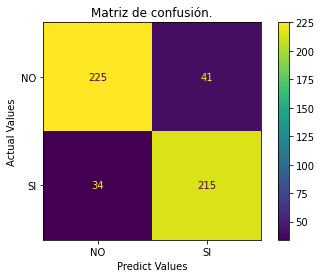

Precision,Recall,Accuracy,F1
0.84,0.86,0.85,0.85


In [14]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [15]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )

| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |0.808|	0.775|	0.802|	0.791|
|Random Forest       |0.848 |	0.871|	0.862|	0.859|
|    SVM_sigmoid        | 0.651 |	0.675|	0.668|	0.663|
|    SVM_rbf        | 0.776 |	0.807|	0.794|	0.791|
| LightGBM_optuna      |0.840|	0.863|	0.854|	0.851|
